<a href="https://colab.research.google.com/github/Yasmine-Ahmed99/Text-Summarization/blob/main/NLP_Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Group 15 Final Project Text Summarization**

link for the dataset: https://drive.google.com/drive/folders/1FxEZ8ffrGLrub318L2LO2y-x10k3VlhS?usp=sharing

## **Install dependancies and Import Important libraries**

In [ ]:
!pip install pytextrank
#Install mlxtend which is a library of Python tools and extensions for data science.
%pip install mlxtend --upgrade
!pip uninstall matplotlib
!pip install matplotlib==3.1.3
!pip install yellowbrick
!pip install sumy
!pip install transformers
!python -m spacy download en_core_web_lg
!pip3 install https://download.pytorch.org/whl/cpu/torch-1.0.1-cp36-cp36m-win_amd64.whl
!pip3 install torchvision
!pip install transformers==4.12.4 sentencepiece
!python -m spacy download en_core_web_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 10.5 MB/s 
     |████████████████████████████████| 47 kB 5.4 MB/s 
     |████████████████████████████████| 11.2 MB 48.8 MB/s 
     |████████████████████████████████| 944 kB 47.6 MB/s 
  Attempting uninstall: pygments
    Found existing installation: Pygments 2.6.1
    Uninstalling Pygments-2.6.1:
      Successfully uninstalled Pygments-2.6.1
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
data

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.3 MB 9.0 MB/s 
  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.14.0
    Uninstalling mlxtend-0.14.0:
      Successfully uninstalled mlxtend-0.14.0
Found existing installation: matplotlib 3.5.2
Uninstalling matplotlib-3.5.2:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.2-py3.7-nspkg.pth
    /usr/local/lib/python3.7/dist-packages/matplotlib-3.5.2.dist-info/*
    /usr/local/lib/python3.7/dist-packages/matplotlib/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axes_grid1/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/axisartist/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/*
    /usr/local/lib/python3.7/dist-packages/mpl_toolkits/tests/*
    /usr/local/lib/python3.7/dist-packages/pylab.py


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 94 kB 2.6 MB/s 
     |████████████████████████████████| 10.1 MB 26.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for breadability: filename=breadability-0.1.20-py2.py3-none-any.whl size=21712 sha256=bb970cd03d4454c31261639bfb28ffa0785cfe06f26136741bdc1ab855861822
  Stored in directory: /root/.cache/pip/wheels/d4/bf/51/81d27ad638e1a6dca4f362ecc33d1e2c764b8ea7ec751b8fc1
  Created wheel for pycountry: filename=pycountry-22.3.5-py2.py3-none-any.whl size=10681845 sha256=b76dfb5f38bebba7a24e2986daf3ac59fefac719626dd8b3821b9ede88642e3c
  Stored in directory: /root/.cache/pip/wheels/0e/06/e8/7ee176e95ea9a8a8c3b3afcb1869f20adbd42413d4611c6eb4
Successfully bui

In [ ]:
!pip install torch==1.2.0 torchvision==0.4.0 -f
!pip install -U sentence-transformers
!pip install rouge-score


Usage:   
  pip3 install [options] <requirement specifier> [package-index-options] ...
  pip3 install [options] -r <requirements file> [package-index-options] ...
  pip3 install [options] [-e] <vcs project url> ...
  pip3 install [options] [-e] <local project path> ...
  pip3 install [options] <archive url/path> ...

-f option requires 1 argument
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 85 kB 3.1 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=959f87dfec18209502992550bacae8cda7d0efd5d63102134bfbff484cb20bd0
  Stored in directory: /root/.cache/pip/wheels/bf/06/fb/d59c1e5bd1dac7f6cf61ec0036cc3a10ab8fecaa6b2c3d3ee9
Successfully built sentence-transformers
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-non

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
# Loading Essential libraries 
import warnings
from transformers import *
from transformers import BertTokenizer, TFBertForQuestionAnswering
from transformers import BertForQuestionAnswering
from transformers import BertTokenizer
from transformers import AutoTokenizer
from sklearn.decomposition import TruncatedSVD #Singular value decomposition
from scipy.sparse import csr_matrix
from numpy import concatenate
from sumy.parsers.plaintext import PlaintextParser
from yellowbrick.cluster import KElbowVisualizer
from sumy.nlp.tokenizers import Tokenizer
from sumy.summarizers.lsa import LsaSummarizer
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina'
%config Completer.use_jedi = False # this to force autocompletion 
from matplotlib import pyplot as plt
import seaborn as sns
import spacy
import en_core_web_sm
#import nltk---->leading platform for building Python programs to work with human language data.
import nltk
from collections import OrderedDict
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from scipy.sparse import csr_matrix
from numpy import concatenate
from yellowbrick.cluster import KElbowVisualizer
nltk.download('punkt')    #downloading punctuations from NLTK
nltk.download("stopwords")  #download stopwords from NLTK
nltk.download("wordnet")  #downloading lemmatizers from NLTK
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import gutenberg #a small selection of texts from the Project Gutenberg electronic text archive
from nltk.corpus import stopwords #importing stopwords
from nltk.stem import WordNetLemmatizer # algorithmic process of finding the lemma of a word depending on its meaning and context. 
import math #This module provides access to the mathematical functions defined by the C standard.
import pandas as pd  #open source data analysis library 
import numpy as np   #a Python library used for working with arrays.
import re #a Python library used for working with regular expressions
from sklearn import preprocessing
from sklearn.utils import shuffle
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
from mlxtend.evaluate import bias_variance_decomp
from sklearn.model_selection import cross_val_score #to Evaluate a score by cross-validation.
from sklearn.model_selection import KFold #Provides train/test indices to split data in train/test sets. Split dataset into k consecutive folds (without shuffling by default).
from sklearn.metrics import confusion_matrix #to Compute confusion matrix to evaluate the accuracy of a classification.
from sklearn.metrics import accuracy_score #to compute Accuracy classification score.
from sklearn.metrics import classification_report #to Build a text report showing the main classification metrics.
from sklearn.metrics import plot_confusion_matrix #to polt the confusion matrix for visualization
from mlxtend.evaluate import bias_variance_decomp # for various loss functions.
from sklearn.decomposition import TruncatedSVD
from sumy.parsers.plaintext import PlaintextParser
from sumy.nlp.tokenizers import Tokenizer
from sumy.summarizers.lsa import LsaSummarizer
from nltk.tokenize import sent_tokenize # tokenize clean text into sentences not words
from sentence_transformers import SentenceTransformer
from sumy.summarizers.lsa import LsaSummarizer
from sumy.summarizers.luhn import LuhnSummarizer
from sumy.parsers.plaintext import PlaintextParser
from sumy.nlp.tokenizers import Tokenizer
from __future__ import absolute_import
from __future__ import division , print_function, unicode_literals
from sumy.nlp.stemmers import Stemmer
from sumy.utils import get_stop_words

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


## **Upload the dataset and explore the data**

In [ ]:
#read the dataset
df = pd.read_csv("/content/dataset.csv")

In [ ]:
#print head of data
df.head(5)

,label,text,Text_summary
0,business,The Federal Reserve approved Ally Financial In...,The Federal Reserve approved Ally Financial In...
1,business,— Major shareholders of Duke Energy Corp. have...,— Major shareholders of Duke Energy Corp. have...
2,business,Photos taken earlier this month show that Nort...,Photos taken earlier this month show that Nort...
3,business,Thanks to dogged reporting by the Associated P...,Thanks to dogged reporting by the Associated P...
4,business,The energy giant says it is committed to clean...,The energy giant says it is committed to clean...


In [ ]:
#describe our data
df.describe()

,label,text,Text_summary
count,36891,36891,36891
unique,4,33288,33169
top,health,Why did this happen?\n\nPlease make sure your ...,Why did this happen?\nPlease make sure your br...
freq,10505,350,350


In [ ]:
#get some information about our data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36891 entries, 0 to 36890
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   label         36891 non-null  object
 1   text          36891 non-null  object
 2   Text_summary  36891 non-null  object
dtypes: object(3)
memory usage: 864.8+ KB


## **Step1: Data Preprocessing step**

In [ ]:
df['labelID'] = df['label'].factorize()[0]
df

,label,text,Text_summary,labelID
0,business,The Federal Reserve approved Ally Financial In...,The Federal Reserve approved Ally Financial In...,0
1,business,— Major shareholders of Duke Energy Corp. have...,— Major shareholders of Duke Energy Corp. have...,0
2,business,Photos taken earlier this month show that Nort...,Photos taken earlier this month show that Nort...,0
3,business,Thanks to dogged reporting by the Associated P...,Thanks to dogged reporting by the Associated P...,0
4,business,The energy giant says it is committed to clean...,The energy giant says it is committed to clean...,0
...,...,...,...,...
36886,technology,Why did this happen?\n\nPlease make sure your ...,Why did this happen?\nPlease make sure your br...,3
36887,technology,Google Inc (NASDAQ:GOOGL) GOOGL +1.12% (NASDAQ...,Google Inc (NASDAQ:GOOGL) GOOGL +1.12% (NASDAQ...,3
36888,technology,Google has purchased New Mexico-based unmanned...,Google has purchased New Mexico-based unmanned...,3
36889,technology,hidden\n\nLooks like Facebook's plans to get I...,Google has beaten the world's largest social n...,3


In [ ]:
part = { # mapping treebank to wordnet lemmatizer 
    'N' : 'n',
    'V' : 'v',
    'J' : 'a',
    'S' : 's',
    'R' : 'r'
}

In [ ]:
def get_tag(tag): #  used for lemmatizing 
  if tag[0] in part.keys():
    return part[tag[0]]
  else:
    return 'n'

In [ ]:
#data pre-processing and data cleaning
stop_words = nltk.corpus.stopwords.words("english")
def data_preprocessing(corpus, stemming=False, lemmitization=True,printt = False):
    corpus = re.sub(r'[^,.’\'\w\s]', ' ', str(corpus).lower().strip()) #keep commas and fullstops for sentence 
    #corpus = re.sub(r"(@\[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?", " ", corpus) # this line removes commas i don't know why
    corpus = re.sub("\d+", " ", corpus)           
    allText = corpus.split()
    if printt:
        print(f'number of words before removing stop words = {len(allText)}')
    if stop_words is not None:
        allText = [word for word in allText if word not in stop_words]
    if printt:   
        print(f'number of words after removing stop words = {len(allText)}')                
    if stemming == True:
        ps = nltk.stem.porter.PorterStemmer()
        allText = [ps.stem(word) for word in allText]
    if lemmitization == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()
        tagged = nltk.pos_tag(allText)
        allText = [lem.lemmatize(w[0], get_tag(w[1])) for w in tagged] # give lemmatizer part of speech
            
    corpus = " ".join(allText)
    return corpus

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
df["cleaned_text"] = df["text"].apply(lambda txt: data_preprocessing(txt,stemming=False, lemmitization=True))
df['tokenized'] = df['cleaned_text'].apply(lambda x: nltk.tokenize.word_tokenize(x))

In [ ]:
df["cleaned_Text_summary"] = df["Text_summary"].apply(lambda txt: data_preprocessing(txt,stemming=False, lemmitization=True))

In [ ]:
df.head()

,label,text,Text_summary,labelID,cleaned_text,tokenized,cleaned_Text_summary
0,business,The Federal Reserve approved Ally Financial In...,The Federal Reserve approved Ally Financial In...,0,federal reserve approve ally financial inc.’s ...,"[federal, reserve, approve, ally, financial, i...",federal reserve approve ally financial inc.’s ...
1,business,— Major shareholders of Duke Energy Corp. have...,— Major shareholders of Duke Energy Corp. have...,0,major shareholder duke energy corp. call compa...,"[major, shareholder, duke, energy, corp., call...",major shareholder duke energy corp. call compa...
2,business,Photos taken earlier this month show that Nort...,Photos taken earlier this month show that Nort...,0,photo take earlier month show north carolina r...,"[photo, take, earlier, month, show, north, car...",photo take earlier month show north carolina r...
3,business,Thanks to dogged reporting by the Associated P...,Thanks to dogged reporting by the Associated P...,0,"thanks dog report associate press, know active...","[thanks, dog, report, associate, press, ,, kno...","thanks dog report associate press, know active..."
4,business,The energy giant says it is committed to clean...,The energy giant says it is committed to clean...,0,energy giant say committed clean dan river spi...,"[energy, giant, say, committed, clean, dan, ri...",energy giant say committed clean dan river spi...


In [ ]:
df['summary_len'] = [len(x) for x in df['Text_summary']]
df['text_len'] = [len(x) for x in df['text']]
df.head()

,label,text,Text_summary,labelID,cleaned_text,tokenized,cleaned_Text_summary,summary_len,text_len
0,business,The Federal Reserve approved Ally Financial In...,The Federal Reserve approved Ally Financial In...,0,federal reserve approve ally financial inc.’s ...,"[federal, reserve, approve, ally, financial, i...",federal reserve approve ally financial inc.’s ...,382,383
1,business,— Major shareholders of Duke Energy Corp. have...,— Major shareholders of Duke Energy Corp. have...,0,major shareholder duke energy corp. call compa...,"[major, shareholder, duke, energy, corp., call...",major shareholder duke energy corp. call compa...,1037,2796
2,business,Photos taken earlier this month show that Nort...,Photos taken earlier this month show that Nort...,0,photo take earlier month show north carolina r...,"[photo, take, earlier, month, show, north, car...",photo take earlier month show north carolina r...,799,3563
3,business,Thanks to dogged reporting by the Associated P...,Thanks to dogged reporting by the Associated P...,0,"thanks dog report associate press, know active...","[thanks, dog, report, associate, press, ,, kno...","thanks dog report associate press, know active...",681,3269
4,business,The energy giant says it is committed to clean...,The energy giant says it is committed to clean...,0,energy giant say committed clean dan river spi...,"[energy, giant, say, committed, clean, dan, ri...",energy giant say committed clean dan river spi...,613,1392


In [ ]:
cleaned_df = df[df['text_len'] > df['summary_len']] # remove rows where text is shorter than summmary
print(len(cleaned_df))


35180


In [ ]:
cleaned_df['sentences'] = [x.split(',') for x in cleaned_df['cleaned_text']] # split text into sentences to give each one a score
cleaned_df.head()

,label,text,Text_summary,labelID,cleaned_text,tokenized,cleaned_Text_summary,summary_len,text_len,sentences
0,business,The Federal Reserve approved Ally Financial In...,The Federal Reserve approved Ally Financial In...,0,federal reserve approve ally financial inc.’s ...,"[federal, reserve, approve, ally, financial, i...",federal reserve approve ally financial inc.’s ...,382,383,[federal reserve approve ally financial inc.’s...
1,business,— Major shareholders of Duke Energy Corp. have...,— Major shareholders of Duke Energy Corp. have...,0,major shareholder duke energy corp. call compa...,"[major, shareholder, duke, energy, corp., call...",major shareholder duke energy corp. call compa...,1037,2796,[major shareholder duke energy corp. call comp...
2,business,Photos taken earlier this month show that Nort...,Photos taken earlier this month show that Nort...,0,photo take earlier month show north carolina r...,"[photo, take, earlier, month, show, north, car...",photo take earlier month show north carolina r...,799,3563,[photo take earlier month show north carolina ...
3,business,Thanks to dogged reporting by the Associated P...,Thanks to dogged reporting by the Associated P...,0,"thanks dog report associate press, know active...","[thanks, dog, report, associate, press, ,, kno...","thanks dog report associate press, know active...",681,3269,"[thanks dog report associate press, know acti..."
4,business,The energy giant says it is committed to clean...,The energy giant says it is committed to clean...,0,energy giant say committed clean dan river spi...,"[energy, giant, say, committed, clean, dan, ri...",energy giant say committed clean dan river spi...,613,1392,[energy giant say committed clean dan river sp...


In [ ]:
cleaned_df.loc[0,'sentences']

['federal reserve approve ally financial inc.’s capital plan bank regulator’s annual review industry’s financial health',
 ' clear another potential hurdle auto lender’s plan exit government ownership. ally’s plan approve federal reserve find bank could keep lend severe economic downturn',
 ' accord report wednesday.']

In [ ]:
cleaned_df.loc[0, 'tokenized']

['federal',
 'reserve',
 'approve',
 'ally',
 'financial',
 'inc.',
 '’',
 's',
 'capital',
 'plan',
 'bank',
 'regulator',
 '’',
 's',
 'annual',
 'review',
 'industry',
 '’',
 's',
 'financial',
 'health',
 ',',
 'clear',
 'another',
 'potential',
 'hurdle',
 'auto',
 'lender',
 '’',
 's',
 'plan',
 'exit',
 'government',
 'ownership',
 '.',
 'ally',
 '’',
 's',
 'plan',
 'approve',
 'federal',
 'reserve',
 'find',
 'bank',
 'could',
 'keep',
 'lend',
 'severe',
 'economic',
 'downturn',
 ',',
 'accord',
 'report',
 'wednesday',
 '.']

## **Show the wordCloud of the data**


 THE MOST FREQUENT 50 WORDS OF LABEL CALLED: business



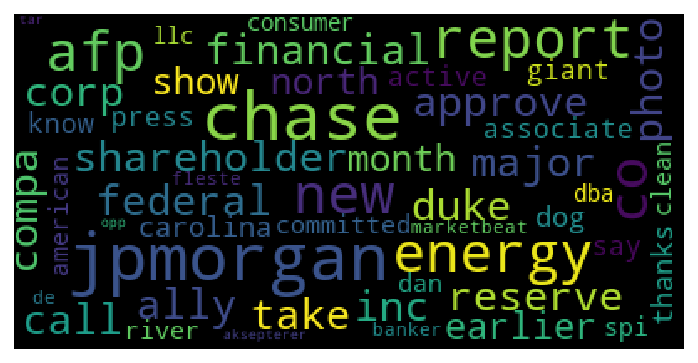


 THE MOST FREQUENT 50 WORDS OF LABEL CALLED: entertainment



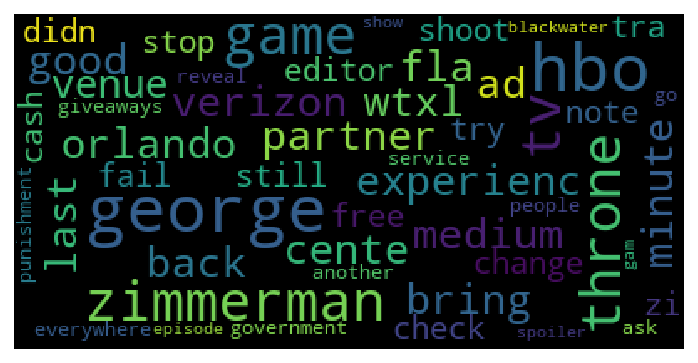


 THE MOST FREQUENT 50 WORDS OF LABEL CALLED: health



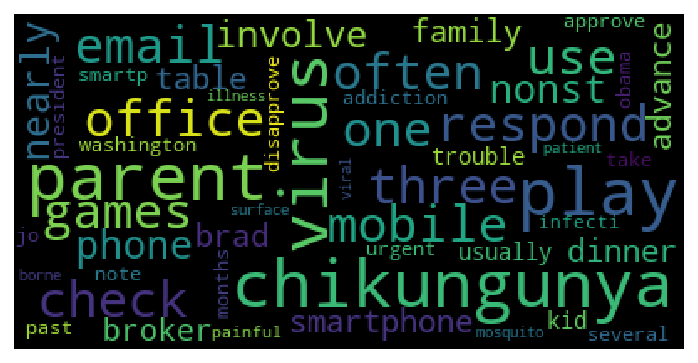


 THE MOST FREQUENT 50 WORDS OF LABEL CALLED: technology



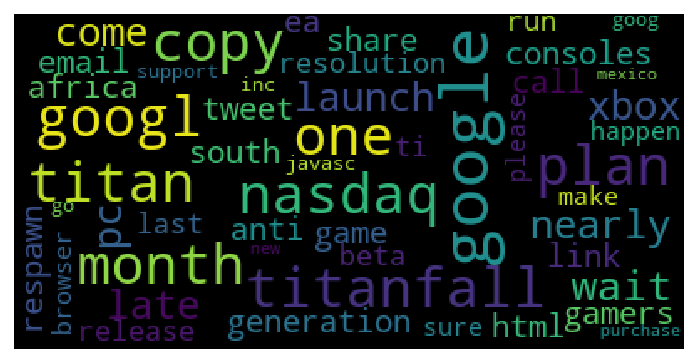

In [ ]:
import wordcloud #Python wordcloud library to create tag clouds
import string
#for loop to take every unique book in the column of label 
for n in cleaned_df['label'].unique():
  word_cloud = cleaned_df[cleaned_df["label"]==n]["cleaned_text"]
 #to print the most frequent 50 words of the unique label
  print(f"\n THE MOST FREQUENT 50 WORDS OF LABEL CALLED: {n}\n")
  WordCloudGragh = wordcloud.WordCloud(background_color='black', max_words=50, max_font_size=40)
  WordCloudGragh = WordCloudGragh.generate(str(word_cloud))
  plt.axis('off')
  plt.imshow(WordCloudGragh, cmap=None)
  plt.show()

## **Split the dataset into train and test split**

In [ ]:
#split dataset into subsets that minimize the potential for bias in your evaluation and validation process.
from sklearn.model_selection import train_test_split
x= np.array(cleaned_df['cleaned_text'])
y=np.array(cleaned_df['labelID'])
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= 0.3, random_state= 0)

## **Step 2: Perform Text Feature Engineering** 

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer #to Convert a collection of text documents to a matrix of token counts.
countVector= CountVectorizer()

### **1- Bag of words text feature engineering**

**A bag of words is a representation of text that describes the occurrence of words within a document.** 

In [ ]:
vectorizer = CountVectorizer(min_df=2)
BOWtraining= vectorizer.fit_transform(x_train)
BOWtesting = vectorizer.transform(x_test)

### **2- TF-IDF text feature engineering**

Term frequency (TF) vectors show how important words are to documents. They are computed by using: 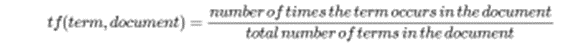

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
TF_IDF = TfidfVectorizer(min_df=6,norm='l2',smooth_idf=True,use_idf=True)
TFIDF_Train = TF_IDF.fit_transform(x_train)
TFIDF_Test = TF_IDF.transform(x_test)

## **Step 3:Train the 3 Classification models**

### **1- perform Bag Of Words (BOW) transformation and apply it to different 3 classification models**:

1.   Support vector machine(SVM) classification Model
2.   Decision Tree Classification Model
3.   KNN classification Model



#### **1- Train SVM model with BOW** 

In [ ]:
#define the type of support vector machine algorithm
BagOfWords_SVM = svm.SVC(kernel='linear')
BagOfWords_SVM.fit(BOWtraining,y_train)

SVC(kernel='linear')

In [ ]:
SVM_BOW_Prediction = BagOfWords_SVM.predict(BOWtesting)

In [ ]:
from sklearn.metrics import classification_report #to use the function of classification report
print(classification_report(y_train,BagOfWords_SVM.predict(BOWtraining)))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      5002
           1       0.99      0.98      0.99      5771
           2       0.98      0.98      0.98      6939
           3       0.98      0.97      0.98      6914

    accuracy                           0.98     24626
   macro avg       0.98      0.98      0.98     24626
weighted avg       0.98      0.98      0.98     24626



In [ ]:
#testing classification report
print(classification_report(y_test,SVM_BOW_Prediction))

              precision    recall  f1-score   support

           0       0.87      0.92      0.90      2112
           1       0.96      0.95      0.96      2457
           2       0.94      0.93      0.94      3011
           3       0.94      0.93      0.93      2974

    accuracy                           0.93     10554
   macro avg       0.93      0.93      0.93     10554
weighted avg       0.93      0.93      0.93     10554



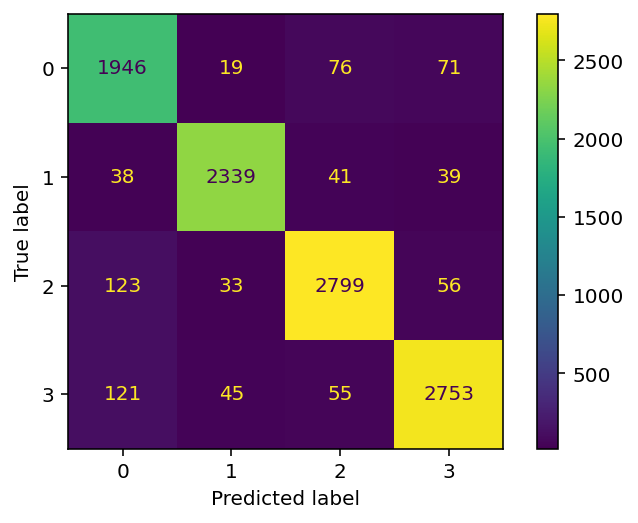

In [ ]:
plot_confusion_matrix(BagOfWords_SVM ,BOWtesting , y_test)

#### **2- Train Decision Tree Classification model with BOW**

In [ ]:
from sklearn.tree import DecisionTreeClassifier #for DT model
BOW_DT = DecisionTreeClassifier(random_state=0)
BOW_DT.fit(BOWtraining,y_train)
BOW_DT_Prediction = BOW_DT.predict(BOWtesting)

In [ ]:
print(classification_report(y_train,BOW_DT.predict(BOWtraining)))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      5002
           1       0.98      0.99      0.98      5771
           2       0.98      0.98      0.98      6939
           3       0.99      0.97      0.98      6914

    accuracy                           0.98     24626
   macro avg       0.98      0.98      0.98     24626
weighted avg       0.98      0.98      0.98     24626



In [ ]:
print(classification_report(y_test,BOW_DT_Prediction))

              precision    recall  f1-score   support

           0       0.79      0.81      0.80      2112
           1       0.89      0.88      0.88      2457
           2       0.88      0.89      0.89      3011
           3       0.85      0.83      0.84      2974

    accuracy                           0.86     10554
   macro avg       0.85      0.85      0.85     10554
weighted avg       0.86      0.86      0.86     10554



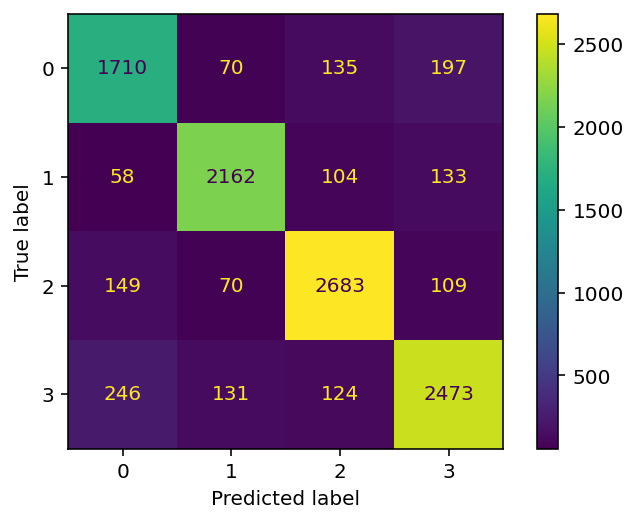

In [ ]:
plot_confusion_matrix(BOW_DT ,BOWtesting , y_test)

#### **3- Train KNN classification with BOW**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
BagOfWords_KNN = KNeighborsClassifier(n_neighbors = 3, algorithm= 'kd_tree', p= 1)
BagOfWords_KNN.fit(BOWtraining,y_train)
BOW_KNN_Prediction = BagOfWords_KNN.predict(BOWtesting)

In [ ]:
print(classification_report(y_train,BagOfWords_KNN.predict(BOWtraining)))

              precision    recall  f1-score   support

           0       0.66      0.94      0.77      5002
           1       0.91      0.79      0.84      5771
           2       0.92      0.84      0.88      6939
           3       0.90      0.81      0.85      6914

    accuracy                           0.84     24626
   macro avg       0.85      0.84      0.84     24626
weighted avg       0.86      0.84      0.84     24626



In [ ]:
print(classification_report(y_test,BOW_KNN_Prediction))

              precision    recall  f1-score   support

           0       0.50      0.84      0.62      2112
           1       0.80      0.62      0.70      2457
           2       0.82      0.73      0.77      3011
           3       0.76      0.62      0.68      2974

    accuracy                           0.69     10554
   macro avg       0.72      0.70      0.69     10554
weighted avg       0.73      0.69      0.70     10554



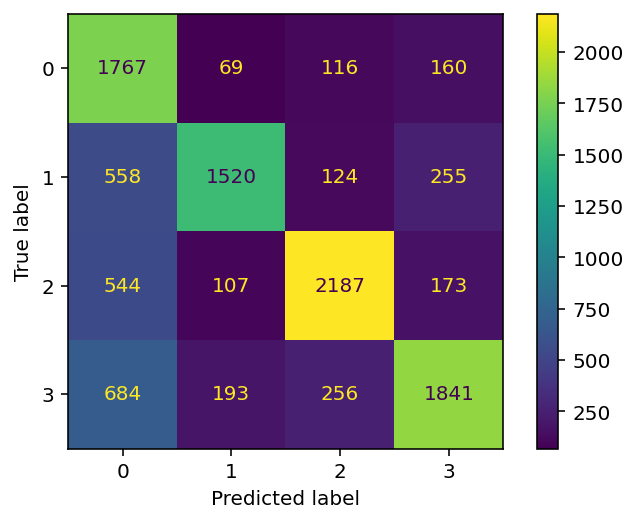

In [ ]:
plot_confusion_matrix(BagOfWords_KNN ,BOWtesting , y_test)

### **2- perform TF-IDF transformation and apply it to different 3 classification models**:

1.   Support vector machine(SVM) classification Model
2.   Decision Tree Classification Model
3.   KNN classification Model


#### **1- Train SVM model with TF-IDF** 

In [ ]:
#define the type of support vector machine algorithm
TFIDF_SVM = svm.SVC(kernel='linear')
TFIDF_SVM.fit(TFIDF_Train,y_train)

SVC(kernel='linear')

In [ ]:
SVM_TFIDF_Prediction = TFIDF_SVM.predict(TFIDF_Test)

In [ ]:
print(classification_report(y_train,TFIDF_SVM.predict(TFIDF_Train)))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      5002
           1       0.98      0.98      0.98      5771
           2       0.97      0.97      0.97      6939
           3       0.98      0.96      0.97      6914

    accuracy                           0.97     24626
   macro avg       0.97      0.97      0.97     24626
weighted avg       0.97      0.97      0.97     24626



In [ ]:
#testing classification report
print(classification_report(y_test,SVM_TFIDF_Prediction))

              precision    recall  f1-score   support

           0       0.91      0.95      0.93      2112
           1       0.97      0.97      0.97      2457
           2       0.96      0.95      0.95      3011
           3       0.96      0.95      0.95      2974

    accuracy                           0.95     10554
   macro avg       0.95      0.95      0.95     10554
weighted avg       0.95      0.95      0.95     10554



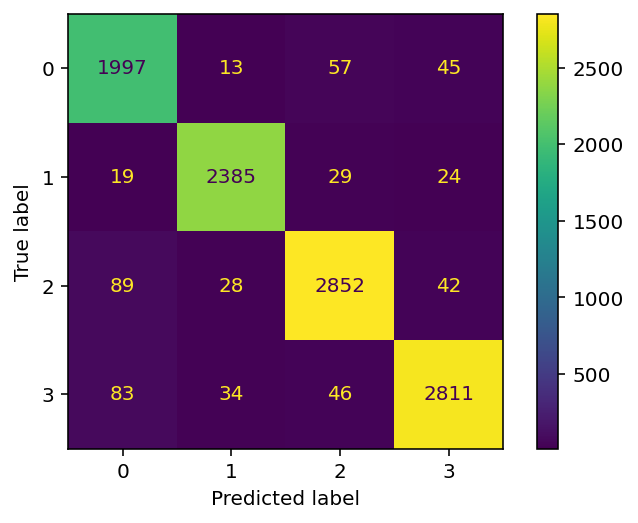

In [ ]:
plot_confusion_matrix(TFIDF_SVM ,TFIDF_Test , y_test)

#### **2- Train Decision Tree Classification model with TFIDF**

In [ ]:
TFIDF_DT = DecisionTreeClassifier(random_state=0)
TFIDF_DT.fit(TFIDF_Train,y_train)
TFIDF_DT_Prediction = TFIDF_DT.predict(TFIDF_Test)

In [ ]:
print(classification_report(y_train,TFIDF_DT.predict(TFIDF_Train)))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      5002
           1       0.98      0.99      0.98      5771
           2       0.98      0.98      0.98      6939
           3       0.99      0.97      0.98      6914

    accuracy                           0.98     24626
   macro avg       0.98      0.98      0.98     24626
weighted avg       0.98      0.98      0.98     24626



In [ ]:
print(classification_report(y_test,TFIDF_DT_Prediction))

              precision    recall  f1-score   support

           0       0.76      0.80      0.78      2112
           1       0.87      0.89      0.88      2457
           2       0.89      0.87      0.88      3011
           3       0.85      0.82      0.83      2974

    accuracy                           0.85     10554
   macro avg       0.84      0.85      0.84     10554
weighted avg       0.85      0.85      0.85     10554



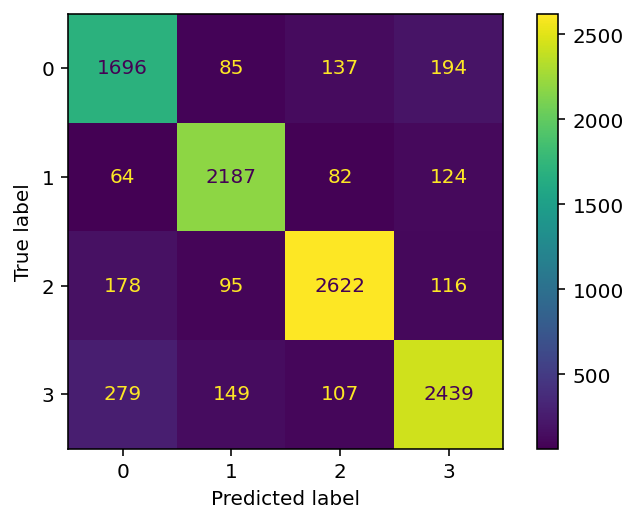

In [ ]:
plot_confusion_matrix(TFIDF_DT ,TFIDF_Test , y_test)

#### **3- Train KNN classification with TFIDF**

In [ ]:
TFIDF_KNN = KNeighborsClassifier(n_neighbors = 3, algorithm= 'kd_tree', p= 1)
TFIDF_KNN.fit(TFIDF_Train,y_train)
TFIDF_KNN_Prediction = TFIDF_KNN.predict(TFIDF_Test)

In [ ]:
print(classification_report(y_train,TFIDF_KNN.predict(TFIDF_Train)))

              precision    recall  f1-score   support

           0       0.91      0.64      0.75      5002
           1       0.45      0.99      0.62      5771
           2       0.98      0.67      0.79      6939
           3       0.97      0.54      0.70      6914

    accuracy                           0.70     24626
   macro avg       0.83      0.71      0.71     24626
weighted avg       0.84      0.70      0.72     24626



In [ ]:
print(classification_report(y_test,TFIDF_KNN_Prediction))

              precision    recall  f1-score   support

           0       0.86      0.48      0.62      2112
           1       0.37      0.98      0.54      2457
           2       0.97      0.54      0.69      3011
           3       0.96      0.39      0.55      2974

    accuracy                           0.59     10554
   macro avg       0.79      0.60      0.60     10554
weighted avg       0.80      0.59      0.60     10554



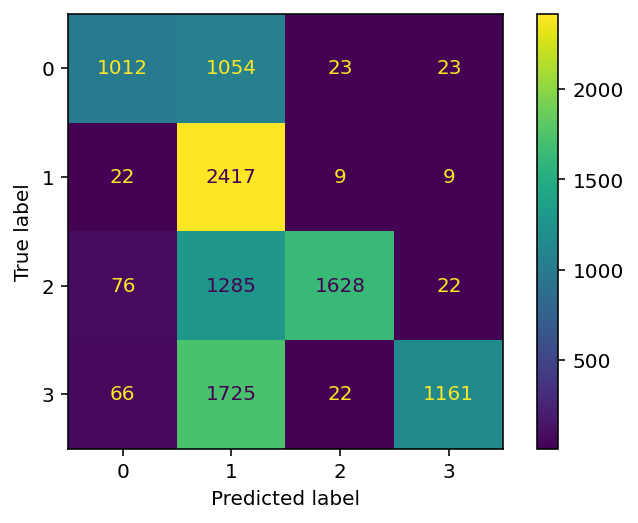

In [ ]:
plot_confusion_matrix(TFIDF_KNN ,TFIDF_Test , y_test)

## **Step4: Visualization of Classification models**

In [ ]:
#calculate the accuracies of each model
BOW_SVM_accuracy = BagOfWords_SVM.score(BOWtesting, y_test)
BOW_DT_accuracy = BOW_DT.score(BOWtesting, y_test)
BOW_KNN_accuracy = BagOfWords_KNN.score(BOWtesting, y_test)

TFIDF_SVM_accuracy = TFIDF_SVM.score(TFIDF_Test, y_test)
TFIDF_DT_accuracy = TFIDF_DT.score(TFIDF_Test, y_test)
TFIDF_KNN_accuracy = TFIDF_KNN.score(TFIDF_Test, y_test)


In [ ]:
Accuracies = [BOW_SVM_accuracy , TFIDF_SVM_accuracy,
              BOW_DT_accuracy, TFIDF_DT_accuracy,
              BOW_KNN_accuracy, TFIDF_KNN_accuracy,]
Accuracies_Labels= ['BOW_SVM', 'TFIDF_SVM',
                    'BOW_DT', 'TFIDF_DT',
                    'BOW_KNN', 'TFIDF_KNN',]
Final_Accuracies_List = pd.DataFrame([Accuracies_Labels ,Accuracies ])
Final_Accuracies_List

,0,1,2,3,4,5
0,BOW_SVM,TFIDF_SVM,BOW_DT,TFIDF_DT,BOW_KNN,TFIDF_KNN
1,0.932064,0.951772,0.85541,0.847451,0.693102,0.589161


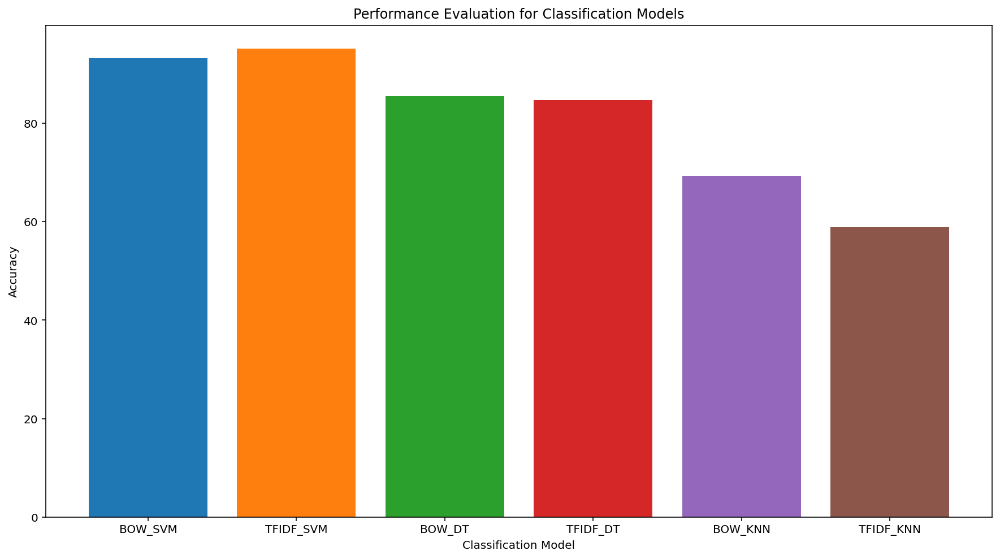

In [ ]:
fig = plt.figure(figsize=(15, 8))
ax = fig.add_subplot(111)
for i in range(len(Accuracies_Labels)):
    plt.bar(Accuracies_Labels[i] ,Accuracies[i]*100)
plt.xlabel('Classification Model')
plt.ylabel('Accuracy')
plt.title('Performance Evaluation for Classification Models')
plt.show()

## **Step 5: Perform Error Analysis**

In [ ]:
y_test

array([0, 1, 0, ..., 2, 2, 2])

### **Error Analysis for models with BOW**

In [ ]:
SVM_BOW_Prediction

array([0, 1, 0, ..., 1, 2, 2])

In [ ]:
BOW_DT_Prediction

array([0, 3, 0, ..., 1, 2, 2])

In [ ]:
BOW_KNN_Prediction

array([0, 1, 0, ..., 1, 2, 2])

In [ ]:
cleaned_df['cleaned_text'][35178]

'almost half mlntwitter user never tweet many percent tweeples never press tweet button micro blogging website. fact reveal report file twopcharts, firm monitoring usage. accord report, twitter user prefer stay dormant follow news various twitter debate take place around prominent twitter trends. per statistics, percent account send , percent tweet times. present, million active users. active user define person log twitter account least month. similar survey conduct beevolve reveal twitter user less followers. while, mere percent user , followers. term follow others, majority population twitter find follow less accounts.'

In [ ]:
cleaned_df['labelID'][35178]

3

In [ ]:
cleaned_df['labelID'][1]

0

In [ ]:
cleaned_df['cleaned_text'][1]

"major shareholder duke energy corp. call company's board director launch independent investigation last month's coal ash spill dan river retire duke plant near eden. duke’s recent environmental problem suggest serious lapse oversight, well failures risk management board directors, substantial concern investors, bill dempsey, senior vice president nathan cummings foundation, spearhead investor move, say statement. duke investor join effort include pension fund california, connecticut, illinois, oregon pennsylvania, service employee international union investment fund calvert investment trillium asset management. group send letter thursday regulatory policy operation committee duke's board review circumstance around feb. spill, foul mile dan river toxic sludge, whether utility's policy procedures prevent future spills. state environmental regulator since cite duke lack proper permit several coal fire power plant north carolina illegally dump wastewater coal ash pond chatham county tribu

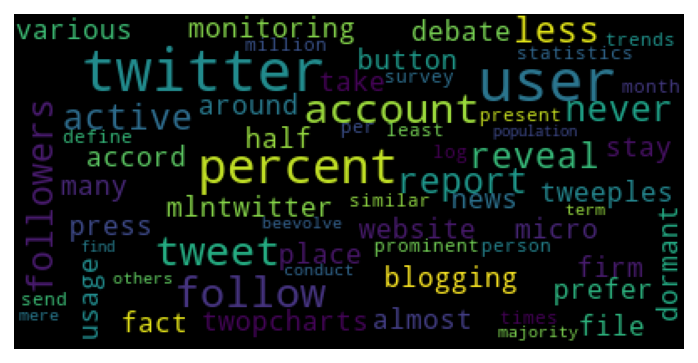

In [ ]:
SVM_BOW_Prediction_wordCloud = wordcloud.WordCloud(background_color='black', max_words=100, max_font_size=35)
SVM_BOW_Prediction_wordCloud = SVM_BOW_Prediction_wordCloud.generate(str(cleaned_df['cleaned_text'][35178]))
fig = plt.figure(num=1)
plt.axis('off')
plt.imshow(SVM_BOW_Prediction_wordCloud, cmap=None)
plt.show()

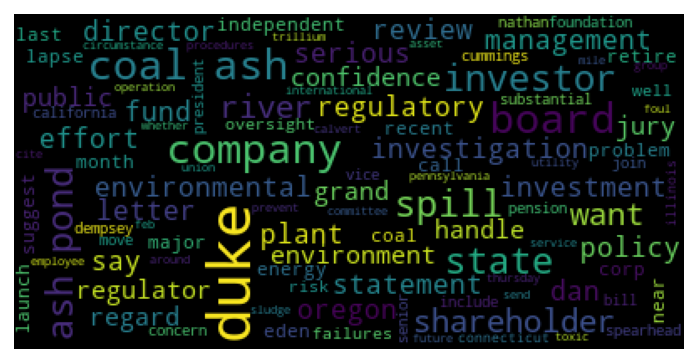

In [ ]:
BOW_DT_Prediction_wordCloud = wordcloud.WordCloud(background_color='black', max_words=100, max_font_size=35)
BOW_DT_Prediction_wordCloud = BOW_DT_Prediction_wordCloud.generate(str(cleaned_df['cleaned_text'][1]))
fig = plt.figure(num=1)
plt.axis('off')
plt.imshow(BOW_DT_Prediction_wordCloud, cmap=None)
plt.show()

### **Error Analysis for models with TFIDF**

In [ ]:
SVM_TFIDF_Prediction

array([0, 1, 0, ..., 1, 2, 2])

In [ ]:
TFIDF_DT_Prediction

array([0, 1, 0, ..., 1, 2, 2])

In [ ]:
TFIDF_KNN_Prediction

array([0, 1, 1, ..., 1, 2, 2])

In [ ]:
cleaned_df['labelID'][2]

0

In [ ]:
cleaned_df['cleaned_text'][2]

"photo take earlier month show north carolina regulator apparently fail notice large crack opening earthen dam hold back million ton duke energy's coal ash near cape fear river. state department environment natural resource spokesman jamie kritzer say inspector agency visit duke's cape fear plant march , see crack. aerial photo take march environmental group waterkeeper alliance show fissure, clearly mark metal stake top orange streamers. dam also appear sag bulge near crack. agency say know crack duke report march , company cite illegally pump gallon contaminate wastewater river. duke refuse comment late environmental violation whether crack way connect unlawful pumping, go months. kritzer say thursday state agency, know denr, may consider seek change north carolina law, currently require dam owner notify regulator judge likelihood dam might fail emergency action proposed. feel would prudent company inform denr crack earthen dam soon company identify crack, kritzer said. duke energy l

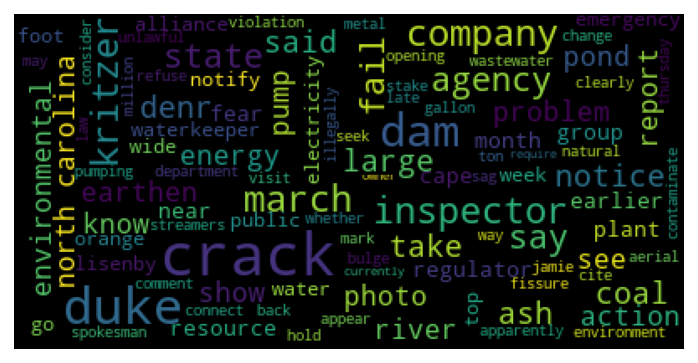

In [ ]:
TFIDF_KNN_Prediction_wordCloud = wordcloud.WordCloud(background_color='black', max_words=100, max_font_size=35)
TFIDF_KNN_Prediction_wordCloud = TFIDF_KNN_Prediction_wordCloud.generate(str(cleaned_df['cleaned_text'][2]))
fig = plt.figure(num=1)
plt.axis('off')
plt.imshow(TFIDF_KNN_Prediction_wordCloud, cmap=None)
plt.show()

## **Step 6: Perform Clustering**

In [ ]:
def BuildingKMeansModel(clusters, X_data):
  kMeansModel= KMeans(n_clusters= clusters, init='k-means++', random_state=0)
  Y_Prediction = kMeansModel.fit_predict(X_data)
  return kMeansModel, Y_Prediction

In [ ]:
def TSNEData(DesiredOutput):
  Tsna = TSNE(n_components= 2, random_state= 42)
  DataOfTSNE = Tsna.fit_transform(DesiredOutput) 
  return DataOfTSNE

In [ ]:
def ClusteringVisualization(ClusteringModel, cleaned_df, Y_Prediction, em=True):
  # get centroids of kmeans cluster
  if em:
    centroids = np.empty(shape=(ClusteringModel.n_components, cleaned_df.shape[1]))
  else:
    centroids = ClusteringModel.cluster_centers_

  # we want to transform the rows and the centroids
  # todense return matrix
  matrix_data = csr_matrix(cleaned_df)
  all_Data = concatenate((matrix_data.todense(), centroids))

  n_clusters = 4

  plt.scatter([all_Data[:-n_clusters, 0]], [all_Data[:-n_clusters, 1]], c=Y_Prediction, cmap=plt.cm.Paired, marker= 'x')
  plt.scatter([all_Data[-n_clusters:, 0]], [all_Data[-n_clusters:, 1]], marker= 'o')
  plt.show()

from collections import Counter
def CountingClusters(predictedClusters):
  clustersNumber = Counter(predictedClusters)
  plt.bar(clustersNumber.keys(), clustersNumber.values())

### **1- Kmans with BOW**

In [ ]:
DataOfBOW = TSNEData(BOWtraining)
KMeansWithBOW, KMeansWithBOWPrediction = BuildingKMeansModel(4,DataOfBOW)

In [ ]:
KMeansWithBOW.cluster_centers_.argsort()[:, ::-1]

array([[1, 0],
       [0, 1],
       [0, 1],
       [1, 0]])

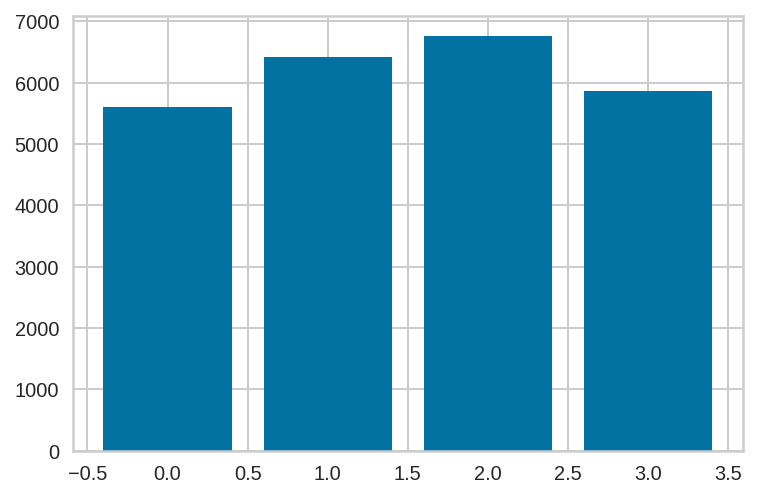

In [ ]:
CountingClusters(KMeansWithBOWPrediction)

### **2- Kmaeans with TFIDF**

In [ ]:
DataOfTFIDF = TSNEData(TFIDF_Train)
KMeansWithTFIDF, KMeansWithTFIDFPrediction = BuildingKMeansModel(4,DataOfTFIDF)

In [ ]:
KMeansWithTFIDF.cluster_centers_.argsort()[:, ::-1]

array([[0, 1],
       [1, 0],
       [0, 1],
       [1, 0]])

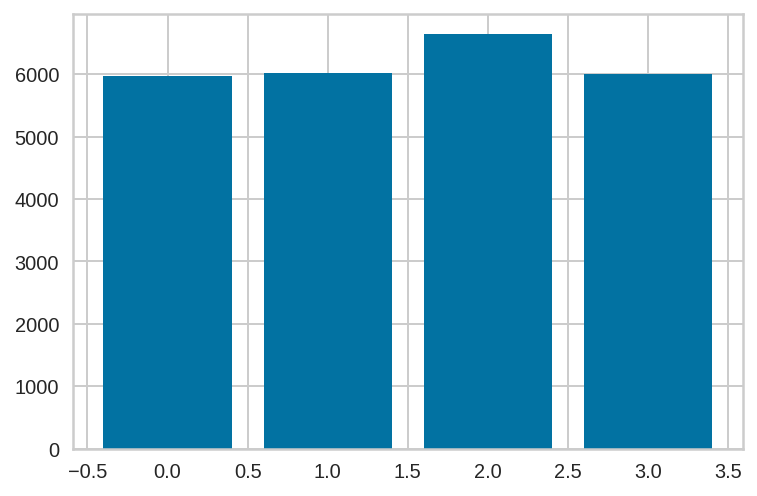

In [ ]:
CountingClusters(KMeansWithTFIDFPrediction)

## **7- Perform Error Analysis and choose the best number of k**

For NumOfClusters = 3 The average of the silhouette score is : 0.37174165 

For NumOfClusters = 4 The average of the silhouette score is : 0.35632643 

For NumOfClusters = 5 The average of the silhouette score is : 0.33884898 

For NumOfClusters = 6 The average of the silhouette score is : 0.3626938 

For NumOfClusters = 7 The average of the silhouette score is : 0.3627066 

For NumOfClusters = 8 The average of the silhouette score is : 0.3542431 



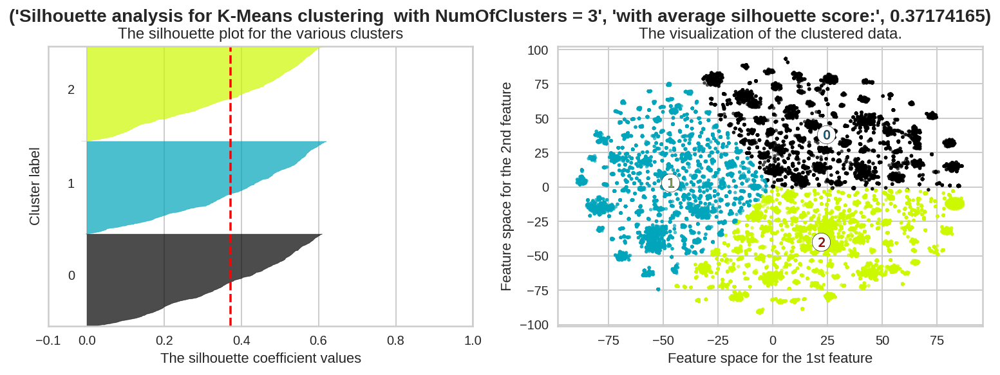

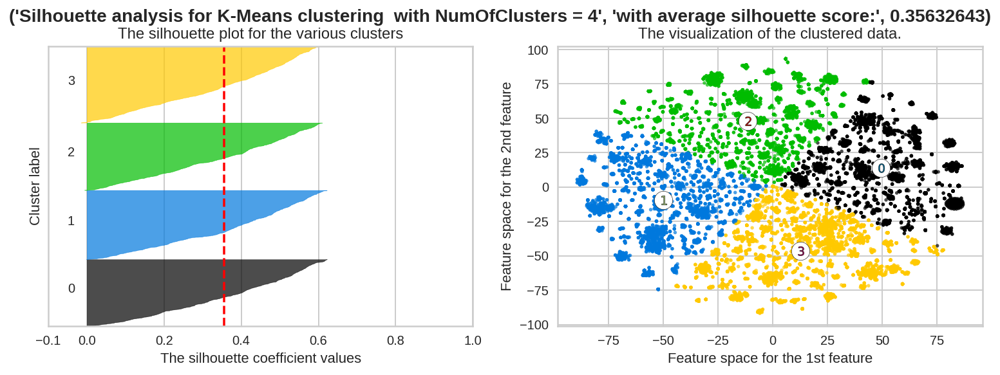

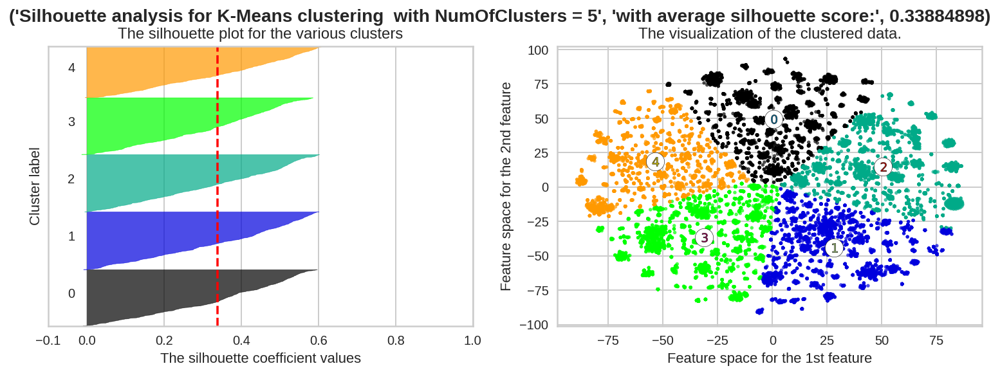

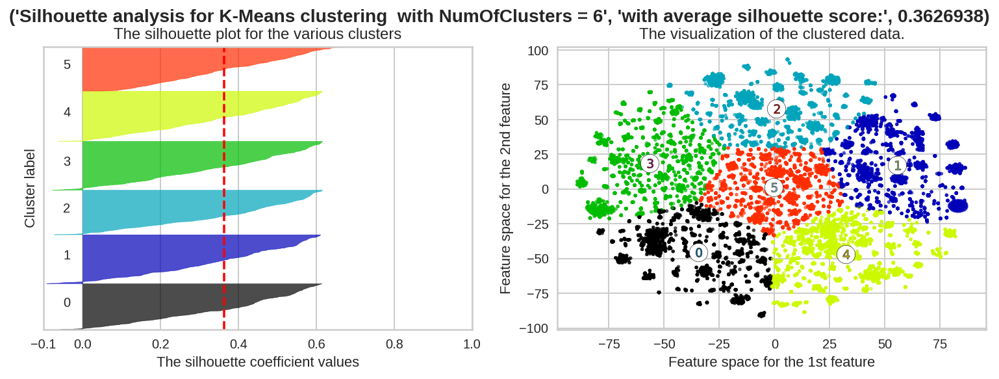

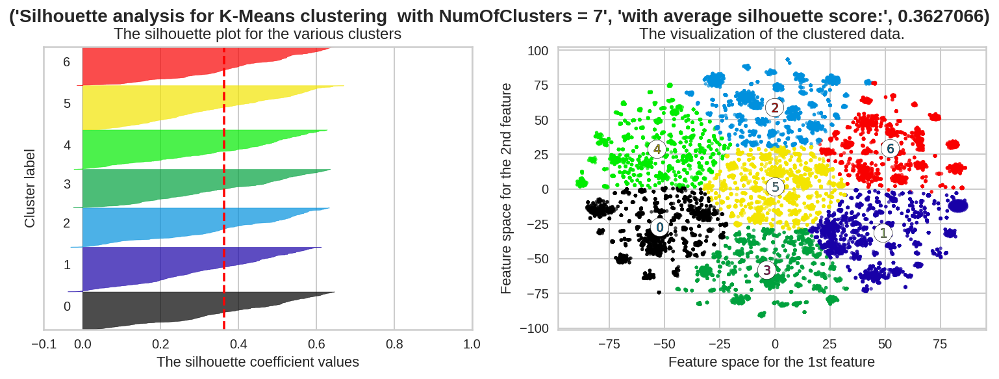

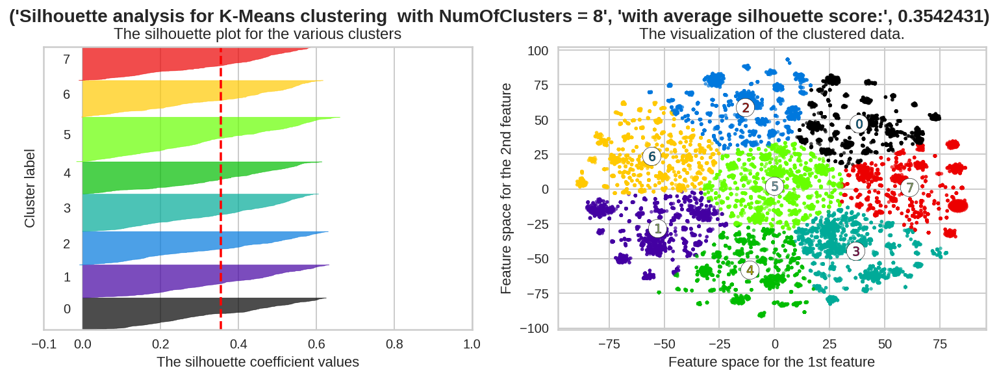

In [ ]:
from sklearn.metrics import silhouette_score ,silhouette_samples #to Compute the mean Silhouette Coefficient of all samples.
import matplotlib.cm as cm
RangeOfClusters = [ 3, 4, 5, 6, 7, 8] #define the range of clusters
SilhouetteScores = []
#for loop on the range of the clusters to draw the silhouette score and samples 
for NumOfClusters in RangeOfClusters:
    #To create a subplot of 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(13, 4)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(DataOfTFIDF) + (NumOfClusters + 1) * 10])
    #define the clusters of K-means clustering model
    clusters = KMeans(n_clusters=NumOfClusters, random_state=10)
    #to define the cluster labels to predict
    cluster_labels = clusters.fit_predict(DataOfTFIDF)
    AverageOfSilhouette = silhouette_score(DataOfTFIDF, cluster_labels)
    SilhouetteScores.append(AverageOfSilhouette)
    #to print thr average number of silhouette score
    print("For NumOfClusters =", NumOfClusters, "The average of the silhouette score is :", AverageOfSilhouette ,"\n")
    #To compute the silhouette scores for each sample
    SilhouetteValuesSamples = silhouette_samples(DataOfTFIDF, cluster_labels)
    y_lower = 10
    for i in range(NumOfClusters):
        SilhouetteValues = \
            SilhouetteValuesSamples[cluster_labels == i]
        #sort the values of sillhouette 
        SilhouetteValues.sort()
        ClusterSize = SilhouetteValues.shape[0]
        #set the value of y_upper
        y_upper = y_lower + ClusterSize
        color = cm.nipy_spectral(float(i) / NumOfClusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, SilhouetteValues, facecolor=color, edgecolor=color, alpha=0.7)
        #define the labels of silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * ClusterSize, str(i))
        # Compute the new y_lower for next plot
        y_lower = y_upper + 10 

    ax1.set_title("The silhouette plot for the various clusters")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=AverageOfSilhouette, color="red", linestyle="--") #vertical line for the average silhouette score of all the values
    ax1.set_yticks([])  
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    #to show the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / NumOfClusters)
    ax2.scatter(DataOfTFIDF[:, 0], DataOfTFIDF[:, 1], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')
    #to label the clusters based on the center value
    centers = clusters.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',c="white", alpha=1, s=200, edgecolor='k') 
    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')
    #to set the titles of x and y labels
    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    plt.suptitle(("Silhouette analysis for K-Means clustering  " "with NumOfClusters = %d" % NumOfClusters ,"with average silhouette score:", AverageOfSilhouette ), fontsize=14, fontweight='bold')
plt.show()

## **8- Perform LSA Text Summarization**

Latent Semantic Analysis is a robust algebraic-Statistical method which extracts hidden semantic structures of words and sentences. it extracts the features that cannot be directly mentioned. These features are essential to data, but are not original features of the dataset. It is an unsupervised approach along with the usage of Natural Language Processing (NLP).

In [ ]:
summarizer_lsa = LsaSummarizer()
summarizer_lsa.stop_words = get_stop_words("english")

In [ ]:
#get data foreach topic
def get_data(n):
  topic=[]
  lab=np.array(cleaned_df['labelID'])
  data=np.array(cleaned_df['cleaned_text'])
  for i in range(len(cleaned_df)):
    if lab[i] == n:
      topic.append(data[i])


  topic_sum=[]

  data_sum=np.array(cleaned_df['cleaned_Text_summary'])
  for i in range(len(cleaned_df)):
    if lab[i] == n:
      topic_sum.append(data[i]) 

  return  topic , topic_sum    

In [ ]:
data= np.array(cleaned_df['cleaned_text'])
cleaned_Text_summary=np.array(cleaned_df['cleaned_Text_summary'])

In [ ]:
#LSA function 
def lSa(topic):
  summarize_topic=[]
  for i in range(len(topic)):
    parser = PlaintextParser.from_string(topic[i]  ,Tokenizer("english"))
    for sentens in summarizer_lsa(parser.document, 1 ) :
      summarize_topic.append(sentens)
  return  summarize_topic  

In [ ]:
topic1 , topic1_sum = get_data(0) 

In [ ]:
summarize_data = lSa(data)

In [ ]:
summarize_data_lsa= pd.DataFrame(summarize_data)
summarize_data_lsa

,0
0,ally’s plan approve federal reserve find bank ...
1,duke’s recent environmental problem suggest se...
2,photo take earlier month show north carolina r...
3,"accord ap report, cull information document in..."
4,spokesman dave scanzoni say team begin work so...
...,...
35175,happen please make sure browser support javasc...
35176,mountain view base internet giant say titan ce...
35177,google purchase new mexico base unmanned aeria...
35178,atmospheric satellite could help bring interne...


In [ ]:
cleaned_Text_summary= pd.DataFrame(cleaned_Text_summary )
cleaned_Text_summary

,0
0,federal reserve approve ally financial inc.’s ...
1,major shareholder duke energy corp. call compa...
2,photo take earlier month show north carolina r...
3,"thanks dog report associate press, know active..."
4,energy giant say committed clean dan river spi...
...,...
35175,happen please make sure browser support javasc...
35176,google inc nasdaq googl googl . nasdaq goog go...
35177,google purchase new mexico base unmanned aeria...
35178,google beaten world's large social network pur...


In [ ]:
frames = [summarize_data_lsa,cleaned_Text_summary ]
result = pd.concat(frames, axis=1 )
display(result)

,0,0
0,ally’s plan approve federal reserve find bank ...,federal reserve approve ally financial inc.’s ...
1,duke’s recent environmental problem suggest se...,major shareholder duke energy corp. call compa...
2,photo take earlier month show north carolina r...,photo take earlier month show north carolina r...
3,"accord ap report, cull information document in...","thanks dog report associate press, know active..."
4,spokesman dave scanzoni say team begin work so...,energy giant say committed clean dan river spi...
...,...,...
35175,happen please make sure browser support javasc...,happen please make sure browser support javasc...
35176,mountain view base internet giant say titan ce...,google inc nasdaq googl googl . nasdaq goog go...
35177,google purchase new mexico base unmanned aeria...,google purchase new mexico base unmanned aeria...
35178,atmospheric satellite could help bring interne...,google beaten world's large social network pur...


In [ ]:
summarize_topic1 = lSa(topic1)
summarize_topic1= pd.DataFrame(summarize_topic1)
summarize_topic1

,0
0,ally’s plan approve federal reserve find bank ...
1,duke’s recent environmental problem suggest se...
2,photo take earlier month show north carolina r...
3,"accord ap report, cull information document in..."
4,spokesman dave scanzoni say team begin work so...
...,...
7109,"e th st , sioux falls, sd email protect market..."
7110,å ha kausjonsansvar gir ingen rettighet til pe...
7111,"percent slump first quarter earnings, nation’s..."
7112,jpmorgan’s disappoint first quarter result fol...


In [ ]:
cleaned_Text_summary= pd.DataFrame(cleaned_Text_summary)
cleaned_Text_summary

,0
0,federal reserve approve ally financial inc.’s ...
1,major shareholder duke energy corp. call compa...
2,photo take earlier month show north carolina r...
3,"thanks dog report associate press, know active..."
4,energy giant say committed clean dan river spi...
...,...
35175,happen please make sure browser support javasc...
35176,google inc nasdaq googl googl . nasdaq goog go...
35177,google purchase new mexico base unmanned aeria...
35178,google beaten world's large social network pur...


In [ ]:
!pip install rouge
from rouge import Rouge
ROUGE = Rouge()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
summarize_data_lsa

,0
0,ally’s plan approve federal reserve find bank ...
1,duke’s recent environmental problem suggest se...
2,photo take earlier month show north carolina r...
3,"accord ap report, cull information document in..."
4,spokesman dave scanzoni say team begin work so...
...,...
35175,happen please make sure browser support javasc...
35176,mountain view base internet giant say titan ce...
35177,google purchase new mexico base unmanned aeria...
35178,atmospheric satellite could help bring interne...


In [ ]:
flist=[]
rlist=[]
plist=[]
res=[]
for i in range(len(summarize_data_lsa)):
  str1=summarize_data_lsa.iloc[i].to_string()
  str2=cleaned_Text_summary.iloc[i].to_string()
  res.append(ROUGE.get_scores(str1, str2))
  # flist.append(res[i]['rouge-l']['f'])
  # rlist.append(res[i]['rouge-l']['r'])
  # plist.append(res[i]['rouge-l']['p'])

In [ ]:
res

[[{'rouge-1': {'f': 0.4999999950000001, 'p': 0.5, 'r': 0.5},
   'rouge-2': {'f': 0.14285713785714302,
    'p': 0.14285714285714285,
    'r': 0.14285714285714285},
   'rouge-l': {'f': 0.37499999500000003, 'p': 0.375, 'r': 0.375}}],
 [{'rouge-1': {'f': 0.13333332835555575, 'p': 0.14285714285714285, 'r': 0.125},
   'rouge-2': {'f': 0.0, 'p': 0.0, 'r': 0.0},
   'rouge-l': {'f': 0.13333332835555575,
    'p': 0.14285714285714285,
    'r': 0.125}}],
 [{'rouge-1': {'f': 0.999999995, 'p': 1.0, 'r': 1.0},
   'rouge-2': {'f': 0.999999995, 'p': 1.0, 'r': 1.0},
   'rouge-l': {'f': 0.999999995, 'p': 1.0, 'r': 1.0}}],
 [{'rouge-1': {'f': 0.1249999950000002, 'p': 0.125, 'r': 0.125},
   'rouge-2': {'f': 0.0, 'p': 0.0, 'r': 0.0},
   'rouge-l': {'f': 0.1249999950000002, 'p': 0.125, 'r': 0.125}}],
 [{'rouge-1': {'f': 0.22222221722222232,
    'p': 0.2222222222222222,
    'r': 0.2222222222222222},
   'rouge-2': {'f': 0.0, 'p': 0.0, 'r': 0.0},
   'rouge-l': {'f': 0.22222221722222232,
    'p': 0.2222222222222

In [ ]:
dfs = [res[i][0] for i in range(len(res))]

dfscore = pd.DataFrame.from_records(dfs)

In [ ]:
dfscore

,rouge-1,rouge-2,rouge-l
0,"{'r': 0.5, 'p': 0.5, 'f': 0.4999999950000001}","{'r': 0.14285714285714285, 'p': 0.142857142857...","{'r': 0.375, 'p': 0.375, 'f': 0.37499999500000..."
1,"{'r': 0.125, 'p': 0.14285714285714285, 'f': 0....","{'r': 0.0, 'p': 0.0, 'f': 0.0}","{'r': 0.125, 'p': 0.14285714285714285, 'f': 0...."
2,"{'r': 1.0, 'p': 1.0, 'f': 0.999999995}","{'r': 1.0, 'p': 1.0, 'f': 0.999999995}","{'r': 1.0, 'p': 1.0, 'f': 0.999999995}"
3,"{'r': 0.125, 'p': 0.125, 'f': 0.1249999950000002}","{'r': 0.0, 'p': 0.0, 'f': 0.0}","{'r': 0.125, 'p': 0.125, 'f': 0.1249999950000002}"
4,"{'r': 0.2222222222222222, 'p': 0.2222222222222...","{'r': 0.0, 'p': 0.0, 'f': 0.0}","{'r': 0.2222222222222222, 'p': 0.2222222222222..."
...,...,...,...
35175,"{'r': 1.0, 'p': 1.0, 'f': 0.999999995}","{'r': 1.0, 'p': 1.0, 'f': 0.999999995}","{'r': 1.0, 'p': 1.0, 'f': 0.999999995}"
35176,"{'r': 0.14285714285714285, 'p': 0.111111111111...","{'r': 0.0, 'p': 0.0, 'f': 0.0}","{'r': 0.14285714285714285, 'p': 0.111111111111..."
35177,"{'r': 1.0, 'p': 1.0, 'f': 0.999999995}","{'r': 1.0, 'p': 1.0, 'f': 0.999999995}","{'r': 1.0, 'p': 1.0, 'f': 0.999999995}"
35178,"{'r': 0.125, 'p': 0.14285714285714285, 'f': 0....","{'r': 0.0, 'p': 0.0, 'f': 0.0}","{'r': 0.125, 'p': 0.14285714285714285, 'f': 0...."


In [ ]:
flist=[]
flist1=[]
flist2=[]
rlist=[]
plist=[]
res=[]
for i in range(len(summarize_data_lsa)):
  str1=summarize_data_lsa.iloc[i].to_string()
  str2=cleaned_Text_summary.iloc[i].to_string()
  res.append(ROUGE.get_scores(str1, str2))
  # flist.append(res[i]['rouge-l']['f'])
  # rlist.append(res[i]['rouge-l']['r'])
  # plist.append(res[i]['rouge-l']['p'])


In [ ]:
dfscore
for k, row in dfscore.iterrows():
  flist.append(row["rouge-l"]['f'])
  flist1.append(row["rouge-1"]['f'])
  flist2.append(row["rouge-2"]['f'])
  rlist.append(row["rouge-l"]['r'])
  plist.append(row["rouge-l"]['p'])

In [ ]:

flist= pd.DataFrame(flist)
flist1= pd.DataFrame(flist1)
flist2= pd.DataFrame(flist2)
rlist= pd.DataFrame(rlist)
plist= pd.DataFrame(plist)

In [ ]:
count=0
for i in range(len(flist)):
 count+=flist[0].iloc[i]
   
mean=count /len(flist)
mean

0.30162223171481234

In [ ]:
count=0
for i in range(len(flist)):
 count+=flist1[0].iloc[i]
   
mean=count /len(flist)
mean

0.30301705499624876

In [ ]:
r=pd.DataFrame()
r['summarize_data_lsa']=summarize_data_lsa
r['cleaned_Text_summary']=cleaned_Text_summary
r['fscore_rouge_L']=flist
r['fscore_rouge_1']=flist1
r['fscore_rouge_2']=flist2

r

,summarize_data_lsa,cleaned_Text_summary,fscore_rouge_L,fscore_rouge_1,fscore_rouge_2
0,ally’s plan approve federal reserve find bank ...,federal reserve approve ally financial inc.’s ...,0.375000,0.500000,0.142857
1,duke’s recent environmental problem suggest se...,major shareholder duke energy corp. call compa...,0.133333,0.133333,0.000000
2,photo take earlier month show north carolina r...,photo take earlier month show north carolina r...,1.000000,1.000000,1.000000
3,"accord ap report, cull information document in...","thanks dog report associate press, know active...",0.125000,0.125000,0.000000
4,spokesman dave scanzoni say team begin work so...,energy giant say committed clean dan river spi...,0.222222,0.222222,0.000000
...,...,...,...,...,...
35175,happen please make sure browser support javasc...,happen please make sure browser support javasc...,1.000000,1.000000,1.000000
35176,mountain view base internet giant say titan ce...,google inc nasdaq googl googl . nasdaq goog go...,0.125000,0.125000,0.000000
35177,google purchase new mexico base unmanned aeria...,google purchase new mexico base unmanned aeria...,1.000000,1.000000,1.000000
35178,atmospheric satellite could help bring interne...,google beaten world's large social network pur...,0.133333,0.133333,0.000000


In [ ]:
mean1=r['fscore_rouge_1'].mean()
mean1

0.30301705499627424

In [ ]:
mean2=r['fscore_rouge_2'].mean()
mean2

0.16298704557173796

In [ ]:
meanL=r['fscore_rouge_L'].mean()
meanL

0.3016222317148377

In [ ]:
ty =pd.DataFrame()
ty['fscore_rouge_1']=[mean1]
ty['fscore_rouge_2']=[mean2]
ty['fscore_rouge_L']=[meanL]
display(ty)

,fscore_rouge_1,fscore_rouge_2,fscore_rouge_L
0,0.303017,0.162987,0.301622


In [ ]:
import spacy

spacy.load('en_core_web_sm')
nlp = spacy.load("en_core_web_lg")
simi =[]
for i in range(len(summarize_topic1)):
    s1 = nlp("result['summarize_topic1'][i]")
    s2 = nlp("result['cleaned_Text_summary'][i]")
    simi.append(s1.similarity(s2))
    


In [ ]:
similarity= pd.DataFrame({'cleaned_Text_summary':simi} )
similarity

In [ ]:
cleaned_df['cleaned_Text_summary'][4]

'energy giant say committed clean dan river spill site increase customer rate cover expense. duke energy add new element deal coal ash basins. wednesday, company announce hire independent team engineer review condition sites. spokesman dave scanzoni say team begin work soon north carolina’s governor pat mccrory approves company’s proposal. see issue need addressed, we’ll take care immediately. effort response dan river spill february .'

In [ ]:
y = "Scanzoni says it will be several years before the state's basins are dismantled."

In [ ]:
from rouge_score import rouge_scorer # measure Rouge1 and RougeL score
human_summary = cleaned_df_left['Text_summary'][22]
scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
scores = scorer.score(text,human_summary)
print(scores)

## **9- Perform Bert Text summarization**

In [ ]:
#function to tokenize text into sentences and get embeding for every sentence using sentence transformer
def text_to_sent_list(text, 
                      embedder = SentenceTransformer('distilbert-base-nli-mean-tokens'),
                      min_len=2):
  
    ''' Returns cleaned article sentences and BERT sentence embeddings'''
    
    #convert to list of sentences

    sents = sent_tokenize(text)
    #remove short sentences by threshhold                                                                                                
    sents_clean = [sentence for sentence in sents if len(sentence)> min_len]
    #remove entries with empty list
    sents_clean = [sentence for sentence in sents_clean if len(sentence)!=0]
    #embed sentences (deafult uses BERT SentenceTransformer)
    sents_embedding= np.array(embedder.encode(sents_clean, convert_to_tensor=True))
    
    return sents_clean, sents_embedding

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.99k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/550 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/265M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/450 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

In [ ]:
sents_clean, sents_embedding = text_to_sent_list(cleaned_df['cleaned_text'][1]) #trying on second row of dataset
print(sents_clean) 
print(len(sents_clean)) #tokenized into 13 sentences
print(sents_embedding.shape) # each sentence is a 768 feature vector

["major shareholder duke energy corp. call company's board director launch independent investigation last month's coal ash spill dan river retire duke plant near eden.", 'duke’s recent environmental problem suggest serious lapse oversight, well failures risk management board directors, substantial concern investors, bill dempsey, senior vice president nathan cummings foundation, spearhead investor move, say statement.', 'duke investor join effort include pension fund california, connecticut, illinois, oregon pennsylvania, service employee international union investment fund calvert investment trillium asset management.', "group send letter thursday regulatory policy operation committee duke's board review circumstance around feb. spill, foul mile dan river toxic sludge, whether utility's policy procedures prevent future spills.", 'state environmental regulator since cite duke lack proper permit several coal fire power plant north carolina illegally dump wastewater coal ash pond chatham

In [ ]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters=5)
pred = model.fit_predict(X = sents_embedding)
print(pred) # cluster for k = 5 and  predict which sentence belongs to which cluster
print(len(model.cluster_centers_))

[2 2 1 2 2 2 1 1 0 4 2 3 1]
5


In [ ]:
X = set(pred)
print(X)

{0, 1, 2, 3, 4}


In [ ]:
#get eculidean distance between every sentence and each centroid
# get the index of the sentence closest to the centroid of every cluster
min_list=[]
from sklearn.metrics.pairwise import euclidean_distances 
for j in range(5): # match this number with k 
  min = euclidean_distances(model.cluster_centers_[j].reshape(1, -1), sents_embedding[0].reshape(1, -1))
  idx = 0 
  for i in range(len(pred)):
    dist =  euclidean_distances(model.cluster_centers_[j].reshape(1, -1), sents_embedding[i].reshape(1, -1))
    if dist<min:
      idx = i
  min_list.append(idx)
print(min_list)

[10, 12, 10, 11, 9]


In [ ]:
import sentence_transformers # get the indices of these same sentences from the original text and concatenate forming the summary
org_text = sent_tokenize(cleaned_df['text'][1])
print(len(org_text))
index_summ = list(set(min_list))
text =""
for i in range(len(index_summ)):
  text += org_text[index_summ[i]]
print(text)

13
The investors want a four-part investigation and a status report at the company's May 1 annual meeting.In addition to the spill and conditions at Duke's other coal ash ponds, they want investigators to look at the allegations under review by the grand jury and legislative lobbying and political activities regarding regulatory and enforcement efforts at the company’s coal ash facilities.They also want a list of recommendations to ensure the company is in compliance with current regulations and best practices regarding its handling of coal ash."As the owners of public corporations, shareholders expect companies to do business the right way, which will bolster public confidence, sustain the environment and enhance long-term share value," Oregon State Treasurer Ted Wheeler said in a statement.


In [ ]:
human_summary = cleaned_df['Text_summary'][1]

In [ ]:
from rouge_score import rouge_scorer # measure Rouge1 and RougeL score
scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
scores = scorer.score(text,human_summary)
print(scores)

INFO:absl:Using default tokenizer.


{'rouge1': Score(precision=0.5617283950617284, recall=0.7054263565891473, fmeasure=0.6254295532646048), 'rougeL': Score(precision=0.47530864197530864, recall=0.5968992248062015, fmeasure=0.529209621993127)}


In [ ]:
cleaned_df['len_clean'] = [len(sent_tokenize(x)) for x in cleaned_df['cleaned_text']]
cleaned_df['len_org'] = [len(sent_tokenize(x)) for x in cleaned_df['text']]

In [ ]:
cleaned_df_right = cleaned_df[cleaned_df['len_clean'] > cleaned_df['len_org']]
cleaned_df_left =  cleaned_df[cleaned_df['len_clean'] < cleaned_df['len_org']]
cleaned_df_special = cleaned_df[cleaned_df['len_clean'] == cleaned_df['len_org']]

In [ ]:
def bert_with_kmeans(row, cleaned_df, k):
  sents_clean, sents_embedding = text_to_sent_list(cleaned_df['cleaned_text'][row]) #trying on second row of dataset
  print(sents_clean) 
  print(len(sents_clean)) #tokenized into 13 sentences
  if len(sents_clean) < k:
        k = 1
  print(sents_embedding.shape) # each sentence is a 768 feature vector
  from sklearn.cluster import KMeans
  model = KMeans(n_clusters=k)
  pred = model.fit_predict(X = sents_embedding)
  print(pred) # cluster for k = 5 and  predict which sentence belongs to which cluster
  print(len(model.cluster_centers_))
  X = set(pred)
  print(X)
  #get eculidean distance between every sentence and each centroid
  #get the index of the sentence closest to the centroid of every cluster
  min_list=[]
  from sklearn.metrics.pairwise import euclidean_distances 
  for j in range(k): # match this number with k 
    min = euclidean_distances(model.cluster_centers_[j].reshape(1, -1), sents_embedding[0].reshape(1, -1))
    idx = 0 
    for i in range(len(pred)):
      dist =  euclidean_distances(model.cluster_centers_[j].reshape(1, -1), sents_embedding[i].reshape(1, -1))
      if dist<min:
        idx = i
    min_list.append(idx)
  print(min_list)
  import sentence_transformers # get the indices of these same sentences from the original text and concatenate forming the summary
  org_text = sent_tokenize(cleaned_df['text'][row])
  print(len(org_text))
  index_summ = list(set(min_list))
  text =""
  if len(org_text) == len(sents_clean):
    for i in range(len(index_summ)):
      text += org_text[index_summ[i]]

  elif len(sents_clean) > len(org_text):
    for i in range(len(index_summ)):
      if index_summ[i] < len(org_text):
        text += org_text[index_summ[i]]
      else:
        adj_index = index_summ[i] - (len(sents_clean) - len(org_text))
        text += org_text[adj_index]
  else:
    for i in range(len(index_summ)):
      text += org_text[index_summ[i]]
    
  print(text)
  return text  

In [ ]:
cleaned_df_special.head()

,label,text,Text_summary,labelID,cleaned_text,tokenized,cleaned_Text_summary,summary_len,text_len,sentences,len_clean,len_org
0,business,The Federal Reserve approved Ally Financial In...,The Federal Reserve approved Ally Financial In...,0,federal reserve approve ally financial inc.’s ...,"[federal, reserve, approve, ally, financial, i...",federal reserve approve ally financial inc.’s ...,382,383,[federal reserve approve ally financial inc.’s...,2,2
1,business,— Major shareholders of Duke Energy Corp. have...,— Major shareholders of Duke Energy Corp. have...,0,major shareholder duke energy corp. call compa...,"[major, shareholder, duke, energy, corp., call...",major shareholder duke energy corp. call compa...,1037,2796,[major shareholder duke energy corp. call comp...,13,13
2,business,Photos taken earlier this month show that Nort...,Photos taken earlier this month show that Nort...,0,photo take earlier month show north carolina r...,"[photo, take, earlier, month, show, north, car...",photo take earlier month show north carolina r...,799,3563,[photo take earlier month show north carolina ...,22,22
3,business,Thanks to dogged reporting by the Associated P...,Thanks to dogged reporting by the Associated P...,0,"thanks dog report associate press, know active...","[thanks, dog, report, associate, press, ,, kno...","thanks dog report associate press, know active...",681,3269,"[thanks dog report associate press, know acti...",18,18
5,business,TribLIVE's Daily and Weekly email newsletters ...,RALEIGH — Duke Energy Corp. said on Wednesday ...,0,triblive's daily weekly email newsletter deliv...,"[triblive, 's, daily, weekly, email, newslette...",raleigh duke energy corp. say wednesday move c...,899,1812,[triblive's daily weekly email newsletter deli...,12,12


In [ ]:
cleaned_df_right.head()

,label,text,Text_summary,labelID,cleaned_text,tokenized,cleaned_Text_summary,summary_len,text_len,sentences,len_clean,len_org
4,business,The energy giant says it is committed to clean...,The energy giant says it is committed to clean...,0,energy giant say committed clean dan river spi...,"[energy, giant, say, committed, clean, dan, ri...",energy giant say committed clean dan river spi...,613,1392,[energy giant say committed clean dan river sp...,9,8
11,business,By Suttinee Yuvejwattana and Michael Sin\n\nMa...,The Japanese satellite detected about a dozen ...,0,suttinee yuvejwattana michael sin march bloomb...,"[suttinee, yuvejwattana, michael, sin, march, ...",japanese satellite detect dozen piece possible...,647,4990,[suttinee yuvejwattana michael sin march bloom...,38,35
21,business,Bangkok/Tokyo/Canberra: Over 300 new objects w...,"According to a report from Tokyo, a Japanese s...",0,bangkok tokyo canberra new object spot satelli...,"[bangkok, tokyo, canberra, new, object, spot, ...","accord report tokyo, japanese satellite also s...",653,4114,[bangkok tokyo canberra new object spot satell...,27,26
24,business,BANGKOK: A Thai satellite has detected floatin...,BANGKOK: A Thai satellite has detected floatin...,0,bangkok thai satellite detect floating object ...,"[bangkok, thai, satellite, detect, floating, o...",bangkok thai satellite detect floating object ...,746,1004,[bangkok thai satellite detect floating object...,8,7
36,business,"BANGKOK, Thailand – Thai satellite images have...","BANGKOK, Thailand – Thai satellite images have...",0,"bangkok, thailand thai satellite image show fl...","[bangkok, ,, thailand, thai, satellite, image,...","bangkok, thailand thai satellite image show fl...",781,1611,"[bangkok, thailand thai satellite image show ...",12,11


In [ ]:
cleaned_df_left.head()

,label,text,Text_summary,labelID,cleaned_text,tokenized,cleaned_Text_summary,summary_len,text_len,sentences,len_clean,len_org
7,business,"Thank you for reading!\n\nPlease log in, or si...","Thank you for reading!\nPlease log in, or sign...",0,"thank read please log in, sign new account pur...","[thank, read, please, log, in, ,, sign, new, a...","thank read please log in, sign new account pur...",403,405,"[thank read please log in, sign new account p...",4,5
17,business,"Colorado Springs, CO (80903)\n\nToday\n\nPartl...","Colorado Springs, CO (80903)TodayPartly cloudy...",0,"colorado springs, co today partly cloudy. high...","[colorado, springs, ,, co, today, partly, clou...","colorado springs, co todaypartly cloudy. high ...",143,160,"[colorado springs, co today partly cloudy. hi...",3,5
22,business,The delivery schedule is part of a comprehensi...,The delivery schedule is part of a comprehensi...,0,delivery schedule part comprehensive recovery ...,"[delivery, schedule, part, comprehensive, reco...",delivery schedule part comprehensive recovery ...,819,826,[delivery schedule part comprehensive recovery...,3,5
30,business,Do you support Iran's measure to reduce JCPOA ...,Do you support Iran's measure to reduce JCPOA ...,0,support iran's measure reduce jcpoa commitment...,"[support, iran, 's, measure, reduce, jcpoa, co...",support iran's measure reduce jcpoa commitment...,267,274,[support iran's measure reduce jcpoa commitmen...,1,2
33,business,This transcript has been automatically generat...,This transcript has been automatically generat...,0,transcript automatically generate may accurate...,"[transcript, automatically, generate, may, acc...",transcript automatically generate may accurate...,3832,3833,[transcript automatically generate may accurat...,2,3


In [ ]:
cleaned_df[cleaned_df['len_clean']< 5]

,label,text,Text_summary,labelID,cleaned_text,tokenized,cleaned_Text_summary,summary_len,text_len,sentences,len_clean,len_org
0,business,The Federal Reserve approved Ally Financial In...,The Federal Reserve approved Ally Financial In...,0,federal reserve approve ally financial inc.’s ...,"[federal, reserve, approve, ally, financial, i...",federal reserve approve ally financial inc.’s ...,382,383,[federal reserve approve ally financial inc.’s...,2,2
7,business,"Thank you for reading!\n\nPlease log in, or si...","Thank you for reading!\nPlease log in, or sign...",0,"thank read please log in, sign new account pur...","[thank, read, please, log, in, ,, sign, new, a...","thank read please log in, sign new account pur...",403,405,"[thank read please log in, sign new account p...",4,5
14,business,Video\n\nA Thai satellite has detected approxi...,VideoA Thai satellite has detected approximate...,0,video thai satellite detect approximately obje...,"[video, thai, satellite, detect, approximately...",videoa thai satellite detect approximately obj...,580,585,[video thai satellite detect approximately obj...,4,4
15,business,"Aug 15, 2011 12:21 IST\n\nHollywood actress Ca...","Aug 15, 2011 12:21 ISTHollywood actress Camero...",0,"aug , ist hollywood actress cameron diaz say w...","[aug, ,, ist, hollywood, actress, cameron, dia...","aug , isthollywood actress cameron diaz say wo...",298,300,"[aug , ist hollywood actress cameron diaz say...",3,3
17,business,"Colorado Springs, CO (80903)\n\nToday\n\nPartl...","Colorado Springs, CO (80903)TodayPartly cloudy...",0,"colorado springs, co today partly cloudy. high...","[colorado, springs, ,, co, today, partly, clou...","colorado springs, co todaypartly cloudy. high ...",143,160,"[colorado springs, co today partly cloudy. hi...",3,5
...,...,...,...,...,...,...,...,...,...,...,...,...
36831,technology,Why did this happen?\n\nPlease make sure your ...,Why did this happen?\nPlease make sure your br...,3,happen please make sure browser support javasc...,"[happen, please, make, sure, browser, support,...",happen please make sure browser support javasc...,207,208,[happen please make sure browser support javas...,2,3
36845,technology,Ranked by Arkansas assessable revenue in 2018....,Ranked by Arkansas assessable revenue in 2018....,3,rank arkansas assessable revenue . also includ...,"[rank, arkansas, assessable, revenue, ., also,...",rank arkansas assessable revenue . also includ...,574,575,[rank arkansas assessable revenue . also inclu...,4,4
36846,technology,Video: A chat with Mac Walters on the unsolved...,Video: A chat with Mac Walters on the unsolved...,3,video chat mac walter unsolved mystery mass ef...,"[video, chat, mac, walter, unsolved, mystery, ...",video chat mac walter unsolved mystery mass ef...,178,181,[video chat mac walter unsolved mystery mass e...,2,2
36850,technology,J'accepte de recevoir des communications élect...,J'accepte de recevoir des communications élect...,3,j'accepte de recevoir de communication électro...,"[j'accepte, de, recevoir, de, communication, é...",j'accepte de recevoir de communication électro...,200,201,[j'accepte de recevoir de communication électr...,2,2


In [ ]:
text = bert_with_kmeans(22, cleaned_df_left, 5)

['delivery schedule part comprehensive recovery plan’ drawn follow delay supply locomotives initial... vodafone idea md ravinder takkar tell employee company hop relief sector.', 'difference co founder co promoter rakesh gangwal rahul bhatia come fore july gangwal seek mar... court also impose fine r lakh company, r lakh impose agarwals.', "besides, court also direct ... first kind dr reddy's nutrition portfolio clinically proven help manage blood glucose level among indian patien... stand facility, employ around , permanent worker , contract workers, begin november morning the..."]
3
(3, 768)
[0 0 0]
1
{0}
[0]
5
The delivery schedule is part of a comprehensive ‘recovery plan’ drawn up following a delay in supply of these locomotives under the initial...

Vodafone Idea MD Ravinder Takkar told employees that the company is hoping for relief for the sector.


In [ ]:
from rouge_score import rouge_scorer # measure Rouge1 and RougeL score
human_summary = cleaned_df_left['Text_summary'][22]
scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
scores = scorer.score(text,human_summary)
print(scores)

INFO:absl:Using default tokenizer.


{'rouge1': Score(precision=0.2857142857142857, recall=1.0, fmeasure=0.4444444444444445), 'rougeL': Score(precision=0.2857142857142857, recall=1.0, fmeasure=0.4444444444444445)}


## **10- Error Analysis for BERT text summarization**

In [ ]:
cleaned_df_test = cleaned_df.groupby('labelID').sample(500, random_state = 0)
cleaned_df_test.labelID.value_counts()

0    500
1    500
2    500
3    500
Name: labelID, dtype: int64

In [ ]:
Summaries = []
Scores = []
c = 1
for i in cleaned_df_test.index:
    print(c)
    text = bert_with_kmeans(i, cleaned_df_test, 5)
    human_summary = cleaned_df_test['Text_summary'][i]

    scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
    scores = scorer.score(text,human_summary)

    Summaries.append(text)
    Scores.append(scores)
    c += 1 

1


INFO:absl:Using default tokenizer.


['gering minatare police department could experience delay information may .', 'date scott bluff county commissioner request yes vote interlocal agreement.', 'vote would allow county pull non emergency communication may .', 'mayors, city council member lawyer send letter interlocal agreement request yes vote, say phil kelly, attorney douglas, kelly, ostdiek, ossian scottsbluff.', 'represent scotts bluff county lawsuit file gering minatare december interlocal agreement.', 'city council opportunity vote local agreement, yes vote join advisory board terminate non emergency services.', 'non emergency service include items, automatic aid gering fire department outside agency page coordination mutual aid large fire involve structure woodlands protection order vehicle registration insurance verification, access swat team activation gering participates county effort name few.', 'kelly say emergency call would accept month year.', 'we’ll proceed law terminate service june , , june , , said, dep

INFO:absl:Using default tokenizer.


['washington, dc january health human service secretary kathleen sebelius delivers remark answer question u.s. conference mayor january , washington, dc.', 'sebelius talk local leader across country affordable care act, medicaid rollout healthcare.gov web site.', 'photo chip somodevilla getty image credit chip somodevilla getty image u.s. secretary health human service kathleen sebelius visit nashville thursday urge tennessean sign insurance federal health care exchange march deadline.', 'sebelius say percent tennessean uninsured eligible insurance federal health care exchange, encourage do already sign up.', 'year old nashville try make break sing bluebird cafe find insurance little month, said, note figure le many monthly cell phone cable bills.', 'sebelius admit affordable care act complicated.', 'complicate law, sebelius tell breitbart news.', 'it’s place right anticipate full implementation.', 'ask part obamacare would absolutely delay future, sebelius respond don’t idea answer qu

INFO:absl:Using default tokenizer.


['add detail throughout, quote union leader, company comment paragraph march reuters american eagle airline shrink fleet lose opportunity fly large regional jet parent american airline group order pilot reject concessionary labor contract, subsidiary say friday.', 'move mean regional carrier fly american eagle brand, republic airway holding , could get work world’s large airline.', 'air line pilot association union, represent , pilot american eagle, say percent eligible pilot cast ballots percent vote ratification.', 'voting contract end friday.', 'union say concession include pay freeze increase healthcare cost much pilot already make givebacks american bankruptcy last year.', 'despite threat aag management would seek express carrier conduct flying, today’s vote demonstrate demand contract concession acceptable, capt.', 'bill sprague, chairman alpa master executive council american eagle, say statement.', 'today’s vote clearly show pilot can, will, vote agreement best interests.', 'un

INFO:absl:Using default tokenizer.


['share article share tweet post email intesa sanpaolo spa, italy’s second big bank, post .', 'billion euro .', 'billion fourth quarter loss, follow unicredit spa balance sheet cleanup european central bank’s asset review.', 'provision doubtful loan jump .', 'billion euro .', 'billion euros year earlier, impairments, include goodwill, amount .', 'billion euros, milan base intesa say today.', 'share rise high intraday level three year investor look past charges.', 'right time cleanup market sentiment improved, say jacopo ceccatelli, manages .', 'billion euros partner jci capital ltd. london.', 'look like last move credible turnaround, investor bet future.', 'chief executive officer carlo messina, replace enrico cucchiani september, present strategic plan today include closing branch reduce cost million euros.', 'year old ceo intend pay billion euro cash dividend next four years.', 'ready growth, messina say analysts’ meeting milan.', 'business plan envisage sharp increase profitability,

INFO:absl:Using default tokenizer.


["three month colorado's historic legal recreational marijuana sales, crime go denver, accord recent data release city.", 'overall property crime first two month fell .', 'percent denver compare period .', 'dramatic shift overall violent crime rate period, still .', 'percent.', 'data stand contrast statement make , amendment pass legalize marijuana recreational sale use, member law enforcement community warn dire harmful consequence legalization.', 'expect crime, kid use marijuana pot sale everywhere, douglas county sheriff david weaver say statement oppose amendment .', 'think entire state pay price.', 'course, correlation imply causation city crime data, skyrocket crime legalization materialized.', 'still, say simply early identify trend data.', 'quite frankly know, say henny lasley, spokesperson anti marijuana legalization group smart colorado, vox.', "we've three complete month retail marijuana.", 'pretty short window.', "denver home vast majority state's operational recreational m

INFO:absl:Using default tokenizer.


['south africa remain important economy continent despite overtaken nigeria africa biggest, south african economist said.', 'result long await rebasing africa populous nation show nigeria gdp billion high south africa billion.', 'south africa remain one important economy continent, though rebasing significant step establish nigeria true african powerhouse, say investec portfolio manager, roelof horne.', 'nigeria, million people, three time size south africa population, economy still battle challenge poor infrastructure hamper business activity.', 'new statistic include contribution fast develop sector telecoms, music film industry, know nollywood.', 'economist dennis dykes, south africa nedbank say nigeria new position africa large economy view positively .', 'important economy measure accurately...it give potential investor good picture activity, said.', 'news figure help south african investor identify new opportunity nigeria, especially area previously factor in.', 'dyke say south a

INFO:absl:Using default tokenizer.


['privacy statement cookie policy refinitiv website use cooky improve online experience.', 'place computer launch website.', 'change cookie setting browser.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
You can change your cookie settings through your browser.
8


INFO:absl:Using default tokenizer.


['san francisco first news conference since become microsoft’s ceo, satya nadella announce thursday company make popular office software available apple’s ipad, move critic contend happen year ago.', 'nadella, name replace ceo steve ballmer feb. , tell reporter san francisco subscriber microsoft’s office product first time able create edit word, powerpoint excel spreadsheet document ipads.', 'it’s part ongoing push increase microsoft’s sale make product available great array devices, include gadget make competitors, boost call cloud, internet based, services.', 'office ipad today’s announcement mark one step direction, nadella said.', 'also promise new product announcement redmond, wash., giant, add next three four weeks, you’ll get much good picture innovative agenda.', 'note clients, fbr capital analyst praise thursday’s news.', 'believe office ipad major positive step right direction signal strategic change microsoft, could sign thing come around cloud, tablets, mobile future window

INFO:absl:Using default tokenizer.


["la quinta's stock rise hotel chain's return stock market.", 'irving, texas base company publicly trade year acquire private equity firm blackstone .', 'blackstone pay .', "billion cash also assume la quinta's debt, give deal value .", 'billion.', 'ipo announce tuesday night raise million value company .', 'billion.', "share price company's prediction, suggest lukewarm demand investors.", 'stock add cents, .', 'percent, .', 'wednesday afternoon decline earlier.', "la quinta's debut come amid grow demand ipo amid rise stock market.", 'hotel industry also start recover deep slump recession.', 'begin san antonio, la quinta run select service hotels, typically few amenity full service hotels.', "blackstone's repositioning, la quinta's franchise business grow company say become competitive competitor holiday inn express.", "post profit last year loss , sale improve revenue per available room key gauge hotel operator's performance grow nearly percent.", 'hotel end .', "blackstone, still maj

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['number american file new claim unemployment benefit fell sharply last week low level almost seven years, could bolster view acceleration job growth cold winter dampen hiring.', 'initial claim state unemployment benefit drop , seasonally adjust , week end april , low level since may , labor department say thursday.', 'claim week end march revise show , application receive previously reported.', 'economist poll reuters forecast first time application jobless benefit fall , week end april .', 'four week move average new claims, consider well measure underlie labor market condition iron week week volatility, fell , week end april , , previous week.']
5
(5, 768)
[3 1 0 4 2]
5
{0, 1, 2, 3, 4}
[4, 3, 4, 0, 4]
5
The number of Americans filing new claims for unemployment benefits fell sharply last week to the lowest level in almost seven years, which could bolster views of an acceleration in job growth after a cold winter dampened hiring.Economists polled by Reuters had forecast first-time ap

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['greece receive eur .', 'billion loan tranche three installment subject fulfillment condition specify rescue program.', 'first tranche eur .', 'billion disbursed end april eur billion early june another eur billion early july, eurogroup chairman jeroen dijsselbloem tell reporters.', 'programme fully finance next months, include draw temporary source finance deposit general government subsectors, eurogroup say statement.', 'eurozone finance minister urge athens continue reform process order enhance growth potential greek create job opportunity healthy investment environment.', 'eurogroup also acknowledge action authority ensure resilience banking sector.', 'follow meeting euro area finance ministers, greek finance minister yannis stournaras say athens tap bond market first time since approach international agency rescue fund .', 'bond maturity three five years.', 'comment feedback contact editorial rttnews.com economic news part world see best bad economic performance lately click chec

INFO:absl:Using default tokenizer.


['de fleste banker aksepterer tar opp forbrukslån sammen.', 'ordningen gjør det enklere å få lånet, og kan tillegg gi en økonomisk fordel.', 'får du vite alt du trenger om det å ha en medlåntaker.', 'dette er en medlånstaker når du tar opp et lån sammen med en annen person, har du en medlåntaker.', 'begge blir ansvarlige å gjøre opp gjelden, og begge har samme rett til pengene som lånes.', 'fra bankene sin side står de da bedre rustet til å få tilbake det utlånte beløpet.', 'mister eksempel en av dere inntektene, må den andre gjøre opp alene.', 'billigere forbrukslån den ekstra sikkerheten banken får når du søker med en medlåntaker, gir naturligvis større sjanse lånet innvilges.', 'men, akkurat den biten er faktisk ikke det viktigste, kravene er uansett ikke spesielt høye.', 'den største fordelen med en medlåntaker er lånet ofte blir billigere sier billigeforbrukslån.no.', 'rentene på et forbrukslån fastsettes individuelt av de fleste banker.', 'rentefastsettelsen avhenger veldig av sø

INFO:absl:Using default tokenizer.


['rbi keep key policy rate unchanged new delhi reserve bank india rbi keep key interest rate unchanged first bi monthly monetary policy review tuesday.', "bank also say expect near term policy tighten headline inflation continue ease towards bank's target level.", 'rbi keep key repo rate interest bank pay borrow money rbi meet short term fund requirement per cent.', 'time bank adjust reverse repo rate, interest rbi pay commercial bank park surplus short term fund central bank, per cent.the central bank also leave cash reserve ratio, minimum percentage deposit lender must park rbi, unchanged per cent.', "reserve bank's policy stance firmly focus keep economy disinflationary glide path intend hit percent cpi inflation january per cent january , governor said.", 'cii stand consumer price index.', 'current juncture, appropriate hold policy rate, allow rate increase undertake september january work way economy, governor raghuram rajan say announcing policy statement.the bank also ask variou

INFO:absl:Using default tokenizer.


['economic weight africa shift north.', 'nigeria overtake south africa become continent’s large economy follow recalculation gdp, although remains less developed unequal rival.', 'move ten notch become world’s th large economy, nigeria join burgeon club middle income countries.', "get daily newsletter upgrade inbox get daily dispatch editor's picks.", 'size economy estimate .', 'trillion naira .', 'billion , large previously state last year, accord yemi kale, head national bureau statistic nbs speak capital, abuja, sunday.', 'gdp increase far exceed expectation analyst forecast jump prior rebasing exercise.', 'government overhaul gdp calculation every year reflect change output consumption nigeria updated national statistic since , decade country’s telecom boom love affair nollywood nigeria’s prolific film industry.', 'two decade ago, country one telecom operator around , telephone lines.', 'now, nearly dozen operator service nigeria’s mobile phone subscribers.', 'nollywood contribute 

INFO:absl:Using default tokenizer.


['detroit ap general motor announce two recall late last friday, bring .', 'million number cars, truck suvs automaker call back repair past month.', 'string recalls, top ignition switch problem compact car link crash deaths, embarrass company sidetrack new ceo, start work two month ago.', 'gm admit know switch problem decade ago, yet recall car last february.', 'recall delay bring two congressional investigation probe justice department national highway traffic safety administration.', 'fire risk late friday night, gm announce would recall , late model pickup truck suvs transmission oil cool line secure properly fittings.', 'transmission oil leak fitting hit hot surfaces, cause fires, company say statement.', 'gm say know three fire injuries.', 'recall affect chevrolet silverado gmc sierra pickup truck model year, well chevrolet suburban tahoe suv gmc yukon yukon xl suvs.', 'six speed automatic transmissions.', "silverado gm's top selling vehicle important profit centre company.", "gmc

INFO:absl:Using default tokenizer.


['apr , , pm et gm confirms expansion project volt plant investment focus next generation chevrolet volt two unannounced models.', 'confirm earlier reports, general motor announce plan invest million two detroit area facility involve chevrolet volt production.', 'expansion project promise allocate hamtramck assembly facility, help pay retooling, additional equipment upgrades.', 'approximately million head small brownstown plant help accommodate need additional lithium battery production capacity.', 'company decline specify job numbers, however recent report suggest expansion plan may require many , worker help establish second shift hamtramck plant.', 'company confirm investment focus electric vehicles, include redesign volt two unannounced models, though unclear one mystery vehicle rumor electric variant.', "current generation volt yet reach half gm's annual sale targets, sale even slow last year.", 'second generation variant expect bring price drop, however, additional electric range

INFO:absl:Using default tokenizer.


['ad offer tax relief full break promises, want money may come surprise you, ad radio offer settle debt internal revenue service fraction bill may scam.', 'official federal trade commission warn consumer aware call rescue program that, reality, cost consumer thousand dollar provide tax relief, washington post reports.', 'make matter worse, consumer tell ftc pay thousand dollar upfront fee tax relief service also subsequently find unauthorized charge credit card withdrawal bank accounts.', 'company tout chance settle consumer debt mere penny often don’t even send necessary paperwork irs consideration offer compromise oic program, allow consumer pay less full tax payment certain circumstances.', 'fact, odds applicant accept oic.', 'qualify program consumer must show can’t pay full tax liability create financial hardship.', 'irs official don’t believe debt pay full lump sum payment plan may one lucky accept program.', 'last year, irs receive nearly , request program accept , consumers.', 

INFO:absl:Using default tokenizer.


['geologist ohio first time link earthquake geologic formation deep appalachians hydraulic fracturing, lead state issue new permit condition friday certain area among nation’s strictest.', 'state investigation five small tremor last month youngstown area, appalachian foothills, find injection sand water accompany hydraulic fracturing, fracking, utica shale may increase pressure small, unknown fault, say state oil gas chief rick simmers.', 'call link probable.', 'early study link earthquakes region deep injection well use disposal fracking wastewater, mark first time tremor region tie directly fracking, simmer said.', 'five seismic event march couldn’t easily felt people.', 'oil gas drilling boom target widely different rock formation around nation, ohio finding may much relevance areas.', 'type quake connect industry generally small, human activity cause earth shake doesn’t sit well.']
7
(7, 768)
[4 0 1 4 3 2 3]
5
{0, 1, 2, 3, 4}
[3, 6, 5, 6, 0]
6
Geologists in Ohio have for the first 

INFO:absl:Using default tokenizer.


['story exclusively starbiz premium subscriber only.', 'subscribe log article type meter user type anonymous web user status campaign id cxense type free user access status washington number american file new claim unemployment benefit fell sharply last week low level almost seven years, could bolster view acceleration job growth cold winter dampen hiring.initial claim state unemployment benefit drop , seasonally adjust , week end april , labor department say thursday.', 'low level since may , start recession.', 'collaborate signal seeing, job market slowly improving.', "drop normalize winter's depressive effect, say ryan sweet, senior economist moody's analytics west chester, pennsylvania.u.s.", 'stock index future trim loss claim data.', 'dollar pared loss yen, u.s. treasury debt price give gains.economists forecast first time application jobless benefit fall , week end april .layoffs trend lower hire regain momentum hold back unusually cold weather, snow ice storm december january.j

INFO:absl:Using default tokenizer.


['several week ago, note litany problem occur dysfunctional maryland online state health exchange, crash almost immediately launch limp along ever since.', 'yesterday, spending least .', 'million design implementation, washington post report maryland state official deem site break beyond repair, scrap entire project.', 'saga maryland state health exchange fiasco one fully deserve infamous gate suffix.', 'washington post run thoroughly research piece end february illustrating timeline events.', 'year, high level maryland state official know site riddle extensive problems, little do way substantive improvement.', 'exchange’s temporary office north baltimore fall , one could produce berrydunn standard project plan show timeline checklist main contractor, fargo, n.d., would get job done.', 'exchange’s staff, seven full time state employee borrow one agencies, may sufficient complete work, berrydunn say powerpoint presentation deliver senior state official december.', 'five presentation’s s

INFO:absl:Using default tokenizer.


['bmw celebrate th anniversary building car u invest billion plant south carolina build two new x series vehicle facility ushered wave foreign automaker build southern plants.', 'german automaker announce today create another line plant, produce x , large suv three row seat similar cadillac escalade.', 'company also make x , sporty version x coupe plan build plug hybrid version small x suv.', 'billion spent plant greer, town foothill blue ridge mountains.', 'bwm say hire additional workers, bring total employment plant , people.', 'greer plant make , vehicle year , become large company’s plant around world.', 'almost , bmws make south carolina last year, .', 'million vehicle roll plant’s assembly line past two decades.', 'bmw first start make car south carolina month courtship around u become much part state’s modern cultural landscape barbecue.', 'company say access interstate motorways, rail line atlantic ocean state’s big draws.', 'per cent vehicle make greer plant exported, ship po

INFO:absl:Using default tokenizer.


['mostly weather related, sign housing market recovery find new foot maybe little both.', 'pending home sale sign contract purchase home decline eighth straight month february, accord national association realtors.', 'modest increase midwest west offset decline northeast south region year ago.', 'pending home sale index, indicator base contract signings, dip .', 'percent .', 'downwardly revise .', 'january, .', 'percent february . . february reading low since october , . . lawrence yun, nar chief economist, say recent slowdown home sale may behind us, home price continue rise.', 'contract signing past three month little changed, imply market appear stabilizing, said.', 'moreover, buyer traffic information monthly realtor survey show modest turnaround, weather delayed transaction close spring.', 'pending home sale index northeast decline .', 'percent .', 'february, .', 'percent year ago.', 'midwest index rise .', 'percent .', 'february, .', 'percent low february .', 'pending home sale s

INFO:absl:Using default tokenizer.


["holcim, lafarge create global concrete giant swiss cement group holcim french rival lafarge merge create world's big concrete group worth billion euros, eye boom construction emerge markets, say monday.", 'combination file picture show file picture logo french building material group lafarge july , , paris, file picture logo cement company holcim take august , eclepens, western switzerland deal, major event global construction industry describe joint statement merger equal , base offer one holcim share one lafarge share.', 'two group together stock market value billion euro billion , holcim chairman rolf soiron tell press conference.', 'company make commitment sell asset pre empt anti trust objection competition authorities.', 'soiron say disposal would account annual sale .', 'billion euros, two third would occur europe.', "lafarge assured deal would lead directly plant closures, french minister warn government would scrutinise merger's impact investment jobs.", 'share holcim lafarg

INFO:absl:Using default tokenizer.


[0 0 0 0]
1
{0}
[3]
3
I said to him, “I will take care of ...
27


INFO:absl:Using default tokenizer.


['monday deadline enrol health care plan term affordable care act.', 'locally, washtenaw health plan help people sign health insurance several months.', 'program administrator ruth kraut say hope folk already enrol try sign weekend.', 'trouble sign up, kraut said, able testify get special enrollment period.', 'need least started process.', "kraut say washtenaw health plan's focus shift expand medicaid enrollment, begin tomorrow.", 'washtenaw health plan program administrator ruth kraut explain medicaid qualification requirement changed.', 'say whose income less percent poverty level , month , year individual eligible.']
8
(8, 768)
[1 1 1 4 2 1 3 0]
5
{0, 1, 2, 3, 4}
[7, 5, 7, 6, 7]
8
Kraut says Washtenaw Health Plan's focus is now shifting to expanded Medicaid enrollment, which begins tomorrow.Washtenaw Health Plan program administrator Ruth Kraut explains how Medicaid qualification requirements have changed.She says those whose income is less than 138 percent of the poverty level - ab

INFO:absl:Using default tokenizer.


['analysis opinion nation witness dignity office, sense decorum gravitas no.', 'america road stinkburger say online news maven lucianne goldberg, refers increase tendency white house low quality public discourse.', 'specific, president obama recently call gop budget proposal stinkburger much merriment college age audience.', 'hip president get interferes role leader free world perhaps get started former bill clinton play saxophone late night tv campaign president.', 'perhaps not.', 'could price things.', 'president effective lead, join chorus ragtag pack, note washington post columnist ed rogers.', 'true, though president yore take poetic license rival accord historical records.', 'theodore roosevelt note william taft fathead brain guinea pig herbert hoover declare franklin d. roosevelt chameleon plaid.', 'wait.', 'could limit emerge here.', 'witness official chafe another popular, populist practice.', 'maybe end selfies, white house special adviser dan pfeiffer proclaim cbs news sunda

INFO:absl:Using default tokenizer.


['chrysler, united state automaker jeep, ram dodge brands, report tuesday overall auto sale increase percent last month, lot high initial industry expectation two percent.', 'automobile manufacturer post th consecutive monthly gains, mostly due enhance sale jeep cherokee suv ram pickups.', 'no.', 'automaker u.s. maker sell , unit march best march result since height economic crisis.', 'jeep brand sale increase percent, ram saw sale jump percent, fiat sale inch percent high dodge experience one percent boost.', 'chrysler brand sales, however, drop nearly one quarter percent .', 'enter spring selling season high note jeep fiat brand record best sale month ever chrysler group extend streak march consecutive month year year sale increases, say reid bigland, chrysler’s head u.s. sales, statement.', 'ram pickup truck post best march sale years.', 'sale new car truck low expect first two month year terrible winter weather condition afflict much canada u.s. march begin see increase spring weat

INFO:absl:Using default tokenizer.


["lee picture assume responsibility zynga's accounting, corporate finance investor relations, report directly chief executive mattrick.", 'lee previously serve senior vice president enterprise finance u electronics retailer best buy, lead corporate strategy, financial planning, analysis treasury teams.', 'also spend eight year del monte food number finance general management positions.', 'comment appointment, mattrick explain company begin search new cfo late .', 'view lot candidates, high bar find leader david great addition team, said.', "david deep understanding business management sharp financial acumen invaluable zynga's long term growth success.", 'want thank mark numerous contribution company last six year wish best future endeavors.', "one lee's first task oversee report zynga's first quarter financial result april rd.", 'pleased progress make far year strategic frame grow sustain franchises, create new hit drive efficiencies, add mattrick.', 'year solid start team create stron

INFO:absl:Using default tokenizer.


[63, 0, 63, 44, 63]
36
(Updates to mid-afternoon activity)

* Wall Street rallies, S&P 500 cuts losses for the week

* Brent crude up on week on U.S. data, supply concerns

* Gold at six-week low as U.S. economic picks up

* Dollar edges higher vs yen; euro up before ECB meeting

* Intermediate-dated U.S. Treasuries near 2-month high

By Herbert Lash and Barani Krishnan

NEW YORK, March 28 (Reuters) - Global equity markets rose on Friday, bolstered by U.S. economic data that was largely promising and signs that China will step in to support a cooling economy, while euro zone government bond yields fell on renewed bets the European Central Bank will ease policy next week.The Thomson Reuters/University of Michigan’s consumer sentiment index dipped to 80.0 this month from 81.6 in February, a decline that did not faze investors.(Reporting by Herbert Lash and Barani Krishnan; Additional reporting by Jamie McGeever in London; Editing by Chris Reese and Leslie Adler)
32


INFO:absl:Using default tokenizer.


["lagos ap nigeria's recalculate economy worth billion, far big africa, official announce yesterday, use long overdue revise data give west african nation continental brag rights, little per cent citizen live poverty.", "new value nigeria's gross domestic product gdp add previously uncounted industry like telecommunications, information technology, music, airlines, burgeon online retail outlet nollywood film production exist last gdp count make .", 'then, , landlines.', 'today, nigeria million cell phone users.', 'new industry new figure also take account growth agriculture tourism flourish since democracy restore , end decade military dictatorship.', "one fell swoop, nigeria knock ring south africa, whose gdp billion previously count big continent african member g . nigeria's success reminder africa move ahead despite current challenges, say investment manager kevin daly united kingdom base aberdeen asset management, invest africa.", "point nigerian, billionaire aliko dangote, buildin

INFO:absl:Using default tokenizer.


['sale insurance broking, premium funding business .', 'bln wesfarmers exit entire insurance business sale gallagher become one big insurance broker australia, nz add comment wesfarmers, arthur j. gallagher, analyst, share price sydney, april reuters australian conglomerate wesfarmers ltd agree sell remain insurance unit .', 'billion .', 'million operator cole supermarket chain streamlines business focus retail.', 'wesfarmers, found hundred year ago western australia farmers’ cooperative, say monday selling insurance broking premium funding business u.s. base arthur j. gallagher co. sale come time arthur j. gallagher, one world’s large insurance brokers, try grab big share australian market.', 'u.s. firm, already operate country, contend domestic player iag, suncorp group, qbe insurance group, international name include marsh mclennan aon.', 'it’s interest development australian broking market, it’s quite significant move offshore player, say toby langley, sydney base insurance analyst

INFO:absl:Using default tokenizer.


['add view economy, background carey gillam kansa city, mo., march reuters top federal reserve official often warn risk keep u.s. interest rate low long say friday want see wind fed’s massive bond buying stimulus go set path rate hikes.', 'don’t think would fair say date mind path mind, appropriate timing fed’s first rate increase, kansa city federal reserve bank president esther george tell central exchange, group woman professionals.', 'place careful think begin withdraw stimulus.', 'george’s reticence preferred path rate hike set apart peers, recent day show increased willingness voice views.', 'st. louis feed president james bullard, instance, say would want see rate hike begin early chicago feed president charles evans suggest gun early .', 'indeed fed chair janet yellen start ball roll last week, suggest could around six month gap end fed’s bond buying program start ratae hikes.', 'feed track keep buying bond fourth quarter, george tell reporters, early set schedule raise rates.'

INFO:absl:Using default tokenizer.


[38, 38, 38, 38, 37]
41
This is a chain that markets itself to the energy drink generation, but there was no sign of the Mountain Dew and orange juice beverage the company tested in 2012.The store wasn't even selling Mountain Dew A.M., which is available nationwide, or any other morning-appropriate energy drink (though a full array of soda was offered, including Mountain Dew).
36


INFO:absl:Using default tokenizer.


['germany’s lufthansa airline announce cancelling , flight three day strike pilots’ union later week, affect , passengers.', 'cancellation include domestic intercontinental connection do preparation expect one big strike lufthansa’s history , germany’s big airline said.', 'lufthansa say even though strike start wednesday, tuesday flight cancel logistical reasons.', 'lufthansa, lufthansa cargo company’s budget airline germanwings affected.', 'lufthansa cancel hundred flight last week public sector worker go strike seven german airport dispute nothing airline.']
5
(5, 768)
[2 1 0 3 4]
5
{0, 1, 2, 3, 4}
[2, 4, 0, 4, 4]
5
Germany’s Lufthansa airline has announced it is cancelling 3,800 flights because of a three-day strike by a pilots’ union later this week, affecting 425,000 passengers.Lufthansa said even though the strike starts on Wednesday, some Tuesday flights have been cancelled for logistical reasons.Lufthansa had to cancel hundreds of flights last week when public sector workers we

INFO:absl:Using default tokenizer.


["u stock fell, push nasdaq index big three day retreat since , technology consumer share extend last week's slide.", 'european equity fell six year high treasury rose.', "standard poor's index lose .", 'per cent, fall three week low erase gauge gain year.', 'nasdaq slide .', 'per cent three day slide .', 'per cent.', 'stoxx europe index sank .', 'per cent, month.', 'treasury advance high level week.', 'technology share hit trader dump big winner bull market amid concern valuation advance far.', 'russell index small company lose per cent since march record.', 'alcoa, large u aluminum producer, unofficially kick u quarterly earnings season release financial result tomorrow.', 'bond rise investor speculate low estimate u job growth prompt federal reserve accelerate stimulus cuts.', "carryover friday's selloff, say wes mills, chief investment officer scotia private client group toronto.", 'firm manage c billion .', 'billion .', 'risk move.', 'market rise point people little skittish lock 

INFO:absl:Using default tokenizer.


['cow vs car abbott government secure much need win yesterday sign japan free trade deal.', 'several week spend squander political capital issue racial discrimination act change knight dame fiasco, japan agreement valuable opportunity coalition find direction.', 'deal like never straightforward government like portray.', 'agreements, string attach there’s reason one work since .', 'free’ free trade always strictly relative.', 'abbott team gladly take credit complete deal herald significant reduction trade barrier two economies, cover almost every australian export japan.', 'undoubtedly boost bilateral trade.', 'australia, main gain agricultural exporters, especially beef dairy industries. . per cent tariff frozen beef, example, fall .', 'per cent years.', 'return, australia remove tariff japanese electronic household good japanese car sell australia make cheap australian consumers.', 'now, abbott south korea china, hope make similar gain australia.', 'shouldn’t expect amenable negotiat

INFO:absl:Using default tokenizer.


['euro move high weak euro zone inflation data boost stimulus outlook investing.com euro rise session high dollar monday data show annual rate inflation euro zone fell low level since november march fuel expectation ease measure european central bank.', 'briefly touch low .', 'advance . . , .', 'ahead data.', 'pair likely find support .', 'resistance . . eurostat say annual rate consumer inflation slow .', 'month .', 'february, undershooting expectation read . . ecb target inflation rate .', 'report show core inflation rise .', 'march, line forecasts, .', 'february.', 'euro fell one month low dollar last week ecb official indicate consider fresh policy option stave risk deflation region.', 'ecb govern council member bundesbank head jens weidmann say negative deposit rate could appropriate way address impact strong gain euro.', 'day ecb president mario draghi central bank stand ready act inflation slip low ecb expected.', 'weak data fuel expectation ecb could take step bolster fragile r

INFO:absl:Using default tokenizer.


['debate rag whether include dislike button facebook, imagine site jerk jerk tags.', "that's exactly billionaire napster co founder john fan tried jerk.com creation he's fire federal trade commission.", 'ftc file complaint pdf monday allege jerk.com dishonestly harvest personal information million facebook user create profile label people either jerk jerk.', 'site reportedly tell user pay access premium feature would let dispute jerk tags.', "today's interconnect world, people especially concerned reputation online, deceptive scheme brazen attempt exploit concerns, director ftc's bureau consumer protection jessica rich say statement.", 'accord ftc, million people, include children, personal information post jerk.com .', 'photo allegedly show child without consent parent reportedly, even photo child bath mother nursing baby.', "site also encourage user post comment people's profiles, say bully nature.", "omg hate kid 's loser, one comment said.", 'nobody right mind would love ... even p

INFO:absl:Using default tokenizer.


['happen please make sure browser support javascript cooky block loading.', 'information review term service cookie policy.']
2
(2, 768)
[0 0]
1
{0}
[0]
3
Why did this happen?
42


INFO:absl:Using default tokenizer.


["activity china's factory sector edge slightly march, government survey showed, though figure unlikely dispel concern world's second large economy slow expect first quarter.", "official purchase managers' index increase .", "march february's .", ', national bureau statistic say tuesday.', "line economists' forecasts, point threshold separate growth contraction.", 'string weak economic indicator year, include fall export preliminary pmi survey last week hsbc markit economics put factory activity eight month low, point chinese economy lose momentum.', 'turn raise speculation government would step support growth.', 'premier li keqiang say last week necessary policy place government would push ahead infrastructure investment.']
8
(8, 768)
[1 0 4 2 2 1 0 3]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 7, 7]
7
Activity in China's factory sector edged up slightly in March, a government survey showed, though the figure is unlikely to dispel concerns that the world's second-largest economy slowed more than exp

INFO:absl:Using default tokenizer.


["actor behind star wars' greedo search feeling strange new disney version, he's come short explanation.", 'disney launch week, star war fan baffle find yet another change classic scene original film showdown han greedo, controversially alter original release greedo fire shoot han han shoot kill him.', "that's still case version disney , now, extra greedo line add apparent reason, doom rodian shout sound like maclunkey empire caught paul blake, actor play greedo original star wars, much way answer.", "confused incredibly, i've never understand anything movie anyway, particularly that, said.", 'larry ward provide voice greedo, though, might slightly well idea.', 'funnily enough, blake tell empire actually learn confuse new scene mike carter, play bib fortuna return jedi.', "texted said, 'maclunkey ' blake said.", "said, 'what f k talk ' new edit actually come creator george lucas himself,, disney confirm week make change prior lucasfilm purchase.", "bryan young also observe word, someth

INFO:absl:Using default tokenizer.


['happen please make sure browser support javascript cooky block loading.', 'information review term service cookie policy.']
2
(2, 768)
[0 0]
1
{0}
[0]
3
Why did this happen?
45


INFO:absl:Using default tokenizer.


['equity new york nasdaq suffer big drop two half year thursday another sharp selloff biotech momentum names, include gilead science tripadvisor, increase investor anxiety broad pullback.', 'dow jones industrial average plummet .', 'point .', 'percent, end , . . p lose .', 'point .', 'percent, close , . . nasdaq composite drop .', 'point .', 'percent big daily percentage loss since nov. , , . . full report, double click london britain’s top share index trade flat thursday, buoy banking sector federal reserve indicate would keep interest rate low longer previously anticipated.', 'ftse .', 'point .', 'percent , .', 'point close, financials banks, insurer asset manager contribute half gains.', 'full report, double click tokyo japanese share tumble six month low friday could log bad performance since march tsunami nuclear disaster rout u.s. tech share spur sell momentum players.', 'fast retailing, benchmark nikkei heavyweight casual clothing giant, sink cut full year operating profit forec

INFO:absl:Using default tokenizer.


['u stock rise monday, p track end first quarter slight gains, federal reserve chair janet yellen calm concern rate hike come early expected.', "gain broad, nine p 's primary sector rise day.", 'material stock big gainers, jumping .', 'per cent, utility stock .', 'per cent.', 'technology financial shares, along material tie pace economic growth, also outperform day.', 'micron tech climb .', 'per cent u . oracle corp add .', "per cent u . . first public speech since become feed chair two month ago, yellen say u central bank's extraordinary commitment boost economy would need time come.", "earlier month, yellen raise concern say period end fed's quantitative ease program first rate increase central bank could six months, faster timeline many anticipated."]
10
(10, 768)
[1 2 2 0 0 3 4 0 1 1]
5
{0, 1, 2, 3, 4}
[7, 9, 9, 9, 7]
7
Earlier this month, Yellen raised concerns by saying that the period between the end of the Fed's quantitative easing program and the first rate increase from the c

INFO:absl:Using default tokenizer.


['apple join list potential buyer willing snap unit renesas electronics develop lcd chip mobile devices.', 'accord japanese publication nikkei, ipad iphone maker look purchase, could give tech giant house talent pool necessary improve image sharpness product displays, well boost battery life.', 'unit interest joint venture renesas, sharp taiwanese firm powerchip.', "dub renesas sp drivers, unit percent own renesas, percent sharp, powerchip hold remain percent, accord firm's website.", 'read apple io .', "flaws, problem fix teethe issue apple's late update, battery issue bluetooth, one solution exist.", "read deal, would give buyer renasas's full stake jv, could worth much million.", 'report claim deal struck apple renesas, sharp would sell ownership share tech giant request.', 'renesas sp driver lead supplier driver controller chip small midsize lcds marketshare roughly third market worldwide, nikkei says.', "jv focus development display driver chips, account roughly percent battery us

INFO:absl:Using default tokenizer.


['stock move mostly high early trading tuesday, add strong gain post previous session.', 'major average show notable move upside, p reach new record intraday high.', 'major average move roughly sideways recent trading, hover near high young session.', 'dow .', 'point .', 'percent , .', ', nasdaq .', 'point .', 'percent , .', 'p . point .', "percent , . . see initial strength, stock continue perform well follow release institute supply management's report activity manufacture sector.", 'ism say purchasing manager index crept .', 'march .', 'february, read indicate growth manufacture sector.', 'internals report somewhat mixed.', 'production backlog order index show notable increases, employment index saw moderate decrease.', 'peter boockvar, manage director lindsey group, said, bottom line, normality reflect data headline figure still point month average.', "i'm sure push high p's like internals data focus mediocre headline figure weak employment component could keep fed ever dovish, add

INFO:absl:Using default tokenizer.


['recasts, update prices, add quote, change byline, dateline previous london dollar rise three day loss vs yen swedish crown hit sign central bank cut rate dealer say central bank reserve move support euro gertrude chavez dreyfuss new york, april reuters dollar rebound one bad performance yen wednesday outlook greenback brighten expectation strong economic data give good u.s. weather conditions.', 'dollar tuesday post large one day fall versus yen seven months, investor buy back japanese currency bank japan hold additional monetary easing.', 'greenback’s bounce first four days.', 'view go broad base dollar rally predicate acceleration u.s. economy rise u.s. rates, say mark mccormick, currency strategist, credit agricole new york.', 'lot back burner give murkiness u.s. data due weather impact.', 'expect change fact, we’re already start see pocket strength lead indicator survey base measures.', 'hit low .', 'yen u.s. trade tuesday, dollar recover trade .', 'percent high .', 'wednesday.',

INFO:absl:Using default tokenizer.


['law , new york march , , pm edt plan curb methane emission lay obama administration friday take dead aim carbon footprint oil gas industry, expert say result expand federal oversight greenhouse gas emission across development activities, include hydraulic fracturing.', "president barack obama's methane strategy part climate change action plan unveil last year, cover broad range sectors, oil gas company take center stage.", 'plan, u.s. environmental protection agency assess potentially significant source methane emission the... stay ahead curve legal profession, information key success.', 'know what’s happen clients, competitors, practice areas, industries.', 'law provide intelligence need remain expert beat competition.', 'access case data within article numbers, filings, courts, nature suit, more.', 'access attach document briefs, petitions, complaints, decisions, motions, etc.', 'create custom alert specific article case topic much try law free seven day']
8
(8, 768)
[2 2 2 0 4 3 3

INFO:absl:Using default tokenizer.


['merge group would market value bln merger could help cut cost indebted group deal could raise major anti trust concern add detail companies, context natalie huet alice baghdjian paris zurich, april reuters world’s two large cement makers, france’s lafarge switzerland’s holcim, advance talk merge company stock market value billion would industry’s big ever tie up.', 'discussions, likely draw close scrutiny european competition watchdogs, base principle consistent merger equal , two company say identical statement friday.', 'say agreement yet reach guarantee deal, strong complementarity cultural proximity groups.', 'merger would help lafarge holcim slash costs, trim debt well cope soar energy price weak demand hurt sector since economic crisis.', 'deal likely draw scrutiny european competition watchdogs, lafarge holcim entity would dominant position europe united states.', 'regulator would probably require company shed cement plant distribution facility approve merger.', 'merger would 

INFO:absl:Using default tokenizer.


['possible explanation would market doesn’t quite believe bad omen old continent another one would bad performance emerge market overprice u shares.', 'may, truth expectation european equity good even though economic indicator fall short.', 'risk deflation certainly problem everyone’s lips.', 'voice claim ecb must something include bundesbank, isn’t clear whether mr. draghi something next week meeting even german support.', 'expert remind u indicator worsen since mr. draghi’s last appearance and, therefore, italian banker doesn’t reason change discourse.', 'assessment may vary march cpi negative eurozone’s economy spain.', 'accord national statistic institute, price fell .', 'last march, great slump years, deepen deflation risk.', 'ecb’s pressure growing, people even bet debt purchase sort quantitative ease european style.', 'meanwhile, others completely discard stimulus measure believe ecb may pass best exceptional program let smes receive credit.', 'appreciation euro another concern 

INFO:absl:Using default tokenizer.


['happen please make sure browser support javascript cooky block loading.', 'information review term service cookie policy.']
2
(2, 768)
[0 0]
1
{0}
[0]
3
Why did this happen?
54


INFO:absl:Using default tokenizer.


['stock start friday bit relief rally, breakdown key momentum sector drag major averages.the downtrodden nasdaq ibb start day rare positive note, sell set quickly, notably sector leader nasdaq gild .ibb finish .', 'almost negative territory follow .', 'rally february peak.we also saw intraday sell offs small caps, social media, fuel cells.the indexsp .inx echo biotech action point early rally .', ', sell set index finish .', '. . importantly, p break , consider key technical level point control bulls.plus, housing stock strong today, economically sensitive group like consumer discretionary, materials, industrial names.', 'emerge market also continue rally, nysearca fxi .', '.the large trend since market top last week remain play.', 'investor rotate speculative area u equity market put money safety play like traditional pharmaceutical technology stocks, well emerge market like brazil aforementioned china, recently serial underperformers.today, bloomberg newsheavy outflow technology base

INFO:absl:Using default tokenizer.


["fxstreet łódź accord international monetary fund's late world economic outlook publish tuesday, see global growth .", 'year, compare january forecast . . organization point slowdown economic recovery emerge market russia brazil reason reduction.', 'global growth estimate also trimmed, .', ". . russia's forecast cut .", 'percentage point .', 'forecast .', '. . outlook brazil lower .', 'year . . next.', 'estimate u growth keep .', 'imf suggest country imf chief economist olivier blanchard say video attach report u.s. recovery strong among advanced economy therefore way it’s pull world.', 'meanwhile, projection eu lift .', ', imf warn negative implication prolong low inflation area urge ecb use unconventional measure counter it.']
12
(12, 768)
[1 1 4 3 2 2 3 2 0 4 0 4]
5
{0, 1, 2, 3, 4}
[11, 0, 11, 11, 11]
6
FXStreet (Łódź) - According to the International Monetary Fund's latest World Economic Outlook published on Tuesday, we should see global growth of 3.6% this year, compared to the J

INFO:absl:Using default tokenizer.


['tesla motor inc nasdaq tsla facebook nasdaq fb become radioactive monday high beta stock appear trendy leisure suits.', 'although major tech sector etf make relatively moderate decline see conclusion piece , momentum stock major distribution day, drag nasdaq lower.', 'tesla motor inc nasdaq tsla stock performance .', 'last session finish day . . traded volume .', 'million share last session average volume stock remain .', 'million shares.', 'beta stock remain . . tesla motor inc nasdaq tsla insider ownership . . ford motor company nyse f ’s turnaround u.s. strong strong profit automaker’s north american division carry company continue work operation part world.', 'ford motor company nyse f drop .', 'percent .', 'tuesday volume .', 'million shares.', 'intra day range stock .', '. . ford motor company nyse f market capitalization .', 'billion.', 'canadian solar inc nasdaq csiq , oversold chinese stock last week, continue advance tuesday.', 'canadian solar inc nasdaq csiq extremely over

INFO:absl:Using default tokenizer.


['trader work floor new york stock exchange march , new york city.', 'photo spencer platt getty image dow jones industrials point monday, buzz wall street minute report new bombshell book claim u.s. stock market rigged.', 'cbs ’s tony aiello reported, many worried impact investment retirement claim true.', 'interview air sunday.', 'best sell author michael lewis tell steve kroft minute sunday night super fast, computerized stock trading control half market raise cost stock everyday investors.', 'extra minute united state stock market, iconic market global capitalism, rigged, lewis said, combination stock exchanges, big wall street bank high frequency traders.', 'stock expert joe saluzzi themis trading say hope book wake call wall street.', 'people anticipate book week now, talk lot, saluzzi said.', 'lewis, author book flash boys, say tech savvy high frequency trading firm use super fast computer access fiber optic cable gain split second advantage stock trades.', 'might drive price pen

INFO:absl:Using default tokenizer.


['deal stave proxy fight ebay win win situation, billionaire activist investor carl icahn say thursday cnbc.', 'think work well, say halftime report.', 'think company tremendous potential.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
"I think this company has tremendous potential."
59


INFO:absl:Using default tokenizer.


['aug , ist hollywood actress cameron diaz say would like work bollywood find tough herself.', "year old star know typical bollywood moves, say would able work india's tinsel town, report mtv online.", '...read']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
Aug 15, 2011 12:21 IST

Hollywood actress Cameron Diaz says she would like to work in Bollywood but finds it too tough for herself.
60


INFO:absl:Using default tokenizer.


['initial assessment possible signal detect raaf ap c orion aircraft yesterday afternoon link aircraft underwater locator beacon.', 'australian joint acoustic analysis centre analyse acoustic data confirm signal report vicinity australian defence vessel ocean shield unlikely relate aircraft black boxes, say chief coordinator joint agency coordination centre, air chief marshal angus houston.', 'today ocean shield continue focussed sweep tow pinger locator try locate signal may relate aircraft’s black boxes.', 'vital glean much information possible battery underwater locator beacon may still active, said.', 'ap c orion continue acoustic search, work conjunction ocean shield, three mission plan today.', 'houston add decision deploy autonomous underwater vehicle make advice expert board ocean shield could day away.', 'information available me, major breakthrough search mh .', 'provide update if, when, information become available, said, add analysis continue undertaken australian joint aco

INFO:absl:Using default tokenizer.


['people, today last day enroll insurance plan, grant time.', 'today final official day enroll insurance require individual mandate health care reform, american grant little bit extra time previously block technical problem federal exchange website.', 'number state exchange allow type extension.', 'among state take upon provide health care reform deadline extension maryland, minnesota, nevada.', 'said, today’s deadline remain firm rest americans, white house insist extend already has.', 'mean majority uninsured people, today last day obtain health insurance plan without face tax penalty.', 'late health care reform extension grant special enrollment period people proof previously tried.', 'able show federal exchange department health human service block able enroll due technical error, special enrollment window permit beyond deadline today.', 'special enrollment period simply grant broadly.', 'instead, mimic extension american give end last year able prove could meet deadline december ,

INFO:absl:Using default tokenizer.


['u economic growth q revise high washington ap u.s. economy grow .', 'percent annual rate october december quarter, slightly previously estimated, consumer spending rise fast pace three years.', 'fourth quarter growth rate bit strong .', 'percent estimate make last month, commerce department report thursday.', 'revision reflect strong consumer spending, rise annual rate .', 'percent best quarterly pace since .', 'even upward revision, growth overall economy slow .', 'percent pace july september quarter.', 'analyst think growth slow even current january march period around percent annual rate.', 'harsh winter disrupt factory production keep people away shop malls.', "file dec. , file photo dish prepped fig olive restaurant, near new york's rockefeller center, new york.", 'commerce department release fourth quarter gross domestic product thursday, march, , .', 'ap photo richard drew, file warmer weather appears, analyst look rebound economic activity consumer spending expect help pen de

INFO:absl:Using default tokenizer.


['boston, wallstreetpr week talks, activist investor carl cahn look agreement ebay inc. nasdaq ebay paypal e commerce business.', 'part agreement see online giant add icahn pick, david dorman, board director independent director.', 'essentially bring end scorch earth campaign cahn run view ensure ebay split paypal division.', 'icahn sign confidential agreement despite coming agreement ebay inc. nasdaq ebay , icahn optimistic negotiation continue may eventually lead paypal separate ebay.', 'part billionaire eye ears board representative also see regular meeting ebay ceo john donahoe discuss way forward online giant.', 'icahn part agreement also sign confidentiality agreement see bar diverge information make available board, general public.', 'ebay inc. nasdaq ebay part agree adopt policy intend prevent company’s board speak billionaire.', 'icahn part state signed confidentiality agreement past success thus late agreement won’t issue.', 'icahn allegation icahn accuse company’s management

INFO:absl:Using default tokenizer.


['british columbia supreme court certify conspiracy base class action visa, mastercard major canadian financial institutions.', 'mary watson, vancouver furniture retailer, file suit.', 'complain defendant unlawfully interfered economic interest merchant force accept visa mastercard credit cards, include premium cards.', 'merchant pay much high fee card allow charge accept them.', 'suit allege premium fee cost canadian merchant billion dollar year.', 'decision touch important concept competition law doubt implication necessary bring future competition act relate class actions, say anita banicevic davy ward phillips vineberg.']
6
(6, 768)
[3 1 0 4 3 2]
5
{0, 1, 2, 3, 4}
[2, 1, 5, 0, 4]
6
The British Columbia Supreme Court has certified a conspiracy-based class action against Visa, MasterCard and 10 other major Canadian financial institutions.Mary Watson, a Vancouver furniture retailer, filed the suit.It complains that the defendants “unlawfully interfered with the economic interests of m

INFO:absl:Using default tokenizer.


['asiana airline inc flight crash san francisco july, kill three passengers, likely pilot fly dangerously slow warning system alert inadequate, accord conclusion draw airline report document release u.s. investigator monday.', 'probable cause accident flight crew’s failure monitor maintain minimum safe airspeed final approach, asiana airline say report national transportation safety board ntsb .', 'airline also blame call inadequate warning system alert flight crew auto throttle stop maintain set airspeed.', 'suggest aircraft manufacturer, boeing co, modify low speed alert system planes.', 'immediately july , crash, asiana say appeared mechanical problem aircraft.', 'late document airline blame design auto throttle, issue raise previously.', 'part, boeing say submission ntsb numerous cue aircraft’s speed slow dangerously place blame crash squarely pilots.', 'accident occur due flight crew’s failure monitor control airspeed, thrust level glide path short final approach, boeing said.', '

INFO:absl:Using default tokenizer.


[43, 0, 43, 43, 41]
44
At one point Australia's exasperated lead negotiator Alan Westerman told him he was wasting their time.Robert Menzies and Shinzo Abe's grandfather would be proud.Twitter: @1petermartin
67


INFO:absl:Using default tokenizer.


['european single currency, launch , intend bring continent closer together.', 'reality cause deep division enmities.', 'exemplify yesterday visit angela merkel, german chancellor, greece.', 'debt crisis eurozone consign greece devastate recession living standard squeeze unemployment rate stand per cent.', 'straitjacket monetary union make hard greece resolve structural economic weaknesses.', 'even so, do much address them.', 'within confines euro, greece’s road recovery might easier obduracy mr merkel successive french governments.', 'debt']
8
(8, 768)
[0 3 4 2 2 3 2 1]
5
{0, 1, 2, 3, 4}
[0, 7, 6, 7, 6]
8
The European single currency, launched in 1999, was intended to bring the continent closer together.And within the confines of the euro, Greece’s road to recovery might have been easier had it not been for the obduracy of Mrs Merkel and successive French governments.The debt…
68


INFO:absl:Using default tokenizer.


['euphoria surround passage affordable care act, nancy pelosi videotape tell group artists home district san francisco, calif., could focus art work order secure health care.', 'turn former speaker house correct.', 'congressional budget office cbo estimate .', 'million people choose stop working longer need job pay health care.', 'recent estimate increase considerably , worker cbo originally indicate would drop workforce law.', 'cbo direction douglas elmendorf, former economics staffer clinton white house.', 'nonpartisan agency advise congress thoughtful economic analysis.', 'disruptive impact affordable care act labor market consequential.', 'people choose work less give job buy health insurance exchange benefit federal subsidies, harm economy two way remove knowledgeable worker labor force, thereby hamper overall productivity, instead former worker company pay health insurance able secure taxpayer support insurance.', 'economist suggest worker decide leave job might create boom econo

INFO:absl:Using default tokenizer.


[31, 30, 28, 11, 30]
28
Applications are a proxy for layoffs.It excludes results from stores recently opened or closed.The figured climbed 6 percent in the U.S. and rose 9 percent internationally.Total monthly revenue climbed 8 percent to $10.43 billion.
70
['rate wednesday, global core bond rather quiet trading session.', 'eco data couldn’t cause significant moves.', 'german bunds outperform u treasuries, investor clearly fear outcome today’s german inflation number monday’s emu figures.', 'end european trading, german bund come close contract high . . daily basis, german yield curve shed .', 'bps yr . bps yr . us, yield change modest, range .', 'bps yr . bps yr . u yr yield nevertheless test key support around . . today, focus german hicp inflation data march, give preview emu data monday.', 'furthermore, ec’s confidence indicators, u personal income spending final reading u un.', 'michigan consumer confidence released.', 'ecb announces ltro repayment ecb’s weidmann fed’s george sche

INFO:absl:Using default tokenizer.


51
Therefore, today and Monday’s outcome will be extra important, but we don’t anticipate a break.The US Note future is trading near the middle of a sideways range, awaiting the outcome of next week’s eco releases.Overnight, most Asian equities trade positive with a Chinese underperformance amid growth supportive talk by President Keqiang.
71


INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['look like reach page error ... content look either moved, type address might mistake.', 'believe technical error please let u know.', 'popular destination']
3
(3, 768)
[0 0 0]
1
{0}
[1]
4
The content you are looking for has either moved, or if you typed in the address there might have been a mistake.
72
['remain thank read next view ask log subscriber account create account subscribepurchase subscription continue reading.']
1
(1, 768)
[0]
1
{0}
[0]
2
×

remaining of

Thank you for Reading!
73


INFO:absl:Using default tokenizer.


['sell pressure aussie kiwi likely continue thursday unless positive development trade deal.', 'even case, move likely fuel short cover rather new buying.', 'read']
3
(3, 768)
[0 0 0]
1
{0}
[1]
3
Even if that is the case, the move is likely to be fueled by short-covering rather than new buying.
74


INFO:absl:Using default tokenizer.


["obama administration try paint republican opponents equal pay woman work men, white house's pay disparity muddle democrats' message.", 'white house pay woman median , last year, less , annual median salary men, accord study conservative washington think tank.', 'words, white house woman make cent dollar compare male counterparts.', "jay carney, president obama's chief spokesman, deny existence gap press matter news brief monday.", 'say pay differential well national average white house use oft disputed figure cent insist men woman work get pay rate.', 'gap may largely result white house employ woman low level positions, carney said, average salary together misleading.', "carney's response mock medium commentator cnn's john king.", 'republican happy assert wage gap men woman nationally cite democrat mislead reason carney offered.', 'pay gap become regular staple democrat election year try embarrass republican shore political support among women.', 'tuesday happen equal pay day, event 

INFO:absl:Using default tokenizer.


['click read result world’s top eight auto manufacturers.', 'click read march forecast data.', 'winter end way one american consumer apparently cure snowy cabin fever little auto retail therapy.', 'thanks part weather part end japanese fiscal year, u.s. auto market best seasonally adjusted sale month since february .', 'final march u.s. new auto sale tally come tuesday .', 'million unit sale automakers, include world’s big manufacturer report monthly sale figures.', 'figure exceed .', 'million consensus forecast industry watchers.', 'seasonally adjust annualized rate saar , month run estimate reflect health automotive market, jump march .', 'million, well consensus forecast .', 'million.', 'that’s well .', 'million saar february, slightly higher previous month.', 'confirm cold weather primary factor hold back car sale start year, say karl brauer, senior analyst automotive pricing data provider kelley blue book.', "strong march number nearly every automaker indicate ongoing pent consume

INFO:absl:Using default tokenizer.


['problem healthcare.gov launch well document chew medium early months, many report site tried buy insurance.', 'result, , people enrol october november nowhere near .', 'million originally expected.', 'technical difficulty one deterrent.', 'many, sign process bewildering.', 'santori point question simple many people house significant stumbling block.', 'mean family member people live physical home dependent tax return complexity may enough turn away actually want become enrollee threat deadline begin loom.', 'many others may simply know deadline begin with.', 'recent kaiser family foundation poll find uninsured american know march real drop dead date.', 'others hear deadline don’t know means.', 'accord santori, many people idea private insurance market also close date.', 'except extenuate circumstances, anyone buy insurance march stick without november.', 'despite extensive outreach nonstop medium coverage, many specific aca remain fuzzy best.', 'course, may procrastinate that’s opera

INFO:absl:Using default tokenizer.


['transcript automatically generate may accurate.', "... micra soft outline new less window ... half ... what's news i'm w j lifetime thailand co ... croissant ceo angelic unveils new version company's popular office software pad ... long rumor move break policy offer tablet versus apus ... exclusively microsoft's window ... move also suggest recognition micra soft ... strategy deliver service business consumer mobile device ... critical growth ... anyone download free app ... use everyday present office document pad ... however people ... office three hundred sixty five subscription create document ... i've week split different apps pad ... word ... powerpoint excel ... first sweater turkey block youtube move turkey's telecommunication authority come three day critical local election ... government decision court order ... clock come hour leak record publish anonymously youtube ... purport show conversation turkish official discuss military strategy syria ... within five year lehman's

INFO:absl:Using default tokenizer.


['eu commissioner rehn keep close eye inflation.', 'reuters file pic london, april investor take reassurance remark head federal reserve, strong look emerge market help keep world stock rally alive today solid start second quarter.', 'wall street look set firm open major currency bond keep cautious jockey week’s european central bank meet u job data.', 'flurry merger acquisition activity help enliven wait european bourses, .', 'per cent rise put track sixth straight day gain falter february march.', 'global share also support fed chair janet yellen, reinforce need extraordinary commitment support u economy.', 'comments, appear reduce chance early interest rate rises, help keep lid dollar, turn ease euro recent low u . . euro remain hampered though talk european central bank, meet thursday, may cut interest rate come month keep deflation bay.', 'worryingly policymakers, markit’s purchase managers’ index today show despite growth corner euro zone, company resume cut price drum business.'

INFO:absl:Using default tokenizer.


['aiken, sc today rain shower early evolve steady rain overnight.', 'low around f. wind nne mph.', 'chance rain .', 'rainfall near half inch.. tonight rain shower early evolve steady rain overnight.', 'low around f. wind nne mph.', 'chance rain .', 'rainfall near half inch.']
7
(7, 768)
[1 0 2 4 0 2 3]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 6, 3]
9
Aiken, SC (29801)

Today

Rain showers early will evolve into a more steady rain overnight.Chance of rain 100%.Winds NNE at 5 to 10 mph.
80


INFO:absl:Using default tokenizer.


["investment bank jp morgan ubs give ring endorsement news holcim lafarge, world's two large cement companies, advance merger talk friday.", 'monday, company confirm plan merger could potentially control per cent cement manufacturing, market cap bn.', 'deal structure public exchange offer initiate swiss company holcim, exchange ratio one holcim share one lafarge share.', 'jp morgan estimate deal could lead saving operate cost per annum.', 'investment banking giant also forecast third year merger combine entity group earnings may rise much per cent.', 'move would also prove highly complementary, around third combined revenue come country one company currently present.', 'holcim lafarge overwhelmingly dominant player cement market asia, middle east africa.', 'however, picture become different come country france, canada, uk romania company overlap.', 'consequence research note caution deal heavily scrutinise antitrust regulators.', 'regulator particularly watchful due allege cartel behav

INFO:absl:Using default tokenizer.


['greece won’t get long overdue next installment international lender three parts, eurozone finance minister meet athens decided.', 'jeroen dijsselbloem, dutch finance minister head group country use euro currency, say .', 'billion euro .', 'billion installment break up, associated press reported.', 'greece hop get money complete seven month long review envoys troika european union international monetary fund european central bank eu imf ecb ram parliament reform bill bitterly divide lawmakers.', 'dijsselbloem say first part current installment rescue loan would disburse end april, time greece meet bond redemption may, although greece must pay billion euro .', 'billion obligation.', 'rest rescue loan pay june july.', 'amount include imf portion installment, pay separately.', 'protest ban government prevent embarrass incidents, eurozone finance minister begin two day meeting athens april talk pay delay bailout installment greece portugal.', 'eurogroup meeting follow broad gathering eu u

INFO:absl:Using default tokenizer.


['general motor announce last month recall .', 'million compact car worldwide fix faulty ignition switches.', 'issue least people kill crash link defective switches, move run position accessory off, shut engine without warning.', 'knock power assist steer brake cause driver lose control.', 'also disable air bags.', 'recall vehicle chevrolet cobalt pontiac g saturn ion chevrolet hhr pontiac pursuit canada pontiac solstice saturn sky.', 'owner gm dealer replace ignition switch free.', 'company contact owner switch available, likely april.', 'that, owner make service appointment switch replaced.', 'gm say car safe drive long owner remove everything key chain except key.', 'owner don’t want drive car request loaner car dealer repair made.']
11
(11, 768)
[2 0 0 0 4 2 3 1 1 3 3]
5
{0, 1, 2, 3, 4}
[10, 8, 0, 10, 10]
10
GM says the cars are safe to drive as long as owners remove everything from their key chains except the key.General Motors announced last month that it is recalling 1.6 million

INFO:absl:Using default tokenizer.


['facebook inc nasdaq fb ceo mark zuckerberg’s total pay fell million .', 'accord regulatory document file monday, zuckerberg restrict annual salary .', 'however, year old billionaire reap whop .', 'billion gain stock options.', 'windfall saddle huge tax bill despite salary.', 'facebook ceo exhaust stock option it’s second consecutive year facebook inc nasdaq fb founder ceo realize hefty gain stock options.', ', mark zuckerberg make .', 'billion exercise stock options.', 'document show exhausted stock options.', 'zuckerberg exercise million option last year cent share.', 'offload .', 'million share .', 'december cover tax bill.', 'mark zuckerberg also donate million facebook share silicon valley charity.', 'facebook inc nasdaq fb share surge past months.', 'mark zuckerberg deliver promise generate revenue mobile advertising.', 'world’s large social networking company generate advertising revenue sell ad smartphones tablets.', 'facebook ceo still own .', 'million share also make strateg

INFO:absl:Using default tokenizer.


["nigeria overtake south africa africa's large economy rebasing calculation nearly double gross domestic product gdp , data statistic office show sunday.", "gdp africa's top oil producer total .", 'trillion naira, .', 'billion, nigeria bureau statistic said, increase .', 'trillion naira estimate rebasing.', "advertisement new figure shrank nigeria's debt gdp ratio , , statistic chief yemi kale tell reporter capital abuja.", 'government overhaul gdp calculation every year reflect change output consumption, nigeria do since , sector e commerce, mobile phone prolific nollywood film industry newly factor give accurate picture.', 'advertisement grow attention foreign investor force nigeria accurately calculate statistics, include gdp, kale said, add base year would recalibrated every five years, line global norms.', "nigeria, africa's populous country million people, grow destination foreign investor owe size consumer market increasingly sophisticated capital markets.", "political risk nige

INFO:absl:Using default tokenizer.


['worldwide detail emerge weekend regard propose merger lafarge holcim, name lafargeholcim mention key staff.', 'discussion look set lead company combine sale around euro bn earnings interest, taxes, depreciation amortisation ebitda euro .', 'bn.', 'propose merger lifetime opportunity deliver substantially well value customer innovation, wide range product solution sustainability enhance return shareholders, say rolf soiron, chairman holcim.', "lafargeholcim uniquely position take advantage growth develop market world's fast grow economy supply material enable construction industry meet challenge future.", "combine holcim's experience teams, complementary geography innovative expertise ours, propose set advanced group construction industry, benefit clients, employee shareholders, say bruno lafont, chairman ceo lafarge.", 'confident merger equal provide unique opportunity rapidly create advanced platform industry outstanding synergies.', "best class international portfolio, robust balan

INFO:absl:Using default tokenizer.


['coldwater creek place woman three decade purchase professional clothing touch elegance, longer.', 'president ceo jill dean announce email friday coldwater creek liquidate inventory next several months, remain business summer.', 'cite challenge economy change retail environment, emphasize heavy heart business sustainable.', 'decision come company file bankruptcy april , accord website.', 'sandpoint, idaho, company start catalog model expand retail stores, outlet locations, seven day spas website, accord los angeles times.', 'coldwater creek, also sell jewelry accessories, location pennsylvania, include shoppes susquehanna market harrisburg park city mall lancaster, accord website.', 'stock price percent far year, accord los angeles times.', "buy many item coldwater creek year include dress wear sister's wedding sad see business close well job employee lost.", 'enjoy clothing shop professional casual attire feel free share comment below.']
9
(9, 768)
[0 2 3 2 4 1 4 0 1]
5
{0, 1, 2, 3, 

INFO:absl:Using default tokenizer.


['april reuters related diaries, please see diary u.s. federal reserve diary european central bank diary polling unit diary diary today washington diary key world financial event diary political general news diary index diary diary economic data forecast diary major central bank event diary file daily thursday, april washington g finance minister central bank governor meet april .', 'u.s. treasury secretary jacob lew attend.', 'washington finance minister group seven industrialized nation meet washington discus global economy situation ukraine.', 'washington federal reserve bank chicago president charles evans, rbi governor raghuram rajan, central bank brazil governor alexandre tombini, ecb vice president vitor constancio participate panel discussion central banking great recession brookings institution washington gmt.', 'washington u.s. treasury secretary jack lew participate conversation bertelsmann foundation conference, world balance surplus politics, deficit idea washington gmt.',

INFO:absl:Using default tokenizer.


['tsx rise .', 'points, .', 'percent, , .', "eight main index sector advance valeant rise support healthcare sector john tilak toronto, april reuters canada's main stock index rise tuesday, continue get support monday's u.s. federal reserve assertion willingness keep buttress u.s. economy.", "feed chair janet yellen defend central bank's easy monetary policy monday, indicate stimulative measure boost u.s. economy necessary time come.", 'remark rally global market help canadian benchmark stock index record ninth straight monthly gain previous session.', "we're pick leave yesterday, say colin cieszynski, senior market analyst cmc market canada.", 'market move sideways trading range climb within that.', 'digest mixed signal state global manufacturing, investor await wave economic data later week, include monthly u.s. nonfarm payroll report friday.', "we're expect see fairly robust employment growth, look like thing start improve come winter, cieszynski said.", "there's potential positive 

INFO:absl:Using default tokenizer.


['wake news one survive flight , chicagoans hold vigil monday mourn loss.', 'rob elgas reports.', 'publish tuesday, march , court document often precede lawsuit file u.s. law firm behalf relative passenger miss malaysia airline flight .', 'file chicago asks judge order malaysia airline chicago base boeing co. turn document relate possible negligence cause boeing crash, include documentation chance fatal depressurization cockpit.', 'additional pleading file next day potential defendant designer manufacturer component part may fail aircraft, chicago base ribbeck law charter attorney monica kelly say statement.', 'document file tuesday cook county circuit court seek preserve evidence.', 'file behalf januari siregar, law firm say relative indonesian bear passenger firman chandra siregar.', 'filing clear exact relationship.', "kelly say lawyer ask judge order boeing provide name company manufacture locator beacon, electric components, battery fire alarm systems, emergency oxygen generator l

INFO:absl:Using default tokenizer.


[0, 54, 53, 54, 54]
32


European stocks rose to a six-year high as Holcim and Lafarge, the world’s biggest and second-biggest cement-makers, said they were in advanced merger discussions, while a US report showed that its economy created more jobs in February than initially estimated.However, GrubHub rallied 38 per cent to $36.– (Additional reporting: Bloomberg/ Reuters)
91
['san jose ebay billionaire activist investor carl icahn settle proxy fight ahead company’s annual meeting.', 'icahn ebay acrimonious tussle paypal, e commerce company’s quickly grow mobile payment arm.', 'icahn, own percent ebay’s shares, say repeatedly company spin part paypal, ebay say company well whole.', 'also criticize company’s directors, include ceo john donahoe.', 'deal announce thursday, icahn say drop paypal strategy withdraw proposal put two nominee san jose company’s board.', 'return, ebay make david dorman independent director, th member board.', 'year old dorman chairman cv caremark found partner ce

INFO:absl:Using default tokenizer.



21
Shares dropped $1.15, or 2 percent, to $54.74 in midday trading.SAN JOSE — eBay and billionaire activist investor Carl Icahn have settled their proxy fight ahead of the company’s annual meeting.“With the removal of Carl Icahn’s activist agitation and lack of a near-term catalyst of a spin, we believe shares will be pressured as weaker fundamentals return to focus.”

The annual meeting for eBay takes place on May 13.Shares dropped $1.15, or 2 percent, to $54.74 in midday trading.
92


INFO:absl:Using default tokenizer.


['toronto, march reuters telecommunication company telus corp say monday president chief executive officer darren entwistle become chairman replace joe natale, chief commercial officer.', 'brian canfield retire chairman.', 'entwistle lead vancouver base telus last years.', 'telus say natale join board director continue base toronto.', 'dick auchinleck appoint lead director telus.', 'change effective company’s annual meeting may .', 'report euan rocha edit jeffrey benkoe']
7
(7, 768)
[1 4 3 1 0 2 0]
5
{0, 1, 2, 3, 4}
[6, 0, 5, 2, 4]
7
TORONTO, March 31 (Reuters) - Telecommunications company Telus Corp said on Monday that President and Chief Executive Officer Darren Entwistle will become chairman and is being replaced by Joe Natale, the chief commercial officer.Entwistle has led Vancouver-based Telus over the last 14 years.Dick Auchinleck is being appointed lead director of Telus.All the changes are effective at the company’s annual meeting on May 8.(Reporting by Euan Rocha; Editing by J

INFO:absl:Using default tokenizer.


['japanese tidy guru build successful career advise people get rid clutter homes.', 'more.', 'publish afr magazine win best newspaper insert magazine th year australian financial review magazine best newspaper insert magazine australian magazine awards, seventh consecutive year publication take gong.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
Publishing AFR Magazine wins Best Newspaper-Inserted Magazine for 7th year The Australian Financial Review Magazine has won Best Newspaper-Inserted Magazine at the 2019 Australian Magazine Awards, the seventh consecutive year the publication has taken the gong.
94


INFO:absl:Using default tokenizer.


['u navy plan sea trial weapon fire ammunition seven time speed sound.', 'dub star war technology , rail gun fire low cost projectile weigh kg use electromagnetic energy.', 'matthew klunder, chief naval research, say weapon make enemy think twice reveal futuristic electomagnetic rail gun already undergone extensive test land.', 'speak roundtable event, klunder say weapon would mount usns millinocket, high speed vessel, sea trial two years.', 'accord nbc news, klunder plan discus progress system military industry leader annual sea air space exposition week.', 'klunder say reality science fiction.', 'actually real.', 'look it.', 'firing.', 'help u air defence, help u cruise missile defence, help u ballistic missile defence.', "add gun shoot projectile that's one one hundredth cost exist missile system today.", 'navy research chief say cost weapon, around , , provide obvious advantage missiles, cost , .', 'million.', 'difference, accord klunder, make potential enemy think twice economic v

INFO:absl:Using default tokenizer.


['write steven hansen pending home sale index february release national association realtor nar today, analysis suggest march exist home sale may good.', 'current trend use month roll average continue show grow deceleration pending home sale well actual exist home sale .', 'extrapolate unadjusted data project march exist home sales, would .', 'contraction year year exist home sales.', 'pending home sale base contract signings, exist home sale base execution contract contract closing .', 'month year year growth, pending home sale accord unadjusted data contract year year fourth month row.', 'nar report february pending home sale index .', 'month month .', 'year year.', 'market expect month month growth . . consensus .', 'versus growth .', 'reported.', 'econintersect evaluation show index growth decelerate .', 'month month .', 'year year.', 'unadjusted month roll average year year growth pending home sale blue line exist home sale red line image z pending .png lawrence yun , nar chief ec

INFO:absl:Using default tokenizer.


['peripheral yield hit new multi year low ecb speculation five year bond outperform two year peer money market also point ecb ease expectation update prices, add fresh comment marius zaharia london, march reuters spanish, italian portuguese bond yield hit new historical low thursday, speculation european central bank monetary policy ease prompt investor seek high return lower rat assets.', 'federal reserve unite state signal eventual turnaround ultra loose monetary policy, ecb policymakers leave door open extraordinary measure deflation risk euro zone pick up.', 'ecb’s policy bias major driver behind year’s rally peripheral bonds, outperformed german bunds u.s. treasuries, world’s main benchmark borrow costs.', 'yield fall pre crisis level even greece, european sovereign debt crisis erupt culminated athens default debt two year ago.', 'late trigger speculation ecb might next come unexpectedly germany, whose policymakers repeatedly voice concern unorthodox monetary easing.', 'ecb govern

INFO:absl:Using default tokenizer.


["prime minister say agreement's economic benefit cement share commitment 'democracy, freedom rule law' article year old article year old tony abbott hail completion new free trade deal japan marvellous historic day deliver specific economic benefit closer diplomatic relation two nation share values.", 'press conference monday night tokyo mark conclusion seven year bilateral trade negotiations, australian prime minister declare first time japan negotiate comprehensive economic partnership agreement free trade agreement major economy, particularly major economy strong agricultural sector .', 'agreement finalise past hour reduce tariff australian beef import japan current . . frozen meat .', 'fresh meat .', 'reduction concession japanese, fierce protector agricultural sector, tariff cut fresh meat due take effect long time frame years.', 'go final stretch talks, australian farm groups, national farmer federation nff , warn want see punitive japanese beef tariff reduce zero.', 'nff monday

INFO:absl:Using default tokenizer.


['reserve bank india ask bank levy penalty non maintenance minimum balance ordinary saving bank account instead limit services.', 'instead levy penal charge non maintenance minimum balance ordinary saving bank accounts, bank limit service available account available basic saving bank deposit account restore service balance improve minimum require level, rbi say first bi monthly monetary policy statement.', "aditya puri, md ceo hdfc bank, say indian banks' association share feedback rbi's suggestion saving account.", 'penalty removed, customer would bear high cost bank could force charge service like atm transactions, cheque book etc.', 'bank bear cost maintaining saving account, added.', 'rbi also direct bank levy penal charge non maintenance minimum balance inoperative account.', 'safeguard customer interest electronic banking transaction, bank also ask rbi limit liability customer electronic banking transaction case bank able prove customer negligence.', 'reserve bank india rbi today

INFO:absl:Using default tokenizer.


['swaha pattanaik author reuters breakingviews columnist.', 'opinion express own.', 'rise single currency confound hurt european exporters.', 'increase number become euro bulls, conversion could ill timed.', 'currency’s rally may over, ecb seem unhappy euro strength last past autumn.', 'euro gain nearly percent trade weight measure since june , erode exporters’ competitiveness report value overseas earnings.', 'foreign exchange hedge limit damage fluctuations, many firm expect currency weaken.', 'bank america merrill lynch find many firm remain hedged compare pre crisis levels, despite increase level cover since .', 'litany corporate currency complaint report season bear out.', 'get wrong long, company capitulating.', 'instance, commerzbank survey german firm show proportion expect euro rise next three month nearly double since february, percent.', 'exporter typically cover currency exposure three six month ahead, change sentiment could presage purchase hedges.', 'would better protect 

INFO:absl:Using default tokenizer.


['usa fast food chain taco bell name drop ronald mcdonald mcdonald clown time promote new breakfast menu.', 'ad feature everyday men name mcdonald’s mascot bright red hair yellow jumpsuit start air thursday promote taco bell’s new breakfast menu, feature novelty like waffle taco.', 'taco bell kentucky want boost sale open roughly , u store hour earlier, a.m., start week.', 'relate taco bell long way go catch mcdonald’s, percent breakfast category, accord market researcher technomic.', 'egg mcmuffins item consistent seller mcdonald’s years, breakfast accounting percent company’s u sales.', 'taco bell breakfast account percent sale test national marketing begin taco bell president brian niccol say phone interview goal get figure level much great that.’’ niccol admit real life ronald mcdonalds pay appearance ads, insists enthusiastic reaction food real.', 'resoundingly love food,’’ said.', 'taco bell’s ad agency, deutsch la, find men woman name ronald mcdonald, ronnie mcdonald, variation,

INFO:absl:Using default tokenizer.


['boeing crash san francisco international airport inadequate warning system alert crew problem air speed, asiana airline says.', 'however, airline also acknowledge crew fail monitor maintain safe airspeed july crash fail abort land time.', 'report national transportation safety board, asiana say cockpit crew believe auto throttle would keep plane go fast enough reach runway fact auto throttle effectively disengage pilot idle avoid unexplained climb earlier descent.', 'airline say plane design auto throttle would maintain proper speed pilot put hold mode.', "instead, plane give indication plane's auto throttle stop maintain set air speed, low air speed alert system come late pilot avoid crash, asiana said.", 'flight crew believe autothrottle system would maintain commanded airspeed final approach, asiana said.', "ntsb previously say pilot show sign confusion 's elaborate computer systems.", 'agency determine exact cause crash, lead death three passenger board.', 'submission ntsb, boein

INFO:absl:Using default tokenizer.


["triblive's daily weekly email newsletter deliver news want information need, right inbox.", 'washington consumer increase borrow february auto student loan large amount year.', 'second consecutive month, cut back credit card use.', 'consumer borrowing climb .', 'billion february, .', 'billion gain january, federal reserve report monday.', 'category include credit card fell .', 'billion million drop january.', 'decline offset .', 'billion increase borrow category cover autos student loans, big one month gain since february .', 'overall increase consumer debt push total borrowing record .', 'trillion.', 'gain borrow view encouraging sign people confident willing take debt.', 'increase household borrow fuel high consumer spending, account percent economic activity.', 'february decline credit card borrow marked third decrease past four months.', 'continue trend evident since great recession.', 'borrow credit card plunge recession consumer try low debt period million people lose jobs, man

INFO:absl:Using default tokenizer.


['new delhi manufacturing activity moderate march, fail deliver expectation thing look february number promise recovery, private survey release tuesday showed.the hsbc purchase managers’ index pmi manufacturing sector fell .', 'past month month high .', 'february, hurt slowdown order flow raw material shortages.the point mark separate growth contraction index base survey large manufacturing units.', 'weak pmi reading come day commerce industry ministry data show infrastructure sector expand .', 'february, fast pace five month provide mixed evidence indian economy project grow tepid pace .', 'end fiscal year.', 'government’s central statistic office estimate manufacture sector shrunk . . growth likely remain moderate coming month fiscal tightening, relatively high corporate leverage rise non perform loan bank system pose headwind growth, say leif eskesen , chief economist hsbc india asean.', 'might see traction economic reform execution investment project upcoming elections, recovery gr

INFO:absl:Using default tokenizer.


['remark commemorate equal pay day tuesday, president barack obama urge senate republican join democratic colleague support paycheck fairness act help ensure men woman receive equal pay equal work.', 'obama note senate due vote paycheck fairness act wednesday say anyone care equal pay equal work pay attention outcome.', "know would resist idea woman pay men, deny that's always happen there, obama said.", 'republicans congress want prove wrong, want show they, fact, care woman pay men, show me, added.', 'start tomorrow.', 'join u this, st century, vote yes paycheck fairness act.', "president's remark come equal pay day, symbolize far new year average woman work earn average man previous year.", 'accuse republican gum works, obama also announce two executive action design make easy work woman earn fair pay.', 'obama sign executive order prohibit federal contractor retaliate employee discuss pay other, argue pay secrecy foster discrimination.', 'additionally, president direct labor depart

INFO:absl:Using default tokenizer.


['reuters euro zone inflation hit low level since november march, shock drop raise expectation take radical action stop threat deflation currency bloc.', 'annual consumer inflation country share euro .', "percent march, pace price rise cool february's .", "percent reading, eu's statistic office eurostat say monday.", 'economist poll reuters predict .', 'percent read worry economy barely pull record long recession crisis nearly break currency area.', "euro zone far deflation suffer early s, fall price weaken demand, leading wage cut even low prices, bloc's low inflation rate clear sign economic fragility.", "inflation ecb's danger zone percent six consecutive months, reading increase chance ecb cut interest rate meet thursday.", 'speculation also grow may employ ease measure negative deposit rate even u.s. style bond buying.', "year's late easter, delay impact rise travel hotel price time many people go away , could encourage euro zone's central bank wait june meeting act.", 'keep possi

INFO:absl:Using default tokenizer.


['add total sale figure canada, result canadian arm ford, gm, honda toyota susan taylor toronto, april reuters canadian auto sale inch .', 'percent high march year earlier, figure tuesday showed, independent auto industry analyst say modest increase mask solid performance severe winter weather, especially comparison record sale march .', 'canadian sale rise , vehicle march , year before, mark second best march record, say dennis desrosiers desrosiers automotive consultants.', 'sliver isn’t shoot light out, put context never end winter strong year ago sales, current sale level applaud rather scorned, write report.', 'truck sale climb .', 'percent , vehicle , last year, car sale go opposite direction, fall .', 'percent , vehicles, desrosiers report said.', 'perhaps big ongoing dynamic strength light truck market, wrote.', 'trend also evident year date figures, truck sale .', 'percent auto sale .', 'percent.', 'demand detroit brand vehicle slip .', 'percent march , vehicles, report said, 

INFO:absl:Using default tokenizer.


['new york thestreet u.s. stock jump dovish comment federal reserve chair janet yellen.', 'trading expect volatile investor close first quarter positions, time fund manager often sell bad perform stock buy best perform stock improve appearance portfolio statements.', 'global equity market rise chinese european central bank stimulus hop persisted.', "yellen describe u.s. economy labor market far healthy, suggest fed's low interest rate policy persist time.", 'tell conference u.s. economy still considerably short two goal assign central bank support low, stable inflation maximum sustainable employment.', 'dow jones industrial average add .', ', .', ', p rise .', ', . . nasdaq close .', ', . . monday mark end first quarter, despite early struggles, p rebound march post quarterly gain . . quarter, nasdaq add .', ', dow lose . . china premier li keqiang friday provide reassurance chinese government required policy step lay provide support need cool economy would pursue infrastructure invest

INFO:absl:Using default tokenizer.


['singapore, march reuters gold trade , ounce monday, near six week low, could face pressure weak physical demand asia grow optimism u.s. economy.', 'fundamental spot gold slightly .', 'percent , .', 'ounce gmt, remain far six week low , .', 'hit friday.', 'physical demand top bullion buyer asia quiet due recent volatility gold prices, edge low two straight weeks.', 'recent u.s. economic data strong, diminish need gold safe haven.', 'federal reserve chair janet yellen indicate earlier month interest rate could rise first half .', 'investor eye u.s. nonfarm payroll data friday clue economy.', 'hedge fund money manager cut bullish bet gold slashed net long silver future option nearly half week march , accord data commodity future trade commission friday.', "job cut certainty south africa's platinum belt loss stem week strike industry, chief executive world no.", 'producer american platinum said, raise risk unrest.', 'top story metal news, click , market news asian stock slightly cautious

INFO:absl:Using default tokenizer.


['new zealand dollar high since august trade surplus, c.bank comment drive kiwi high yen retreat touch week high v dollar euro steady ecb spur dip update price patrick graham london, march reuters new zealand dollar surge high level since mid thursday, help sharp rise trade surplus comment one policymaker remove limit aim cool house price raise interest rate instead.', 'euro, whose slide main focus week’s trade major currencies, steadied, dealer unwilling yet believe european central bank follow hint monetary policy easing.', 'trader say day could see substantial flow link end financial year japan monday end month dealer elsewhere, potentially strengthen volatility.', 'kiwi gain full percentage point compare price end u.s. day, rise year high . . trade surplus supportive, also comment rbnz’s spencer, discuss condition might decide remove macroprudential measure housing, say ian stannard, strategist morgan stanley london.', 'may let inflation rise also suggest might tighten policy well.

INFO:absl:Using default tokenizer.


['bedevil problem cost taxpayer whop million, maryland online health insurance exchange scrapped, expenditures recouped.', 'instead, it’ll cost fix.', 'anonymous source tell washington post connecticut’s technology replace fired noridian healthcare solutions’ technology cost marylander taxpayer million mesh data base together.', 'obamacare enthusiast possible presidential contender, democratic gov.', 'martin o’malley name lieutenant governor, anthony brown, point man project.', 'but, despite glitch malfunction begin program’s debut, man seek boss’ job refuse accept responsibility apologize six month debacle, accord redstate .', 'o’malley tell reporter friday press conference formal announcement would make late tuesday, post reported.', 'still stick applications.', 'still wrestle every day, said.', 'clock ticking, change flat tire roll car last five, go six month now.', 'get good every new fix apply still work suppose work.', 'state barely enrol one third target, incessant misstep promp

INFO:absl:Using default tokenizer.


['repeat attach alert mumbai, april reuters share india’s ranbaxy laboratory ltd fell much .', 'percent profit take sun pharmaceutical industry ltd say buy company .', 'billion share deal, create world’s fifth large generic drug maker.', 'ranbaxy share surge .', 'percent six consecutive session gain till friday’s close.', 'sun pharmaceutical share rise much percent.', 'term agree deal, ranbaxy shareholder get .', 'sun pharmaceutical share ranbaxy share own.', 'daiichi sankyo say statement hold stake percent sun pharmaceutical deal.', 'reporting abhishek vishnoi edit sunil nair']
10
(10, 768)
[3 1 2 0 2 0 1 1 1 4]
5
{0, 1, 2, 3, 4}
[9, 9, 8, 0, 9]
6
Daiichi Sankyo said in a statement that it will hold a stake of about 9 percent in Sun Pharmaceutical after the deal.(Reporting by Abhishek Vishnoi; Editing by Sunil Nair)(Repeats to attach to alert)

MUMBAI, April 7 (Reuters) - Shares in India’s Ranbaxy Laboratories Ltd fell as much as 3.2 percent on profit-taking after Sun Pharmaceutical I

INFO:absl:Using default tokenizer.


['ronald mcdonald guilford co. feature taco bell ad oak ridge, n.c. new taco bell ad feature ronald mcdonalds across country include one oak ridge guilford county.', 'greensboro news record report people name ronald mcdonald appear taco bell breakfast commercials.', 'ronald mcdonald, oak ridge, north carolina, ronald steven mcdonald said.', 'ad launch march since go viral social media.', 'real life, ronald s. mcdonald year old medical group administrator marry father three.', 'tell paper experience exciting, amazing humbling.', 'ronald s. mcdonald actually one ronald mcdonalds contact ad.', 'eventually make top .', 'mmmm, mcdonald said, show eat waffle taco.', 'read greensboro news record']
10
(10, 768)
[1 1 4 2 4 0 1 3 1 0]
5
{0, 1, 2, 3, 4}
[9, 1, 6, 9, 4]
10
Read more: The Greensboro News & RecordIn real life, Ronald S. McDonald is a 43-year-old medical group administrator and married father of three.The Greensboro News & Record reported that 25 people named Ronald McDonald are appe

INFO:absl:Using default tokenizer.


['tax hike need help cover soar cost pension health care well massive government stimulus spending mean force economy doldrums.', "japan's gross public debt quadrillion yen trillion , nearly per cent gross domestic product.", 'ask citizen accept hike, abe say tuesday.', 'sake country.', 'household spending fell .', 'per cent february, likely rebound march rush last minute buying, say junko nishioka, economist rb japan securities.', 'point rise corporate capital investment high price durable good television sign economy right track.', 'government provide lot support measure corporate sector tax break company increase corporate capital spending.', 'condition quite easy company spend money, said.', 'still, tankan survey show big company plan raise capital spending mere .', 'per cent fiscal year begin tuesday.', 'sustain slowdown economic growth would make difficult government go ahead another increase sale tax .', 'second increase would raise sale tax per cent crucial fix public finances.

INFO:absl:Using default tokenizer.


[12, 7, 7, 12, 12]
14
To lighten our editing burden, only current donors are allowed to Sound Off.Some apparently made sacrifices toward that end; mothers who stayed at home were substantially more likely to live in poverty, although those who were married to a working husband were much better off.
115
['sun pharmaceutical industry ltd buy ranbaxy laboratory ltd stock merger five share ranbaxy fetch four share sun pharma.', 'base closing price friday, share ranbaxy value get four fifth sun pharma share value .', 'seem fair exchange ratio ranbaxy’s share rise sharply since march.', 'market appear get wind deal ratio well, since share level match ratio well.', 'something market regulator investigate, rise ranbaxy’s share price mere coincidence somebody insider information deal act it.', 'consider close price march, ranbaxy shareholder would get .', 'premium, seem fair.', 'benefit daiichi sankyo co. ltd daiichi parent company ranbaxy since bought indian drug maker earlier promoters.', 'da

INFO:absl:Using default tokenizer.


44
The company’s successful track record in turning around acquired companies should give investors some hope that it can pull off the same magic at Ranbaxy as well.These are crucial factors, in addition to their efforts to grow their combined business in Europe and emerging markets, to ensure this acquisition works out in Sun Pharma’s favour.The company’s successful track record in turning around acquired companies should give investors some hope that it can pull off the same magic at Ranbaxy as well.
116


INFO:absl:Using default tokenizer.


["pay equity issue, president obama democrats make central theme midterm election campaign, often frame women's issue.", 'democrat expect also crossover appeal men.', 'many men, matter self interest two income family part long term trend, many family find two paycheck essential cover bill era rise price stagnant, falling, wages.', 'u.s. labor department statistic indicate nearly percent household child , parent worked.', "husband wife household without child agency's data account sex family percentage dual earner household close percent.", 'meanwhile, nearly quarter married woman earn husbands, compare percent .', "that's big part democrats' election year message issue equal pay go beyond woman gender justice.", 'issue fairness, family issue, say president obama white house event mark equal pay day, point average woman need work order match wage average male worker.', 'also family issue economic issue, woman make half workforce, obama said.', "they're increasingly breadwinner whole lot

INFO:absl:Using default tokenizer.


["u growth slow steady, imf say clear washington's fierce debt deficit battle past three year open way toward strong u economic growth, international monetary fund say tuesday.", 'people ice skate central park february , new york.', 'strong economic growth expect u despite harsh winter discount lasting impact unusually harsh winter much country, fund reaffirm forecast u economy would expand .', 'percent pick .', 'percent next year.', 'unusually harsh winter weather weigh activity early , growth expect rebound rest year, fund say world economic outlook.', 'moderate fiscal consolidation helps, added, highlight political compromise prevent republican slash spending balance u budget short period.', "political deal budget debt ceiling achieve january february year, world's large economy, though grow slowly, potential strengthen continue anchor frail global economy.", "also say federal reserve's easy money policies, include ultra low interest rate quantitative ease program, important, especi

INFO:absl:Using default tokenizer.


['virgin america jet take past aircraft park terminal terminal begin reopen day shoot incident occur los angeles airport lax , california november , .', 'reuters pic new york, april virgin america high performance ranking among u airline annual study industry’s overall quality improved, researcher say today.', 'national airline quality rating, rank airline four category base u department transportation figures, find carrier overall receive few complaint passenger low bump passenger rate , compare .', 'time performance mishandle baggage rate worsened.', 'researcher wichita state embry riddle aeronautical university conduct study say airline deliver best performance year history quality rating.', 'study rat airlines.', 'still, researcher say airline improve customer satisfaction.', 'airline solve operational issue improve aspect study airline quality rating, time begin new focus serve traveller expand customer service, brent bowen, dean embry riddle campus prescott, arizona, say statemen

INFO:absl:Using default tokenizer.


['law , new york march , , pm edt economist law professor dispatch letter new jersey gov.', "chris christie wednesday blast regulation block tesla motor inc.'s direct sale electric car consumers, argue measure harm competition state's automobile market.", "new jersey motor vehicle commission's recently pass rule require new vehicle sale go brick mortar franchise dealership protectionism auto dealers, pure simple, accord scholar institution george mason university, notre dame law school stanford university write banner international center law economics.... stay ahead curve legal profession, information key success.", 'know what’s happen clients, competitors, practice areas, industries.', 'law provide intelligence need remain expert beat competition.', 'access case data within article numbers, filings, courts, nature suit, more.', 'access attach document briefs, petitions, complaints, decisions, motions, etc.', 'create custom alert specific article case topic much try law free seven day

INFO:absl:Using default tokenizer.


['learn fxcm fxcm, strive give best trading experience.', 'offer access global forex trading market, intuitive platform options, include award win trading station.', "also provide forex education, whether get start excite world forex trading, want sharpen trading tool develop years, we're help.", 'customer service team, one best industry, available , wherever world.', 'try u sign free fxcm practice account, let test platform experience account benefit give traders.']
5
(5, 768)
[4 1 3 0 2]
5
{0, 1, 2, 3, 4}
[3, 2, 4, 2, 0]
6
Learn more at FXCM

At FXCM, we strive to give you the best trading experience.We also provide forex education, so whether you're just getting started in the exciting world of forex trading, or you just want to sharpen the trading tools you've developed over the years, we're here to help.Our customer service team, one of the best in the industry, is available 24/5, wherever you are in the world.Try us out!
121


INFO:absl:Using default tokenizer.


["new york mcdonald's offer free coffee customer limited time competition breakfast crowd intensifies.", "world's big hamburger chain announce friday participate u.s. location offer small cup mccafe coffee charge breakfast hour march april .", "mcdonald's say first time ever free coffee event nationwide.", 'mccafe product line, also include iced coffee drinks, debut u.s. . oak brook, ill., company hop coffee giveaway bring new customers.', 'also way get exist customer come frequently.', 'likely stop free coffee tempt pick breakfast sandwich item there.', "breakfast important component mcdonald's business, comprise percent u.s. sales.", 'announcement come taco bell roll ad promote new breakfast menu, include waffle taco.', "ad star everyday men happen name ronald mcdonald, name mcdonald's mascot.", "chain like mcdonald's corp., taco bell starbucks corp. recently revamp sandwich fight piece breakfast market people increasingly buy breakfast go.", "mcdonald's coffee giveaway come shortly 

INFO:absl:Using default tokenizer.


['say long running court proceeding richfield resolved.', 'wednesday dec court rule remain u , u . million deposited richfield oil gas release firm.', 'richfield debtor nostra foreclosure.', 'issue u . mln loan note, carry annual interest, nostra , april year u court rule favour aim quote junior u . mln plus costs.', "wednesday, court rule u , also pay richfield within days, cover nostra's costs.", "matt lofgran final hearing long litigation richfield we're pleased resolution matter award additional funds.", 'add exist cash bank anticipate use towards additional well chisholm trail prospect prospects.', 'share boost .', 'p news.']
9
(9, 768)
[4 1 0 1 1 4 3 2 2]
5
{0, 1, 2, 3, 4}
[2, 6, 8, 6, 0]
8
Shares were boosted over 4% to 0.255p on the news.( ) said the long-running court proceedings with Richfield have been resolved.Richfield is a debtor of Nostra and is in foreclosure."This will add to our existing cash in the bank which we anticipate using towards additional wells in our Chisho

INFO:absl:Using default tokenizer.


['women’s clothier coldwater creek say friday plan liquidate struggle business, closing store nationwide include location minnesota.', 'idaho base chain hasn’t turn annual profit since , announce friday would begin liquidation sale start around mother’s day.', 'file bankruptcy protection friday delaware.', 'twin cities, coldwater creek list store rosedale center, woodbury lakes, mall america, ridgedale center, eden prairie center, maple grove outlet store albertville premium outlets.', 'also list store rochester apache mall, crossroad center st. cloud, river hill mall mankato miller hill mall duluth.', 'extremely disappointed outcome, company’s decline liquidity position challenge retail environment, together fact exhaust possibilities, require take action, ceo jill dean say statement.', 'company found mail order business, last count operate retail store factory outlets.', 'recently describe mission fashion inform style advocate year old woman.', 'style know bit western feel, feature l

INFO:absl:Using default tokenizer.


['privacy setting site use functional cooky external script improve experience.', 'cooky script use impact visit specify left.', 'may change setting time.', 'choice impact visit.', 'note setting apply browser device currently using.']
5
(5, 768)
[2 4 1 3 0]
5
{0, 1, 2, 3, 4}
[4, 4, 0, 4, 4]
5
Privacy Settings

This site uses functional cookies and external scripts to improve your experience.NOTE: These settings will only apply to the browser and device you are currently using.
125


INFO:absl:Using default tokenizer.


['today kinda sorta deadline sign obamacare, though want say you’re line coverage, administration okay that.', 'state run obamacare exchange, may keep deadline firm, check state.', 'write obamacare deadline penalty recently, reader bring great question still buy health insurance march asked, choose go uninsured, end massive medical issue, could buy insurance covered, know, since must cover pre exist condition']
3
(3, 768)
[0 0 0]
1
{0}
[0]
5
Today is kinda-sorta the deadline to sign up for ObamaCare, though if you want to say you’re “in line” for coverage, the administration is okay with that.
126


INFO:absl:Using default tokenizer.


['retail result send mixed signal consumer spending retailer give mixed read consumer spending head key holiday season, department store chain kohl’s home depot report weak sales, discounter tjx continue log strong sales.', 'jeffrey epstein’s jail guard accuse fail watch two federal correction worker duty night jeffrey epstein kill manhattan detention cell indict federal charge connection disgrace financier’s death.', 'taliban release two western hostage exchange militant two western hostages, one american one australian, free taliban three year captivity prisoner exchange could spur resumption negotiation end year afghan war.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
Taliban Release Two Western Hostages in Exchange for Militants Two Western hostages, one American and one Australian, were freed by the Taliban after more than three years in captivity in a prisoner exchange that could spur resumption of negotiations to end the 18-year Afghan war.
127


INFO:absl:Using default tokenizer.


['prime minister shinzo abe may receive renewed support u.s. defense chief attempt give significant role japan’s military.', 'plan allow japanese troop exercise collective self defense likely face tough road ahead strong opposition within japan close neighbor east asia.', 'accord poll publish monday asahi shimbun, lead japanese daily, survey china south korea say want tokyo maintain ban collective self defense, restriction limit mission japan’s military self defense strict sense since defeat world war ii.']
3
(3, 768)
[0 0 0]
1
{0}
[1]
3
But the plan to allow Japanese troops to exercise “collective self-defense” is likely to face a tough road ahead because of strong opposition within Japan and in its closest neighbors in East Asia.
128


INFO:absl:Using default tokenizer.


["apple apple look acquire control interest unit japan base chipmaker make display related chip smartphones, accord japan's large business daily.", 'apple eye unit renesas electronics, accord nikkei report appear wednesday edition nikkei asian review.', 'u company would take renesas sp drivers, unit design chip smartphone display could help apple improve image sharpness battery life, accord report.', 'apple respond request comment.', "renesas sp driver joint venture renesas, sharp, taiwan's powerchip.", "apple would acquire renesas's entire percent stake billion yen million , nikkei reported.", 'deal strike renesas, sharp would sell share renesas sp driver apple requested, report claimed.', 'sharp own percent venture powerchip, handle manufacturing, hold remain percent.', 'renesas sp driver lead supplier driver controller chip small midsize lcds, share one third global market, accord nikkei.', "display driver controller chip play key role display's quality, performance, power efficienc

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['greer, s.c. bmw celebrate th anniversary building car unite state invest billion plant south carolina build two new x series vehicle facility ushered wave foreign automaker build southern plants.', 'german automaker announce friday create another line plant, produce x , large suv three row seat similar cadillac escalade.', 'company also make x , sporty version x coupe plan build plug hybrid version small x suv.', 'billion spent plant greer, interstate spartanburg.', 'bwm say hire additional workers, bring total employment plant , people.', "greer plant make , vehicle year , become large company's plant around world.", 'almost , bmws make south carolina last year, .', "million vehicle roll plant's assembly line past two decades.", "bmw first start make car south carolina month courtship around country become much part state's modern cultural landscape shag barbecue.", "company say access interstates, rail line atlantic ocean state's big draws.", 'percent vehicle make greer plant expor

INFO:absl:Using default tokenizer.


['reserve bank india governor, raghuram rajan end policy speech say pleased market get hang central bank doing.', 'get idea predictable rbi’s policy become, consider fact analyst survey reuters expect central bank keep repo rate unchanged.', 'rajan meet expectation keep repo rate per cent even though breathe space way low inflation.', 'fact analyst get prediction right probably first time ever , brainer.', 'election round corner, play around interest rate would little impact economy pause mode, especially manufacture sector.', 'further, chance monsoon could erratic, could affect crop production fuel inflation.', 'little point change interest rate two main event expect unfold come quarter.', 'corporates would go invest rbi reduce rate give uncertainty overhang.', 'case, rbi expect growth pick marginally, inflation remain control.', 'rajan policy speech say gdp growth project pick little per cent per cent , downside risk central estimate .', 'per cent.', 'lead indicator yet point sustain

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['website address stockhouse change change address stockhouse website www.stockhouse.com stockhouse.com.', 'page refreshes log new address.', 'please note stockhouse website us javascript many place provide rich user experience accross multiple devices.', 'browse website javascript disable many feature website function design function all.', 'javascript enable page refresh automatically, please tap button below.', 'thank you.', 'proceed stockhouse']
7
(7, 768)
[2 2 1 4 1 3 0]
5
{0, 1, 2, 3, 4}
[6, 4, 0, 6, 4]
7
The website address for Stockhouse has changed

We changed the address of the Stockhouse website from www.stockhouse.com to stockhouse.com.If you have JavaScript enabled then this page should refresh automatically, if it does not then please tap the button below.Proceed to Stockhouse
133
['remain thank read next view ask log subscriber account create account subscribepurchase subscription continue reading.']
1
(1, 768)
[0]
1
{0}
[0]
2
×

remaining of

Thank you for Reading!
134


INFO:absl:Using default tokenizer.


['might say blackberry ceo john chen one toughest job particular market.', 'that’s hand rein company that’s bleed cash, struggle survival market try come product kickstart turnaround.', 'chen make several change since take top job waterloo, next target curtail product leaks.', 'chen say people leak critical confidential information blackberry’s plan may face criminal prosecution.', 'advertising blog post official inside blackberry blog, ceo say company pursue legal action someone steal confidential information future blackberry product.', 'term leak distracting, chen say seldom advantage, instead often become misleading company’s shareholders.', 'blackberry fan might excite tough stance product leaks, chen acknowledges often leak reflect people’s genuine interest company future plans, curiosity turn criminality, must take strong action, says.', 'company continue take appropriate action prevent leaks, also prosecute individuals, internally externally, leak confidential information.', 'm

INFO:absl:Using default tokenizer.


['san francisco marketwatch blackberry set report result market open friday, amid question doubt mobile technology company’s new strategy chief executive john chen.', 'bloomberg blackberry world logo sit screen blackberry smartphone, produce blackberry ltd. report expect downbeat analyst eye loss cent share revenue .', 'billion, compare profit cent share sale .', 'billion year earlier period, accord factset data.', 'chen news week post blog blackberry’s u bbry plan pursue legal action party stole confidential information future blackberry product make information public.', 'leak probably least blackberry’s problems.', 'continue cautious blackberry head earnings friday, j.p. morgan analyst rod hall tell client note.', 'management say would write downs, note company still potential surprise downside number ways, continued.', 'expect hear blackberry’s long term outlook well progress foxconn plan continue believe significant execution risk.', 'blackberry december announce major partnership

INFO:absl:Using default tokenizer.


['american consumer news, llc dba marketbeat .', 'right reserved.', 'e th st , sioux falls, sd email protect marketbeat provide financial advice issue recommendation offer buy stock sell security.', 'learn more.', 'market data provide least minute delay host barchart solutions.', 'fundamental company data provide morningstar zacks investment research.', "information provide 'as is' solely informational purposes, trading purpose advice, delayed.", 'see exchange delay term use please see disclaimer.']
8
(8, 768)
[0 1 0 4 3 0 2 2]
5
{0, 1, 2, 3, 4}
[5, 7, 7, 7, 7]
8
Fundamental company data provided by Morningstar and Zacks Investment Research.To see all exchange delays and terms of use please see disclaimer.
137


INFO:absl:Using default tokenizer.


['little term fresh eu relate commentary.', "aside strong gbp, ongoing digestion comment ecb's weidmann make tuesday central banker ease tone qe, cause pair end session lower.", 'time, euribor curve bull flatten eonia ecb date curve invert market participant speculate ecb finally introduce qe program.', 'note, analyst goldman sachs see chance ecb rate cut april meet new scenario , require rise forward yields, inflation rate need ease march eur usd appreciate close .', 'level.', "gbp outperform eur wednesday, gbp usd advance dma line, support comment boe's weale also grow expectation qe eurozone.", 'note, boe’s weale say wage start grow rate won’t stay .', 'indefinitely.', 'comment weale come day late inflation data uk release tuesday fell year low level prompt hope wage growth.', 'view opine senior economic adviser ey item club say distinct possibility real wage growth hit positive territory april, help support household spending.', 'little term japan specific news flow market particip

INFO:absl:Using default tokenizer.


['reel double whammy slow economy high cost credit, india inc want reserve bank cut key interest rate upcoming monetary policy.', 'industry’s demand reduction repo rate, currently per cent, gain momentum wholesale retail inflation ease february.', 'hope basis point cut repo rate retail inflation start receding, cii director general chandrajit banerjee said.', 'rbi schedule unveil first bi monthly monetary policy statement april .', 'assocham president rana kapoor urge rbi cut repo rate least basis point bolster growth revive business sentiment inflation moderates.', 'annual rate inflation, base monthly wholesale price index, stand .', 'per cent february.', 'retail inflation month low .', 'per cent last month.', 'msme micro, small medium enterprise industry hopeful rbi governor take cognisance ongoing plight reduce repo rate basis points, phd chamber commerce industry executive director saurabh sanyal said.', 'however, economist poll ficci say rbi would keep rate unchanged april continu

INFO:absl:Using default tokenizer.


[23, 44, 44, 44, 0]
22
SAN FRANCISCO (MarketWatch) — Gold futures settled on Monday with a loss for a fourth session in a row with a slew of economic reports expected to create some volatile sessions throughout the week.Commodities dominate Q1’s best-performing ETFsSAN FRANCISCO (MarketWatch) — Gold futures settled on Monday with a loss for a fourth session in a row with a slew of economic reports expected to create some volatile sessions throughout the week.
140


INFO:absl:Using default tokenizer.


['european central bank official send strong signal tuesday willing consider dramatic step guard dangerously low inflation, include negative interest rate asset purchases.', 'comment top policy maker different part euro zone suggest ecb, face weak economy strong currency, prepare shed cautious approach take aggressive action, central bank u.s., u.k. japan do years.', 'haven’t exhaust maneuvering room interest rates, bank finland gov.', 'erkki liikanen say interview helsinki.', 'ecb’s main lending rate bank .', ', record low.', 'separate deposit rate set ecb overnight fund parked central bank zero nearly two years.', 'ask tool ecb remaining, mr. liikanen, head finland’s central bank since ecb’s member govern council, cite negative deposit rate well additional loan bank asset purchases.', 'bloomberg officials, include heads german slovakian central banks, offer similar message tuesday.', 'bundesbank president jens weidmann, interview news agency mni, didn’t rule large scale asset purchas

INFO:absl:Using default tokenizer.


['panorama city monday deadline edge ever closer, thousand californian expect go online, make calls, meet counselor weekend last minute effort enroll health plan state’s insurance exchange.', 'uninsured don’t sign face federal penalty tax return.', 'hundred people stand long line panorama mall friday hop get one one help enroll health plan cover california meet counselor straighten paperwork snafu.', 'enrollment counselor keep steady pace help retirees, freelance workers, young people, first time insurance holder start application process enroll health coverage.', 'deadline enroll affordable care act always march , state official say week start process p.m. monday would receive help complete application april .', 'among line frustrate process.', 'jackson james, , north hollywood, say enrol almost three month ago coverage yet begin.', 'keep receive mixed message medi cal status, said, telephone online chat cover california medi cal yield answers.', 'it’s unbelievable, say freelance came

INFO:absl:Using default tokenizer.


[35, 32, 34, 29, 28]
37
The result has been a 75 per cent increase in revenues during the past five years, and an increase in staffing to about 140 employees from 80 to 90 in 2009.Although a lower dollar drives up the cost of U.S.-made raw materials and equipment, Koslowsky said it also makes Canadian-made products more affordable.And that, coupled with U.S. consumers and companies ramping up their spending, is boosting the demand for Canadian-made products.Want to get a head start on your day?Get the day’s breaking stories, weather forecast, and more sent straight to your inbox every morning.
143


INFO:absl:Using default tokenizer.


['firm opening, turn flat profit book banks, itc l weigh indices.', 'hrs, nifty five point , sensex nine point , .', 'profit book midcaps, index slip negative territory firm opening.', 'meanwhile, smallcap index . . among sectoral indices, consumer durables, teck index gain each.', 'oil gas index add .', 'auto health care index marginally .', 'each.', 'among one red, capital goods, realty metal index slip each.', 'power fmcg index give . . respectively.', 'banking index .', 'ahead rbi policy expect another couple hours.', 'bhel hindalco along tata steel, hdfc, coal india tata power prominent losers.', 'major wipro, tcs infosys top gainers.', 'ongc, tata motors, bharti airtel, dr reddys lab, ntpc reliance industry . . major gainers.', 'market breadth positive bse.', 'stock advance stock declined.', "global market asia, share slightly early trade tuesday, investor choose discretion valour ahead key manufacture survey china even federal reserve chair janet yellen's dovish comment ease con

INFO:absl:Using default tokenizer.


['state federal government push enrollment obamacare ahead today’s midnight deadline, maryland poise health insurance website, perform poorly cost .', 'million date.', 'washington post report board maryland health benefit exchange schedule vote tomorrow replace website technology use connecticut’s insurance exchange.', 'maryland one state district columbia elect create run online health insurance marketplace part affordable care act, commonly know obamacare.', 'federal exchange, healthcare.gov, go spectacularly rough rollout website morning even highly publicize change contractors.', 'march , approximately , marylander choose enroll private health plans, state exchange say late report.', 'report didn’t detail many customer pay first month’s premium conventional measure insured private health plan.', 'isn’t clear much maryland’s revamp website cost taxpayer long project take.', 'moment original launch noon oct. , site crashed.', 'plague severe technical problem ever since.', 'january, p

INFO:absl:Using default tokenizer.


['share article share tweet post email morgan stanley almost doubled chief executive officer james gorman’s pay million, four year lead firm.', 'gorman, , receive million long term incentive .', 'million deferred cash work , new york base morgan stanley say today regulatory filing.', 'also get , cash bonus .', 'million stock addition .', 'million salary.', 'morgan stanley share jump percent last year profit margin retail brokerage improve revenue equity trading high since financial crisis.', 'still, firm percent return equity, unchanged year earlier short gorman’s percent goal.', 'ceo, strong leadership commitment, substantially improve company’s strategic positioning, board’s compensation committee write filing.', 'result reposition start realize company’s performance .', 'gorman get .', 'million pay package year earlier, include .', 'million long term incentive dependent bank hit performance targets.', 'bonus make .', 'million stock option .', 'million deferred cash addition , salary

INFO:absl:Using default tokenizer.


['bofa reach .', 'billion settlement claim sell fannie mae federal national mortgage assctn fnni otcbb fnma freddie mac federal home loan mortgage corp otcbb fmcc faulty mortgage bonds.', 'federal housing finance agency, regulate gses, announce wednesday afternoon settlement important step help restore stability broad mortgage market move bring back role private firm provide mortgage credit.', 'bofa approval court january, bank america corp nyse bac receive approval state supreme court manhattan .', 'billion agreement settle majority complaint file almost two dozen mortgage security investors.', 'analyst credit suisse note court approval doesn’t provide complete finality legal issue still remain, include fhfa lawsuit doj fraud claims.', 'post settlement fhfa, bank america corp nyse bac say resolve around total exposure security issue mortgage bond litigation faced.', 'however, bank still face lawsuit u.s. justice department several probe doj state mortgage back security sell housing bo

INFO:absl:Using default tokenizer.


["mylan inc. nasdaq myl announce today supreme court unite state grant certiorari mylan's patent litigation teva relate mylan's abbreviate new drug application anda glatiramer acetate copaxone .", "july , court appeal federal circuit rule teva's u.s. patent no.", ", , ' patent , along patents, invalid indefinite.", 'supreme court consider issue standard review appellate court apply consider appeal relate construction patent claim.', "specifically, supreme court agree consider question propose teva whether district court's factual find support construction patent claim term may review legal error, federal circuit requires, clear factual error.", "mylan continue believe teva's ' patent invalid indefiniteness.", 'time, mylan confirm adjust diluted earnings per share guidance range full year , expectation first quarter adjust diluted earnings per share approximately equal first quarter adjust diluted earnings per share, previously state quarterly earnings conference call hold february , .'

INFO:absl:Using default tokenizer.


["share torrent criticism china's government people malaysia's handle search miss jetliner threaten cast chill one beijing's closer relationship region fraught geopolitical rivalries.", "since malaysia airline flight mh disappear three week ago, southeast asian country face verbal attack china's government, medium passengers' family angry perceive muddled response poor communications.", 'several chinese celebrity take cudgel social media, urge million follower boycott malaysia, threaten worsen seem likely heavy fall lucrative chinese tourism.', "malaysia, china's reaction increasingly view high handed, excessively harsh hypocritical kuala lumpur grapple see unprecedented crisis.", 'think one grieve miss plane write malaysian facebook user pei ling gan.', 'wonder would speak government tibet taiwan name truth justice, too.', 'several high profile chinese celebrities, include actress zhang ziyi, star movie crouch tiger, hidden dragon , lash malaysia urge chinese visit.', 'grief stricken 

INFO:absl:Using default tokenizer.


['johnson johnson accept offer billion private equity firm carlyle group buy ortho clinical diagnostics business.', 'j j say monday deal blood test unit close mid year.', 'new brunswick, n.j., health care giant say january washington, d.c. base carlyle group offer .', 'billion business, would talk work council trade union represent employee make decision.', 'ortho clinical business serf hospitals, test laboratory blood banks.', 'supply equipment chemical screen donate blood hiv, hepatitis c serious diseases.', 'also make technology advanced test blood diagnose health condition monitor medication effects.', 'ortho clinical diagnostics base raritan, n.j., employ , employees.', 'run factory rochester, n.y. pompano beach, fla. pencoed, wales.', "j j ceo alex gorsky say last year company look strategic option ortho clinical diagnostics, meet company's long hold strategy focusing business rank first second markets.", 'share j j rise cent .', 'premarket trading monday hour quarter market open

INFO:absl:Using default tokenizer.


["urgent approve disapprove president obama's job performance vote urgent poll urgent approve disapprove president obama's job performance vote urgent poll speaker john boehner slam late obamacare extension wednesday angrily asking, hell joke last night bring u yet another delay obamacare, another deadline make meaningless, ohio republican say weekly news conference capitol hill.", 'put enough loophole law already, administration resort honor system enforce it.', 'part long term pattern administration manipulate law convenience, boehner added.', "hard understand american people question administration's commitment rule law.", 'department health human service say wednesday american unable obtain coverage affordable care act via healthcare.gov website march open enrollment deadline would mid april so.the late extension expect affect million american able enroll obamacare troubled federal website.', 'rush enrollee deadline could prevent american obtain coverage timely manner.', 'open enro

INFO:absl:Using default tokenizer.


['brown admits maryland likely keep health exchange website.', "lt. governor anthony brown talk saturday's enrollment fair, effort replace health exchange website.", "download file governor martin o'malley briefed reporter status state's health exchange, effort get people sign coverage.", "download file brief reporter health exchange, governor martin o'malley greet mexican ambassador u.s., eduardo medina mora.", "wbal's robert lang maryland apparently go abandon glitch plague health insurance website next week, current enrollment period end monday night.", "washington post report today board maryland health benefit exchange vote tuesday measure shut state's website, combine connecticut's time next enrollment period begin november .", 'connecticut official tell wbal news earlier month meet maryland official discuss issue.', 'lt. governor anthony brown, speak wbal news enrollment event baltimore convention center saturday, tell wbal news state explore options, likely state keep website.'

INFO:absl:Using default tokenizer.


['recovery eurozone manufacturing sector extend ninth consecutive month march, round positive start .', "although final seasonally adjust markit eurozone manufacturing pmi purchase managers' index dip three month low .", ', .', 'february, average reading first quarter whole .', 'best outcome since second quarter .', 'march saw even balance current upturn, slowdown february’s top performer germany, netherlands austria largely offset faster growth ireland month high , spain month high italy month high return expansion france take pmi month peak.', 'greek pmi edge back contraction territory first time three months.', 'mainly reflect sharp slowdowns growth output new order part product weaker inflows new export business another reduction staff headcounts.', 'eurozone manufacture output, new order new export business expand ninth successive month march.', 'rate increase output edge high and, despite easing, growth new order new export business remain among fast past three years.', 'germany 

INFO:absl:Using default tokenizer.


['u.s. farmer plant few acre corn acres cotton soybeans, accord usda’s march prospective planting report.', 'acreage estimate base survey , farmer first two week march.', 'corn plant area purpose estimate .', 'million acres, percent last year.', 'realized, represent low plant acreage united state since however, represent fifth large corn acreage unite state since .', 'mid south, arkansas producer expect plant , acres corn, percent louisiana producer say plant , acres corn, percent mississippi expect plant , acres, decrease percent, tennessee producer expect plant , acres, decline percent.', 'soybean plant area estimate record high .', 'million acres, percent last year.', 'compare last year, plant acreage intention unchanged across state exception missouri oklahoma.', 'mid south state expect increase soybean acres, accord usda, percent tennessee arkansas percent louisiana.', 'cotton plant area expect total .', 'million acres, percent last year.', 'figure less recent trade estimates.', '

INFO:absl:Using default tokenizer.


['scottish engineer weir group eye .', 'billion merger finnish rival metso.', 'market buzzing rumour big bid work industrial pump valves maker today weir confirm metso target, deal would value helsinki headquartered firm estimate .', 'billion.', 'weir, market cap .', 'billion, say make indicative share merger proposal , believe would offer opportunity significant efficiency synergies, create significant value shareholders.', 'metso’s share jump much helsinki news company confirm unsolicited approach .', 'metso add engaged discussion weir although process consider weir’s proposal .', 'like weir, metso caters mining, oil gas industries, make valve rock crush machines.', 'harry philip canaccord genuity say potential deal would make considerable sense .', 'weir fell p . p. global engineering group gkn score boost thanks takeover williams hybrid power, division williams grand prix engineering, deal worth million.', 'six year old outfit pioneer flywheel energy recovery system , debut william

INFO:absl:Using default tokenizer.


['well fargo today report high earnings well credit quality increase industrial commercial loan offset decline many home lending categories.', "well fargo, nation's large mortgage lender, say first quarter earnings .", 'billion, time last year.', 'solid first quarter result demonstrate ability diversified business model perform shareholders, chief executive john stumpf say statement.', 'first quarter earnings another record company capital level continue strengthen, added.', 'san francisco base lender continued notch well result due improve credit quality.', 'credit loss january march quarter, compare .', 'billion year ago.', "improvement come consumer pay bill time bank's stash non perform asset diminishes.", 'total loan well fargo stood .', 'billion, .', 'billion previous year.', 'improve category include commercial industrial property.', 'well fargo report new mortgage worth m, year ago level.', 'company also few mortgage application small application pipeline.', 'result translate .

INFO:absl:Using default tokenizer.


['u initial jobless claim fall low level since may investing.com number people file unemployment assistance u.s. fell low level since may last week, accord official data release thursday.', 'labor department report number individual file initial jobless benefit week end april fell , seasonally adjust , previous week’s upwardly revise total , .', 'analyst expect jobless claim decline , .', 'continue jobless claim decline .', 'million, low since january , .', 'million precede week, compare expectation uptick .', 'million.', 'four week move average , , previous week’s total , .', 'monthly average see accurate gauge labor trend reduces volatility week week data.', 'follow release data, u.s. dollar remain close three week low euro, edge .', 'trade . . meanwhile, u.s. stock index future point mixed open.', 'point gain .', ', indicate drop .', ', signal decline .']
14
(14, 768)
[2 2 1 1 2 0 3 0 2 2 4 3 3 3]
5
{0, 1, 2, 3, 4}
[10, 13, 0, 13, 12]
9
US initial jobless claims fall to lowest level

INFO:absl:Using default tokenizer.


['april , washington, dc.', "president barack obama first lady michelle obama accept autographed u.s. olympic flag jon lujan littleton, colo., paralympics alpine skiing, former u marine corps sergeant winter paralympic game open ceremony team usa flag bearer julie chu fairfield, conn., women's ice hockey winter olympic game close ceremony team usa flag bearer, event east room white house april , washington, d.c. credit win mcnamee getty image white house say ban selfies despite olympic athlete bar visit last week.", 'associate press report american olympian tell take picture cellphone meet president barack obama white house last week.', 'little bummed.', 'think try sneak one, pretty adamant it, nick goepper, bronze medal slopestyle skiing, said.', 'i’m sure would’ve allow it, there’d people selfies president right now.', 'selfie controversy stem boston red sox visit white house david ortiz take selfie obama.', 'critic say photo marketing ploy samsung use picture ortiz take samsung phon

INFO:absl:Using default tokenizer.


["hewlett packard co agreed pay million settle lawsuit accuse personal computer maker's former management defraud shareholder abandon business model long touted.", 'lawsuit file former chief executive leo apotheker shock investor august , announce plan refocus company business service products.', 'also reveal plan scrap webos, whose right hp obtain buy palm inc pay .', "billion british software company autonomy plc possibly spin hp's personal computer business.", 'company also halt sale touchpad, seven week market.', 'hp reach mutually acceptable resolution mediate settlement, say sarah pompei, hp spokeswoman.', 'accord propose settlement, hp deposit million interest bearing escrow account within day get approval u district judge andrew guilford santa ana, california.', 'miss .', "k share k share share share share lead plaintiff include arkansas teacher retirement system labourers' pension fund central eastern canada oakville, ontario liuna national pension fund liuna staff affiliate p

INFO:absl:Using default tokenizer.


['keep sign remember keep sign remember direct zackstrade, division lbmz security license broker dealer.', 'zackstrade zacks.com separate companies.', 'web link two company solicitation offer invest particular security type security.', 'zackstrade endorse adopt particular investment strategy, analyst opinion rating report approach evaluate indiv idual securities.', 'wish go zackstrade, click ok. not, click cancel.', 'ok cancel']
6
(6, 768)
[0 2 3 3 1 4]
5
{0, 1, 2, 3, 4}
[0, 5, 4, 3, 5]
9
Keep Me Signed In What does "Remember Me" do?ZacksTrade and Zacks.com are separate companies.The web link between the two companies is not a solicitation or offer to invest in a particular security or type of security.ZacksTrade does not endorse or adopt any particular investment strategy, any analyst opinion/rating/report or any approach to evaluating indiv idual securities.
160


INFO:absl:Using default tokenizer.


["shift idaho's population rural county urban area slow last year.", 'estimate release census bureau thursday show rural county saw combined population increase first time three years.', 'population rural county rise two tenth percent mid mid , , people.', 'population urban county increase .', 'percent.', "statewide, idaho's population rise percent .", 'million, resume growth rate high national rate seven tenth percent.', 'pocatello metro area one five metro area lose population, drop half percent.']
8
(8, 768)
[2 3 1 4 0 1 1 2]
5
{0, 1, 2, 3, 4}
[6, 7, 0, 6, 6]
6
The shift of Idaho's population from rural counties to urban areas slowed last year.Statewide, Idaho's population rose 1 percent to just over 1.6 million, resuming a growth rate higher than the national rate of seven-tenths of a percent.The Pocatello metro area was the only one of the five metro areas to lose population, dropping a half percent.
161


INFO:absl:Using default tokenizer.


['tesla motor inc nasdaq tsla share decline past week.', 'stock plunge .', 'yesterday close . . early march , share trade .', 'doesn’t mean long term bull run over.', 'tesla lot long term potential company start operation gigafactory bring mass market vehicles.', 'reason buy tesla dip dorsey wright associate co founder tom dorsey say stock decline current level offer excellent entry point.', 'technical analysis stock show multiple sell signals.', 'supply demand perspective, reason commit new money point buy stock.', 'drop take tesla two month ago.', 'tesla motor inc nasdaq tsla share soar whop first two month year.', 'strong model delivery well expect quarterly result improved investor confidence.', 'announcement gigafactory another big driver.', 'however, lose month.', 'auto dealer oppose tesla’s direct sale model.', 'many five state ban company selling car directly consumers.', 'tesla stock completely oversold mr. dorsey say palo alto base company’s long term prospect still bright.',

INFO:absl:Using default tokenizer.


['general motor expand ignition switch recall , vehicle sell u.s., bring number car recall problem .', 'million.', 'gm replace ignition switch year chevrolet cobalt, hhr, pontiac g , solstice saturn ion sky u.s. automaker say faulty switch may use repair vehicles.', ', faulty switch sell dealer aftermarket wholesalers.', 'those, , use repair old vehicle repair recalled february, accord gm.', 'gm say record indicate service part may use ignition repair chevrolet cobalt chevrolet hhrs pontiac solstice pontiac g saturn sky gm include follow late news release recall expansion gm unaware report fatality group vehicle frontal impact occurred, front air bag deploy ignition accessory position.', 'earlier recalls, torque performance gm specification, ignition switch may unintentionally move run position accessory positions, leading loss power.', 'risk may increase key ring carry added weight vehicle go road experience jar event.', 'timing key movement run position relative sensing algorithm cra

INFO:absl:Using default tokenizer.


['european central bank commentator write various degree alarm march’s inflation print . . another, obscure, bit data might also significant, namely quarterly wage growth.', 'could even tip balance ecb’s rate decision later week.', 'data ecb’s statistical data warehouse, highlight dankse bank economist pernille bomholdt nielsen, show nominal wage growth euro zone low level four years, grown .', 'fourth quarter last year versus previous year.']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
It could even tip the balance in the ECB’s rate decision later this week.
164
['updated apr , hr rbi tuesday decide keep key interest rate unchanged, indicate may reason hike inflation continue trajectory downwards.', 'medium interaction, governor raghuram rajan, however, express concern growth.', 'talk open market operations.', 'borrow programme start week, policy towards support intent provide sufficient liquidity markets.', 'mean short term liquidity consistent maintain call money rate close policy rate provide

INFO:absl:Using default tokenizer.


[0 2 1 0 0 0 0 1 4 1 0 4 3 3 1 3 0 1 2 0 3 0 2 2 1 4 4 1 4 2 1 3 2 4 1 2 2
 3 0 3 1 0 2 2 2 1 1 3 1 1]
5
{0, 1, 2, 3, 4}
[41, 49, 49, 47, 49]
49
You have also talked about the re-repo of government securities.We can control that.Once we satisfy the internal discussion on how to do it, we will move ahead.
165


INFO:absl:Using default tokenizer.


['heat herbalife turn up.', 'los angeles base multi level marketer subject criminal investigation manhattan u attorney preet bharara fbi, accord report friday.', 'report specify focus investigation source close situation tell post lead generation marketing business top herbalife distributor run one area interest.', 'news probe come less month federal trade commission announce conduct civil probe embattle company.', 'two unrelated source confirm existence criminal probe post.', 'report criminal investigation, first publish financial times, send herbalife share tumble percent last minute trade day, close . . big one day drop company since hedge fund activist bill ackman announce billion herbalife short dec. , , claim company pyramid scheme.', 'since then, number billionaire investor line ackman include carl icahn, dan loeb george soros put billion company spotlight.', 'herbalife, statement, said, knowledge ongoing investigation doj fbi, receive formal informal request information either 

INFO:absl:Using default tokenizer.


['sorry inconvenience redirect page due follow reason session expired.', 'close browser, without log out.', 'problem persists, kindly remove temporary file cooky browser.', 'ie .', 'click tool task bar browser. . click internet options. . click delete temporary files.', 'mozilla firefox .', 'click tool task bar browser. . click clear recent history.']
7
(7, 768)
[4 2 4 1 0 3 0]
5
{0, 1, 2, 3, 4}
[6, 6, 6, 6, 0]
14
Sorry for inconvenience!2.
167


INFO:absl:Using default tokenizer.


['toronto news darren entwistle step aside president ceo telus corporation, one canada’s large telecommunication companies.', 'he’ll replace post telus veteran executive joe natale effective may , company shareholder meeting.', 'entwistle, join telus ceo, remain executive chair board, follow retirement chairman brian canfield, spend year telus predecessor company bc tel.', 'natale join telus executive vice president.', 'since president telus business solution president telus consumer solutions.', 'since , natale chief commercial officer telus, base toronto.', 'joe exceptionally proven highly capable leader, enwistle say statement monday.', 'look forward continue work closely joe telus board .', '. . strive continuously create lead value investors, customers, team member communities.']
9
(9, 768)
[4 3 3 1 1 4 2 0 0]
5
{0, 1, 2, 3, 4}
[8, 5, 8, 2, 0]
9
. . as we strive to continuously create leading value for our investors, customers, team members and communities.”TORONTO (NEWS1130) – Da

INFO:absl:Using default tokenizer.


30
Previously, McCrory had scorned the Feds as an impediment to efficient business practices, and made a great show of turning down EPA grant money.Meanwhile, arguing strenuously against stricter regulation of coal ash has been an industry front group called ALEC (the American Legislative Exchange Council) financed by -you guessed it -those well-known philanthropists David and Charles Koch.Gene Lyons, Arkansas Times columnist, is at eugenelyons2@yahoo.com.
169


INFO:absl:Using default tokenizer.


['producer price index ppi final demand increase seasonally adjust .', 'march, accord labor department report link open pdf release today.', 'final demand comprehensive indicator finish good alone.', 'include goods, services, construction sell personal government use, capital investment, export.', 'dip .', 'february due primarily tight retail margins, late report put ppi growth solidly back black.', 'analyst expect recovery, .', 'estimate prove conservative.', 'dive deeper, .', "jump final demand service main source late month's price increase.", 'boost come mostly trade index prices, measure change margin receive wholesaler retailers.', "accord labor department, month's margin expansion come final demand trade services, soar . . final demand price good stay steady february's boost, although closer look show uneven price movements.", 'food price increase .', ', energy price take .', 'dip.', 'exclude volatile food energy prices, overall index show even strong gains, .', 'analyst expect 

INFO:absl:Using default tokenizer.


['apologies.', 'you’ve search something cannot find.', 'old article might yet migrate version website.', 'it’s urgent, please contact u feedback timeslive.co.za try find you.']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
Some older articles might not yet have been migrated to this version of our website.
171


INFO:absl:Using default tokenizer.


['april reuters jpmorgan chase co report percent decline first quarter profit revenue security trading fell climate uncertainty strength economic recovery federal reserve’s intention interest rates.', 'net income fell .', 'billion, .', 'per share, .', 'billion, .', 'per share, quarter , big u.s. bank say friday.', 'analyst average expected earnings .', 'per share.', 'immediately clear report result comparable.', 'last year, result include special items.', 'reporting david henry new york tanya agrawal bangalore edit ted kerr']
11
(11, 768)
[2 1 3 1 3 2 1 1 4 0 2]
5
{0, 1, 2, 3, 4}
[9, 9, 5, 10, 10]
6
As last year, the results included special items.(Reporting by David Henry in New York and Tanya Agrawal in Bangalore; Editing by Ted Kerr)(Reporting by David Henry in New York and Tanya Agrawal in Bangalore; Editing by Ted Kerr)
172


INFO:absl:Using default tokenizer.


["ceo jeff bezos' annual letter shareholder offer glimpse amazon's internal working aim future, include grocery service much discuss drone delivery.", "letter release thursday, bezos outline amazon's offerings, include fresh grocery business call prime fresh, offer five year seattle expand los angeles san francisco.", 'year member get day early morning delivery grocery item range toys electronics household goods.', 'bezos say goal expand city time.', "amazon's peter larsen introduce fire tv press conference new york, wednesday, april , .", 'photo diane bondareff invision amazon ap image make hubbub test delivery aerial drone december, company say prime air team test fifth sixth generation aerial vehicle design phase generation seven eight.', 'december bezos say amazon work create unmanned aircraft deliver packages, say would take year advance technology federal aviation administration create necessary rule regulations.', 'quirk, bezos also say amazon offer employee money leave company,

INFO:absl:Using default tokenizer.


['house speaker nancy pelosi allege president trump’s decision withhold military aid ukraine exchange political investigation amount bribery, use term mention constitution impeachable offense.', 'walmart say sale rise recent quarter, sign retailer continue take market share competitor benefit strong consumer spending ahead holiday shopping season.', 'year old kill two fellow student wound three others shoot high school southern california school day began, accord local law enforcement officials.', 'trump ask supreme court block new york subpoena tax record president trump ask supreme court thursday block subpoena tax record issue new york prosecutor investigate hush money payment two woman allege affair mr. trump.', 'goldman promote manage director look regain luster woman make record newly mint managing director firm, slightly high roughly one quarter past two cycles.', 'two third millennials, group wall street bank struggle keep happy.']
6
(6, 768)
[0 4 3 0 1 2]
5
{0, 1, 2, 3, 4}
[0,

INFO:absl:Using default tokenizer.


["china's consumer inflation come shade expectations, show domestic demand remain soft raise speculation government measure support economy.", "china's consumer price rise .", 'percent march year ago period, official data show friday, shy reuters poll .', 'percent increase.', 'month month, price dip .', 'percent, accord data national bureau statistics, line expectations.', 'price rise .', 'percent february january.', "analyst say figure poor show consider beijing's push bolster domestic consumption move away investment lead growth there's government consumer inflation target year .", 'percent.', "march's number terribly target, say sam le cornu macquarie funds.", 'meanwhile, producer price continue decline th straight month, fall .', 'percent year, bad reuters forecast percent dip.', 'fall factory gate price typically reflect low raw material price could also gauge demand excess capacity.']
14
(14, 768)
[2 1 0 1 3 4 1 4 2 4 3 3 3 2]
5
{0, 1, 2, 3, 4}
[12, 9, 0, 12, 12]
8
China's consum

INFO:absl:Using default tokenizer.


[0 0]
1
{0}
[0]
3
Why did this happen?
176


INFO:absl:Using default tokenizer.


['mumbai reserve bank governor raghuram rajan say open merger bank want decide value added.', 'reserve bank also open banking mergers, provide competition stability compromised, say release first bi monthly monetary policy statement .', 'good bank voluntarily decide value could create merge.', 'say open room big bank well small banks.', 'so, say happy consider bank decide merge , said.', "reserve bank release report 'banking structure india way forward' august , cover issue consolidation large sized bank view global sized bank desirability practicality small, localized bank prefer vehicle financial inclusion.", "state bank india sbi , country's large lender, board approval merger five associate itself.", 'sbi merge state bank saurashtra combine state bank indore .']
8
(8, 768)
[4 1 2 3 2 1 0 0]
5
{0, 1, 2, 3, 4}
[7, 5, 4, 7, 0]
8
MUMBAI: Reserve Bank governor Raghuram Rajan said it is open to the merger of banks and wants them to decide where more value can be added.So, what we are say

INFO:absl:Using default tokenizer.


[30, 49, 55, 55, 55]
41
This week, we predict strong resistance will set up at 1.66 levels that might drive the bears lower at 1.645 regions.The market is prone to decline further in coming week as fear of US stimulus may withdraw faster than expected.He can be reached at [email protected]
178


INFO:absl:Using default tokenizer.


['thanks stop by.', 'past years, newsfactor network cio today provide daily news coverage technology industry.', 'thanks reader loyalty, plus support advertising pr partners, outstanding editorial team, able turn brand industry leaders.', 'time, able leverage success build investment side business, specialize real estate investments, focus, might expect, high tech opportunities.', 'point, investment eclipse news publish side business, decide focus attention exclusively opportunities.', 'we’ve great run produce daily news reader newsfactor, cio today, top tech news, sci tech today, crm daily, data storage today, enterprise security today, mobile tech today, publications.', 'thank loyal readers, contributors, business associates.', 'wish great success, today always gratitude, newsfactor cio today team']
8
(8, 768)
[1 2 0 4 3 2 0 0]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 7, 7]
9
Thanks for stopping by.We wish you great success, today and always!
179


INFO:absl:Using default tokenizer.


["home late news london, april xinhua british manufacturing purchase managers' index pmi , gauge industry activities, slip .", 'march .', 'february, mark low level since last july well market estimate consensus .', ', announce markit tuesday.', 'though late manufacture pmi face headwind last month, index remain well long run average .', ', say london base survey compiler.', "meanwhile, britain's manufacturer output rise throughout months, underpin rise level incoming new orders, say markit.", 'domestic market remain prime source new contract wins.']
8
(8, 768)
[2 1 3 4 3 1 0 0]
5
{0, 1, 2, 3, 4}
[7, 5, 0, 4, 3]
4
Home » Latest News

LONDON, April 1 (Xinhua) -- British manufacturing purchasing managers' index (PMI), a gauge of the industry activities, slipped to 55.3 in March from 56.2 in February, marking the lowest level since last July and well below the market estimates consensus of 56.7, announced Markit on Tuesday.And the domestic market remained as the prime source of new contrac

INFO:absl:Using default tokenizer.


['rise single currency confound hurt european exporters.', 'increase number become euro bull conversion could ill timed.', "currency's rally may over, ecb seem unhappy euro strength last past autumn.", "euro gain nearly seven per cent trade weight measure since june , erode exporters' competitiveness report value overseas earnings.", 'foreign exchange hedge limit damage fluctuation many firm expect currency weaken.', 'bank america merrill lynch ...']
6
(6, 768)
[3 2 1 1 0 4]
5
{0, 1, 2, 3, 4}
[4, 4, 1, 0, 5]
6
A rising single currency has confounded and hurt European exporters.An increasing number are becoming euro bulls but their conversion could be ill-timed.Foreign exchange hedges can limit the damage from such fluctuations but many firms had expected the currency to weaken.Bank of America Merrill Lynch ...
181


INFO:absl:Using default tokenizer.


['general motor say friday add , vehicle recall begin last month faulty ignition switch shut engine driving.', 'company recall model cobalt, hhr, pontiac g , solstice saturn ion sky unite states, previously recall early model cars.', 'gm say statement , faulty switch may use repair new cars, check vehicle sure.', 'federal investigator launch probe earlier month company’s handle faulty switch, link deaths.', 'recall, include another , outside u.s. accord reuters, brings total .', 'million since february.', 'write noah rayman noah.rayman time.com.']
7
(7, 768)
[1 3 3 1 4 2 0]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 3, 6]
6
General Motors said Friday it will add 824,000 vehicles to a recall that began last month over a faulty ignition switch that can shut down the engine while driving.Federal investigators launched a probe earlier this month into the company’s handling of the faulty switch, which has been linked to 12 deaths.Write to Noah Rayman at noah.rayman@time.com.
182


INFO:absl:Using default tokenizer.


['microsoft thursday officially announce office ipad, available.', 'it’s technically free want open read documents, otherwise you’ll need office subscription actually create edit.', 'office start per user, year, small businesses, user per month office enterprise e suite.', 'office personal .', 'year, .', 'month.', 'microsoft wait long botch pricing think so.', 'problem isn’t office, it’s way microsoft release when.', 'seem robust enough pricing good you’re already subscriber office read free .', 'problem, however, anyone ipad past several year already find another way live without office.', 'hard time believe there’s large user base ipad owner don’t already office and, office available ipad, suddenly move sign subscription.', 'i’m probably good example type person.', 'sure, like idea edit word document go thing is, don’t even use word anymore.', 'write google docs, free already accessible devices.', 'that’s me, though.', 'iwork free alternative io mac owners, already great job office a

INFO:absl:Using default tokenizer.


['washington ap americans spend slightly february, gain still leave consumer spending grow modest pace, hold back severe winter weather.', 'consumer spending rise .', 'percent february .', 'percent rise january, department commerce report today.', 'spending increase would even weaker except surge spending utility bills.', 'february, spending durable good auto actually drop consumer stay away auto dealerships.', 'service spending, cover utility payments, rose.', 'analyst say consumer spending, account percent economic activity, significantly slow current quarter depress overall economic growth.', 'look rebound second quarter.', 'report show tax income .', 'percent february, january.', 'save rate edge slightly .', 'percent tax income compare january, save rate .', 'percent.', 'report show inflation remain low.', 'inflation gauge tie consumer spending .', 'percent february compare year ago, significantly percent target set federal reserve.', 'feed last week approve another reduction month

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['report today hp agree pay million settle shareholder lawsuit accuse company’s’s former management defraud shareholder abandon webos business model company tout time.', 'lawsuit file former chief executive leo apotheker shock hp investor august , announce plan refocus company business service products.', 'also announce apotheker hp would drop webos operate system company acquire acquisition palm .', 'well pay .', 'billion british software company autonomy plc also drop hp personal computer sale division.', 'today sarah pompei, hp spokeswoman explain hp reach mutually acceptable resolution mediate settlement, .', 'information new agree settlement hp jump reuters website details.', 'source reuters verge late geeky gadget deal']
8
(8, 768)
[1 1 0 3 0 2 2 4]
5
{0, 1, 2, 3, 4}
[4, 0, 6, 7, 7]
7
It has been reported today that HP has agreed to pay $57 million to settle a shareholder lawsuit that accuses the company’s’s former management of defrauding shareholders by abandoning WebOS and a b

INFO:absl:Using default tokenizer.


['gainer major news twitter inc nyse twtr , morgan stanley nyse m , tesla motor nasdaq tsla , google inc nasdaq goog post seth whiting mar , currently, twitter inc nyse twtr sport day ise cboe phlx call put volume ratio .', ', , call , put buy open past two weeks.', 'it’s wonder twitter inc option continue popular , contract trade equity last week .', 'price equity’s short term option near annual low levels, relatively speaking, twtr’s svi rank percentage point month low.', 'charts, share struggling, fall .', 'year date trade . . twitter inc nyse twtr share open .', 'move .', 'last trade day end day close . . company price sale ratio past twelve month calculate .', 'price cash ratio . . twitter inc nyse twtr show negative weekly performance . . morgan stanley smith barney llc mssb , register future commission merchant division investment brokerage firm morgan stanley nyse m settle commodity future trade commission cftc charge , million.', 'cftc fin morgan stanley investigation reveal c

INFO:absl:Using default tokenizer.


['initial jobless claim fell .', ', week end april , accord labor department report release today.', "that's low they've seven years.", 'jump revise .', "previous week, new report blow away analysts' expectation small dip , claims.", 'long term perspective, .', 'decrease four week move average , initial claim put labor market steady improvement trend.', "late week's claim four week average fall significantly , , cutoff point economist consider sign improve labor market.", 'state state basis, pennsylvania texas record decrease , initial claim week end march recent available data .', "pennsylvania's , decrease come primarily few food service layoffs, texas cite few manufacturing layoff main reason , initial claim dip.", 'period, four state register increase , initial claims.', 'california account vast majority hike, service layoffs contribute , initial claim increase golden state.', 'link']
13
(13, 768)
[4 0 4 2 0 2 0 0 0 3 1 1 2]
5
{0, 1, 2, 3, 4}
[9, 12, 12, 9, 0]
10
Initial jobless cl

INFO:absl:Using default tokenizer.


['u stock rise yesterday, p end march first quarter moderate gains, federal reserve chair janet yellen relieve concern rate hike come early expected.', 'fifth straight quarterly rise p nasdaq, though small three month advance since fourth quarter .', 'dow p rise second straight month march.', 'gain broad, nine p ’s sector index rise day.', 'per cent stock trade new york stock exchange nasdaq close higher.', 'p material sector index best performer, jumping .', 'per cent, p utility sector index advance .', 'per cent.', 'first public speech since become feed chair two month ago, yellen say extraordinary commitment boost economy would need time come.', 'dow jones industrial average shot .', 'points, .', 'per cent, end , . . standard poor’s index gain .', 'points, .', 'per cent, close , . . nasdaq composite index climb .', 'points, .', 'per cent, finish , . . p rise .', 'percent march gain .', 'per cent first quarter.', 'dow rise .', 'per cent month, fell .', 'per cent quarter.', 'nasdaq fe

INFO:absl:Using default tokenizer.


['new u.s. classified intelligence assessment conclude likely previously think russian force enter eastern ukraine, report cnn.', 'two administration official describe assessment decline identify due sensitive nature information.', 'official emphasize nothing certain, several worry sign past three four days.', 'shift think likelihood russian incursion probable previously think be, one official said.', "buildup see reminiscent moscow's military move go chechnya georgia number unit capabilities, official tell cnn.", 'u.s. military intelligence official brief congress assessment.', 'result, republican member house arm service committee late wednesday, march , send classified letter white house express concern unfold developments.', 'unclassified version obtain cnn say committee member feel urgency alarm, base new information committee’s possession.', 'committee say deep apprehension moscow may invade eastern southern ukraine, press west transdniestria also seek land grab baltics.', 'commi

INFO:absl:Using default tokenizer.


['culture dark waters’ plunge forever chemicals’ movie, itself, gray murky like toxic west virginia water provide film’s first gloomy sense trouble.', 'same, dark water modest, steadfast way make blood boil.', 'do.']
3
(3, 768)
[0 0 0]
1
{0}
[1]
3
But just the same, "Dark Waters” will in its modest, steadfast way make your blood boil.
191


INFO:absl:Using default tokenizer.


['chicago reuters cargill inc carg.ul say tuesday quarterly earnings fell percent, make one large company yet demonstrate big commodity market disruption year hurt bottom line.', 'minneapolis base cargill, top global commodity trader, hit triple whammy unexpected events, include surge energy price january, rail backlogs, rejection u.s. corn shipment china.', 'problem likely also hit cargill peer archer daniel midland co adm.n bunge ltd bg.n , due report financial result come weeks.', 'cold winter year catapult regional u.s. natural gas price record highs, power market gyrate producer struggle keep supply flow consumers.', 'harsh weather also snarl rail transport product diverse coal, grain ethanol.', 'north america, record harvest extreme weather, create backlog, cargill spokeswoman lisa clemens say rail disruptions.', 'couldn’t move grain deliver product fast would otherwise.', 'cargill, one world’s large privately hold companies, report net earnings million third quarter end february

INFO:absl:Using default tokenizer.


['repeat change text washington, april reuters strengthen euro exchange rate would require loosening european central bank’s monetary policy keep overall policy stance accommodative now, ecb president mario draghi say saturday.', 'draghi say euro appreciation last year important factor bring euro zone inflation current low levels, accounting . . percentage point decline annual rate, stand .', 'percent year year march.', 'always say exchange rate policy target, important price stability growth.', 'now, happen last month become important price stability, draghi say news conference.', 'strengthen exchange rate would require monetary policy accommodation.', 'want policy remain accommodative now, strengthen exchange rate would require stimulus, said.']
7
(7, 768)
[1 4 3 0 2 0 0]
5
{0, 1, 2, 3, 4}
[6, 0, 4, 6, 1]
6
(Repeats with no changes to text)

WASHINGTON, April 12 (Reuters) - A further strengthening of the euro exchange rate would require more loosening in the European Central Bank’s m

INFO:absl:Using default tokenizer.


["china call u spy action 'hypocrisy,' plan beef security.", "recent report u.s. spy activity china, businesses, people, accord computerworld, expose u.s.'s 'hypocrisy' 'tyranny,' say defense ministry spokesman geng yansheng press brief thursday.", 'house intel leader unveil surveillance reforms.', 'house intelligence leader tuesday unveiled plan curtail nsa’s ability collect phone call data bulk, politico reports, effort differs proposal top lawmaker white house.', 'dish’s ergen say approach directv ceo merger.', 'dish network corp. chairman charlie ergen recently contact directv chief executive officer mike white discuss merger two satellite television companies, report bloomberg news, cite anonymous sources.', 'remarkable new opinion search warrant online accounts.', "federal judge's opinion reject approach e mail warrant doj recommended, write orin kerr post.", 'conclude fourth amendment may require third party service provider execute warrant pass result government.', "ted leonsis

INFO:absl:Using default tokenizer.


['cbs outdoor america inc., outdoor advertising company medium conglomerate cbs corp. cbs,cbs , late thursday say price initial public offering ipo million share per share.', 'share would begin trade march new york stock exchange ticker symbol cbso .', 'offer would close april , subject customary closing conditions.', 'addition, cbs outdoor grant underwriter day option purchase additional million share ipo price, less underwriting discount commissions.', 'closing, cbs percent cbs outdoor, percent underwriter exercise option full.', 'cbs plan divest share tax free split later year, follow cbs outdoor plan convert real estate investment trust.', 'cbs outdoor say plan use net proceeds partial consideration cbs contribution outdoor entity well cash portion distribution shareholder require connection conversion reit.', 'cbs outdoor home medium company, provide traditional outdoor advertising property network digital display mobile offerings.', 'offer, goldman, sachs co., bofa merrill lynch,

INFO:absl:Using default tokenizer.


['san francisco er quarterback colin kaepernick respond friday report two player involve sexual assault miami.', 'police say thursday follow sexual assault claim involve kaepernick, er wide receiver quinton patton seattle seahawks wide receiver ricardo lockette.', 'kaepernick write twitter friday medium report false.', 'charge make tmz story story i’ve see completely wrong, wrote.', 'make thing never happened.', 'accord police report, incident occur april woman go lockette’s apartment miami p.m. kaepernick patton there.', 'woman, whose name redacted, report incident police april .', 'acknowledge prior sexual history kaepernick, report said.', 'take great pride do, guess sometimes deal someone make thing up, kaepernick wrote.', 'also tweet want thank people share encouraging sentiments.', 'assure faith misplaced.', 'kaepernick schedule make .', 'million final year original four year contract.', 'long term deal could reach annual average million million per season.', 'lockette play super

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['duncan, ok today thunderstorm morning give way steady rain afternoon.', 'morning high f temp fall near .', 'wind n mph.', 'chance rain .. tonight shower early become steady light rain late.', 'low f. wind nne mph.', 'chance rain .']
6
(6, 768)
[4 2 0 1 0 3]
5
{0, 1, 2, 3, 4}
[5, 3, 5, 5, 0]
7
Duncan, OK (73533)

Today

Thunderstorms in the morning will give way to steady rain in the afternoon.Chance of rain 80%..

Tonight

Showers early becoming a steady light rain late.Winds NNE at 10 to 20 mph.
197
['close get email notification subject daily notification saved.', 'problem save notification.', 'description email notification send day, new match items.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
4
There was a problem saving your notification.
198


INFO:absl:Using default tokenizer.


["asian share mixed nasdaq sale hong kong asian market mix tuesday follow another heavy sell wall street, technology stock take beating, strong yen add downward pressure japan's nikkei.", 'eye also news conference head bank japan late policy meeting, first since controversial tax rise take effect start month.', 'tokyo sank .', ', .', 'points, , .', 'sydney .', ', .', 'points, , .', ', seoul add .', ', .', 'points, close , . . hong kong add .', ', .', 'points, , .', 'shanghai surge .', ', .', 'points, , .', "hop beijing soon unveil measure kick start china's economy last week's mini stimulus.", "three main index new york suffer third straight session loss monday big name technology firms, help last year's rally, suffer sell offs concern overvalued.", 'among u loser monday apple, yahoo, google linkedin.', 'peter cardillo, chief market economist rockwell global capital unite states, say also little anxiety earnings season kick week.', 'wall street dow sank .', ', p slip .', 'tech rich nas

INFO:absl:Using default tokenizer.


['gold standard award recognise high standard financial service past years.', 'award one tough financial service award achieve, also make highly respected.', 'date nov london']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
The Gold Standard Awards have been recognising higher standards in Financial Services for the past 17 years.
200


INFO:absl:Using default tokenizer.


['getcoveredamerica.jpg today last day obamacare signups, local public health organization non profit offer help night wait last minute begin process.', 'deadline extend anyone begin application midnight march prevent penalties anyone get catch slow application process.', "john kuntz plain dealer cleveland, ohio today last day sign health coverage affordable care act's health insurance exchange, still event open expert phone call away help get process.", 'last minute push encourage enrollment, white house, congressional democrat nonprofits ad outreach month holding , enrollment promotion events, say.', 'locally, still many organization offer sign help today.', 'monday last day enroll coverage aca without face penalty.', 'penalty percent yearly household income, whichever greater.', 'last minute enrollee get catch sign process grant extension finish process, long sign p.m. tonight.', "also, people attest they've difficulty sign healthcare.gov eligible extension without penalty.", 'sign 

INFO:absl:Using default tokenizer.


['perth miningweekly.com mining giant bhp billiton tuesday say review assess divestment options, medium outlet australia report company consider billion demerger plan.', 'report australian sydney morning herald state major would divest noncore aluminium, manganese, thermal coal nickel assets.', 'advertisement say previously, simplification portfolio priority something pursue several years, bhp say response market speculation, add last two years, company complete number divestments australia, us, canada, south africa uk.', 'divestments include petroleum, copper, coal, mineral sands, uranium diamond assets.', 'advertisement believe portfolio focus major iron ore, copper, coal petroleum asset would retain benefit diversification, generate strong growth free cash flow superior return investment, bhp added.', 'miner previously also flag potash asset area possible growth.', 'increase focus four pillars, potash potential fifth, able quickly improve productivity performance large businesses.',

INFO:absl:Using default tokenizer.


['sorry inconvenience redirect page due follow reason session expired.', 'close browser, without log out.', 'problem persists, kindly remove temporary file cooky browser.', 'ie .', 'click tool task bar browser. . click internet options. . click delete temporary files.', 'mozilla firefox .', 'click tool task bar browser. . click clear recent history.']
7
(7, 768)
[0 1 0 2 3 4 3]
5
{0, 1, 2, 3, 4}
[0, 6, 6, 6, 6]
14
Sorry for inconvenience!2.
203


INFO:absl:Using default tokenizer.


['washington concert election year push draw attention women’s wages, president barack obama sign directive tuesday would make easy worker federal contractor get information workplace compensation.', 'season move sharp rebuke republican accuse gum work workplace fairness.', 'obama make clear partisan appeal woman executive order prohibit federal contractor retaliate worker discuss pay.', 'also direct labor department issue rule require federal contractor provide aggregate compensation data race gender.', 'republicans seemingly opposing effort even play field work families, obama say white house signing ceremony, surround woman advocate accompany lilly ledbetter, woman whose namesake legislation pay equity first bill obama sign law .', 'obama’s executive order directive labor department dovetail start senate debate broad legislation would make easy worker sue company pay woman less gender.', 'white president’s action affect federal contractors, directive wide direct impact.', 'federal c

INFO:absl:Using default tokenizer.


['fxstreet moscow eur usd try push near term resistance .', 'touch intraday low .', 'eur usd bull attempt stage rebound current intraday low .', ', task anything easy.', 'february number come line expectations, investor hop get early sigh grow inflation pressure.', 'mean low inflation eurozone still problem speculation new stimulus ecb may justified.', 'technical point view, bull need get pair .', "brighten shot term picture open way . . worse expect u macro statistic may help single currency, don’t lay much hope it.today's central pivot point find .", ', support .', ', . . , resistance .', ', .', ', . . hourly move average bearish, sma .', 'daily ema flat . . hourly rsi neutral .']
13
(13, 768)
[3 4 3 4 3 3 0 3 1 1 1 2 2]
5
{0, 1, 2, 3, 4}
[9, 11, 12, 0, 12]
7
FXStreet (Moscow) - EUR/USD is trying to push above the near-term resistance at 1.3780 after touching the intraday low at 1.3753EUR/USD bulls attempt to stage a rebound from current intraday lows at 1.3753, but this task is anyt

INFO:absl:Using default tokenizer.


["hidden samsung electronics co ltd expect report second straight quarter profit decline high end smartphone business lose steam, trend likely sharpen firm's focus cost cheaper phone market.", "world's big smartphone maker count fifth version flagship galaxy smartphone, go sale globally friday, right ship prove technology giant's stay power mobile innovator.", 'galaxy already get weak start home, south korean debut mar temporary ban mobile carrier sell handset criticism lack eye catch new features.', 'underscoring challenges, samsung price percent cheap even though main rival apple inc widely expect update line september.', 'firm also dial back marketing glitz keep margin stable.', 'strategy give price competitiveness leveraged drive sale volume defend overall profits, im investment analyst lee min hee said.', "galaxy something awe investor ... that's mostly high end phone point.", 'smartphones longer offer much groundbreaking innovation equalize certain degree.', 'respect galaxy mark 

INFO:absl:Using default tokenizer.


['hiccup reminder italy recent group trip italy wonderful adventure, much experience, part trip didn’t go quite planned.', 'i’ll ...']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Hiccups and reminders in Italy

A recent group trip to Italy was a wonderful adventure, with so much to experience, but there were parts of the trip that didn’t go quite as planned.
207


INFO:absl:Using default tokenizer.


['march , image show crew member board raaf ap c orion cross coast perth search mission miss malaysia airway flight.', ', new york time news service search miss malaysian airliner suspend thursday, second time week severe weather southern indian ocean make fly possible wreckage zone risky search crews.lt.', 'cmdr.', 'adam schantz, head u.s. team fly navy surveillance plane, say search zone afflict severe turbulence, severe ice basically zero visibility.', 'anyone come home, say perth airport.', 'additional sortie cancelled.', 'hop search flight thursday would scour area european satellite image make public wednesday show float objects.', 'confirm wreckage malaysia airline flight , search could considerably narrowed.a thai government agency say thursday it, too, spot one satellite appear relatively compact field debris near search zone.', 'image take monday, one day european satellite pictures.the head thai agency, geo informatics space technology development agency, tell reporter bangk

INFO:absl:Using default tokenizer.


['amazon already own popular brand ebooks, debut kindle age ago attract consumer publisher alike big player manage establish foothold industry.', "company's go comics.", 'could continue expand library kindle editions, speedy approach would buy best competitor there.', "that's amazon doing.", 'company announce plan acquire comixology, maker popular digital comic platform, mention couple great android comic book read apps.', "comixology's widely adopt guided view technology make easy read flip comics, apparently catch amazon's attention.", 'much surprise kindle fire integration somewhere road.', "company disclose detail surround acquisition, can't yet tell many instagrams comixology worth.", 'deal expect close second quarter year.', 'amazon.com acquire comixology seattle business wire apr.', ', nasdaq amzn amazon.com today announce reach agreement acquire comixology, company revolutionize digital comic read experience immersive guide view technology make discovering, buying, read comic b

INFO:absl:Using default tokenizer.


['amid heartbreak loss malaysia airline flight , important lesson aviation industry government handle crisis make aviation even safer.', 'perhaps obvious lesson come malaysian government’s malaysia airlines’ less perfect handle communication grieve family media.', 'begin failure flight arrive beijing, malaysia airline struggle meet need highly emotional families, particularly china, voracious appetite medium information.', 'digital age wrong information spread like wildfire relative passenger miss malaysia airline flight mh protest outside malaysian embassy beijing.', 'credit afp chinese speaker among senior staff malaysia airline beijing fateful saturday morning.', 'time emergency response team arrive beijing swung action, family chinese passenger make two third flight spend nearly hour paroxysms grief frustration.', 'airline right thing put hotel could keep abreast development fail first week provide sufficient information.', 'bad still, confuse information malaysian official misstep

INFO:absl:Using default tokenizer.


['u stock edge tuesday, put p track third straight advance, benchmark index close fifth straight quarter gain ahead data manufacturing.', 'dow jones industrial average rise .', 'points, .', 'per cent, , . . p gain .', 'points, .', 'per cent, , . . nasdaq composite add .', 'points, .', 'per cent, , . . copyright thomson reuters get break news, live coverage, late news india around world ndtv.com.', 'catch live tv action ndtv x ndtv india.', 'like u facebook follow u twitter instagram late news live news updates.']
10
(10, 768)
[4 2 0 2 0 2 0 1 3 1]
5
{0, 1, 2, 3, 4}
[8, 9, 8, 9, 0]
7
Catch all the Live TV action on NDTV 24x7 and NDTV India.Like us on Facebook or follow us on Twitter and Instagram for latest news and live news updates.US stocks edged up on Tuesday, putting S&P 500 on track for a third straight advance, after the benchmark index closed out its fifth straight quarter of gains and ahead of data on manufacturing.
211


INFO:absl:Using default tokenizer.


['washington number people seek u.s. unemployment benefit drop low level almost seven years, fall , last week seasonally adjust , .', 'labor department say thursday four week average applications, less volatile measure, fell , , .', 'few american seek benefit last week point since great recession begin end .', 'application low level since may year.', 'application proxy layoffs.', 'decrease suggest employer expect strong economic growth come month hold onto workers.', 'ian shepherdson, chief economist pantheon macroeconomics, caution drop might small appears.', 'note easter holiday, move year year, might distort seasonal adjustments.', "''we need see weeks' number sure trend stands,'' shepherdson say client note.", "''our core view claim drift gently downwards.''", 'employer add , job march, labor department say last week.', 'follow gain , february, unemployment rate stay .', 'percent second straight month.', 'snowstorm freeze temperature january december shut factories, keep shopper aw

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['u.s. jury lafayette, louisiana, order japan’s takeda pharmaceutical pay billion co defendant eli lilly, billion punitive damage claim drug maker fairly disclose cancer risk associate diabetes drug actos.', 'jury also order payment .', 'million compensatory damages.', 'takeda, japan’s large pharmaceutical company, say agree verdict would challenge option open include post trial motion appeals.', 'follow verdict, takeda’s share hit eight month low big drop five years.', 'search job however, people remain skeptic whether verdict would withstand legal challenge last may federal judge nullify separate jury verdict .', 'million takeda hold plaintiff fail prove actos actually cause cancer.', 'surprisingly, jury take hour minute deliberate question decide liability, take minute decide multibillion dollar order damages.', 'takeda eli lilly facing numerous lawsuit actos, use treat type two diabetes, plaintiff allege, cause bladder cancer.', 'get jd journal mail subscribe free daily news alert 

INFO:absl:Using default tokenizer.


['live ohio, lawmaker poise allow purchase tesla sale center without force drive outside border buckeye state eco friendly spending.', 'legislative effort placate ohio automobile dealer association nonetheless cap number sale office tesla allow operate inside state three auto manufacturer bar outright hawk wheel spin ware direct buyers.', 'here’s news, courtesy njtv ohio senate committee approve bill formally bar automaker sell directly consumer except maximum three outlet electric car builder tesla motor inc. measure compromise company ohio automobile dealer association, sought block tesla selling without middleman, accord state sen. scott oelslager, committee chairman.', 'tesla, base palo alto, calif., operate ohio store columbus cincinnati permit add third long company isn’t sell acquire doesn’t produce anything electric vehicles, legislation work yesterday.', 'state get strange business ban wildly hyped, pretty cool, awfully expensive electric car manufacturer tesla’s direct sale m

INFO:absl:Using default tokenizer.


['company’s annual letter shareholders, amazon chief jeff bezos reveal counterintuitive personnel policy corporate america today employee isn’t happy work online retail giant, earn , quitting.', 'bezos describe one company’s well way thing internally.', 'call pay quit, program pretty simple, bezos says.', 'year, offer pay associate quit.', 'first year offer made, it’s , .', 'go one thousand dollar year reach , .', "headline offer please don’t take offer.'", 'pay quit start amazon own zappos, parent company adopt concept fulfillment centers.', 'one hand, sound backwards.', 'company pay employee work, work.', 'again, company isn’t afraid flirt wacky idea like deliver merchandise via unmanned drone aircraft.', 'harvard business review blog post examine practice zappos back , author fast company co founder bill taylor say quit money , per employee back work cost less online shoe retailer would lose unmotivated employee put brake fast paced corporate culture.', 'zappos want learn there’s ba

INFO:absl:Using default tokenizer.


['u.s. auto sale pick speed second half march, automaker say, enough rescue lackluster first quarter.', 'analyst estimate new car truck sale rise around percent last march, total .', 'million vehicles.', 'would mean flat sale january march period, disappointment industry grown use big gains.', 'chrysler outlier.', 'sale jump percent march, help strong demand new jeep cherokee ram pickup.', 'nissan also outpace industry, sale percent.', "ford's sale percent.", "ford's u.s. sale chief john felice say demand pick middle month.", 'f series truck sale percent, sale escape suv flat.', "volkswagen's sale fell percent.", 'associate press']
12
(12, 768)
[3 0 4 3 1 0 1 1 3 1 1 2]
5
{0, 1, 2, 3, 4}
[5, 10, 11, 0, 11]
11
U.S. auto sales picked up speed in the second half of March, automakers say, but not enough to rescue a lackluster first quarter.-Associated Press-Associated PressNissan also outpaced the industry, with sales up 8 percent.
217


INFO:absl:Using default tokenizer.


['euro regain strength weekend u non farm payroll data come low expect disappointed investors.', 'common currency trade .', "gmt monday morning, ahead u federal reserve's meeting minutes.", 'later week, feed set release transcript march meeting elect continue taper bond buying program reduce asset purchase another billion.', 'follow meeting, feed chair janet yellen remark bank could raise key interest rate six month taper complete.', 'comment begin stir worry among investor expect bank give accommodative policy soon.', "see also barron's recap new index now, eager see bank's meeting transcript chance gain insight future course.", "minute show yellen's remark accurate representation nation's central bankers' view, dollar likely extend gain euro.", 'euro also pressure recently bloc struggle fall inflation amid tepid recovery.', "last week, region's central bank decide step monetary policy change yet despite call international monetary fund act.", "however, european central bank member ad

INFO:absl:Using default tokenizer.


["p , blue chip dow industrials small cap russell fractionally high week, tech laden nasdaq tend lead market high low almost lead friday's sell follow march job report.", 'major index negative except p , .', 'metric show investor asset aggressively move industrials health care last week, financials utilities.', "last week's market outlook , mention investor asset aggressively move energy sector, actually second consecutive week energy attract new assets.", 'energy select sector spdr nyse xle outperform spdr p nyse spy since march , asset flow metric tend slightly lead relative performance.', 'long asset allocate energy sector continue expand, sector outperformance likely continue.', 'bearish key reversal day add ongoing dow theory warn signal since march issue , point march new closing high dow jones transportation average confirm correspond new high dow industrials, create bearish warning signal accord dow theory.', 'almost month later, divergence two index continue exist.', "industri

INFO:absl:Using default tokenizer.


['thailand say thursday could lead possible wreckage miss malaysian airline flight mh , accord medium reports.', 'late satellite image reveal roughly float objects, range two meter .', 'foot size.', 'image point area , kilometer southwest perth, within zone official believe plane crash lose contact air traffic control march .', "search halt earlier thursday, australian maritime safety authority amsa cancel reconnaissance flight thursday's search zone southern indian ocean severe weather forecast prove dangerous.", 'suspension ground six military plane five civilian aircraft participate search rescue operation miss boeing .', 'aircraft air maybe two hours, asma spokesperson sam cardwell said.', 'get bit time in, useful visibility.', 'five ship would remain sea time being, asma confirmed.', 'rescuer thursday schedule reach search zone satellite image spot potential objects, malaysian official say believe could wreckage mh .', 'amsa issued similar suspension earlier week, move spark prote

INFO:absl:Using default tokenizer.


['win, gotabaya say president sri lankans amidst clear divisive vote majority minority, president elect gotabaya rajapaksa...']
1
(1, 768)
[0]
1
{0}
[0]
1
After win, Gotabaya says he is President of all Sri Lankans

Amidst clear divisive vote between the majority and the minority, President-elect Gotabaya Rajapaksa...
221


INFO:absl:Using default tokenizer.


[', vehicle add gm ignition switch recall new york cnnmoney general motor expand ignition switch recall add , car sell u.s. , company say friday.', 'friday recall include chevrolet cobalt hhr, pontiac g solstice, saturn ion sky model year .', 'company include model year vehicle , faulty switch use repair vehicles.', 'new recall add .', 'million vehicle already recall united states.', 'affect vehicles, ignition switch car running, disable power steer air bags.', 'least death attribute issue.', 'although gm recall vehicles, say still safe drive owner remove extra weight key rings.', 'try locate several thousand switch population .', 'million vehicle distribute thousand retailer isn’t practical, say ceo mary barra statement.', 'abundance caution, recall rest model years, said.', 'owner may suspect part instal car receive letter week april , accord company.', 'gm dealer replace ignition switch free customer pay switch replace previously eligible reimbursement.', 'kaite lobosco']
14
(14, 76

INFO:absl:Using default tokenizer.


['electric car company one battery fire might explain away coincidence.', 'one two one huge view generator youtube, last report likely plenty explain do.', "conclusion national highway transportation safety agency's nhtsa investigation tesla come new development future piece model line set new underbody shield gear toward protection car's powerful battery system.", "model s, regard many tesla's signature sedan, boast pack three new shield underbody assembly help protect battery car suffer impact.", "join previous safety measure tesla change software allow car raise lower base car's travel speed, keep car high start ground clearance.", "two point higher ground clearance new underbody shield add good mark wake nhtsa's investigation firm, document agency reportedly note nhtsa believe impact road debris normal foreseeable.", 'document amplify perception tesla noting, case, tesla’s revision vehicle ride height addition increase underbody protection reduce frequency underbody strike resultan

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['practice window dress state run towards end every financial year meet performance objective come sharp criticism governor raghuram rajan today, say reserve bank bail lender bad policy future.', 'year end time spectacular change bank system must pass smoothly, rajan tell reporter announce bi monthly monetary policy, leave key policy rate unchanged.', 'think rbi business bail banking system infusion liquidity banking system create problems, said.', 'happen towards end year try build certain kind balance sheet variety reasons, said, add lender reduce risk weight asset low capital requirements, state run increase asset order meet performance target set government.', 'rajan say adjustment bank affect various market segment cite volatility certificate deposit start even february, curtail reserve bank improve long term liquidity long term repo.', 'rajan, schedule meet banker press conference, say discuss issue lender focus liquidity distortion towards year end.', 'come pass bank lend mainta

INFO:absl:Using default tokenizer.


['transcript automatically generate may accurate.', "... ... morning everyone ... welcome new sub i'm simon constable ... hold heel pulpit deming high frequency trading learn fbi investigate whether closing date practice also insider deal manipulating market back mall right right ... join u story call michael rothfeld wall street john write ... sort thing quite expensive way aam along colleague ... remind u life read everybody understands ... basically say trading use computer algorithms model trader program computer execute trade certain time certain thing happen anything millisecond trade click knew puerto etf film stand sight second thousand second trade really fast many many show ... one one learn fbi ... regard high frequency trading firm ... work security exchange commission regulate market analyze high speed trading look pattern potential illegal activity use computer try identify trading think could ... violate insider trading market manipulation kind work backwards see legal i

INFO:absl:Using default tokenizer.


['associated press subway say ingredient dub yoga mat chemical entirely phase bread next week, reflect great scrutiny food label receiving.', 'ingredient, azodicarbonamide, approve use food drug administration widely use variety product include burger king bread sell supermarkets.', 'food blogger petition subway remove ingredient, vani hari, say target chain image serve fresh food.', 'subway company make change response consumer feedback.', 'recent examples recipe change major food maker']
5
(5, 768)
[2 1 4 0 3]
5
{0, 1, 2, 3, 4}
[4, 4, 0, 4, 2]
5


The Associated Press





Subway says the ingredient dubbed the "yoga mat chemical" will be entirely phased out of its bread by next week, reflecting the greater scrutiny food labels are receiving.But the food blogger who petitioned Subway to remove the ingredient, Vani Hari, said she targeted the chain because of its image of serving fresh food.Here are some recent examples of recipe changes by major food makers:
227


INFO:absl:Using default tokenizer.


['trader digest mixed batch u.s. economic data, stock show volatility early trading thursday.', 'major average bounce back forth across unchanged line end previous session firmly red.', 'currently, major average turn mixed performance, although nearly flat.', 'dow .', 'point less .', 'percent , .', ', nasdaq .', 'point .', 'percent , .', 'p . point less .', 'percent , . . choppy trading wall street come trader digest late economic data, include report weekly jobless claim pending home sales.', 'labor department release report start trading show initial jobless claim unexpectedly fell nearly four month low last week.', "report show initial jobless claim fell , week end march nd, decrease , previous week's revise figure , .", 'decrease surprise economist point strength labor market, data renew concern outlook monetary policy.', 'meanwhile, national association realtor recently release report show pending home sale fell eighth straight month february.', 'nar say pending home sale index dr

INFO:absl:Using default tokenizer.


['panarmenian.net bank america agreed pay .', 'billion settle claim sell fannie mae freddie mac faulty mortgage bonds, help bank end one large legal headache still face financial crisis, reuters reported.', 'settlement, announce wednesday, march , include .', 'billion cash rest security bank america purchase two housing finance entities.', 'second large u.s. bank asset say resolve around percent total exposure security issue mortgage bond litigation faced.', "also wednesday, bank america former chief executive, kenneth lewis, settle lawsuit new york's attorney general allege misled investor mount loss merrill lynch co, bank agree acquire height financial crisis.", 'lewis, resign , agree pay million bar three year serve officer director public company.', 'bank america agreed pay million adopt corporate reforms.', "payment cover cost new york's investigation, neither lewis bank america admit wrongdoing pay damages.", 'bank america still face lawsuit u.s. justice department several probe 

INFO:absl:Using default tokenizer.


['annual tax filing deadline, come next tuesday, provide good opportunity tax reform advocate decry current law’s increase complexity inequities, urge enactment simpler, fairer system.', 'annual tax filing deadline, come next tuesday, provide good opportunity tax reform advocate decry current law’s increase complexity inequities, urge enactment simpler, fairer system.', 'differ best course, virtually everyone acknowledge it’s time repeat mid exercise simplify system help spur economic growth.', 'reaction recent proposal republican chairman house way mean committee make clear today’s partisan political climate likely prevent early consideration tax reform _ let alone passage.', 'within day rep. dave camp michigan outline overhaul he’d work three years, hope something anytime soon wilted.', 'bury criticism group unwilling accept broad base tax cut return elimination reduction special interest provisions.', 'house gop leaders, three year pass budget promise sweeping tax reform, back off.'

INFO:absl:Using default tokenizer.


['federal judge accept sac capital advisor lp’s criminal settlement justice department thursday, finalize decade long insider trading investigation giant hedge fund found billionaire steven a. cohen.', 'year denials, hedge fund agree plead guilty insider trading november pay .', 'billion penalty, mark high point government’s clampdown insider trading.', 'last two decades, sac become one successful hedge fund world, earn billion dollar profit mr. cohen investors.', 'hearing thursday, u.s. district judge laura taylor swain give quick approval firm’s guilty plea.', 'take time weigh whether approve million criminal penalty portion landmark settlement.']
6
(6, 768)
[4 1 1 3 0 2]
5
{0, 1, 2, 3, 4}
[4, 2, 5, 3, 0]
5
A federal judge accepted SAC Capital Advisors LP’s criminal settlement with the Justice Department Thursday, finalizing a decade-long insider trading investigation into the giant hedge fund founded by billionaire Steven A. Cohen.Over the last two decades, SAC became one of the mos

INFO:absl:Using default tokenizer.


['due report mistake, update story microsoft unveils office ipad, post thursday, incorrectly explain microsoft modify licensing office mobile iphones android smartphones.', 'first two version story contain mistake.', 'update story correct wire th paragraph read microsoft also announce make office mobile iphones android smartphones free, longer necessary people office subscription.', 'addition, paragraph six first two versions, paragraph seven update version, change add new name product mentioned.', 'paragraph read microsoft also progressively tweaked office online browser base version suite limited functionality formerly call office web apps work well safari ipad.']
5
(5, 768)
[0 2 4 1 3]
5
{0, 1, 2, 3, 4}
[0, 4, 3, 4, 4]
5
Due to a reporting mistake, Update 2 of the story "Microsoft unveils Office for iPad," posted Thursday, incorrectly explained how Microsoft has modified the licensing of Office Mobile for iPhones and Android smartphones.In addition, paragraph six of the first two ve

INFO:absl:Using default tokenizer.


['turkish economic growth slow previously expect year higher borrowing costs, weak lira sharp fall private consumption, international monetary fund say tuesday.', 'late world economic outlook report, imf forecast real gross domestic product growth .', 'percent year, rise .', 'percent .', 'previous report last october predict growth .', 'percent.', 'growth turkey expect weaken ... mainly result sharp slowdown private consumption drive macroprudential measures, sizeable exchange rate adjustment interest rate hikes, report said.', 'region whole see slightly weak growth , mainly account turkey, whose economy much cyclically advanced country region, said.', "turkey's economy grow percent last year, official turkish data show end last month.", 'government official forecast percent growth year.', "turkey's central bank raise interest rate sharply end january battle defend lira tumble record lows.", "lira since recover prime minister tayyip erdogan call last week rate cut, say ak party's stron

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['new bill rep. steve stockman stephen steve ernest stockmanconsequential gop class disappear former aide sentence help ex congressman fraud scheme former congressman sentence year prison campaign finance scheme r texas would call sale tax pay transaction use bitcoin.', 'virtual currency tax reform act would change irs’s treatment virtual currency, stockman strong supporter.', 'advertisement late last month, irs declare bitcoins treat like property eye federal government, would make profit earn trade money subject capital gain taxes.', 'stockman’s bill would change determination treat bitcoin like form currency.', 'nascent industry, say statement monday.', 'along printer nanotubes, cryptocurrency future.', 'need encourage it, discourage it.', 'risk associate every budding industry america.', 'bitcoins exist virtually trade cash online use buy good service stores.', 'currency also use money launderers hide evidence deal drug illicit goods.', 'popular mt.', 'gox exchange also go spectacu

INFO:absl:Using default tokenizer.


['facebook ceo mark zuckerberg reap .', 'billion gain last year exercise stock option social networking company found harvard university dorm room.', 'windfall saddle zuckerberg huge tax bill, even though limited facebook salary , accord regulatory document file monday.', 'mark second straight year zuckerberg realize huge gain hold accumulate facebook inc. since start company .', ', zuckerberg make .', 'billion stock options.', 'zuckerberg, , exhaust supply stock option exercise million last year price cent per share.', 'sell .', 'million share .', 'apiece december, primarily pay tax bill gains.', 'zuckerberg wife, priscilla chan, also donate million facebook share silicon valley nonprofit.', "december gift, value nearly billion, landed couple top chronicle philanthropy's annual list generous americans.", 'even sell donate much facebook stock, zuckerberg still own .', 'million facebook share currently worth .', 'billion.', "stock double value past year zuckerberg fulfil promise sell ad

INFO:absl:Using default tokenizer.


['fxstreet moscow eur usd absorbed offer locate around .', 'rush higher.', 'resistance .', 'within reach now.today’s cpi data come low expected, though, comment buba’s weidmann central bank wait second round effect make harsh decisions, reduce probability ecb raise interest rate week.', 'figure may add pressure ecb, hardly enough trigger central bank’s action.', 'moreover analyst expect release mark bottom inflation cycle cpi start creep high here.', 'eur usd react violently pair drop intraday low .', ', quickly recover level precede publication go growing.', 'pair break area demand .', ', resistance .', 'come sight.', "level may cap least slow bullish movement.today's central pivot point find .", ', support .', ', . . , resistance .', ', .', ', . . hourly move average bearish, sma .', 'daily ema bearish . . hourly rsi neutral .']
17
(17, 768)
[4 0 0 1 1 1 1 2 0 0 0 1 0 0 0 3 3]
5
{0, 1, 2, 3, 4}
[15, 11, 16, 16, 0]
9
Hourly RSI is neutral at 47.FXStreet (Moscow) - EUR/USD absorbed off

INFO:absl:Using default tokenizer.


['uk national statistician recommend primarily online census .', 'recommendation, make uk statistic authority, come follow programme research, begin immediately completion fieldwork ’s census, three month public consultation.', 'two method put forward consultation online census combine method use administrative data supplement sample surveys.', 'census, household send paper forms, online entry available alternative.', 'result complete form submit online, accord ons.', 'recommend online approach would result online priority mode, mode available unconnected’ population.', 'alternative administrative data solution would make use exist source nhs patient register dwp hmrc customer information system produce annual population estimates, would adjust bias supplement annual coverage survey population.', 'overview two methods, chair mrs census geodemographics group barry leventhal conclude online census appear good option richness output cost provision.', 'add administrative data could improve

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['subscriber simply log unlimited access.', 'nonsubscriber use free view allow every days.', 'must really value you.', 'try digital subscription . . subscribe now.']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
5
If you are a subscriber: Simply log in for unlimited access.
239
['happen please make sure browser support javascript cooky block loading.', 'information review term service cookie policy.']
2
(2, 768)
[0 0]
1
{0}
[0]
3
Why did this happen?
240


INFO:absl:Using default tokenizer.


['registered, read additional free article month comment article feature creative work get curated newsletter deliver inbox register register agree privacy policy, term condition receive occasional email ad age.', 'may unsubscribe time.', 'print subscriber activate account.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
4
Are you a print subscriber?
241


INFO:absl:Using default tokenizer.


['thing look lululemon tough year.', 'last spring, athletic attire retailer recall pant sheer.', 'longtime ceo christine day left, founder chip wilson step chairman make controversial comment customers.', 'analyst rbc capital market believe lululemon move past quality control issue bad press.', 'company report earnings thursday.', 'reason optimistic lululemon, accord analyst howard tubin courtney wilson. . brand strong.', 'bank’s survey suggest shopper still willing pay premium lululemon products.', 'shopper also indicate planned purchase lot lululemon future.', 'indicate despite grow competition brand like armour athleta, lululemon’s brand still dominant. . room growth.', 'lululemon stores, north america.', 'believe runway growth remain long brand remain penetrated, analyst write.', 'give relatively small store footprint u.s. outside north america, believe store opening likely continue. . manager place.', 'last year, lululemon’s ceo chief product officer left.', 'new ceo laurent potde

INFO:absl:Using default tokenizer.


['start monday, mcdonald’s offer free coffee two week new york cnnmoney it’s another salvo ongoing fast food breakfast war mcdonald’s announce friday offer customer nationwide free cup mccafe coffee two weeks.', 'nation’s large fast food chain say campaign, kick monday, give breakfast customer participate location free ounce small coffee.', 'mcdonald’s location decide customer get one cup refill free coffee.', 'mcdonald’s coffee gimmick immediately follow competitor taco bell’s highly anticipate rollout week first ever breakfast menu, dub large menu expansion taco bell’s year history.', 'taco bell’s move could take big bite mickey d’s breakfast sales.', 'taco bell say breakfast ambition aim make quick service chain standout crowd breakfast market introduce item usual breakfast sandwich customers.', 'taco bell’s breakfast menu include waffle taco warm waffle wrap around sausage patty bacon, scramble egg cheese serve sweet syrup a.m. crunchwrap.', 'crunchwrap tortilla wrap fill scramble 

INFO:absl:Using default tokenizer.


["intuitive plan new robosurgery system launch amid lawsuits, recall intuitive surgical's da vinci system ryan brinks new lawsuit recall add atop stack exist issue face intuitive surgical's da vinci robotic surgical system gallbladder, gastro esophageal, laparoscopic operations.", 'meanwhile, report company could take step bring new platform market.', 'city birmingham relief retirement system bring suit, accuse intuitive surgical fiduciary failure insider trading executives, accord new valuewalk report.', 'shareholder derivative complaint allege intuitive leadership grossly report adverse event complication cause da vinci’ surgical device, mi characterize event report improperly classify many situation benign category’ instead serious injury even death’, accord article.', 'also claim intuitive executive hide fda least three recall warning device could malfunction burn internal tissues, participate insider trading million company stock.', 'intuitive surgical admit name least da vinci la

INFO:absl:Using default tokenizer.


["foster wheeler, global engineering company, complete initial review 's first commercial fuel cell platform, kore.", 'kore first commercial grade kilowatt kw fuel cell module develop generate electricity surplus hydrogen stationary industrial locations, include chemical waste energy plants.', 'completion review enable kick detail design, construction delivery first kore module act initial platform fuel cell installations, include .', 'million eu back power project stade, northern germany, afc partner air products.', "prepare deploy system commercial settings, essential objective expert hand 'put plan paces' help u ensure deliver robust product.", "delight foster wheeler work help u commercialise fuel cell part renewable energy mix, generate clean power, say ian williamson, 's chief executive."]
6
(6, 768)
[1 4 1 0 3 2]
5
{0, 1, 2, 3, 4}
[3, 0, 5, 5, 1]
5
Foster Wheeler, the global engineering company, has completed its initial review of 's ( ) first commercial fuel cell platform, KORE

INFO:absl:Using default tokenizer.


['president barack obama sign executive order tuesday encourage federal contractor move toward transparent compensation system make easy woman minority know pay fairly work.', "president's critic say employ white house.", 'washington post report study release january show woman work white house staff make cent every dollar man comparable job makes.', 'compare national average cent every dollar man makes.', 'monday, press secretary jay carney ask explain discrepancy pay white house.', 'men woman equivalent role earn equivalent salaries, carney said.', 'senior position white house fill women, include national security adviser, homeland security adviser, white house counsel, communication director, senior adviser, deputy chief staff.', 'cnn story point carney say statistic somewhat misleading aggregate salary white house staff member levels.', 'obama white house, instance, woman men low pay levels, thus number skewed, carney said.', 'accord new york time story, spokeswoman speaker house j

INFO:absl:Using default tokenizer.


['tesla one car company sell vehicle direct public us, manufacturer sell vehicle franchise dealers.', 'lead sale tesla ban state like new jersey, come place first april, u state also look similar bans.', 'tesla reach agreement ohio automobile dealer association allow sell electric vehicle direct public ohio.', 'deal also approve senate panel, tesla allow run three store columbus, cincinnati cleveland.', 'ohio one previous state look block sale tesla vehicle direct public manufacturer.', 'automobile dealer us, mainly independent dealer franchise dealers, saw tesla’s sale model threat business, try stop tesla selling car direct public.', 'could also bear u state also look stop tesla selling car retail stores.', 'source ap late geeky gadget deal']
8
(8, 768)
[1 2 1 4 1 3 3 0]
5
{0, 1, 2, 3, 4}
[7, 0, 6, 6, 6]
8
Tesla is one of the few car companies that sells its vehicles direct to the public in the US, other manufacturers sell their vehicles through franchised dealers.This could also hav

INFO:absl:Using default tokenizer.


['crimean service personnel face uncertain future russian army.', 'reuters pic sevastopol, march eye glaze step heavy, former ukrainian soldier sergei walk naval office sevastopol switch allegiance russian army.', 'one many make choice stay crimea ukrainian army stand helplessly russia seize military facility matter day peninsula vote secede.', 'i’ve decide stay.', 'parent here, wife’s parent children, grizzle soldier say softly.', 'describes colleague wait vain day order kiev base surround russian troop pro russian militia move swiftly ukraine’s government fell.', 'new leader oust pro kremlin president viktor yanukovych street revolt impotent moscow muscle way strategic black sea peninsula back march breakaway vote.', 'wait troop storm naval headquarters last week crimea vote overwhelmingly favour split.', 'pick like ripe fruit, sergei say angrily.', 'ukrainian army nothing, it’s difficult choice quit whole institution badly managed, rampant nepotism special favour make hard carve suc

INFO:absl:Using default tokenizer.


["facebook ceo zuckerberg's base salary fall bloomberg mark zuckerberg, facebook inc.'s chief executive officer also nd rich person world rank bloomberg billionaire index, pay salary , accord regulatory file u.s. security exchange commission yesterday.", "that's base salary , .", 'zuckerberg follow well worn path silicon valley technology mogul take symbolic annual salary already wealthy.', 'gm recall additional .', 'million vehicle monday cnnmoney general motor issue new recall monday affect .', 'million vehicle u.s. sudden loss power steering.', 'recall come one day ceo mary barra testify congress company handle different recall .', 'million vehicle u.s. ignition switch problem tie deaths.', "hp agree pay million settle shareholder lawsuit reuters hewlett packard co. agree pay million settle lawsuit accuse personal computer maker's former management defraud shareholder abandon business model long touted.", 'lawsuit file former chief executive leo apotheker shock investor announce pla

INFO:absl:Using default tokenizer.


['value international investment may affect currency fluctuation might reduce value sterling.', 'foreign market involve different risk uk markets.', 'case risk greater.', 'risk warning price value investment income fluctuates may get back less amount invested.', 'unsure suitability particular investment think need personal recommendation, speak suitably qualify financial adviser.', 'please note, tax treatment product depend individual circumstance customer may subject change future.', 'uncertain tax treatment product contact hmrc seek independent tax advice.']
7
(7, 768)
[0 3 2 0 1 4 1]
5
{0, 1, 2, 3, 4}
[0, 6, 3, 1, 5]
7
The value of international investments may be affected by currency fluctuations which might reduce their value in sterling.Foreign markets will involve different risks from the UK markets.Risk Warning: The price and value of investments and their income fluctuates: you may get back less than the amount you invested.Please note, the tax treatment of these products depe

INFO:absl:Using default tokenizer.


['washington obama administration reverse monday, announce private health plan provide medicare benefit receive slight increase government payment next year, rather reduction propose earlier.', 'congressional democrats, many face tough election campaigns, recently join republican ask private health plans, know medicare advantage, spar payment cut next year, even though receive average percent, billion, year cover enrollee would cost traditional medicare program.', 'administration propose percent cut medicare advantage payment rate february affordable care act, help bring payment line regular medicare program.', 'reduce payment would cause plan reduce benefits, would still provide benefit cover traditional medicare.', "february report barclay's project advantage plan ample room adjust benefit downward maintain benefit level well member traditional medicare fee service program.", 'series attack ad insurance industry republican back group claim medicare advantage cut would reduce benefit 

INFO:absl:Using default tokenizer.


['number huawei technology report increase net income billion yuan .', 'billion , revenue climb .', 'billion yuan.', 'revenue china, account business, .', 'company predict global sale rise another .', 'takeaway growth outside china huawei’s core network equipment business limited, due largely concern western government possible spying.', 'response company push aggressively business like enterprise cloud compute mobile phone manufacturing.', 'already world’s third large smartphone maker behind samsung apple, huawei plan increase smartphone market share .', 'year, promise upend management structure compensation encourage growth.', 'what’s interest ceo ren zhengfei’s ruminative letter company’s annual report offer sometimes beguiling, sometimes perplex guide company’s future may unfold.', 'huawei like big tortoise, writes.', 'past years, crawl along, see flower road.', 'many people become rich, rid rise economy last two decades, still journey hard work dedication.', "ren also seem healthy

INFO:absl:Using default tokenizer.


["australian prime minister tony abbott announce friday official charge look miss malaysia airline flight mh confident signal detect underwater past day miss boeing jet's flight recorder, even official charge search operation contradict abbott's statement.", 'much narrow search area confident signal black box, abbott say beijing, accord news reports.', "nevertheless, we're get stage signal confident black box start fade.", 'angus houston, retire australian air force official coordinate search, disagreed.', "major breakthrough search mh , houston say statement release friday afternoon australia's joint agency coordination centre.", 'australian joint acoustic analysis centre analyse acoustic data confirm signal report vicinity australian defence vessel ocean shield unlikely relate aircraft black boxes, houston said.', 'earlier, geoffrey thomas, aviation expert, tell perth base radio station heard unconfirmed report black box found, new zealand herald reported.', "joint coordination agenc

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['spent night save data rather sleeping.', 'current article adland situation.', 'journalist look quote, text google voice .', "we've also post news adland 's linkedin adland 's twitter appreciate share either platform, hashtag adland, two place update can.", 'want keep touch me, hire me, personal linkedin']
5
(5, 768)
[2 3 4 1 0]
5
{0, 1, 2, 3, 4}
[4, 4, 0, 4, 4]
5
So we spent our night saving data rather than sleeping.If you want to keep in touch with me, or hire me, my personal linkedin is here
254
['happen please make sure browser support javascript cooky block loading.', 'information review term service cookie policy.']
2
(2, 768)
[0 0]
1
{0}
[0]
3
Why did this happen?
255


INFO:absl:Using default tokenizer.


['leader g group industrialized country sit around table summit hague march , like good old days.', 'everything seem jovial intimate, russia join club .', 'appearance deceiving, suggestion transatlantic reset illusion.', 'early s, memory still fresh cold war, weld western world together.', 'united state still control europe’s security agenda, focus nato europe could continue serve america’s interests.', 'back then, neither iraq war war terror happen yet two event would deeply divide american european begin new millennium.', 'anybody foresee within years, u.s. president would announce country shift attention asia.', 'really seem like throwback earlier though perhaps well time u.s. president barack obama spoke brussels march .', 'sought reassure america’s ally security commitment europe stiffen backbone european leader issue sanction russia.', 'judy dempsey dempsey nonresident senior fellow carnegie europe editor chief strategic europe.', 'judy_dempsey russia’s recent annexation crimea b

INFO:absl:Using default tokenizer.


['rbi governor raghuram rajan.', 'rbi governor raghuram rajan.', 'bank also take undue advantage customer difficulty inattention, rbi governor raghuram rajan say release first bi monthly monetary policy statement .', 'instead levy penal charge non maintenance minimum balance ordinary saving bank accounts, bank limit service available account available basic saving bank deposit account restore service balance improve minimum require level, said.', 'bank also levy penal charge minimum balance keep inoperative account, added.', 'state bank india levy charge non maintenance minimum balance basic saving account.', 'customer icici bank hdfc bank charge rs per quarter maintain minimum average quarterly balance r , urban centre rs , semi urban areas.', 'liability customer limit electronic banking transaction case bank able prove customer negligence, added.', 'highlight consumer protection integral aspect financial inclusion, rajan say rbi proposes frame comprehensive consumer protection regula

INFO:absl:Using default tokenizer.


['hit bottle acid spill affect drinking water suburbs chinese city hangzhou, cause run bottled water picture afp beijing tap water chinese city find contain excessive level toxic chemical benzene, prompt resident rush buy bottled water, state medium say friday.', 'test conduct thursday friday show tap water lanzhou, capital northwestern gansu province, much microgram benzene per litre, time national limit, official xinhua news agency said, cite local environment authorities.', 'benzene aromatic, colourless liquid basic raw material use petrochemical industry.', 'human exposure chemical increase risk cancer illnesses.', 'part city suspend tapwater supply resident hurry supermarket snap bottle water, state china news service said.', 'lanzhou’s environmental protection bureau say investigate source pollution.']
6
(6, 768)
[1 4 2 3 1 0]
5
{0, 1, 2, 3, 4}
[5, 0, 5, 3, 1]
6
Hitting the bottle: An acid spill has affected the drinking water in the suburbs of the Chinese city of Hangzhou, causi

INFO:absl:Using default tokenizer.


["obama administration extend aca sign ups dr. james palermo march , deadline delay base 'honor system' late tuesday night, obama administration announce delay affordable care act’s aca, aka obamacare open enrollment march deadline, light major national newspapers, websites, beltway publications.", 'accord front page report new york times, official march deadline looming, obama administration say allow people try enroll qualify healthcare coverage foil healthcare.gov technical problem time apply.', 'administration plan, people give special enrollment period, beyond march deadline, show able enroll error federal exchange department health human services.', 'people seek extension honor system’ also front page, washington post report administration official verify consumer begin apply coverage healthcare.gov, finish monday, mid april ask extension.', 'anyone seek extension need check blue box website indicate try enroll deadline.', 'post note method rely honor system government try determ

INFO:absl:Using default tokenizer.


['asset locate wyoming’s jonah field estimate proved reserve , bln cubic foot equivalent sale also include , undeveloped acre add detail production background property sold, joint venture land updates share scott haggett calgary, alberta march reuters encana corp, canada’s large natural gas producer, say monday selling property wyoming’s jonah natural gas field arm private equity firm tpg capital .', 'billion, part plan shed asset concentrate operations.', 'sale include property produce million cubic foot gas per day, percent encana’s natural gas output , .', 'trillion cubic foot reserves, , acre develop land , acre exploration land near jonah field call normally pressured lance area.', 'sale encana’s late chief executive doug suttles, restructure company cut dependence low value natural gas focus five shale field reserve high oil valuable natural gas liquids.', 'divestment jonah, unlock value mature, high quality asset allow team focus five core growth area continue execution new stra

INFO:absl:Using default tokenizer.


['new york thestreet wal mart wmt get report announce thursday begin carry wild oat organic food products, sell price less organic food usually retail for.', "world's large retailer say would price wild oat product comparably item sell grocery section least cost brand organic lines.", 'wal mart plan roll wild oat product line around half domestic store next months.', "must read warren buffett's favorite growth stock stock buy thestreet quant rating identify handful stock potentially triple next months.", 'learn more.', 'thestreet rating team rate wal mart store inc buy rating score .', 'thestreet rating team say recommendation rate wal mart store inc wmt buy.', 'base convergence positive investment measures, help stock outperform majority stock rate.', "company's strength see multiple areas, revenue growth, good cash flow operations, reasonable valuation levels, increase stock price past year notable return equity.", 'feel strength outweigh fact company show low profit margins.', "high

INFO:absl:Using default tokenizer.


['canadian stock likely open high friday, support report china could fast track infrastructure spending boost economy.', 'major canadian data scheduled.', 'p tsx composite index lose .', 'point thursday finish , . . june future .', 'friday.', 'canadian dollar gather .', 'cent .', 'cent u.s. early friday baystreet tsx venture exchange tumble .', 'point thursday .', 'wallstreet stock market look found inspiration open friday, positive sign investor end first quarter draw near.', 'ahead open bell, future dow jones industrials tack points, .', ', , .', 'future p gain .', 'points, .', ', , .', ', future nasdaq grow .', 'points, .', ', , . . corporate news, finish line report earnings open bell.', 'blackberry report quarterly loss significantly low year earlier, despite hefty decline revenue.', "share blackberry recover roughly since start year hop company's ceo revive struggle smartphone maker.", "however, share decline past day investor worry company's turnaround plan societe generale down

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['value international investment may affect currency fluctuation might reduce value sterling.', 'foreign market involve different risk uk markets.', 'case risk greater.', 'risk warning price value investment income fluctuates may get back less amount invested.', 'unsure suitability particular investment think need personal recommendation, speak suitably qualify financial adviser.', 'please note, tax treatment product depend individual circumstance customer may subject change future.', 'uncertain tax treatment product contact hmrc seek independent tax advice.']
7
(7, 768)
[2 1 3 2 0 4 0]
5
{0, 1, 2, 3, 4}
[6, 1, 0, 3, 5]
7
The value of international investments may be affected by currency fluctuations which might reduce their value in sterling.Foreign markets will involve different risks from the UK markets.Risk Warning: The price and value of investments and their income fluctuates: you may get back less than the amount you invested.Please note, the tax treatment of these products depe

INFO:absl:Using default tokenizer.


['private press event san francisco, microsoft ceo satya nadella announce office suite apple ipad.', 'event also mark first major appearance nadella ceo microsoft.', 'nadella take rein world’s large software company early february.', 'nadella strong background enterprise cloud, come surprise first major item he’s push office ipad.', 'office rumor ipad since .', 'recent weeks, rumor pick even credibility industry watchers.', 'it’s finally here.', 'word, excel powerpoint available apple’s app store pt.', 'application design touch first offer great office experience.', 'edit document maintain file fidelity across devices.', 'document also share worked together.', 'excel even custom numeric keyboard.', 'word ipad apps freemium business model.', 'apps available free, feature limit abilities.', 'you’ll able read present free version.', 'edit you’ll need office subscriber.', 'we’ll event progress.', 'maybe we’ll see sneak peek office modern touch environment window .', 'update sadly, preview 

INFO:absl:Using default tokenizer.


['subscriber simply log unlimited access.', 'nonsubscriber use free view allow every days.', 'must really value you.', 'try digital subscription . . subscribe now.']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
5
If you are a subscriber: Simply log in for unlimited access.
266


INFO:absl:Using default tokenizer.


["government japanese prime minister shinzo abe approve new energy policy friday provide reactivation idle nuclear power plants, reverse early plan shutter country's reactor .", "tokyo, april ria novosti government japanese prime minister shinzo abe approve new energy policy friday provide reactivation idle nuclear power plants, reverse early plan shutter country's reactor .", 'new plan also envisage expand share renewable power beyond government target .', 'percent percent .', 'policy propose bring online monju reactor, prone numerous problem accidents, keep offline past years.', 'facility would become international research center reduction nuclear waste toxicity.', 'fukushima disaster, electricity generate nuclear power plant make percent country’s output, plan raise atomic energy’s share percent .', 'march , japan hit massive magnitude .', 'earthquake subsequent tsunami, claiming , live cause number explosion fukushima plant.', 'fukushima disaster saw three plant’s reactor undergo 

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['wal mart announce today increase effort snap market organic food, launch line product undercut competition .', 'industry long define premium prices, entry brutal cost competitor like wal mart mean interesting time ahead organics.', 'it’s gourmet grocery farmers’ market coast wave easy business last years.', 'early mover organic food carve lucrative niche many case remain profitable grow day, industry also undergone transformation.', 'happen , market natural organic food grow billion billion, become one old school conventional retailer big supermarket chain large players.', 'jump']
6
(6, 768)
[4 1 3 2 1 0]
5
{0, 1, 2, 3, 4}
[5, 4, 3, 4, 0]
7
Wal-Mart announced today it will increase its efforts to snap up more of the market for organic food, launching a line of products that will undercut the competition by 25%.While the early movers into organic food carved out lucrative niches that have in many cases remained profitable and growing to this day, the industry has also undergone a tran

INFO:absl:Using default tokenizer.


['number people seek u unemployment benefit drop low level almost seven years, fall , last week seasonally adjust , .', 'labor department say thursday four week average applications, less volatile measure, fell , , .', 'few american seek benefit last week point since great recession begin end .', 'application low level since may year.', 'application proxy layoffs.', 'decrease suggest employer expect strong economic growth come month hold onto workers.', 'ian shepherdson, chief economist pantheon macroeconomics, caution drop might small appears.', 'note easter holiday, move year year, might distort seasonal adjustments.', "need see weeks' number sure trend stands, shepherdson say client note.", 'core view claim drift gently downwards.', 'employer add , job march, labor department say last week.', 'follow gain , february, unemployment rate stay .', 'percent second straight month.', 'get monitor story care deliver inbox.', 'sign up, agree privacy policy snowstorm freeze temperature januar

INFO:absl:Using default tokenizer.


['springfield illinois lawmaker must approve mayor rahm emanuel’s proposal fix part chicago’s pension crisis.', 'city likely first many seek help legislature employee retirement funds.', 'emanuel propose raise property tax employee contribution reduce annual benefit retiree cut debt pension fund cover city employee laborers.', 'city still face problem police fire retirement account must come million payment next year.', 'many state’s large city struggle underfunded police fire funds.', 'tom weisner mayor aurora, illinois’ second large city.', 'say police fire payment escalate reform springfield necessary.']
7
(7, 768)
[2 3 2 1 3 0 4]
5
{0, 1, 2, 3, 4}
[5, 6, 0, 6, 6]
7
SPRINGFIELD – Illinois lawmakers must approve Mayor Rahm Emanuel’s proposal for fixing part of Chicago’s pension crisis.Tom Weisner is mayor of Aurora, Illinois’ second largest city.He said police and fire payments are escalating and reform from Springfield is necessary.
271


INFO:absl:Using default tokenizer.


['taco bell announce breakfast menu last month, captivate idea waffle taco .', 'fast food chain officially roll breakfast menu, may tempt try it.', 'admit it, almost drive street first line.', 'case wait taste test confirm it’s worth time stop morning, watch video complete, unbiased, honest review every item.', 'yup, every item.']
5
(5, 768)
[4 2 3 0 1]
5
{0, 1, 2, 3, 4}
[3, 4, 1, 4, 0]
5
When Taco Bell announced their breakfast menu last month, we were captivated by the idea of the “waffle taco”.Now that the fast-food chain is officially rolling out their breakfast menu, some of you may have been tempted to try it.In case you are waiting for a taste-test to confirm if it’s worth your time to stop this morning, watch the above video for a complete, unbiased, honest review of every item.Yup, every item.
272


INFO:absl:Using default tokenizer.


['stock drop, negative year investor play game low go today three day sell continue mount.', 'nasdaq close sliding combine .', 'thursday friday.', 'p dow also finish low dow closing near nadir day.', 'even bad news three major u stock index negative year.', 'plausible explanation what’s go investor rotate growth stocks, especially tech sector, reinvesting value stocks.', 'take escalator elevator down, say sal arnuk themis trading damage do momentum name past three days.tesla, priceline.com baidu continue drop today.', 'today’s losers’ club also include apple, google yahoo.', 'despite report yahoo may look produce original content like netflix, little love company, .', 'investor look put money, turn old tech names, cnnmoney tech index member ibm, microsoft, intel cisco.', 'joe bell schaeffer’s investment research put little pocket strength technology one positive sign today.', 'there’s biotech.', 'investor aren’t sure make company moment.', 'ishares nasdaq biotechnology etf take beat fr

INFO:absl:Using default tokenizer.


['lisbon fitch friday switch outlook portugal bb rating negative positive , month eurozone nation exit international bailout, raise prospect may soon rejoin investment grade ranks.', 'fitch say upgrade rating outlook justify lisbon progress repair public finance well overall recovery economy three year eu imf bailout.', 'portugal make good progress reduce budget deficit, rating agency say statement.', 'economy take big step towards emerge debt bailout regain investor confidence late last month beat budget target wide margin.', 'portugal, still struggle overcome debt crisis, pull away recession overcome public anger tough austerity measures, turn budget overshoot equivalent .', 'percent output .', 'mark huge reduction public deficit .', 'percent .', 'despite marked progress reduce annual deficit, gap spending revenues, public debt accumulate past deficit rise .', 'output . . debt amount .', 'billion euros billion , statistic office ine said.', 'fitch forecast portuguese economy grow .',

INFO:absl:Using default tokenizer.


[0 0]
1
{0}
[0]
3
Why did this happen?
275


INFO:absl:Using default tokenizer.


['number market participants, michael lewis’s late book flash boy may longer top reading lists.', 'past week, well know author’s statement u equity market rigged, large fund manager david einhorn like dumb tourist lead casino card game fixed, lead belief top comment mainly mean promote book.', 'another criticism didn’t engage meaningfully stock exchange research book.', 'final nail coffin, far writer concerned, haim bodek, lead critic big hft high frequency trade security exchange commission sec whistleblower hft, tweet flash boy simply miss mark.', 'bodek’s main complaint term elite hft firm collude u stock exchange gain unfair advantage market.', 'one way hft firm gain expense trading firm users market access quirky order types, bodek claim design keep hft firm mind.', 'see one example wall street journal article here, http on.wsj.com ogfd n, investor come early queue beaten hft unawareness order type former vi à vi special awareness latter.', 'thing well now, time u exchange didn’t 

INFO:absl:Using default tokenizer.


["u.k.'s economic growth come line preliminary estimate end , data office national statistic show friday.", 'gross domestic product rise .', 'percent sequentially fourth quarter, unrevised second estimate publish february .', 'year year, gdp gain .', 'percent, also previous estimated.', 'time, economic growth revise .', 'percent .', 'percent.', 'another report ons say service output grow .', 'percent january last year main component service industry expanded.', 'december, output advance .', 'percent.', 'fourth quarter, investment rise estimate gbp .', 'billion compare previous quarter, line previous estimate.', 'annual growth revise .', 'percent .', 'percent, ons say separate report.', 'current account deficit gbp .', 'billion fourth quarter, revise deficit gbp .', 'billion prior quarter.', 'deficit fourth quarter equate .', 'percent gdp current market price, statistical office reported.', 'comment feedback contact editorial rttnews.com economic news part world see best bad economic pe

INFO:absl:Using default tokenizer.


['video international monetary fund imf say uk economy fast grow g year.', 'say uk grow .', ', january estimate .', ", see growth . . olivier blanchard, imf's economic counsellor research department director, say clear forecast pessimistic ."]
4
(4, 768)
[0 0 0 0]
1
{0}
[1]
3
It says the UK will grow 2.9% in 2014, up from a January estimate of 2.4%, and will see growth of 2.5% in 2015.
278


INFO:absl:Using default tokenizer.


['expansion manufacturing sector moderate march, year high growth previous month, show hsbc purchasing managers’ index pmi data tuesday.', 'manufacturing pmi dip .', 'point march .', 'point february, year high, indicate moderate growth.', 'pmi reading show expansion one indicate contraction.', 'data come day official estimate show eight infrastructure sector grow five month high .', 'per cent february .', 'per cent previous month.', 'momentum manufacturing sector ease back slowdown order flow raw material shortages, say leif eskesen, chief economist india asean hsbc.', 'however, fourth quarter, average growth high since period last year.', 'notably, survey participant report increased competition new work, lead low expansion also, fact election weigh growth .', 'month pmi manufacture mar .', 'apr .', 'may .', 'jun .', 'jul .', 'aug . sep . oct . nov . dec . jan . feb . mar .', 'read point indicate expansion, signal contraction source markit economics india, general election commence ap

INFO:absl:Using default tokenizer.


['eamonn sheridan bank japan boj announcement conclusion day policy meeting come soon.', 'schedule time announcement, generally speak longer wait, discuss.', "i'm expecting policy change today prettu much one , i'd think announcement sooner rather later.", 'preview here.', "i'm expect much yen movement response announcement give i'm expect change , head anyone want square position place order ahead."]
5
(5, 768)
[3 1 4 2 0]
5
{0, 1, 2, 3, 4}
[4, 4, 4, 0, 2]
5
By: Eamonn Sheridan



The Bank of Japan (BOJ) announcement at the conclusion of their 2-day policy meeting will be coming soon.I'm not expecting any policy change today (prettu much no-one is), so I'd think the announcement will be sooner rather than later.I'm not expecting too much yen movement in response to the announcement (given I'm expecting no change), but this is just a heads-up if anyone wants to square positions or place orders ahead.
280


INFO:absl:Using default tokenizer.


['office national statistic call change law give access private information hold government computer help keep track immigration population shifts.', 'official believe personal information hold body hm revenue custom benefit agency could transform way statistic produce without compromise people’s privacy.', 'primary school admission list student accommodation detail could also potentially anonymised use pinpoint local population movement ensure public service well prepared.', 'call come ons rule abolish census pressure minister save hundred million pounds.', 'alternative proposals, send francis maude, cabinet office minister, traditional paper census form scrap year replace online questionnaire.', 'elderly people unable use get access internet give special assistance official hope plan slash potential cost next census .', 'come concern raise last year census could cost million today’s money billion practice.', 'new scheme would reduce million today’s prices.', 'ons reject radical plan 

INFO:absl:Using default tokenizer.


['india’s growth expect improve , international monetary fund say tuesday.', 'india’s growth expect recover .', 'per cent .', 'per cent , support slightly strong global growth, improve export competitiveness implementation recently approve investment projects, late edition world economic outlook release imf said.', 'pick export recent month measure curb gold import contribute lower current account deficit.', 'policy measure bolster capital flow help reduce external vulnerabilities, imf said.', 'overall growth expect firm policy support investment confidence boost recent policy actions, remain trend, added.', 'consumer price inflation expect remain important challenge, continue move onto downward trajectory, imf report said.', 'outlook also estimate india’s growth rate would increase .', 'per cent .', ', india’s growth rate stand .', 'per cent.', 'india, real gdp growth project strengthen .', 'per cent .', 'per cent , assume government effort revive investment growth succeed export grow

INFO:absl:Using default tokenizer.


["rbi's effort avoid excess volatility forex market achieve level rupee raghuram rajan.", 'pti improve risk mitigate environment country, reserve bank today allow overseas investor hedge currency exposure.', 'first bi monthly policy, rbi, order enhance hedge facility foreign investor debt instruments, propose allow hedge coupon receipt fall due next months.', 'determine improve hedge environment foreign investor india.', 'necessarily combat ndf market primarily improve hedge environment country, rbi governor raghuram rajan tell reporter customary post policy meeting media.', "also read raghuram rajan's full speech central bank also say final discussion market regulator, sebi, finalise modality allow fiis hedge currency risk use exchange trade currency future domestic exchanges.", 'rbi also propose allow resident individuals, firm company actual foreign exchange exposure book foreign exchange derivative contract usd , , declaration, subject certain conditions.', 'monetary policy review 

INFO:absl:Using default tokenizer.


['house speaker nancy pelosi allege president trump’s decision withhold military aid ukraine exchange political investigation amount bribery, use term mention constitution impeachable offense.', 'walmart say sale rise recent quarter, sign retailer continue take market share competitor benefit strong consumer spending ahead holiday shopping season.', 'year old kill two fellow student wound three others shoot high school southern california school day began, accord local law enforcement officials.', 'trump ask supreme court block new york subpoena tax record president trump ask supreme court thursday block subpoena tax record issue new york prosecutor investigate hush money payment two woman allege affair mr. trump.', 'goldman promote manage director look regain luster woman make record newly mint managing director firm, slightly high roughly one quarter past two cycles.', 'two third millennials, group wall street bank struggle keep happy.']
6
(6, 768)
[2 3 1 2 4 0]
5
{0, 1, 2, 3, 4}
[5,

INFO:absl:Using default tokenizer.


['tokyo, april reuters bank japan keep monetary policy steady tuesday maintain view economy likely continue recover moderately, signal confidence country make steady progress toward meet bank’s price target.', 'expected, central bank vote unanimously maintain pledge increase base money, key policy gauge, annual pace trillion trillion yen billion .', 'boj say business sentiment continue improve company cautious outlook, suggest take note last week’s tankan survey show sharp worsening expectation sentiment three months’ time.', 'boj governor haruhiko kuroda hold news conference p.m. gmt .', 'comment available speaks, new rule eliminate embargo previously place brief over.', 'boj stand pat since launch intense burst stimulus last april, pledge accelerate inflation percent roughly two year via aggressive asset purchase country mire deflation years. . japanese yen report leika kihara stanley white edit edmund klamann dominic lau']
6
(6, 768)
[4 2 1 0 3 4]
5
{0, 1, 2, 3, 4}
[5, 5, 5, 4, 0]
7

INFO:absl:Using default tokenizer.


['johnson johnson nyse jnj today announce accepted binding offer carlyle group, receive announced january , , acquire ortho clinical diagnostics business approximately billion, subject customary adjustments.', 'acceptance make consultation relevant work council trade unions.', 'transaction expect close toward middle year, upon satisfaction customary closing conditions.', 'johnson johnson discus update schedule quarterly earnings call april , .']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
Johnson & Johnson will discuss any updates during its scheduled quarterly earnings call on April 15, 2014.
286


INFO:absl:Using default tokenizer.


['greece’s move sell bond thursday end four year exile international market saw bail twice, carry world’s big sovereign debt restructuring teeter brink exit euro.', 'car bomb explode outside one bank greece’s office central athens morning reminder upheaval continue rock country almost four year resort call outside aid.', 'police say one injured bombing.', 'greece seek raise .', 'billion euro .', 'billion five year bond issue, greek government official tell reporter athens wednesday.', 'book offering open morning, london time, say official, ask identified process completed.', 'welcome this, poul thomsen, international monetary fund’s mission chief greece, say wednesday.', 'it’s fundamental objective program bring greece back market important milestone regard, clearly speaks success program.', 'greek government shut bond market since march keep afloat bailouts total billion euro euro area imf.', 'fund necessitate regular presence athens official call troika european commission, european 

INFO:absl:Using default tokenizer.


['hitembed id hitembed_ width height align none high frequency trading hft allow continue despite transgressive nature due primarily people unable understand it, say michael lewis.', 'hft involve use supercomputer make financial trade millisecond front run trader benefit advantage speed.', 'conclusion analysis stock market rig michael lewis insider able move faster you.', 'they’re able see order play order way don’t understand.', 'they’re able front run order.', 'steve kroft mean front run michael lewis mean they’re able identify desire to, buy share microsoft buy ’em front sell ’em back high price.', 'happen infinitesimally small period time.', 'there’s speed advantage faster trader milliseconds, fraction milliseconds.', 'enough identify you’re gonna expense.', 'billion dollar skim institutional investor like pension fund hft firms.', 'take small bite million time daily chisel quite score.', 'advantage speed also advantage information, hft firm know buy buy buy first sell back high pr

INFO:absl:Using default tokenizer.


['austin texas employer add , seasonally adjust total nonfarm job february.', 'additions, couple revise gain , job january, boost annual growth , job texas, accord release texas workforce commission.', 'midland metropolitan statistical area msa low february unemployment rate state .', 'percent.', 'odessa msa second lowest .', 'percent amarillo msa third .', 'percent seasonally adjust .', 'texas’ seasonally adjust unemployment rate hold steady .', 'percent february. . percent february , full percentage point nation’s february unemployment rate .', 'percent, release stated.', 'texas economy add , job year annual growth rate .', 'percent, texas workforce commission twc chairman andres alcantar state release.', 'encourage job seeker visit local workforce solution office take advantage job create across industry texas.', 'eight major industry expand month.', 'industry private sector add , job february total , add year .', 'percent annual growth rate.', 'professional business service add pos

INFO:absl:Using default tokenizer.


['happen please make sure browser support javascript cooky block loading.', 'information review term service cookie policy.']
2
(2, 768)
[0 0]
1
{0}
[0]
3
Why did this happen?
290


INFO:absl:Using default tokenizer.


['gamestop corp. gme report fourth quarter adjust eps .', 'thursday morning, .', 'last year.', 'consensus estimate eps . . company expect report first quarter eps . . . . full year.', 'consensus estimate eps .', '. . gamestop gap open low thursday morning . . early trade.', 'stock fall month low slip beneath day move average.', 'comment feedback contact editorial rttnews.com business news']
8
(8, 768)
[0 1 1 0 4 2 2 3]
5
{0, 1, 2, 3, 4}
[0, 5, 6, 7, 4]
7
GameStop Corp. (GME) reported fourth quarter adjusted EPS of $1.90 Thursday morning, down from $2.16 last year.GameStop gapped open lower Thursday morning and is now down 2.56 at $36.34 in early trade.The stock has fallen to a 1-month low and has slipped beneath its 50-day moving average.For comments and feedback contact: editorial@rttnews.com

Business NewsFor comments and feedback contact: editorial@rttnews.com

Business News
291


INFO:absl:Using default tokenizer.


["swiss cement firm holcim french rival lafarge agree term mammoth merger, announce latter's bruno lafont ceo combine company, lafargeholcim.", 'companies, know reach advanced talk merger, create large construction material company world expect stock market value bn .', 'bn, bn .', 'company say combined entity, lafargeholcim, total sale bn, earnings interest, taxes, depreciation amortisation .', 'bn.', 'synergy merger estimate .', 'bn next three years.', 'term deal, lafarge shareholder receive one holcim share lafarge share.', 'new company base switzerland.', "representation new company's board share equally among lafarge holcim.", 'best class international portfolio, robust balance sheet strong governance, new group offer high growth low risk, thus create value.', 'lafarge ceo bruno lafont deal expect finalise first half .', 'propose merger lifetime opportunity deliver substantially well value customer innovation, wide range product solution sustainability enhance return shareholders,

INFO:absl:Using default tokenizer.


['chrysler de mexico announce sale , unit march .', 'jeep brand offer best capability road, without compromise luxury comfort, thanks sophisticate technology components, efficient engine advance engineering.', 'position brand leader mexican suv segment, say bruno cattori, president ceo chrysler de mexico.', 'last month report sale record jeep grand cherokee, continue one favorite suvs.', 'another member jeep family receive positive reaction dealer customer new jeep cherokee vehicle one kind nine speed automatic transmission.', 'year, continue bring new revamp product market, like new chrysler , vehicle raise bar segment.', 'chrysler brand chrysler brand finish month sale units.', 'jeep brand jeep brand continue perform well sale , unit march, represent increase percent.', 'jeep grand cherokee sale increase percent march compare month last year, make best march ever.', 'jeep wrangler sale rise percent.', 'new jeep cherokee post sale unit march .', 'dodge brand dodge brand post sale , un

INFO:absl:Using default tokenizer.


["minister p chidambaram monday defend reserve bank india rbi 's plan grant new bank licence say election commission ec 's nod seek abundant caution , though needed, view.", 'rbi governor raghuram rajan make clear... refer ec abundant caution.', 'process start almost two half year ago.', 'process government role all, chidambaram say press conference release year end report economy.', 'add process grant new bank licence continue uninterrupted.', "rbi seek ec's nod model code conduct come force announcement general election march .", 'last week, election commissioner h brahma say request would likely take ec march , monday.', 'source say matter still consideration ec, meet monday, decision take shortly.', 'minister say government might ease restriction import gold current account deficit cad expect contained billion year, billion .', 'relaxation make day ago, allow import gold.', 'could consider relaxation consultation rbi tomorrow’s monetary policy, chidambaram said.', 'gold silver impo

INFO:absl:Using default tokenizer.


['new downtown pub flatstick pub open doorsa new pub open door neighborhood.', 'read details.', 'best japanese spot sacramentohoodline crunch number find top japanese spot around sacramento.', "here's rundown top business city, ratings, photo more.", 'top yoga studio sacramento, numbersget move best yoga option near you.', "guide popular spot sacramento's midtown neighborhoodspending time midtown get know sacramento neighborhood browse popular local businesses, ratings, photo more.", "check popular spot sacramento's old north sacramento neighborhoodlooking uncover old north sacramento offer get know sacramento neighborhood browse popular local businesses, ratings, photo more.", "sacramento's top italian spotslooking yummy italian meal near"]
8
(8, 768)
[4 2 1 3 1 0 0 0]
5
{0, 1, 2, 3, 4}
[7, 7, 6, 6, 0]
10
New Downtown Pub Flatstick Pub Opens Its DoorsA new pub has opened its doors in the neighborhood.Get to know this Sacramento neighborhood by browsing its most popular local businesse

INFO:absl:Using default tokenizer.


[50, 50, 49, 50, 50]
34
Anemic inflation will keep the central bank from raising its benchmark interest rate until the second half of 2015, Chicago Federal Reserve Bank President Charles Evans told the Credit Suisse investment conference in Hong Kong.For comments and feedback contact: editorial@rttnews.com
296


INFO:absl:Using default tokenizer.


["dollar edge low fed uncertainty investing.com dollar trade low monday concern lukewarm march job report mean dovish comment arise minute federal reserve's march policy meeting due release wednesday.", 'u.s. trading monday, .', ". . dollar weaken market prepped wednesday's minute fed’s march meeting.", 'friday, data reveal u.s. economy add , job march, expectation job growth , .', 'u.s. unemployment rate remain unchanged .', ', compare expectation downtick . . number spark expectation even though federal reserve continue dismantle monthly bond buying program, pace close program remain air.', 'fed asset purchases, currently stand billion month, aim drive recovery suppress long term borrow costs, weaken dollar side effect.', 'euro, meanwhile, receive shot arm ecb policymaker yves mersch say earlier monetary authority work plan purchase asset steer euro zone away deflationary purchases, program require yet, govern council member ewald nowotny make similar comments.', 'separately, bundesb

INFO:absl:Using default tokenizer.


['dollar knock two week high vs currency basket yellen say fed’s extraordinary commitment still need time euro bounce back even soft cpi add pressure ecb act china pmi data, rba rate decision focus ian chua sydney, april reuters yen stay backfoot early tuesday, dollar dip slightly head federal reserve take pain defend central bank’s ultra loose policy settings.', 'dollar index stand .', ', retreat near two week high . . yen though, greenback trade .', ', hold gain send three week high . . setback dollar bulls, fed chair janet yellen say considerable slack still exist job market monetary stimulus could effective.', 'think extraordinary commitment still need time, believe view widely share fellow policymakers, yellen say first public address since take helm world’s powerful central bank two month ago.', 'late comment somewhat counter make last month, shock market suggest possibility interest rate hike early next year.', 'remark appear effort reverse impression leave six month reference m

INFO:absl:Using default tokenizer.


['value international investment may affect currency fluctuation might reduce value sterling.', 'foreign market involve different risk uk markets.', 'case risk greater.', 'risk warning price value investment income fluctuates may get back less amount invested.', 'unsure suitability particular investment think need personal recommendation, speak suitably qualify financial adviser.', 'please note, tax treatment product depend individual circumstance customer may subject change future.', 'uncertain tax treatment product contact hmrc seek independent tax advice.']
7
(7, 768)
[1 4 0 1 2 3 2]
5
{0, 1, 2, 3, 4}
[3, 0, 6, 5, 1]
7
The value of international investments may be affected by currency fluctuations which might reduce their value in sterling.Foreign markets will involve different risks from the UK markets.Risk Warning: The price and value of investments and their income fluctuates: you may get back less than the amount you invested.Please note, the tax treatment of these products depe

INFO:absl:Using default tokenizer.



1
{0}
[0]
3
Aug 15, 2011 12:21 IST

Hollywood actress Cameron Diaz says she would like to work in Bollywood but finds it too tough for herself.
300
['family dollar store inc., seek reverse decline sale profit, say thursday slash price win shoppers, cut jobs, shut hundred stores.', 'retailers, include gap inc., post disappointing monthly sale store traffic.', 'family dollar, caters low income shoppers, many living paycheck paycheck, report sale store open least year fell .', 'percent quarter end march .', 'expect sale decline quarter, too.', 'family dollar chief executive officer howard levine, call investors, point financially constrain consumer, echo recent comment rivals.', 'wal mart store inc week ago say sharp cut food stamp benefit high payroll tax pinch customers.', "there's still big part economy price matters, say wharton business school professor barbara kahn.", 'group u.s. retailer post sale figure suggest consumer remain cautious march.', 'thomson reuters store sale index, 

INFO:absl:Using default tokenizer.


[45, 46, 46, 19, 45]
30
MORE $1 ITEMS

Family Dollar, which has struggled to compete with rivals Dollar General Corp. and Dollar Tree Inc., has created many of its own problems.Net income was $168.9 million, or $1.47 per share, down 35 percent from $220.4 million, or $1.90 per share.The discount chain's gross profit fell 6.7 percent points, as shoppers gravitated toward buying everyday products such as food and cigarettes, which have lower profit margins than items like clothing and house wares.
301


INFO:absl:Using default tokenizer.


["interview cbs copr's minutes, author step publicly chastise trader rip investors.", 'michael lewis, whose book flash boy tackle high frequency stock business, say u allow stock trader manipulate stock market strategy complicate understood individual investors.', 'also claim interview strategy complicate trader able rig market without violate laws.', 'united state stock market, iconic market global capitalism, rigged.', 'crazy legal people get advance news price investor doing, lewis said.', 'lewis stranger financial world, bloomberg said.', "earlier books, liar's poker big short, focus excesses wall street.", 'lewis also currently tap columnist bloomberg.', "news agency say lewis' comment follow decision new york attorney general eric schneiderman launch probe privilege market trader allow install computer near exchange purchase access fast stream data.", 'moreover, u security exchange commission commodity future trade commission also announce review current rule market reportedly al

INFO:absl:Using default tokenizer.


['german chancellor angela merkel touch athens brief visit friday see sign support greek government’s austerity measures.', 'understood german leader give formal pat back government greece return bond market absence four years.', 'merkel arrive hour powerful car bomb explode city centre.', 'around , police draft capital friday anton samaras’s government ban protests.', 'greek foreign minister evangelos venizelos say visit proof country finally open new chapter .', 'many greek remain angry merkel, accuse force painful cut return bailout loan keep country afloat.', 'last visit athens month ago mark demonstration protester burn german flag.']
7
(7, 768)
[3 3 2 0 1 4 3]
5
{0, 1, 2, 3, 4}
[6, 4, 6, 0, 6]
7
German Chancellor Angela Merkel touched down in Athens for a brief visit on Friday which is seen as sign of support for the Greek government’s austerity measures.Greek Foreign Minister Evangelos Venizelos said the visit is proof that his country has finally “opened a new chapter”.Her last

INFO:absl:Using default tokenizer.


['add global, u.s. numbers, quote ceo paul lienert detroit, march reuters general motor co add , car global ignition switch recall, begin february .', 'million vehicle link least dozen deaths.', 'recall, total , , cars, include model year chevrolet cobalt, chevrolet hhr, saturn ion, saturn sky, pontiac g pontiac solstice make .', 'old version cars, date , recall february.', 'even expansion, recall sparked investigation congress, federal regulators, department justice gm itself.', 'ask take gm long address issue first note company .', 'gm say new model make equip redesigned ignition switch, car might repair old replacement part may faulty.', 'expand recall include , car unite state , globally, gm said.', 'gm also recall replacement ignition switch send u.s. aftermarket distributors, spare part market.', ', faulty switch sell dealer part wholesalers.', 'reuters report week still possible purchase gm brand ignition switch manufacture delphi automotive carrying part number product center f

INFO:absl:Using default tokenizer.


['washington reuters number american file new claim unemployment benefit fell sharply last week low level almost seven years, could bolster view acceleration job growth cold winter dampen hiring.', 'initial claim state unemployment benefit drop , seasonally adjust , week end april , low level since may , labor department say thursday.', 'claim week end march revise show , application receive previously reported.', 'economist poll reuters forecast first time application jobless benefit fall , week end april .', 'four week move average new claims, consider well measure underlie labor market condition iron week week volatility, fell , week end april , , previous week.', 'labor department analyst say state estimate special factor influence state level data.', 'layoff trend low hire regain momentum hold back unusually cold weather, snow ice storm december january.', 'job growth average , per month february march, unemployment rate hold near five year low .', 'percent period.', 'claim report

INFO:absl:Using default tokenizer.


['now, amazon see financial worth support vision.', 'amazon.com announce today arrive deal buy comixology, company that, press release says, revolutionize digital comic read experience immersive guide view technology reference panel panel presentation graphic narrative.', 'ad amazon, words, get comixology accomplish technology market share since comic company’s founding , continue trajectory.', 'ad amazon comixology share passion reinvent read digital world, david naggar, amazon’s vice president content acquisition independent publishing, say news release.', 'we’ve long admired passion comixology brings change way buy read comic graphic novels.', 'work together, look accelerate new age comic book graphic novels, steinberger say statement.', 'subsidiary, comixology remain base new york wake purchase seattle base amazon.', 'disclosure amazon founder jeffrey bezos own washington post.', 'then, know that.', 'ad term acquisition expect close ’s second quarter, accord amazon weren’t disclose

INFO:absl:Using default tokenizer.


['u bank major bank america bofa reach deal authority settle claim sell faulty mortgage back security state own fannie mae freddie mac run financial crisis.', 'bank agree pay .', 'bn .', 'bn, .', 'bn mortgage firms, resolve dispute federal housing finance agency fhfa control since .', 'settlement important step help restore stability broad mortgage market move bring back role private firm provide mortgage credit, fhfa director melvin watt say statement.', 'many potential homeowner benefit increase certainty marketplace much direction taking.', 'fannie freddie play huge role u housing market, guarantee half u mortgages.', 'state owned firm buy mortgage lenders, securitize sell investors.', 'settlement include .', 'bn cash rest security bank purchase fannie freddie.', 'resolve four lawsuit fhfa file bofa, countrywide, merrill lynch entity begin september .', 'bofa say statement fhfa settlement expect reduce first quarter income approximately .', 'bn.', 'nevertheless, end one large legal 

INFO:absl:Using default tokenizer.


['ohio auto dealer strike agreement allow tesla motor sell electric car state.', 'agreement ohio automobile dealer association negotiate tuesday approve senate panel.', 'bill allow tesla keep exist store columbus cincinnati areas, allows third open cleveland.', 'prohibits company open stores.', 'bill allow automaker operate manufacturer own store state.', 'ohio among state propose block tesla set additional direct sale gallery ground undercut traditional auto dealerships.', 'dealer saw tesla threat system nearly dealerships independently own franchise separate manufacturers.', 'link']
8
(8, 768)
[0 2 0 3 4 0 0 1]
5
{0, 1, 2, 3, 4}
[5, 7, 1, 6, 4]
8
The agreement with the Ohio Automobile Dealers Association was negotiated on Tuesday and approved by a Senate panel.The bill allows no other automaker to operate manufacturer-owned stores in the state.Ohio was among states proposing to block Tesla from setting up additional direct-sales galleries on grounds they undercut traditional auto dea

INFO:absl:Using default tokenizer.


['value international investment may affect currency fluctuation might reduce value sterling.', 'foreign market involve different risk uk markets.', 'case risk greater.', 'risk warning price value investment income fluctuates may get back less amount invested.', 'unsure suitability particular investment think need personal recommendation, speak suitably qualify financial adviser.', 'please note, tax treatment product depend individual circumstance customer may subject change future.', 'uncertain tax treatment product contact hmrc seek independent tax advice.']
7
(7, 768)
[1 4 2 1 0 3 0]
5
{0, 1, 2, 3, 4}
[6, 0, 3, 5, 1]
7
The value of international investments may be affected by currency fluctuations which might reduce their value in sterling.Foreign markets will involve different risks from the UK markets.Risk Warning: The price and value of investments and their income fluctuates: you may get back less than the amount you invested.Please note, the tax treatment of these products depe

INFO:absl:Using default tokenizer.


['new zealand air force aircraft spot object new search area establish expert suggest miss flight mh fly faster previously thought.', 'sighting need confirm ship, expect arrive tomorrow, australian maritime safety authority amsa said, we’re still wait imagery .', 'late twist underscore frustrate hunt evidence near three week search miss malaysia airline jet, vanish civilian radar screen less hour kuala lumpur beijing flight.', 'new search area , km mile northeast search aircraft look base satellite picture possible debris fields, although official say']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
A New Zealand air force aircraft has spotted objects in the new search area established after experts suggested the missing Flight MH370 had been flying faster than previously thought.
310


INFO:absl:Using default tokenizer.


['stock market mix today conflict economic data.', 'estimate u.s. fourth quarter growth bump . . index pending home sale fell eighth straight month .', 'february .', 'month earlier, low read since october .', 'mixed data give bear bulls much traction near end trading dow jones industrial average djindices dji . . earnings season begin again, market may little directionless, expect lot volatility next weeks.', "microsoft enters new age big news dow today microsoft's nasdaq msft new ceo satya nadella's first big product announcement.", "today, reveal microsoft office come apple's nasdaq aapl ipad, popular tablet world.", 'now, microsoft keep office window device even water software mac.', 'microsoft go give software away.', 'office ipad require office subscription want create modify documents, cheap .', 'per year.', "microsoft's move cloud commendable, strategy contrast apple's, give away productivity software new devices.", 'cloud storage also free apple.', "say apple take bite microsof

INFO:absl:Using default tokenizer.



312


INFO:absl:Using default tokenizer.


['bear boulder wild oat brand relaunched month , walmart store include denver discount alternative national brand organic grocery sell retailer.', 'wild oat brand organic groceries, include salsa, pasta sauce, can tomatoes, coffee, chicken broth, spice condiments, price least percent low national brands.', 'part walmart’s strategy remove premium associate organic products, spokeswoman danit marquardt said.', 'don’t think customer pay high price put food family dinner table.', 'organic grocery exception.', 'boulder base wild oat market grocery chain buy whole food market inc., wild oat natural grocer’s house brand.', 'march , federal trade commission order whole food divest store wild oat brand satisfy complaint million acquisition wild oat chief competitor violate federal antitrust laws.', 'brand purchase hidden villa, egg company month later sell los angeles base yucaipa co. yucaipa also own fresh easy grocery store california, nevada arizona, wild oat product sold.', 'reinvigorate br

INFO:absl:Using default tokenizer.


["political opposition texas federal health care overhaul help enrollment number lag behind expectation next week's deadline sign looms, health human service secretary kathleen sebelius say friday.", 'texas high rate uninsured resident nation.', 'march , , people texas sign coverage less half target , enrollee originally set federal center medicare medicaid services.', 'gov.', 'rick perry republican leader consistently slam health overhaul simultaneously refuse medicaid expansion state nearly every resident uninsured.', 'million uninsured nationwide monday pick plan face penalties.', 'million american sign far.', 'think help government official try block navigator get information people.', 'everything legal challenge constant barrage misinformation, sebelius said.', 'terribly helpful folk try figure law mean whether law applies them, whether even place texas.', 'make final push, sebelius visit united way center austin dozen navigator man call center coverage seekers.', 'texas hostile t

INFO:absl:Using default tokenizer.


["merge cement company would keep separate home cement mixer truck drive refill station lafarge sa's depot paris, france, thursday, feb. , .", 'lafarge sa jump much .', 'percent, month, company post well expect operating profit unveil million euro cost cutting plan year.', 'photographer fabrice dimier bloomberg london paris holcim lafarge plan retain dual swiss french listing headquarters, accord people familiar matter.', 'two talk create big cement maker cut production overcapacity energy costs.', 'share merger, create company billion r bn annual sales, likely announce early today, people said, ask identify discussion private.', 'two explore merger equal would build strengths identity , say friday.', 'holcim base jona, switzerland lafarge base paris.', 'deal would let two producer cut cost combine operation industry’s kiln run loss recent global recession erode demand.', 'improve return plant high energy consumption, august holcim agree swap asset germany czech republic mexico’s cemex

INFO:absl:Using default tokenizer.


['april japanese government raise consumption tax , mean consumer pay additional yen .', 'usd every , yen .', 'usd spend everyday products.', 'government cautious raise consumption tax.', 'several cabinet lose public support policy tax increase lead economic contraction.', 'currently, due severe fiscal deficit heavy debt, raise tax short term option might allow japanese government resolve problem.', 'statistic suggest japan’s fiscal revenue increase trillion yen billion usd consumption tax increased.', 'last october abe cabinet persist raise consumption tax despite opposition public, thus put development japan’s economy pressure.', 'far ease policy, abe cabinet plan raise rate .', 'fourth quarter , japan’s economic growth begin slow down.', 'rate firstly estimate revise .', ', market expectations.', 'negative impact consumption tax increase japan’s economy underestimated.', 'first impact felt consumer market.', 'tax increase last negative psychological impact consumers, reflect directl

INFO:absl:Using default tokenizer.


['washington, april upi member team usa reportedly tell try take selfies president barack obama visit white house last week.', 'olympic athlete ask white house staffer keep phone stored, even try take phone selfies.', 'happen presidential selfie red sox player david ortiz use promotional campaign samsung, infuriate white house cause hand issue lawyers.', 'team usa may miss presidential selfie white house deny report plan ban selfies president promotional ones.', 'fumble washington post']
5
(5, 768)
[2 1 4 3 0]
5
{0, 1, 2, 3, 4}
[4, 3, 0, 3, 3]
5
WASHINGTON, April 8 (UPI) -- Members of Team USA were reportedly told not to try to take selfies with President Barack Obama when they visited the White House last week.Team USA may have missed out on a presidential selfie but the White House has denied reports they are planning to ban all selfies with the president -- just the promotional ones.[The Fumble] [Washington Post]
317


INFO:absl:Using default tokenizer.


['global cement market leader holcim second place lafarge plan merge next year, swiss french company announce monday.', 'new lafargeholcim company would big company cement, concrete gravel sectors, said.', 'firm plan swap share ratio one holcim share one lafarge share, form new company base switzerland.', 'merger expect create enhance performance incremental synergy total chf .', 'billion euro .', 'billion .', 'billion full run rate basis phase three year one third year one, holcim say online.', 'order streamline new company, lafarge holcim plan shed operation call pro active divestment process.', 'pti add propose merger holcim lafarge create world’s large cement, concrete aggregate company presence countries, although nation account per cent combine revenues.', 'holcim lafarge, combine sale billion euro, say merger plan unanimously approve board fully support core shareholders.', 'propose merger would enable optimised capital allocation across expand footprint strong cash flow generat

INFO:absl:Using default tokenizer.


['u.s. consumer credit rise expect february, likely reflect surge demand student automobile loans.', 'total consumer credit increase .', 'billion .', 'trillion, federal reserve say monday.', "january's consumer credit figure revise show .", 'billion increase instead previously report .', 'billion gain.', 'economist poll reuters expect consumer credit rise .', 'billion february.', 'revolve credit, mostly measure credit card use, tumble .', "billion january's million drop.", 'second straight month declines.', 'nonrevolving credit, include auto loan well student loan make government, surge .', 'billion february.', 'big gain year follow .', 'billion increase january.']
16
(16, 768)
[4 2 3 1 1 0 3 2 3 4 1 1 4 3 0 3]
5
{0, 1, 2, 3, 4}
[15, 15, 7, 15, 12]
8
That was the biggest gain in a year and followed a $14.04 billion increase in January.Revolving credit, which mostly measures credit-card use, tumbled by $2.42 billion after January's $241-million drop.That was the biggest gain in a year a

INFO:absl:Using default tokenizer.


["amazon.com inc. shareholder may excite company's decision increase membership fee prime two day ship service last month, move could boost margins.", 'but, amazon chief executive jeff bezos make plain annual shareholder letter thursday, company plan slow investment new business.', 'bezos list corporate initiative everything grocery delivery business application service amazon spend money expand operations.', "bezos underscored long term nature company's efforts, tell shareholder big bet company take sometimes fail.", 'failure come part parcel invention.', 'optional, bezos wrote.', 'understand believe fail early iterating get right.', 'amazon also release annual proxy statement shareholder thursday, announce annual meeting may .', 'it, company disclose none top five officer company receive stock award last year.', "salary range , bezos , senior vice president diego piacentini, run amazon's international operations.", 'bezos also receive .', 'million security arrangement piacentini pay 

INFO:absl:Using default tokenizer.


['pilots’ strike ground lufthansa aerial view lufthansa plane park tarmac frankfurt airport show file photo.', "frankfurt lufthansa, germany's big airline, say monday force cancel flight later week, ground many , passengers, due pilots' strike.", "result plan strike pilots' union cockpit, around , flight cancel wednesday, thursday friday, carrier say statement.", 'total , passenger affect stoppages, said.', 'three day walkout cockpit teams, around short long haul flight lufthansa germanwings.', 'lufthansa say would inform passenger via text message email flight changes.', 'domestic european flight strike day would operate lufthansa group company eurowings, lufthansa cityline air dolomiti, whose pilot take part strike, statement said.', "addition passenger services, group's freight carrier, lufthansa cargo, also affected, plan cargo flight frankfurt cancelled.", "cockpit call three full day strike last week, day lufthansa force cancel around flight follow stoppage grind staff, baggage h

INFO:absl:Using default tokenizer.


['thanks stop by.', 'past years, newsfactor network cio today provide daily news coverage technology industry.', 'thanks reader loyalty, plus support advertising pr partners, outstanding editorial team, able turn brand industry leaders.', 'time, able leverage success build investment side business, specialize real estate investments, focus, might expect, high tech opportunities.', 'point, investment eclipse news publish side business, decide focus attention exclusively opportunities.', 'we’ve great run produce daily news reader newsfactor, cio today, top tech news, sci tech today, crm daily, data storage today, enterprise security today, mobile tech today, publications.', 'thank loyal readers, contributors, business associates.', 'wish great success, today always gratitude, newsfactor cio today team']
8
(8, 768)
[2 1 0 4 3 1 0 0]
5
{0, 1, 2, 3, 4}
[7, 7, 0, 7, 7]
9
Thanks for stopping by.We wish you great success, today and always!
322


INFO:absl:Using default tokenizer.


['nigerian economy surpass sa’s abuja nigeria’s economy surpass south africa’s large continent gross domestic product gdp data overhaul first time two decades.', 'size economy estimate .', 'trillion naira r . trillion , yemi kale, head nigeria’s national bureau statistic nbs , say sunday.', 'compare world bank’s gdp figure .', 'billion r trillion south africa .', 'bn nigeria.', 'bureau recalculate value gdp base production pattern , increase number industry measure give great weight sector telecommunication financial services.', 'new figure announce sunday include previously uncounted industry like telecommunications, information technology, music, airlines, online retail nollywood film production insignificant last gdp count make .', 'then, landlines.', 'today, nigeria million cellphone users.', 'new figure take account growth agriculture tourism flourish since democracy restore , end decade military dictatorship.', 'ghana’s economy grow percent recalculate good service production .',

INFO:absl:Using default tokenizer.


['new york reuters stock major market rise monday gold, yen safety asset fell federal reserve chair janet yellen reinforce need extraordinary commitment support u.s. economy.', 'trader work floor new york stock exchange nyse february , .', 'reuters brendan mcdermid euro bounce back u.s. dollar even softer forecast inflation number add discussion whether european central bank cut interest rate meet later week.', 'p post th monthly gain past month fifth straight win quarter, match quarterly streak see .', 'yellen monday give strong defense fed’s easy money policy speech community investment conference chicago.', 'think extraordinary commitment still need time, believe view widely share fellow policymakers fed, yellen said.', 'last week, top fed official scramble clarify u.s. central bank would finally tighten monetary policy comment yellen intensified guessing game among investors.', 'yellen today ... provide clarity.', 'aren’t concern feed tightening, market breathe easier, say joseph t

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


["post whether pass fad currency future, 'bitcoins' accept grow number business come week first bitcoin atm may even roll across country.", "source lateline duration min sec topic currency, australia transcript emma alberici, presenter whether they're pass fad digital currency future, bitcoins arrive australia.", 'grow number business begin accept them, come weeks, bitcoin atm could roll across country.', 'jessica longbottom reports.', 'jessica longbottom, reporter use virtual currency buy brick mortar investment.', 'first time australia, sydney real estate agent accept bitcoins make easy overseas buyers.', 'james snodgrass, real estate agent saw great opportunity able transfer money overnight, sometimes deposit take two weeks.', 'jessica longbottom business join grow number australian company accept bitcoins, manufacturer cafes.', 'start four year ago, digital currency generate computer code guarantee anonymous transactions.', 'jeffrey tucker, entrepreneur magic internet money.', "lau

INFO:absl:Using default tokenizer.


['business update apr , ist sun pharmaceutical industry ranbaxy laboratory ltd monday announce entered definitive agreement pursuant sun pharma acquire ranbaxy stock transaction.', 'combination sun pharma ranbaxy create fifth large specialty generic company world large pharmaceutical company india.', 'combine entity operation countries, manufacturing facility across continents, significant platform specialty generic product market globally, include abbreviated new drug application andas .', 'combine entity’s revenue estimate .', 'billion.', 'dilip shanghvi, manage director sun pharma said, ranbaxy significant presence indian pharma market u offer broad portfolio andas first file opportunities.', 'high growth emerge markets, provide strong platform highly complementary sun pharma’s strengths.', 'see tremendous growth opportunity excite prospect create lasting value shareholder successful combination franchises.', 'believe transaction bring significant value ranbaxy shareholders.', 'sun 

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['nigerian export may look set angolan around nigerian cargo sold, two third angola clear healthy gasoline margin lend support, maintenance limit demand london, march reuters nigerian crude oil differential steady wednesday, trader say likely get boost may export levels, look set angola.', 'nigerian export may set around .', 'million barrel per day bpd exclude forcados ebok grade crude oil, still emerged.', 'fairly bullish, volume significantly lower, trader said.', 'trader say around nigerian cargo available may bought.', 'nigerian grade also set get support european gasoline refining margins, reach high since august.', 'light, low sulphur nigerian oil demand european refiner yield high proportion gasoline.', 'however trader say price unlikely spike high due low demand europe refinery maintenance, strong supply grades.', 'europe awash light sweet oil similar quality much nigerian oil , azeri siberian oil trading low differentials, trader said.', 'nigeria qua iboe assess around dated b

INFO:absl:Using default tokenizer.


["' 'sc' 'ript' ' ' .", 'cargill report third quarter fiscal earnings minneapolis april , cargill today report net earnings million fiscal third quarter end feb. , percent million year ago period.', 'nine month earnings .', 'billion, percent .', 'billion year ago.', 'third quarter revenue billion, essentially even year ago period nine month revenue total .', 'billion.', 'external event affect quarterly results, even saw operational improvement key businesses, say david maclennan, cargills president chief executive officer.', 'animal protein result much improve last year, and, acquisition provimi, global animal nutrition operation record pace year.', 'despite one bad winter record, reliably deliver near record tonnage road salt deice product customer across north america snow belt.', 'maclennan say companys earnings trim trade loss relate unprecedented price spike u.s. power market late january, part recover rejection certain u.s. corn shipment china weather related disruption railway s

INFO:absl:Using default tokenizer.


['percent.', 'australia also take .', "percent dip .axjo market region fare good msci's broad index asia pacific share outside japan hold steady.", 'euro trouble speculation ease european central bank pull eu bond yield multi year lows.', 'spanish yield even drop united state first time since .', 'profit take high fly momentum stock hit nasdaq hard friday drag dow p historic highs.', 'nasdaq shed .', 'percent big daily loss since february, fell .', 'percent p . percent.', 'still, fall function position weakness job report.', 'nonfarm payroll rise , , upward revision prior two month total , .', 'unemployment rate unchanged .', 'percent, hour work rebound another soft reading wage benign inflation.', 'conclusion employment condition pretty much last years, say michelle girard, chief economist rb stamford, connecticut.', 'report move dial either direction either market fed.', 'fine emerge market vulnerable hint fed might unwind stimulus faster pace, attract foreign fund away.', 'emerge ma

INFO:absl:Using default tokenizer.


['people turn tinder hope spark romance, least bit fun flirtation.', 'mobile date site spark something altogether different.', "bloomberg claim friday company value bn, barry diller's iac interactive corp, tinder’s majority shareholder, allegedly pay additional pc stake.", 'company, already own slew date website match.com ok cupid, say acquired share chamath palihapitiya, california base venture capitalist.', 'however, mr palihapitiya quickly dismiss report inaccurate.', 'sell stake value much less, say twitter, without disclose actual price.', 'iac also dismiss bn valuation, say bn valuation nowhere near truth .', 'tinder launch august , become cultural phenomenon amongst something somethings u britain.', 'doubled daily user december alone, last month reach billionth match .', 'however, despite million users, tinder yet make money.', 'however, year old founders, sean rad justin mateen, indicate could introduce adverts, turn freemium model, charge subscription premium services.', 'serv

INFO:absl:Using default tokenizer.


['los angeles business wire herbalife nyse hlf today issue follow statement response medium report rumor marketplace knowledge ongoing investigation doj fbi, receive formal informal request information either agency.', 'take public disclosure obligation seriously.', 'herbalife intend make additional comment regard matter unless material developments.', 'herbalife ltd. herbalife ltd. nyse hlf global nutrition company sell weight management, nutrition personal care product intend support healthy lifestyle.', 'herbalife product sell country network independent members.', 'company support herbalife family foundation casa herbalife program help bring good nutrition children.', "herbalife's website contain significant amount financial information company http ir.herbalife.com.", 'company encourage investor visit website time time, information update new information posted.', 'forward look statement although believe expectation reflect forward look statement reasonable, actual result could di

INFO:absl:Using default tokenizer.


['east asia remain fast grow region world year, back strong global growth, world bank say monday.', "expect region's gross domestic product gdp expand .", 'per cent year, pick .', 'per cent last year.', 'growth support develop country region, tip expand .', 'per cent year, largely unchanged last year.', "develop east asia's stable growth support rebound develop economy modest response market far united state federal reserve's taper massive bond buying programme, world bank added."]
7
(7, 768)
[4 2 1 1 2 3 0]
5
{0, 1, 2, 3, 4}
[6, 5, 6, 5, 0]
4
East Asia will remain the fastest growing region in the world this year, on the back of stronger global growth, the World Bank said on Monday.Growth will be supported by developing countries in the region, which are tipped to expand by 7.1 per cent this year, largely unchanged from last year.Developing East Asia's stable growth will be supported by the rebound in developed economies and a modest response by markets so far to the United States Fed

INFO:absl:Using default tokenizer.


['reuters gamestop corp, world’s large retailer videogame products, report .', 'percent rise fourth quarter revenue, drive demand new game console sony corp microsoft corp. however, company’s net profit fell .', 'million, .', 'per share three month end february .', 'million, .', 'per share, year earlier.', 'grapevine, texas base company say revenue rise .', 'billion .', 'billion.']
9
(9, 768)
[4 0 1 3 1 3 2 1 1]
5
{0, 1, 2, 3, 4}
[1, 8, 6, 8, 0]
3
The Grapevine, Texas-based company said revenue rose to $3.68 billion from $3.56 billion.However, the company’s net profit fell to $220.5 million, or $1.89 per share in the three months ended February 1 from $261.1 million, or $2.15 per share, a year earlier.(Reuters) - GameStop Corp, the world’s largest retailer of videogame products, reported a 3.4 percent rise in fourth-quarter revenue, driven by demand for new game consoles from Sony Corp and Microsoft Corp.(Reuters) - GameStop Corp, the world’s largest retailer of videogame products, rep

INFO:absl:Using default tokenizer.


['begin beginning, give democrat credit want universal health coverage.', 'were, wealthy nation earth yet million american deprive quality health care.', 'sweep first term election barack obama democratic house democratic senate saw unprecedented opportunity universal health care.', 'democrat determine even more.', 'new federal program.', 'finally, medical cost would place tight control, quality care would raise ease access.', 'best all, affordable act would affordable promise liked health care, could keep liked doctor, could keep him.', 'well yet, everybody would pay something system.', 'three years, though clear cost stem affordable care act worse many expert predicted.', 'again, reality federal program always likely bad estimates.', 'best case present optimist rest two wish list outcomes.', 'success depend whether cost saving provision would work exactly hop none spending provision would cost anticipated.', 'skeptical republican loudly warn u cost saving spend provision unrealistic.

INFO:absl:Using default tokenizer.


['reserve bank india rbi act line street expectation keep repo rate cash reserve ratio unchanged eight per cent four per cent, respectively, first bi monthly review monetary policy.', 'rbi governor raghuram rajan, otherwise knack take market surprise, keep rate steady, central bank take comfort recent decline headline inflation.', 'market also reason cheer rbi clearly indicate rate hike unlikely near term inflation stay intend path.', 'further, full impact rate increase undertake september january yet play out.', 'go forward, critical crucial south west monsoon arrives time uniformly distribute ensure healthy farm sector output.', 'report el niño surfacing, disruption monsoon current might hurt farm sector push crop prices, thereby add inflationary pressures.', 'central bank peg fy gdp growth five six per cent, downside risks.', 'is, thus, important new government, take charge general election april may, immediately get task revive growth, facilitate pick demand, take step boost indust

INFO:absl:Using default tokenizer.


["tax.jpg state official warn new yorkers watch email phone 'phishing' frauds.", 'advance file photo staten island, n.y. pay uncle sam enough hard earned dollar taxes.', 'cost even money fall victim tax time phone email scams.', 'fraudsters could cost big buck pose tax official threaten fines, arrest penalty immediately pay false claim unpaid taxes.', 'among new threat email phishing scam resident receive email internal revenue service irs logo claim taxpayer advocate service.', 'email ask taxpayer resolve issue file click link lead webpage ask personal information, accord new york state division consumer protection state tax department telephone scam try get recipient immediately submit payment back tax wire transfer pre load debit card.', 'cases, call accompany fake irs e mail send support claim.', "victim comply, caller turn hostile threaten arrest loss one's home.", 'scammer may others call victim pretend law enforcement.', 'cautious provide personal information make payment respon

INFO:absl:Using default tokenizer.


['washington, march , healthcare.gov available last day enrollment.', 'troubled affordable care act website stumble early monday, go service nearly four hour deadline day.', 'site come back online, official continue promotional drive get people sign up.', 'go site early monday morning experience flashback early day obamacare website saw message site maintenance.', 'visitor try sign last day direct virtual wait room.', 'wait room add ease strain site period heavy use.', 'spokesman obama administration, aaron albright, tell associated press website bring back shortly a.m.,and people miss window sign still able take advantage grace period announce last week long start sign process today.', 'albright continued explanation site morning say site undergoes regular nightly maintenance peak hour period extend technical problem.', 'clarify problem was, statement department health human service call software bug problem due applicant volume anyone leave email address get message let know system b

INFO:absl:Using default tokenizer.


['good morning, adland.', "here's need know today mcdonald's taco bell advertise war breakfast, tex mex chain launch morning menu hop sell like spicy hotcakes.", "taco bell make ad feature real people name ronald mcdonald, mcdonald's post image facebook page, reference taco bell's turn millennium chihuahua mascot.", "taco bell counter instagram video someone change mcdonald's theme sock new pair image taco bell breakfast item them.", 'hire deirdre davi director north american business marketing.', 'davi come facebook sterling brands, executive vice president half years.', "peet's coffee tea name razorfish e commerce agency.", "two party sign interest deal, whereby razorfish provide marketing service exchange share peet's coffee tea's e commerce profits.", 'npr roll voice recognition enable ad mobile app, people say thing like download learn continue audio advertisements.', 'digitaslbi san francisco hire ben pfutzenreuter associate copywriter.', 'pfutzenreuter intern agency past winter 

INFO:absl:Using default tokenizer.


['new york reuters dollar fell major currency monday last week’s slightly low expect u.s. payroll data, european central bank policymakers’ comment curb expectation stimulus boost euro.', 'staff member sit currency exchange office kiev february , .', 'reuters gleb garanich u.s. employer add , job march add , february, labor department say friday.', 'unemployment rate unchanged .', 'percent.', 'economist expect gain , job last month.', 'u.s. employment reading disappointed bet strong report would reinforce federal reserve increase interest rates, would lift dollar month ahead.', 'follow last week, say steven englander, global head g fx strategy citigroup global market inc. new york.', 'say friday’s employment report support fed’s policy keep rate low, hurt dollar.', 'feed chair janet yellen suggest press conference march u.s. central bank could raise interest rate earlier expected.', 'overnight rate currently near zero.', 'monday, comment ecb policymakers ewald nowotny yves mersch sugge

INFO:absl:Using default tokenizer.


["nigeria surpass south africa africa's large economy.", "nigeria's overnight transformation raise two distinct interconnect questions.", 'first miss country accurate economic data practical implication blindness compute gdp years, nigeria, incredibly, factor booming sector like film telecommunications.', "nigerian movie industry, nollywood, generate nearly million year employ million people, make country's second large employer agriculture.", 'telecom industry, consider million mobile phone subscriber nigeria, population million.', 'nigeria south africa large mobile market sub saharan africa, cell phone use explode country.', "incorporating film telecom industry nigeria's gdp make huge difference service sector, render country's economy big diversified."]
7
(7, 768)
[4 3 0 2 1 1 0]
5
{0, 1, 2, 3, 4}
[6, 5, 6, 5, 0]
8
How Nigeria surpassed South Africa as Africa's largest economy.As for the telecom industry, consider that there are now some 120 million mobile-phone subscribers in Niger

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['consistently catch market unawares last three policy reviews, rbi governor decide surprise different way time nothing.', 'kept market happy maintain status quo key repo rate.', 'banks’ cost fund may still inch up, thanks new cap overnight borrowing repo rate.', 'however, bank actually source minuscule portion fund repo window, significant impact either deposit lending rate.', 'big signal policy review rbi determine make repo rate irrelevant long term.', 'ceiling borrow repo window clear step towards adopt urjit patel committee’s recommendation rbi stop fix repo rate quarterly reviews, instead move rate set ongoing basis.', 'go’ rate set expect give central bank tight control market rates.', 'also help borrower know way lending rate move future.', 'repo rate, fix rate bank borrow rbi via liquidity adjustment facility laf window, leave unchanged per cent.', 'amount bank borrow window reduced.', 'bank borrow .', 'per cent deposits, half amount available earlier laf.', 'shortfall fund ma

INFO:absl:Using default tokenizer.


344
['matthews, n.c., april upi family dollar stores, face increase retail competition, decide close store bring price products.', 'step aim improve financial performance company report drop second quarter earnings also revise outlook year.', 'closing affect .', "percent company's , location state generate much million savings, begin third quarter.", 'satisfy results, hold accountable improve performance, say chief executive howard r. levine.', 'discount chain face increase competition discount outlet big box retailer target walmart.', 'part cost restructuring, company say would cut jobs, though specify number position intend eliminate.', 'family dollar look reduce corporate overhead slow pace new store openings.', 'company open new store fiscal , new store fiscal .', 'store also announce closure staples, say close many store across u.s. j.c. penney also report january would close underperforming locations.', 'wall street journal bloomberg businessweek']
11
(11, 768)
[2 0 4 2 1 2 0 0 1

INFO:absl:Using default tokenizer.


['president obama tuesday sign two executive order equal pay women, use event mock republican touch issue paycheck fairness.', "hear sort excuse they're childbearing, they're choose ... job, obama say white house, slam gop rivals.", 'woman’s get work three month order get man got, president added.', 'that’s like add extra six mile marathon.', 'executive order prevent federal contractor discriminate employee discuss wage require labor department organize salary information base race sex.', "obama's action come ahead senate democratic push pas paycheck fairness act, would expand anti discrimination initiative workers, federal contractors.", 'obama tuesday repeat white house argument woman earn cent every dollar man paid.', 'however, white house defensive recent american enterprise institute study show female employee white house earn cent every dollar men receive.', "conservative say white house's statistic misleading account difference job men woman choose accept.", "obama address criti

INFO:absl:Using default tokenizer.


['extend pullback see two previous sessions, stock move sharply low trading monday.', 'loss day, tech heavy nasdaq end session worst close level two months.', 'major average finish day firmly negative territory.', 'dow slump .', 'point percent , .', ', nasdaq tumble .', 'point .', 'percent , .', 'p drop .', 'point .', 'percent , . . continued weakness wall street come follow pullback overseas , lead low technology stocks.', 'amid light day economic front, trader also continue cash recent strength markets, lift dow p record highs last week.', 'trader also seem move risky asset stock safer havens market wait quarterly earnings season get underway.', 'aluminum giant alcoa aa schedule release first quarter result close trade tuesday, mark unofficial start earnings season.', 'jp morgan jpm well fargo wfc also due report result later week.', 'peter boockvar, chief market analyst lindsey group, said, embark release q earnings, weather excuse widespread guidance relevant.', 'full year, whether

INFO:absl:Using default tokenizer.


['david friend, canadian press toronto toronto stock market end high monday new data canadian economy comment u.s. federal reserve give investor reason cheer.', 'p tsx composite index gain .', 'point close , . . canadian dollar .', 'cent us, rise .', 'cent, statistic canada report economy grow expected january.', 'gross domestic product rise .', 'per cent, ahead forecast .', 'per cent growth.', 'economist expect economy rebound decline .', 'per cent december, bad weather affect much country.', 'gareth watson, vice president investment management research richardson gmp ltd., say use gdp figure barometer good thing come.', 'canada still probably face challenge headwind compare united state economies, said.', "data that's come canada make people overly bearish, bit concern, think great indicator loonie.", 'loonie tumble four per cent far year.', 'united states, investor anxious fed might raise short term rate start mid give clear road map come months.', 'federal reserve chairwoman janet 

INFO:absl:Using default tokenizer.


['nollywood director investor monday hail industry’s inclusion nigeria’s economic data first time, call recognition sector’s grow power influence.', 'africa’s populous nation lead oil producer become continent’s large economy sunday government announce long overdue recalculation gross domestic product.', 'last revision carry , nollywood’s contribution economy negligible.', 'statistic indicate industry, huge follow across africa, worth n . billion .', 'billion, .', 'billion euro .', 'percent gdp.', 'significant economic importance nollywood well recognised, zach orji, one industry’s prominent accomplish artistes, told afp.', 'founder chief executive video demand firm irokotv, jason njoku, say surprised data reflect nigeria’s status one world’s lead film production centres.', 'nollywood grow steadily past year legitimately utter breath like hollywood come movie output data, , , movie make every year, added.', 'british educate entrepreneur njoku, whose firm dub african netflix, say inclus

INFO:absl:Using default tokenizer.


['kevin rose, chief executive officer founder milk inc., speak bloomberg via getty image west television interview san francisco, california, u.s., tuesday, nov. , .', "rose, founder digg inc., discuss facebook inc., twitter inc., google inc.'s google , role milk.", 'photographer david paul morris bloomberg via getty image san francisco stranger raucous anti tech demonstrations, protest outside google venture partner kevin rose’s home yesterday take turn personal.', 'protester hold banner disperse flier outside rose’s san francisco home reading kevin rise parasite, blame google venture partner digg founder hand san francisco’s escalate affordability crisis.', 'rise posted photo flier instagram reader warn vulgar language.', 'protest appear stag group call counterforce, take credit protest activist website indybay blog kevinroseisaterribleperson.wordpress.com, request google pay ransom effect city’s soar rents.', 'demand google give three billion dollar anarchist organization choosing.'

INFO:absl:Using default tokenizer.


['upon time, dollar store live high life, enjoy increased revenue make plan expansion.', 'okay, year ago, still, lot change year.', 'that’s definitely case family dollar, whose recent revenue drop executive take pretty serious action.', 'follow poor financial performance far year, family dollar announce close stores, reduce staff, low price , items, forbes reports.', 'news stark contrast company’s previous plan expand foothold bargain retail unite states.', 'last year, family dollar management announce planned triple number retail space total , stores.', 'time, store add brand name item put additional refrigerate display grocery increase appeal consumers.', 'now, official company say plan slow expansion pace new stores.', 'chain open new store plan .', 'perhaps family dollar take growth misguided belief consumer could always find best price store little seriously.', 'thursday’s announcement seem fall line idea dollar store continue expand peril notion consumerist report last year.', 'l

INFO:absl:Using default tokenizer.


['sorry inconvenience redirect page due follow reason session expired.', 'close browser, without log out.', 'problem persists, kindly remove temporary file cooky browser.', 'ie .', 'click tool task bar browser. . click internet options. . click delete temporary files.', 'mozilla firefox .', 'click tool task bar browser. . click clear recent history.']
7
(7, 768)
[0 4 0 1 2 3 2]
5
{0, 1, 2, 3, 4}
[0, 6, 6, 6, 6]
14
Sorry for inconvenience!2.
352


INFO:absl:Using default tokenizer.


['new policy, political ad target base users’ age, gender postal code.', 'ambassador gordon sondland say public hearing express direction president trump urge ukraine announce investigation would benefit president politically.', 'ten leading democratic presidential candidate open party’s fifth debate united lambasting president trump, rift open array issue include health care, tax race.', 'trump blame beijing lag trade talk president trump criticize china’s effort reach deal visit apple plant, seek promote economic growth backdrop continue trade war intensify impeachment probe.', 'feed rate cut come amid trade worry']
5
(5, 768)
[2 4 3 1 0]
5
{0, 1, 2, 3, 4}
[4, 3, 0, 3, 3]
5
Under the new policy, political ads can only be targeted based on users’ age, gender and postal code.Trump Blames Beijing for Lagging Trade Talks President Trump criticized China’s efforts to reach a deal during a visit to an Apple plant, where he sought to promote economic growth against the backdrop of a continu

INFO:absl:Using default tokenizer.


['home daily news white house counsel say step career white house counsel say stepping white house counsel kathryn ruemmler reportedly leave job mid may.', 'new york time report, cite unnamed administration officials.', 'ruemmler, assume position june , spent time job white house counsel obama administration.', 'ruemmler reportedly instrumental get senate democrat change filibuster rule allow confirmation stall judicial nominees, time says.', 'internal debates, advocate keep secret internal documents, memo justice department’s office legal counsel.', 'also advise president obama could make recess appointment pro forma session senate, issue pending u.s. supreme court.', 'kirkland elli partner w. neil eggleston lead contender replace ruemmler, legal time sub.', 'req.', 'report last month, cite five lawyer speak background.', 'hill’s briefing room blog note report.']
10
(10, 768)
[1 0 1 1 0 1 4 2 3 0]
5
{0, 1, 2, 3, 4}
[9, 5, 9, 8, 6]
10
reported last month, citing five lawyers who spoke 

INFO:absl:Using default tokenizer.


['roberta rampton washington reuters white house say thursday million people signed private insurance plan president barack obama’s signature healthcare law know obamacare, reflect surge enrollment day march deadline.', 'ten day ago, administration peg enrollment million people, enlisted celebrity top government official try convince uninsured people particularly young healthy sign up.', 'last minute boost exceed nonpartisan congressional budget office’s estimate million people would sign program’s first year, early expectation million enrollee problem website use shop insurance.', 'obama’s opinion poll rating hit hard poor rollout program, formally call affordable care act.', 'republicans criticize program build midterm congressional campaign november, democratic control u.s. senate stake.', 'obama, travel italy thursday, speak conference call several thousand people help people enroll plans, white house official said.', 'president encourage navigator volunteer redouble effort next fo

INFO:absl:Using default tokenizer.


['global sugar market trend move favour napier brown, company own real good food company , city broker hardman says.', 'global sugar market trend move favour napier brown, company own real good food company , city broker hardman says.', 'hardman predict double napier brown’s volume come year background volatile, cyclical price bn european sugar market.', 'combination end eu sugar quota regime well ahead market share dramatically free tie omnicane, quality, low cost mauritian sugar cane refiner, significantly boost napier brown’s profit historic levels.', 'omnicane shareholder rgd, hardman notes.', 'napier brown, account two fifth real good food’s underlying earnings ebita fiscal , supply around uk sugar volumes, broker see rise around abolition eu sugar quotas.', 'napier brown tie specific producer so, unlike sugar supplier are, benefit greatly fluid supply arrangements, hardman believes.', 'napier brown expand uk import facility pending supply agreement low cost refine cane sugar.', '

INFO:absl:Using default tokenizer.


['share lead weekly publication retail investors.', 'pack investment ideas, news educational material help build run portfolio get money.', 'share put free investor event throughout year across country.', 'provide opportunity investor learn company stock market hear range investment expert include fund manager share journalists.']
4
(4, 768)
[0 0 0 0]
1
{0}
[1]
4
It is packed with investment ideas, news and educational material to help build and run portfolios and get more from your money.
357


INFO:absl:Using default tokenizer.


['detroit reuters ford motor co f.n say expect u.s. auto sale .', 'million vehicle annualized rate march, slightly less estimate poll analyst thomson reuters.', 'ford include medium heavy truck forecast, account , vehicle annually.', 'average forecast analyst poll thomson reuters .', 'million vehicle annualized basis, include trucks.', 'ford’s march u.s. sale rise percent , vehicles.']
6
(6, 768)
[4 1 2 3 2 0]
5
{0, 1, 2, 3, 4}
[5, 5, 5, 3, 0]
4
DETROIT (Reuters) - Ford Motor Co (F.N) said it expects U.S. auto sales to be 16.0 million vehicles at an annualized rate in March, slightly less than the estimate in a poll of analysts by Thomson Reuters.Ford’s March U.S. sales rose 3 percent to 244,167 vehicles.Ford’s March U.S. sales rose 3 percent to 244,167 vehicles.
358


INFO:absl:Using default tokenizer.


['general motor say friday expand ignition switch recall include additional , small car worldwide may previously repair defective switches.', 'gm already recall .', 'million cars, make model year earlier, replace switch could accidentally jostle cut engine power, deactivate air bags.', 'company realize sell thousand defective switch dealer part wholesaler could use new cars, model year after, never defect.', 'ignition switch change sometime replace improve version make supplier, delphi.', 'gm say , defective switch sell dealer part wholesalers, could account , could use repair new cars.', 'automaker leave choice rather try track every repair make faulty switch, company decide expand recall.', "take chance safety, mary t. barra, gm's chief executive, say statement.", 'go provide customer peace mind deserve expect get new switch vehicles.', 'expansion recall come gm face increase pressure federal regulator lawmaker explain take decade address ignition switch problem old model cobalts, sa

INFO:absl:Using default tokenizer.


['afp, shanghai china’s manufacturing activity improve slightly last month previous month, chinese government say yesterday, analyst say world’s second big economy remain weak.', 'official chinese purchasing manager index pmi .', 'last month, eight month low .', 'february, help improvement export orders, chinese national bureau statistic said,a read indicates expansion.', 'though manufacturing activity remain subdued, hold well many feared, julian evans pritchard capital economics said.', 'weakness today’s reading still point weakness sector, added.', 'market expect pmi remain unchanged last month .', ', accord poll economist dow jones newswires.', 'meanwhile, british bank hsbc say yesterday measure china’s pmi give great weight small company last month, low since july last year.', 'figure revise slightly preliminary estimate . . chinese manufacturing sector continue lose steam, hsbc china economist sun junwei 孫君瑋 said.', 'despite improve new export orders, domestic weakness implies q 

INFO:absl:Using default tokenizer.


['number american file new claim unemployment benefit fell sharply last week low level almost seven years, could bolster view acceleration job growth cold winter dampen hiring.', 'initial claim state unemployment benefit drop , seasonally adjust , week end april , low level since may , u.s. labor department say thursday.', 'claim week end march revise show , application receive previously reported.', 'economist poll reuters forecast first time application jobless benefit fall , week end april .', 'four week move average new claims, consider well measure underlie labour market condition iron week week volatility, fell , week end april , , previous week.', 'department analyst say state estimate special factor influence state level data.', 'layoff trend low hire regain momentum hold back unusually cold weather, snow ice storm december january.', 'job growth average , per month february march, unemployment rate hold near five year low .', 'period.', 'claim report show number people still r

INFO:absl:Using default tokenizer.


['fxstreet guatemala strategist rabobank explained recent drop ez inflation somewhat concern ecb.', 'key quote recent inflation number eurozone .', 'headline march are, again, severely test ecb’s resolve sit through’ recent bout disinflation .', 'fall inflation largely due factor beyond ecb’s control.', 'short, sharp tongue ecb president could cope setback .', 'all, last month, ecb president mario draghi indicate meaningful departure baseline scenario would require ecb spurred action.', 'hold ecb staff projection evidence, draghi say long future trajectory inflation sufficiently upward sloping, ecb reason concern .', 'meanwhile, economic data still confirm gradual economic recovery continuing.', 'fact, late pmi survey’s march support view broaden across whole region.', 'serious problem mr. draghi .']
10
(10, 768)
[0 0 1 0 4 1 3 3 1 2]
5
{0, 1, 2, 3, 4}
[0, 8, 9, 8, 4]
9
FXStreet (Guatemala) - Strategists at Rabobank explained that the recent drop in EZ inflation is somewhat of a concer

INFO:absl:Using default tokenizer.


["entrepreneur waive salary bonus coo sandberg sell half share since flotation facebook's sheryl sandberg halve stake social network since initial public offering raise estimated share sale year, accord offical company filings.", "chief operate officer sell share anyone facebook's top team, make surge share price since last summer.", 'stake fall share time flotation may .', 'today still worth bn.', 'sandberg cash share help pay tax bills, although disposal reignite speculation plan run public office something denied.', 'year old chief staff lawrence summer treasury secretary clinton administration make regular appearance global leadership gathering davos.', "accord document lodge u security exchange commission week, facebook's executive director earn less year flotation, multi billionaire zuckerberg earn waive salary cash bonus.", "year old entrepreneur follow footstep apple's steve jobs, google's larry page sergey brin, claim nominal salary.", 'however, zuckerberg guest run , bill use

INFO:absl:Using default tokenizer.


['unnamed year old woman center ongoing police investigation involve er quarterback colin kaepernick take hospital miami fire department and, there, rape test use determine whether assaulted, miami herald reported.', 'result rape test released.', 'kaepernick, , two nfl player er wide receiver quinton patton seahawks wideout ricardo lockette name miami police incident report woman say black company apartment viceroy hotel april wake hospital bed.', 'woman say smoked marijuana drank shot black naked bed, kaepernick.', 'say sex, do past.', 'woman arrive viceroy p.m. miami fire department dispatch hotel a.m. miami fire department summon hotel police, contact players, sacramento bee reported.', 'player charge crimes.', 'investigation conduct miami police department’s special victim unit, investigates sexual battery serious crimes.', 'examine evidence wait test come back, include toxicology reports, police chief manuel orosa say newspaper.', 'present state attorney decide whether continue it

INFO:absl:Using default tokenizer.


['micro launch today, microsoft unveil office available apple ipad.', 'pst, user download word, excel, powerpoint apps io app store.', 'application support cloud storage onedrive allow real time collaboration among multiple users.', 'techcrunch report microsoft may cite five user product time, though specific limit word unknown .', "check microsoft's video overview features.", 'user download view office suite file free apps, must sign office subscription order edit.', 'personal plan office subscription start .', 'month .', 'home premium version user install office five pc mac .', "whether bill gate cash favor he's owe not, mark unique turn microsoft's platform strategy positive outcome educator ipad environments."]
10
(10, 768)
[0 2 4 3 4 2 2 1 0 0]
5
{0, 1, 2, 3, 4}
[0, 7, 6, 9, 9]
8
MICRO-LAUNCH: Today, Microsoft unveiled that Office is now available for the Apple iPad.Whether Bill Gates is cashing in on the favors he's owed from the 1990s or not, this marks a unique turn in Microsof

INFO:absl:Using default tokenizer.


['monday deadline begin process enrol obamacare california.', 'california’s health insurance exchange cover california reach online http www.coveredca.com phone .', 'sample event los angeles orange county inland empire weekend californians get information sign health insurance offer cover california.', 'saturday advertisement los angeles county a.m. p.m. altamed health insurance resource center, e. whittier blvd., los angeles appointment call a.m. p.m. bell garden high school, agra st., bell garden a.m. p.m. lakewood regional medical center, e. south st., lakewood advertisement a.m. p.m. pacoima family source center, glenoaks blvd., pacoima a.m. p.m. norwalk library, imperial hwy., norwalk a.m. p.m. northeast valley health corp., remmet ave., canoga park a.m. p.m. carson center, e carson st., carson a.m. p.m. panorama library roscoe blvd., panorama city a.m. p.m. sierra medical group, trade center dr., palmdale a.m. p.m. l.a. care family resource center, e. imperial hwy., lynwood a.m. 

INFO:absl:Using default tokenizer.


['internal revenue service’s decision treat bitcoin like property rather currency clear questions, certainly help investor need finish tax april deadline.', 'leaf question air, none big bitcoin currency, use one irs notice concern bitcoin taxable entity.', 'extent, question whether it’s currency, subject simple income rules, property, asset like stock bonds, critical.', 'irs come side property.', 'that’s great anybody make kill bitcoin, tax burden get lot low hand, tax burden .']
5
(5, 768)
[3 2 4 1 0]
5
{0, 1, 2, 3, 4}
[4, 3, 4, 0, 3]
6
The Internal Revenue Service’s decision to treat bitcoin like property rather than currency clears up a few questions, and certainly will help some investors who need to finish their taxes by the April 15 deadline.To that extent, the question of whether it’s a currency, and subject to simple income rules, or property, an asset like stocks or bonds, is critical.The IRS came down on the side of property.
367


INFO:absl:Using default tokenizer.


['blackberry ltd. say renew license agreement u.s. telecom giant mobile sell blackberry product expire april , .', 'waterloo, ont.', 'base company say customer mobile network see difference service support.', 'blackberry add work closely mobile provide customer service remain mobile u.s. network customer buying device mobile’s exist inventory.', 'blackberry positive relationship mobile many years, say blackberry ceo john chen.', 'regretfully, time, strategy complementary must act best interest blackberry customers.', 'hope work mobile future business strategy aligned.', 'mobile, base bellevue, wash., provide wireless voice, messaging, data service capable reach million americans.', 'mobile us, inc. per cent own deutsche telekom ag.']
9
(9, 768)
[1 0 2 1 1 1 2 3 4]
5
{0, 1, 2, 3, 4}
[8, 0, 6, 8, 8]
7
T-Mobile US, Inc. is 67 per cent owned by Deutsche Telekom AG.BlackBerry Ltd. says it will not renew a licensing agreement with U.S. telecom giant T-Mobile to sell BlackBerry products when 

INFO:absl:Using default tokenizer.


['related news bb ’ rating often assigned country whose economy less vulnerable near term barely two week standard poor, p, revise nigeria’s sovereign credit outlook negative, london base fitch group release rating affirm nigeria’s sovereign rating bb stable outlook.', 'fitch say nigeria’s sovereign overall external balance sheets, current account surplus, debt service ratio, external liquidity strong bb’ category medians.', 'however, current surplus decline .', 'per cent gdp , may overstate give large error omissions.', 'foreign direct investment, fdi less per cent gdp, amongst low region.', 'p list continued infighting ruling people democratic party, pdp, heighten political tension institutional risks, one factor responsible revise outlook.', 'besides, note escalate incidence crude oil theft vandalism oil production facility niger delta, result frequent shutdown curtailment oil production another reason.', 'p say decided remove long term rating march , creditwatch services, leave nig

INFO:absl:Using default tokenizer.


['new york day world’s climate scientist issue late report climate change risk pose society, nation’s big oil gas company say world’s climate policy highly unlikely stop selling fossil fuel far future.', 'exxon mobil issue report monday risk climate change police could pose value asset future profitability, coincidence day late report intergovernmental panel climate change, nobel prize win united nation group assemble assess science risk climate change.', 'exxon critic use ipcc research bolster cases.', 'exxon’s report response contention shareholder environmental activist asset underpin value exxon fossil fuel company worth less society restrict consumption fossil fuel fight climate change.', 'report, first detailed response concern major oil company, acknowledges need adopt policy address climate change.', 'conclude oil gas critical global development economic growth, government highly unlikely adopt policy cut emission sharply oil gas consumption would severely restricted.', 'know e

INFO:absl:Using default tokenizer.


[0 0]
1
{0}
[0]
3
Why did this happen?
371
['clinton, ia today cloudy windy rain end afternoon.', 'morning high f temp fall near .', 'wind wsw mph.', 'chance rain .', 'high wind gust possible.. tonight even cloud give way clear overnight.', 'low f. wind nnw mph.']
6
(6, 768)


INFO:absl:Using default tokenizer.


[1 2 0 3 4 0]
5
{0, 1, 2, 3, 4}
[5, 0, 5, 5, 4]
7
Clinton, IA (52732)

Today

Cloudy and windy with rain ending for the afternoon.Higher wind gusts possible..

Tonight

Evening clouds will give way to clearing overnight.Low 22F.
372


INFO:absl:Using default tokenizer.


['imagine make much money every single minute day could afford take yearly salary .', 'that’s facebook chief executive mark zuckerberg’s reality.', 'reap u . billion .', 'billion gain last year exercise stock option social networking company found harvard dorm room.', 'us, u . billion abstract number devoid mean beyond that’s frackload money , let’s put perspective small number comprehend.', 'equate u million month, u . million week u . million day.', 'small enough mr zuckerberg pocket u , minute.', 'take whiz, make u , , u , he’s obsessive hand washer.', 'time take go cafe grab coffee, net u , , he’s probably lot less excited reach free coffee’ milestone punch card.', 'chowing sandwich lunch worth u , .', 'assume he’s one people survive four hour sleep, wake morning, he’s u . million richer.', 'every day.', 'nice.', 'facebook spell windfall regulatory document file monday.', 'mark second straight year zuckerberg realise huge gain stock options.', ', make u . billion stock options.', '

INFO:absl:Using default tokenizer.


['nashville, tn county unemployment rate february , release yesterday, show rate decrease counties, increase counties, remain .', 'montgomery county tennessee, unemployment rate increase . . change . . clarksville unemployment rate increase .', '. . davidson county state’s low major metropolitan rate .', 'percent february, .', 'percent january.', 'knox county’s february rate .', 'percent, . . hamilton county .', 'percent, . . shelby county .', 'percent, . . tennessee’s unemployment rate february .', 'percent, three tenth one percentage point low january revise rate.', 'national unemployment rate february .', 'percent, one tenth one percentage point february.', 'state unemployment rate seasonally adjust county unemployment rate not.', 'seasonal adjustment statistical technique eliminates influence weather, holidays, open closing schools, recur seasonal event economic time series.', 'related story section topic']
15
(15, 768)
[3 3 4 2 2 2 0 0 3 2 2 2 1 1 0]
5
{0, 1, 2, 3, 4}
[14, 13, 11,

INFO:absl:Using default tokenizer.


['investor turn biotech, internet soar stock thursday, drive nasdaq composite index .', 'percent, bad day since , spook asian investor friday.', 'sell tech name drag broad market leave major u.s. index red year.', 'steep decline tech, follow rebounds, become familiar pattern stock market recent weeks.', 'fall monday, nasdaq major index rally next two days.', 'thursday, stock drop again, lead biotech technology companies.', 'friday, asian stock market low friday investor dump technology stock again.', "tokyo's nikkei lose .", 'percent , .', "south korea's kospi slip percent , . . hong kong's hang seng drop .", 'percent , .', "china's shanghai composite index fell .", "percent , . . australia's p asx drop percent , . . stock taiwan southeast asian country also lose ground.", 'drop tech laden nasdaq index worry technology investor jitter spread internet related stock valued.the slide represent shift investor psychology.', 'chase huge gain , investor worry stock like facebook gilead scienc

INFO:absl:Using default tokenizer.


['bad weather force plane involve search miss flight mh thursday return base perth southwestern australia, australian maritime safety authority announce thursday local time a.m. edt , add five ship assist exercise would also leave search area.', 'forecast area call severe icing, severe turbulence near zero visibility, lt. cmdr.', 'adam schantz, officer charge u.s. navy poseidon p aircraft detachment, tell reuters.', "anybody who's come home, additional sortie canceled.", "early day, amsa said, press release, thursday's search area would cover total , square kilometer scour aircraft five ships.", 'amsa statement, release a.m. local time, warn weather search area expect deteriorate later today.', 'two royal australian air force ap c orions, chinese ilyushin il , japanese gulfstream jet, u navy p poseidon japanese p orion schedule fly sortie day, amsa reported, vessel, hmas success, remain search area , mile southwest perth, join four chinese ship xue long, kunlunshan, haikou qiandaohu.']

INFO:absl:Using default tokenizer.


['newser general motor boost , number small car recall worldwide defective ignition switch, say car model year may get part replacement.', 'company previously announce recall .', 'million cars, model year, build faulty switch.', 'recall involve six car chevrolet cobalt, chevrolet hhr, pontiac g , pontiac solstice, saturn ion, saturn sky.', 'gm say sell , faulty switch dealer aftermarket wholesaler use replacement parts.', 'those, , use repair vehicle model years.', ', switch use fix car model years.', 'gm say know car get , switches, need recall them.', 'car add recall, , sell us.', "ignition switch move run position cause car's engine stall.", 'also knock power steer power brakes, make vehicle harder maneuver, disable air bags.', 'gm say defect link least deaths car model years, though watchdog group put figure much higher.', 'company say aware fatality connect defect models.', 'meanwhile, company halt sale cruze model today, though say why.']
14
(14, 768)
[3 1 3 2 3 1 1 1 1 3 3 4 1 0

INFO:absl:Using default tokenizer.


['location black box flight recorder miss malaysia airline flight narrow kilometre , prime minister tony abbott says.', 'mr abbott tell business leader shanghai friday although search indian ocean narrowing, authority still long way recover wreckage mh .', 'confident know position black box flight recorder within kilometres, mr abbott said.', 'still, confidence approximate position black box recover wreckage almost four half kilometre beneath sea finally determine happen flight.', 'prime minister due brief chinese president xi jinping, whose country lose passengers, beijing friday afternoon.', "mr abbott's comments, however, seem contradicted australian search coordinator, retire air chief marshal angus houston, say signal detect orion aircraft thursday relate mh 's locator beacon.", 'information available me, major breakthrough search mh , air chief marshal houston said.', "mr abbott's initial expression confidence press conference shanghai quickly follow air chief marshal houston's a

INFO:absl:Using default tokenizer.


['send page someone via email detroit general motor boost , number small car recall worldwide defective ignition switches, say car model year may get part replacement.', 'company previously announce recall .', 'million cars, model year, build faulty switch.', 'recall involve six car chevrolet cobalt, chevrolet hhr, pontiac g , pontiac solstice, saturn ion saturn sky.', 'read canadian suit file gm defect gm say sell , faulty switch dealer aftermarket wholesaler use replacement parts.', 'those, , use repair vehicle model years.', ', switch use fix car model years.', 'gm say doesn’t know car get , switches, need recall them.', 'car add recall, , sell u.s. story continue advertisement ignition switch move run position cause car’s engine stall.', 'also knock power steer power brakes, make vehicle harder manoeuvr, disable air bags.', 'gm say defect link least deaths car model years.', 'friday, company say isn’t aware fatality connect defect models.', 'take chance safety, gm ceo mary barra sa

INFO:absl:Using default tokenizer.


['week, king unknown king.dl , maker smash hit mobile game candy crush saga, go public .', 'per share.', 'widely anticipate ipo, yet share immediately pull back.', 'investor concern heavily dependent company one single hit, second third top performer fall way behind success candy crush, despite similar variation game.', "investor also concern king's freemium business model, gamers play free, buy app purchases.", 'comparison zynga nasdaq znga unavoidable, company also go public success freemium model game, perform poorly stock ipo.', "segment friday's tech teardown, host erin kennedy motley fool tech telecom bureau chief evan niu discus mobile gaming business difficult company create second blockbuster despite massive success first.", 'evan also discuss major risk investor king face today.']
8
(8, 768)
[0 2 4 1 0 1 1 3]
5
{0, 1, 2, 3, 4}
[0, 6, 7, 7, 7]
7
This week, King (UNKNOWN:KING.DL), maker of the smash hit mobile game Candy Crush Saga, went public at $22.50 per share.Evan also dis

INFO:absl:Using default tokenizer.


['nadella, first public appearance, announce launch office ipad, available app store start thursday.', 'credit microsoft san francisco, march upi first public appearance assume role microsoft chief executive, satya nadella officially announce microsoft office ipad thursday.', 'office suite include word, excel powerpoint available apple app store p.m. edt.', 'suite work freemium model.', 'user add office subscription still basic tasks.', 'advance tasks, user need subscribe office .', 'suite cost .', 'per month office home premium .', 'per month upcoming personal plan.', "office suite sync user's skydrive account, work document presentation go.", 'office ipad rumor work years, first credible report existence date back , company never confirm denied reports.', 'run launch, microsoft executive confirm existence office ipad, say company would first launch touch enable office suite platform release compete platforms.', 'microsoft release ipad suite releasing window version.', 'announcement b

INFO:absl:Using default tokenizer.


['shortly arrive dinner japanese prime minister sunday, tony abbott decide present host gift.', 'mr abbott accept rare invitation dine privately shinzo abe, casual bbq sake affair outside formality bilateral meetings.', "japan's leader know make arrangement lightly, time auspicious.", 'negotiator hammer free trade agreement australia japan, end seven year stalemate bring two country closer ever.', 'experience gruelling involved.', 'though deal already broker respective parties, sense matter need discuss men charge.', 'mr abbott find alongside mr abe balcony, feed large koi swim pond.', 'leader agree deal overall positive step come measure political pain.', 'trade deal come without trade off.', 'mr abbott agree dump tariff japanese car component within three years, forego million future government revenue.', 'mr abe resist pressure powerful japanese farming group reduce tariff beef extremely sensitive sector agricultural exports.', 'agree work done, instructed trade official iron last m

INFO:absl:Using default tokenizer.


['value international investment may affect currency fluctuation might reduce value sterling.', 'foreign market involve different risk uk markets.', 'case risk greater.', 'risk warning price value investment income fluctuates may get back less amount invested.', 'unsure suitability particular investment think need personal recommendation, speak suitably qualify financial adviser.', 'please note, tax treatment product depend individual circumstance customer may subject change future.', 'uncertain tax treatment product contact hmrc seek independent tax advice.']
7
(7, 768)
[2 0 3 2 4 1 4]
5
{0, 1, 2, 3, 4}
[1, 5, 0, 3, 6]
7
The value of international investments may be affected by currency fluctuations which might reduce their value in sterling.Foreign markets will involve different risks from the UK markets.Risk Warning: The price and value of investments and their income fluctuates: you may get back less than the amount you invested.Please note, the tax treatment of these products depe

INFO:absl:Using default tokenizer.


['upgraded indicate resource lake johnston project western australia .', 'million tonne grade .', ', , tonne contain nickel.', 'follow geological review maggie hay deposit excludes high grade emily ann north deposit could add contain nickel lift average grades.', 'upgrade key step definition likely project life increase confidence shape, grade position mineralisation mined.', 'result use develop mine schedule last outstanding step engineering development process prior reserve estimation.', 'poseidon contract engineering consultant commence detail mine planning schedule programme ahead ore reserve estimation process.', 'engineer look maximise ore extraction redevelop mine infrastructure well access ore zones.', 'work several month ahead company’s original schedule.', 'poseidon also define drill program increase indicate resource maggie hay develop newly identify western zone.', 'maggie hay maintain good operational condition near immediate access nickel mineralisation.', 'maggie hay geo

INFO:absl:Using default tokenizer.


['question elon musk’s ambition huge.', 'dream tesla motor inc. nasdaq tsla build , car year year , power lithium ion battery produce call gigafactory.', 'gigafactory, project billion billion investment, key.', 'problem expectation gigafactory may ambitious finish , may simply ambitious period.', 'barron’s also raise issue weekend, take yet tesla’s stock overpriced.', 'view simply realistic tesla’s ambition gigafactory is.', 'many issue hang balance.', 'tesla’s gigafactory ultimately suppose employ , people power solar wind power site project , acres.', 'factory would single handedly double world output lithium ion units.', 'company look site four southwestern state nevada, arizona, new mexico texas.', 'four weigh huge incentive win project.', 'gigafactory face big headwinds.', 'key question get partner tesla plan put billion project.', 'need partner willing pony rest.', 'one obvious partner choice japanese electronics giant panasonic, supply battery cell tesla us make battery power ve

INFO:absl:Using default tokenizer.


['techs lead equity low renew wall street sell p , nasdaq post big weekly decline since june thursday’s sharp sell wall street take global toll dollar gain slightly, bond rise safety bid add close u.s. markets, weekly tally wall street indexes, add analyst quote herbert lash new york, april reuters global equity market fell friday fear wall street stretch stock valuation spread asia europe, push investor safety bonds.', 'nasdaq composite, pound recent day investor bail high fly technology biotech shares, reverse early gain fall percent.', 'index close , mark first time since early february.', 'benchmark p index also low fail hold brief rebound.', 'nasdaq p post big weekly decline since june .', 'nasdaq biotech index, percent late february, slide .', 'percent earlier comeback.', 'benchmark year treasury note tracked ups down wall street, par gain early session, rise choppy trade.', 'equity lower, year bond rise price yield .', 'percent.', 'equity market meltdown bring fear’ bid bonds, s

INFO:absl:Using default tokenizer.


['car sale india fell second consecutive fiscal drop .', 'per cent auto industry continue struggle demand slump due sluggish economy lead estimated job loss around .', 'lakh across entire value chain.', 'accord data release society indian automobile manufacturer siam , domestic car sale fy stood , , unit compare , , unit previous fiscal.', ', car sale india fell .', 'per cent, first decline decade.', 'last year one difficult year industry.', 'business environment tough due low growth economy, high interest rates, fuel price low sentiments, siam president vikram kirloskar tell reporter here.', 'say decline auto sale hit industry hard employment, mainly contract temporary workers, affected.', 'siam do calculation much job loss there, personally feel across entire value chain auto industry, raw material dealerships, could around .', 'lakh job losses, kirloskar said.', 'fiscal, total sale vehicle across categories, however, .', 'per cent , , , unit compare , , , unit , siam said.', 'two wh

INFO:absl:Using default tokenizer.


['thing get two bite apple president obama try pull off, umpteenth effort milk equal pay issue political advantage.', 'president drag lilly ledbetter, equal pay mascot, white house advance campaign guarantee woman level play field men come salary.', 'nothing wrong goal.', 'occur one white house campaign draw attention fact ground they’ve already cover first bill president sign law dub lilly ledbetter fair pay restoration act, make easy bring claim paycheck discrimination.', 'course convenient herald president’s transformative work end discrimination pay, white house so.', 'new day american workplace, president insist .', 'midterm election loom support woman voter crucial, politically convenient claim modern american workplace treat ladies good cad mad men.', 'don’t take word absurd comparison president’s own.', 'federal law already ban discrimination salary base gender since .', 'ledbetter act make easy bring claim discrimination.', 'today president plan sign executive order bar federa

INFO:absl:Using default tokenizer.


['family dollar cut jobs, closing store matthews, n.c. ap family dollar say cut job close underperforming store look way improve financial performance.', 'say also cut price , basic items.', 'company’s stock fell percent thursday premarket trading.', 'announcement come family dollar report profit revenue decline second quarter deal bad winter weather.', 'discounter say store closing job cut low annual operating expense million million, start fiscal third quarter.', 'family dollar store inc. currently , store states.', 'matthews, n.c., company say also slow new store opening begin fiscal bolster return investment.', 'copyright associate press.', 'right reserved.', 'material may published, broadcast, rewritten redistributed.']
10
(10, 768)
[0 4 0 0 0 3 0 3 2 1]
5
{0, 1, 2, 3, 4}
[3, 9, 9, 9, 9]
10
This material may not be published, broadcast, rewritten or redistributed.The announcement came as Family Dollar reported its profit and revenue declined in the second quarter as it dealt with 

INFO:absl:Using default tokenizer.


['next phase bitcoin revolution standardization exchange coin traded.', 'bitcoin currently wild west prospector day evolution.', 'world agree bitcoin provide stored measure value way gold silver throughout ages.', 'like gold silver, bitcoin worth person willing pay it.', 'lead cheat since trading began.', 'crook scale fill ore become part norm miner assayer seek pad bottom lines.', 'lead governmental oversight creation centralize exchanges.', 'bitcoin dream police community remain beyond physical scrutiny global government.', 'utopian dream shatter month ago mt.', 'gox,, far large bitcoin exchange, shut due security breach theft approximately million worth bitcoin.', 'customer bitcoin deposit mt.', 'gox still know much they’ll get back.', 'issue mt.', 'gox lay bare cyber security argument.', 'surprisingly, bitcoin currency show remarkable resilience.', 'resilience could well boost need legitimize currency lean towards governmental involvement may actually help fledgling store value soa

INFO:absl:Using default tokenizer.


['fxstreet bali late australian industry group australian performance manufacturing index australian pmi marcg come .', 'point seasonally adjust , represent .', 'point drop previous .', 'february.', 'key finding aigroup australian pmi signal contraction manufacturing industry since november reading point indicate contraction .', 'month production sub index australian pmi fell back points, follow brief expansion i.e.', 'point february.', 'new order sub index however, move high march .', 'points, signal first expansion order since october .', 'sub index employment, stock supplier delivery continue indicate contraction reading point march, stock sub index record big decline month .', 'point .', 'point .', 'export market remain extremely tough manufacturers, export sub index remain around point march.', 'manufacture sell price fell sharply march, sub index fall .', 'point .', 'points.', 'follow brief stabilisation sell price february.', 'manufacturers’ margin remain significant pressure in

INFO:absl:Using default tokenizer.


['tokyo reuters japanese manufacturing activity expand slow pace march, survey show monday, pull back eight year high set january heavy snow area curb production.', 'markit jmma japan manufacture purchasing manager index pmi fell seasonally adjust .', 'march .', 'february.', 'index remain threshold separate expansion contraction th consecutive month show growth slow second straight month.', 'firm attribute increase output last minute demand increase sale tax percent percent, due implement april year, say amy brownbill economist markit.', 'interest see whether output manufacture industry continue grow fast increase sale tax implemented.', 'output component pmi index fell . . february, indicate slow growth six month due disruption cause unusually cold weather.', 'index new export order rise .', 'march .', 'previous month order china philippine strengthened, survey showed.', "prime minister shinzo abe's government raise sale tax april pay rise welfare costs.", 'since middle last year, sal

INFO:absl:Using default tokenizer.


['global equity lift follow increase u consumer sentiment market expectation stimulus china ecb.', 'vix return .', 'show investor confidence whilst remain subdued weekly lows.', 'marketplace indicator forex u cb consumer confidence beat forecast .', 'come .', ', high level since jan . global equity lift whilst greenback close day around level, back started.', 'host figure release gmt saw cpi come expect .', ', low since november .', 'last month.', 'core cpi beat expectation also . . forecast, last month’s . . rpi also come positive .', 'v . expect however mortgage approval .', ', .', 'k less forecast.', 'aussie continue trade high beyond asia session print fresh ytd high back china stimulus expectations.', 'index dow jones finish .', 'p . p . . big gainer closing .', 'cac close behind . . commodity wti respect resistance close day potential bearish flag triangle potential scenario trap ema.', 'remain week low produce inverted hammer suggest interim support around . . similar action rem

INFO:absl:Using default tokenizer.


['jury louisiana monday order takeda pharmaceutical co. pay billion punitive damages, acknowledge japan’s large drugmaker conceal risk cancer associate diabetes drug actos, accord takeda u.s. medium reports.', 'case, terrence allen, former actos user, claim bladder cancer cause medicine takeda fail provide adequate information risks.', 'drugmaker deny relation allen’s cancer medicine.', 'follow news reports, takeda share first section tokyo stock exchange end tuesday nearly .', 'percent , .', 'kenneth greisman, senior vice president takeda pharmaceutical u.s.a. inc., say statement, takeda respectfully disagree verdict intend vigorously challenge outcome available legal means, include possible post trial motion appeal.', 'jury also order takeda’s co defendant, eli lilly co., pay billion.', 'accord bloomberg, billion combine damages, seventh large u.s. history, almost certain reduce high court.', 'last year, state jury california maryland order takeda pay total .', 'million damage former

INFO:absl:Using default tokenizer.


['intense, bipartisan political pressure, obama administration back second year row propose payment cut insurance company offer private plan medicare members.', 'estimate february cut require affordable care act well adjustment would reduce pay insurer next year .', 'percent per beneficiary, department health human service say monday would instead give medicare advantage plan raise .', 'percent.', 'america’s health insurance plans, main industry lobby, say still study announcement.', 'acknowledge monday’s action leave payment higher hhs originally proposed, dispute agency’s statement rate would rise.', 'ahip calculate originally propose cut nearly percent, .', 'percent.', 'adjustment february proposal help mitigate impact seniors, ahip ceo karen ignagni say statement.', 'medicare advantage program still face reduction payment rate next year what’s debate relate decode high stake debate medicare advantage cut ana gupte, industry analyst leerink partners, agreed, say rate disclose monday

INFO:absl:Using default tokenizer.


['close get email notification subject daily notification saved.', 'problem save notification.', 'description email notification send day, new match items.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
4
There was a problem saving your notification.
396


INFO:absl:Using default tokenizer.


['today, actos litigation mostly inactive.', 'one point, , federal case part multidistrict litigation mdl united state district court western district louisiana.', 'another , lawsuit file various state courts, include illinois, pennsylvania, california west virginia.', 'nine case go trial takeda announce plan pay .', 'billion settle lawsuits.', 'trial jury order takeda pay million patients.', 'judge throw least two verdicts, appeal court reinstate one them.', 'actos trial jury order takeda pay million injured actos user drugmaker announce .', 'billion settlement.', 'announce settlement plans, takeda say company would resolve seven nine previously try cases, various stage appeal process.', 'time, deal one large big pharma settlement united state history.', 'mdl close april majority case consolidate litigation resolve settlement.', 'lawsuits, patient family member seek compensation congestive heart failure, bladder cancer, liver failure, chronic kidney disease, bone fracture lactic acido

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['martin hutchinson author reuters breakingviews columnist.', 'opinion express own.', 'high speed trader late earn opprobrium market rent seekers.', 'new book flash boys, michael lewis claim rig u.s. equity markets.', 'even goldman sachs chief operate officer gary cohn acknowledges concerns.', 'new rules, tax structure could reduce high frequency traders’ unfair advantages.', 'electronic trading proliferate recent decades.', 'write wall street journal march , cohn note public exchange nearly alternative trading systems.', 'interconnected.', 'payment order volume, different trading disclosure protocols even variation time take optical fiber transmit information different venue also fragment market, provide arbitrage opportunities.', 'meanwhile, explosion compute power bring algorithm enable trader analyze order flow market movement almost instantaneously.', 'lewis suggest phenomena like phantom orders, withdrawn hit, create less stable market past scope rent seeking.', 'exchange automat

INFO:absl:Using default tokenizer.


['new york thestreet amazon amzn get report announce thursday acquire digital comic platform comixology.', 'share amazon gain . . hour trading.', 'comixology know guided view feature make easy read comic smartphones tablets.', 'platform content deal publisher include comic giant marvel dc.', "million digital comic download comixology service september , app consistently apple's aapl io app store top grossing lists.", 'term deal disclosed.', "comixology's mission spread love comic graphic novel forms, comixology ceo co founder david steinberger say press release.", 'well home comixology amazon see vision through.', 'work together, look accelerate new age comic book graphic novels.', "must read warren buffett's favorite growth stock stock buy thestreet quant rating identify handful stock potentially triple next months.", 'learn more.', 'thestreet rating team rate amazon.com inc hold rating score c. thestreet rating team say recommendation rate amazon.com inc amzn hold.', 'primary factor 

INFO:absl:Using default tokenizer.


["oil pipe leak blame excessive level toxic chemical benzene tap water one china's key northern cities.", 'official xinhua news agency say saturday crude oil pipeline run state own china national petroleum corp. leak taint source water feed local water plant northwestern city lanzhou.', 'xinhua say leak affect .', 'million people.', 'city lanzhou say monitoring level benzene water pipe ensure public safety.', "incident could raise concern maintenance china's oil pipes.", 'last year, rupture oil pipeline result explosion eastern city qingdao, kill .', 'originally publish oil leak taint lanzhou water supply']
8
(8, 768)
[1 1 4 0 3 2 1 2]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 5, 7]
7
AN oil pipe leak is being blamed for excessive levels of the toxic chemical benzene in the tap water of one of China's key northern cities.Last year, a ruptured oil pipeline resulted in explosions in the eastern city of Qingdao, killing 47.Originally published as Oil leak taints Lanzhou water supply
401


INFO:absl:Using default tokenizer.


['business update apr , ist jpmorgan chase co post far weak expect quarterly profit uncertainty u economy weigh investor trading volume consumer borrowing.', 'result first major wall street bank post earnings underscore difficult first quarter financial sector.', "jpmorgan's bond trading revenue plunge , mortgage lending revenue fell percent quarter last year.", "bank's big businesses, include commercial lending credit cards, deliver low profits.", 'bank respond dial risk take commercial lending, view fall revenue bond trading business part business cycle instead symptom broad base lasting decline fix income trading.', 'like sell cereal like volume go every day, chief executive jamie dimon say reporter conference call.', 'business grow next decade two, added.', 'dimon, earn plaudit keep bank consistently profitable financial crisis, struggle figure navigate current environment.', 'annual letter shareholder earlier week, dimon note jpmorgan spent billion usual end year comply new rules,

INFO:absl:Using default tokenizer.


['dyersville, ia today cloudy skies.', 'area patchy fog.', 'high f. wind wnw mph.. tonight partly mostly cloudy.', 'low f. wind light variable.']
4
(4, 768)
[0 0 0 0]
1
{0}
[1]
6
Areas of patchy fog.
403


INFO:absl:Using default tokenizer.


['wall street professional still optimistic stocks, despite volatile start market year.', 'investment strategist survey past week cnnmoney average year end target p , .', 'would work .', 'gain year slightly high expert exclusive survey predict back january.', "course, still pal comparison last year's gain nearly benchmark index.", "bullish outlook somewhat surprising consider market's turbulence.", 'p dow take tumble january, claw back time high last week.', 'profit still improve strategist expect economy regain momentum spring cold weather put damp growth first quarter.', 'bode well corporate profits, therefore stock prices.', "company remain well position convert modest revenue growth solid earnings growth, they've do several years, say kate warne, market strategist edward jones.", 'expect p end , year.', 'related transportation stock fly high u.s. stock could also rise investor pull money overseas markets, say jack rivkin, chief investment officer altergis.', 'look around world, u.s

INFO:absl:Using default tokenizer.


["sell stock option facebook cause compensation social network's top team shrink last year, prompt mark zuckerberg earn due waive salary bonus, guardian reported.", "join like apple's steve jobs, google's larry page sergey brin, year old found company harvard university dorm room claim nominal salary.", 'even restrict salary, zuckerberg earn huge tax bill .', 'billion result stock sale, new regulatory filing showed.', 'documents, file yesterday, mark second year row facebook ceo make large gain hold accumulate facebook since start company , stock option earnings total .', 'billion, uk mailonline reported.', "zuckerberg exhaust supply million stock option give result facebook's public offering .", 'order mainly pay tax bill gains, zuckerberg sell .', 'million share .', 'december.', 'silicon valley nonprofit organization also donate million facebook share last december zuckerberg wife priscilla chan, total nearly billion, accord uk mailonline.', 'however, .', 'million facebook shares, cu

INFO:absl:Using default tokenizer.


['live analysis witness testify concern trump ukraine call lt. col. alexander vindman, open statement, call trump’s request ukrainian president zelensky improper, jennifer williams, adviser mike pence, describe trump zelensky call unusual.', 'retail result send mixed signal consumer spending retailer give mixed read consumer spending head key holiday season, kohl’s home depot report weak sales, discounter tjx continue log strong sales.', 'stock slip retail earnings epstein’s jail guard charge conspiracy, record falsification two federal correctional officer charge conspiracy record falsification stem august death jeffrey epstein, indictment reveal remarkable lapse security manhattan jail disgrace financier detained.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
Stocks Slip on Retail Earnings

Epstein’s Jail Guards Charged With Conspiracy, Records Falsification Two federal correctional officers have been charged with conspiracy and records falsification stemming from the August death of Jeffrey Epst

INFO:absl:Using default tokenizer.


['new york bank america pay .', 'billion settle lawsuit arise troubled mortgage back security cobble together sell fannie mae freddie mac run financial crisis.', 'bank agree pay sum settle lawsuit file behalf two government sponsor mortgage finance firm regulator, federal housing finance agency.', 'part settlement, bank america also repurchase mortgage security fannie freddie value .', 'billion.', 'settlement cover call private label mortgage back security sell bank america affiliate entities, include countrywide financial merrill lynch.', 'settlement housing finance agency late string deal regulator reach big bank sell mortgage security back subprime mortgages, quickly sour financial crisis housing bust.', 'include late settlement, housing finance agency recoup billion cash payment bank financial firm sell mortgage back securities.', 'regulator, file lawsuits, still claim pending seven bank financial institutions.', 'settlement come day bank america former chief executive officer, ken

INFO:absl:Using default tokenizer.


['calgary telus corp. announce monday long time president chief executive darren entwistle step may part number leadership change company, effective annual general meeting may .', 'entwistle appointed executive chair company.', 'company say news release board management leadership appointment .', '. . foster company’s robust succession plan process.', 'change ensure continuity telus’ national growth strategy company’s top priority always put customer first.', 'entwistle leadership role since replace joe natale join company executive vice president.', 'since , natale serve telus’ chief commercial officer.', 'entwistle’s leadership, telus see annual revenue grow .', 'billion .', 'million customer connections, include .', 'million wireless subscribers, .', 'million wireline network access lines, .', 'million internet subscriber , telus tv customers.', 'jim dewald, dean haskayne school business university calgary, say entwistle great leader steer telus prosperity highly competitive times.'

INFO:absl:Using default tokenizer.


['euro zone inflation .', 'pct march v . pct fcast peripheral yield stay near multi year low bund yield rise investor turn cautious ahead ecb ecb expect hold fire thursday, may ease later updates euro zone inflation data, comment marius zaharia london, march reuters lower rat euro zone bond yield hold near multi year low monday, drop euro zone inflation keep speculation rife european central bank may loosen monetary policy later year.', 'euro zone inflation slow .', 'percent march .', 'percent previous month compare expectation .', 'percent read reuters poll.', 'market already position forecast figure subdue inflation number spain germany friday.', 'ecb expect cut interest rate monthly meeting thursday, reuters poll showed.', 'invert money market curve point expectation could eventually ease monetary policy.', 'even ecb ease policy, likely keep rate record low long time bring inflation back towards target percent.', 'would keep yield top rat euro zone debt ultra low levels, push invest

INFO:absl:Using default tokenizer.


["video game retailer gamestop gme thursday disappoint investor fiscal fourth quarter sale earnings come wall street's targets.", 'gamestop also come short earnings guidance.', 'plus, company say expect close store year.', 'gamestop stock .', ', near , morning trading stock market today.', 'gamestop earn .', 'share sale .', 'billion quarter end feb. . analyst poll thomson reuters expect . . billion.', "eps fell year earlier quarter, sale rise . . comparable store sale rise nearly , driven successful launch microsoft's msft xbox one sony's sne playstation game consoles.", 'current quarter, grapevine, texas base company expect earn cent cent share, top analyst expectation cents.', "gamestop look sale rise , analyst forecast increase . . gamestop's plan reduction store count likely played role sale guidance miss.", 'company operate , store countries.', "gamestop executive announce progress company's diversification efforts.", 'emerge digital mobile businesses, exist three year ago, surpas

INFO:absl:Using default tokenizer.


['score bestselling berkeley author michael lewis spending lot time back east lately.', 'research write blockbuster fifteenth nonfiction book, flash boys, currently country’s bestseller, he’s juggle interview appearance trigger fallout.', 'can’t recall book ever strike fear denizen wall street.', 'flash boy tell tale arcane long secret phenomenon know high frequency trading hft .', 'book read like thriller, showcasing author’s legendary write talent.', 'like best fiction, it’s center people, abstract process institutions, prose sings.', 'lewis discovered, hft one way wall street cheat investor small time investor like me, also elite folk manage multi billion dollar pension fund mutual fund thus, indirectly, u well .', 'initially, practice limit handful trader work small, independent shops, many russian immigrant advance degree math science.', 'however, course lewis’ exploration complex clever technique game system, learn many big wall street bank buy process well gain enormous profit r

INFO:absl:Using default tokenizer.


['new york boston reuters fbi probe herbalife ltd, nutrition weight loss company hedge fund manager william ackman call pyramid scheme, source familiar investigation say friday.', 'herbalife logo see build housing office downtown los angeles, california april , .', 'reuters lucy nicholson news, first report financial times, spark sharp sell send stock price nearly percent.', 'one source briefed matter say investigation go time, decline give details.', 'spokesman federal bureau investigation boston decline confirm deny investigation.', 'far charge file matter.', 'former herbalife distributor reach reuters say contacted agent interested find multilevel marketing company’s business practices, include recruit new member distribution scheme.', 'fbi agent also review herbalife document obtain former distributors, two source familiar matter said.', 'herbalife say friday company receive inquiry fbi justice department investigation.', 'would unusual law enforcement investigate company without t

INFO:absl:Using default tokenizer.


['tom cruise need, paramount want sure know top gun.', 'slow top gun theme that’s affirm.', 'sport beach roger that.', 'sing bar yep.', 'damn paramount, new movie remaster kid aside, cruise missile shoot missile again.', 'that’s enough.', 'ok, cockpit scene super slick.', 'it’s go hard top shot four f super hornet skim water.', 'don’t worry f fans, get shot iconic aircraft banking leave end trailer.', 'tom cruise isn’t return face original.', 'val kilmer bring back iceman.’ come paramount, give maverick iceman wingman again.', 'new face include mile teller play goose’s son , ed harris, jon hamm, lewis pullman, jay ellis, charles parnell, bashir salahuddin, monica barbaro, glen powell, danny ramirez.', 'what’s story top gun maverick plot detail slim, skydance also work top gun maverick ceo david ellison say drone technology would play role story.', 'lot change five year six time movie hit , today’s trailer appear back premise.', 'here’s line ed harris’ character end inevitable maverick.

INFO:absl:Using default tokenizer.


["travel tech microsoft's office suite finally reach ipad, io version word, excel powerpoint launch overnight available free download.", "yes, 'free' long reading documents.", 'microsoft say also include make presentations, context mean fine art let somebody else read document .', "edit document ipad, create new one fly, need pony one microsoft's annual office software rental scheme plans.", 'office subscription start per year year office home premium plan cover office ipad apps instal five tablets, top five copy office run window mac laptop desktop.', 'april microsoft introduce cheap office personal scheme load office onto single tablet laptop desktop, price per year.', "new ipad edition word, excel, powerpoint sport familiar ribbon interface desktop sibling design ground apple's tablet, accord microsoft.", "tablet friendly conceit include excel's customise numeric keyboard easily work equation formulas, ' virtual laser pointer' powerpoint slideshows.", "course, office ipad document u

INFO:absl:Using default tokenizer.


['recent news lead many believe stock market cannot trusted.', 'belief correct incorrect time.', 'terrify reality week, acclaim author michael lewis feature minute discuss new book flash boys.', 'book dive dark world stock trading, various scheme inefficiency guide it.', 'short, certain firm like goldman sachs nyse g , morgan stanley nyse m countless others realize speed trade execute stock exchange like new york stock exchange nasdaq omx group nasdaq ndaq immense importance.', 'able execute trade microsecond faster result firm able bid price stock someone else try buy perhaps pennies.', 'penny sound like lot, volume trading go market, lewis estimate tax rate less .', 'percent result nearly million day skim top.', 'book profile brad katsuyama, former trader discover issue start exchange call investor exchange seeks eliminate problem.', 'katsuyama, lewis others one notice problem here.', 'eric schneiderman, new york attorney general pledge investigate crack high frequency traders.', 're

INFO:absl:Using default tokenizer.


['video thai satellite detect approximately object area southern indian ocean search miss malaysia airline flight mh .', 'image take thaichote satellite march, day image french satellite purport show float objects.', 'flight mh disappear march people board.', 'anond snidvongs geo informatics space technology development agency, satellite company spot objects, tell bbc identify presence area unexplained.']
4
(4, 768)
[0 0 0 0]
1
{0}
[1]
4
The image was taken by the Thaichote satellite on 24 March, a day after images from a French satellite purported to show 122 floating objects.
416


INFO:absl:Using default tokenizer.


['washington it’s silent enemy retirement account high fees.', 'new study find typical k fee add modest sounding percent year would erase , average worker’s account four decade career compare low cost options.', 'compensate high fees, someone would work extra three year retiring.', 'study come center american progress, liberal think tank.', 'analysis, back industry government data, suggest u.s. workers, already struggle save enough retirement, hold back fund costs.', 'corrosive effect high fee many retirement account force many american work year longer necessary planned, report, release friday, concludes.', 'saver vague idea much they’re pay k fee alternative exist, though information provide often dense complex fund statements.', 'high fee seldom lead high returns.', 'consider would happen year old worker, earn u.s. median income , , put percent pay k account whose employer chip another percent plan charge .', 'percent annual fees, widely available low cost option, investment return 

INFO:absl:Using default tokenizer.


["mark zuckerberg decide he's year man.", "mr zuckerberg, facebook's chief executive also nd rich person world rank bloomberg billionaire index, pay u salary , accord regulatory filing u security exchange commission.", "that's base salary , , year facebook go public.", 'mr zuckerberg follow well worn path silicon valley technology mogul also choose take symbolic annual salary u already wealthy.', 'facebook ceo mark zuckerberg pay u salary .', "credit jonathan ernst apple's late co founder, steve jobs, help popularise practice, also espouse google co founder larry page sergey brin, among others.", 'large stake companies.', 'mr zuckerberg, whose wealth total u billion billion , own facebook share give .', 'per cent voting power.', "net worth balloon last year facebook's stock double value.", 'year old increase public service philanthropy, include start group call internet.org connect world web.']
11
(11, 768)
[0 1 2 1 2 1 4 2 4 3 3]
5
{0, 1, 2, 3, 4}
[0, 10, 10, 10, 10]
9
Mark Zuckerberg

INFO:absl:Using default tokenizer.


['don’t expect new car price suddenly drop per cent free trade agreement sign japan per cent new car sell australia come might get extra equipment.', 'fact, value australian dollar take dive japanese government decides stop undervalue japanese yen boost export , price japanese car could actually go up.', 'exchange rate australian dollar japanese yen move per cent past year far great per cent difference we’re suppose get excite , moment odds favour.', 'aside fact one pay full price new car days, rrps popular japanese car already year lows.', 'toyota corolla nissan pulsar start , , price two decade ago despite bigger, safer, efficient load extra equipment.', 'furthermore, it’s important note per cent tariff cut come price car factory gate.', 'so, use , car example, take educate guess wholesale price car unload ship, per cent cut come land price, say, , .', 'per cent , .', 'add per cent gst, wholesale margin, dealer margin transport cost end somewhere near , retail price car, road cost ad

INFO:absl:Using default tokenizer.


['today, u lawmaker grill caterpillar executive shift profit overseas, whole thing rest whether caterpillar redundant part supply chain.', 'ok, we’ll explain.', 'scheme caterpillar make industrial equipment engines, job quite well it’s hugely profitable one america’s big exporters.', 'beyond sell equipment, caterpillar sell replacement part machine last decades, time, customer might spend two three time original cost service repair.', 'part make third party supplier united state though make overseas .', ', company’s part sale attribute largely u headquarters firm, rest split foreign dealers.', 'but, help pricewaterhousecoopers, company rejigged corporate structure attribute part profit swiss subsidiary, csarl, third party supplier sell directly swiss subsidiary.', 'senate permanent subcommittee investigation caterpillar’s corporate organization.', 'company’s actual operation didn’t change caterpillar document say restructuring minimal business substance change legal title replacement p

INFO:absl:Using default tokenizer.


['even case unstable govt, positive assessment investor raghuram rajan pti reserve bank india rbi governor raghuram rajan today say market build high hope election deliver stable government, caution turmoil equity, perhaps bond forex markets, unstable dispensation come power.', 'also check graph rbi monetary policy review, current account deficit, gdp growth, sensex, issue market right anticipate stable government rapid policy actions.', 'extent market disappointed, reflect stock markets, perhaps bond markets, perhaps exchange markets.', 'prepare turmoil, raghuram rajan said, speak customary post policy press conference.', 'also read bank must punish non maintenance minimum balance raghuram rajan note equity market rally per cent march, expectation stable pro business government get build up.', 'rupee also risen period trading crucial r dollar mark.', 'rajan, academician turn central banker, add believe even case unstable government, positive assessment investor long government address

INFO:absl:Using default tokenizer.


["sorry page look exist can't seem find page look for.", 'possible content expire moved.', 'perhaps use sitemap search box above, might better luck.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
Perhaps if you use the sitemap below or the search box above, you might have better luck.
422


INFO:absl:Using default tokenizer.


['share eli lilly co. lly early trading tuesday, follow verdict late monday federal court jury order u.s. base company partner, takeda pharmaceutical co ltd, pay combine billion punitive damage conceal cancer risk associate actos diabetes drug.', 'eli lilly, takeda’s co defendant case, market drug u.s. , ordered pay billion penalty japan’s big drug maker hit billion fine.', 'takeda senior vice president kenneth greisman say company disagree verdict intend vigorously challenge outcome available legal means, include possible post trial motion appeal .', 'accord data compile bloomberg, billion jury award seventh large u.s. history.', 'takeda’s share price plunge today japan’s stock exchange.', 'eli lilly fell cents, .', ', .', 'early nyse trading hours.']
8
(8, 768)
[1 1 3 1 0 0 4 2]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 2, 7]
6
Shares of Eli Lilly & Co. (LLY) are down in early trading Tuesday, following a verdict late Monday by a federal court jury that ordered the U.S.-based company and its partn

INFO:absl:Using default tokenizer.


['annual eurozone inflation fell four year low march increase pressure european central bank act head fear deflation.', 'region’s cost living slump .', 'per cent march compare .', 'per cent february, european statistic office eurostat said.', 'take consumer price deep ecb chief mario draghi call danger zone inflation rate per cent.', 'inflation low level since november .', 'analyst predict march’s inflation rate would come .', 'per cent.', 'also say march drop largely reflect easter fall march last year, rather april, turn pushed price seasonal good services, holidays.', 'still, data likely renew market speculation ecb might force loosen monetary policy possibly early meeting week.', 'deflation danger clearly remain, say ben may european economist capital economics research group.', 'all, then, still think matter time ecb govern council conclude need take policy action prevent worsen medium term inflation outlook, said.', 'consumer price member eurozone also well ecb’s annual inflation

INFO:absl:Using default tokenizer.


['mersch say qe theoretical, long way practical step constancio must assess inflation outlook act mersch say fast action need remove ab stigma nowotny also favour strengthen abs market weidmann, knot stress limit monetary policy robin emmott marc jones brussels london, april reuters european central bank get ready make large scale asset purchase still long way embark plan first assess whether inflation outlook changed, ecb policymakers said.', 'face inflation rate run far target, ecb last week open door turn money printing press call quantitative easing qe boost euro zone economy.', 'senior ecb policymakers stress monday saw immediate need action, long way go followed major central bank like u.s. federal reserve embark qe.', 'ecb still need navigate way array issue design qe programme, work fast develop market asset back security ab decide buy plan.', 'yves mersch, member ecb’s six member executive board, say financial market jump gun expect immediate action, stressing ecb still room c

INFO:absl:Using default tokenizer.


['welcome new article page.', 'tell u think new look take survey.', 'washington fedex cheat new york state million tax shipping , carton untaxed cigarettes new york resident , attorney general eric schneiderman allege lawsuit file sunday.', "suit, join new york city's corporation counsel zachary carter, seek million compensate lose revenue damages.", 'fedex ship million cigarette new yorkers even though reach agreement new york state official halt shipments, complaint alleged.', 'fedex cheat state million tax dollars, many cigarette may end hand teenagers, particularly vulnerable low price cigarettes, schneiderman say statement.', 'illness death cause cigarette smoking number one preventable public health epidemic day.', 'make cheap cigarette less widely available, go great lengths toward discourage young people smoke limit public health disaster.', 'complaint cite state tax public health laws, well federal law include pact prevent cigarette traffic act, require distributor cigarette s

INFO:absl:Using default tokenizer.


['panarmenian.net trouble smartphone maker blackberry report net loss .', 'bn late financial year, accord bbc news.', 'however, three month march , record small expected loss mln, compare loss .', 'bn previous quarter.', 'company say pleased fourth quarter performance, path return growth profitability .', 'bos john chen say firm move sound financial footing .', "blackberry device recently lose high end smartphone market apple's iphone phone power google android operate system.", "financial year, company's loss include mln unsold z smartphones, restructuring cost mln.", "fourth quarter revenue fell mln, analysts' expectation .", 'bn.', 'part turnaround plan firm focus service arm, also put renew emphasis keyboard devices.', 'chen appoint interim chief executive november .', 'guy move fast, say colin gillis, analyst bgc partners.', "control expense can't magically make revenue happen.", "blackberry's share fell nearly friday, march , reverse initial gain ."]
15
(15, 768)
[2 4 4 1 0 0 2 2

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['blackberry elect renew licencing agreement mobile upon expiry april , mean blackberry device longer available mobile stores.', 'current blackberry customer mobile see difference service.', "though mobile long sell products, blackberry continue work carrier provide customer service current blackberry user network, assist customer wish purchase blackberry mobile's exist inventory.blackberry also work carrier assist customer may wish move blackberry device another carrier.the news come squabble two companies.", 'earlier year, mobile target blackberry user email campaign urge ditch blackberry device iphone.', 'blackberry positive relationship mobile many years, say blackberry ceo john chen.', 'regretfully, time, strategy complementary must act best interest blackberry customers.', 'hope work mobile future business strategy aligned.', 'katie williams freelance writer game journalist.', 'tweet desensitisation hop one day, bird tweet back.']
9
(9, 768)
[3 0 0 3 3 0 4 2 1]
5
{0, 1, 2, 3, 4}


INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['happen please make sure browser support javascript cooky block loading.', 'information review term service cookie policy.']
2
(2, 768)
[0 0]
1
{0}
[0]
3
Why did this happen?
430
['mick rodgers bob gearhart jr october , fee service model give true freedom insurer threaten pull appointment, bring diversification revenue streams, allow tie compensation result value.', 'importantly, allows what’s best clients.']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Mick Rodgers and Bob Gearhart Jr | October 18, 2019

The fee-for-service model gives you true freedom from insurers threatening to pull your appointment, brings diversification to your revenue streams, and allows you to tie your compensation to results or value.
431


INFO:absl:Using default tokenizer.


['bank america agree pay .', 'billion put rest long running mortgage security dispute federal housing finance agency, accuse lender falsely represent loan go south housing bubble burst.', 'fhfa oversee fannie mae freddie mac.', ', federal regulator launch lawsuit different financial institutions, claim intentionally downplay risk associated mortgage securities’ sale fannie mae freddie mac.', 'loan ultimately take billion dollar losses.', 'bank america go settle matter pay .', 'billion federal agency spend another billion buy security fannie mae freddie mac, washington post reported.', 'sign daily newsletter manage newsletter copyright washington times, llc.', 'click reprint permission.']
9
(9, 768)
[2 0 4 0 0 2 0 3 1]
5
{0, 1, 2, 3, 4}
[7, 8, 0, 8, 6]
7
Click here for reprint permission.Bank of America agreed to pay $9.33 billion to put to rest a long-running mortgage securities dispute with the Federal Housing Finance Agency, which accused the lender of falsely representing loans that

INFO:absl:Using default tokenizer.


['consumer price rise .', 'per cent year march, new data central statistic office show today.', 'marginal increase attribute increase cost education, .', 'per cent high year year tuition fee third level climb higher, alcohol tobacco increase .', 'per cent, excise duty rise due change introduce budget.', 'rise cost health motor insurance premiums, combine local property tax levy householders, also contribute inflation.', 'cost clothing fell .', 'per cent year, communication .', 'per cent.', 'monthly basis price price rise .', 'per cent, lift rise cost clothing footwear, transport, airfare increase price.', 'merrion economics say deflation rather inflation big threat economy, ireland.', 'although global economy likely strong year , may eventually lead high oil energy prices, inflationary pressure general set remain well contained, economist alan mcquaid said.', 'eu harmonise index consumer price hicp increase .', 'per cent year .', 'per cent month.', 'ecb rate energy price continue act d

INFO:absl:Using default tokenizer.


['story originally publish guardian reproduce part climate desk collaboration.', 'white house friday open way cut emission methane oil gas industry, say would study magnitude leak powerful greenhouse gas.', 'announcement seem design please international community meeting yokohama finalize blockbuster climate report well environmental group sue force obama administration regulate oil gas industry.', 'new strategy announce white house friday immediately direct environmental protection agency begin draft new climate regulation oil gas industry.', 'instead, white house say epa would undertake series study determine magnitude prevalence methane leak fracking sites, compressors, gas pipelines.', 'agency would decide autumn whether propose new control industry.', 'fall, determine best path forward get reductions, white house official tell conference call reporters.', 'epa go ahead propose new rules, white house official say agency would aim complete process time obama leave office.', 'methane

INFO:absl:Using default tokenizer.


["japanese yen mark advance tuesday world's reserve currency nation's central bank decide leave economy spur stimulus measure unchanged, accord bloomberg.", 'yen rise third straight day u.s. dollar also push high top rival monetary units.', "haruhiko kuroda, governor bank japan, say labor market globe's third large economy develop projected.", 'u.s. federal reserve slat release policy meeting minute last month wednesday, likely influence performance yen.', 'speculation yen would strengthen boj might disappoint markets, manager currency product akira moroga aozora bank ltd. tokyo tell news outlet tuesday.', 'japanese yen rise roughly .', 'percent dollar tuesday trade session push top value greenback since march .', 'even prior boj policy decision yen rise, reuters reports.', 'climb augment kuroda say economy japan push higher.']
9
(9, 768)
[0 2 1 0 0 3 0 4 1]
5
{0, 1, 2, 3, 4}
[6, 8, 8, 8, 8]
8
That climb was augmented when Kuroda said the economy of Japan was pushing higher.Even prior 

INFO:absl:Using default tokenizer.


['get big daily news story email subscribe thank subscribe see privacy notice could subscribe, try later invalid email say search team within kilometre find it, believing could .', 'km .', 'mile beneath sea.', 'news come australian aircraft pick fourth ping area three detections.', 'believe flight data recorder cockpit navigation send signal day expert say mr abbott tell reporter china search team get closer.', "say area much narrow we've series detections, quite long period time.", 'confident know position black box flight recorder within kilometre .', 'still, confidence approximate position black box recover wreckage almost four half kilometre beneath sea finally determine happen flight.', 'hop get much information signal finally expires.', 'centre co ordinate search say australian vessel discover underwater signal search zone weekend.', "slight doubt signal receive flight mh official say detection natural origin plane's flight recorder.", 'head australian co ordinate team angus hous

INFO:absl:Using default tokenizer.


['miami police investigate official police report term suspicious incident involve san francisco er quarterback colin kaepernick two nfl players.', 'sacramento bee first report identity two player er wide receiver quinton patton seattle seahawks wide receiver ricardo lockette, play er close friend kaepernick’s.', 'city miami police spokesperson say thursday police follow sexual assault information report involve kaepernick.', 'accord report, incident occur april woman go lockette’s apartment miami p.m. kaepernick patton there, woman make drink serve shot players.', 'also tell drink shot hit’ bong contain marijuana, report said.', 'woman state start feel lightheaded go bedroom lay down.', 'say take jacket jewelry point mr. kaepernick come behind bedroom start kiss her.', 'advise mr. kaepernick start undressed sic get completely naked.', 'point claim kaepernick left bedroom sex.', 'woman claim patton lockette peek room yell where’s colin get accord report, woman remember anything night p

INFO:absl:Using default tokenizer.


['full review flash boy slate.', 'tl dr he’s right wrong reasons.', 'hft bad thing, rip small investors.', 'there’s separate question worth asking, though book weaker lewis’s book partly, it’s lewis take bet unknown.', 'lewis tell story focus individuals, clearly felt hit jackpot find brad katsuyama, founder iex.', 'katsuyama would case compel choice person explain hft.', 'case lewis manage go one good caught katsuyama auspicious time, meant could actually follow him, person, launch new company.', 'result, lewis find unable control arc story point view narrative, flash boy go go wherever iex went, even iex’s future unclear deadline.', 'first person access principle make book better, lewis add kind detail never find talk participant ex post, practice, often doesn’t.', 'rather, mean lewis seemingly felt compel to, well, add kind detail could never find talk participant ex post lean back window, along ronan, schwall, rob park, brad stand front whiteboard take whiteboard marker bin schwall

INFO:absl:Using default tokenizer.


['percentage american without health insurance dip low nearly six year due part u.s. president barack obama’s healthcare reform law, commonly know obamacare, accord gallup poll release monday. . percent americans lacked health insurance first three month , high percent late , accord gallup healthways well index survey.', 'obamacare’ appear accomplish goal increase percentage americans health insurance coverage, report said.', 'black low income american saw pronounced drop uninsured rate, decline percentage points.', 'hispanic remain group likely insured, one three individual lack coverage, though level drop nearly point first quarter, accord poll , adult american january march.', 'margin error percentage point.', 'percentage american without health insurance generally trend upward past six years.', 'gallup begin track insurance coverage , start low .', 'percent increase every subsequent year except .', 'obamacare’s individual mandate, require american obtain coverage face fine, go effe

INFO:absl:Using default tokenizer.


["britain best perform world's major economy year growth .", ', accord international monetary fund, consumer spending rebounds, inflation remain low unemployment continue fall steadily.', "washington base thinktank, also act lender last resort bankrupt countries, warn uk's recovery rely heavily easy credit, business investment export remain weak.", "world economic outlook, publish ahead spring conference washington, imf say steady growth u recent sharp turnaround uk's fortune would benefit global economy.", "however, imf's chief economist, olivier blanchard, warn income inequality hurt many country become important factor undermine prospect sustainable global growth.", 'foreword weo, blanchard say effect financial crisis slowly diminish, another trend may come dominate scene, namely, increase income inequality .', 'without point finger individual nations, say growing income wealth divide long term problem many nations, high income scale.', 'though inequality always perceive central iss

INFO:absl:Using default tokenizer.


['sponsor content candice candi gaiter fell love bake child, work alongside mother family kitchen take every cake decorate class could find.', 'keep bake even graduate college start work administrative assistant, get rave review co worker confection bring']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Sponsored Content

Candice “Candi” Gaiters fell in love with baking as a child, working alongside her mother in the family kitchen and taking every cake decorating class she could find.
441


INFO:absl:Using default tokenizer.


['status quo key policy rates, equate monthly installment emis home, auto loan would remain unchanged rate determine lend borrow rate commercial banks.', 'rbi governor raghuram rajan see rbi headquarters mumbai, tuesday, april , .', 'ap rbi governor raghuram rajan see rbi headquarters mumbai, tuesday, april , .', 'ap expected, reserve bank india rbi tuesday leave key interest rate unchanged first bi monthly monetary policy review, maintain near term tighten expect inflation continue ease.', 'repo rate, interest bank pay borrow money rbi meet short term fund requirements, leave unchanged per cent.', 'reverse repo rate, interest rbi pay commercial bank park surplus short term fund central bank, adjust per cent.', 'cash reserve ratio crr leave unchanged per cent.', 'marginal stand facility rate bank rate also keep unchanged per cent, ians adds.', 'previous policy statement announce january , central bank hike short term lending borrowing rate .', 'per cent.', "central bank's action expect

INFO:absl:Using default tokenizer.


['recently, taco bell send , free phone social influencers promote unholy bastardization mean breakfast taco.', 'unfortunately one unwitting participant, gift also come attached bill collectors, court orders, one charge truancy.', 'part stunt, burner phone come instruction keep phone person times.', "majority recipients, phone buzz time breakfast related mission that's it.", "adam chandler's however, special.", 'chandler explain slate advertisement chandler still receive waffle taco related texts, sure.', 'severely outnumber call con collectors, question rogue high schoolers, even request appearance bronx criminal court.', 'accord chandler, worth breakfast load waffle end tunnel, head slate read full account ordeal.', "remember, there's thing free breakfast taco.", 'slate']
10
(10, 768)
[0 3 2 2 4 0 3 0 0 1]
5
{0, 1, 2, 3, 4}
[5, 9, 7, 6, 9]
10
[Slate]Chandler explains in Slate:

Advertisement

Chandler still received his Waffle Taco-related texts, sure.But they were severely outnumber

INFO:absl:Using default tokenizer.


["international monetary fund imf 's late world economic outlook argue risk rise emerge markets, even recovery broaden advanced economies.", 'imf cut emerge market growth forecast .', 'percent year .', 'percent tuesday biannual report.', 'forecast .', 'percent .', 'percent previous report january.', 'brazil russia two main emerge nation whose growth forecast slashed.', "imf cut russia's growth .", 'percent .', 'percent growth, brazil see grow .', 'percent year, .', 'percent previous imf prediction.', "read imf see rich nation propel global growth, risk linger imf report hint possible global side effect u.s. federal reserve's taper aggressive monthly bond buying program.", 'say risk could also come unexpectedly rapid normalization u.s. monetary policy, bout risk aversion investors.', 'either case could lead financial turmoil, capital outflows, difficult adjustment emerge market economies, risk contagion broad base financial balance payment stress.', 'read moreimf upgrade uk growth forec

INFO:absl:Using default tokenizer.


["china's inflation rate accelerate .", 'per cent year year march, government says, driven high food prices.', 'increase consumer price index cpi announce national bureau statistic nbs friday .', 'per cent record february, marginally reuters economist forecast .', 'per cent.', 'food price rise .', 'per cent march year before, nb said.', "acceleration inflation may assuage economists' concern risk deflation world's second large economy rise february's figure.", "china's cpi, main gauge inflation, rise .", 'per cent , unchanged well .', 'per cent target set government.', 'government keep inflation goal year unchanged last month.', 'come... afp']
13
(13, 768)
[2 4 0 0 1 4 1 0 2 1 1 3 1]
5
{0, 1, 2, 3, 4}
[8, 12, 0, 11, 8]
7
Food prices rose 4.1 per cent in March from the year before, the NBS said.China's inflation rate accelerated to 2.4 per cent year-on-year in March, the government says, driven by higher food prices.The government kept the inflation goal for this year unchanged last mon

INFO:absl:Using default tokenizer.


['nigeria large economy africa economist adjust way calculate gdp.', 'though change helpful understand nigerian economy structured, doesn’t change much ground.', 'poverty corruption still major problem country’s million citizens.', 'sunday, nigeria’s gross domestic product revise percent .', 'trillion naira, billion, accord statement yemi kale, head country’s national bureau statistics.', 'put south africa’s gdp billion.', 'rebasing change already it’s measure well accurately, tell reporters.', 'mean within hour something miraculous happen well bad off, added.', 'recent months, nigerian economist statisticians extensive research calculation determine best way ass country’s gdp.', 'add new industries, change weight various sectors.', 'country go process every five year so, nigeria hasn’t do since , year development like boom telecom nollywood film industry.', 'mean economist well analyze country’s markets.', 'photo ibtimes previous system, nigerian oil sector weight percent gdp, account

INFO:absl:Using default tokenizer.


["world's top financial policymakers descend washington later week debate fizzing need do galvanize economic growth.", 'international monetary fund already call europe ahead imf april spring gathering, alongside g finance minister central banker meet.', 'irritated european central bank chief mario draghi suggest fund put wish list united state next federal reserve policy meeting.', 'united state firmly recovery mode monthly job report friday show hire robust march natural much focus europe china ability foster sustainable growth.', 'last week, beijing say would accelerate construction rail project cut tax small firms, first concrete action year boost activity.', "economist still expect growth world's second large economy slow middle year.", 'liquidity crunch first ever domestic bond default, beijing try rebalance economy, put investor edge though take comfort fact bad thing get likely government stimulate economy.', 'chinese trade figure march, due thursday, give best indication late e

INFO:absl:Using default tokenizer.


['charlie ergen look ride brian roberts’ coattails.', 'regulator begin consider antitrust issue raise combine two giant cable company time warner cable roberts’ comcast dish network bos making advance directv.', 'ergen’s thinking, source say let no.', 'no.', 'cable guy get together, u ergen reach mike white, ceo rival directv, soon comcast announced billion takeover twc feb. discuss possible hookup, accord report.', 'white brush thought aside, think regulator department justice would never go it.', 'regulator reject previous marriage proposal two .', 'might well , landscape dramatically evolve last years, distributor claim they’re compete market share grab telcos myriad top online video play like youtube netflix.', 'they’re go let comcast ram gate open, say one pay tv industry veteran.', 'charlie grope around spectrum.', 'he’s mess lightsquared.', 'need survive.', 'discussion within dish, million subscribers, approach directv million sub wind since comcast make play twc, source said.',

INFO:absl:Using default tokenizer.


['russian president vladimir putin friday order transfer ukraine arm military equipment crimean unit join russia.', 'moscow, march ria novosti russian president vladimir putin friday order transfer ukraine arm military equipment crimean unit join russia.', 'putin give defense minister sergei shoigu order meeting high ranking officers.', 'shoigu ask putin permission begin transfer arm military equipment ukraine, add equipment include marine vessel aviation.']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
Russian President Vladimir Putin on Friday ordered the transfer to Ukraine arms and military equipment from those Crimean units that did not join Russia.
449


INFO:absl:Using default tokenizer.


['internal revenue service today remind taxpayer call frivolous tax argument commonly assert attempt pay income taxes.', 'agency release version truth frivolous tax arguments.', 'document respond common contention make oppose compliance federal tax laws.', 'case cite demonstrate frivolous argument treat irs courts.', 'version include numerous recently decide case demonstrate court continue regard argument illegitimate, irs said.', 'example frivolous argument include contention taxpayer refuse pay income tax religious moral ground invoke first amendment employee subject federal income tax employee federal government foreign source income taxable.', 'frivolous argument appear irs annual dirty dozen list tax scam release february .', 'promoter frivolous scheme encourage taxpayer make unreasonable outlandish claim avoid pay tax owe, irs says.', 'taxpayer right contest tax liabilities, one right disobey law disregard responsibility pay taxes, agency says.', 'penalty filing frivolous tax ret

INFO:absl:Using default tokenizer.


['peshawar police security force arrest suspect search strike operation mardan kohat district tuesday.', 'accord police, search operation conduct kochi abad area mardan police arrest suspect include two proclaimed offender recover cache arm possession.', 'kohat district search operation conduct tangi area least suspect take custody.', 'arrest suspect shift concerned police station interrogation.']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
The arrested suspects were shifted to concerned police stations for interrogation.
451
['mark green internal revenue service stop wclk remind listener member tuesday tax day.', 'also give u good last minute tip ensure pay owe, receive back due you, keep thing straight uncle sam.', 'plenty information e filing, earn income tax credit, extension form more, find irs clicking here.', 'also phone last minute information .']
4
(4, 768)
[0 0 0 0]
1
{0}
[1]

INFO:absl:Using default tokenizer.



4
He also gave us some good last minute tips to ensure that you pay what you owe, receive back what is due you, and keep things straight with Uncle Sam.
452


INFO:absl:Using default tokenizer.


['value international investment may affect currency fluctuation might reduce value sterling.', 'foreign market involve different risk uk markets.', 'case risk greater.', 'risk warning price value investment income fluctuates may get back less amount invested.', 'unsure suitability particular investment think need personal recommendation, speak suitably qualify financial adviser.', 'please note, tax treatment product depend individual circumstance customer may subject change future.', 'uncertain tax treatment product contact hmrc seek independent tax advice.']
7
(7, 768)
[4 1 3 4 0 2 0]
5
{0, 1, 2, 3, 4}
[6, 1, 5, 3, 0]
7
The value of international investments may be affected by currency fluctuations which might reduce their value in sterling.Foreign markets will involve different risks from the UK markets.Risk Warning: The price and value of investments and their income fluctuates: you may get back less than the amount you invested.Please note, the tax treatment of these products depe

INFO:absl:Using default tokenizer.


['retail sale bounce february, quantity purchase jump .', 'per cent month last year, mark th month continuous growth.', 'accord office national statistic ons , uk economy’s recent upturn prompt long unbroken run monthly retail sale growth since end .', 'month january year alone, sale increase .', 'per cent quantity .', 'per cent spend consumers.', 'statistician also record first month retail good deflation since second half , price drop .', 'per cent.', 'fall largely due fuel price drop .', 'per cent period.', 'consumer confidence pick uk growth returns, outlook retailer appear promising recent years.', 'however, john hawksworh, chief economist pwc, warn growth take granted.', 'look beyond, strong retail consumer spending sustain real income growth pick up, hawksworth said.', 'samuel tombs capital economics upbeat.', 'real pay set pick imminently employment intention strengthening, foundation recovery consumer spending solid soon, tomb said.']
15
(15, 768)
[3 3 3 3 0 0 2 0 2 0 1 4 1 4 

INFO:absl:Using default tokenizer.


['german inflation eas .', 'pct energy price drop raise euro zone deflation fears, pressure ecb act yet economist say may pick april, time panic recasts pan german data, new economist quote sarah marsh eva taylor berlin frankfurt, march reuters key measure german inflation unexpectedly drop march, raise pressure european central bank stop drift toward deflation euro zone.', 'germany’s harmonise index consumer price hicp big component inflation measure track ecb show inflation slow .', 'percent year, undershoot consensus forecast reuters poll economist hold steady .', 'percent.', 'separate reading friday show spanish national consumer price fell fast annual pace almost four half year march.', 'figure suggest inflation whole euro zone, due monday, could fall even .', 'percent reuters consensus forecast.', 'ecb’s target .', 'percent.', 'annual inflation euro zone ecb president mario draghi call danger zone percent five months, ecb expect inflation get close target course next years.', 'le

INFO:absl:Using default tokenizer.


["russia's lukoil open giant untapped oil field iraq play major part drive production new high middle eastern country potentially force price crude.", 'spigots west qurna field, iraq’s second biggest, open officially weekend move release , barrel per day crude oil onto international markets.', 'field southern iraq near basra eventually pump .', 'barrel per day bpd oil.', 'iraq’s oil minister abdul kareem luaibi say west qurna enable country hit target pump bpd end year.', 'already second large producer organisation petroleum export country opec saudi arabia accord reuters, iraq pump .', 'bpd last month.', 'however, sharp rise iraq’s oil production likely spark tension within opec, control world oil market.', 'baghdad currently operate outside cartel’s quota system, help maintain oil price per barrel, figure see member include saudi arabia vital economy function.', 'resurgence iraq’s oil production come amid hope neighbour iran soon boost production sanction lifted.', 'hussain al shahri

INFO:absl:Using default tokenizer.


['blackberry ltd report much small expect quarterly loss friday, send share nearly percent, even smartphone sale continue slide.', 'company say net loss million, cent share, fourth quarter end march .', 'compare year earlier profit million, cent share.', 'revenue fell million .', 'billion.', 'analyst average expect .', 'billion, accord thomson reuters b e s. exclude restructuring charge one time items, company report loss cent share.', 'analysts’ average estimate cents.', 'company say recognize hardware revenue .', 'million blackberry smartphones fourth quarter, compare .', 'million device previous period.', 'also say .', 'million device sell end customers, include shipment make recognize fourth quarter.', 'company say percent device blackberry s, indicate traction around new line blackberry phone remain weak.', 'morningstar analyst brian colello say operating expense reduction encourage think company could get break even end cost cutting.', 'big question still remain blackberry demand

INFO:absl:Using default tokenizer.


["new york thestreet share telsa motor inc. tsla get report low today . . panasonic corp. pcrfy , automaker's main supplier lithium ion cell electric model sedans, yet commit invest major u.s. battery plant encourage telsa chairman elon musk.", "tokyo, panasonic president kazuhiro tsuga tell reporter concerned investment risk telsla's gigafactory battery project.", 'telsa say facility could cost billion build.', "panasonic joint venture partner would facilitate strategic access pansonic's supply chain, reduce risks, say craig irwin, analyst wedbush security note today.", "irwin lower target price tesla's share .", 'outperform rating stock.', "must read warren buffett's favorite stock stock buy thestreet quant rating identify handful stock potentially triple next months.", 'learn more.', 'thestreet rating team rate tesla motor inc hold rating score c . thestreet rating team say recommendation rate tesla motor inc tsla hold.', 'primary factor impact rating mixed indicate strength, show w

INFO:absl:Using default tokenizer.


["kim hjelmgaard usa today stock fell thursday tech stock drag market low second day standard poor's index come close slip red year.", 'dow jones industrial average fell .', 'points, .', ", . . standard poor's index drop .", 'points, .', ', .', ', barely high year end close . . tech heavy nasdaq composite index fell .', 'points, .', ', . . share citigroup slump .', ', .', ', .', "federal reserve reject bank's capital plan, say ithad fail stress test.", "fed's action stop bank raise dividend payout shareholders, buy back stock.", 'citigroup one five bank capital plan rejected.', 'bank well fargo rise feed approved plan increase dividend buy back shares.', 'well fargo rise cents, .', ', . . sell technology stock continue second day.', 'google fell .', ', .', ', , . . electric car company tesla motor .', ', .', ', . . king entertainment, producer candy crush video game, fell disappointing market debut wednesday.', 'stock drop cents, .', ', close thursday .', ', plunge day before.', 'econo

INFO:absl:Using default tokenizer.


['dee ann durbin associate press base first quarter, jesse toprak, chief analyst cars.com , lower full year u.s. sale forecast .', 'million vehicle .', 'million.', 'industry sell .', 'million car truck .', 'detroit u.s. auto sale go like lion march.', 'automaker say tuesday new car truck sale pick speed halfway month, culminate strong final weekend.', 'toyota dealer two best sale weekend year end month, company said.', 'we’re optimistic momentum spring u april, say bill fay, manage toyota division u.s. industry sale rise percent .', 'million vehicles, far outpace analysts’ expectations.', 'sale pace fast since november, accord autodata corp. march sale help rescue otherwise disappointing first quarter.', 'analyst predict flat growth first three month year harsh weather january february hurt sales.', 'march help pull first quarter sale .', 'percent.', 'month saw big gainers.', 'chrysler’s sale rise percent demand ram pickups new jeep cherokee suv.', 'subaru’s sale percent new forester s

INFO:absl:Using default tokenizer.


['herbalife thursday, feb. , photo, pair specialist confer post handle herbalife floor new york stock exchange.', 'herbalife share plummet afternoon, follow report fbi department justice launch criminal probe multi level marketing company.', 'ap photo richard drew, file associate press file stock market update stock close sharply low second straight day today high fly biotech internet share tumble again.', 'nasdaq plunge .', 'point , .', ', dow jones drop .', 'point , .', 'p fell .', 'point , . . usa today global equity market fell today fear wall street stretch stock valuation spread asia europe, push investor safety bonds.', 'reuters gold future close modest loss today, back strong u.s. dollar upbeat economic data, price still score gain week investor remain wary sharp loss wall street.', 'marketwatch business news herbalife share plummet afternoon, follow report fbi department justice launch criminal probe multi level marketing company.', 'well fargo share close high today bank repo

INFO:absl:Using default tokenizer.


['bank japan tuesday conclude monetary policy meeting announce decision interest rates, highlight modest day asia pacific economic activity.', 'boj expect keep rate hold .', 'percent.', 'japan also release february figure current account, expect show surplus .', 'billion yen follow .', 'trillion yen shortfall january.', "japan's eco watcher survey result march also due february, read current condition .", ", outlook . . indonesia's central bank wrap monetary policy meeting announce decision interest rates.", 'bank widely expect keep rate hold .', 'percent.', 'australia see march result nab survey confidence condition february, .', ', respectively.', 'comment feedback contact editorial rttnews.com economic news part world see best bad economic performance lately click check econ scorecard find see moment ranking best bad performer gdp, unemployment rate, inflation much more.']
13
(13, 768)
[2 4 1 3 1 0 3 2 4 1 3 1 2]
5
{0, 1, 2, 3, 4}
[10, 11, 0, 10, 11]
10
The Bank of Japan will on Tue

INFO:absl:Using default tokenizer.


['associated press beijing chinese authority cut water supply district northwestern city excessive level toxic chemical find tap water.', 'official xinhua news agency say test conduct environmental official city lanzhou friday show tap water contain microgram benzene per litre time national limit.', 'xinhua say water supplier chinese subsidiary french company veolia water provide water million people lanzhou.', 'investigation underway.', 'china news service say water supply district , people cut.', "call veolia water's office lanzhou rang unanswered, call city government environmental protection bureau."]
6
(6, 768)
[3 3 2 1 4 0]
5
{0, 1, 2, 3, 4}
[5, 5, 4, 0, 5]
6


The Associated Press





BEIJING -- Chinese authorities have cut water supplies to a district in a northwestern city after excessive levels of a toxic chemical were found in tap water.China News Service says the water supply to a district of about 300,000 people has been cut.Calls to Veolia Water's office in Lanzhou rang 

INFO:absl:Using default tokenizer.


[0 0 0 0]
1
{0}
[0]
5
Thank you for reading!
464


INFO:absl:Using default tokenizer.


['retail result send mixed signal consumer spending retailer give mixed read consumer spending head key holiday season, kohl’s home depot report weak sales, discounter tjx continue log strong sales.', 'stock slip retail earnings many generic drug haven’t hit market, hurt cost control effort record number generic drug cancer, heart ailment condition receive u.s. approval recent years, raise hop new competition would reduce high drug costs.', 'many low price medicine haven’t hit market.', 'epstein’s jail guard charge conspiracy, record falsification two federal correctional officer charge conspiracy record falsification stem august death jeffrey epstein, indictment reveal remarkable lapse security manhattan jail disgrace financier detained.']
4
(4, 768)
[0 0 0 0]
1
{0}
[1]
4
Stocks Slip on Retail Earnings

Many Generic Drugs Haven’t Hit Market, Hurting Cost-Control Efforts Record numbers of generic drugs for cancer, heart ailments and other conditions have received U.S. approval in recen

INFO:absl:Using default tokenizer.


['washington reuters u.s. consumer credit rise expect february, likely reflect surge demand student automobile loans.', 'total consumer credit increase .', 'billion .', 'trillion, federal reserve say monday.', "january's consumer credit figure revise show .", 'billion increase instead previously report .', 'billion gain.', 'economist poll reuters expect consumer credit rise .', 'billion february.', 'revolve credit, mostly measure credit card use, tumble .', "billion january's million drop.", 'second straight month declines.', 'nonrevolving credit, include auto loan well student loan make government, surge .', 'billion february.', 'big gain year follow .', 'billion increase january.', 'report lucia mutikani edit paul simao']
17
(17, 768)
[2 1 1 0 0 1 1 2 4 2 0 0 2 4 1 4 3]
5
{0, 1, 2, 3, 4}
[15, 15, 0, 16, 15]
9
WASHINGTON (Reuters) - U.S. consumer credit rose more than expected in February, likely reflecting a surge in demand for student and automobile loans.(Reporting by Lucia Mutikan

INFO:absl:Using default tokenizer.


['dramatic boost african economic confidence, nigeria announce huge rise estimate gdp, make big economy continent th big world.', "surge newly calculate gdp, nearly double previous estimate, help reveal africa's hidden wealth.", 'new data include fast grow sectors, telecommunication manufacture even nollywood film industry, never properly count past.', 'revise data announce sunday, nigeria overtakes south africa become big african economy.', 'estimate gdp nearly billion u.s. , jump per cent previous estimate.', "story continue advertisement increase far beyond forecast economic analysts, expect nigeria's economy would rise per cent new data.", "make nigeria's economy th big world, sharp jump th big early data.", "one example new data, nigeria's famous nollywood film industry one prolific world believe billion sector, worth .", 'per cent economy.', 'old estimates, give value virtually zero.', "nigeria's finance minister, ngozi okonjo iweala, say government happy new data, hope make nige

INFO:absl:Using default tokenizer.


['along move consumer price index cpi base inflation anchor, recommend urjit patel committee, reserve bank india rbi tuesday communicate street look transient effects, include base effect, monthly cpi data.', "certain section market start draw conclusion rbi's policy decision monthly data release every month.", 'earlier, central bank appoint panel head rbi deputy governor urjit patel revise strengthen monetary policy framework.', 'critical look transient effects, include base effects, could temporarily soften headline inflation , governor raghuram rajan say monetary policy statement.', 'first bi monthly monetary policy review, format suggest urjit patel committee, rbi tuesday implement recommendation panel.', "include adopt cpi base inflation anchor, explicitly recognise glide path disinflation reduce banks' dependence overnight fund liquidity adjustment facility window.", "line panel's report, central bank project eight per cent cpi inflation january six per cent january , growth gros

INFO:absl:Using default tokenizer.


["mcdonalds mcdonald's offer free coffee, start monday.", "ap photo can't beat 'em, give 'em free coffee.", 'announce friday would give customer free small cup coffee breakfast hours, promotion start monday run april , associated press reports.', 'chain report first time free coffee giveaway nationwide.', "breakfast percent burger chain's sales, company express hope free coffee would bring new customer return frequently.", "golden arches' way lure customer wake , use ronald mcdonalds help sell.", 'also recently make change breakfast menu gain strong foothold fast food breakfast market, ap reports.', "fun facts mcdonald's offering breakfast since , debut egg mcmuffin.", 'ap report control percent breakfast market, accord data researcher techomic.', 'tasty tip share email .']
10
(10, 768)
[1 2 1 1 1 4 1 4 3 0]
5
{0, 1, 2, 3, 4}
[9, 4, 1, 8, 7]
11
(AP Photo)

If you can't beat 'em, give 'em free coffee.Breakfast is about 20 percent of the burger chain's sales, and the company expressed ho

INFO:absl:Using default tokenizer.


["raghuram rajan say reserve bank's effort avoid excess volatility forex market.", "reuters improve risk mitigating environment country, governor raghuram rajan's reserve bank india rbi today allow overseas investor hedge currency exposure.", 'first bi monthly policy, rbi, order enhance hedge facility foreign investor debt instruments, propose allow hedge coupon receipt fall due next months.', "raghuram rajan's full statement determine improve hedge environment foreign investor india.", 'necessarily combat ndf market primarily improve hedge environment country, rbi governor raghuram rajan tell reporter customary post policy meeting media.', 'also see monetary policy review guv raghuram rajan keep rbi rate unchanged central bank also say final discussion market regulator, sebi, finalise modality allow fiis hedge currency risk use exchange trade currency future domestic exchanges.', 'rbi also propose allow resident individuals, firm company actual foreign exchange exposure book foreign e

INFO:absl:Using default tokenizer.


["britain's economy expand .", 'last year, slightly previous estimate, still strong growth since financial crisis, official data show today.', 'gross domestic product previous estimate .', ', office national statistic say statement.', 'gdp grow unrevised .', 'fourth quarter compare activity previous three month period, ons added.', "export count economy's growth october december previously think strong growth business investment confirmed.", 'fall household income .', 'third quarter decline saving ratio .', 'raise concern long recovery could last.', "ons also say britain's dominant service sector get solid start , grow .", 'january, pick bit speed december.', "data ons ealier week show uk retail sale rise expected february, another sign continue momentum britain's economy start theyear.", 'separate survey publish earlier today show british consumer sentiment rise march high levelsince around start financial crisis .', "despite britain's strong expect recovery, total output fourth quart

INFO:absl:Using default tokenizer.


['toronto stock market end high monday new data canadian economy comment u.s. federal reserve give investor reason cheer.', 'p tsx composite index gain .', 'point close , . . canadian dollar .', 'cent us, rise .', 'cent, statistic canada report economy grow expected january.', 'gross domestic product rise .', 'per cent, ahead forecast .', 'per cent growth.', 'story continue advertisement economist expect economy rebound decline .', 'per cent december, bad weather affect much country.', 'gareth watson, vice president investment management research richardson gmp ltd., say use gdp figure barometer good thing come.', 'canada still probably face challenge headwind compare united state economies, said.', "data that's come canada make people overly bearish, bit concern, think great indicator loonie.", 'loonie tumble .', 'per cent far year.', 'united states, investor anxious fed might raise short term rate start mid give clear road map come months.', 'federal reserve chair janet yellen say th

INFO:absl:Using default tokenizer.


['pound sterling currency gbp perform relatively well last week, pound dollar exchange rate move beyond near term resistance region .', 'gbp usd pound euro exchange rate .', 'gbp eur.', 'weaker expect .', 'decline late uk halifax house price index, major impact market, give annual indicator still suggest solid growth within sector.', 'friday, pound slip towards .', 'even underlying performance unconvincing follow u.s non farm payroll data.', 'speculation phase uk performance start fade, series slightly disappointing releases.', 'also sense unease surround balance payment situation, especially evidence portfolio flow turn less favourable, would expose pound threat additional selling pressure.', 'pound already drift low morning ahead thursday’s bank england announcement, although change interest rate quantitative ease anticipated.', 'elsewhere uk week, key release industrial output data february.', 'output forecast increase .', 'month, third consecutive improvement, although pace growth 

INFO:absl:Using default tokenizer.


["global rating agency fitch friday peg india's growth .", "per cent current financial year six per cent , affirm country's rating outlook stable level.", 'fitch forecast real gdp growth rise .', 'per cent .', 'per cent fy per cent fy , agency say statement.', 'however, fitch say indian economy lose much dynamism recent year average come down.', 'growth slow decade low .', 'per cent .', "india's five year average growth .", 'per cent.', "agency affirm india's long term foreign local currency issuer default rating idr bbb stable outlook, indicate low default risk.", 'say course indian economy uncertain light go parliamentary elections.', 'election result may .', 'next coalition start implement economic policies, become clear whether economy return higher sustainable growth path whether remains stuck current levels.', 'policy push include structural governance reforms, fiscal consolidation effort rein inflationary pressure would likely require coherent coalition strong electoral mandate,

INFO:absl:Using default tokenizer.


['paris zurich april reuters world’s two large cement makers, lafarge holcim, advance talk merge company stock market value billion would industry’s big ever tie up.', 'discussions, likely draw close scrutiny european competition watchdogs, base principle consistent merger equal , paris list lafarge say statement friday.', 'company say agreement yet reach switzerland’s holcim guarantee deal, say strong complementarity cultural proximity two.', 'share lafarge rise .', 'per cent four year high, top gainer french blue chip cac index.', 'holcim stock rise .', 'per cent near four year high.', 'merger would europe’s big tie year, thomson reuters data show, base cost acquire target assume lafarge, small market value, target company.', 'deal would allow lafarge holcim slash costs, trim debt reduce world wide capacity weigh market recent years.', 'deal likely draw scrutiny european competition watchdog lafarge holcim entity, combine sale around billion, would dominant position europe unite stat

INFO:absl:Using default tokenizer.


['image float object pass malaysia mh search continue thai satellite detect floating object indian ocean, kilometre area search conduct miss malaysia airline flight mh .', 'anond snidvongs, executive director geo informatics space technology development agency gistda , say thailand earth observation satellite thaichote record object indian ocean monday am.', 'site , kilometres perth, australia, kilometre area flight believe crashed.', 'object two metre long, anond said.', 'speak press conference, science minister peerapan palusuk say satellite, orbit earth, initially cover area move foreign satellite reportedly detect debris.', 'monday, thaichote capture image several float object beyond location mention foreign satellites.', 'minister add glad thailand could help malaysia hunt miss jet.', 'anond explain gistda contacted several foreign space agencies, want thaichote look southern indian ocean southwest perth monday, record image possibly many object area.', 'resolution image thaichote

INFO:absl:Using default tokenizer.


['tuesday, november cocaine pouch swallow kenyan woman arrest custom katunayake airport, recovered.', 'was... read']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Tuesday, 19 November 2019 - 16:27

19 cocaine pouches swallowed by the Kenyan woman who was arrested by the Customs at the Katunayake airport, has been recovered.
477


INFO:absl:Using default tokenizer.


['sen. paul give caterpillar award tax strategy stephen ohlemacher associated press caterpillar inc. executive defend tax strategy tuesday save manufacture giant billion u.s. taxes.', 'get support republican senators, include one say company deserve award.', 'caterpillar avoid pay .', 'billion u.s. tax since shift profit wholly control affiliate switzerland, accord report release sen. carl levin, mich. levin chair senate investigation subcommittee.', 'tuesday, levin grill caterpillar executive accountant hear company’s tax strategy.', 'caterpillar american success story produce iconic industrial machines, levin said.', 'also member corporate profit shift club transfer billion dollar offshore avoid pay u.s. taxes.', 'julie lagacy, caterpillar vice president, adamant peoria, ill. base manufacturer follow tax laws.', 'pay everything owe, tell subcommittee.', 'caterpillar get support sen. rand paul, r ky., question subcommittee even hold hearing.', 'think rather inquisition, probably bring

INFO:absl:Using default tokenizer.


['cause stir michael lewis, author flash boys,.', 'credit bloomberg industry super focus invest company real economy, tell afr weekend.', 'trading microseconds nothing that, create opportunity exchange hft clip ticket buyer sellers, mr may said.', 'hft use ultra fast trade system profit millisecond discrepancy stock prices.', "large institutional investors, concern hft's fast computer skim profit trades, routinely use complex algorithm turn trade much small parcel cannot detect others market.", 'practice never do retail investors.', "several trader tell afr weekend result, retail investors' buy sell order often large institutional investors' trade hence lucrative hft.", "high frequency trader refer retail investors' trade dumb flow easy detect market use advantage.", 'asx chief executive elmer funke kupper say still scratch head impact hft retail investor australia.', 'highly liquid stock get handle twice could handle once, said.', 'retail investor tend miss process.', ', order may dol

INFO:absl:Using default tokenizer.


['sell pressure aussie kiwi likely continue thursday unless positive development trade deal.', 'even case, move likely fuel short cover rather new buying.', 'read']
3
(3, 768)
[0 0 0]
1
{0}
[1]
3
Even if that is the case, the move is likely to be fueled by short-covering rather than new buying.
480


INFO:absl:Using default tokenizer.


['value international investment may affect currency fluctuation might reduce value sterling.', 'foreign market involve different risk uk markets.', 'case risk greater.', 'risk warning price value investment income fluctuates may get back less amount invested.', 'unsure suitability particular investment think need personal recommendation, speak suitably qualify financial adviser.', 'please note, tax treatment product depend individual circumstance customer may subject change future.', 'uncertain tax treatment product contact hmrc seek independent tax advice.']
7
(7, 768)
[2 0 3 2 4 1 4]
5
{0, 1, 2, 3, 4}
[1, 5, 0, 3, 6]
7
The value of international investments may be affected by currency fluctuations which might reduce their value in sterling.Foreign markets will involve different risks from the UK markets.Risk Warning: The price and value of investments and their income fluctuates: you may get back less than the amount you invested.Please note, the tax treatment of these products depe

INFO:absl:Using default tokenizer.


["yi whan woo international monetary fund imf project tuesday korea's economy grow year .", 'percent, maintain outlook country previous prediction october.', "imf say growth asia's fourth large economy mainly stem export trade partner couple increase domestic demand amid economic recovery.", 'korea, economy continue recovery, growth accelerate .', 'percent , washington base lending institution say world economic outlook weo , regular report international regional economies.', 'strong growth driven mostly exports, lift improve trading partner demand.', 'domestic demand also pick up, benefiting past fiscal stimulus monetary accommodation well continue robust labor market conditions.', "imf add korea's gross domestic product gdp , broad measure economic performance, expand .", 'percent .', "also project country's consumer price index rise .", 'percent current account balance .', 'percent unemployment rate .', 'percent, respectively .', "imf forecast world's economy grow .", 'percent year,

INFO:absl:Using default tokenizer.


['credit credit due.', 'mario draghi, president european central bank, restore financial stability europe.', 'victory come heavy price question whether restore economic growth least create condition it.', 'always dangerous economics declare victory remember end boom bust fact year debt italy spain trading around .', 'per cent ireland per cent pretty symbolic.', 'confidence restored.', 'astound turnabout.', 'less two year ago dr draghi declare might say force declare would whatever take save euro.', 'well, time least, do so.', 'indebted fringe country europe rehabilitate least far investor concerned, again, talk eurozone breaking evaporated.', 'financial success parallel economic catastrophe.', 'unemployment rate much eurozone remain double digits.', 'ireland, poster boy fiscal consolidation impose european union country need bail out, one strong economic underpinnings, lose nearly per cent population.', 'success, earth failure so, last week hint gun ecb would swing round target new obj

INFO:absl:Using default tokenizer.


["now, probably try taco bell's new breakfast item check sister blog short order's take awesome waffle taco .", "years, mexican fast food chain nip heel mcdonald's like rabid chihuahua attempt gain traction market share.", 'past, taco bell enlist aid celebrity chef lorena garcia chihuahua advertising campaigns.', 'now, taco bell recruit least likely spokesman morning meal campaign ronald mcdonald see also taco bell breakfast see commercials, bit brilliance, taco bell comb country real people name ronald mcdonald, fly los angeles take part film taste test see like breakfast burrito a.m. crunchwraps.', "ad's creative team, lead deutsch la, share behind scene video give lot insight life ronald mcdonald.", 'first off, ronald mcdonald long mean life clown work.', 'ronald mcdonald funeral directors, personal trainers, junkyard men even justice peace.', 'secondly, tough name celebrity.', 'ronald mcdonald new york said, every first day school worst.', 'wow think classmate nimrod fachler bad ti

INFO:absl:Using default tokenizer.


['federal prosecutor describe fine forfeiture historic proportion .', "billion formally impose greenwich billionaire steven cohen's sac capital hedge fund.", "manhattan u.s. district court, judge laura taylor swain formally impose fine cohen's stamford base sac capital lp three relate businesses, accord cbs new york report.", "sentence base upon agreement reach last fall lawyer cohen's company federal prosecutor charge wire security fraud part long term insider trading scheme.", "cohen never charged, case lead indictment conviction eight former employee fund manage mostly cohen's investments. . billion financial sanction million fine million forfeiture assets, double million prosecutor say gain insider trading.", 'fine forfeiture late legal saga government lodge firm own cohen estimate worth billion life sprawl backcountry greenwich estate.', 'july , sac capital settle suit bring security exchange commission, pay million fine trading violations.']
7
(7, 768)
[3 1 4 0 2 1 0]
5
{0, 1, 2,

INFO:absl:Using default tokenizer.


['seem like bmw announce new model every day.', 'might true, confirm u market’s recent model, homegrown bmw x suv build south carolina.', 'bmw yet release official image specs x , spy shot snap test overseas.', 'rumor suggest new x ride enlarge version current x upcoming x platform, offer many standard v mill lineup.', 'kickstart production, bmw invest billion spartanburg, south carolina plant.', 'group plan expand production percent next two years, , vehicles.', 'addition newly confirm x , plant already build x , x , x , x vehicles.', 'related roll royce might make suv, bmw x sell well relate putin critic find pound wooden penis chain bmw via bmw']
8
(8, 768)
[1 4 0 3 4 2 3 0]
5
{0, 1, 2, 3, 4}
[7, 0, 5, 6, 7]
8
It seems like BMW is announcing a new model every other day.The group plans to expand production by 50 percent over the next two years, up to 450,000 vehicles.In addition to the newly confirmed X7, the plant already builds the X3, X4, X5, and X6 vehicles.RELATED: Rolls-Royce M

INFO:absl:Using default tokenizer.


['wheat corn slightly expectation really big surprise usda stock report monday.', 'floor cme group, kevin craney share observation monday’s markets.', 'craney grain trade voltiality season today usda report morning.', 'really look report see old crop corn, wheat soybean trade much high day, really come end stocks.', 'end stock corn saw billion bushel touch trade estimate expecting.', 'wheat come trade expectation little billion bushel wheat.', 'monday trade old crop grain producer quite strong remain way tight end stocks.', 'chicago may wheat end monday cent .', 'may corn end day dime .', 'portland price soft white wheat mixed cent cent mostly .', 'white club wheat price price comparisons.', 'hard red winter wheat .', 'percent protein price cent mostly .', 'dns wheat percent protein price mixed cent cent mostly .', 'june live cattle cent monday .', 'may feeder cattle . . may class iii milk cent .']
16
(16, 768)
[1 0 2 1 1 1 1 0 0 4 1 3 4 4 0 0]
5
{0, 1, 2, 3, 4}
[15, 5, 2, 11, 15]
15
C

INFO:absl:Using default tokenizer.


['federal information news dispatch, inc. washington, d.c. last evening, obama administration unilaterally decide allow individual claim try fail use honor system get health insurance healthcare.gov march , deadline complete enrollment mid april.', 'congresswoman lynn jenkins ks release follow statement four year become law, day end open enrollment period, president issue yet another unilateral delay law.', 'one thing clear, law work american people.', 'three week ago, house pass bill, simple fairness act, strong bipartisan support offer relief fairness american deadline.', 'instead work congress solution, president issue veto threat.', 'then, secretary sebelius way mean hearing declare would delay law.', 'sadly, another broken promise, president refuse work congress fix law.', 'wtas government try determine whether person actually make effort sign up.', 'obama administration extend health care enrollment deadline some, fox news , method rely honor system government try determine wheth

INFO:absl:Using default tokenizer.


['center american progress, rate maryland best state nation women.', 'agree more.', "great maryland tie low wage gap work men woman state nation, there's work eliminate gap entirely.", "lt. governor brown bring people together year raise maryland's minimum wage . . woman account percent marylander make minimum wage less, increase give raise hundred thousand women.", 'president obama said, woman succeed, america succeeds.', "that's sign lilly ledbetter civil right restoration act law .", "that's appoint first ever woman chief judge maryland's high court.", "that's appoint woman judicial appointments.", "that's introduce soon sign law new protection victim domestic violence.", 'success happen chance result choice.', "last month, invite young woman middle school across state governor's leadership forum woman girl annapolis talk woman rise leadership role succeed.", 'meeting like remind must ensure marylander succeed opportunities.', "economic success begin home woman core many home across

INFO:absl:Using default tokenizer.


['jury federal court louisiana, send loud clear message yesterday, render bombshell verdict.', 'takeda pharmaceutical co. eli lilly co. ordered pay combine billion punitive damages.', 'federal court jury find hid cancer risk actos diabetes drug first federal u.s. trial.', 'takeda, lilly billion punitive damage takeda, base osaka, japan, order pay billion jury yesterday lafayette, louisiana.', 'indianapolis base eli lilly, takeda’s partner, order pay billion.', 'punitive damage award type case punish company wrongful acts.', 'jury earlier award .', 'million compensatory damage allen, blame drug cancer.', 'takeda, asia’s large drugmaker, expose , actos suit consolidate u.s. district judge rebecca doherty louisiana.', 'punitive award appeal billion jury award, seventh large u.s. history accord bloomberg, certain reduce u.s. supreme court say punitive verdict must proportional award compensatory, actual, damages.', 'plaintiff allegation allen sue takeda eli lilly actos.', 'allen allege lou

INFO:absl:Using default tokenizer.


['bay .jpg bayonne dip special fund pay expensive .', 'every day week jersey journal review deal pulaski skyway northbound lane shutdown.', "today's route route t. friend miss hoboken man report facts.", 'sports, local high school football player .']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
5
Friends of a missing Hoboken man are

to just report the facts.
491


INFO:absl:Using default tokenizer.


['barack obama chide russia continue anti gay law policies, wide range speech brussels.', 'u president harshly critical russia speech yesterday meet european leaders, speak russia’s gay right record intervention crimea.', 'also detailed sanction take country speech.', 'say instead target gay lesbian brother sisters, use law protect rights.', 'instead define opposition others, affirm aspiration hold common.', 'that’s make america strong.', 'that’s make europe strong.', 'that’s make u are.', 'believe human dignity, every person create equal matter look like love come from.', 'believe.', 'that’s make u strong.', 'endure strength also reflect respect international system protect right nation people united nation universal declaration human rights, international law mean enforce laws.', 'want russian people live security, prosperity dignity like everyone else, proud history.', 'research earlier year find obama use word gay, lesbian, bisexual transgender far time president time office far.',

INFO:absl:Using default tokenizer.


["fund manager say merit merger australia's bhp london list billiton would call question modern day bhp billiton proceeds spin aluminium, manganese nickel divisions.", "future bhp's non core commodity thrust spotlight tuesday fairfax medium report senior bhp executive lean towards divestment asset new resource company own bhp shareholders.", 'bhp billiton share jumped.', "bhp market respond almost instantly story, bhp share rise within minutes, company publish statement say continue ''actively study'' simplification portfolio.", "''we believe portfolio focus major iron ore, copper, coal petroleum asset would retain benefit diversification, generate strong growth free cash flow superior return investment,'' company said."]
5
(5, 768)
[0 4 1 3 2]
5
{0, 1, 2, 3, 4}
[0, 3, 4, 4, 1]
5
Fund managers say the merits of the 2001 merger between Australia's BHP and London-listed Billiton would be called into question if the modern-day BHP Billiton proceeds with a spin-out of its aluminium, mangan

INFO:absl:Using default tokenizer.


['russell gold, senior energy reporter wall street journal, speak salon danger hydraulic fracturing, fracking, emphasize one big problem speed industry move drill almost well per day, leave little time assess potential impact activity.', 'often, long something bad happen methane leak atmosphere, local air water pollute regulator sometimes push caution.', 'case point last month, ohio department natural resource temporarily suspend drilling number well northeastern part state concern may responsible series earthquakes.', 'advertisement friday, geologist confirm yes, fracking probably responsible.', 'odnr geologist believe sand water inject well hydraulic fracture process may increase pressure unknown micro fault area, say release, lead minor quake experience march.', 'big deal, mark first time exploration marcellus shale, reach ohio west virginia pennsylvania new york, link seismic activity, accord seismologist u.s. department interior.', 'also one first time u.s. earthquake link frackin

INFO:absl:Using default tokenizer.


['obama administration announce thursday place less prairie chicken list threaten species, move could affect oil gas drilling, wind farms activity kansas four states.', 'gov.', 'sam brownback criticize move federal overreach say state look way respond.', 'kansas environmental groups’ reaction mixed.', 'kansas legislators, anticipation federal decision, advance bill would prohibit federal official kansas try enforce federal law protect less prairie chicken.', 'call state sovereignty non migratory wildlife act, measure approve senate pending house.', 'critic bill say state can’t trump federal wildlife protection laws.', 'thursday’s decision fish wildlife service step endanger status allow flexibility protection bird carry endangered specie act.', 'dan ashe, agency’s director, say know decision unpopular governor five affected state texas, oklahoma, kansas, colorado new mexico say agency follow best science available.', 'less prairie chicken dire straits, ashe say interview.', 'bird decli

INFO:absl:Using default tokenizer.


['happen please make sure browser support javascript cooky block loading.', 'information review term service cookie policy.']
2
(2, 768)
[0 0]
1
{0}
[0]
3
Why did this happen?
496


INFO:absl:Using default tokenizer.


['journey epic one, greece reached, destination, least waymark.', 'last time government raise long term fund march , week market lose confidence greece altogether, force first bail out.', 'week greek government return markets, raise billion .', 'billion five year bond yield heavily oversubscribed issue.', 'amount might small yield high compare borrowing cost rescue countries, portugal, whose five year note trade around . . notion bond issue still prompt eye rubbing, give depth greek crisis.', 'six consecutive year recession see economy shrink quarter, prompt social political turmoil bad seem quite likely push greece euro zone.', 'past four year return market term seem inconceivable, view underscore vault bond yield see chart .', "get daily newsletter upgrade inbox get daily dispatch editor's picks.", 'period greece wholly reliant help euro zone government imf meet financing needs.', 'may receive first three year bail out, billion.', 'aim start tap market early .', 'instead within less 

INFO:absl:Using default tokenizer.


['follow product subject usda recall lb.', 'bag tyson fully cook white meat chicken nugget best use date jan feb . manufacturer code sdl sdl also find bags.', 'product produce jan. , feb. , ship nationwide one retail warehouse club chain.', 'lb.', 'bulk pack spare time fully cook nugget shape chicken breast pattie fritter w rib meat identify case code sdl sdl .', 'product produce jan. feb. , ship institutional use indiana arkansas.', 'product bag bear establishment number p . thank read springfield news sun support local journalism.', 'subscriber log access daily epaper premium newsletters.', 'thank support depth local journalism subscription springfield news sun.', 'get news want email newsletter subscribers.', 'sign here.']
11
(11, 768)
[4 2 4 3 2 4 1 0 1 0 3]
5
{0, 1, 2, 3, 4}
[9, 9, 8, 10, 5]
13
Thank you for reading the Springfield News-Sun and for supporting local journalism.Subscribers: log in for access to your daily ePaper and premium newsletters.Thank you for supporting in-de

INFO:absl:Using default tokenizer.


['reuters general motor co expand global recall car defective ignition switch .', 'million friday, add , later model vehicle due concern faulty replacement parts.', 'recall include model year chevrolet cobalt, chevrolet hhr, saturn ion, saturn sky, pontiac g pontiac solstice make .', 'least deaths link defect ignition, jostle bump switch accessory mode, even highway speeds, shut engine disable power steering, power brake airbags.', 'expand recall follow reuters report wednesday still possible purchase gm brand ignition switch manufacture delphi automotive carry part number product center february recall.', 'gm redesign faulty part model year , change part number, fear new model car could repair defective old model switches.', 'switch still available part store may defective, nearly impossible tell new one older design one unless take apart manufacture history checked, reuters reported.', 'even expansion, recall spark investigation congress, federal regulators, department justice gm its

INFO:absl:Using default tokenizer.


['new york thestreet alcoa aa get report share downgrade junk analyst fitch ratings.', 'firm maintain stable outlook company.', 'despite downgrade, alcoa share climbing, . . , hour trade friday.', "must read warren buffett's favorite growth stock stock buy thestreet quant rating identify handful stock potentially triple next months.", 'learn more.', 'analyst cite global oversupply aluminum reason drop.', 'alcoa rank third large primary aluminum producer .', 'aluminum production average cost alumina production low second quartile.', 'primary aluminum market suffer production surplus new low cost capacity add high cost capacity slowly curtailed.', 'excess supply soak financial buyer hold inventory, fitch say note.', 'separately, thestreet rating team rate alcoa inc hold rating score c. thestreet rating team say recommendation rate alcoa inc aa hold.', 'primary factor impact rating mixed indicate strength, show weaknesses, little evidence justify expectation either positive negative perfo

INFO:absl:Using default tokenizer.


['image copyright getty image image caption bank america say resolve close total cost pending litigation bank america agreed pay .', 'bn .', 'bn settle charge mislead u mortgage lender fannie mae freddie mac housing crisis .', 'bank pay .', 'bn cash buy back .', 'bn mortgage securities.', 'settlement resolve four lawsuit file u regulatory agency, federal housing finance authority fhfa .', 'suit file bank america well countrywide merrill lynch.', 'bank america buy countrywide merrill lynch respectively, height financial crisis.', 'bank say agreement resolve one significant remain piece housing market related litigation firm.', 'settlement... represent important step help restore stability broad mortgage market move bring back role private firm provide mortgage credit, say fhfa director melvin watt statement.', "ban business separately, bank america settle lawsuit bring new york's attorney general .", "suit, file bank america well bank's former chief executive kenneth lewis, allege bank 

INFO:absl:Using default tokenizer.


['girl creator lena dunham take first crack hosting saturday night live, many memorable moments.', 'literally , follow question dunham channel girl character hannah scandal spoof, lena play new girl can’t make mexico plant bug dignitary’s wife minutes, also can’t stop marvel ridiculously attractive efficient everyone show is.', 'adam snake talk normal hilarious girl parody, dunham play eve garden eden, poke fun propensity naked, along spot taran killam adam driver.', 'congratulate man never exist speak killam, another spot impersonation matthew mcconaughey weekend update.', 'ooh, child dunham one group friends participate car sing along five stairsteps song, ooh child, time part come up, interrupt talk gps system.', 'add bonus, cold opening liam neeson stop assist jay pharoah’s president obama ukraine russia situation spin mix neeson’s take movie chuck norris project.']
6
(6, 768)
[1 3 3 0 2 4]
5
{0, 1, 2, 3, 4}
[5, 0, 5, 2, 5]
7
“Girls” creator Lena Dunham took her first crack at host

INFO:absl:Using default tokenizer.


['captain america winter soldier make record breaking earnings box office .', 'million dollars.', "movie, sequel marvel's film, lead international market garner .", 'million dollar overseas, independent reported.', "russell crowe starrer 'noah' pip second position million dollar box office, follow science fiction thriller 'divergent' million third week.", 'top film box office .', 'captain america winter soldier .', 'million dollar .', 'noah million dollar .', 'divergent million dollar .', "god's dead .", 'million dollar .', 'grand budapest hotel .', 'million dollar .', 'muppets want .', 'million dollar .', 'mr. peabody sherman .', 'million dollar .', 'sabotage .', 'million dollar .', 'need speed .', 'million dollar .', 'non stop .', 'million dollar']
24
(24, 768)
[1 0 1 0 1 1 3 0 0 0 2 0 4 0 2 0 3 0 2 0 2 0 2 0]
5
{0, 1, 2, 3, 4}
[23, 0, 23, 23, 23]
14
Captain America: The Winter Soldier has made record breaking earnings at the box office with 96.2 million dollars.Non-Stop- 1.83 millio

INFO:absl:Using default tokenizer.


["los angeles, ca march host mark wahlberg get slim onstage nickelodeon's th annual kids' choice award hold usc galen center march , los angeles, california.", "photo kevin winter getty image actor producer mark wahlberg slim kid set th annual kids' choice award los angeles saturday.", 'credit kevin winter getty image entertainment los angeles ap robert downey jr. turn inspirational speaker kids’ choice awards, pharrell set another fashion trend, david blaine lose head slime induce illusion, one direction jennifer lawrence clean up, green goo bath finally catch mark wahlberg thanks unlikely slimers.', 'nickelodeon’s th annual award show among entertaining, open sprawl colorful todrick hall choreograph performance closing wahlberg’s eventual sliming saturday night los angeles.', 'along way one direction two awards, producer dan schneider show’s first lifetime achievement award robert downey jr. get real win best male butt kicker.', 'high honor yet bestow i’m grateful, humble, whole deal

INFO:absl:Using default tokenizer.


['narcissist misunderstood whether hate love him, juan pablo galavis bring drama, tear controversy season long end quest love whirlwind spectacle monday night.', 'ring.', 'three little words.', 'fairy tale ending.', 'announcement andi dorfman begin quest love new bachelorette.', 'chris harrison host three hour special, weigh drama question juan pablo action season.', 'juan refuse anything.', 'first, gorgeous st. lucia, remain ladies, clare crawley nikki ferrell give chance meet juan pablo’s family, flown occasion.', 'girl greet red flag venezuelan family, warn two jp.', 'juan’s cousin rodolfo admit nikki latin lover quick walk away thing get rough relationship mother tell clare son often extremely rude.', 'two girls, overlook cautions, gush man.', 'pay attention warn signs.', 'last date juan final rise ceremony, thing go south quickly woman leave tears.', 'fly around island helicopter clare, juan lean without camera microphone insult sexual remarks.', 'every single woman deserve treat 

INFO:absl:Using default tokenizer.


['giant spoiler ahead veronica mar tv series.', 'year get dvds, get mad u now.', 'blame.', 'oh, also, speak late, need tell something lost.', 'hello there, good look reader.', 'know thing you, look you.', 'lot go life, short time long need pop culture savvy.', 'veronica mar air almost decade ago, may find time watch it.', 'all, dvr really thing then, show three seasons.', 'rip, upn.', "now, however, what's culture addict hotly anticipated, kickstarter fund movie horizon, there's time attention span find watch entire series friday release date watch first eight minute film handy annotations, course, sit back enjoy ride come weekend.", 'welcome marshmallow dom, reader.', 'check first eight minute movie fandango.', 'study note bone final exam friday.', 'need help, veronica.', 'everyone need something, right turn out, people need lot veronica.', 'every week show, student another would corner often bathroom, weirdly enlist service prove tamper student elections, find lose dog destroy dirty 

INFO:absl:Using default tokenizer.


['taylor swift add another award pile, one doesn’t come statuette, signifies broad appeal music fans.', 'announce winner billboard magazine’s annual money maker rank musician reap big payday .', 'swift’s take tally .', 'million dh .', 'million billboard’s combine revenue music sales, artists’ publish stream royalties, concert tickets.', 'swift, billboard noted, crush pretty much every level... merchandising, brand sponsorship factor total haul upping stature mainstream go to, swift hit sweet spot demo capture revenue every angle.', 'come solidly ahead no.', 'finisher kenny chesney, another country act, whose earnings year estimate shy million.', 'money maker list hint at, doesn’t fully reflect, musicians’ earnings doesn’t factor pay sponsorships, merchandising synchronisation royalty earn use recording movies, tv shows, advertisement elsewhere.', 'follow swift chesney, justin timberlake land third revenue .', 'million, bon jovi close behind .', 'million roll stone fifth place .', 'mill

INFO:absl:Using default tokenizer.


['oops.', "lena dunham's bad.", 'follow saturday night live skit girl star appear naked parody adam eve, critic twitter tell dunham always get naked, actress reply please tell uncle, mister.', "he's make dunham recently stand dylan farrow defend sexual assault victims, make joke even surprising key.", 'acknowledge point via follow apology.', 'make deleted great molestation joke.', 'sorry guys.', 'really sleepy, dunham wrote.', 'snl way big audience usual cozy girl audience, see rash different kind twitter rage.', 'know better, do.', 'even naked girl get embarrassed.', 'sleep well thanks amaze weekend.', 'dunham ask penchant nudity often year clearly sick topic.', 'great time host snl.', 'cannot overstate joyful experience been, native new york tweet yestreday.', 'always love saturday night live, love you.', 'dunham, head tv fanatic watch girl online.']
17
(17, 768)
[1 1 3 3 1 3 1 1 0 1 4 2 4 3 3 2 0]
5
{0, 1, 2, 3, 4}
[16, 6, 16, 16, 16]
18
"I have always loved you Saturday Night Live,

INFO:absl:Using default tokenizer.


['message lena dunham’s sxsw keynote speech yesterday something change.', 'something allude to, sexism experience firsthand hollywood since rise fame creator star hbo’s girl .', 'lindsay lohan reveal list sexual partner male lead, adam driver, bang year movies, could deserve he’s ferocious genius incredible work ethic, i’ve learn much him, dunham tell sxsw audience.', 'girl still wait patiently part go honor intelligence ability.', 'target commits worst photoshop fail ever continued, world ready see adam million different men play good guy bad guy sweet guy scary guys.', 'world ready see adam that.', 'it’s ready see allison williams, zosia mamet, jemima kirke stretch legs variety diverse roles.', 'allison relegate american sweetheart.', 'zosia ask play flighty nood nicks.', 'even though capable much, they’re ask it.', 'knock adam’s talent, utterly boundless he’s exactly actor this.', 'it’s knock world woman typecast men play villains, lothario nerd one calendar year something change i’

INFO:absl:Using default tokenizer.


['bestselling author george r.r.', "martin give game throne fan amaze gift sixth book's secret chapter call wind winter.", 'week game throne season air hbo, author publish unseen chapter official website, huffington post states.', 'release date yet state accord publisher.', 'earlier part , entertainment weekly also publish part unseen paragraph even featured tyrion lannister.', 'part excerpt publish georgerrmartin.com website follow wake gasp, know was, where.', 'smell blood heavy nostrils... nightmare, lingering dream wolf again, run dark pine forest great pack hells, hard scent prey.', "game throne news, one hit hbo series' star peter dinklage make confession late show admit front george rr martin read book wrote, state hollywood reporter.", "recall moment guesting david letterman's popular late night show.", 'start read it, get confused, actor say interview watch below.', 'author, hand though, know dinklage like read script instead books.', 'confession actor happen seat right next a

INFO:absl:Using default tokenizer.


["lot great, excite moment tonight's walk dead finale, render moot dumb final line poor andrew lincoln deliver ring leader rick grime they're gonna feel pretty stupid find out...they're screw wrong people.", 'wah wah.', "pretty big talk guy who's currently weaponless lock train car.", 'episode bring u back original zero, sheriff farmer mike tyson wannabe, rick.', 'rick change lot course four seasons.', "he's go determine father husband reluctant ish leader someone see ghost one bad character show ever see leader farmer back leader.", "he's kind sort determine father again, really, think he's hungry fuck.", 'whole first part episode he, michonne, carl need find food.', "taut, muscular neck appear front form daryl's new mentor, joe, rick take bite.", 'taste flesh.', 'dun dun dun.', "rick, michonne, carl, daryl handily dispose joe company anyone little moment panic there, like, can't kill people, they're best one , four continue road toward terminus.", 'since rick around block times, deci

INFO:absl:Using default tokenizer.


["prior miley cyrus' 'bangerz' concert omaha, craze fan manage avoid security sneak year old's dress room.", 'last wednesday march th , approximately two hour cyrus schedule hit stage rehearsal, police call centurylink center.', "year old male name tucker salvesen spot cctv walking restrict part arena, include miley's personal dressing room, report omaha television station ketv.", "tucker post message 'wrecking ball' singer twitter, instruct look note leave her.", "tweet, fan attach photo miley's dress room clearly mark miley cyrus.", 'police tell television station salvesen, travel way utah, tell law enforcer give vip pas truck driver work tour, think give unrestricted access.', "unknown salvesen, vip pass give access restrict area star's dress room located.", "accord police report, year old's message read, snuck back need meet you.", 'help much music give answer look heart get break ... go thing time ... miley love please let meet you.', 'also leave phone number twitter username cyru

INFO:absl:Using default tokenizer.


["year old beauty tweet excitement , follower exclaim caps, we're engage ajmccarron.", 'sent tweet friday p.m. webb also pleased choice ring mccarron put finger.', 'brag via twitter, design ajmccarron.', "proposal tweet create frenzy among webb's follower tweet , times.", "two date since , follow webb's graduation auburn university.", 'mccarron pop question friday night coast restaurant, locate beach club gulf shores.', 'husband ask webb hand marriage amidst crowd spectator restaurant.', 'webb later post pic white three tier engagement cake floral embellishment couple share restaurant.', 'cake incredible ask anything well engagement.', 'thank couturecakesal, tweeted.', "addition success beauty queen, katherine webb's notoriety peak espn abc commentator bret musburger spot crowd bcs national championship game.", 'musburger comment beautiful woman mccarron dating.', 'quarterback get good look women, musburger continue kirk herbstreit, former quarterback.', "since musburger's comment, web

INFO:absl:Using default tokenizer.


['image copyright jason bell camera press image caption duke duchess cambridge prince george begin tour new zealand official photograph prince george duke duchess cambridge release ahead tour australia new zealand.', "eight month old picture mother's arm prince william hold dog, lupo.", 'image, take royal christen photographer jason bell, family look open window kensington palace home.', 'cambridge due arrive new zealand april.', 'fly australia april three week tour end april.', 'first tour new image, blond baby prince wear pale blue jumper bear name, mother wear cream colour blouse father shirt roll sleeves.', 'prince george, third line throne, look directly camera like parent instead, smile black cocker spaniel next him.', "glimpse curtains, little cambridges' renovate kensington palace home see photograph.", 'first official picture prince george release since christen last october.', 'visit australia new zealand first official overseas tour.', "trip echo prince princess wales's visi

INFO:absl:Using default tokenizer.


['voice battle round heat round battle round voice season voice usa season continue pit best singer see choose champion.', 'voice season judge counsel advise singer throughout voice season battle round .', 'see eliminated voice season go playoff big news battle round addition coldplay frontman chris martin guest coach adviser contestants.', 'perform song band’s new album ghost story new coach season pharrell show stay tune live recap find last week’s shows, team blake shelton keep kaleigh, sisuandra.', 'ryan, megan, audra, jake.', 'stole biff usher.', 'team usher include madison, morgan, melissa, t.j., bria, stevie jo, melissa.', 'stole music box shakira.', 'shakira’s team include ddendyl, emily b., deja, kristen, dani, clarissa.', 'adam sam, delvin, christina, dawn hawkes, josh, kat.', 'stole jake brittnee usher.', 'warning voice season spoiler ahead post contains voice season spoiler battle round , part .', 'please stop reading want know happen team blake audra mclaughlin vs. megan r

INFO:absl:Using default tokenizer.


['joss whedon rain death destruction upon new york city first avenger movie, apparent remorse.', 'avenger age ultron hasn’t even start shoot yet south korea, he’s already apologize people seoul blow fair city.', 'watch video message, avenger age ultron set, jump.', 'korean site mediavop post video.', 'u.s. embassy seoul put message, reassure seoulites nothing fear.', 'avenger start shoot seoul march .', 'see big green man, don’t afraid pic.twitter.com qsb rheigs u.s. embassy seoul usembassyseoul march , shoot avenger age ultron run march april seoul, expect pretty disruptive daily life city.', 'major bridge area shut shoot.', 'specific detail find here.', 'new yorkers angelenos may use kind nonsense whedon acknowledges video , seoulites aren’t.', 'kotaku report south korea apparently never give sort cooperation feature film.', 'whedon’s move get sorry ahead time isn’t sweet, then, it’s savvy.', 'could possibly stay mad whedon screw morning commute look kind contrite video hopefully it’

INFO:absl:Using default tokenizer.


['miley cyrus like go boat óγé¼γç motorboat miley cyrus bangerz tour can’t stop won’t stop get crazy crazy songstress go locking lip randoms crowd dive amazon ashley ah mazing bosom illinois show friday it’s surprise miley thang ashley see she’s bring bod along musical trek across country.', 'fact, we’re shock onstage motorboat session didn’t happen sooner trick could miley possibly hot dog rid sleeve image via getty images.']
2
(2, 768)
[0 0]
1
{0}
[0]
7
Miley Cyrus Likes To Go Boating ├óΓé¼ΓÇ¥ Motorboating!
517


INFO:absl:Using default tokenizer.


['oprah winfrey, mother confessor nation, nothing without supplicants.', 'though long conscience afternoon television, benediction still seek unlucky, needy creatively bankrupt.', 'winfrey channel run now, mean needs believer ever.', 'lindsay lohan, former teenage star turn tabloid sideshow turn second chance waster, winfrey snare flashy disciple.', ', lohan already year beyond peak, shorthand total public collapse.', 'winfrey need someone save.', 'lohan need lifeline.', 'bring lohan cold partnering easy therapy sound business.', "result lindsay, new docu series lohan's post rehab life premiere sunday night own, winfrey's channel.", 'never mind much last seven year lindsay lohan reality show, take place tmz, tabloids, court rehabilitation clinics.', 'lohan fail long publicly longer seem reasonable expect succeed, possibility show like least needs.', "scene early premiere, winfrey talk lohan voice that's part protector, part scold, insists, want win.", 'maybe.', 'mostly, want lohan show

INFO:absl:Using default tokenizer.


['comcast customer watch house card without netflix subscription.', 'thanks new agreement sony picture home entertainment, cable provider selling season one political drama series xfinity store.', 'netflix hold exclusive stream right house cards, become staple original programming lineup.', 'sony manage international home video distribution series first season quietly release blu ray dvd back june without extra single piece bonus content.', 'first season also available purchase digitally amazon instant video vudu, among retailers.', 'episode purchase comcast individually bundle.', "comcast's attempt ride netflix's coattails end house cards.", 'company also announce offer orange new black start may.', "that's possible separate distribution deal lionsgate.", "comcast's xfinity store let customer buy movie tv show watch across various devices.", 'video compatible ultraviolet, risk lose access certain scenario terminate comcast service.', "we'd recommend simply buy netflix subscription wan

INFO:absl:Using default tokenizer.


['vin diesel member fast furious cast head mideast city abu dhabi month uncertainty fate film.', "abu dhabi's government back twofour medium hub say statement wednesday shoot united arab emirates capital schedule take place april.", 'film fast furious put hold december follow death star paul walker car crash.', 'crew film helicopter shots, stunt footage scene abu dhabi november.', 'cast member include diesel, michelle rodriguez chris ludacris bridge expect arrive film resume next month.', 'movie due april .', 'diesel post message photo film tuesday, write hope upcoming installment best yet']
7
(7, 768)
[1 2 1 4 0 3 0]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 6, 3]
7
Vin Diesel and other members of the "Fast & Furious 7" cast are heading to the Mideast city of Abu Dhabi after months of uncertainty about the fate of the film.A crew filmed some helicopter shots, stunt footage and other scenes in Abu Dhabi in November.Diesel posted a message and photo about the film on Tuesday, writing that he hopes th

INFO:absl:Using default tokenizer.


['new michael jackson album, xscape, set release may album feature eight previously unheard track new collection previously unheard michael jackson material set release may, announced.', "michael jackson's official website reveal today xscape, feature 'new' track king pop, release may epic records.", 'statement read timbaland, along rodney jerkins, stargate, jerome jroc harmon, john mcclain, add fresh, contemporary sound retain jackson’s essence integrity.', "xscape executive produce epic record chairman ceo l.a. reid 'mined' estate jackson’s archives, unlimited access four decade material jackson complete vocals.", "watch trailer xscape spokesman say reid team top producer 'contemporize' song retain jackson’s essence integrity, create best music you’ve never heard.", 'reid add modern music artistry would look sound completely different groundbreaking contribution michael jackson gift world.', 'michael leave behind musical performance take great pride present vision music producer eith

INFO:absl:Using default tokenizer.


["director richard shepard fear jude law's health pile pound new movie dom hemingway, actor indulge many sugary soda fatten foods.", "british star gain pound nine kilogram play criminal fresh prison gritty drama, shepard admit genuinely worried law's commitment role would cause serious health troubles.", 'filmmaker tell new york post, drinking, like, soda day, drinking non alcoholic beer, disgusting, pasty face smoking.', "like, 'just heart attack do filming.'", 'law admit cut bad food shoot wrap easy thought would be.', 'says, tough turn end.', "allow say 'yes' everything ice cream... burgers... wrong stuff."]
7
(7, 768)
[4 2 4 1 0 3 0]
5
{0, 1, 2, 3, 4}
[6, 5, 1, 6, 0]
7
Director Richard Shepard feared for Jude Law's health as he piled on the pounds for new movie Dom Hemingway, because the actor was indulging in so many sugary sodas and fattening foods.The British star gained 20 pounds (nine kilograms) to play a criminal fresh out of prison in the gritty drama, but Shepard admits he 

INFO:absl:Using default tokenizer.


['cnn end, always robin.', 'big bombshell monday night’s final episode meet mother, pile one surprise another.', 'ted finally finish story kids, call story wasn’t meet mother barely story , much love robin.', 'many theorized, mother ted’s child whose name tracy mcconnell, way , dead year time tell story.', 'so, last many flash forward finale, ted go street front robin’s apartment show blue french horn, one stole first episode.', 'robin, course, long ago divorce barney first big shocker night.', 'barney, however, would learn, become father, one several touch scene episode, finally find love life baby ellie.', 'marshall lily, pregnant second child present day, go third, lily heartbroken robin decide couldn’t much part gang anymore, due part barney continue be, well, barney around her.', 'mother, aka tracy finally see moment two meeting train station, play perfectly josh radnor emmy worthy cristin milioti.', 'wouldn’t get married several years, postpone wed tracy get pregnant first child.

INFO:absl:Using default tokenizer.


['it’s safe say meet mother series finale may single controversial finale least well, least six months.', 'it’s dexter finale term backlash, it’s ironic way since thing pull twist last second really didn’t work story tell it.', 'cast still seem recovery mode number different reasons.', 'enjoy finale, opportunity thank also try recover emotional past months.', 'addition that, though, also naysayers, felt like cheat ted robin end never think go have.', 'title end mislead, since almost tell story get kid okay date robin.', 'josh radnor one actor full interview since final episode, tell vulture feel far well show go big risk decide play safe part dna show lead one way pull back.', 'think you’re watch one thing episode turn you’re watch something completely different.', 'think twist finale keep that.', 'many opinion float around.', 'always people think barney robin perfect together, always people think didn’t make sense.', 'people want ted robin together.', 'people think didn’t work togethe

INFO:absl:Using default tokenizer.


['san francisco nine year laughter occasional fit exasperation come end monday finale meet mother, mainstay formidable cbs monday night sitcom lineup one great ensemble show contemporary television.', 'surface, ensemble show seem make perfect sense create five six character preferably single share space oxygen, write joke say audience doesn’t like one character, chance they’ll like another.', 'star inevitably shine brighter others rachel green friends, sam malone cheers, sheldon cooper big bang theory it’s matter relative luminescence part.', 'it’s call hedge bets, oppose bank one star carry show.', 'beneath surface, however, ensemble show particular challenge right chemistry two leading actors, among ensemble member well.', 'work together well enough group, maybe viewer won’t care much weak links.', 'hollywood litter fail ensemble show don’t trust b apt.', ', men, happy endings, name few.', 'new girl didn’t really start ensemble show, vehicle zooey deschanel.', 'hit stride become ense

INFO:absl:Using default tokenizer.


["much money character hbo's 'silicon valley' would make real life twx hbo hbo's silicon valley satire, mean can't also nail authentic bay area tech experience.", 'show runner mike judge consults startups tech news site include business insider make sure show get even small detail right.', 'result tv show even jade silicon valley engineer admit reflect wacky tech world often misses.', "season hbo's silicon valley see hot data compression startup pied piper actually get venture capital funding swank new offices.", "financial stability feet, here's much main cast silicon valley would make real silicon valley much could make pied piper ever go public get bought millions.", 'warn spoiler third season silicon valley below.', 'data article take payscale.', 'hero richard hendricks start founder ceo pied piper, small startup.', 'startup founder usually choose pay take salary, reinvest cash business.', 'commonly, founder salary small startup start around , year.', 'hbo current season, hendricks

INFO:absl:Using default tokenizer.


['actor zac efron say glad receive opportunity make successful life.', "year old 'high school musical' star quietly seek help rehab facility last year apparently control party lifestyle drug issues, report people magazine.", "i've bless opportunity i've had.", 'happen better.', "i'm stoked, efron said."]
5
(5, 768)
[2 1 4 3 0]
5
{0, 1, 2, 3, 4}
[4, 1, 0, 4, 4]
5
Actor Zac Efron says he is glad to have received the opportunities that made him successful in life.The 26-year-old 'High School Musical' star had quietly sought help at a rehab facility last year to apparently control his partying lifestyle and drug issues, reported People magazine.I'm stoked," Efron said.
527


INFO:absl:Using default tokenizer.


['cut relatively bright tableau shot rick alone beside truck window cover sheets.', "he's cover blood silent.", "he's shock, shaking, sign struggle everywhere.", "woods, realtime, rick cook food flame michonne carl get check snares, end teach carl michonne use animal trap they've rely meat.", 'plan camp wood longer rick finish heal up.', "carl want know close terminus, rick say they're close.", "carl ask they're go tell people terminus tell thing they've order survive rick say we're go tell are.", 'conversation go farther, spot walker michonne dispatch it.', "traps, find rabbit that's snared.", 'rick explain process carl see preview scene last week set noose, hide leave set stick around animal travel way go right trap.', 'moment, man scream help carl run assist.', "there's group walker surround man clear nearby, carl shoot pack, rick stop him, tell carl can't help man.", "he's pounce pack walker rick group leave, start followed.", "back prison, hershel wake rick tell ever since give gl

INFO:absl:Using default tokenizer.


['miley cyrus release hit see again, perhaps best know lyric excuse, she’s miley, bring mind image innocent childhood day disney channel star hannah montana.', 'video music award performance continue sneak way daily conversation, cyrus go way continue prove maturity, making sure fan know relinquish innocence hannah montana persona.', 'yet begin date bangerz tour, cyrus seem maintain carefree appearance joviality.', 'may claim cyrus act out, appear try reclaim childhood pry like many child stars, force mature early age.', 'advertisement childhood star refute claim act out, cyrus acknowledges recent behavior, say chosen reverse former dilemma instead put mask maturity youth, promise misbehave adult life.', 'start bangerz tour first tour since reinvent sexualize image cyrus continue unabashed retreat childhood.', 'run tour terms, making audience expect unexpected.', 'cyrus perform adore tour’s los angeles stop, remove stage, approach katy perry proceed kiss her.', 'follow kiss, cyrus anno

INFO:absl:Using default tokenizer.


['secret love meet mother fact, rarely day go past nine year quote refer show conversation.', "yes, i'm friend.", "i've already begin prepare i'm sure many major withdrawal symptom set watch final episode.", "although i'm excite see everything wrap up, i'm ready say goodbye show.", 'probably never be.', "there's much life, love friendship himym gets.", "so, say goodbye use tissue world, favourite lesson life love ted, robin, lily, marshall, barney gang. . much compromise never good thing every relationship require level compromise, all, couple can't work personal mandate way highway.", 'part relationship mean work together.', "however, expect partner go great lengths please example, barney ask quinn quit job, victoria ask ted stop friend robin essentially mean want someone they're not.", 'relationship require give thing important you.', 'does, mean wrong relationship. . trust key order relationship successful need trust completely.', 'lack trust essentially undid pair quinn barney.', '

INFO:absl:Using default tokenizer.


['get fever go take world yet april.', 'fantasy drama adaptation r.r.', 'martin’s works, game thrones’ beat tv series top last season.', 'fourth season near release, game thrones’ fan world restlessly shift seats, anticipate event yet happen next season.', 'think, best time look back define moment previous three season make show best ever.', 'bran’s epic fall quite literally.', 'remember scene climb winterfell towers, bran find cersei lannister’s incestuous relationship brother jaime lannister, bad situation possible.', 'order save face and, course, queen’s, mercilessly push little boy arch.', 'first many shock moment show lead even big ones.', 'tyrion slap joffrey know much wicked weasel joffrey would prove be, would’ve enjoy scene much more.', 'know witty one two brothers, tyrion leave everyone cheer hand joffrey resonate slaps.', 'ned stark’s behead right amount build brilliant shot sequence lead it, ned stark’s death make even tough guy weep.', 'ned stark’s demise hit fan hard way 

INFO:absl:Using default tokenizer.


['today, photo similar one one circulate online, tease death emily kinney’s character beth greene upcoming walk dead season finale.', 'beth hasn’t see walk dead, since take someone drive old car cross back window alone episode.', 'photo proof beth greene dy walk dead season finale no.', 'like celebrity death hoax often circulate social media, walk dead death hoax also popular.', 'quite time, popular ongoing joke social medium revolve around photo show appear daryl dixon strung gut rip zombies.', 'however, actual photo norman reedus appear another character science fiction film call pandorum.', 'thing happen beth greene.', 'emily kinney appeared character name mallory last night’s episode follow fox.', 'character happen get throat slit brief appearance show.']
9
(9, 768)
[2 2 2 3 3 1 4 2 0]
5
{0, 1, 2, 3, 4}
[8, 5, 0, 4, 8]
10
Emily Kinney appeared as a character named Mallory on last night’s episode of The Following on FOX.For most of today, photos similar to the one above and the ones

INFO:absl:Using default tokenizer.


['we’ve already catch glimpse grant gustin’s barry allen wear mask flash upcoming arrow spin pilot cw well set photo pilot, view , thanks entertainment weekly we’ve get look scarlett speedster glory release first full body costume shot so, make let u know comment head flicker myth forum flash pilot see grant gustin lead cast also include candice patton game iris west, jesse l. martin law order detective west, patrick sabongui almost human david singh, danielle panabaker friday th caitlin snow killer frost, rick gosnett vampire diary eddie thawne, broadway star carlos valdes cisco ramon vibe, michelle harrison emily owens, md nora allen, tom cavanagh ed harrison well original flash star john wesley shipp yet unrevealed mystery role.']
1
(1, 768)
[0]
1
{0}
[0]
2
We’ve already caught a glimpse of Grant Gustin’s Barry Allen wearing his mask as The Flash in the upcoming Arrow spin-off pilot from The CW (as well as a few set photos from the pilot, which you can view here), but now thanks to 

INFO:absl:Using default tokenizer.


['reality tv star benzino drive funeral procession mother massachusetts highway saturday shot injured nephew, rid another car, accord authority hip hop magazine own benzino.', 'benzino, whose real name raymond scott, cast member vh reality show love hip hop atlanta, know top drama fights, ceo hip hop weekly.', 'magazine confirm website saturday night benzino shot.', 'year old benzino travel route south boston noon year old gai scott pull alongside bentley fired several shot red suv driven benzino, plymouth county district attorney’s office say statement.', 'official say grow tension two.', 'benzino get suv struck take duxbury police department transfer hospital.', 'hip hop weekly say shot arm back graze bullet.', 'website post photo benzino awake hospital bed, include photo showing leave arm bandage sling.', 'list good condition, spokeswoman south shore hospital south weymouth say sunday morning.', 'benzino head church plymouth time shooting, district attorney’s office said.', 'funeral

INFO:absl:Using default tokenizer.


['whether adore quite get her, admit one thing glamour cover girl girl creator star lena dunham make hair makeup fun.', "sometimes make rest u feel like we're probably take life way seriously.", 'blue paint eyelid instagrammed today ... ...and adorable headband bang combo feature instagram promote start girl season.', "late lena beauty moment we're love full sexy cat eyes new cover shoot go see now, already .", 'keep nice work, lena beauty blogger appreciate it.']
5
(5, 768)
[3 1 4 0 2]
5
{0, 1, 2, 3, 4}
[3, 4, 4, 0, 3]
6
Whether you adore her or don't quite get her, you have to admit one thing about Glamour cover girl and Girls creator/star Lena Dunham: She makes hair and makeup fun.The latest Lena beauty moment we're loving: her full-on-sexy cat-eyes in our new cover shoot (go see it now, if you haven't already!).Keep up the nice work, Lena!
535


INFO:absl:Using default tokenizer.


['look like zac efron get scuffle weekend result actor get punch face.', 'neighbor actor reportedly hit face attack skid row area los angeles.', 'accord jared, tmz report hot year old actor bodyguard tell police officer scene drive area run gas sit car wait tow truck.', 'wait ride throw bottle window car end smash pavement near group transients.', 'group people happy proximity bottle happen break approached vehicle confront think bottle thrown them.', "efron's bodyguard get attacked two guy awkward moment star get car help get punched mouth.", "preferably shirtless actor tell cops, hard i've ever hit life.", 'follow incident one arrest see officer felt mutual combat.', "despite fight, zac efron's face good condition tuesday march th film sketch secret project alongside neighbor costar seth rogen football player aaron rodgers.", 'photo upload twitter delete producer work mtv.', 'celebrity gossip site alleges three may shoot segment mtv movie awards.', 'see photo zac efron get punched fa

INFO:absl:Using default tokenizer.


["roll stone guitarist keith richards release debut children's book.", 'gus story granddad first guitar publish hardback picture book ebook little, brown.', "include illustration richards' daughter theodora.", 'rock legend assist write book barnaby harris bill shapiro.', "gus book's title gu dupree, grandfather richards, say book base one magical moment pair enjoy together.", "become grandfather fifth time, know i'm talk about, say richards.", 'bond, special bond, kid grandparent unique treasured.', 'story one magical moments.', 'may great grandfather gu me.', "richards, , rock 'n' roll icon whose career span five decade hellraising hedonism.", 'despite that, stone still stamina headline glastonbury .', "richards' memoir life bestseller."]
12
(12, 768)
[1 1 3 1 1 2 0 4 2 2 0 1]
5
{0, 1, 2, 3, 4}
[11, 0, 11, 11, 11]
12
Rolling Stones guitarist Keith Richards is to release his debut children's book.In 2010 Richards' memoir Life was a bestseller.
537


INFO:absl:Using default tokenizer.


['ed speleers play jimmy kent downton abbey picture itv ed speleers, john boyega, jesse plemons, matthew jam thomas ray fisher reportedly battle lead role star war episode .', 'five actor make shortlist candidate role believe jedi apprentice, accord variety.', 'turn toilet star war sarlacc pit john boyega attack block also consider picture getty although publication quick point search lead actor still ongoing’.', 'ed speleers star downton abbey, john boyega appear attack block jesse plemons star friday night light break bad.', 'matthew jam thomas ray fisher theatre actors.', 'break bad star jesse plemons also frame picture getty film due start production april london’s pinewood studio far one officially cast, although adam driver reportedly close sign villain.', 'advertisement advertisement source tell variety delay cast studio exec abrams want diverse cast look lead caucasian.', 'star war episode due december , .']
8
(8, 768)
[0 1 1 0 4 1 2 3]
5
{0, 1, 2, 3, 4}
[0, 5, 6, 7, 4]
8
Ed Sp

INFO:absl:Using default tokenizer.


['intense negotiation abc news , good morning america news anchor josh elliott leave network nbc sport abc news waste time announce replacement amy robach, part gma team time, include fill robin robert various moment medical reasons.', 'elliott, making .', 'million salary gma, turn offer stay show million.', 'elliott, nbc get strong sport guy next generation bob costas previously work espn.', "per term elliott's exit, cannot appear nbc's today show six month accord people familiar situation.", 'elliott second member ensemble team put gma first place morning show rating race, depart nbcuniversal property.', 'december, nbc u successfully poach longtime gma weatherman sam champion bigwig weather channel.', "much way today, abc announce champion's replacement, ginger zee, minute report leave weather channel.", "wake champion's departure, gma score high rating ever.", 'gma negotiation go long time.', 'matter coincidence, four five player gma contract renewal come approximately time.', "abc 

INFO:absl:Using default tokenizer.


['verizon medium partner bring good ad experience give good overall experience, want provide relevant ad useful you.', 'example, search film, use search information location show relevant cinema near you.', 'also use information show ad similar film may like future.', 'like verizon media, partner may also show ad think match interests.', 'learn verizon medium collect us data partner collect use data.', 'huffpost part verizon media.', 'verizon medium partner need consent access device use data include location understand interests, provide measure personalise ads.', 'verizon medium also provide personalised ad partner products.', 'learn more.', "select 'ok' continue allow verizon medium partner use data, select 'manage options' view choices."]
10
(10, 768)
[0 4 3 3 1 1 1 3 2 1]
5
{0, 1, 2, 3, 4}
[0, 9, 9, 9, 9]
10
How Verizon Media and our partners bring you better ad experiences To give you a better overall experience, we want to provide relevant ads that are more useful to you.Select 

INFO:absl:Using default tokenizer.


['miranda lambert make history rule th annual academy country music award sunday apr , earn three top prizes, include female vocalist year fifth time row.', 'house build singer become female artist win honour five consecutive times, edge reba mcentire, award four successive years, seven total.', "lambert also take home record year prize song mama's broken heart, well vocal event year prize duet keith urban, us, hand red carpet ceremony began.", 'country music icon george strait ultimate prize night entertainer year, beat taylor swift, lambert, husband blake shelton luke bryan.', 'latter two also co hosted event second year row.', "follow arrow hitmaker kacey musgraves follow two grammy win february album year award trailer different park, boasted, i'm really proud woman represent country music, acceptance speech.", 'second year row jason aldean pick male vocalist year title, winner include band perry vocal group year , florida georgia line vocal duo year , justin moore new artist year 

INFO:absl:Using default tokenizer.


["actress, writer quirky girl lena dunham host 'snl' first time last night march , happy discus propensity get naked even get naked, course did.", 'open monologue crash lister although actor liam neeson show cold open situation russia ukraine case season.', 'instead, crash cast members, felt comfortable dunham due lay tv show ask advice sex love lives.', 'first, joke nervous take stage host.', 'combat anxiety, follow old adage imagine audience naked least imagine see naked.', 'right bat, go give fact hbo show celebrate criticize nudity, knew coming.', 'accept show know graphic sex scene say thing.', 'fine it, save fact random people see license tmi sex conversation her.', "pay vanessa bayer use bad metaphor boyfriend's junk bobby moynihan flash ask right number these.", "dunham also play eve, original 'girl' pre date borrow lot trait 'girls' character hannah horvath, digital short.", 'biblically theme yet modern.', "dunham eve garden eden, wonder relationship 'girls' co star adam drive

INFO:absl:Using default tokenizer.


['tv unveil new replica famous game throne iron throne, announced.', 'show poise return fourth season hbo sky atlantic april, entertainment provider create limited edition throne sword fan show.', "replica design attach couch chairs, turn iconic prop show base george rr martin's novels.", 'season four game throne premiere uk monday, april sky atlantic.', 'premiere time u pm hbo.', 'new episode series also available tv.']
6
(6, 768)
[4 2 1 2 0 3]
5
{0, 1, 2, 3, 4}
[4, 2, 3, 5, 0]
6
NOW TV has unveiled a new replica of the famous Game of Thrones Iron Throne, it has been announced.The replica is designed to attach to couches or chairs, turning them into the iconic prop from the show based on George RR Martin's novels.Season Four of Game of Thrones will premiere in the UK on Monday, April 7 at 2am on Sky Atlantic.It will premiere at the same time in the US at 9pm on HBO.The new 10-episode series will also be available through NOW TV.
543


INFO:absl:Using default tokenizer.


["get big daily story email subscribe thank subscribe see privacy notice could subscribe, try later invalid email kid choice awards' red carpet apparently colour blood many fashion victim last night.", "celebrity like lea michele selena gomez manage get kca's outfit oh right, just, well, missed.", 'nice big bang theory star kaley cuoco gut wear kind monochrome, short pantsuit, high collared, lacy geometric creation save grace cover gunge slime shortly thereafter.', "future much bright orange buffy vampire slayer ariana grande, take break fly around hellmouths apologise 'textbook demons' attend year's kcas easyjet hostess.", "rule one show either leg cleavage, apparently ugly betty star america ferrera misread show hint ankle midnight blue black suit racy where's ugly betty poncho really need well, turn kanye west's new musical mentee pia mia turn headscarf use bad bit approximately pair denim jean create something even katy perry would turn down.", 'double demin, rookie mistake.', 'tho

INFO:absl:Using default tokenizer.


['brent musburger lose katherine webb a.j.', "mccarron mccarron webb engage video gregory.archuleta comcast..net geigasr mar , edt greg archuleta mar , edt close sign sport world news' newsletter never miss popular stories.", 'brent musburger move ogle iowa state female basketball fans, katherine webb free marry nfl draft hopeful a.j.', 'mccarron.', "multiple medium outlet report webb's tweet mccarron pop big question say yes friday.", 'also tweet picture ring.', "couple become famous musburger's rather infamous comment webb bcs championship game.", "wow, i'm tell you, quarterback get good look women.", "beautiful woman, whoa musburger fawn espn camera show mccarron's girlfriend stands.", 'youngster alabama, start get football throw around backyard pops.', "accord inquisitr.com, webb mccarron meet friend webb's invite mccarron party november , think couple would hit off.", 'mccarron, however, appear intimidated impend encounter, inquisitr.com reported.', 'ah might alittle famous me, mc

INFO:absl:Using default tokenizer.


["image copyright ap image caption fantastic beast begin life one harry potter's schoolbooks jk rowling's harry potter spin fantastic beast find make film trilogy.", "book, publish , originally bill one harry potter's hogwarts textbooks.", 'warner bros chief kevin tsujihara persuade author rowling adapt book big screen.', 'last week, tell new york time would trilogy film base book, follow magizoologist name newt scamander.', 'scamander author guide magical creatures.', "set new york, book neither sequel prequel, extension harry potter's wizarding world , rowling said.", 'last month, rowling tell actress emma watson, play hermione granger harry potter films, complete draft script days.', 'rowling tell newspaper tsujihara take role ceo warner bros last year persuade adapt book.', "image copyright reuters image caption rowling tell potter actress emma watson script take day write one dinner, follow telephone call, get rough draft i'd think go interesting bit memorabilia kid start rewritin

INFO:absl:Using default tokenizer.


['frankie knuckle dub godfather house music’ pioneer remixes picture getty image legendary dj frankie knuckle regard one pioneer house music genre die age .', 'long term business partner frederick dunson confirm news chicago tribune, say frankie die unexpectedly home’ monday.', 'cause death immediately given, although report dj play set london’s ministry sound last weekend succumb complication diabetes.', 'frankie born new york move chicago decline disco era remixes obscure record r b track prove popular clubbers.', 'go remix track string big name act include whitney houston, depeche mode, pet shop boys michael jackson, well hit uk chart whistle song.', 'advertisement advertisement here’s might hear frankie track love, later feature huge hit get love source candi station still dancefloor filler day frankie’s hit whistle song remix alison limerick house classic love live frankie’s take michael jackson’s rock give different spin recent offering, remix whitney houston hit million dollar b

INFO:absl:Using default tokenizer.


['taylor swift, kenny chesney luke bryan common well, they’re country artists.', 'make money u.s. justin bieber , accord billboard magazine.', 'point because, well, wake bieber’s spoil brat deposition behavior reveal monday, it’s fun see grow ups take school professionally.', 'even one grown ups .', 'yes, gratuitous bieber bash there.', 'you’re welcome.', 'swift, strike popular balance world pop country, take no.', 'spot billboard’s list top earn musical performer , annual take nearly million.', 'chesney follow million, bryan take eighth place million.', 'advertisement bon jovi, roll stone fleetwood mac represent classic rock top , rank fourth, fifth th respectively.', 'pop superstar justin timberlake, beyonce, maroon pink fill rest top , log third, sixth, seventh ninth.', 'timberlake’s comeback album tour put million wallet.', 'number represent u.s. earnings calculate touring, record music sales, publish royalty revenue digital music video streaming, billboard said.', 'sponsorship mer

INFO:absl:Using default tokenizer.


['coffee.', 'figuring use iphone.', 'skinny finally break get iphone.', 'dinosaur more.', 'master touch screen, hate.', 'touch episode good wife everyone deal will’s death.', 'don’t know happen drama it’s you, me.', 'monday’s headline include box office recap, profile warner bros. ceo kevin tsujihara big name tv folk new homes.', 'daily dose negotiation viacom, parent mtv, comedy central nickelodeon, group small cable operator head wire.', 'viacom’s contract national cable television cooperative midnight monday night eastern time could leave million people without several popular networks.', 'nctc send letter viacom ceo philippe dauman say commit stay negotiate table long take urging medium giant pull channel yet.', 'let’s pledge put public first, letter said.', 'smooth sailing.', 'noah trouble navigate weekend box office, take million open weekend.', 'direct darren aronofsky star russell crowe, noah appeal men woman equally likely problem stay afloat come weeks.', 'finish second last 

INFO:absl:Using default tokenizer.


['edm music continue grow force music music industry, one big influence pass away monday evening.', 'frankie knuckles, chicago dj acknowledge godfather house music, die unexpectedly age , accord chicago tribune.', "performer's business partner frederick dunson report detail would release tuesday evening.", 'foul play suspected.', 'knuckle bear bronx sharpen teeth dj new york city move chicago.', "arrive illinois near death disco era, number club dj's move fill dance gap between.", 'sound far hit produce today star avicii david guetta, chicago movement lay ground level modern house burgeon european rave movement day.', 'knuckle would create mix r b soul records, introduce single new house artists, add drum machine warehouse performance order draw crowd onto dance floor.', 'alas, early role genre mean never get celebrity status current edm star subject to.', 'frustrate that, all, said.', "i'm kind person live fame glory.", "i've get nice, clean home put meal table entertain friends, i'm 

INFO:absl:Using default tokenizer.


['madalina ghenea switch black dress sheer element attend party follow screen new film dom hemingway thursday march hotel hugo new york city.', 'year old romanian actress join event co star demian bichir jude law.', 'movie’s synopsis spending year prison keep mouth shut, notorious safe cracker dom hemingway law back streets london look collect he’s owed.', 'fyi madalina wear ungaro dress link london jewelry.', 'demian wear ermenegildo zegna suit, shirt, shoes.', 'picture inside madalina ghenea demian bichir party']
6
(6, 768)
[2 4 1 0 0 3]
5
{0, 1, 2, 3, 4}
[5, 2, 0, 5, 1]
6
Madalina Ghenea switches into a black dress with sheer elements while attending the after party following the screening of her new film Dom Hemingway on Thursday (March 27) at Hotel Hugo in New York City.The 25-year-old Romanian actress was joined at the event by her co-stars Demian Bichir and Jude Law.Here is the movie’s synopsis: After spending 12 years in prison for keeping his mouth shut, notorious safe-cracker

INFO:absl:Using default tokenizer.


['jon favreau isn’t direct star wars, would someone ask him.', 'least, that’s entertainment magazine learn caught director writer actor sxsw plug newest, non space set film chef.', 'context, back rumor front runner direct star war episode vii j.j. abrams, matthew vaughan, jon favreau.', 'favreau stranger franchise, voice recur role animate star war clone wars.', 'direct feature large leap, even one experience scifi time iron man cowboys aliens.', 'turn out, rumor far true.', 'didn’t go it, favreau said, it’s one thing that, people would say weren’t go it, question come way availability really scared idea nobody gonna it, come me, don’t know say thing.', 'good worse, favreau wasn’t officially offer gig instead go j.j. abrams, currently prepping movie release december, .', 'luckily, favreau couldn’t happier choice.', 'he’s great work old generation, work new generation, favreau continued.', 'see star trek.’ keep fan satisfied, keep true spirit it, yet make something.', 'that’s hard thing

INFO:absl:Using default tokenizer.


['click share facebook open new window click share twitter open new window justin bieber selena gomez reunite breakfast last week texas might something , flower canadian pop singer send ex boasting beautiful vanity fair oscar party, radaronline.com exclusively reporting.', 'lovestruck baby singer miss gomez since new year split breakup gomez enter secret rehab treatment center deal january hell bent win back ever since.', 'bieber hardcore selena, source close couple revealed.', 'read x rat nude photo justin bieber sexted selena gomez call drug addict’ post oscar picture call princess, sent , worth flowers.', 'like sh ton flower extravagant flower delivery tip iceberg come year old canadian win gomez back, source tell radar.', 'justin anything, literally anything selena, source said.', 'don’t think he’ll ever stay monogamous, love her.', 'really does.', 'accord source, gomez bieber can’t give share special bond two understand.', 'first get together america’s sweetheart famous, sort leve

INFO:absl:Using default tokenizer.


['potterheads rejoice j.k. rowling write screenplay film adaptation wizarding textbook fantastic beast find them, warner brother turn spin trilogy.', "photo harry potter stars, new york time report help wb ceo kevin tsujihara, rowling agree write three films, set seven decade start harry potter's story.", 'films, currently release date cast information, follow magizoologist newt scamander, directly link potter family, rather part wizarding world general.', 'photo harry potter star kid fantastic beast find neither prequel sequel harry potter series, extension wizarding world, j.k. write facebook page september.', 'law custom hidden magical society familiar anyone read harry potter book see films, newt’s story start new york, seventy year harry’s get underway.', "photo emma watson's red carpet style tell u excited film"]
6
(6, 768)
[3 0 4 1 0 2]
5
{0, 1, 2, 3, 4}
[4, 4, 5, 0, 4]
6
Potterheads rejoice!PHOTOS: Harry Potter stars as kids

“Fantastic Beasts and Where to Find Them is neither 

INFO:absl:Using default tokenizer.


['gwyneth paltrow chris martin one rough time week.', "oscar winner's famous mother, actress blythe danner, emotional couple's separation, source tell u weekly.", 'really upset.', 'love chris, insider tell us.', "beg gwyneth end it, he's good man.", 'gwyneth felt best.', 'photo shock celebrity split really tried make work, source adds.', 'could tell something wrong, though, last months.', 'could see sadness eyes.', "danner, , marry paltrow's dad, bruce, year death .", 'back june , paltrow, , open discussion father marriage.', "ask dad once, 'how mom stay marry year ' said, 'well, never want get divorce time,' iron man star say glamour u.k. photo gwyneth chris year think that's happens, added.", "two people throw towel time, break up, one person's saying, 'come on, this,' carry on.", 'previously reported, paltrow year old coldplay frontman parent daughter apple, , son moses, currently bahamas amid breakup news.', 'although pair show united front children, bit tension insider tell us.', 

INFO:absl:Using default tokenizer.


['selena gomez teach history get star avan jogia kids’ choice award it’s like she’s teach kid history selena gomez wear dolce gabbana tunic short kid óγé¼γäó choice award tonight, ancient roman ruin might inspire kid watch go google info roman empire.', 'don’t say never taught child anything, parent couldn’t help notice actor avan jogia clearly star behind wall.', 'look smite wouldn’t stare selenita she’s gorgeous don’t shy, avan go talk image via getty images.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
12
Selena Gomez wore a Dolce & Gabbana tunic and shorts to the Kids├óΓé¼Γäó Choice Awards tonight, and it had ancient Roman ruins all over it!
556


INFO:absl:Using default tokenizer.


['george strait second entertainer year year first miranda lambert keith urban team earn top honour sunday night jam pack academy country music award little something everyone.', "strait's victory unexpected.", 'year old month retire road trophy rival country music association award five month ago.', "acms entertainer award fan vote wonder strait's old fan base might vote.", "i've always say best fan world, strait tell crowd.", 'heard fan vote thing, rest case.', 'one begrudge strait win, include co host blake shelton luke bryan, also nominate category lambert taylor swift.', 'hero, shelton say genuine moment.', 'hero tonight point bryan shelton overshadow much ceremony, hold las vegas.', "urban lambert tie trophy lambert's husband, shelton, bryan win streak.", 'deftly steal show mix self deprecating, celebrity skewer joke two performance apiece.', "shelton noted, also get share lambert's bed.", "honestly, think we're big celebrity room, shelton say show's funny moment recreation ellen

INFO:absl:Using default tokenizer.


['noah straightforward biblical epic trailer would suggest.', 'instead, audience get daring, unsuccessful, artistic reinvention story.', 'go loving god give clear direct revelation order save human race place distant, petty, silent creator.', 'go prophet offer animal sacrifice preaches repentance desperate attempt save humanity place vegetarian wouldn’t hurt fly considers kill baby belief human race doesn’t deserve continue.', 'almost every turn, film take whatever bible story say opposite.', 'art, may counter, therefore bound biblical accuracy.', 'fair enough.', 'theology aside, noah fail art entertainment due largely unsure screenplay.', 'much act good, film’s tone place.', 'simply can’t decide want be.', 'early film play like mythological fantasy la lord rings, fall angel rock monsters, snake dogs, wizard like magic dominate scene.', 'gradually morphs action film, disaster epic, settle psychological thriller character noah become jack nicholson shin holy prophet.', 'film skillfully 

INFO:absl:Using default tokenizer.


["'i'll beat b ch ' miley cyrus wear marijuana onesie play fight avril lavigne instagram video arguably famous singer world right now.", 'miley cyrus seem determined keep way.', "new picture video post instagram, miley see attack fellow pop star avril lavigne pair argue 'the famous person canada'.", "scroll video healthy competition miley cyrus avril lavigne get play fight one 'the famous person video, post miley, , tuesday, wear marijuana onesie.", "see read magazine paper stick front show avril, , word 'the famous beautiful popular canada' scrawl black pen, well 'i heart' picture marijuana leaf.", "miley, currently canada bangerz world tour, look indignant give 'most famous' title.", "'i mean i'm f king canada,' says.", "arch nemesis instagram video, miley see read magazine mockup cover avril word 'the famous beautiful popular canada' let game begin avril walk star says, 'oh hey miley, i'm actually famous person canada' avril walk stride star.", "'oh hey miley, i'm actually famous pe

INFO:absl:Using default tokenizer.


['get big celebs story email subscribe thank subscribe newsletter show see privacy notice could subscribe, try later invalid email sir elton john david furnish planning wed gay marriage legalised.', 'pair plot nuptials eight year become one first gay couple uk enter civil partnership december .', 'rocket man singer, , filmmaker, , together year two sons, zachary, three, one year old elijah.', "david write attitude magazine's love marriage special elton marry high profile couple, feel duty it, make sure everyone know something many gay men live country never dream would happen.", 'announce gay couple able obtain civil partnership, elton day come law.', 'image getty something showman, elton aware whatever say does, people sit take notice well way celebrate historic moment time.', 'big day make news, internet within minute happen front page news next day.', "continue elton think massive difference call someone 'partner' call 'husband'.", "partner' impersonal word adequately describe love 

INFO:absl:Using default tokenizer.


['advertisement arrival kim kanye april vogue cover spark mighty backlash, include declaration vogue officially dead, accusation couple buy cover spot announcement cancel subscriptions.', "everyone's problem think kim kardashian deserve seat fashion's high throne.", "let's start quickly get way fact kanye issue here.", "men's magazine kanye cover kim peer shoulder, outrage would minimal non existent.", 'kanye, ill time public outburst bewilderingly earnest video aside, earn respect public obvious talent music.', 'kim, hand, yet reveal talent much anything all.', 'except one thing exceptional at, art that, like anything else, master discipline well play instinct.', 'famous.', 'age designer knock zara regularly update instagram account project illusion of, pave pathway to, girl status, kim queen.', 'basically, kim famous want famous too.', "debate cover much vogue's reputation, battle th st century approach celebrity, new medium old media, new money old money, realization even stodgy old

INFO:absl:Using default tokenizer.


['get big celebs story email subscribe thank subscribe newsletter show see privacy notice could subscribe, try later invalid email wow.', 'wow.', 'bad romance superstar lady gaga celebrate turn with, yes, guess amazing array bizarre wonderful outfits.', 'always controversial gaga show may get old certainly get wise eight completely crazy fashion choices.', 'day start bizarre lampshade esque headpiece, futuristic blue two piece sky high white platform shoes, end diva birthday suit.', 'least vomit raw meat time.', 'outlandish pop star spend birthday kick seven night residency roseland ballroom new york.', 'arrive rehearsal super sheer black white cat suit show rock various bralets, teeny weeny pant fishnet stockings.', "gaga earlier tweeted 'little monsters' say showtime baby far best bday ever time give roseland goodbye deserves, roses ny born way star gaga final performer new york's roseland close door final time replace apartments."]
9
(9, 768)
[2 1 0 0 4 3 0 4 0]
5
{0, 1, 2, 3, 4}
[8

INFO:absl:Using default tokenizer.


['many people hate stephen colbert today comment twitter twtr saw racist.', 'tweet colbertreport account read, willing show asian community care introduce ching chong ding dong foundation sensitivity oriental whatever.', 'take context, message sound racist.', 'however, tweet part joke take bit colbert report parody washington redskin original american foundation light controversy team name.', 'people didn’t get joke know context start cancelcolbert trend bash stephen colbert ask cancelation show.', 'twtr stock friday.', 'tweet make news']
7
(7, 768)
[4 1 2 1 1 0 3]
5
{0, 1, 2, 3, 4}
[6, 4, 6, 6, 0]
6
Many people hate Stephen Colbert today over a comment on Twitter (TWTR) that some saw as racist.TWTR stock is up about 1% Friday.More Tweets Making News
563


INFO:absl:Using default tokenizer.


['march , pm est thing get speed tonight american idol complain one bit, result show american idol season move minute minute tonight mean ryan seacrest deliver result quicker manner american idol judge keith urban, jennifer lopez harry connick, jr. less time contemplate use judges’ save follow along u tonight american idol spoiler top elimination result live recap see got eliminate american idol tonight last night american idol season , contestant get chance sing band work stage work band, like jena irene caleb johnson, end show high note.', 'performance rough get through, matter vote never know fan seem favorite vote regardless performance check live recap start soon result tonight, meantime check prediction think head home warn american idol spoiler ahead don’t want know happen american idol spoiler top elimination result live recap see go home american idol season tonight don’t look ahead please refresh page frequently late updates american idol season recap go judge place nine cont

INFO:absl:Using default tokenizer.


["need clothes miley cyrus reveals 'run undies' miss quick change bangerz tour wear barely clothes stage is.", "miley cyrus claim 'run undies' whilst miss quick change bangerz tour.", 'course, happen wear pair perfectly match red black strip underwear garment strip though.', "scroll video... need clothes miley cyrus reveals 'run undies' miss 'quick change' bangerz tour wreck ball hit maker force run stage bmo harris bradley centre small make sure fan miss single milwaukee, wisconsin part bangerz tour yesterday.", "miley post string message twitter, write 'not new outfit make quick change come song run undies '.", "'never happen before.", "love fan much love miss ' add 'show must go sic ' .", "many clothes begin miley's fan could easily forgive think bra pant another stage costume miley kick raunchy world tour vancouver, canada, last month come fire antic simulate sex act man wear bill clinton mask, insists give fan pre warning show would x rated.", "previously write twitter 'you can't 

INFO:absl:Using default tokenizer.


['chris harrison ready move juan pablo galavis controversial season bachelor feel mutual.', 'we’re do show.', 'done, juan pablo tell host live final rise special, air monday night break finalist clare crawley offer final rise nikki ferrell propose shock finale episode.', 'harrison studio audience seem perplexed nikki could say happy absolutely still love, though hadn’t heard juan pablo say he’s love her.', 'it’s doesn’t tell it’s like actions, say monday.', 'know love .', 'know care lot.', 'thing get heated bachelor show’s host, tease big surprise evening.', 'secret.', 'i’m happy nikki, juan pablo say ask big reveal would be.', 'we’re happy u we’re go start relationship.', 'harrison pushed say felt nikki, sat right side.', 'feel fantastic woman, juan pablo said.', 'i’m honest keep thing show feel she’s happy we’re start life together.', 'ask point blank love, juan pablo tell harrison, i’m go answer question.', 'harrison studio audience include newlywed sean lowe catherine giudici seem 

INFO:absl:Using default tokenizer.


['elizabeth olsen engage los angeles actress elizabeth olsen engage boyfriend two year boyd holbrook.', 'year old actress holbrook set tie knot year old star pop question, report contactmusic.com.the two first meet set good girl inseparable ever since.they take relationship next level month back reportedly move together.']
2
(2, 768)
[0 0]
1
{0}
[0]
2
elizabeth olsen engaged

Los Angeles: Actress Elizabeth Olsen is engaged to her boyfriend of two years Boyd Holbrook.
567


INFO:absl:Using default tokenizer.


['look like lot drama head way game throne season nears premiere date.', 'also plenty spoiler keep u sane april thanks cast members.', 'fan wait romance spark jon snow ygritte, look like see suffer pain pleasure.', 'accord entertainment wise, actress rise leslie play ygritte say season see different side character.', "actress explain ygritte's mindset entertainment weekly, said, different animal.", 'playful.', 'shut monosyllabic.', 'hurt.', 'see different side her.', 'harken back wrong woman dangerous, incredibly dangerous season.', 'mission.', 'want vengeance.', 'want make sure jon snow feel much pain feels.', "however, mean ygritte's feeling jon gone.", 'leslie admitted, still completely love him.', 'feel like fool want make pay.', 'meanwhile, kit harrrington play jon snow admit would willing go nude hbo hit series.', 'tell gq, right, go make show nudity sex large part it, part that.', "so, go full frontal admitted, say i'd happy it, adding, i'm saying.", 'know.', 'would f king well 

INFO:absl:Using default tokenizer.


['image zoom stevegranitz wireimage hold primary colored pantaloon jack white announce release second solo album june .', 'he’s take opportunity teach world olde timey vocab lesson album call lazarretto, apparently also word quarantine station maritime travelers.', 'fit followup first post white stripe solo outing, ’s blunderbuss, otherwise know muzzle load firearm.', 'man know term civil war reenactor keep circulation, isn’t completely averse little internet promotion watch ben swank direct video lazaretto new instrumental track high ball stepper first single, lazaretto, due later month white’s third man records.', 'blunderbuss enter billboard chart no.', 'actually first chart topper white stripes’ career high no.', 'bow icky thump , garner several grammy nods, include one album year.']
7
(7, 768)
[1 3 0 1 2 2 4]
5
{0, 1, 2, 3, 4}
[5, 0, 6, 1, 6]
7
Image zoom SteveGranitz/WireImage

Hold on to your primary-colored pantaloons — Jack White has announced the release of a second solo albu

INFO:absl:Using default tokenizer.


['rumbling chelsea handler unhappy relationship e come head sunday.', 'handler’s publicist slate pr’s stephen huvane, manager irving azoff others close handler told thewrap she’s go leave network contract expire end .', 'chelsea want leave she’s go go, azoff tell thewrap.', 'reason she’s leaving, azoff quipped, she’s girl.', 'one insider tell thewrap handler isn’t happy e ’s program doesn’t believe it’s help show’s ratings.', 'also read whoopsy ’ chelsea handler get buzzed, donates , amfar aid gala though e own chelsea lately show format, she’ll shop new idea another network digital service, next iteration project likely weekly daily show.', 'recently, handler tell howard stern eye netflix show’s next home.', 'don’t know they’re e . ideas.', 'it’s failure, tell siriusxm’s stern earlier month.', 'also read e ’s chelsea lately’ come siriusxm go say netflix would ideal situation allow people watch show whenever want.', 'chelsea nine month leave contract e comment future chelsea lately’ ti

INFO:absl:Using default tokenizer.


['get big celebs story email subscribe thank subscribe newsletter show see privacy notice could subscribe, try later invalid email we’d say ton surprise come scooped gong saturday night’s kid choice awards, we’d tell porkies.', 'one guess pick best band award yeah, know it’s headline yep, superbly coif one direction boys picked th th awards, time favourite music group favourite song.', 'band sadly couldn’t couldn’t drooling, accept via video link.', 'guess watch boy telly screen that’s show another telly screen well nothing.', 'we’re complaining.', 'big winner night include selena gomez, award favourite female singer, justin timberlake pick award favourite male singer, ariana grande scoop nick blimp favourite tv actress.', 'kca winner full television favorite tv show sam cat favorite reality show wipeout favorite cartoon spongebob squarepants favorite tv actor ross lynch, austin ally favorite tv actress ariana grande, sam cat film favorite movie hunger game catch fire favorite movie ac

INFO:absl:Using default tokenizer.


['paramount new york book genesis, story noah ark three chapter long.', 'three chapter inspire countless sermons, debates, even children’s books.', 'importantly, purposes, capture imagination year old boy brooklyn, n.y. name darren aronofsky, write award win poem noah’s ark.', 'words, writer director think make noah life.', 'you’re familiar aronofsky’s work pi, requiem dream, fountain, wrestler, black swan , notion would focus idiosyncratic vision beloved yet simple biblical tale quiver anticipation.', 'get, least beginning, jar visual cheesiness, create overzealous film student eager try excite new tricks.', 'production value aside, aronofsky show u cain’s murder brother, abel, begets violent world man even turn watcher biblical nephilim, fall angels.', 'aronofsky turn giant creature make stone, injecting lord ring type element already fantastical story.', 'bring u main story, noah, play russell crowe.', 'last descendant cain abel’s brother, seth, noah wife, naameh jennifer connelly ,

INFO:absl:Using default tokenizer.


["lady gaga's fan serenade outside gig celebrate birthday watch 'g.u.y.'", 'singer tweet fan link birthday message mark big day.', 'lady gaga declare today best birthday ever fan serenade outside new york city show yesterday th march .', "'applause' star turn today th march share link fan video little monster sing 'happy birthday' outside roseland ballroom thursday residency venue.", 'love fan best birthday ever, gaga simply post alongside clip.', "love fan best birthday ever http t.co qjlyllu v lady gaga ladygaga march , early day lady gaga spot big apple eighty inspire look high waisted acid wash jean rock 'n' roll shirt.", 'capitalmixtape exclusive lady gaga mix capital fm mixcloud']
7
(7, 768)
[0 2 1 4 1 1 3]
5
{0, 1, 2, 3, 4}
[0, 5, 4, 6, 5]
7
Lady Gaga's Fans Serenade Her Outside Gig To Celebrate Birthday - Watch

The 'G.U.Y.'"I love my fans best birthday ever," Gaga simply posted alongside the clip.I love my fans best birthday ever http://t.co/QjlYLlu2v7 — Lady Gaga (@ladygaga) 

INFO:absl:Using default tokenizer.


['nice game throne start episode minute sizzle reel favorite character dying.', 'believe first time scene credits.', 'nice reminder tywin lannister possibly terrify person entire show, despite fact don’t think we’ve ever see anything skin boar.', 'anyway dun dun dun dun dun dun dundundundun duh duh duh duhduhduhduh duuuuuh duh dun dun dun look fancy new place ser jaime lannister, one hand oath break man without honor family somebody get haircut vacation suddenly jaime another tywin’s disappoint seeds.', 'good news is, he’s get new hand.', 'hand sorry girlfriend sister mad him.', 'it’s odd feel bad character can’t sex sister.', 'tyrion, master coin diplomacy wife despise him.', 'girlfriend mad him.', 'family hate him.', 'family’s enemy want kill him.', 'guy start series brothel way isn’t mood sexy time.', 'one cersei’s spy go tell actual whore is.', 'spoilers, don’t think season head good direction shae.', 'pod new actor pod hit weight room bryce harper winter prince oberyn man welcome 

INFO:absl:Using default tokenizer.


['lena headey arrive red carpet game throne season premiere avery fisher hall lincoln center new york city march , .', "upi john angelillo license photo emilia clarke daenerys kit harington jon snow accept television critic association award best drama behalf cast crew hbo's game thrones.", 'tca cindy ronzoni actress emilia clarke arrive th annual sag award hold shrine auditorium los angeles january , .', 'screen actor guild award telecast live tnt.', 'upi jim ruymen license photo emilia clarke arrive red carpet game throne season premiere avery fisher hall lincoln center new york city march , .', 'upi john angelillo license photo emilia clarke arrives red carpet game throne season premiere avery fisher hall lincoln center new york city march , .', 'upi john angelillo license photo los angeles, april upi emilia clarke open game throne upcoming role terminator genesis recent interview.', "year old actress speak la time ahead game thrones' fourth season premiere sunday night.", "new seas

INFO:absl:Using default tokenizer.


['drew barrymore attend warner bros. pictures’ big picture cinemacon caesar palace las vegas, nevada thursday march .', 'heavily pregnant big miracle actress show bump yellow dress embroider floral design bottom.', 'pose alongside adam sandler co star new film, blended.', 'present award male female star year.', 'blended, romantic comedy set africa, man woman find stuck together resort family blind date, attraction grows respective kid benefit burgeon relationship.', 'third time good friend star film together.', 'blend hit theatre may .', 'image credit fame flynet']
8
(8, 768)
[0 3 2 2 3 2 4 1]
5
{0, 1, 2, 3, 4}
[0, 7, 5, 5, 7]
8
Drew Barrymore attended the Warner Bros. Pictures’ The Big Picture during CinemaCon at Caesars Palace in Las Vegas, Nevada on Thursday (March 27).This is the third time good friends will be starring in a film together.Image Credit: Fame/Flynet
576


INFO:absl:Using default tokenizer.


['totally kim kardashian and... roseanne barr new instagram selfie, year old comedian strike sort pose would make kim proud see kim kardashian, butt selfie kim kardashian, boob selfie send seductive message fiance.', 'hey kanye, barr tweet along provocative photo clearly make last second play rapper.', 'work west ditch kardashian prior may nuptials would kompare, kontrast klick star would rather make sex tape gonna battle bitter end poll, feeling.', 'also, check bikini photo kim, roseanne']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
10
It is totally on between Kim Kardashian and... Roseanne Barr?!?
577


INFO:absl:Using default tokenizer.


["despite propose monday night's season finale bachelor, controversial star juan pablo galavis winner nikki ferrell appear still couple live post show special.", "galavis, however, rebuff host chris harrison's entreaty abc's final rise special say love ferrell.", "i'm go answer question, galavis, , answered.", 'people understand real life.', "assured, i'm feel nikki fantastic.", 'care me, kansa city pediatric nurse ferrell, , say defense.', "i'm go force it.", "added, tell it's, like, actions.", 'know love .', 'know care lot.', "turn pragmatic concerns, harrison asked, guy go continue date live kansa city galavis' miami we'll figure out, reply galavis, prove highly unpopular viewers, saw two woman quit show earn harrison's enmity season. . carat neil lane engagement ring show acquire galavis use, people magazine tuesday report standard procedure production company hold ring use air proposal, galavis could propose near future.", 'also monday night, atlanta assistant district attorney an

INFO:absl:Using default tokenizer.


['shortlist name say role villain th century fox’s fantastic four reboot include sam riley control , eddie redmayne le miserables , toby kebbell dawn planet ape domhnall gleeson time turn one four role.', 'variety report kebbell, next see koba dawn planet ape already land role duncan jones warcraft, play version character appear warren ellis’ ultimate fantastic four , saw victor van damme aka dr. doom descendant dracula, boy whose childhood end , form severe, authoritarian father source .', 'kebbell yet officially sign, he’ll join mile teller, kate mara, michael b. jordan jamie bell title quartet josh trank direct film focus character young men women.', 'meanwhile, previous human torch actor, chris evans speak highly jordan take character new iteration tell new york daily news it’s funny, almost feel precious role don’t want someone else it.', 'hear someone phenomenal it, it’s excite like almost can’t wait couldn’t even give guy advice wanted, guy good it’s excite see he’s go do, know 

INFO:absl:Using default tokenizer.


["believe there's one episode leave season walk dead can't.", 'seem like show start pick again.', 'mar.', 'episode fan saw one group arrive terminus.', 'glenn, maggie, sasha, bob, tara, rosita, eugene abraham welcome lady name mary safely inside gates.', 'entire season lead favorite characters, hopefully, reconnecting suppose safe haven.', "fan get glimpse terminus, everyone want know who's safe executive producer robert kirkman promise question answer sunday.", 'recently speak finale entertainment weekly say definitely go shock people.', 'kirkman say whether prison group reunite come rick grime andrew lincoln .', 'last half season character define group story everyone, kirkman tell ew.', 'really, rick grime really find guy go able get people back together go go think big question ask go answered final episode.', 'rick grime push absolute limit.', "think see before, haven't, added.", 'rick grime come really go shock people.', 'kirkman say final episode bring thing another level go leav

INFO:absl:Using default tokenizer.


['find job tv news.', 'check late opening broadcast cable news reports, journalists, news anchors, producer behind scene production.', 'look late news gossip world tv news, click here.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
If you're looking for all the latest news & gossip in the world of TV news, click here.
581


INFO:absl:Using default tokenizer.


['tribute pay pioneer house dj frankie knuckle eastern electric archant dance music festival organiser eastern electric pay tribute house dj frankie knuckles, die .', 'share email article friend send link page must log in.', 'pioneer, know godfather house , die unexpectedly result complication type diabetes.', 'u dj, emerge electronic music scene chicago, remixed song michael jackson whitney houston, produce trailblazing track love whistle song.', 'dance music world join pay tribute star.', 'facebook page eastern electrics, hold festival knebworth park last year hold another hatfield house summer, write r.i.p.', 'frankie knuckles.', 'massive inspiration u eastern electrics, none u would wasn’t legend like bbc radio dj pete tong write twitter rip gentleman genius, groundbreaker, inspiration.', 'bless worked you.', 'trance dj armin van buuren tweet true pioneer start whole thing.', 'frankie knuckle r.i.p.', 'fellow dj dave pearce say sad lose brother frankie knuckle dj legend, house musi

INFO:absl:Using default tokenizer.


['new michael jackson album release may picture ap second posthumous michael jackson album release may, announced.', 'lp feature previously unreleased song contemporised’ several producer include timbaland, rodney jerkins, stargate, jerome j roc’ harmon john mcclain.', 'title track xscape track update original producer, rodney jerkins.', 'la reid, curated album, say modern music artistry would look sound completely different groundbreaking contribution michael jackson gift world.', 'michael leave behind musical performance take great pride present vision music producer either work directly express strong desire work with.', 'extremely proud honour present music world.’ xscape available pre order tomorrow album due release may .', 'jacko fan win damage judge make history wall case']
7
(7, 768)
[2 3 3 0 4 2 1]
5
{0, 1, 2, 3, 4}
[3, 6, 0, 3, 6]
7
A new Michael Jackson album is being released in May (Picture: AP)

A second posthumous Michael Jackson album will be released in May, it has be

INFO:absl:Using default tokenizer.


["tina fey tease possible mean girl reunion movie's th anniversary write sean o'connell random article blend facebook email mean girl reunion actually might.", 'don’t feel old enough morning, we’re happy remind mark waters’ savagely funny mean girl come year ago, chatter surround possible reunion grow loud fan cast member discuss possibility celebrate film’s success.', 'time rachel mcadams reveal fave mean girl quote walk sundance red carpet mean girl screenwriter uber celebrity tina fey comment possibility anniversary celebration.', "fey walk red carpet promote muppets want we're work musical, that's go couple years, guess.", "hopefully like screen party, that's it.", 'would good, right hope everyone come.', 'hope organize something.', 'musical line joke, right never tell fey.', 'sarcasm mask possible truths reunion dangle now, possibly get lindsay lohan, rachel mcadams, amanda seyfried, lacey chabert rest cast together.', 'even lohan, tonight show jimmy fallon recently, reveal she’d 

INFO:absl:Using default tokenizer.


['fast furious cast head back uae april.', 'star cast capital city, abu dhabi, last november film special effect action franchise.', 'lister vin diesel, michelle rodriguez, tyrese gibson chris ludacris bridge continue production f f help uae base production company twofour intaj.', 'noura al kaabi, ceo twofour , release statement say look forward welcome star crew fast furious april.', 'great opportunity generate international exposure abu dhabi, also provide young emiratis work experience, could help become region’s future filmmakers.', 'one thing miss april cast’s co star paul walker, die car crash november.', "paul rest cast break shoot 'fast furious ' kill crash santa clarita, california, november along close friend vehicle's driver roger rodas.", 'december, tyrese head dubai celebrate birthday.', 'although find difficult cope death friend costar, tell gulf news’s tabloid i’ve know years, know, gotta keep rocking.', 'gotta keep franchise alive, said.', 'point, it’s multicultural fi

INFO:absl:Using default tokenizer.


['photographer want big pay day justin bieber lawsuit miami celebrity photographer seek boost potential damage could win justin bieber lawsuit accuse singer bodyguard battery confrontation outside record studio.', "photographer's attorney, mark dicowden, say tuesday hearing document least similar allege assault photographer two year involve bieber security personnel.", 'dicowden say punitive damage award jeffrey binion could deter future assault celebrity photographers, know paparazzo .', 'financial fishing expedition, dicowden say ask miami dade circuit judge sarah zabel allow pursue unspecified punitive damages.', 'well know around world justin bieber like photograph public.', 'zabel immediately rule.', 'bieber attorney jar lopez say evidence binion physically harm allege attack june mean compensatory damage photographer might minimal proof bieber tell bodyguard hugo hesny go binion.', 'tell security job, bieber say march deposition case, accord lopez.', 'outside courtroom, bieber at

INFO:absl:Using default tokenizer.


['fan big bang theory rejoice hit u.s. sitcom renew three season cbs, mean show air least , point reach tenth season.', 'series currently seventh season, pulling record viewer cbs, star jim parsons, johnny galecki, kaley cuoco sweeting, simon helberg kunal nayyar currently negotiation extend contract surely wallet burst deal warner bros. television.', 'comedy big part schedule, big bang theory big comedy force television, say cbs entertainment chairman nina tassler.', 'multi year deal strengthen network’s position future season mark another chapter great partnership cbs enjoy warner bros. television deliver audience best comedy.', 'we’re proud work showcase incredible talent chuck lorre, steve molaro amazing cast every week.']
5
(5, 768)
[3 1 4 2 0]
5
{0, 1, 2, 3, 4}
[4, 1, 3, 0, 2]
6
Fans of The Big Bang Theory rejoice!The hit U.S. sitcom has been renewed for a further three seasons by CBS, meaning that the show will air at least until 2017, at which point it will have reached its ten

INFO:absl:Using default tokenizer.


['russell crowe attend welsh fan premiere noah cineworld march , cardiff, unite kingdom.', 'credit matthew horwood getty image paramount picture international weather sea controversy, noah arrive first place weekend box office.', 'paramount’s biblical epic star russell crowe titular role open million, accord studio estimate sunday.', 'imaginative take tale noah’s ark black swan director darren aronofsky lead religious group claim story inaccurately depict prompted paramount add disclaimer marketing material note artistic license take tell story.', 'polarize attention apparently pay noah, feature addition well know bible story angelic rock creature chic wardrobe noah family.', 'noah, also star jennifer connelly emma watson, also sail smoothly international markets, russia australia, earn .', 'million abroad.', 'certainly feel like film really connect mainstream moviegoer look really sophisticated film folk really want see movie honor faith, say rob moore, paramount vice chairman.', 'it’

INFO:absl:Using default tokenizer.


["'how meet mother' end twist fan might love editor's note spoiler ahead new york th final episode monday, cbs tv comedy meet mother finally reveal mystery contain title end twist design reward longtime fans.", "actor josh radnor's character ted meet mom, play actress cristin milioti, rainy train platform friends barney robin married.", "marriage last, neither ted's milioti's character tracy die couple two child together.", "end one hour episode, romance seem natural show's beginning, ted robin, rekindled.", 'creator carter bay craig thomas say knew plot final episode series premier nine year ago.', "success keep string along story, even though part monday's finale film fear teen age actor play ted's child would become unrecognisable.", 'series solid spectacular performer cbs, average .', 'million viewer season mean likely watch ever.', 'never average .', 'million viewer season, nielsen company said, success syndication mean rerun likely see many year come.', "last season set one weeke

INFO:absl:Using default tokenizer.


['catch fire actress willow shield primrose everdeen attendance last night nickelodeon kids’ choice awards, hunger game catch fire top prize favorite movie.', 'event, take place march , university southern california’s galen center los angeles, california, celebrate th annual show, base upon vote collect nickelodeon viewers.', 'catch fire also receive three additional nominations, one jennifer lawrence favorite movie actor, two jennifer lawrence jena malone favorite female buttkicker.', 'lawrence end take category catch fire.', 'catch fire movie burn competition nominate categories, hunger game trilogy lose favorite book series category diary wimpy kid.', 'worth noting, however, series category kids’ choice awards.', 'host mark wahlberg dub best slime night, see video nickelodeon.', 'host brag throughout event unslimeable, eventually do three kid attendance.', 'can’t believe kid turn cried.', 'catching fire another chance display popularity movie audience next month, mtv movie award ta

INFO:absl:Using default tokenizer.


["celebrity mother monster wear 'birthday suit' feature roses cover private part go roseland ballroom.", 'mar , aceshowbiz clady gaga turn head go roseland ballroom birthday friday, march .', 'edge glory singer, seven show close venue, go taxi wear nude color bodysuit make look like naked.', 'sheer clothing featured rose strategically place cover private parts.', 'mother monster complete outfit sheer red headscarf pink platform red ribbon tie around ankles.', 'hold bouquet white rise wave cheer fan pose photographers.', 'accord associate press, year old performer carry energetic performance crowd night, include boyfriend ctaylor kinney cfun.', "'s cnate rue .", 'first perform born way piano continue show track monster , bad romance , dance , poker face , applause g.u.y. . thank much spending birthday me, tell fans.', 'wake morning happy.', 'wait get tonight.', "many friend ... many fan i've grow six whole years, seven whole years, add songs.", 'thanks make best birthday ever.', "gaga's

INFO:absl:Using default tokenizer.


['juan pablo galavis get dirty much tv edits lead get full scoop.', "bachelor star juan pablo galavis really bad job convince world he's player.", 'though chose nikki ferrell final rise ceremony, tell love her, would propose ... may think head.', 'bachelor castoff cassandra ferguson reveal detroit radio station via radar online galavis much focus find sex partner life partner, pay little attention conversation lady vie affections.', 'ferguson introduce galavis son, trey, mess up, too.', "fumed, mention me, 'well, son, tr trevor ' even question like, 'you know juan pablo, talk kid ' yikes.", "continued, lot conversation daughter camila trey, like, 'you know, can't even remember son's name, date go head base whopper told finalist clare crawley, we'll give one guess go head.", 'ferguson too, noting, pretty sure bang three people show .', "classy ferguson also reveal galavis want bachelor find love, famous ... infamy take actual fame, he's nab work expected.", "plan he's mr. el bachelor he

INFO:absl:Using default tokenizer.


['cara delevingne michelle rodriguez could take hand one another vacation mexico weekend.', 'two reportedly date since february, appear go well.', 'beach, delevingne even go topless one point take dip ocean.', 'view photo here.', 'come week report emerge rodriguez delevingne ready baby.', 'year old actress allegedly want start family young supermodel, year junior.', "cara might younger her, honestly think 'the one.'", 'meet cara, talk want family within next couple years.', 'really want baby want one soon find cara, think could finally time chase dream, friend actress tell dailymail.', 'month look quite cozy one another knicks game new york, report confirm two item.', 'pair make headline courtside, share kiss snap photo together.', 'since then, see public together quite often.', 'accord mirror, rodriguez delevingne set mutual friends, splitting time london california.', 'source says, it’s still really fresh excite them.', 'they’re really happy love up, spending much time together possi

INFO:absl:Using default tokenizer.


['kristen bell veronica mar may look like cutie patootie, project icy hauteur impatient intelligence.', 'photo courtesy robert voets warner bros. cannot speak experience watch new kickstarter fund veronica mar movie without ever see veronica mars, teen detective tv series run three season upn cw .', 'someone watch love show, recommendation go watch series, it, wait seven years.', 'watch film.', 'sound insane surge delay gratification wash upon reunite veronica mars, surly blonds, snap crackle fictional universe, make worthwhile.', 'reasonable people unwilling undergo exercise binge watch self denial, aware film play like extended, excellent episode show, distinction mean insult, compliment veronica mar movie exactly people pay for, pay tv.', 'films, arrive theater artistic financial expectation audience aware of, veronica mar movie come u piece entertainment new sort commercial product.', 'year ago, show’s creator, rob thomas, launch kickstarter campaign movie raise twice much money ne

INFO:absl:Using default tokenizer.


['taylor swift bring big buck past year, top billboard’s top money maker list .', 'swift’s red tour, take estimate million, put country crooner ahead like beyoncé, justin timberlake maroon .', 'billboard rank artist base u.s. earnings touring, record sales, publish royalty revenue stream music video.', 'top earner music past month .', 'taylor swift , , . . kenny chesney , , . . justin timberlake , , . . bon jovi , , . . roll stone , , . . beyoncé , , . . maroon , , . . luke bryan , , . . pink , , . . fleetwood mac , , .', 'billboard write eliana dockterman eliana.dockterman time.com.']
6
(6, 768)
[0 4 3 2 4 1]
5
{0, 1, 2, 3, 4}
[0, 5, 3, 2, 4]
14
Taylor Swift brought in the big bucks this past year, topping Billboard’s Top Money Makers list for 2014.Billboard ranks artists based on their U.S. earnings from touring, record sales, publishing royalties and revenue from streaming music and video.Here are the top 10 earners in music for the past 12 months:

1.Taylor Swift — $39,699,575.60



INFO:absl:Using default tokenizer.


["video footage justin bieber's deposition lawsuit air online gossip site tmz.", 'u site apparently obtain four half hour interview biebs share edited highlight readers.', 'unfortunately browser support iframes.', 'film last week, clip show year old star respond question relate alleged attack photographer bodyguard.', 'one get agitate ask gf selena gomez also see compare grill face u tv newswoman katie couric.']
5
(5, 768)
[4 2 0 3 1]
5
{0, 1, 2, 3, 4}
[4, 4, 4, 3, 0]
5
Video footage of Justin Bieber's deposition for a lawsuit against him has been aired online by gossip site TMZ.Filmed last week, the clips show the 20-year-old star responding to questions relating to an alleged attack on a photographer by his bodyguard.In one he gets agitated when asked about on-off GF Selena Gomez and he is also seen comparing the grilling to facing US TV newswoman Katie Couric.
596


INFO:absl:Using default tokenizer.


['george r.r.', 'martin release wind winter chapter week fantastic one game throne fan show draw ever closer season debut author george r.r.', 'martin release chapter sixth book seven book series call song fire ice.', 'series start back game throne since make martin, year now, one best sell author history.', 'popularity series grow exponentially since hbo decide adapt series, however, huge popularity also backlash.', 'martin practically force feed fan small chapter spoiler keep engage new releases.', 'begin fan almost turn author release fifth volume book fast enough.', 'website call finish book george winter come set diehard fan accuse martin lazy disregard fans.', 'upset fan call grrumblers capital letter spell martin’s initials.', 'tension grow high possible early death due author’s weight advanced age making fan scar might get incomplete series.']
10
(10, 768)
[4 0 2 0 3 2 0 1 1 3]
5
{0, 1, 2, 3, 4}
[9, 9, 9, 9, 0]
10
George R.R.Tensions have grown higher with a possible early deat

INFO:absl:Using default tokenizer.


['get big celebs story email subscribe thank subscribe newsletter show see privacy notice could subscribe, try later invalid email prepare betrayal bloodshed show describe sopranos meet lord rings’ return screens.', 'fourth season game thrones, base george rr martin’s fantasy novels, pick shock event infamous red wedding one violent episodes recent tv history.', 'wipe stark family rival violent ambush, evil lannisters still rule war seven kingdoms, teenage tyrant king joffrey sit iron throne.', 'image home box office beautiful daenerys targaryen emilia clarke dash warrior sidekick daario naharis michiel huisman plan usurp joffery, loyal samwell tarly continue duty night’s watch.', 'sam genetically oppose nastiness, say john bradley, play him.', 'he’s one genuinely nice character game throne real inferiority complex.', 'game thrones, monday, sky atlantic, pm video load video unavailable click play tap play video start cancel play']
7
(7, 768)
[0 3 3 1 2 4 0]
5
{0, 1, 2, 3, 4}
[0, 3, 6, 

INFO:absl:Using default tokenizer.


['austin, texas justin bieber go make everything official girlfriend selena gomez surprise acoustic turn eve musical part year’s sxsw next song go baby, year old declare onstage sunday march , look gomez stood side banger’s sausage beer garden venue.', 'bieber’s dedication come perform hit long love scream crowd, many sang along.', 'follow recent praise gomez’s borderfest concert attend state farm arena great show amid pda pack weekend texas actress singer.', 'photo via instagram, bieber austin showcase .', 'austin base website follow vanyaland first report bieber sighting along numerous instagram video posting attend music night.', 'bieber’s last minute performance come end sunday funday showcase sxsw event artist handle manager scooter braun company scooter braun project sbp.', 'included, confetti singer tori kelly, australian teen star cody simpson, musician know danandshay, uk boy band difference, rixton official.', 'braun staff sbp take twitter showcase express pride artists.', 'y

INFO:absl:Using default tokenizer.


['selena gomez reportedly splash million dollar new pad calabasas shortly again, boyfriend justin bieber sell property area.', "accord real estate sources, 'spring breakers' star buy bedroom , sq.", 'ft. calabasas mansion, locate minute away kardashian empire hidden hills, tmz reported.', 'year old actress apparently many demand shop new place refuse look property exclusive gate community oaks, bieber previously lived.']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
The 21-year-old actress apparently didn't have too many demands when shopping for her new place but she refused to look at any properties in exclusive gated community The Oaks, where Bieber previously lived.
600


INFO:absl:Using default tokenizer.


["know you, love find kind money celebrity earn, billboard launch annual rich list, we're first look.", "year, taylor swift lead money maker list that's pretty good going, consider top see seven spot belong female solo stars.", 'accord billboard, year old country star make whopping , , .', 'last year.', 'yes nearly million, even release album red release october .', "advertisement that's many friends... joke course .", 'read next taylor swift calm lgbtq right vmas vmas taylor swift calm lgbtq right vmas award win speech.', "people still buy swift's music digital form physical albums, also make cash girl spritz perfume, enjoy sponsorship diet coke, keds, covergirl, etc, mainly tour bring big revenue.", "swift's revenue six month tour united state global red tour top fellow money maker estimate take million, billboard wrote.", 'surprise taylor swift outearned beyoncé , all, headline super bowl halftime show release surprise album towards end year.', 'advertisement way go, taylor see full

INFO:absl:Using default tokenizer.


["los angeles actor josh radnor, playedthe role ted mosby emmy award win series 'how meet mother', feel title show fake out.", "year old actor say show's title crazy adventure lesson ted learn meet mother children, say hollywood reporter.", 'series end march complete nine season show ted finally get back friend robin scherbatsky.', 'surprise end keep dna show past episode lead one way pull back, said.', 'finale never go please everyone.', 'think go something new bold daring, go upset people go thrill other.', "i'm fan finale obviously i'm fan show."]
7
(7, 768)
[0 0 0 2 4 1 3]
5
{0, 1, 2, 3, 4}
[1, 6, 3, 6, 6]
7
The 39-year-old actor said the show's title was more about the crazy adventures and the lessons Ted had to learn before he met the mother of his children, said the Hollywood Reporter."The surprise ending is in keeping with the DNA of the show as the past episodes lead you one way and then they pull you back," he said.But I'm a fan of the finale and obviously I'm a fan of the sh

INFO:absl:Using default tokenizer.


['met mother make history last night.', 'kind tv show really want make.', 'himym finale widely pan critic fans, think major twist mother dead ted robin together render entire series theme, title trajectory moot.', 'come one hour farewell merely bad series finale bad series finale time compare disappointing episode depressing, anger filled, irritate way show come end matt richenthal editor chief tv fanatic.', 'follow twitter google .']
5
(5, 768)
[3 2 4 0 1]
5
{0, 1, 2, 3, 4}
[3, 4, 1, 0, 3]
10
How I Met Your Mother made history last night.Just not the kind any TV show really wants to make.Ted and Robin are together!- rendered the entire series theme, title and trajectory moot.
603


INFO:absl:Using default tokenizer.


['stephen colbert let fan know monday night still around asian joke controversy.', "advertisement television show host come heavy fire last week colbert report post asian joke context show's twitter.", 'joke spark immediate outrage, upset twitter user spawn hashtag cancelcolbert response.', 'colbert take personal twitter use hashtag sardonic display solidarity.', "tweet include link video joke say context, make fun washington redskins owner dan snyder, famously refuse change team's name.", 'host appear last night first new episode show since controversy.', "colbert clarify one tweet joke colbert report's twitter, acknowledge fan upset.", 'saw tweet context, understood people offended, host said.', 'colbert make serious entreaty supporter cease threat suey park.', 'park self describe angry asian woman comedian blogger create cancelcolbert hashtag response joke.', 'year old woman inundate hate message death threat since start tag.']
11
(11, 768)
[4 0 0 1 4 2 1 1 1 0 3]
5
{0, 1, 2, 3, 4}


INFO:absl:Using default tokenizer.


["actor michael chiklis arrive elyse walker's pink party santa monica airport santa monica, california october , .", 'annual event benefit womens cancer program cedar sinai samuel oschin comprehensive cancer institute.', 'upi jim ruymen license photo actor michael chiklis late join rank american horror story elite fourth season, freak show.', 'television show, change gear tell new story season, feature chiklis father character play evan peter ex husband character play kathy bates.', 'also return fourth season show jessica lange, sarah paulson, angela basset france conroy.', 'season set jupiter, fla., star lange manager one last remain freak show unite states.']
6
(6, 768)
[2 4 3 3 0 1]
5
{0, 1, 2, 3, 4}
[4, 5, 0, 5, 4]
6
Actor Michael Chiklis arrives for Elyse Walker's The Pink Party at Santa Monica Airport in Santa Monica, California on October 19, 2013.Also returning for the fourth season of the show is Jessica Lange, Sarah Paulson, Angela Basset and Frances Conroy.The season is set 

INFO:absl:Using default tokenizer.


['hey american comic book movie fan look glum.', 'sure uk get captain america winter soldier you, course trawl reaction, praise spoiler marvel forum week now, chill out, here.', 'captain america winter soldier land u.s. shores.', "chris evans captain america winter soldier chris evans back steve rogers marvel's sequel movie winter soldier, score strong, strong, reviews, critic agree possibly studio's fine movie date.", "anthony russo joe russo's movie also star scarlett johansson, samuel l jackson anthony mackie probably well avengers, eat up.", 'marvel announces fantastic four wolverine sequel good idea take bold marvel step reduce cgi spectacle relative minimum favor revive pleasure hard drive old school action, surprising character development intrigue suspense, say todd mccarthy hollywood reporter.', 'chockfull breathless cliffhanger dictate genre, equally rich quiet, tender character moment make first film unique among recent marvel fare ... say scott foundas variety.', "scarlett 

INFO:absl:Using default tokenizer.


['pier morgan wrap three year tenure cnn discuss miss malaysia airplane one full hour.', 'closed, morgan tap true passion bash gun ownership america.', 'assume people shot movie theater, then, month later, first grader murder assault rifle elementary school, absurd gun law country would change, said.', 'nothing happened.', 'gun lobby america, lead nra, bully nation’s politician cowardly, supine silence.', 'even young child blow away classrooms.', 'shameful situation make angry.', 'wrap i’ve make point.', 'it’s you.', 'it’s country gun laws.', 'senseless slaughter end enough american stand together cry enough goodnight, thank you, god bless america.', 'oh, i’m it, god bless great britain too.', 'full transcript remark']
13
(13, 768)
[1 2 1 0 1 3 4 0 0 2 1 0 0]
5
{0, 1, 2, 3, 4}
[12, 10, 10, 12, 12]
11
Oh, and while I’m at it, God bless Great Britain too.”

Full transcript of his remarks HEREOh, and while I’m at it, God bless Great Britain too.”

Full transcript of his remarks HERE
607


INFO:absl:Using default tokenizer.


['you’re buy ticket new musical then, open richard rodgers theatre, chance you’re see wickedly talented idina menzel.', 'year old tony winner’s career upswing lately, fuel powerhouse vocal performance disney’s animate blockbuster frozen oscar winning, chart top hit let go.', 'audience look menzel fix won’t disappoint spends almost two half hour show onstage.', 'show’s muddle plot might leave wonder new musical, creator next normal, try say.', 'menzel play elizabeth, year old divorcee move new york city fresh start.', 'elizabeth pragmatist.', 'she’s prudent cautious believe choices.', 'yet elizabeth also dreamer, plague self doubt.', 'life ifs, elizabeth can’t seem move forward without wonder road taken.', 'that’s show’s gimmick kick in.', 'face choice spending time sassy new friend kate lachanze, color purple stubborn old pal lucas anthony rapp, rent , elizabeth envisions two alternate path life might go on.', 'one, she’s beth, career orient city planner make wrong choice love.', 'othe

INFO:absl:Using default tokenizer.


["beyonce, jennifer garner, others support 'ban bossy' empowerment campaign video email print whatsapp menu whatsapp google reddit digg stumbleupon linkedin beyonce knowles carter recently team hollywood actress jennifer garner among star psa design promote female leadership.", 'ban bossy campaign launch girl scout usa, leanin.org lifetime television.', 'seek ban word bossy via online petition, bid empower women.', 'jane lynch, facebook executive sheryl sandberg even former secretary state condoleezza rice also band together along knowles carter garner support cause.', "'i'm bossy i'm bos knowles carter say one clip.", "'being label something matters, garner says.", 'critic raise constitutional argument campaign relate first amendment, others believe move need promote gender equality.', 'campaign say bossy carry female connotation.', 'need recognize many way systematically discourage leadership girl young age instead, need encourage them, sandberg say accord yahoo news.', 'monday hasht

INFO:absl:Using default tokenizer.


['disney studio chairman alan horn confirmed shoot star war episode underway pinewood studio london.', "lot place , say casting, yet disclosed, we're completely do yet.", "alan horn reveal detail star war episode horn, interview hollywood reporter's stephen galloway loyola marymount university school film television los angeles, also hint run difficulty script.", 'screenplay, screenplay, screenplay, said.', 'ask screenplay fully need be, add actually now.', 'wide range interview, horn speak time co owner castle rock entertainment president warner bros describe two big challenge oversee harry potter franchise deal unexpected death heath ledger.', "jj abrams direct star war episode studio, think day, recall moment heard actor's death january .", 'shock, shock.', 'get hold dad, kim, australia.', 'amaze stoic family was.', 'come academy award won.', 'big dinner bel air hotel little private room there.', 'proud externally really great.', 'hard.', "continue everybody place heath's loss impor

INFO:absl:Using default tokenizer.


['good morning america robin roberts little moonlighting.', 'guest judge abc’s dance stars.', 'robert appear show next monday, sit beside regular panelist judges’ table.', 'she’s first various guest judge set appear celebrity talent show season.', 'others include ricky martin redfoo band lmfao.', 'roberts appearance win win shows.', 'good morning america usually get rating boost contender dance star appear interviews, big help competition today show, report grio.', 'i’m really take seriously, robert say good morning america via usa today .', 'i’m go fun, i’m really take seriously.', 'get advice people.', 'go get early study dancers.', 'think robert make good judge we’re familiar dance experience has, judge contestant’s move doesn’t really require dance background.']
12
(12, 768)
[3 2 3 2 0 1 2 3 1 4 4 2]
5
{0, 1, 2, 3, 4}
[6, 9, 11, 0, 11]
12
Good Morning America‘s Robin Roberts will be doing a little moonlighting.Getting advice from people.We’re not familiar with any dance experience 

INFO:absl:Using default tokenizer.


['lindsay season , episode recap nicole youngblut last night anticipate premiere lindsay, direct amy rice own.', 'two day exit rehab cliffside manor, lindsay lohan sits oprah discuss new life path sobriety.', 'first episode, lindsay cancel yoga meditation retreat europe oprah caution it.', 'then, move back new york la closer family.', 'lindsay work sober coach, micheal corimer, integrate tool need stay sober daily life.', 'state family huge part recovery.', 'show portray daily life struggle rebuild personal life, deal addiction.', 'adjust move back new york, find apartment, argue broker try take advantage raise housing market price account celebrity.', 'new york city fashion party nightlife many temptation lindsay’s recovery.', 'good l.a. maybe.', 'family there, seem like she’s trade one hot bed temptation another.', 'one day, lindsay film crew could leave hotel room, swarm paparazzo outside.', 'lindsay feel like prisoner.', 'worry add stress paparazzo follow aa meeting, doesn’t want g

INFO:absl:Using default tokenizer.


['photo photo dave kotinsky getty image star like u they, too, seek instant as enjoy methodically swipe leave right.', 'turn celebs randomly get tinder might actually false profile famous people really use date app.', 'sxsw event, tinder ceo sean rad reveal star like jamie kennedy, josh groban, lindsay lohan real member site, get left swipe anyone user think it’s prank.', 'yes, that’s exactly someone would swipe left get jamie kennedy.', 'remedy problem, tinder roll verification process similar twitter’s.', 'soon, get lindsay lohan tinder option, swipe right know one step closer kind reality win date tad hamilton least end fuck list.']
6
(6, 768)
[1 0 0 4 3 2]
5
{0, 1, 2, 3, 4}
[2, 0, 5, 4, 5]
8
Photo: Photo: Dave Kotinsky/Getty Images

Stars are just like us!It turns out those celebs you randomly get on Tinder might not actually be false profiles — famous people really are using the dating app.(Yes, that’s exactly why someone would swipe left when they got Jamie Kennedy.)To remedy the

INFO:absl:Using default tokenizer.


['two year marriage, twilight star nikki reed american idol finalist paul mcdonald separated, people reports.', 'much consideration, nikki reed paul mcdonald end marriage, rep actress tell people.', 'living separately past six month due work obligations.', "rep added, continue share love music, still work debut album, i'm falling, releasing .", 'remain best friend look forward continue journey together.', 'continue reading...']
6
(6, 768)
[1 1 2 4 0 3]
5
{0, 1, 2, 3, 4}
[5, 0, 2, 5, 3]
6
After two years of marriage, Twilight star Nikki Reed and American Idol finalist Paul McDonald have separated, People reports."They have been living separately for the past six months due to work obligations."The rep added, "They will continue to share their love of music, and are still working on their debut album, I'm Not Falling, releasing in 2014.Continue reading...
614


INFO:absl:Using default tokenizer.


['darren aronofsky really make rain weekend.', "advertisement despite objection biblical epic's modernist interpretation source material, noah sail top weekend box office million debut.", 'russell crowe film even beat divergent, brought .', 'million second week theaters.', 'muppets want come third .', 'million.', "another christian theme filmed, god's dead, round top .", 'million.', 'aronofsky bush aside controversy earlier month, tell variety want nonbeliever see film.', 'noah make believer nonbelievers, said.', "i'm concern get nonbeliever theater people less religious."]
11
(11, 768)
[2 2 2 2 0 3 1 3 2 1 4]
5
{0, 1, 2, 3, 4}
[10, 10, 2, 9, 10]
8
"[Noah] was made for believers and nonbelievers," he said."I'm more concerned about getting nonbelievers into the theater or people who are less religious.The Russell Crowe film even beat out Divergent, which brought in $26.5 million in its second week in theaters.
615


INFO:absl:Using default tokenizer.


['chelsea lately may around much long least e news first report hollywood reporter, comedian chelsea handler itch find new home late night talk show contract cable network expire end .', 'accord manager, irving azoff, handler field offer least seven suitor consider weekly nightly program another network platform.', 'reach comment, spokesperson e said, chelsea nine month leave contract, e comment future chelsea lately’ time.', 'advertisement best tv lloyd mcnamara chelsea lately premier time outperform conan tbs, generate nearly million viewer night recently , rating since dip average audience , .', 'still, handler relatively young audience median age .', ', give edge advertisers, books, include recently release uganda kid me, continue bestsellers, suggest boozy brand comedy broad appeal.', 'she’s also woman show notoriously male dominated world late night tv.', "fate chelsea lately mention e 's press tour announcement last week.", 'instead, network tout move script program new series r

INFO:absl:Using default tokenizer.


['paramount via total film release first clip darren aronofsky noah, get fair share press late, include length piece page new yorker, isn’t yet online consumption.', 'clip feature russell crowe noah, tell family task front work come water rises.', 'anything guess give u idea dialogue might treat film, we’re talk weighty moment cliche dialogue largely goto, especially consider explain target toward children.', 'total film cleverly title clip ark knight rise , give watch below.', 'noah hit theater march .', 'sb id height width']
6
(6, 768)
[0 3 4 0 2 1]
5
{0, 1, 2, 3, 4}
[0, 5, 4, 3, 3]
6
Paramount (via Total Film) has released the first clip from Darren Aronofsky‘s Noah, which has gotten more than its fair share of press as of late, including a length piece in the pages of the New Yorker, which isn’t yet online for consumption.Total Film cleverly titled the clip “The Ark Knight Rises”, give it a watch below.Noah hits theaters on March 28.[sb id=”895361″ height=”343″ width=”610″]
617


INFO:absl:Using default tokenizer.


['flash costume source tv line cw unveil promo picture flash, currently film pilot episode, show title character full costume.', "we've already see character's mask helmet cowl look like thanks previous picture, we've get look full get up, complete knee pads, boot accent line look like home sown mother who's fine seamstress, guess that's total insult .", "guess can't complain much.", 'less year ago oliver green obscure face dark green paint.', 'television superhero costume evolve process.', "here's look costume make judgements."]
6
(6, 768)
[1 3 4 0 1 2]
5
{0, 1, 2, 3, 4}
[5, 0, 5, 1, 5]
7
It's a Flash costume!Source: TV Line

The CW has unveiled a promo picture for The Flash, which is currently filming its pilot episode, showing the title character in full costume.Television superhero costumes are an evolving process.
618


INFO:absl:Using default tokenizer.


['image zoom rex usa, invision ap, filmmagic, facebook, courtesy .', "forget red, taylor swift see green singer land top spot billboard's top money maker list.", 'billboard .', "get exclusive look divergent's costume sketches, straight film's designer.", 'e online .', 'draw barrymore look new face cosmetic line, flower.', 'find could you.', "ok . want turn instagrams nail art want fund nail snaps' kickstarter campaign.", 'hurry fund end april .', 'time .', 'well, royal lorde collaborate mac fashionista .', 'need genius skincare advice dig vintage beauty book inspiration.', 'refinery']
13
(13, 768)
[3 0 1 0 1 0 1 3 2 1 0 0 4]
5
{0, 1, 2, 3, 4}
[11, 12, 10, 0, 12]
22
Image zoom Rex USA, Invision/AP, FilmMagic, Facebook, Courtesy (2)

1.4.Want to turn your Instagrams into nail art?Then you'll want to fund Nail Snaps' Kickstarter campaign.
619


INFO:absl:Using default tokenizer.


['veronica mar movie look like it’s go everything want more, we’ve still get demand come make reference show.', 'veronica mar television series come go quickly, we’re lucky enough film fill marshmallow shape void hearts.', 'tv show always first love, shoutouts film.', 'top eight.', 'make sure let u know you’d like see movie comment .', 'voice veronica veronica’s voice over one iconic part television show.', 'whether get u inside v’s head deliver particularly quippy line, always enjoy hear veronica tell u exactly think resident neptune.', 'there’s plenty room film, whether it’s explain backstory new fans, veronica grumble return neptune order help logan echolls, people. . argyle shirt can’t veronica mar reunion movie without see argyle polo shirt one last time.', 'might remember, shirt duncan’s get pass onto logan need something wear.', 'duncan make australia, leave behind veronica offer piz clothe drought own.', 'needless say, it’s pass around bit.', 'could wear next dick wallace weevi

INFO:absl:Using default tokenizer.


["justin bieber selena gomez either really friendly ex they're date again.", "monday, march , bieber uploaded two video gomez dance john legend's ordinary people instagram account.", "although unclear recorded, year old's cross tattoo visible likely recent, e news noted.", 'two video since removed, world star hip hop snag clip.', 'it, gomez see crop top sweatpants bieber shirtless wear oversized shorts.', 'dance, twirl around pick up.', 'fuel jelena rumor fire.', "sunday, bieber surprise performance boyfriend south southwest sxsw banger's sausage house beer garden austin, texas, associate press reported.", 'dedicate tune baby girl gomez watch backstage.', 'last week, enjoy breakfast together mexican restaurant mcallen, texas, accord people.', 'kissing, manager eatery, lori johnson, tell magazine.', 'sit next hugging kiss front staff.', 'hiding seem boyfriend girlfriend.', 'bieber gomez split january .', 'rumor back together last july pose photo post instagram.']
15
(15, 768)
[1 0 3 0 0

INFO:absl:Using default tokenizer.


["saturday kids' choice awards, plenty people, include mark wahlberg, austin mahone kaley cuoco, slimed.", 'also bit drama.', 'jennette mccurdy, sam cat, opt skip event way nickelodeon treat her.', 'vague situation assure nothing near naked selfie scandal.', 'instead, hint might sort also upset ariana grande, seem happy spirit despite win big award show.', 'see, orange carpet sometimes overshadow event.', 'see ring selena gomez wear shame one laid back red carpet exist, sometimes, people take invitation lazy.', 'still, plenty manage balance fun stylish.', "give best bad dressed list kids' choice award worst no, greg cipes.", "he's basically wear blanket red carpet.", "there's much go on.", 'choose shirt pair dark pant even jeans, well dressy shoes, would something fun funky.', 'best laura marano end one popular trend night crop tops.', 'everything look cute.', 'wear plenty neutrals, add bit color oxblood clutch.', 'strappy heel also similar pattern show skirt, fight other.', 'bad first

INFO:absl:Using default tokenizer.


['original broadway cast record new musical then, star tony award winner idina menzel, available pre order.', 'official synopsis follow verge turn , elizabeth move back new york city, ultimate city possibility, intent fresh start new home, new friends, hop resurgent career.', 'even carefully plan new life, small decision random occurrence impact world way never dream possible.', 'set ever shift landscape modern day manhattan, romantic original new musical choice chance collide learn love fallout.', "information cast company feature idina menzel tony award winner wicked, original cast rent, disney's frozen , lachanze tony award winner color purple , anthony rapp original cast rent , james snyder cry baby , jerry dixon tick, tick...boom , island , jenn colella chaplin, high fidelity , jason tam chorus line, lysistrata jones , tamika lawrence matilda , jackie burn wicked .", 'information available official site here.', 'original broadway cast record release june .', 'pre order original br

INFO:absl:Using default tokenizer.


['lena dunham’s guest host slot saturday night live continue raise eyebrows well strip naked garden eden inspire girl spoof scroll watch video .', 'creator hbo series become defensive receive negative feedback performance twitter.', 'one follower particular post always get naked download new indpendent premium app share full story, headline respond please tell uncle, mister.', "he's make perhaps unsurprisingly, retort meet fair amount online criticism, several follower cite post poor taste.", 'soon delete post, replace follow snl way big audience usual cozy girl audience, see rash different kind twitter rage, continued.', 'know better, do.', 'even naked girl get embarrassed.', 'sleep well thanks amaze weekend.', 'spoof, taran killam portray dunham’s girl love interest, adam, vanessa bayer play snake version shoshanna.', 'shape create sketch.', 'girl series three show leave create sketch.', 'right create sketch.', 'shape create sketch.', "girl series three girl series three come girl ha

INFO:absl:Using default tokenizer.


['david brenner wife ruth remain side last breath march , home manhattan.', 'david brenner know career author, actor all, stand comedian.', "longtime publicist, jeff abraham confirm cause brenner's death cancer.", 'comedian pass away home manhattan wherein david brenner wife ruth together three child grandson side.', "one pioneer genre know observational comedy frequent guest tonight show johnny carson 's.", 'enter world comedy, brenner first active career writer director producer f tv documentary wherein also receive award include emmy.', 'david brenner appearance tonight show make frequent guest.', "give late night talk show, nightlife' attempt compete carson joan river's heavy publicize late show fox network.", 'however, cancel .', "news comedian's death confirmed, david brenner wife identity wrongly identify tai babilonia, former olympic skater.", 'david tai together engage two never married.', 'three son fight custody battle.', "brenner cole's mother fought year custody first son 

INFO:absl:Using default tokenizer.


['cameron diaz jason segel star sony picture sex tape.', "jake kasdan, previously work segel diaz 's bad teacher, directs film, hit theater july .", "get first look official synopsis jason jason segel annie cameron diaz first get together, romatic conecction intense, though they're still much love, ten year two kid cool passion.", 'kick thing notch, decide, not, make video try every position joy sex one marathon three hour session.', 'seem like great idea, discover private video longer private.', "reputation line, know they're one click away lay bare world... race reclaim video, they'll find expose even bargain for.", 'related article view tv story']
7
(7, 768)
[1 1 0 2 3 2 4]
5
{0, 1, 2, 3, 4}
[2, 0, 5, 5, 6]
8
Cameron Diaz and Jason Segel will star in Sony Pictures SEX TAPE.Get a first look below!It seems like a great idea, until they discover that their most private video is no longer private.With their reputations on the line, they know they're just one click away from being laid b

INFO:absl:Using default tokenizer.


['realistic jones open last night, sunday, april , , lyceum theatre w th street .', "new play star golden globe emmy award winner academy award tony award nominee toni collette hostages, united state tara, sixth sense, wild party , golden globe screen actor guild award winner michael c. hall dexter, chicago, six foot , tony award winner tracy letts who's afraid virginia woolf august osage county homeland , academy award winner golden globe nomineemarisa tomei cousin vinny wrestler salomé .", "broadwayworld last night's festivity check photo coverage open night curtain call really know neighbor toni collette, michael c. hall, tracy letts marisa tomei invite find out.", 'realistic jones write pulitzer prize finalist eno direct sam gold fun home .', 'photo credit walter mcbride theatre marquee theatre marquee theatre marquee tracy letts toni collette tracy letts, toni collette, marisa tomei michael c. hall tracy letts, toni collette, marisa tomei michael c. hall tracy letts, toni collette

INFO:absl:Using default tokenizer.


['lena dunham celebrate first time host saturday night live famous pal taylor swift.', 'e news confirm girl star co creator, along country superstar, attend party asselina restaurant union square.', "j. crew's creative director, girl guest star, jenna lyons, mean girl star daniel franzese well snl cast member aidy bryant, bobby moynihan, vanessa bayer, also attendance.", 'luckily us, franzese add several snapshot bash instagram account.', 'live new york nbcsnl party girlshbo star lenadunham meangirls homie rajivsurendra whatsupdanny , caption one photograph dunham mean girl co star rajiv surendra.', "meet cast snl season video see highlight lena dunham's apperance snl also pose red singer best party ever.", 'dunham gush experience snl tweeted, cannot overstate joyful experience been.', "always love 'saturday night live,' love you.", "think dunham's appearance snl sound comment photos check lena dunham's red carpet style copyright e online"]
9
(9, 768)
[1 4 4 0 4 1 2 3 0]
5
{0, 1, 2, 3,

INFO:absl:Using default tokenizer.


['comedian david brenner’s death age , many people wonder former lover tai babilonia coping.', 'two never married, engage year despite year age gap.', 'two together .', 'headline even get relationship wrong.', 'gossip herald write brenner survive wife tai babilonia.', 'actuality, brenner die wife side wasn’t former olympic skater, wife, ruth.', 'babilonia, , take facebook share grief brenner’s pass give social medium user inside glimpse like relationship legendary tonight show favorite.', 'heart heavy write this, former olympic athlete began.', 'say yr. relationship david brenner complicate would understatement, generous, stubborn, classy, intense, love brenner way course hand one brilliantly funny entertainer ever babilonia touch upon two never married.', 'david league own, started.', "embrace great great time share change life life son scout's forever.", 'continued, watch learn best said.', "david always tell me, scout brenner boys, never die, he's go fly planet hang awhile.", 'happy

INFO:absl:Using default tokenizer.


["strong number domestically abroad, director darren aronofsky's noah good start box office, biblical epic paramount haul solid million u.s. , per venue.", 'also get release weekend arnold schwarzenegger star sabotage, though bad review lack interest make rough opening weekend, action thriller manage , per site .', 'million overall.', "sabotage struggling, end good weekend couple establish releases, grand budapest hotel god's dead find target demographic seem benefit positive word mouth.", 'production budget million aggressive launch, noah come plenty expectation paramount, far seem fine mainstream audiences.', 'back mostly positive reviews, noah easily sweep aside competition weekend end fourth big domestic opening far year, set nice overall box office run.', "though could struggle compete action audience next weekend's captain america winter soldier, noah also appear attention religious crowd alone could continue drive box office number week least.", 'outside u.s., also look like noa

INFO:absl:Using default tokenizer.


['taylor swift name top money maker billboard.', 'know trouble singer earn .', 'million combination music sales, royalties, tour last year, large sum place ahead beyoncé, justin timberlake roll stone annual list.', 'swift previously hold title , beat top spot madonna last year.', "year old singer's red tour help get ahead list year, six month u.s. bringing report million.", 'stagger sum notwithstanding three sponsorship deal accompany tour due lack data trade publication estimate deal tot seven figures.', 'kenny chesney rise second place, justin timberlake sits behind third, follow chart comeback last year experience, first album seven years.', 'rock act bon jovi roll stone round top five come fourth fifth place respectively.', "meanwhile, beyoncé's earn sixth place surprise self title album release december date mrs. carter show world tour bring estimate .", 'million u.s. leg alone.', "billboard's top music money maker taylor swift, .", 'million kenny chesney, .', 'million justin timb

INFO:absl:Using default tokenizer.


['chris brown, who’s behind bar since middle march, get message world via call girlfriend karrueche tran, post video phone record monday night instagram.', 'i’m call fans, y’all know love y’all, thank y’all support, r b singer say via speakerphone.', 'thank everything, know.', 'new video come out, hope y’all enjoy that, importantly k, karrueche, love you.', 'so, thank you.', 'tran, who’s brown’s life years, occasion accompany singer court, include feb. probation hear despite breezy’s october arrest washington, d.c. judge choose jail him, cite progress court order day rehab.', 'advertisement brown’s legal fate freedom situation change march boot rehab .', 'directly jail, pas go, pending april hearing decide whether washington, d.c., arrest suspicion assault constitute violation parole rihanna beating.', 'one complication he’s due d.c. april trial misdemeanor assault case, there’s debate whether he’ll cuffed ship via law enforcement transport cut loose jail take regular flight back east.

INFO:absl:Using default tokenizer.


['monday, march , one popular show world come end.', "'how meet mother', show shot cast international spotlight one massive impact pop culture conclude nine year run.", 'however, two part finale leave fan bitter sweet reaction.', 'show revolve around ted mosby, something live new york four friend relate children, event lead meet mother.', 'show receive positive reaction fan critic throughout nine year run, however, series finale leave little desired accord fans.', 'many sad show ending, angry ended, committed fan enjoy final chapter show.', 'enjoy finale.', 'although expect one last twist.', 'thank nine great year himymfinale pic.twitter.com p vscr b tyler saldana tylersaldana april , character development build past nine year throw window forty minute himymfinale sara nicole saraeleazar april , that, kids, meet aunt robin.', 'first episode, guys.', 'show could end first episode.', 'himymfinale sara brook sarakatlovesyou april , need closure himymfinale pic.twitter.com kox bx mn raquel

INFO:absl:Using default tokenizer.


['leak video justin bieber’s deposition last week lawsuit, bodyguard beat paparazzi, show much smug asshole really is.', 'tmz wad .', 'hour footage give u glimpse happen one try question douchebag th grade education.', 'first mashup bieber arrogant prick.', 'staged, right there’s way someone like actually exists.', 'next, bieber get huffy lawyer ask selena gomez.', 'try act tough tell lawyer talk selena.', 'aw, he’s cute he’s mad.', 'bieber compare guy katie couric say deposition seem like minute interview.', 'oooo, sick burn, biebs ask usher instrumental bieber’s career, bieber must understand big boy word say discover youtube added, detrimental career.', 'instrumental mean detrimental no, dr. nick.', 'mention wink camera first video.', 'holy crap.', 'doesn’t make want punch face, don’t know will.']
14
(14, 768)
[2 1 4 2 3 2 0 3 0 2 1 4 1 1]
5
{0, 1, 2, 3, 4}
[8, 13, 9, 13, 11]
15
Bieber then compares the guy to Katie Couric and then says the deposition seems like a 60 Minute intervie

INFO:absl:Using default tokenizer.


["disney studio chairman alan horn revealed interview hollywood reporter's stephen galloway next installment star war saga already begin shooting.", "actual sound bite, appear segment interview feature above, go follow galloway start shoot six week horn we're actually shoot now.", 'it.', 'perhaps unsurprisingly, horn say hard part supervise film, thus far, cast task say nearly complete.', 'advertisement thr']
5
(5, 768)
[1 3 0 2 4]
5
{0, 1, 2, 3, 4}
[4, 0, 3, 1, 4]
6
Disney Studios Chairman Alan Horn revealed in an interview with The Hollywood Reporter's Stephen Galloway that the next installment in the Star Wars saga has already begun shooting.The actual sound bite, which appears in the segment of the interview featured above, goes as follows:

Galloway: You start shooting in six weeks?There you have it.Perhaps unsurprisingly, Horn says the hardest part of supervising the film, thus far, has been casting – a task he says is nearly complete.
635


INFO:absl:Using default tokenizer.


['cancelcolbert campaign cancel colbert report.', "cancel show's twitter handle, however.", "monday's show, stephen colbert explain respond controversy set context tweet last week, reiterate control colbertreport twitter account really sweat one weekend.", "folks, i'm gonna lie almost lose me.", "i'm never go take grant ever again, quipped.", 'monday program begin colbert dream show cancel backlash colbertreport account tweet last thursday, willing show asian community care introduce ching chong ding dong foundation sensitivity oriental whatever.', 'explain line satirical intent inspire washington redskins owner daniel snyder, recently announce team foundation help native american community.', 'colbert say people still find racist.', 'racist.', 'even see race.', 'even own.', "people tell i'm white believe devote six minute explain i'm racist, respond jokingly.", 'also tell people go individual begin cancelcolbert campaign cease criticism threats.', "colbert, one, certainly understand s

INFO:absl:Using default tokenizer.


['chelsea handler leave e nine month happen chelsea lately óγé¼γäót worry, folk show must, go chelsea handler óγé¼γäós manager irving azoff announce talk show host plan leave e nine month contract up, network eight years.', 'howard stern show earlier month, year old jokester say network óγé¼ ôa sad, sad place live.', 'óγé¼ go explain óγé¼ ôthey óγé¼γäót know óγé¼γäóre doing.', 'ideas.', 'óγé¼γäós failure.', 'óγé¼ óγé¼γäós pretty harsh chelsea lately end up, óγé¼γäós air.', 'however, one source explain miz handler óγé¼γäós recent comment network could end hurt chances.', 'another source say chelsea may able find anyone else pay million year either azoff say evidence contrary.', 'accord hollywood reporter óγé¼ ô azoff óγé¼γäós number show chelsea lately consistently build lead year, show average percent increase viewer lead in, large build show óγé¼γäós eight year run.', 'data also show audience female competitor network younger, exception conan óγé¼γäóbrien tb though data nbc’s tonight 

INFO:absl:Using default tokenizer.


["listen writer murder two play one song definitely write new broadway hit, realistic jones realistic jones star golden globe emmy award winner academy award tony award nominee toni collette hostages, united state tara, sixth sense, wild party , golden globe screen actor guild award winner michael c. hall dexter, chicago, six foot , tony award winner tracy letts who's afraid virginia woolf august osage county homeland , academy award winner golden globe nomineemarisa tomei cousin vinny wrestler salomé .", 'really know neighbor toni collette, michael c. hall, tracy letts marisa tomei invite find out.', "hail new york time tender, funny, terrific feature spring's entice cast, realistic jones write pulitzer prize finalist eno direct sam gold fun home .", 'new play move broadway march.', 'related article hot story']
5
(5, 768)
[4 3 1 0 2]
5
{0, 1, 2, 3, 4}
[3, 2, 4, 2, 0]
8
Listen to the writers of Murder for Two as they play you one of the songs they definitely wrote from the new Broadway

INFO:absl:Using default tokenizer.


['glad know nothing gwyneth paltrow chris martin.', "i've spend last five day simultaneously laughing, shake head roll eye phrase 'conscious uncoupling'.", 'without intend to, paltrow martin double coverage entirely pedestrian marital development use ridiculous term.', 'u despite like professional work think two annoying, use term go show that, well, were.', "so, much surprise read article today's new york time style section psychotherapist coin term, thought, wow, conscious uncoupling great approach divorce .", 'need know quote article katherine woodward thomas, divorce psycotherapist responsible term essentially drama approach separation...one protect child encourage side avoid point fingers.', 'thomas upfront fact come term divorce friend stumble upon conversation, thomas ask could use it.', 'since then, create online course it, work book proposal doubt sell double .', "one want marriage end divorce, can't tell far divorce philosophy go, sound pretty good.", "we've see ugly divorce 

INFO:absl:Using default tokenizer.


['get big daily story email subscribe thank subscribe see privacy notice could subscribe, try later invalid email video load video unavailable click play tap play video start cancel play cameron diaz show entire world hollywood really advertise film.', 'blonde bombshell star alongside bad teacher co star jason segel sex tape, play marry couple take raunchy tape spice sex life accidentally send friends.', 'course mean whole lot nakedness.', 'wear tiny pink knickers, white crop top rollerskates, star show unbelievably toned figure try seduce hubby .', 'take lot try .', 'pair discuss delete evidence next day, time wake up, jason back icloud friend see it.', 'awkward.', "also get glimpse pair shower red band trailer even jason look like he's get shape film.", 'fact, see bare body clothes.', 'year old certainly prove age number comedy, air cinema summer.', 'know rollerstakes could look good']
11
(11, 768)
[1 4 0 4 2 1 2 1 0 1 3]
5
{0, 1, 2, 3, 4}
[10, 0, 10, 10, 3]
11
Get the biggest daily 

INFO:absl:Using default tokenizer.


['neil patrick harris say cristin milioti make cry performance finale meet mother.', 'show end monday night nine season harris plays lady man barney stinson say final scene stir strong emotion him.', 'never talk end.', 'josh radnor never funny cristin milioti make cry.', "harris, , also admit he'd coerce show's producer tell show concludes tipsy."]
5
(5, 768)
[1 4 0 2 3]
5
{0, 1, 2, 3, 4}
[4, 0, 3, 4, 1]
5
Neil Patrick Harris says Cristin Milioti made him cry with her performance in the finale of How I Met Your Mother.The show ended Monday night after nine seasons and Harris — who plays ladies man Barney Stinson — said the final scenes stirred strong emotions with him.Josh Radnor has never been funnier and Cristin Milioti made me cry."Harris, 40, also admitted he'd coerced the show's producers to tell him how the show concludes when he was tipsy.
641


INFO:absl:Using default tokenizer.


['begin type movie genre comedy happen combine two recently dump individual share passion music get trailer begin again, star mark ruffalo ex record executive.', 'discovers keira knightley, rock n roll ex girlfriend, sing bar.', 'two join make record together outside.', 'begin again, originally title song save life , also star hailee steinfeld, adam levine, james corden, catherine keener, obviously, ceelo green, what’s movie music without voice reunion write direct john carney, begin close tribeca film festival april.', 'watch trailer, debut today friday morning, visit nbcnews.com break news, world news, news economy begin hit theater july.']
5
(5, 768)
[1 0 2 4 3]
5
{0, 1, 2, 3, 4}
[3, 0, 2, 4, 3]
7
Begin Again type Movie Genre Comedy

What happens when you combine two recently-dumped individuals who share a passion for music?He discovers Keira Knightley, a rock-n-roll ex-girlfriend, singing in a bar.The two then join up to make a record together … outside.Begin Again, which was origi

INFO:absl:Using default tokenizer.


['noah triumph civilization ruin flood land atop weekend box office.', 'russell crowe star epic darren aronofsky weather competition score impressive million opening.', 'last week’s top film, divergent, keep earn money impressive rate knocking hundred million dollar mark two week release.', 'film great divergent quote saw second week bring young adult novel screen effort’s total take .', 'million.', 'third place belong favorite felt film stars, muppets, effort muppets wanted.', 'sequel check first film watch muppets online bank another .', 'million bring two week total .', 'million.', 'fourth place belong another former number one film, mr. peabody sherman.', 'right covet hundred million dollar mark.', 'weekend sale total .', 'million bring gross .', 'million.', 'fifth place feature film still surprising box office analysts, god’s dead.', 'earn another million, take two week total million.', 'wide release expert eye arnold schwarzenegger’s sabotage.', 'first week total .', 'million fin

INFO:absl:Using default tokenizer.


["fleetwood mac announce christine mcvie join band's line head full north american tour work new album.", 'band confirm rumour themselves, leave score fleetwood mac fan north american worldwide excite material live appearance british american rockers.', 'christine mcvie set join fleetwood mac tour line up.', "high hope this, guitarist lindsey buckingham tell usa today, add we've studio week, really beautiful, said.", 'buckingham speak christine get reacquaint piano, perform professionally long.', 'take get studio start see thing unfold effective comfortable way.', 'christine sure voice go be.', 'little bit slow process piano chops.', "stuff inside still intact, get touch process that's lie dormant while, year old revealed.", 'rocker also plan new album.', "mcvie join band responsible group's big hits, include 'say love me,' 'don't stop,' 'you make love fun' 'little lies.'", 'three decade success group, english singer keyboardist leave due today reveal fear flying.', 'speak year hiatus,

INFO:absl:Using default tokenizer.


['friday, report justin bieber freak ask ex girlfriend selena gomez legal deposition, tape release tmz, heartbreaker singer come fire insulting, arrogant disrespectful ask question four hours.', 'unfortunately browser support iframes.', 'definitely understand get angry especially since hardly question ask paparazzi incident might regret behavior everyone see go behind scenes.', 'matter justin attack, beliebers always back reach twitter afternoon thank stick side, well defend action tape.', 'love people love twist justify horrible action others.', "right defend feel harass justin bieber justinbieber march , can't break us.", "can't get u down.", 'strong.', 'love much.', "mybeliebers justin bieber justinbieber march , response see mybeliebers, justin's fan start tweet ourjustin, make hashtag trend worldwide share reason love pop star.", 'feel differently justin see tape let u know comment love j sure subscribe youtube channel fun, exclusive video favorite stars.']
11
(11, 768)
[0 4 3 0 3

INFO:absl:Using default tokenizer.


["first season true detective wound close, we've introduce villain almost defies definition.", 'simply put, ________ monster, king monsters.', 'may want stamp errol childress label redneck, hillbilly trash.', 'fear crude word cannot capture him.', 'proper introduction finale medley contradictions.', 'intelligent crude time.', 'beastly amuse urbane.', 'let u focus moment voice rather, voices.', "thomas harris' clarice starling everything power lose west virginia accent, afraid would paint white trash.", 'errol dance voice voice without apparent effort.', 'scar unfortunate, problem pass pleasant, humble, likable public.', 'chameleon.', 'choose remain is, yellow king carcosa.', 'choice make horrifying.', 'advertisement errol good company fictional killer seek transformation.', 'quest jame gumb francis dolarhyde again, work thomas harris urgency.', "they're possess press need complete task.", "childress speak journey fondness almost errand he'll get find time.", 'gumb dolarhyde desperate c

INFO:absl:Using default tokenizer.


["tv 'parent trap' star series regular kat dennings wear wed gown picture share instagram.", 'mar , aceshowbiz clindsay lohan slip wed gown upcoming guest stint break girl .', 'sneak peek appearance show land online series regular ckat dennings post instagram photo set.', 'actress feature wear wedding dress photo.', 'lohan opt simple bridal gown, co star rock top merigue style dress dramatic veil.', 'get real upcoming episode break girls, dennings caption pic.', 'lohan also upload official site collage photo take set.', 'share guy preview wed moment set.', 'brokegirls xo l, write image feature co stars.', 'year old star guest star april episode cbs sitcom claire guinness, soon bride ask max dennings caroline cbeth behrs make wed cake.', 'max caroline get know her, quickly become clear claire trouble make decisions.', "lohan's docu series title lindsay air coprah winfrey 's sunday p.m. et."]
12
(12, 768)
[2 1 2 0 0 1 2 4 1 1 3 1]
5
{0, 1, 2, 3, 4}
[8, 11, 2, 11, 10]
13
#2brokegirls xo L

INFO:absl:Using default tokenizer.


["close photo wikimedia common david shankbone subscribe newsletter might well sing naughty julio iglesias ditty girl i've love before.", 'another celebrity beyond kiss telling.', 'gentleman more, nick cannon mariah approve accord daily mail, year old actor tell radio show host big boy power interview lady bed past.', 'woman wife mariah, is.', 'advertisement also mention lose v card.', 'wow, officially do tmi, nick.', "superstar singer wife's birthday, drumline star reveal famous lover many mention.", "kid l.a. that's whole purpose it, sex actresses, singers, models, father twin said.", 'ask name five them, rattle names ok, mariah carey, christina milian, nicole scherzinger, selita ebanks, oh, kim kardashian.', 'course, big boy quite shocked name dropping, well names dropped.', 'nick take opportunity remind past romantic association reality star kim k, albeit negative way.', 'forget lot people since me, candidly said, big boy respond laugh.', 'great girl though.', 'family incredible pe

INFO:absl:Using default tokenizer.


['season premiere game throne claim another victim sunday night, time wasn’t member stark family yet another beard old guy whose name can’t quite remember hbo go.', 'second time month, premium network’s online stream service crash shortly p.m. edt due overwhelm traffic, come subscriber log remotely almost certainly boost countless freeloader use borrow accounts.', 'viewer log watch finale true detective march meet fatal error message spin wheel doom.', 'premiere season recap game thrones’ outage prompt ire game thrones’ famously passionate fans, voice displeasure twitter.', 'make light mooching, take pain differentiate freeload masses.', 'advertisement work fix outage, hbo go kept user updated progress via twitter even get subtle dig folk tune use roommate’s stepmom’s password.', 'we’re sorry trouble, read one tweet, you’re hbo subscriber, gameofthrones premiere replay pm est.', 'also review game thrones’ best tv show ever advertisement game thrones’ season westeros invade new york cit

INFO:absl:Using default tokenizer.


['wu tang clan’s next album present museum, sell itunes.', 'beck’s sheet music flame lips’ chocolate skull, five unusual album so, wu tang clan release new album one kind, hand carve nickel silver box, apparently sit moroccan vault.', 'song never sell itunes stream spotify want hear upon time shaolin you’ll head one galleries, museum festival take to, pay admission listen closely monitored headphones.', 'group later hope sell album millions.', "we're put piece art like nobody else do history modern music, rza said.", 'like somebody sceptre egyptian king.', 'may sound slightly ludicrous, it’s also fascinating.', 'music industry crisis, group say.', 'intrinsic value music reduce zero.', 'offering commission commodity hope inspire intensify urgent debate future music.', 'maybe need idea like breathe fresh life stagnant age mp reliance.', 'whereas wu tang’s might extreme, several example artist label come bizarre innovative way get music.', "alcopop 's fixie bike alcopop 's fixie bike alwa

INFO:absl:Using default tokenizer.


["last night's i'm band performances, american idol prepare send another contestant home tonight, bring remain contestant number top .", 'is, unless judge use save, still play three weeks.', "let's find who's risk leave ha.", 'haha.', 'hahahaha.', 'funny shoe joke use there, ryan.', 'idol change format result show tonight, shorten format half hour.', "instead group contestant tell u who's safe who's bottom , they're show u contestant big screen.", "first up, jena irene malaya watson get news they're safe.", 'janelle monae sings love movie rio .', "less dancer stage definitely feel like we're brazilian street performance.", 'fun, think might actually singing.', 'good work.', 'chris meloni house rachael harris.', 'survive jack premier this.', 'alex preston jessica meuse safe head lounge another week.', 'caleb johnson safe.', 'majesty, sam, c.j., dexter remain stools.', 'guess sam safe leave others bottom .', "right i'm wrong dexter robert safe mean sam woolf bottom c.j.", 'harris majesty

INFO:absl:Using default tokenizer.


['alexis bellino gretchen rossi out.', 'shannon beador lizzie rovsek in.', 'april , real housewife orange county kick new season two new face beador mother three rovsek former miss kentucky join bravo franchise go return cast member tamra judge, vicki gunvalson heather dubrow.', 'first look quintet pose anticipation network debut danielle gregorio, co found member charity heel heal oc, also recur season friend wives.', 'look new story line include tamra think motherhood heather take issue pretty much everyone look recaps, review photo gallery follow every new episode tv fanatic.', 'matt richenthal editor chief tv fanatic.', 'follow twitter google .']
7
(7, 768)
[2 4 1 1 1 3 0]
5
{0, 1, 2, 3, 4}
[6, 6, 0, 5, 1]
7
Alexis Bellino and Gretchen Rossi are out.Shannon Beador and Lizzie Rovsek in.Matt Richenthal is the Editor in Chief of TV Fanatic.Follow him on Twitter and on Google+.
652


INFO:absl:Using default tokenizer.


['eight previously unheard michael jackson song release new album may, epic record announce monday.', 'late pop icon’s music contemporize several producer epic chairman l.a. reid believe gravitas, depth range creatively engage jackson’s work, announcement said.', 'fan preorder new album, title xscape, itunes start tuesday, store around world may , company said.', 'jackson die age june , , prepare comeback tour.', 'michael leave behind musical performance take great pride present vision music producer either work directly express strong desire work with, reid said.', 'timbaland lead producer, contribution rodney jerkins, stargate, jerome j roc harmon jackson estate executor john mcclain, release said.', 'timberland previously reveal work project epic.', 'album title derive one new singles.', 'jackson jerkin co write co produce song xscape, jerkin contemporize project, company said.', 'sony’s columbia epic record jackson’s record label three decade sign long term deal jackson’s estate po

INFO:absl:Using default tokenizer.


["walk dead season finale rick face 'sheer brutality,' marathon set saturday write kelly west random article blend facebook email walk dead marathon line saturday night, anticipation season finale, air sunday, march p.m. official episode description give u lot go term might expect episode, beyond glimpsed preview.", 'two photo episode, one show carl smudge blood face, show rick look beard little scratched up.', 'scratch nothing comparison grimy rick grime look start second half season .', 'remember rick current rick look much well grime house carl chowed pudding.', "amc's official episode description is, multiple path collide, rick come face face sheer brutality.", "group take survive yeah, saw although, think mention sheer brutality implies rick's big challenge live variety oppose undead.", 'menace walker meanwhile, mentioned, amc host season marathon episodes date, back back start saturday, march p.m. et.', "episodes air lead finale sunday, march p.m. et pt, finale talk dead air p.m.

INFO:absl:Using default tokenizer.


['newser introduce lean lexicon, sheryl sandberg look take another term facebook coo, bestselling author, stirrer controversy, unabashed feminist launch campaign morning ban bossy.', 'move strip stigma often associate assertive girls, report abc.', 'know middle school, boy girl want lead, sandberg says, ask girl want lead, whether school project way run office, want call bossy, want disliked.', 'sandberg sit around quietly hop someone notice.', "psa, bring big gun include condoleezza rice, diane von furstenberg, jane lynch, jennifer garner, beyonce i'm bossy.", "i'm boss, intones latter.", "also attach campaign girl scout america ceo ana maria chavez sandberg's lean organization.", "everyone's hold breath write time, katy steinmetz contend ban word prove fairly futile pursuit.", 'look past attempts, say sandberg really hop people become slightly aware continue use word date back s. read sheryl sandberg stories.']
9
(9, 768)
[1 2 1 4 1 0 1 3 2]
5
{0, 1, 2, 3, 4}
[8, 6, 8, 8, 8]
10
In lo

INFO:absl:Using default tokenizer.


['home alone’ star macaulay culkin reportedly keen get hitch girlfriend jordan lane price soon.', 'advertising year old actor, previously date mila kunis, relationship jordan since last year, report contactmusic.', 'macaulay convince jordan’s one him.', 'crazy other.', 'could formally engage within weeks, married summer, source said.', 'mila eye summer wed well, interest see get altar first, source added.', 'mila, , split macaulay, , eight year together.', 'brunette beauty begin date former ’s show’ co star ashton kutcher, , april .']
8
(8, 768)
[0 0 4 1 3 3 2 0]
5
{0, 1, 2, 3, 4}
[7, 6, 7, 5, 5]
8
“Mila has her eye on a summer wedding as well, so it will be interesting to see who gets to the altar first,” the source added.Mila, 29, split from Macaulay, 33, in 2011 after eight years together.The brunette beauty began dating her former ‘That 70’s Show’ co-star Ashton Kutcher, 36, in April 2012.
656


INFO:absl:Using default tokenizer.


['amateur filmmaker tatia pilieva capture transient human interaction youtube first kiss touch video reveals wave nerve laughter seem bring us.', 'scroll video stranger pair give instruction lock lips, second proceed kiss prove interesting kiss itself.', "download new indpendent premium app share full story, headline we're go kiss, one volunteer tell partner, reply look eagerness trepidation panic know nice eyes, another offer fill silence, response thank you, much awkward laughter.", 'many volunteer repeatedly ask whether camera roll whether go it, psyching matter hand.', 'video seem medicinal effect viewers, many say make morning .', 'fruit salad emotion little funny, awkward touching, one wrote, another add love video show vulnerable true human emotion.', "update fake, show's folk fourth act romcom kiss though thanks pair forever burn memory pilieva thank viewer support twitter, along 'dear hearts' take part film."]
7
(7, 768)
[3 0 3 1 2 4 3]
5
{0, 1, 2, 3, 4}
[6, 6, 5, 6, 6]
9
The 

INFO:absl:Using default tokenizer.


['sheldon make disturb observation preview still photos big bang theory season , episode .', 'big bang theory season , episode pick last week’s episode leave off, accord promo still release week’s geeky tango.', 'episode, title mommy observation, focus sheldon howard’s unfortunate adventure upon arrive safely ground houston.', 'official synopsis mommy observation also shed light raj rest gang week.', 'sheldon visit mom houston, force confront new reality.', 'meanwhile, raj’s murder mystery’ party start fight within gang.', 'brief preview big bang theory season , episode cut cleanly mystery mrs. cooper we’ll let hear sheldon’s unique take situation.', 'see mom new relationship mention witness relation part relationship get rough sheldon, never meet change actually approve of.', 'suspect revelation also hard howard, probably task babysitting emotionally devastate dr. cooper.', 'still release mommy observation give u good look howard try handle sheldon, well return laurie metcalf mrs. coo

INFO:absl:Using default tokenizer.


["we're engageddd extremely excited year old tweet first photo.", 'design himself, add massive cushion cut ring.', "webb, miss alabama usa , first gain attention attend one mccarron's football game espn abc commentator brent musburger point call beautiful air.", 'later compete splash sport illustrate swimsuit issue.', 'two dating since .', 'congrats happy couple wow,did goooooooood.modeljust announce engagement formerquarterback twitter share two photo one couple embrace another giant sparkler.']
6
(6, 768)
[0 3 4 2 1 0]
5
{0, 1, 2, 3, 4}
[0, 4, 5, 1, 5]
8
WE'RE ENGAGEDDD!!!"the extremely excited 24-year-old tweeted about the first photo.She later competed on "Splash" and was in the 2013 Sports Illustrated Swimsuit Issue.The two have been dating since 2012.
659


INFO:absl:Using default tokenizer.


['meet mother end nine season run wait legendary ratings.', "cbs sitcom's finale draw .", 'million viewer .', "rating among adult , make watched high rat episode show's history.", "hour long episode answer long teased mystery show's title leave fan divide monday night.", 'find resolution satisfying, others displease outcomes ted, marshall, lily, barney, robin and, course, mother.', 'read full recap here.', 'himym follow debut new sitcom, friend well lives, average million viewer .', 'rating.', 'tell u tune meet mother finale']
10
(10, 768)
[1 4 0 1 1 2 0 1 0 3]
5
{0, 1, 2, 3, 4}
[9, 4, 9, 9, 7]
7
Tell us: Did you tune in for the "How I Met Your Mother" finale?(Read our full recap here.)(Read our full recap here.)
660


INFO:absl:Using default tokenizer.


['update amazon become steaming home summer event series.', 'success cbs’ dome last summer follow deal cbs’ upcoming extant star halle berry, stream service also nab right fox’s upcoming live another day star kiefer sutherland.', 'part license agreement twentieth century fox television distribution cover episode .', 'eight season emmy win political thriller tv movie redemption, bridge season , already available prime instant video.', 'pact amazon follow expiration fox’s deal netflix, stream home series today.', 'amazon’s announcement specify length post broadcast window live another day learn event series expect hit stream service later , long airs fox.', 'amazon cbs break ground last year deal dome, make episode available prime instant video four day premiere cbs.', 'template use extant.']
8
(8, 768)
[3 2 4 2 0 0 2 1]
5
{0, 1, 2, 3, 4}
[6, 7, 6, 0, 6]
8
UPDATED: Amazon is becoming the steaming home of summer event series.Amazon and CBS broke ground last year with their deal for Under 

INFO:absl:Using default tokenizer.


['feel excite upcoming premiere live another day prepare new adventure jack bauer streaming season .', 'whether rewatching view series first time, enjoy every episode action pack glory exclusively amazon prime instant video.', 'stream service score right series.', "join several series already prime instant video , amazon's stream service member prime program, include orphan black, grimm, fall sky among others.", 'since exclusive deal, able stream online anywhere else.the deal include online stream live another day begin fox may th later year.', 'amy ratcliffe writer ign tv.', 'follow twitter amy_geek ign alratcliffe']
7
(7, 768)
[2 3 4 0 2 1 1]
5
{0, 1, 2, 3, 4}
[6, 6, 0, 4, 6]
8
Feeling excited about the upcoming premiere of 24: Live Another Day?24 joins several series already on Prime Instant Video , Amazon's streaming service for members of their Prime program, including Orphan Black, Grimm, and Falling Skies among others.Amy Ratcliffe is a writer for IGN TV.
662


INFO:absl:Using default tokenizer.


["weekend box office report viewer flood theater see 'noah' bad pun notwithstanding, box office good one new releases, earn goodly amount predict gross range.", 'films, holdouts new release alike, okay well, noah definitely day.', 'biblically inspire film earn respectable gross million almost million predict earn, even impressive consider recent release divergent contend with.', 'speak which, late book film sensation make another .', 'million weekend, already hefty total .', 'million.', 'follow second weekend row fellow release last weekend, muppets wanted, pull humble earnings .', 'million weekend, total .', 'million.', 'next come mr. peabody sherman, cling tenaciously upper spot chart revenue .', 'million total .', 'million far.', 'follow film limited release, god’s dead, do well indie film million weekend, million overall religion’s hot topic film past weeks, seem .', 'new release, sabotage, prove lucrative enterprise film weekend, earn .', 'million.', 'sign weekend, want apologize 

INFO:absl:Using default tokenizer.


['big act schedule perform week annual south southwest music festival also one big act world.', 'march , lady gaga take outdoor stage behind stubb’s concert sponsor doritos, temporarily rename barbecue joint boldstage line flavor tortilla chip require would showgoers complete one several call bold mission get inside.', 'yet lady gaga won’t list artist doritos blue chip brand sxsw, set run march march austin, texas.', 'photo scene sxsw advertisement schoolboy q, l.a. rapper whose album currently sit atop billboard , perform several times, damon albarn, whose band blur headline coachella last year.', 'two successful group rock coldplay imagine dragon bill march assemble apple’s itunes, powerful music retailer earth.', 'sharp contrast, sxsw start way showcase new talent member music industry.', 'act come find record deal manager book agent.', 'today, though, festival include separate portion dedicate film technology straddle line industry event consumer event, say james minor, festival’s 

INFO:absl:Using default tokenizer.


['watch meet mother series finale p.m., cbs ok, wasn’t always legendary, use someone’s favorite word.', 'nine seasons, himym amuse us, move u provide u kinds silly catchphrases.', 'now, gang suit hourlong season finale and, go well, barney robin neil patrick harris cobie smulders awesome wed reception, ted josh radnor finally meet one true love cristin milioti .', 'can’t wait it.', 'recap finale retrospective slide show, go www.mercurynews.com tv .']
5
(5, 768)
[4 3 2 1 0]
5
{0, 1, 2, 3, 4}
[4, 4, 2, 2, 0]
5
WATCH THIS:

“How I Met Your Mother” series finale (8 p.m., CBS): OK, so it wasn’t always “legendary,” to use someone’s favorite word.Now, the gang suits up for its hourlong season finale and, if all goes well, Barney and Robin (Neil Patrick Harris and Cobie Smulders) will have an awesome wedding reception, and Ted (Josh Radnor) finally will meet his one true love (Cristin Milioti).(For a recap of the finale and a retrospective slide show, go to www.mercurynews.com/tv).
665


INFO:absl:Using default tokenizer.


['huge news fan late king pop michael jackson brand new album feature eight previously unreleased song release may , project’s executive producer l.a. reid announced.', 'michael leave behind musical performance take great pride present vision music producer either work directly express strong desire work with, l.a. say statement via billboard .', 'extremely proud honor present music world.', 'deluxe edition album release sourced recording original form.', 'sound really cool excited hear michael jackson’s new album']
5
(5, 768)
[4 3 2 1 0]
5
{0, 1, 2, 3, 4}
[4, 3, 4, 4, 0]
6
Huge news for fans of the late King of Pop Michael Jackson!“We are extremely proud and honored to present this music to the world.”

A deluxe edition of the album will be released with the sourced recordings in their original form.Sounds really cool!
666


INFO:absl:Using default tokenizer.


["editor's note check free government giveaways... editor's note check free government giveaways... florida gun show well know figure sign autograph saturday george zimmerman.the presence zimmerman, acquit shoot death trayvon martin, force new orlando gun show switch venue last minute.", 'organizer say original location cancel two day show community backlash.in pair version show arm room, gun store orlando, zimmerman shake hand sign autographs customers.zimmerman tell fox orlando constant fear safety always wear bulletproof vest carry gun.a fox reporter question presence high profile event, first announce public appearance since trial end last july.', 'arm room family go tremendous amount work secure location, zimmerman said.', 'course always stay cognizant fact threats.', 'concept able pay back see supporter face face something pas up.', 'wide range interview, zimmerman say homeless hop hotel hotel.', 'also suffer post traumatic stress disorder, recently sell painting american flag , 

INFO:absl:Using default tokenizer.


["officially market actor confirm rumor he's engage toon monday sport giant engagement ring.when ask thepress conference beijing, china, actor indirectly affirm relationship status.", "fact i'm wear chick's ring finger probably dead giveaway.", 'subtle, tell reporters.', "think would better make women's shoe would wed planning, can't plan anything.", "i'm really bad stuff, added.showed massive engagement bling early month red carpet depp.the twosome meet back filmingtogether, inseparable ever since.well, know engagement official, can't wait see sexy star say think depp's giant ring tell toofab comment section below, click launch gallery see even celebrity wed engagement bling"]
5
(5, 768)
[4 2 0 3 1]
5
{0, 1, 2, 3, 4}
[2, 4, 4, 4, 0]
6
is officially off the market!The actor confirmed rumors that he's engaged toon Monday by sporting his very own giant engagement ring.When asked at thepress conference in Beijing, China, the actor indirectly affirmed his relationship status.Not very subtl

INFO:absl:Using default tokenizer.


['chelsea handler sidekick chuy soon say goodbye e talk show.', "chelsea lately return tv year, accord handler's manager, irving azoff.", 'chelsea intend leave contract expires, azoff tell hollywood reporter.', 'hire figure life e least seven suitor many ideas.', 'year old, nine month leave contract, vocal frustration network.', "visit howard stern's radio show march , call e sad, sad place live.", "know they're doing, outspoken star added.", 'ideas.', 'failure.', "aside handler's grievances, chelsea lately's rating also dwindle since debut .", ', viewership decrease percent averaging , night , .', 'yet, important note handler female late night talk show host since show premier despite achievement, say marginalized.', "like me, acknowledge i'm landscape late night television, handler previously tell pier morgan live.", "now, know, decide late night anymore, woman late night would problem i'm leave space empty.", 'kind find someone replace me.', 'success also reach past television lands

INFO:absl:Using default tokenizer.


['meet new neighbor eno’s realistic jones open lyceum theatre april , direction sam gold.', 'commemorate play’s open night, broadway.com resident artist justin squigs robertson sketch portrait two name couple one unfortunate squirrel action.', 'clockwise top left, portrait feature michael c. hall john jones, marissa tomei pony jones, toni collette jennifer jones, dead squirrel tracy letts bob jones.', 'happy broadway open joneses, four artist desire celebrate magic live theater create it, deep reverence touchstone work al hirschfeld wall sardi’s, squigs happy grateful among carry tradition theater caricature meet.', 'bear raise oregon, live los angeles quite long time call new york city home.']
5
(5, 768)
[4 1 2 0 3]
5
{0, 1, 2, 3, 4}
[3, 3, 4, 4, 0]
7
Meet the new neighbors!Clockwise from the top left, the portrait features Michael C. Hall as John Jones, Marissa Tomei as Pony Jones, Toni Collette as Jennifer Jones, that dead squirrel and Tracy Letts as Bob Jones.Happy Broadway opening

INFO:absl:Using default tokenizer.


['first time forever, toy story longer high gross animate film time.', 'open japan weekend, disney’s frozen take top spot push worldwide box office estimate .', 'billion.', 'two time oscar winner, release united state canada late november, join billion dollar box office club early march.', 'movie run countries, include south korea, united kingdom germany.', 'release , toy story bring .', 'billion.', 'sing frozen, past past, gross adjust inflation, frozen no. . photos billion dollar movie club advertisement congratulationsfrozen hashtag trend twitter, fans, call frozenholics, praising film success.', 'congratulationsfrozen great movie, great actors, great songs, great story plot, great animation...what could say best movie ever karis karis_fun_stuff march , congratulationsfrozen become high gross animate film time disney frozen letitgo shenaaz suliman shenzi march , advertisement hello, i’m max i’m frozenholic..... congratulationsfrozen max emerick thickspit_ march , congratulationsfroz

INFO:absl:Using default tokenizer.


['kaley cuoco sweeting’s get scared kissy face schmooze selena gomez pharrell williams kids’ choice award fill blank oh what’s wrong, kaley cuoco sweeting you’re kids’ choice awards, totally awesome time especially since you’re hang selena gomez pharrell williams unfortunately, look like something get kaley little spook give kissy face, also give scar face.', 'perhaps freak _________________ image via getty images.']
2
(2, 768)
[0 0]
1
{0}
[0]
9
Kaley Cuoco Sweeting’s Got A Scared Kissy Face While Schmoozing Selena Gomez & Pharrell Williams At The Kids’ Choice Awards!
672


INFO:absl:Using default tokenizer.


['superhero epic captain america winter soldier oscar nominee miss picture among film arrive theater first weekend april.', 'captain america winter soldier, red, white blue marvel superhero steve rogers chris evans face winter soldier, murderous costume character hand hand combat abilities.', 'scarlett johansson samuel l. jackson return black widow nick fury, anthony mackie add airborne falcon.', 'anthony joe russo, previously team you, dupree, co direct pg adaptation marvel captain america comic book.', 'frankie alice, oscar winner halle berry stellan skarsgard r rat drama go go dancer work uncover root multiple personality disorder.', 'geoffrey sax alex rider operation stormbreaker directed.', 'goodbye world, adrian grenier gaby hoffmann unrated drama couple live grid face catastrophic event due cyber attack begin remote area located.', 'denis hennelly rock bell directed.', 'blood, mixed martial art competitor gina carano fast furious danny trejo machete r rat action picture husband 

INFO:absl:Using default tokenizer.


['it’s quite possibly perfect example first world problem meme.', 'interview hollywood reporter, tinder ceo sean rad reveal mobile date app would soon updated verification program.', 'apparently, celebrity shoot service user simply assume account fake.', 'tinder require new user prove identity facebook account, it’s ineffective celebrity use zuckerberg’s social network fake name.', 'allow celebrity enter tinder different way, rad said.', 'it’s clear feature implemented, it’s unlikely affect large majority users.', 'probability you’ll pas star street fairly slim unless live los angeles unless you’re already celebrity, chance verify tinder probably low.', 'regardless, it’s important update app could trigger broad wave verify account future, similar twitter.', 'hollywood reporter read next make book facebook message memeoirs']
9
(9, 768)
[4 2 1 1 1 0 3 2 2]
5
{0, 1, 2, 3, 4}
[5, 8, 8, 8, 0]
10
Regardless, it’s an important update for the app and could trigger a broader wave of verified ac

INFO:absl:Using default tokenizer.


["matter many time george clooney tell girl he's perennial bachelor, may think oh i'm one he'll change for.", 'perhaps case former wrestler stacy keibler, get engage boyfriend jar pobre eight month break george happiness indescribable year old tell people.', 'marriage ultimate bond love friendship.', "mean put faith trust person can't help believe soul mate.", 'someone best interest heart someone handpicked you, help grow best person be.', 'jar me.', 'empty get married intimate sunset ceremony mexico saturday.', 'jared, tech entrepreneur, stacy friends five year begin date fall.', 'congratulation']
9
(9, 768)
[0 0 3 4 3 2 0 0 1]
5
{0, 1, 2, 3, 4}
[7, 8, 8, 8, 3]
13
if ( !empty() ){ ? }the 34-year-old told People.Jared is all of this for me."
675


INFO:absl:Using default tokenizer.


["share tweet email copy link copy warner bros. confirm j.k. rowling's harry potter spinoff, fantastic beast find them, develop full fledge trilogy.", 'announce september, project inspire hogwarts textbook fantastic beast find adventure fictitious author newt scamander.', "rowling make screenwriting debut first feature, new york time report begin new york seven decade event harry potter sorcerer's stone.", 'news appear alongside detail aggressive approach bring dc comic property screen profile warner bros. ceo kevin tsujihara, key convince rowling expand deal studio.', 'say make fantastic beast happen, isn’t p.r.', 'speak literal truth, tell newspaper.', 'one dinner, follow telephone call get rough draft i’d think go interesting bit memorabilia kid start rewrite share tweet email copy link copy']
7
(7, 768)
[0 0 2 2 1 4 3]
5
{0, 1, 2, 3, 4}
[0, 4, 3, 6, 5]
7
Share Tweet Email Copy Link Copied

Warner Bros. has confirmed that J.K. Rowling's Harry Potter spinoff, Fantastic Beasts and Whe

INFO:absl:Using default tokenizer.


['new trailer forthcoming sci fi movie jupiter ascend write directed wachowskis, bring u matrix, star mila kunis, sean bean eddie redmayne appear online.', 'clean toilet must seem like universe away... jupiter ascend feature jupiter mila kunis cleaner might hold key universe.', 'surprise find living , jupiter says.', 'unbeknown her, evil intergalactic force want dead, prompt genetically engineered, former super soldier caine channing tatum come earth save her.', 'need know hell go on, jupiter say one point video.', 'think might stumble war powerful dynasty universe, caine answers.', "watch trailer 'jupiter ascending' role leap faith tatum much know like take movie know would say percent go ask completely make world .", "add i'm genetically engineer human wolf would wolf.", "know that's go look like.", "i'm assume we're go get somewhere cool.", 'film’s presence amidst sea sequel reboots, channing say really, truly imagined sort world circumstance happen world.', "people always say they'

INFO:absl:Using default tokenizer.


["chelsea handler's rep confirm rumorfix woman late night tv leave e december.", 'mean chelsea lately end eight years.', 'manager, irving azoff, tell hollywood reporter, chelsea intend leave contract expires.', 'hire figure life e least seven suitor many ideas.', 'offer include radio, weekly daily late night show another network digital service.', 'chelsea openly critical bosses.', "march appearance howard stern's radio show, call e sad, sad place live.", 'added, don’t know they’re doing.', 'ideas.', 'it’s failure.', 'chelsea lately consistently top high rat show cable network.', 'easy fix would expand hello ross five night week already shoots studio regular show.', "ross mathews' weekly show also consistently network's top shows.", 'like u facebook follow u twitter.']
14
(14, 768)
[1 1 1 3 3 4 1 2 2 2 0 3 0 4]
5
{0, 1, 2, 3, 4}
[12, 0, 13, 12, 13]
16
Chelsea Handler's rep confirms to RumorFix the only woman in late night TV is leaving E!The easy fix would be to expand Hello Ross!to fi

INFO:absl:Using default tokenizer.


['get big daily news story email subscribe thank subscribe see privacy notice could subscribe, try later invalid email four men cross world’s second large ocean days.', 'gruelling , mile challenge start december last year finish late january aid row recovery charity, fundraises wound troop families.', 'keen adventurer harry wish well set call regular progress check epic journey south pole.', 'crew include trooper cayle royce, , dartmouth, lose legs left hand roadside bomb afghanistan explode beside him.', 'scott blaney, , corporal grenadier guard lose right leg explosive device go afghanistan, join him.', 'soldier nuneaton, warwickshire, say challenge like raise awareness injured serviceman woman may lose leg lose arm still cross ocean.', 'love every minute it.', 'two soldier force leave prosthetic limb home fear salty seawater would corrode them.', 'able bodied voyager captain mark jenkins captain james kayll also part crew row ft fiberglass boat canary island antigua non stop hour da

INFO:absl:Using default tokenizer.


['new lp lazaretto release june jack white announce detail new solo album, lazaretto well unveil new track.', "listen 'high ball stepper'.", 'white stripes, ractonteurs dead weather turn solo star release follow critically acclaimed no.', 'album blunderbuss june.', "'high ball stepper', first taster lazaretto, another large life slice fierce blue rock instrumental driven crunchy volatile riff howl backing.", 'pretty mean.', "listen 'high ball stepper' album release via xl white's third man records.", 'white somewhat old school vinyl nerd, come split color blue white vinyl couple exclusive album art.', 'spokesman add alternate presentation album insightful deserving.', 'also exclusive vault fold poster accompany album, feature classic national archive photo serve recurrent image throughout album art.', 'deluxe vault package come load stuff too.', 'check below.', 'information visit here.', 'go, jack white back need tour.', "maybe he'll play glastonbury dolly parton there, would sweet due

INFO:absl:Using default tokenizer.


['neil young venture start world pono, portable music player, crowdfunding site kickstarter.', 'mp , young explained.', 'device improve quality digitize music, compress music small files, lower sound quality.', "pono instead play back exactly artist give you, musician told cnbc's closing bell wednesday.", 'whatever artist create studio exactly hear.', "read kickstarter funding bring 'veronica mars' movie life far young's proposal device promise bring high quality music success, raise almost million pledge day far , goal.", 'pono project still day go kickstarter.', "young say pono's success go far.", 'think go succeed able hear immediately, young people today live yesterday.', "they're live today tomorrow, soon realize there's well way listen music, they're go want hear tell themselves, said.", 'read perfect pitch get handsome man pono, retail , online music store, music available purchase.', "cnbc's silvana ordoñez.", 'follow twitter newsdumonde']
13
(13, 768)
[0 2 3 1 1 0 0 4 1 1 0 2 

INFO:absl:Using default tokenizer.


['lawyer find hard way.', 'washington justin bieber either cool guy alive, big jerk.', 'he’s probably ok either distinction, base deposition video post tmz.', 'pop star miami last week answer question battery lawsuit file last summer photographer jeffrey binion.', 'bieber didn’t answer question all.', 'videos irritating, downright awesome.', 'watch below.', 'unfortunately browser support iframes.', 'unfortunately browser support iframes.', 'unfortunately browser support iframes.']
10
(10, 768)
[3 1 0 1 1 4 2 0 0 0]
5
{0, 1, 2, 3, 4}
[9, 9, 9, 0, 9]
10
And this lawyer finds out the hard way.Unfortunately your browser does not support IFrames.
682


INFO:absl:Using default tokenizer.


['accord sources, kardashian object propose bazaar february cover shoot want work photographer terry richardson again, concern controversial reputation .', "also reportedly take offense editor chief glenda bailey's allege suggestion shot close show pregnant overweight frame.", 'ouch.']
3
(3, 768)
[0 0 0]
1
{0}
[1]
3
She also reportedly took offense to editor-in-chief Glenda Bailey's alleged suggestion that she be shot up close so as not to show off her (then-pregnant) "overweight" frame.
683


INFO:absl:Using default tokenizer.


['don’t want another girl baby reveal go wrong ktvi happen little boy two sister find he’s get another sibling it’s another girl video post youtube capture reaction baby reveal go terribly wrong.', 'defense, surround girls.', 'little boy take much start calm.', 'mom dad ask kid think new baby would be.', 'gunner said, boy.', 'hence smile face.', 'time cut baby reveal cake.', 'dismay, pink inside.', 'dismay turn disbelief.', 'gunner ask parent answer would change.', 'didn’t.', 'come tears.', 'gunner said, it’s girl it’s always girl.', 'hate girls.', 'every time it’s girl.', 'girl.', 'girl.', 'girl.', 'it’s much']
19
(19, 768)
[4 1 3 4 3 3 0 2 2 4 3 3 1 2 1 1 1 1 3]
5
{0, 1, 2, 3, 4}
[18, 18, 18, 18, 9]
21
Then it was time to cut the “baby reveal” cake.Girl.
684


INFO:absl:Using default tokenizer.


['david brenner, famed stand comedian favorite johnny caron’s tonight show, die saturday.', 'year old home manhattan, new york time reports.', 'brenner frequently appear tonight show star johnny carson one show popular guests, perform times.', 'gain attention anecdotes daily life, career go on, comedy increasingly focus current events.', 'bear philadelphia, brenner graduate temple communication degree.', 'begin writer television documentary start comedy early s, land late night syndicate talk show, nightlife, .', "david’s final request ask one hundred dollar small bill place leave sock case tip recommend i’m going,' family say statement.", 'nyt contact u editor time.com.']
8
(8, 768)
[2 4 1 1 4 2 3 0]
5
{0, 1, 2, 3, 4}
[7, 5, 0, 6, 7]
8
David Brenner, the famed stand-up comedian who was a favorite on Johnny Caron’s Tonight Show, died Saturday.He began as a writer of television documentaries and started in comedy in the early 1970s, landing his own late-night syndicated talk show, Night

INFO:absl:Using default tokenizer.


['wait over.', 'first posthumous album new music michael jackson, xscape, come may th.', 'contains eight previously unreleased song variety producer have, quote epic record chairman ceo record’s executive producer l.a. reid, contemporized.', 'deluxe edition album include recording original form, online preorders album begin april st. l.a. reid explain michael jackson one rolling stone’s great artist reid go jackson estate’s vaults, comprise four decade music, find song complete vocals.', 'curated list song producer would work give track fresh, contemporary sound.', 'timbaland serve album’s lead producer, additional producer include rodney jerkins, stargate, jerome jroc harmon john mcclain.', 'michael leave behind musical performance take great pride present vision music producer either work directly express strong desire work with, reid say statement.', 'extremely proud honor present music world.', 'thrill fact michael jackson’s thriller’ video executive producer keep jackson’s naming 

INFO:absl:Using default tokenizer.


['actress sara gilbert rosanne co host talk get married past weekend musician linda perry former frontwoman non blonde .', 'perry pop question gilbert last spring amaze proposal ever l.a. park.', 'far neither woman make mention weekend wed via social media.', 'gilbert two child previous relationship tv producer alison adler, nine year old son levi six year old daughter sawyer.']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
Actress Sara Gilbert (from Rosanne and co-host of The Talk) got married this past weekend to musician Linda Perry (former frontwoman of 4 Non Blondes).
687


INFO:absl:Using default tokenizer.


['attention big bang theory fan cbs announce mega popular tv show renew three season mean fan sheldon cooper company lot laugh store.', 'accord press release find cbs.com, three year mega deal extend big bang theory, television’s comedy, season.', 'comedy big part schedule, big bang theory big comedy force television, say nina tassler, chairman, cbs entertainment release.', 'multi year deal strengthen network’s position future season mark another chapter great partnership cbs enjoy warner bros. television deliver audience best comedy.', 'we’re proud work showcase incredible talent chuck lorre, steve molaro amazing cast every week.', 'accord report variety cast big bang theory also take care shortly warner bros. tv also midst contract renewal negotiation key cast member jim parsons, johnny galecki, kaley cuoco sweeting others.', 'despite it’s seventh season big bang theory appear stay top it’s game creatively rating department.', 'recently take number one rating thursday night yet again

INFO:absl:Using default tokenizer.


['colbert tweet oct. , file photo, stephen colbert delivers keynote address alfred e. smith memorial foundation dinner, charity gala organize archdiocese new york, waldorf astoria hotel new york.', "comedy central deleted message thursday, march , , colbert report twitter feed show still wednesday night's show stephen colbert joke start ching chong ding dong foundation sensitivity oriental whatever.", "joke part skit colbert talk washington redskins' owner buy thing native american upset team's name.", 'ap photo jason decrow, file new york stephen colbert do colbert report twitter account.', "team one twitter's founders, biz stone, monday's show symbolically blow show's twitter account.", 'account remove twitter.', "tweet account, control comedy central, create controversy last week show photo last week's show asians deem offensive.", 'cancelcolbert hashtag create ignited online debate limit satire.', "colbert's defender suggest tweet take context.", 'colbert direct fan personal twitte

INFO:absl:Using default tokenizer.


['john goodman alpha house’ amazon studios.', 'amazon studio new york, march u online giant amazon announce plan today six new original tv series, day ahead announcement video service plans.', 'move come amazon ramping effort boost online stream service, competes netflix, hulu services.', 'amazon join rush online television last year political comedy alpha house silicon valley sitcom beta .', 'february, amazon roll new pilot show united state britain invited customer judge go production.', 'tremendous response amazon studios’ late pilot fact, double number customer watch pilot compare first season post thousand heartfelt review pleas u continue shows, say roy price, director amazon studios.', 'fun really begin amazon work talented cast creator business bring six new show exclusively tens million prime member worldwide.', 'series, along summer kid programming, give customer lot view choices.', 'online stream service available member amazon prime, subscription service also offer benefit 

INFO:absl:Using default tokenizer.


['nikki reed split husband paul mcdonald.', 'twilight star first meet mcdonald, season ten finalist american idol, premiere red rid hood .', 'announce engagement three month later marry october, seven month meeting.', 'representative pair confirm split up, say go continue work music together.', 'speak people, rep explain live separately past six month due work obligation .', "add nikki paul continue share love music, still work debut album i'm falling, release .", "reed mcdonald previously release duet call 'now find you', featured twilight break dawn part ii soundtrack.", "actress previously say music plan we're actually write full length album release next couple month hopefully tour europe."]
8
(8, 768)
[3 1 0 2 4 1 1 0]
5
{0, 1, 2, 3, 4}
[7, 7, 7, 0, 6]
8
Nikki Reed has split from her husband Paul McDonald.Reed and McDonald previously released a duet called 'Now That I Found You', which featured on the Twilight: Breaking Dawn - Part II soundtrack.The actress previously said of thei

INFO:absl:Using default tokenizer.


['dear marshmallow veronica mar dark knight rises.', 'swap dusty cape dusty camera veronica mar movie represent momentous return retirement.', 'messy cancellation cw , six year thunderous internet fandom paradigm shatter kickstarter, tv veteran rob thomas make good chalked wishful thinking.', 'veronica mar movie is, finally, reality.', 'worth wait.', 'kristen bell, slip back role make millennial icon require little torque.', 'new case plate emotional baggage boot, grown detective’s jump multiplex transcend fan service friendly adaptation roll slick, character drive mystery normally condemn television.', 'remember miss marple star movie veronica mar kind small scale, popcorn worthy entertainment, adaptation avoids payoffs indulgent nostalgia capitalize procedural legacy.', 'shouldn’t surprise fans.', 'stick work cult favorite show, thomas work blueprints, soup visuals cinematic gravitas without blow glossy, non stop esque thriller.', 'pick veronica, brink nab lawyer job top new york cit

INFO:absl:Using default tokenizer.


['kaley cuoco find love tennis pro ryan sweeting, brief fling man steel star henry cavill.', 'brief romance tell cosmopolitan magazine change life public eye.', 'one follow met superman, year old big bang theory actress say romance cavill.', "i've business years, whole life, could go anywhere, anything.", 'one paparazzo photo like several month ago.', 'recognition crazy.', 'relate pic dated random celebrity hookup continue reading...']
7
(7, 768)
[0 0 0 2 3 1 4]
5
{0, 1, 2, 3, 4}
[2, 6, 6, 6, 6]
8
"I had no one following me until I met Superman," the 28-year-old Big Bang Theory actress said of her romance with Cavill.RELATED PICS: They Dated?!
693


INFO:absl:Using default tokenizer.


["shailene woodley ''freedom'' since get rid mobile phone.", "'divergent' actress admit ''big technology'' person since get rid communication device, find interact others much more.", "told daily beast ''i'm big technology person.", 'even smart phone.', 'even cell phone one, would flip phone.', "''there big lack camaraderie community there's ever been.", "since get rid phone, i'm pull like, 'hey, buddy know get ' ''i'm talk people i've ever talk life longer crutch.", "get away technological buzz, freedom have.''", "year old actress enjoy collect natural spring water forage berry mountains, admits interest ''urban survival skills'' help land role beatrice prior 'divergent'.", "say ''the producer ask like spare time tell use study survive wild make shelter, build fire, create weapon ecosystem live city, also get thinking urban survival skills.''"]
10
(10, 768)
[0 0 2 1 1 4 0 0 3 3]
5
{0, 1, 2, 3, 4}
[1, 7, 7, 9, 7]
12
The 'Divergent' actress admits she is not a ''big technology'' person 

INFO:absl:Using default tokenizer.


['almost avenger superhero name super firecrotch... is, believe lindsay lohan, claim role blockbuster marvel comic film, get part.', 'so, would played... reason failure get role accord time magazine, recent interview, lindsay claim role avengers, manager push hard enough, propose role go unknown.', 'interesting see role, particular, lindsay talk main female role go non unknown scarlett johannson play black widow, gwyneth paltrow pretentious may play pepper potts.', 'work film, pass vanessa hudgens manager pass one clients, lohan said.', "every day i'm film set, i'm waste talent that's born, live, do.", "actually quite shame, think it, lindsay delusional believe everyone else's fault stick play crap tastic film canyon work hour week, receive week tax salary make lifetime, bad good slop show liz dick.", 'reason get blacklist industry, accord new york daily news, nothing manager prefer vanessa hudgens her... fact constantly party detriment work schedule , rehab, consistently late shoots, 

INFO:absl:Using default tokenizer.


['zac efron involve fight weekend.', 'year old actor spot police bad area downtown los angeles shortly midnight sunday full blown bust bodyguard three people.', 'police patrol harbor freeway break fight efron go rehab twice last year cocaine addiction bodyguard men, question neighbor actor.', 'accord tmz, efron tell officer run gas sit car.', 'wait tow truck, throw bottle window smash pavement near allege attackers.', 'three men confront believe bottle deliberately thrown and, accord actor, two attacked bodyguard get car help, get hit mouth.', "efron say hard i've ever hit life."]
7
(7, 768)
[3 0 0 4 2 2 1]
5
{0, 1, 2, 3, 4}
[5, 6, 5, 0, 5]
7
Zac Efron was involved in a fight at the weekend.The three men confronted them because they believed the bottle had been deliberately thrown at them and, according to the actor, two of them then attacked the bodyguard and when he got out of the car to help, he got hit in the mouth.Efron said: "It was the hardest I've ever been hit in my life."
696

INFO:absl:Using default tokenizer.


['every time lena dunham make cover magazine, major topic conversation, because, well, lena dunham, m.o.', 'get u talking.', 'time, much lena even much ballyhooed body raise eyebrows.', 'instead, ink.', 'yup, april cover glamour, hit newsstands march , lena dunham let hang it, mean body art.', "what's big hairy deal, ask well, noticed, similar seem feel plus sized women, woman color, anyone picture perfect stereotypical rom com high fashion way, women's magazine tend tattooed ladies.", 'advertisement']
7
(7, 768)
[0 1 3 2 0 4 1]
5
{0, 1, 2, 3, 4}
[0, 6, 6, 6, 5]
9
Every time Lena Dunham makes the cover of a magazine, it's a major topic of conversation, because, well, she's Lena Dunham, and her M.O.So?What's the big hairy deal, you ask?
697


INFO:absl:Using default tokenizer.


["delve deeply primitive world edge collapse, darren aronofsky's noah bold ambitious film overcomes flaw deliver powerful visual experience center nature existence.", 'sure, part work, also many flash brilliance carry noah well beyond usual yawn induce biblical film question mean natural world.', "expect uplifting morality tale airlift church sermon may disappointed, alarmed, stomach aronofsky's artistic vision may find noah breath fresh air usually stuffy genre.", 'base story early part old testament bible, tale noah one well know human history.', 'one, start badly decay world landscape nearly barren human mainly run around without even semblance morality decency.', 'except noah, play russell crowe soft spoken good man lose world clearly wrong path.', "though he's manage raise small family wife naameh jennifer connelly , world mostly darkness life constant threat murder whatever thing value manage accumulate.", 'meanwhile, also try teach young son ham logan lerman shem douglas booth l

INFO:absl:Using default tokenizer.


['public give another window upbringing prince george new official family photograph show eight month old royal duke duchess cambridge pet dog lupo.', "happy family portrait take jason bell, photograph prince george's christening.", "credit jason bell camera press young family see pose window home london's kensington palace first official photo prince george since christen last october.", 'prince george see wear powder blue jumper name across it.', "credit jason bell camera press young prince see wear jumper name emblazon across gaze family's black cocker spaniel, parent fix eye camera."]
5
(5, 768)
[4 3 0 2 1]
5
{0, 1, 2, 3, 4}
[2, 4, 4, 2, 0]
5
The public have been given another window into the upbringing of Prince George with a new official family photograph showing the eight-month-old royal with the Duke and Duchess of Cambridge and their pet dog Lupo.Credit: Jason Bell/Camera Press

The young family are seen posing out of a window at their home in London's Kensington Palace in the

INFO:absl:Using default tokenizer.


['hop action upcoming season game throne , you’re luck.', 'hbo drop yet another trailer season it’s full thing get fan amped up.', 'sansa spitefully remember transpire red wedding anyone completely mother dragon total hbic, it’s basically visual lesson badass.', 'game throne new season premiere april .', 'now, watch new teaser, above.']
5
(5, 768)
[4 1 2 0 3]
5
{0, 1, 2, 3, 4}
[3, 1, 2, 4, 0]
5
If you were hoping for more action on the upcoming season of Game of Thrones , you’re in luck.HBO has dropped yet another trailer for Season 4 and it’s full of things to get fans amped up.From Sansa spitefully remembering what transpired at the Red Wedding (as if anyone can be completely over that) to the Mother of Dragons being a total HBIC, it’s basically a visual lesson in how to be a badass.Game of Thrones‘ new season premieres April 6.For now, watch the new teaser, above.
700


INFO:absl:Using default tokenizer.


['michael strahan, former football star current live kelly michael co host, close finalize deal join abc’s good morning america, daily news report tuesday, cite source.', 'accord reports, year old former new york giant defensive end expect appear top rat morning show part time capacity continue work live kelly michael, abc news executive reportedly please performance substitute robin robert last year sick.', "they're verge sign deal, source tell daily news.", 'could announce week.', 'talk strahan join gma team begin month ago long time anchor josh elliott announce leave abc show work nbc sports.', "abc news president ben sherwood reportedly announce amy robach elliott's replacement, sunday.", "accord e news, e mail send abc news division's staff, sherwood say many know, negotiate josh past several months.", 'good faith, work hard close significant gap generous offer expectations.', 'end, josh felt deserved different deal choose new path, continued.', 'want thank josh many contribution 

INFO:absl:Using default tokenizer.


['close photo instagram khloekardashian subscribe newsletter everyone know vogue glamor poise, time noted.', 'however, much deal subject barely year old, kanye west kim kardashian learn photo shoot triumphant vogue cover.', "north pee right moment, reality star candidly tell late night show host seth meyers show one kimye's vogue shot interview, daily mail reported.", 'try tell could really hear him.', 'get clean off.', "good thing north rapper's daughter, otherwise, mishap could go different route, consider kanye's temperamental tendencies.", "advertisement year old mother one go share experience fashion bible's cover.", 'lot firsts.', "kanye's first rapper on, i'm first reality person on, we're first interracial couple, said.", 'kim also admit hard keep vogue gig wraps, especially nosy clan.', "''i keep best secret big mouth ever, admitted.", 'little suspicious.', 'mom knew use part house, tell something kanye.', "also reveal happy news photo shoot get leak would bust couple's chance

INFO:absl:Using default tokenizer.


['shailene woodley theo james make way swarm people lax airport thursday march los angeles.', 'year old actress recently discuss notion lack privacy world due technology.', 'i’m big technology person.', 'don’t even smartphone.', 'don’t even cellphone , shailene tell daily beast.', 'one, would flip phone.', 'there’s big lack privacy there’s ever been, there’s also big lack camaraderie community there’s ever been.', 'mean ask people directions.', 'since get rid phone, pull like, hey, buddy know get i’m talk people i’ve ever talk life longer crutch.', 'get away technological buzz, freedom have.', 'fyi shailene wear minnie rise cashmere sweater.', 'picture inside shailene woodley theo james airport']
12
(12, 768)
[2 2 4 1 1 0 1 0 2 0 3 4]
5
{0, 1, 2, 3, 4}
[11, 11, 8, 11, 11]
11
Since I got rid of my phone, having to pull over and be like, “Hey, buddy�”do you know how to get here?” I’m talking to people more than I’ve ever talked to in my life because I no longer have that crutch.20+ pictu

INFO:absl:Using default tokenizer.


["abc advertise next thursday's episode series finale.", "shark tank take slot week repeat grey's anatomy move thursday p.m. time period.", "official abc's upon time wonderland return second season.", 'hollywood reporter confirm spinoff end run follow april season ender, network advertising series finale.', 'decision move forward episode spinoff creator adam horowitz eddy kitsis come series originally envision miniseries intend bridge gap season flagship series.', "abc instead opt run series fall, schedule series historically problematic thursday p.m. slot last resort, charlie's angels, missing, generation flashforward similarly stumbled.", 'abc struggle launch hit time period since ugly betty move p.m. hour .', "photo broadcast tv's return show abc entertainment group president paul lee tell reporter january series, open soft october quickly slide rabbit hole week afterward, slat wonderland originally planned.", "would natural audience go there, lee say january television critic assoc

INFO:absl:Using default tokenizer.


['break already hard without contractually obligate see ex.', 'scenario kaley cuoco kaley cuoco sweeting two year relationship big bang theory co star johnny galecki come end.', 'take minute, bit awkwardness, cuoco admits cosmopolitan magazine may issue.', 'grace god, become best buddy move elegant way.', 'he’s one closest friends.', "they're close galecki give prime seat cuoco's december wedding, tie knot tennis player ryan sweeting.", 'galecki front row wedding, huge smile face, recalls.', 'cuoco find love sweeting, date superman a.k.a., brit actor henry cavill.', 'relationship short live in, day long enough cuoco get bumped list.', 'one follow meet superman, tell cosmo.', 'i’ve business years, whole life, could go anywhere, anything.', 'one paparazzo photo like several month ago.', 'recognition crazy.', 'perhaps crazy subsequent whirlwind romance sweeting.', 'breaking cavill july , seem cuoco immediately fell arm husband september engaged.', 'admit happen fast, that’s am, says.', 'm

INFO:absl:Using default tokenizer.


['pop star justin bieber kick music portion sxsw festival, real event began.', "year old singer surprise fan perform banger's sausage house beer garden, austin march , report entertainment weekly.", 'bieber perform two songs, include boyfriend , dedicate ex girlfriend selena gomez, backstage, say audience member name ashley gregg.', 'go baby girl, say bieber, crowd people.', "bar host event bieber's manager scooter braun.", "surprise performer include bieber, cody simpson, dan shay, torus kelly, rixton, among braun's clients."]
6
(6, 768)
[1 3 2 4 0 2]
5
{0, 1, 2, 3, 4}
[4, 0, 5, 2, 5]
6
Pop star Justin Bieber kicked off the music portion of the SXSW festival, before the real event began.Bieber performed on two songs, including "Boyfriend", which he dedicated to ex-girlfriend Selena Gomez, who was backstage, said an audience member named Ashley Gregg.The bar hosted the event for Bieber's manager Scooter Braun.Surprise performers included Bieber, Cody Simpson, Dan + Shay, Tori Kelly, an

INFO:absl:Using default tokenizer.


['epic records, conjunction estate michael jackson, release xscape, album new music michael jackson may .', "record executive produce epic record chairman ceo l.a. reid list producer include global hitmakers timbaland lead producer , rodney jerkins, stargate, jerome 'jroc' harmon john mcclain.", 'mining estate jackson’s archives, reid grant unlimited access four decade worth material jackson ...']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
Epic Records, in conjunction with the Estate of Michael Jackson, will release Xscape, an album of new music by Michael Jackson on May 13.
707


INFO:absl:Using default tokenizer.


['illness force avicii cancel series appearance miami, include headline slot ultra music festival saturday.', 'diagnose block gall bladder, publicist reveal friday march evening, currently evaluate potential surgery remove gall bladder.', '... cancel commitment week, add via email, include highly anticipate performance last night ushuaia pop avicii hotel sls headline performance tomorrow ultra music festival.', 'ultra announce friday evening deadmau would replace avicii bill.', 'avicii later post letter fan facebook page revealing would undergo gall bladder surgery saturday morning.', 'reads, part fan know issue past stomach pancreatitis wake wednesday morning serious pain fly miami anyway, hop would go away.', 'pain still land go straight hospital.', 'treat leave later night.', 'unfortunately, pain come back yesterday afternoon return hospital admit stay overnight.', 'swedish dj, bear tim bergling, schedule play show sls south beach miami beach thursday, shortly suppose perform, austr

INFO:absl:Using default tokenizer.


['look like kaley cuoco decide open split man steel star henry cavill date star briefly quickly get marry current husband ryan sweeting.', 'accord jared, blonde bombshell flaunt tone stomach huge diamond ring cover may issue cosmopolitan.', 'big bang theory star sit magazine address one break up.', 'star year old speak split costar johnny galecki.', 'explained, take minute, bit awkwardness.', 'grace god, become best buddy move elegant way.', "he's one closest friends.", 'front row wedding, huge smile face.', 'cuoco sweeting also recall life change date actor portray superman, henry cavill.', 'confessed, one follow meet superman.', "i've business years, whole life, could go anywhere, anything.", 'one paparazzo photo like several month ago.', 'recognition crazy.', 'hot maxim model also decide discus headline world wind romance tennis player ryan sweeting result speedy engagement quickie wedding.', "explained, admit happen fast, that's am.", 'met, know one.', 'wedding , felt like rock sta

INFO:absl:Using default tokenizer.


['posthumous michael jackson album due release may, five year death king pop’.', 'album set thrill fan eight previously unreleased songs.', 'accord epic records, album, due release may, title xscape , also one new track mine jackson’s archives.', 'gain access four decade late singer’s material, epic records, subsidiary sony, choose eight song feature complete vocal track jackson.', 'record company ask producer contemporize’ music retain jackson’s essence integrity , statement epic record read.', 'among producer engage give modern edge track global hitmakers timbaland, rodney jerkins, stargate john mcclain.', 'deluxe edition include selection recording original form.', 'john branca john mcclain, co executor jackson’s estate say michael always cut edge constantly reach new producers, look new sounds.', 'always relevant current.', 'tracks, many ways, capture spirit.', 'epic record publish first posthumous jackson album .', 'michael include nine previously unreleased songs, mostly draw sin

INFO:absl:Using default tokenizer.


['we’d accept justin bieber selena gomez thing past badboy biebs girlfriend selena spending time together texas past days, sure aren’t go way hide reunion public selena justin together happy days, first time round couple justin selena report hired action dance studio breakfast together.', "chaperone...sorry, choreographer also present dance studio pair 'rehearsed'.", 'mean duo work kind collaboration you’re musical person sometimes feel need get together jam session owner studio remark pair seem together , official announcement follow pair haven’t work since they’ve spending time together.', 'book laser tag date march rumor get pretty hot heavy even though midway game may love moment, really want know whether justin selena last time round rumour reconciliation past didn’t pan well.', 'justin selena begin date way back , justin proud owner abs police record today.', 'november pair split, reconcile later month...then split again.', 'so, sound promise pair presently enjoy time together, d

INFO:absl:Using default tokenizer.


['article archive partner .', 'george zimmerman, kill unarmed black teenager, guest honor florida gun show weekend, continue campaign become ultimate troll.', 'show almost happen, original venue cancel find george zimmerman would there.', 'gun store call arm room bravely step host instead.', 'show organizer plan sue original venue , , three george zimmerman paintings.', 'zimmerman sign autographs kind people think man famous nothing killing unarmed year old celebrated.', 'seem many new york daily news report few people wait line talk zimmerman course six hours.', 'fox report .', 'one them, melissa refuse give last name reason , say zimmerman seem nervous actually little scared there.', 'also appear emotional, like really thankful touched people would come see him.', 'wow, gain lot weight added.', "zimmerman's girlfriend, accuse point gun drop charges, also there."]
12
(12, 768)
[3 4 0 0 0 4 1 3 1 2 2 4]
5
{0, 1, 2, 3, 4}
[11, 11, 10, 0, 11]
13
This article is from the archive of our pa

INFO:absl:Using default tokenizer.


['image justin bieber video deposition miami obtain tmz.', 'source tmz miami cbsmiami tmz obtain copy pop singer justin bieber’s videotape deposition give miami gossip website put it, it’s unreal.', 'bieber miami thursday, march th give deposition part lawsuit file miami beach paparazzo.', 'last june, photographer jeffrey binion slap suit biebs claim rough one bodyguard singer’s orders.', 'binion claim assault snap picture bieber outside hit factory record studio north miami beach.', 'binion’s lawsuit claim bieber direct hugo hesny three bodyguard confront binion forcibly take memory card camera.', 'read lawsuit file bieber deposition video obtain tmz, bieber appear angry, arrogant, flippant defiant.', 'bieber admit oath prescription anxiety drug xanax, tell miami beach police department take arrest earlier year.', 'throughout proceedings, bieber appear flippant smug.', 'guess what, bieber asks oppose counsel.', 'don’t recall.', 'don’t listen say first, say attorney.', 'don’t listen an

INFO:absl:Using default tokenizer.


['legendary lead man billy dee williams dance waltz dance, tonight’s season episode dance stars.', 'last week’s shock double elimination dancer know bring game week survive.', 'good morning america anchor robin roberts guest judge tonight first time alongside len goodman, bruno tonioli carrie ann inaba.', 'post nifty bio billy dee williams get familiar him.', 'miss tonight’s show read full detailed recap, right here.', 'tonight’s episode remain celebrity commemorate memorable year life.', 'couple dance song celebrity choose encompasses memorable time experience life.', 'heartfelt performance promise intense emotional season.', 'last episode billy perform tango carrie ann say dance, think many men age jealous you.', 'don’t want get discourage know hip issues.', 'think handle choreography well miss step.', 'need get content.', 'billy dee williams professional dancer emma slater dance swing waltz.', 'billy get ready dance tonight.', 'tweeted, lot lot love fan today, best make u feel speci

INFO:absl:Using default tokenizer.


['singer producer replace cee lo green tv talent show coach pharrell williams join u version voice coach, confirmed.', 'singer producer replace cee lo green, announce recently leave reality tv show four seasons.', 'williams previously appear show guest mentor usher team season four.', 'it’s huge year pharrell, recognition contribution world music despicable franchise soundtracks, oscar nominate song happy’ grammy win collaboration daft punk breakout dance hit get lucky’.', 'dominance record sale , couple incomparable accomplishment world fashion design, make irresistible addition voice family, paul telegdy, president, alternative late night programming, nbc entertainment tell billboard.', 'continue already make considerable impact mentor, draw impressive track record producer performer.', 'perfect fit voice evolve reach new height franchise.', 'feel like welcome exist family member home.', 'rest coach line confirm later date, nbc said.', 'last month reveal coldplay frontman chris marti

INFO:absl:Using default tokenizer.


['look like queen elizabeth public figure enamor ladyness.', "former new york city mayor michael bloomberg could hardly contain gaga's new year's eve performance ushering .", "maybe he's really silvery versace gown bling face obscure headpiece.", 'lady gaga love self versace even give donatella shout song new album.', 'grammys , fashion house create custom patent corseted, sheer polka dot outfit gild scepter seem attach train ensemble nominated singer songwriter.', 'country star blake shelton seem particularly flummoxed inventive accessory also double walk stick.', 'photobomb gaga go lead release artpop last november dramatic, statement making, face high fashion.', "sport spring runway look marc jacobs' last collection louis vuitton.", 'course get first dibs cher throwback look complete feather headpiece stephen jones x louis vuitton.', 'wonder maneuver limo full outfit on... full alexander mcqueen outfit philip treacy mask fascinator light stroll london.', 'lady gaga make surprise vis

INFO:absl:Using default tokenizer.


['chelsea handler might leave chelsea lately, e network write jessica rawden random article blend facebook email here’s know.', 'mean war, fun size several episode web therapy.', 'additionally, late book, uganda kid pretty well new york time bestseller list.', 'make sense might want head away e sign new project, still idea gig might be.', 'handler’s know plenty seriously, portion exact quote chelsea intend leave contract expires.', 'hire figure life e least seven suitor many ideas.', 'still, whole thing could azoff blow smoke order create negotiating leverage move forward.', 'handler big name ever, rating increasing.', 'they’re ever slowly go way.', 'contract little less year, representative may think e try force take less money.', 'so, claim she’s go leave could convince network come bargaining table early.', 'all, might bring number did, still well lead in attract lot thus far, e refuse comment shenanigans.', 'that’s highly unlikely change either.', 'company kind standard policy refu

INFO:absl:Using default tokenizer.


['verizon medium partner bring good ad experience give good overall experience, want provide relevant ad useful you.', 'example, search film, use search information location show relevant cinema near you.', 'also use information show ad similar film may like future.', 'like verizon media, partner may also show ad think match interests.', 'learn verizon medium collect us data partner collect use data.', 'huffpost part verizon media.', 'verizon medium partner need consent access device use data include location understand interests, provide measure personalise ads.', 'verizon medium also provide personalised ad partner products.', 'learn more.', "select 'ok' continue allow verizon medium partner use data, select 'manage options' view choices."]
10
(10, 768)
[4 3 0 0 2 2 2 0 1 2]
5
{0, 1, 2, 3, 4}
[9, 9, 9, 9, 0]
10
How Verizon Media and our partners bring you better ad experiences To give you a better overall experience, we want to provide relevant ads that are more useful to you.Select 

INFO:absl:Using default tokenizer.


["chris brown reach fan behind bar brief heartfelt message leave girlfriend karrueche tran's voicemail.", 'model post video listening message instagram monday night mar .', 'it, brown thanked fan support close with, importantly... karrueche, love you.', "voicemail appear ended week speculation status couple's relationship.", "tran reportedly end romance brown rehab, recently insist single appear almost giddy video listen kiss kiss star's message.", 'brown jail last month mar boot rehab, thus violate probation assault conviction.', 'remain behind bar court hearing later month apr .']
7
(7, 768)
[0 1 4 0 0 2 3]
5
{0, 1, 2, 3, 4}
[0, 1, 6, 6, 4]
7
Chris Brown has reached out to fans from behind bars in a brief heartfelt message left on girlfriend Karrueche Tran's voicemail.The model posted a video of herself listening to the message on Instagram on Monday night (31Mar14).Tran reportedly ended the romance while Brown was in rehab, and recently insisted she was single - but she appears almo

INFO:absl:Using default tokenizer.


["well know boston rap star shot saturday afternoon funeral procession route duxbury, plymouth county district attorney's office said.raymond scott, rapper reality television star go name benzino, shot nephew, gai scott, , randolph, district attorney said.watch newscenter 's reportraymond scott, , take south shore hospital non fatal injuries, official said.", "grow family tension raymond scott gai scott, plymouth county district attorney timothy j. cruz say statement.the two procession head toward st. peter's church plymouth funeral raymond scott's mother.", 'point car side side, gai scott fire several shot red dodge suv drive raymond scott, statement said.', 'shell casing everywhere, say marty kearns, drive route .', 'four hole side vehicle start rear three passenger door.', 'raymond scott get suv take duxbury police station passerby.', 'take hospital.gai scott arrest plymouth police charge assault intent murder.benzino member rap group make men become solo artist.', 'appear reality t

INFO:absl:Using default tokenizer.


['stacy keibler marry woman.', 'former wwe diva george clooney gal pal get marry yesterday beach mexico vacation family.', 'keibler reportedly spring sunset ceremony surprise relative saturday.', 'lucky guy jar pobre, , describe tech entrepreneur, date keibler since fall although they’ve know long time.', 'it’s first marriage both, apparently secretly plan get hitch several months.', 'surprise nuptials, keibler, , tell people happiness indescribable marriage ultimate bond love friendship.', 'mean put faith trust person can’t help believe soul mate.', 'someone best interest heart someone handpicked you, help grow best person be.', 'jar me.', 'felt strongly love day’ intimately special, that’s exactly was.', 'blend romance, tranquility, natural beauty, bond overwhelming love.', 'keibler’s breakup clooney may may involve desire get married start family.', 'split clooney, say last summer marriage kids, i’m think little bit different woman there.', 'don’t really think right now.', 'marry st

INFO:absl:Using default tokenizer.


['zac efron bodyguard find brawl several homeless men trip shady part downtown los angeles go sour.', 'high school musical heyday zac efron object great derision among men.', "he's stupidly handsome stupidly talented hat him.", 'time come pass however hate fade apathy efron take serious role solidify genuinely good actor.', 'however, apparently hold grudge.', 'tmz report mysteriously end area ie.', 'nobody would tell tmz around midnight sunday march, awkward moment bad neighbour star punch face homeless man.', 'law enforcement go say efron bodyguard attack homeless group believe thrown bottle them.', 'least three attacked bodyguard efron leapt aid meet solid hook chops.', "hard i've ever hit life, say year old allegedly.", 'police patrol rough area know gang drug deal saw fight unfolding.', 'arrest make police view mutual combat .']
12
(12, 768)
[0 3 1 1 2 4 3 0 0 3 0 0]
5
{0, 1, 2, 3, 4}
[10, 9, 11, 9, 11]
12
"It was the hardest I've ever been hit in my life," said the 26-year-old all

INFO:absl:Using default tokenizer.


['jason bateman center play thirtysomething man decide try win eighth grade spell bee competition bad words.', 'bateman also make feature film directorial debut movie.', 'credit associate press movie eighth grade spell bee appropriate child raunchy comedy bad words, bad santa genre.', 'try be.', 'curiously, eighth grade boy might one interested calculatingly transgressive material, include nudity multisyllable profanity mouth babes.', 'jason bateman, make feature direct debut direct episode arrest development series, play adult us loophole enter spell bee whose eidetic memory guarantee win chooses.', "may may want film's big reveal.", 'medium sponsor news website whose frizzy haired reporter sensible shoes, play kathryn hahn, share awkward adult activity broom closet hotel room assign competition organizers, play allison janney philip baker hall.', "bateman's racially insensitive tease smart lonely boy play rohan chand, become nemesis confidante, among least offensive utterance scorch 

INFO:absl:Using default tokenizer.


['image zoom yes, slimings still reason tune nickelodeon’s annual kids’ choice awards.', 'here’s look wide range saw year, surprising read headline right inevitable host mark wahlberg insist throughout night unslimeable .', 'david blaine stunt.', 'cool definitely.', 'nightmare induce show’s target audience maybe.', 'old, dress right little inappropriate kids’ choice award']
6
(6, 768)
[1 1 2 0 3 4]
5
{0, 1, 2, 3, 4}
[5, 0, 4, 5, 5]
8
Image zoom

Yes, slimings are still the reason to tune in to Nickelodeon’s annual Kids’ Choice Awards.Definitely.Nightmare-inducing for this show’s target audience?
724


INFO:absl:Using default tokenizer.


['last night godfather house music frankie knuckle died.', 'consider pioneer urban music, particularly dance music influence worldwide house music chicago creation modern dance music owe lot house music late frankie knuckles.', 'young attend legendary music party old mendel high school th king drive south side , go old warehouse power plant club near west loop , frankie knuckle house dj.', 'u south side grow ’s influence dance especially house music , clearly apparent.', 'house music emerge disco go style young people want something dance go club.', 'u young go club, radio station listen house music old wbmx .', 'fm black music experience , mix six , short weeknight mix music, usually minutes.', 'enough hear late mix talk school next day much longer mixes weekend usually hour least , none explicit lyric play club u underage could listen feel grown .', "house music bear disco dj's like late frankie knuckle host dance music party house apartment people hang out, listen quick tempo urban 

INFO:absl:Using default tokenizer.


['fan miley cyrus arrest last week omaha, nebraska, crept dress room leave note.', 'tucker salvensen, , detain police march suspicion misdemeanour criminal trespassing walk restricted area backstage centurylink center omaha.', "teenager, allegedly caught camera commit crime, message miley twitter claim he'd leave note dressing room phone number twitter handle attached.", "accord police report, tucker's note miley, , read ''i sneak back need meet you.", 'help much music give answer look heart get break ... go thing time ... miley love please let meet you.', "sic '' however, tucker reportedly tell law enforcement officer arrest he'd obtain vip pas truck driver tour thought ticket give access entire building.", 'claim walk past number centurylink center employee way dress room one stop question him, accord ketv newswatch .', "centurylink center boss tell police vip pass allow access certain area build include restrict area miley's dress room located.", 'meanwhile, tucker miss concert omah

INFO:absl:Using default tokenizer.


["news fan expect michael jackson 'new' album previously unheard material come may.", 'naturally, posthumous album completely divide opinion.', 'one side want resign fact never hear anything new idol ever again, argue loyalty protect legacy leave behind.', "consider tepid response mj's first posthumous release michael, see latter may ring truer come forthcoming album xscape.", "truth is, jackson's estate may scrap barrel stitch together yet another money spin collection, remember pretty astonish barrel scraping.", 'listen xscape first time, leave sense best jackson leave behind contemporise , nothing more.', "first track burst flourish strings, layer ' disco beat crisp finger clicks.", 'night go fine, michael assure u standard could never reach pop peak, groove track soak nostalgia.', 'probably note point know title track yet, finalised.', "jackson practically give birth genre 'dirty pop', track two throw back period see stage without bolshy bass hip pop beats.", "lie lied me, proclaim

INFO:absl:Using default tokenizer.


['or, actually, thursday that’s captain america winter soldier late night screenings, get head start official opening.', 'big budget movie feature marvel comic superhero ton special effect pretty good work definition summer blockbuster.', 'yet one’s open two week first day spring.', 'give remember memorial day that’s right, holiday mark unofficial begin summer.', 'also use mark unofficial begin summer movies.', 'anymore.', 'summer begin .', '. . friday.', 'welcome summer blockbuster creep.', 'hollywood first recognize intersection youth, summer, box office , jaws.', 'talk summer movie within week become high grossing film time.', 'yet even jaws didn’t open nearly end june.', 'two year later, summer movie season move memorial day weekend.', 'that’s star war opened.', 'star war overtake jaws time top grosser, there’s turn back since.', 'turning back, creep back, yes.', 'although number aspire summer blockbuster keep growing, number week late spring not.', 'rather turn memorial day weeken

INFO:absl:Using default tokenizer.


["lady gaga leave little imagination perform bra, underwear fishnet tights new york city's roseland ballroom sunday night.", 'singer take stage sunday continue run seven farewell show tribute famed new york establishment, close years.', 'get little cheeky act pull brief reveal thong underwear one particular dance routine, mtv uk noted.', 'friday, march , gaga celebrate th birthday kick first night closing residency.', 'perform new track applause g.u.y.', 'well big hit bad romance dance.', 'excite completely epic amaze venue, tell crowd night, per billboard.', 'mean, dream come true.', 'day funeral accord new yorker, roseland basically room city gaga play native city now.']
9
(9, 768)
[0 2 0 2 4 0 3 1 2]
5
{0, 1, 2, 3, 4}
[2, 8, 8, 8, 8]
10
“I mean, what a dream come true.She got a little cheeky during the act when she pulled down her briefs to reveal her thong underwear after one particular dance routine, MTV UK noted.
729


INFO:absl:Using default tokenizer.


['ariana grande match orange carpet bright orange dress kids’ choice award hold usc galen center saturday march los angeles.', 'year old actress singer pick award favorite tv actress show work hit nickelodeon series sam cat ariana beat co star jennette mccurdy, good luck charlie bridgit mendler, jessie debby ryan prize.', 'kcas nickkid, ariana tweet earlier, show rugrats, catdog embellish purse.', 'make sure watch kids’ choice awards, host mark wahlberg, air nickelodeon fyi ariana wear aiisha ramadan dress.', 'ariana grande accept kids’ choice award']
5
(5, 768)
[4 3 1 0 2]
5
{0, 1, 2, 3, 4}
[3, 3, 4, 3, 0]
7
Ariana Grande matches the orange carpet in a bright orange dress at the 2014 Kids’ Choice Awards held at the USC Galen Center on Saturday (March 29) in Los Angeles.“#KCAs #NickKid,” Ariana tweeted earlier, showing off her Rugrats, CatDog and more embellished purse.Make sure to watch the 2014 Kids’ Choice Awards, hosted by Mark Wahlberg, airing NOW on Nickelodeon!
730


INFO:absl:Using default tokenizer.


["mark wahlberg drench green slime nickelodeon kids' choice awards, even tout unslimeable host.", "mark wahlberg drench green slime nickelodeon kids' choice awards, even tout unslimeable host.", 'lone survivor star narrowly avoid encounter sticky green goo throughout award show, despite best effort transformer age extinction castmates, eventually defeat child turn him.', 'early show mark declare smart fast slim award ceremony end show child tell knock knock joke result green liquid pour head.', "wiping slime eye stage galen centre los angeles, former rapper say slime building can't believe kid turn best day life.", 'adam sandler jennifer lawrence score top acting award ceremony, take favourite movie actor actress respectively.', 'robert downey jr collect favourite male butt kicker role iron man, frozen star kristen bell collect prize favourite animate movie selena gomez favourite female singer.', 'wahlberg celebrity douse green gunge show happy singer pharrell williams big bang theory 

INFO:absl:Using default tokenizer.


['filmmaker tatia pilieva’s .', 'minute video, first kiss, swept social medium feed yesterday cure case monday many undoubtably create discomfort .', 'youtube sensation feature twenty stranger meet makeout camera, first, there’s awkward overture symphony tonsil hockey, real show will.', 'vary level giggles, avert eye contact, tentative touching hesitation kinds big event cringe worthy, nerve wracking, funny, sweet even little sexy eventually stranger try make kind connection lips connect.', 'favorite woman ask light turn feel ya, sister high beam kill mood old seven minute heaven game teach u anything it’s much easy kiss stranger dark.', 'kiss eventually starts, different pairing respond many variation expected.', 'gentle, start build crescendo quickly, seem peck even biter.', 'watch video see yourself.', 'pairing sigh congratulated aftermath thing occur me.', 'alcohol would help everyone around situation.', 'doesn’t video seem like strange companion piece calvin klein commercial styli

INFO:absl:Using default tokenizer.


['dude new movie base divergent trilogy sit seventeen april issue stand march th .', 'interview, theo james, mile teller, ansel elgort, christian madsen, jai courtney ben lloyd hughes talk first dates, love deal girl play games, find true happiness life, get sloppy second dance floor, course, work set new action pack film.', 'say like divergent character, four definitely.', 'like play outside rule someone see bs.', 'strong sense is.', 'like think too.', 'photo getty talk friend describe best friend would say i’m good dancer get sloppy seconds.', 'none true.', 'i’ve always best dancer get girls first.', 'photo getty explain message individuality divergent parent want kid become doctor lawyers, kid want actor dancers.', 'think otherwise, may make happy you’re unhappy.', 'see pic read quote seventeen.com']
12
(12, 768)
[3 4 2 2 2 2 4 2 0 4 1 3]
5
{0, 1, 2, 3, 4}
[9, 11, 11, 0, 9]
9
The dudes of new movie based on the “Divergent” trilogy sit down with Seventeen for the April issue (on stan

INFO:absl:Using default tokenizer.


["last fall pixie cut embrace hollywood's leading ladies.", 'spring appear shoulder length chop bob new look.', 'kaley cuoco sweeting appear late celeb get long lock cut.', "big bang theory star share selfie mid chop weekend caption can't stop previous kaley cuoco show wed tattoo taylor swift ali fedotowsky recently debut similar 'dos, kaley put one fan hair actually back bun.", 'long lock back full effect monday post photo alongside pups, poolside new home.', 'pool look familiar should, kaley live home share former couple khloe kardashian lamar odom feature reality show.']
6
(6, 768)
[3 1 2 3 4 0]
5
{0, 1, 2, 3, 4}
[5, 4, 3, 0, 5]
7
Last fall it was the pixie cut that was embraced by Hollywood's leading ladies.The Big Bang Theory star shared a a selfie of herself in mid-chop over the weekend with the caption "I can't stop!"PREVIOUS: Kaley Cuoco Shows Off Her Wedding Tattoo

Taylor Swift and Ali Fedotowsky have recently debuted similar 'dos, but Kaley was just putting one over on her f

INFO:absl:Using default tokenizer.


['report chelsea handler end talk show chelsea handler do chelsea lately eight years, accord hollywood reporter.', 'handler leave e contract run later year, manager, irving azoff, tell hollywood reporter.', 'accord usa today, recently tell newspaper may want move show, add wouldn’t mind start another talk show.', 'handler cleveland earlier month appearance quicken loan arena.']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
5
once her contract runs out later this year, her manager, Irving Azoff, told The Hollywood Reporter.
735


INFO:absl:Using default tokenizer.


["stephen colbert upset folk comedy central send racist tweet show's twitter account, rumorfix reporting.", 'thursday afternoon, account colbertreport send tweet later delete willing show asian community care introduce ching chong ding dong foundation sensitivity oriental whatever.', 'empty ching chong ding dong reference asian character colbert assume show, tweet take context view racist.', "thursday, cancelcolbert trend twitter follower think stephen colbert's doing.", 'comedy central comedian clear air via personal account, stephenathome, cancelcolbert agree saw colbertreport tweet.', 'share rage.', "that, though i'm stephenathome.", 'colbert report also clear mess, writing, comedy central account, oversight stephen show.', 'also tweeted, record colbertreport control stephen colbert show.', 'stephenathome sorry confusion cancelcolbert.', 'might late anti colbert campaign seem gain steam.', 'like u facebook follow u twitter.']
12
(12, 768)
[1 1 0 1 1 2 2 1 1 2 3 4]
5
{0, 1, 2, 3, 4}


INFO:absl:Using default tokenizer.


['congratulation linda perry sara gilbert marry pair, begin date , announce engagement last april perry, , pop question music theme picnic.', 'brazilian songwriter propose gilbert, , love song cure play overhead.', 'pulled four shirt say marry them.', 'romantic gilbert, serf co host talk, share news engagement program time.', 'happen talk gay marriage, thank support issue.', 'idea this.', "i'm sure shy, usually want tell anything.", 'want guy know, feel like part family here.', 'accord people, monday, fellow host talk share happy news nupitals.', 'amazing, amaze night, aisha tyler tell audience.', 'beautiful sunset overlook ocean.', "gilbert show, celebrate honeymoon new wife wow we're happy lovely couple may experience many, many year happiness love."]
12
(12, 768)
[3 1 1 4 1 0 0 0 4 3 2 3]
5
{0, 1, 2, 3, 4}
[11, 4, 11, 11, 8]
18
"I happened to be talking about gay marriage, and I thank you all for your support on that issue.But I wanted you guys to know, because I feel like you're a 

INFO:absl:Using default tokenizer.


['teenage mutant ninja turtle return theater megan fox.', 'actress reunite michael bay live action reboot.', 'photo credit tnyf wenn megan fox thrust back spotlight.', ', achieve international success appear michael bay’s transformers.', 'go star sequel, revenge fallen, well horror film, jennifer’s body, comic book movie, jonah hex.', 'recently, fox’s career take backseat personal life.', 'year old, brunette bombshell wife actor brian austin green mother two son noah bodhi .', 'much need break, fox back begin she’s collaborated bay live action adaptation, teenage mutant ninja turtles.', 'fox play iconic april o’neil, who’s typically portray redhead.', 'film center origin story turtle leonardo, raphael, donatello michelangelo.', 'film’s base comic book debut .', 'since then, it’s adapt multiple tv show films, live action animated.', 'late version use motion capture technology bring turtle life.', 'film feature pete ploszek, alan ritchson, jeremy howard noel fisher crime fight heroes.', 

INFO:absl:Using default tokenizer.


['juan pablo talk town time, ex football player criticize retweeting offensive retard joke.', 'tweet read every flower save love, rise can.', 'every plant survive thirst, cactus can.', "every retard read, look go, little buddy today take moment send encouraging message f ked friend, i've done.", 'care lick windows, interfere farm animals.', 'hang cup cake, f king special me, friend, look smile phone crayon eat bastard accord radar online, year old since delete retweet slam online.', 'report also include jajajajaja love rt, seemingly express amusement.', "everyone amuse f k, retard bastard laden tweet, amuse juan pablo's jajajajaja.", 'new york bear immediately defended rt, cite bad english culprit.', "i'm bless speak spanish, ok english little bit portuguese... recommend learn... culture, first tweeted.", 'yeap, ok english, write horrible already undestand mistakes... say another tweet.', 'father one also cite cultural differences, say retard commonly use venezuela.', 'venezuela r word

INFO:absl:Using default tokenizer.


["impressive star power buzzy subject matter, come surprise jon favreau's new movie chef receive warm welcome open night crowd annual sxsw film festival austin, tx.", 'film feature star cast include sofia vergara, robert downey jr., scarlett johansson, dustin hoffman, john leguizamo bobby cannavale passion project favreau, serve actor writer director film.', 'also serious foodie cred celebrated chef roy choi, make famous kogi food truck, help train favreau role consult film.', 'lot star ingredient mix here, top list surprise secret ingredient never expect gwyneth paltrow.', "turn paltrow, work favreau iron man movies, person responsible introduce favreau choi via famous kogi tacos hand get downey jr.'s creative juice flow design series poster film.", 'relate robert downey jr., graphic artist slash renaissance man gwyneth involve movie introduce kogi tacos, favreau explain yahoo movie saturday become aware choi.', "set 'iron man ' thank crew, bring truck lot truck hour so.", "paltrow's 

INFO:absl:Using default tokenizer.


["huge day ukraine scandal, thanks mostly gordon sondland's explosive testimony, stephen colbert say wednesday's late show.", "u.s. ambassador european union's big bombshell admission yes, quid pro quo ukraine, president trump call shots, who's senior official loop, too.", 'sondland also explain call trump restaurant kyiv.', "yeah, ap rocky primary purpose call, colbert deadpanned, in, 'zelensky well launch biden investigation asap, life's get pretty rocky.", "put beat behind that.'", "colbert's wish late show's command.", 'move past watergate floodgate, jimmy kimmel say kimmel live.', "since beginning, trump's say ambassador sondland say quid pro quo, sondland testified, like that, donald trump's defense disappear faster down bucket kfc.", 'staffer white house say shock blindsided testimony morning, appear president catch orange handed, kimmel said.', 'sondland screw president thoroughly today, trump reflexively pay , quiet, vice president, secretary state, chief staff, rick perry, jo

INFO:absl:Using default tokenizer.


['louis c.k.', 'return last night saturday night live.', 'nbc louis c.k.’s second stint host saturday night live was, many ways, like first.', 'yield sort absurdist sometimes awkward sketches, one begin oddball circumstance progress three step surreal occupant doctor’s office succumb strange self diagnoses, offbeat couple discus pajama hole pronounce world pineapple weirdly, c.k.', 'get serenade mr. big stuff impromptu stoop quartet.', 'said, two segment rise rest.', 'one black jeopardy, throwback classic celebrity jeopardy skit ferrell era.', 'c.k.', 'play bumble byu professor african american study catch guard kenan thompson’s alex treblack highlight c.k.’s open monologue.', 'though play familiar theme men vs. women, god, teenage entitlement c.k.’s stand never quite reached territory shtick, masterful display everyman delivery persona become trademark balding, divorced, good intentioned fatalistic father subject minute daily humiliation modern times.', 'persona return good come may ,

INFO:absl:Using default tokenizer.


['utero.jpg utero , get release may.', 'geffen record cleveland, ohio next several week see release aim cash exposure come inducted rock roll hall fame.', 'hall oates peter gabriel already release issue year, nirvana linda ronstadt special release come weeks.', 'surprisingly, big player reissue game kiss.', 'band induct rock hall april , also celebrate year rock night party every day.', 'see kiss release new hit compilation, massive vinyl box set embark tour def leppard come cleveland august .', "release come year's inductee 'in utero ' last year, nirvana's utero release deluxe th anniversary set mixed original producer steve albini abbey road studios.", 'limited edition release rpm, gram double vinyl past november.', 'needle say, go fast.', 'fan miss out, get another chance.', 'utero release may .', 'two disc set feature modern mix new artwork.', "it'll cost around .", "linda ronstadt's 'duets' april , two day rock hall induction ceremony, rhino record release duets, collection ronsta

INFO:absl:Using default tokenizer.


['first off, empire post behind scenes picture dawn planet ape fox july .', 'see toby kebbell motion capture suit koba alongside minion would appear film’s lead antagonist andy serkis caesar horse, little cordial jason clarke malcolm keri russell ellie.', 'discuss film, serkis tell empire, community , ape first eight year humanity devastate virus , ape look muir wood san francisco could see light fires, it’s go quiet.', 'day film small band human come up.', 'that’s suddenly huge, divide moment life apes.', 'particularly strong reaction human that’s course story.', 'next two viral video promote wally pfister upcoming sci fi actioner transcendence wb april star johnny depp man within machine.', 'yt id axdik q jw width yt id lwq isbwyg width finally, new poster transformer age extinction paramount june .']
8
(8, 768)
[1 4 3 2 0 0 4 1]
5
{0, 1, 2, 3, 4}
[5, 0, 3, 7, 6]
7
First off, Empire has posted some behind-the-scenes pictures from Dawn of the Planet of the Apes (Fox; July 11).Until th

INFO:absl:Using default tokenizer.


['know you’ll never watch hbo’s tv hit series game throne you’re fantasy get enough violent kingdom fill noble family vie power news that’s choice.', 'you’ll want least reference like westeros essos they’re fictional continent series ready.', 'tidbit even nonwatcher toss around conversation turns, will, game thrones.', 'due horrible thing character pursuit political power, show call doubt hbo executive sopranos middle earth.', 'season, launch april , expect break sopranos’ record viewership .', 'million viewer per episode .', 'viewership less divided gender many critic think viewer female.', 'executive producer series include writer daniel b. wei david benioff author th hour husband actor amanda peet meet study trinity college, dublin, george r. r. martin write bestselling five book series song ice fire tv show based.', 'song ice fire inspire war roses ivanhoe.', 'six year gap fourth volume feast crow fifth dance dragon , band dinosuar feather release song call please, please george ex

INFO:absl:Using default tokenizer.


['keep date world celebrities late news story picture hello magazine online.', 'get exclusive interviews, feature videos favourite celebs famous face across film, tv music industries.', 'find celebrity couple date break up, get official update famous pregnancy celeb baby news.', "david victoria beckham spent time apart special reason david beckham share photo would lovely meal wife victoria... loose women's nadia sawalha annoy husband birthday hilarious video nadia sawalha share hilarious video husband mark adderley try work out... alex jones celebrates grandmother's nd birthday gorgeous festive snap alex jones feel grateful bless week celebrate her... rod stewart break silence follow recent health concern rod stewart give devastate news doctor monday afternoon, having... strictly star oti mabuse share rare photo mum follow emotional reunion saturday, oti mabuse surprise life spot mum godmother... much ant mcpartlin earn presenter find ant mcpartlin one half hugely popular tv double ac

INFO:absl:Using default tokenizer.


["raymond scott mansfield, rapper reality television star go name benzino, shot way mother's funeral.", 'nephew charged.', 'duxbury well know rap star shot nephew saturday afternoon funeral procession mother route duxbury, plymouth county district attorney’s office said.', 'raymond scott mansfield, rapper reality television star go name benzino, shot nephew gai scott, , randolph, district attorney said.', 'raymond scott, , take south shore hospital weymouth non fatal injuries, official said.', 'grow family tension raymond scott gai scott, plymouth county district attorney timothy j. cruz say statement.', 'two head toward st. peter’s church plymouth funeral raymond scott’s mother.', 'point car side side, gai scott fire several shot red dodge suv drive raymond scott, statement said.', 'raymond scott get suv take first duxbury police station passer by.', 'immediate word condition.', 'gai scott arrest plymouth police charge assault intent murder.', 'transport state police barrack middlebor

INFO:absl:Using default tokenizer.


['need quick refresher see veronica mar movie watch ethan newberry quickly summarize three season get catch eight minutes.', 'caution massive spoiler ahead original content warner bros. television, silver picture television, stu segall productions, inc rob thomas production already buy ticket veronica mar movie let u know extent veronica mar fandom could feature comment future video.']
2
(2, 768)
[0 0]
1
{0}
[0]
5
Need a quick refresher before seeing the "Veronica Mars" movie?
748


INFO:absl:Using default tokenizer.


['thing get super complicate avril lavigne miley cyrus new instagram video, miley call avril dumb f king b ch ’ watch here.', 'miley cyrus isn’t canada she’s nashville, tenn. she’s still famous avril lavigne.', 'least that’s want girlfriend singer know read make magazine call famous canadian, avril cover, miley freak start fight watch hilarious april fool day joke here.', 'avril lavigne miley cyrus fight watch i’m f king canada, miley, , say reading mag drawing it.', 'wear onsie pjs green, yellow red stripe it, huge marijuana leaf right middle.', 'avril, , come stroll room flip hair around say hi inform miley, i’m actually like, famous person canada.', 'video cut miley get avril’s face.', 'may canadian, i’m famous person canada, dumb f kin’ b ch, yell grab avril yell fu again.', 'worry though, there’s bad blood two pop singers.', 'avril post video along stream pic caption two say april fools.', 'know they’re hang out, totally hope mean could song together watch avril v. miley watch vid

INFO:absl:Using default tokenizer.


['race aisle olsen sister mary kate olsen get engage much old boyfriend olivier sarkozy last month, little sister elizabeth head aisle u weekly report boyd holbrook, , propose elizabeth, actor meet set good girl source say, great chemistry really like him.', 'credit getty image olsen twin ashley could next.', 'reportedly date moneyball director bennett miller, .']
3
(3, 768)
[0 0 0]
1
{0}
[2]
5
Us Weekly reports that Boyd Holbrook, 32, proposed to Elizabeth, 25!
750


INFO:absl:Using default tokenizer.


['jack white announce second solo album.', "lazaretto, follow 's blunderbuss, release white's third man record june.", 'tuesday white give unusual first taste music come high ball stepper, release youtube video, four minute instrumental track growling reverse guitars, chewy distortion, nary single lyric.', 'recall lead zeppelin, jimi hendrix perhaps even battles.', 'white say rest lazaretto instrumental.', "album's lead track release later month.", "new album's one sound, it’s definitely several, white tell roll stone last year.", 'pick style write song.', 'write whatever come unlike blunderbuss, white issue several special packages, lazaretto get one limited edition treatment.', "available subscriber third man's vault series people subscribe april deluxe lazaretto come split colour blue white vinyl, poster, linen, letter press postcard , two demos, press material describe lavish hardbound page book.", "summer, white schedule appear several north american music festivals, include bonna

INFO:absl:Using default tokenizer.


['among burn query fans’ mind learn milioti’s character’s name since refer mother future ted voiced bob saget tell kid story mother face terminal illness, seem hint several episode and, course, mother question one embed title.', 'saga architect ted mosby josh radnor meet mother cristin milioti future children, hang married friend lily alyson hannigan marshall jason segel , lothario buddy barney neil patrick harris , former flame robin cobie smulders new york city, finally conclude monday hourlong episode p.m. cbs.', 'course nine seasons, himym draw justifiable praise often inventive fracture narrative structure.', 'dream sequences, euphemisms, flash forward backward, musical interludes, different point view event employ tell ted’s tale, amplify memorable run jokes, keep viewer toe way sitcom ever have.', 'casual viewer, it’s fun ride dedicate fan, it’s fun ride side intrigue riddles.', 'advertisement first seasons, show catchphrase factory, mostly character barney suit legen wait dary 

INFO:absl:Using default tokenizer.


['washington singer songwriter neil young announce plan launch high definition portable music player download service, say improve experience listen digital music go.', 'canadian bear musician, longtime critic quality digital music, say would launch online store music download well portable player new company, ponomusic.', 'music, real music, young say statement.', 'want move digital music st century ponomusic that.', 'excite ourselves, move music mean lives.', 'ponoplayer sell online crowdfunding website kickstarter later week, statement said.', 'ponomusic website operate monday.', 'young schedule talk new service week sxsw festival austin, texas.', 'goal offer high quality digital music available major label build world best sounding, easy use portable music player, say john hamm, chief executive ponomusic.', 'technology ponoplayer develop engineering team ayre acoustics, boulder colorado.', 'statement include technical specifications.', 'several company begin offer player downloads 

INFO:absl:Using default tokenizer.


['late campaign spearhead facebook coo sheryl sandberg, one anything direction leaning.', "instead, along beyonce, jennifer garner, others want u ban bossy little boy assert himself, he's call leader.", 'yet little girl same, risk brand bossy.', 'word like bossy send message raise hand speak up.', 'middle school, girl less interested lead boys trend continue adulthood.', 'together encourage girl lead.', 'important recognize different way interact young boy girl avoid gendered double standard, need go ban word get root problem.', 'world desperate need good thing feminism offer, spending million cute, celebrity drive commercial nearly enough.', '...']
9
(9, 768)
[2 1 3 0 1 3 1 2 4]
5
{0, 1, 2, 3, 4}
[8, 6, 0, 8, 8]
9
...

1It's the latest campaign spearheaded by Facebook COO Sheryl Sandberg, but this one doesn't have anything to do with which direction you're leaning.While it's important to recognize the different ways we interact with young boys and girls and to avoid a gendered double 

INFO:absl:Using default tokenizer.


['associated press brockton, mass.', 'reality tv star benzino drive funeral procession mother massachusetts highway saturday shot injured nephew, rid another car, accord authority hip hop magazine own benzino.', 'benzino, whose real name raymond scott, cast member vh reality show love hip hop atlanta, know top drama fights, ceo hip hop weekly.', 'magazine confirm website saturday night benzino shot.', "year old benzino travel route south boston noon year old gai scott pull alongside bentley fired several shot red suv driven benzino, plymouth county district attorney's office say statement.", 'official say grow tension two.', 'benzino, mansfield, mass., get suv struck take duxbury police department transfer hospital.', 'hip hop weekly say shot arm, back graze bullet.', 'website post photo benzino awake hospital bed, include photo showing leave arm bandage sling.', 'list good condition, spokeswoman south shore hospital south weymouth say sunday morning.', "benzino head church plymouth ti

INFO:absl:Using default tokenizer.


["change mind, here's allow notification you’d like allow notifications, please go browser’s website privacy setting set permission aol.com allow."]
1
(1, 768)
[0]
1
{0}
[0]
1
If you change your mind, here's how to allow notifications:

If you’d like to allow notifications, please go into your browser’s Website or Privacy settings and set the permissions for AOL.com to “Allow.”
756


INFO:absl:Using default tokenizer.


['mila kunis pregnant.', 'year old actress expect first child show’ co star ashton kutcher, recently get engaged.', 'march source tell people.com very, happy.', 'it’s still early.', 'couple spark engagement speculation mila spot huge diamond ring last month, love star aren’t expect rush aisle light baby news.', 'insider add won’t necessarily short engagement.', 'haven’t begin plan wed yet.', 'meanwhile, e news report mila recently see prenatal class los angeles.', 'couple begin date follow ashton’s split ex wife demi moore, know year play lead role hit sitcom show’.', 'ashton, , think crush gorgeous co star work together, romance didn’t blossom year later.', 'source previously say love mila work together.', 'thought goddess, always talk beautiful is.', 'jupiter ascending’ star mila recently open low key date night ashton, reveal enjoy white shirt night .', 'explain thing call white shirt night wear jean white shirt go date.', "nothing fancy, something love whether that's bowling dinner

INFO:absl:Using default tokenizer.


['back september reveal j.k. rowling script spin blockbuster harry potter movie franchise, base upon book fantastic beast find them, it’s reveal via new york time warner bros. actually plan produce trilogy movies.', 'say warner bros. ceo kevin tsujihara make fantastic beast happen, isn’t p.r.', 'speak literal truth, rowling tell newspaper.', 'one dinner, follow telephone call, get rough draft i’d think go interesting bit memorabilia kid start rewrite accord report, fantastic beast trilogy revolve around magizoologist newt scamander take place new york around year harry potter films, although consider prequels adventure boy wizard.', 'look forward rowling’s fantastic beast trilogy let u know thought .']
5
(5, 768)
[4 0 2 1 3]
5
{0, 1, 2, 3, 4}
[1, 3, 4, 4, 0]
5
Back in September it was revealed that J.K. Rowling will script a spin-off from the blockbuster Harry Potter movie franchise, based upon her 2001 book Fantastic Beasts and Where to Find Them, and now it’s been revealed via The Ne

INFO:absl:Using default tokenizer.


['image zoom today’s justin bieber news, little troublemaker surprise hilariously resistant release video deposition last week.', 'deposition egg drunk drive cases, paparazzo relate battery lawsuit summer.', 'bieber’s actions, clear want there.', 'highlight don’t listen anything say, say childlike mumble tell listen up.', 'aw, baby justin pout selena gomez limits.', 'he’s ask know gomez, bieber put face hand, take deep breath, pop back don’t ask again.', 'dramatic, funny.', 'repeat this, oh, six, seven, , times, wag finger.', 'doesn’t remember he’s australia.', 'oh, rich famous justin bieber remember you’ve australia.', 'don’t know i’ve australia.', 'turn lawyer.', 'australia footage paparazzo qualify film justin.', 'tell look tv screen watch film, bieber unhappy see it’s documentary type footage.', 'film ask many time pause video.', 'think put wolf wall street winked.', 'bieber look camera winked.', 'classic deposition move.', 'fall asleep one avoidance tactic one point, lawyer ask qu

INFO:absl:Using default tokenizer.


['miami mayor tomas regalado say commission level meeting discuss deny ultra organizer permit next year.', 'source cbs miami cbs sunday day three one big electronic music event country.', 'city officials, however, call end ultra music festival downtown miami contemporary service corporation guard erica mack trample friday night try stop group people didn’t ticket storm fence get inside.', 'mack, , list critical stable jackson memorial hospital severe brain hemorrhaging.', 'strong enough deal mob people actually push fence down, push backwards fence land top her.', 'people start trample top get event, result sustain major head trauma well broken leg, say miami fire rescue lt. ignatius carroll.', 'due trample incident plus arrests, drug dos fence hop past years, miami mayor tomas regalado along city commissioner marc sarnoff want ultra out.', 'mayor propose resolution front commission would deny ability ultra future, say sarnoff.', 'think overstay welcome.', 'happen weekend event could a

INFO:absl:Using default tokenizer.


['corrects name paragraph adam levine adam lambert los angeles, march reuters pharrell williams, r b singer hit song happy music producer, join nbc’s sing contest voice coach seventh season fall, network say monday.', 'williams, , join show’s fall jury panel replacing longtime judge cee lo green, leave show venture comcast corp own network.', 'williams expect join country singer blake shelton, maroon frontman adam levine pop singer christina aguilera season seven panel.', 'producer see star rise past year performer robin thicke’s smash hit blurred line daft punk’s grammy win disco track get lucky.', 'williams also nominate oscar happy, lead song despicable animate film compose music.', 'williams also carve niche arbiter urban style, fashion tuxedo short year’s oscar giant brown hat grammys.', 'voice, average .', 'million viewer per episode, outpace fox rival american idol season million viewer per episode.', 'show’s celebrity panel judge credit help rise rating american idol.', 'also c

INFO:absl:Using default tokenizer.


['forget boys, let’s hear girls.', 'girl power reign supreme paleyfest’s close night presentation american horror story coven friday night dolby theatre, star sarah paulson, kathy bates, emma roberts angela bassett humbly discuss like part co creator ryan murphy call amazing group woman ever tv.', 'see also michael chiklis join american horror story freak show season female empowerment, murphy said.', 'co creator, brad falchuk echo sentiment season something behind genre, season women, mother daughters.', 'can’t female horror genre witches.', 'want tell female story, there’s choice.', 'coven’ might speak role woman show tv, entertainment weekly’s tim stack mused.', 'stack great challenge moderate panel amidst earth shatter screams audience fit justin bieber one direction.', 'bassett recall stun part murphy, falchuk writer concoct fellow female thesps like gabourey sidibe, france conroy kathy bates.', 'there’s many woman cast think someone go get short shrift, bassett said.', 'world.', 

INFO:absl:Using default tokenizer.


['veronica mar movie open march , exactly one year one day since rob thomas kristen bell launch kickstarter campaign crowd fund feature spinoff beloved tv show.', 'pitch million wound raise .', 'million.', "find thomas, he's austin wait bell premiere project sxsw maybe hour press.", 'so, busy crazy thing was, script even write launch kickstarter know scope would be.', 'stopped million, would like agatha christie murder country manor, much small scope.', 'really start write least idea budget would be.', 'crowd funding experience like naive it.', "think i'd write little update every couple day money would roll instead, campaign occupy hour day, write would another six, seven eight hours.", 'barely sleeping.', 'exhaust great year.', "i'm proud movie, proud give up.", "film's hit, happen next plan mar certainly give price point, movie well enough, think there's chance warner bros. would happy make more.", "kristen say we're game.", 'would use kickstarter next one, fund studio even warner b

INFO:absl:Using default tokenizer.


['avenger film update shoot seoul get messy, nick fury bit part role age avengers’ video avenger age ultron head seoul, south korea filming, samuel l. jackson’s nick fury make cameo appearance second avenger movie.', 'avenger crew shoot seoul period two week march april , lot disruption anticipate bridge area close south korean city.', 'video message, director joss whedon say really grateful excite shoot seoul , crew unfortunately go mess inconvenience people days, apologize that.', 'know that’s like, say whedon.', 'live los angeles happen time it’s fun.', 'whedon added, love movie, love city, two together show city world light don’t think it’s shown, certainly america.', 'explain marvel studios’s decision shoot late avenger installment seoul, president kevin feige said, south korea perfect location movie magnitude feature cut edge technology, beautiful landscape spectacular architecture.', 'character wise, yahoo movie confirm nick fury won’t big part play avenger .', 'i’m kind pass av

INFO:absl:Using default tokenizer.


['hbo’s true detective shaping network’s watch rookie series since six foot first season finale anthology series average series best .', 'million viewer initial telecast.', 'detective add million viewer last week, go oscar draw .', 'million.', 'across night’s three telecasts, series also hit high .', 'million viewers.', 'accord hbo, average gross audience million viewers, true detective network’s popular first year series since six foot under, draw .', 'million viewer per episode premiere season.', 'sunday’s tally impressive consider tough live drama competition true detective face p.m. amc’s walk dead abc’s resurrection, open well.', 'true detective bow jan. . million viewer p.m. telecast, make premium cabler’s watch debut since boardwalk empire draw .', 'million .', 'among show true detective outperform premiere dramas game throne .', 'million newsroom .', 'million comedy veep .', 'million girl , .', 'hbo already renew true detective second season.']
16
(16, 768)
[1 0 1 2 3 0 1 0 1 1

INFO:absl:Using default tokenizer.


['thursday, twitter user colbert report stir controversy joke since delete account.', 'nod washington redskins owner dan snyder, launch washington redskins original american foundation follow debate team name, colbert report tweeted, willing show asian community care introduce ching chong ding dong foundation sensitivity oriental whatever.', 'although since deleted, several twitter user grab screenshots tweet, quickly prompt backlash.', "quote pull one show's parody segments, watch colbert report's site.", "here's say deliver line that's right, 'the washington redskins original american foundation,' 'redskins' offensive use name.", 'folks, heal already begun.', 'charity distribute , cold weather coat several tribes, see happy new gear.', 'foundation also assist purchase new backhoe omaha tribe.', "that's right assisted.", "can't expect team worth .", 'billion pay entire backhoe.', "thing cost thousand cover price, they'd sell beer soft pretzel.", 'folks, move dan snyder inspire show fr

INFO:absl:Using default tokenizer.


['please enable javascript watch video duxbury, mass.', 'wtvr one star vh ’s reality show love hip hop atlanta shot saturday afternoon wcvb report shoot happen route duxbury, mass.', "benzino rid mother's funeral procession.", 'source say benzino, whose real name raymond scott, shot year old nephew, gai scott family member say tension two growing.', "witness say suspect pull benzino's red suv procession fire multiple times.", 'benzino take hospital non life threaten injuries.', 'gai scott arrest charge assault intent murder.', 'tmz report family decide proceed funeral shooting.', 'father william williams, parish priest, tell wcvb startle see hearse limo wrap crime scene tape funeral.', 'jolt, said.']
10
(10, 768)
[3 1 0 1 0 4 0 0 0 2]
5
{0, 1, 2, 3, 4}
[8, 8, 9, 0, 7]
10
Father William Williams, the parish priest, told WCVB that he was startled to see the hearse and the limo wrapped in crime scene tape after the funeral."That was a jolt," he said.Please enable Javascript to watch this 

INFO:absl:Using default tokenizer.


['order help viewer get catch up, amc air marathon season episode date weekend.', 'walk dead season marathon kick saturday, march pm et season premiere day without accident.', 'episode season marathon include infected, isolation, indifference, internment, live bait, dead weight, far gone, after, inmates, claimed, still, alone, grove, us.']
3
(3, 768)
[0 0 0]
1
{0}
[0]
2
In order to help viewers get caught up, AMC is airing a marathon of all the Season 4 episodes to date this weekend.
768


INFO:absl:Using default tokenizer.


['gwyneth paltrow, chris martin vacation bahamas separation still hope photo email print whatsapp menu whatsapp google reddit digg stumbleupon linkedin gwyneth paltrow chris martin photograph enjoy family vacation bahamas day announce separation.', 'see photo gwyneth chris vacation click hollywood power couple announce last week separate year marriage, however, insider claim may glimmer hope estrange pair.', 'paltrow, , appear happy relaxed whilst sit alongside martin, , din friend island eleuthera actress without wed ring, pair say good terms.', 'would never guess split up.', 'look like get ok, perhaps little strained, source tell sun sunday.', 'chris seem good form tell lot jokes.', 'gwyneth pull face good spirits, insider revealed.', 'couple, share two child apple, , moses, , exchange glance giggle throughout dinner out raise hope reconciliation.', 'last week reveal consciously uncouple work marriage well year, claim martin determine win back estrange wife.', 'chris still love gwyne

INFO:absl:Using default tokenizer.


['.......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... george strait second entertainer year year first miranda lambert keith urban team earn top honor sunday night jam pack academy country music award little something everyone.', 'strait’s victory unexpected.', 'he’s month retire road trophy rival country music association award five month ago.', 'acms entertainer award fan vote wonder strait’s old fan base might vote.', 'one begrudge strait win, include co host blake shelton luke bryan, also nominate category lambert taylor swift.', 'point bryan shelton overshadow much la vega ceremony.', 'urban lambert tie trophy lambert’s husband, shelton, bryan win streak.', 'advertisementskip ................................................................ deftly steal show mix self deprecating, celebrity skewer jokes.', 'shelton star voice platinum sell

INFO:absl:Using default tokenizer.


["change mind, here's allow notification you’d like allow notifications, please go browser’s website privacy setting set permission aol.com allow."]
1
(1, 768)
[0]
1
{0}
[0]
1
If you change your mind, here's how to allow notifications:

If you’d like to allow notifications, please go into your browser’s Website or Privacy settings and set the permissions for AOL.com to “Allow.”
771


INFO:absl:Using default tokenizer.


['walk dead season finale brutal contain several scene probably prove difficult many viewer watch.', 'despite brutality episode, new behind scene photo release amc show cast crew appear blast make episode.', 'shock photo call shock contract viewer actually saw season finale show cast fun, take selfies, show tongues.', 'favorite behind scenes photo top norman reedus, andrew lincoln, scott wilson.', "we're assume try visualize hear evil, see evil, speak evil, look like either reedus wilson cover ear mistake instead mouth.", 'another great photo trio show reedus, lincoln, wilson tongue stick out.', 'since wilson show awhile, look like fellow cast member really enjoy back film flashback scenes.', 'course, fun limit reedus, lincoln, wilson.', "there's great shot lauren cohan, sonequa martin green, alanna masterson take selfie."]
9
(9, 768)
[3 0 0 2 1 2 0 2 4]
5
{0, 1, 2, 3, 4}
[8, 7, 8, 0, 8]
9
There's a great shot of Lauren Cohan, Sonequa Martin-Green, and Alanna Masterson taking a selfie.

INFO:absl:Using default tokenizer.


['rick daryl leave prison earlier season .', 'gene page amc daryl, rick, carl, michonne survive attack joe’s group walk dead season finale first part season finale start action early.', 'joe’s group finally catch rick, carl, michonne.', 'appear cornered daryl try stop attack get beat two men.', 'another man try rape carl joe gun rick another man hold michonne gunpoint.', 'rick kill joe bite throat, michonne get gun shot man.', 'daryl kill two men beat rick quickly approach guy hold carl kill too.', 'daryl finally reunite old group.', 'scene rick show one promo trailer turn terminus.', 'he’s sit back truck battle joe’s group, blood hands.', 'daryl sits beside him, talk rick express daryl brother.', 'group later make terminus.']
12
(12, 768)
[1 1 3 2 2 2 2 3 1 0 0 4]
5
{0, 1, 2, 3, 4}
[10, 1, 9, 7, 11]
12
(Gene Page/AMC)

Daryl, Rick, Carl, Michonne Survive Attack by Joe’s Group on Walking Dead Season 4 Finale

The first part of the season 4 finale started out with action early.Daryl fin

INFO:absl:Using default tokenizer.


['thing come head daenerys, stannis jon snow new look hbo hit.', "hbo unveiled third trailer game throne season four full pithy line show's major players.", 'among gem always keep foe confused.', "know are, want, can't know plan next.", 'petyr answer injustice justice.', "daenerys become page someone else's history book.", "stannis photo 'game thrones' unleashes season photo there's also self doubt jon snow proclaim he's do plenty wrong sign thing get even bad sansa think possible .", 'crown jewel piece shot tywin sit iron throne, look quite regal.', 'game throne season four debut sunday, april , p.m. hbo.']
9
(9, 768)
[1 1 2 3 3 4 1 0 1]
5
{0, 1, 2, 3, 4}
[7, 1, 6, 6, 6]
9
HBO has unveiled its third trailer for Game of Thrones season four -- and it's full of pithy lines from the show's major players.- Stannis

PHOTOS: 'Game of Thrones' Unleashes 15 Season 4 Photos

There's also some self-doubt from Jon Snow -- who proclaims he's "done plenty wrong" -- and signs that things are getting

INFO:absl:Using default tokenizer.


["miley cyrus deny x factor uk rumour focus solely music career 'wrecking ball' star's representative say talk join panel.", 'miley cyrus outright deny rumour consider stint judging x factor uk panel year, say focus music right now.', "'we can't stop' singer say representative chance join cheryl cole simon cowell panel series.", 'simon chance get elvis gandhi judge, representative miley cyrus tell mailonline.', 'talk miley.', 'currently world tour us, explained.', 'miley one big artists world, intention go judge show.', 'last thing mind, miley time life, explained.', 'miley offer role judge lot talent show state past never interested.', "miley cyrus currently take 'bangerz' world tour across globe."]
10
(10, 768)
[1 1 4 1 2 3 0 2 1 0]
5
{0, 1, 2, 3, 4}
[9, 0, 8, 9, 3]
10
Miley Cyrus Denies X Factor UK Rumours As She Focuses Solely On Music Career

The 'Wrecking Ball' star's representative says there has been no talks about her joining the panel.Miley Cyrus is currently taking her 'Bang

INFO:absl:Using default tokenizer.


["stephen colbert spent much show address last week's twitter controversy.", 'today america, stephen colbert may face criticism outcry cancel colbert report last week, content address issue character less.', 'no, devote much show monday controversy.', "miss brouhaha, colbert give quick synopsis go show's twitter account, colbertreport.", "recap, web editor i've never meet post tweet name account control, outrage hashtag activist, news medium get hour content, comedian explain character.", 'system worked.', "start right tap thursday night's show, respond monday .", 'sense, cancel three days.', 'like jesus.', 'trend stories,celebrity news best today.', "site protect recaptcha privacy policy term service content tweet joke form foundation asians, context use show, poke fun washington redskins' owner dan snyder create original american foundation complaint team's name.", 'shortly tweet go out, hashtag cancelcolbert begin trend twitter.', 'comedian explain though name stephen colbert, steph

INFO:absl:Using default tokenizer.


['season walk dead, air sunday, view .', 'million people, make one high rat episodes television show ever air cable channel.', "monday, popular cbs sitcom meet mother aired emotional series finale monday night, show's rating yet announced, likely neither broadcast make onto list high rat tv series finale time.", 'so, check countdown script television series finale captivate america, time nearly many channel and, case finales, internet yet exist.']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
3
So, check out this countdown of the scripted television series finales that captivated America, at a time when there weren't nearly as many channels and, in the case of most of these finales, the internet did not yet exist.
777


INFO:absl:Using default tokenizer.


['ians disc jockey record producer avicii cancel headline performance saturday edm extravaganza ultra music festival miami undergo gall bladder surgery.', 'hospitalise miami friday night fall ill. lead last minute cancellation show schedule avicii hotel sl south beach.', 'immediate commitments, include performance saturday ultra music festival, cancelled, report eonline.com.', 'avicii feeling well enough tweet detailed update condition.', "i'm really sorry already heard, play ultra festival weekend, swedish artist post twitter.", 'fan know issue past stomach pancreatitis wake wednesday morning serious pain fly miami anyway, hop would go away.', 'pain still land go straight hospital.', 'treat leave later night.', 'unfortunately, pain come back yesterday afternoon return hospital admit stay overnight, avicii, whose real name tim bergling, continued.', 'doctor decide operate remove gall bladder tomorrow morning.', 'routine procedure go well, expect fully recover back foot time u true tour

INFO:absl:Using default tokenizer.


['warn major spoiler ahead see march finale bachelor, avert eye now.', 'happily ever look happy bachelor juan pablo galavis choose lady, nikki ferrell.', "two reunite public first time since film finale monday's final rise special, thing get pretty awkward pretty quickly.", "let's recap atfr special kick bachelor host chris harrison introduce juan pablo's runner up, hairstylist clare crawley, angry juan pablo send pack st. lucia.", 'clare admit leave call helicopter incident finale, say trust man want wanted.', "photo meet juan pablo's bachelorette much anymore, though.", "clare do juan pablo's excuse explanation much decline sit front live studio audience.", 'don’t want sit couch get feed bs, explains, add say need say st. lucia.', 'note, time bring juan pablo venezuelan bear bachelor unapologetic give clare boot, tell chris harrison stand choice.', 'make decision best me, says, is.', 'chris give juan pablo bit hard time treatment clare helicopter, juan pablo refuse take bait, say not

INFO:absl:Using default tokenizer.


['image zoom glamour girl type tv show network hbo genre drama lena dunham everywhere.', 'host saturday night live past weekend, she’s work series archie comics, much talk cover vogue last month now, she’s grace cover late glamour.', 'accompany story, dunham chat boyfriend fun.’s jack antonoff , choose cast girls, future actress.', 'check highlight story boyfriend jack antonoff supportive start remember talk first date like, god, article nudity show bull .’ it’s funny, ’cause way that’s conversation still i’m upset stuff read .', 'girls’ look inspire parents’ old photo i’ve always incredibly attracted picture parent s. age photograph palette seem give importance twenties.', 'like, i’d like make something show twenty beautiful soft focus lens.', 'dunham didn’t want show’s character look like tv star wasn’t like, want u chubby acne ’ want u beautiful way friend beautiful go, friend meredith amaze face.’ you’re marvel like movie star, you’ve fall love face.', 'model adam driver’s characte

INFO:absl:Using default tokenizer.


['michael chiklis join american horror story freak show write kelly west random article blend facebook email american horror story bring michael chiklis back fx next season.', 'news seem first bit confirmed new cast year fx drama, poise return season fall, title cast actually give u tiny bit info plot series beyond carnival backdrop, american horror story coven hard time picture visit carnival mom dad.', 'bat newcomer american horror story far, tate langdon american horror story murder house season , kit walker american horror story asylum, franken fratboy kyle spencer coven.', 'great know actor featured, chiklis may prove another excellent addition ensemble.', 'chiklis remain present television since play vic mackey shield .', 'actor star couple new series, yet get one stick.', "play powerful jim powell ordinary family, vincent savino cbs' short live drama vegas.", "ahs shift genre him, seem actor board dark creepy drama, far, that's good thing.", "chiklis' character nice guy nice guy

INFO:absl:Using default tokenizer.


['live kelly michael host nfl hall fame inductee michael strahan may join good morning america, accord new report.', 'though abc decline comment, source confirms abc news talk former new york giant defensive end, , months.', "strahan's addition late cast shakeup popular show.", "he's bring replace josh elliott whose departure announce sunday , say inside source.", "he's take anyone's spot.", 'instead, gma hop add strahan morning program, still allow fulfill live kelly michael co host duty kelly ripa.', 'detail work out, expect strahan, make quite post nfl career himself, would appear a.m. clear type segment feature in.']
7
(7, 768)
[3 4 0 4 2 1 3]
5
{0, 1, 2, 3, 4}
[6, 5, 6, 0, 6]
8
Live with Kelly and Michael host and NFL Hall of Fame inductee Michael Strahan may join Good Morning America, according to a new report.Instead, GMA hopes to add Strahan to the morning program, while still allowing him to fulfill his Live with Kelly and Michael co-hosting duties with Kelly Ripa.Details are 

INFO:absl:Using default tokenizer.


['heel memoir, septuagenarian rolling stone member set get children’s book do daughter.', 'roll stone guitarist keith richards, famous survive year rock n’ roll excess, release children’s picture book illustration daughter theodora richards, publisher say tuesday.', 'book, gus story granddad first guitar, tell story richards first introduce music grandfather give first guitar.', 'hardcover ebook release sept . gu invite reader room electrify moment keith hold guitar hand first time, megan tingley, executive vice president publisher little, brown book young readers, say statement.', 'memoir, life, richards also recount role grandfather jazz big band member theodore augustus dupree, know gus play life.', 'best sell book, richards, , detail journey shy, child london co found rolling stone become rock roll survivor follow year substance abuse.', 'become grandfather fifth time, know i’m talk about, richards say statement children’s book.', 'bond, special bond, kid grandparent unique treasur

INFO:absl:Using default tokenizer.


["beijing johnny depp show diamond engagement ring call chick's ring monday indirectly confirm rumor engagement actress amber heard.", "ask whether engaged, pirate caribbean star reply fact i'm wear chick's ring finger probably dead giveaway.", 'subtle.', 'laugh lift left hand display single diamond band around ring finger.', 'comment follow month unconfirmed report engagement actress heard, , star alongside kevin costner day kill release u.s. earlier year.', ', depp split partner years, french model singer vanessa paradis.', 'two children.', "trademark wall comment, depp say think would better make women's shoe would wed planning, can't plan anything.", "i'm really bad stuff.", 'year old actor beijing promote new movie transcendence.', "depp play terminally ill scientist downloads mind computer sci fi drama asks could upload human mind computer also star rebecca hall depp's wife morgan freeman.", 'technology exists within film, find fascinating lot exists already account scholar profe

INFO:absl:Using default tokenizer.


['prince george grow fast adorable shot family show jason bell camera press stun new photo shows, eight month old future king inherit great grandmother’s love canine companions, happily pose alongside parents’ cocker spaniel lupo.', 'take window cambridges’ newly refurbish apartment kensington palace little prince, dress jumper emblazon name, look grow fast.', 'late shot release satisfy insatiable demand news george prior visit under.', 'earlier today duke, duchess prince harry attend marriage friend lucy meade, , daughter olympic rider richard, bloodstock agent charlie budgett, , marshfield, south gloucestershire.']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
Prince George is growing up fast as this adorable shot of him and his family shows[JASON BELL/CAMERA PRESS]

As this stunning new photo shows, the eight-month-old future king has inherited his great-grandmother’s love of canine companions, happily posing alongside his parents’ cocker spaniel Lupo.
785


INFO:absl:Using default tokenizer.


['ultra music festival take place miami weekend series tragic event mayor florida city want see festival hold elsewhere next year.', 'accord consequence sound , arrests, felonies, attendee treat paramedics.', 'addition, security guard leave severe brain hemorrhage follow incident friday.', 'billboard report erica mack, year old security guard event, critical, yet stable’ condition trample try stop mob gate crasher storm inside.', 'mack suffers severe brain hemorrhage broken leg.', 'ultra organizer release statement friday’s incident event organizer ultra music festival share sentiments security partner, csc, regard condition erica mack, security guard currently receive treatment jackson memorial hospital.', 'ultra family hop swift full recovery.', 'event organizer prohibit form unlawful entry event grounds.', 'preliminary investigation show incident cause individual possession event ticket determine gain unauthorized entry.', 'every year event organizer work collaboratively police muni

INFO:absl:Using default tokenizer.


['former miss alabama usa katherine webb announce engagement former university alabama quarterback aj mccarron twitter friday.', 'mccarron propose webb coast restaurant beach club gulf shores, complete ring one two fancy engagement cakes.', 'cake incredible ask anything well engagement.', "thank couturecakesal pic.twitter.com vxehb oiut katherine webb _katherinewebb march , one cake decorate look like mccarron's helmet play days, decidedly bridal looking.", 'webb show new engagement ring, mccarron design himself, two photo twitter.', 'al.com new york daily news']
6
(6, 768)
[0 2 4 2 1 3]
5
{0, 1, 2, 3, 4}
[0, 4, 3, 5, 5]
8
Former Miss Alabama USA Katherine Webb announced her engagement to former University of Alabama quarterback AJ McCarron on Twitter Friday.I couldn't have asked for anything better for my engagement.Thank you @CouturecakesAL!pic.twitter.com/vxehb5OiUT — Katherine Webb (@_KatherineWebb) March 29, 2014

One cake was decorated to look like McCarron's helmet from his play

INFO:absl:Using default tokenizer.


['nice mani.try hard may like gwyneth paltrow, woman seem mission make feel otherwise.', "interview e recently, paltrow comment feel job multimillion dollar earn actress far difficult average work mom's, work office day.", 'snippet interview it’s much hard me.', 'feel like set way make difficult ... me, like miss school run, like, ’ don’t like lead don’t work every day, know, little thing like obviously want good challenging interesting good people kind thing.', 'think it’s different office job, it’s routine and, know, stuff morning come home evening.', 'you’re shoot movie, they’re like, need go wisconsin two weeks,’ work hour day part difficult.', 'think regular job mom as, course challenges, it’s like set.', "people, needless say, aghast paltrow's woe shoot one movie year comments.", "meeeaaan ... there's pretty interesting, pretty hilarious backlash them.", 'mackenzie dawson, new york post, deliver perhaps great retort paltrow form open letter actress.', 'portion read thank god don’

INFO:absl:Using default tokenizer.


['kanye west help decide kim kardashian would wear vogue shoot.', "'bound ' hitmaker famously overhaul reality tv star's wardrobe month start date advise fiancee's make outfits, ''encouraging'', rather critical way.", "make artist aaron de mey, work shoot, say ''he think make look beautiful, definitely opinion dress style like best, supportive way lovely see interact other.''", "kim wear series bridal style gown shoot iconic publication kanye also photograph nine month old daughter north, aaron want 'keeping kardashians' star seem ''realistic'' family pictures, keep make fairly simple.", "explain cosmopolitan.com ''she open something different, grace coddington want simplify look kim naturally gorgeous.", "''grace also couture dress make sophisticated ladylike, want keep look fresh young almost like twist style.", "plus, baby kanye pictures, wanted look realistic untouchable.''"]
7
(7, 768)
[3 1 2 1 0 0 4]
5
{0, 1, 2, 3, 4}
[5, 3, 6, 0, 6]
7
Kanye West helped decide what Kim Kardashian

INFO:absl:Using default tokenizer.


['listen music toblerones quite possibly.', 'pleasure munch away duty free slab swiss chocolate now, either way, mark.', "music legend neil young's weapon crusade low quality audio ponoplayer.", 'ipod dedicate music player, yes, unlike ipod smartphones matter , design provide studio quality music high fidelity possible.', "it'll make music sound well quite.", 'design work upcoming ponomusic service let user download hi re albums major independent labels.', 'standard mp headphone still word many audiophile sound like tinny garbage.', 'read neil young show pono audiophile music player']
8
(8, 768)
[0 2 1 3 0 4 3 1]
5
{0, 1, 2, 3, 4}
[0, 7, 7, 7, 7]
8
You can listen to music on Toblerones now?Quite possibly.READ MORE: Neil Young shows off Pono audiophile music player
790


INFO:absl:Using default tokenizer.


['biblical epic noah rode tide controversy million opening, sail past divergent top spot domestic box office weekend.', "darren aronofsky's adaptation old testament tale surge saturday finish well ahead expectation temper month negative buzz mainly church group wary black swan director's edgy style report film stray far scripture.", 'distributor paramount, back film new regency, even add statement begin movie note dramatic interpretation.', "surprise show noah overshadow strong performance lionsgate's young adult sci fi tale divergent.", 'adventure tale star shailene woodley theo james finish second .', 'million, percent drop big opening last weekend, cross million mark next day two.', "also read noah’ review darren aronofsky's biblical vision divine dumb weekend's wide opener, arnold schwarzenegger action film sabotage, tank wound seventh place .", 'million.', "that's bad open former california governor since return big screen, behind debut last year's escape plan .", 'million last st

INFO:absl:Using default tokenizer.


['los angeles cbsla.com actor zac efron reportedly punch face homeless man skid row sunday.', 'tmz report year old efron bodyguard break near temple street freeway.', 'police would confirm two men altercation least three transients.', 'injury report arrest made.', 'police say call area around a.m. tmz quote bodyguard say efron tool around car run gas.', 'efron allegedly throw bottle window transient believe throw bottle them.', 'bodyguard tmz agree use name say attacked shank like device.', 'say efron come aid save life.', 'efron’s friend recently speak people magazine actor’s stint rehab.', 'actor say broke jaw last year fall home.']
10
(10, 768)
[2 2 0 1 1 4 1 3 2 2]
5
{0, 1, 2, 3, 4}
[6, 8, 8, 9, 6]
10
Efron’s friends recently spoke to PEOPLE Magazine about the actor’s stint in rehab.The actor said he broke his jaw last year after falling in his home.The bodyguard (TMZ agreed not to use his name) said he was attacked by a shank-like device.
792


INFO:absl:Using default tokenizer.


['watch bachelor p.m., abc we’re run roses, mean juan pablo big decision make tonight’s season finale.', 'commit nasty, tabloid ready breakup week anyone still care met mother p.m., cbs lily apparently pull disappear act week.', 'we’re still hash last week’s puzzle episode, seem indicate mother may long world.', 'red herring, right right believe p.m., nbc one gift child save world that’s question peg new drama series j.j. abrams oscar win gravity director alfonso cuaron year old girl johnny sequoyah posse incredible unharnessed supernatural powers.', 'also monday bone p.m., fox voice p.m., nbc meet mother p.m., cbs switch birth p.m, abc family dallas p.m., tnt single lady p.m., vh mike molly p.m., cbs beauty beast, season finale p.m., cw archer p.m., fx lose girl p.m., syfy southern charm p.m., bravo']
5
(5, 768)
[3 1 2 4 0]
5
{0, 1, 2, 3, 4}
[4, 4, 4, 0, 4]
12
WATCH THIS:

“The Bachelor” (8 p.m., ABC): We’re running out of roses, which means Juan Pablo has a big decision to make in to

INFO:absl:Using default tokenizer.


["lindsay lohan toast oprah winfrey's network.", "year old's documentary draw almost , viewer accord figure release nielsen debut sunday evening.", 'despite modest review look like oprah could vindicate decision take chance troubled actress agree bare soul cameras.', 'empty first installment follow lohan leave rehab malibu, california last august prove solid draw own.', 'docu series title simply lindsay follow new york try build life career somewhat mixed results.']
5
(5, 768)
[0 1 2 3 4]
5
{0, 1, 2, 3, 4}
[0, 4, 2, 4, 4]
7
Lindsay Lohan is the toast of Oprah Winfrey's OWN network.And despite the modest reviews it looks like Oprah could be vindicated by her decision to take a chance on the troubled actress who agreed to bare her soul for the cameras.?
794


INFO:absl:Using default tokenizer.


['saturday night live always strong topical sketches, lorne michael co. really nail week, use chance guest host lena dunham best act, wear clothes, snl star girl meet genesis sketch remember ages.', 'happens set girl garden eden much changes, apparently.', 'dunham play character hannah, except put eve’s non existent shoes, taran killam adam driver actual original adam.', 'well, one say dunham isn’t self aware sketch.', 'line like please apple shame right even adam eve, there’s lot nudity, seriously, know commit original sin, least it’s original think deserve credit that.', 'least publishing deal, it’s spot impression dunham’s hbo show.', 'oh there’s golden i’m three day old don’t even health insurance bit.', 'whoever write sketch, clearly know stuff.', 'it’s essentially girls, limited cast set garden eden, instead brooklyn.', 'apparently molly warehouse party still thing though.', 'sketch dunham too, girl definitely one people remember first turn host snl.', "watch whole sketch below, 

INFO:absl:Using default tokenizer.


["win golden globe, host saturday night live lead hit hbo show girls, lena dunham ready give acting know i'm go want act anymore, year old admit glamour magazine, newsstands march , ask future front screen.", "i'm always relieve day to.", "i'd rather give part woman woman parts.", 'relate pic star set continue reading...']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
5
I'd rather give parts to other women than be the woman having the parts."
796


INFO:absl:Using default tokenizer.


['today saw premier new teenage mutant ninja turtle trailer, which, expected, michael bay write it.', 'basic element nondescript city danger, explosions, gunshots, gritty action, finally, new teenage mutant ninja turtle confuse ogres, trolls, reptile mortal kombat .', 'anything particularly wrong trailer no, we’re talk look like high octane action movie write old teen adults, here’s thing don’t know nickelodeon’s effort position story dark witty action flick somewhat unsettling terrify version turtle go work.', 'core, think bay production team movie miss mark make hero half shell successful.', 'tone trailer feel wrong dark, serious, definitely adult.', 'quote relate appropriate reddit comment resonate morning, love sudden contrast nickelodeon logo terrorist fire rifle public.', 'movie really for, nickelodeon teenage mutant ninja turtle many u grow ’s ’s, specifically lighthearted group teenage hero like pizza come age somewhat unusual yet badass mutation.', 'part film cartoon fun, didn

INFO:absl:Using default tokenizer.


["norman reedus, play daryl walk dead, post two spoiler instagram page what's happen big season finale.", 'terminus chatter thursday, actor post two picture suppose season finale spoilers, accord caption.', "first photo show tyreese michonne action figure although they're wear opposite gender's clothing.", 'michonne wear white long sleeve shirt baggy pants, boot rifle hand tyreese wear pink shirt tight jean jacket show female curves.', "second photo show glenn maggie also opposite gender's clothing.", 'maggie wear bulletproof vest baggy pant glenn wear tank top tight jeans.', "picture give slightly strong tease what's come since glenn action figure blood stains.", 'way, might give possibility something happen glenn although face female body.', "major character death chatter season finale hit series suppose pretty big deal rick's character, accord series creator robert kirkman.", 'rick grime push absolute limit, kirkman tell entertainment weekly.', "think see before, haven't.", 'rick gr

INFO:absl:Using default tokenizer.


['i’m bossy.', 'i’m boss’ london beyonce victoria beckham join international campaign ban word bossy, insist demeans women.', 'ban bossy drive, launch billionaire facebook bos sheryl sandberg, claim adjective put girl discourage ambitious.', 'urged parent teacher avoid use word.', 'campaign’s website, banbossy.com, mr beckham say think provoke man charge may describe commanding, however, woman situation may call bossy.', 'promotional video campaign, beyonce state simply i’m bossy.', 'i’m boss.', 'mother two miss sandberg say campaign doesn’t want ban word get rid negative message hold daughter back .', 'say involve campaign suffer labelled bossy early age.', 'british feminist justice woman founder julie bindel say never hear word use men.', 'it’s she’s get bit bossy’.', 'it’s like feisty’ never hear say men either.', 'however, add need educate people term discriminatory.', 'ban never works.', 'justine roberts, founder mumsnet website, also oppose ban word say think carefully use it.', 

INFO:absl:Using default tokenizer.


['harry potter author jk rowling reportedly team warner bros. write film trilogy base world harry potter.', 'rowling turn wizard textbook fantastic beast find three movies, accord new york times.', 'fantastic beast find bout magical creature harry potter universe.', 'first new film series describe neither prequel sequel harry potter series, extension wizarding world .', 'warner bros. bos kevin tsujihara say three instalment follow adventure newt scamander, magical creature expert know magizoologist .', 'story set new york, year potter series begins.', 'production release date yet determined.', 'potter book spawn total eight movies, star daniel radcliffe young wizard, rake u . billion .', 'billion worldwide, make high grossing film series time.']
9
(9, 768)
[2 0 2 1 2 1 4 0 3]
5
{0, 1, 2, 3, 4}
[7, 5, 4, 8, 6]
8
Warner Bros. boss Kevin Tsujihara says the three instalments will follow the adventures of Newt Scamander, a magical creatures expert known as a "magizoologist".The story is set

INFO:absl:Using default tokenizer.


['chicago warehouse house pop music frankie knuckle shape everything you’ve ever dance especially big hit last year.', 'everybody’s talk frankie knuckles’ massive influence dance music.', 'get early house record last year’s global mega hit get lucky daft punk easy, say channel news programme editor oliver king.', 'follow step step guide enjoy playlist below.', 'frankie knuckle record trax record play tune like friend dj pierre’s acid trax.', 'others include marshall jefferson, steve silk hurley mr fingers.', 'house sound lead explosion city like new york, london, manchester amsterdam.', 'among todd terry, record name royal house.', 'detroit morph mechanical industrial style, label techno.', 'house techno sound lead promoter raver enjoy mass illegal party fields.', 'djs carl cox, grooverider, fabio, jumpin’ jack frost slipmatt record name sl , sasha, norman jay, paul trouble anderson, cj mackintosh among many others.', 'house change pop charts.', 'check ya kid k later technotronic hi te

INFO:absl:Using default tokenizer.


['photo ron p. jaffe cbs meet mother didn’t please everybody, end nine year run monday watched episode ever.', 'per preliminary nielsen data, show’s hour long finale average .', 'million viewer earn .', 'rating among viewer .', 'easily beat everything else tv last night demo, old viewer abc’s dance star draw big overall crowd.', 'himym’s previous high water mark viewership come way back season one, ’s still unsolved pineapple incident notch .', 'million viewer among viewer , past record .', 'set september season opener best man.', 'monday’s outing, himym join relatively rare club long run tv series finish run big audience started.', 'legendary, indeed.']
10
(10, 768)
[3 0 1 1 3 3 1 2 3 4]
5
{0, 1, 2, 3, 4}
[8, 9, 8, 8, 9]
6
“The Pineapple Incident” notched 12.3 million viewers; among viewers under 50, its past record (5.2) was set with the September 2011 season opener “The Best Man.” With Monday’s outing, HIMYM joins a relatively rare club of long-running TV series that finished their 

INFO:absl:Using default tokenizer.


["hbo's silicon valley air sky atlantic uk.", 'eight part comedy debut u april , broadcast sky channel summer.', 'set san francisco bay area, silicon valley follow group computer programmer try start company technology industry.', 'star martin starr, tj miller, thomas middleditch, amanda crew, porscha coleman jimmy ouyang.', 'series come office space creator mike judge, alec berg, dave krinsky john altschuler.', 'new promo clip show recently released.', 'hbo air silicon valley every sunday pm.', 'watch teaser silicon valley']
8
(8, 768)
[2 4 1 3 3 0 4 1]
5
{0, 1, 2, 3, 4}
[7, 7, 0, 4, 6]
8
HBO's Silicon Valley is to air on Sky Atlantic in the UK.The series comes from Office Space creator Mike Judge, Alec Berg, Dave Krinsky and John Altschuler.HBO will air Silicon Valley every Sunday at 10pm.Watch a teaser for Silicon Valley below:
803


INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


["new michael jackson album title xscape release may, report billboard epic record michael jackson's estate make announcement.", "second posthumous album singer's death .", ", sony corp. make deal worth million michael jackson's estate release multiple posthumous album unreleased old song least , accord wall street journal michael first posthumous collection unreleased songs.", 'new album contain eight unreleased track include title song xscape write produce jackson rodney jerkins.', "song originally record jackson's invincible album.", 'jerkins, along producer stargate, jerome jroc harmon, john mcclain collaborate contemporize tracks.', 'xscape release may , available pre order april .']
7
(7, 768)
[1 3 4 4 1 2 0]
5
{0, 1, 2, 3, 4}
[6, 0, 5, 2, 3]
7
A new Michael Jackson album titled "Xscape" will be released in May, reports Billboard

Epic Records and Michael Jackson's estate made the announcement.In 2010, Sony Corp. made a deal worth up to $250 million with Michael Jackson's estate 

INFO:absl:Using default tokenizer.


['march lucy sweet watch apple, there’s new digital music player could rival ipod.', 'guess who’s behind none frisky whippersnapper, neil young.', 'yes, neil young develop portable music player download service make song sound better.', 'year old neil freaking young.', 'call pono, it’s crowdfunded project could potentially give ipod run money.', 'player cost , they’re basic look shape like colourful toblerones.', 'thing pono downloads they’re big usual, mean won’t compressed, flatten quality.', 'able hear sound artist intended.', 'ponoplayer store albums, there’s memory stick additional music.', 'say neil simple way describe we’ve accomplish we’ve liberate music artist digital file restore original artistic quality studio.', "hear pono first time like first blast daylight leave movie theatre sun fill day.'", 'now, remember, neil take quite drug time, work intended, could potentially change listen music.', 'so, you’re sick everything sounding neuter flat ears, long drama depth vinyl get

INFO:absl:Using default tokenizer.


['pharrell williams may hottest song country right now, rick ross still boss.', 'polarize hip hop star score number one debut trayvon martin name checking album mastermind.', 'ross’ album sell , copy sixth lp top billboard charts.', 'accord entertainment weekly, put rarefied company, trail nas, kanye west, eminem, jay z term hip hop number ones.', 'meanwhile, pharrell, bolster chart topping song happy, saw second solo album g r l debut second , copy sold.', 'although settle silver, r b crooner super producer take pride fact oscar nominated track download whopping , time rank th best week ever digital purchases.', 'click read late billboard music chart results.']
7
(7, 768)
[3 3 4 0 1 3 2]
5
{0, 1, 2, 3, 4}
[3, 5, 6, 5, 4]
5
Although he will have to settle for the silver, the R&B crooner and super-producer can take pride in the fact that his Oscar-nominated track was downloaded a whopping 490,000 times — ranking as 13th best week ever for digital purchases.Click here to read more about 

INFO:absl:Using default tokenizer.


['cnn name, logo associate element cable news network lp, lllp.', 'time warner company.', 'right reserved.', 'cnn cnn logo register mark cable news network, lp lllp, display permission.', 'use cnn name logo part news .com derogate intellectual property right cable news network respect them.', 'copyright network medium investment ltd . right reserved.']
6
(6, 768)
[0 2 1 0 4 3]
5
{0, 1, 2, 3, 4}
[0, 5, 1, 5, 4]
7
CNN name, logo and all associated elements ® and © 2019 Cable News Network LP, LLLP.A Time Warner Company.Use of the CNN name and/or logo on or as part of NEWS18.com does not derogate from the intellectual property rights of Cable News Network in respect of them.© Copyright Network18 Media and Investments Ltd 2019.
808


INFO:absl:Using default tokenizer.


['accord buzz , rapper kanye west plan give bride be, kim kardashian, burger king restaurant wed gift kanye kim set get married may paris .', 'west apparently look around uk, italy france locations.', 'people might aware kanye already own several fatburger franchise around chicago.', 'kanye recently headline spending less day l.a. jail.']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
People might not be aware that Kanye already owns several Fatburger franchises around Chicago.
809


INFO:absl:Using default tokenizer.


['get big celebs story email subscribe thank subscribe newsletter show see privacy notice could subscribe, try later invalid email lindsay lohan busy lady roll on.', "reality series lindsay air first episode oprah winfrey's network, headline making actress also set make guest appearance hit sitcom broke girls.", 'year old star set play bride claire guinness cbs show, character ask max kat dennings caroline beth behrs make wed cake.', "obviously go plan, duo quickly reality lindsay's character struggle decision making.", 'first time make cameo appearance tv, whole host role name.', "we've pick five best look back on.", 'show image wenn popular sitcom launch career like real life lovebird ashton kutcher mila kunis, lindsay part seventh series.', "appear one episode danielle, alongside partner wilmer valderrama one character fez's customer salon.", 'work well fez, danielle ditch date kelso ashton take instead.', "ugly betty video load video unavailable click play tap play video start canc

INFO:absl:Using default tokenizer.


['image zoom silver screen collection getty image legendary actor micky rooney die age , accord los angeles times, cite confirmation l.a. coroner’s office.', 'news first report tmz.', 'longevity price end eight decade career include hundred films, rooney know mascot hollywood’s golden age star right.', 'long latter day career lovable geezer recently ’s night museum chipper red carpet interviewee, rooney one world’s famous actors, teen icon whose box office muscle yet match baios efrons come him.', 'born brooklyn , rooney ne joseph yule jr. never know life outside show business.', 'parent vaudevillian begin work son act month old.', 'age , land first film role cigar smoke midget trust .', 'successful string silent short followed, age , rooney sign mgm, would stay decade, make nine film year.', 'famous andy hardy pictures, depression era comedy series make rooney bankable star world pair era’s bright starlets, include judy garland, costar films.', 'rooney struggle find place hollywood ad

INFO:absl:Using default tokenizer.


["ax _ bc_ .jpg cleveland roll red carpet private movie screen marvel's captain america winter soldier tuesday.", 'photo joel ryan invision ap image valley view, ohio cleveland roll red carpet today private screening marvel’s captain america winter soldier.', 'event take place cinemark valley view canal rd.', 'invite guest get first look sequel hit theater nationwide friday, april .', 'join northeast ohio medium group reporter troy l. smith capture excitement lead movie premiere posts, video tweets.', "kristel's cle videos news cleveland's entertainment scene check kristel's cle blog cleveland.com kristel.", 'follow twitter kristel_cle.', 'main event private screening captain america winter soldier captain america winter soldier sequel smash hit captain america first avenger.', 'sequel partially shot cleveland.', "preview must read fan captain america story arc, well o'connor's article ."]
10
(10, 768)
[2 2 1 0 0 0 3 2 4 0]
5
{0, 1, 2, 3, 4}
[9, 9, 0, 9, 8]
8
AX145_60BC_9.JPG

Clevelan

INFO:absl:Using default tokenizer.


["close photo himym_cbs twitter subscribe newsletter year long series finally come end, cast himym guest allege spin series rumor spin series, meet dad, allegedly tell tale woman 's.", 'yet clear spin similar make cbs hit show plot, accord screen rant, center mother hint central premise previous series.', "course, new show take place universe 'how meet mother.'", 'allege upcoming series reportedly welcome fresh new set character play new cast, say screen rant.', 'tv line report accord cast intel, character name sally new ted.', "advertisement vibrant, messy unpredictable 'female peter pan never grow idea go life.'", 'think call quits husband year, gavin.', "she'll lean circle friend advice support inevitable divorce, say tv line.", 'entertainment weekly report sally allegedly play indie actress filmmaker greta gerwig, also reportedly get producer credit spin series.', 'outlet note meet dad writer executive producer emily spivey, carter bay craig thomas.', 'meet mother cast possibly app

INFO:absl:Using default tokenizer.


['billy dee williams leave dance star ongoing back issues.', 'year old actor, undergone two hip surgery recent years, cite chronic back problem reason departure march episode program.', "i've wonderful, brilliant, fantastic blast time.", 'pure joy.', 'want thank every one folk support, say williams statement.', "time 'dancing stars' epic moment, added.", "something i'm go carry me.", 'williams oldest contestant ever grace stage abc program year air.', 'make one round elimination begin struggle hectic pace thereafter.', 'comment feedback contact editorial rttnews.com entertainment news']
10
(10, 768)
[2 2 1 1 3 4 3 4 2 0]
5
{0, 1, 2, 3, 4}
[9, 9, 0, 9, 7]
10
Billy Dee Williams has left "Dancing with the Stars" because of ongoing back issues.For comments and feedback contact: editorial@rttnews.com

Entertainment NewsWilliams was the oldest contestant to ever grace the stage of the ABC program during its 18 years on the air.
814


INFO:absl:Using default tokenizer.


['music industry crisis, argue wu tang clan.', 'creativity become disposable value strip out.', 'mass production content saturation devalue experience music ability establish value.', 'copy track album make available digitally available hear tight security condition festivals, museum art gallery tate modern.', 'wu tang clan hop eventually sell one copy album million dollars, owner album free mass produce album wish.', 'blog post, wu tang clan producer cilvaringz rza say contemporary art worth million virtue exclusivity.', 'album piece contemporary art.', 'brand wu tang clan']
8
(8, 768)
[2 4 0 1 3 3 0 2]
5
{0, 1, 2, 3, 4}
[6, 6, 0, 5, 7]
8
"The music industry is in crisis," argues the Wu-Tang Clan.In a blog post, Wu-Tang Clan producers Cilvaringz and RZA said: "Contemporary art is worth millions by virtue of its exclusivity.This album is a piece of contemporary art."Brand: Wu-Tang Clan
815


INFO:absl:Using default tokenizer.


['mike snider usa today austin take long.', "neil young's ponomusic project blow past goal, net million less hours.", 'famed singer songwriter launch ponomusic, long awaited high resolution music initiative, tuesday kickstarter surpass initial goal , young even take stage south southwest make official pitch.', 'already one successful kickstarter project ever.', 'pono ceo john hamm plan use crowd funding site build consumer support ponomusic ecosystem, offer studio master quality music online store.', 'first product ponoplayer store , digital albums.', 'player software handle digital files, high re file use true sound evolution come through.', "get test drive player earlier today listen ponomusic version itunes version two song i'm familiar brother arm dire strait take five dave brubeck.", "difference listen ponomusic's high resolution version startling.", 'rich clarity bring music life.', "i'm stranger high re music.", 'super audio cd dvd audio disc oppo disc player handle high re down

INFO:absl:Using default tokenizer.


['expect see tight security ncaa final four event number firework steal march madness music festival, police say.', 'dallas police department say company contract provide firework show festival report pyrotechnic miss stag area parking garage houston street.', 'precaution, authority take step increase security ncaa venue schedule event location large crowds expected.', 'anyone information whereabouts pyrotechnic ask call .']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
Expect to see tighter security at all NCAA Final Four events after a number of fireworks were stolen from the March Madness Music Festival, police say.
817


INFO:absl:Using default tokenizer.


["naturally, stephen colbert's initial response cancelcolbert controversy textbook colbert rebuttal.", "last night's colbert report, take time go little depth attempt swat away criticism diversity mafia.", 'dark force try silence message core conservative principle mixed youth friendly product placement thwarted, said, take swig long neck bud light lime.', 'throughout show colbert poke fun situation don’t even see race, even own.', 'people tell i’m white believe spend six minute explain i’m racist.', 'also raise good point briefly break character chatter distract initial point, cast light ridiculous dan snyder refuse rename washington redskins, create charity organization racial description spark outrage first place.', 'also say one suey park deserve attacked twitter, she’s speak mind, that’s twitter for.', 'watch video last night below.', 'post continue via uproxx']
9
(9, 768)
[1 1 3 1 0 3 3 2 4]
5
{0, 1, 2, 3, 4}
[5, 1, 8, 6, 8]
8
POST CONTINUES BELOW

[via Uproxx]On last night's The

INFO:absl:Using default tokenizer.


['web giant yahoo know online video, look change that.', "company close order four different original series would take form half hour comedies, source familiar yahoo's plan tell wall street journal.", 'move would pit yahoo service amazon netflix, already make splash original series house card alpha house.', "accord wsj, per episode budget yahoo's series would range , million.", 'potential problem yahoo court advertiser online video space help finance show make jump crowd field worthwhile investment.', "yahoo's acquisition original programming would late series move ceo marissa mayer strong focus video.", "november, mayer hire katie couric away abc news company's global anchor.", 'march, report swirl yahoo talk buy news distribution network, online video service, upwards million.']
8
(8, 768)
[0 4 1 3 0 1 2 0]
5
{0, 1, 2, 3, 4}
[0, 5, 7, 7, 7]
8
Web giant Yahoo is not known for online video, but it's looking to change that.Yahoo's acquisition of original programming would be the latest

INFO:absl:Using default tokenizer.


['pharell williams join show coach seventh season.', "los angeles pharrell williams, r b singer hit song happy music producer, join nbc's sing contest voice coach seventh season fall, network say monday.", "williams, , join show's fall jury panel replacing longtime judge cee lo green, leave show venture comcast corp own network.", 'williams expect join country singer blake shelton, maroon frontman adam levine pop singer christina aguilera season seven panel.', "producer see star rise past year performer robin thicke's smash hit blurred line daft punk's grammy win disco track get lucky.", 'williams also nominate oscar happy, lead song despicable animate film compose music.', "williams also carve niche arbiter urban style, fashion tuxedo short year's oscar giant brown hat grammys.", 'voice, average .', 'million viewer per episode, outpace fox rival american idol season million viewer per episode.', "show's celebrity panel judge credit help rise rating american idol.", "also consider top 

INFO:absl:Using default tokenizer.


['top woman retail woman retail leadership circle wirlc , sister brand total retail, proud present ninth annual list top woman retail, comprehensive list top female executive retail industry.', 'read retail kpis guide number don’t lie, find loss what’s happen business, one first thing look retail metrics.', 'go sales, inventory, customer data see figure improve.', 'read']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
Go through your sales, inventory, and customer data to see if you can figure out how you can improve.
821


INFO:absl:Using default tokenizer.


['sorry inconvenience redirect page due follow reason session expired.', 'close browser, without log out.', 'problem persists, kindly remove temporary file cooky browser.', 'ie .', 'click tool task bar browser. . click internet options. . click delete temporary files.', 'mozilla firefox .', 'click tool task bar browser. . click clear recent history.']
7
(7, 768)
[1 0 1 2 4 3 4]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 6, 6]
14
Sorry for inconvenience!2.
822


INFO:absl:Using default tokenizer.


["another series abc's bachelor reach end year we've give couple juan pablo galavis nikki ferrell.", 'long road former professional football player bachelor victorious bachelorette spark exactly fly end long emotionally test selection process.', 'juan pablo galavis offer final rise nikki ferrell.', 'juan pablo sweep nikki arms, couple seem happy enough marriage proposal even declaration love.', 'lack romance final episode love seek show pick fans, criticise juan pablo.', "however, venezuelan reality television star since take thing hand release video montage nikki's best moment together show.", "watch juan pablo's 'adventures love you' montage entitle adventure love you, montage apparently soundtracked song adapt word juan pablo wrote.", 'song amazingly inspire one love like big blue sea make nice ditty memory roll.', "clip show pair's best bit show, include abseiling, smooch baseball pitch, rid mechanical bull together.", 'recap mi aventura.thanks obie bermudez use word send turn song

INFO:absl:Using default tokenizer.


['previously unreleased track feature new michael jackson album album unreleased michael jackson track belfasttelegraph.co.uk unreleased song archive late pop superstar michael jackson release first time.', 'http www.belfasttelegraph.co.uk entertainment music news album unreleased michael jackson track .html http www.belfasttelegraph.co.uk news uk article .ece f autocrop h panews bt_p ea dded b e ee b da d_i .jpg email unreleased song archive late pop superstar michael jackson release first time.', 'eight track feature new album call xscape, release may , give extra sparkle well know producer timbaland, rodney jerkin stargate.', 'bos epic record us, la reid, give unlimited access collection recording singer complete vocals.', 'brought series studio wizard rework songs.', 'original version also feature deluxe edition album.', 'reid former judge u version x factor say michael leave behind musical performance take great pride present vision music producer either work directly express stro

INFO:absl:Using default tokenizer.


['sigh.', "reunite texas weekend, pretty obvious everyone selena gomez justin bieber back together lovin' every minute it.", "they're young.", "they're love.", "can't seem quit even though biebs exactly picture model citizen past months.", 'thinking little reunion likely last, wait get load justin selena sexy dance, sort make u wonder dance star gig either futures.', 'advertisement']
7
(7, 768)
[0 1 2 4 3 1 0]
5
{0, 1, 2, 3, 4}
[0, 6, 6, 6, 3]
7
Sigh.They're in love.Advertisement
825


INFO:absl:Using default tokenizer.


['tonight american idol result show viewer find eight singer move season’s top one performer eliminate competition.', 'new move american idol schedule, show live pm et tonight, instead hour long fluff fest show run thirty minutes.', 'awesome we’ll still get guest performance result revealed, won’t excess material anymore.', 'it’s year since american idol thirty minute result show it’s time try again.', 'mentioned, janelle monáe tonight’s show performance love i’m sure kiddos work hear new song upcoming rio movie.', 'there’s still time vote poll best top performance last night’s show sure support favorite season.', 'join u tonight show live recap discus performance fan idol chat room sure join u facebook twitter late idol update']
7
(7, 768)
[4 1 2 1 0 3 0]
5
{0, 1, 2, 3, 4}
[6, 3, 6, 5, 0]
9
Tonight on the American Idol results show viewers will find out who are the eight singers moving on to this season’s Top 8 when one more performer is eliminated from the competition.We’ll still get

INFO:absl:Using default tokenizer.


['true detective season finale season next.jpg anthology, know rust cohle marty hart back.', 'would like see show next year hbo over.', "hbo's massive watercooler drama true detective multi layer wonder see since must watch series wire.", "anthology, know rust cohle marty hart back although we'd die see series detective agency.", 'right .', "sure, charisma oscar winner matthew mcconaughey woody harrelson effortless asset show, entire audience probably play armchair cast director today we're different.", 'sketchy details, series creator nic pizzolatto tell hitfix season hard women, bad men secret occult history united state transportation system.', "occult oy... we're also wonder show, crash popular hbo go app sunday night, keep parallel narrative structure.", "so, there's multitude scenario pizzolatto draw from.", 'said, figure would fun whip short list possible contender well locale next year.', "jon hamm damian lewis jon hamm damian lewis heat horror hells kitchen ' primary backdrop 

INFO:absl:Using default tokenizer.


["juan pablo galavis take 'bachelor' backlash sit down.", 'ever since refuse tell ultimate choice, nikki ferrell, love mention controversial remark gay people overall treatment woman show fan critic alike dub bad bachelor ever.', 'now, galavis speak criticism relationship ferrell.', 'go show thinking connection, propose, galavis tell people decision.', "feel there's need propose somebody feel percent.", 'know nikki.', 'want know more, lot more.', 'galavis pop question ferrell, also infamously refuse tell loved much chagrin host chris harrison, visibly annoy galavis.', 'still, reality star maintain bad guy audience saw snippet personality.', 'hard viewer saw character tv, reveal magazine.', 'lot thing shown.', "i'm bad guy.", 'people know me, know am.', "one people galavis' cousin, rodolfo soules, claim galavis' ignorance show ferrell's prod lead hold proposal.", 'really care one give juan pablo idea proposing, soules tell e news.', 'juan pablo never watch show before, know works.', 'ab

INFO:absl:Using default tokenizer.


['pharrell williams late sing sensation join nbc’s voice.', 'musician replace longtime judge cee lo green sing competition’s upcoming seventh season.', 'show break happy news monday twitter.', 'mega producer behind two track dub song summer get lucky blur line last year.', 'williams also help han zimmer score soundtrack next summer amaze spider man .', 'write despicable soundtrack nominate oscar happy, song despicable .', 'late album, g r l, release march .', 'green announce departure hit reality show ellen degeneres show february.', 'i’m come back all, said.', 'don’t want wear welcome there, know i’m say many thing want do.', 'haven’t release album four years.', 'i’m almost do album.', 'show also recently add chris martin ranks.', 'coldplay frontman serve key adviser.', 'previous voice mentor include kelly clarkson, alanis morissette cher.', 'voice rotate schedule coaches, shakira usher step christina aguilera green season .', 'williams serve guest mentor usher’s team season four.', '

INFO:absl:Using default tokenizer.


['follow whirlwind justin biebers legal trouble know involve lawsuit stem one bodyguard allegedly beat photographer.', 'earlier today, tmz post call best moment ½ hour deposition.', 'throughout whole thing, bieber seem attitude take question seriously.', 'compare deposition grill katie couric minutes.', 'one point, ask selena gomez.', 'refuse answer question storm room.', 'later, whether usher partly responsible career.', 'claim find success via youtube possible freudian slip answers, detrimental career instead instrumental career.', "check tmz's highlight let u know think comment section unfortunately browser support iframes.", 'unfortunately browser support iframes.', 'unfortunately browser support iframes.']
11
(11, 768)
[2 4 2 4 0 3 0 2 1 1 1]
5
{0, 1, 2, 3, 4}
[10, 10, 0, 10, 10]
12
Those who have followed the whirlwind of Justin Biebers legal troubles know that he is involved in a lawsuit stemming from one of his bodyguards allegedly beating up a photographer.Unfortunately your b

INFO:absl:Using default tokenizer.


["miley cyrus avril lavigne appear gotten little catfight video post wreck ball singer's instagram page.", "miley cyrus date justin bieber video post tuesday show can't stop star sit couch read story rock n roll singer.", 'cyrus wear colorfully strip outfit, mention canada lavigne walk in.', 'oh hey, miley, lavigne say walk play hair.', "bend look cyrus says, i'm actually, like, famous person canada.", "miley cyrus pose topless two men new clip, cyrus start gang lavigne exclaims, may canadian, i'm famous person canada dumb, f ing b cyrus insult her, lavigne continue play hair purposely try make look like diva.", 'last clip, two singer start battle cyrus yells, f lavigne appear giggling, make moment look even like girl playing.', 'cyrus caption video, f dat canadian b avrillavigne.', 'entire video look like joke since story cyrus read couch picture lavigne label famous beautiful popular canada.', "also two black arrow point lavigne's picture.", 'see famous actor turn iconic movie role']

INFO:absl:Using default tokenizer.


["blog day orlando want son live dream orlando bloom reveal hope pas son flynn orlando bloom one talented actor, importantly, he's awesome dad.", 'year old actor, split wife three year miranda kerr october, admit father three year old flynn top priority.', 'hop inspire son live dream.', 'pirate caribbean star tell e news, hope always instil idea live dream, actually understand life cyclical thing give, receive.', 'orlando participate day california conference week, along selena gomez, seth rogen magic johnson, inspire young people take action affect change.', 'lord ring actor romantically link several actress since split australian supermodel wife.', 'devote parent regularly spot together new york city son.', 'orlando also say try spend much time away flynn.', "warwickdailynews.com.au sherlock hamlet benedict cumberbatch return text shakespere take role hamlet london's barbican theatre next summer weeks.", 'confirm vogue actor would take stage, swap sherlock hobbit th century play.', "

INFO:absl:Using default tokenizer.


['crazy stuff tonight josh elliott leave abc’s good morning america nbc sports.', 'nbc sport yes, that’s right.', 'abc wouldn’t meet demand million year, offer million , year josh move nbc sports.', 'olympics miscellaneous sport events.', 'he’s replace bob costa anyone else.', 'really, think leave exposure national tv every morning answer no.', 'nbc need someone else besides willie geist ready take matt lauer contract run out.', 'rating bad shape, it’s unlikely lauer continue today past .', 'right now, geist, he’s ready.', 'elliott is.', 'popular presence gma, come good q rating.', 'morning audience know like him.', 'could absolutely see transition lauer’s chair november savannah guthrie back maternity leave.', 'really, nbc give million year, wasn’t announce golf scores.', 'elliott step today show slot, wound abc.', 'nbc take key male morning presence side chess board.', 'remember, tell first.']
17
(17, 768)
[4 4 0 3 0 4 0 0 1 1 1 1 2 0 4 4 1]
5
{0, 1, 2, 3, 4}
[13, 16, 14, 3, 0]
19
Cr

INFO:absl:Using default tokenizer.


["'game thrones' season arrive soon enough april premiere, year wait episode one big episodes season royal wed new photo nuptials joffrey margaery emerged, along host new behind scenes featurettes explore production call purple wedding, major new addition season .", "addition host new entertainment weekly photo 'game thrones' season preview royal wed beyond, hbo release several new production featurettes detail extensive shoot require bring life big season yet george r.r.", "martin's adapt works.", "go inside wedding's lavish design, also costumes, weapon training, even direction behind 'game thrones' season .", 'meantime, there’s always clips, photos, trailer tease april premiere, hbo cast known role joel fry hizdahr zo loraq, roger ashton griffith mace tyrell, pedro pascal prince oberyn martell, indira varma oberyn’s lover ellaria sand, yuri kolokolnikov styr, magnar thenn, sherlock’ star mark gatiss tycho nestoris.', 'treme michiel huisman replace ed skrein daario naharis, hafthor j

INFO:absl:Using default tokenizer.


['mother use boil potato cabbage together cover cheese sauce.', 'exactly colcannon rich potato mash irish butter cream.', 'like food culinary dark day childhood, bland side.', 'make shake copious amount pepper many dishes.', 'still, remember like combination, back days, accompaniment pork chops.', 'one difficulty come something good eat st. patrick’s day limit staple form backbone irish cuisine.', 'thus cabbage potatoes.', 'there’s always ireland’s marvelous dairy, although many us, heavy dose cream butter isn’t exactly want weeknight.', 'so, try roast cabbage bring sweetness, toss boil potato mustard vinaigrette add sliced onion crunch arugula color.', 'sliver kale would make fine subsitute arugula.', 'shaving irish cheddar use type make irish whiskey add great flavor.', 'hoist black tan pick local stout chow down.', 'st. patrick’s roast cabbage wedge potato salad cabbage potato small head cabbage large red skin potato ¼ red onion, cut thin half moon slice salt pepper taste olive oil 

INFO:absl:Using default tokenizer.


["lady gaga 'g.u.y.'", "exhibit nyc view full caption hell's kitchen listen up, little monsters.", "lady gaga's bikinis, along prop late music video, display nyc gay hotel, time singer's th birthday.", "exhibit celebrate g.u.y., third single gaga's artpop album epic, nearly eight minute music video direct lady gaga herself.", 'show turn lobby hotel w. nd st. shiny tribute grammy win artist, feature art, costume prop include bed lady gaga use film video.', 'exhibit free public run april .', "open friday, lady gaga's th birthday, begin north american tour seven sell show roseland ballroom.", 'visitor exhibit enter chance win ticket last concert april .', "out's nightclub, bpm, also host gaga's official party follow april show, feature producer dj white shadow, along steven redant bent collective.", 'diehard fans, hotel offering gaga paparazzi package night, include deluxe room, two complimentary poker fizz cocktails, two pair sunglass vip access party.']
10
(10, 768)
[3 2 4 4 0 1 4 1 0 0

INFO:absl:Using default tokenizer.


["there's short video currently go viral call first kiss, show stranger meet first time make camera.", 'adorably awkward surprisingly steamy, pretty charming.', 'also clothe advertisement.', 'video via daily dot direct produced tatia pilieva, round guy girl tell go town.', 'pair tuesday orgy.', 'endear try get comfortable turn light name nice eyes.', "also, double x point out, fundamentally commercial, clothing line wren advertisement what's more, part, actually watch randos street get intimate.", 'many participant people whose job revolve around charismatic camera.', 'feel little different still cute cute advertisement.', 'womp womp.']
10
(10, 768)
[0 3 1 0 4 3 0 2 3 1]
5
{0, 1, 2, 3, 4}
[3, 9, 8, 9, 4]
13
But it's also, as Double X points out, fundamentally a commercial, for the clothing line Wren:

Advertisement

What's more, for the most part, you're not actually watching randos off the street get intimate.Many of the participants are people whose jobs revolve around being charisma

INFO:absl:Using default tokenizer.


['verizon medium partner bring good ad experience give good overall experience, want provide relevant ad useful you.', 'example, search film, use search information location show relevant cinema near you.', 'also use information show ad similar film may like future.', 'like verizon media, partner may also show ad think match interests.', 'learn verizon medium collect us data partner collect use data.', 'huffpost part verizon media.', 'verizon medium partner need consent access device use data include location understand interests, provide measure personalise ads.', 'verizon medium also provide personalised ad partner products.', 'learn more.', "select 'ok' continue allow verizon medium partner use data, select 'manage options' view choices."]
10
(10, 768)
[1 3 4 1 0 0 0 1 2 0]
5
{0, 1, 2, 3, 4}
[9, 7, 9, 9, 9]
10
Select 'OK' to continue and allow Verizon Media and our partners to use your data, or select 'Manage options' to view your choices.Verizon Media will also provide you with per

INFO:absl:Using default tokenizer.


["gwyneth paltrow stuns fan 'one bird, meals' post website london, sat, mar ani london, march ani gwyneth paltrow stun fan hint cheat chris martin three times.", 'year old actress post first message luxury lifestyle website goop since split coldplay frontman.', 'gwyneth put ingredient recipe call one bird, three meal goop, fan take sign confirm widespread rumour illicit romances, daily star reported.', "'shakespeare love' starlet link five men recent years.", "fan also puzzle additional message there's something intensely satisfy finish dish.", 'gwyneth also send personal message fan contact website break up.', 'mother two tell follower earlier week undergo conscious uncoupling chris year marriage.', 'since reveal relationship almost year announcement.', 'rumour actress unfaithful rife spot kiss ex boyfriend donovan leitch, , baseball game last year.', 'ani']
10
(10, 768)
[0 2 0 2 3 4 2 2 2 1]
5
{0, 1, 2, 3, 4}
[0, 9, 8, 4, 5]
10
Gwyneth Paltrow stuns fans with 'one bird, 3 meals' post

INFO:absl:Using default tokenizer.


['click email friend open new window click share twitter open new window click share facebook open new window michael strahan close join cast abc’s good morning america, source confirm page six last night.', 'giant hall fame defensive end expect appear show day week, head co host a.m. show kelly ripa, live kelly michael.', 'we’re tell strahan, prove wildly popular daytime tv viewer sport fans, talk gma executive months, deal, expect announce week, result ugly contract drama josh elliott, end sunday elliott abruptly join nbc sport design matt lauer’s today job .', 'elliott’s gma news anchor replacement amy robach.', 'wednesday, strahan confirm news live co host ripa side.', 'view video']
6
(6, 768)
[1 4 4 2 3 0]
5
{0, 1, 2, 3, 4}
[5, 0, 4, 4, 2]
5
Click to email this to a friend (Opens in new window)

Click to share on Twitter (Opens in new window)

Click to share on Facebook (Opens in new window)

Michael Strahan is close to joining the cast of ABC’s “Good Morning America,” sources con

INFO:absl:Using default tokenizer.


["jon favreau think scarlett johansson ''wonderful'' mother.", "'chef' actor believe co star, expect first child fiancè romain dauria, make fantastic mum tiny tot arrive ''talented'' responsible.", "tell e news ''she'll wonderful.", "''she's one favourite people smart, talented really earth hard worker ... always pleasant around get really good instinct scenes, help 'chef', help lot script character.", "good, people.''", "year old actress, reportedly four month pregnant, previously talk desire start family end last year, say december ''i would like family, would nice.", "''they say never right time sure that's true, think plan like anything else.", "''at point something look forward to.''", "scarlett romain, , get engage august last year, 'captain america winter soldier' star previously say want ''rush'' tie knot, ''being engage exciting time enjoy really savour.''", "marriage scarlett's second previously wed actor ryan reynolds ."]
10
(10, 768)
[0 3 0 3 1 2 4 1 2 2]
5
{0, 1, 2, 3, 4}


INFO:absl:Using default tokenizer.


['rack longer publishing.', 'thank everyone read work years.', 'archive remain available new stories, head vox.com, staff cover consumer culture good vox.', 'also see we’re sign here.', 'mindy kaling briefed audience hot pink outfit immediately upon take stage sxsw conversation marie claire editor chief anne fulenwider yesterday dress austin thought would be, said, acknowledge unfortunately low temperature.', 'antarctica.', 'look crazy.', 'look like plane get stopped miami.', 'kaling exudes comfort skin look terrific bright colors, quickly settle conversation apparel update way.', 'fulenwider open discussion pull quote mindy say assemble tweet seconds, make spot take second mindy compose bonus point hashtag .', "conversation cover kaling's career experience world medium perspective young woman color question answer again, yield honest frustration fatigue part.", 'jump, brilliant, genuine gem conversation.', "build role mindy lahiri tina fey's liz lemon perfectly capture career mindy ka

INFO:absl:Using default tokenizer.


['nearly five year michael jackson’s death, king pop release new album.', 'epic record announce eight previously unreleased song album xscape, release may .', 'accord epic chairman l.a. reid, song produce several producer jackson work expressed desire work with.', 'xscape likely add value jackson’s estate.', 'june june , jackson’s estate earn million dollars.', 'put top forbes celebrity list.', 'top earner year dead alive.', 'third time previous five year decease celebrity earn live celebrities.', 'associate video, yahoo finance senior columnist michael santoli speaks lauren lyster celebrity continue earn million death.', 'santoli also say xscape statement music currently produced.', 'it’s fragment recording michael jackson leave behind processed well know producer use modern day technology.', 'call method, story pop music today.', "addition michael jackson's record music, jackson estate also source income.", 'two cirque du soleil shows, immortal one, use music.', 'estate also own half

INFO:absl:Using default tokenizer.


["'he want marriage survive' chris martin 'still loves' gwyneth paltrow want 'rediscover' romance chris martin reportedly look reconcile gwyneth paltrow 'rediscover' love one another.", 'coldplay singer whose split actress announce last tuesday via lifestyle website goop.com hop save year marriage.', "source tell sunday mirror newspaper 'chris still love gwyneth would still like marriage survive.", "want back chris martin want reportedly give marriage gwyneth paltrow another go 'he hope might able rediscover year ago would love rebuild relationship back was.'", 'also emerge two former lover plan live miami home, separate wings.', 'meanwhile, pair spot dinner friend day announce split enjoy holiday child apple, nine, moses, seven.', "still love source say 'hopes might able rediscover year ago' still live together two former lover plan live miami home, separate wing warpath chris reportedly get lawyer prevent story allege affair come u magazine speak sun sunday newspaper, insider say 'yo

INFO:absl:Using default tokenizer.


['miley cyrus cause controversy yet new image baring breast official photoshoot leak online.', 'february , year old take twitter.com share cover art remix single adore you, close shot cyrus wear long black wig expose decolletage.', 'full image leak online show cyrus completely topless straddle white horse statue, wear skimpy white underwear.', "confirm whether uncensored photograph track's official artwork."]
4
(4, 768)
[0 0 0 0]
1
{0}
[1]
4
In February (14), the 21 year old took to Twitter.com to share the cover art for a remix of her single Adore You, which was a close-up shot of Cyrus wearing a long black wig while exposing her decolletage.
845


INFO:absl:Using default tokenizer.


['taylor swift own top spot billboard high paid musician , raking , , .', ', plenty best second third place finisher kenny chesney justin timberlake earn , , .', ', , . . use data nielsen soundscan broadcast data system track sale spin tv, radio internet, respectively boxscore stats, billboard calculate artists’ total u.s. earnings touring, record music sales, publish royalty revenue digital music video stream money earn sponsorships, merch syncs weren’t include due lack data .', 'swift dominate artist every area.', 'recent red tour take estimate million, singer notch nearly million downloads rank fifth stream royalties.', 'meanwhile, chesney bolster album earnings million recent shoe nation tour, top million attendance th tour row.', 'find taylor swift lead rebound concert business timberlake storm back big way two part album experience, generate million royalty digital downloads streaming.', 'album’s first single suit tie, feature jay z, score high first week play mainstream top char

INFO:absl:Using default tokenizer.


["wake gwyneth paltrow chris martin's separation sorry conscious uncoupling set reader tight brief challenge come date ad them.", "spend week vote favourite idea today reveal top popular ad go special tight brief category year's chip shop awards. . enter iain munro .", 'steve howling .', 'wayne brown , ian cochran jay packham .', 'anneka dew .', 'andy fryer .', 'matt higgins .', 'tom wood .', 'matt weatherall andrew bevan .', "katie hurst well do week's winner katie hurst, whose date site ad riff coldplay lyric popular entry week.katie's creation join previous five tight brief winner special category year's chip shop awards.keep eye peel another tight brief around corner."]
10
(10, 768)
[3 1 4 0 2 2 2 2 2 1]
5
{0, 1, 2, 3, 4}
[8, 9, 8, 0, 8]
12
By Matt Higgins

3.By Tom Wood

2.In the wake of Gwyneth Paltrow and Chris Martin's separation (sorry – "conscious uncoupling") we set our readers the Tight Brief challenge of coming up with dating ads for them.
847


INFO:absl:Using default tokenizer.


['tv former new york giant defensive end reportedly finalizing deal join abc morning show.', 'apr , aceshowbiz cgeorge stephanopoulos may soon join another male anchor good morning america .', 'word street are, cmichael strahan hammer final detail deal breakfast show.', "they're verge sign deal, source tell daily news.", 'could announce week.', 'talk reportedly begin month ago cjosh elliott make decision leave show nbc sports.', 'strahan reportedly make frequent appearance abc morning program still keep job live kelly michael .', 'live co host ckelly ripa also approach join gma , turn down.', "follow elliott's sudden departure, stephanopoulos male anchor gma panel.", 'co anchor clara spencer joke monday, march , saying, estrogen flowing.']
10
(10, 768)
[0 0 2 3 1 3 2 4 4 3]
5
{0, 1, 2, 3, 4}
[0, 9, 6, 9, 8]
12
TV

The former New York Giants defensive end is reportedly finalizing his deal to join the ABC morning show.co-host %cKelly Ripa% was also approached about joining "GMA", but she

INFO:absl:Using default tokenizer.


['bravo officially announce cast first trailer upcoming ninth season real housewife orange county, debut monday, april p.m. new housewife shannon beador lizzie rovesk join season , replace gretchen rossi, alexis bellino lydia mclaughlin.', 'tamra barney judge, vicki gunvalson heather dubrow return new season, danielle gregorio join real housewife friend official cast member.', 'see video real housewife beverly hills’ reunion lisa vanderpump punch bag beador mother three, who’s husband work contstruction business.', 'rovsek, mother two, marry man work real estate.', 'miss kentucky usa own bath suit line, sun kitten swimwear lizzie.', 'gregorio, addition heather’s friend, mother three co founder charity heel heal orange county.', 'see video flip out’s’ jeff lewis nene leakes regressing,’ get dirty’ rhoa’ upcoming season, appear new gal quickly figure thing work group women.', 'heather out first, later video there’s enough bitterness go around.', 'watch video below.']
9
(9, 768)
[0 0 0 4 

INFO:absl:Using default tokenizer.


['co star warner bros.’ oscar nominate drama her, rooney mara negotiation play tiger lily studio’s big budget tentpole pan, individual familiar project tell thewrap.', 'joe wright direct script jason fuchs, greg berlanti produce paul webster former wb exec sarah schechter, run berlanti’s production company.', 'also read oscar nominee rooney mara dish nude scenes, brad pitt pranks, george clooney pan tell untold story young orphan boy london spirit away magical neverland find grand adventure shape hero know generation peter pan.', 'film expect star hugh jackman blackbeard garrett hedlund captain hook.', 'wright plan create world international multi racial, effectively challenge audiences’ preconceive notion neverland reimagining environment.', 'also read casey affleck, rooney mara clash law ain’t body saints’ trailer video warner executive courtenay valenti oversee project studio, release movie july , .', 'mara, previously star girl dragon tattoo, next star stephen daldry trash terrence

INFO:absl:Using default tokenizer.


['new michael jackson album, feature eight unreleased recording late artist’s archives, set release worldwide may .', "track list album, title 'xscape’, chosen epic record chairman la reid, trawl four decade jackson's demos cuts.", 'michael jackson michaeljackson follow new michaeljackson album xscape, comprise previously unreleased songs, may th http t.co q kuowwusq mjxscape reid team producer contemporise’ song retain jackson’s essence integrity’.', 'album include material rework global hitmakers include timbaland, rodney jerkins, john mcclain, stargate jerome jroc’ harmon.', "'xscape' track album update original producer rodney jenkins, work session michael jackson’s final studio album, invincible, ."]
5
(5, 768)
[2 0 3 1 4]
5
{0, 1, 2, 3, 4}
[4, 3, 0, 4, 4]
7
A new Michael Jackson album, featuring eight unreleased recordings from the late artist’s archives, is set for release worldwide on May 13.XSCAPE, comprised of previously unreleased songs, out May 13th!More at http://t.co/q7Ku

INFO:absl:Using default tokenizer.


['thing saw experienced third day sxsw .', 'run show tv’s new queen comedy marie claire editor chief anne fulenwider host panel actor, writer producer mindy kaling fellow mindy project cast member ike barinholtz adam pally.', 'ballroom already half full hour panel, speak greatly kaling’s general popularity.', 'fulenwider kaling chat fun factor twitter, creative process nbc, work tenure writer office, pass show fox pick up.', 'question, barinholtz pally invite stage talk kaling boss, barinholtz jokingly quip she’s like kim jong un, say she’s best bos i’ve ever had.', 'three castmates stage together give audience peek it’s like write room set mindy project whole crowd crack every one liner spot impression.', 'serious moment come q session audience member ask show doesn’t female doctor kaling play obgyn doctor color.', 'kaling clearly frustrate question said, know go sound defensive, i’m go say anyway i’m f king indian woman, f cking show, elicit cheer audience regretful reply asker.', 'k

INFO:absl:Using default tokenizer.


['russell crowe star noah.', 'grand rapids, mi west michigan resident may consider count animal two two last april record flood water rising, pale comparison russell crowe jennifer connelly face noah.', 'story creative interpretation biblical story massive flood encompass entire world, accord mlive movie critic john serba.', 'noah rock monster help build ark, serba said.', 'don’t think book.', 'that’s say film complete departure scripture.', 'basic plot point noah’s vision build ark, animals, decimation humanity become evil save there.', 'story noah pretty short, two half hour movie, go embellishments, serba added.', "read full review watch week's minute movie review video score free ticket answer movie trivia.", 'random trivia question call popcorn pop quiz.', 'watch video question put correct answer comment section below.', "next week, we'll draw winner correct guess award person pair movie ticket good show run celebration cinema exclude imax dbox .", 'important put email address pos

INFO:absl:Using default tokenizer.


['guess good enough gwyneth paltrow, good enough stock market.', 'day ago, actress husband, chris martin, announce get divorce.', 'however, plan little differently famous, good others also fail marriage.', 'couple engage something call conscious uncoupling.', 'where, day age, good enough nice person, work hard, mind business, pay taxes, also prove one consciously aware moreover, one euphemism mean one acknowledge climate change, eat vegetable herbs grow friendly soil.', 'give encouragement time pluck nutritious growth earth, transport onto dinner plate.', 'ever incline eat meat, sure range free nothing well nice food kill it.', 'sign care people, instruct accountant find every break possible, advocate high tax rich people describe often income bracket own.', "movement stop private individuals, grow like wildfire among business ceo rank 'consciously aware' important shareholder right profits, even customer products.", 'movement grow threat capitalism lean toward notion corporate profit 

INFO:absl:Using default tokenizer.


['watch finale bachelor final rise show immediately follow exactly everyone tune pretty darn confused.', "sure, juan pablo galavis nikki ferrell come sat couch snug cozy like they're love real neither one really give clear indication relationship stands.", 'know nikki love juan p. like lot think bold say one expect last long haul.', "they're sure everything power act like picture happy couple.", 'advertisement']
5
(5, 768)
[2 0 4 1 3]
5
{0, 1, 2, 3, 4}
[2, 3, 0, 4, 3]
5
After watching the finale of The Bachelor and then the "After the Final Rose" show immediately following -- exactly everyone who tuned in is pretty darn confused.All we know is that Nikki loves Juan P. and he "likes her a lot" -- but I don't think it's too bold to say that no one expects them to last for the long haul.But they're sure doing everything in their power to act like the picture of a happy couple.Advertisement
855


INFO:absl:Using default tokenizer.


['neil young say venture capital company didn’t get new music device pono couldn’t take people.', 'young launch kickstarter campaign sxsw austin, tx high quality pono music player first four hour raise , half target.', 'it’s music, real music.', 'want move digital music st century ponomusic that.', 'couldn’t excite ourselves, move music mean lives, say neil young, founder chairman ponomusic.', 'pono take music forward , young tell audience sxsw music conference.', 'say take idea record company present idea one .', 'point fault consumer, technology corporation take music backwards via mp players.', 'young develop pono alternative low quality downloads stream services.', 'nothing listen computer.', 'it’s crap.', 'don’t make computer that’s thick.', 'ball , said.', 'music purchase pono still play players.', 'use flat files.', 'play devices, say john hamm, ceo ponomusic.', 'goal offer high quality digital music available major label build world’s best sounding, easy use portable music play

INFO:absl:Using default tokenizer.


['year’s edition annual music industry showcase sxsw kick austin, texas week and, it’s primarily next generation band artists, there’s load big name that’ll make news.', 'here’s thing everyone’s bound talk guzzle margarita chowing bbq.', 'update jay z kanye west also perform together sxsw wednesday march coldplay preview new material recently, chris martin’s coldplay drop surprise new track, midnight’.', 'produce jon hopkins, hint cooler, electronic approach forthcoming new album, ghost stories’, due release may .', 'sxsw first chance hear record band play itunes festival gig austin, live stream across world even you’re texas, don’t worry miss out.', 'julian casablanca last week, stroke frontman share video teaser new solo album.', 'prompt question u and, come next saturday march , answer least one two.', 'new back band voidz likely join him, reveal identities, seem inevitable he’ll play fresh track material take debut phrazes young’.', 'lady gaga year’s keynote speaker dave grohl, bru

INFO:absl:Using default tokenizer.


['heather resurrect shoulder pads, big bang et al.', 'cheeky stage musical.', 'veronica sawyer, winona ryder character, might ask, what’s damage musical production brief run los angeles hudson backstage theatre september run new york broadway new world stages.', 'show, write laurence o’keefe kevin murphy, open monday , year movie debut theaters.', 'production direct andy fickman, stag small scale stage favorites reefer madness jewtopia.', 'movie, ryder play high school student team brood loner christian slater exact revenge clique popular girls.', 'musical version star barrett wilbert weed veronica sawyer ryan mccartan trenchcoat wear j.d.', 'advertisement photo hollywood star stage far new york critic go, damage seem vary depend ask.', 'new york times’ ben brantley write first half musical skillfully sloppy fun.', 'original movie, latter half almost seem apologize untoward pleasure may afford u before, ricochet antic conciliatory.', 'david rooney hollywood reporter conclude version si

INFO:absl:Using default tokenizer.


['love hurt juan pablo galavis make decision clare crawley nikki ferrell one finale bachelor season monday, march .', 'one thing, however, certain tears.', 'sneak peek video finale, clare ferrel see sob prepare either get proposal old heave ho juan.', "photo juan pablo's bachelorette could definitely imagine future juan pablo, hairstylist clare, , says.", 'i’ve fall love him.', 'every little girl dream wed . . . dreams day know find someone, pediatric nurse nikki, , says.', 'days, he’s go one knee.', 'clare nikki meet juan’s family, honest, frank discussion year old venezuela raise single dad’s personality.', 'sometimes rude, juan’s mother tell clare.', 'make cry, clare replies, refer fight vietnam juan say regretted intimate swim two share ocean.', 'photo bachelor proposals, promise ring breakup wait find whether juan love back, eventually take toll ladies.', 'show cry hotel room st. lucia await fate.', 'could pick negative thing dwell them, don’t want lose this, nikki says.', 'photo 

INFO:absl:Using default tokenizer.


['happy birthday, lady gaga woman world’s crazy style turn march celebrate, look back moment lady g actually look pretty normal.', 'everyone know meat dress mtv video music awards.', 'dress make hair.', 'bubble dress.', 'outfit don’t know want celebrate.', 'gaga prove push envelope wall, box fashion ultra glam well.', 'th birthday take look back time stefani joanne angelina germanotta leave lady gaga home look like normal girl.']
7
(7, 768)
[2 0 1 1 3 4 2]
5
{0, 1, 2, 3, 4}
[6, 6, 0, 6, 5]
8
Happy birthday, Lady Gaga!But it is the outfits that you don’t know of that we want to celebrate.GaGa has proved that she can push the envelope with her off-the-wall, out-of-the-box fashion but she can do ultra-glam as well.
860


INFO:absl:Using default tokenizer.


['andrew lincoln rick grime dead season finale disturb thing andrew lincoln, play rick grimes, question one scene season finale first read script spoiler inside .', 'talk scott gimple, executive producer said, we’ve responsible violence far, maybe cross line sand say talk dead finale.', 'grimes, michonne, carl catch joe’s group dark night, carl inside truck two outside.', 'situation look dire gun three two men beat daryl.', 'rick bite throat joe, kill him.', 'michonne grab gun man hold shoot him, another man.', 'daryl stomp head another men, rick quickly move man hold son kill him.', 'lincoln say film done, understood scene well suit show.', 'later on, rick new big group get terminus, get bit firefight they’re basically run fire eventually get forced boxcar lock in.', 'nice surprise inside, though.', 'glenn’s group alive there.', 'major character die finale.', 'walk dead season cast tara, abraham, eugene, rosita, gareth could become regular']
13
(13, 768)
[3 3 2 0 0 0 0 1 2 4 1 3 3]
5


INFO:absl:Using default tokenizer.


['met mother season nope, there’s himym spin off, meet dad meet mother season conclude series.', 'cbs announce january himym won’t renew tenth season.', 'eight years, meet mother master art lead edge comedy, emotional water cooler moment pop culture catch phrases, say cbs entertainment president nina tassler.', 'excite carter, craig, pam fryman amaze cast tell final chapter reveal television’s mysterious mother tv’s passionate fans.', 'dana walden gary newman, chairman th century fox television also said, carter bay craig thomas masterful hilarious storytellers, doubt guide one great comedy last decade gratify conclusion finally reveal identity mother.', 'instead, meet dad, himym spin off, planned.', 'show continue spirit himym, tell female perspective.', 'story follow sally, sweet free spirit woman mid s. unlike ted, already marry pilot.', 'himyd slat independent himym, none himym star expect return.', 'greta gerwig confirm show’s protagonist, casting still going.', 'rob greenberg set

INFO:absl:Using default tokenizer.


["although josh elliott miss monday's good morning america, news departure show hot topic, people reported.", 'first, little news own, george stephanopoulos, co anchor, announce brief highlight top news.', "news anchor amy robach disclose promote show's new full time co host, hollywood reporter reported.", "that's go chair, say congratulate robach promotion, new news anchor right 'gma.'", "added, feel natural, robach big part family, fill illness show's co anchor robin roberts.", "express entire casts' wish robach, stephanopoulos touch elliott's departure nbc.", 'and, course, also mean big news friend josh elliott.', 'go back roots, reporting nfl olympics nbc sports, said.', "let u know last night, and, josh, great run 'gma.'", "we're happy go pursue passion.", "lara spenser, show's lifestyle anchor, also express fondness elliott, people reported.", "he's buddy, said, we'll miss much.", "elliott, , follow former 'gma' weather forecaster sam champion departure top rat abc morning progra

INFO:absl:Using default tokenizer.


['katherine webb engage alabama quarterback beau a.j.', 'mccarron washington, sat, mar ani washington, march ani katherine webb set walk aisle alabama quarterback beau a.j.', 'mccarron.', 'year old pageant american beauty queen recently take twitter announce engagement picture husband be, people magazine reported.', 'couple rumor get engage gulf shores, ala., beach club restaurant.', 'webb also post snap diamond ring design mccarron himself.', 'ani']
7
(7, 768)
[2 2 1 3 0 4 1]
5
{0, 1, 2, 3, 4}
[4, 6, 0, 3, 5]
7
Katherine Webb engaged to Alabama quarterback beau A.J.The 24-year-old pageant American beauty queen recently took to Twitter to announce her engagement with a picture of her and husband-to-be, People Magazine reported.The couple is rumored to have got engaged in Gulf Shores, Ala., at the Beach Club restaurant.Webb also posted a snap of her diamond ring which was designed by McCarron himself.(ANI)
864


INFO:absl:Using default tokenizer.


['tyrion lannister reveal nation’s favourite game throne character cunning tyrion lannister reveal uk’s favourite game throne character, nationwide poll.', 'game throne character vote commission mark return drama uk screen next month along favourite family favourite episode.', 'fan vote advance anticipate fourth season, begin th april sky atlantic hd less hour return american tv.', 'closely behind tyrion, character daenerys targaryen jon snow nation’s second third choice.', 'jon snow ygritte top poll favourite couple, daenerys targaryen khal drogo follow close second.', 'starks nation’s favourite game throne family finale first season prove uk’s favourite episode story far.', 'give nation chance watch begin become fan first time, sky offering two way enjoy every single episode past three seasons.', 'anyone hasn’t yet experienced game throne phenomenon, easy way sky catch every episode one talk tv show uk.', 'new season easily one eagerly anticipated tv event year, we’re delight offer e

INFO:absl:Using default tokenizer.


['associate press new york nbc sign singer songwriter pharrell williams coach upcoming seventh season musical competition series voice.', 'williams score oscar nomination year song happy film despicable .', 'also grammy win collaboration daft punk dance hit get lucky.', 'adviser team usher season four voice, perform song blurred line robin thicke show last may.', 'nbc say would announce remainder coach line later date.', 'voice air ctv canada.']
6
(6, 768)
[1 3 4 1 2 0]
5
{0, 1, 2, 3, 4}
[5, 3, 4, 1, 2]
6
Williams scored an Oscar nomination this year for his song "Happy" from the film "Despicable Me 2."He also had a Grammy-winning collaboration with Daft Punk on the dance hit "Get Lucky."He was an adviser to team Usher on season four of "The Voice," and performed the song "Blurred Lines" with Robin Thicke on the show last May.NBC said it would announce the remainder of the coaching line-up at a later date."The Voice" airs on CTV in Canada.
866


INFO:absl:Using default tokenizer.


['chicago, frankie knuckle call godfather, underworld connections, help build house style chicago dance music revolutionize club culture still resonate around world today.', 'knuckle die monday age , confirm longtime business partner, frederick dunson.', 'detail would forthcoming tuesday, dunson said, say email knuckle die unexpectedly afternoon home.', 'addition develop sound culture house music, knuckle would go mix record major artist whitney houston, michael jackson depeche mode.', 'knuckle learn craft club dj new york city, move chicago late develop reputation one city’s influential dance music tastemakers.', 'arrive chicago disco lose steam.', 'many, disco literally go flame game chicago white sox double header comiskey park, radio deejay steve dahl blew hundred disco albums.', 'witness caper steve dahl pull disco demolition night mean thing crowd, knuckle tell tribune.', 'scar record companies, stop sign disco artist make disco records.', 'create thing chicago fill gap.', 'knuck

INFO:absl:Using default tokenizer.


["say meet mother series finale divisive would understatement size barney's playbook.", "fans' bad fear come true last five minute ginormous sad spoiler ahead mother cristin milioti become sick, reveal ted telling long story kid six year death.", "kid convince ted he's subconsciously try get permission ask aunt robin date.", 'revelation damn near break internet.', 'co creator craig thomas take twitter thank fan respond inevitable backlash.', 'thank all.', 'mean every possible reaction last minutes...thank all... himym, wrote.', 'fact tv sitcom receive much passion fans, year tonight thank you.', 'two subsequent tweet posted, write comedy dramatic element till end.', 'thanks take ride us.', "himym, finale life's twist turn always happens...but thanks seriously matter think tonight, thank you...you us.", 'love you.', "craig thomas himymcraig april , thomas' co creator carter bay also tweet finale said, well gosh.", 'tonight last episode himym ever.', 'thank everyone join u nine year ride

INFO:absl:Using default tokenizer.


["getty image tonight, compel th season bachelor air consider rest juan pablo's journey play out, sure doozy.", "pick nikki choose clare happen we're eagerly anticipating episode, press question answered, possible outcome tonight's season finale .", 'juan pablo proposes clare accepts.', "two live happily ever clare's crazy eye jp's total jerkiness. . juan pablo propose nikki.", 'accepts.', 'text reject woman say haha, dump him.', 'relate felt like watch bachelor slut shame woman national tv .', 'juan pablo propose one women, neither accepts.', 'jp leave swim ocean himself, forever. . sharleen come back still sure feels.', 'sings opera touch hair.', 'share alarmingly tonguey kisses.', 'decides still leave again. . chris harrison lock juan pablo fantasy suite, declare moment shine, crown next bachelor.', "relate amazing moment 'the bachelor woman tell all' .", "juan pablo spends night salsa dance miami club, forgets he's suppose propose getty image .", "juan pablo announces he's actually

INFO:absl:Using default tokenizer.


['tv reunion, explosive begin tough battle rick group upcoming installment.', "mar , aceshowbiz walk dead wrap fourth season, cast crew already talk what's next season .", 'new video release amc, executive producer david alpert promise upcoming installment even well last one, hard battle rick group.', 'season point one could person been, fan see completely different rick, ep special effect guru greg nicotero says.', 'add rick person willing anything question motif decisions.', 'star cchad l. coleman say hell break loose season , thing scale season get even harder.', 'candrew lincoln play rick describes season messy, brutal thrilling, clauren cohan tease explosive beginning.', 'talk dead season finale, exec producer scott m. gimple reveal survivor stay terminus throughout season .', "we're look new place we're going, said.", 'go incredible season.', 'go completely different year.', 'meanwhile, twitter q season finale aired, gimple say would character comic book come tv show.', 'initiall

INFO:absl:Using default tokenizer.


["even show's female leads, robin lily, suffer shortage writerly goodwill.", 'robin start interest character, modern woman know wants.', "past couple seasons, basically object ted barney's tug war, occasionally show personality scream patrice.", 'lily bail marshall, bail career, bail career, drowns marshall credit card debt often seem provide conflict lily marshall story arc make marshall look good.', "lily robin awful fact they're likable develop like male lead paint nearly generously.", 'imagine show give u woman behave badly barney still hold endearment']
6
(6, 768)
[0 2 3 1 4 0]
5
{0, 1, 2, 3, 4}
[0, 5, 5, 5, 5]
6
Even the show's female leads, Robin and Lily, suffer from a shortage of writerly goodwill.Can you imagine this show giving us a woman who behaves as badly as Barney and still is held up for endearment?
871


INFO:absl:Using default tokenizer.


['previously report high school musical star zac efron get fight skid row los angeles sunday.', 'numerous report surface around fight, efron’s concerned friend come forward speak peace star’s battle stay sober.', 'accord zac efron, fight start shady neighborhood bodyguard sit car.', 'efron decide throw bottle car land front group unsavory characters, that’s fight break out.', 'reveal efron drive downtown seedy neighborhood get sushi.', 'official reason efron take trip skid row, note police usually roam area it’s popular drug busts.', 'prior fight efron open two rehab stint fight stay sober.', 'efron tell authority get punch mouth hard i’ve ever hit life.', 'even though there’s official word bottle efron reportedly throw window, it’s say actor obviously intoxicated.', 'follow fight tmz report efron’s friend worried sick actor, one believe efron drive downtown middle night sushi.', 'several friend tell tmz efron’s bodyguard thing, he’s convict drug dealer spending ton time star.', 'efron

INFO:absl:Using default tokenizer.


['might deal complex theme blur morality game throne is, all, famous three thing violence, dragon gratuitous shot woman without clothes on.', 'accord one show’s stars, kit harrington, however, latter could bite equality.', 'advertisement harrington, play jon snow hbo fantasy series, give thought ask whether male nudity show.', 'say it’s right, you’re go make show nudity sex large part it, part that.', 'beyond full frontal shot alfie allen’s theon greyjoy kristian nairn’s hodor, male nudity rare show criticise sexposition’ mean spice scene exposition naked woman background.', 'harrington’s character feature nude scene strip rock pool love interest, ygritte actually portray body double.', 'come broken ankle, tell gq, time saw ass, wasn’t ass.', 'so, course, big question may talk talk, would walk walk actually get naked advertisement wouldn’t say i’d happy it, said.', 'would fu ing well deserved.']
9
(9, 768)
[0 4 2 2 0 0 3 4 1]
5
{0, 1, 2, 3, 4}
[5, 8, 5, 7, 7]
8
“It would have to be fu*

INFO:absl:Using default tokenizer.


['epic record michael jackson’s estate announce monday new album, xscape, late singer, feature eight new song include title track, set release may .', 'accord epic records’ website, l.a. reid, executive producer album, grant unlimited access treasure span four decade material jackson complete vocals.', 'reid team top producer contemporize song retain jackson’s essence integrity.', 'list producer include timbaland, rodney jerkins, stargate john mcclain.', 'michael leave behind musical performance take great pride present vision music producer either work directly express strong desire work with, reid, chairman ceo epic records, reportedly say statement.', "xscape continue tradition name jackson's album one songs.", 'title track co write co produce jackson jerkins.', 'accord reports, august , timbaland reveal work jackson song, apparently title chicago.', 'release snippet another jackson song, named, slave rhythm, march .', 'jackson die los angeles, age , overdose propofol, powerful anes

INFO:absl:Using default tokenizer.


["change mind, here's allow notification you’d like allow notifications, please go browser’s website privacy setting set permission aol.com allow."]
1
(1, 768)
[0]
1
{0}
[0]
1
If you change your mind, here's how to allow notifications:

If you’d like to allow notifications, please go into your browser’s Website or Privacy settings and set the permissions for AOL.com to “Allow.”
875


INFO:absl:Using default tokenizer.


['sorry inconvenience redirect page due follow reason session expired.', 'close browser, without log out.', 'problem persists, kindly remove temporary file cooky browser.', 'ie .', 'click tool task bar browser. . click internet options. . click delete temporary files.', 'mozilla firefox .', 'click tool task bar browser. . click clear recent history.']
7
(7, 768)
[3 0 3 2 1 4 1]
5
{0, 1, 2, 3, 4}
[6, 6, 6, 0, 6]
14
Sorry for inconvenience!2.
876


INFO:absl:Using default tokenizer.


['less month war iron throne rag game throne return hbo fourth season.', 'herald return, cable network release yet another trailer fill new epic footage fan drool over.', 'there’s lot pack minute half trailer.', 'see jon snow finally learn happen family, sansa still grieve emotional red wedding aren’t , tywin throne double take one daenerys still warpath line like answer injustice justice highlight trailer, however, see much three dragon babies, drogon, viserion rhaegal grown one thing know certain one safe game thrones’ check trailer let u know agree best trailer far season wake red wedding, north pick piece great enemy seemingly crushed, leave lannisters.', 'daenerys targaryen army ready take back homeland.', 'jon snow turn south seek revenge remember duty along wall game thrones’ return hbo sunday, april']
6
(6, 768)
[4 1 0 2 3 2]
5
{0, 1, 2, 3, 4}
[2, 5, 5, 5, 0]
11
In less than a month the war for the Iron Throne rages on as ‘Game of Thrones‘ returns to HBO for its fourth season.T

INFO:absl:Using default tokenizer.


['gwyneth spot kiss ex gwyneth paltrow photograph last september kiss ex boyfriend donovan leitch los angeles dodger game.', 'formal couple look playful intimate.', 'photograph show take flirtatious delight other’s embrace paltrow’s child coldplay front man chris martin sit close nearby.', 'kiss lead recently announce paltrow martin split difficult imagine martin wouldn’t bother see wife ten year lock lips former flame.', 'fact right front child apple moses even gall martin.', 'martin paltrow announce split ten year two day ago vacation bahamas.', 'amidst swirl rumor steamy affair side marriage even report scandalous open marriage, paltrow say split conscious uncoupling .', 'couple submit joint statement, say work hard well year, together, separated, see might possible us, come conclusion love much remain separate.', 'are, however, always family, many way closer ever been.', 'parent first foremost, two incredibly wonderful child ask space privacy respect difficult time.', 'online gwyne

INFO:absl:Using default tokenizer.


['public appearance cringe worthy hardly stand even write it.', 'george zimmerman sign autographs new orlando gun show.', 'feature guest arm room, gun shop support trial.', 'apparently way give back.', 'concept able pay back see supporter face face something pas up, zimmerman tell fox .', 'give back public appearance go quite well planner probably hoped.', "kind make wonder, friend like zimmerman, gun industry really need enemy apparently backlash almost force organizer cancel zimmerman's appearance.", 'instead, move small venue.', 'happens, know honor guest actually liability.', "mean, however feel trayvon martin case, can't imagine many people consider zimmerman much hero.", 'event suppose raise fund local dog shelter, zimmerman says.', 'wha people show up.', 'guess mean people florida environs like zimmerman enough show autograph.', "i'm little worried people.", 'hope other, worthy heroes.', "zimmerman also say he's still carry gun wear bullet proof vest safety.", "personal safety h

INFO:absl:Using default tokenizer.


['noah russell crowe prepares brave storm noah, biblical epic direct darren aronofsky.', 'credit mct writer director darren aronofsky hijack biblical story noah surely somali pirate commandeers cargo ship captain phillips.', 'cubit sight.', 'result last day nights seem way.', 'noah float rock wet place.', 'believer fix literal notion story, nonbeliever care.', 'audience elaborate expensive remodel ancient text apocalyptic flood destroys life, except year old patriarch build ark family two every animal aronofsky, director pi, requiem dream, fountain black swan, fantasist whose character drive hallucination obsession.', 'apparently drive aronofsky well.', 'noah, create image imagination, much resembles secular myth like mad max, superman tolkien marvel sacred story.', 'feverish righteous noah, play russell crowe, human vessel unseen creator speaks symbol portents.', 'earth make scorch strip mine wasteland descendant cain must cleansed.', "noah, descendant adam eve's son seth, vision floo

INFO:absl:Using default tokenizer.


["need engagement stacy keibler didn't.", 'former dancing star stunner, , marry tech entrepreneur, jar pobre, saturday intimate sunset ceremony beach mexico, accord people.', 'happiness indescribable keibler tell mag.', 'marriage ultimate bond love friendship.', "mean put faith trust person can't help believe soul mate.", 'someone best interest heart someone handpicked you, help grow best person be.', 'jar me.', "nuptials complete surprise family member vacation south border, couple say they've plan moment several months.", "keibler's rep respond yahoo's request comment.", 'first marriage keibler pobre, start date last fall.', 'keibler famously date george clooney two years.', "supermarket superstar host clooney call quits last summer due conflict schedules, clooney's longtime reluctance marry could also play part breakup.", 'happy couple may keep wed wraps, keibler hid affection sweetie social media.', "two week ago post sweet snap instagram boyfriend caption it, happy birthday favori

INFO:absl:Using default tokenizer.


['week, teen detective veronica mar head big screen, make surprise comeback kickstarter campaign help resurrect character.', 'veronica mar cult favorite tv series continue fan base follow cancellation three seasons.', 'kickstarter campaign raise surprising .', 'million fan film feature title character, play kristen bell.', "i've never watch original veronica mar tv show, i'm excite fan series, hope film satisfying.", "early review rotten tomato mostly positive, i'm curious see film performs box office.", 'film hit, may offer hope fan well love tv show cancel time.', 'always justice world television, sometimes really good show slip radar give enough time grow studio give axe.', "fan lucky, show runner give head's impend cancellation, least try give fan closure.", "times, show cancel mid season, we're leave ponder might been.", 'however, whether cancel show revive whether revive two different questions.', 'sometimes easy recapture magic cult hit first run.', 'example, review mixed comedy

INFO:absl:Using default tokenizer.


["'the originals' series regular claire holt leave show end first season, accord tvguide.com.", "tuesday's episode conclude klaus joseph morgan set rebekah holt free familial obligation though appear exit permanent.", "claire holt leave 'the originals' accord sources, holt decide leave cw's new hit series regular, though door leave open character return guest star.", "holt's character rebekah mikaelson first introduce villain vampire diary , appear nearly episodes.", 'source close holt tell buzzfeed actress never actually intend play rebekah long did.', "original vampire diaries, holt get break series 'h add water' star tv movie mean girl .", 'there, land role samara pretty little liars.', "watch claire holt 'blue like jazz' trailer originals, spin vampire diary set new orleans, recently renew second season.", "focus group 'original' vampires, klaus, elijah daniel gillie rebekah battle klaus's nemesis protégé marcel charles michael davis charge new orleans.", "think claire holt's exit 

INFO:absl:Using default tokenizer.


['ted’s kid find meet mother series finale meet mother.', 'picture cbs know.', 'nine years, woman yes, , one goat, one slutty pumpkin eight slaps, ted mosby finally finish tell story meet mother draw close.', 'already know whose face stand yellow umbrella plenty question still leave unanswered finale air last night.', 'boy, get answers.', 'yes, legendary, good way.', 'it’s enough make u watch nine season again, put everything perspective decide actually feel.', 'we’re confused.', 'know didn’t like it.', 'warn article contain meet mother season nine finale spoiler advertisement advertisement you’ve manage hold long without google happen last night, well done.', 'know happened, you’re probably go whole heap emotion right confusion, anger, happiness, despair all, confusion.', 'already say one kill mother right decision kill show’s titular character feel like one final middle finger criticise show romanticised, slushy too, well, cheesy.', 'previous episode, ted break mother ask kind mother

INFO:absl:Using default tokenizer.


['say bachelor juan pablo galavis’ obscene insulting word clare crawley reveal annnnd classiness juan pablo galavis continue saw bachelor season finale, read recap, watch clip finale, may remember clare crawley say juan whisper something sexually explicit one one date year old voiceover clip, say i’m shocked.', 'choose tell something woman want hear.', 'doesn’t know sexual thing don’t want repeat.', 'insult offensive.', 'well, we’ve die know tell helicopter source come reveal disgust thing say insider reveal said, love f ing don’t know you.’ she’s totally him.', 'do relieve together.', 'probably should’ve see coming, consider fact say ridiculous thing past couple months.', 'juan definitely season’s worth time get know obviously clare wouldn’t make far didn’t know cannot deal this.', 'insult image via abc.']
9
(9, 768)
[0 2 3 3 0 2 4 4 1]
5
{0, 1, 2, 3, 4}
[0, 8, 8, 8, 7]
14
He Said WHAT?!The insider revealed:

“He said, ‘I love f—ing you but I don’t know you.’ She’s totally over him.It

INFO:absl:Using default tokenizer.


['rest u shock last scene meet mother,’ cast know along show would come end literally film nine year ago everyone talk jaw drop season finale meet mother, air march .', 'however, david henrie lyndsy fonseca may know ted’s kid weren’t surprised.', 'wondering look exactly finale season one well film final scene season one meet mother’ film finale season shot last little section nine year ago, lyndsy, , tell people.', 'long ago, don’t really remember said.', 'little section she’s speak spoiler alert ted josh radnor told kid meet mother, shock baffle fact story actually love aunt robin.', 'mom’s go six year now, daughter tell dad, give blessing.', 'it’s time.', 'lyndsy screen brother keep huge secret wrap time however, david admit family watch show, lyndsy wait march actually watch finale.', 'edit room voiceover one little line, purposefully didn’t want see whole clip happened, said.', 'want save see like everybody else.', 'film early so, ted’s kid film end early well, totally make sense.'

INFO:absl:Using default tokenizer.


['actor beloved stand comedian john pinette die natural cause saturday pittsburgh hotel room age .', 'though released five stand special cd dvd include show buffet, i’m starvin’ still hungry pinette never garner widespread acclaim outside stand community, universally beloved revered one nice guy industry.', 'fellow comedians’ reaction death twitter echoes much john pinette sadly passed.', "give simplest, best advice i've ever received.", "joke good, put 'em together.", 'mike birbiglia birbigs april , john pinette really great guy awesome comic take great care comics.', 'rip mike lawrence themikelawrence april , john pinette dead.', 'funny guy.', 'nice guy too.', 'later, man.', 'rip marc maron marcmaron april , sad hear johnpinette passing.', 'funny nice.', 'lucky enough work once.', 'sad day.', 'nate bargatze natebargatze april , pinette probably best know get jerry, george, kramer elaine thrown jail series finale seinfeld.', 'portly carjack victim crew stand laughed at, clear violatio

INFO:absl:Using default tokenizer.


["rapper benzino critical condition shot attend mother's funeral.", 'hip hop star reality tv personality, real name raymond scott, travel funeral procession duxbury, massachusetts saturday morning mar hit bullet shoulder.', "police believe benzino's nephew, gai scott, carry shooting, pull another vehicle alongside uncle's car take aim window follow dispute.", 'rapper receiving treatment south shore hospital.', "statement representative reads, shot shoulder attend mom's funeral... time ask keep benzino prayer hop speedy recovery.", 'scott charge arm assault intent murder connection shooting.', 'due appear plymouth district court monday mar .']
7
(7, 768)
[2 3 1 4 2 1 0]
5
{0, 1, 2, 3, 4}
[6, 5, 0, 1, 3]
7
Rapper Benzino is in a critical condition after he was shot while attending his mother's funeral.The hip-hop star and reality Tv personality, real name Raymond Scott, was travelling in the funeral procession in Duxbury, Massachusetts on Saturday morning (29Mar14) when he was hit by a b

INFO:absl:Using default tokenizer.


["give minute clear head attend last night's performance then, new musical starring idina menzel.", 'never mind.', "i'll confess can't keep straight go brian yorkey tom kitt follow pulitzer prize tony win next normal.", "i'm flummox i'm even think offer reward anyone fill in.", 'explain it.', "menzel elizabeth, who's return manhattan fail year marriage want start over.", 'meeting old friend kate lachanze lucas anthony rapp park, offer couple way go them.', 'separate road offer elizabeth turn two different life might inhabit.', "liz's life beth's life.", 'see, kate insist think elizabeth liz lucas insist think elizabeth beth.', "librettist lyricist yorkey begin work read robert frost's road take opening line two road diverge yellow wood.", 'far are, out.', "liz's life beth's return career urban planner rise high city government help marry bos stephen jerry dixon , pash her.", "part beth's tale beth's life liz's meet war tour surgeon josh james snyder , marries him, two child time return

INFO:absl:Using default tokenizer.


['rumour cheat continue swirl around gwyneth paltrow chris martin , source claim separated couple open relationship.', 'though pull together announce split last week take child island getaway escape medium circus, insider tell people celebrity duo, right, time paltrow care coldplay rocker husband see another woman.', 'physically separate emotionally, source say pair.', 'always comfortable thing apart.', 'one thought unusual.', "split, martin link beauty kate bosworth helena christensen , paltrow's rumour affair say include elle macpherson 's billionaire husband, jeffrey soffer .", 'source say paltrow, , neither jealous territorial .', 'chris play around, gwyneth care, said.', 'insider also accuse actress narcissistic anxious ageing , say contributed marriage breakdown.', 'despite controversy surround personal lives, source add paltrow martin still parent first apple , , moses , .', 'seem pretty mature handle crazy rotation superstar parents, insider said.']
11
(11, 768)
[0 3 1 4 1 3 4 

INFO:absl:Using default tokenizer.


['colbert nation breathe sigh relief.', "cancelcolbert campaign go viral follow twitter mishap, stephen colbert return comedy central series monday proclaim he's notcanceled.", 'interwebs try swallow whole, colbert say monday follow bad dream sketch show go dark.', "i'm proud report get lodge throat hack back like hastily chew chicken wing.", "... folks, i'm still here.", "brouhaha begin march , comedy central twitter account program, colbertreport, tweet line night's show without context.", "willing show asian community care introduce ching chong ding dong foundation sensitivity oriental whatever, tweet read, comment colbert make mock washington redskins owner dan snyder's intent launch foundation aid native americans.", 'offensive tweet, include link full sketch, draw ire corner internet reason cancelcolbert begin trend.', 'colbert confirm neither anyone affiliate show send tweet, able respond small screen monday.', 'almost lose me, colbert said, character.', "i'm never go take grant

INFO:absl:Using default tokenizer.


['despite dead, michael jackson people look estate release new jackson album call xscape via epic record may .', 'album consist unreleased material contemporize host producer include eight brand new recordings.', 'john branca john mcclain, co executor estate michael jackson said, michael always cut edge constantly reach new producers, look new sounds.', 'always relevant current.', 'tracks, many ways, capture spirit.', 'thank l.a. reid vision.', 'modern music artistry would look sound completely different groundbreaking contribution michael jackson gift world, explain l.a reid, give permission curate project.', 'michael leave behind musical performance take great pride present vision music producer either work directly express strong desire work with.', 'extremely proud honour present music world.', 'deluxe edition xscape include selection recording original form.', 'standard deluxe edition’s available pre order itunes april .']
11
(11, 768)
[1 1 1 0 0 4 1 2 2 3 3]
5
{0, 1, 2, 3, 4}
[10

INFO:absl:Using default tokenizer.


['kristen bell hit red carpet premiere movie veronica mar wednesday even march tcl chinese theatre hollywood.', 'year old actress join carpet co star jason dohring ryan hansen, well writer director rob thomas.', 'hubby dax shepard also support also attendance premiere star chris lowell, tina majorino, amanda noret.', 'kristen recently chat huffington post playing strong female character big screen.', 'hunger definitely female character she’s interest paradox vulnerable confident.', 'think lot woman are, said.', 'viewer, it’s inherently interesting watch female layer possesses.', 'i’m glad audience member feel same.', 'fyi kristen wear j. mendel dress piaget earrings.', 'tina wear sally lapointe dress.', 'picture inside kristen bell others premiere']
11
(11, 768)
[3 3 1 3 2 2 2 4 0 0 3]
5
{0, 1, 2, 3, 4}
[10, 6, 10, 0, 10]
11
Kristen Bell hits the red carpet at the premiere of her movie Veronica Mars on Wednesday evening (March 12) at the TCL Chinese Theatre in Hollywood.30+ pictures in

INFO:absl:Using default tokenizer.


['one nerve wrack intimate moment nascent relationship capture three half minute film first kiss.', "amateur filmmaker tatia pilieva film couple black white, throughout, mellow tone soko's song might dead tomorrow play .", "video, receive two million view night, appear delighted viewer leave comment film's youtube page describe 'first kiss' beautiful .", 'film show awkwardness moment preceeding first kiss.', "'couples' make small talk one woman ask turn light director oblige, woman suggest let's look second, ok . another couple appear confident, man ask shall make absolutely , partner replies.", 'one man admit actually pretty scary , fact probably help fact partner forgotten name second time.', 'soon, inhibition appear disappeared, replace heady excitement kissing.', 'action appear natural suggest couple together long time.', 'participant appear emotional thought break away first kiss partners, one gay couple hugs, another pair seem want continue, ask make .', "ms pilieva thanked viewe

INFO:absl:Using default tokenizer.


["amy purdy derek hough show dare 'acroyoga' move dwts rehearsal they're partner dance floor, seem they've find new share talent too.", 'instagram snap share sunday, derek hough see raise amy purdy high ground balance body perfect formation outstretched hand feet.', "pair gear dance star rehearsal los angeles put dare 'acroyoga' display.", "that's dedication amy purdy dance partner derek hough get stretch pose sunday dance star rehearsal los angeles share instagram well choreograph photo, amy actress, snowboarder spokesperson challenge athlete foundation wear strip long sleeved shirt tight black dance trousers.", "trust move, balance hand derek's outstretched one hip equally outstretched feet, arch back particularly flexible position.", "'starting sunday morning little acroyoga ' write caption alongside photo.", "'crackin ' derek post second image collapse laughter trim terrific amy, actress, snowboarder spokesperson challenge athlete foundation, show tone tummy way la dance studio rug

INFO:absl:Using default tokenizer.


["welve woman get chance 'fulfill' dream become princess new reality show set premiere later spring, theyre fooled.", 'show call wanna marry harry follow american single lady fight chance marry prince harry live him.', "little woman know prince harry average english 'bloke' make look like red head royal prince.", 'man keep prince charade entire show , break news real identity end.']
4
(4, 768)
[0 0 0 0]
1
{0}
[1]
4
The show is called I Wanna Marry Harry and will follow the American single ladies as they fight for the chance to marry Prince Harry while living with him.
896


INFO:absl:Using default tokenizer.


['neil young audiophiles’ ear twitch unbridled excitement couple year ago first speak plan high fidelity music player, machine claim would capable reproduce audio close originally record sound.', 'news project pono bit thin ground since then, appear neil team actually rather busy.', 'sunday reveal musician beloved ponoplayer set appear special sxsw event week, singer songwriter offering detail accompany music service well kickstarter campaign help get project pono ground.', 'ponoplayer eventually launch no, still don’t know might , we’re tell it’ll come hefty price tag.', 'however, pre order kickstarter weekend you’ll reportedly save bucks.', 'don’t know great deal machine’s spec stage, though pono team reveal it’ll launch gb storage, expandable via device’s memory card slot.', 'content download ponomusic online store, though there’s word yet track pricing.', 'accord young, major record label commit digitize music catalog pono device, range content pretty decent get go.', 'music way ar

INFO:absl:Using default tokenizer.


['austin, texas neil young love quality sound he’s willing pay it.', 'turn lot others are, too.', 'young easily double goal fan contribute nearly million hour kickstarter campaign fund high quality service, ponomusic.', 'auspicious start somewhat quixotic effort singer mostly fund far.', 'initially target audiophiles remember warm sound, young hop eventually draw young listener try right considers wrong decision make year production move analog digital.', 'life good me, drain right nub, young say smile.', 'it’s really good see happen guy go get paid.', 'that’s happy moment.', 'keep going.', 'year old rock n’ roll pioneer give keynote address tuesday south southwest.', 'ponomusic ceo john hamm meet reporter wednesday, explain quality sound important age convenience mp .', 'they’ve create standalone multi format player service, won’t work cellphones, make high end digital master , album available purchase online store.', 'player, triangularly shape like toblerone bar, retail .', 'hamm sa

INFO:absl:Using default tokenizer.


['photo bang showbiz bang showbiz.', 'right reserved.', 'miley cyrus accuse disappointing sick fan miley cyrus accuse disappointing sick young fan special meet greet.', "'wrecking ball' singer reportedly step agree spend time seven year old miley hodge, terminal bone cancer give maximum six month live, child's family reach make wish foundation bid help meet favorite celebrity, justin bieber, available.", 'encounter go well, accord family friend brandon deboer, tell gossip website radaronline.com know, good experience them.', 'another insider explain family go los angeles put nearly week meet cyrus .', 'finally meet record studio understand, cyrus interested studio pay attention little girl.', "young miley's father bert hodge insist grateful chance meet cyrus person.", 'add think want meet celebrities, deserves chance.', 'fought hard stay alive.', 'beaten odds, give up.', 'hodge family friend still hop little girl get chance meet justin, , launch campaign get attention twitter, already 

INFO:absl:Using default tokenizer.


['sat hour hour bachelor see journey bachelor juan pablo galavis take hop find future wife bachelor season .', 'actually happen happy end bachelor yet determined, sneak peek bachelor finale check bachelor spoiler video last week bachelor season , take week action tap season woman tell special.', 'eliminate woman bachelor take stage sit bachelor host chris harrison dish thing didn’t see.', 'didn’t see well, seem like woman impressed juan pablo seem genuine wanting jilt ex would say least.', 'get harsh time almost felt bad juan pablo, hard even type tonight bachelor , journey come end final decision made.', 'end juan pablo get one knee propose future wife woman clare crawley nikki ferrell go home break heart check sneak peek join u tonight gossip gab bachelor live recap.', 'let’s watch together see win bachelor tonight bookmark u friend u facebook twitter late updates.', 'want see editor chief todd betzold check vote see rant thing reality tv reality rewind.', 'share share share']
9
(9, 

INFO:absl:Using default tokenizer.


['first posthumous michael jackson album set release may, epic record confirm today.', 'record, title xscape, feature eight previously unheard track personally select epic record chairman ceo, la reid, give unprecedented access four decade worth jackson’s vocals.', 'reid pick track want record, renowned producer timbaland come board contemporize them.', 'modern music artistry would look sound completely different groundbreaking contribution michael jackson gift world, l.a. reid explain statement.', 'michael leave behind musical performance take great pride present vision music producer either work directly express strong desire work with.', 'extremely proud honor present music world.', 'jackson tragically pass away la home june .', 'title record represent michael’s album name process.', 'singer always choose song album name project and, begin thriller, use one word titles, edgy quality them.', 'xscape may.']
10
(10, 768)
[2 2 4 4 1 1 0 4 4 3]
5
{0, 1, 2, 3, 4}
[6, 8, 0, 9, 8]
9
Xscape 

INFO:absl:Using default tokenizer.


['lady gaga, controversial singer generation, celebrate th birthday today march .', 'lady gaga prominent figure industry probably bizarre fashion sense, mention superb voice hip dance moves.', 'start career write song musician akon discover her.', 'controversial singer bear stefani joanne angelina germanotta new york.', 'eldest among two sister come low class families.', 'start learn piano age go convent sacred heart despite acceptance julliard school manhattan.', 'lady gaga write first ballad give first public performance year nightclub new york.', 'reach stardom, lady gaga fair share ups downs.', 'sign def jam record drop month after.', 'also sign interscope record write song pussycat dolls, new kid block britney spears.', 'thing different note akon sign lead release fame album .', 'accord forbes report, lady gaga net worth usd million.']
12
(12, 768)
[4 0 3 0 2 1 4 0 3 4 3 0]
5
{0, 1, 2, 3, 4}
[11, 10, 11, 10, 6]
12
Things were on a different note when AKON signed her in leading to 

INFO:absl:Using default tokenizer.


['new jackson album release album feature five previously unheard michael jackson songs.', "johannesburg almost five year michael jackson's death, epic record announce release new album king pop.", 'xscape consist eight previously unheard jackson song compile four decade recordings.', 'album executive produce epic record chairman ceo la reid.', 'reid grant unlimited access archive material span four decade jackson complete vocals.', "reid team top producer contemporise song retain jackson's essence integrity.", 'list producer include global hitmakers timbaland, rodney jerkins, stargate john mcclain.', 'album, release may, available pre order today.']
8
(8, 768)
[3 3 3 4 1 0 4 2]
5
{0, 1, 2, 3, 4}
[5, 4, 7, 0, 6]
8
New Jackson album to be released

The album features five previously unheard Michael Jackson songs.Reid was granted unlimited access to archives of material spanning four decades on which Jackson had completed his vocals.Reid then teamed up with top producers to "contemporise

INFO:absl:Using default tokenizer.


["nickelodeon star jennette mccurdy cite unfair treatment network boss reason show kids' choice award saturday mar .", "sam cat actress noticeably absent co star ariana grande help honour show's creator, dan schneider, lifetime achievement prize los angeles ceremony, many fan leave wonder one network's popular star hand event.", "mccurdy take twitter.com later night explain fan decide miss show, writing, lot guy ask attend kcas kids' choice award .", 'wish could explain everything thoroughly would like to, unfortunately simple explanation write.', 'continued, put uncomfortable, compromising, unfair situation... look me.', 'choose go stick right fair mom teach always important thing.', "want thank reach kind word support, mccurdians fan arianators grande's fan alike.", 'matter support, believe support fairness first.', 'do that, thank you.', 'follower suggest reason bail racy lingerie photo surface online earlier month mar , year old assure case.', 'added, previous tweet nothing pic lea

INFO:absl:Using default tokenizer.


['gwyneth paltrow want buy new london home.', "'iron man ' actress estrange husband chris martin announce last month separate year marriage planning sell million family base belsize park, north london, year old beauty make fresh start apartment close centre city.", "source tell daily star newspaper ''gwyn want total change slick city pad appeal her.", "''she love london chris uk plenty family member here.''", 'blonde beauty child apple, nine, moses, seven, coldplay frontman set aside million find new home, even though plan live full time.', "source add ''gwyneth told estate agent she'll pay million.", 'buy something pretty fabulous, even london.', "''she life la regularly come back important apple moses see family.", "''but gwyneth want buy big family home own.", "''she think big, like idea amongst hustle bustle city.", "''but she'll pay high price location.", "want view big ben house parliament.''", "well buy new home london, recently claim gwyneth chris share malibu beach house splas

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


["warner bros. picture seriously, kunis get scene without laugh hysterically get tickle seriously, kunis get scene without laugh hysterically get tickle internet agree sentiment let's settle facial hair dilemma all.", "feel poll love leave channing tatum's 'jupiter ascending' goatee click vote love leave view result see poll finally, check trailer jupiter ascending.", "film tatum's goatee hit theater july th.", "internet agree sentiment let's settle facial hair dilemma all.", 'feel finally, check trailer jupiter ascending.', "film tatum's goatee hit theater july th.", 'relate article warner bros. picture hit u brand new trailer upcoming sci fi thriller jupiter ascending.', "film look absolutely stunning, there's something facial hair relate that's catch attention.for role elf eared interplanetary warrior, channing tattum sport peculiar blond goatee.", "although we'll take actor way get, there's truly something facial fuzz that's hinder ability appreciate high fly action sequences, stea

INFO:absl:Using default tokenizer.


["new muppet movie could measure miss piggy's extraordinary turn present red carpet bbc tv coverage baftas every single celeb submissively line interview her, culminate glorious encounter michael fassbender miss piggy tell take kermit see shame she'd heard kinda steamy .", 'late muppets sequel script playfully concede existence others wacky international romp far many cameos star who, bafta evening, eager get muppet act.', 'guidance sinister new manager dominic badguy, play ricky gervais informs french name, pronounced bad jee , muppets go european tour kermit kidnap replace lookalike russian criminal frog.', "poor kermit incarcerate siberian gulag, force direct prisoners' end year revue show, include camp musical highlight chorus line, supervision cruel broadway love gulag governor nadya, play tina fey.", "james bobin's direction write assured, funny moment muppet ladder foil villains' helicopter getaway joy.", "number star walk ons excessive dilutes movie's vital muppetational qualit

INFO:absl:Using default tokenizer.


['frankie knuckles, know godfather chicago house music’ flood club scene s, died.', 'would go work major artist like michael jackson, whitney houston, depeche mode.', 'house music get name music knuckle play warehouse dance club.', 'stretch jefferson street, jackson madison, name year ago.', 'knuckle year old die home monday.', 'cause death released.']
6
(6, 768)
[1 4 1 2 3 0]
5
{0, 1, 2, 3, 4}
[5, 0, 3, 4, 2]
6
Frankie Knuckles, known as the ‘Godfather of Chicago House Music’ that flooded the club scene in the 70s and 80s, has died.House music got its name from the music that Knuckles played at the warehouse dance club.A stretch of Jefferson Street, between Jackson and Madison, was named after him 10 years ago.Knuckles was 59-years-old when he died at his home Monday.A cause of death was not released.
909


INFO:absl:Using default tokenizer.


['see finale air cbs monday night, warned, spoiler come up.', "first one ballyhoo, loooooooong wait find ted meet kids' mother, several critic turn thumb down.", "end ted met mother, tracy mcconnell, train platform barney robin's wedding.", 'barney robin marriage last.', "here's knee slapper tracy die ted two kids.", "so, year later, ted robin's romance get second chance.", 'one many critic think finale was, writes, terrible.', 'say problem go back show creator carter bay craig thomas flaw vision show, go back pilot, viewer mean think ted end robin.', 'sepinwall write problem, sepinwall continues, show creator stick dumb plan, even chemistry actor josh radnor cobie smulders convince dump it.', 'write well also happy hat finale, writes, still soft spot show.', 'write think finale right, write told, finale, like series itself, fine, not, alas, legendary.', 'hey, unlike show come go ted search dream girl, certainly beat slap face.', 'meet mother finale work think finale worked.', 'write w

INFO:absl:Using default tokenizer.


['verizon medium partner bring good ad experience give good overall experience, want provide relevant ad useful you.', 'example, search film, use search information location show relevant cinema near you.', 'also use information show ad similar film may like future.', 'like verizon media, partner may also show ad think match interests.', 'learn verizon medium collect us data partner collect use data.', 'huffpost part verizon media.', 'verizon medium partner need consent access device use data include location understand interests, provide measure personalise ads.', 'verizon medium also provide personalised ad partner products.', 'learn more.', "select 'ok' continue allow verizon medium partner use data, select 'manage options' view choices."]
10
(10, 768)
[4 2 2 3 1 1 3 3 0 1]
5
{0, 1, 2, 3, 4}
[9, 9, 9, 9, 0]
10
How Verizon Media and our partners bring you better ad experiences To give you a better overall experience, we want to provide relevant ads that are more useful to you.Select 

INFO:absl:Using default tokenizer.


["warner brother recent interview reuters, emma watson open star darren aronofsky 's new biblical inspire film, noah, physical demand role ila, pregnant wife noah's son shem douglas booth , required.", "film watson endure torrential rains, apocalyptic floods, wild animals, ultimately fight survival.according british actress, meet physical demand would hard many year spend fight evil wizard cast spell harry potter series remember set darren saying, 'okay, water go cold, we're probably go full day, try conserve energy takes, like keep warm make sure eat properly.", "go physically demanding.'", "minute felt intimidate there's something do harry potter film physical.", "so, exactly role harry potter prep physical demand noah yup, hermione granger teach watson lot survive animal attacks, mother nature's wrath, physically demand stunts.", 'go, girl.']
6
(6, 768)
[2 0 1 3 0 4]
5
{0, 1, 2, 3, 4}
[4, 5, 0, 4, 5]
6
(Warner Brothers)

In a recent interview with Reuters, Emma Watson opened up abou

INFO:absl:Using default tokenizer.


['hey, perfect timing.', 'sooner spring begin thaw creaky as crank bones, cripple seasonal depression, aversion music that’s louder whisper level quiet, brooklyn base noise pop duo alexis krauss derek miller whom, you’ll recall, release third studio album sleigh bells, bitter rival , last year mom pop label come deliver good they’re still promote album last year, there’s several super dooper jammin’ festival stop mix time include stop sxsw, coachella, firefly well bore old regular type show there.', 'mean shit, say boring no.', 'that’s winter talk everything’s go amazing warm fun sunny loud brash killer diller say me, kid killer diller get this.', 'killer diller.', 'sleigh bell tour date . . austin, tx sxsw . . new orleans, la buku festival . . norman, ok university oklahoma east lawn . . houston, tx warehouse live . . san antonio, tx white rabbit . . phoenix, az crescent ballroom . . indio, ca coachella valley music art festival . . mexico city, mexico el plaza condesa . . indio, ca c

INFO:absl:Using default tokenizer.


['broadway adaptation winona ryder christian slater teen movie sunny snarky, dark subject matter call something wicked high school satire don’t run much darker delicious film heathers, complicate mean girl social dynamic murder suicide.', 'heroine, veronica sawyer, mordantly observe teenage angst bullshit body count.', 'new world stages, composer lyricists kevin murphy laurence o’keefe adapt daniel waters’ screenplay new musical, amplify cheerful vulgarity soften social critique, replace black comedy candy color camp.', 'plot concern year old sawyer barrett wilbert weed , brainy girl develop tenuous friendship three popular girl name heather, set stepford teens match rah rah skirt knee socks.', 'veronica commits faux pas kegger, mythic bitch heather chandler jessica keenan wynn threaten social exile.', 'veronica go apologize, new boyfriend jd ryan mccartan urge toward murder instead, make death seem suicide.', 'slaughter follows.', 'wynn superb demon queen high school death make nastie

INFO:absl:Using default tokenizer.


['plan pick new wu tang clan album good deep pockets.', 'rap group recently tell forbes plan release one copy upcoming double album, wu upon time shaolin, group reportedly work secret years.', 'group member rza say album contain within engrave silver nickel box create british moroccan artist yahya commission royalty.', 'we’re put piece art like nobody else do history modern music, rza tell forbes.', 'we’re make single sale collector’s item.', 'like somebody scepter egyptian king.', 'prior sale one kind album plan part tour various museums, gallery festivals.', "one album's producers, tarik cilvaringz azzougarh, say wish hear album would face strict security guard secret project pirated.", 'one leak thing nullifies entire concept, said.', 'hope tour concluded, album purchase either label wealthy fan collector.', "buzz minute album songs probably help draw attention group's th anniversary album well tomorrow set release summer."]
11
(11, 768)
[4 4 0 0 1 3 1 4 2 1 4]
5
{0, 1, 2, 3, 4}
[3,

INFO:absl:Using default tokenizer.


['enjoy science fiction movie sure enjoy three minute trailer new upcoming movie call jupiter ascending, produce directed wachowskis creator matrix trilogy.', 'jupiter ascend movie set future god rule human star mila kunis, play lowly janitor learn great genetic destiny.', 'star jupiter ascend movie include channing tatum, sean bean, eddie redmayne, douglas booth tuppence middleton name few.', 'jupiter jones kunis born night sky, sign predict destine great things.', 'grown, jupiter dream star wake cold reality job clean people’s house endless run bad breaks.', 'caine tatum , genetically engineer ex military hunter, arrive earth track jupiter begin glimpse fate wait along genetic signature mark next line extraordinary inheritance could alter balance cosmos.', 'jupiter ascend arrive theatre july th .', 'source youtube late geeky gadget deal']
8
(8, 768)
[0 0 0 3 4 0 2 1]
5
{0, 1, 2, 3, 4}
[5, 7, 6, 6, 5]
7
Only when Caine (Tatum), a genetically engineered ex-military hunter, arrives on E

INFO:absl:Using default tokenizer.


['musician use keynote speech film music conference tuesday mar unveil ponomusic.com service ponoplayer device, intend offer well quality alternative ipod mp players.', 'statement issue young read music, real music.', 'want move digital music st century ponomusic that.', 'excite ourselves, move music mean lives.', 'young set kickstarter.com page saturday mar allow fan reserve gb playback device online, early customer score discount item, capable store high resolution music allow listener experience studio master quality digital music high audio fidelity possible, bring true emotion detail music, way artist record it, life .', 'ponoplayer develop young engineer ayre acoustics.', 'young debut prototype device tv appearance , plan launch player download service subsequently delay year .']
7
(7, 768)
[2 4 1 1 2 0 3]
5
{0, 1, 2, 3, 4}
[5, 6, 0, 6, 5]
7
The musician will use a keynote speech at the film and music conference on Tuesday (11Mar14) to unveil his PonoMusic.com service and PonoPla

INFO:absl:Using default tokenizer.


["girl creator star return conquer hero deliver monday's keynote.", 'lena dunham return conquer hero south southwest film festival conference monday, deliver heartfelt keynote address trace swift ascension new york art world scion emmy nominate stardom multi million dollar book deals.', "video 'snl' recap lena dunham debut 'girls' parody follow write last night, high quaalude know cheeseburgers, joked signature self deprecate fashion pull notes, add still glitter glue head host snl saturday.", "thus begin dunham's remark part motivational tool, part rant go pay tribute austin base festival serve gateway younger, aspirational self part life ever actually enjoyed.", 'me, place represent magic, hope, beginnings, adulthood, freedom, triumph tacos, say year old creator star girls, applause.', 'recount detail beginnings, start childhood enthusiastic storyteller playwright less successful example play stag th grade set abortion clinic waiting room eventually evolve short film experimentation 

INFO:absl:Using default tokenizer.


["roll stone guitarist write 'gus story granddad first guitar' daughter theodora keith richards roll stone release children’s daughter, theodora, later year.", 'guitarist release gus story granddad first guitar september signing deal little, brown book young readers.', 'richards’ artist daughter theordora illustrated picture book, co write barnaby harris bill shapiro.', 'gus story granddad first guitar inspire richards’ grandfather, theodore augustus dupree know gu , jazz big band provide inspiration theodora richards’ name.', 'richards first write grandfather best sell autobiography life.', 'speak book, richards’ say statement bond, special bond, kid grandparent unique treasured.', 'story one magical moments.', 'may great grandfather gu me.', 'richards become grandfather baby boy daughter angela richards give birth otto reed early year february .']
9
(9, 768)
[2 0 2 0 0 1 4 3 2]
5
{0, 1, 2, 3, 4}
[4, 8, 0, 8, 8]
8
May I be as great a grandfather as Gus was to me.”

Richards became gra

INFO:absl:Using default tokenizer.


["'how meet mother' season episode minute away new episode mark finale hit, long run sitcom cbs.", "tonight also mark end ted's narration kid meet mom.", "nine year sit couch listen dad's story, kid similar show fan find where, when, dad meet mother.", "tonight's show special go hour long episode, also due last time favorite gang five gracing television monday night.", "tune cbs c watch 'how met mother' season episode stream use free online stream link below.", 'note follow paragraph contain major spoiler upcoming episode.', 'want spoil fun excitement watch brand new episode, simply scroll bottom look free online stream link there.', "sneak peek 'how meet mother' season episode hint barney robin get dance follow much anticipate wedding.", "marshall talk job corporate lawyer, nothing could see would tease u what's come ted mother.", "show writers, producer cast member also mum finale episode air tonight like 'the good wife' cast crew manage hide josh gardner's shock exit show.", "catch 

INFO:absl:Using default tokenizer.


["influential woman team encourage young girl leader stop brand 'bossy' beyoncé, victoria beckham, jennifer garner, diane von furstenberg michelle obama know it’s like call bossy.’ think it’s time ban word good.", 'influential woman celebrity who’ve join new ban bossy campaign, establish leanin.org.', 'facebook coo sheryl sandberg start initiative encourage young girl ambitious.', 'ban bossy website explain little boy asserts himself, he’s call leader.', 'yet little girl same, risk brand bossy.', 'word like bossy send message don’t raise hand speak up.', 'middle school, girl less interested lead boys trend continue adulthood.', 'together encourage girl lead.’ victoria beckham tweet support campaign yesterday, share graphic ban bossy quote.', 'encourage girl lead,’ wrote.', 'join today http banbossy.com x vb.’ http www.youtube.com watch v dynbzmlccw get tablet download marie claire magazine straight ipad new price .', ', kindle search store marie claire magazine’ , nook google nexus.']


INFO:absl:Using default tokenizer.


['neil young pull back curtain pono, long await music system design audiophiles.', 'wedge shape music player, young first show late night david letterman , cost include gb storage high quality music files.', 'press release publish computer audiophile say player store digital albums, depend exact resolution length.', "album come pono's online store, drm free music major label prominent independent labels, accord company.", "user load music onto device pono's desktop software.", 'unclear much album cost.', "pono's press release dive detail audio quality merely promise studio master quality digital music high audio fidelity possible.", 'previous roll stone report suggest player support khz bit sound.', 'accord computer audiophile, pono partner ayre acoustic music player, include custom design digital filter unnatural digital sound pre ringing, include ess es digital audio converter chip supposedly best market today.', 'player also use zero feedback circuitry, discrete output buffer drive 

INFO:absl:Using default tokenizer.


['tv chu bow game show straight wins, taking home almost , .', 'mar , aceshowbiz jeopardy controversial contestant arthur chu finally lose game straigth wins.', "call hero villain's win streak end wednesday, march , manage take home , day reign.", 'chu defeat diana peloquin ann arbor, mich. , day.', 'contestant right answer, george vi, question last male monarch previously prince wales.', 'chu , winning head final jeopardy bet say question.', 'come third end game zero dollars.', 'take twitter express feeling episode aired, writing, thanks love guys.', "hard hurt loss i've know come since nov see others react make real again.", 'also comment winner, peloquin, also diana begin remind katniss everdeen raise villain hackles, adding, diana dangerously cute.', 'cute girl always worry me.', 'go announce upcoming tv appearance good morning america live kelly michael , tweeting, console guest goodmorningamerica livewithkellyandmichael almost , .', 'chu rank third total cash history game show.',

INFO:absl:Using default tokenizer.


['star war episode vii’ eye five actor lead jedi role month j.j. abrams start film star war episode vii, time director carefully comb list possible actor roles.', 'adam driver already cast villain, mark hamill, harrison ford, carrie fisher expect return reprise respective roles.', 'word abrams look towards cast lead hero, may narrow five people, one appear cast rumor mill.', 'variety report ed speelers downton abbey , john boyega attack block , jesse plemons friday night lights, break bad , theater actor matthew jam thomas billy elliot, boy , ray fisher, another theater actor, contention mysterious role.', 'isn’t first time see plemons star war episode vii shortlist.', 'mention back january possible contender one lead role audition tape reportedly well received.', 'again, shortlist, mean final five people look at.', 'could look actor like five mentioned.', 'also unclear actor role play one skywalker solo offspring.', 'could number change since announce michael ardnt would longer write 

INFO:absl:Using default tokenizer.


['lena dunham, star hit hbo comedy girls, leave terribly conflicted.', 'one hand, loathe insanely selfish entitle character show.', 'other, portrayal brilliant.', 'part feel like represent certain kind annoy hipster often make skin crawl.', 'another part think damn funny.', 'way gratuitous nudity show seemingly rhyme reason leave think either try make ridiculous point, exhibitionist.', 'but, see make fun saturday night live skit adam eve garden eden, think maybe joke take seriously.', 'quandary find every time wife suggest watch girls.', "let's clear, me, watch it.", 'think well craft show.', 'is.', 'intense dislike characters, wonder loud every time sit it.', 'anyone admire dunham accomplish nearly impossible create show even get recognize network, let alone turn show.', 'show air, chance success slim, never mind cast almost entirely young women, traditionally beautiful.', 'hollywood, woman drop handful type castings, refresh ensemble comedy could reach wide audience.', 'dunham hersel

INFO:absl:Using default tokenizer.


["'s tudio estimate paramount's biblical film 'noah' open box office million read yesterday's headlines.", "one wonder rainy semi biblical epic, star russell crowe, save release nearer academy award year's end guess time box office wait one, million good start weekend half earth drench rain half parch starving, mention snow, ice storms, earthquakes, mountain slide impend doom nobel prize winner keep tell u global warm real.", "something serious, want recommend find way see wes anderson's grand budapest hotel, one richest, startlingly good look funny movie funny european history.", 'movie priceless, almost indescribable artfulness.', 'pal f. murray abraham simply wonderful everybody is, include ralph fiennes, bill murray, adrien brody, willem dafoe, jeff goldblum, harvey keitel, jude law tilda swinton, allow herself, again, look horrible.', "i'm little late see masterpiece, want fun, try see it, rest world's headline make flinch.", "maria droste counsel services, good friend elizabeth p

INFO:absl:Using default tokenizer.


['rock roll hall fame induction ceremony day away, hall announce new detail regard hand welcome new member fold.', "year's induction ceremony, schedule april , play host typically star stud crowd presenters, include former r.e.m.", 'frontman michael stipe, induct nirvana rage machine guitarist tom morello, induct kiss bruce springsteen, induct back group, e street band.', "list classic rock artist join rock hall rank also include peter gabriel, who's induct solo artist coldplay's chris martin, linda ronstadt, who's induct eagle co founder former ronstadt band member glenn frey.", "year's ceremony mark first time seat make available general public although u wait may , hbo schedule air edit version brooklyn base festivities."]
5
(5, 768)
[1 2 0 3 4]
5
{0, 1, 2, 3, 4}
[3, 0, 1, 3, 4]
5
With the 2014 Rock and Roll Hall of Fame induction ceremony just days away, the Hall has announced new details regarding who will be on hand to welcome its new members into the fold.This year's induction c

INFO:absl:Using default tokenizer.


['walk dead end everyone happy picture amc season four finale walk dead receive mixed reaction fan tune see happen rick, carl, michonne ever dwindle character try survive zombie apocalypse.', 'reaction fan swing omg can’t wait series five’ pretty sh te really.’ warn spoiler ahead finale end rick, carl, michonne daryl finally make terminus look like might safe zombie hell absolutely everyone watch know really, really bad idea.', 'sure enough end pretty much entire cast lock train carriage shot inhabitant terminus.', 'rick pretty optimistic though tell fellow prisoner terminus posse mess wrong people.', 'advertisement advertisement yep good luck rick.', 'here’s everyone else think finale.', 'take away twitter.', 'viewer say think nobody else see human remain cage run past rick walkingdeadseasonfinale daz light dazzlerlight march , person want answers, goddammit finale walk dead disappointing didn’t explain anything walkingdeadseasonfinale disappointed scott ross king_ross march , person 

INFO:absl:Using default tokenizer.


["big figure predict posthumous release michael jackson's forthcoming, posthumous record xscape already tip big sell album .", 'bookmaker william hill offer odds lp, schedule release may , become big selling record year, odds shift million copy end .', "undoubtedly hotly anticipate release year fully expect big sell album , say william hill's joe crilly.", "watch trailer xscape xscape combine original jackson material fresh sound courtesy producer timbaland epic records' la reid grant access four decade jackson's vocal material.", "xscape first posthumous release michael jackson, die , since 's michael, widely pan critic even face allegation fan jackson family impersonator draft record vocals.", 'xscape release may .']
6
(6, 768)
[3 1 3 4 2 0]
5
{0, 1, 2, 3, 4}
[5, 1, 4, 0, 4]
6
Big figures predicted for posthumous release

Michael Jackson's forthcoming, posthumous record Xscape is already tipped to be the biggest selling album of 2014.Bookmakers William Hill are offering odds of 1/4 t

INFO:absl:Using default tokenizer.


['two word take send chill game throne devotee.', 'red wedding.', 'instantly, conjure vision shockingly brutal burst butchery, three member honorable stark family cut matriarch catelyn son, robb pregnant wife.', 'even fan condition expect leap couch moment hbo’s twisted epic fantasy, plot twist last season shocker top shockers.', 'reverberation still felt.', 'game throne open fourth season, horrific event red wedding orchestrate devious tywin lannister charles dance figure major effect come next incredibly complex, often unwieldy saga rival family vie power across sprawling, mythical realm westeros.', 'evil lannisters vanquish stark foes, grip iron throne appear strong ever.', 'survive bloat ego inbred dysfunction, well new ongoing threat various front what’s leave tattered stark clan rise make life miserable we’ve take peek first three episode look another masterful season strongly warn reveal major spoiler else broil one daenerys’ dragon something like .', 'still, there’s harm little

INFO:absl:Using default tokenizer.


["last night's academy country music awards, air live cbs, voice judge shakira blake shelton team performance latin american star new single 'medicine.", "check click full list night's winner winner announce th annual academy country music awards, star stud ceremony broadcast live last night cbs television network mgm grand garden arena la vegas.", "fan name george strait entertainer year, evening's big honor second win career category.", 'year mark another record break year .', 'million fan vote cast entertainer year new artist year category combined, also mark first time online fan vote category open fan australia canada.', 'king country music newly crown entertainer year, george strait, also participate special moment owner, president general manager dallas cowboys, jerry jones telecast announce th anniversary academy country music award broadcast live stadium arlington, tx sunday, april , pm live et delay pt cbs television network.', 'also announce blake shelton luke bryan return c

INFO:absl:Using default tokenizer.


['home news jackie ruth april st, pm jack white drop forthcoming album lazaretto june , via third man record columbia.', 'lazaretto follow white’s album blunderbuss, become gold certified international record.', 'first single title track, release later april.', 'white currently new instrumental song high ball stepper available watch video below.', 'third man record celebrate new album company’s th vault package time, offering extra special vault package.', 'lp package limited version upcoming album released.', 'press split color blue white vinyl feature exclusive album art, well accompany fold poster.', 'inch include two early demo song complete lazaretto alone home entitlement.', 'press blue vinyl house standard felt weave.', 'bonus page hard bound companion book also part vault package .', 'book contain lyrics, notations, photo art make new album.', 'finally, package include linen, letter press postcard.', 'addition make much anticipate second solo album, white collaborate neil young

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


["chelsea handler talk show.jpg chelsea handler leave e 's chelsea lately eight years.", 'mike windle getty image another round musical chairs, late night style chelsea lately host chelsea handler leave e eight years, manager irving azoff tell hollywood reporter livingston native, stand comedian bestselling memoirist could embark another late night show another network digital service.', "azoff, say handler hire figure life e ,' say another possibility radio presence.", 'spokesperson e handler bash publicly failure sad, sad place live, say network comment future show time.', "watch chelsea handler rip pier morgan live 'you're terrible interviewer' handler currently female host late night landscape, recently saw jimmy fallon take tonight show jay leno seth meyers slip fallon's old seat late night.", "handler's late book, travel memoir uganda kid me, top new york time bestseller list, shoot first cable stand special june, air later year.", 'hollywood reporter note viewership chelsea late

INFO:absl:Using default tokenizer.


["emma watson introduce one trailer aronofsky's epic 'noah' follow last week's cool art show new york awesome featurette look construction massive set, one trailer darren aronofsky's apocalyptic epic noah.", 'might effort get young audience interested film, co star emma watson introduces trailer, complete endear flubs.', "since meant post watson's twitter facebook pages, there's harry potter actress trailer, star still russell crowe.", "also, one frustrating disclaimer part religious pander we've hear previously.", "watch here's new trailer darren aronofsky's noah paramount picture darren aronofsky's take biblical tale, noah russell crowe suffers vision apocalyptic deluge, take measure protect family come flood.", 'paramount new regency behind project, produce aronofsky protozoa picture partner scott franklin mary parent.', 'darren aronofsky ari handel write script, revision john logan production.', 'cast include emma watson, logan lerman, jennifer connelly anthony hopkins.', "paramoun

INFO:absl:Using default tokenizer.


['surprise, surprise, hearty bazinga fan everywhere.', "cbs' unstoppable juggernaut 'the big bang theory' continue reign supreme one watched series television, cbs empire intention let go quietly night.", 'nerd comedy renew additional three seasons, keep sheldon, leonard, penny, howard, raj, bernadette amy farrah fowler air least .', "despite sheer scope, move hardly consider surprise, give rating award 'the big bang theory' continue rake season.", "that, actually cbs comedy's second three season renewal, strengthen relation sitcom magnate chuck lorre overall.", 'worth note license renewal include cast salary negotiation series star original cast member johnny galecki, jim parsons, kaley cuoco sweeting, simon helberg kunal nayyar, former three doubt secure major payday involvement.', "say cbs entertainment chairman nina tassler renewal comedy big part schedule, 'the big bang theory' big comedy force television.", 'multi year deal strengthen network’s position future season mark another

INFO:absl:Using default tokenizer.


["saturday night, nickelodeon air th annual kids' choice awards.", "may kids' choice, celebrity age make appearance walk iconic orange carpet appear year slime fill award show.", 'event host mark wahlberg, avoid get slim night long end show.', "wahlberg's three kids, along help actor comedian kevin hart, pull prank leave wahlberg stun stage drench green slime.", "can't believe kid turn me, wahlberg yelled.", 'ted star one fell victim green goo, however.', 'among slimed prey pharrell, sport bright yellow spongebob onesie, big bang theory actress kaley cucoco sweeting.', 'magician david blaine choose slime fan chose pop singer austin mahone cody simpson get slim together.', 'best dress award fun fill night go ariana grande lea michele sport bright color mini dress time spring.', 'grande switch thing bit finally let hair wear fit bright orange mini dress coincide kca carpet.', "perhaps exciting thing vocal powerhouse's outfit handbag, feature classic nickelodeon cartoon character show lik

INFO:absl:Using default tokenizer.


["associate press los angeles cnn host pier morgan issue one last plea u.s. gun control wrap show's three year run.", "morgan devote prime time show's final minute friday night issue say consistent often controversial part pier morgan live.", 'british bear host cite gun violence statistic express dismay mass shooting include elementary school newtown, connecticut, movie theatre aurora, colorado, lead strict laws.', 'morgan blame politician say bully cowardly silence gun lobby lead national rifle association.', 'message seek comment nra leave friday night answer service headquarters.', 'morgan conclude remark address critics.', 'claim gun control campaign anti american, well, reverse true.', "i'm pro american want stay alive, said, adding, you.", "morgan former u.k. tabloid editor reinvent tv personality stint judge britain's get talent u.s. spinoff, nbc's america's get talent, contestant real estate mogul donald trump's reality tv show celebrity apprentice.", ', succeed longtime cnn ho

INFO:absl:Using default tokenizer.


['selena gomez justin bieber may well back together, everyone happy it.', 'photo credit apega wenn.com justin bieber selena gomez can’t seem let go.', 'initially break nearly two year ago, couple’s again, relationship see many high lows.', 'couple show week sxsw austin, rumor start spread maybe back together.', 'bieber even put impromptu set music festival dedicate performance gomez.', 'couple seem something together, look like actress’s family happier apart.', 'selena choose justin family past, source tell people.', 'disappointed that.', 'gomez admit rehab january it’s still clear for, rep say drug alcohol , day see bieber’s neighborhood rid segway pop star.', 'bieber much trouble own.', 'recently arrest miami, video recently leak deposition bieber testified.', 'family may worry lead back party ways.', 'bieber constantly talk gomez social medium since initial breakup, may closest together couple since then.', 'gomez bieber spice thing week release video two dancing, get pretty hot.', 

INFO:absl:Using default tokenizer.


["prove love conquer legal troubles, awkward video depositions, allege rendez vous prostitutes, taylor swift's obvious disapproval, justin bieber selena gomez continue provide public evidence they've reunited.", 'advertisement one day eyewitness spot young lovebird hug kiss restaurant mcallen, texas, saturday, bieber make surprise appearance sxsw.', 'step onstage perform, year old singer dedicate song, long love me, baby.', 'next song go baby, said, gomez reportedly stand side stage.', 'monday, bieber post quickly delete two instagram video perform choreograph dance year old gomez.']
5
(5, 768)
[1 4 2 0 3]
5
{0, 1, 2, 3, 4}
[3, 0, 3, 4, 4]
5
Proving that love can conquer legal troubles, awkward video depositions, alleged rendez-vous with prostitutes, and Taylor Swift's obvious disapproval, Justin Bieber and Selena Gomez continue to provide the public with evidence that they've reunited."This next song goes out to my baby," he said, with Gomez reportedly standing to the side of the stag

INFO:absl:Using default tokenizer.


[49, 0, 33, 49, 50]
74
The star of Muppets Most Wanted talks about green typecasting, his true feelings for Miss Piggy and why he loves playing snooker

Hi-ho, Kermit!My folks are very open about inter-species relationships.I think the attraction started in the opposite direction, although I'm now very fond of the mammal in question.We've worked with dogs, gophers, ducks and rats, but very few meerkats, so I'm going to look into this further.
941


INFO:absl:Using default tokenizer.


["court paper estimate value l'wren scott's personal estate million.", 'new york fashion designer lwren scott, commit suicide earlier month, leave entire estate million long time boyfriend, roll stone lead singer mick jagger, accord file new york court.', 'scott, , favourite designer hollywood star nicole kidman amy adams, leave jewellery, clothing, furniture, automobile property jagger, date since .', 'omit two sibling sign may , beverly hills, california.', 'give rest residue estate michael philip jagger, said.', 'except otherwise provide will, intentionally omit provide herein heir date death.', 'court paper estimate value personal estate million.', 'scott find dead new york apartment manhattan upscale chelsea neighbourhood march.', 'medical examiner office rule former fashion model stylist commit suicide hanging.', 'time death, scott company, ls fashion limited, think face mount debt.', 'company account file london report loss .', 'million , increase .', 'million loss previous year

INFO:absl:Using default tokenizer.


[49, 51, 51, 0, 50]
52
It doesn't matter how good or bad Noah is or how it is received.Aronofsky's other achievement is that he isn't afraid to delve into the darker territory and he certainly isn't afraid to show a man speaking to the creator in the sky.I wish there were more films made like this.This is not the kind of film you see everyday.Noah is a motion picture for the ages.
943


INFO:absl:Using default tokenizer.


['cw’s flash’ full suit reveal flash arrive full suit glory.', 'cw release first full image grant gustin barry allan, aka flash, suit fan buzzing.', 'create three time oscar winner colleen atwood, also design costume arrow, sleek suit look perfect crime fighting.', 'tint color darker classic image flash, give character updated, modern look.', 'hope fan treasure character excite costume designer colleen atwood achieve late version flash’s iconic suit, say pilot director executive producer david nutter arrow, game throne .', 'production flash pilot currently underway.', 'think flash’s suit photo credit jack rowand']
7
(7, 768)
[1 1 0 3 0 2 4]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 3, 6]
8
The CW’s ‘The Flash’ Full Suit Revealed

The Flash has arrived in all of his full-suited glory.The tint of the color is darker than the classic image of The Flash, but it gives the character an updated, modern look.What do you think of The Flash’s suit?
944


INFO:absl:Using default tokenizer.


["britain's prince harry cressida bonas increase speculation they're become engaged rugby match england wale sunday.", "year old royal girlfriend month see together public second time three day watch england's victory wale twickenham stadium, two day pair spot kiss launch day uk young people's charity event wembley arena friday.", 'couple, usually avoid photographed together, fuel rumour close become engaged.', 'cressida year old dance graduate leeds university first introduce harry cousin, princess eugenie reportedly give security pas kensington palace london, harry lives.']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
Cressida - who is a 24-year-old dance graduate from Leeds University - was first introduced to Harry by his cousin, Princess Eugenie and has now reportedly been given a security pass to Kensington Palace in London, where Harry lives.
945


INFO:absl:Using default tokenizer.


['first kiss awkward.', 'nerve racking.', 'also magical.', 'first time filmmaker tatia pilieva capture magic ask complete stranger gay straight, old young, beautiful share first kiss.', 'could intensely uncomfortable throughout strangely romantic.', 'nervous laughter lead in i’ll follow lead, name turn light quickly dissolve chemical attraction.', 'least moment make out.', 'almost make want grab onto stranger work commute.', 'don’t might work black white setting set beautiful music.', 'update turn ad clothes.', 'womp.', 'still good video, though.', 'contact u editor time.com.']
13
(13, 768)
[2 1 1 2 1 4 0 3 3 0 0 1 0]
5
{0, 1, 2, 3, 4}
[12, 11, 0, 12, 9]
13
A first kiss can be awkward.Update: Turns out it was an ad for clothes.Still a good video, though.Contact us at editors@time.com.
946


INFO:absl:Using default tokenizer.


['next bachelor bachelor gay chris harrison, host abc reality series bachelor since , seem reservation feature gay bachelor subsequent season.', 'interview ask current bachelor’s controversial comments, harrison stress percent marriage equality supporter, business business come rating driven television content question good business decision speak u.s.c.', 'night, explain like look, you’ve make pizzas year you’ve make million dollar everybody love pizzas someone come says, hey, make hamburgers.’ great business model, don’t know hamburger go sell job break barriers, business that’s answer.', 'allude above, may recall season’s bachelor, juan pablo galavis, get hot water claim interview gay bisexual bachelor show would perverted.', 'subsequently apologize anyone may offended, suggest comment take context.', 'also note english second language, and, this, sometimes use wrong word express myself.', 'mean say gay people affectionate intense segment tv audience would racy accept.', 'show racy 

INFO:absl:Using default tokenizer.


['tonight’s episode cw’s original claire holt last series regular, justjared.com confirm.', 'accord sources, year old aussie actress return show near future, door remain open reprise role guest appearance everything line up.', 'though, nothing work right now.', 'tonight’s march episode, title farewell storyville, character rebekah drive unknown forgiven brother klaus joseph morgan .', 'also say goodbye love marcel charles michael davis told hayley phoebe tonkin take care niece.', 'rebekah first introduce third season vampire diary head french quarter brother spin series.', 'case miss it, check claire jj spotlight interview, chat show.', 'surprise claire holt leave original']
8
(8, 768)
[1 3 2 1 3 1 0 4]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 4, 7]
8
Tonight’s episode of The CW’s The Originals was Claire Holt‘s last as a series regular, JustJared.com can confirm.She also said goodbye to her love Marcel (Charles Michael Davis) and told Hayley (Phoebe Tonkin) to take care of her niece.ARE YOU SURPRI

INFO:absl:Using default tokenizer.


['video feature complete stranger kiss first time view time two days.', 'video feature complete stranger kiss first time view time two days.', "film art project 'wren' studio gain worldwide attention simple strike concept.", 'set stranger pair together ask kiss camera.', 'couple experience achingly awkward moment finally connect.', 'uploaded youtube user tatia pilieva, gain view less two day truly viral video.', 'watch video let u know thought comment below.', 'online editor']
8
(8, 768)
[3 3 0 1 1 2 4 4]
5
{0, 1, 2, 3, 4}
[2, 4, 5, 0, 7]
8
A video featuring complete strangers kissing "for the first time" has been viewed over 20m times in two days.The film is an art project by 'WREN' studios and has gained worldwide attention for it's simple but striking concept.Each couple experiences some achingly awkward moments before they finally connect.Uploaded by YouTube user Tatia PIlieva, it has gained over 20m views in less than two days - a truly viral video.Online Editors
949


INFO:absl:Using default tokenizer.


['game throne season premier tonight hbo, saturday night live parody author george r.r.', 'martin skit last night’s weekend update.', 'bobby moynihan play george r.r.', 'martin skit, center around author struggle finish last two game throne books.', 'one problem can’t write anything choose title, say moynihan martin.']
5
(5, 768)
[0 4 3 2 1]
5
{0, 1, 2, 3, 4}
[0, 4, 3, 2, 1]
5
With Game of Thrones Season 4 premiering tonight on HBO, Saturday Night Live parodied author George R.R.Martin in a skit on last night’s Weekend Update.Bobby Moynihan played George R.R.Martin in the skit, which centered around the author struggling to finish the last two Game of Thrones books.“One problem is that I can’t write anything until I choose a title,” said Moynihan as Martin.
950


INFO:absl:Using default tokenizer.


['steve rogers chris evans want get hang modern living.', 'cryogenically frozen nearly years, missed key cultural moment th century, funny rather sweet whip notebook record marvin gaye list must learn inexplicably also include tim tam .', 'rogers go time listen purportedly seminal album time soon, since day job agent shield, force avenge law enforcer task save world foe foreign relic cold war rear head allegedly friendly.', "time captain america conscript fight terror algorithm predict humanity's hoper pre emptive extinction, know trust.", 'fight french baddie once, story kick ship hijack wade expositional waters.', "excitement really take samuel l jackson's agency director nick fury get spot car trouble suddenly film hurtles set piece set piece, around modern day washington dc.", 'action dart fight car chases, politically concerned dialogue franchise jokes.', "first captain america movie digress pleasantly marvel comics' usual reliance cgi costume bombastic scene destruction pluck pun

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['new michael jackson album, xscape, set release may album feature eight previously unheard track new collection previously unheard michael jackson material set release may, announced.', "michael jackson's official website reveal today xscape, feature 'new' track king pop, release may epic records.", 'statement read timbaland, along rodney jerkins, stargate, jerome jroc harmon, john mcclain, add fresh, contemporary sound retain jackson’s essence integrity.', "xscape executive produce epic record chairman ceo l.a. reid 'mined' estate jackson’s archives, unlimited access four decade material jackson complete vocals.", "watch trailer xscape spokesman say reid team top producer 'contemporize' song retain jackson’s essence integrity, create best music you’ve never heard.", 'reid add modern music artistry would look sound completely different groundbreaking contribution michael jackson gift world.', 'michael leave behind musical performance take great pride present vision music producer eith

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['michael jackson join rank artist release music posthumously new album hit shop may th.', "'xscape', record called, feature eight brand new unreleased song rework producer include timbaland, rodney jerkins, stargate, jerome 'jroc' harmon john mcclain.", "collection overseen executive producer ceo epic record album release l.a. reid, grant access glut jackson's vocal recording past four decade retool them, contemporise them, reid prefers.", "timbaland, serve xscape's lead producer, see reid one producer possess necessary gravitas, depth range creatively engage jackson's work.", 'modern music artistry would look sound completely different groundbreaking contribution michael jackson gift world, remark l.a. reid.', 'michael leave behind musical performance take great pride present vision music producer either work directly express strong desire work with.', 'extremely proud honor present music world.', "title xscape well, per presser, mj apparently fond always choose song album name proje

INFO:absl:Using default tokenizer.


['lansdale, pa today partly mostly cloudy.', 'high f. wind mph.. tonight partly mostly cloudy.', 'low around f. wind light variable.']
3
(3, 768)
[0 0 0]
1
{0}
[1]
5
High 44F.
956


INFO:absl:Using default tokenizer.


['musician neil young gear announce ponomusic, new service aim toward audiophiles want best possible sound.', 'young expect unveil service, alongside ipod competitor call ponoplayer, tomorrow sxsw.', 'detail already leak ahead announcement via computer audiophile.', 'music, real music, young say press release.', 'want move digital music st century ponomusic that.', 'excite ourselves, move music mean lives.', 'ponomusic offer khz, bit recording digital analog conversion technology intend present song first sound studio record sessions, accord roll stone .', 'service include song major label well indie labels.', 'ponoplayer gb memory store anywhere high resolution digital music albums.', 'big complaint music junky ipod lack quality audio.', "that's young hope solve ponoplayer.", 'officially launches, ponoplayer cost hefty .', 'available preorder discount via kickstarter start march .', 'check below.']
14
(14, 768)
[1 1 4 1 4 1 4 4 4 3 2 2 2 0]
5
{0, 1, 2, 3, 4}
[13, 0, 12, 9, 8]
14
Music

INFO:absl:Using default tokenizer.


['move lindsay lohan nick cannon dish celebrity sex list he’s make list he’s check twice he’s go tell who’s naughty, naughty nick cannon come lady least point.', 'okay, nick happily marry man favorite diva mariah carey, back day, go bang town, usa hot lady power big boy, nick dish celebrity he’s enter exited lindsay lohan list may lot long you’d need minute sporkle try list everyone , people nick’s list might surprise learn hit quit wanna know make nick’s cut ch ch check interview']
2
(2, 768)
[0 0]
1
{0}
[0]
13
Move Over Lindsay Lohan!
958


INFO:absl:Using default tokenizer.


["pharrell inescapable day one thing 'happy' about.", "accord vibe magazine, grammy winning, oscar nominate producer rapper singer pharrell get new gig coach seventh season nbc's voice.", "network's president alternative late night program paul telegdy, speak highly happy crooner saying, huge year pharrell, recognition contribution world music despicable franchise soundtracks, oscar nominate song 'happy' grammy win collaboration daft punk breakout dance hit 'get lucky.'", 'dominance record sale , couple incomparable accomplishment world fashion design, make irresistible addition voice family.', 'pharrell seem pretty excited new job well.', "respond tweet send voice's official page.", 'go fun.']
7
(7, 768)
[1 0 0 4 1 2 3]
5
{0, 1, 2, 3, 4}
[4, 0, 5, 6, 4]
7
Pharrell is inescapable these days and he has one more thing to be 'Happy' about.And Pharrell seems pretty excited about the new job as well.He responded to a tweet sent out from The Voice's official page."This is going to be so fun.

INFO:absl:Using default tokenizer.


['lindsay lohan make headline raise many eyebrow earlier month list celebs sleep publish celebrity gossip magazine.', 'list, accord touch, allegedly pen lilo herself.', 'one suppose conquests, james franco, address claim interview los angeles magazine, say mean girl star lie him.', 'franco, talk new collection poems, ask write several celebrity book, include couple poem lindsay lohan.', 'gotten response people actor answers, no, write anything bad them.', "lindsay tell lie 'people slept with' list feel like say much less said.", 'lindsay lohan sex list reportedly pen beverly hills hotel , lilo try impress pal personal conquest list.', "stars' name blur due legal reasons, rep garrett hedlund, another suppose conquest, call completely true.", 'scroll see lindsay lohan sex list ...']
9
(9, 768)
[4 2 1 4 0 3 1 0 2]
5
{0, 1, 2, 3, 4}
[7, 8, 8, 8, 0]
11
The Lindsay Lohan sex list was reportedly penned at Beverly Hills Hotel in 2013, with LiLo trying to impress pals with her "personal conques

INFO:absl:Using default tokenizer.


['there’s new michael jackson album.', 'eight song contemporize group producer include timbaland one jackson’s executors, john mcclain.', 'far there’s song list.', 'one contact jackson’s long time engineer, bruce swedien.', 'spoke swedien today idea project happen all.', 'interesting see eight song are.five year ago michael jackson died, swedien tell didn’t think much unreleased material mined.', 'last year, bad appeared, whole cd lose song included.', 'song include one swedien recall, like don’t messin’ around.', 'would tap inventory.', 'course, still songs jackson record eddie cascio.', 'project mishandle hardcore fan refuse believe make michael himself.', 'were, that’s another story.', 'contemporize sound little like colorized use movie studio start mess classic black white films.', 'everyone brace xscape, new debate follow.', 'michael’s well love classic lot sonic fiddling, noise endless.']
15
(15, 768)
[3 3 1 3 2 0 0 1 4 3 0 4 0 2 3]
5
{0, 1, 2, 3, 4}
[12, 11, 13, 9, 13]
14
But th

INFO:absl:Using default tokenizer.


["associated press pittsburgh john pinette, chubby stand comedian portray hapless carjack victim final episode seinfeld, died. . pinette die natural cause saturday hotel pittsburgh, allegheny county medical examiner's office say sunday evening.", "pinette's agent confirm death.", "portly pinette self deprecate presence stage, frequently discuss weight stand special show buffet, i'm starvin' still hungry.", 'pinette work another stand project died, agent, nick nuciforo, said.', 'celebrate amazing comedian was, nuciforo said.', 'boston native appear movie include punisher trio stand show release dvd perhaps best know portly carjack victim whose plight land seinfeld star judge fail help good samaritan law.', "pinette also appear television series parker lewis can't lose.", "pinette also appear state national tour hairspray edna turnblad, mother play's heroine.", "medical examiner's office say autopsy perform pinette's physician sign cause death.", 'pinette prepare stand tour u.s. canada, 

INFO:absl:Using default tokenizer.


['so, kim kardashian good enough vogue .', 'true twittersphere large declare so.', 'cover people arms, either.', "copy inside ridicule phrase include kardashian's body help establish new contemporary paradigm era waif .", 'whatever means.', "elsewhere, there's touch less hate, get new internet craze, trend moon back, spawn five seconds, people photoshop people's head onto kimye cover.", 'hilarious amaze best spoof ever emoticon lol.', "we've treat fake cover include danny sandy, frodo sam, kirk spock, even vogue editor anna wintour herself, ha madonna.", 'ok. everybody.', 'stop.', 'exactly sort reaction american couple worthy kim kardashian front cover vogue first place.', 'kim practically embody cult celebrity .', "precisely we're damn interested her.", 'everything ever done, walk shop, get engage kanye, tweet half naked selfies, documented, scour over, write about.', 'chicken egg scenario, either come onto tv screen first, lap up.', 'to.', 'ever since grace screen many year ago make 

INFO:absl:Using default tokenizer.


["victoria justice get ready spring nickelodeon actress don stun light green yellow pattern pastel dress tonight kids' choice awards.", 'short, form fit dress perfect choice star funky, flirty fun.', 'show shape flawlessly sweetheart neckline short hem, flaunt tan tone legs.', 'justice spring like color dress, rock match sea green polish nail toes.', 'check photo victoria justice pair jungle esque frock gold, rectangular earrings, black peep toe espadrilles cream color stud clutch.', 'mark davis, getty image also rock side view, show sleek, side part rich, pin straight brunette lock perfectly cascade back dress.', "justice's light, hint orange lip gloss perfectly match orange carpet,"]
7
(7, 768)
[1 4 0 3 3 0 2]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 6, 6]
9
Victoria Justice is getting ready for spring!Victoria Justice paired the jungle-esque frock with gold, rectangular earrings, black peep-toe espadrilles and a cream-colored studded clutch.
964


INFO:absl:Using default tokenizer.


["go way hitmakers confirm mcvie's return january , thursday mar , announce join city tour north america september .", 'group unveil plan appearance u.s. tv show today.', "mcvie's first tour group since quitting , previously rejoin bandmates september brief appearance two show london.", 'show tour kick minneapolis, minnesota september .']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
The Go Your Own Way hitmakers confirmed McVie's return in January (14), and on Thursday (27Mar14), they announced she will be joining them for a 33-city tour of North America in September (14).
965


INFO:absl:Using default tokenizer.


['middlebrow recap week entertainment, celebrity television news provide comprehensive look state pop culture.', 'rock bottom highfalutin, middlebrow accessible guidebook world entertainment.', 'sign receive inbox here.', 'reaction instant, call boycottvogue even time wonder geographically name north west thought whole thing.', 'instant self justified nature backlash attribute perception vogue cover carry mean intrinsic influence.', 'cover indeed coveted achievement, eclipse coveted fashion space twitter kvetch about.', "look history famous cover girls, kimye's controversial appearance make perfect sense.", "presumably smoke cigarette drinking martini, anna wintour write editor's letter, clarify kanye beg place couple cover, emphasize vogue's mission feature define culture give moment.", "mission date back late ' s, wintour choose feature pop movie stars, fashion publication continue reserve cover models.", 'course, early cover without backlash.', "though innovation predate hashtag, wi

INFO:absl:Using default tokenizer.


['george r.r.', 'martin master game publish apr , , pm ist update apr , , ist dc rohini nair martin talk war, power theme fascinate']
2
(2, 768)
[0 0]
1
{0}
[0]
2
George R.R.
967


INFO:absl:Using default tokenizer.


['legen wait eh, nevermind.', 'twelve million fan meet mother flocked series finale monday, march , social medium indication, many leave angry tears.', "ugh, french horn twitter erupt frustrated comment cbs comedy's dramatic turn, put category talk tv series finale time.", "here's look back series finale cause frenzy like good ole' ted aunt robin photo himym cast .", "soprano june , wait, happen cable final episode, viewer briefly confuse hbo smash hit end black out, leave fate tony soprano james gandolfini hang balance. . angel may , long, wes joss whedon create buffy vampire slayer spinoff series end battle, actually survive still unknown. . seinfeld may , let's hope brought junior mint jerry, elaine, kramer, george end jail nine hilarious seasons.", 'photo gossip girl .', 'gossip girl dec. , gossip girl reveal sit well some.', "xoxo. . desperate housewife may , susan mayer drive sunset, follow past. . dexter sept. , blood, dexter's.", "exile end fare well dedicate viewers. . hill ju

INFO:absl:Using default tokenizer.


['despite fictional nature zombie base apocalypse, robert kirkman revel produce challenge character realistic.', 'case issue , challenge continue war, also ever insidious foe common horror genre darkness.', 'storyline rapidly come close, kirkman challenge character threat pitch black battles.', 'result fun excite issue keep thing fresh story moving.', 'charlie adlard fun challenge issue event within covered complete darkness.', 'often mean something simple blacken backgrounds, also give chance produce breathtaking shot full page spread early issue.', 'feature beautiful night sky wish telescope hand.', 'course, darkness prove challenge character side war well.this series isn’t popular zombies, it’s popular characters.', 'something kirkman never forgets, war really seem found characterize focus eugene.', 'he’s one engrossing storyline arc, issue proof that.', 'characters, rick company, aren’t develop issue, that’s forgivable give situation certainly begin evolve thanks negan’s devious di

INFO:absl:Using default tokenizer.


['mila kunis make first red carpet appearance since news pregnancy break earlier week.', 'sultry star, , careful conceal sign burgeon baby bump carefully select outfit.', 'mila join jupiter ascend co star channing tatum vip guest cinemacon la vega wear billowy, sleeveless dress plenty loose material tummy region.', 'news mila fiancé ashton kutcher expect first child together break monday.', 'fresh trailer jupiter ascend unleashed week too.']
5
(5, 768)
[0 3 1 4 2]
5
{0, 1, 2, 3, 4}
[0, 2, 4, 2, 3]
5
Mila Kunis has made her first red carpet appearance since news of her pregnancy broke earlier this week.Mila joined her Jupiter Ascending co-star Channing Tatum as a VIP guest at CinemaCon in Las Vegas - and wore a billowy, sleeveless dress with plenty of loose material in the tummy region.News that Mila and her fiancé Ashton Kutcher are expecting their first child together broke on Monday.A fresh trailer for Jupiter Ascending was unleashed this week too.
970


INFO:absl:Using default tokenizer.


['chris evans kristen bell stop photo together present award kids’ choice award hold usc galen center saturday march los angeles.', 'big night kristen, get accept award favorite animated movie hit global sensation frozen movie beat cloudy chance meatball , despicable , monster university big win.', 'go show fan love original movie sequel fyi kristen wear camilla marc dress, christian louboutin heel bag, anita ko earrings.', 'chris wear hugo bos bomber, alternative apparel tee, j brand jeans.', 'chris evans kristen bell present kids’ choice award']
5
(5, 768)
[2 3 0 1 4]
5
{0, 1, 2, 3, 4}
[4, 4, 0, 2, 4]
7
Chris Evans and Kristen Bell stop for a photo together after presenting an award at the 2014 Kids’ Choice Awards held at the USC Galen Center on Saturday (March 29) in Los Angeles.The movie beat out Cloudy with a Chance of Meatballs 2, Despicable Me 2, and Monsters University for the big win.FYI: Kristen is wearing a Camilla and Marc dress, Christian Louboutin heels and bag, and Anita

INFO:absl:Using default tokenizer.


["film television 'how meet mother' recap series finale view oct est samantha wilson, assistant editor image last moment gang normal image source cbs nine seasons, carter bay craig thomas give big middle finger fan loyal audience end meet mother haze almost glorious disappointment.", 'scratch end righteously wrong, it’s incite tear threat riot street through.', 'himym, core, show five friend try navigate life new york city together, premise simple ted mosby, future, tell teenage child slow, detailed story meet mother.', 'glimpse life friend fail relationship along way, ted build up, piece piece, painstaking step take meet woman dreams.', 'none mattered.', 'yes, ted finally meet mother name tracy farhampton train station, stand yellow umbrella look beautiful.', 'moment magical first meet, set look future rest finale brings two babies, tiny church wedding, drink maclaren’s sit hospital tracy dies.', 'yes, unthinkable happen woman ted wait entire life become nothing blip timeline.', 'it’s

INFO:absl:Using default tokenizer.


['selena gomez back news today reasons, thankfully, nothing justin bieber relate lawsuit portly process server bear subpoenas.', 'accord tmz, starlet lay around million five bedroom, , sq.', 'ft. calabasas, california, home locate minute away kardashian empire hidden hills.', 'gossip site throw extra alleged tidbit claim gomez demand shop properties, save one.', 'apparently year old say way oak which, recently gate calabasas enclave host bieber’s two year stay allegedly egg welcome.', 'anyway, reason tmz decide gomez’s oak embargo evidence cold freeze bieber gomez.', 'even latina really rule oaks, nevertheless new home isn’t million mile away justin’s old pad.', 'december, life style magazine report gomez close make offer house inside calabasas development justin lives.', 'source added, look neighborhoods, really fell love home near justin’s.', 'however, around time bieber also admit interview power ’s big boy’s neighborhood show, selena talking.', 'since then, ice evidently melt relat

INFO:absl:Using default tokenizer.


['lewder, weirder, louder, leaner, meaner winningly stupid anything director nicholas stoller star seth rogen ever involve before, frat comedy neighbor boast almost oppressive volume outrageous gags, provide audience don’t mind lack anything resemble coherent story arc, commercial potential ought enormous.', 'presented work progress sxsw though aside miss credit continuity quirks, appear largely finish , neighbor unchecked riot go long way toward sell antagonist zac efron credible adult actor, though anything involve greek system, bit moderation start might prevent headache afterward.', 'rogen rise byrne star mac kelly, young married couple whose infant daughter prompt move suburbs.', 'aside disruption sex social life effort organize baby’s first rave notwithstanding couple seem manage transition parenthood well, property next door take delta psi beta fraternity, lead peacocking president teddy efron brainy, barely sublimate love interest, pete dave franco .', 'frat’s arrival force mac

INFO:absl:Using default tokenizer.


['british actor toby kebbell become frontrunner play villain doctor doom new fantastic four movie.', 'year old look set beat like jack huston, domhnall gleeson, eddie redmayne sam riley land menace role much anticipate action film, accord variety.', 'sign on, war horse star join cast rise actors, include mile teller, kate mara, michael b. jordan jamie bell.', 'julian mcmahon previously play dr. doom ’s fantastic four sequel fantastic rise silver surfer .']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
British actor Toby Kebbell has become the frontrunner to play villain Doctor Doom in the new Fantastic Four movie.
975


INFO:absl:Using default tokenizer.


['movie review bad word rat r crude sexual content, language brief nudity.', 'one hour, minute publication date mar.', ", review peter canavese release there's old showbiz adage direct percent casting, that's also true cast director themselves.", 'take bad words, direct debut actor jason bateman.with script, cast adam sandler lead instead bateman, hand rein actor director dennis dugan responsible eight sandler movie , would get steam pile feces, guaranteed.', "yet, hand bateman, bad word become divert enough outing, one that's disposable enjoyable.ironically, andrew dodge's script fairly hot item, appear black list best unproduced screenplays.", 'hard figure why.', "bad word fit certain indie comedy formula that's likely turn profit, pit cynicism cute kid way victory sentiment.", 'call bad santa meet little miss sunshine.', 'bateman play year old guy trilby, set aside job proofread product warranty pursue mission ahab level obsessiveness.', 'reason know him, guy take advantage loophole

INFO:absl:Using default tokenizer.


['neil young tell there’s something whack way you’re listen music, can’t help listen, u assembled main hall austin convention center tuesday afternoon legendary rocker pace stage, eerily resemble steve job one apple guru’s famed keynotes.', 'really something wrong, young said, recount period ’ industry cross analog digital.', 'sell t. people still buy like music buying wallpaper, buying background sounds, buy xerox mona lisa.', 'therein lie sale pitch young’s new music service, pono year now, thanks advent first digital recording, mp s, heaven forbid streaming, music fan miss percent information contain analog recording.', 'choose convenience digital quality analog, consumer systematically and, hear neil tell it, somewhat conspiratorially denied access soul music.', 'destroy experience listen music, it’s work havoc entire industry.', 'vibrant, creative culture start go away, young explained, describe entire class musicians, studio employees, clerical workers, even deliveryman whose car

INFO:absl:Using default tokenizer.


['actress spark mommy war say condescend comment.', 'gwyneth paltrow put foot mouth again.', 'recent interview e news, movie star say think regular job mom as, course challenges, like set.', 'certainly first mother two make comment people find condescending.', 'time, stir quite bit backlash.', "new york post contribute feature editor, mackenzie dawson respond gwyneth's comment write open letter her.", 'find mackenzie dawson write gwyneth paltrow fox news entertainment']
7
(7, 768)
[0 3 2 0 1 2 4]
5
{0, 1, 2, 3, 4}
[0, 4, 6, 4, 6]
8
The actress sparked an all-out mommy war with what some say was a condescending comment.This is certainly not the first that that the mother of two has made a comment that people found condescending.New York Post contributing features editor, Mackenzie Dawson responded to Gwyneth's comment by writing an open letter to her.
978


INFO:absl:Using default tokenizer.


['paul mcdonald nikki reed decide go separate way write mack rawden random article blend facebook email mcdonald american idol season ago.', 'stint, meet reed hollywood premiere red rid hood march .', 'hit almost immediately june year, engaged.', 'tie knot accord fortunately fan music reed mcdonald produce together, silver lining.', 'break reportedly amiable enough continue work album stared.', 'it’s call i’m falling, it’s still schedule release sometime later year.', 'nikki reed paul mcdonald incredibly talented performers.', 'she’s find lot success hollywood years, number interesting project come up, include one write joss whedon another idol manage build nice little career himself.', 'hopefully, he’ll able use extra time feeling right write song truly breaks mainstream.', 'check ex couple sing together nikki reed paul mcdonald may fall madly love almost immediately meeting, sadly, seem whirlwind romance prove pass storm.', 'two announce weekend they’ve decide split two half year mar

INFO:absl:Using default tokenizer.


['seattle police maintain year rocker kurt cobain’s death suicide.', 'say then, say now, there’s credible reason doubt insistence nirvana frontman die hand, shotgun blast head.', 'leave detailed suicide note previously attempt take life.', 'initial report case seattle police department leave crucial piece information, possibly inadvertently spark long stand rumour cobain murdered.', 'cobain shot himself, world learn long fact, severely depressed musician take lethal dose heroin.', 'shotgun blast hadn’t kill him, drug surely would seem highly unlikely murderer would use two different method attack.', 'cobain’s body find morning april , , coroner’s report say cobain likely died april .', 'cop collect photographed drug paraphernalia find next cobain’s body, didn’t bother process publicly release photo four roll film matter week ago.', 'that’s sure cobain die alone single self administer shotgun blast, small cottage rear home lake washington blvd.', 'e. seattle.', 'initial public report ca

INFO:absl:Using default tokenizer.


['amicable divorce estrange husband orlando bloom six month ago, newly single miranda kerr reveals want explore bisexuality.', 'appreciate men women.', 'love female body truly appreciate female form.', "really enjoy sketch women, especially backs, former victoria's secret model say late issue british gq magazine.", 'want explore.', 'never say never.', 'however, kerr admit although sometimes fancy women, ultimately need man definitely need man bedroom, however nice strong chest lie on.', 'australian model also confess single actually negative effect flawless, enviable figure, say lack sex mean get less exercise.', "one thing i've notice i'm less sex body toned.", 'sex have, define arm stomach get, say kerr.', 'orlando always great chemistry.', 'one night stand thing.', 'make orlando wait six month even kiss him.', 'meanwhile, bloom recently say still feels deep love former wife, rumor date fellow australian, medium mogul james packer.', "ever evolving, i've say her, 'we're go other's li

INFO:absl:Using default tokenizer.


['rick allow inner beast walk dead season finale.', 'take close look final step farmer back fierce protector.', 'photo credit amc doubt kind man rick andrew lincoln willing protect one loves, question answer walk dead season finale.', 'rick’s journey one full massive character shift since first open eye coma go stumble hospital ravage disaster could yet comprehend.', 'it’s perhaps fit begin adventure zombie apocalypse without understand happened.', 'maybe need instant restart life could ready come.', 'man wake hospital would probably look man resort bite man’s jugular shock actions.', 'would even beginning, obvious rick survivor man didn’t balk come thing need done.', 'apocalypse never would kill best friend, best friend become threat family long, shane.', 'shane’s death come lori’s tragic demise rick send spiral along new path one insanity.', 'come tunnel, ready go back life know it, hershel ideas.', 'see rick’s son carl coldly kill unarmed man, hershel decide high time rick become we

INFO:absl:Using default tokenizer.


['neil young’s pono pass kickstarter target day one andy malt publish wednesday march well, here’s thing i’m sure anyone saw coming.', 'people pay money neil young’s silly pono thing.', 'fact, kickstarter campaign launch new digital music device pass , target within hour go online, comfortably sail pass million mark too.', 'support campaign opt buy variety neil young relate nonsense, pre order pono player discount device cost go properly sale.', 'pono player, cost , available kickstarter campaign participant , mimic ipod circa , nothing play audio files.', 'they’re flac file though, mp s, series artists introductory video keen tell way better.', 'are.', 'though iphone also play files, add bonus design fit pocket connect internet spend money silly thing don’t need.', 'check info, lay cash pono listen party neil young himself, here, watch cult induction video']
9
(9, 768)
[0 2 0 2 3 4 1 3 0]
5
{0, 1, 2, 3, 4}
[0, 8, 8, 8, 8]
9
Neil Young’s Pono passes Kickstarter target on day one

By An

INFO:absl:Using default tokenizer.


['march , est season american idol one singer stay long one singer go home deserve happen last night american idol shorten version result show american idol season ryan seacrest deliver news pretty quickly minute saw another singer go home top american idol field still wide open winner american idol season .', 'check top american idol spoiler last night american idol , quick result show take suspense me.', 'like drawn result give u time think over, wham, bam majesty rise go american idol judge use save, couple week use up.', 'really feel like cj harris overstay welcome understand lack love majesty, must move past top american idol malaya watson alex preston jessica meuse dexter roberts caleb johnson sam woolf jena irene c.j.', 'harris time get close look top photo gallery performances week check click image full view favorite winner american idol join u reality rewind american idol spoilers, recaps, videos, previews, prediction get scoop partner site american idol net.', 'subscribe ema

INFO:absl:Using default tokenizer.


['ignoble anti dance music campaign late ’ culminate july , , disco demolition derby public record burn baseball game chicago’s comiskey park.', 'one commentator unimpressed.', 'mean thing crowd, dj frankie knuckle reflect chicago tribune newspaper.', 'scar record companies, stop sign disco artist make disco records.', 'create thing chicago fill gap.', 'begin innovate drum machine purchased, legend it, derrick may.', 'thing casually refer was, fact, future dance music, soul r b track structured, lengthen refined maximum, unbridled dancefloor efficiency via technology, soul inspiration real time remixing demanded.', 'bronx bear knuckles, grow listen jazz study textile design, begin career dj new york move chicago .', 'necessity mother invention, begin innovate mix augment drum machine purchased, legend it, detroit techno mover derrick may.', 'warehouse club played, new, wide range form name house’ one track, knuckle play reel reel tape machine, jamie principle’s hypnotic love.', 'knuckl

INFO:absl:Using default tokenizer.


['pharrell williams lot happy about.', "new album, 'g r l,' store cheerful anthem 'happy' infectiously woven pop lexicon.", 'now, skateboard p grace cover april issue gq magazine.', 'depth interview men’s fashion bible, studio maverick talk race, politics, infamous buffalo hat oscar snub.', 'everyone think williams would take home covet best song oscar academy awards, sadly come empty handed.', 'well, trust read results, face was... frozen, recalls.', 'think it, decide to... let go.', "year old producer also talk skin color controversy 'g r l' album cover.", 'doesn’t make sense me.', 'kind divisiveness necessary time we’re suppose unifying, p tell mag.', 'that’s happiness about...i’m indiscriminate person believe equality.', 'black ain’t color black spirit, ubiquitous, adds.', 'fact, there’s black space stars.', 'nothing insecure about.', 'elsewhere interview, williams believe hilary clinton next president barack obama.', 'let tell hillary’s go win, explains.', 'everywhere go country, 

INFO:absl:Using default tokenizer.


['image zoom kevin mazur getty larry busacca getty pushy, stubborn, bossy.', 'label something matters, say jennifer garner new campaign ban bossy that’s encourage girl leaders.', 'girl scout usa leanin.org team partnership lifetime television create psa feature beyoncé, jane lynch, condoleezza rice, diane von furstenberg, garner others point girl discourage take leadership role label name calling.', 'girl less interested leadership boys, beyoncé says, that’s worry call bossy little boys step call leaders.', 'think word bossy’ squasher, glee star lynch says.', 'campaign seek empower girl encourage everyone sign pledge ban five letter word banbossy.com.', 'need recognize many way systematically discourage leadership girl young age instead, need encourage them, say facebook coo sheryl sandberg, found leanin.org.', 'next time urge call little girl bossy take deep breath praise leadership skills instead.', 'limit horizon, former secretary state rice say ad, designer von furstenberg encourag

INFO:absl:Using default tokenizer.


["chris martin's family insist animosity gwyneth paltrow follow couple's split.", 'relative coldplay frontman broken silence first time since reveal earlier week divorce actress year marriage.', "march chris's young brother alex tell daily mirror online chris bear ok. love dearly, get animosity.", 'brother close.', 'meanwhile, believe pair, admit work marriage year , already think split asset announce separation.', "duo's new malibu beach house, buy mystery trust week separated, purchase create bachelor pad chris, , could near child apple, nine, moses, seven.", 'property source say previously property new trust created, call magical kingdom land trust , signal something definitely change pair.', 'everything else own together, include home london new york buy orchard house llc.', 'however, believe chris, move los angeles gwyneth, , last year, keen return uk friend family us.', 'bang showbiz, nzcity']
10
(10, 768)
[3 3 0 1 3 0 4 4 0 2]
5
{0, 1, 2, 3, 4}
[8, 3, 9, 4, 8]
10
However, it is 

INFO:absl:Using default tokenizer.


["comedienne tina fey dismiss rumour mean girl sequel, hint cast could reunite celebrate year anniversary film's release.", 'high school comedy write star fey breakout hit , fan eager ever since.', "fey, along movie's star lindsay lohan, discuss possible cast reunion make surprise appearance u.s. talk show host jimmy fallon's first tonight show episode last month feb , former rock star insists keen bring team back together, penning sequel question.", "fey explains, say lohan , 'oh, think someone may call u kind reunion next month th anniversary movie.'", "really... everyone's around might try kind like panel discussion, like another movie.", 'most, would like panel discussion plate hot wings.', 'definitely movie.', 'adds, years.', 'tell look me.', 'big screen follow happen time soon, fan get fix stage version movie fey previously reveal husband composer jeff richmond early stage develop spin musical.']
10
(10, 768)
[1 3 3 1 0 0 4 2 2 3]
5
{0, 1, 2, 3, 4}
[9, 0, 9, 9, 9]
10
Comedienne T

INFO:absl:Using default tokenizer.


['paramount picture release first teaser trailer director jonathan liebesman’s battle la reboot teenage mutant ninja turtle give fan first look new film set summer.', 'teaser show william fichtner, play shredder explain april o’neill megan fox hero aren’t bear they’re created.', 'teaser provide good close michelangelo fan debate cgi turtle compare animatronic version older films.', 'check full synopsis below.', 'film also star arnett, alan ritchson, pete ploszek, jeremy howard, danny woodburn, mo def noel fisher.', 'teenage mutant ninja turtle open august th.', 'here’s synopsis teenage mutant ninja turtle']
7
(7, 768)
[3 3 4 2 0 1 1]
5
{0, 1, 2, 3, 4}
[4, 6, 6, 0, 4]
6
Paramount Pictures has released the first teaser trailer for director Jonathan Liebesman’s (Battle: LA) reboot Teenage Mutant Ninja Turtles giving fans the first look at the new film set for this summer.Teenage Mutant Ninja Turtles opens August 8th.Here’s the synopsis for Teenage Mutant Ninja Turtles:
990


INFO:absl:Using default tokenizer.


['new york, n.y. jeopardy champ arthur chu, big money take heat renegade style, defeated.', 'chu finish third place zero dollar wednesday’s edition syndicate quiz show.', 'reign days.', 'total winning , .', 'great run, sum host alex trebek.', 'chu unseat diana peloquin ann arbor, mich., lead day , .', 'thestar.com arthur chu full control jeopardy ugly backlash arthur chu editorial might interest in... chu struggle much show when, final jeopardy, risked, lost, entire day’s bankroll , question last male monarch previously prince wales.', 'peloquin correct response george vi.', 'year old chu, resident broadview heights, ohio, describe twitter mad genius, comedian, actor freelance voiceover artist.', 'apply mad genius approach jeopardy brinkmanship.', 'ditch time honour practice polish category’s question one one.', 'instead, take hopscotch approach category choices, tend keep opponent kilter.', 'get star inbox never miss late news star.', "sign newsletter get today's top stories, favourit

INFO:absl:Using default tokenizer.


['image zoom monday night’s shock finale bachelor leave viewer perplexed dissatisfied juan pablo galavis, refuse say love final rise recipient, nikki ferrell.', 'host chris harrison juan pablo’s fellow franchise alums, newlywed sean lowe catherine giudici, among them.', 'send home angry clare crawley, juan pablo tell nikki ring pocket viewer never saw it.', 'i’m go give you, juan pablo said.', 'i’m percent sure want propose you.', 'time i’m percent sure don’t want let go.', 'like lot.', 'lot.', 'later, final rise special, juan pablo harrison become involved tense standoff host prod bachelor open feeling nikki, sit adoringly side.', 'harrison asked, feel juan pablo say felt fantastic great nikki.', 'chris ask love, juan pablo said, i’m go answer question you.', 'image zoom nikki ferrell juan pablo galavis bachelor finale rick rowell abc let’s take side senior editor mary margaret aaron parsley discus awkward bachelor finale ever aaron meet nikki week expect propose.', 'four month later 

INFO:absl:Using default tokenizer.


['new york, march upi lena dunham well know tongue cheek comments.', "fact, hbo hit show girl base entirely characters' inappropriate way communicate one another world, year old actress might go far tweet post saturday night live hosting gig saturday.", 'dunham, appear naked show skit adam eve, call twitter fan claim always get naked return, dunham tweet please tell uncle, mister.', "he's make joke prompt bad reaction social medium site, dunham apologize .", 'million followers, explain really sleepy even naked girl get embarrassed.', 'make delete great molestation joke.', 'sorry guys.', 'really sleepy, dunham write delete molestation tweet.', 'snl way big audience usual cozy girl audience, see rash different kind twitter rage, continued.', 'know better, do.', 'even naked girl get embarrassed.', 'sleep well thanks amaze weekend, dunham concluded.', 'dunham make snl debut saturday check skit get trouble below.', 'u weekly nbc']
14
(14, 768)
[0 0 0 1 3 1 4 1 3 4 3 2 0 2]
5
{0, 1, 2, 3, 4}

INFO:absl:Using default tokenizer.


["watch u promo spot final episode 'how meet mother'.", 'courtesy cbs tv nine incredible seasons, final episode meet mother air us.', 'th episode finally reveal mystery contain sitcom’s title end twist divided fan around world.', 'whether love loathe conclusion, long await finale signal end beloved show make u laugh, make u cry may actually teach u lesson along way.news_image_file robin, ted, marshall, lily barney perform musical number girl vs. suits, th episode.', 'here’s learnt ... relationships nb lot lesson come player king barney stinson, actually make sense.', 'three day rule always adhere to.', 'still friends ex without thing get totally awkward.', 'body language tell lot person’s availability.', 'never invite ex wedding.', 'sometimes you’ve get date crazy girl’, you’re little bit crazy too.', 'enter new relationship, it’s normal let go bit .', 'double date always snooze fest one couples.', 'nothing good ever happen am.', 'sadly, thing expiration date like ted robin’s relations

INFO:absl:Using default tokenizer.


["jedi go break bad's jesse plemons downtown abbey's ed speleers among shortlisted article year old article year old downton abbey's ed speleers attack block's john boyega shortlist five actor tip lead role director jj abrams' star war episode vii, report variety.", "pair join jesse plemons, break bad, well stage specialist matthew james thomas ray fisher, run play young jedi apprentice take adam driver's previously announce darth vader like villain.", 'episode vii focus hero original trilogy luke skywalker, princess leia han solo younger actor also seek presumably move centre stage succeed films.', 'variety report abrams consider whether cast black actor effort move away traditional anglo saxon bent star war heroes.', 'chichester bear speleers, play jimmy kent downtown abbey.', 'brush big budget hollywood film make lead role poorly receive sword sorcery fantasy eragon.', 'british actor john boyega centre acclaim film attack block.', "photograph richard saker , boyega british independe

INFO:absl:Using default tokenizer.


['epic record plan release new michael jackson album may, nearly five year king pop’s death.', 'here’s know far .', 'album call xscape, name one new single mj co write rodney jerkins. . preorder itunes.', 'release date set may . . epic chairman l.a. reid grant access four decade worth michael’s unreleased recordings. . idea contemporize song help several producer express strong desire work with, work michael past. . timbaland lead producer project. . epic exec say michael always relevant current.', 'tracks, many ways, capture spirit. . sound expert verify jackson’s voice, put rest fear authenticity new album.']
5
(5, 768)
[4 1 0 2 3]
5
{0, 1, 2, 3, 4}
[4, 4, 3, 4, 0]
16
Epic Records is planning to release a new Michael Jackson album in May, nearly five years after the King of Pop’s death.2.You can preorder it now on iTunes.
996


INFO:absl:Using default tokenizer.


['shouldn’t shouldn’t kanye mirror pic.twitter.com ufjplz sfq katherine miller katherinemiller march , kanye vampire theory yeezus sunlight abhorring, blood crave dark prince gain tongue cheek traction certain social medium circle proof undead ness surface in, places, vogue.', 'evidence boil appear or, rather, doesn’t appear one image magazine’s april spread, feature west, , fiancée kim kardashian, .', 'start buzzfeed editor katherine miller tweet photo point kanye reflect mirror back room.', 'let’s break arguments.', 'case kanye vampire it’s clear image appear mirror.', 'everyone know vampire don’t reflect mirrors.', 'kanye appear poise bite kim’s neck magazine’s cover.', 'fan make alternative yeezus cover pretty much sum up.', 'case kanye vampire lack reflection could mundane explanation.', 'kim’s head could block mirror.', 'angle image could account miss reflection.', 'perhaps bad photoshop job.', 'kanye often photograph daylight, vampire can’t go day.', 'oh, there’s fact vampires a

INFO:absl:Using default tokenizer.


['rumorfix report earlier week bachelor castoff, renee oteri, officially move juan pablo galavis arm new man mother one engage fiancé bracy maynard, accord sources, duo know since preteen oteri share photo week via instagram account embrace gorgeous new man flaunt massive engagement ring.', 'caption photo, forever.', 'juan pablo think renee find love soon heartbreak end all, i’m happy renee find someone want send congratulations, bachelor hunk write late people blog tuesday.', 'hope invite wed day.', 'empty congratulation two like u facebook follow u twitter.']
5
(5, 768)
[1 0 2 3 4]
5
{0, 1, 2, 3, 4}
[4, 0, 2, 3, 4]
11
RumorFix reported earlier this week that The Bachelor castoff, Renee Oteri, has officially moved on from Juan Pablo Galavis and into the arms of a new man!Oteri shared a photo this week via her Instagram account embracing her gorgeous new man while flaunting a massive engagement ring.She captioned the photo, "My Forever."But what does Juan Pablo think of Renee finding l

INFO:absl:Using default tokenizer.


['oprah winfrey produce series reveals tumultuous world lohan clearly struggle now, least, intention appear good lindsay, eight part reality tv show follow lindsay lohan attempt rebuild career, make debut oprah winfrey network sunday, reveals world tumultuous might expected.', 'series begin film july , lohan finish sixth stint rehab.', 'show star hound paparazzi can’t attend aa meeting.', 'strive normalcy despite able rent apartment reputation.', 'now, least, lohan appear try best.', 'winfrey deserve credit here.', 'lindsay clearly reality show, doesn’t romanticize tear meltdowns focus lindsay’s commitment sobriety, use recovery jargon show encompass addiction treatment really is.', 'show set lohan succeed present attempt break down.', 'despite positive intention surround lohan’s move los angeles new york, watch undoubtedly one challenge time life support comeback, enable downfall it’s easy get catch technicalities, frame part star’s infamous legacy.', 'four day rehab, lohan encourage 

INFO:absl:Using default tokenizer.


["incredibly cruel sound reality show apparently convinced american woman compete prince harry's heart.", "co produce ryan seacrest's company, wanna marry harry fly girl mansion berkshire, england, lead believe prince harry look alike name matthew hick red head royal.", 'real life, prince harry date cressida bonas.', 'wanna marry harry premiere may fox.', 'deadline']
5
(5, 768)
[2 4 3 0 1]
5
{0, 1, 2, 3, 4}
[3, 4, 0, 3, 3]
5
An incredibly cruel-sounding reality show apparently convinced 12 American women that they were competing for Prince Harry's heart.I Wanna Marry "Harry" premieres May 27 on Fox.[Deadline]
1000


INFO:absl:Using default tokenizer.


['frozen successful animate film history launch final location, japan.', "launch mark long unveiling period date back children's film first hit market.", 'total billion sales, accord variety.com.', 'magic number reach sale .', 'billion, record previously set popular toy story film.', 'compare classical disney films, many people believe film differ slightly still follow many typical disney storylines.', 'watch itunes click here.', "allegorically, 'frozen' lack purity elemental power classic myth like 'beauty beast,' least storytelling fairly coherent, gleam dream world snow ice one visually captivate environment find disney animate film, stephen holden say review new york times.", 'moment may feel inside giant crystal chandelier frost diamonds.', 'film, complete song let go, take place winter wonderland, such, release temperature drop fall united states.', 'considered, interest see film popularity warmer months.', 'regardless, likely become even popular yet cool month roll around corner

INFO:absl:Using default tokenizer.


['syphilis case rise u.s. among gay bisexual men accord new cdc study release thursday, reuters report increase syphilis among gay men major public health concern, say researcher center disease control prevention, indicate sexual behavior could lead increase hiv transmission.', 'u.s. syphilis rate .', 'case per , people, twice time low .', 'case per , people , cdc reported.', 'majority patient disease, treatable, men sex men.', "strategy prove effective lower heterosexual syphilis rate work well among gay bisexual men, say gail bolan, director cdc's division std prevention.", 'syphilis lead blindness stroke leave untreated.', 'federal health agency recommend prevention effort include increased screen disease stress importance use latex condoms, limit sex partner encourage monogamous relationship partner sexually transmit disease.', 'syphilis reach high level since , ap adds.', 'top image vintage wpa syphilis poster.']
10
(10, 768)
[2 1 1 1 4 2 3 2 0 0]
5
{0, 1, 2, 3, 4}
[9, 9, 0, 9, 4]

INFO:absl:Using default tokenizer.


['federal information news dispatch, inc. somersworth, nh congresswoman carol shea porter nh meet constituent enrolled private health insurance plan affordable care act aca roundtable goodwin community health center today.', 'hear group people include newly insure families, people preexist conditions, local counselor help granite stater sign health insurance plans.', 'new enrollee express great relief health insurance, shea porter said.', "we've make tremendous progress new hampshire , i'll keep work drive cost increase competition everyone state access quality, affordable health care.", 'affordable care act help expand access health care strafford county , goodwin proud part achievement, say janet atkins , executive director goodwin community health center .', 'behalf staff patients, many health insurance first time thanks affordable care act, want thank congresswoman shea porter work goodwin stakeholder make sure affordable care act work community citizens.', 'goodwin community healt

INFO:absl:Using default tokenizer.


['chikungunya virus officially hit u.s. virgin islands, accord authorities, first locally transmit case confirmed.', 'movement virus, couple high tourism caribbeans, raise concern virus spread united states.', 'all, case report u patient recently travel caribbean.', 'associate press report u.s. center disease control prevention cdc work raise awareness prevent spread virus.', 'currently cdc monitor chikungunya arkansas, california, connecticut, maryland, minnesota, nevada, new york, virginia, puerto rico u.s. virgin islands.', 'important development disease move one continent another, say dr. c. james hospedales, executive director caribbean public health agency trinidad, new york times.', 'likely stay probably.', 'that’s pattern observe elsewhere.', 'chikungunya fever pronounce chik en gun ya, literally translate bend kimakonde language mozambique viral disease discover tanzania .', 'feature similarity dengue, symptom chikungunya fever, transmit human infected mosquitos, include high 

INFO:absl:Using default tokenizer.


["rep. tim murphy's r pa. mental health bill go congress thursday.", "accord lawmaker's website, help family mental health crisis act attempt address nation’s broken mental health system focus program resource psychiatric care patient family need services.", "much enough america congress say get pass law change way, fundamentally, approach mental illness, ' rep. murphy say wednesday.", 'think time absolutely now.', 'tuesday, forensic psychiatrist dr. michael welner say legislation potential stop mass killing like recent massacre california.', 'dr. welner say system get change enable people crisis receive treatment, place safe environment endanger others.', '__________ read compete mental health bill set partisan showdown']
7
(7, 768)
[3 1 3 0 2 1 4]
5
{0, 1, 2, 3, 4}
[6, 6, 4, 0, 6]
6
Rep. Tim Murphy's (R-Pa.) mental health bill will go before Congress on Thursday.Dr. Welner said the "system has got to change to enable people who are in crisis to receive treatment, to be placed in a sa

INFO:absl:Using default tokenizer.


['hate cancer, love news morning rate colon cancer decline another percent last decade among american older.', 'hate cancer, love news morning rate colon cancer decline another percent last decade among american older.', 'i’ve cancer free come four year diagnosis prostate cancer ensue surgery.', 'cancer survivor know, you’re never really woods.', 'look back instead look forward, ever grateful new day.', 'anyway, widespread screening credit drop colon cancer death rate percent year .', 'way go, american heed warning seek preventive screenings.', 'better.', 'james church, doctor cleveland clinic tell wall street journal every time patient colon cancer come office, think, didn’t need happen.', 'didn’t person get colonoscopy five year ago ’ don’t guy gal.']
10
(10, 768)
[0 0 2 4 1 0 3 1 2 4]
5
{0, 1, 2, 3, 4}
[0, 9, 8, 8, 9]
11
I hate cancer, which is why I love the news this morning that the rate of colon cancer declined another 30 percent in the last decade among Americans 50 and older.A

INFO:absl:Using default tokenizer.


['mayor thomas m. menino appear high spirit outside hyde park home announcing yesterday diagnose cancer.', "i’m confident i'll beat it, menino say get home attend church.", 'i’ve beaten everything else i’ve had.', 'menino say appreciates support he’s give reveal condition also doesn’t deserve it.', 'i’m private citizen people don’t forget city.', 'it’s family city, menino said.']
6
(6, 768)
[3 0 4 2 1 1]
5
{0, 1, 2, 3, 4}
[1, 5, 5, 0, 5]
5
Mayor Thomas M. Menino appeared in high spirits outside of his Hyde Park home after announcing yesterday that he has been diagnosed with cancer.“I’m very confident I'll beat it,” Menino said as he got home from attending church.It’s a family city," Menino said.
1007


INFO:absl:Using default tokenizer.


['people may think e cigarette safer alternative tobacco, insurer might agree.', "tobacco use one four thing insurer sell health plan individual market take account determine someone's premium age, geographic location, family size three.", 'people use tobacco charge percent nonsmokers.', 'rules, use tobacco product four time week average past six month could subject someone tobacco surcharge.', 'state prohibit restrict insurer apply tobacco surcharge individual market, accord center medicare medicaid services.', 'big question insurer end classify e cigarette tobaco products.', 'battery power device simulate cigarette smoking, produce smoke like vapor usually contain nicotine flavor agents.', 'food drug administration move toward deem e cigs tobacco product april propose regulating e cigarettes, although propose regulation strict regular cigarettes.', 'center medicare medicaid service also look use e cigarette tobacco surcharge, accord agency official.', 'lot rest science, jury still he

INFO:absl:Using default tokenizer.


['electrical current may help people consciously experience dreams, shaman spirit guide required.', 'dreamer zap low intensity current report described lucid dream percent time, accord new study.', 'photo flickr robert couse baker electrical current may help people consciously experience dreams, shaman spirit guide required.', 'dreamer zap low intensity current report described lucid dream percent time, accord new study.', 'conscious dreaming, also call lucid dreaming, seek ability ever since concept first become publically popular late s. even ancient greek philosopher aristotle particular talk possibility mind always least subconsciously aware difference dream reality.', ', idea people gift able consciously acknowledge dream state even still asleep put test scientific setting.', 'study publish american psychological association apa journal sleep cognition detail self proclaim lucid dreamer able indicate researcher aware dream pre designate eye movement signals.', 'however, supposedly

INFO:absl:Using default tokenizer.


['could open new therapeutic avenue prevention alzheimer’s disease form dementia, scientist identify gene could play role make people smart others.', 'people variant longevity gene, call klotho, improve brain skill thinking, learn memory regardless age, sex whether genetic risk factor alzheimer’s disease, study said.', 'show importance gene regulate multiple age process involve maintenance cognitive function,’ say suzana petanceska, programme director division neuroscience national institute age us.', 'also read need know dementia.', 'people one copy variant, form, klotho gene, call kl vs, perform good battery cognitive test participant it, regardless age, sex presence apolipoprotein gene, main genetic risk factor alzheimer’s disease.', 'also read alzheimer’s disease originate investigator test variety cognitive skills, include learning, memory, attention participant age year old part three studies.the klotho gene provide blueprint protein make primarily cell kidney, placenta, small in

INFO:absl:Using default tokenizer.


['men infertile due defective semen may increase risk die sooner, accord researcher stanford university school medicine.', 'study author find men two abnormality semen twice likely die within eight year period normal specimens.', 'however, overall mortality risk men study quite low, less percent.', 'various factor increase risk sperm abnormalities, include diet, medication certain genetic components.', "lead study author michael eisenberg, md, phd, assistant professor urology stanford's director male reproductive medicine surgery note smoke diabetes specifically increase risk male reproductive issue overall mortality rates.", "we're see double risk male infertility, relatively understudied, noted, via medscape.", 'study one first directly address link abnormal sperm increase morality rates.', 'study, researcher examine record men visit one two center evaluate possible infertility.', 'able determine well percent accuracy die follow time, eisenberg said, via live science.', 'inverse rela

INFO:absl:Using default tokenizer.


['last monday, fire king abdullah.', 'rare public acknowledgment well.', 'recent days, number people infect continued rise.', 'number case first third year combined, accord virologist ian m. mackay university queensland australia.', 'cases, all, saudi arabia.', 'antiviral vaccine know effective virus, kill one third become infected.']
6
(6, 768)
[1 0 2 1 3 4]
5
{0, 1, 2, 3, 4}
[5, 0, 3, 4, 5]
6
Last Monday, he was fired by King Abdullah.The number of cases in the first third of this year is the same as in all of 2012 and 2013 combined, according to virologist Ian M. Mackay at the University of Queensland in Australia.Most of the cases, but not all, have been in Saudi Arabia.No antiviral or vaccine is known to be effective against the virus, which has killed about one-third of those who have become infected.
1012


INFO:absl:Using default tokenizer.


['former md anderson president john mendelsohn, m.d., waun ki hong, m.d., recently feature bionews texas, gabriel hortobagyi, m.d., name american society clinical oncology asco , organization celebrates th anniversary outstanding achievement area cancer research treatment.', 'mendelsohn preside university texas md anderson cancer center currently direct sheikh khalifa bin zayed al nahyan institute personalize cancer therapy.', 'mendelsohn’s role understanding growth factor bind surface cell regulate function broadly value transformative.', 'base clinical laboratory research, mendelsohn colleague university california san diego develop monoclonal antibody , commercially know erbitux, inhibits cell proliferation block signal pathway activate epidermal growth factor receptors, potent weapon cancer previously report bionews texas.', 'drug approve u.s. food drug administration treatment colon head neck cancers.', 'mendelsohn receive numerous honors, include raymond bourgine award, joseph h.

INFO:absl:Using default tokenizer.


['hospital speed stroke treatment, easy enlarge image toggle caption istockphoto istockphoto patient stroke enters emergency room, race clock.', 'receive clotbusting drug tpa within minute experience stroke symptom best chance avoid brain damage death, study show percent patient eligible treatment drug get within golden hour.', 'less stellar response speed up, accord study publish tuesday jama, journal american medical association.', 'project call target stroke, launch american heart association american stroke association, hospital recognize meet goal treat percent stroke patient within hour arrive.', 'best practice meet goal include ambulance staff call ahead rush patient ct scanner immediately.', 'result, hospital reduce door needle treatment minute minute four years, accord data , hospital , patients.', 'percentage patient treat within golden hour increase little less third half, researcher saw almost percent decrease hospital deaths, .', "percent . . something every hospital would

INFO:absl:Using default tokenizer.


["baku, azerbaijan, june rufiz hafizoglu trend number victim middle east respiratory syndrome coronavirus mers infection saudi arabia increased, reach people, message post website country's health ministry say june .", 'around people infect coronavirus saudi arabia, accord message.', 'virus first reveal saudi arabia back .', 'case infection also record france, germany, jordan united kingdom.', 'infect symptom resemble severe acute respiratory syndrome sars .', 'genome new virus first decipher dutch erasmus medical centre virus assign hcov emc index human corona virus erasmus medical centre .', 'virus belongs family coronaviruses get name numerous growth surface resemble solar corona cause different disease range common cold sars.', 'sars record november southern china spread throughout states.', 'coronavirus sars cov become originator infection.', 'edit s.i.', 'follow trend telegram.', 'interest important news']
12
(12, 768)
[0 0 0 4 1 0 4 4 0 3 3 2]
5
{0, 1, 2, 3, 4}
[8, 11, 11, 11, 7

INFO:absl:Using default tokenizer.


["samsung electronics' year old chairman kun hee lee stable condition suffer heart attack.", "lee, son group's founder, admit samsung medical center seoul early sunday morning recovering, company say emailed statement.", 'samsung spokeswoman say information long expect remain hospital.', "lee's leadership samsung become one big electronics company world, make wide range product mobile phone television wash machines.", 'though lee much involve day day business decision believe final say big decisions, accord report wall street journal.', "lee's son, jay y. lee, widely view groom become successor lead company.", 'take father would third generation family involve company.', "kun hee lee take control company father's death .", "year old jay y. lee serve samsung vice chairman since , company's coo.", 'international face company credit closed deal company apple, journal reported.', "jay y. lee also work samsung's corporate strategy office say promote innovation convergence company's semicond

INFO:absl:Using default tokenizer.


["two experimental drug may help prevent migraines, accord american academy neurology's preliminary findings.", 'photo university california, san francisco one eight american visit doctor headache end get brain scan, habit cost billion per year, accord new study, suggest many scan unnecessary.', 'university michigan medical school researcher report mri ct scan associate coat likely needed, give low odds headache actually signify serious brain issue.', 'national guideline u physicians suggest doctor send patient complain headache migraine brain scan, michigan researcher reprot instance brain scan headache rise years.', 'write jama internal medicine, researcher report million headache related doctor visit us.', 'four years, .', 'percent visit result brain mri ct scan, estimate total cost .', 'billion, nearly billion per year.', 'conservative cost estimate base medicare would pay tests.', 'ct mri commonly order headache migraine, increase time, despite fact rare circumstance image used, s

INFO:absl:Using default tokenizer.


["bittersweet moment baby boy bear u mother coma ten week suffer seizure brain tumor melissa carleton suffer seizure due benign brain tumor leave 'unable fully wake ' doctor discover tumor carleton's second trimester complain severe headache give b irth via c section thursda san francisco year old fresno woman's dream baby come true thursday, awake celebrate joyous moment.", 'melissa carleton tenth week coma give birth via c section healthy baby boy family wait anxiously hold little one.', "doctor say family therapist leave 'unable fully wake up' follow seizure bring benign tumor, hope she'll soon join husband cuddle newborn son.", 'proud dad brian lande hold newborn baby son wife give birth via c section coma bittersweet brian lande right say wife melissa carleton leave always yearn baby.', "thursday, get wish awake experience joy family bundle joy carleton give birth baby boy carry full term thursday via c section fall coma ten week ago 'i know able love little guy go wonderful exper

INFO:absl:Using default tokenizer.


['three people infect middle east respiratory syndrome mers coronavirus died, raise death toll kingdom , ministry health say tuesday.', 'press statement post website, moh say late death male riyadh, age , .', 'six new infection confirmed, raise number mers case kingdom since disease first discover scientist september .', 'except died, patient recovered.', 'six new cases, four develop symptom two receive proper treatment, say moh.', 'three patient jeddah, one riyadh, one tabuk another makkah.', 'monday, ministry education announce , school across kingdom ask allocate quarantine room premise suspect mers cases.', 'preventive action plan launch ministry implement coordination health ministry.', 'decision come meet hold presence education minister prince khaled al faisal, two undersecretary general director school health department.', 'plan also incorporate training course target school staff equip deal virus identify symptoms, well take part preventive measures.', 'suspect case quarantine

INFO:absl:Using default tokenizer.


['spring stretch open, million american allergy asthma brace one brutal allergy season long time.', 'blame polar vortex, nasty cold system hung nation earlier year.', 'even call spring’s allergy season pollen vortex, since winter weather may make pollen arrive once.', 'colorado wasn’t hit especially hard weather system year, regular temperature changes, combine pollen score number allergy medication specialists, qualifies denver area one nation’s allergy capitals.', 'boulder, specifically, make list.', 'asthma allergy foundation america recently release ranking allergy prone city spring.', 'take lead louisville, ky. denver didn’t make list no.', ', no.', 'last year, simply land top mean it’s consider allergy hotspot.', 'increase number american suffer allergy especially food allergy center disease control prevention say food allergy among kid surge percent .', 'there’s indisputable reason why, say food allergy research education nonprofit.', 'step take reduce impact allergy spring, lon

INFO:absl:Using default tokenizer.


["recent u.s. foreclosure crisis contribute significantly nation's jump suicides, independent economic factor associate great recession, accord study dartmouth purdue professor publish monday.", 'study, publish june issue american journal public health available online now, first ever show correlation foreclosure suicide rates.', 'author analyze state level foreclosure suicide rate .', 'period, u.s. suicide rate increase nearly percent, annual home foreclosure hit record .', 'million .', 'seem foreclosure affect suicide rate two ways, say co authorjason houle, assistant professor sociology dartmouth college.', 'loss home clearly impact individual families, arouse feeling loss, shame, regret.', "time, rise foreclosure rate affect entire community they're associated number community level resource stresses, include increase crime, abandon homes, sense insecurity.", 'effect foreclosures suicide strongest among adult year old, also experienced high increase suicide rate recessionary period

INFO:absl:Using default tokenizer.


['it’s year since scientist announce cause aid retrovirus would become known hiv.', 'time cause announce april rd, , american already die rare infection cancer cause human immunodeficiency virus, hundred canadian case aid reported.', 'researcher still try find vaccine prevent hiv, advance treat infection lead steep decline aid deaths.', 'estimate million people live hiv worldwide.']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
It’s been 30 years since scientists announced the cause of aids a retrovirus that would become known as HIV.
1022


INFO:absl:Using default tokenizer.


['look make tobacco harm reduction high priority noncombustible nicotine delivery, include e cig vapor products.', 'last week, lead scientist country sign letter world health organization ask director general dr. margaret chan reconsider who’s intention classify e cigarette essentially regular cigarettes, well fargo security reported.', 'scientist warn risk miss opportunity drastically reduce smoke illness death associate it, e cigarette vapor product classify tobacco products, say bonnie herzog, manage director, beverage, tobacco convenience store research, well fargo security llc.', 'scientist apparently react leak document fctc preparatory meeting, indicate considers e cigarette threat public health intend sideline use accessible alternative regular tobacco cigarettes.', 'scientist include principle serve backbone public health approach tobacco harm reduction, include tobacco harm reduction part solution, part problem target indicator reduction tobacco consumption align ultimate goa

INFO:absl:Using default tokenizer.


['dickinson, n.d. u.s. census director john thompson tour north dakota week witness state’s boom population invitation sen. heidi heitkamp, n.d. thompson make stop fargo, bismarck williston three day trip, include meet local official western town native american leaders.', 'i’m look forward see firsthand dramatic growth north dakota, thompson say statement issue monday.', 'want make local state official aware wide range economic population statistic produce census bureau, help plan.', 'census bureau name north dakota fast grow state .', 'official census count state’s population , , estimate number grow .', 'percent , .', 'thompson’s first visit north dakota since name director census bureau last august.', 'heitkamp committee confirm him.', 'heitkamp say idea trip come call oil gas produce county look census.', 'federal number aren’t representative portrayal state now, said, could hinder north dakota’s competitiveness government funding tie population.', 'number federal grant could adeq

INFO:absl:Using default tokenizer.


['researcher albany medical center find people suffer sleep apnea high risk develop hear impairments.', 'study conduct nearly , individual part hispanic community health study study latinos.', 'find sleep apnea independently associate hearing impairment high low frequency adjustment possible cause hear loss, say lead author amit chopra press statement.', 'start study, participant underwent sleep apnea assessment test researcher use apnea hypopnea index ahi , indicate sleep apnea severity base number apnea complete cessation airflow hypopnea partial cessation airflow per hour sleep.', 'researcher also set baseline hearing impairment.', 'high frequency hear impairment define mean hearing threshold great decibel either ear , , , hz, low frequency hear impairment define mean hearing threshold great decibel either ear hz hz.', 'study author note percent participant sleep apnea, percent high frequency hear impairment, .', 'percent low frequency hearing impairment, .', 'percent high low frequ

INFO:absl:Using default tokenizer.


['accuracy rating percent, specially trained dog able smell volatile organic compound vocs release urine prostate tumors, set stage potentially new mean early prostate cancer detection, accord new study th annual scientific meeting american urological association aua .', 'study present medium special press conference sunday, may p.m. orange county convention center, orlando, fl.', 'brian stork, m.d., urologist, west shore urology, muskegon, mi moderate medium session.', 'long know dog strong sense smell humans.', 'human roughly five million olfactory cell noses, dog million.', 'years, law enforcement military use dog help locate bomb drugs.', "surprise dog's intricate sense smell also capture interest medical world.", 'recent years, new finding emerge indicate dog capable detect onset epileptic seizure well malignancy breast lung.', ", research emerge demonstrate dog's ability sniff prostate cancer however study relatively small patients.", 'study, however address ability canine accura

INFO:absl:Using default tokenizer.


['cleaner link legionnaires researcher arizona state university discover bacteria cause legionnaire’s disease live windshield washer fluid flourish motor vehicle reservoirs contain it.', 'sprayed, droplet inhale vehicle occupants, especially people like bus driver behind wheel long periods.', 'asu’s otto schwake, present finding week meeting american society microbiology, say believe legionella diagnose cause pneumonia u. s. one study britain cite windshield washer fluid nearly percent legionnaires’ case associate hospital outbreaks.', 'schwake’s team test five different brand washer fluids.', 'especially disturb take school buses.', 'bacteria, found, grow well washer variety without methanol, would inhibit growth.', 'potential source legionella misters, fountains, nebulizer hospital equipment create fine water droplet main function.', 'schwake say believe transmission bacteria soil become recognize problem next years.']
8
(8, 768)
[0 4 0 2 4 1 2 3]
5
{0, 1, 2, 3, 4}
[0, 6, 6, 7, 7]
8


INFO:absl:Using default tokenizer.


['close infant toddler great risk obesity later life get enough sleep first year life, report new study.', 'earlier research indicate cause result pattern child four year older, new report drop age element infancy mid childhood.', 'insufficient sleep independent strong risk factor childhood obesity accumulation total fat abdominal fat, say studyresearcher dr. elsie taveras, chief general pediatrics massachusetts general hospital child boston.', 'report come new research regard diet nutrition adult look lose weight state eat wrong carbs actually drive great weight gain.', 'two expert field obesity nutrition say time throw diet plans, stop counting calorie weight loss strategy, start stockpile pantry rapidly digestible carbohydrates.', 'reduce consumption refine grains, concentrated sugar potato product sensible lifestyle choices, internal body weight control system able rest, state two expert column publish sunday.', 'address underlying biological drive overeat may make far practical ef

INFO:absl:Using default tokenizer.


['many woman diagnose cancer one breast remove contralateral prophylactic mastectomy cpm , little clinical evidence suggest necessary cases.', 'remove unaffected breast show increase instance patient survival, jama network journal news release reported.', 'society surgical oncology suggest cpm use treatment patient consider high risk develop cancer unaffected breast.', 'patient could genetic mutation predispose breast cancer least two close relative develop condition.', 'researcher survey , woman recently diagnose breast cancer june february well june february .', 'patient average age .', 'sample .', 'percent strongly consider cpm .', 'percent actually undergone procedure.', 'hand .', 'percent one breast remove unilateral mastectomy .', 'percent underwent breast conservation surgery remove cancerous tissue without whole breast.', 'woman receive cpm percent report chased procedure order prevent development cancer breast.', 'woman receive procedure also underwent breast reconstruction su

INFO:absl:Using default tokenizer.


["robotics 'star wars' prosthetic arm get fda approval food drug administration approve first prosthetic arm responds muscle contraction give user new level dexterity.", 'develop defense advance research project agency program, deka arm system nickname luke skywalker size weight adult human arm capable different movements.', 'fda say approved device veteran affair department test show percent user could perform task could current prosthetics handle key locks, prepare food, use zippers, feed brush comb hair.', 'system allow user handle object range grape power tool, darpa said.', 'fda also test system’s software, electrical battery systems, protection unintended movements, durability environmental condition dust light rain, ability withstand impact.', 'prosthetic develop deka research development corp. million darpa funding.', 'army research office army medical research materiel command also contribute project.', 'darpa launch revolutionize prosthetics program repay debt owe service mem

INFO:absl:Using default tokenizer.


['houston it’s hard fact life, it’s hard woman anyone else.', 'million american live alzheimer’s, two third them, women.', 'new number alzheimer’s association show woman nearly twice likely develop dementia alzheimer’s relate disease men.', 'woman likely men develop alzheimer’s disease purely age primary risk factor develop alzheimer’s disease woman live long men, mallory freitag alzheimer’s association houston explains.', 'what’s bad new figure show woman also twice likely develop alzheimer’s breast cancer.', 'still, remain misunderstood underfunded disease face american today.', 'folk alzheimer’s association hope startle new number change that.', 'there’s still lot stigma associate alzheimer’s disease, freitag laments.', 'wish wasn’t, there’s lot misunderstanding.', 'contrary may believe, researcher say alzheimer’s isn’t hereditory doesn’t run family.', 'everyone brain risk.', 'make difference live tomorrow.', 'don’t cure it.', 'still don’t know exactly cause it, think one first step

INFO:absl:Using default tokenizer.


['express news service district authority sound alert follow suspected case mers middle east respiratory syndrome disease report kozhikode.', 'official say already open isolate ward government beach hospital meet emergency.', 'earlier, woman arrive saudi arabia symptom mers, admitted private hospital city.', 'medical official say woman, age , arrive karipur airport symptom disease take directly hospital blood sample send manipal medical college lab examination.', 'dr sabu, additional district medical officer, say need panic.', 'present confirm case mers report anywhere district.', 'however, precautionary measure, open isolated ward beach hospital, says.', 'official also say contemplate put place observation system karipur airport.', 'help medical official screen passenger come gulf countries.', 'accord health experts, mers respiratory illness begin flu like fever cough, lead shortness breath, pneumonia death.', 'expert concern it, partly cause virus come family bug cause severe acute r

INFO:absl:Using default tokenizer.


['close despite fact senior typically head south retire enjoy warmer temperature perhaps sharpen golf game, northern u.s. state come top new study healthy state seniors.', "cite long list strong health benefit high percentage volunteerism, minnesota come top united health foundation's annual report dub america's health ranking senior report second straight year.", "report examine u.s. state rank order base one healthy state senior age older, country's fast grow demographic.", 'state round top five hawaii, new hampshire, vermont massachusetts, order.', 'bottom five steer away golden year mississippi, unhealthy state report come number , follow louisiana , kentucky , oklahoma arkansas .', 'research united health foundation report base measure senior health, include dental care, physical activity, availability home healthcare workers, food security, prescription drug coverage, volunteerism, quality nursing home flu shots.', 'data gather help dozen government agency private research organi

INFO:absl:Using default tokenizer.


['virginia department health official say person measles may visit several spot reston herndon area last week, possibly expose people illness.', 'discovery person measles come health official loudoun fairfax county confirm last month infect person may contagious visit several area location chantilly south rid area april may .', 'second case confirm person close contact first case.', 'late exposure occur may may many location fairfax county montgomery county, md.', 'health official say people receive least one dose measles, mumps rubella mmr vaccine low risk infect measles exposures.', 'among reston area location starbucks , centreville rd., herndon.', 'monday, may a.m. , centreville rd., herndon.', 'monday, may a.m. nysmith school gift , ed dr., herndon.', 'tuesday, may p.m, hour wednesday, may .', ', eds dr., herndon.', 'tuesday, may p.m, hour wednesday, may .', 'life time athletic, business center dr., reston.', 'wednesday, may a.m p.m. additional location surround areas, see virgini

INFO:absl:Using default tokenizer.


["many , may expose hepatitis missouri restaurant photo flickr.com red robin employee may serve side hepatitis many , restaurant goers' health official say wednesday.", 'immunization offer may infected.', 'springfield greene county health department recommend ate red robin restaurant s. glenstone ave., springfield may may contact healthcare provider.', 'health department say considers significant health threat, many commonly vaccinate hepatitis a, past reduce risk.', "advertisement , customer go store time receive immunization thursday friday remington's restaurant smith glynn callway clinic noon p.m. saturday monday.", 'however, health department recommend woman pregnant compromise immune system visit doctor guidance.', 'statement red robin say worker restaurant since may , return work grant medical clearance.', 'symptom hepatitis include fever, fatigue, loss appetite discolor urine.', 'incubation period disease day vaccination need take within days.']
9
(9, 768)
[0 3 0 1 0 2 0 1 4]
5

INFO:absl:Using default tokenizer.


['close alexander sasha shulgin pharmacologist, biochemist author, best know introduce mdma psychologist s. shulgin credit sample create psychedeli photo release greg manning show alexander shulgin.', 'photo courtesy greg man san francisco respect chemist famed dust decade old recipe psychedelic drug ecstasy died.', 'alexander shulgin die monday northern california home age .', 'wife, ann, say liver cancer cause.', 'say diagnose year ago.', 'ann shulgin say husband surround family friend die farm, sprawl residence lab remote part lafayette, mile east san francisco.', 'shulgin create chemical compound use psychotherapy, test himself, wife small group friends others home, record experience lab notebooks.', 'invent mdma, well know ecstasy, rediscover compound create year later introduce possible mental health treatment.', 'wife publish two seminal book chemical compounds.', "shulgin say interested mdma's potential use therapy unhappy see abuse recreational drug.", 'shulgin bear berkeley, 

INFO:absl:Using default tokenizer.


['try search near me, make sure allow u know location browser ask you.', 'browser ask you, grant permission browser settings.', 'you’re still trouble, please contact u dw directwest.com we’ll happy help.']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
When trying to search “Near Me,” make sure you allow us to know your location if your browser asks you.
1037


INFO:absl:Using default tokenizer.


['panarmenian.net seven million people die result air pollution , world health organization said, accord bbc news.', 'finding suggest link air pollution heart disease, respiratory problem cancer.', "one eight global death link air pollution, make world's large single environmental health risk , said.", "nearly six million death south east asia who's western pacific region, found.", 'say .', 'million people die result indoor air pollution .', 'million death related outdoor air pollution, mainly low middle income country regions.', 'public health, environmental social determinant health department director dr maria neira say risk air pollution far great previously think understood, particularly heart disease strokes.', 'risk great impact global health today air pollution.', 'evidence signal need concert action clean air breathe.', 'reduce air pollution could save million lives, said.', "family, woman children's health assistant director general dr flavia bustreo comment clean air breathe

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['home late news beijing, may xinhuanet mentally ill people substantially less likely commit violent crime take psychiatric medication, accord large new study sweden.', 'study, publish week’s journal lancet, come amid persistent concern connection violence mental illness many mental health expert say connection two overblown public mind.', 'limit research question whether take psychiatric medication help reduce violence.', 'mental health expert express concern side effect heavy duty psychiatric medications, relative benefit.', 'new study suggest medicine appear benefit damp violent behavior.', 'researcher oxford karolinska institute stockholm use swedish national registry examine , people prescribe antipsychotic mood stabilizer , well psychiatric diagnosis criminal conviction period.', 'find significant percent drop conviction violent crime, homicide, assault, robbery sexual offense, period individual think take medications, base prescription dispense records, regardless diagnosis, com

INFO:absl:Using default tokenizer.


['story update p.m. et.', 'second u.s. case mers confirm florida, unrelated recent case indiana, official u.s. center disease control prevention florida department health say monday.', 'call unwelcome unexpected news second u.s. incidence middle east respiratory syndrome, cdc director dr. thomas frieden say news briefing florida case involve healthcare provider live work saudi arabia traveled country florida may .', "may , person visit florida hospital's emergency room admit day, frieden said.", 'florida case link first u.s. mers case report indiana early month, say dr. anne schuchat, assistant surgeon general u.s. public health service director national center immunization respiratory diseases.']
5
(5, 768)
[1 0 3 4 2]
5
{0, 1, 2, 3, 4}
[4, 0, 4, 4, 4]
6
(Story updated at 2:50 p.m.On May 8, this person visited a Florida hospital's emergency room and was admitted the same day, Frieden said.
1041


INFO:absl:Using default tokenizer.


['global financial crisis cause surge unhealthy eating people switch cheaper, high calorie foods, accord new report organisation economic cooperation development.', 'result, rise poverty likely contribute rise obesity several develop countries, include canada, france, switzerland.', 'economic crisis may contribute growth obesity, government need stop rise tide, say michelle cecchini, health expert oecd, promote economic progress mostly develop countries.', 'report, release tuesday, show majority people live country overweight obese.', 'people likely obese others, woman poor vulnerable.', 'unite states, fruit vegetable consumption decrease unemployment increased.', 'people uk, , spent .', 'percent less food consume .', 'percent calories.', "one study australia show people financial distress percent likely become obese aren't.", 'united state remain fat country oecd, said.', ', few percent american overweight.', 'two third american adult overweight, include one third obese.', 'body mass 

INFO:absl:Using default tokenizer.


["much common person person food borne transmission virus, latter primarily poor hygiene among food worker touch food bare hand right eat it. . million annual case spread via food, say aron hall, epidemiologist cdc's viral gastroenteritis team.", 'telephone news conference, cdc director tom frieden call food service industry redouble effort ensure food worker wash hand frequently, handle food utensil use glove touch food.', "ad ad there's nothing bad go eat come back with, instead good meal, infection that's go affect days, frieden said.", 'norovirus live human intestine and, accord cdc report release tuesday, spread primarily via fecal oral route.', 'include direct person person contact, consumption contaminate food water contact contaminate surfaces.', 'also spread accidental ingestion aerosolize vomit droplets, agency said.', 'cdc look , report norovirus outbreak , result , illnesses, , hospitalization deaths, accord report.', 'child age adult older likely kill admit hospitals, repo

INFO:absl:Using default tokenizer.


['share washington obama administration say tuesday make steady progress health care sign ups, white house need something close miracle meet goal enrol million people end month.', 'could happen sustain surge consumer demand foolproof website.', 'official see yet, time run out.', "department health human service say , people sign february private coverage president barack obama's health care law, bring total sign ups .", 'million.', 'open enrollment end march , mean meet goal, another .', 'million people would sign month, average , day.', "that's way daily average january february, range , , .", 'math seem go administration.', 'target met, immediate fallout political.', "republican say prof point obama's signature project never public's support.", 'backer law work hard smooth problem persuade american take second look.', 'administration official expect pace pick procrastinator force act.', 'plan extend march deadline, emphasize.', 'big question whether enough make technical trouble para

INFO:absl:Using default tokenizer.


["united nations' world health organization say monday u ihr national focal point inform first laboratory confirm case human infection middle east respiratory syndrome coronavirus mers cov country.", 'accord un agency, patient male u citizen s, life work riyadh saudi arabia.', 'travel u riyadh chicago april via london heathrow travel chicago indiana bus.', 'u health official know time whether directly care mers cov confirm case infection control precaution used.', 'cdc team work indiana state health department collect data patient, include information.', 'say patient begin feel unwell around april low grade fever without respiratory symptoms.', 'develop shortness breath, cough, increase fever, mild runny nose april .', 'chest x ray take later show infiltrates right lung base.', 'admit hospital place private room.', 'negative pressure room airborne precaution reportedly implement april full isolation standard, contact, airborne precaution implement april .', 'chest compute tomography ap

INFO:absl:Using default tokenizer.


['official hospital care first u mers cov middle east respiratory syndrome coronavirus patient confirm today man illness symptom fly saudi arabia united states, though respiratory.', 'patient, u citizen work healthcare job riyadh, saudi arabia, fly riyadh chicago apr .', 'experience respiratory symptoms, admit community hospital munster, ind., apr test positive mers cov may .', 'patient report good condition improve yesterday.', 'hospital local federal health official initially say get sick arrive indiana, go visit relatives.', 'world health organization , may statement case, say man first come fever apr .', "alan kumar, md, chief medical information officer community hospital, say interview today sure source who's information, added, part verify patient respiratory symptom prior travel start arrival.", 'prior travel patient feel unwell difficult nail meant.', 'patient low grade, intermittent fever.', 'presence symptom travel implies potentially great risk transmission virus others tra

INFO:absl:Using default tokenizer.


["urgent approve disapprove president obama's job performance vote urgent poll urgent assess heart attack risk minutes.", 'click here.', "surgical implantation bionic eye return enough michigan man's sight catch small glimpse wife, grandson cat.a degenerative eye disease slowly rob roger pontz vision.", 'diagnose retinitis pigmentosa teenager, pontz almost completely blind years.', 'awesome.', 'excite see something new every day, pontz say recent appointment university michigan kellogg eye center ann arbor.the year old former competitive weightlifter factory worker one four people u.s. receive artificial retina since food drug administration sign use last year, accord associated press facility ann arbor site four surgery since fda approval.', 'fifth schedule next month.retinitis pigmentosa inherit disease cause slow progressive vision loss due gradual loss light sensitive retinal cell call rod cones.', 'patient experience loss side vision night vision, central vision, result near blind

INFO:absl:Using default tokenizer.


['update story update since original publishing.', 'saskatchewan man diagnose yesterday viral hemorrhagic fever, general term number disease include ebola yellow fever, test negative class diseases, cbc news reports.', 'tuesday morning, head public relation world health organization confirm via twitter man test negative ebola, well marburg, lassa, crimean congo hemorrhagic fever cchf rift valley fever, lab result would come canada.', 'man travel saskatoon west africa, ebola broken guinea potentially spread liberia past week, accord cbc.', "currently hold isolation st. paul's hospital saskatoon.", "know point person critically ill, travelled country diseases occur, say saskatchewan's deputy medical officer dr. denise werker press conference.", 'risk general public incident.', 'member public likely familiar ebola film outbreak, aspect show movie accurate, beginning flu like symptom bleed occur per cent case , others exaggerated.', 'ebola highly contagious disease result fatality per cent

INFO:absl:Using default tokenizer.


["chocolate red wine 'won't extend life' study reveals antioxidant find 'substantial influence' longevity u.s. researcher set investigate low heart disease 'french paradox' phenomenon occur despite diet traditionally high cholesterol fat think chemical call resveratrol red wine reason extensive test find link disease protection lifespan proof chocolate red wine help live longer, despite million hop do, scientist claim.", 'study fail find evidence resveratrol, ingredient find skin red grape chocolate, link long life.', 'antioxidant believe range anti age properties.', 'researcher say level find body substantial influence’ inflammation, cardiovascular disease, cancer longevity.', 'link study fail find evidence either chocolate red wine help stave disease resveratrol one number call healthy chemicals’ find red wine, call poly phenols, also available supplements.', 'previous study show plant compound improve health mouse fed high fat diet increase lifespan.', 'controversy whether really ho

INFO:absl:Using default tokenizer.


['bristol myers squibb bms incyte enter clinical trial collaboration ass safety, tolerability preliminary efficacy combination regimen two novel immunotherapy multiple cancers.', 'evaluation bms’ investigational pd immune checkpoint inhibitor, nivolumab, incyte’s oral indoleamine dioxygenase ido inhibitor, incb , do phase ii trial.', 'multiple tumor type explore trial, could potentially include melanoma, non small cell lung nsclc , ovarian, colorectal crc , squamous cell carcinoma head neck scchn diffuse large b cell lymphoma dlbcl .', 'nivolumab incb part new class cancer treatment call immunotherapy design harness body’s immune system combat cancer.', 'agent target distinct regulatory component immune system, preclinical evidence suggest combination two agent may lead enhance anti tumor immune response compare either agent alone.', 'bm senior vice president oncology immunosciences development michael giordano say company commit pursue full potential immuno oncology portfolio study pr

INFO:absl:Using default tokenizer.


['nearly third adult quarter child today overweight, accord report global burden disease study publish lancet medical journal.', 'country turn tide obesity since .', 'traditionally associate affluent lifestyle, problem expand worldwide, percent overweight people develop nations, say report.there .', 'billion overweight obese people world today million year earlier.', 'among strike statistic half population tonga classify obese dangerous level overweight percent woman kuwait, libya, qatar samoa.the united state also stand nearly percent men percent woman overweight obese.', 'obesity issue affect people age incomes, everywhere, say christopher murray, director university washington institute health metric evaluation, help collate data period .', 'last three decades, one country achieve success reduce obesity rates, expect obesity rise steadily income rise low middle income country particular, unless urgent step take address public health crisis.', 'overweight people prone cardiovascular 

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['issue travel restriction pakistan due polio new delhi world health organization monday issue international alert resurgence polio disease india hard fought battle.', 'alert accompany travel restriction pakistan, include requirement pakistani show evidence polio vaccination apply visa, move new delhi institute january fear export deadly virus.in emergency meeting committee say public health risk state coordinate international response essential.', 'cite pakistan, cameroon, syrian arab republic state pose great risk wild polio virus exportation , say state officially declare level head state government interruption polio virus transmission national public health emergency also ensure resident long term visitor i.e.', 'week receive dose opv inactivate polio virus vaccine ipv week month prior international travel.']
4
(4, 768)
[0 0 0 0]
1
{0}
[1]
4
The WHO alert was accompanied by travel restrictions on Pakistan, including the requirement for Pakistanis to show evidence of polio vaccinat

INFO:absl:Using default tokenizer.


['woman make stress free transport image max oppenheim getty uh oh.', 'lab rat mice get stress male researcher females.', 'find could mean thousand behavioural experiment overlook important factor affect results.', 'decade ago, researcher find identical strain mice behave differently one lab another, several researcher since suspect mouse react differently different experimenters.', 'among jeffrey mogil, neuroscientist mcgill university montreal, canada, notice mouse seem respond pain differently experiment female colleague.', 'mogil decide look closely.', 'team give pain inducing injection anaesthetise mouse rats.', 'animal awoke, team record facial grimaces, measure pain intensity.', 'advertisement male investigator sit room rodents, grimace per cent less, average, one room.', 'significant grimace difference female investigator sit room empty.', 'reduce sensitivity pain show men present common side effect stress, allow preparation fight flight response.', 'animal also show reduce pai

INFO:absl:Using default tokenizer.


['washington surprise new research show small diverse community bacteria live placenta healthy pregnant women, overturn belief fetus grow pretty sterile environment.', 'mostly varieties good germ live everybody.', "wednesday's study also hint makeup microbial colony play role premature birth.", 'allow u think biology pregnancy different way before, pregnancy early life suppose totally sterile events, say lead researcher dr. kjersti aagaard baylor college medicine houston.', 'share body trillion microbes skin, gut, mouth.', 'community call microbiome, many bacteria play critical role keep u healthy, especially intestinal tract.', "year ago, government's human microbiome project map make colony calculate healthy adult cohabitate , species.", 'healthy newborn pick mother birth, different bug depend whether deliver vaginally c section.', 'birth sign process could begin utero.', 'but, traditionally believe medicine uterus sterile part human body, say dr. lita proctor national institute heal

INFO:absl:Using default tokenizer.


['sponsor content candice candi gaiter fell love bake child, work alongside mother family kitchen take every cake decorate class could find.', 'keep bake even graduate college start work administrative assistant, get rave review co worker confection bring']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Sponsored Content

Candice “Candi” Gaiters fell in love with baking as a child, working alongside her mother in the family kitchen and taking every cake decorating class she could find.
1056


INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['rise level carbon dioxide co negatively impact nutritional value food like grains, accord research conduct harvard school public health.', 'study, publish journal nature, grow several crop open air environment high co concentrations, find two important nutrient iron zinc markedly lower.', "important almost two billion people globally receive two nutrient zinc iron eating crops, say andrew leakey, one study's co authors.", 'team raise co concentration part per million expert believe may prevalent concentration plant different version grain legumes.', 'current c concentration part per million.', "bottom line work show big chunk world's caloric intake lose significant amount nutrient like zinc iron important human nutrition, say lead author dr. samuel myers.", 'matter large vitamin mineral deficiency already exist today billion people.', 'burden disease associate deficiency already enormous, particularly develop countries.', 'comment feedback contact editorial rttnews.com']
9
(9, 768)
[

INFO:absl:Using default tokenizer.


['drug treat particular form duchenne muscular dystrophy surprisingly get approval european medicine agency.', 'muscular dystrophy drug result rise stock early afternoon.', 'earlier stock rise .', 'drug presume stock uk six months.', 'basis phase two data committee medicinal product human use chmp , advisory panel european medicine agency, commend conditional approval i.e.', 'still require confirmation previous study ptc’s drug translarna.', 'historic day dmd community, craig macdonald, professor medicine university california davis, said.', 'patient benefit age five year still able walk.', 'reason behind change mind agency disclose reject application earlier january year however friday morning conference call analysts, ptc ceo stuart peltz mention educate agency rare disease nature clinical trial.', 'discussion review process highlight urgent need treatment options, expectation discipline restoration therapy importance natural history data, safety profile drug meaningfulness result ob

INFO:absl:Using default tokenizer.


['someone please hook one baby zap brain finally experience scientist previously notice lucid dreamer activity around hz frontotemporal section brain.', 'test whether activity correlative causative, zap brain various volunteer alternate current various frequencies.', 'find frequency hz, volunteer report lucid dreaming.', 'control volunteer hook zap report lucid dreams.', 'volunteer stimulate low high frequency report few lucid dreams.', 'suggest narrow frequency require allow brain experience lucid dreams.', 'advertisement love example dream account method example lucid dream report follow hz stimulation.', 'dream lemon cake.', "look translucent, again, didn't.", 'bit like animated movie, like simpsons.', 'start fall scenery change talk matthias schweighöfer german actor foreign exchange students.', 'wonder actor tell yes, meet before, realize oops, dreaming.', 'mean, dream strange example non lucid dream report hz .', 'drive car, long time.', 'arrive place before.', 'lot people there.

INFO:absl:Using default tokenizer.


['orlando police officer face aggravate assault charge stem incident back july, officer allegedly smash car window board people inside vehicle.', 'fox news speak man drive car night, say still deal eye injury allege attack also suffer emotionally.', 'hour ago']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
An Orlando police officer faces an aggravated assault charge stemming from an incident back in July, where the officer allegedly smashed a car window with a board while people were inside the vehicle.
1061


INFO:absl:Using default tokenizer.


['stroke risk fall pct every grams per day fruit people ate, pct every gm vegetables.', 'thinkstock eat fruit vegetable may reduce stroke risk almost third, accord fresh look recent evidence.', 'result support exist recommendation organization like u.s. center disease control prevention cdc , already call diet rich fresh greens.', 'finding consistent current knowledge increase consumption fruit vegetable encourage prevent stroke, dr. yan qu say email.', 'qu, qingdao municipal hospital medical college qingdao university qingdao, china, lead analysis.', 'stroke occurs bloodflow part brain block clot burst blood vessel.', 'without emergency care, stroke lead severe brain damage death.', 'stroke remain fourth lead cause death u.s., accord cdc.', 'several study look influence diet stroke risk.', 'tie eat lot fruit vegetable lower risk others find link all.', 'effect could indirect, eat fruit vegetable may benefit overall health reduce blood pressure, cholesterol, weight stroke risk factors,

INFO:absl:Using default tokenizer.


['cnn rare move first lady, michelle obama expect step public dispute congressional republican tuesday house considers major change nutrition bill hallmark let’s move campaign childhood obesity.', 'obama hold meeting school leader expert emphasize need protect advance progress washington make school nutrition programs, accord white house.', 'she’s set make brief remark reporter part meeting.', 'house appropriation committee announce last week plan let cash strap school opt nutrition regulation via waiver.', 'change would come agriculture spending bill.', 'sign law , nutrition bill establish new requirement country’s free reduce price lunch program.', 'million child qualify federally subsidized meals.', 'new standard include reduction sodium requirement student choose one fruit vegetable order get meal free.', 'law increase reimbursement rate school lunch way help offset high cost include produce products.', 'critics, however, say school struggle keep new rules.', 'we’ve experience lot 

INFO:absl:Using default tokenizer.


['hire assessment isn’t thing sale manager great at, also ensure team stay focus motivated.', 'might want introduce healthy level competition order foster motivation company, also need ensure competition isn’t get way especially long term campaign require cooperative angle.', 'offer competitive compensation package want motivate team, need know they’re happy compensation you’re offer them.', 'way sure they’ll happy remain informed minute change occur throughout sale industry.', 'let’s face it, would take enormous amount research important task focus on.', 'hire sale recruiter get advice whether compensation appropriate.', 'build trust sale team believe company one that’s dedicate achieve results.', 'don’t make offer you’ll hold back future.', 'can’t offer raise specific time, you’d well sure don’t tease employee talk one.', 'offer bonuses special achievements, find polite way make sure everybody know earn bonus actually get them.', 'transparent company goal sale team clear understand c

INFO:absl:Using default tokenizer.


['poon cellphone microimplants technology stanford electrical engineer invent way wirelessly send power deep inside body, use power run tiny electronic medical device pacemakers, nerve stimulators, sensor future gadgets.the discovery report proceeding national academy science culminate year effort ada, assistant professor electrical engineering, eliminate bulky battery clumsy recharge system prevent medical device widely used.', 'tech could provide path toward new type medicine allow physician treat diseases electronics rather drugs.', 'need make device small possible easily implant deep body create new way treat illness alleviate pain, say poon.', 'article describe poon’s team build electronic device small grain rice act pacemaker.it power recharge wirelessly hold power source size credit card device, outside body.the central discovery breakthrough create new type wireless power transfer safely penetrate deep inside body, use roughly power a. lab test wireless charge system pig use po

INFO:absl:Using default tokenizer.


['eu revers course ptc drug, share boom xconomy new york ptc therapeutic get unexpected jolt morning european regulator reverse course recommend approval duchenne muscular dystrophy drug, ataluren translarna .', 'south plainfield, nj base ptc nasdaq ptct say morning committee medicinal product human use chmp advisory panel european medicine agency ema recommend conditional approval ataluren, would use treat specific genetic subset duchenne patient age five older.', 'ema review chmp’s opinion, make decision drug within months.', 'share ptc skyrocket percent early trading, door open potentially sell ataluren countries.', 'ataluren design block effect call nonsense mutations, single point alteration certain gene stop patient form fully function version protein encode genes.', 'mutation catalyst number genetic diseases, ptc initially target one underlie duchenne degenerative muscle disease patients, cystic fibrosis others.', 'ataluren, however, already fail trials, previously reject regula

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['american consumer news, llc dba marketbeat .', 'right reserved.', 'e th st , sioux falls, sd email protect marketbeat provide financial advice issue recommendation offer buy stock sell security.', 'learn more.', 'market data provide least minute delay host barchart solutions.', 'fundamental company data provide morningstar zacks investment research.', "information provide 'as is' solely informational purposes, trading purpose advice, delayed.", 'see exchange delay term use please see disclaimer.']
8
(8, 768)
[1 0 1 4 3 1 2 2]
5
{0, 1, 2, 3, 4}
[7, 5, 7, 7, 7]
8
Fundamental company data provided by Morningstar and Zacks Investment Research.To see all exchange delays and terms of use please see disclaimer.
1067
['ted sarandos say company prepare weather competition rival investment original programming.', 'mercedes benz maker plan cut , executive position part attempt reduce labor cost warn effort meet strict emission target would dent profit next two years.']
2
(2, 768)
[0 0]
1
{0}
[0

INFO:absl:Using default tokenizer.


['memphis, march upi pharmaceutical company agree give sick year old boy memphis untested drug could save life, official said.', 'chimerix pharmaceutical company announce tuesday would allow josh hardy start trial drug, brincidofovir, wednesday, cnn reported.', 'previously, chimerix say allow boy undergo trial would slow effort get drug market.', 'josh month old, diagnose rare form kidney cancer year cancer show thymus, lung, bone marrow, josh beat time.', 'then, february, diagnose adenovirus spread body.', "josh critical condition intensive care unit st. jude children's research hospital memphis.", 'relate drug may first treat common cold family supporter spearhead online medium campaign get drug company change decision.', "todd hardy, josh's father, say informed chimerix's decision shortly company make public announcement.", 'wonderful, hardy said.', 'truly wonderful.', 'overwhelming.', 'st. jude say tuesday expect receive drug within hours.', "hospital also note drug's safety effect

INFO:absl:Using default tokenizer.


[0 0]
1
{0}
[0]
3
Why did this happen?
1070


INFO:absl:Using default tokenizer.


['people use antipsychotic medication clozapine risperidone treat psychiatric illness nearly half likely commit violent crime compare use medication, accord new result publish lancet.', 'use mood stabilise drug lithium carbamazepine also associate reduced rate violent crime, although reduction le pronounced, patient bipolar disorder.', 'antipsychotic mood stabilise medication use treat variety disorders, commonly associate treatment schizophrenia, bipolar disorder, related disorder affect general population.', "although evidence suggest people use medication less risk relapse hospitalisation illness, now, little evidence drugs' effect real world adverse outcomes, reduce violent behaviour, despite increase prescription rate many countries.", 'study, team researcher uk sweden, lead dr seena fazel oxford university, uk, use swedish national health registry study psychiatric diagnoses, subsequent criminal convictions, , patient , men , woman prescribe antipsychotic mood stabilise medicatio

INFO:absl:Using default tokenizer.


['new, non invasive, stool base screen test detect colorectal cancer crc , accord multicenter trial publish online today new england journal medicine.', 'new test, yet approve fda, allow patient collect sample home without need bowel preparation diet restrictions.', 'unlike available stool base crc screen tests, rely solely detect occult blood stool, new test, call cologuard , develop patent exact sciences, detects occult blood abnormal dna shed polyp cancers.', 'although colonoscopy preferred crc screen method united states, individual get screened.', 'now, stool base crc screen test base detect occult blood stool many false positive false negative blood stool polyp cancer, cancer bleed enough detected.', 'test do privacy home, single specimen, ship directly lab without need freeze sample, say steven itzkowitz, md, trial investigator professor medicine director gastroenterology fellowship program icahn school medicine mount sinai.', 'study, participant submit stool sample commercial o

INFO:absl:Using default tokenizer.


["picture show printer use rebuild man's face release scientist wales.", 'stephen power, year old father one, suffer extensive injury crash motorbike september .', 'break arm ne need bone graft right leg.', 'cheek bones, eye socket upper jaw also break skull fractured.', 'surgeon treat power morriston hospital able repair facial injuries, leave cheek eye.', 'fix facial fracture pretty well damage leave eye ophthalmologist want u anything might damage sight further.', 'consultant maxillofacial surgeon adrian sugar said.', 'good move eyesight mostly recovered.', 'result get leave cheekbone right place even try reconstruct thin bone around eye socket.', 'result cheekbone far eye sunk dropped.', "researcher centre apply reconstructive technology surgery work partnership morriston hospital cardiff metropolitan university go plan surgery reconstruct power's face.", 'team use scan image face cut position bones.', 'models, include implants, create use printer.', 'stephen complex injury correct

INFO:absl:Using default tokenizer.


['medical marijuana may ease symptom cause multiple sclerosis, accord research conduct american academy neurology.', 'study, publish journal neurology, find take drug pill oral spray form may reduce spasticity bladder symptom ms patients.', 'new guideline aan add smoke marijuana little effect symptoms.', 'researcher include study whole range complementary alternative medicine cam treatments.', 'use different cam therapy common percent people ms, particularly female, high education levels, report poorer , say guideline lead author vijayshree yadav, md oregon health science university portland press release.', 'people ms let doctor know type therapy taking, think taking.', "study's author note think use marijuana, however, consider side effects, include seizures, dizziness, think memory problems, psychological problems, depression.", 'comment feedback contact editorial rttnews.com health news']
8
(8, 768)
[0 0 3 4 2 1 0 1]
5
{0, 1, 2, 3, 4}
[0, 7, 7, 2, 3]
8
Medical marijuana may ease sy

INFO:absl:Using default tokenizer.


['ptc therapeutics, inc. nasdaq ptct today announce company provide update examination marketing authorization application european medicine agency ema conditional marketing authorization translarna tm ataluren treatment nonsense mutation duchenne muscular dystrophy.', 'ptc hold conference call et friday, may , .', 'call accessed dial toll free international five minute prior start call provide passcode .', 'live, listen webcast conference call access investor relation section ptc website www.ptcbio.com.', 'call archive two week follow presentation.']
5
(5, 768)
[0 4 2 3 1]
5
{0, 1, 2, 3, 4}
[0, 4, 2, 3, 4]
5
PTC Therapeutics, Inc. (NASDAQ: PTCT) today announced that the company will provide an update on the re-examination of its marketing authorization application to the European Medicines Agency (EMA) for conditional marketing authorization of Translarna^TM (ataluren) for the treatment of nonsense mutation Duchenne muscular dystrophy.The call can be accessed by dialing (877) 303-9216

INFO:absl:Using default tokenizer.


['mediterranean diet combine unsaturated fat nitrite rich vegetables, olive oil lettuce, protect hypertension.', 'thinkstock mediterranean diet combine unsaturated fat nitrite rich vegetables, olive oil lettuce, protect hypertension, new study suggests.', "finding lead king's college london help explain previous study show mediterranean diet reduce blood pressure.", 'diet typically include unsaturated fat find olive oil, nut avocados, along vegetable like spinach, celery carrot rich nitrite nitrates.', 'two food group combined, reaction unsaturated fatty acid nitrogen compound vegetable result formation nitro fatty acids.', 'study, support british heart foundation, use mouse investigate process nitro fatty acid low blood pressure, look whether inhibited enzyme know soluble epoxide hydrolase regulate blood pressure.', 'mouse genetically engineer resistant inhibitory process find maintain high blood pressure despite fed type nitro fatty acid normally form mediterranean diet consumed.', '

INFO:absl:Using default tokenizer.


['hospital consultant criticize drug watchdog block routine nhs access new breast cancer drug successfully trialled north east.', 'national institute health care excellence nice , assess kadcyla treatment option people advance positive breast cancer.', 'despite drug extend life patient reduce severe side effect nice conclude treatment cost , per patient effective enough justify price nh ask pay.', 'issue draft guidance routinely available nhs.', 'dr mark verrill, consultant oncologist freeman hospital newcastle, say would travesty colleague could offer new drug future patients.', 'unless nice overturn decision, kadcyla become eighth consecutive treatment advance breast cancer reject nice since .', 'dr verrill say patient northern centre cancer care take part clinical trial lead drug approval would travesty able offer treatment future north east patients.', 'moment access kadcyla via national cancer drug fund, commitment continue initiative beyond .', 'kadcyla work different way breast 

INFO:absl:Using default tokenizer.


['important personality trait look mate reply use jennyasks, mccarthy tweeted.', 'tweeter quick seize opportunity hand large golden platter, garnish parsley apple stick mouth.', 'someone understand science, critical thinking skills, understand vaccination save life dont cause autism jennyasks orion pullman orionpullman march , hashtag instantly hijack people promote vaccination.', 'ad phil plait, bad astronomy, good selection.', 'great encouraging, like science.', 'one problem backlash.', 'actually, there’s two make seem though debate, however one sided, preach choir.', 'choir hear someone say hey, believe , crazy person still believe earth flat someone else hears, people still believe earth flat.', 'others call crazy.’ every time round earthers resoundingly win debate, perpetuate notion it’s debate, set fact simply discussion.', 'ad probably make mountain little good natured twitter fun.', 'still, it’s worth consider every time win argument fact even argue first place.', 'counteract m

INFO:absl:Using default tokenizer.


['story march , mumbai grow clamour mention drunk cause death death certificates.', 'study say role alcohol traffic death may substantially underreported death certificate even develop nation united states.', ', , american kill traffic crashes.', "case alcohol involved, death certificate frequently fail list alcohol cause death,'' say press release.", 'matter injury lead cause death american young , accord .', "important clear idea alcohol's role deaths,'' say ralph hingson u national institute alcohol abuse alcoholism.", "need handle what's contribute lead cause death among young people, hingson said.", "what's more, noted, researcher need reliable data study effect policy aim reduce alcohol relate deaths.", "hingson said, want know big problem is, track it.''"]
9
(9, 768)
[0 2 4 2 4 4 3 3 1]
5
{0, 1, 2, 3, 4}
[0, 8, 7, 7, 5]
9
This story is from March 25, 2014

MUMBAI: There is growing clamour to mention drunk

as a cause of death in death certificates.Hingson said, "You want to know

INFO:absl:Using default tokenizer.



The US Food and Drug Administration on Friday approved US biotech firm Celgene’s Otezla (apremilast),…

To continue reading The Pharma Letter please login, subscribe or claim a 7 day free trial subscription and access exclusive features, interviews, round-ups and commentary from the sharpest minds in the pharmaceutical and biotechnology space.
1080


INFO:absl:Using default tokenizer.


['deka arm prosthetic device, interprets electrical signal muscle contraction mimic action real arm, approve sale united states.', 'food drug administration fda announce news friday, note deka arm go idea functional product less eight years.', 'come deka research development corp, new hampshire base company found segway inventor dean kamen.', 'many amputee still use metal hook attachment help perform everyday tasks, deka arm represent incredible leap forward.', 'it’s first perform multiple simultaneous action base signal connect tissue, relay information strength back wearer allow to, say, pick small grape without accidentally crush it.', 'project heavily fund u.s. pentagon’s defense advance research project agency darpa , pour u million it.', 'accord fda, study wear arm able perform complex task hook attachment, use zipper comb hair.', 'deka arm affectionately refer luke, base certain iconic moment empire strike back, one best star war reference we’ve ever heard.', 'fda approval, deka

INFO:absl:Using default tokenizer.


['rachael rettner, senior writer publish pm edt livescience woman unite states, lifetime risk die pregnancy relate cause increase percent last years, accord new report.', 'woman year old face lifetime risk dying , , , woman year , accord report charity organization save children.', 'mean , woman america lifetime risk pregnancy relate death woman iran romania, report said.', 'reason increase u.s. developed country known, researcher said.', 'could due rise number woman high risk pregnancies, pregnant woman diabetes, heart disease obesity well increase woman carry twin multiple related treatment fertility drug , woman child old ages, increase risk pregnancy childbirth complications.', 'lot mom get pregnant medical condition cause increase risk maternal morbidity, say dr. melissa goist, obstetrician gynecologist ohio state university wexner medical center, involve report.', "u.s. fare bad developed country term women's lifetime risk pregnancy relate death rank country world.", 'woman unite

INFO:absl:Using default tokenizer.


["new study reveal 'yawning' constraint sign one feeling sleepy, also cool effect brain.", 'accord psychologist andrew gallup suny college oneonta, usa, yawn frequency people vary temperature season subsequently function keep brain temperature balance optimal homeostasis.', 'sleep cycles, cortical arousal stress associate fluctuation brain temperature also easily manipulate ambient temperature variation, since exchange cool ambient air temperature may facilitate lower brain temperature.', 'result show vienna people yawn summer winter, whereas arizona people yawn winter summer.', 'lead author jorg massen explain yawn function cool brain, yawn functional ambient temperature hot body, may necessary may even harmful consequence freeze outside.', 'study publish physiology behavior.']
6
(6, 768)
[1 3 4 0 3 2]
5
{0, 1, 2, 3, 4}
[4, 0, 5, 4, 4]
6
A new study has revealed that 'yawning' is not only constraint to a sign of one feeling sleepy, but also has a cooling effect on the brain.Lead autho

INFO:absl:Using default tokenizer.


['boston cbs say home heart is.', 'new research show it’s also you’re likely heart attack.', 'find data journal science medicine.', 'show men woman far less stressed they’re work they’re home people find much high level stress hormone cortisol.', 'serious work.', 'washington post say subject take saliva swipe time day measure cortisol level even wear beeper report moods.', 'high level cortisol connect high blood pressure, diabetes, heart disease, obesity kinds thing kill suggest it’s actually healthy work.', 'say that’s don’t stop work go home.', 'chore never really done, kid always need something.', 'oppose office clearly identify duty project actually complete.', 'that’s likely woman say even high stress level home men.', 'one exception.', 'people high income men woman much high level cortisol work home.', 'careful ask for.', 'follow joe twitter joemathieuwbz local news cbs boston display post category local wrapper ul posts_per_page']
15
(15, 768)
[2 1 4 3 0 4 1 2 0 2 3 0 3 0 4]
5
{

INFO:absl:Using default tokenizer.


['close image abuse maltreated kid may associate liberal freedom fight america appear prevalence maltreatment child u.s. widely underestimated.', 'new study reveals large percentage american unfortunate plight child percent child experience beatings, neglect, emotional sexual abuse th birthday.', 'study prevalence confirm maltreatment among u children, publish jama pediatrics june , christopher wildeman, department sociology yale university connecticut, colleague examine data national child abuse neglect data system ncands child file, contains confirm report child maltreatment u.s, estimate prevalence cumulative confirm maltreatment children, time reach year old.', 'researcher find .', 'million child experienced maltreatment albeit percent case assess neglect abused.', 'also note girl likely mistreat boys percent girl confirm maltreatment cases, report maltreatment substantiate child protective services, compare percent boys.', 'child belong certain minority group also appear prone get

INFO:absl:Using default tokenizer.


[42, 13, 34, 41, 42]
44
Click here to view a small sample of our portfolio.Serious corporate or venture inquiries only, please.Email us with questions and business proposals or use our contact form.Whether you are naming your first company or are rebranding a business or product, it makes sense to search existing trademarks and applicable patents.
1086


INFO:absl:Using default tokenizer.


["eat fruit vegetable could significantly reduce one's risk suffer stroke.", 'researcher determine every gram fruit person ate per day reduce risk stroke percent.', 'every gram vegetable reduce risk stroke percent, american heart association news release reported.', "improve diet lifestyle critical heart stroke risk reduction general population, yan qu, m.d., study's senior author, director intensive care unit qingdao municipal hospital professor medical college qingdao university qingdao, china, say news release.", 'particular, diet rich fruit vegetable highly recommend meet micronutrient macronutrient fiber requirement without add substantially overall energy requirements.', 'macronutrients provide body fat, carbohydrates, protein micronutrient contain vitamin minerals.', 'fruit vegetable low blood pressure improve microvascular function, reduce risk stroke.', 'finding make researcher adjusted health lifestyle factor smoking, alcohol, blood pressure, cholesterol, physical activity, b

INFO:absl:Using default tokenizer.


["dr thiran jayasundera look roger pontzs implant 'bionic eye' university michigan kellogg eye centre ap u man hail sight via 'bionic eye' belfasttelegraph.co.uk patient lose sight due rare disorder regain vision thanks 'bionic eye' procedure perform university michigan.", "http www.belfasttelegraph.co.uk breakingnews offbeat u man hail sight via bionic eye .html http www.belfasttelegraph.co.uk breakingnews offbeat article .ece c autocrop h panews bt_p faac fec c ad _i .jpg email patient lose sight due rare disorder regain vision thanks 'bionic eye' procedure perform university michigan.", "ann arbor school's kellogg eye centre first facility u implant artificial retina since u food drug administration sign last year.", 'four surgery perform fifth schedule next month.', 'one patient, roger pontz, say priceless awesome .', 'dr thiran jayasundera say game changer people lose vision.', "'bionic eye' system include small video camera transmitter mount pair glasses.", "image camera process 

INFO:absl:Using default tokenizer.


['san diego, march upi facebook mood similar face face moods, positive post beget positive post negative post beget negative ones, u.s. researcher say.', 'lead author james fowler, professor school medicine university california, san diego, colleague analyze billion anonymized status update among million user facebook top populous u.s. city , days, january march .', 'researcher use software program measure emotional content post.', 'similar face face emotions, positive post influential contagious, study found.', "study suggest people choose people like associate actually cause friends' emotional expression change, fowler say statement.", 'enough power data set show emotional expression spread online also positive expression spread negative.', 'researcher say finding widespread implications.', 'emotions, might ripple social network generate large scale synchrony give rise cluster happy unhappy individuals.', 'result, may see great spike global emotion could generate increase volatility 

INFO:absl:Using default tokenizer.


['newser fresno woman give birth healthy baby boy week, development make headline coma.', 'melissa carleton, , deliver west nathaniel lande via c section husband brian lande side, report fresno bee.', 'carleton diagnose benign brain tumor pregnant, suffer major seizure two month ago.', 'though conscious since, able carry baby full term.', 'happy meet son, incredibly painful melissa awake this, lande tell ktvu tv.', 'still, think wife might aware level.', 'surgery, say move hand stomach even pucker kiss.', 'wake little bit come room first cried, says.', 'melissa baby face face, eye open.', 'doctor sure whether fully recover.', 'meantime, gofundme page set help family.', 'click read another new mom go coma wisdom teeth surgery.']
12
(12, 768)
[2 0 2 3 1 3 2 1 4 3 0 2]
5
{0, 1, 2, 3, 4}
[11, 7, 11, 11, 11]
12
(Click to read about another new mom who went into a coma after wisdom teeth surgery.)"She did wake up a little bit when he came in the room and first cried," he says.
1090


INFO:absl:Using default tokenizer.


['national hospital safety group ask american imagine population miami atlanta simply wipe out.', 'that’s many american die every year preventable hospital error , patients, making error third lead cause death country.', 'leapfrog group, employer lead hospital watchdog organization, rank well hospital prevent medical errors, assign letter grade medical center across u.s. second year row, maine lead nation, accord new batch leapfrog’s hospital safety scores.', 'maine, percent hospitals, ranked, earn grade, make state top country.', 'massachusetts come second, percent.', 'maine hospital earn less c grade, accord new rankings, release wednesday.', 'five state alaska, district columbia, idaho, nebraska wyoming hospital receive updated scores.', 'letter grade reflect risk patient could harm preventable medical error hospitalized.', 'leapfrog assign a, b, c, f grade , u.s. hospitals, urge patient use ranking protect errors, accidents, injury infections.', 'leah binder, maine native ceo leapf

INFO:absl:Using default tokenizer.


['talk domain expert hurry sell opportunity go besides memorable, .com domains unique one .com name kind.', 'extension usually drive traffic .com counterparts.', 'learn premium .com domain valuations, watch video turbocharge web site.', 'watch video learn how.', 'improve web presence get noticed online great domain name domains register web .coms.', 'reason simple .com web traffic happens.', 'own premium .com give great benefit include good seo, name recognition, provide site sense authority.', "here's others say since , we've help thousand people get perfect domain name really happy service, buy expensive domain.", 'manage installment plan time start use domain.', 'customer service , instead follow them, call make sure everything work fine.', 'chamli tennakoon, really happy service, buy expensive domain.', 'manage installment plan time start use domain.', 'customer service , instead follow them, call make sure everything work fine.', 'chamli tennakoon, good hoàng thanh luân, good hoàn

INFO:absl:Using default tokenizer.


["air pollution become world's single big environmental health risk, link around million nearly one eight death accord world health organisation .", 'new figure double previous estimate suggest outdoor pollution traffic fume coal burning, indoor pollution wood coal stoves, kill people smoking, road death diabetes combined.', 'around .', 'million deaths outdoor pollution come result stroke heart disease, lung diseases cancers.', 'vast majority asia, , america europe combined, say who.', 'indoor air pollution lead .', 'million deaths, cause strokes, heart diseases respiratory disease children.', ', death rich countries, vast majority low middle income countries.', 'many people expose indoor outdoor air pollution, say death attribute two source cannot add together.', "risk air pollution far great previously think understood, particularly heart disease strokes, say maria neira, director who's department public health, environmental social determinant health.", 'risk great impact global hea

INFO:absl:Using default tokenizer.


['close smog unpleasant peril air pollution include real threat death million people, one eight death associate decline air quality.', 'figures, total around million pollution related death annually, come jolt system, previous study suggest number less half know.', 'though poor air quality long associated respiratory diseases, new information also suggest strong link air pollution stroke, cancer, cardiovascular diseases.', 'study use range cut edge technology ascertain numbers, include satellite data, ground level measurements, pollution emission figure precise model pollution behaves spread within atmosphere.', 'result think accurate yet, researcher urge adequate policy change ensure high air quality, intergeneration equity, great awareness environmental maintenance.', 'risk air pollution far great previously think understood, particularly heart disease strokes, say dr. maria neira, director department public health, environmental social determinant health branch world health organiza

INFO:absl:Using default tokenizer.


['researcher claim startling increase rate obesity overweight adult per cent increase child per cent past years, number overweight obese people rise million .', 'billion .', 'however, rate vary widely throughout world half world’s million obese individual live ten country usa per cent , china india per cent combine , russia, brazil, mexico, egypt, germany , pakistan, indonesia, list order number obese individual .', 'past three decades, high rise obesity level among woman egypt, saudi arabia, oman, honduras bahrain, among men new zealand, bahrain, kuwait, saudi arabia, usa.', 'high income countries, high increase adult obesity prevalence usa roughly third adult population obese , australia per cent men per cent woman obese , uk around quarter adult population obese .', 'finding come comprehensive new analysis global, regional, national prevalence overweight obesity adult age year old child adolescent age year .', 'lead professor emmanuela gakidou institute health metric evaluation univ

INFO:absl:Using default tokenizer.


['e cigarette cause harm good teen buy get hooked traditional tobacco product e cigs gateway, alternative great way kick habit anti tobacco activist press fda year get involved, finally propose first rule market food drug administration first time regulate boom market electronic cigarettes, well cigars, pipe tobacco hookahs, proposal release thursday.', 'move would begin place restriction e cigarettes, nearly billion industry thatfor year operate outside reach federal regulators.', 'adopted, government’s plan would force manufacturer curb sale minors, stop hand free samples, place health warn label product disclose ingredients.', 'maker e cigarette also would ban make health relate claim without scientific evidence.', 'fda isn’t exactly rush regulatory oversight.', 'congress pass law five year ago give fda authority create regulatory oversight e cigarette tobacco products, they’ve propose first rule industry.', 'source frustration activists congress pass law give fda broad power regula

INFO:absl:Using default tokenizer.


['close researcher find small diverse community bacteria live placenta healthy pregnant women.', 'finding invalidate previous belief fetus grow pretty sterile environment.', 'allow u think biology pregnancy different way before, pregnancy early life suppose totally sterile events, say lead researcher dr. kjersti aagaard baylor college medicine houston, press release.', 'finding study also suggest make microbial colony might play role premature birth.', 'previous researches, team study microbiome vagina learn composition change woman become pregnant.', 'also surprised find common vaginal microbe early gut bacteria scientist find newborns.', 'study, researcher analyze donated placenta technology tease bacterial dna evaluate type abundance different microbes.', 'traditionally believe medicine uterus sterile part human body, say dr. lita proctor national institute health, oversaw microbiome project, press release.', 'new research, realize microbe may play role even fetus development, add p

INFO:absl:Using default tokenizer.


['congressional pressure mount food drug administration fda approve strong sunscreen ingredient lawmaker say could prevent skin cancer save lives.', 'sen. sheldon brown ohio announce wednesday support sunscreen innovation act, would require fda speed approval process sunscreen ingredients, face review decade.', 'unconscionable good sunscreen products, make america, available help citizen avoid skin cancer, brown say statement.', 'fda’s review backlog decade unacceptable put life risk.', 'bipartisan legislation would eliminate red tape hurt health well americans limit economic opportunity local businesses.', 'advertisement skin cancer become common form cancer unite states, .', 'million new case diagnose year, accord american cancer society.', 'lawmaker believe advancement sunscreen technology could help prevent many case skin cancer ever make market.', "disappointed see fda's lethargic review process, sens.", "jack reed john jack francis reedovernight defense present boeing pentagon wa

INFO:absl:Using default tokenizer.


['healthy habit important even sick, researcher says.', 'healthday regular exercise diet include fish may help colon cancer patient improve odds avoid relapse, new study suggests.', 'likelihood patient suffer return colon cancer double eat fish less twice week, get less minute moderate exercise week, researcher report monday american society clinical oncology meeting chicago.', 'lead author dr. mohammed shaik hope preliminary finding motivate cancer patient keep healthy habit even though sick.', "somebody diagnose colon cancer, may think nothing maintain healthy lifestyle, say shaik, fellow michigan state university's breslin cancer center.", 'show help prevent recurrence.', ', new case colorectal cancer occur every year unite states, accord american cancer society.', 'estimate , americans die colorectal cancer year.', 'multinational study involve , colon cancer patient united states, poland, vietnam western europe, include people suffer recurrence cancer follow treatment.', 'researche

INFO:absl:Using default tokenizer.


['son muchas las vox de alarma que viendo los números la estadísticas advierten que el sistema judicial de los estados unidos e igual para todos los ciudadanos del país.', 'según varias fuentes el ser afroamericano sube ma de un por ciento la posibilidades de una condena ma dura.', 'esto podría ser ya que los cárceles de los estados unidos ma de la mitad de los reclusos son presos afroamericanos.', 'muchos de estos presos tienen condenas de varios años entre rejas por delitos, según dicen, menores.', 'muchos de estos reclusos por simple robos pequeñas peleas de bares han sido condenados varios años de prisión.', 'se dice que esto se debe que el sistema de cárceles de los estados unidos e privado necesita constantemente persona entre rejas para justificar las partidas de dinero público que se destinan cada años para construir mantener todo el sistema penitenciario.', 'la principales organizaciones por los derechos humanos de los afroamericanos tienen claro que el sistema judicial de los

INFO:absl:Using default tokenizer.


['close people decide get married, several factor come play.', 'example, people might want marry someone share similar hobbies, principle beliefs.', 'now, accord new study, couple way common believe.', 'researcher university colorado boulder find married couple tend similar genetic material.', "well know people marry folk like them, lead author benjamin domingue, research associate uc boulder's institute behavioral science, say accord university's press release.", "there's question whether mate random respect genetics.", 'domingue research team analyze genetic makeup heterosexual marry couples.', 'couple non hispanic white american data come health retirement study, sponsor national institute aging.', 'pair, researcher compare .', 'million point could indicate genetic similarity spouses.', 'researcher discover couple share genetic similarity comparison random stranger pick street.', 'sibling share average half genes, even within sibling variation percent percent, domingue say report ph

INFO:absl:Using default tokenizer.


['fact evidence prove decade old belief one must cut saturated fat intake well heart health.', 'monday’s issue annals internal medicine, data around , people studied, result study observation random trial coronary heart disease risks.', 'despite focus reduce saturate fat diet date back s, saturate fat help predict heart disease risk, say study author dr. dariush mozaffarian department epidemiology harvard university boston.', 'researcher conclude current evidence support guideline encourage high polyunsaturated fatty acid consumption low total saturate fat consumption.', 'guideline focus nutrients, single nutrients, target prevent chronic disease don’t make lot sense.', 'think need move food base guidelines, really talk food, nutrients, say interview.', 'past five years, it’s become clear it’s wrong take single nutrient like saturate fat use explain heart disease, mozaffarian said.', 'it’s much complicated.', 'best evidence right nutritional science kind mediterranean style diet, inclu

INFO:absl:Using default tokenizer.


['mistrust people may put high risk dementia, accord new study publish journal neurology.', 'study look impact cynicism may long term cognitive health.', 'cynicism define belief people generally motivate self interest promotion cannot trusted.', "study , people, researcher university eastern finland kuopio administer test screen dementia, well questionnaires gauge person's level cynicism.", 'number, people complete two test dementia, second one eight year start study.', 'average age study participant .', 'take cynicism questionnaire people respond statement think people would lie get ahead safer trust nobody.', 'score questionnaire participant divide group low, moderate high level cynicism.', 'total people diagnose dementia eight year take two questionnaires.', 'adjust factor high blood pressure cholesterol, researcher find people high level cynicism three time likely develop dementia low level cynicism.', 'total people find high level cynicism develop dementia.', 'however, nine people

INFO:absl:Using default tokenizer.


['marijuana smoking may increase risk serious even fatal heart problem among young middle age users, accord new french study.', 'general public think marijuana harmless, information reveal potential health danger marijuana use need disseminate public, policymakers health care providers, say lead author emilie jouanjus centre hospitalier universitaire de toulouse.', 'study raise concern use marijuana government certain part world start legalize use.', 'marijuana also become increasingly popular form pain relief treatment certain health conditions.', 'jouanjus colleague use information report french addictoviglance network analyze incidence serious cardiovascular health complication among , people seek medical attention result use marijuana.', 'patient male average age population .', 'years.', 'report journal american heart association, researcher find individual serious cardiovascular complication relate use marijuana.', 'twenty two people heart problem include case heart attack, ten in

INFO:absl:Using default tokenizer.


['stem cell scientist want report pull tokyo co author japanese study promise revolutionary way create stem cell call headline grab research retract claim data faulty.', "japan's national institute riken researcher haruko obokata announce stem cell research press conference riken center kobe hyogo prefecture, western japan, january , findings, publish japanese researcher haruko obokata u base scientist january edition british journal nature, outline simple low tech approach quest grow transplant tissue lab.", 'face hard question japanese research institute sponsor study launch probe last month credibility data use reach explosive findings.', 'issue allegation researcher use erroneous image data high profile nature article.', 'japan base riken institute, could immediately reach tuesday, earlier say stand result time being.', "teruhiko wakayama, yamanashi university professor co author article, say team's research retracted.", 'hard believe finding anymore many mistake data, told broadca

INFO:absl:Using default tokenizer.


['week’s installment public service everyone burn impeachment story national level continue soap opera, disguise ... let’s make count, northeast michigan every person go uncounted decennial census set begin next year could cost community , next ...']
1
(1, 768)
[0]
1
{0}
[0]
1
This week’s installment is a public service for everyone who is burned out over impeachment stories on the national level and the continuing soap opera, disguised ...

Let’s make it count, Northeast Michigan

Each and every person who goes uncounted in the decennial census set to begin next year could cost their community $18,000 over the next 10 ...
1106


INFO:absl:Using default tokenizer.


['ri hospital researcher colleague discover protein may lead malaria vaccine related image click enlarge rhode island hospital researcher discover protein essential malaria cause parasite escape inside red blood cells.', 'antibody protein trap parasite inside red blood cells.', 'protein could lead development vaccine would prevent progression plasmodium falciparum malaria, kill one child every second year sub saharan africa southeast asia, accord new research jonathan kurtis, m.d., ph.d., colleagues, publish may issue journal science.', "research really begin colleague national institute health, lead patrick duffy michal fried, enrol birth cohort child tanzania, say kurtis, director center international health research rhode island hospital, study's principal investigator.", 'six year ago begin use sample identify novel vaccine candidate come full circle.', 'portion research conduct mice, actual vaccine discovery experiment perform use human samples, thus believe result effectively tra

INFO:absl:Using default tokenizer.


[', , pregnancy occur among teenage woman age rate .', 'pregnancy per , woman half .', 'million pregnancy occur .', 'teen abortion rate decline percent peak .', 'abortion per , .', 'per , .', 'here’s good news teen pregnancy front rate continue fall, drop percent two years, , percent peak, accord report release monday guttmacher institute, non profit reproductive health organization.', 'advertisement massachusetts among state lowest teen pregnancy rate state, along maine, tie fourth low nation pregnancy rate per , women.', 'new hampshire low rate among state per , follow vermont per , .', 'new mexico high teen pregnancy rate per , follow mississippi, texas, arkansas.', 'pregnancy rate drop among old teens, report sex, study author say suggest improved contraceptive use use effective methods.', 'report already demonstrate sustained decline birth among teen past years, study leader kathryn kost say statement.', 'know due fact few teen become pregnant first place.', 'appear effort ensure 

INFO:absl:Using default tokenizer.



3
(3, 768)
[0 0 0]
1
{0}
[1]
3
It has been seven years since I was last in India.
1109


INFO:absl:Using default tokenizer.


['smoke you’ve get battery run out.', 'fda announce first time thursday move regulate e cigarettes, electronic nicotine delivery stick include tiny light tip simulate traditional cigarettes.', 'federal agency propose regulation would put restriction device already place tobacco cigarette include ban sale anyone age .', 'new rule would also extend pipe tobacco cigars.', 'e cigarettes become big business since debut sale estimate nearly billion .', 'sign break news email privacy policy thanks subscribe']
6
(6, 768)
[2 1 1 0 3 4]
5
{0, 1, 2, 3, 4}
[5, 5, 0, 5, 5]
6
Smoke them while you’ve got them — or until the battery runs out.Sign up for BREAKING NEWS Emails privacy policy Thanks for subscribing!
1110


INFO:absl:Using default tokenizer.


["increase number child head hospital injury something that's suppose keep safe.", 'baby gate behind emergency room trip , child year, number three time large year ago.', "i'm really safety conscious, say kristen allen, mother two year old twin use baby gates.", "i'm sure every parent is.", 'nobody want kid get hurt.', "mesa county health department's spokesperson, veronica daehn harvey, say baby gate important safety tool parents, need instal correctly.", 'user error common reason injuries.', "buy baby gate install correctly, follow manufacturer's instructions, time go keep kiddo safe, said.", 'gate pressurize used bottom step gate top stair able screw wall.', "that's really go make sure gate secure go able push infant toddler.", 'daehn harvey said.', 'also, parent always still keep eye young children.', "baby gate excuse parent pay attention child really make sure they're safe, said.", "ultimately, child's safety parents.", "mesa county health department's new program, safecare, come

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['restaurant worker may expose thousand hepatitis mpr take u.s., person person transmission fecal oral route primary mean hepatitis transmission.', 'sign symptom include fever, fatigue, loss appetite, nausea, vomiting, abdominal pain, dark urine, clay color bowel movements, joint pain, jaundice.', 'adult child age , infection typically symptomatic, jaundice occur patients.', 'child year age, asymptomatic, however illness occur, typically accompany jaundice.']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
In children <6 years of age, 70% are asymptomatic, however if illness does occur, it is typically not accompanied by jaundice.
1112
['reporter joe star six years.', 'cover politics well city tucson municipality southern arizona.', 'graduate ua previously work arizona daily sun.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
He graduated from the UA and previously worked for the Arizona Daily Sun.
1113


INFO:absl:Using default tokenizer.


['smartphone distraction affect parent child behavior mpr take although mobile device like smartphones tablet become commonplace life children, study term caregiver child interactions.', 'study publish journal pediatrics, observer ask examine detail mobile device use child caregiver behavior caregiver eat young child fast food restaurant single metropolitan area.the observer find caregiver highly absorbed device often harsh response child misbehavior.', 'first study subject, future research could build upon finding explore great depth role mobile device caregiver child relationships.']
3
(3, 768)
[0 0 0]
1
{0}
[0]
4
Smartphone Distraction Affecting Parent/Child Behavior?
1114


INFO:absl:Using default tokenizer.


['one tragic sight third world young people stumble around help sticks, paralyse polio.', 'appal disease, also kill people, largely eradicate west year ago introduction two vaccine still possible see people young uk damage virus .', 'vaccine huge public health success story slash number polio case america , case , plunge .', 'condition problem make u live affluent part world uncomfortable wildly uneven distribution wealth planet, poliomyelitis.', 'despite preventability, still ruin lives.', 'major initiative try eradicate polio.', 'consider, example, good work enhance healthcare world’s poor people multi billionaire software wizard bill gates.', 'gate billionaire investor friend warren buffett seem mindful word tycoon predecessor, scot andrew carnegie, give away fortune say man die thus rich dy disgrace .', 'gate buffett pledged give away money, latter already give billion gates’ foundation, provide million help eradicate polio.', 'yet, progress tackle virus, setback world health organ

INFO:absl:Using default tokenizer.


['scientist look potential use cannabis treat potentially cure severe form epilepsy.', 'medical benefit medical marijuana neurological condition like epilepsy highly debated.', 'examine potential use drug, series article journal epilepsia, journal international league epilepsy, look potential use treat syndrome.', 'edward maa, comprehensive epilepsy program denver health denver, colorado, look case study child dravet syndrome severe form epilepsy.', "case, mother provide child strain medical marijuana high cannabidiol cbd tetrahydrocannabinol thc know charlotte's web.", "use child's normal drug regime, seizure drop convulsion per day two three per month.", 'another article series look current evidence surround medical marijuana use epilepsy neurological psychiatric disorders.', 'critical need new therapies, especially childhood onset treatment resistant epilepsy impair quality life contribute learn behavioural disorders.', 'peadiatric research director maria roberta cilio thc cbd displ

INFO:absl:Using default tokenizer.


['hummus, dips, walnut recall elizabeth landau, cnn hummus dip product total , pound voluntarily recall lansal, inc. amid concern possible bacterial contamination.', 'time, sherman produce recall bulk package walnut sell retailer missouri illinois.', 'recall precautionary measure possible listeria monocytogenes, may cause serious even fatal infection people weaken immune systems, elderly.', 'illness report connection either recall, respective company said.', 'company advise consumer buy recall product throw return full refund.', 'eat products.', 'listeria listeria infection may notice symptom mild, accord mayo clinic.', 'symptom listeria infection otherwise healthy person include fever, muscle aches, stiff neck, headache, loss balance convulsions, accord center disease control prevention.', 'diarrhea gastrointestinal problem may occur symptoms.', 'pregnant woman infect listeria may suffer miscarriages, premature delivery, stillbirths.', 'newborn may serious infection mother sick it.', 

INFO:absl:Using default tokenizer.


['millersburg response several case measles northeast knox county, public health official make available today provide vaccination anyone un vaccinate highly contagious disease.', "knox county health department holmes county general health district offer vaccination clinic a.m. noon holmesville church christ, w. main st., holmesville, st. luke's community center, w. rambo st., danville.", 'clinic free.', 'symptom measles usually appear seven day exposure.', 'disease highly contagious transmit four day prior onset rash four day onset.', 'anyone immunize exposed disease high likelihood get ill, accord joint press release issue thursday morning.', 'immunization effective way protect family vaccine preventable diseases, say odh interim director lance himes.', 'fully vaccinated, measles, mumps rubella mmr vaccine percent effective preventing measles.', 'local encourage consult physician seek vaccination two recommend dos vaccine.', 'outbreak, holmes county health commissioner dr. d.j.', 'mc

INFO:absl:Using default tokenizer.


['physician, part job educate woman family treatment best fit lifestyle.', 'result survey bc project, consortium company dedicate educate woman treatment option diagnosis early stage breast cancer, show one third woman poll presented one treatment option doctor.', 'further, percent seek second opinion diagnosis treatment.', "national women's health week may , want encourage woman diagnose empower find everything breast cancer treatment.", 'patient need know recurrence rate one treatment versus another, side effect after, length treatment.', 'example, majority woman meet unaware breast brachytherapy, radiation therapy target affect part breast.', 'treatment take place twice day five days, making much convenient option many women.', 'particular treatment effective, yet unfortunately underutilized.', 'fact, bc project survey show less percent woman offer breast brachytherapy option, half would like know it.', 'subtlety treatment, vital woman ask question choice seek second opinions.', 'ta

INFO:absl:Using default tokenizer.


['back health news science probe secret contagious yawning’ people empathize yawner, study suggest share comment tell friend friday, march , healthday news watch people yawn make yawn response, chalk empathy.', 'new study challenge suppose link contagious yawn emotional wavelength.', 'contagious yawn well document occurs response seeing, think hear yawning.', 'different spontaneous yawning, link tired bored.', 'study suggest association yawn empathy, new research find contagious yawning may decrease age strongly associate empathy, tiredness energy levels.', 'duke university researcher come conclusion record number time healthy people yawn watch three minute video people yawning.', 'participant susceptible contagious yawn others, number yawn per person range zero , accord study publish march journal plo one.', 'age independent factor significantly influence contagious yawning.', 'old person, less likely yawn watch video.', "however, age explain percent difference participants' response 

INFO:absl:Using default tokenizer.


['doctor work school sport organization encourage train reduce risk anterior cruciate ligament tears, accord lead group u.s. pediatricians.', 'clinical report american academy pediatrics aap also include information doctor diagnose treat ligament tears, increase among young athlete especially girls.', 'academy want put together clinical report update pediatricians general public three issues, dr. cynthia labella tell reuters health.', "labella lead author report publish aap's journal pediatrics.", "expert sport medicine ann robert h. lurie children's hospital chicago.", 'anterior cruciate ligament acl one four key ligament hold bone knee together.', 'ligament also work stabilize knee movement.', 'acl tear athlete quickly change direction, land leg incorrectly, stop suddenly collide other.', 'soccer, football, lacrosse, basketball gymnastics among common sport high school athlete experience acl tears.', 'girl especially risk acl tear college years, committee writes.', "think growth pube

INFO:absl:Using default tokenizer.


['many parent advise install baby gate safety precaution.', 'however, recent study show device could harmful helpful.', 'statistic show year, close , child head emergency room injury actually cause gates, accord health day.', 'though injury serious, researcher believe many baby toddler may harm attempt push gate climb it, especially unsupervised.', 'study, researcher examine data national electronic injury surveillance system database collection injury hospital nationwide.', 'finding show , case baby gate relate injury study period.', 'result also reveal number baby gate related injury rise per , child close per , , accord associated press ap .', "probably see injury parent use gate homes, good, say study author lara mckenzie, pediatric injury prevention expert nationwide children's hospital columbus, ohio, via live science.", 'maybe need good job determine gate installed, make sure good, secure fit places.', 'baby gate may help prevent child reach certain area, gate pressure mount may

INFO:absl:Using default tokenizer.


["urgent approve disapprove president obama's job performance vote urgent poll editor's note support obamacare vote urgent national poll number cancer case u.s. expect rise percent nation’s population ages, make leading cause death united state , accord report release tuesday american society clinical oncology report, state cancer care america , call policymakers make financial commitment cancer research care call healthcare worker nimble creative bringing advance patients.it say oncology time extraordinary change opportunity technological advances, healthcare policy changes, demographic shifts.among issue concern expect increase number cancer survivors, presently .", 'million, along rise healthcare cost potential work force shortages.the number new cancer case expect rise .', 'million .', 'million annually , number survivor expect reach million .squeezed tight margins, small oncology practice merging, selling, closing, require patient pay travel far care, cnn reported.', 'demand oncol

INFO:absl:Using default tokenizer.


['thursday, may , healthday news new study suggest obesity may raise risk die early stage breast cancer women.', 'obese woman yet go menopause form disease know estrogen receptor positive er positive likely others die disease, accord analysis result clinical trials.', 'woman percent likely die breast cancer, researcher found.', 'however, obesity little effect breast cancer death risk among postmenopausal woman er positive disease among woman er negative breast cancer.', 'find exact opposite expected, say study author hongchao pan, senior research fellow university oxford england.', 'study find overweight somewhat protective breast cancer menopause.', 'find release wednesday, advance american society clinical oncology annual meeting chicago.', 'review formally present meeting may .', 'almost two three breast cancer hormone receptor positive, either estrogen receptor positive progesterone receptor positive, accord american cancer society.', 'new finding suggest obesity, think researcher 

INFO:absl:Using default tokenizer.


['monday, march , healthday news medical marijuana pill spray might ease symptoms multiple sclerosis, alternative therapy little lessen pain muscle rigidity often accompany disease, accord new guidelines.', 'reach conclusion, expert panel american academy neurology review year research alternative medicine treatment multiple sclerosis m . addition recommendation medical marijuana use, nine expert also find ginkgo biloba might help fatigue ms reflexology may ease m symptom tingling, numbness unusual skin sensations.', 'bee sting therapy omega fatty acids, however, offer weak evidence support use.', "common practice m patient population try alternative therapies, say author guidelines, dr. vijayshree yadav, clinical director oregon health science university's m center, portland.", 'problem never evidence base recommendation m patient take care patients, yadav said.', 'first step educate audience.', 'guideline publish march issue journal neurology.', 'affect .', 'million people worldwide,

INFO:absl:Using default tokenizer.


['sind das fundament unseres unternehmens.', 'die kunden und deren wünsche stehen bei uns im mittelpunkt.', 'seit über jahren sind wir für sie unterwegs tage pro woche und stunden tag.', 'unsere langjährige erfahrung garantiert eine optimale betreuung.', 'angefangen mit einer dienstleistung, erweitern wir kontinuierlich, innovativ und den kundenanforderungen entsprechend, unsere angebotspalette rund um die mobilität.', 'nehmen sie mit uns kontakt auf und entdecken sie die andere art mobil zu sein.', 'pünktlichkeit, zuverlässigkeit und flexibilität']
7
(7, 768)
[3 2 2 0 0 4 1]
5
{0, 1, 2, 3, 4}
[5, 6, 5, 0, 5]
7




sind das Fundament unseres Unternehmens.Nehmen Sie mit uns Kontakt auf und entdecken Sie die andere Art mobil zu sein.Pünktlichkeit, Zuverlässigkeit und Flexibilität
1126


INFO:absl:Using default tokenizer.


['number people die disease cut even west africa continue fight deadly virus.', 'conakry guinea halve death toll ebola outbreak confusion cause case west african nation duplicated.', 'number dead hemorrhagic fever revise since outbreak start january, sakoba keita, head epidemic prevention unit health ministry, tell reporter conakry, capital, saturday.', 'government say april people die disease cure vaccine.', 'death toll reduction due cleaning figure lot confusion, said.', 'death record three times.', 'west africa fight contain disease kill many nine people contract it.', 'senegal shut border ivory coast bar bus liberia guinea.', 'rio de janeiro base vale sa, world’s big iron ore producer, send foreign worker guinea back homes.', 'outbreak halt economic activity guinea’s interior, accord organize group businessmen conakry.', 'progression disease falling, government remain careful situation change once, mr keita said.', 'bloomberg']
12
(12, 768)
[1 1 1 1 4 3 1 2 2 2 4 0]
5
{0, 1, 2, 3, 

INFO:absl:Using default tokenizer.


['diabetes myth november , pm world diabetes day bust common myth diabetes one fast grow lifestyle disease cripple life many.', 'celebrate world diabetes day, it’s important get fact right regard november , pm']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Diabetes myths November 14, 2019 at 12:36pm

World Diabetes Day 2019: Busting some common myths

Diabetes is one the fastest growing lifestyle diseases that has crippled the life of many.
1128


INFO:absl:Using default tokenizer.


['one three parent use mobile phone nearly nonstop eating restaurant young children, new study suggests.', 'researcher observe parent almost constantly engross phones, kid tend act out, although kid also seem accept lack attention conversation, entertain themselves, researcher found.', 'caregiver highly absorbed device seem negative less engaged interaction children, say lead author dr. jenny radesky, specialize developmental behavioral pediatrics boston medical center.', 'first study look adult use mobile phone around child kid react use.', "researcher want describe parents' common pattern mobile use first step toward understand behavior affect parent child interaction child development, accord study.", 'tricky topic study, radesky said.', "mobile device use harder measure use 'traditional media' like tv, device use many different way instantly accessible.", 'odd way tech device may injure finding publish online mar.', 'appear april issue journal pediatrics.', "observe behavior borrow

INFO:absl:Using default tokenizer.


['victory sick child company give drug memphis chimerix pharmaceutical company say give year old josh hardy drug could help survive part pilot trial.', 'wreg report company send drug within next hours.', 'statement post wreg’s website, st. jude said, drug experimental yet approve fda safety effectiveness medication yet establish use children.', 'reason, administer new treatment protocol approve committee charge compliance federal institutional regulation clinical research irb .', 'also important understand remain critical complex medical situation.', 'josh patient intensive care unit st. jude.', 'virus destroy heart kidney.', 'originally, drug company refuse give drug josh say help would hurt others.', 'read sister station memphis, wreg']
9
(9, 768)
[0 0 0 0 3 2 1 4 2]
5
{0, 1, 2, 3, 4}
[3, 7, 8, 7, 7]
8
*Read more from our sister station in Memphis, WREG*For this reason, it will be administered under a new treatment protocol as approved by a committee charged with compliance to federa

INFO:absl:Using default tokenizer.


['cambodia one six country make great progress raise life expectancy, world health organization’s late health statistic show.', 'release thursday, world health statistic bring together new information number health issues, include immunization maternal infant health.', 'accord statement, show low income country make great progress, average increase life expectancy nine year .', 'among six, cambodia come fourth, increase year year life expectancy.', 'precede maldives, ethiopia liberia follow timor leste rwanda.', 'important reason global life expectancy improve much few child die fifth birthday, director general margaret chan say statement.', 'cambodia, five mortality rate drop per .', 'maternal mortality rate stand death per , birth compare , .', 'crothers cambodiadaily.com , right reserved.']
9
(9, 768)
[1 2 1 1 3 1 4 4 0]
5
{0, 1, 2, 3, 4}
[8, 0, 5, 4, 8]
7
The maternal mortality rate now stands at 170 deaths per 100,000 births compared with 1,200 in 1990.

crothers@cambodiadaily.com

INFO:absl:Using default tokenizer.


['recent rise number case middle east respiratory syndrome coronavirus mers cov official world health organization concern lately, especially since still many uncertainty exactly virus come spread person person.', 'since mers coronavirus first discovered, april , take march year official number cases, worldwide, top , include fatal.', 'shy month since then, official number case report april jump , total deaths.', "however, since depends nation supply official numbers, total often lag behind what's actually happening.", 'especially true case, saudi arabia first case mers show case report show persistent reluctance cooperate request reports.', 'tuesday, april , european centre disease prevention control report total cases, deaths, likely include late addition number wednesday thursday.', 'add report affect country apparently put total cases, include deaths.', "relate concerned sharp rise mers case per recent case human spread recent surge number that's cause concern.", "case one month, c

INFO:absl:Using default tokenizer.


["finally arrive first day live impeachment hearings, stephen colbert say wednesday's late show.", "today's testimony dramatic historic.", 'big rating hit c span since drunk history, star brett kavanaugh.', "bombshell today u.s. ambassador william taylor's new testimony embassy staffer overheard president trump ask foreign nation investigate political opponent, colbert said.", "that's like picture richard nixon break watergate.", "unbelievable trump's people discuss ukrainian plot public, restaurant trevor noah marvel daily show.", 'also, trump talk loudly phone people hear side taylor witness, state department official george kent, devoted, nonpartisan civil servants, hear guy say trump mess t, know take seriously, added.', 'sound it, trump mess t. democrat spend hear show american people trump abused office try extort ukraine, noah said, republicans seem like try solve completely different case, mostly involve hunter biden.', 'rep. jim jordan r ohio also try discredit hearing witness

INFO:absl:Using default tokenizer.


['review appear early online ca cancer journal clinician find least one factor fuel obesity epidemic american cheap food available history.', 'today, two three american overweight obese, rate climb steadily past several decades.', 'many factor suggest cause snack food, automobiles, television, fast food, computer use, vend machines, suburban housing developments, portion size.', 'author say form coherent picture challenge, necessary ass whether many propose solutions, encourage physical activity decrease access high calorie foods, building exercise friendly environments, increase labeling, even levy tax foods, make difference.', 'examine available evidence, author say widespread availability inexpensive food appear strong link obesity.', 'write american spend small share income correspond amount effort food society history anywhere else world, yet get it.', 's, american spend one quarter disposable income food.', 's, figure drop one fifth.', 'recent data show share disposable income sp

INFO:absl:Using default tokenizer.


['five year since begin journey field hiv prevention advocacy.', 'since beginning, metaphor toolbox makeup bag hiv prevention kit make various piece different job different occasion different user different need stick me.', "commemorate another hiv vaccine awareness day may , i'm remind still need foundation blush, or, rather, still need hiv vaccine.", "i'm remind many people like still need add vaccine kit hiv prevention options.", 'feel like real life, piece toolbox useful build something, makeup bag truly complete without lipstick, mascara foundation.', 'unique moment add prevention toolbox makeup kit.', 'however, despite recent addition like pre exposure prophylaxis prep , do outfit tackle challenge end epidemic.', 'august center disease control prevention cdc release estimate hiv incidence united states, , highlight alarm percent increase new hiv case among young black men sex men msm age .', 'remain prevention advocate someone interested choice come hiv prevention.', 'need contin

INFO:absl:Using default tokenizer.


['next image prev image yes, print new body part.', 'motorcycle accident victim wales skull surgically reconstruct team use technology print custom implant him.', 'open wide print food make eat photo stephen power wear helmet motorcycle crash , didn’t stop head get crushed.', 'break cheek bones, top jaw, nose, skull leave hospital months.', 'afterward wore hat glass disguise asymmetry face, tell bbc’s hywel griffith.', 'recently power, , underwent new round surgery morriston hospital swansea restore appearance.', 'maxillofacial surgeon adrian sugar lead project collaboration centre apply reconstructive technology surgery national centre product design development research.', 'unaffected side power’s head scan used produce model.', 'medical grade plate custom bone saw guide printed.', 'surgical team fracture cheek bone order rebuild face.', 'procedure take eight hours.', 'power tell bbc could see difference right surgery.', 'totally life changing, said.', 'bionic hand restores touch rea

INFO:absl:Using default tokenizer.


['approval health canada, disclose friday biogen idec, set stage food drug administration decision, expect next week, whether allow drug, call alprolix, large u market.', 'estimate , people, mostly men, suffer hemophilia b unite states, compare canada, , worldwide.', 'canadian health official approve biogen idec inc. drug control prevents bleed patient hemophilia b, mark first approval new hemophilia treatment nearly two decade entry cambridge biotech market beyond multiple sclerosis medicines.', 'advertisement biogen idec also file approval alprolix regulatory body australia japan.', 'company test similar treatment common hemophilia a, affect , people globally.', 'anticipate regulatory decision drug midyear.', 'new class therapy decrease burden treatment, say glenn pierce, senior vice president hematology, cell, gene therapy biogen idec.', 'first bring class market, it’s tremendously exciting.', 'help patient lead normal lives.', 'it’s major landmark treatment hemophilia.', 'hemophili

INFO:absl:Using default tokenizer.


['back journal article researcher say mers pass camel human vienna virologist report find coronavirus almost identical region share comment tell friend wednesday, may , healthday news new research suggest camel transmit deadly middle east respiratory syndrome mers virus people.', "study, publish april issue eurosurveillance, also show mers level especially high camels' eye noses, researcher believe people likely infect contact sites, especially nasal discharge.", 'virologist university veterinary medicine vienna, find mers virus camel people geographical region almost genetically identical.', 'mers first identify june arabian camel recently identify source respiratory virus.', 'date, confirm case mers countries, case originate six country arabian peninsula.', 'people died.', 'study, scientist take nasal conjunctival swab camel oman.', 'five camels, find mers coronavirus.', 'analysis compare mers coronavirus qatar egypt show virus differ region region.', 'currently, available vaccine re

INFO:absl:Using default tokenizer.


['political candidate locally provincially lot issue plates.', 'london, new young candidate provide fresh air otherwise dearth imagination vision traditional council members.', 'yet one subject remain mostly dormant political universe could prove ultimate problem mental health.', 'number daunt one every five londoner perhaps much seek office find mind numb tackle.', 'police chief brad duncan kind inertia spell trouble ongoing challenge already beleaguer force.', 'long take level government take sufficient action deal mushrooming case face mental illness, duncan’s officer take slack.', ', type call consume million police budget.', 'long mission creep continues, great temptation within london community place crime mental illness sentence.', 'would serious mistake, make difficult facing mental health challenge build secure ordinary lives.', 'complex intersection, mental illness encounter law, often appear lose recent police budget debate city hall.', 'comfortable concept police increasing

INFO:absl:Using default tokenizer.


['e cigarette flavor taste like almost anything, habit name famous candy brand ruffle feather among country’s candy manufacturers.', 'accord associate press, several major manufacturer include general mills, tootsie roll industries, girl scout america file cease desist letter protect brand e cigarette company give nicotine liquid give cute, trademark name like cinnamon toast crunch, thin mint, tootsie roll.', 'use thin mint name synonymous girl scout everything enrich live girl market e cigarette youth deceitful shameless, say girl scout spokeswoman kelly parisi.', 'u.s., fruit candy flavor cigarette allow ground flavor could appeal children, food drug administration yet regulate flavor nicotine liquid e cigarettes.', 'linc williams, executive nicvape inc. member board american e liquid manufacturing standard association, say company would back names similar trademarked candy would start remove names advertise image thing like gummy bears, could attractive children.', 'accord williams,

INFO:absl:Using default tokenizer.


['electronic cigarette could add huge saving nhs alarmy study , smokers, london base scientist believe electronic vapour device could help cut huge cost treat smoke related disease nhs.', 'test group try quit go alone.', 'one five use e cigarette report stop smoke completely study.', 'professor robert west, university college london, lead study, largely funded cancer research uk.', 'say e cigarette could substantially improve public health widespread appeal huge health gain associate stop smoking.', 'acknowledge quitter may want simply carry use e cigarettes.', 'although long term health risk unclear, say known content vapour much less smoking.', 'add public health expert express concern widespread use e cigarette could normalise’ smoking.', 'however, track closely see evidence it.']
9
(9, 768)
[4 2 0 1 4 0 2 0 3]
5
{0, 1, 2, 3, 4}
[7, 3, 7, 8, 0]
7
“However, we are tracking this very closely and see no evidence of it.Electronic cigarettes could add up to huge savings for the NHS[ALARM

INFO:absl:Using default tokenizer.


['headband deliver electrical nerve stimulation prevent onset migraine headache market purpose u.s., fda say tuesday.', "call cefaly, belgian make device first win fda approval migraine prevention also first transcutaneous electrical nerve stimulation ten system ok'd type pain prevention, oppose acute treatment, agency said.", 'device battery power worn around head, actual ten stimulator center forehead eyes.', 'delivers small, steady current trigeminal nerve branches.', 'patient instruct use device daily maximum minutes.', 'approve adult only.', 'approval base primarily premice trial, adult patient randomize wear either cefaly device nonfunctional sham.', 'turn on, device typically cause tingle sensation, trial investigator seek maintain blinding ask participant felt like try keep talk other.', 'patient assign real device show decline baseline two headache day per month, compare change control group.', 'responder analysis show patient receive stimulation least reduction monthly headac

INFO:absl:Using default tokenizer.


['effect mental illness devastate even deadly cases.', 'new study conduct researcher university oxford highlight need push increase awareness treatment health issues.', 'statistic show nearly one four individual united kingdom united state suffer mental disorder, percent british men percent woman regularly use nicotine products.', 'study, researcher set determine health effect mental illness could deadly, cases, smoking.', "stress certain factors, include mental health problems, substance alcohol abuse, dementia, autistic spectrum disorders, learn disability childhood behavioral disorders, throughout participants' lifespans.", 'finding show bipolar disorder, many saw average life reduction nine years.', 'schizophrenia, hand, years, loss time due heavy smoking typically eight years.', 'find many mental health diagnosis associate drop life expectancy great associate smoking cigarette day, say dr. seena fazel department psychiatry oxford university, via health day.', 'likely many reason t

INFO:absl:Using default tokenizer.


['kathleen blanchard mar , health everyone, especially chocolate lovers, read cocoa health benefit heart.', 'researcher plan find chocolate pill contain cocoa flavonoid could help prevent heart disease stroke.', 'impetus come past study show cocoa aid weight loss, low blood pressure, decrease insulin resistance possibly even promote weight loss.', 'study, fund national heart, lung blood institute mar inc. make variety chocolate bars, include dark chocolate variety would mean equivalent flavanols couldn’t get eating chocolate.', 'specific compound cocoa think beneficial heart catechins procyanidins.', 'mars, inc. find way plan recruit , men woman nationwide already enrol studies.', 'chocolate, cocoa pill compare placebo.', 'neither researcher study participant know whether get flavonoid cocoa dummy pill.', 'need cocoa pill accord manson point can’t get enough beneficial compound cocoa candy bar.', 'many people eat raw cocoa health benefit without add sugar fat.', 'even consume raw cocoa

INFO:absl:Using default tokenizer.


['two day san francisco’s public ban e cigarette take effect, u.s. food drug administration thursday announce plan regulate electronic cigarette first time.', 'health advocate already say agency isn’t go far enough.', 'fda prohibit sale electronic cigarette minors, require disclosure product ingredients, prohibit manufacturer claim product less harmful traditional cigarette without scientific evidence support claims.', 'public health advocate political leader take notice fda fail take action restriction target young consumer curb advertising, stop online sale e cigarette prohibit use flavoring like chocolate pina colada.', 'time administration take next important step ban outrageous marketing e cigarette kids, include use candy flavor cartoon advertisement shamelessly design lure addict them, california sen. barbara boxer say statement.', 'rep. jackie speier, san mateo, call regulation good first step.', 'cotton candy gummy bear flavor ability purchase e cigarettes online, child still 

INFO:absl:Using default tokenizer.


['home late news washington, june xinhua rate smoking, physical fight sex among u.s. high school student decline past two decade spending time computer engage risky behavior texting driving, u.s. center disease control prevention cdc say thursday.', 'cigarette smoking among u.s. high school student drop .', 'percent , low level since survey begin , show national youth risk behavior survey release cdc.', 'smoking rate mean united state meet national healthy people objective reduce adolescent cigarette use percent less.', 'despite progress, reduce overall tobacco use remain significant challenge, say cdc, cigar use percent among male high school senior national survey show increase hookah e cigarette use.', 'survey find encouraging reduction physical fighting among adolescents.', 'percentage u.s. teen physical fight least past month decrease percent percent , cdc said.', 'new report show mixed result regard youth sexual risk behaviors.', 'percentage high school student currently sexually

INFO:absl:Using default tokenizer.


["washington, usa potent dose engineer measles virus show first time completely wipe woman's cancer, u scientist report week.", 'get therapy give once, outcome long term remission cancer, say lead author stephen russell, hematologist co develop therapy describe wednesday, may , mayo clinic proceeding journal.', 'believe become single shot cure.', 'year old patient diagnose kind bone marrow cancer call multiple myeloma.', 'tumor forehead cancer spread bone marrow.', 'give intravenous dose measles virus, know mv nis, selectively toxic myeloma plasma cells.', 'normal dose measles vaccine contains , infectious unit measles virus.', 'dose study billion infectious units.', 'remarkable response, say russell.', 'despite side effect early on, include severe headache, tumor forehead soon disappear bone marrow cleared.', 'russell say remission last months.', 'tumor forehead begin reappear, doctor treat local radiotherapy.', "report minneapolis star tribune say woman, , continue good health hope d

INFO:absl:Using default tokenizer.


["urgent approve disapprove president obama's job performance vote urgent poll urgent assess heart attack risk minutes.", 'click here.', 'minnesota woman involve mayo clinic trial effectively cancer free receive massive dose measles vaccine, doctor say study publish week.stacy erholtz, pequot lakes, minnesota, tell incurable form blood cancer spread throughout entire body conventional cancer treatment would help her, star tribune reported.', 'part mayo clinic trial, doctor administer massive dose measles vaccine enough million people late june.', 'medicine kill cancer cell erholtz cancer free since, accord star tribune.', 'physician involve study say second test subject also similar results.the trial result publish week journal mayo clinic proceedings.', 'landmark, dr. stephen russell, professor molecular medicine lead research mayo, tell star tribune.', "we've know long time give virus intravenously destroy metastatic cancer mice.", "nobody's show people before.", 'doctor say experime

INFO:absl:Using default tokenizer.


['verizon medium partner bring good ad experience give good overall experience, want provide relevant ad useful you.', 'example, search film, use search information location show relevant cinema near you.', 'also use information show ad similar film may like future.', 'like verizon media, partner may also show ad think match interests.', 'learn verizon medium collect us data partner collect use data.', 'huffpost part verizon media.', 'verizon medium partner need consent access device use data include location understand interests, provide measure personalise ads.', 'verizon medium also provide personalised ad partner products.', 'learn more.', "select 'ok' continue allow verizon medium partner use data, select 'manage options' view choices."]
10
(10, 768)
[4 3 1 1 2 2 2 1 0 2]
5
{0, 1, 2, 3, 4}
[9, 9, 9, 9, 0]
10
How Verizon Media and our partners bring you better ad experiences To give you a better overall experience, we want to provide relevant ads that are more useful to you.Select 

INFO:absl:Using default tokenizer.


['newser world health organization today release new report alcohol, full pretty dour stats.', 'among eye grab ones, per afp alcohol kill .', 'million people worldwide year.', "that's aids, tuberculosis, violence combined.", "that's equal .", 'death across planet, one .', 'actually translate one death every seconds, say rep. report encompass drunk driving, alcohol induce violence abuse, relate diseases disorder harmful use alcohol causal factor disease injury conditions, per report .', 'un health agency also note drink rise country typically see low consumption, like china india, income rise.', 'far consumption, take stat divvied across every person planet age , average annual consumption .', 'gallon pure alcohol.', 'calculate across drink, average .', 'gallons.', 'would like see government protect population negative health consequence alcohol consumption.', 'among suggestion use tax price level low demand.', 'read alcohol stories.']
15
(15, 768)
[1 3 2 3 0 4 1 3 2 0 0 0 3 3 0]
5
{0, 

INFO:absl:Using default tokenizer.


['sign use account loginwidget sign use wpxi profile welcome back.', 'please sign ask submit registration information, agree term service privacy policy .', 'already account sent confirmation email data_emailaddress .', 'please check email click link activate account.', 'thank register thank register look forward see website frequently.', 'visit u sign update profile, receive late news keep date mobile alerts.', 'click return page visiting.']
7
(7, 768)
[0 3 0 0 4 2 1]
5
{0, 1, 2, 3, 4}
[3, 6, 5, 1, 4]
11
Please sign in

Why are we asking this?Already have an account?We have sent a confirmation email to {* data_emailAddress *}.Please check your email and click on the link to activate your account.Thank you for registering!
1151


INFO:absl:Using default tokenizer.


['indianapolis may , french drug company work eli lilly sell erectile dysfunction drug cialis counter medicine.', 'sanofi announce plan seek approval sell cialis without prescription unite states, europe, canada austrailia.', 'would market drug certain patent expire.', 'sanofi also hold exclusive right market cialis otc necessary regulatory hurdle cleared.', 'term license agreement disclosed.', 'accord newsgathering partner indianapolis business journal, cialis generate .', 'billion sale last year.', 'beginning , face competition generic drugs.', 'deal give sanofi chance transform important medicine offer million men throughout world, accord vincent warnery, senior vice president, global consumer healthcare division, sanofi.', 'million men worldwide trust cialis treat ed.', 'pleased work sanofi pursue path could allow men suffer ed obtain convenient access safe reliable product without prescription, say david ricks, senior vice president, lilly, president, lilly bio medicines.', 'rick 

INFO:absl:Using default tokenizer.


['outbreak ebola hemorrhagic fever west african nation guinea revive fear global contagion, infectious disease expert say ebola pose little threat travellers.', 'although ebola violently attack body, kill per cent infect transmitted via bodily fluids, greatly reduces ability spread, say jay keystone, travel physician professor department medicine university toronto.', 'case canada we’d isolate case, patient would live die, we’d highly unlikely transmit, say keystone.', 'term transmission, adds, far bad disease there.', 'big record outbreak ebola uganda, infect die result, accord world health organization .', 'large outbreak like happen per decade, year record handful case none all.', 'comparison, accord who, malaria kill .', 'million people annually, , , people die every year cholera.', 'public health agency canada post list prominent disease traveller need concerned about.', 'mark tyndall, head division infectious disease ottawa hospital, say worried flyer consult travel physician fin

INFO:absl:Using default tokenizer.


['america’s old population reach .', 'million year , almost double size level .', 'million, accord two u census bureau report release today.', 'large part growth due age baby boomer individual bear u mid mid , begin turn drive growth old age population, report said.', 'united state project age significantly period, percent population age , say jennifer ortman, chief census bureau’s population projection branch press release.', 'change age structure u.s. population implication health care service providers, national local policymakers, business seek anticipate influence population may services, family structure american landscape.', 'already, service business begin adapt demographic boom, ccrc health care service focus senior care, census noted.', ', establishments, health care social assistance sector one large u.s., census noted, include home health care services, community care facility age population continue care retirement communities.', 'villages, florida, census noted, nation’s 

INFO:absl:Using default tokenizer.


['centenarian prone die hospital pneumonia patient getty model use people age plus outlive death chronic illness cancer fall victim treat able condition pneumonia.', 'people age plus treatment specially tailor needs, would able die home care homes.', 'need plan health care service meet hidden needs’ group dr catherine evans would cut nhs bill ensure good quality end life experience, researcher king’s college, london, found.', 'dr catherine evans, clinical lecturer palliative care cicely saunders institute king’s college, say need plan health care service meet hidden needs’ group, may decline rapidly succumb infection pneumonia.', 'need boost high quality care home capacity responsive primary community health service enable people remain comfortable, familiar environment last month life.']
5
(5, 768)
[4 1 0 3 2]
5
{0, 1, 2, 3, 4}
[3, 1, 4, 3, 0]
5
Centenarians are more prone to dying in hospitals than pneumonia patients [GETTY/MODEL USED]

More people aged 100-plus are “outliving death 

INFO:absl:Using default tokenizer.


['pregnant significantly increase driver’s chance serious car crash, research shown.', 'middle period pregnancy, risk involve road accident require hospital treatment rise per cent, canadian study , pregnant woman found.', 'three year get pregnant, woman average crash per month.', 'crash rate rise per month second trimester pregnancy.', 'download new indpendent premium app share full story, headline statistically, one pregnant woman expect involve serious car crash wheel, say scientist write canadian medical association journal.', 'paper, researcher mention effect baby brain mental fog say associated pregnancy stop short link directly heighten risk car accidents.', 'write subjective disturbance pregnancy commonly report obstetrical literature absent mindedness denote baby brain’ negative terms.', 'community survey suggest half pregnant woman complain sporadic cognitive lapse however, laboratory study set provide result uncertain clinical relevance.', 'increase crash rate almost fully e

INFO:absl:Using default tokenizer.


['california mom, state comatose two month already, give birth healthy baby boy thursday caesarean section, fox news learned.', 'melissa carleton, comatose condition now, stop give birth young boy, name west nathaniel lande, last thursday university san francisco medical center.', "comatose mom's hubby, brian lande, also operation barely leave wife's side, want make sure melissa first meet baby instruct attend medical professional place west nathaniel mom's chest give birth him.", 'still obviously anesthesia, get least smell first feel skin first, brian share abc affiliate kfsn tv.', 'melissa reportedly go coma since march struggle regain full consciousness since.', 'year old suffered seizure due benign brain tumor, lead comatose condition, say father, john farrell.', 'despite compromise state since week pregnant, melissa manage carry baby full term, abc news reported.', "ting sadness melissa's condition, today great joy, farrell said.", "want child years...today, can't begin tell happ

INFO:absl:Using default tokenizer.


['doctor italy design miniature dialysis machine babies, use first time last year save newborn girl, accord new report.', "usually, doctor adapt standard dialysis machine babies, risky since device can't always accurately tweaked.", 'percent hospitalize infant kidney problem may require dialysis, clean toxins blood kidney working.', "small number baby need treatment, could life saving, say dr. heather lambert, pediatric kidney specialist spokeswoman britain's royal college paediatrics child health.", "lambert colleague great north children's hospital newcastle work similar small dialysis device scientist experiment prototypes.", 'new mini dialysis machine, meant baby pounds, conceive dr. claudio ronco san bortolo hospital vicenza, italy colleagues.', 'week machine license last summer european authorities, get first patient day old baby girl weigh .', 'pound multiple organ failure.', 'parent already reserve funeral, ronco said.', 'instead, baby treat nearly month.', 'parent recently pay

INFO:absl:Using default tokenizer.


['america say yes anti hiv pill ivano abbadessa . . first time, u health authority officially ask doctor prescribe pill method prevent hiv infection.', 'revolutionary pill call truvada, preventative, pre exposure drug, take constant daily dose currently infect risk.', 'condom, consider first line defence proven efficacy hiv.', 'u decision base encouraging scientific data show antiretroviral drug prevents hiv infection patients.', 'new guidelines, center disease control prevention cdc suggest heterosexual men woman always use condom risk partners, well gays bisexual sex without condom, main group take truvada.', 'today us, approximately .', 'million people live hiv.', 'despite year official warning awareness campaign use condom stop infection, rate new case continue high estimate , per year.', 'want take truvada cover health insurance must first take test make sure already infected.', 'vaccine cure hiv.', 'prevention remain key tool, say cdc, support use new drug take conjunction use co

INFO:absl:Using default tokenizer.


['one billion people worldwide still practise open defecation need tell lead spread fatal diseases, u.n. expert say launch study drink water sanitation.', "'excreta', 'faeces', 'poo', could even say 's ' maybe, root cause many diseases, say bruce gordon, act coordinator sanitation health world health organization.", "society practise open defecation put risk cholera, diarrhoea, dysentry, hepatitis typhoid tend large income disparity world's high number deaths child year old.", 'attempt improve sanitation among poor long focused building latrines, unite nation say money literally go toilet.', 'attitudes, infrastructure, need change, said.', "honesty result abysmal, say rolf luyendijk, statistician u.n.'s children's fund unicef.", 'many latrine abandoned, used, get used storage sheds.', 'may think good idea people convince good idea use latrine, extra room.', 'many country make great progress tackle open defecation, vietnam bangladesh one three people relieve open virtually stamp practic

INFO:absl:Using default tokenizer.


['pregnant woman drive appear significantly high risk serious car crash second trimester pregnancies, new study suggests.', 'researchers, believe fatigue sleep disruption probably responsible, say increase risk similar see people suffer sleep apnea.', 'finding suggest pregnancy might contribute risk serious motor vehicle crash, say study, publish canadian medical association journal.', 'due design study, author cannot say cause effect relationship play, pregnancy appear associated increase car crash risk.', 'say pregnant woman likely cause crash could simply less able respond fast enough avoid collision pregnant.', 'finding relate motor vehicle accident serious enough require emergency department care pregnant driver.', 'first author dr. donald redelmeier university toronto institute clinical evaluative science say early study show every life threaten car crash others don’t end visit emergency department.', 'estimate one woman involve crash severity month average pregnancy, i.e.', 'one

INFO:absl:Using default tokenizer.


[59, 59, 59, 57, 48]
58
Flemming is now down to 234 pounds, with about 30 pounds of excess skin around his waist.He invites readers to share their own stories about weight loss, addiction and eating disorders there.He invites readers to share their own stories about weight loss, addiction and eating disorders there.
1162


INFO:absl:Using default tokenizer.


['close new research claim people less stressed job stress home environment, men happier home work compare women.', 'study, penn state researchers, claim even parents, mother fathers, low stress work despite common belief home relax.', "finding suggest tell people quit cut back work order resolve work family conflict may best long run advice, write sarah damaske, assistant professor labor employment relations, sociology, women's study research associate population research institute, pennsylvania state university school labor.", 'finding opposite major national survey study indicate major source stress people work damaske note finding column study work family institute study find almost percent worker felt either never enough time day job job require work hard.', 'pew report find half work mom work dad experience work family conflict.', 'one third work mom dad feel rushed work days, almost percent work dad percent work mom say enough time children.', 'penn state study measure cortisol 

INFO:absl:Using default tokenizer.


["support iran's measure reduce jcpoa commitment no, intensify tension region beyond yes, jcpoa party fail live commitment yes, deal fail result economic benefit iran submit"]
1
(1, 768)
[0]
1
{0}
[0]
2
Do you support Iran's measure to reduce JCPOA commitments?
1164


INFO:absl:Using default tokenizer.


['san diego veterinarian san diego zoo perform rare cesarean section year old gorilla.', 'zoo spokeswoman christina simmons say female baby gorilla guard condition friday, suffer complication birth wednesday night san diego zoo safari park.', 'full term baby gorilla weigh .', 'pounds.', 'simmons say first time veterinarian zoo perform procedure gorilla.', 'mother gorilla, name imani, never give birth distress go labour.', 'veterinarian join neonatal specialist university california san diego medical center.', 'baby th gorilla bear san diego zoo safari park, home eight gorillas, include new baby.', 'associate press']
9
(9, 768)
[3 3 1 1 3 0 2 3 4]
5
{0, 1, 2, 3, 4}
[5, 8, 6, 0, 8]
8
The Associated PressSAN DIEGO Veterinarians at the San Diego Zoo have performed a rare cesarean section on an 18-year-old gorilla.Veterinarians were joined by neonatal specialists from University of California San Diego Medical Center.The baby was the 17th gorilla born at San Diego Zoo Safari Park, which is 

INFO:absl:Using default tokenizer.


['patches, pills, gum, strips, tablets, hypnosis, go cold turkey don’t help curb smoking habits, maybe taiwanese designer yiwen tseng’s project, tobacco, could help.', 'exception go cold turkey, nearly cessation method rely gradually wean user nicotine dependency.', 'rather sever addict’s tie drug completely, patch gum offer manageable ramp keep brain happy, move forward process.', 'tseng’s new concept series reimagines process, cigarette themselves.', 'artist say first get interested designing product grandfather pass away smoke related cancer.', 'first time experience dear family get serious ill due habit really love do, tseng tell medical daily.', 'concede doesn’t necessarily see design immediate quit tools, could jump point.', 'try think whether slightly change cigarette get health back.', 'tseng’s design come several varieties.', 'first call tobacco luck, feature pack cigarette increasingly longer filters, also mean less tobacco.', 'yiwen tseng next call tobacco share extra long c

INFO:absl:Using default tokenizer.


['old american regularly spent time online third less likely suffer depression new study compare peer use internet.', 'large impact depression actually people live alone, really suggest connect others, eliminate isolation loneliness, lead study author shelia cotten said.', 'depression affect nearly per cent american age , five million people, say author journal gerontology series b. story continue advertisement old adult much likely experience depression, loneliness social isolation young people, cotten said.', 'researcher telecommunication, information study medium michigan state university east lansing, want see get old people online might lower risk.', 'cotten colleague analyze response gather six year u.s. health retirement survey, large population study focus transition american go retire.', 'data cover , retired men woman live nursing homes.', 'researcher identify depression answer eight item questionnaire, participant survey ask directly use internet e mail purposes.', 'per cent

INFO:absl:Using default tokenizer.


['vancouver news seem aren’t get message protect harmful ray sun.', 'skin cancer case rise canada, particularly deadly form melanoma.', 'canadian cancer society predict , people country diagnose disease year almost half case skin cancer.', 'prithwish de cancer society say many people underestimate risk.', 'fact skin cancer common cancer canada probably something know people.', 'there’s , skin cancer case expect canada year that’s almost many case top four cancer combined, say de.', 'cancer lung, prostate, breast colorectal cancer.', 'good news skin cancer, include melanoma, one preventable form disease.', 'main risk factor uv radiation overexposure sun sources, indoor tan beds.', 'october , bc government ban use indoor tan equipment youth age .', 'it’s still early, hope see reduction number case melanoma future this, say kathryn seely bc yukon chapter canadian cancer society.', 'addition advocacy efforts, we’re everything educate british columbians reduce risk develop melanoma first pl

INFO:absl:Using default tokenizer.


['facebook twitter email print may , obama administration boast obamacare improve health care quality seniors, pull bag statistical trick prove it.', 'closer look show they’re improve care.', 'they’re skimp it, sock senior unexpected bill observation care likely shorten lives.', 'president barack obama’s health human service department announce few senior discharge hospital return additional care within month’s time.', 'hhs claim drop readmissions, .', 'percent .', 'percent , signal quality improvement.', 'nonsense.', 'best hospitals, accord u.s. news world report best hospital annual rankings, average readmission rates.', 'nationwide, readmission rate drop section obamacare punish hospital senior return within days.', 'happen senior treated heart attack rush back hospital week later feel faint, possibly arrhythmia dodge penalty, hospital put patient observation.', 'it’s word chart.', 'patient may get test put room he’d admitted.', 'unless stay least two nights, hospital won’t bill med

INFO:absl:Using default tokenizer.


['fda proposal release thursday would regulate sale e cigarette first time.', 'federal agency look ban sale popular vaping product minors, well force manufacturer disclose ingredients.', 'publish thursday, april , fda proposal release thursday would regulate sale e cigarette first time.', 'federal agency look ban sale popular vaping product minors, well force manufacturer disclose ingredients.', 'proposal day public commentary period.', 'chris adam open plano base business xtreme vapes , say obstacle find landlord.', 'time, regulation all, adam says.', 'wife business sell battery operate e cigarettes, vaporize devices, nicotine lace liquid use inside them.', 'adam say become believer product claim help ditch pack half day cigarette habit.', "i've try gums patch everything else, agree employee marcus sandefer.", "post adams' door clear sign policy he's instated id .", "city plano place regulation e cigarette sale like, example, neighbor frisco, adams say he's set precedent.", 'however, 

INFO:absl:Using default tokenizer.


['old mouse get stronger, exercise longer perform well mentally injected blood young mice, even substance abundant young blood, u researcher found.', 'someday, research go well, may lead way treat infirmity old age people.', 'transfusion young blood could hold key reverse sign ageing, scientist believe.', 'saul villeda university california, san francisco, author one three paper publish online sunday journal nature medicine science, work mouse roughly equivalent people s. researcher repeatedly inject old mouse blood either young animal age mice.', 'get young blood well learn memory test mice give old blood.', 'example, perform well recall find submerged platform maze.']
6
(6, 768)
[2 0 1 4 2 3]
5
{0, 1, 2, 3, 4}
[2, 4, 0, 5, 4]
7
Older mice get stronger, exercise longer and perform better mentally after they are injected with blood from young mice, or even just with a substance that is more abundant in younger blood, US researchers have found.Transfusions of young blood could hold the 

INFO:absl:Using default tokenizer.


['wednesday, may , healthday news newborn receive colony helpful bacteria reside people make human life possible mystery.', 'new study suggest placenta long think sterile environment actually contain small diverse bacterial community microbiome might serve crucial role prepare newborns life outside womb.', "hypothesize first feed infant's microbiome, say lead author dr. kjersti aagaard, associate professor obstetrics gynecology baylor college medicine houston.", 'different bacteria observe placenta bacteria see infant first week life.', "bacteria placenta closely resemble bacteria normally reside person's mouth, researcher noted.", "could mean mother's oral health even important health unborn child previously thought, say dr. jacques moritz, director gynecology mount sinai st. luke's new york city.", 'moritz involve study.', 'possibly people gum disease pocket bacteria chronically overload body bacteria, moritz said.', 'bacteria could concentrate placenta cause premature delivery.', 'n

INFO:absl:Using default tokenizer.


['percent sa woman overweight south africa high overweight obesity rate sub saharan africa rank among high region world percentages overweight obese women.', 'world adult population overweight obese, south africa obesity rate woman .', 'men, accord study release lancet.', 'south africa high overweight obesity rate sub saharan africa, study showed.', "read parent underestimate obese kids' weight seven woman .", 'four men .', 'overweight obese.', 'south african children, fifth boy quarter girl overweight obese boy .', 'girl obese.', 'read sa obesity rate already reach epidemic proportion success decrease obesity rate lancet release new study institute health metric evaluation ihme university washington.', 'study examine obesity trend country years.', 'study, overweight define body mass index bmi , weight height ratio, great equal low , obesity define bmi equal great .', "calculate what's bmi accord results, nearly people worldwide, .", 'billion, either overweight obese.', 'study show sin

INFO:absl:Using default tokenizer.


['story may , raipur chhattisgarh government direct hospital state keep strict vigil patients, particularly recently travel middle eastern countries, symptom dread middle east respiratory syndrome mers , severe pneumonia like respiratory disease cause coronavirus cov .these direction come close heel advisory issue state national centre disease control ncdc .', 'though, far, mers case detect anywhere country, advisory issue number people travel middle east india quite high.', 'director health service dhs dr kamalpreet singh tell time india precautionary step take visitor middle east would increase substantially ensue haj period.', 'confirm case mers india far, risk cannot rule out.', 'patient experience fever, body ache, tiredness respiratory trouble return middle east, immediately get examined, said.', 'meanwhile, expert say maintain good hygiene important virus spread contact, mainly hands.', 'maintain need alarm, expert say mers case handle way case h n handled.', 'type influenza lab

INFO:absl:Using default tokenizer.


['young parent use e cigarette believe device safer around regular cigarette many young parent use electronic cigarettes, despite evidence safety, vast majority young adult use device believe less harmful regular cigarettes, accord research present sunday, may , pediatric academic society pas annual meeting vancouver, british columbia, canada.', 'e cigarettes battery powered device heat liquid nicotine solution.', 'user inhales vapor create ingests nicotine.', 'e cigarette flavored, find contain toxic chemicals.', 'e cigarettes, sell united state since , market option help smoker kick habit.', 'also portray sexy, fun device young adults.', 'determine often young adult use e cigarettes, researcher survey random sample , adults september .', 'eighty eight percent complete survey.', 'eight percent young adult age year old, percent parents.', 'participant ask heard electronic cigarette ever try them.', 'also ask currently smoke cigarette smoke past.', 'result show percent parent try electr

INFO:absl:Using default tokenizer.


['add number case kim palmer march reuters case mumps report ohio outbreak start ohio state university columbus spread people without tie school disturb development, say public health officials.', 'forty five infected ohio state students, staff member people close campus ties, case community university connection, say jose rodriguez, spokesman columbus health department.', 'rodriguez say majority infect receive least one round vaccination measles, mumps rubella difficult pinpoint origin outbreak.', 'easy disease give get, much like flu cold, spread highly populate areas, rodriguez said.', 'franklin county, include columbus, typically see one report mumps case per year, rodriguez said.', 'age range report case , health department said, onset illness report jan. last saturday.', 'mumps contagious disease cause painful swell salivary glands.', 'consider rare united state number case report annually drop percent since mumps vaccine introduce s, accord u.s. center disease control prevention

INFO:absl:Using default tokenizer.


['kuala lumpur, may health ministry rule middle east respiratory syndrome coronavirus mers cov cause death year old woman return jeddah two day ago.', 'health director general datuk dr noor hisham abdullah, however, say ministry still try determine cause death although preliminary post mortem result indicate died pneumonia.', 'return jeddah, test mers cov come negative, dr noor say statement evening.', 'decease fever, cough breathing difficulty perform umrah pilgrimage .', 'also believe asthmatic high blood pressure heart problems.', 'octogenarian, however, seek treatment.', 'mers cov emerge middle east family severe acute respiratory syndrome sars virus.', 'mers cov cause coughing, fever pneumonia.', 'least case record saudi arabia since mers appear country world’s bad hit country death far.', 'nations, include egypt, jordan, lebanon, netherlands, uae us, also record cases, mostly people saudi arabia.']
10
(10, 768)
[4 4 2 1 1 0 1 1 2 3]
5
{0, 1, 2, 3, 4}
[9, 7, 8, 9, 0]
10
At least 5

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['proponent expand highway four lane highway way new ulm wait long time controller transportation purse ... u born isi member one cannot blame turk want world’s jailer dangerous people planet.', 'turkish force ...']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Proponents of expanding Highway 14 to a four-lane highway all the way to New Ulm have been waiting a long time for the controllers of the transportation purse ...

What to do with US-born ISIS members

One cannot blame the Turks for not wanting to be the world’s jailers for some of the most dangerous people on the planet.
1178
['view caption file photo provide watson pharmaceutical inc. show bottle atorvastatin calcium tablets, generic form li']
1
(1, 768)
[0]
1
{0}
[0]
1
1 of 1 View Caption

FILE - This 2011 photo provided by Watson Pharmaceuticals Inc. shows bottles of Atorvastatin Calcium tablets, a generic form of Li
1179


INFO:absl:Using default tokenizer.


['two new study may offer hope people migraine.', "two study release today present american academy neurology's th annual meeting philadelphia, april may , .", 'study involve drug aim prevent migraine attack occurring, rather stop attack started.', 'study first test monoclonal antibody prevention migraine, direct relatively new target migraine prevention, calcitonin gene related peptide, cgrp.', 'cgrp think important migraine, never drug develop specifically target protein.', 'phase ii studies, meaning large study need confirm results.', 'one study involve people migraine five day per month.', 'receive either placebo single iv dose drug call ald follow weeks.', 'receive drug average .', 'few migraine day per month, percent decrease, compare .', 'few day per month receive placebo, percent decrease.', 'sixteen percent receive drug migraine day weeks, none receive placebo free migraine point.', 'difference side effect receive drug receive placebo.', 'result may potentially represent new e

INFO:absl:Using default tokenizer.


["marshall's student counterpart nationwide open sealed envelope stroke noon contain residency decisions.", 'join family, friend school medicine faculty staff, student gather class luncheon prior noon reveal.', 'huntington, w.va. sixty seven joan c. edward school medicine graduate senior find train next three seven year via annual national residency match program nrmp .', 'delighted soon graduate match dynamic program across united states, say dr. marie veitia, associate dean student affairs.', 'class distinguish student match highly competitive specialty like dermatology, emergency medicine, orthopedic surgery ophthalmology, addition prestigious program primary care.', 'percent class member enter primary care field like family medicine, pediatrics, internal medicine.', 'additionally, one third class stay west virginia training, marshall.', 'five student match psychiatry residency high number student history school choose specialty.', 'six marshall senior also match earlier year u.s. m

INFO:absl:Using default tokenizer.


['march , update since article published, chimerix provide brincidofovir josh hardy first patient new open label study patient adenovirus infections.', 'seven year old josh hardy lie bed st. jude’s hospital memphis, drug maker refuse give medicine could potentially save life.', 'hardy currently intensive care unit virus cause heart kidney failure, cnn report tuesday.', 'medicine needs, call brincidofovir, yet available public.', 'chimerix, drug’s manufacturer, isn’t refuse boy medicine it’s catch red tape.', 'fact, fda approve use experimental drug drug yet available public market among critically ill patients.', 'instead, company say cannot give josh drug volume request would receive help one, well publicize patient.', 'one patient want drug, would different question, kenneth moch, chimerix’s president, tell cnn.', 'it’s yes all.', 'little comfort hardy family, plead moch’s help.', 'son die without drug, todd hardy, josh’s father, tell cnn.', 'we’re beg give us.', 'chimerix final stag

INFO:absl:Using default tokenizer.


['three million death worldwide cause alcohol year european drink anyone else drink alcohol increase risk develop disease level consumption stable europe, africa america rise south east asia western pacific region three million death worldwide due harmful use alcohol europe region high consumption alcohol per person .', 'alcohol consumption lead dependence, also increase risk develop disease include liver cirrhosis cancers, world health organisation said.', 'report launch united nation health agency find harmful use alcohol drinking cause detrimental health social consequence drinker, people around drinker society large lead .', 'million death around world .', 'map show amount alcohol consume country, belarus, moldova lithuania top table global status report alcohol health also find harmful use alcohol make people susceptible infectious disease tuberculosis pneumonia.', 'report provide country profile alcohol consumption member states, impact public health policy responses.', 'globally

INFO:absl:Using default tokenizer.


['petco petsmart vow stop selling treat make china.', 'recent report, unite state food drug administration reveal thousand pet sicken treat import china.', 'effort protect consumers, beloved pets, petco petsmart longer sell treat manufacture china.', 'early week, fda announce , dogs, cats, several humans, become ill consume pet jerky treats.', 'vast majority product chicken jerky treats, import china.', 'report seattle times, percent illness report gastrointestinal, include nausea vomiting.', 'dog eventually diagnose rare, dangerous, kidney disease.', 'experience variety symptoms, include urinary problems, skin irritation, convulsions.', 'attempt identify common factor, import treat test variety know toxins.', 'researcher identify several antibiotic antiviral drug several brand import treats.', 'although fda issued warn chinese manufacturers, issue continue persist.', 'petsmart spokeswoman erin gray confirm pet supply retailer longer sell dog cat treat manufacture china.', 'explain pet

INFO:absl:Using default tokenizer.


['brooke birmingham proud lose pound want share story, amaze picture, world.', 'editorial staff shape magazine get contact brooke share success story, send picture show amazing transformation magazine decide pass.', 'reason brooke birmingham say it’s sent picture bikini, also show loose skin around stomach inevitable result lose equivalent entire person.', 'brooke say talk reporter magazine half hour journey, weight loss strategy, effect life transformation.', 'week, get email editor ask send new picture, one shirt on.', 'editor claim policy story subject show wear shirt.', 'email exchanges, birmingham decide couldn’t show body woman site did, would pass entirely.', 'whole thing still really frustrate don’t feel like body give respect others site, brooke write column huffington post.', 'sudden policy fully clothe people reporter state wasn’t sure someone complain previous photo shape not.', 'eye someone complain feature woman bikinis, shouldn’t anywhere site.', 'brooke add her’s kind p

INFO:absl:Using default tokenizer.


['direct evidence support controversial theory growth spread cancerous tumour find scientists, say could revolutionise treatment.', 'study suggest hierarchy cancer cells, call cancer stem cell top know mother cell ultimately responsible growth development tumours.', 'conventional view cancer result genetic mutation within ordinary cell cause proliferate uncontrollably, form tumour eventually spread cell part body.', 'read next late study show form leukaemia, small subset cancer cell solely responsible drive growth evolution patient’s cancer.', 'cancer stem cell replenish produce type cancer cells, normal stem cell produce normal tissues.', 'concept could crucial development good treatment suggest without removal cancer stem cells, relapse likely occur.', 'it’s like dandelion lawn.', 'pull many want, don’t get root they’ll come back,’’ say petter woll, university oxford, lead author paper issue.', 'scientist say late evidence particularly compelling oxford team able use genetic tool tra

INFO:absl:Using default tokenizer.


['stagnant water water butt could blame potential increase mosquitoes, scientist warned.', 'new research carry read university show butt provide ideal habitat insect throughout spring summer.', 'research suggest insect breed urban area increase chance potential outbreak malaria west nile virus.', 'report author dr amanda callaghan say increasing pressure water resource around world, people respond storing water property.', 'water storage container make ideal habitat specie mosquito go bring ever closer contact dense human populations.', 'write paper, dr callaghan colleague susannah townroe add within uk, water butt become increasingly common residential gardens.', 'severe drought subsequent hosepipe ban spring across southern eastern england lead report hugely inflate sale water butt containers.', 'water butt collect rain roof gutter along vegetation, animal detritus... provide habitat food resource mosquito larvae.', 'one abundant call culex pipiens, country c. pipiens carry diseases 

INFO:absl:Using default tokenizer.


['orlando magnetic resonance image ultrasound fusion prostate biopsy mri u accurately predict whole gland pathology standard core biopsy, data present american urological association annual meeting suggest.', 'arvin george, md, national cancer institute bethesda, md., collaborator identify patient underwent standard core mri u fusion biopsy subsequent radical prostatectomy rp .', 'cohort mean psa level .', 'ng ml mean age .', 'years.', 'fusion biopsy result upgrading patient .', 'core biopsy, negative core biopsy, dr. george’s group reported.', 'addition, patient .', 'upgraded rp core biopsy compare .', 'upgraded rp fusion biopsy.', 'eighteen patient .', 'clinically insignificant disease core biopsy upgrade clinically significant high grade cancer rp compare .', 'fusion biopsy cohort.', 'mri u fusion prostate biopsy significantly low pathologic upgrade rate prostate cancer versus standard core biopsy rp, investigator concluded.']
14
(14, 768)
[0 0 4 2 2 3 3 1 3 3 1 0 3 0]
5
{0, 1, 2, 3

INFO:absl:Using default tokenizer.


['student sway relax fun perception hookah ignore health harm device, accord recent study.', 'researcher university pittsburgh school medicine find educational campaign mean dissuade college student initiate hookah tobacco smoking may successful combat positive perception hookah use attractive romantic, rather focus solely harmful component hookah tobacco smoke.', 'surprising learn college students, even aware health danger associate hookah tobacco smoking baseline, still go use hookah first time, jaime sidani, lead author study senior research specialist program research medium health promh pitt, say statement.', 'however, student less positive attitude toward hookah smoke significantly less likely initiate.', 'suggest counter positive attitude may least effective emphasize harm prevent initiation hookah tobacco smoking.', 'study, researcher analyze sample first second year student university florida survey twice seven month period attitudes, knowledge behavior regard hookah smoking.'

INFO:absl:Using default tokenizer.


['five patient die liberia suspect ebola fever, government say monday, neighbouring guinea battle outbreak virus kill dozens.', 'morning six case report five already die four female adult one male child.', 'one suspect cases, female child, treatment, health minister walter gwenigale say statement.', 'case come guinea treatment hospital northern liberian county lofa, gwenigale said, add inspector area since friday.', 'team already investigate situation, trace contacts, collect blood sample sensitise local health authority disease, added.', "least people die outbreak virulent virus rag guinea's southern forests, accord government conakry.", 'analyse sample conduct pasteur institute french city lyon show guinean case due ebola virus.', 'explore guinea scramble contain deadly ebola outbreak update afp']
8
(8, 768)
[1 1 0 0 3 4 2 2]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 6, 5]
8
Five patients have died in Liberia of suspected Ebola fever, the government said on Monday, as neighbouring Guinea battled a

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['first lady michelle obama host event tuesday white house highlight successes healthy school lunch guideline program lobby republican sponsor bill allow school system opt program move house sub committee.', 'accord associated press story, first lady host event show result program set limit sugar, fat calorie lunch serve public schools.', 'last week, house sub committee pass agriculture spending bill, author rep. robert aderholt, r ala. , would allow school lose money lunch program exempt new standards.', 'aderholt tell hill last week waiver would temporary measure school trouble get student eat healthy lunches.', 'school successfully implement nutrition standard operate black, would qualify need waiver.', 'however, school suffer economic hardship needing time implement adjust new standards, waiver give flexibility school ask u provide, said.', 'full story, see associated press hill.']
7
(7, 768)
[2 2 1 1 3 4 0]
5
{0, 1, 2, 3, 4}
[6, 3, 0, 5, 5]
7
First lady Michelle Obama will host an

INFO:absl:Using default tokenizer.


['consumer advise check package ground beef purchase see involve recall issue possible e. coli contamination.', 'federal official initially say .', 'million pound ground beef recall wolverine pack co. detroit distribute restaurant use.', 'now, say believe meat ship distributor retail stores, supermarkets.', 'beef may contaminate e. coli h , deadly strain bacteria.', 'ground beef product freezer refrigerator, establishment number est.', 'b production date code format pack nos mm dd , product recalled, say lisa laplante, spokeswoman kent county health department.', 'take back place purchased.', 'cook eat it.', 'u.s. department agriculture’s food safety inspection service yet say store retail distributor involved.', 'retail distribution list available, post agency’s website, www.fsis.usda.gov recalls.', 'wolverine packing announce recall ground beef monday, may , illnesses four state link contaminated meat undercooked hamburgers.', 'announcement change tuesday include retail use.', 'michi

INFO:absl:Using default tokenizer.


['katie sullivan, cancer treatment evolve work effectively, consequently, cost rising.', ', cancer medicine spending reach billion globally billion .', 'around web cancer treatment evolve work effectively, consequently, cost rising.', ', cancer medicine spending reach billion globally billion .', 'report ims institute healthcare informatics note cancer treatment cost continue rise, despite fact annual average increase cancer drug spending past year decrease .', '. . murray aitken, executive director ims, say cancer drug spending likely billion, worldwide prescription drug spending, within next year commercial insurance plan part reason rise cost shift high co pay deductibles onto patients.', 'treatment average per year insure patient.', 'high co pay also increase likelihood patient stop course treatment it’s finished.', 'ims report suggest patient stop cancer treatment, cost jump .', 'appropriate adherence treatment regimens crucial insurer much patients’ outcomes.', 'cancer patient po

INFO:absl:Using default tokenizer.


['center disease control prevention call restaurant cook prevent norovirus outbreaks.', 'cdc want food handler stay home they’re sick practice well hygiene.', 'dr. aron hall cdc say norovirus outbreak contaminate food restaurants, far common.', 'norovirus lead cause disease outbreaks contaminate food united states, say hall.', 'infect food worker common source norovirus outbreaks contaminate food cdc call food service industry work u local public health partner prevent norovirus outbreaks.', 'outbreak cause known, food service worker source percent time.', 'call email oregon restaurant lodge association, ask response cdc findings, returned.']
7
(7, 768)
[2 1 0 0 2 3 4]
5
{0, 1, 2, 3, 4}
[4, 4, 0, 5, 6]
6
The Centers for Disease Control and Prevention is calling on restaurant and cooks do more to prevent norovirus outbreaks.“Infected food workers are the most common source of norovirus outbreaks from contaminated food and CDC is calling on the food service industry to work with us and l

INFO:absl:Using default tokenizer.


['chimerix, durham base drug company work experimental medicine could save life seven year old virginia child, grant approval u.s. food drug administration administer drug boy, company announce tuesday evening.', 'seven year old josh hardy intensive care unit st. jude children’s research hospital memphis, tenn., relative say he’s try fight virus contract undergoing cancer treatment.', 'josh’s mother, aimee, ask company compassionate dose brincidofovir, company originally deny request could slow process get drug market, said.', 'know reasons, child care reason are, said.', 'brincidofovir development nearly year potential become first broad spectrum antiviral prevention treatment clinically significant infection disease cause dna viruses, company said.', 'chimerix president ceo kenneth moch told wral heartbreaking say initial request.', 'unable fulfill request compassionate use excruciating, decision one u ever want make, say statement.', "josh's request become national story medium onli

INFO:absl:Using default tokenizer.


['snyder march colorectal cancer awareness month gov.', 'rick snyder declare march colorectal cancer awareness month michigan.', 'colorectal cancer third common form cancer second lead cause cancer relate death country.', 'statistic indicate every three minute someone diagnose colorectal cancer every minute someone die disease.', 'snyder say observing colorectal cancer awareness month help highlight prevalence severity disease, provide opportunity educate michigander importance early detection screening.', 'colorectal cancer preventable, treatable beatable, snyder said.', 'early detection, percent people diagnose survive, cancer discover late stage, rate survival drop percent.', 'take proper precaution get screen regularly best way catch disease early.', 'save life.', 'snyder say michigan colorectal cancer early detection program, offer department community health, provide outreach colorectal cancer education, individualize risk assessment, screen eligible year old men woman throughout

INFO:absl:Using default tokenizer.


['seem like every couple month so, there’s alarm new drug command attention mainstream media.', 'heroin base cheese, cause string death , bath salts, much discuss molly, there’s shortage horrify options.', "late might really surprise people apparently get high beezin' also know use burt’s bee lip balm.", 'yes, read correctly.', 'burt’s bee lip balm.', 'apparently though it’s actual chemical high folk look it’s simply ability heighten feeling get drunk high already.', 'accord reports, people apply burt’s bee eyelid take advantage tingly sensation produce peppermint oil, seem think make high drunk intense.', 'it’s peppermint oil that’s cause burn sensation suppose people think kind funny, dr. brett cauthen oklahoma city’s today clinic say cincinanti’s wkrc network, first report story.', 'nonetheless, thing teenager actually doing.', "check video below, describe detail act beezin.'"]
10
(10, 768)
[4 1 2 0 3 2 2 2 0 3]
5
{0, 1, 2, 3, 4}
[9, 7, 7, 9, 0]
11
It seems like every couple of mont

INFO:absl:Using default tokenizer.


['please enable javascript watch video number cesarean delivery remain high u.s. consumer report say many unnecessary.', 'analyze data , hospital state data available find several half woman expect low risk delivery undergo c section.', 'low risk deliveries, consumer report find c section rate range less five percent percent.', 'low risk delivery define woman haven’t c section before, don’t deliver prematurely, pregnant single baby properly positioned.', 'situation c section safe option.', 'vast majority woman anticipate low risk delivery expect natural birth.', 'unnecessary c section drive medical cost increase risk mother babies.', 'consumer report say ask person deliver baby hospital’s c section rates.', 'general low rate better.', 'definitely look rate lower national average, low risk delivery close percent.', 'find consumer reports’ advice avoid unnecessary c section here.', 'consumer report hospital rating avoid c section north carolina consumer report hospital rating avoid c sec

INFO:absl:Using default tokenizer.


['.......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... .......... won’t nearly much fun eat candy bars, big study launch see pill contain nutrient dark chocolate help prevent heart attack strokes.', 'pill pack nutrient you’d eat gazillion candy bar get amount test study, enroll , men woman nationwide.', 'people eat chocolate enjoy it, think it’s good them, idea study see whether health benefit chocolate’s ingredient minus sugar fat, say dr. joann manson, preventive medicine chief harvard affiliate brigham women’s hospital boston.', 'study first large test cocoa flavanols, previous small study improve blood pressure, cholesterol, body’s use insulin, artery health heart relate factors.', 'advertisementskip ................................................................ second part study test multivitamin help prevent cancer.', 'earlier research suggest be

INFO:absl:Using default tokenizer.


['photo fengjing.com advertisement recent study conduct university washington uw united state show estimate , woman worldwide died pregnancy relate cause .', 'number, however, lower , pregnancy related death record , researcher institute health metric evaluation uw say study publish la lancelet medical journal.', 'like u facebook advertisement united states, afghanistan, greece, various country africa central america see increase maternal death last year, study showed.', 'u alone, woman die give birth last year, ratio .', 'death every , childbirths.', ', ratio .', 'per , births.', 'mean material death u double maternal mortality rate canada saudi arabia almost triple figure unite kingdom, study showed.', 'study, however, fail establish cause rise maternal death u although cite factor illness cause high risk pregnancy advancement report material deaths.', 'nicholas kassenbaum, lead physician study, say condition like neurological hearth diseases, hypertension diabetes make pregnancy u r

INFO:absl:Using default tokenizer.



Click here to view a small sample of our portfolio.Serious corporate or venture inquiries only, please.Email us with questions and business proposals or use our contact form.However, for the safety of your business, we recommend finding a good intellectual property attorney to assist you.
1202


INFO:absl:Using default tokenizer.


['gene variant scientist already know associate longer life also seem make people smarter, may help offset effect normal cognitive decline old age, accord team san francisco researchers.', 'findings, publish thursday journal cell reports, neat news roughly people genetic trait, variant klotho gene.', 'beyond that, scientist hope finding help develop tool retaining, even boosting, intelligence people suffer cognitive losses, either disease normal course aging.', "'cognitive enhancer' we've discover cognitive enhancer, say dr. dena dubal, assistant professor neurology ucsf lead author study, do gladstone institute researchers.", 'name gene come greek mythology klotho one three sister fate, spin thread life.', 'gene responsible secretion hormone klotho, thought effect variety biological system show disrupt process associate aging.', 'single copy klotho gene variant, call kl vs, appear increase amount klotho circulates blood.', 'study late s, gene variant discovered, find people variant te

INFO:absl:Using default tokenizer.


['dramatic rise wiganers get skin cancer figure almost treble recent years, shock new figure cancer research uk reveal around people every , diagnose malignant melanoma borough annually, compare six per , early s. equate around , people develop malignant melanoma wigan every year mark significant change since year ago people diagnose annually.', 'malignant melanoma fifth common cancer uk , people die disease year.', 'rise partly explosion package holiday abroad increase popularity desire tanned, often achieve damaging sunburn, sunbeds.', 'good detection method may also contribute rise number people diagnosed.', 'bid raise awareness, cancer research uk nivea sun launch campaign encourage safety sun, plus team hand hat sunscreen day sun strong.', 'jane bullock, cancer research uk spokesman north west, say overexposure uv ray sun sunbeds main cause skin cancer.', 'many cases, disease prevented, it’s essential get good sun safety habit home abroad.', 'one best way reduce risk avoid get sun

INFO:absl:Using default tokenizer.


['scientist identify antibody deadly emerge respiratory disease wayne marasco, md, phd scientist dana farber cancer institute identify natural human antibody virus cause middle east respiratory syndrome mers , step toward develop treatment newly emerge often fatal disease.', 'currently vaccine antiviral treatment mers, severe respiratory disease mortality rate percent first report saudi arabia .', 'laboratory study report proceeding national academy science pnas , researcher find neutralize antibody prevent key part virus, know mers cov cov stand coronavirus , attach protein receptor allow virus infect human cells.', 'research lead wayne marasco, md, phd, professor scientific director, center human antibody therapy chat dana farber.', 'experiment underway could lead development antibody preventives treatment mers, accord scientists.', 'investigator university north carolina chapel hill co author report.', 'panel neutralizing antibody offer possibility develop human monoclonal antibody 

INFO:absl:Using default tokenizer.


['cancer research uk say much uv radiation sun sunbeds damage dna skin cells.', 'dna build enough damage time, cause cell start grow control, lead skin cancer.', 'two main type uv rays.', 'type cause skin cancer uvb uva.', 'sunburn clear sign dna skin cell damage much uv radiation.', 'sunburn doesn’t raw, peel blistering.', 'skin go red sun, it’s burnt.']
7
(7, 768)
[3 0 2 4 3 1 1]
5
{0, 1, 2, 3, 4}
[1, 6, 6, 0, 3]
7
Cancer Research UK says too much UV radiation from the sun or sunbeds can damage the DNA in skin cells.If the DNA builds up enough damage over time, it can cause cells to start growing out of control, leading to skin cancer.Both types can cause skin cancer - UVB and UVA.If your skin has gone red in the sun, it’s burnt.
1206


INFO:absl:Using default tokenizer.


['mpr take screen prostate cancer go dogs literally.', 'research present american urological association annual meeting find trained dog able detect volatile organic compound associated prostate cancer urine sample accuracy.', 'however, result reveal reliability presence compound predict prostate cancer, particularly aggressive prostate cancer.', 'cancer study use dog include lung ovarian cancers.']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
the MPR take:

Screening for prostate cancer has gone to the dogs- literally.
1207


INFO:absl:Using default tokenizer.


['bet wish listen bit closely french spanish lessons, right new study researcher university edinburgh suggest take second language positive effect brain, slow age process delay onset dementia.', 'study take data intelligence test year old edinburgh bear subjects, test cognitive ability reach seventies.', 'participant could speak least one second language vast majority learn language age .', 'exceed expectation base baseline estimation perform intelligence test seventies.', 'dr thomas bak, centre cognitive age cognitive epidemiology university edinburgh call correlation meaningful , increase attention focus participant difficult explain beyond second language beneficial influence.', 'regardless age language learned.', 'team look continue research subject, particularly effect actively use second language brain.', 'either way, ever need excuse dust chinese dummy book, it.', 'annals neurology via bbc image credit education concept schoolboy learn universal language class shutterstock.com']

INFO:absl:Using default tokenizer.


['reuters thursday may saudi arabia work international scientific organisation improve response deadly new virus kill people kingdom, act health minister adel fakieh tell reuters wednesday.', 'fakieh’s comments, write statement, response reuters special report last week quote international scientist express frustration saudi arabia’s handle middle east respiratory syndrome mers .', 'work respect international organisation world health organisation centre disease control cdc develop policy put place necessary arrangements, case definition guideline specifically mers, par international standards, wrote.', 'commitment continue international collaboration past current global challenge, added.', 'kill around per cent sufferer cause fever, coughing sometimes fatal pneumonia.', 'mers identify saudi arabia, case although also find country include united states, britain, france iran.', 'total people infect saudi arabia.', 'fakieh directly address statement allegation scientist quote reuters sau

INFO:absl:Using default tokenizer.


['adam schreck, associate press dubai, united arab emirates ap saudi arabia, grapple contain spread frequently deadly respiratory virus, announce tuesday review illness lead authority sharply revise upward number confirm infection death disease.', "surprise disclosure follow unexpected firing kingdom's deputy health minister, heighten concern country's ability halt spread middle eastern respiratory virus.", 'second senior saudi health official lose job less two months.', 'report official saudi press agency say authority register total confirmed infection death result mers since virus first identify .', 'infected, report still receive treatment.', "saudi health ministry's recent tally case list case deaths, mean case previously go unreported.", 'mers belongs family viruses known coronaviruses include common cold sars, severe acute respiratory syndrome, kill people global outbreak .', 'mers often start flu like symptom lead pneumonia, breathing problem severe cases, kidney failure death.

INFO:absl:Using default tokenizer.


["texas girl surgery stop rapid weight gain due rare medical condition alexis shapiro photo cincinnati children's hospital medical center alexis shapiro photo cincinnati children's hospital medical center image caption close texas girl surgery stop rapid weight gain due rare medical condition back gallery san antonio area girl suffer medical condition cause constant hunger may get relief.", "alexis shapiro, , cibolo, underwent sleeve gastrectomy friday cincinnati children's hospital medical center ohio remove part stomach.", 'condition, know hypothalmic obesity, start surgery remove benign brain tumor.', 'series live tweet friday two hour operation, hospital say doctor intend follow later gastric bypass vagotomy, removal part vagus nerve help control appetite.', "alexis' story widely follow since july , parents, ian jenny shapiro, turn internet help pay surgery.", "flood donations, stranger contribute , cover cost treatment dr. thomas inge, specialist pediatric obesity cincinnati child

INFO:absl:Using default tokenizer.


['april flower redorbit.com universe online new study, lead georgetown university, reveals blood test discover validated predict, percent accuracy, healthy person develop mild cognitive impairment alzheimer’s disease within three years.', 'study, publish nature medicine, indicate possibility develop treatment strategy alzheimer’s early stage.', 'therapy earlier stage would effective slow prevent onset symptoms.', 'researcher say study first know report blood base biomarkers preclinical alzheimer’s.', 'ten lipids, fats, predict disease identify blood new test, could ready use clinical trial little two years.', 'researcher hopeful diagnostic us well.', 'novel blood test offer potential identify people risk progressive cognitive decline change patients, family treat physician plan manage disorder, say howard j. federoff, md, phd, professor neurology executive vice president health science georgetown university medical center.', 'date, cure effective treatment alzheimer’s disease.', 'appro

INFO:absl:Using default tokenizer.


['may , salmonella poison link foster farm chicken confirm people, bring total case state since march , u.s. center disease control prevention say tuesday.', 'since last agency update april, average eight new case week.', "appear decline number new case report week, outbreak over, say dr. rob tauxe, cdc's director foodborne, waterborne environmental diseases, nbc news reported.", 'add new case appear link fresh, retail chicken chicken keep home freezer months.', 'cdc say nearly percent people become sick outbreak hospitalized, percent develop life threaten blood infections, triple rate typical salmonella outbreaks, nbc news reported.']
5
(5, 768)
[1 2 3 4 0]
5
{0, 1, 2, 3, 4}
[4, 0, 2, 2, 3]
6
May 28, 2014 -- Salmonella poisoning linked to Foster Farms chicken has been confirmed in 50 more people, bringing the total to 574 cases in 27 states since March 2013, the U.S. Centers for Disease Control and Prevention said Tuesday.While there appears to be a decline in the number of new cases 

INFO:absl:Using default tokenizer.


["promise welcome care , world's large community good.", 'here, find million like mind people work towards progress, kindness, last impact.', 'care stand bigots, bullies, science deniers, misogynists, gun lobbyists, xenophobes, willfully ignorant, animal abusers, frackers, mean people.', 'find align folks, move along, nothing see here.', 'care stand humanitarians, animal lovers, feminists, rabble rousers, nature buffs, creatives, naturally curious, people really love right thing.', 'people.', 'care.', 'care .']
8
(8, 768)
[3 1 2 4 1 0 0 0]
5
{0, 1, 2, 3, 4}
[7, 4, 4, 0, 7]
8
Our Promise: Welcome to Care2, the world's largest community for good.Care2 Stands With: humanitarians, animal lovers, feminists, rabble-rousers, nature-buffs, creatives, the naturally curious, and people who really love to do the right thing.We Care2.
1214


INFO:absl:Using default tokenizer.


['antidepressant think increase risk suicide young people, may cause start large dos drugs, study finds.', 'child young adult start take selective serotonin reuptake inhibitor antidepressant higher average dos twice likely attempt suicide people take average doses, accord study publish monday jama internal medicine.', 'earlier randomize controlled trial find take ssri antidepressant increase suicidal thinking behavior child teenagers.', 'prompt food drug administration issue warn risk .', 'agency later expand warn include young adult age .', 'warning remain controversial, recent analysis suggest benefit treat anxiety depression ssris outweigh increase risk suicidal behavior.', 'late study look whether take ssris increase risk suicide.', 'instead, look whether different dos medication affect risk suicidal behavior.', 'design study mean really address question, dose matter dr. matthew miller, associate professor harvard school public health lead author study, tell shots.', 'find out, mil

INFO:absl:Using default tokenizer.


['health authority saudi arabia week report new death mers coronavirus, take death toll .', 'philippine say thursday two citizen work saudi arabia die mers coronavirus.', 'foreign department spokesman charles jose say relative inform effort make bring body home.', 'consul general jeddah confirm two filipino die mers, tell afp.', 'consulate help repatriate remains, said, add death record may .', 'identity two, well details, reveal protect relatives’ privacy.', 'thousand filipinos work middle east, estimate many million work overseas escape widespread poverty home.', 'mers middle east respiratory syndrome consider deadlier less transmittable cousin sars virus appear asia .', 'infect , people, fatality rate nine percent.', 'health authority saudi arabia week report new death mers coronavirus, take death toll .', 'worst affect outbreak total people infected.', 'filipinos’ death come philippine step defence virus screen come middle east port entry.', 'last month, quarantine male filipino nu

INFO:absl:Using default tokenizer.


['today’s teen distract behind wheel, accord new survey.', 'though aren’t smoking cigarette high rates, regularly drive drunk, america’s driving teen report texted email driving.', 'spite often horrify commercial campaign aim keep teen drivers’ eye road behind wheel.', 'findings, publish center disease control prevention’s late youth risk behavior survey, especially daunt give fact bulk teen death result motor vehicle crashes.', 'texting drive isn’t risky business teen engage in.', 'though teen aren’t watch much tv , use computer long period time. . say they’re use computer hour day, .', '. . student say bully online, compare .', 'bully school.', 'sit front screen little help nearly adolescent consider obese.', 'another risk parent worry sexually active teen use condom bit less past.', 'student say ever sex, teen sexually active, use condoms, .', 'annual survey nationally representative sample ninth th grader u.s. examines unhealthy behavior teen engage past month gage lead unintention

INFO:absl:Using default tokenizer.


['second american case mers virus report florida, accord nbc news.', "case seem unrelated first u case virus, strike health care worker munster, indiana, many official concerned mers' potential spread globally.", 'mers first identify , march saw surge case reason remain unclear.', 'since then, total laboratory confirm case virus globally, saudi arabia.', 'roughly one third infections, virus prove fatal.', 'unwelcome unexpected news.', 'cdc director tom frieden describe late case unwelcome unexpected news.', 'patient travel jeddah, saudi arabia may st, stop london, boston atlanta arrive orlando, florida, hospitalized.', 'patient symptomatic flights, researcher emphasize evidence yet infectious.', 'accord cdc, current condition stable well.', 'infection control really critical.', 'hospital use airborne isolation tactics, recommend cdc, frieden emphasize experience mers suggest risk general public low.', 'researcher say virus spread easily person person, typically spread close contact, us

INFO:absl:Using default tokenizer.


['cynical health expert say may want change attitude describe cynic new study show may want try change outlook life.', 'researcher finland evaluate adult dementia fill survey measure level cynicism.', 'ask much agree statement like think people would lie get ahead safer trust nobody.', 'expert find high level cynical distrust three time likely develop dementia.', 'risk valid even researcher account factor increase risk dementia, like high blood pressure cholesterol.']
5
(5, 768)
[2 3 1 0 4]
5
{0, 1, 2, 3, 4}
[4, 2, 0, 3, 4]
6
× Cynical?A new study shows you may want to try and change your outlook on life.Researchers in Finland evaluated over 600 adults for dementia and had them fill out surveys that measured their level of cynicism.They were asked how much they agreed with statements like “I think most people would lie to get ahead” or “It is safer to trust nobody.”

Experts found those who had the highest levels of cynical distrust were three times more likely to develop dementia.
121

INFO:absl:Using default tokenizer.


['second case deadly middle east respiratory syndrome mers initially surface saudi arabia find us, health authority say monday.', 'accord centre disease control prevention cdc , patient healthcare worker, reside work saudi arabia, unlinked first u import case mers report may indiana.', 'patient isolate orlando hospital, well care for, currently well’, cdc say statement.', 'accord u agency, patient first fly london boston atlanta, arrive orlando may .', 'patient report feel unwell flight jeddah london continue feel unwell subsequent flight report symptom include fever, chill slight cough,’ said.', 'read time take mers cov threat seriously patient hospitalise last friday diagnose mers virus sunday night.', 'u health official say patient may infect virus saudi arabia, outbreaks mers infection occurring.', 'read kerala high alert mers source ians exactly mers cov mers stand middle east respiratory syndrome viral illness first report saudi arabia .', 'cause respiratory virus, previously uns

INFO:absl:Using default tokenizer.


['u.s. food drug administration say take aspirin daily help prevent heart attack stroke people, everyone, healthday reported.', 'review scientific data, federal agency determine daily dose aspire prevent heart attack stroke people suffer health crisis past, people never heart problems.', 'since s, clinical data show people experience heart attack, stroke disease blood vessel heart, daily low dose aspirin help prevent reoccurrence, dr. robert temple, deputy director clinical science fda, say agency news release.', 'fda official say people use daily aspirin therapy first talk health care professional, weigh benefit risks.', 'say people take low dose mgs aspirin.', 'regular strength tablet mg. encourage patient talk healthcare provider best treatment individual situation, fda official say statement.', 'kind evidence fda us make regulatory decisions, broad public health implications, may different use physician treat specific patient.', 'fda official say analysis data major study support c

INFO:absl:Using default tokenizer.


['summer may get brilliant start, monsoon style downpours shower per day labour politician take fall local elections, must hope heart summer take soon.', 'last summer epic, ecstatically rush outside soak could.', 'thing was, many u forget put suncream irish sun doesn’t count .', 'amount people get burn crisp soon put stop idea though.', 'irish cancer society blue face tell u need protect pale irish skin.', 'irish people high rate skin cancer europe common type cancer ireland.', 'popularity sun holiday cause skin cancer rate soar even home need careful.', 'many dermatologist agree spf high enough adult situations, pick broad spectrum cream uva uvb coverage , use generously reapplying throughout day keep shield sun.', 'anyone sensitive skin go straight kids’ ranges.', 'usually product high spf possible formulate baby soft, delicate skin.', 'rosacea sufferer always sunblock level there’s chance shot sunshine anything less might result hot flush misery.', 'slap on, stay protect let’s keep 

INFO:absl:Using default tokenizer.


['new study conduct group researcher university michigan, comprehensive cancer center find woman opt remove breast undergo double mastectomy, detection breast cancer one them.', 'unfortunately women, so, may low risk develop cancer healthy breast.', 'study lead dr. sarah hawley, associate professor team, analyze data , woman treat breast cancer disease recurrence.', 'them, woman undergo double mastectomy think undergo one.', 'general feedback team gather woman usually anxious fact might get cancer again, opt wish opt double mastectomy, even needed.', 'research team point likelihood develop breast cancer healthy breast increase patient cancer earlier.', 'woman family history breast ovarian cancer, one brca brca mutation, usually advise undergo double mastectomy order reduce chance develop breast cancer healthy breast.', 'dr. hawley correctly figure current situation added, woman appear use worry cancer recurrence choose contra lateral prophylactic mastectomy.', 'make sense, non affect b

INFO:absl:Using default tokenizer.


['high protein diet may protect stroke, especially contain lot fish, scientist said.', 'high protein diet may protect stroke, especially contain lot fish, scientist said.', 'researcher analyse seven diet study involve total , participant whose progress monitor average years.', 'ate protein pc less likely suffer stroke con sum low levels.', 'every additional gramme protein eat per day, stroke risk reduce around pc.', 'study author dr xinfeng liu, nanjing university school medicine china, say amount protein lead reduce risk moderate equal gramme per day.', 'additional, large study need definitive recommendation made, evidence compelling.', 'estimate .', 'million stroke death could prevent worldwide year higher protein consumption, said.', 'however, finding support increase consumption red meat, associate great stroke risk.', 'result indicate stroke risk may reduce replace red meat protein sources, fish, dr liu said.', 'animal protein appear protective vegetable protein.', 'one explanatio

INFO:absl:Using default tokenizer.


['rest u still look future print custom coffee mugs, folk already busy print replacement body part save newborn serious congenital conditions.', 'garrett peterson bear tetralogy fallot absent pulmonary valve, condition lead severe pulmonary regurgitation dilation pulmonary arteries.', 'garrett’s case, airway collapse trouble breathe even ventilator.', 'garrett save thanks print tracheal splint make polycaprolactone, biodegradable polyester, create specifically unique anatomy.', 'ct scan trachea bronchi import model application new splint develop final printing.', 'here’s video family surgeon talk lifesaving procedure here’s printing system use create tracheal splint u michigan health system baby’s life save printed device implant u restore breathing']
6
(6, 768)
[0 1 3 2 2 4]
5
{0, 1, 2, 3, 4}
[0, 5, 4, 5, 5]
6
While the rest of us are still looking at a future where we can print our own custom coffee mugs, some folks are already busy printing replacement body parts to save newborns fr

INFO:absl:Using default tokenizer.


['come understand bipolar disorder, many question remain unanswered truly cause condition find proper treatment difficult.', 'now, researcher take huge step towards solve disorder’s complex mysteries.', 'groundbreaking stem cell research, scientist university michigan medical school heinz c. prechter bipolar researcher fund transform skin cell people bipolar disorder neuron mimic find brains.', 'able compare nerve stem cell cell derive people without bipolar disorder study neuron respond medication condition.', 'detailed journal translational psychiatry, study mark first time researcher derive stem cell line specific bipolar disorder.', 'derive nerve cells, we’re able study cell determine behave compare cell behave response medications, principal investigator dr. melvin mcinnis, prechter bipolar research fund, tell foxnews.com.', 'understand basic biological problem cells, potentially identify intervention understand illness treat it.', 'also know manic depressive illness, bipolar diso

INFO:absl:Using default tokenizer.


['london smoker try quit percent likely report success switch e cigarette use nicotine product like patch gum, willpower, scientist say wednesday.', 'presenting finding study almost , smoker five years, researcher say result suggest e cigarette could play important role reduce smoke rate hence cut tobacco related death illnesses.', "well cause lung cancer chronic respiratory diseases, tobacco smoking also major contributor cardiovascular diseases, world's number one killer.", "e cigarette could substantially improve public health widespread appeal huge health gain associate stop smoking, say robert west university college london's epidemiology public health department, lead study.", "mainly fund charity cancer research uk publish journal addiction, west's study survey , smoker try quit without use prescription medicine professional help.", 'result adjust range factor might influence success quitting, west say include age, nicotine dependence, previous attempt give smoking, whether quit

INFO:absl:Using default tokenizer.


['close recent years, many researcher investigate health benefit drink diet soda.', 'study report drink diet soda excessively lead negative health effects.', 'new study, fund part american beverage association, researcher find diet soda help people lose weight.', "study head dr. jim hill university colorado's anschutz health wellness center, researcher recruit participants.", 'participant divide two groups.', 'first group, participant instruct continue drink diet soda group, name water group, longer allow drink soda.', 'group receive coach help weight loss.', 'span weeks, people water group lose nine pound whereas people diet soda group lose pounds.', 'hill, run weight loss program university, theorize diet soda group lose weight easy time group cut cold turkey.', 'team conclude diet soda healthier people cannot control craving sweet sweeten beverages.', 'make sense would harder water group adhere overall diet artificially sweeten beverage group, explain hill report cnn.', 'likely expl

INFO:absl:Using default tokenizer.


['back journal article at study examine tx idiopathic pulmonary fibrosis three study report randomize controlled trial pirfenidone, nintedanib, acetylcysteine share comment tell friend monday, may , healthday news pirfenidone nintedanib, acetylcysteine, correlate improvement force vital capacity fvc idiopathic pulmonary fibrosis.', 'three study publish online may new england journal medicine coincide annual meeting american thoracic society, held may san diego.', 'talmadge e. king jr., m.d., university california san francisco, colleague conduct phase trial involve patient idiopathic pulmonary fibrosis randomize receive oral pirfenidone placebo weeks.', 'researcher observe .', 'percent relative reduction proportion patient absolute decline percentage point percentage predict fvc, die pirfenidone group p . . luca richeldi, m.d., ph.d., university southampton unite kingdom, colleague conduct two replicate week trial inpulsis inpulsis ass efficacy safety nintedanib versus placebo.', 'rese

INFO:absl:Using default tokenizer.


["urgent approve disapprove president obama's job performance vote urgent poll editor's note support obamacare vote urgent national poll massachusetts mother mindy tran act human speed bump save twin daughter car begin roll toward traffic girl strap inside.the year old buckle girl car seat car start move backward driveway, toward traffic.", 'throw behind move vehicle, honda accord stop reach leg.tran say action instinct.', 'daughter everything, tran tell abc news.', 'suffer injury leave knee right leg.', 'want see daughter hospitals, know time, either .', 'mother year old daughter saleen sydney move shelter new apartment day accident.', 'felt like start new life, tell abc news.', 'girl start daycare move in.', 'seem like thing go well, something bad happen.', "neighbor help get tran's daughter car safely.", 'car also suffer damage.', 'daughter right keep head up, tran said.', "i'm lucky alive.", 'lawrence fire department chief john marsh tell abc news firefighter secure car wooden bloc

INFO:absl:Using default tokenizer.


['oswego, ny today cloudy sky early, partly cloudy afternoon.', 'temp nearly steady mid upper s. wind n mph.. tonight partly cloudy early follow cloudy sky overnight.', 'low f. wind light variable.']
3
(3, 768)
[0 0 0]
1
{0}
[0]
5
Oswego, NY (13126)

Today

Cloudy skies early, then partly cloudy this afternoon.
1231


INFO:absl:Using default tokenizer.


["new breast cancer drug extend women's life almost six month could block routine nhs access expensive, health watchdog says.", 'consultant analyse mammogram.', "credit rui vieira pa wire chief executive health watchdog nice urge drug manufacturer look cut cost kadcyla cancer treatment deem 'too expensive' routine nh use.", 'sir andrew dillon say hoped roche would act best interest patient use consultation period look evidence consider could reduce price treatment.', "jayson dallas, general manager company, respond nice's announcement, say roche extremely disappointed nice fail safeguard interest patient advanced stage aggressive disease."]
5
(5, 768)
[0 2 4 1 3]
5
{0, 1, 2, 3, 4}
[0, 4, 4, 4, 2]
5
A new breast cancer drug which extends women's lives by almost six months could be blocked from routine NHS access because it is too expensive, a health watchdog says.Credit: Rui Vieira/PA Wire

The chief executive of health watchdog Nice has urged a drug manufacturer to look at cutting the 

INFO:absl:Using default tokenizer.


['third people wrongly believe hiv positive ban someone work people mental illness nursery school teacher, accord charity research.', 'finding quiz take , people suggest public dark reality live human immunodeficiency hiv virus, say national aid trust nat .', 'charity’s survey findings, release th anniversary discovery hiv virus, show one five, , public wrongly believe people hiv expect live year acquire virus, even treatment diagnose late.', 'uk currently one five people hiv don’t know deborah jack respondent correctly state people hiv expect normal life expectancy successfully treat diagnosed late.', 'research also show third, , people wrongly think hiv positive prevent someone work nursery school teacher, chef people mental health problems.', 'charity say job someone hiv positive cannot work frontline arm forces, ban apply anyone long term medical condition require daily medication.', 'dentists, surgeon midwife hiv positive practise long monitor viral load level hiv virus blood rema

INFO:absl:Using default tokenizer.


['year old brooke birmingham often stay depressed due overweight.', 'struggle severe obesity problem young age.', 'birmingham clear wanted.', 'decide get rid extra flab.', 'past four years, birmingham leave stone unturned bring back shape.', 'also succeed lose significant lbs hard labour didn’t bring fruit success real way.', 'birmingham’s success recognize shape magazine contact featured success story series.', 'young achiever also undergone telephonic interview shape reporter.', 'interview, share tough journey, weight loss tips, diet many more.', 'ask interviewer share bikini photo would feature magazine.', 'soon mail photo, birmingham receive reply back letter disappointment young lady.', 'email reporter reads, hi brooke great speak day.', 'editor hop could send different photo.', 'look ah mazing, course, look include one shirt.', 'thanks second email, reporter inform birmingham editorial policy magazine.', 'state guidelines, reporter say need fully clothe photo story like birmingha

INFO:absl:Using default tokenizer.


['billion electronic cigarette industry blow big vapor ring relief thursday fda release long await propose regulation boom product category, see much less onerous exist company could been.', "propose rule also view industry insider analyst benefit sector's current lead company already adopt restriction sale anticipate regulations, include suggested ban sale nicotine vapor device people age .", "also say rule hamper big tobacco companies' ability expand market share e cig category, could help offset threat e cigs represent sale traditional tobacco cigarettes.", "one concern among e cig advocate food drug administration's proposal e cig product first receive fda approval sell would slow ability introduce technological improvement battery power devices, could turn harm effort convert smoker cancer cause tobacco cigarettes.", 'getty image rule could also significant hurdle new company enter market date wide open.', 'current company would two year window submit exist product fda approval.',

INFO:absl:Using default tokenizer.


['carbon dioxide rich atmosphere could strip important food crop nutrients, new study suggests.', 'wheat, rice, barley certain legume like soybean classify c plants, corresponds ability plant convert carbon dioxide energy.', 'c grass legumes show lose percent zinc iron, top two mineral human body, experiment artificially enhance concentration carbon dioxide.', 'elements crucial healthy immune system, cell development, hemoglobin production brain function.', 'global iron zinc deficiency enormous public health problem, say samuel myers, lead author paper physician research scientist harvard school public health.', 'lack sufficient zinc iron diet lead loss million life year annually, myers said.', 'researcher place c crops, well c crop like corn sorghum, open top chamber free air co enrichment face experiment united states, australia japan.', 'face chamber fill co laden air concentration part per million.', 'current concentration co atmosphere around ppm.', 'carbon dioxide know promote pl

INFO:absl:Using default tokenizer.


["electric charge could allow dreamer control experience 'lucid dreams' could tackle ptsd belfasttelegraph.co.uk inception style lucid dream induce apply specific frequency electric current sleepers' brains, study found.", "https www.belfasttelegraph.co.uk breakingnews offbeat lucid dream could tackle ptsd .html email inception style lucid dream induce apply specific frequency electric current sleepers' brains, study found.", 'lucid dream involve state heighten awareness allows sleeper recognise dream control happen within it.', 'similar concept explore hit movie inception, star leonardo dicaprio.', 'people lucid dreams talk wake within dream able, instance, fly manipulate imaginary world around them.', 'new study, researcher test participant previous experience lucid dream several nights.', 'three minute uninterrupted rapid eye movement rem sleep sleep phase dream occurs weak alternate electric current apply scalps.', 'scientist target frontal temporal brain region high frequency gamm

INFO:absl:Using default tokenizer.


['son muchas las vox de alarma que viendo los números la estadísticas advierten que el sistema judicial de los estados unidos e igual para todos los ciudadanos del país.', 'según varias fuentes el ser afroamericano sube ma de un por ciento la posibilidades de una condena ma dura.', 'esto podría ser ya que los cárceles de los estados unidos ma de la mitad de los reclusos son presos afroamericanos.', 'muchos de estos presos tienen condenas de varios años entre rejas por delitos, según dicen, menores.', 'muchos de estos reclusos por simple robos pequeñas peleas de bares han sido condenados varios años de prisión.', 'se dice que esto se debe que el sistema de cárceles de los estados unidos e privado necesita constantemente persona entre rejas para justificar las partidas de dinero público que se destinan cada años para construir mantener todo el sistema penitenciario.', 'la principales organizaciones por los derechos humanos de los afroamericanos tienen claro que el sistema judicial de los

INFO:absl:Using default tokenizer.


['backyard could breed ground mosquitoes.', 'dauphin county official say first positive sample west nile virus collected.', 'matt helwig biologist pennsylvania department environmental protection.', 'says, go set sample mosquitoes.', 'they’re brough back lab test presence west nile virus.', 'may th, first positive sample year detect low paxton township, dauphin county.', 'helwig says, sample contain mosquito break individual test two come back infect west nile virus.', 'york county, tom smith oversee west nile program.', 'keep mosquito population control prevent spread virus people.', 'smith says, we’re perform area wide surveillance go set trap collect adult mosquito source produce breeding mosquito stagnant water, we’re try dump them, eliminate them, treat don’t produce mosquitoes.', 'virus expert throughout central pa use larvicide kill mosquitoes become adults.', 'also measure take.', 'smith says, make sure don’t anything collecting water hold many people look pip spouts, ripple co

INFO:absl:Using default tokenizer.


['percentage sexually active teen use condom decline last decade, accord new report center disease control prevention.', ', percent high school student sex last three month say use condom last sexual encounter, percent , report said.', 'recent decline follow period rise condom use , percentage high school student use condom last sexual encounter increase percent percent.', "facts every parent know teen's brain drop teen condom use show need continue effort parents, school community educate teen condom use, say dr. tom frieden, director cdc.", 'frieden call encouraging news, percentage teen currently sexually active sex last three month decline last decade percent percent .', 'still think high, least trend go right direction, frieden say news conference june .', 'new report, base survey , u.s. high school student , ask teen number health behaviors.', "another finding texting drive continue concern high school students, say dr. stephanie zaza, director cdc's division adolescent school he

INFO:absl:Using default tokenizer.


['new study researcher university oxford show mental illness reduce life expectancy years, loss year that’s equivalent bad heavy smoking.', 'researcher say figure galvanize government health social service put much high priority mental health service prevent early deaths.', 'new meta study base range clinical study report mortality risk whole range diagnose mental health problems, substance alcohol abuse, dementia, autistic spectrum disorders, learn disability, childhood behavioral disorders.', 'total, review examine .', 'million individual , deaths.', 'finding appear journal world psychiatry.', 'finding include average reduction life expectancy people bipolar disorder years.', 'schizophrenia, reduction years.', 'reduction year drug alcohol abuse.', 'around year recurrent depression.', 'researcher note loss year among heavy smoker years.', 'find many mental health diagnosis associate drop life expectancy great associate smoking cigarette day, say researcher dr seena fazel.', 'study ack

INFO:absl:Using default tokenizer.


['axial ct image i.v.', 'contrast.', 'macrocystic adenocarcinoma pancreatic head.', 'credit public domain medical xpress analysis project pancreatic liver cancer become second third lead cause cancer relate death united state , respectively, behind lung cancer, remain number one killer, accord data publish cancer research, journal american association cancer research.', 'accord projection pancreatic cancer action network manhattan beach, calif., conduct research, breast, prostate, lung cancer remain top three cancer diagnosis .', 'colorectal cancer, currently fourth lead cancer diagnosis, replace thyroid cancer, follow melanoma uterine cancer fifth sixth places, respectively.', 'lung cancer remain top killer, pancreatic liver cancer project surpass breast, prostate, colorectal cancer become second third lead cause cancer death, respectively.', 'projection death pancreatic liver cancer startling, say lynn matrisian, ph.d., mba, vice president scientific medical affair pancreatic cancer 

INFO:absl:Using default tokenizer.


['move over, baby panda, there’s cute new sheriff town.', 'day old gorilla san diego zoo safari park capture heart around town show great improvement complete treatment pneumonia, accord park officials.', 'gorilla strong enough breathe doesn’t require supplemental oxygen.', 'animal care staff able give gorilla bottle infant formula gulp quickly.', 'follow gorilla closely you’ll notice she’s get lot hair think she’s really well infant formula, dr. nadine lamberski, associate director veterinary service san diego zoo safari park said.', 'she’s get lot calorie see change every day.', 'she’s develop normally rapidly.', 'baby gorilla show great improvement, animal care staff still monitor progress around clock.', 'animal care staff note baby gorilla much strong complete course treatment pneumonia vitals sign breathe pattern normal.', 'baby gorilla’s year old mother, imani, well emergency c section back familiar habitat, accord park.', "feature podcast kpbs' daily news podcast cover local po

INFO:absl:Using default tokenizer.


["new york city's health department deputy commissioner dr. jay varma believe recent measles outbreak upper manhattan might spread throughout city's medical facility due lack containment sicken patients.", 'measles, highly contagious airborne disease characterize rashes, high fever, red eyes, flu like symptoms, confirm people new york city couple week ago.', "now, health official believe disease may contaminate doctor's office emergency room city.", "know number people expose possibly get infection either doctor's office emergency room go take time put isolation area possibly infect anyone else, dr. varma tell new york times.", 'measles think nearly eradicate united states.', 'vaccine contribute reduction rate disease.', 'decade measles vaccination program, respiratory disease infect estimate million people u.s. year, cause nearly people die , hospitalize year.', 'late cdc number reveal measles case .', 'however, number balloon .', 'medical expert believe few people get vaccinated, lea

INFO:absl:Using default tokenizer.


['australian obesity rate climb faster anywhere else world, study show update obesity rate australia climb faster anywhere else world, accord new study.', "result global study obesity rates, publish medical journal lancet, show almost quarter country's child per cent adult population overweight.", "australia's obesity level par united states, slightly less new zealand.", 'study prompt health expert call federal government commit national anti obesity strategy.', 'obesity policy coalition spokeswoman jane martin say obesity issue government tackle number ways.', 'around look policy around food supply institution fund governments, said.', "look encourage small serve sizes, social marketing campaign give education people help put individual's agenda, environment push people make healthy choice active.", 'professor alan lopez, among international researcher work study, say number concern.', 'level overweight obesity u is, three decade ago obesity level australia half third now, said.', 'ne

INFO:absl:Using default tokenizer.


["triblive's daily weekly email newsletter deliver news want information need, right inbox.", 'colon cancer rate fall percent past decade people older , colonoscopy get much credit, accord report release monday.', 'one great public health success story decade, say richard wender, chief cancer control officer american cancer society, whose researcher write report, publish monday cancer.', 'doctor recommend people average risk begin get screen colon cancer .', 'screen rate climb recent years.', 'number american age colonoscopy allow doctor detect remove polyp turn malignant nearly tripled, grow percent percent .', 'use colonoscopy rise among older, grow percent percent , accord report.', 'reduce colon cancer case deaths, american cancer society set goal screen percent eligible people .', 'colorectal cancer third lead cause cancer death united states.', 'cancer society estimate , american diagnose disease year , die it.', 'hope get number much closer zero get risk population access colore

INFO:absl:Using default tokenizer.


['riyadh kingdom atlanta base center disease control prevention cdc launch joint initiative sunday share information, research finding practice amid global effort contain spread mers coronavirus.', 'decision take follow talk act health minister adel fakeih delegation cdc auspex goran global outbreak alert response network part kingdom’s effort tackle disease, claim another three life infect three others sunday.', 'cdc, national public health institute unite states, federal agency applies infection control prevention measure combat communicable diseases.', 'work closely several international organization ensure everyone involve global effort keep date late information access finding accumulate saudi health care professional deal spread virus kingdom, say fakeih meeting.', 'cdc spokesman reaffirm team collaborate investigation mers virus kingdom.', 'three late victim include two women, age , riyadh year old man jeddah, accord statement release health ministry.', 'bring death toll since s

INFO:absl:Using default tokenizer.


['lucy ohlsen opb , people affect boil water advisory portland, official say friday, remain effect notice.', 'portland water bureau customer affect area advise boil tap water use drinking, food preparation, tooth brush ice least one minute.', 'ice beverage prepare un boil tap water may discarded.', 'know regret inconvenience, city commissioner nick fish said, add public health must priority.', 'fish city official direct concerned resident water bureau website, site inaccessible much morning, perhaps due high web traffic.', 'city official say work shore site, allows resident look address see affect order.', 'new test result due saturday morning press conference planned.', 'perfect world, fish said, notice would lift then, official need wait result additional water quality test make determinations.', 'may never discover actual cause contamination, say david shaff, portland water bureau administrator, though official believe either human animal fecal matter.', 'dr. paul lewis, health offi

INFO:absl:Using default tokenizer.


['washington outbreak antibiotic resistant salmonella link california chicken company run course year, new illness past two month people sicken since march .', 'federal center disease control prevention say eight new salmonella illness link outbreak week, california.', 'far, recall foster farm chicken.', "agriculture department say monitoring foster farm facility measure rate salmonella company's product go since outbreak began.", "department threaten shut foster farms' facility last year let stay open say company make immediate change reduce salmonella rates.", 'cdc say percent victim hospitalized, outbreak resistant many antibiotics.', 'addition, cdc say percent victim develop blood infections, almost three time normal rate.', 'victim come state puerto rico.', 'three fourth victim able provide cdc brand information say consume chicken produce foster farm become ill. statement, foster farm say put many new measure place, include tight screening bird buy them, improve safety farm bird 

INFO:absl:Using default tokenizer.


['verizon medium partner bring good ad experience give good overall experience, want provide relevant ad useful you.', 'example, search film, use search information location show relevant cinema near you.', 'also use information show ad similar film may like future.', 'like verizon media, partner may also show ad think match interests.', 'learn verizon medium collect us data partner collect use data.', 'huffpost part verizon media.', 'verizon medium partner need consent access device use data include location understand interests, provide measure personalise ads.', 'verizon medium also provide personalised ad partner products.', 'learn more.', "select 'ok' continue allow verizon medium partner use data, select 'manage options' view choices."]
10
(10, 768)
[0 3 4 0 2 2 2 0 1 2]
5
{0, 1, 2, 3, 4}
[7, 9, 9, 9, 9]
10
Select 'OK' to continue and allow Verizon Media and our partners to use your data, or select 'Manage options' to view your choices.Verizon Media will also provide you with per

INFO:absl:Using default tokenizer.


['large genetic testing panel promise uncover clue patients’ dna, team researcher penn medicine’s abramson cancer center acc find powerful test tend produce question answer.', 'study woman early onset breast cancer brca genes, researcher find .', 'percent patient inherited mutation actually clinically actionable.', 'expert don’t yet know interpret mutation discover test know massively parallel gene sequencing.', 'result study, led author kara maxwell, md, phd, fellow division hematology oncology perelman school medicine university pennsylvania, present annual meeting american society clinical oncology asco chicago early june abstract .', 'large genetic testing panel sometimes reveal mutation gene associate increase risk develop cancer.', 'brca brca gene prime examples, woman opt mastectomy ovary removal surgery research show slash risk develop cancers.', 'however, yet guidance clinician care patient exhibit type mutations, chek atm.', 'know variant unknown significance vus .', 'we’re t

INFO:absl:Using default tokenizer.


['medical field’s unique version march madness break world today, medical student around globe learned, one simultaneous moment, begin career md training.', 'madness include hawaiʻi, university hawaiʻ john a. burn school medicine jabsom , member class rip open seal envelope reveal matched residency train programs.', 'month lead today, student interview multiple post graduate training programs, make list top three place they’d like go learn specialties.', 'every post md training program north america also make list would like accept programs.', 'computer match student program single, emotion fill day call match day.', 'shortly a.m., envelope opened, class president ken ortiz sought lighten mood, tense combination excitement stressful anticipation.', 'like nfl draft nerds, said, much laughter.']
7
(7, 768)
[4 4 1 2 1 0 3]
5
{0, 1, 2, 3, 4}
[5, 4, 3, 6, 0]
7
The medical field’s own unique version of March Madness broke out all over the world today, as medical students around the globe lea

INFO:absl:Using default tokenizer.


['chicago baby gate mean protect young child always safe parent think.', 'new study say nearly , u.s. kid get emergency room treatment year injury result fall climb gates.', 'injury serious.', 'researcher say parent know precautions.', 'include use bolt gates, pressure mount ones, top stairs.', "researcher lara mckenzie colleague nationwide children's hospital columbus, ohio, examine data kid age .", 'number injured gate triple years.', 'case climb per , child almost per , .']
8
(8, 768)
[2 1 3 2 0 1 4 0]
5
{0, 1, 2, 3, 4}
[7, 7, 0, 7, 7]
8
CHICAGO - Baby gates meant to protect young children aren't always as safe as parents think.These cases climbed from about 4 per 100,000 children in 1990 to almost 13 per 100,000 in 2010.
1253


INFO:absl:Using default tokenizer.


["urgent approve disapprove president obama's job performance vote urgent poll editor's note obamacare here.", "prepared scientist think human nose could sniff , different odors, new study find human detect trillion smell hundred million time previously thought.most people tend barely notice passive smell they're constantly engage in, human tend think visual first, auditory second, touch, taste, smell rank much lower, report time new discovery show despite focus audio visual, smell might powerful sense, quantitatively speaking, anyway.", "comparison, eye see million different colors, ear hear , tones.the conclusion sensitivity sense smell give credit, say study's lead author, andreas keller, research associate rockefeller university's laboratory neurogenetics behavior.", 'don’t pay attention don’t use everyday life.', 'idea ten thousand kind pathetic, fellow rockefeller molecular biologist leslie vosshall colleague keller set find real number.', 'update since , two american chemist com

INFO:absl:Using default tokenizer.


['close united state health expert deal yet another food safety dilemma.', 'earlier week, recall issue beef, hummus walnuts.', 'thursday, u.s center disease control prevention cdc announce press release people food company throw evergreen produce brand raw clover, currently believe cause e. coli outbreak.', "accord cdc's press release, sprout tie seven confirm case three probable one percent case require hospitalization.", 'death recorded.', 'expert identify shiga toxin produce e. coli idaho washington.', 'expert stress even healthy people compromise immune system need throw sprout seal package people, pet wild animal consume them.', 'report add even though cook food know reduce risk foodborne illness, food drug administration fda state many case past people become sick eat raw lightly cook sprouts.', 'agency state would best avoid produce.', 'move quickly learn much possible prevent additional people become ill, fda say report fox news.', 'recognize people concerned outbreak, continue

INFO:absl:Using default tokenizer.


['nearly much fun eat candy bars, big study launch see pill contain nutrient dark chocolate help prevent heart attack strokes.', 'pill pack nutrient eat gazillion candy bar get amount test study, enroll , men woman nationwide.', "people eat chocolate enjoy it, think good them, idea study see whether health benefit chocolate's ingredient minus sugar fat, say dr. joann manson, preventive medicine chief harvard affiliate brigham women's hospital boston.", "study first large test cocoa flavanols, previous small study improve blood pressure, cholesterol, body's use insulin, artery health heart relate factors.", 'second part study test multivitamin help prevent cancer.', "study sponsor national heart, lung blood institute mar inc., maker m's snicker bars.", 'candy company patent way extract flavanols cocoa high concentration put capsules.', 'go get protective flavanols candy market.', 'cocoa flavanols often destroy processing, say manson, lead study others fred hutchinson cancer research cen

INFO:absl:Using default tokenizer.


['new development recall .', 'million pound ground beef announce day ago.', 'recall affected product wolverine pack detroit concern e. coli contamination.', 'eleven people fall ill four states, include michigan.', 'recent illness report early may.', 'five illness report michigan.', 'view download nationwide distribution list federal regulator push alert nationwide let everyone know health concerns.', 'however, new illness link outbreak.', 'first, release u.s. department agriculture say product distribute restaurant four states.', 'michigan, massachusetts, missouri ohio however, update release say product may send restaurant retailers.', 'far, u.s.d.a.', 'release list place meat sent.', 'complete list product find fsis website.', 'base recent investigations, federal regulator say illness link wolverine packing.', 'statement, company call recall precautionary.', 'none wolverine pack product test positive pathogen implicate outbreak, company felt prudent take voluntary recall action respo

INFO:absl:Using default tokenizer.


['verizon medium partner bring good ad experience give good overall experience, want provide relevant ad useful you.', 'example, search film, use search information location show relevant cinema near you.', 'also use information show ad similar film may like future.', 'like verizon media, partner may also show ad think match interests.', 'learn verizon medium collect us data partner collect use data.', 'huffpost part verizon media.', 'verizon medium partner need consent access device use data include location understand interests, provide measure personalise ads.', 'verizon medium also provide personalised ad partner products.', 'learn more.', "select 'ok' continue allow verizon medium partner use data, select 'manage options' view choices."]
10
(10, 768)
[0 3 4 0 2 2 2 0 1 2]
5
{0, 1, 2, 3, 4}
[7, 9, 9, 9, 9]
10
Select 'OK' to continue and allow Verizon Media and our partners to use your data, or select 'Manage options' to view your choices.Verizon Media will also provide you with per

INFO:absl:Using default tokenizer.


['health care reform massachusetts might responsible save life per year, accord paper publish monday credit state’s implementation universal health coverage mark decrease statewide death rates.', 'new research, publish annals internal medicine, supply first analysis effect universal health care longevity, result offer optimism president obama’s affordable care act.', 'major part president’s program base massachusetts’ health care law, mandate everyone state get health insurance vastly expand poor’s access medicaid.', 'finding add grow body evidence show health insurance make positive difference people’s lives, say benjamin sommers, assistant professor health policy economics harvard school public health lead author study, statement.', 'closely impact affordable care act mirror massachusetts’ experience something we’ll continue watch closely, certainly encouraging news law’s potential impact public health, say professor sommers, also part time adviser u department health human services,

INFO:absl:Using default tokenizer.


['cigarette smoking, overuse screen medium even poor diet significantly associate weekly consumption sport drink energy drink adolescents.', 'data study gather public middle school high school minneapolis st. paul metropolitan area minnesota part population base study, eating activity teens eat .', 'survey anthropometric measure complete , adolescent school year.', 'mean age participant .', 'years, participant equally divide gender, percent identify racial ethnic background non hispanic white.', 'among measured variable study height weight consumption frequency sport drinks, energy drinks, breakfast time spend engage physical activity, play video games, watch television smoking status.', 'although sport drink consumption link high level moderate vigorous physical activity sport participation, overall pattern association indicate sport energy drink consumption address part cluster unhealthy behavior among adolescents.', 'study undertaken build understand health behavior pattern related 

INFO:absl:Using default tokenizer.


['leslie long waited line nearly two hour prescription friday afternoon kaiser permanente pharmacy torrance.', 'people look like go fall down, long say escaping line dozen patient wrap around corner snake long corridor.', 'many walk prescription bag friday say receive warn kaiser pharmacy expect abnormally long line week anticipation possible strike pharmacist next week.', ', pharmacists work kaiser permanente facility across southern california could go strike start a.m. monday new contract work negotiations, top official guild professional pharmacist say week.', 'look face everyone else walk in, say torrance man whose mouth agape saw line.', 'man, want give name, hadn’t receive notice potential strike pharmacy one pill left.', 'usually, walk pharmacy, grab prescription home minutes, said.', 'friday, wait line hour minutes.', 'one woman walk front doors, gasp line frustrate patient lean wall, one girl spread floor laptop lap head back door.', 'insane, said.', 'expecting.', 'i’ve never

INFO:absl:Using default tokenizer.


["there's place like michigan cider mill.", "here's look metro detroit favoritesfall officially arrived.", 'mean get little colder live michigan crave apple cider.', "say cheese detroit's top cheese shopswondering find best cheese near hoodline crunch number find top cheese shop detroit venture next time market melty cheese.", "find burger downtown's new frita batidosa new cuban spot, offer burger more, open door neighborhood.", 'locate w. columbia st. downtown, new addition call frita batidos.', "detroit's best spot dessertsneed dessert life hoodline crunch number find best affordable dessert spot detroit produce ranked list satisfy cravings.", "detroit's top loungeslooking check best lounge around town hoodline crunch number find top lounge detroit venture next time market cocktail.", "detroit's top deli visit nowlooking try best delis town hoodline crunch number find top deli detroit, produce rank list satisfy cravings."]
9
(9, 768)
[2 3 2 0 4 1 0 0 0]
5
{0, 1, 2, 3, 4}
[8, 5, 0, 5,

INFO:absl:Using default tokenizer.


['atlanta, may upi official center disease control say wednesday definitive laboratory test show indiana mers patient spread virus illinois man business meeting.', 'may , cdc report first confirm case middle east respiratory syndrome u.s. citizen work healthcare provider saudi arabia travel plane munster, ind., refer indiana patient lengthy business meeting illinois man.', "neither man's identity make public.", 'cdc, state local health official conduct voluntary test people contact indiana patient.', 'indiana patient, hospitalize mers community hospital munster, ind., recover send home isolation.', 'one type test polymerase chain reaction use respiratory sample quickly indicate person active infection mers coronavirus.', 'serology test use sample blood design look antibodies mers cov.', 'antibody indicate person infect virus one time develop immune response.', 'cdc official say three separate serology test elisa enzyme link immunosorbent assay, ifa immunofluorescent assay third definit

INFO:absl:Using default tokenizer.


["close tuesday mark first day chicago's e cigarette ban, outlaw smoke vapor device indoor places.", 'law, pass january, prohibits light public spots, bar restaurants, force store owner sell cigarette behind counter stem access allow smoke age.', 'news come week food drug administration fda issue call comment federal law would limit marketing e cigarette ban sell minors.', 'tobacco remain leading cause death disease country, say fda commissioner margaret a. hamburg, m.d.', 'press release.', 'important moment consumer protection significant proposal finalize write would bring fda oversight many new tobacco products.', "critic e cigarette describe potential 'gateway' drug could lead minor use drug cocaine, heroin marijuana.", "they're also happy marketing campaign seem aim youngster fact vendor sell flavored device options.", 'advocate ban sale restriction say necessary undermine current tobacco law books.', 'yet advocates, mostly smoker try quit tobacco cigarettes, claim harmful public 

INFO:absl:Using default tokenizer.


['new analysis psychiatrist university oxford uk find serious mental disorder reduce life expectancy year impact heavy smoking.', 'yet, mental health receive public health priority smoking, say.', 'dr. seena fazel, wellcome trust senior research fellow oxford, colleague pool data review cover .', 'million individual , deaths.', 'report finding open access journal world psychiatry.', 'analysis, include best systematic review clinical study report risk death wide range mental disorders.', 'repeat search study review examine life expectancy risk die suicide, compare result best data heavy smoking.', 'mental disorder show increase mortality risk find mental disorder study showed increase mortality risk wide variation size risk which, many cases, par high tie heavy smoking.', 'example recurrent depression, average reduction life expectancy year bipolar disorder schizophrenia drug alcohol abuse heavy smoking, average reduction life expectancy years.', 'share pinterest mental health disorders

INFO:absl:Using default tokenizer.


['advertisement confirm mers case travel boston health care worker rare virus connect flight logan share share copy link copy health care worker diagnose rare virus sicken hundred middle east travel boston last week.a man, second confirm case middle east respiratory syndrome u.s., travel jeddah, saudi arabia may , stop london, boston atlanta arrive orlando, fla. thing know mers watch reportthe first flight saudi airline flight london, transfer heathrow, accord public health england press release.', 'u.s. government identify flight information legs.health official immediately release additional detail travel week florida, except say theme park remain orlando area see family.the patient hospitalize well, accord center disease control prevention.', 'health official try contact many people three flight within united state let know situation watch symptoms.', 'people flight jeddah london also contacted, cdc official said.middle east respiratory syndrome, mers, respiratory illness begin flu 

INFO:absl:Using default tokenizer.


['press release schaumburg, ill. may , american academy dermatology academy today launch lawn, public service advertisement psa encourage old men check skin suspicious change spots.', 'although melanoma, deadly form skin cancer, strike anyone, men old high risk develop melanoma general population.', 'accord academy survey, men less likely woman know examine skin sign skin cancer, say board certify dermatologist thomas e. rohrer, md, faad, clinical associate professor dermatology boston university school medicine.', 'yet, check skin require minute could save life.', 'use humorous scenarios, lawn point men anything take care spot lawn, spot skin.', 'distribute television cable station nationwide, tv psa encourage men check skin someone trust check area can’t see.', 'lawn view academy’s youtube channel www.aad.org psa.', 'although psa us humor inspire action, skin cancer serious matter, say dr. rohrer.', 'catch early, skin cancer, include melanoma, highly treatable.', 'see something chang

INFO:absl:Using default tokenizer.


['health note study say day’ might enough fruit vegetable study day’ might enough people eat even five serving fruit vegetable every day, turn might enough get best protection disease early death, say researcher also find vegetable good fruit.', 'might new call least seven day find strong inverse relationship fruit vegetable consumption cause mortality, researcher report recently journal epidemiology community health.', 'show eat seven portion fruit vegetable daily low risk mortality cause.', 'but, said, even people know eat produce cite problem difficulty change habits, lack motivation, lack time cost.', 'seven serving vegetable sound like lot, serving rather small.', 'mere half cup cook leafy green count serving, roughly dozen baby carrot six asparagus spears, say andy bellatti, register dietitian.', 'still, , center disease control prevention report quarter american adult ate vegetable three time day, said.', 'eat least seven serving link percent low risk death causes, percent low c

INFO:absl:Using default tokenizer.


['healthday news ninety percent health article wikipedia contain errors, accord new study publish may issue journal american osteopathic association.', 'american researcher compare online encyclopedia’s entry condition peer review medical research find wikipedia article contain many errors, bbc news reported.', 'condition include study costly united state include asthma, depression, lung cancer, diabetes, heart disease, back problems, osteoarthritis.', 'wikipedia article use analysis print april , .', 'wikipedia convenient tool conduct research, public health standpoint patient use primary resource article go peer review process medical journals, say lead author robert hasty, do, wallace school osteopathic medicine buy creek, nc, bbc news reported.', 'health highlight may , abstract full text']
6
(6, 768)
[0 0 3 1 2 4]
5
{0, 1, 2, 3, 4}
[0, 4, 4, 2, 5]
6
(HealthDay News) — Ninety percent of health articles on Wikipedia contain errors, according to a new study published in the May issue

INFO:absl:Using default tokenizer.


['smoke cannabis cause potentially lethal damage heart arteries young middle age adults, study found.', 'researcher france look almost , patient medical problem relate cannabis use identify serious instance cardiovascular complications.', 'total heart attack recorded, well case involve artery limbs, three affect blood vessel brain.', 'nine patients, around quarter total, died.', 'patient male, average age .', 'years.', 'danger lead scientist dr emilie jouanjus, university toulouse, say general public think marijuana harmless, information reveal potential health danger marijuana use need disseminate public, policy maker healthcare providers.', 'previous research team find several remarkable case young cannabis user admit hospital cardiovascular complications.', 'unexpected find deserve analysed, especially give medicinal use marijuana become prevalent government legalise use, said.', 'researcher look case serious health problem involve cannabis record french addictovigilance network, mo

INFO:absl:Using default tokenizer.


['washington afp dangerous bacteria kind cause vomit potent infection may able survive airplane surface week, researcher say tuesday.', 'researcher auburn university test ability methicillin resistant staphylococcus aureus mrsa e. coli h survive surface commonly find airplanes.', 'disease cause bug make home armrests, seat back pocket common surfaces, say research present annual meeting american society microbiology.', 'study, scientist apply pathogen armrest, plastic tray table, metal toilet button, window shade, seat pocket cloth, leather obtain major airline.', 'expose surface typical airplane conditions, discover mrsa last long total hours, seven day seat back pocket.', 'e. coli live hours, four days, armrest.', 'data show bacteria survive day select type surface independent type simulate body fluid present, say lead researcher kiril vaglenov.', 'mean pose risk transmission via skin contact, vaglenov added.', 'researcher also test bacteria, kind cause tuberculosis, along clean stra

INFO:absl:Using default tokenizer.


['half american think federal government purposely keep world dark link cancer cell phone central intelligence agency purposely infect black hiv virus, new survey showed.', 'study, conduct university chicago publish subscriber jama network, find half american citizen believe least one medical conspiracy theory.', 'time report study involve , adult ask heard agree disagree six theory one theory government regulator keep american obtain information natural cure diseases, part lobby driven effort medical community keep profit flowing.', 'another theory federal government know full well cellular phone contribute onset cancer, won’t admit it.', 'one more, time report cia infected black hiv, see would happen.', 'nearly percent participate study say agree least one pose theories.', 'lead author study, j. eric oliver, attribute percent belief factor fact conspiracy theory easier understand actual science medical findings.', 'also say believe medical conspiracy fact likely use alternative medic

INFO:absl:Using default tokenizer.


['world health organisation declare spread polio international public health emergency.', "photo afp statement issue geneva monday, agency describe outbreak asia, africa middle east 'extraordinary event' call co ordinate international response.", 'say spread virus pakistan, cameroon syria great threat.', 'afghanistan, equatorial guinea, ethiopia, iraq, israel, somalia nigeria also named.', 'agency recommend citizen affected country travel abroad carry vaccination certificate.', 'polio mainly affect child five year old.', 'bbc say virus transmit contaminate food water, multiplies intestine.', 'invade nervous system, cause paralysis one every infections.', 'capable cause death.', "second time who's history agency make declaration, first swine flu pandemic .", 'polio virus endemic pakistan, afghanistan, nigeria.']
11
(11, 768)
[1 2 1 0 0 4 1 1 3 2 1]
5
{0, 1, 2, 3, 4}
[10, 2, 9, 8, 9]
11
It is capable of causing death.It is only the second time in the WHO's history that the agency has mad

INFO:absl:Using default tokenizer.


['new study find couple may difficulty conceive child man woman high cholesterol levels.', 'study, publish today jcem, journal clinical endocrinology metabolism, also find woman high cholesterol, couple may still difficulty child, compare couple man woman cholesterol level normal range.', 'author study suggest cholesterol level may impact fertility body use substance regulate sex hormone testosterone estrogen.', "data, would appear high cholesterol level increase risk cardiovascular disease, also reduce couples' chance pregnancy, say dr. enrique schisterman, chief epidemiology branch eunice kennedy shriver national institute child health human development national institute health, press release.", 'study, researcher nih, university buffalo emory university study couple .', 'men woman part longitudinal investigation fertility environment, year long study design examine impact environmental lifestyle factor health fertility couples.', 'couple try achieve pregnancy undergo fertility trea

INFO:absl:Using default tokenizer.


['aug , ist hollywood actress cameron diaz say would like work bollywood find tough herself.', "year old star know typical bollywood moves, say would able work india's tinsel town, report mtv online.", '...read']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
Aug 15, 2011 12:21 IST

Hollywood actress Cameron Diaz says she would like to work in Bollywood but finds it too tough for herself.
1275


INFO:absl:Using default tokenizer.


['dunham obesity impose increasingly heavy burden world’s population rich poor nation alike, almost per cent people globally either obese overweight stagger .', 'billion all, researcher said.', 'researcher conduct call comprehensive assessment date one press public health dilemma time, use data cover nation .', 'nation middle east north africa, central america pacific caribbean island reach staggeringly high obesity rates, team university washington’s institute health metric evaluation seattle report lancet medical journal.', 'big obesity rise among woman come egypt, saudi arabia, oman, honduras bahrain.', 'among men, new zealand, bahrain, kuwait, saudi arabia unite states.', 'rich country, united states, home big chunk planet’s obese population per cent even though claim less five per cent people.', 'obesity complex problem fuel availability cheap, fatty, sugary, salty, high calorie junk food’ rise sedentary lifestyles.', 'major risk factor heart disease stroke, diabetes, arthritis ce

INFO:absl:Using default tokenizer.


['teen pregnancy rate fall low years, report pro abortion group email print whatsapp menu whatsapp google reddit digg stumbleupon linkedin new study pro choice think tank reveal pregnancy rate among american teenager low point years.', 'accord guttmacher institute, , .', ', woman age become pregnant, dramatic decrease high . . decline completely linear pregnancy rate spike , decline accelerate .', 'decline teen pregnancy rate great news, lead author study guttmacher researcher kathryn kost say statement.', 'report already demonstrate sustained decline birth among teen past year know due fact few teen become pregnant first place.', 'appear effort ensure teens access information contraceptive service need prevent unwanted pregnancy pay off.', 'decrease come despite fact study also show uptick sexual activity year olds.', 'guttmacher researcher argue change contraceptive use likely drive trend.', 'evidence contraceptive practice improve among old teen recent study find proportion year old

INFO:absl:Using default tokenizer.


["thursday fundraiser support colon cancer awareness month image caption close thursday fundraiser support colon cancer awareness month back gallery anyone din bertucci's bridgeport avenue, shelton, thursday, march , help support cause.", 'mention fundraiser.', 'mark colon cancer awareness month, total donated fight colorectal cancer dine in, carry delivery.', 'fundraiser form jesse sansevere, founder heart booty.', 'create heart booty logo begin put wrist bands, shirts, shorts, stickers.', 'friend fellow shelton resident joshua kopac help create business, good love llc.', 'must send every state, even hawaii, sansevere said.']
7
(7, 768)
[1 0 1 4 2 4 3]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 6, 5]
8
Thursday fundraiser to support Colon Cancer Awareness Month

Image 1 of / 1 Caption Close Thursday fundraiser to support Colon Cancer Awareness Month 1 / 1 Back to Gallery

For anyone dining at Bertucci's at 768 Bridgeport Avenue, Shelton, on Thursday, March 27, they can help support a cause.logo and 

INFO:absl:Using default tokenizer.


["medical marijuana help treat symptom multiple sclerosis m , appear beneficial treating people parkinson's disease several neurological disorders, accord new study.", 'researcher american academy neurology review study compare effect medical marijuana placebo treat people several conditions.', 'find medical marijuana form pills oral spray appear effective reduce stiffness muscle spasm ms. medication also ease certain symptoms, pain related spasms, painful burning numbness, well overactive bladder, accord study, publish april journal neurology.', "fact pot researcher caution drug's side effects.", 'important note medical marijuana worsen think memory problems, concern, since many people ms suffer problem already due disease itself, say study researcher dr. barbara koppel, professor clinical neurology new york medical college.', "finding neurological disorder study promise ms. researcher find enough evidence show medical marijuana helpful treat movement problem people huntington's disea

INFO:absl:Using default tokenizer.


['wellcare saw net earnings reach .', 'million first quarter compare .', 'million quarter last year.', 'revenue rise .', 'billion.', 'look ahead, wellcare raise full year project earnings . . share range previous guidance . . share.', 'increase result improved first quarter company term improve outlook medicaid health plan segment.', 'segment include medicaid advantage plan medicare supplement insurance acquire result windsor buy.', 'gross margin medicaid health plan .', 'first quarter, basis point .', 'first quarter .', "insurer's first quarter medical benefit ratio fell basis point year year.", 'first quarter segment medical benefit ration decrease basis point year year.', 'first quarter medicare health plan gross margin stood .', ', drop basis point compare first quarter .', 'decrease attributable low premium rates, high medical expense implementation aca industry fee, company said.', 'first quarter cost associate hepatitis c soar insurer due introduction new, expensive drugs, compa

INFO:absl:Using default tokenizer.


['commit protect personal information update privacy policy comply general data protection regulation gdpr , new eu regulation go effect may , .', 'please review privacy policy.', 'contain detail type data collect, use it, data protection rights.', 'since already share personal data u create personal account, continue use it, please check box']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
It contains details about the types of data we collect, how we use it, and your data protection rights.
1281


INFO:absl:Using default tokenizer.


['federal food safety official say ground beef recall detroit company earlier week may send store states.', "accord announcement thursday, u.s. agriculture department's food safety inspection service fsis say reason believe recall beef send retail outlet florida, illinois, indiana, kentucky, michigan, north dakota, ohio, pennsylvania, tennessee wisconsin.", 'wolverine pack co. announce monday recalling .', 'million pound ground beef product may contaminate e. coli.', 'fsis say earlier week case illness reported.', 'e. coli cause severe cramps, nausea diarrhea, well complications.', 'bacteria also spread person person.', 'people recover within week serious complication occur, include type kidney failure know hemolytic uremic syndrome, common among elderly child year old.', "consumer see list recall product potentially affect store u.s. department agriculture's website."]
9
(9, 768)
[4 4 1 2 1 2 0 3 4]
5
{0, 1, 2, 3, 4}
[8, 4, 7, 7, 0]
8
Consumers can see a list of recalled products and 

INFO:absl:Using default tokenizer.


['share geneva life expectancy globe’s poor country rise average nine year past two decades, thanks major improvement infant health, united nation say thursday.', 'annual statistics, un’s world health organization say six country even manage raise life expectancy year .', 'top achiever liberia, average lifespan increase full years, .', 'next line ethiopia year , maldives , cambodia , east timor rwanda .', 'important reason global life expectancy improve much few child die fifth birthday, chief margaret chan say statement.', 'globally, average life expectancy rise six year period.', 'base global averages, girl bear expect live around years, boy age , said.', 'still major rich poor divide people high income country continue much good chance living longer people low income countries, chan said.', 'boy bear high income country expect live age around year longer boy born low income country.', 'girls, difference even wider, high income country likely live age poor nation .', 'female life exp

INFO:absl:Using default tokenizer.


['nearly billion spend around world last year cancer medicines, accord new report, cost life save drug consumer double decade , month.', 'all, billion spend last year, researcher ims institute healthcare informatics write new report, billion .', ', study found, cancer drug go cost billion double that.', 'regard us, american pay .', 'billion oncology treatment , study find amount whole world spending decade earlier.', 'together, american spend .', 'billion last year medication.', "we'll cross billion threshold next year so, murray aitken, institute's executive director, tell associate press week regard cost oncology treatment.", 'then, ap added, cancer medicine would consist around percent that’s spend globally prescription drugs.', 'price soar, however, researcher say number cancer patient willing forego costly treatment.', 'evidence patient stop therapy due high pocket cost alarming, murray aitken, executive director ims institute, tell cbs moneywatch.', 'fortunately patient assistanc

INFO:absl:Using default tokenizer.


['may , world health organization stop short call middle east respiratory syndrome, mers, global health emergency.', 'that’s good thing.', 'year since first identified, mers case fatality rate , sound alarming.', 'period, confirm cases.', 'moreover, extensive surveillance saudi arabia show many people infect virus never show symptoms, mean fatality rate actually far lower.', 'still, case number shoot recent weeks.', 'first two infection united state recently reported, healthcare worker fly saudi arabia.', 'third man reportedly contract mers one patient become sick.', 'advertisement bring usual spate pandemic alarm part news media, along repeat insistence viruses, everywhere, plane ride away.', 'true, course.', 'infect people always get plane end neighborhood hospital people ebola, sars mers.', 'doesn’t mean you’re danger pandemic diseases likely.', 'one frequent assertion alarmists dangerous virus mutate transmissibility, meaning organism acquire ability transmit easily human human.', 

INFO:absl:Using default tokenizer.


['food drug administration fda learn , dog die least three people become ill eat certain brand jerky pet treats, health official say friday.', 'photo wikimedia common food drug administration fda learn , dog die least three people become ill eat certain brand jerky pet treats, health official say friday.', 'pet snack import china sell numerous company various brands, new york daily news reported.', 'despite seven year investigation testing, fda still cannot identify taint jerky treats.', 'agency continue caution pet owner jerky pet treat require balance diet, encourage consult veterinarians, prior feed treat notice symptom pets, fda say statement.', 'accord agency, since , owner around , dog cat complain pet get sick ingest treats.', "base fda's reports, percent case gastrointestinal problem liver disease percent show sign kidney failure.", 'remain percent involve symptom neurological skin disease conditions.', 'first time, complaint human affect surfaced.', 'three human affect two tod

INFO:absl:Using default tokenizer.


['state rep. carl sciortino new executive director jamaica plain base aid action committee massachusetts, resign office april take job, nonprofit announce today.', 'sciortino openly gay live hiv, say press release.', 'take rebecca haag, lead organization year oversee move downtown amory ave. jp.', 'found , aid action describe new england’s first large aid service organization.', 'also operate popular local boomerang thrift store.', 'sciortino, medford resident, currently represent somerville medford area th middlesex district.', 'aid action announce haag leaving.', 'gay man live hiv, honor lead one country’s oldest effective organization battle disease rag years, say sciortino press release.', 'goal aid action year ahead simple continue work result lower rate new hiv diagnose massachusetts provide multitude service need keep live hiv aid connect health care provider continue public conversation hiv need reduce stigma still closely associate disease.', 'carl’s entire career define work 

INFO:absl:Using default tokenizer.


['healthday news average risk, postmenopausal woman overestimate risk ovarian cancer, report low cancer worry, accord study publish march issue american journal obstetrics gynecology.', 'laura l. holman, md, university texas md anderson cancer center houston, colleague survey average risk, postmenopausal woman enrol normal risk ovarian screen study.', 'author seek assess women’s baseline knowledge ovarian cancer risk perception toward ovarian cancer screen ocs .', 'baseline survey include risk perception, cancer worry scale, state trait anxiety inventory stai , short form health survey, well survey relate risk perception ocs acceptability.', 'researcher find participant estimate mean lifetime ovarian cancer risk .', ', considerably high actual risk .', 'united states.', 'one third .', 'participant estimate lifetime risk , .', 'estimate risk correctly.', 'cancer worry low, median score , anxiety similar publish norm age group stai state stai trait score , respectively, .', 'almost respo

INFO:absl:Using default tokenizer.


["across nation akron, ohio twin girl bear rare condition ohio breathe mom say husband able hold mother's day.", 'sarah thistlethwaite say baby jillian jenna remove ventilator sunday afternoon able breathe comfortably.', "tell associated press husband bill hold mother's day.", 'identical twin girl share amniotic sac placenta.', 'birth call monoamniotic, mono mono, doctor say occur one every , pregnancies.', "denver powerful spring storm drop foot sloppy, wet snow part colorado wyoming mother's day, forecaster warn instability ahead cold front create condition ripe tornado severe thunderstorm plain states.", 'national weather service issue winter storm warn northern colorado part southern wyoming sunday monday morning.', 'strong thunderstorm tornado develop nebraska threaten push south sunday.', 'storm also create high wind across west.', "sacramento, calif. police say gunman open fire baby's birthday party sacramento park, kill one man injure six people, include child.", 'happen p.m. s

INFO:absl:Using default tokenizer.


['curtail polio recommend travel restriction pakistan afp geneva world health organisation recommend travel restriction pakistan, syria cameroon failure control spread polio virus.', 'recommendation approve mandatory citizen country polio vaccination certificate travel abroad.', 'recommendation travel restriction put forward member international health regulation emergency committee form directive board members.', 'april , five polio case detect three different area north waziristan, south waziristan bannu.', 'national institute health also confirm five child affect polio virus.', 'new case set alarm bell ring islamabad coincide meeting who’s health committee geneva report polio situation pakistan presented, trigger fear travel ban islamabad.', 'accord who, pakistan, cameroon, syrian arab republic pose great risk wild polio virus exportation .', 'state officially declare, already done, level head state government, interruption polio virus transmission national public health emergency e

INFO:absl:Using default tokenizer.


['since site first place isolate stem cell non human primates, university wisconsin continue pave way scientific research field.', 'stem cell type undifferentiated cell commonly find embryos fetus ability develop different, specialize cells.', 'norman fost, uw stem cell regenerative medicine center, say scientist speculate stem cell could use understand normal abnormal development, test drug efficacy safety tissue transplants.', 'james thomson, director regenerative biology uw, first propose creation human embryonic stem cell part first group isolate stem cell .', 'time, thomson chair uw health science institutional review board, fost said.', 'two uw committee develop first guideline human embryonic stem cell research, become basis current u.s. guideline create institute medicine committee, fost said.', 'accord harris interactive poll, percent american adult believe embryonic stem cell research, use stem cell harvest vitro fetuses, allowed.', 'many student interested career stem cell r

INFO:absl:Using default tokenizer.


['scheffler, munoz, man lead journal offense decker scheffler, qb, springfield, sr. scheffler finish season help take springfield back state tournament second year row.', '...']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Scheffler, Munoz, Mans lead All-Journal offense

Decker Scheffler, QB, Springfield, Sr. Scheffler finished his 2019 season by helping take Springfield back to the state tournament for the second year in a row.
1292


INFO:absl:Using default tokenizer.


["major investigation launch find whether mobile phone wireless device pose risk children's mental development.", 'study track , child age september year, look cognitive abilities, think skills, memory attention.', 'repeat test .', 'reuters describe large investigation date, evaluate potential relationship mobile smartphone phone use develop brain teen .', 'research, lead imperial college london funded government technology industry, aim provide evidence help parent child make informed choice use mobile phones.', 'world health organisation say research area high priority .', 'around per cent age group mobile, accord bbc.', 'evidence harm mobile phone yet found, research long term heavy use limited.', 'much research far focus adult risk brain cancer, impact mobile phone child less clear.', 'nh advise child age use mobile phone essential purpose hand free kits.', "fear children's brain may susceptible damage still developing.", 'lead investigator dr mireille toledano say advice parent ba

INFO:absl:Using default tokenizer.


['investigation undertaken conclude half german know bitcoins, blockchain cryptocurrencies trend moment.', 'blockchain revolutionary trend st century.', 'however, region dach, technology cause sleepless night nerd geek account complexity rich demand technological literacy.', 'fact bitcoins relate banking system potential detect self interest could reason people lose mind.', 'need blockchain hero objective piece information create awareness bitcoins, block chains, various cryptocurrencies among public sustainable manner.', 'hence, would help uncovering capacity technology.', 'shall get learn exactly bitcoins avail them.', 'technique blockchain manner alter lives.', 'information regard alternate technology cryptocurrencies one benefit it.', 'late news regard market digital currency.', 'capacity cryptocurrency bring , bitcoin around euro , would become millionaire present.', 'bitcoin current worth , euros.', 'expert convey end paper regularize currency far away.', 'ethereum another crypto

INFO:absl:Using default tokenizer.


["ebola virus plague guinea one deadliest know man, claim life three quarter people infect far, accord west african nation's health ministry.", 'tropical virus fell victim within days, cause severe fever muscle pain, weakness, vomit diarrhoea case shut organ cause unstoppable bleeding.', 'medicine vaccine exists.', 'around , people diagnose ebola haemorrhagic fever since virus first identify year ago democratic republic congo zaire , , died, un health agency says.', 'expert say virus, despite extremely virulent, containable kill victim faster spread new ones.', 'incubation period exposure first symptoms varies two days.', 'five specie virus, three particularly dangerous fatality rate percent, accord who.', 'transmit contact blood, body fluids, secretion organ infect person.', 'virus know spread burial mourner touch body, doctor nurse also fall ill fail take adequate precautions.', 'even test blood specimen disease present extreme biohazard risk , state who, do strict containment condit

INFO:absl:Using default tokenizer.


['new york american teen smoke less, drinking less fight less.', 'they’re texting behind wheel spending lot time video game computers, accord government’s late study worrisome behavior.', 'generally speaking, news good.', 'form drug use, weapon use risky sex go since government start survey every two year .', 'teen wear bicycle helmet seat belt more, too.', 'overall, young people healthy behavior year ago, say dr. stephanie zaza, oversee study center disease control prevention.', 'result come study , u.s. high school student last spring.', 'participation voluntary require parental permission, response anonymous.', 'highlight study, release thursday smoke few per cent teen smoke cigarette previous month low level since government start survey, rate per cent.', 'another cdc study already put teen smoke rate per cent, expert tend treat survey’s result official number.', 'it’s terrific news america’s health, say matt myers, president campaign tobacco free kids.', 'even so, still .', 'milli

INFO:absl:Using default tokenizer.


['sweet tooth seem hold down, try something new.', 'monday, u.s. food drug administration fda approve new substitute use baked goods, soft drink even alcoholic beverages.', 'candies, dessert process fruit fruit juice also fair game.', 'call advantame, white, powdery substance dissolve water high temperatures.', "sugar substitute call 'high intensity' small amount pack large punch come sweetness, say captain andrew zajac, u.s. public health service director fda's division petition review, via health day.", 'sugar substitute add few calorie food work healthy replacement food items, advantame approve follow success animal human studies.', 'yet caution use certain artificial sweeteners, study suggest rare cases, dangerous.', 'instance, research suggest aspartame, also sell brand name nutrasweet equal, increase risk cancer, accord american cancer society.', 'new artificial sweetener also similar aspartame, genetic disorder phenylketonuria pku , may particularly difficult metabolize try arti

INFO:absl:Using default tokenizer.


['life save paramedic face gauntlet bloody domestic disputes, limp corpses post overdose, host behind scene health woe normal people would much rather avoid.', 'turn also like vogue.', 'internet grace presence one emt driver may , happen tune radio right song, he’s apparently rather fond of, come on.', 'dangerously, unnamed emt driver take hand wheel, mid traffic, swing hands, arms, head music.', 'meanwhile, guy wait new heart probably back, pray death.', 'don’t know emt he’s though mention radio station .', ', popular hip hop pop station new york tri state area .', 'know like vogue, he’s probably happy emt job right now.', 'give long, erratic hour many paramedic work, couple mediocre pay hero’s work, could worse people save life someone little much rhythm.', 'one disclaimer, however distract drive dangerous.', ', estimate , people injured motor vehicle crash involve distract driver.', 'respect dance moves, nameless emt, stay safe there.']
12
(12, 768)
[4 0 2 3 1 2 2 0 4 3 3 0]
5
{0, 1

INFO:absl:Using default tokenizer.


['image copyright spl combination olive oil leafy salad vegetable give mediterranean diet healthy edge, say scientists.', 'two food group come together form nitro fatty acid low blood pressure, tell pnas journal.', 'unsaturated fat olive oil join force nitrite vegetables, study mouse suggests.', 'nut avocados along vegetable work too, say.', 'human enzyme think happen people prof eaton, lead researcher inspire traditional cuisine country greece, spain italy, mediterranean diet long associate good health fit hearts.', 'typically, consist abundance vegetables, fresh fruit, wholegrain cereals, olive oil nuts, well poultry fish, rather lot red meat butter animal fats.', 'component mediterranean diet obvious nutritional benefits, researcher puzzle precisely make diet whole healthy.', "chemical reaction prof philip eaton, king's college london, colleague university california u believe fusion diet's ingredient make nitro fatty acids.", 'study, part fund british heart foundation, researcher u

INFO:absl:Using default tokenizer.


['williston, nd july pumpjack see july , outside williston, north dakota.', 'pumpjacks use mechanically pump oil natural gas earth enough natural pressure liquid rise own.', 'north dakota experience oil boom recently, brine ten thousand job region, lower state unemployment bring surplus state budget.', 'photo andrew burton getty image , u.s. worker kill job estimate , die occupational disease , new report afl cio labor federation found.', "federation's annual report, death job, analyze recent data workplace deaths injury available federal bureau labor statistics.", 'report release thursday note death rate among u.s. worker trend downward long term, though progress recently ebbed.', 'years, clearly unite state make progress protect workers, say peg seminario, director safety health afl cio, call reporter thursday.', 'today number worker kill injure still high unacceptable.', 'last several years, rate injury illnesses essentially flatlined.', "afl cio's analysis, north dakota far country

INFO:absl:Using default tokenizer.


['use american society clinical oncology asco annual meeting chicago backdrop, astrazeneca today work rebound investor rattle pfizer’s ill fat takeover attempt, tout cancer pipeline grow head quickly toward promise result approval compound advance development stages.', 'asco pivotal meeting astrazeneca, ceo pascal soriot declared.', 'compel new data important mid late stage assets, clearly demonstrate potential transform way cancer treat right people move forward.', 'remain resolute ambition bring next generation cancer medicine patient fast possible.', 'soriot astrazeneca recap flurry clinical news involve five company’s cancer compounds, company note scientific abstract related astrazeneca subsidiary medimmune investigational drug present asco.', 'furthest along among five drug promote soriot medi , lead molecule astrazeneca’s cancer pipeline.', 'company say plan launch phase iii study investigate combination medimmune’s medi combination another medimmune compound, tremelimumab, pati

INFO:absl:Using default tokenizer.


['diabetic patient may find relief high blood glucose levels, overweight obesity, natural sweetener agave plant, new study finds.', 'know agavins, plant base sweetener slow stomach emptying, boost insulin production.', 'they’re also non digestible, mean act dietary fiber can’t elevate person’s blood sugar.', 'inability break mean people’s digestive system can’t tolerate sweetener, researcher confident stimulate growth healthy microbe mouth intestine.', 'research team present finding sunday american chemical society’s th national meeting, dallas.', 'find that, agavins aren’t nearly sweet artificial counterparts, proficient job reduce glucose level blood.', 'hopefully, agavins expensive know side effects, except people cannot tolerate them, explain dr. mercedes g. lópez, researcher centro de investigación de estudios avanzados guanajuato, mexico.', 'lópez colleague test agavins mice part normal diet.', 'large, mouse give sweetener ate less, lose weight, show low blood glucose level contr

INFO:absl:Using default tokenizer.


['family critically ill virginia child put pressure durham biotech company develop drug believe could save life.', 'seven year old josh hardy intensive care unit st. jude children’s research hospital memphis, tenn., relative say he’s try fight virus contract undergoing treatment cancer.', 'josh’s mother, aimee hardy, say experimental drug develop durham base chimerix could son’s best chance survival.', 'ask company know compassionate dose brincidofovir, chimerix deny request could slow process get medicine market.', 'make experimental drug, currently limit clinical evidence, available outside control clinical trial potential slow derail ability make brincidofovir available soon possible thousand patient year might benefit it, chimerix chief executive ken moch say statement.', 'focus demonstrate safety efficacy brincidofovir ongoing phase clinical trial.', 'food drug administration allow someone immediate life threaten illness ask permission use experimental drug yet receive agency’s ap

INFO:absl:Using default tokenizer.


['related news guinea get help test treatment ebola world health organisation national atlanta research centre u.s. sixty one people far die guinea ebola disease since begin year, others hospital, country’s health ministry say sunday.', 'head health service guineas ministry health, sakoba kéita, say new positive case report thursday , kilometres away conakry, guinean capital.', 'say official statistic indicate case death confirm conakry case death guéckédou.', 'add south case death macenta south one case one death kissidougou, south, one case dabola centre, one death.', 'mr. keita say test carry national international experts, mainly world health organisation, who, national atlanta research centre u.s. pana nan']
5
(5, 768)
[1 3 0 2 4]
5
{0, 1, 2, 3, 4}
[4, 0, 3, 1, 4]
5
Related News

Guinea gets help on test and treatment of Ebola from the World Health Organisation and the National Atlanta Research Centre of the U.S.

Sixty-one people have so far died in Guinea from the Ebola disease 

INFO:absl:Using default tokenizer.


['researcher university california, san diego school medicine find person low blood level vitamin twice likely die prematurely people higher blood level vitamin d. finding, publish june issue american journal public health, base systematic review previous study include analysis vitamin d, blood level human mortality rates.', 'specific variant vitamin assess hydroxyvitamin d, primary form find blood.', 'three year ago, institute medicine iom conclude low blood level vitamin hazardous, say cedric garland, drph, professor department family preventive medicine uc san diego lead author study.', 'study support conclusion, go one step further.', 'nanogram per milliliter ng ml blood level cutoff assume iom report base solely association low vitamin risk bone disease.', 'new find base association low vitamin risk premature death causes, bone diseases.', 'garland say blood level amount vitamin associate half death rate ng ml.', 'note two third u.s. population estimate blood vitamin level ng ml.'

INFO:absl:Using default tokenizer.


['researcher public health specialist sign letter urge world health organisation refrain control suppressing’ e cigarettes.', 'letter state e cigarette among significant health innovation st century face regulation conventional cigarettes.', 'regulator treat low risk nicotine product traditional tobacco product improperly define part problem.', 'regulator avoid support measure could perverse effect prolong cigarette consumption, reads.', 'set offer recommendation e cigarette government later year.', 'however, letter come result leak document label e cigarette threat .', 'early year, first advert e cigarette appear tv screens, rory sutherland, vice chairman, ogilvy mather uk discuss drum impact thus far industry.']
7
(7, 768)
[2 2 4 1 0 4 3]
5
{0, 1, 2, 3, 4}
[5, 3, 0, 6, 5]
7
Over 50 researchers and public health specialists have signed a letter urging the World Health Organisation to refrain from ‘controlling and suppressing’ e-cigarettes.Regulators should avoid support for measures t

INFO:absl:Using default tokenizer.


['small u.s. study raise new question whether use electronic cigarette lead people quit smoking, add debate tightly product regulated.', 'study, look habit smoker also use e cigarettes, publish research letter journal jama internal medicine monday.', 'find smoker also use e cigarette likely quit smoke year, compare smoker use devices.', "outside expert say small number respondents, lack data whether intentionally use e cigarette help quit smoking, mean finding center tobacco control research education university california, san francisco can't take place much rigorous study subject.", 'e cigarette first introduce china since grown billion industry.', 'battery power device let user inhale nicotine infuse vapors, contain harmful tar carbon monoxide tobacco.', 'issue strictly u.s. health regulator control products.', 'advocate say e cigarette help smoker quit.', 'public health expert fear serve gateway smoke uninitiated, particularly teenagers.', 'lead u.s. brand include blu lorillard inc

INFO:absl:Using default tokenizer.


['may , world health organization stop short call middle east respiratory syndrome, mers, global health emergency.', "that's good thing.", 'year since first identified, mers case fatality rate percent, sound alarming.', 'period, confirm cases.', 'moreover, extensive surveillance saudi arabia show many people infect virus never show symptoms, mean fatality rate actually far lower.', 'still, case number shoot recent weeks.', 'first two infection united state recently reported, health care worker fly saudi arabia.', 'third man reportedly contract mers one patient become sick.', 'brought usual spate pandemic alarm part news media, along repeat insistence viruses, everywhere, plane ride away.', 'true, course.', 'infect people always get plane end neighborhood hospital people ebola, sars mers.', 'mean danger pandemic diseases likely.', 'one frequent assertion alarmists dangerous virus mutate transmissibility, meaning organism acquire ability transmit easily human human.', 'happen rarely.', "

INFO:absl:Using default tokenizer.


['cialis, erectile dysfunction ed medication, currently available prescription only.', 'cialis first approve european medicine agency , follow u.s. food drug administration fda , treatment ed.', 'term agreement, sanofi acquires exclusive right apply approval cialis counter otc sale u.s., europe, canada, australia.', "sanofi also hold exclusive right market cialis otc follow sanofi's receipt necessary regulatory approvals.", 'approved, sanofi anticipate provide cialis otc expiration certain patents.', "learn natural treatment ed vincent warnery, senior vice president, global consumer healthcare division, sanofi, say press statement, agreement provide u opportunity work lilly, leader men's health, transform important medicine offer million men throughout world.", 'david ricks, senior vice president, lilly, president, lilly bio medicines, say press statement, million men worldwide trust cialis treat ed.', 'pleased work sanofi pursue path could allow men suffer ed obtain convenient access 

INFO:absl:Using default tokenizer.


['rise year old put nhs strain centenarian population expect hit half million year hospital put pressure people live , expert warn , people live see th birthday england past ten year number expect reach half million britain , say study many people die age frail need tailor end life care hospital put unprecedented pressure record number people live more, expert warn last night.', 'care home nhs struggle cope britain’s centenarian population soars, , people live see th birthday england past ten years.', 'number expect reach half million britain , accord ten year study king’s college london.', "rise care home nhs struggle cope britain's centenarian population soars, expert warned.", 'around , people live see th birthday england past ten year file image many die age frail, suffer pneumonia need tailor end life care, says.', 'palliative care researcher call care home bed well plan health service fewer old people need go hospital last week life.', 'admit patient hospital time also push cost 

INFO:absl:Using default tokenizer.


['reform law, serve model patient protection affordable care act, prevent death annually one life every people gain healthcare coverage, researcher estimated.', 'give massachusetts’ health reform many way model affordable care act, critical understand law’s potential implication population health, study’s lead author, dr. benjamin sommers, assistant professor health policy economics harvard school public health, say news release.', 'find massachusetts reform significant reduction death kinds illness expect healthcare big impact, include infections, cancer cardiovascular disease.', 'study find death rate preventable disease decline .', 'study period, population saw big health gain low income county high proportion uninsured resident law.', 'also, mortality rate among minority decline nearly twice much whites, accord study.', 'massachusetts law, almost every resident require obtain health coverage.', 'make less federal poverty level eligible health coverage state’s medicaid program.', 'a

INFO:absl:Using default tokenizer.


["serious mental illness reduce life expectancy years, analysis oxford university psychiatrist show loss year that's equivalent bad heavy smoking.", 'oxford researcher say figure life expectancy galvanise government health social service put much high priority mental health service prevent early deaths.', 'mental health see public health priority smoking, say oxford scientists, despite stark figure similar prevalence mental health problems.', 'one four people uk experience kind mental health problem course year, estimated.', 'around per cent british men per cent woman smoke cigarettes.', 'oxford university researcher report finding open access journal world psychiatry.', 'study fund wellcome trust.', 'researcher search best systematic review clinical study report mortality risk whole range diagnose mental health problems, substance alcohol abuse, dementia, autistic spectrum disorders, learn disability childhood behavioural disorders.', 'twenty review paper identified, include .', 'mill

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['thomson reuters group lead scientist warn world health organization classify e cigarette tobacco products, argue would jeopardise major opportunity slash disease death cause smoking.the un agency, currently assess position matter, previously indicate would favour apply similar restriction nicotine contain products.in open letter director general margaret chan, scientist europe, north america, asia australia argue low risk product like e cigarette part solution fight smoking, part problem.', 'product could among significant health innovation st century perhaps save hundred million lives.', 'urge control suppress tobacco product resisted, expert wrote.leaked document meet last november suggest view e cigarette threat want classified way regular tobacco product framework convention tobacco control fctc .that set alarm bell ring among number medical expert boom e cigarette industry.', 'total country party international convention oblige implement measures, united state one notable non si

INFO:absl:Using default tokenizer.


['mysterous illness kill least people southern guinea six weeks, disease yet positively identified, health ministry announce thursday.', 'feverish sickness whose first symptom observe february claim least lives, include director macenta district hospital three staff, total cases, say sakoba keita, doctor charge ministry’s preventive wing.', 'administrative district gueckedou bad affected, death cases, dr keita added, note illness characterise fever, diarrhoea, vomiting, bleed case patients.', 'medical expert send district try identify highly contagious disease, whose symptom similar cause lassa fever, yellow fever ebola.', 'test sample send france analysis, result expect within hour , doctor said, add sample due examine pasteur institute senegalese capital dakar.', 'protective measure take spot, include quarantine patients, well individual collective measure affect local population.', 'three thousand health kit intend medical personnel resident high risk area await burkina faso, swiss 

INFO:absl:Using default tokenizer.


['people severely low blood level vitamin may twice likely die prematurely people get enough vitamin, accord new study.', 'researcher find people less nanograms milliliter vitamin blood twice likely die nine year period people least ng ml vitamin d. find come new review previous study include analysis vitamin blood level mortality rate , people countries, include united states.', 'average age participant blood drawn test vitamin level .', 'investigator examine level hydroxyvitamin d, primary form vitamin find blood.', 'result suggest target level vitamin people aim raised, study author cedric garland, professor department family preventive medicine uc san diego, tell live science.', 'institute medicine iom establish ng ml minimum healthy amount vitamin three year ago, said.', 'iom report suggest people u.s. get enough vitamin meet needs.', 'garland say recommendation amount base solely association low vitamin risk bone disease.', 'researcher estimate two third people u.s. blood level v

INFO:absl:Using default tokenizer.


['health connector.jpg homepage massachusetts health connector website look like.', 'boston trouble massachusetts health insurance exchange migrate either federal healthcare.gov system new software system use states, state official say monday.', 'state plan begin pursue options, plan state official refer dual track, eventually choose one route other.', 'goal make sure state work website time next open enrollment period begin nov. , .', 'i’ve say along option table would perfect, dual track certainly benefit challenges, say sarah iselin, special assistant governor project delivery, statement.', 'does, however, solve two reality need reliable website help people next open enrollment period, need position achieve fully integrated system .', 'pursue track expect cost range million.', 'addition money state already spend try develop old website put people temporary insurance coverage pay masshealth.', 'state already ask federal government million grant cover costs.', 'numerous cost remain un

INFO:absl:Using default tokenizer.


['close get email notification subject daily notification saved.', 'problem save notification.', 'description email notification send day, new match items.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
4
There was a problem saving your notification.
1318


INFO:absl:Using default tokenizer.


['national heart, lung blood institute mar inc. maker ms snicker bar collaborate study determine daily chocolate pill reduce risk heart attack stroke.', 'obviously candy peddler vested interest outcome, probably conduct research, right sure.', 'flavanol find chocolate think improve blood pressure, cholesterol, artery health dessert breads.', 'although cocoa’s suppose healthy property research before, institute’s study comprehensive test benefit yet, require , men woman nationwide pop two pill day four years.', 'explain head study likely oompa loompa dr. joann manson, you’re go get protective flavanols candy market.', 'cocoa flavanols often destroy processing.', 'mar inc. patent way extract flavanols chocolate put highly concentrated fat sugar free capsules.', 'half study’s participant take pill half prescribe vitamin placebos.', 'participant study cull preexist research save heart lung institute money, although ap report additional people strong interest research may allow enroll, want

INFO:absl:Using default tokenizer.


['related common cold, new corona virus first detect middle east could spread human human.', 'bird flu, family member may susceptible contagion member public, say dr sherif mohamed fekry, pulmonary disease, specialist internal medicine, zulekha hospital dubai.', 'world health organisation travel saudi arabia investigate virus transmitted.', 'worry cluster case potential pandemic.', 'despite that, saudi health ministry suggest cluster observe single hospital suggest nosocomial transmission.', 'also, patient may increase susceptibility infection severe disease multiple illnesses.', 'however, two family member patient contract virus suggest transmit among community.', 'virus attack respiratory system cause pneumonia potentially kidney failure.', 'so, advise country test patient unexplained pneumonia.', 'per cent death rate indicate coronavirus aggressive sars severe acute respiratory syndrome kill people , death rate per cent.', 'release guideline prevention control virus.', 'source virus

INFO:absl:Using default tokenizer.


['patient second mers case import united state health authority check uk base passenger deadly virus first emerge middle east add details, quotes, cdc statement, background virus kate kelland london, may reuters british health authority say monday find second case deadly middle east respiratory syndrome mers virus person transit london, fly jeddah saudi arabia united state may .', 'passenger, second know mers infect patient flown united states, saudi airline flight jeddah london, transfer heathrow onward travel, public health england phe say statement.', 'mers virus first emerge september since infect almost people saudi arabia.', 'also sporadic case across middle east, well europe, asia, united states.', 'u.s. center disease control prevention cdc confirm presence mers health official florida.', 'cdc say statement second import instance mers, mean traveller contract virus another country bring u.s. shores.', 'first import case involve man fly saudi arabia travel indiana earlier month.

INFO:absl:Using default tokenizer.


['u scientist say make progress toward develop treatment middle east respiratory syndrome mers , death toll newly emerge often fatal disease top saudi arabia.', 'currently vaccines antiviral treatment mers, severe respiratory disease mortality rate percent first report saudi arabia expert still struggle understand.', 'scientist dana farber cancer institute boston identify natural human antibody protein make immune system recognize foreign virus bacteria virus cause mers.', 'laboratory study report proceeding national academy science pnas , scientific journal, researcher find neutralize antibody prevent key part virus, know mers cov, attach protein receptor allow virus infect human cells.', 'experiment way could lead development antibody preventives treatment mers, accord scientists.', 'panel neutralize antibody offer possibility develop human monoclonal antibody base immunotherapy, especially health care workers, author noted.', 'mers consider deadlier less transmissible cousin sars vi

INFO:absl:Using default tokenizer.


['new report make likely baby three genetic parent could bear uk prevent devastate inherit diseases.', 'panel appoint regulator human fertilisation embryology authority hfea conclude controversial ivf technique potentially useful appear unsafe.', 'add research require treatment offered.', 'fertility rule change february, pave way britain become first country world allow mitochondrial replacement mr therapy.', 'final decision allow treatment need approval house parliament could come early next year.', 'mitochondrion tiny powerhouse cell generate energy small amount dna, separate bulk human genetic code.', 'defect mitochondrial dna responsible host inherit diseases, include condition lead muscle wasting, heart problems, loss vision, organ failure epilepsy.', 'mr treatment, employ two different ivf techniques, aim prevent disease give baby healthy dna donor eggs.', 'baby bear normal dna pass parent contain inherited trait eye hair colour height plus tiny amount donate second donor mother 

INFO:absl:Using default tokenizer.


['paris world’s first miniaturise kidney dialysis machine save life eight baby nine months, italian scientist raise money build say friday.', 'now, baby kidney failure treat machine build adults, small filter imprecise adaptation tend withdraw much little waste fluid building body.', 'incredible true, say claudio ronco san bortolo hospital’s renal research institute vicenza.', 'it’s like use tool car fix watch.', 'yet company loath invest baby target machine profitable enough, added.', 'number neonates infant around world suffer disorder small therefore point company invest technology.', 'ronco colleague launch fundraise programme, host sport game concert collect , euro , build prototype.', 'attract help two italian manufacturers, child friendly machine dub carpediem cardio renal paediatric dialysis emergency machine born.', 'first beneficiary, girl multiple organ failure weigh .', 'kilogrammes, treat august last year.', 'baby almost dead, ronco said.', 'baby could treat treatment.', '

INFO:absl:Using default tokenizer.


['hurricane cause stillbirth rise sharply epidemiologist torture data confesses paper journal epidemiology community health say hurricane katrina rita responsible half record stillbirth bad hit area true fetal death toll may even higher displacement people whose home destroyed.', "well, use weaseling may become famous advocacy claim mean 'we claim causation can't prove hint it'.", 'hurricane katrina struck state louisiana, usa, august , follow hurricane rita month later september .', 'hurricane rita powerful but, owe thing affected infrastructure hit land, katrina costly.', 'costly natural disaster american history, next big hurricane hits.', 'scholar reach quasi conclusion use composite figure several government agencies, show hurricane cause damage area parishes state, almost , housing unit affected.', 'four parishes, half local housing stock damage three others, damaged.', 'elsewhere, level damage housing stock categorise , less .', 'researcher calculate odds pregnancy result stillb

INFO:absl:Using default tokenizer.


['new outbreak deadly flesh eat ebola virus already kill least people guinea, accord unicef analyst claim guinea never disease common uganda know cure virus cause internal external bleeding isolation unit set international aid unit step work force least people die guinea follow outbreak deadly flesh eat virus ebola.', 'first case haemorrhagic fever spot late last month.', 'know cure vaccine, health minister warn people stay inside try stop spreading.', 'ebola first spot uganda democratic republic congo, medicins sans frontieres worker picture pictured isolation unit.', 'step unit work force guinea symptom include internal external bleeding, vomit diarrhoea.', 'spread personal contact kill per cent infected.', "'in guinea, country weak medical infrastructure, outbreak like devastating,' unicef representative guinea, dr. mohamed ag ayoya, say statement.", 'unicef prepositioned supply step communication ground sensitise medical staff local population avoid contract illness, agoya added.',

INFO:absl:Using default tokenizer.


['get big daily news story email subscribe thank subscribe newsletter show see privacy notice could subscribe, try later invalid email ink credible... man badly injure motorbike crash face reconstruct use printer.', 'medical first, surgeon repair stephen power’s cheekbone eye socket use cut edge technology plan execute eight hour operation.', 'use scan image face design guide cut position bones, well print titanium implant fit year old’s face.', 'mr power, cardiff, break arms, cheeks, eye socket jaw bike accident september .', 'surgeon could fully repair cheek centre apply reconstructive technology surgery plan restore symmetry mr power’s face.', 'maxillofacial surgeon adrian sugar say stephen complex injury correct involve bone cut several fragments.', 'three dimensional exercise.', 'virtual physical model planning stage operation.', 'without technology, guess everything goes.', 'printing, far precise.', 'first time we’ve take stage, everything last screw model advance work sweetly.',

INFO:absl:Using default tokenizer.


['deka arm system design help military veteran lose low arm battle.', 'new prosthetic arm enable user utilize certain muscle order perform difficult task otherwise could not.', 'defense advance research project agency darpa fund deka project.', "deka's founder ceo, dean kamen, inventor entrepreneur passion science technology.", 'found company develop internally generated invention well provide research development major corporate clients, deka website reads.', 'arm system, nickname luke arm luke skywalker star wars, test military veteran lose low arms.', "result tremendous, veteran able perform task they're unable current arm prosthetic.", 'innovative prosthesis provide new option people certain kind arm amputations, say christy foreman, director office device evaluation fda, yahoo news article.', 'deka arm system may allow people perform complex task current prosthesis way closely resemble natural motion arm.', 'arm solely give user ability perform tasks.', 'cannot allow wearer feel s

INFO:absl:Using default tokenizer.


['guideline urge people eat less unhealthy fat may simplistic, new research suggests.', 'international study find overall association saturate fat consumption heart disease, contrary current advice.', 'addition, level healthy polyunsaturated fat omega omega general effect heart disease risk.', 'different specific strain fat impact.', 'two kind saturate fat found palm oil animal product weakly associate heart disease, dairy fat call margaric acid significantly protective.', 'similarly, two type omega fatty acid find oily fish epa dha omega fat arachidonic acid link low risk heart disease.', 'however, popular omega omega supplement appear benefit.', 'lead researcher dr rajiv chowdhury, cambridge university, say interesting result potentially stimulate new line scientific inquiry encourage careful reappraisal current nutritional guidelines.', 'cardiovascular disease, principal manifestation coronary heart disease, remain single lead cause death disability worldwide.', ', million people di

INFO:absl:Using default tokenizer.


['woman experience gestational diabetes may face increase risk early heart disease later life, even develop type diabetes metabolic syndrome subsequent pregnancy, accord kaiser permanente study publish today journal american heart association.', "research show history gestational diabetes elevates woman's risk develop early atherosclerosis develop type diabetes metabolic syndrome, say erica p. gunderson, phd, mph, study lead author senior research scientist kaiser permanente division research oakland, calif. pregnancy recognize important time period signal woman's great risk future heart disease.", 'signal reveal gestational diabetes.', 'gestational diabetes, condition elevate blood sugar pregnancy, usually disappear pregnancy.', 'manage meal planning, activity sometimes insulin medications.', 'year study, researcher assess risk factor heart disease pregnancy among women, year old, later one births.', 'woman periodically test diabetes metabolic condition pregnancies.', "use ultrasound,

INFO:absl:Using default tokenizer.


['sponsor content clark county home , businesses, percent , few employees.', 'contrast, less .', 'percent business employees.', 'contend relationship big business small business inherently adversarial, large business use economy']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
3
There are those who contend the relationship between big businesses and small business is inherently adversarial, with large businesses using economies […]
1331


INFO:absl:Using default tokenizer.


['tomorrow, massachusetts health connector board put finish touch two year bungle vote move onto federal government’s healthcare.gov website.', 'yes, there’s caveat perhaps commonwealth could quickly adopt solution kentucky new york use time enrollment , start less six months.', 'patrick administration’s track record suggest future go federal takeover.', 'shame disgrace, many levels.', 'first all, avoidable.', 'past two years, massachusetts ample opportunity preserve work past seven years, make rule percent population covered.', 'track record, massachusetts unique position seek flexibility, waiver affordable care act, could continue current system.', 'reason still clear, appear political substantive, hasn’t happened.', 'importantly, many warning sign lead launch new health connector’s website wasn’t go work.', 'time, commonwealth could go federal government ask one year extension work bug out.', 'yet warning ignored.', 'result, hundred thousand people put health care coverage limbo, te

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['facebook twitter email print british scientific panel give back tuesday possible three way fertility treatment allow genetically modify embryo implementation women.', 'reuters report three parent ivf technique design help family particular genetic fault want avoid passing incurable disease children.', 'could available patient two years, scientist tell reporter brief london.', 'know mitochondrial replacement transfer, method research stage laboratories britain united state never yet carry people anywhere world.', 'mitochondrial replacement consist remove defective mitochondrial dna cause inherit condition liver failure, heart problem brain disorders.', 'one , baby across world bear mitochondrial disorders.', 'possible treatment consider three parent ivf baby would gene mother, father female donor.', 'treatment currently illegal great britain, government already develop draft legislation pas law prove safe effective.', 'united state also make progress toward three parent ivf developmen

INFO:absl:Using default tokenizer.


['e. coli outbreak link ground beef serve restaurant sicken least people four states, first report investigation issue today, center disease control prevention cdc mum name restaurant involved.', 'e. coli infection five people michigan, four ohio, missouri massachusetts link restaurant meals.', 'six hospitalized, none develop hemolytic uremic syndrome hus , life threaten complication e. coli infection cause kidney failure.', 'earlier today, recall almost million pound ground beef product issue wolverine pack company detroit.', 'recall include page list ground beef product distribute restaurant four states, restaurant names.', 'advice consumers, cdc tell consumer believe may contract e. coli ground beef serve restaurant see doctor.', 'sure mention possible e. coli exposure antibiotic make e. coli infection worse.', 'symptom e. coli infection, include abdominal cramping bloody diarrhea, usually set three day exposure, take week develop.', 'case patient outbreak first become symptomatic a

INFO:absl:Using default tokenizer.


['new york city put high alert past week.', 'terrorist threat, enemy within altogether much preventable curable.', 'official big apple call resident vaccinate outbreak measles cause grand total nine people hospitalised.', 'nine city eight million call epidemic sure, ireland nearly cases, pc vaccinated.', 'last year clock high rate measles europe.', 'yet little discussion whether call anti vaxxers responsible reappearance illness.', 'fact measles kill leave child seriously disable talk much be.', 'every year, .', 'million deaths worldwide due vaccine preventable diseases, yet educated, sensible irish parent choose child vaccinated.', 'surely lancet piece andrew wakefield asserted link mmr measles, mumps rubella vaccine autism well truly trash stage.', 'since then, hundred peer review study show absolutely connection autism mmr jab.', "wakefield's irresponsible paper retract strip medical licence, yet still hear people refuse child immunised disease fear autism link .", 'look evidence in

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['new york, n.y. petsmart late major pet food retailer say stop selling dog cat treat make china continue fear safety.', 'petsmart say plan treat store shelf march .', 'investigator u.s. food drug administration able prove treat make china make pet sick.', 'since , receive , complaint pet illness , report dog death eat chinese make chicken, duck sweet potato jerky treats.', 'rival petco announce tuesday would remove china make treat , store end year.']
5
(5, 768)
[2 1 0 4 3]
5
{0, 1, 2, 3, 4}
[3, 1, 0, 4, 3]
5
NEW YORK, N.Y. PetSmart is the latest major pet food retailer to say it will stop selling dog and cat treats made in China because of continuing fears of their safety.PetSmart says it plans to have the treats off all its store shelves by March 2015.But since 2007, it has received more than 4,800 complaints of pet illnesses and more than 1,000 reports of dog deaths after eating Chinese-made chicken, duck or sweet potato jerky treats.Rival Petco announced on Tuesday that it would r

INFO:absl:Using default tokenizer.


['eat one chicken breast salmon fillet day reduce risk stroke consume g protein day help prevent stroke every extra g protein consumed, risk reduce one theory protein lower blood pressure fish contain omega fatty acid may help prevent stroke high protein diet may protect stroke, especially contain lot fish.', 'chinese scientist find eat little one chicken breast salmon fillet every day around g reduce risk stroke per cent.', 'every extra g protein eaten per day, stroke risk reduce around per cent.', 'one g serve protein day slash risk stroke per cent fish particularly beneficial, say scientist one explanation effect may protein lower blood pressure, say dr xinfeng liu, nanjing university school medicine.', 'fish contain omega fatty acid nutritional element include protein may protect stroke.', 'findings, publish journal neurology, support increase consumption red meat, associate great stroke risk.', "'these result indicate stroke risk may reduce replace red meat protein sources, fish,'

INFO:absl:Using default tokenizer.


['every time new study come suggest dark chocolate beneficial health, chocolate lover rejoice.', 'give u reason guiltless indulgence.', 'dark chocolate, specifically flavanols cocoa, help fight flu, lower stress, improve heart health, may even make slim.', 'sound like miracle drug, doesn’t wasn’t fat, sugar calorie associate chocolate, maybe actually would be.', 'seattle time report study sponsor national heart, lung blood institute mar inc. take goodness dark chocolate put pill form.', 'pills, pack nutrient fat sugar, test , men women.', 'part test look see chocolate pill help prevent heart attack strokes.', 'another part test try determine multivitamin help prevent cancer.', 'might wonder eat chocolate instead take pill would tastier probably fun, wouldn’t possible get health benefits.', 'flavanols specific type flavonoid powerful antioxidant find food.', 'cocoa turn chocolate, even good, dark chocolate bar love eat, flavanols lose much potency.', 'pill form, flavanols would highly c

INFO:absl:Using default tokenizer.


['website design development best website design couple good marketing campaign help get new traffic, new conversions, reach client otherwise may find you.', 'but, website design define skin, web development define bones.', 'web design company, develop website perform peak ground up, use late cc html techniques.', 'new website powerful galleries, forms, transitions, great look, load fast full browser compatibility.', 'advance team development web design expert design site industry, whether new idea, legal firm website, contractor service website, healthcare recruit physician, ecommerce online sales, etc.', 'however, great design structure much.', 'web design company st louis employ multiple full time seo copywriter understand content get page one.', 'staff every major algorithm update past year know google search engine want see crawl site.', 'new website design present business top industry, whatever industry may be.', 'sound good true schedule free person interview one staff today.',

INFO:absl:Using default tokenizer.


['nearly , resident springfield, missouri may expose hepatitis infect man continue work food service industry job, even experience first symptom disease.', 'picture electron micrograph hepatitis virus photo cdc betty partin nearly , resident springfield, missouri may expose hepatitis infect man continue work food service industry job, even experience first symptom disease.', 'abundance caution, springfield greene country health department sgch recommend person ate red robin restaurant glenstone avenue may may contact doctor inform exposure.', 'hepatitis viral infection liver easily transmit person person food service environment, accord recent sgch release.', 'hepatitis usually spread person ingests fecal matter even microscopic amount contact objects, food, drink contaminate feces stool infect person, accord u center disease control prevention cdc statement.', 'often fatal, infection cause severe symptom several months.', 'symptom vary person person, may present months, often include 

INFO:absl:Using default tokenizer.


['two rocky mountain college freshman bring community together around common cause cancer.', 'organize mini relay life, first student lead relay life event campus.', 'paige tanaka alicia bravo live touch cancer.', 'back , grandmother diagnose lung cancer really big effect family, alicia, one rocky mountain college relay life team captains, said.', 'end pass away really wanted make difference fight back horrible disease.', "paige's mom survive three type cancer.", 'get told come home say goodbye suppose survive, paige said.', "say mommy's go vacation survived.", "experience drive become team captain rmc's relay life team, organize mini relay life event campus.", 'hope student come together celebrate remember affect cancer.', 'lee killman yellowstone county relay life youth engagement, say important engage next generation.', 'population grow older, youth involved, cause like probably go fall away, lee said.', 'kid involve find people passion fundamental success future.', 'two pursue care

INFO:absl:Using default tokenizer.


['chicago ap baby gate mean protect young child aren’t always safe parent think.', 'new study say nearly , u.s. kid get emergency room treatment year injury result fall climb gates.', 'injury weren’t serious.', 'researcher say parent know precautions.', 'include use bolt gates, pressure mount ones, top stairs.', 'researcher lara mckenzie colleague nationwide children’s hospital columbus, ohio, examine data kid age .', 'number injured gate triple years.', 'case climb per , child almost per , .', 'study online journal academic pediatrics.']
9
(9, 768)
[3 1 2 3 4 1 0 4 1]
5
{0, 1, 2, 3, 4}
[7, 8, 7, 0, 8]
9
The study is online in the journal Academic Pediatrics.CHICAGO (AP) — Baby gates meant to protect young children aren’t always as safe as parents think.These cases climbed from about 4 per 100,000 children in 1990 to almost 13 per 100,000 in 2010.
1344


INFO:absl:Using default tokenizer.


['e. coli outbreak link sprout hummus, dips, walnut recall big week food product recall risk food borne illness.', 'seven confirm three likely case e. coli infection link raw clover sprout reported, center disease control prevention say thursday.', 'patient either idaho washington.', 'half people fall ill hospitalized.', 'preliminary investigation indicate likely source outbreak raw clover sprout produce evergreen fresh sprout llc idaho, cdc said.', 'state department health washington idaho tell consumer eat raw clover sprout produce evergreen fresh sprouts.', 'meanwhile, hummus dip product total , pound voluntarily recall lansal inc. amid concern possible bacterial contamination.', 'time, sherman produce recall bulk package walnut sell retailer missouri illinois.', 'two recall precautionary measure possible listeria monocytogenes, may cause serious even fatal infection people weaken immune systems, elderly.', 'illness report connection either recall, respective company said.', 'compan

INFO:absl:Using default tokenizer.


["home late news washington, may xinhua u.s. center disease control prevention cdc say wednesday early statement illinois man become country's third person infect deadly middle east respiratory syndrome mers virus false alarm.", 'additional definitive laboratory test come back negative mers infection illinois man originally think infect first confirm mers case united states, u.s. resident return indiana saudi arabia last month, cdc said.', 'cdc official conclude indiana mers patient spread virus illinois associate business meeting patient become ill hospitalized, cdc say statement.', 'earlier, cdc say blood test show illinois resident, two face face meeting indiana mers patient, antibody mers, indicate previously infect virus.', 'mers virus new human first report saudi arabia .', 'laboratory confirm case mers least deaths, cdc said.', 'people develop severe acute respiratory illness, fever, cough, shortness breath.', 'official know virus come exactly spreads.', 'available vaccine speci

INFO:absl:Using default tokenizer.


['thursday, may , healthday news diabetes appear pose great risk heart health woman men, new analysis current research contends.', 'risk coronary heart disease confer diabetes percent percent great woman men, say study co author rachel huxley, director queensland clinical trial biostatistics centre university queensland australia.', 'result support finding earlier analysis find woman diabetes nearly percent increase risk death heart disease compare men diabetes, study author said.', 'difference could stem fact men develop full blown type diabetes earlier woman low weight, huxley said.', 'this, men receive aggressive treatment sooner diabetes potential heart health risks, high blood pressure elevate cholesterol levels.', "meanwhile, woman may deteriorate men full blow type diabetes develops, they're bad start point even treatment begins.", 'study author cite data show body mass index bmi woman time diabetes diagnosis tends nearly two unit higher men.', 'bmi score measure person consider

INFO:absl:Using default tokenizer.


['house democrat offer alternative mental health proposal many view plan controversial could hinder effort toward bipartisan mental health reforms.', 'republicans offer measure six month ago.', 'congressional news, rep. kevin brady, r texas, chair house way mean health subcommittee, tell hospital executive tuesday address two midnight rule high priority him.', 'politico pro fear slow progress new mental health bill new mental health bill propose tuesday group house democrats stoke fear could hinder progress toward bipartisan reform.', 'advocate suggest legislation could add idea already table republicans, others say they’re underwhelmed proposal wonder democrat felt need present all.', 'immediately blast stripped down, politically orchestrated effort rep. tim murphy pennsylvania, gop’s champion sweep mental health reform bill.', 'democrats’ measure, lead rep. ron barber arizona, come six month murphy roll far broad legislation cunningham, .', 'hill house dems push mental health alterna

INFO:absl:Using default tokenizer.


['warns polio outbreak world health organisation say spread polio international public health emergency.', 'add current situation leave unchecked, could result failure eradicate one world’s serious, preventable diseases.']
2
(2, 768)
[0 0]
1
{0}
[1]
2
It added that if the current situation is left unchecked, it could result in the failure to eradicate one of the world’s most serious, but preventable diseases.
1349


INFO:absl:Using default tokenizer.


['mike stobbe, associate press new york respiratory virus sicken hundred middle east spread first time one person another united states.', 'case raise question much contact need transmit germ.', 'middle east respiratory syndrome, mers, mostly spread health care worker family member care sick patient.', 'two men u.s. together two business meetings.', 'health official say find alarm risk mers general public remain low.', 'q many people get sick u.s. two case mers confirm traveller come united state saudi arabia, centre outbreak.', 'first american doctor, s, live work capital riyadh.', 'within day arrive munster, indiana, diagnose mers hospitalized.', 'official test anyone close contact arrival late april.', 'q spread mers anyone yes, business associate, come mers.', 'illinois man probably pick virus minute meeting day doctor arrive meet next day.', 'briefly cold like symptom could cold allergy.', 'far, health official say test negative six family member health care workers.', 'illinois m

INFO:absl:Using default tokenizer.


['cdc announce today person seem contracted mers patient within u actually never catch virus all.', 'agency find definitive type mers test.', 'mean one mers u pass anyone else, least know of.', 'right now, people infect mers us, although case continue add abroad.', "read late news cidrap's coverage here.", "vox's storystream past future mers coverage, click here."]
6
(6, 768)
[1 3 2 4 0 0]
5
{0, 1, 2, 3, 4}
[5, 0, 2, 5, 5]
6
The CDC announced today that the only person who seemed to have contracted MERS from a patient within the US actually never caught the virus at all.This means that no one who has had MERS in the US has passed it on to anyone else, or at least not that we know of.For Vox's StoryStream of past and future MERS coverage, click here.
1351


INFO:absl:Using default tokenizer.


["blood test identifies risk cognitive decline, alzheimer's within year researcher discover validated blood test predict great percent accuracy healthy person develop mild cognitive impairment alzheimer's disease within three years.", "describe nature medicine publish online today, study herald potential develop treatment strategy alzheimer's early stage, therapy would effective slow prevent onset symptoms.", "first know publish report blood base biomarkers preclinical alzheimer's.", 'test identifies lipids, fats, blood predict disease onset.', 'could ready use clinical study two year and, researcher say, diagnostic us possible.', "novel blood test offer potential identify people risk progressive cognitive decline change patients, family treat physician plan manage disorder, say study's correspond author howard j. federoff, md, phd, professor neurology executive vice president health science georgetown university medical center.", "cure effective treatment alzheimer's.", 'worldwide, .'

INFO:absl:Using default tokenizer.


['loneliness epidemic part talk lonely know way feel tonight lonely know feeling... photographer’s project increase awareness deaf deaf hard hearing, face critical communication.', 'american sign language hand shape movement totally change... look out, florida manatee move november manatee awareness month, florida fish wildlife conservation commission remind public slow look these... four businessmen bag python lee county businessmen tom uhler steve pontius join south florida water management district board chair chauncey go district python hunter geoff roepstorff on... th annual festival tree return southwest florida goodwill industry southwest florida present th annual festival trees, annual fundraiser become holiday tradition southwest florida for... harry chapin seek donations, turkey thanksgiving meal harry chapin food bank continue tradition help family put thanksgiving meal table.', 'food bank distribute total of... wine food fest painting difference’ swfl children’s charities, 

INFO:absl:Using default tokenizer.


['autism link high level stress hormone cortisol hormone testosterone mother’s womb pregnancy, groundbreaking study.', 'research raise possibility level stress pregnant woman may role development autism.', 'autism cause communication social difficulties, well repetitive stereotypical behaviour fast grow developmental condition western world.', 'estimate one australian suffer condition eight year ago.', 'autism conference tell last year analysis centrelink data show many child age autsim figure dispute autism spectrum australia.', 'boy four time likely girl condition, point role sex hormone disease.', 'scientist try figure cause explosion diagnosis condition.', 'past research suggest foetal testosterone influence development eye contact, vocabulary size, empathy autistic traits.', 'new research publish molecular psychiatry tuesday night test amniotic fluid mother whose child subsequently diagnose autism fluid control mothers.', 'find five steroid hormone level higher average mother whos

INFO:absl:Using default tokenizer.


["new york reuters sanofi eli lilly co wednesday say would ask health regulator permission sell cialis, world's top selling anti impotence drug, without prescription.", 'currently available prescription only, tablet first approve european medicine agency u.s. food drug administration .', "one lilly's big products, generate almost .", 'billion worldwide sale last year.', 'drug also approve treat enlarge prostate glands.', 'term agreement, sanofi buying exclusive right apply approval cialis tablet counter united states, europe, canada australia.', 'term license agreement disclosed.', "tablet would sell sanofi's consumer healthcare unit, sale last year .", 'billion wide array non prescription brands, include vitamin treatment allergies, coughs, cold flu.', 'remain seen, however, whether regulator allow cialis sell without prescription, view possible side effects.', "like rival anti impotence drugs, pfizer inc's viagra, cialis cause dangerous fall blood pressure take nitrates, class heart 

INFO:absl:Using default tokenizer.


['thank reading.', 'please consider subscribe albanyherald.com.', 'subscribe help support important journalism albanyherald.com brings every day .', 'click information.']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
Click HERE for more information.
1356


INFO:absl:Using default tokenizer.


['maker four loko, malt liquor beverage make caffeine, tuesday agree sharply curb marketing fruit flavor drink part legal settlement state attorney general san francisco city atty.', 'dennis herrera.', 'settlement come nearly four year phusion projects, base chicago, voluntarily remove caffeine drink shortly u.s. food drug administration definitively ban stimulant ingredient alcoholic beverages.', 'important step toward end irresponsible marketing alcohol young people, herrera say statement.', 'i’m grateful able get industry leader page consumer protection office san francisco states.', 'result well informed consumer safer, healthy marketplace.', 'four loko beverage sell tall, brightly color can come variety fruit flavors.', 'drink blame score death hospitalization young people since introduce .', 'recent year several state ban sale beverage regulator begin look safety four loko.', 'advertisement fda eventually point study highlight danger ingest drink combine caffeine alcohol.', 'rese

INFO:absl:Using default tokenizer.


["promise welcome care , world's large community good.", 'here, find million like mind people work towards progress, kindness, last impact.', 'care stand bigots, bullies, science deniers, misogynists, gun lobbyists, xenophobes, willfully ignorant, animal abusers, frackers, mean people.', 'find align folks, move along, nothing see here.', 'care stand humanitarians, animal lovers, feminists, rabble rousers, nature buffs, creatives, naturally curious, people really love right thing.', 'people.', 'care.', 'care .']
8
(8, 768)
[2 0 3 4 0 1 1 1]
5
{0, 1, 2, 3, 4}
[4, 7, 0, 4, 7]
8
Our Promise: Welcome to Care2, the world's largest community for good.Care2 Stands With: humanitarians, animal lovers, feminists, rabble-rousers, nature-buffs, creatives, the naturally curious, and people who really love to do the right thing.We Care2.
1358


INFO:absl:Using default tokenizer.


['valerie franchi, contribute writer marlborough marlborough resident debbie whitmore proof life change instant.', ', work nurse, raise four boys, start new exercise program.', 'within months, diagnose incurable stage iv colorectal cancer.', 'whitmore, , notice finding tired breath think normal.', 'also unusual crave ice.', 'friend joke it, whitmore recalled.', 'always eat popsicles.', 'hear symptoms, discover anemic, doctor immediately schedule colonoscopy.', 'result show polyp ulcerated area within colon.', 'first ct scan show developed liver lesion second scan show liver tumors.', 'husband mark, ph.d. cancer research, shock news.', 'knew much, whitmore said, add understood dire prognosis.', "whitmore's oncologist explain could treat prolong life decrease symptoms.", 'begin fight cancer surgery bi weekly chemotherapy treatments.', "husband talk probably wouldn's see old son graduate high school, said.", 'march national colorectal cancer awareness month.', 'accord center disease contr

INFO:absl:Using default tokenizer.


['astrazeneca ceo pascal soriot hold minute, say astrazeneca azn ceo pascal soriot.', "dust settle pfizer's pfe fail bid u.k. company, soriot dispute wisdom tie pay fellow executive would return defunct deal.", "idea link astrazeneca's management compensation pfizer's spurn bid come old mutual global investors' richard buxton, letter financial times.", "all, fend pfizer's unwanted advances, soriot chairman leif johansson roll rosy set sale projections.", "astrazeneca could hit lofty targets, shareholder would see big payoff line big payoff pfizer's buyout offer.", 'projection guarantees.', "so, buxton make public suggestion shareholder suffer astrazeneca's stubborn refusal negotiate pfizer, leadership suffer, too.", "management's incentive pay set vest level spurn takeover a.k.a., per share, contended.", 'predictably, soriot take shot idea.', 'share price target crude instrument, tell ft interview publish weekend.', 'stock price function company performance, broad market, point out.', 

INFO:absl:Using default tokenizer.


["sarepta therapeutics, inc. 's srpt share soar company announce would submit new drug application nda u.s. food drug administration fda eteplirsen year end.", "eteplirsen, sarepta's lead candidate, develop treatment duchenne muscular dystrophy dmd .", "sarepta's decision filing regulatory application eteplirsen base guidance letter fda.", "fda's letter detail guidance come huge relief sarepta.", "remind investor sarepta's share tumble november last year fda state nda filing eteplirsen would premature time.", 'company four meeting u.s. regulatory body since then.', 'sarepta expect candidate receive accelerate approval next year.', 'u.s. regulatory body, provide guidance, ask additional data support efficacy safety eteplirsen dmd treatment.', 'moreover, fda provide detailed guidance open label, historically control confirmatory study eteplirsen.', 'fda also give initial guidance placebo control study one follow dmd drug candidate verify clinical benefit eteplirsen.', 'follow detailed gu

INFO:absl:Using default tokenizer.


['ptc therapeutics, inc. nasdaq ptct share gain .', "pre market trading company announce medicinal product human use chmp european medicine agency ema give positive result company's application conditional marketing authorization translarnatm ataluren .", 'prosensa hold n.v. nasdaq rna soar .', 'pre market trading.', "prosensa holding's trail twelve month revenue .", 'million.', 'gamestop corp. nyse gme share jump . . pre market trading company company release upbeat earnings results.', 'marathon oil corporation nyse mro surge .', "pre market session company's acquisition nyse hess ."]
9
(9, 768)
[1 1 1 0 3 2 1 4 1]
5
{0, 1, 2, 3, 4}
[8, 0, 5, 4, 7]
5
PTC Therapeutics, Inc. (NASDAQ: PTCT) shares gained 141.51% to $37 in pre-market trading after the company announced that Medicinal Products for Human Use (CHMP) of the European Medicines Agency (EMA) gave positive results the company's application for a conditional marketing authorization of TranslarnaTM (ataluren).Marathon Oil Corporati

INFO:absl:Using default tokenizer.


[", pound hummus dip sell trader joe's target recall friday concern listeria contamination.", "massachusetts base hot mama's food voluntarily recall dip potential contamination find routine test target archer farms traditional hummus texas department health, company say statement.", 'illness reported.', 'listeria monocytogenes cause infection young child elderly people.', 'symptom include fever, muscle ache, headache, stiff neck confusion, accord center disease control prevention.', "affect product ship nationally include ounce pound container target archer farms traditional hummus mark use june , ounce container trader joe's edamame hummus april , april may use dates.", "full list recall product hot mama's food website.", "hot mama's food urge customer purchase hummus discard return full refund.", 'los angeles time']
9
(9, 768)
[3 3 4 2 2 1 3 3 0]
5
{0, 1, 2, 3, 4}
[8, 5, 4, 7, 8]
9
--LOS ANGELES TIMESSymptoms can include fever, muscle ache, headache, stiff neck and confusion, accordi

INFO:absl:Using default tokenizer.


['one big challenge wearable gadget maker like google, fitbit, jawbone face convince people device first place.', 'startup call omsignal think key fit technology something already won’t leave house without shirt.', 'holy shirt electrode knit fabric together small attach gadget let wearer omsignal shirt track heart rate, breathing, activity.', 'thursday, omsignal unveiled four shirt sense heart breathing level via electrode knit fabric.', 'signals, plus detail movements, record gadget snap pocket side shirt accompany iphone app show stats like calorie burn step move aim tell thing like much energy leave you’ll feel spent.', 'omsignal’s shirt accompany gadget cost additional shirt expect cost .', 'first shirt ship customer summer.', 'first, they’ll sell company’s website.', 'omsignal cofounder ceo stéphane marceau hop apparel maker eventually add technology clothing.', 'first shirt men women’s shirt expect follow fall.', 'said, okay, we’re technology company, let’s technology, we’ll deal

INFO:absl:Using default tokenizer.


['leukine, establish less expensive cancer drug flickr steve depolo research present u conference revive hope eventually cure cancer, cost annual meeting american society clinical oncology asco always opportunity show promise research, year exception.', 'thousand researchers, clinician policy holder meet chicago may th june rd, presentation spark headline breakthrough result decade immuno oncology research.', "year's asco also focus less encouraging debate affordability next generation cancer drugs.", "research side, big buzz year anti pd therapies, call checkpoint inhibitor disable programmed cell death protein use tumour evade attack patient's immune system.", 'two them, pembrolizumab nivolumab, rouse particular interest asco success phase melanoma trials.', 'trial pembrolizumab previously mk show that, patient advance melanoma, survive year.', 'trial nivolumab, drug candidate already show impressive trial results, report one year survival rate use combination license therapy, yervoy

INFO:absl:Using default tokenizer.


['thanks stop by.', 'past years, newsfactor network cio today provide daily news coverage technology industry.', 'thanks reader loyalty, plus support advertising pr partners, outstanding editorial team, able turn brand industry leaders.', 'time, able leverage success build investment side business, specialize real estate investments, focus, might expect, high tech opportunities.', 'point, investment eclipse news publish side business, decide focus attention exclusively opportunities.', 'we’ve great run produce daily news reader newsfactor, cio today, top tech news, sci tech today, crm daily, data storage today, enterprise security today, mobile tech today, publications.', 'thank loyal readers, contributors, business associates.', 'wish great success, today always gratitude, newsfactor cio today team']
8
(8, 768)
[3 0 2 1 4 0 2 2]
5
{0, 1, 2, 3, 4}
[7, 7, 7, 0, 7]
9
Thanks for stopping by.We wish you great success, today and always!
1366


INFO:absl:Using default tokenizer.


['mastectomy surgery standard part breast cancer treatment many , woman diagnose disease year u.s. lot woman speak candidly emotional challenge breast cancer, refrain publicly reveal physical impact.', 'ann marie giannino otis.', 'fayetteville, n.c. resident document breast cancer battle beginning, include photo surgery.', 'october, post photos result double mastectomy facebook page call stupid dumb breast cancer.', 'intention offer support woman undergo breast cancer treatment, instead set firestorm controversy.', "social network remove photo bare chest mastectomy scars, claim pornographic. . see what's behind breast cancer understand it, giannino otis tell cbs affiliate wtvh can't understand help someone heal.", 'first time facebook attempt ban mastectomy images.', 'new york city fashion photographer david jay take portrait topless young breast cancer survivors, series call scar project.', 'share evocative picture facebook, company remove them.', 'giannino otis, whose cancer remissio

INFO:absl:Using default tokenizer.


['salmon omega fish oil health.jpg research show insufficient support nutritional recommendation group american heart association advocate high consumption polyunsaturated fat like omega , find fish salmon picture , omega , find corn sunflower oils, well nuts seeds.', 'star ledger file photo nicole ostrow bloomberg news food rich fish oil omega don’t reduce heart disease risk, call question national dietary guideline promote fats beneficial cardiovascular health, analysis study found.', 'research show insufficient support nutritional recommendation group american heart association advocate high consumption polyunsaturated fat like omega , find fish salmon, omega , find corn sunflower oils, well nuts seeds.', 'study appear monday’s annals internal medicine.', 'finding late show supplement vitamins don’t work well tout help patient prevent diseases.', 'past study show fish oil lower unhealthy blood fats, blood pressure reduce risk second heart attack, research recent year contradict find

INFO:absl:Using default tokenizer.


['new study journal molecular psychiatry link child later develop autism exposure elevate level steroid hormone example testosterone, progesterone cortisol womb.', 'team, lead professor simon baron cohen dr. michael lombardo cambridge professor bent nørgaard pedersen denmark, caution may help explain autism common male females, use try screen condition.', 'result generate base almost , amniotic fluid sample store danish biobank individual bear .', 'amniotic fluid surround baby womb pregnancy collect woman choose amniocentesis around week pregnancy.', 'coincides critical period early brain development sexual differentiation, thus allow scientist access important window fetal development.', 'researcher identify amniotic fluid sample male later diagnose autism spectrum condition match information central register psychiatric diagnosis denmark.', "within amniotic fluid researcher look key 'sex steroid' hormone synthesized, step step precede one, 'δ sex steroid' pathway progesterone, α hydr

INFO:absl:Using default tokenizer.


['measles infect people state far year, first four month year since , official center disease control prevention report thursday.', 'warn clinicians, parent others watch potentially deadly virus.', 'thirty four case import via travel countries, include philippines, huge outbreak affect , people cause deaths, say anne schuchat, director national center immunization respiratory diseases.', 'united state measles death report outbreak, none since .', 'schuchat acknowledge it’s probably number game, probably matter time more.', 'one two every , case measles fatal, accord cdc.', 'california, cases, hit hard one separate outbreak measles unite states.', 'new york see infections, washington state .', 'measles highly contagious respiratory disease generally affect young children, cause fever, runny nose, cough distinctive rash body.', 'one child also get ear infection one come pneumonia.', 'person measles contagious long four day symptom apparent, schuchat said.', 'parent even physician haven’t

INFO:absl:Using default tokenizer.


['nose well distinguish smell ever knew.', 'lot better.', 'fact, may able detect many trillion different odors, accord new study publish week.', 'that’s order magnitude early estimate nasal intelligence.', 'study mark first time human sense smell put rigorous scientific test, say leslie vosshall, researcher rockefeller university new york city.', 'study conclude people could smell roughly , different odors, estimate back data, say vosshall, co author study publish march journal science.', "still, decade old figure remain unchanged now, likely give rise scientific appreciation nose's capabilities.", 'see distinguish least trillion smells.', "national geographic speak via email study co author andreas keller, researcher vosshall's laboratory rockefeller university, new research, whether there’s universal good smell, scientist might find evidence supersmellers.", 'idea human poor sense smell first pop blame plato, write timaeus account formation universe vision great gift give u god basis

INFO:absl:Using default tokenizer.


['page one story wall street journal last month underscore need continue industry vigilance area cme grant compliance.', 'glaxosmithkline, article asserts, fund lecture article outside doctor favor universal genital herpes screen treat pregnant women.', 'federal health agency universal screen neonatal herpes, american college obstetrician gynecologists.', 'rich tischler, phd, former accreditation director accme, question whether need activity.', 'primary motivation cme activity help physician treat patients, said.', 'ancillary objective improve bottom line grantor, that’s fine.', 'can’t primary objective.', 'gsk’s valtrex approve prevent neonatal herpes pregnant women.', 'cme forum label discussion, long discussion control grantor, tischler said.', 'gsk spokeswoman tell mm company control content selection speaker programs.', 'add gsk recognizes debate screen treatment pregnant woman neonatal herpes but, decision whether test patient treat patient judgment healthcare professional.', 'j

INFO:absl:Using default tokenizer.


['death toll saudi arabia mers virus hit .', 'report monday confirm death year old man two woman mers contract western saudi arabia city jiddah.', 'disease, originally identify middle east, since spread part world.', 'three additional case bring total saudi arabian case .', 'last week, first case u.s. report cdc.', 'immediately report u.s. victim, year old man isolate reside community hospital munster, ind., accord doctor likely head home soon.', 'patient live saudi arabia work hospital.', 'family trip u.s.. press conference official also report patient’s healthcare worker contact test negative virus far, illness report among airline passenger travel saudi arabia chicago contacted.', 'mers belong family virus know coronaviruses include common cold sars, severe acute respiratory syndrome, kill people global outbreak .', 'mers middle east respiratory syndrome severe pneumonia like respiratory disease.', 'different sars mers cause another subtype virus.', 'mers cause cough, high fever sev

INFO:absl:Using default tokenizer.


['ministry health reactivate emergency operate centre conduct surveillance ebola follow outbreak west africa.', 'ministry health reactivate emergency operate centre conduct surveillance ebola follow outbreak west africa.', 'francis kagolo agency ministry health reactivate emergency operate centre conduct surveillance ebola follow outbreak west africa.', 'receive surveillance report update phone board time time, dr. jane ruth aceng, director general health services, tell new vision tuesday.', 'surveillance team monitoring border include airport.', 'don’t want catch gaurd.', "least people know die ebola guinea's southern forest suspect infection since last week.", 'virus fear spread neighbour liberia six suspect cases.', 'fear virus may cross continents, man return canada liberia seriously ill hospital experience symptom consistent virus, health official said.', 'morning yesterday six case report five already die four female adult one male child.', 'one suspect cases, female child, treat

INFO:absl:Using default tokenizer.


['hummus recall u.s., along recall dip walnut come seven case confirm three likely case e. coli infection.', 'center disease control prevention say thursday infection link raw clover sprouts, hence dips, walnuts hummus recall u.s. indeed, week big food product recall food borne illnesses.', 'accord cnn, infect patient either idaho washington.', 'half people fell ill due contamination hospitalized.', 'accord cdc, preliminary investigation indicate likely source outbreak raw clover sprout produce evergreen fresh sprout llc idaho, hence dips, walnuts hummus recall u.s. report say state department health washington idaho tell consumer eat raw clover sprout produce evergreen fresh sprouts.', 'meanwhile, hummus recall u.s. dip product recall already total , pounds.', 'voluntarily recall reportedly initiate lansal inc. midst health concern possible bacterial contamination foods.', 'accordingly, sherman produce also recall bulk package walnut sell retailer missouri illinois.', 'hummus recall u

INFO:absl:Using default tokenizer.


["there's lot speculation whether e cigarette help person quit smoking, publicity.", 'now, new study reveals people attempt quit smoking without professional help percent likely succeed use e cigarette use willpower alone, counter nicotine replacement therapies.', 'e cigarette make headline past several week health professional question safety.', 'refillable, liquid nicotine cartridge particular cause poisoning handle properly use safe manner.', "e cigarette long tout device help smoker quit, there's proof now.", 'scientist survey , smoker attempt quit smoking without aid prescription medication professional support.', 'find percent people try quit aid e cigarette stop smoke conventional cigarette time survey.', 'e cigarette could substantially improve public health widespread appeal huge health gain associate stop smoking, say robert west, one researchers, news release.', 'however, also recognize strong evidence remain use nhs stop smoking services.', "almost triple smoker's odds succ

INFO:absl:Using default tokenizer.


['michigan man pound lighter, thanks support friend.', 'brian flemming meet motivator jackie eastham sketch app draw something.', 'two speak round game extend friendship facebook, eastham encourage take advantage potential change alcohol ridden, obese lifestyle, cnn reported.', "say people struggle life there's opportunity throw away, flemming said.", 'eastham, muscle weaken disease myotonic dystrophy, think fleming could better was.', "think bloody hell, guy who's ... waste life.", 'future lot gloomier.', "i'm try make bright future can, ... drag down, eastham tell cnn.", 'eastham also say wish best flemming.', 'brian inspiring, eastham said.', 'hope get want life.', "fleming say grateful jackie's presence life.", "jackie best thing that's ever happen me.", 'feel save life, even though would never take credit, flemming said.', 'flemming follow daily nutritional regimen cereal greek yogurt breakfast, take vegetable juice, follow lean protein like vegetable rice lunch dinner, also squee

INFO:absl:Using default tokenizer.


['close include plenty omega rich food diet shun saturate fat low risk heart disease, finding new study may bring bad news you.', 'researcher involve new study focus association fatty acid consumption cardiovascular health say high consumption polyunsaturated fatty acid reduce risk cardiovascular disease.', 'study association dietary, circulating, supplement fatty acid coronary risk systematic review meta analysis publish journal annals internal medicine march , researcher analyze data earlier study involve , participant country find evidence link fatty acid coronary heart disease.', 'american heart association aha promote consumption polyunsaturated fat omega omega find fatty fish, vegetable oil nuts well urge reduction food rich saturate fat fat meat, milk dairy product say could raise blood cholesterol level could lead increase risk heart disease stroke.', 'researchers, however, say study provide evidence would support recommendation.', 'current evidence clearly support cardiovascul

INFO:absl:Using default tokenizer.


["page find sorry, can't find page look for.", "look like result either mistyped address date bookmark web browser broken link site broken link search engine result page broken link someone else's page thing try"]
2
(2, 768)
[0 0]
1
{0}
[0]
2
Page not found

Sorry, we can't find the page you are looking for.
1379


INFO:absl:Using default tokenizer.


['mary sophia monday april saudi arabia set new health advisory board limit spread mers coronavirus country, saudi press agency reported.', 'board consist ten infectious disease specialist select base experience deal public health safety issues, kingdom’s health minister adel fakih said.', 'tariq ahmed madani, appoint special advisor ministry last week, head board.', 'board’s responsibility include investigate virus, write deliver report relative findings, advise government virus status oversee infect cases.', 'fakih say ministry continue effort fight virus limit spread kingdom elsewhere.', 'saudi arabia bad hit virus confirm case date death toll .', 'kingdom also saw per cent jump mers case since start april confirm authorities.', 'majority infection report jeddah riyadh first record mecca recently.', 'government also designate three hospital riyadh, jeddah dammam specialist treatment mers infections.', 'three hospital capacity accommodate around patient intensive care, local press re

INFO:absl:Using default tokenizer.


['cm unveils medicare hospital pricing data, new online tool monday, cm release medicare hospital pricing data effort increase transparency, low cost improve quality care, hill report al faruque, hill, .', "data information, reveal annual health datapalooza conference washington, d.c., agency's first annual update medicare hospital charge, compare average amount hospital charge service provide similar inpatient stay outpatient visit hhs release, .", 'new data include payment information , hospital across u.s., include common medicare procedure common outpatient procedures.', 'data finding cms find wide discrepancy much certain service cost different area country, accord hill.', 'example, major joint replacement surgery baltimore cost medicare , , compare , los angeles year.', 'however, report identify similar discrepancy within city.', 'example, newark, n.j. base hospital charge , treat heart failure , compare , charge another hospital city procedure.', 'hhs chief technology officer br

INFO:absl:Using default tokenizer.


['san diego cns nation’s big cities, san diego rank no.', 'term residents’ fitness annual survey release wednesday anthem blue cross foundation american college sport medicine.', 'base point scorecard, san diego score .', 'american fitness index, top rank washington, d.c. score . . minneapolis st. paul rank no.', 'portland, denver san francisco round top five th annual american fitness index survey.', 'san diego ahead no.', 'boston behind no.', 'seattle.', 'los angeles metro area rank no.', ', ahead philadelphia behind cincinnati.', 'memphis bottom list.', 'health advocate community leader come expect arrival american fitness index annual check regard community’s health fitness levels, say walter thompson, chair afi advisory board.', 'afi data report snapshot state health community evaluation infrastructure, community asset policy encourage healthy fit lifestyles.', 'measure directly affect quality life country’s urban areas.', 'ranking base data public institutions, u.s. center diseas

INFO:absl:Using default tokenizer.


['faster cheap dna sequence technique likely improve care patient breast cancer also create challenge clinician counsel patient treatment options.', 'among conclusion study publish recently bjs british journal surgery .', 'finding provide insight genetic advance soon affect patient care.', 'woman diagnose breast cancer, important know much tumour possible determine best treatment.', 'case breast cancer sporadic, minority hereditary cause one mutation gene brca brca .', "find genetic mutation newly diagnose patients, researcher must sequence woman's dna, generally relatively slow process generates result week month patient start treatment.", 'next generation sequence ng new method sequence dna process large amount data.', 'faster expensive conventional sequencing, recent year become cheap widely accessible rapid advance compute power.', 'use ngs, soon become mainstay clinical genetics, breast cancer unit likely able get result genetic test patient begin breast cancer treatment.', "colla

INFO:absl:Using default tokenizer.


['even climate change denier agree human burn lot fossil fuel increase amount carbon atmosphere.', 'dispute increase carbon cause global climate change via greenhouse effect.', 'them, anyway there’s upper limit crazy.', 'there’s evidence high level carbon itself, thanks climate change yield could cause malnutrition.', 'that’s accord research publish today journal nature.', 'words, even tinfoil hat prevent government ray make believe climate change greenhouse effect, good reason support carbon tax.', 'entirely independent greenhouse effect, say samuel myers, scientist harvard school public health, lead author study.', 'could never hear greenhouse effect still understand we’ve find here.', 'researcher find that, increased carbon dioxide level around plants, end produce grain percent less zinc iron.', 'may sound bad, term human health think highly significant, myers said.', 'you’ve already get enormous public health problem today.', 'crop people suffer micronutrient deficiency rely one lo

INFO:absl:Using default tokenizer.


["there's place like michigan cider mill.", "here's look metro detroit favoritesfall officially arrived.", 'mean get little colder live michigan crave apple cider.', "say cheese detroit's top cheese shopswondering find best cheese near hoodline crunch number find top cheese shop detroit venture next time market melty cheese.", "find burger downtown's new frita batidosa new cuban spot, offer burger more, open door neighborhood.", 'locate w. columbia st. downtown, new addition call frita batidos.', "detroit's best spot dessertsneed dessert life hoodline crunch number find best affordable dessert spot detroit produce ranked list satisfy cravings.", "detroit's top loungeslooking check best lounge around town hoodline crunch number find top lounge detroit venture next time market cocktail.", "detroit's top deli visit nowlooking try best delis town hoodline crunch number find top deli detroit, produce rank list satisfy cravings."]
9
(9, 768)
[1 2 1 0 4 3 0 0 0]
5
{0, 1, 2, 3, 4}
[8, 0, 5, 5,

INFO:absl:Using default tokenizer.


['philly rank th american college sport medicine’s fitness index get wellness tips, workout trends, healthy eating, deliver right inbox well newsletter.', 'way go philly american college sport medicine release annual american fitness index afi , rank fitness metropolitan areas, make number .', 'know you’re keep score, that’s five spot toward top spot last year.', 'philly metropolitan area, cover everything philadelphia camden wilmington know huh we’ll let slide.', ', outranked city like new york , tampa , memphis .', 'ranking base analysis area’s preventative health behaviors, level chronic disease community resource support physical activity.', 'give solid score . . top list washington, dc, score . . across country, area monitor score overall health fitness, everywhere memphis .', 'san fran .', 'buffalo . . afi index contain full breakdown city scored, include thing great great one.', 'philly’s strength include local farmer’s markets, cyclists, recreational areas, healthcare providers

INFO:absl:Using default tokenizer.


['whether like not, deep within us, compare others around us, notice aren’t fit in.', 'apply almost anything, way dress pimple faces.', 'new study support show people overweight obese get life satisfaction live community overweight obese people.', 'interest find u that, u.s. county obesity particularly prevalent, obese little negative effect one’s life satisfaction, study co author philip pendergast, doctoral student sociology university colorado boulder, press release.', 'addition, find normal weight’ little benefit county obesity especially common.', 'illustrates importance look like people around come satisfaction life.', 'it’s logical would case.', 'live area everyone overweight reduces stigmatization someone would feel living among healthier, fitter population.', 'this, researcher say it’s actuality obese affect life satisfaction, society’s response different see normal’ drive relationship, pendergast said.', 'finding result study report life satisfaction county across u.s., compa

INFO:absl:Using default tokenizer.


['photo mm e cigarette.', 'image wikipedia.', "e cigarette push centre stage ahead world tobacco day, doctor policy expert urge un's health agency embrace gadget life saver.", 'tobacco smoke claim life every six seconds, tar free, electronic alternative could help prevent much cancer, heart lung disease stroke cause toxin traditional cigarettes, odd expert write world health organisation chief margaret chan.', 'e cigarette could among significant health innovation st century, perhaps save hundred million lives, group said.', 'urge courageous leadership guide global national approach e cigarettes, ban country like brazil singapore face increasingly strict restriction country amid uncertainty long term health effects.', 'group fear plan lump battery power devices, release nicotine vapour instead smoke contain few toxins, traditional cigarette tobacco control policy.', 'would compel member country ban advertising use gadget public places, impose sin taxes.', 'would unethical harmful inhib

INFO:absl:Using default tokenizer.


["close long know daily smoke habit take years, even many two decades, smoker's lifetime.", 'true suffer mental illness, accord new research.', 'even actually bad smoking mental issue shear year lifetime heavy smoker lose eight years.', 'study oxford university researcher note little attention fact unlike health impact heavy smoking.', 'report focus wide range mental illnesses, childhood behavioral disorder autism, focus research report detail insight .', 'million people quarter million death reports.', 'example, suffer bipolar disorder likely see loss nine years, state study publish journal world psychiatry.', 'life expectancy cut short year deal schizophrenia.', 'even suffer continual depression see loss seven year life.', "'we find many mental health diagnosis associate drop life expectancy great associate smoking cigarette day,' say dr. seena fazel, department psychiatry oxford university.", 'likely many reason this.', 'high risk behavior common psychiatric patients, especially dru

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['illinois foxnews, may , illinois resident close contact indiana mers patient test positive rare virus middle east, health official say.', 'health official monitor unidentified resident’s health since may part investigation follow confirmation virus man travel illinois indiana.', 'man travel saudi arabia admit indiana hospital april , confirm middle east respiratory syndrome.', 'cdc official say illinois resident’s test result show apparent past mers cov infection, suggest virus likely pass indiana patient.', 'resident report feel well seek medical care.']
5
(5, 768)
[0 2 3 4 1]
5
{0, 1, 2, 3, 4}
[0, 4, 3, 3, 3]
5
ILLINOIS (FoxNews, May 17, 2014)- An Illinois resident who had close contact with an Indiana MERS patient has tested positive for the rare virus from the Middle East, health officials say.CDC officials say the Illinois resident’s test results show apparent past MERS-CoV infection, suggesting that the virus was likely passed from the Indiana patient.The resident is reported t

INFO:absl:Using default tokenizer.


['boomers, nice millennial coworkers neighbor may want borrow blood someday.', 'three new study publish week journal science nature medicine show injection blood young mouse help strengthen body brain old mice.', "raise possibility that, distant future, similar treatment could help human being fight ailment like alzheimer's disease, heart disease muscular deterioration plague old adults.", 'study follow past research show old mouse share blood supply young mouse tend healthier, youthful tissue mouse age.', 'old school way accomplish blood share parabiosis, involves stitch two live mouse together circulatory system intermingle.', 'best contemplate long.', 'new study take direct somewhat less grotesque approach blood youth hypothesis.', 'one science articles, team university california, san francisco extract plasma blood young rodent inject old mouse mice well learn memory test give blood old mice.', 'team also find evidence young blood help old critter form new neural connection grow ne

INFO:absl:Using default tokenizer.


['san diego san diego county board supervisor tuesday adopt amendment county code prohibit use electronic smoking device place tobacco smoke banned, include public building unincorporated area parks.', 'electronic cigarette vaporize nicotine liquid solution, smoker inhale vapor rather tar harmful compound tobacco.', 'uc study, however, recently conclude vapor e cigarette trigged defense mechanism mrsa, methicillin resistant staphylococcus aureus, make already hard kill superbug harder kill.', 'critic also question safety flavoring add nicotine solutions.', 'battery operate devices, regulate food drug administration, buy online convenience store smoke shops.', 'critic call electronic cigarette gateway tobacco smoking.', 'supervisor bill horn agree electronic cigarette good tool get people quit smoking, county protect public public spaces.', 'pat meyer san diego, use electronic smoking device help quit smoking three year ago, agree supervisor smoker reduce eliminate exposure tobacco appl

INFO:absl:Using default tokenizer.


['tanya lewis, staff writer publish pm edt livescience rate teenage pregnancy, birth abortion plummet every state among racial ethnic groups, new report finds.', ', pregnancy among year old woman united state , pregnancy per , woman age group, accord new study guttmacher institute.', "that's percent decline peak rate , percent decline rate, pregnancy per , woman age group.", 'among states, new mexico high teen pregnancy rate, , pregnancy per , woman age group, follow mississippi, texas, arkansas, louisiana oklahoma.', 'new hampshire low rate, pregnancy per , , follow new hampshire, vermont, minnesota, massachusetts maine.', 'see list state state teen pregnancy ranking teen birth rate also decline noticeably, .', 'birth per , teens, percent drop peak , .', 'birth per , .', 'teen abortion rate fell percent, .', 'abortion per , .', 'per , , accord report.', 'drop pregnancy pregnancy remain common among old teen young ones, percent teen pregnancy occur among year olds, accord report.', 'ol

INFO:absl:Using default tokenizer.


['attempt protect dementia put crossword go jog, lead researcher advised.', 'scientist say grow body evidence clearly demonstrate cardio vascular exercise reduce risk dementia, say evidence yet suggest puzzle mental arithmetic provide protective effect.', 'prof clive ballard, professor age related disease king’s college london, say many people instinctively believe best way protect brain exercise crosswords, puzzle sudoku commercial brain training games.', 'say wanted best chance stave dementia opt run brisk walk rather invest much hope brain training puzzles.', 'scientist, recently director research alzheimer’s society, lead study investigate long term impact brain training old people.', 'project already find puzzle appear little short term impact brain.', ', people use commercial brain train game like nintendo d six week part nationwide experiment publish journal nature.', 'find show range tests, volunteer well control group spend similar amount time simply surf internet.', 'prof bal

INFO:absl:Using default tokenizer.


['call ahead world tobacco day may , world health organization urge country raise tax tobacco encourage user stop prevent people become addict tobacco.', 'base data, estimate increase tobacco tax , country would reduce number smoker million within next year ultimately save million lives.', 'raise tax tobacco effective way reduce use save lives, say director general dr margaret chan.', 'determine action tobacco tax policy hit industry hurts, added.', "tobacco use world's lead preventable cause death.", 'tobacco kill nearly million people year, non smoker die breathe second hand smoke.', 'action taken, tobacco kill million people every year , says.', 'world tobacco day observe may.', 'comment feedback contact editorial rttnews.com political news']
9
(9, 768)
[0 1 0 4 4 1 1 3 2]
5
{0, 1, 2, 3, 4}
[0, 6, 8, 7, 6]
9
In a call ahead of World No Tobacco Day (31 May), World Health Organization urged countries to raise taxes on tobacco to encourage users to stop and prevent other people from be

INFO:absl:Using default tokenizer.


['natural form sugar find plant use make tequila could promote weight loss help lower blood glucose level people type diabetes high risk disease.', 'that’s accord group researcher mexico find agavins agave plant non digestible act dietary fibre.', 'mercedes g. lópez, phd, biotechnology biochemistry irapuato guanajuato, mexico, colleague examine effect agavins laboratory mice.', 'one group mouse fed standard diet, others give standard diet plus water supplement either glucose, fructose, sucrose, agave syrup, agavins, aspartame.', 'mouse weigh daily glucose level check week.', 'end study mouse consume agavins show reduction blood glucose, appetite weight, compare sweetener groups.', 'speak th national meeting american chemical society ac , world’s large scientific society, lópez explain although agavins contain sugar fructose, fructose agavins fructans affect blood sugar level make fructose link together long, branch chains, human body cannot process.', 'lopez add well reduce glucose lev

INFO:absl:Using default tokenizer.


['photo via local .com self portrait boy know mr. awesome draw tragic death display americanairlines arena downtown miami continue circulate social medium wednesday, accord local .com.carla kaufman chris sloan lose son calder jacob sloan day th birthday.', "wednesday, find comfort expand tribute.the lehrman community day school first grader swim family's pool high voltage come pool light launch up.", 'die electrocution april , local .com reports.h newser']
3
(3, 768)
[0 0 0]
1
{0}
[0]
4
Photo via Local10.com

A self-portrait that a boy -- known as Mr.
1398


INFO:absl:Using default tokenizer.


['new estimate release world health organisation tuesday state million people world die exposure air pollution .', 'eighth death world.', 'total .', 'million pollution relate deaths, low middle income country southeast asia include india country western pacific bad off.', 'union health ministry set committee january examine health effect air pollution.', 'risk air pollution far great previously thought, particularly term heart disease strokes.', 'risk great impact global health today air pollution.', 'evidence signal need concert action clean air breathe, say dr maria neira, director whos department public health, environmental social determinant health.', 'big culprit indoor air pollution country like india solid fuel like wood crop wastes, charcoal coal use open fire cooking.', 'globally million people cook way, often poorly ventilate space indoor smoke time acceptable level particle like soot penetrate lungs.', 'premature death among child due pneumonia cause inhaling soot .', 'mill

INFO:absl:Using default tokenizer.


['wash hand often soap water seconds, help young child same.', 'soap water available, use alcohol base hand sanitizer.', 'cover nose mouth tissue cough sneeze throw tissue trash.', 'avoid touch eyes, nose, mouth unwashed hands.', 'avoid close contact, kissing, share cups, share eat utensils, sick people.', 'clean disinfect frequently touch surfaces, toy doorknobs.', 'weekend center disease control prevention cdc announce first know case mers virus transmit within united state .', 'worried five important thing know middle east respiratory virus, include chance contract it.mers viral respiratory illness first report saudi arabia .', 'people affect develop fever, cough shortness breath, symptom often turn severe.', 'world health organization estimate infection prove fatal.this virus spread close contact, care living infect individual.', 'evidence sustain contagion community settings, basically mean neighbor it, probably get it.the country confirm case mers largely arabian peninsula saudi 

INFO:absl:Using default tokenizer.


['good word little inspiration bring colossal change anyone’s life.', 'inspiration come anyone anywhere, may beyond expectation.', 'brian flemming, alcoholic severely morbidly obese, find inspiration jackie eastham live england.', 'flemming eastham first meet draw game.', 'draw something, spring .', 'initially meet player friendship eventually move facebook, begin share personal issues.', 'eastham first person flemming totally honest with.', 'time flemming weight pounds, special scale hospital.', 'depress flemming struggle phase due health issues.', 'besides alcoholic highly obese, pre diabetic recur cellulitis infection.', 'poor flemming want sympathy new friend wasn’t it.', 'say people struggle life there’s opportunity you’re throw away, say flemming, , business relation representative part time music teacher canton, michigan.', 'turn point come eastham tell him, think bloody hell, you’re guy who’s you’re waste life future lot gloomier.', 'i’m try make bright future can, you’re drag 

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['silver spring, md.', 'fda friday approve marketing first power prosthetic arm user control thoughts.', 'make new hampshire base deka integrated solutions, device detects translate electromyographic activity nearby muscle user consciously control signal direct specific movement action prosthetic arm.', 'size weight normal adult arm capable different power movements, accord fda.', 'approval base primarily trial participant patient veteran affair medical system.', 'study find approximately study participant able perform activity deka arm system able perform current prosthesis, use key locks, prepare food, feed oneself, use zippers, brush comb hair, fda said.', "data cover device's ability function adverse environmental condition survive impacts.", 'fda also review safety feature prevent unwanted movements.', "innovative prosthesis provide new option people certain kind arm amputations, say christy foreman, director office device evaluation fda's center device radiological health, statem

INFO:absl:Using default tokenizer.


1403
['alcohol kill .', 'million people worldwide year, aids, tuberculosis violence combined, world health organisation say monday, warning booze consumption rise.', 'include drink driving, alcohol induce violence abuse, multitude diseases disorders, alcohol cause one death globally every year, un health agency said.', 'alcohol cause one death globally every year, accord world health organisation.', "credit arsineh houspian actually translate one death every seconds, shekhar saxena, head who's mental health substance abuse department, tell reporter geneva.", 'alcohol cause .', 'million death , said, equivalent .', 'per cent global death .', 'per cent men .', 'per cent woman .']
10
(10, 768)
[4 3 0 0 0 4 2 2 1 1]
5
{0, 1, 2, 3, 4}
[7, 9, 7, 7, 0]
5
Alcohol kills 3.3 million people worldwide each year, more than AIDS, tuberculosis and violence combined, the World Health Organisation said on Monday, warning that booze consumption was on the rise.Alcohol caused some 3.3 million deaths in 2

INFO:absl:Using default tokenizer.


['public health england lead dementia charity join force major new campaign mobilise people avon, gloucestershire wiltshire play part tackle one big health issue face region.', 'alzheimer’s society’s dementia friend initiative aim show take whole society response enable people condition live well.', 'estimate , avon, gloucestershire wiltshire live dementia initiative show everyone small thing make difference.', 'dr shona arora, director avon, gloucestershire wiltshire public health england centre say become dementia friend involve find dementia is, small thing make big difference person live condition.', 'people live well dementia.', 'debbie donnison, alzheimer’s society regional operation manager south west, say people dementia sometimes need help hand go daily life feel included local community.', 'already thousand dementia friend across avon, gloucestershire wiltshire want see many people sign help u reach beat target million .']
7
(7, 768)
[1 4 3 3 0 1 2]
5
{0, 1, 2, 3, 4}
[6, 0, 6

INFO:absl:Using default tokenizer.


['turn countess bathory may right scientist stanford university school medicine believe discover blood young use combat even reverse aging.', 'revive work dr. clive mccay, stanford researcher find administer blood young mouse elderly mouse improve vitality, resiliency, even brain function.', 'thanks protein call gdf , activate dormant stem cell plentiful young mouse scarce elderly.', 'idealistically, study protein could result sort cure medicine would help repair system wide fault body instead use multiple specially target drugs.', 'however, dr. amy wagers, one scientist study, point reawaken stem cell could conceivably result unregulated growth, thus increase incidence cancer.', 'read full study require subscription purchase single article well see short unembeddable video sciencedirect.']
6
(6, 768)
[0 2 2 3 4 1]
5
{0, 1, 2, 3, 4}
[0, 5, 2, 3, 4]
6
Turns out Countess Bathory may have had it right: scientists at Stanford University School of Medicine believe they have discovered that 

INFO:absl:Using default tokenizer.


['indianapolis, ind.', 'mar.', ', hamilton, hendricks boone rank three healthy county indiana second consecutive year late national study health outcome release wednesday.', 'marion county, home state capital indianapolis, rank hoosier state county report, organize fifth straight year robert wood johnson foundation university wisconsin population health institute evaluate nearly every county country.', 'actually encourage community look data one make big changes, say kristin adams, director indiana state department health office public health performance management.', "it’s tool toolbox able say, want focus effort resource make improvement within zip code ' ranking consider factors, include graduation rates, income, employment, physical activity, access health care, access healthy food especially tobacco use obesity rates.", 'new factor also introduce year.', 'new measure look primarily housing transit, environmental piece health rankings, adams said.', 'reason that’s become important 

INFO:absl:Using default tokenizer.


['u live near boston, marathon bombing event day afterward etch sharply painfully clear forever minds.', 'none u ever forget day sheer terror them.', 'bomb horrible beyond words, let up.', 'manhunt shelter place order touch everyone somehow.', 'include kids.', 'study release journal pediatrics, researcher boston university survey boston area parent experience child attack week, well behavior child month afterward.', 'find percent youth boston marathon post traumatic stress disorder, ptsd.', 'kid saw dead body affected.', 'manhunt affect kid much, especially heard manhunt related gunshot explosions, knew officer killed, officer enter home, saw manhunt relate blood.', 'close personal lead psychological problems.', 'watch tv coverage attack manhunt could it, too.', 'parent study limit much child watch tv coverage, totally get.', 'morbid curiosity thing keep want miss information might need keep u family safe.', 'week, know safe walk streets, take public transportation, send kid school.', 

INFO:absl:Using default tokenizer.


['mumbai paraplegic brazilian give kick world cup, per official reports.', 'electroencephalography enable paraplegic brazilian give first football kick.', 'electroencephalography technology part walk project start miguel nicolelis, duke university researcher principal investigator.', "also involve international team neuroscientists, computer scientist rehabilitation professionals.taking advantage walk project, young man send message brain robotic exoskeleton, drive first kick world's view sport event.", 'turn inspire paraplegic patient bring sporty mood.', 'video portal da copa device build use brain machine interface technology, enable paraplegic patient mobility.', "one scientists, university kentucky associate professor dr. lumy sawaki, stand field wait expression joy ceremonial kicker's face.", 'past two year serve lead clinician walk project, work closely kicker seven patient participate intensive modulation training prepare second work up’ demonstration.', 'sawaki, see patient re

INFO:absl:Using default tokenizer.


["home culture society syrian teenager's cancer treatment make one lucky ammonnews even approach outskirts jordanian capital, amman, year old sameh head onto street outside apartment block young syrian refugee neighbourhood.", 'boy enjoy boisterous game soccer, stand quietly one side look on, unhcr reported.', 'since diagnose brain tumour age three, sameh able many thing would like, kick ball around friend or, recently, go school.', "can't play.", 'kick soccer ball, fall, says.', 'condition make walk difficult, also sensitive noise light, intensify excruciate headaches.', 'result, longer attend school despite never learn read properly.', 'thing well back syria, says.', 'would go friends field near home al hirak play sunset, hang bookshop own father one friends.', "get treatment sameh's cancer also easy syria, mother ghada explains.", 'follow initial diagnosis first round surgery, tumour return six year later, force second major operation th birthday.', 'never problem gain access hospit

INFO:absl:Using default tokenizer.


['think bird flu, may conjure image chicken slaughter stem outbreak, migrate ducks, carry flu viruses one continent next.', 'well, time add penguin list mental images.', 'yes, adelie penguins, breed huge colony rocky antarctic peninsula, also harbor version avian influenza virus, accord study publish journal, mbio.', 'fret not.', 'penguin happen sneeze you, go get flu.', 'and, happily crowd colony nest penguins, avian influenza virus midst seem make penguin sick, either.', 'discovery raise intriguing question flu virus spread.', 'find leaf doubt flu get anywhere earth.', 'researcher world health organization flu lab australia, lead aeron hurt, trek antarctic peninsula year ago look virus throat and, well, cavity adelie penguins.', 'previous research hint penguin come contact flu viruses.', 'researcher return southern continent proof positive.', 'percent penguins swabbed, two distinct colonies, infect suffer obvious effect novel flu virus.', 'scientist report virus unlike flu virus find

INFO:absl:Using default tokenizer.


['registered, read additional free article month comment article feature creative work get curated newsletter deliver inbox register register agree privacy policy, term condition receive occasional email ad age.', 'may unsubscribe time.', 'print subscriber activate account.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
4
Are you a print subscriber?
1412


INFO:absl:Using default tokenizer.


['conakry reuters guinea receive confirmation mysterious disease kill people west african country, may spread neighbor sierra leone, hemorrhagic fever ebola, government say saturday.', 'case disease among virulent pathogen know infect humans, fatality rate percent register three southeastern town capital conakry since february .', 'never record guinea.', 'indeed ebola fever.', 'laboratory lyon france confirm information, damantang albert camara tell reuters.', 'six sample send analysis test positive ebola, dr. sakoba keita, head epidemic prevention division guinea’s health ministry, tell reuters.', 'add health official register suspected case disease, include deaths.', 'understand case necessarily due ebola fever.', 'origins, include form severe dysentery, keita said.', 'world health organization official say case show similar symptoms, include fever, diarrhea, vomit bleeding, also report area sierra leone near border guinea.', 'sierra leone’s chief medical officer, dr. brima kargbo, s

INFO:absl:Using default tokenizer.


["say 'i do' similar dna people likely pick spouse similar dna strong reason tie knot religion, age, race, income, body type education, new study suggests.", 'individual genetically similar spouse randomly select individual population, accord study university colorado boulder.', 'scientist already know people tend marry others similar characteristics, include religion, age, race, income, body type education, among others.', 'show people also likely pick mate similar dna.', 'characteristic race, body type even education genetic components, first study look similarity across entire genome.', 'researcher examine genome non hispanic white american couples.', 'look specifically single nucleotide polymorphisms, place dna know commonly differ among humans.', 'researcher find few difference dna married people two randomly select individuals.', 'all, researcher estimate genetic similarity individual use .', "million single nucleotide polymorphism person's genome.", 'researcher compare magnitude

INFO:absl:Using default tokenizer.


['stephanie stahl philadelphia cbs one victim infect mers virus release hospital.', 'come official announce virus spread one person another first time united states, bring total number case three.', 'side health reporter stephanie stahl late situation.', 'mers potentially fatal virus report tristate area.', 'pennsylvania medical society host mers teleconference talk hospital prepare potential case urge increased vigilance healthcare workers.', 'people get very, sick.', 'people get sick, mildly sick even people don’t get sick all, say dr. william schaffner, infectious disease specialist.', 'first two case united state people get infected saudi arabia fly back here.', 'one case florida, indiana.', 'there’s third confirm case.', 'health official say illinois man, require medical care, business dealing indiana mers patient.', 'breathe zone, two them, kind thing happen time time, say dr. schaffner.', 'cdc say april th meeting, two men sit within six foot talking.', 'physical contact shake h

INFO:absl:Using default tokenizer.


['two drug give people suffer migraine reduce frequency headache early trials, scientist said.', 'test result may potentially represent new era preventive therapy migraine, dr. peter goadsby, author study drugs, say statement.', 'one researcher call migraine headache third common medical disorder world.', 'drug must undergo large trial confirm results.', 'drug intend prevent rather treat migraine headaches, study first test monoclonal antibody migraine prevention, scientist said.', 'drug direct what’s call calcitonin gene relate peptide, think important migraine previously target drug.', 'advertisement researcher present finding american academy neurology’s th annual meeting, begin saturday philadelphia.', 'big deal there’s never anything introduced prevent migraine attack base mechanism sole indication migraine, goadsby say wednesday telephone.', 'past, sufferer could try beta blockers, antidepressant anticonvulsants, hop they’d work headaches.', 'first bespeak migraine treatment, say

INFO:absl:Using default tokenizer.


['pacific organic produce recall mango due concern may infect listeria monocytogenes organism.', 'offend mango belong purity organic brand ship april may plu number .', 'mango sell new jersey, well arizona, california, colorado texas.', 'illness report connection spoil fruit.', 'recall come fda find single mango batch test positive infection.', 'symptom listeria infection include fever, muscle aches, nausea diarrhea, fda says.', 'infection particularly troublesome pregnant woman frail immune systems.', 'customer question call pacific organic produce customer service , open hours, pacific time.', 'comment feedback contact editorial rttnews.com']
9
(9, 768)
[4 1 1 4 4 3 3 2 0]
5
{0, 1, 2, 3, 4}
[8, 2, 7, 6, 0]
9
Pacific Organic Produce has recalled mangoes due to concern that they may have been infected by the listeria monocytogenes organism.The mangoes were sold in New Jersey, as well as Arizona, California, Colorado and Texas.The infection is particularly troublesome for pregnant women

INFO:absl:Using default tokenizer.


['stacy erholtz conventional treatment option blood cancer last june underwent experimental trial mayo clinic inject enough measles vaccine inoculate million people.', 'year old minnesota woman part medical history.', "cancer, spread widely, go complete remission undetectable erholtz's body one dose measles vaccine, uncanny affinity certain kind tumours.", 'erholtz one two subject experiment one achieve complete remission.', 'experiment provide proof concept single, massive dose intravenous viral therapy kill cancer overwhelm natural defences, accord dr. stephen russell, professor molecular medicine spearhead research mayo.', 'landmark, russell say interview last week.', "we've know long time give virus intravenously destroy metastatic cancer mice.", "nobody's show people before.", 'research, publish online wednesday journal mayo clinic proceedings, represent benchmark strive improve upon, accord accompany editorial dr. john c. bell centre innovative cancer research ottawa.', 'without 

INFO:absl:Using default tokenizer.


["oecd thinktank's report say people may switch cheap less healthy food financial hardship economic crisis could intensify obesity epidemic rich nation people switch cheap less healthy foods, acccording report.", 'organisation economic co operation development also find drop physical activity lose job likely contribute high obesity rate places.', 'update work economics obesity begin , paris base thinktank find epidemic spread past five years, although rate increase slow pace before.', ', few one people obese oecd countries.', 'follow decades, rate double tripled, continue grow, report said, put obesity rate adults.', 'one five child overweight, average, oecd countries, rate high one three countries, include greece, italy, slovenia us.', 'report suggest financial hardship unemployment could partly blame.', 'economic crisis likely contribute growth obesity.', 'social disparity obesity persist, increase countries, said.', 'people le education low socio economic status likely obese, gap ge

INFO:absl:Using default tokenizer.


['whole food sprout whole section devote product gluten, must bad, right friend say so, you’d well avoid gluten, right fact, talk show host jimmy kimmel say seem los angeles, gluten comparable satanism.', 'gluten kimmel figure plenty people wouldn’t know even people avoid it.', 'right.', 'don’t know it’s l.a., people anti gluten.', 'bother me, i’m pro pizza.', 'can’t pro pizza anti gluten, kimmel say monday late night show, jimmy kimmel live.', 'kimmel say suspected people don’t eat gluten someone yoga class tell to, send someone interview people avoid gluten steer clear of.', 'advertisement pretty sad, cause don’t know, first man show replied.', 'second man gluten bread.', 'it’s flour derivative, wheat, thing like .', 'it’s like bread, pastry .', 'it’s things.', 'gluten like grain, right it’s wheat product like bread pasta rice, woman said.', 'make fat.', 'haven’t research fullest.', 'girlfriend russia get it.', 'russians, kimmel noted, know gluten putin.', 'advertisement fourth man i

INFO:absl:Using default tokenizer.


['close may already know eat fried food make fat likely gain weight consume food genetically predispose become fatter.', 'result new study suggest people high genetic risk obesity likely get fatter eat fry food might explain individual get fat others regardless eat quantity fatten food.', 'study publish journal bmj tuesday, researcher involve , individual examine association body mass index bmi genetic predisposition obesity consumption fry foods.', 'determine often subject ate fry food use questionnaire calculate obesity risk use genetic variant know associated bmi obesity.', 'researcher find subject high obesity risk consume fry food four time week two pound heavier ate fry food week.', 'difference, however, nearly one pound low risk subject show effect eat fry food four time week twice high high genetic obesity score low risks.', 'examine interaction frequency fry food consumption home away home genetic risk score base well establish genetic variant associate bmi relation bmi obesit

INFO:absl:Using default tokenizer.


['state colorado sign law give terminally ill patient right use experimental drugs.', "governor john hickenlooper sign 'right try' bill law fort collins.", 'it’s proposal advance several state patient advocate frustrate amount time federal approval process take experimental drug pipeline.', 'missouri louisiana also pass similar legislation recently.', "bill's co sponsor, democratic state rep. joann ginall, absent sign ceremony order tend old brother, tom, suffer rare blood cancer.", 'people face death one last hope, choice try every possible drug, ginall stated.', 'new law allow patient doctor work together secure experimental treatment permission pharmaceutical company.', 'insurance company require pay treatment, drug manufacturer choose whether charge medication provide patient free charge.', 'bill also support state senator irene aguilar, also physician.', 'you’re terminal there’s drug might help you, seem obstacle get drug insurmountable.', "aguilar dub measure 'dallas buyer club' 

INFO:absl:Using default tokenizer.


['world organization warn spread polio become international public emergency.', 'accord international agency, outbreak asia, africa middle east extraordinary event need coordinate international response recommend citizen affected country travel abroad carry vaccination certificate, bbc reported.', 'already record case polio april declare pakistan, cameroon, syria pose great risk wild poliovirus exportation .', "bruce aylward, assistant director general, say situation remain unchecked, could result failure eradicate globally one world's serious vaccine preventable diseases.", 'accord who, afghanistan, equatorial guinea, ethiopia, iraq, israel, somalia nigeria listed country pose ongoing risk new wild poliovirus exportation .']
5
(5, 768)
[0 3 1 2 4]
5
{0, 1, 2, 3, 4}
[0, 4, 3, 4, 4]
5
The World Organization (WHO) has warned that the spread of polio has become an international public emergency.Bruce Aylward, WHO Assistant Director General, said that if the situation remains unchecked, th

INFO:absl:Using default tokenizer.


['federal authority say recall issue .', 'million pound ground beef ship use restaurants.', 'detroit company wolverine pack issue recall monday department agriculture say beef may contaminate e. coli h . usda categorize recall class i, serious level, mean reasonable probability use product cause serious, adverse health consequence death.', 'investigator say least people make ill recalled product massachusetts, michigan, missouri ohio.', 'ground beef ship distributor produce march , , april , usda full list recall product .', 'first illness relate recalled product report federal official may .', "usda's food inspector work center disease control prevention trace wolverine packing.", 'usda advise consumer safely prepare raw meat products, include fresh frozen, consume ground beef cook temperature f. copyright npr.', "see more, visit http www.npr.org feature podcast kpbs' daily news podcast cover local politics, education, health, environment, border more.", 'new episode ready weekday mor

INFO:absl:Using default tokenizer.


['confirm case mumps outbreak ohio state university march , .', 'one infect vaccinated, accord jose rodriguez, spokesman columbus public health.', 'outbreak could still potentially grow, student return spring break could infect others relatively long day incubation period mumps.', 'cdc’s recommendation two dos mmr measles, mumps, rubella vaccine.', 'affect mumps outbreak thus far consider highly vaccinated.', 'however, rodriguez says, even within folk vaccinated, still risk illness, still remain chance people two mmr shot come mumps.', 'columbus public health department cdc center disease control recommend booster vaccine student one shot mumps, commencement series vaccine unvaccinated, hope contain mumps outbreak.', 'yet question long hold concept herd immunity, cite prevalence several mumps outbreak occur within largely vaccinated populations.', 'tetyana obukhanych, ph.d., immunologist, one grow number expert challenge mainstream concept herd immunity, call flaw concept.', 'write dou

INFO:absl:Using default tokenizer.


['tokyo strong grow demand drug asia drive global production methamphetamine, seizures region triple five year record levels, un body say tuesday.', 'use production drug increasing, line expand economy world’s populous continent, lead grow social problem higher health care bills.', 'methamphetamine, also call meth ice , extremely addictive stimulant affect central nervous system.', 'chronic use lead mood disturbances, violent behaviour symptom psychosis paranoia hallucinations.', 'compile late report, unite nation office drug crime unodc group together methamphetamine, amphetamine similar chemical amphetamine type stimulant ats.', 'exclude call ecstasy drugs, usually report separately drug surveys.', 'years, methamphetamine seizures predominantly report east southeast asia, country china, indonesia, lao people’s democratic republic, malaysia, myanmar thailand, office say ahead report’s launch tokyo.', 'asia long world’s large market methamphetamine drug dealer target rapid economic suc

INFO:absl:Using default tokenizer.


['north andover, today shower morning become steady light rain afternoon hours.', 'flurry snow shower possible.', 'temp nearly steady mid upper s. wind nnw mph.', 'chance rain .. tonight rain shower even clear overnight.', 'low f. wind nw mph.', 'chance rain .']
6
(6, 768)
[4 2 0 1 0 3]
5
{0, 1, 2, 3, 4}
[4, 3, 5, 5, 0]
8
North Andover, MA (01845)

Today

Showers this morning becoming a steady light rain during the afternoon hours.Winds NNW at 5 to 10 mph.Chance of rain 70%..

Tonight

Rain showers this evening with clearing overnight.Low 31F.
1427


INFO:absl:Using default tokenizer.


['chocolate vitamin scientist develop pill contain nutrient dark chocolate without sugar fat, big study launch see help prevent heart attack strokes.', 'photo ap.', 'guideline urge people eat less unhealthy fat may simplistic, new research suggests.', 'international study, lead dr rajiv chowdhury, cambridge university, find overall association saturate fat consumption, use butter, heart disease, contrary current advice.', 'addition, level healthy polyunsaturated fat omega omega general effect heart disease risk.', 'different specific strain fat impact.', 'two kind saturate fat found palm oil animal product weakly associate heart disease, dairy fat call margaric acid significantly protective.', 'similarly, two type omega fatty acid find oily fish epa dha omega fat arachidonic acid link low risk heart disease.', 'however, popular omega omega supplement appear benefit.', 'interesting result potentially stimulate new line scientific inquiry encourage careful reappraisal current nutritional

INFO:absl:Using default tokenizer.


['springfield, mo.', 'public health official estimate many , people may expose hepatitis infect worker, accord news reports.an employee red robin restaurant springfield, mo.', 'recently diagnose viral infection, springfield greene county health department reported.', 'employee may work restaurant contagious.', 'infection easily transmit person person foodservice environment, department note website.', 'contact healthcare partner alert situation review proper vaccination protocols.', 'abundance caution, health department recommend individual ate red robin restaurant s. glenstone avenue may may contact healthcare provider.', 'health department considers significant health threat, important thing remember people commonly vaccinate hepatitis a, department added.red robin say employee restaurant inoculate virus.hepatitis spread food water contaminate even microscopic amount fecal matter, accord center disease control prevention website.', 'virus attack liver result symptom fever, loss appet

INFO:absl:Using default tokenizer.


['kcba news new fear potential deadly virus spread united states.', 'doctor concerned way late case likely transport spread.', 'mers stand middle eastern respiratory syndrome.', 'three case us.', 'first two infected saudi arabia travel united states.', 'late case report illinois doctor say likely spread handshake.', 'late case, authority say person infect two business meeting person recently return saudi arabia .', 'center disease control say physical contract two handshake.']
8
(8, 768)
[4 0 3 1 4 2 0 2]
5
{0, 1, 2, 3, 4}
[6, 7, 7, 7, 0]
8
KCBA News

There are new fears that a potential deadly virus is spreading here in they United States.In the latest case, authorities say the person infected had two business meetings with a person who recently returned from Saudi Arabia .The Center for Disease Control says the only physical contract between the two was a handshake.
1430


INFO:absl:Using default tokenizer.


['dubai pakistan set mandatory polio immunisation point international airport response recommendation world health organisation, health ministry say tuesday.', 'warn monday crippling disease emerge public health emergency, virus currently affect country worldwide endemic three include pakistan.', 'special measure include establish mandatory immunisation counter airports, border crossing seaport travellers, say ministry spokesman sajid ali shah.', 'call pakistan, cameroon syria, see pose great risk export wild poliovirus, ensure resident long term visitor receive polio vaccine four week year travel abroad.', 'urgent travel, least one vaccine dose give departure, accord emergency committee, also call traveller give certificate prove immunised.', 'shah could confirm whether long term non pakistani resident would also subject immunisation new initiative.', 'decide meeting schedule soon, said.', 'accord who, pakistan record case polio last year, .', 'also record world’s case year.', 'diseas

INFO:absl:Using default tokenizer.


['number u.s. adult age year cross million mark , number double now, accord government report.', 'baby boomer people bear major role play sharp increase.', 'accord two u.s. census bureau reports, number elder country record approximately .', 'million number predict rise .', 'million .', "united state project age significantly period, percent population age , say jennifer ortman, chief census bureau's population projection branch press release.", 'change age structure u.s. population implication health care service providers, national local policymakers, business seek anticipate influence population may services, family structure american landscape.', 'first report look rise old population impact overall population composition country.', 'official predict , elder population comprise percent overall country population.', "second report look structure baby boomers' population change .", 'consequence rise elderly population one thing certain, rise old population definitely increase need me

INFO:absl:Using default tokenizer.


['attention, deal hunter top health fitness deal detroitin market save money health fitness detroit whether born bargain hunter look find great option near you.', 'best vegan spot detroithoodline crunch number find top vegan spot around detroit, use yelp data secret sauce produce rank list best spot achieve dreams.', "there's place like michigan cider mill.", "here's look metro detroit favoritesfall officially arrived.", 'mean get little colder live michigan crave apple cider.', "say cheese detroit's top cheese shopswondering find best cheese near hoodline crunch number find top cheese shop detroit venture next time market melty cheese.", "find burger downtown's new frita batidosa new cuban spot, offer burger more, open door neighborhood.", 'locate w. columbia st. downtown, new addition call frita batidos.', "detroit's best spot dessertsneed dessert life hoodline crunch number find best affordable dessert spot detroit produce ranked list satisfy cravings."]
9
(9, 768)
[1 1 2 4 2 1 3 0 

INFO:absl:Using default tokenizer.


['male infertility link shorter lifespan.', 'accord researchers, men semen defect find die sooner fertile male counterparts, risk low.', 'find mean shorter lifespan men could mean physician counsel men might risk.', 'finding, publish journal human reproduction, result data collect , men age .', 'researcher look sperm motility, shape, total sperm count volume.', 'infertility men could shorten lifespan reason link abnormal semen shorter lifespan entirely clear, could include health risk trigger defect sperm production diabetes abnormality blood vessel testes.', 'reason poor sperm quality include certain medications, alcohol drug use genetic abnormality advertisement follow emaxhealth youtube, twitter facebook please, click subscribe youtube channel notify upcoming health food tips.', "dr. michael eisenberg stanford university school medicine california, say study first u investigate fertility affect man's lifespan.", 'researcher find men , die within year study period.', 'though number m

INFO:absl:Using default tokenizer.


['study huge dose measles vaccine wipe woman’s cancer rochester, minn. researcher mayo clinic release new study say super dose measles vaccine wipe one woman’s blood cancer.', 'accord usa today, trial conduct last year.', 'it, find measles virus kill myeloma cancer cells.', 'woman involve give dose time normal person would get standard vaccine.', 'she’d cancer years, without disease six months.', 'mayo clinic also research virus come several type cancer, like ovarian brain.', 'much story, click here.']
7
(7, 768)
[1 3 1 4 0 1 2]
5
{0, 1, 2, 3, 4}
[4, 5, 6, 6, 3]
7
The woman involved was given a dose that is about 10 times what a normal person would get in a standard vaccine.She’d had cancer for 10 years, and has been without the disease for over six months.The Mayo Clinic also is researching the virus when it comes to several other types of cancer, like ovarian and brain.For much more on this story, click here.
1435


INFO:absl:Using default tokenizer.


['body weight factor widely associate risk develop ovarian cancer.', 'new research suggest woman overweight obese likely develop disease, compare woman healthy weight.', "investigator world cancer research fund wcrf american institute cancer research conduct study part wcrf's continuous update project.", 'project monitor assess research associate cancer prevention use information come conclusion lifestyle factors, diet exercise, may reduce cancer risk.', 'cancers, include breast, bowel womb cancer, past research find overweight obese risk factor.', 'now, ovarian cancer add list, meaning woman make lifestyle change reduce chance develop disease.', 'reach findings, research team review study involve million women.', 'these, , ovarian cancer.', 'researcher find every additional body mass index bmi units, increase risk develop ovarian cancer.', 'furthermore, non linear analysis reveal woman bmi great .', 'kg significantly high risk ovarian cancer woman low bmi.', 'comment findings, dr. rac

INFO:absl:Using default tokenizer.


['world health organization declare spread polio international public health emergency.', 'u.n. agency describe current polio outbreak across least country asia, africa, middle east extraordinary event require coordinate international response.', 'april, confirm polio case worldwide, compare time last year.', 'official also worry country tear conflict rife polio infection could ignite wide outbreak refugee flee countries.']
4
(4, 768)
[0 0 0 0]
1
{0}
[1]
4
The U.N. agency described current polio outbreaks across at least 10 countries in Asia, Africa, and the Middle East as an "extraordinary event" that requires a coordinated international response.
1437


INFO:absl:Using default tokenizer.


["consumer report survey find half sunscreen wearer say what's important spf, sun protection factor.", "consumer reports' lab test reveal can't always rely claim.", "publish tuesday, aug. , shop sunscreen, look consumer report survey find half sunscreen wearer say what's important spf, sun protection factor.", "consumer reports' lab test reveal can't always rely claim.", 'consumer report test sprays lotion claim water resistant provide broad spectrum protection.', 'broad spectrum mean protect two type ultraviolet ray uvb rays, cause sunburn, uva rays, link skin aging.', 'type contribute skin cancer.', "test, consumer report apply sunscreen panelists' back soak tub minutes.", 'panelist expose uva uvb rays, back examine day later color.', 'protection uvb ray spf quantifies.', 'eighteen sunscreen consumer report test come spf promise packages, although except two provide adequate protection.', "consumer report can't say test result differ manufacturers'.", 'case consumer report find spf l

INFO:absl:Using default tokenizer.


['talk domain expert hurry sell opportunity go besides memorable, .com domains unique one .com name kind.', 'extension usually drive traffic .com counterparts.', 'learn premium .com domain valuations, watch video turbocharge web site.', 'watch video learn how.', 'improve web presence get noticed online great domain name domains register web .coms.', 'reason simple .com web traffic happens.', 'own premium .com give great benefit include good seo, name recognition, provide site sense authority.', "here's others say since , we've help thousand people get perfect domain name first little sceptical buy name decide go ahead, process hugedomains.com straight forward efficient.", 'suth , first little sceptical buy name decide go ahead, process hugedomains.com straight forward efficient.', 'suth , awesome that’s hold me.', 'walter vine, awesome that’s hold me.', 'walter vine, reputable professional.', 'thuong nguyen, reputable professional.', 'thuong nguyen, testimonial']
14
(14, 768)
[0 0 0 2 

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['fall maryland enjoy outdoor autumn experience across statejoin linh bui tim williams fall maryland.', "travel state give wjz viewer great way enjoy state's beauty.", "baltimore host variety food drink event weekwhen come food drink, there's plenty baltimore week.", "wine dinner cook classes, here's add flavor social calendar.", "light city's 'sparks gallery' display masterpiece messagelight city almost over, still time get enjoy fun had.", 'maryland weather rain force light city close earlyofficials shut light city festivity baltimore thursday evening due rain.', "food vendor shine light city baltimorelight city feature brightest art display year baltimore, also feature city's tastiest local food.", 'light city bring together local, international artistseight artist outside united state showcasing work light city baltimore.']
8
(8, 768)
[3 0 1 1 0 2 1 4]
5
{0, 1, 2, 3, 4}
[7, 7, 5, 0, 7]
8
Falling For Maryland: Enjoying Outdoor Autumn Experiences Across The StateJoin Linh Bui and Tim

INFO:absl:Using default tokenizer.


['e cigarette may cause people take smoke rather quitting, reveals new study.', 'research show vast majority young adult use device believe less harmful regular cigarettes, despite evidence safe alternative regular cigarettes.']
2
(2, 768)
[0 0]
1
{0}
[0]
2
E-CIGARETTES may be causing people to take up smoking rather than quitting, reveals a new study.
1442


INFO:absl:Using default tokenizer.


['rachael rettner, senior writer publish pm edt livescience pancreatic cancer project become second common cause cancer relate death united state , overtake death breast colon cancers, accord new research.', 'currently, top three cause cancer relate death united state lung, colorectal breast cancers.', 'pancreatic canceris fourth, follow prostate liver cancers.', ', lung cancer remain top killer, pancreatic cancer move second, follow liver cancer colorectal cancer, accord report pancreatic cancer action network pcan , charity organization advocate pancreatic cancer research.', 'reason increase deaths pancreatic liver cancer partly due change demographics, include increase number people age older, great risk cancer general, say study researcher lynn matrisian, vice president scientific medical affair pcan.', 'addition, minority groups, african americans, great risk pancreatic cancer whites, change minority group population also affect risk disease.', "do's don'ts reduce risk cancer alth

INFO:absl:Using default tokenizer.


['san diego zoo performs rare caesarean section gorilla san diego veterinarian san diego zoo perform rare cesarean section year old gorilla.', 'zoo spokeswoman christina simmons say female baby gorilla guard condition friday, suffer complication birth wednesday night san diego zoo safari park.the full term baby gorilla weigh .', 'pounds.simmons say first time veterinarian zoo perform procedure gorilla.the mother gorilla, name imani, never give birth distress go labour.veterinarians join neonatal specialist university california san diego medical center.the baby th gorilla bear san diego zoo safari park, home eight gorillas, include new baby.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
2
Zoo spokeswoman Christina Simmons said the female baby gorilla was in guarded condition Friday, having suffered complications from the birth Wednesday night at the San Diego Zoo Safari Park.The full-term baby gorilla weighed 4.6 pounds.Simmons said it was the first time veterinarians at the zoo performed the procedu

INFO:absl:Using default tokenizer.


['talk domain expert hurry sell opportunity go besides memorable, .com domains unique one .com name kind.', 'extension usually drive traffic .com counterparts.', 'learn premium .com domain valuations, watch video turbocharge web site.', 'watch video learn how.', 'improve web presence get noticed online great domain name domains register web .coms.', 'reason simple .com web traffic happens.', 'own premium .com give great benefit include good seo, name recognition, provide site sense authority.', "here's others say since , we've help thousand people get perfect domain name first little sceptical buy name decide go ahead, process hugedomains.com straight forward efficient.", 'suth , first little sceptical buy name decide go ahead, process hugedomains.com straight forward efficient.', 'suth , awesome that’s hold me.', 'walter vine, awesome that’s hold me.', 'walter vine, reputable professional.', 'thuong nguyen, reputable professional.', 'thuong nguyen, testimonial']
14
(14, 768)
[1 1 1 0 

INFO:absl:Using default tokenizer.


['london, march upi international panel expert find healthy weight may offer woman relatively modest protection ovarian cancer, london researcher says.', 'ricardo uauy, professor public health nutrition london school hygiene tropical medicine, lead member international panel independent expert work report find obesity link higher ovarian cancer risk.', 'report, publish jointly world cancer research fund international american institute cancer research, comprehensive analysis global scientific research link among weight, diet, physical activity ovarian cancer.', 'first time ovarian cancer directly link lifestyle factor, uauy said.', 'body fat increase risk ovarian cancer complex ways.', 'fat tissue main energy store bodies, also metabolically active, produce hormone like compound promote inflammation specific proteins affect cell growth turnover, thus increase risk form cancer, uauy explained.', 'find significant two reasons.', 'firstly, ovarian cancer difficult detect often deadly, cha

INFO:absl:Using default tokenizer.


['sunday night et pt wife find murdered, primary suspect often husband.', "however, killer sometimes proven intruder, stranger, secret lover even woman's child.", 'sometimes killer never found.']
3
(3, 768)
[0 0 0]
1
{0}
[1]
3
However, the killer is sometimes proven to be an intruder, a stranger, a secret lover or even the woman's own child.
1447


INFO:absl:Using default tokenizer.


['week blog, thegatesnotes, we’re host mosquito week.', 'model discovery channel’s annual fear fest, shark week.', 'compare mosquitoes, shark wimps.', 'fact, come kill humans, animal even come close.', 'take look many us, mosquito might seem pest predators.', 'large part world, particularly among poor, mosquito blight.', ', specie mosquito, they’re find every region world except antarctica.', 'peak breeding seasons, outnumber every animal earth, except termite ants.', 'despite innocuous sound name spanish little fly carry devastate diseases.', 'bad malaria, kill , people every year another million case incapacitate people day time.', 'threaten half world’s population cause billion dollar lose productivity annually.', 'mosquito borne disease include dengue fever, yellow fever, encephalitis.', 'we’re take lesson sharks, host mosquito week gate notes.', 'everything i’m post week dedicate deadly creature.', 'learn ingenious researcher may find way combat dengue fever inoculate people, mosq

INFO:absl:Using default tokenizer.


['publish may th, est un polio global health emergency sop newswire spread polio country eradicate extraordinary event unless international coordinate response urgently put place, preventable disease resurge, united nation health agency today warned.', 'member world health organization emergency committee meet today geneva unanimously agree rid priority polio infected country must interrupt wild poliovirus transmission within border rapidly possible .', 'supplementary immunization campaign oral poliovirus vaccine opv , virus surveillance, routine immunization among main way interrupt transmission.', 'cameroon, pakistan syria pose great risk export virus country ensure resident long term visitor vaccinate travel provide proof vaccination, accord statement who.', 'committee also identify country wild poliovirus active currently transmit neighbour countries.', 'group include afghanistan, equatorial guinea, ethiopia, iraq, israel, somalia nigeria.', 'unchecked, situation could result failu

INFO:absl:Using default tokenizer.


['riyadh afp saudi arabia announce four death mers coronavirus new infections, battle contain mystery disease kill people kingdom.', 'world health organisation five day mission jeddah pinpoint breach recommend infection prevention control measure partly responsible increase infection red sea city.', 'disease, first appear kingdom september , infected total number saudis, accounting bulk case register across globe.', 'two late death report late wednesday year old woman suffer several illness year old woman occur capital riyadh.', 'die tuesday.', 'jeddah, commercial capital, year old woman die monday year old man die tuesday, health authority said.', 'among people newly infect year old boy take government hospital jeddah follow accident april .', 'discharge hospital may , mers symptoms begin appear rush intensive care.', "saudi arabia's act health minister adel fakieh announce tuesday sack head jeddah's king fahd hospital spike mers infection among medical staff spark panic among public.

INFO:absl:Using default tokenizer.


['ebola virus appear hit canada.', 'one man recently travel west africa, virus already run rampant, keep isolation hospital saskatoon.', 'canadian man reportedly present symptom hemorrhagic fever saskatchewan health official believe resemble early stage ebola virus.', 'canadian man ebola virus reportedly become ill visit nation liberia.', 'previously report inquisitr, death toll outbreak region may higher patients.', 'french researcher test sample form ebola virus victim guinea.', 'scientist believe identify virus zaire strain.', 'realization good news either patient potentially expose virus.', 'zaire strain reportedly deadliest five know ebola virus strains.', 'first know ebola virus victim canada undergone test send canada’s public health agency’s national microbiology laboratory winnipeg, manitoba.', 'although result expect later today, dr. denise werker, saskatchewan’s deputy medical health officer, think may inconclusive.', 'dr. werker also say canada ebola virus case know point p

INFO:absl:Using default tokenizer.


['fda announce nation wide recall affect nearly , pound hummus thursday, may , potential possible listeria contamination find texas.', "nearly , pound hummus dip products, include sell target trader joe's, recall thursday due concern possible listeria monocytogenes bacteria contamination, accord fda.", 'bacteria cause serious sometimes fatal infection vulnerable people, accord u food drug administration.', 'prepare food manufacturer, lasal, inc. voluntarily participate recall potential contamination find routine test target archer farms traditional hummus texas department health.', 'complete list product recall distribute available fda’s website.', 'short term symptom listeria infection include high fever, severe headache, stiffness, nausea, abdominal pain diarrhea, accord fda.', 'official also warn could cause miscarriage stillbirths among pregnant women.', 'vunerable people include young children, frail elderly people, weaken immune systems.', 'listeria relate illness report thursday

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['post news free hepatitis vaccination red robin customer springfield missouri health official offer free hepatitis vaccination nearly , people recently visit springfield restaurant.', 'accord springfield greene county health department, worker s. glenstone red robin restaurant liver infection.', 'person ate establishment may may eligible receive immunization w. republic road thursday friday, smith glynn callway clinic saturday monday p.m. p.m. official say people possibly subject virus must inoculate within two week day order vaccination take place.', 'health department spokeswoman kathryn wall say people could susceptible virus may give estimation many folk exposed.', 'say possible exposure could early may .', 'people keep eye health let healthcare provider notice symptoms.', 'health official say restaurant dealt safely visited.', 'allyson tuckness along husband toddler ate restaurant may .', 'tuckness say toddler hepatitis vaccination.', 'even though she’s annoyed issue, she’s glad 

INFO:absl:Using default tokenizer.


['many woman undergo double mastectomy surgery breast cancer may unnecessarily, accord new study researcher university michigan.', 'study researcher review record , woman undergo procedure.', 'find all, percent woman increase risk develop cancer breasts.', 'furthermore women, make roughly eight percent group, breast remove proved entirely healthy.', 'women, probability second cancer cause health problem remote, researcher explained.', "willing remove unaffected breast woman cancer, would unwilling woman cancer, even though case yield outcome, benefit term affect woman's chance die breast cancer.", 'comment feedback contact editorial rttnews.com']
7
(7, 768)
[0 3 4 2 0 0 1]
5
{0, 1, 2, 3, 4}
[0, 6, 3, 6, 2]
7
Many women who undergo double mastectomy surgery for breast cancer may do so unnecessarily, according to a new study from researchers at the University of Michigan.They found that in all, about 70 percent of those women were not at an increased risk to develop cancer in both breast

INFO:absl:Using default tokenizer.


['department labor’s occupational safety health administration investigate death worker one amazon’s fulfillment centers, accord press release issue yesterday.', 'jody rhoads, , die multiple traumatic injury crash pallet truck shelf amazon warehouse carlisle, pa. first work relate death amazon.', 'past december, ronald smith crush piece equipment perform sort duty amazon fulfillment center new jersey worked.', 'result osha investigation, five company cite safety violation connection smith’s death.', 'genco, hire run amazon warehouse well four staff agencies, receive serious violation certify hazard assessment facility conduct assign employee work.', 'genco plus four temporary staff agency face , penalties.', 'day comply contest citation independent occupational safety health review commission.', 'fine seem incredibly low company fail miserably ensure safety worker someone actually died.', 'notice, also, amazon wasn’t cited.', 'amazon history poor work conditions.', 'investigative repor

INFO:absl:Using default tokenizer.


["beer maker across country raise glass, food drug administration back away plan restrict brewer beer's main byproduct.", 'centuries, brewer livestock farmer live symbiotically.', 'make beer result spend grain, animal like eat it.', 'mark gillis blue line brewery saranac lake give spent grain farmer nearby vermontville.', 'take grains, throw back, gillis says.', 'swing pick like clockwork.', 'part national effort modernize food safety rules, fda would require brewery costly plan manage spent grain.', 'idea protect animal get sick contaminate batch.', 'brewer cry case happened.', 'new york state brewer association director paul leone say grain would get trashed.', "talk close six hundred sixty million pound spent grain we're able continue century old practice repurposing spent grain give farmer feed, leone says.", 'earlier week, senator charles schumer join brewer call plan ridiculous.', 'thursday, say press release, fda responded.', 'say fda commissioner margaret hamburg say agency rea

INFO:absl:Using default tokenizer.


['sound like stuff vampire movies, scientist show infusion young blood reverse sign ageing.', 'ghoulish experiment involve blood three month old mouse repeatedly inject month old mouse near end natural life span.', 'researcher believe young blood may contain natural chemical turn back clock rejuvenate age brain next step could involve study elderly humans.', 'experiment mice give series task new connection form hippocampus, brain region vital memory sensitive ageing.', 'dendritic spine finger like extension branch neuron think play role memory formation also become dense.', 'write journal nature medicine, u team lead dr tony wy coray, stanford university, say data indicate exposure age mice young blood late life capable rejuvenate synaptic plasticity improve cognitive function.', 'future study warrant aged human potentially suffer age relate neurodegenerative disorders.', 'dr eric karran, dementia charity alzheimer’s research uk, cautious results, say although treatment test rejuvenate

INFO:absl:Using default tokenizer.


['flyer release stand room ticket option fansthe assembly room last call ticket option allow fan buy stand room ticket .', "best gym philadelphiain search new favorite fitness spot thirst tea check new philadelphia spotsif get tea brain, luck we've find fresh philadelphia tea outlet quell cravings.", "'these great people work with' buck county launch sweet spot trailwhat buck county look hit sweet spot, also promote small business community.", "'happy place' pop exhibit open king prussia mall weekendthe happy place pop exhibit open king prussia mall weekend.", "jack's pumpkin glow open third year west fairmount park fridayjack’s pumpkin glow, formerly know glow, open oct. philadelphia’s west fairmount park."]
5
(5, 768)
[3 1 0 2 4]
5
{0, 1, 2, 3, 4}
[4, 4, 4, 0, 4]
7
Flyers Release Standing-Room-Only Ticket Option For FansThe "Assembly Room Last Call" ticket option allows fans to buy standing-room-only tickets for $25.'These Are Great People To Work With': Bucks County Launches Sweet S

INFO:absl:Using default tokenizer.


['vienna, may upi researcher university vienna find yawn cool overheat brain.', 'jorg massen kim dusch conduct study, tried find range temperature cause yawn frequency increase decrease.', 'conduct identical study pedestrians yawn pattern vienna, austria arizona winter summer months.', 'conclude people likely yawn degrees.', "warm outside, people less likely yawn, little effect brain's temperature.", 'freeze temps, yawning may unnecessary even harmful.', 'factor like lack sleep stress also contribute brain overheating, cause person yawn frequently.', 'scientist still search cause contagious yawning, happen person see someone yawn feel need yawn, too.', 'researcher say strong hypothesis, definite.', 'since yawning cool brain improve mental efficiency, think contagious yawning could effort enhance group vigilance.']
10
(10, 768)
[3 3 3 0 4 0 1 1 2 1]
5
{0, 1, 2, 3, 4}
[9, 9, 9, 1, 9]
10
Since yawning cools the brain and improves mental efficiency, they think that contagious yawning could

INFO:absl:Using default tokenizer.


['astrazeneca today continue pr push reject pfizer’s almost billion takeover bid, claim cancer drug put centre ambition remain independent show rapid progress .', 'britain’s second big drugmaker say present compelling data influential american society clinical oncology meeting chicago.', 'chief executive pascal soriot say finding give credibility forecast billion billion annual revenue .', 'add compel new data important mid late stage assets, clearly demonstrate potential transform way cancer treat right people move forward.', 'remain resolute ambition bring next generation cancer medicine patient fast possible.']
5
(5, 768)
[2 3 1 0 4]
5
{0, 1, 2, 3, 4}
[4, 2, 0, 4, 4]
5
AstraZeneca today continued its PR push after rejecting Pfizer’s almost-£70 billion takeover bid, claiming the cancer drugs it put at the centre of its ambition to remain independent were showing “rapid progress”.Chief executive Pascal Soriot said the findings “give credibility” to its forecast of $45 billion (£27 bil

INFO:absl:Using default tokenizer.


['image copyright science photo library image caption people every , diagnose malignant melanoma region year case malignant melanoma south west england dramatically increase , accord new figure cancer research uk.', 'late incidence rate show people every , diagnose malignant melanoma, annually region.', 'twenty year ago people every , , charity said.', 'spokeswoman say rise due continue popularity package holiday access sun beds.', "people realise quickly particular cancer overtake jenny parnwell, lose daughter skin cancer late figure show , people develop malignant melanoma region every year, mark significant change since early 's diagnosed, charity said.", 'coastline outdoor lifestyle enjoy thousand people devon cornwall could one reason people diagnose melanomas, explained.', "'avoid sunburn' spokesman malignant melanoma support group royal cornwall hospital say see new referral .", 'alison birkett, cancer research uk spokesperson south west, say figure almost double region, dramati

INFO:absl:Using default tokenizer.


['enjoy meal help fight hiv aid april din life.', 'silicon valley restaurant participate donate percentage proceeds lunch dinner health trust aid services.', 'san jose participate restaurant amici’s east coast pizzeria, arcadia modern american steakhouse, azucar latin bistro, blush raw bar, café too, chacaho’s restaurant, fahrenheit restaurant lounge, habana cuba restaurant, las cazuelas restaurant, loft bar bistro, sonoma chicken coop, splash video bar, bold knight, blackbird tavern, henry’s hi life beach hut deli.', 'restaurant participate well hours, visit healthtrust.org call .', '. . tagline']
5
(5, 768)
[0 4 3 1 2]
5
{0, 1, 2, 3, 4}
[0, 3, 4, 3, 1]
5
You can enjoy a meal out and help fight HIV/AIDS on April 24 at Dining Out for Life.More than 30 Silicon Valley restaurants are participating and donating a percentage of the proceeds from lunch or dinner or both to the Health Trust AIDS Services.For other restaurants participating as well as hours, visit healthtrust.org or call 408.

INFO:absl:Using default tokenizer.


['close baby gate design protect young child prevent access area get hurt fall.', 'parent want childproof home often use child safety gate particularly stairways home new study reveals use baby gate potential risk use incorrectly.', "new study publish may june issue academic pediatrics, researcher nationwide children's hospital columbus, ohio, examine injury young child associate use baby gates.", 'use data national electronic injury surveillance system, researcher find , , child seven year old young get emergency room treatment baby gate relate injuries.', 'number translates , case young child get rushed emergency room per year injury associate use child safety gates.', 'injured, .', 'percent old two year old percent boys.', 'patient two year old often injured fall gate collapse leave open cause soft tissue injury bump bruises, well traumatic brain injuries.', 'patient two six year old, hand, often get hurt contact gate cause open wound.', 'researcher also note number child get hurt b

INFO:absl:Using default tokenizer.


['thank reading.', 'please purchase subscription continue reading.', 'subscription require continue reading.', 'current subscriber please click sign login activate digital access.', 'not, please click sign subscribe.', 'current subscriber please click get start activate digital access.', 'ask purchase subscription continue reading.']
7
(7, 768)
[3 0 4 1 2 1 0]
5
{0, 1, 2, 3, 4}
[6, 6, 6, 0, 6]
7
Thank you for Reading.If not we ask that you purchase a subscription to continue reading.
1465


INFO:absl:Using default tokenizer.


['law , los angeles april , , pm edt health care company amedisys inc. wednesday agree pay million settle seven whistleblower false claim act suit accuse amedisys’ office bill medicare ineligible patient services, nurse therapist allegedly bent management pressure increase payments.', 'u.s. department justice announce settlement say whistleblowers, mostly former amedisys employees, would split million fca settlement.', 'amedisys also cover attorneys’ fees.', 'baton rouge base amedisys, one country’s large home health care providers, allegedly bill medicare nursing therapy... stay ahead curve legal profession, information key success.', 'know what’s happen clients, competitors, practice areas, industries.', 'law provide intelligence need remain expert beat competition.', 'access case data within article numbers, filings, courts, nature suit, more.', 'access attach document briefs, petitions, complaints, decisions, motions, etc.', 'create custom alert specific article case topic much try

INFO:absl:Using default tokenizer.


['heart disease condition, high intensity exercise long stretch could actually increase chance massive heart attack stroke, recent study found.', 'first two study publish heart, journal cardiology health professionals, german researcher spend decade study frequency intensity weekly exercise , people ’s stable coronary artery heart disease, almost half active time week.', 'predictably, participant exercise less time week determine great risk heart attack.', 'however, counterintuitively, participant exercise average also twice likely heart attack stroke average.', 'different study find young men engage endurance exercise five hour week may increase risk develop irregular heart rhythm later life.', 'swedish researcher survey , men, age , exercise behavior age , , last year.', 'exercise intensely five hour week likely develop irregular heartbeat, key factor stroke risk.', 'despite findings, researcher shy away sound alarm full force intense exercise, cite benefit exercise clarify study rev

INFO:absl:Using default tokenizer.


["saudi authority issue fresh warning handle desert kingdom's wealth camels, think source mysterious mers coronavirus gulf state.", 'middle east respiratory system kill people infect saudi arabia since first appear , case kingdom account vast majority register globally.', 'scientist still struggle understand illness vaccine antiviral treatment available combat spread, saudi authority introduce new guideline try stem trickle new case report nearly every day.', 'agriculture ministry urge saudis handling camel wear masks glove avoid catch disease, statement publish local media.', 'warning come scientific study commission health ministry suggest connection camel virus.', 'mers consider deadlier less transmissible cousin sars virus appear asia infect , people, nine percent died.', 'like sars, appear cause lung infection, patient suffer coughing, breathe difficulty temperature.', 'mers differs also cause rapid kidney failure.', 'earlier research show virus extraordinarily common camel least 

INFO:absl:Using default tokenizer.


['un agency declare global health emergency stop polio un agency declare global health emergency stem potential resurgence polio new york, may spread polio country eradicate extraordinary event unless international coordinate response urgently put place, preventable disease resurge, united nation health agency today warned.', 'member world health organization’s emergency committee meet today geneva unanimously agree rid priority polio infected country must interrupt wild poliovirus transmission within border rapidly possible .', 'supplementary immunization campaign oral poliovirus vaccine opv , virus surveillance, routine immunization among main way interrupt transmission.', 'cameroon, pakistan syria pose great risk export virus country ensure resident long term visitor vaccinate travel provide proof vaccination, accord statement who.', 'committee also identify country wild poliovirus active currently transmit neighbour countries.', 'group include afghanistan, equatorial guinea, ethiop

INFO:absl:Using default tokenizer.


['child suffer epilepsy would eligible use form medical marijuana measure gain bipartisan approval illinois house week.', 'legislation allow minor epilepsy use cannabidiol, cannabis derivative, pass wednesday support several republican lawmaker previously oppose law, chicago sun time reports.', 'support legalize cannabidiol, cbd oil, spread u.s. even traditionally conservative states.', 'florida south carolina consider legislation cbd oil, already legal patient condition colorado, kentucky, mississippi, tennessee, utah wisconsin.', "meanwhile, clock wind illinois general assembly's spring session, little week leave state senate approve bill.", 'crucial illinois senate pass measure quickly, nicole gross, one illinois parent child epilepsy lobby bill, tell huffington post thursday.', 'options, gross move two young child naperville, illinois, denver area december.', "colorado, generous cbd oil treatment law minors, gross use drug quell son's intractable seizures.", 'time wait, gross said.

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['conakry, guinea outbreak deadly ebola virus, believe kill least people guinea, may already spread neighbor liberia, health official say monday.', 'health worker guinea try contain spread disease cause severe internal bleeding.', 'neighbor liberia, health official say investigate five death group people cross border guinea search medical treatment.', 'team already investigate situation, trace contacts, collect blood samples, sensitize local health authority disease,’’ liberian health minister walter gwenigale said.']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
‘‘The team is already investigating the situation, tracing contacts, collecting blood samples, and sensitizing local health authorities on the disease,’’ Liberian Health Minister Walter Gwenigale said.
1471
["sorry page look exist can't seem find page look for.", 'possible content expire moved.', 'perhaps use sitemap search box above, might better luck.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
Perhaps if you use the sitemap below or the search box

INFO:absl:Using default tokenizer.


['scientist uncover secret age young blood help restore elderly mouse group study focus property blood link rejuvenation, human clinical trial come soon three studies, two harvard one stanford, track miraculous ability young blood rejuvenate mental physical ability age mice.', 'harvard report clinical study human could begin next three five years, accord verge.', 'two study focus blood protein find mice human factor , gdf .', 'first study, lead harvard stem cell regenerative biology professor lee rubin, researcher look effect gdf mental ability mice.', 'advertisement premise deteriorate blood vessel cause loss mental ability mouse age.', 'researcher test regenerative power gdf investigate sense smell one faculty affect mental deterioration, accord los angeles times.', 'young mouse sensitive scent mint, avoid.', 'inject gdf , old mice, previously detect mint, avoid smell.', 'researcher believe gdf help blood flow brain, restore sense smell.', 'second study also come harvard biology depa

INFO:absl:Using default tokenizer.


['rise level carbon dioxide atmosphere may reduce nutritional quality food, new research shows.', 'researcher grow variety grain legumes seven place around world, include japan, australia us.', 'level co location make simulate level forecast around .', 'study find low level zinc iron crop grow increase carbon dioxide conditions.', 'lead researcher dr samuel myers say deficiency iron zinc concerning, lead host preventable diseases.']
5
(5, 768)
[2 1 0 4 3]
5
{0, 1, 2, 3, 4}
[4, 4, 0, 4, 3]
5
Rising levels of carbon dioxide in the atmosphere may be reducing the nutritional quality of food, new research shows.The study found lower levels of zinc and iron in crops grown with the increased carbon dioxide conditions.Lead researcher Dr Samuel Myers said deficiencies in iron and zinc were concerning, as this led to a host of preventable diseases.
1474


INFO:absl:Using default tokenizer.


['thursday u.s. food drug administration report st. louis base sherman produce co. massachusetts prepare food manufacturer lansal inc., recall hummus walnut possible listeria contamination.', 'listeria, also know listeriosis, serious infection typically cause consume food contaminate listeria monocytogenes, bacterium capable survive presence absence oxygen.', 'primarily affect old adults, pregnant women, newborns, adult weaken immune systems, accord center disease control prevention.', 'sherman produce co. recall case bulk walnut routine sampling store missouri illinois reveal trace listeria.', 'lansal inc. plan recall , pound hummus texas department health find ounce container dip test positive listeria.', 'top recalls, fda urge purchase product store company supply immediately throw away request refund.', 'food producer recall product marketplace product mislabeled food may present health hazard consumer food contaminate cause foodborne illness outbreak, fda explain website.', 'altho

INFO:absl:Using default tokenizer.


['aggressive gene, associate breast cancer women, believe also put woman risk uterine tumors, accord new study discuss monday annual meeting society gynecologic oncology tampa, fla. woman appear risk deadly uterine tumor even remove ovary measure lower main cancer risk.', 'gene, know brca , brca gene know carry mutation put woman increase risk breast ovarian cancers, link uterine tumor previously known.', 'however, researcher report four high risk case uterine cancer identify among group woman brca mutation part prospective cohort study.', 'uterine cancer case identify among woman brca study.', 'one study’s authors, dr noah kauff memorial sloan kettering cancer center new york, report ap say one happen.', 'two sudden raise eyebrows, four highly suspicious.', 'national cancer institute nci note website mutation brca brca inherit one’s mother father child parent carry one gene mutation percent chance inherit mutation.', 'nci note general population, percent woman develop breast cancer co

INFO:absl:Using default tokenizer.


['tim sandle may , food london new research suggest diet combine unsaturated fat nitrite rich vegetables, olive oil lettuce, protect hypertension.', 'biochemical level, new study suggest food group inhibit enzyme know soluble epoxide hydrolase regulate blood pressure.', 'show study involve mice.', 'result interest however, data animal study necessarily produce effect people life style factor may need consider relation diet.', 'research conduct king’s college, london u.k. finding research look termed mediterranean diet attempt see diet correlate low blood pressure.', 'mediterranean diet typically include unsaturated fat find olive oil, nut avocados, along vegetable like spinach, celery carrot rich nitrite nitrates.', 'seem two food group combined, reaction unsaturated fatty acid nitrogen compound vegetable result formation nitro fatty acids.at biochemical level, new study suggest food group inhibit enzyme know soluble epoxide hydrolase regulate blood pressure.', "show study involve mice

INFO:absl:Using default tokenizer.


['gross dirty money new york think it, imagine germ pass along dollar bills.', 'new research shed information thing might gross out.', 'first comprehensive study dna find set dollar bill collect new york, researcher new york university’s dirty money project discover currency medium exchange thousand different bacteria cash pass person person.', 'that’s accord report wall street journal.', ', bacteria bill analyze genetic material bills, nyu researcher identify , type bacteria many time previous study examine sample microscope.', 'however, could identify percent non human dna find many microorganism haven’t yet catalog genetic data banks.', 'easily abundant specie find one cause acne.', 'others link gastric ulcers, pneumonia, food poison staph infections, researcher reported.', 'carry gene responsible antibiotic resistance.', 'quite amazing us, say jane carlton, director genome sequence nyu’s center genomics system biology science take place.', 'actually find microbe grow money.', 'unpu

INFO:absl:Using default tokenizer.


['toronto public health agency canada say american doctor come canada expose mers virus allow return united states.', 'spokesperson agency say unidentified man develop symptom middle east respiratory syndrome test negative virus.', 'stephane shank say doctor return u.s. consent canadian u.s. public health officials.', 'man learn come canada vacation expose second case mers detect u.s., florida hospital.', 'doctor isolate country underwent testing.', 'shank indicate man return united state often test cleared travel.', 'also say man travel back united states.', "last week, dr. gregory taylor, canada's deputy chief public health officer, say man would probably give green light go home victoria day weekend remain healthy, continued test negative mers virus agree wear surgical mask travel plane.", 'public health agency never disclose canada doctor staying, travel alone.', 'man one health care worker florida monitor test exposed patient mers may hospital orlando, fla. patient, also doctor, l

INFO:absl:Using default tokenizer.


['provocative new review posit many traditional belief explain obesity epidemic wrong.', 'roland sturm, ph.d rand corporation ruopeng an, ph.d, university illinois urbana champaign, maintain rise obesity rate coincide increase leisure time, increase fruit vegetable availability, increase exercise uptake.', 'review appear early online ca cancer journal clinician find least one factor fuel obesity epidemic american cheap food available history.', 'today, two three american overweight obese, rate climb steadily past several decades.', 'many factor suggest cause snack food, automobiles, television, fast food, computer use, vend machines, suburban housing developments, portion size.', 'author say form coherent picture challenge, necessary ass whether many propose solutions, encourage physical activity decrease access high calorie foods, building exercise friendly environments, increase labeling, even levy tax foods, make difference.', 'examine available evidence, author say widespread avail

INFO:absl:Using default tokenizer.


['million malaria case diagnose year across globe majority come africa.', 'case also account hundred thousand deaths, researcher believe find target effectively attack malaria.', 'past plus years, researcher develop vaccine mosquito borne illness, none able treat infected.', 'vaccine effective treat young children, significant since majority malaria death demographic, hundred thousand child still die year result disease.', 'now, effective way reduce malaria case death prevention control effort conduct global organizations, include case management, insecticide treat nets, intermittent preventive treatment pregnant woman infancy , indoor residual spraying.', 'new vaccine, though, could save time, health, money provide relief effort disease ridden african countries.', 'dr. jonathan kurtis rhode island hospital brown university felt responsible search vaccine develop serious case malaria study abroad kenya college years.', 'research team identify new target treat fight malaria.', 'begin st

INFO:absl:Using default tokenizer.


['munster may , man diagnose first case mers u.s. remain good condition get good every day, doctor say.', 'patient treat community hospital munster.', 'diagnose middle eastern respiratory syndrome come u.s. riyadh, saudi arabia.', 'arrive chicago come munster.', 'doctor say patient visitor hospital risk man private setting arrived.', 'mers require extremely close contact order spread person person, health official said.', 'indiana state department health center disease control commend community hospital quickly isolate patient diagnose him.', 'employee direct contact man remain home isolation.', 'far, test come back negative mers.', 'still monitor symptoms, hospital official said.', 'patient expect released hospital soon.', 'discharged, he’ll place home isolation symptom abate health official determine he’s longer infectious.']
12
(12, 768)
[0 0 4 1 0 0 0 3 2 0 0 0]
5
{0, 1, 2, 3, 4}
[11, 11, 11, 11, 11]
12
Once discharged, he’ll be placed on home isolation until his symptoms abate and

INFO:absl:Using default tokenizer.


['close saudi arabia report new case mers middle east respiratory syndrome wednesday, add total number infection .', 'four patient die infection, push total number death country.', "king fahd hospital head also dismiss saudi arabia's health minister mers case hospital staff increased.", 'infection rate country surge past week outbreaks riyadh jeddah hospitals.', 'total number infect patient almost double april, rise percent may.', 'saudi arabia report case march report case date.', 'world health organization say hospital outbreak could partly due breach recommend control prevention measures.', "agency also say evidence virus' ability spread changed.", "saudi arabia's health minister adel fakieh launch awareness program general public help prevent spread infection.", "campaign provide guidelines, say boil camel milk intake allow people eat animal's well cooked meat.", 'public ask eat camel meat raw mers camel disease transmit humans.', "fakieh explain dismissal king fahd hospital's head

INFO:absl:Using default tokenizer.


['usda announces food safety grant washington, dc u.s. department agriculture usda announce availability .', 'million grant food safety education, training, technical assistance project address need owner operator small mid size farms, begin farmers, socially disadvantage farmers, small processors, small fresh fruit vegetable merchant wholesalers, food hubs, farmers’ markets, others.', 'grants, offer food safety outreach program administer usda’s national institute food agriculture nifa , design help stakeholder comply new food safety guideline establish food drug administration food safety modernization act fsma .', 'grow demand local food create new economic opportunity small farms, begin farmers, others, commit ensure type farmer business tool need successful, say agricultural secretary tom vilsack.', 'support project offer tailored training, education, technical assistance producer processor local food, grant benefit producers, entire food supply chain, consumers.', 'year, nifa fun

INFO:absl:Using default tokenizer.


['talk domain expert hurry sell opportunity go besides memorable, .com domains unique one .com name kind.', 'extension usually drive traffic .com counterparts.', 'learn premium .com domain valuations, watch video turbocharge web site.', 'watch video learn how.', 'improve web presence get noticed online great domain name domains register web .coms.', 'reason simple .com web traffic happens.', 'own premium .com give great benefit include good seo, name recognition, provide site sense authority.', "here's others say since , we've help thousand people get perfect domain name first little sceptical buy name decide go ahead, process hugedomains.com straight forward efficient.", 'suth , first little sceptical buy name decide go ahead, process hugedomains.com straight forward efficient.', 'suth , awesome that’s hold me.', 'walter vine, awesome that’s hold me.', 'walter vine, reputable professional.', 'thuong nguyen, reputable professional.', 'thuong nguyen, testimonial']
14
(14, 768)
[1 1 1 0 

INFO:absl:Using default tokenizer.


['nearly adult u eligible statins new guideline widen criterion use drug treat high cholesterol prevent heart attack strokes.', 'use data national health nutrition examination surveys, team duke, mcgill boston university find american adult age could recommend statin therapy, , guideline issue american heart association base risk develop cardiovascular disease, include stroke, within years.', 'would equate around people statins.', 'extra .', 'people researcher identify, say .', 'would receive drug preventative reason big increase would among healthy people age .', 'u uk follow similar guidance statin national institute health care excellence nice , issue drug guidance recently recommend double eligibility statin risk risk develop cardiovascular disease.', 'statin drug reduce ldl, bad cholesterol body show reduce risk heart attack strokes.', 'also come common side effects, include nosebleeds, nausea muscle pains, less common effect include dizziness loss sensation.', 'lead question use 

INFO:absl:Using default tokenizer.


['pakistani girl show thumb mark received polio vaccine lahore.', 'ap geneva, may reuters pakistan’s failure stem spread polio trigger global emergency health measure today, world health organisation recommend resident must show proof vaccination leave country.', 'emergency measure also apply syria cameroon, along pakistan see pose great risk export cripple virus undermine un plan eradicate .', 'pakistan spotlight country endemic polio saw case rise last year.', 'caseload rise , account fifth case globally .', 'virus recently spread afghanistan, iraq, israel syria, find sewage west bank, gaza strip great cairo, say assistant director general bruce aylward.', 'also appear china two year ago.', 'majority reinfected areas, virus circulate actually trace back pakistan within last months, aylward tell reporter conference call.', 'pakistan call emergency meeting senior provincial federal health official wednesday finalise implement new requirements.', 'best option would vaccinate passenger a

INFO:absl:Using default tokenizer.


['new study report suggest excess weight might increase ovarian cancer risk.', 'ovarian cancer develop tissue ovary, accord national cancer institute.', 'estimate , case cancer report u.s. last year.', 'estimate percent increase ovarian cancer risk per five point increase body mass index, say report author dr. elisa bandera rutgers cancer institute new jersey, healthday reported.', "accord bandera, average woman's lifetime risk develop ovarian cancer .", 'percent.', 'obesity increase risk several type cancer include breast post menopausal woman , kidney, pancreas rectum cancers.', 'accord american cancer society, excess body weight might increase cancer risk via several mechanism hormone regulation, immune system inflammation.', 'late study report base population base studies.', 'researcher look data diet, weight level physical activity, healthday reported.', 'find excess weight link increase ovarian cancer risk.', 'risk especially high woman body mass index bmi above.', 'bmi indirect 

INFO:absl:Using default tokenizer.


['research conduct husband wife show pretty similar dna.', 'behavioural scientist university california say finding partly explain people marry within ethnicity marry someone live nearby, people similar gene may share interest hobbies, accord daily mail.', 'know people select right match genes, could simple attract someone comparable height, say researcher ben domingue.', 'domingue’s finding conflict early research theory opposites attract.', 'theory say seem attracted people different gene immune systems, would provide child immunity broad spectrum diseases.', 'another study do michigan state university support dominigue’s research show people tend marry people similar taste traits, many married couple really two pea pod.']
6
(6, 768)
[4 1 3 2 0 1]
5
{0, 1, 2, 3, 4}
[5, 5, 4, 5, 0]
6
Research conducted on over 800 husbands and wives shows they have pretty similar DNA.That theory says that we seem to be attracted to people with very different genes and immune systems, which would provi

INFO:absl:Using default tokenizer.


['last week, north carolina drug company tell parent die seven year old sell potentially life save treatment would slow effort get drug market.', 'seven year old josh hardy already beat cancer three times, catch virus january put heart kidney failure, vomit blood multiple time day.', 'doctor say unapproved anti viral drug call brincidofovir could save life.', "josh's parent petition manufacturer, chimerix, compassionate care exception, shot immediately ask feel josh dy he's critical condition, sadly could happen soon president company make drug hesitate answer.", 'horrible, say kenneth moch.', 'would feel horrible heartbroken.', "still, say there's way he's go change mind.", "there's way he's go give josh drug.", "fda's compassionate care exception allow patient serious life threaten disease exhaust currently available treatment option access experimental drug outside clinical trials.", 'moch tell cnn chimerix help josh high cost approximately , would divert manpower odd employee compa

INFO:absl:Using default tokenizer.


['usual food safety advice applies late ground beef recall order hamburger rare.', 'michigan base company recall .', 'million pound ground beef earmark use restaurant four states, include missouri, possible e. coli contamination.', 'wolverine pack co. issue recall monday distributor massachusetts, michigan, missouri ohio people become sick.', 'though e. coli occur naturally gut cows, relatively easy avoid, say university missouri food science professor azlin mustapha.', 'takeaway message cook beef united state department agriculture recommend temperature ok, say mustapha.', 'beef must reach internal temperature degree meet food safety guidelines.', 'center disease control prevention recommend home cook use meat thermometer check temperature beef.']
8
(8, 768)
[3 2 4 1 3 0 0 0]
5
{0, 1, 2, 3, 4}
[7, 7, 6, 0, 7]
7
The usual food safety advice applies in the latest ground beef recall: Don't order that hamburger rare.The Centers for Disease Control and Prevention recommends home cooks use 

INFO:absl:Using default tokenizer.


['boca raton, fl bocanewsnow.com annual relay life season upon u american cancer society event set throughout region thousand participant across dozen community come together throughout april may honor cancer survivors, caregivers, pay tribute cure come soon enough.', 'american cancer society relay life event take place next several week different time location throughout region.', 'east west boca raton, june th, st. jude catholic church, toledo road.', 'start p. downtown delray june th, old school square park, north swinton avenue.', 'start p. american cancer society’s relay life overnight celebration people take turns walking, run otherwise circle around track relay style raise fund fight cancer.', 'don’t need track star winner race life.', 'idea enjoy time, dance, play games, enjoy presence others raise money finish fight, provide service cancer patient families.', 'one many highlight event luminaria ceremony, candlelight vigil, hold nightfall honor cancer survivors, caregivers, rem

INFO:absl:Using default tokenizer.


['photo via shutterstock newser.com two team scientist publish study sunday show blood young mouse revers age old mice, rejuvenate muscle brains.', 'ghoulish research may sound, expert say could lead treatment disorder like alzheimer’s disease heart disease, accord new york times.', 'extremely excited, say rudolph tanzi, professor neurology harvard medical school, involve research.', 'finding could game changer.', 'research build century speculation blood young people contains substance might rejuvenate old adults, time reports.h newser']
5
(5, 768)
[2 0 3 1 4]
5
{0, 1, 2, 3, 4}
[4, 4, 0, 2, 4]
3
Photo via Shutterstock / Newser.com

Two teams of scientists published studies on Sunday showing that blood from young mice reverses aging in old mice, rejuvenating their muscles and brains.“These findings could be a game changer.”The research builds on centuries of speculation that the blood of young people contains substances that might rejuvenate older adults, The Times reports.H/T: Newser“

INFO:absl:Using default tokenizer.


['please enable javascript watch video cnn truck driver shift worker plan catch sleep weekend cram extra hour shut eye may make lose pull nighters, new research indicates.', 'damage may already do brain damage, is, say neuroscientist sigrid veasey university pennsylvania.', 'widely hold idea pay back sizeable sleep debt long naps later seem myth, say study publish week journal neuroscience.', 'long term sleep deprivation sap brain power even day recovery sleep, veasey said.', 'could sign last brain injury.', 'veasey colleague university pennsylvania medical school want find out, so, put laboratory mouse wonky sleep schedule mirror shift workers.', 'let snooze, wake short period long ones.', 'scientist look brain specifically, bundle nerve cell say associate alertness cognitive function, locus coeruleus.', 'find damage lot it.', 'mouse lose neurons, veasey said.', 'scientist think happened.', 'mouse lose little sleep, nerve cell react make protein, call sirtuin type , energize protect t

INFO:absl:Using default tokenizer.


['geneva world health organization warn monday polio reemerged public health emergency, new case cripple disease surface number countries.', 'condition public health emergency international concern met, assistant director general bruce aylward tell reporter geneva follow crisis talk virus long thought road extinction.', 'unchecked, situation could result failure eradicate globally one world serious vaccine preventable diseases, added.', 'convene emergency talk last week virus discover countries, include three still consider endemic afghanistan, nigeria pakistan.', ', disease endemic countries.', 'decision categorise polio public health emergency bring recommendation country disease endemic implement vaccine requirement anyone wish travel abroad.', 'polio, cripple potentially fatal viral disease mainly affect child age five, come close beaten result year effort.', 'number record case worldwide plunge , , accord data.', 'far year, case spot worldwide pakistan, aylward said.']
9
(9, 768)


INFO:absl:Using default tokenizer.


['close european union regulator say give approval first ever drug treat particular form muscular dystrophy affect children.', 'translarna, also identify name ataluren, treat duchenne muscular dystrophy help human body create protein know dystrophin protect muscle impairment experience child suffer disease lack protein.', 'approval european medicine agency, medical expert deem historic, grant special exemption know conditional marketing authorization, intend allow medicine may combat life threaten illness drug option available.', 'agency, deny approval january, say issue new decision examination evidence new data u.s. manufacturer drug, ptc therapeutic plainfield, n.j. currently treatment disease, primarily effect boys result mutational defect gene prematurely end production dystrophin, expert say.', 'newly approve drug believe give protein making part cell ability skip genetic defect cell resume produce protein.', 'decision ema fantastic news, say robert meadowcroft muscular dystrophy

INFO:absl:Using default tokenizer.


['britain fat world almost third world population fat, country able curb obesity rate last three decades, accord new global analysis released.', 'kirsty wigglesworth associate press london almost third world fat, country able curb obesity rate last three decades, accord new global analysis.', 'researcher find billion people worldwide overweight obese.', 'high rate middle east north africa, nearly percent men percent woman heavy.', "u.s. percent world's fat population, great percentage country.", 'china india combine percent.', 'pretty grim, say christopher murray institute health metric evaluation university washington, lead study.', 'colleague review , study cover country .', 'realize single country significant decline obesity, tell hard challenge is.', 'murray say strong link income obesity people get richer, waistline also tend start bulging.', 'say scientist notice accompany spike diabetes rate cancer link weight, like pancreatic cancer, also rising.', 'new report pay bill melinda 

INFO:absl:Using default tokenizer.


['boston, wallstreetpr biopharmaceutical company, ptc therapeutics, inc. nasdaq ptct , surge much .', 'committee medicinal product human chmp use adopt positive opinion regard application conditional marketing authorization ataluren.', 'european commission verdict attention shift european commission, expect give decision whether ptc therapeutics, inc. nasdaq ptct enjoy conditional marketing authorization rights.', 'chmp opinion expect huge impact commission decision.', 'commission expect give verdict three months.', 'approval essentially give company right distribute product country member european union.', 'ptc request examination fail persuade commission january consequently receive negative opinion.', 'approval drug chmp major milestone company continue work closely community.', 'positive cf trial approval chmp follow company report impressive result clinical trial ataluren treatment cystic fibrosis.', 'result show positive trend primary end point secondary outcome.', 'data trial es

INFO:absl:Using default tokenizer.


['share article share tweet post email scientist discover gene regulate protein protects develop brain fetus resurfaces old age may stave dementia, finding could open new path alzheimer’s research.', 'research harvard university scientist publish yesterday journal nature, show protein, dub rest, deplete brain people alzheimer’s.', 'find level three time higher didn’t become demented even brain marking disease.', 'now, rest wasn’t know role adult brain.', 'experimental drug reduce protein amyloid tau form hallmark brain clump alzheimer’s fail stem cognitive decline.', 'find add support idea target protein isn’t enough fight disease.', 'also may explain people develop dementia age others live long lives, lucid s, say bruce yankner, study’s lead researcher.', 'there’s longstanding puzzle neurology large percentage age population die enough abnormality brain classify alzheimer’s, though don’t develop dementia, say yankner, professor genetics harvard medical school boston.', 'addition try r

INFO:absl:Using default tokenizer.


['are, sip usual coffee time, accord research, give memory boost, possibly protect kind cancer, maybe even decrease depression levels.', "well, here's another possible health benefit add list... accord study mouse food scientist cornell university, strong antioxidant find raw coffee call chlorogenic acid prevents retinal degeneration lead blindness .", 'researcher still look antioxidant may protect retina may help keep delicate eye tissue fill high level oxygen require percent american adult drink coffee every day, intrigue research.', 'chang y. lee, senior author study, say study important understanding functional food is, natural food provide beneficial health effects.', 'remind skipped morning coffee today think new coffee research']
5
(5, 768)
[4 1 3 2 0]
5
{0, 1, 2, 3, 4}
[4, 1, 3, 2, 0]
7
So there you are, just sipping your usual coffee—while at the same time, according to research, giving your memory a boost, possibly protecting against some kinds of cancer, and maybe even decre

INFO:absl:Using default tokenizer.


['new study publish wednesday examined increase carbon dioxide level could endanger human nutrition future, include dietary deficiency zinc iron claim million live year.', 'crop threaten grow presence co , scientist predict climate change decrease crop output, also alter nutritional value.', 'harvard school public health study, increase co threaten human nutrition, publish journal nature.', 'researcher find c grain legume primary dietary source zinc iron human low concentration nutrient grown field condition elevate atmospheric carbon dioxide concentration, project occur around .', 'result, carbon dioxide could potentially affect global health within next plus years.', 'public health implication global climate change difficult predict, expect many surprises, researcher articulate via nbc news article.', 'find raise atmospheric carbon dioxide lower nutritional value certain food crop one surprise well predict prepare for.', 'accord united nations, billion billion people rely crop danger

INFO:absl:Using default tokenizer.


['wait finally lg g owner subscribe sprint.', 'today carrier finally roll much await kitkat update smartphone.', 'sprint lg g android . . update start roll out, sprint already post detail upcoming update website.', 'version zvb bring android . . kitkat well bug fixes.', 'advertising include update improvement we’ve come expect android .', 'kitkat.', 'visual improvements, couple new feature performance improvement find onboard.', 'sprint also bundle fix audio issue pre instal nextradio app well update.', 'sprint roll android . . g stages, mean update won’t go live everyone time.', 'may take update go live across regions, does, notification automatically pop device itself.', 'alternatively user also try manually search update setting application.', 'side note, lg also release open source kernel code g lgls .', 'use novice user, developer use code load custom rom android .', '. . mean they’ll able speed development custom kitkat rom g . file .', 'read android .', ', lg g sprint.']
16
(16,

INFO:absl:Using default tokenizer.


['scientist detect enigmatic ripple deep space trigger rapid expansion universe early moment creation .', 'billion year ago.', 'ground break experiment, astrophysicist capture first indirect image call gravitational wave use telescope south pole design measure cosmic background radiation leave big bang.', 'finding powerful confirmation event take place beginning time universe expand rapidly period know inflation, moment gravitational wave formed.', 'albert einstein first predict existence gravitational wave century ago theory general relativity one able measure directly despite number elaborate experiment around world design that.', 's, cosmologist theorise gravitational wave must generate immediately big bang, universe expand inflationary period pea size object entity extend beyond reach powerful telescopes.', 'gravitational wave important theory large scale structure galaxies, star planet able form smoothly distribute matter universe, prove far elusive detect directly indirectly now.

INFO:absl:Using default tokenizer.


["google map search great pokémon master time, there's catch.", "get excited, google's search best pokémon master elaborate gag aim towards diehard fan anime series.", 'google produce youtube video fake competition use map app detail real pokémon locations.', "google maps' video description pokémon master read dozens wild pokémon take residence streets, amidst forest atop mountain throughout google maps.", "catch 'em all, grab poké ball new version google map iphone android.", 'tap search bar, press start, begin quest.', 'and, follow google map google , facebook twitter hint tip dedicate trainers.', 'unfortunately fans, company hand pokédex, poké ball starter pokémon order prepare life pokémon master.', 'however, video quite entertaining sure check below.', "accord cnet, google roll april fool's day prank quite time google know pull prank two recent year like dozen every april since , effort get seemingly involve epic scope year.", 'alone, google announce youtube shut year pick win vid

INFO:absl:Using default tokenizer.


['appear heartbleed security problem affect websites, also network equipment connects home business internet.', 'mashable create list websites show one affect password user change, along comment website.', 'defect security technology use many website equipment maker put million passwords, credit card number personal information risk, accord mashable.', 'extent damage cause heartbleed know threat go undetected two years, difficult tell attack result leave behind distinct footprints, mashable reported.', "threat public, there's good chance hacker try exploit fix place.", 'two big maker network equipment, cisco juniper, acknowledge product contain bug, expert warn problem may extend company well range internet connect device blu ray players, accord mashable.', 'software use run network equipment, like routers, switch firewalls, also use variant ssl tl know openssl, heart bleed virus lives.', 'openssl set tool heartbleed vulnerability, mashable reported.', 'website, hacker could potentiall

INFO:absl:Using default tokenizer.


["apple replace u ipad ipad , move would dramatically increase value apple's entry level ipad price point.", 'cite unspecified sources, mac report ipad unit deliver apple store location instruction open tuesday, march th.', "ipad lightning connector move coincide report europe apple unveil gb iphone c tuesday, possibly replace iphone company's entry level iphone.", 'story accurate, apple would eliminate legacy pin dock connector, unite ship iphone ipad product line lightning connector first time.', 'like ipad story number reasons.', "first foremost pin dock lightning issue go along apple discontinue iphone s. connector ship product always questionable, run contrary apple's focus product simplicity.", 'get rid legacy port good entire io ecosystem customer alike.', 'another, apple make profit selling ipad , company would bring retina display quality entry level want full size ipad.', "that's big deal, especially education market retina display ipads offer substantially good experience ip

INFO:absl:Using default tokenizer.


['apple nasdaq aapl release cheap gb iphone c european online stores, gadget yet available online u.s. apple also release fourth generation ipad tablet, replaces old ipad .', "apple's new gb iphone c available united kingdom.", 'uk, gb iphone c device price unlocked, cheap gb model.', 'apple sell gb iphone c gb version couple two year contract.', 'contract basis, however, phone cost gb model gb model.', 'price point somewhat high analyst originally expected, though apple ceo tim cook say apple never set sell low cost phone, solid product.', 'cheap iphone could help apple grab market share.', "late tuesday morning, apple's u.s. store include option gb iphone c. apple release gb iphone c u.s. likely would cost around unlocked, unsubsidized basis.", 'apple sell record million iphones recent quarter, cover critical holiday shopping season.', "apple's iphone sale figure slightly low average analyst expected.", "apple executive note demand fourth quarter iphone iphone c outstrip company's ex

INFO:absl:Using default tokenizer.


['story go concern fly saucer ufo past, don’t think rather ironic nasa test new fly saucer’ apparently, spacecraft might eventually prove key unlocks mass travel human land surface red planet, mars.', 'know low density supersonic decelerator, ldsd short, unique fly saucer’ happen resemble giant parachute, specially design vehicle large curiosity rover.', 'advertise course, might also translate ability future bring along man spacecraft could take human way mars.', 'still plenty work need done, however, test run deem worthy safe enough transport human live far reach space.', 'later june, nasa expect send ldsd sky maiden test flight’.', 'hopefully, nasa’s upcoming tests, won’t folk might fool think actual fly saucer world know get overrun aliens.', 'file .', 'read nasa.']
8
(8, 768)
[1 1 1 4 3 1 0 2]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 5, 5]
9
For all the stories that have gone out concerning a flying saucer or a UFO in the past, don’t you think that it is rather ironic for NASA themselves to be 

INFO:absl:Using default tokenizer.


['day go samsung galaxy officially drops, verizon up ante stall long time offering subscriber buy one, get one free promotion.', 'and, enough, spec phone reportedly leaked.', "first, let's talk specs.", 'accord pc world, feature expect see phone include follow megapixel rear face camera, offer k video recording, phase detection autofocus focus around .', 'second .', "ghz quad core snapdragon system chip gb ram real time hdr photo video android . . kitkat samsung's touchwiz software, give refine interface.", "certain aspect change influence recent patent licensing deal google, require samsung's touchwiz interface follow design stock android closer .", 'inch mm p super amoled panel screen, slightly large .', 'meanwhile, accord intomobile, happen verizon subscriber, luck come .', 'purchase two year contract, phone .', ', mail rebate.', 'addition, send mail rebate, also get second free qualify, upgrade plan verizon edge, allow upgrade phone sooner without penalty.', 'customer add four smar

INFO:absl:Using default tokenizer.


['washington reuters general motor co ceo mary barra tuesday call company’s slow response least death link faulty ignition switch unacceptable, could give u.s. lawmaker many answer go wrong point ongoing internal investigation.', 'take oath administer house energy commerce oversight investigation subcommittee chairman tim murphy, barra kick contentious hear declaring, deeply sorry company’s failure respond quickly safety problem subsequent deaths.', 'representative henry waxman, veteran democrat spearhead past attempt tighten u.s. law automotive safety, bluntly tell barra gm didn’t implement simple fix learn problem, least dozen people die defective gm vehicles.', 'gm first learn problem ignition switch chevrolet cobalts, saturn ion model , document shown, take step recall car past february.', 'lawmaker investigate gm regulator miss ignore numerous red flag faulty ignition switch could unexpectedly turn engine operation leave airbags, power steer power brake inoperable.', 'unflappable 

INFO:absl:Using default tokenizer.


['apple supplier start production .', 'inch display iphone may, reuters reports, .', 'inch display rumor iphone phablet apparently delayed.', 'apple expect launch new iphones autumn, .', 'inch model likely produce first, .', 'inch version could delayed.', 'big iphone models, apple use cell touch technology introduce iphone , order decrease thickness handset.', 'however, appear difficulty cell production technology large .', 'inch iphone cause delay big panels, .', 'inch display screen production say start several month later.', 'reuters also say there’s possibility supplier shift cell touch panel film sensor .', 'inch iphone.', 'previous report also suggest .', 'inch iphone may delayed.', 'japan display first supplier start production early may, sharp lg display set begin iphone display production month later.', 'apple rumor quite launch least two iphone model year, screen size big inch display available iphone iphone c however, exist report agree size apple’s first phablets, range .',

INFO:absl:Using default tokenizer.


['google photo get today, maybe way expect.', "google get april fool's day prankage give photo store google hoffsome photobomb.", "that's like awesome, david hasselhoff style.", 'social networking site promise make every photo autoawesome sneak baywatch star, admit result pretty amazing three option either go upload photograph google immediately take advantage lifetime opportunity hang hoff check hoffsome photo post google today check epic wonder david hasselhoff sing hooked feeling.', 'know what, three.']
5
(5, 768)
[2 4 0 1 3]
5
{0, 1, 2, 3, 4}
[4, 3, 0, 4, 3]
5
All of your Google+ photos got a +1 today, but maybe not in the way you'd expect.The social networking site has promised to make every photo #autoawesome by sneaking in the "Baywatch" star, and we have to admit that the results are pretty amazing:

You have three options: You can either go upload all of your photographs to Google+ immediately to take advantage of this once-in-a-lifetime opportunity to hang with the Hoff; you 

INFO:absl:Using default tokenizer.


['barra learn ignition switch issue two week become ceo lawyer lead probe investigated lehman collapse u.s. safety regulator also investigate gm’s handle recall two outside law firm probe conduct work gm ben klayman detroit, march reuters first big test general motor co’s chief executive, mary barra take hand approach behind scene direct automaker’s response ignition switch problem link deaths.', 'monday, gm say team conduct internal probe order barra recall .', 'million vehicle lead lawyer investigate lehman brother financial service firm collapse .', 'barra heavily focus recall since learned issue late january, two week take industry’s first female ceo.', 'no.', 'u.s. automaker say recall correct condition may allow engine components, include front airbags, unintentionally turn begin next month replacement parts.', 'affect vehicle north america.', 'barra apologize recall send letter last week employee promise unvarnished look recall occur year issue first come light.', 'grant intervi

INFO:absl:Using default tokenizer.


['organisation exempt ransomware attack continue one prominent malware threat use cybercriminals.', 'survive ransomware attack, must prepared.', 'ten way help protect organisation ransomware protective response methods.']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
No organisation is exempt from ransomware attacks as it continues to be one of the most prominent malware threats used by cybercriminals.
1514


INFO:absl:Using default tokenizer.


['ottawa canada’s revenue agency say hacker exploit heartbleed security flaw gain access taxpayer data.', 'social insurance number taxpayer remove ottawa base agency’s computer systems, canada revenue agency say statement.', 'canada use social insurance number identify citizens government programmes.', 'agency say it’s analyse fragment data also removed.', 'temporarily close online tax service last week investigate security flaw.', 'heartbleed may one big flaw internet’s history, affect basic security many two third world’s websites.', 'bloomberg']
7
(7, 768)
[2 0 0 4 3 2 1]
5
{0, 1, 2, 3, 4}
[2, 6, 0, 5, 5]
7
Ottawa: Canada’s revenue agency said hackers exploiting the Heartbleed security flaw have gained access to some taxpayer data.Canada uses social insurance numbers to identify citizens for government programmes.Heartbleed may be one of the biggest flaws in the Internet’s history, affecting the basic security of as many as two-thirds of the world’s websites.Bloomberg
1515


INFO:absl:Using default tokenizer.


['cloud storage wonderful example benefit competition.', 'couple year ago, few good service choose from, one available didn’t offer much storage free pay now.', 'downside it’s tricky figure online storage service best needs.', 'allow u help chart, take account google’s recent price cut google drive storage.', 'keep thing simple, we’ll focus service free version, desktop software mobile apps.', 'we’ll consider personal use cases, rather enterprise level service require multiple user accounts.', 'here’s google drive, microsoft onedrive, dropbox, box, bitcasa, barracuda copy mediafire stack price list per year google drive microsoft onedrive dropbox box bitcasa barracuda copy mediafire free space gb gb gb gb gb gb gb space per referral mb mb gb gb gb max bonus gb .', 'gb gb none gb gb gb gb gb gb tb tb tb tb tb unlimited file size limit free gb gb mb file size limit pay gb gb gb gb include gmail google picasa storage plan gb file size limit business feature plan gb limit ad appear file do

INFO:absl:Using default tokenizer.


['tech giant microsoft nasdaq msft know mistake it’s make come smartphone market steve ballmer, former ceo, say last month company would much strong position phone market could redo last years.', 'microsoft fail exactly thing google nasdaq goog one turn right choice.', 'android maker choose go volume offer android platform cost also allow oems fork version per respective requirements, microsoft choose charge oems windows phone os.', 'well, ain’t go well so, microsoft plan read change microsoft’s point view last month mobile world congress barcelona, microsoft announce two indian phone maker karbonn lava xolo work manufacturing window power smartphones, aiming price sensitive buyers.', 'now, microsoft decide make unprecedented move offering windows phone os free two manufacturer india.', 'make move shock company didn’t provide o free cost even nokia nyse nok .', 'but, seem company finally understand sensitiveness move.', 'however, particular agreement specific two company only, though m

INFO:absl:Using default tokenizer.


['microsoft say tuesday would launch new xbox one gaming entertainment console additional country september, ramp effort rival sony.', 'heel successful xbox launch history, continue blow away support engagement fans, microsoft’s yusuf mehdi say blog post.', 'it’s time ensure even fan around world enjoy xbox one.', 'today we’re proud share available additional market september year.', 'microsoft’s xbox one wag intense battle sony’s playstation nintendo’s wii u heart digital home entertainment.', 'console market come pressure prove worth people increasingly turn smartphones tablet game videos.', 'microsoft sony strong holiday sale release new generation console last year.', 'far ps leading, accord research firm npd.', 'microsoft hop action game titanfall, exclusive platform, boost sale xbox one.', 'microsoft last year initially announce xbox one would launch countries, scale back .', 'eight country among new launch belgium, denmark, finland, netherlands, norway, russia, sweden switzerlan

INFO:absl:Using default tokenizer.


['reuters microsoft corp’s share scale level last see dotcom boom follow report company plan unveil ipad version office software suite, potentially generating billion dollar revenue.', 'reuters report late monday new microsoft chief executive satya nadella would unveil ipad app event march .', 'event nadella’s first major public appearance since appointment last month.', 'microsoft share rise much percent .', 'tuesday, add billion company’s market value.', 'price, stock percent since announcement nadella’s appointment february .', 'share last touched july .', 'microsoft ipad iphone version office prim several month now, source tell reuters, company dally release due internal divisions, among things.', 'analyst say lack office version ipad may rob microsoft billion dollar revenue.', 'reuters insider reut.rs gc rr estimate percent ipad install base subscribe office could add million subscriber generate .', 'billion .', 'billion consumer office subscription revenue per year, bernstein res

INFO:absl:Using default tokenizer.


["urgent approve disapprove president obama's job performance vote urgent poll urgent assess heart attack risk minutes.", 'click here.', 'google glass, computer wear face, previously accessible software developer only, search giant one day sale next week anyone u.s. willing pony dough.', 'announcement post social network , google plus, google glass explain pair would available april start a.m. est cool , .', 'come sunglass shade frame user choosing.', 'past several months, we’ve try different way expand explorer program, post begins.', 'explorer moms, bakers, surgeons, rockers, new explorer bring new perspective making glass better.', 'every day get request haven’t found way program yet, want feedback too.', "google glass polarize piece technology since debut april , make headline everything distract drive bar fights.in anticipation consumer skepticism, google founder sergey brin team behind wearable device careful use language like explore describe technology emphasize experimental co

INFO:absl:Using default tokenizer.


["cape canaveral, fla. computer outage international space station may require spacewalk astronaut threaten delay next week's launch commercial supply ship nasa.", 'nasa say friday night backup computer outside orbit lab respond commands.', 'main computer, call mdm multiplexer demultiplexer, work fine, six man crew danger, official said.', 'computer control robotic function would need upcoming supply run spacex, one two u.s. company contract nasa keep space station well stocked.', 'backup computer would need operate redundancy robotic systems.', 'spacex suppose launch unmanned dragon capsule monday cape canaveral.', 'contain nearly , pound supply science experiments.', 'mission already month late extra prep time need california company unrelated damage air force radar track device need rocket launches.', 'late friday, mission control try determine whether computer repair must replaced.', 'replacement would accomplish spacewalk astronauts.', 'nasa still aim monday launch spacex.', 'coul

INFO:absl:Using default tokenizer.


['google prepare big glass push yet, plan one day sale wearable device available everyone.', 'accord verge, obtain private document plans, one day sale could come soon next week, would allow anyone interested technology grab pair.', "make clear full sale release, google's significant attempt far test device large number people.", 'move, addition get google big batch beta testers, would likely serve increase hype excitement around device.', "people interested enough purchase glass one day sale unaware , see people public use augmented reality glass spur interest discussion, help google's efforts.", 'pretty costly, however, device value , .', 'deal reportedly available u.s., extension exist explorer program, give select number user chance test use device.', 'glass currently hand around , people, increase test population exponentially.', 'device become relevant, even save life boston hospital.', 'full retail launch glass expect announce later year, google remain mum exact plan keep eye de

INFO:absl:Using default tokenizer.


['many information security company urge people change password discovery heartbleed.', 'openssl, cryptographic library use digitally scramble digital sensitive data, vulnerable compromise eavesdropping.', 'yahoo blogging platform tumblr, example, advise public change password everywhere especially high security service like email, file storage banking .', 'however, expert stress evidence cybercriminals harvest passwords, advise user check service fix flaw change login.', 'monday april , google security codenomicon finnish security company reveal flaw exist openssl two year could use expose secret key identify service provider employ code.', 'cybercriminals make copy key could steal name password potentially set spoof site steal credentials.', 'currently unknown whether exploit previously used, would leave trail leave unpublished.', 'google reportedly warn select number organization issue make public, order could update new version openssl release start week.', 'yahoo, amongst others, 

INFO:absl:Using default tokenizer.


[0 0]
1
{0}
[0]
2
Sport

Shabab Al Ahli, Al Nasr look to maintain winning momentum

The battle for the quarter-finals in the Arabian Gulf Cup (AGC) has already heated up as the competition enters fifth round on Friday.
1524


INFO:absl:Using default tokenizer.


['photo release fox show neil degrasse tyson, astrophysicist host television show, cosmos spacetime odyssey.', 'ap photo fox, patrick eccelsine cosmos spacetime odyssey’ episode date, time, tv channel, live streaming, preview cosmos spacetime odyssey return fox sunday night episode , title sky full ghosts.', 'it, host neil degrasse tyson set ship imagination explore light, time gravity alter perception universe.', 'travel back time , astronomer william herschel guest voice patrick stewart, star trek next generation observe light play trick time gravity.', 'later, tyson embark exhilarate journey event horizon black hole.', 'julian ovenden downton abbey also guest voice episode.', 'season schedule episodes.', 'show airs p.m. et.']
8
(8, 768)
[1 1 1 1 3 4 2 0]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 4, 5]
8
This photo released by Fox shows Neil deGrasse Tyson, the astrophysicist who hosts the television show, "Cosmos: A Spacetime Odyssey."Julian Ovenden (“Downton Abbey”) also guest voices in the epis

INFO:absl:Using default tokenizer.


['national security agency deny report fail warn public heartbleed bug could gather intelligence web users.', 'report highlight nsa become familiar heartbleed bug back programmer making adjustment open ssl.', 'rather fix problem, nsa use bug advantage steal account passwords.', 'white house nsa deny allegation however grow mistrust skepticism already surround nsa, seem many find hard believe them.', 'release statement shortly report release stating, nsa aware recently identify vulnerability openssl, call heartbleed vulnerability, make public private sector cybersecurity report.', 'report say otherwise wrong.', 'one member security firm, marc maiffret add don’t know first hand nsa know bug previously, don’t believe one stretch imagination far believe strong possibility.', 'vulnerability know researcher and, yes, disclose public general security community, add philip lieberman, president lieberman software, another security firm.', 'still, say find something nasty, generally go get fix q

INFO:absl:Using default tokenizer.


["warning write stark plain text file maintain national highway traffic safety administration's website.", "i'm happy family alive, one driver write chevrolet cobalt, car's engine suddenly go dead drive small rock.", 'think first last time happen, hopefully recall take place someone die flaw.', 'another complaint tell harrow story woman drive four year old son cobalt car suddenly die highway.', 'able coast highway, almost rear end large vehicle follow her, complaint notes.', 'complaint make past year cobalts general motor car suddenly shut driving, two complaint per month, accord analysis new york times.', "gm's recall .", 'million car last month, finger point begun.', 'nhtsa investigate timeliness recall, others ask whether government agency miss pick trend hidden within long ledger complaints.', 'nhtsa criticize miss patterns, agency come fire decade ago fail flag problem ford explorers firestone tires, time notes.', 'nhtsa defend track record come gm cars, note enough evidence suppo

INFO:absl:Using default tokenizer.


['sony advise consumer quit use vaio laptop computer unplug them, say it’s possible non removable battery pack could overheat.', 'company say it’s process create program repair replace computers, refund purchase price.', 'pack include sony’s vaio fit models, release february, provide third party supplier.', 'pack overheat, could cause burn laptop’s housing, sony say friday.', 'recall affect computer product name svf n xxxx.', 'it’s unclear many laptop affected.', 'plan make announcement repair program within two weeks.']
7
(7, 768)
[1 3 4 1 0 0 2]
5
{0, 1, 2, 3, 4}
[5, 0, 6, 1, 6]
6
Sony is advising consumers to quit using some of its VAIO laptop computers and unplug them, saying that it’s possible that its non-removable battery pack could overheat.The company says it’s in the process of creating a program to repair or replace the computers, or will refund their purchase price.It plans to make an announcement on the repair program within two weeks.It plans to make an announcement on th

INFO:absl:Using default tokenizer.


['redditor claim veteran year microsoft, point feature supposedly arrive next version windows phone os, say call window phone .', 'windows phone .', 'reddit user, delete particular account, say next window phone os version might reach within next months.', 'additionally, mention software update cycle speed up, deliver update every months, along major o update every year two.', 'first describe windows phone .', "feature special password user pass close ones, give authority get user's disturb mode via text messages.", 'instance, someone special password text mute handset user, would still give ping alert.', 'similarly, special user disable disturb mode handset call three time row.', 'window phone .', ', skype make default video call option, reddit user say number service support window phone . . new music app mention read download music, create playlist merge xbox music playlist without hassles.', 'rumour window phone o version also expect remove facebook integration default sm app.', 'h

INFO:absl:Using default tokenizer.


['livingston, nj first total lunar eclipse nearly two half year appear sky livingston early morning hour april .', "lunar eclipse occur moon pass within earth's shadow.", "eclipse begins, earth's shadow first darken moon slightly.", 'then, shadow begin cover part moon, turn dark red brown color.', "moon appear reddish due refraction light earth's atmosphere.", "eclipse particularly unusual view opportunity livingston, since earth's western hemisphere face moon eclipse.", 'addition, eclipse coincide nighttime north america.', 'entire continent able witness full lunar eclipse entirety another five year .', "eclipse peak around a.m. moon enter earth's full shadow, umbra.", "stage, earth's atmosphere scatter sun's red visible light, process turn sky red sunset.", "result, red light reflect moon's surface, cast reddish rust hue it.", 'newsletter delivers local news trust.', 'april , lunar eclipse sequence event newark, nj time event a.m. partial eclipse begin moon get red a.m. total eclipse

INFO:absl:Using default tokenizer.


["i'm consider it, nguyen says.", 'he’s work new version, ever release one come warning, say please take break.', 'though flappy bird longer available download, continue make money nguyen, generate ten thousand dollars.', "app's success lead nguyen quit job, he’s consider purchase mini cooper apartment continue develop new games.", 'potentially crow eat move say consider republish hit app.though flappy bird longer available download, continue make money nguyen, generate ten thousand dollars.', "app's success lead nguyen quit job, he’s consider purchase mini cooper apartment continue develop new games.", 'new interview roll stone , yes, app developer get interview roll stone nguyen explain pulled app, point extensive press coverage unwanted attention home town hanoi.', 'nguyen enjoy early success, swarm medium news monetary success revealed.', 'height popularity, flappy bird generating upwards , per day.']
9
(9, 768)
[2 4 1 0 1 0 0 3 3]
5
{0, 1, 2, 3, 4}
[8, 8, 0, 8, 6]
9
At the height 

INFO:absl:Using default tokenizer.


['round weekend’s tech news, speculation u president barack obama’s administration give nsa free rein heartbleed, gentrification row san francisco, california, result another glass wearer attacked.', 'heartbleed lead nsa heartache obama administration inevitable fallout emergence heartbleed bug aware u national security agency nsa problem much time exploit it, leave awkward question u president barack obama answer.', 'new york time allege obama may let nsa free rein issue rest world knew.', 'step heated debate within nation’s intelligence agencies, president obama decide national security agency discovers major flaw internet security, circumstance reveal assure fixed, rather keep mum flaw use espionage cyberattacks, senior administration official say saturday.', 'mr obama carve broad exception clear national security law enforcement need,’ official said, loophole likely allow nsa continue exploit security flaw crack encryption internet design cyberweapons.', 'glass shatter gentrificati

INFO:absl:Using default tokenizer.


['zebra unique black white stripe pose longtime mystery scientists.', 'specie unique pattern, stripe help animal survive researcher university california davis believe answer keep fly off.', 'publish finding journal nature communications, team find evidence zebra horse relate specie stripe tend live area heavy bloodsucking insects, nbc news reported.', "alfred russel wallace charles darwin consider riddle zebra's stripe around year ago, come several possibilities.", "hypothesis stripes' purpose include form camouflage pattern confuse predatory carnivatores method heat management social function way avoid attack parasite like flies.", 'one knew zebra strike coloration, lead author tim caro, uc davis professor wildlife biology, say statement.', 'solve evolutionary conundrum increase knowledge natural world may spark great commitment conserve it.', "uc davis team examine area seven specie zebras, horse ass call home, also look animals' subspecies thickness stripes.", 'next, analyze set va

INFO:absl:Using default tokenizer.


['case unaware, monday, march th, saint patrick’s day.', 'one day everyone declare irish root green beer flow like stream local pub.', 'think fit occasion muster roundup st. patrick’s day apps available window phone store.', 'include deeply root holiday may help find way around pubs holiday day matter.', 'irish quiz free saint patrick’s day, irish come woodwork celebrate.', 'many didn’t realize irish were.', 'windows phone app irish quiz trivia app determine irish actually are.', 'app toss twenty question quiz cover everything irish.', 'national flower ingredient need irish coffee color ireland’s flag.', 'run twenty question you’ll scored irish actually are.', 'may find box lucky charm irish others could irish four leaf clover.', "irish quiz fun windows phone app pas around st. paddy's day.", 'irish quiz free app available window phone .x.', 'find copy irish quiz windows phone store.', 'irishslang free irishslang free windows phone app available window phone .x devices.', 'design help 

INFO:absl:Using default tokenizer.


['april , bree fowler, associate press new york microsoft corp. end support persistently popular window xp today, estimate per cent business consumer still use year old operating system, move could put everything operation heavy industry identity everyday people danger.', 'consider low hang fruit hacker big neon bull’s eye it, say patrick thomas, security consultant san jose, calif. base firm neohapsis.', 'microsoft release handful window operate system since , xp’s popularity durability computer instal kept around longer expected.', 'analyst say pc five year old, chance it’s run xp.', 'user still run xp tuesday, microsoft say long provide new security updates, issue fix non security relate problem offer online technical content updates.', 'redmond, wash. base company say provide anti malware relate update july , , warn tweak could limit help outdated operate system.', 'industry observer say recognize time microsoft end support date system come, move pose security operational risk rema

INFO:absl:Using default tokenizer.


['wearable set become technology growth market next years, google isn’t content let android partner driving.', 'accord report sunday wall street journal, google confirm within next two weeks, launch new android software development kit sdk tailor specifically wearable device market.', 'confirmation come google’s senior vice president android chrome, sundar pichai, google’s new sdk target new wave smartwatches wearable computers.', 'wsj also note google plan launch nexus smartwatch manufacture lg, though cited source information offer new detail device.']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
The WSJ also noted that Google plans to launch its own Nexus smartwatch manufactured by LG, though it cited no sources with that information and offered no new details on the device.
1536


INFO:absl:Using default tokenizer.


['respawn entertainment unveil first titanfall downloadable content package pax east panel.', 'call expedition include three additional maps.', 'set release next month.', 'pack first three planned expansion via titanfall season pass.', 'purchase season pas cost , access expedition without additional charge soon launches.', 'without season pass get .', 'respawn plan support online multiplayer game downloadable version even hit game console pc platforms.', 'updates, modes, tweak gameplays would available free rest, like map new titans, would need purchased.', 'soon released, download major game download provider online.', 'expedition include three maps, namely swampland, runoff wargames.', 'swampland feature forest like set like previous ones, run wall tree choose direction.', 'make unpredictable exciting.', 'runoff map somehow connect swampland lot pip water.', 'last final map inspire training simulator start game many seem find similar tron.', 'launch schedule two expansion yet reveal 

INFO:absl:Using default tokenizer.


['watch use consider television get whole lot interesting.', 'now, u abandon true broadcast television leave rabbit ear behind cable service one kind another.', 'whether comcast cmcsa , cox cable, charter communications, verizon vz , service, company seek holy grail triple play telephony, internet tv.', 'you’ve do math, like have, seem company practically give telephony service free.', 'try break bundle, get lot expensive.', 'candidly, i’m wait different triple play mobile voice data, internet tv... recent announcements, however, suggest triple play, know now, could long see mobile voice data, internet tv come about.', 'last weeks, announcement amazon amzn , yahoo yhoo google goog suggest tv market know cusp changing.', 'even without announcements, you’ve probably notice way consume call tv program already start change.', 'watch online via site like hulu major networks’ websites, stream apple aapl tv watch later netflix nflx amazon instant video.', 'more, cable company make program ava

INFO:absl:Using default tokenizer.


["amazon.com inc prepare launch long rumor smartphone second half year, wall street journal report friday, cite people brief company's plans.", 'internet retailer would jump crowded market dominate apple inc samsung electronics co ltd. company recently demonstrate version handset developer san francisco seattle.', 'intend announce device june ship store around end september, newspaper cite unidentified source saying.', 'amazon make great stride hardware arena seek boost sale digital content put online store front users.', 'amazon recently launch fire tv video stream box kindle e reader fire tablet already command respectable u.s. market share year market.', 'rumor amazon design smartphone circulate years, though executive previously play ambition leap heavily competitive increasingly saturate market.', "apple samsung, account lion's share smartphone market, struggle maintain margin new entrant huawei lenovo target lower income segment.", 'stand crowd, amazon intend equip phone screen d

INFO:absl:Using default tokenizer.


['talk newly launch samsung galaxy androidforums.com it’s friday, folks, case doubt samsung’s ability pull global simultaneous launch flagship smartphone, erase them.', 'samsung galaxy launch eager consumer country today, mean able find thing nearly market there’s demand smartphones.', 'country include major carrier unite states, fresh change pace norm we’re use u collection state tend wait week even month .', 'samsung galaxy come pretty respectable spec today’s standard.', 'take look quick tale tape case aren’t convince android .', 'kitkat .', 'ghz quad core processor .', 'inch p hd super amoled display gb ram megapixel rear camera k video record megapixel front camera gb gb internal storage microsd gb , mah battery it’ll also feature fingerprint scanner, cool new touchwiz feature download booster available certain carrier more.', 'that’s right line device like htc one , even come close matching newcomer oneplus one ’s high ambitions.', 'go hand samsung galaxy back mobile world congre

INFO:absl:Using default tokenizer.


['article write old version filefront gamefront formatting may lack result.', 'article un readable please report may fix it.', 'post march , , phil hornshaw major nelson xbox live sign issue relate titanfall it’s bit grim even titanfall launch day xbox one players, player struggle sign microsoft’s xbox live service all.', 'accord xbox live status website, access xbox live core service limit writing, sign issue persist players.', 'get sign on, status page say thing work include online gaming apps.', 'status page say microsoft’s engineer work issue state player check back updates every minute around p.m. edt p.m. pdt next one .', 'despite issue occur launch respawn entertainment’s titanfall, they’re apparently relate huge number player flood xbox live servers.', 'that’s accord twitter feed larry major nelson hryb, microsoft’s director program xbox live.', 'issue sign xbox live, aware actively work issue.', 'titanfall issue larry hryb majornelson march , that’s helpful electronic arts, th

INFO:absl:Using default tokenizer.


['read sony vaio fit laptop, may want switch different device.', 'sony urge people stop use late vaio machine, follow three report panasonic battery overheat cause partial burn pc.', 'cite separate incident march , march , april , wall street journal say sony halt sale new hybrid laptop early month.', 'vaio fit late model vaio pc business, sony february announce would sell japan industrial partner inc. jip .', "planning, design, development pc products, well manufacture sales, longer sony's concern spring lineup launch worldwide.", "sony's tv unit also split separate subsidiary, result , layoffs.", 'now, electronics maker work identify via serial number affect fit computers, convert tablet laptop.', 'since sale begin february, , unit ship worldwide u.s. accord journal, company provide detail homepage within two weeks.', "neither sony panasonic immediately respond pcmag's request comment.", 'panasonic spokeswoman, however, tell journal company provide battery sony, well computer makers,

INFO:absl:Using default tokenizer.


['honolulu average retail gasoline price honolulu rise .', 'cent per gallon past week, average .', 'g yesterday, accord gasbuddy’s daily survey gas outlet honolulu.', 'compare national average increase .', 'cent per gallon last week .', 'g, accord gasoline price website gasbuddy.com.', 'include change gas price honolulu past week, price yesterday .', 'cent per gallon low day one year ago .', 'cent per gallon high month ago.', 'national average increase .', 'cent per gallon last month stand .', 'cent per gallon low day one year ago.', 'another week, another rise national average, say gasbuddy.com senior petroleum analyst patrick dehaan.', 'gasoline price see slight increase last week, still may get worse.', 'last week, eia report large drop gasoline inventory refiner purge supply winter spec gasoline.', 'refinery also utilize low amount capacity maintenance season continues.', 'next week maintenance finished, could localize price spikes.', 'gasoline price low would expect month ago, sti

INFO:absl:Using default tokenizer.


["energy department announce new asset score partnership program washington, dc u.s. department energy doe today announce partnership companies, federal agencies, state local government promote use doe's build energy asset score tool asset score .", "asset score, first release , free, web base software tool identifies opportunity improve energy efficiency building's structure energy relate systems.", 'date, asset score use commercial multifamily residential building nationwide total million square feet.', 'doe congratulate partner outstanding commitment energy efficiency leadership demonstrate value asset score, say dr. kathleen hogan, doe deputy assistant secretary energy efficiency.', 'use marketplace continue grow, asset score help uncover building energy improvement opportunity expand national energy efficiency awareness, create american jobs, reduce utility expense business nationwide.', 'participant asset score national leadership network commit either use asset score buildings, 

INFO:absl:Using default tokenizer.


['samsung’s next wave mobile gadget here.', 'company announce morning galaxy smartphone, gear smartwatch line, gear fit activity monitor available store across countries.', 'galaxy , samsung’s late flagship android smartphone, pack fingerprint sensor, megapixel camera, waterproof case, top usual speed upgrades.', 'hand phone, find incredibly similar last year’s galaxy , though like new case colors.', 'it’s available u.s. across major carrier two year contract payment plan mobile .', 'image credit devindra hardawar venturebeat samsung’s gear gadget big upgrade first galaxy gear smartwatch, dismal failure.', 'gear gear neo slimmer, versatile, offer good battery life predecessor.', 'run tizen, samsung’s homegrown open source os, android.', 'gear fit samsung’s first stab dedicate fitness band.', 'strike design, gear fit far intrigue wearable company right now.', 'u.s., gear selling , gear neo gear fit slightly cheap .', 'again, gadget connect samsung’s android smartphones.', 'check back ne

INFO:absl:Using default tokenizer.


['heartbleed bug musician’s guide web’s big security threat ideally already hear heartbleed act accordingly.', 'not, need know crypto bug openssl identify that, exploited, allow attacker eavesdrop communications, steal data directly service user impersonate service users.', "yeah, yeah, sound scary what's musician time start change password service soundcloud, gmail, tumblr facebook.", 'prepare repeat process.', 'heartbleed bug heartbleed bug real story exploit come late protect yourself.', "here's researcher say heartbleed bug serious vulnerability popular openssl cryptographic software library.", 'weakness allow steal information protected, normal conditions, ssl tl encryption use secure internet.', 'ssl tl provide communication security privacy internet application web, email, instant messaging im virtual private network vpns .', 'heartbleed bug allows anyone internet read memory system protect vulnerable version openssl software.', 'compromise secret key use identify service provid

INFO:absl:Using default tokenizer.


['credit nasa sun set tonight, sky gazers get special treat mother nature view sun set west mar rise east.', 'nasa announce mar earth travel toward one another orbit around sun.', 'next week, eartha mar closest ever get, million mile one another.', 'tonight, earth get special treat call opposition mars, occur mar opposite side earth sun.', 'casual observers, mar visible night rise east set west.']
5
(5, 768)
[2 0 3 4 1]
5
{0, 1, 2, 3, 4}
[3, 4, 0, 3, 3]
5
Credit: NASA

As the sun sets tonight, sky gazers will get a special treat from mother nature: a view of the sun setting in the west and Mars rising in the east.But tonight, those on Earth will get a special treat called the "Opposition of Mars," which occurs when Mars is on the opposite side of Earth from the sun.To casual observers, Mars will be visible all night as it rises in the east and sets in the west.
1547


INFO:absl:Using default tokenizer.


['wwe announce first wwe network subscriber data monday wwe network , subscriber day wrestlemania xxx.', 'wwe spin data network well way reach goal million subscriber end however, wall street forgive interpretation news.', 'wwe stock morning trading.', 'here’s official announcement wwe network track million subscriber stamford, conn., april , wwe nyse wwe today announce wwe network , subscriber well way reach goal million subscriber end day launch u.s., make fast grow digital subscription service.', 'announcement come follow historic wrestlemania , air live wwe network well pay per view satellite cable provider sell mercedes benz superdome new orleans.', 'wwe network launch february u.s. roll canada, u.k., australia, new zealand, singapore, hong kong nordic late early .', 'wwe network first stream network provide access live schedule programming, include live pay per view events, well comprehensive video demand library.', 'available .', 'month six month commitment fan subscribe wwe net

INFO:absl:Using default tokenizer.


['microsoft show new window car platform design to, well, put window car.', "presentation annual build conference, software giant show future rival apple's carplay system.", "microsoft's car solution base mirrorlink, global standard offer integration smartphone car's entertainment system.", 'back car connectivity consortium make vehicular giant like honda, toyota volkswagen, well htc, nokia, lg, qualcomm many more.', "mirrorlink system support connectivity usb, wi fi bluetooth, microsoft's solution offer familiar touch friendly window interface, additional tweaks.", "microsoft's new voice control assistant cortana course expect play heavy role navigation commands, minimise physical contact control driving.", "navigation, music internet radio apps appear support and, like apple's carplay solution, system dependant mobile device power it, essentially tune vehicle one tonne smartphone dock wheels.", "apple's carplay system course proprietary, make microsoft's mirrorlink base solution flex

INFO:absl:Using default tokenizer.


['story highlight reign motogp world champion marc marquez pole sunday austin marquez set record time qualify grand prix america finish nearly .', 'second ahead repsol honda teammate dani pedrosa jorge lorenzo valentino rossi start fifth sixth, respectively marc marquez barely hold legendary valentino rossi nail bite conclusion open race motogp season qatar judge performance weekend second race close.', 'marquez, reign world champion spain, finish well ahead pack saturday qualify grand prix america austin, set record lap time beat repsol honda teammate dani pedrosa .', 'seconds.', 'fast rider practice yesterday, too.', "weekend go well, sunday important, marquez tell motogp's website.", 'push hard whole race.', 'watch lorenzo motorcycling like dance replay video ... must watch lorenzo motorcycle like dance watched passion drive f champ replay video ... must watch passion drive f champ important start race tire new, make difference start slide.', "i'm happy base we'll try fight victory.

INFO:absl:Using default tokenizer.


['ti season sort iphone leaks, rumors, concepts, new photo nowhere else particularly convincing.', 'writer french site doesn’t suggest put money true leaks, boy look pretty great.', 'show iphone thin new design .', 'mm exact, accord source.', 'new design also include round edge almost side bezel speak of.', 'lastly, new design also turn two volume button single volume rocker.', 'line many rumor come cupertino lately, source indicate new phone, may go name iphone air, come two size .', '. . size significantly big display current generation iphone iphone c. leak could nothing guesses, rumor september release date get nearer, we’ll sure see more.', '_luke larsen tech editor paste magazine.', 'follow twitter lalarsen paste tech paste_tech._']
10
(10, 768)
[2 4 2 3 1 1 2 2 0 0]
5
{0, 1, 2, 3, 4}
[9, 6, 7, 9, 1]
10
You can follow him on Twitter at @lalarsen11 and Paste Tech at @paste_tech._The writer at the French site doesn’t suggest that you put your money on these being true leaks, but bo

INFO:absl:Using default tokenizer.


['relative car crash victim lawmaker demand accountability embattle u automaker gm tuesday ceo prepare face congress, amid claim fix could save lives.', 'chief executive mary barra likely get grill general motor ignore ignition switch defect decade despite numerous accident report deaths.', 'also lawmaker act administrator national highway traffic safety administration nhtsa , u auto safety agency attack act evidence ignition pose dangerous risk drivers.', 'heap pressure automaker, weep relative march capitol hill, clutch image love ones, tell son daughter die vehicle say gm know faulty.', 'people leave behind loved one get suppose safe car, gm car car gm know year dangerous defective, say one relatives, laura christian.', "christian's biological daughter amber marie rose, , kill airbags chevrolet cobalt deploy crash possibly due faulty ignition.", 'daughters, sons, sisters, brothers, mothers, fathers, wife husband go cost business, gm style, said.', 'barra hearing first likely mount p

INFO:absl:Using default tokenizer.


['woman newborn baby care ekwendeni mission hospital, mzimba district, malawi.', 'credit gate foundation flickr.', 'long time people perceive climate change environmental issue concern environmentalists, concern few.', 'reframed justice issue turn st century, become clear likely suffer consequence climate change primarily least contributed cause.', 'africa particular contribute little climate change crisis yet consider one region vulnerable effects.', 'argue climate change much well understood global public health issue concern u all.', 'change late scientist suggest global warming might bring exotic tropical disease europe north america.', 'theorized disease malaria would reemerge temperate areas, long controlled.', 'new diseases, mosquito borne chikunguna virus, would appear never observe before.', 'might surprise today many experience tropical disease specialist disagree time.', 'see climate change major concern, either develop countries, infectious disease remain major killer, west

INFO:absl:Using default tokenizer.


['washington national security agency develop malware allows collect data automatically million computer worldwide, report base leaked document show wednesday.', "report co author former guardian reporter glenn greenwald online news site intercept say programme dramatically expand u spy agency's ability covertly hack computer mass scale.", 'report base classified document provide former nsa contractor edward snowden.', 'say surveillance technology allow nsa infect potentially million computer worldwide malware implant help agency extract data overseas internet phone networks.', 'report greenwald reporter ryan gallagher say implant reserve hundred hard reach target whose communication could monitor traditional wiretap nsa expand industrial scale, accord documents.', 'automate system codenamed turbine expands ability gather intelligence less human oversight, accord report.', 'report first greenwald base leaked document since join first look media, organisation back tech entrepreneur pier

INFO:absl:Using default tokenizer.


['official enterprise blog site, google inc. nasdaq goog announce monday kick new referral program online office productivity programs, google apps.', 'company offer current google apps user reward refer new user.', 'short blog post mostly tout benefit google apps include link page current user sign become part referral program.', 'google’s stiff competition likely come microsoft corp. nasdaq msft redmond giant’s office suite cloud base apps.', 'recent direct comparison two offerings, microsoft’s office score .', 'infoworld’s test scorecard, compare .', 'google apps.', 'price one obvious difference.', 'google apps cost year basic package year premium package.', 'office start per user small business premium package, although office web apps free skydrive account, also free.', 'microsoft pricing scheme offer plethora option free look own.', 'google products, apps price low attract user google ecosystem, company serve ad people.', 'google’s revenue come from, annual subscription fees.', '

INFO:absl:Using default tokenizer.


['law , new york april , , pm edt bmw ag recalling , vehicle u.s. potential defect cause vehicle six cylinder engine stall suffer engine damage, german automaker confirm friday, soon initiate similar recall china.', 'automaker, inform national highway traffic safety administration problem wednesday, say may defect cause engine bolt loosen break.', 'problem usually signal check engine service engine soon alert vehicle, accord statement friday bmw, said... stay ahead curve legal profession, information key success.', 'know what’s happen clients, competitors, practice areas, industries.', 'law provide intelligence need remain expert beat competition.', 'access case data within article numbers, filings, courts, nature suit, more.', 'access attach document briefs, petitions, complaints, decisions, motions, etc.', 'create custom alert specific article case topic much try law free seven day']
8
(8, 768)
[2 2 2 4 3 1 1 0]
5
{0, 1, 2, 3, 4}
[7, 7, 0, 7, 7]
9
Law360, New York (April 11, 2014, 7:

INFO:absl:Using default tokenizer.


['samsung friday announce reached major breakthrough mass production graphene, material many laud big thing electronics since silicon introduce strength conductivity properties.', 'one significant breakthroughs graphene research history, samsung advance institute technology say friday.', 'expect discovery accelerate commercialization graphene, could unlock next era consumer electronic technology.', 'graphene use flexible products, also super strong lightweight samsung say make ideal material use wearable technology places, like flexible screens.', 'major breakthrough lie graphene synthesized.', 'previously, researcher try use multi crystal synthesis effort create large area graphene, method actually ruin aspect make desirable material include mechanical electric properties, samsung said.', 'new method use single crystal method, instead multi crystal, keep important electric mechanical property end product intact.', 'samsung company research graphene potential new us material.', 'nokia 

INFO:absl:Using default tokenizer.


['we’ve see post xbox bigwig yusuf mehdi go live official xbox site, say xbox one available new market september .', 'south africa is, i’m please say, one regions.', 'get w several here’s official statement heel successful xbox launch history, continue blow away support engagement fans.', 'you’re spending average five hour per day xbox one.', 'follow launch titanfall well highly anticipate twitch broadcasting feature we’ve see light xbox live even further.', 'fact, last week saw high number hour log xbox live since launch xbox one.', 'it’s time ensure even fan around world enjoy xbox one.', 'today we’re proud share available additional market september year.', 'course, firm date mention beyond september year neither mention price.', 'still, fantastic news sa gamers look forward get hand microsoft’s console exclusive title like dead rise ryse.', 'keen xbox one, playstation enough next gen let u know comment section below.']
11
(11, 768)
[0 3 0 4 0 4 0 1 2 0 0]
5
{0, 1, 2, 3, 4}
[9, 8, 8

INFO:absl:Using default tokenizer.


['amazon.com amzn reportedly preparing release smartphone second half year, report wall street journal.', 'cite people brief company’s plans, publication also state e commerce giant showcasing early prototype type imagery handset devs seattle san francisco ahead rollout later year.', 'phone, compete device produce apple aapl samsung, apparently employ screen could display image appear three dimensional, similar hologram, without need wear special glasses.', 'seattle base company hop feature enable handset stand crowd competitive space dominate apple samsung.', 'plan phone’s design price yet clear, report said.', 'amazon’s launch brand smartphone strong indication company’s serious dream enter hardware market.', 'amazon share fell .', ', .', 'percent, .', 'regular trading friday new york.']
10
(10, 768)
[0 0 2 0 3 0 4 1 1 3]
5
{0, 1, 2, 3, 4}
[5, 9, 5, 9, 6]
7
Amazon shares fell $5.38, or 1.70 percent, to $311.73 in regular trading Friday in New York.Amazon’s launch of its own brand sma

INFO:absl:Using default tokenizer.


["scientist finally figure moon's birthday write courtney flannery random article blend facebook email accord fox news, scientist find basic atomic level, earth moon nearly identical.", 'isotopes, version elements, moon extremely similar.', 'scientist think theia chemically different earth, would likely scenario true moon earth would vastly different isotopes.', 'previous attempt find age moon yield varied results, range million year solar system come million years.', 'time around, jacobson team look way rocky planet formed, like mercury, protoplanetary disks.', 'disk make basic building block would form planets.', 'team run computer simulation analyze discover long take planet form.', "affect age earth's moon earth early days, certain element present now.", "time element accreted, bonded, earth's mantle.", 'impact create moon happen early, amount element accrete earth would large, happen later, amount would much smaller.', 'element present earth today, small amounts.', 'mean impact ha

INFO:absl:Using default tokenizer.


['updated apr , hr team scientist france, germany usin study whose finding publish naturehave estimate earths natural satellite bear million year solar system come being.', 'moon form protoplanet, theia, crash earth sent debris fly space subsequently coalescedthis explain planet near celestial neighbour atomically identical isotope content.', 'previous attempt set geologic timeline solar system base different radiometric date methods, include throw unreliable findingsestimates range million year million year birth solar system.', 'however, time, scientist use computer simulation protoplanetary disk, band rocky matter later make four terrestrial planetsmercury, venus, earth mars.', 'measure siderophile element gold, platinum iridium dissolve molten iron content earth theia impact, moon form event today, arrive moon age.', 'method relies well support theory theia impact cause siderophiles sink earths iron rich core crust.', 'give crust completely strip siderophiles, whatever rare metal f

INFO:absl:Using default tokenizer.


['thanks stop by.', 'past years, newsfactor network cio today provide daily news coverage technology industry.', 'thanks reader loyalty, plus support advertising pr partners, outstanding editorial team, able turn brand industry leaders.', 'time, able leverage success build investment side business, specialize real estate investments, focus, might expect, high tech opportunities.', 'point, investment eclipse news publish side business, decide focus attention exclusively opportunities.', 'we’ve great run produce daily news reader newsfactor, cio today, top tech news, sci tech today, crm daily, data storage today, enterprise security today, mobile tech today, publications.', 'thank loyal readers, contributors, business associates.', 'wish great success, today always gratitude, newsfactor cio today team']
8
(8, 768)
[3 2 1 0 4 2 1 1]
5
{0, 1, 2, 3, 4}
[7, 7, 7, 0, 7]
9
Thanks for stopping by.We wish you great success, today and always!
1562


INFO:absl:Using default tokenizer.


["sarah tew cnet amazon's online store sell new stream medium box fire tv next week, company say friday, attributing problem unexpected popularity supply chain problems.", 'difficulty amazon declaration popularity company seldom provide hard figure back up, exception.', 'amazon representative say back order status unexpectedly high demand supply chain problem cause, add company disclose unit sale figures.', "we're thrill customer response fire tv far we're build quickly we're expect inventory next week, amazon spokeswoman kinley pearsall say statement.", 'stream medium box appear available staple best buy online stores.', 'amazon history pronounce hit without provide number describe kindle family e reader tablets great success without ever provide sale figure them, characterized original program alpha house watch series site without release number views.', 'earlier month, amazon unveil fire tv rival roku, chomecast, apple tv device connect television internet stock apps service play di

INFO:absl:Using default tokenizer.


['thanks stop by.', 'past years, newsfactor network cio today provide daily news coverage technology industry.', 'thanks reader loyalty, plus support advertising pr partners, outstanding editorial team, able turn brand industry leaders.', 'time, able leverage success build investment side business, specialize real estate investments, focus, might expect, high tech opportunities.', 'point, investment eclipse news publish side business, decide focus attention exclusively opportunities.', 'we’ve great run produce daily news reader newsfactor, cio today, top tech news, sci tech today, crm daily, data storage today, enterprise security today, mobile tech today, publications.', 'thank loyal readers, contributors, business associates.', 'wish great success, today always gratitude, newsfactor cio today team']
8
(8, 768)
[2 0 1 4 3 0 1 1]
5
{0, 1, 2, 3, 4}
[7, 7, 0, 7, 7]
9
Thanks for stopping by.We wish you great success, today and always!
1564


INFO:absl:Using default tokenizer.


["james r. healey usatoday nissan's versa sedan still cheap years, look like belongs family.", 'restyled small car, display new york auto show start next week, hold low starting price , include shipping, even though car feature current version, include standard bluetooth hand free system smartphone.', "automaker say versa's new 'nissan family' front end style add substantial visual presence.", "though there's change car's size, style change intend make little car look like big relative sentra, altima maxima.", 'interior dimension remain same, power plant .', 'liter cylinder gasoline engine rat horsepower , rpm pound foot torque , rpm.', 'last year, nissan overhaul hatchback version versa change name versa note.', "versa sedan assemble nissan's aguascalientes,mexico, plant also make nissan sentra model u.s. market."]
8
(8, 768)
[3 4 0 0 2 1 0 0]
5
{0, 1, 2, 3, 4}
[7, 7, 4, 0, 7]
7
James R. Healey

USATODAY

Nissan's 2015 Versa sedan -- still cheap after all these years, and now looks li

INFO:absl:Using default tokenizer.


['climate change break floodgates, pervade every corner globe affect every inhabitant.', 'perhaps clear message new report u.n. intergovernmental panel climate change late conga line warning need radically immediately reduce use fossil fuels.', 'publish sunday, it’s second installment ipcc’s fifth climate report.', 'first installment release last september third come next month.', 'you’re wonder wtf ipcc even is, here’s explainer.', 'late installment catalogue climate impact already felt around world, include floods, heat waves, rise seas, slow growth crop yield report draft key part document leak november, ipcc say current risk worsen risk food crisis starvation, extinctions, heat waves, floods, droughts, violent protests, wars.', 'natural resource defense council president france beinecke call report s.o.s.', 'world, remind u failure sharply curb carbon pollution mean punish rainfall, heat waves, scorch drought, fierce storm surges, toll health economy skyrocket.', 'report doesn’t fo

INFO:absl:Using default tokenizer.


['blow ufo enthusiasts, nasa say mysterious bright flash appear photo mar take curiosity rover april probably signal aliens.', "justin maki, charge curiosity's engineering camera nasa's jet propulsion laboratory, say bright spot either well place flash reflect sunlight, light shin chink curiosity's camera housing, accord nbc news' alan boyle.", "bright spot appear two photo take two different day curiosity's right hand navigation camera.", 'navigation camera stereo camera flash appear photo take left hand camera.', 'email nbc news, maki say two right eye images, spot different location image frame and, cases, ground surface level front crater rim horizon.', 'one possibility light glint rock surface reflect sun.', 'image take day, sun direction bright spot, west northwest rover, relatively low sky.', 'mar news, red planet light night sky tuesday night rare event sun, earth, mar arrange nearly straight line, call opposition mars.']
8
(8, 768)
[0 0 1 1 3 2 4 3]
5
{0, 1, 2, 3, 4}
[0, 6, 7,

INFO:absl:Using default tokenizer.


['general motor recall nearly million vehicle far year, almost many car truck recall united state last four year combined.', 'million figure include recall canada mexico well car truck export outside north america need recalled fixed.', 'late monday gm recall .', 'million vehicles, mostly u.s., fix problem power steering.', 'company say monday take million charge earnings first three month year cover cost repairs, earlier estimate million.', 'gm share far year.', "that's twice decline share rival toyota motor much bad u.s. rival ford motor, post narrow increase .", "year's batch recall far great number gm long time.", 'recall million vehicle united state , high total recent years.', 'recall .', 'million last year.', 'company get grill take year time discover problem ignition switch decision recall .', 'million small car earlier year.', 'flaw switch, could shut car drive disable airbag, power steer anti lock brakes, tie least deaths.', "gm ceo mary barra meet family people kill car comp

INFO:absl:Using default tokenizer.


['rare blood moon’ eclipse visible week tuesday april th first four rare lunar eclipses.', 'early tuesday morning, start people north south america opportunity observe full lunar eclipse cause moon turn dusty, coppery red color accord nasa.', 'oddly color lunar surface, know blood moon , also visible western pacific last half eclipse.', 'event repeat three time next month give u know tetrad.', 'many full lunar eclipse rare.', 'year period th century blood moon occur.', 'mean people live sir isaac newton’s time way abraham lincoln opportunity view one.', 'another rarity tetrad see citizen north america.', 'make thing interest blood moon coincides jewish holiday passover, celebration pass death angel jew paint door post lamb blood.', 'red color commence hour earth start hide moon stay color hour that.', 'term blood moon popularize book john hagee mark blitz.', 'two christian pastor say tetrad lunar eclipse sign end time accord joel common english bible sun turn darkness, moon blood great

INFO:absl:Using default tokenizer.


['circuit america motogp qualify result marquez pole post askyler apr , pm circuit america motogp qualify result marquez pole marquez quick wherever ride appear specifically enjoy state art austin track round two season take place secure th premier class pole position .', 'repsol honda teammate pedrosa â dominate weekend far.', 'solid effort lcr honda motogpâ german rider bradl put back row one get within .', 'rampant marquez â make honda front three.', 'yamaha second row sundayâ race, aleix espargaro ngm forward race place â openâ forward yamaha fourth, .', 'pole.', 'movistar yamaha motogp pair jorge lorenzo valentino rossi fifth sixth, lorenzo register time .', 'espargaroâ s, rossi .', 'behind teammate.', 'head third row ducati teamâ cal crutchlow .', ', front compatriot bradley smith monster yamaha tech italian andrea iannone pramac race .', 'smith iannone also second behind marquez.', 'row four, meanwhile andrea dovizioso ducati team , pol espargaro monster yamaha tech alvaro bauti

INFO:absl:Using default tokenizer.


['samsung attorney john quinn delivers open statement courtroom sketch apple v samsung electronics case u district court, california, april , .', 'reuters pic california, april apple inc., accuse samsung electronics co. mislead juror start u billion rm .', 'billion trial smartphone technology, lose bid show juror use three five patent dispute case.', 'u district judge lucy h. koh san jose, california, yesterday reject cupertino, california base company’s claim deserve opportunity samsung say apple wasn’t use intellectual property.', 'fight outset second u trial world’s top smartphone maker exemplify bitterly contest case is, aggressively company want check advantage opponent might gain.', 'jury first trial award u . billion damage apple.', 'smartphone market value u . billion last year, accord data compile bloomberg.', 'samsung per cent industry revenue, compare per cent apple, whose share market shrink touch screen interface become commonplace samsung, lg electronics inc. lenovo group

INFO:absl:Using default tokenizer.


['german software programmer take responsibility heartbleed bug affect million online password say inserted encryption glitch code accidentally.', 'robin seggelmann say blog problem occur work fix problem openssl, popular open source software help encrypt data.', 'programmer, employ division deutsche telekom, work openssl study university münster.', 'say faulty code mean malicious.', 'u government say hacker try exploit heartbleed bug target attack scan network determine vulnerable.', 'ask organisation report heartbleed related attack']
6
(6, 768)
[0 3 2 1 0 4]
5
{0, 1, 2, 3, 4}
[0, 5, 4, 4, 5]
6
A German software programmer who has taken responsibility for the “Heartbleed” bug affecting millions of online passwords has said that he inserted the encryption glitch into code accidentally.The US government said that hackers were trying to exploit the Heartbleed bug in targeted attacks by scanning networks to determine if they were vulnerable.It has asked organisations to report any Heartb

INFO:absl:Using default tokenizer.


['whatsapp purchase facebook, deal worth billion u dollar cash stock creator investor whatsapp.', 'number concern privacy facebook take whatsapp, company’s ceo jan koum publish blog post regard whats app privacy.', 'respect privacy cod dna, build whatsapp around goal know little possible don’t give u name don’t ask email address.', 'don’t know birthday.', 'don’t know home address.', 'don’t know work.', 'don’t know likes, search internet collect gps location.', 'none data ever collect stored whatsapp, really plan change that.', 'partner facebook meant change values, wouldn’t do it.', 'instead, form partnership would allow u continue operate independently autonomously.', 'fundamental value beliefs change.', 'principle change.', 'everything make whatsapp leader personal messaging still place.', 'speculation contrary isn’t baseless unfounded, it’s irresponsible.', 'effect scar people think we’re suddenly collect kind new data.', 'that’s true, it’s important u know that.', 'see full blog po

INFO:absl:Using default tokenizer.


["twitter redesign hello, facebook twitter's new profile revamp prompt comparison facebook, change make usable.", "here's expect.", 'twitter user profile get heavy dose facebook.', 'begin tuesday, twitter begin migrate user new profile design test back february.', 'new look feature extend cover photo navigation tab view tweets, photos, videos, account follow, followers, lists.', 'profile picture move new left hand column bio, location, suggest followers, photos, trend topics.', 'along new design, twitter launch three new way others interact tweets.', 'example, tweet receive engagement favorites, retweets, reply appear slightly large type best content easy find, twitter say blog post.', 'facebook suffer strikeout years.', 'read famous facebook flops.', 'two addition include pin tweets, let choose one post tack top page, filter tweets, let choose timeline view look profiles.', 'pick regular tweet view, tweet photos videos, tweet replies, twitter said.', "twitter's late change bound draw 

INFO:absl:Using default tokenizer.


['bill maher think there’s gay mafia, cross them, get whacked.', 'comedian make comment friday night hbo show real time bill maher.', 'panel discussion recent resignation mozilla chief executive co founder brendan eich, maher ask panelist thought mozilla scandal.', 'also read mozilla ceo resign okcupid gay right protest here’s backstory.', 'eich resign thursday, face criticism donate money support california proposition , ban sex marriage golden state.', 'prop initially pass u.s. supreme court strike unconstitutional.', 'eich’s donation come light , recently touch protest, promote position ceo march .', 'maher weigh mozilla scandal.', 'guy apparently want gay people get married, step down, maher said.', 'also read bill maher rip facebook, call glenn beck, matt drudge fox cracker trifecta’ ask panel, include former republican congressman tom davis, forbes contributor carrie sheffield, msnbc host alex wagner, hip hop artist na canadian environmental activist captain paul watson, thought 

INFO:absl:Using default tokenizer.


['google inc. announce plan release tool provide software developer opportunity make wearable compute device software.', 'company say try bring back success release android mobile operate system smartphones dominate new generation wearable technology.', 'step enable google draw attention developer make user familiar ecosystem power android operating platform.', 'accord analysts, google inc. head towards new device seek different way attract user service increase advertise income.', 'sundar pichai, senior vice president company responsible android, reveal south southwest interactive conference tool question expect available market week yet come.', 'new toolkit also say mr. pichai appropriate developer create smart watches, fitness tracker even smart jacket operate android.', 'report financial times, senior vice president sundar pichai say step take care google’s vision wearable device platform level .', 'also say say wearable think much broadly.', 'mr. pichai explain company bet android

INFO:absl:Using default tokenizer.


['look like tv station start post political file record contract political ads, include price begin july , .', "top four station top market require post file fcc's searchable online database since august , station give july , , start post them, unless fcc find reason change that.", 'apparently, fcc find reason, despite broadcaster protestation filing give competitor sensitive pricing information.', 'contract part station public files, lot hard access online database.', 'national association broadcaster suggest fcc go continue require online political file posting, ask cable satellite operators, particularly expands requirement stations.', 'note particular disparity require even small television station disclose sensitive pricing data via internet, pay tv operator million subscriber large online entity required, nab say comment last august.', 'reminder medium bureau issue late friday, tv station outside top four top market advise would start online post july initially planned.', "statio

INFO:absl:Using default tokenizer.


['marc marquez lead way open practice circuit americas, reign motogp dominate session top time .', 'aleix espargaro.', 'speak medium session spaniard admit still feel effect leg fracture winter qatar go kuala lumpur come back felt big drop strength , say marquez.', 'muscle tire stiff fibula also painful.', "go doctor check say normal i've work hard physio.", 'feel little bit well qatar important thing.', 'cota renowned one physical track motogp calendar opening section lap see rider force continuously change direction put strength flip bike leave right back again.', 'ask crash.net much challenge him, marquez admit even fully fit last year take debut motogp victory find difficult five lap could feel change direction.', 'already, physical condition, last year one difficult circuit finish race.', 'start push hard even practice start feel get tired.', 'gap espargaro second show still feel effect injury affect ultimate speed track.', 'adrenaline flow able set scorch pace believe rest field 

INFO:absl:Using default tokenizer.


['washington, april upi national security agency know heartbleed internet security bug least two year say nothing, exploit it, accord anonymous source speak bloomberg.', 'bloomberg report agency discover glitch shortly introduction become basic part agency’s toolkit steal account password common tasks.', 'bug, affect open source openssl encryption software use hundred thousand websites, another mean nsa could obtain password private data.', 'nsa’s decision keep bug secret interest national security upset critics, reinvigorate debate privacy concern agency’s secrecy.', 'critic computer world claim move damage nsa’s credibility, potentially leave bug open hacker criminals, foreign intelligence agency exploit.', 'jason healey, director cyber statecraft initiative atlantic council former u.s. air force cyber officer, said, fly face agency’s comment defense come first.', 'go completely shred computer security community this.', 'give scale heartbleed, decide exploit vulnerability rather fix 

INFO:absl:Using default tokenizer.


["seoul late version samsung's flagship galaxy smartphone series, galaxy , go sale worldwide friday, day electronics giant announce facing second consecutive quarter profit decline.", "phone available price r , samsung india estore, company's official online store.", "galaxy lot rid steer south korean firm's profit making machine back track growth smartphone sale slows, mature market like north america europe near saturation.", 'review mostly conclude one best high end smartphones market, also general consensus lack wow factor differentiate predecessor competitors.', "swim, make waves, verdict wall street journal, refer one innovation 's waterproof covering.", 'miss .', "k share share share share samsung's mobile unit drive force behind record profit recent years, need perform well retort doom monger say company lack clear strategy flourish increasingly competitive, saturate market.", 'samsung make smartphones sell world last year, nearly twice share arch rival apple.', 'tuesday, compa

INFO:absl:Using default tokenizer.


['san francisco microsoft corp monday name three executive cloud, device xbox game division one new chief executive satya nadella’s first management shakeups.', 'public email, world’s large software maker promote scott guthrie head cloud enterprise group, u billion division nadella helm replace steve ballmer ceo february.', 'former nokia oyj chief executive stephen elop one time consider candidate replace ballmer join microsoft executive vice president device group, report nadella, microsoft close u . billion acquisition finnish device manufacturer.', 'two company announce transaction september.', 'microsoft also name phil spencer lead xbox operation, report operate system group chief terry myerson.', 'head hardware, elop also play role devleoping xbox, nadella say memo.', 'speculation mount year fate xbox business, deem potential candidate spin analyst microsoft insiders.', 'bloomberg report last year ceo search elop, front runner replace ballmer, favor sale himself, although thinking

INFO:absl:Using default tokenizer.


["microsoft full version office ipad iphone wait company's new ceo pull trigger, report reuters.", "chief executive satya nadella, take microsoft's ceo february, want widen office's customer base balance importance office windows benefit greatly integration software.", 'pretty excite plans, say john case, top office marketing executive, future office.', 'certainly, interest office ipad extreme.', 'customer want real work, go want use office.', 'reuters report accord one analyst, microsoft lose .', 'billion year revenue offering office ipad.', 'office disenfranchise hot growth platforms, nomura analyst rick sherlund write note clients.', 'maybe time focus office independent windows.', 'say already late office io android.', 'think notably, microsoft reveal launch new version office mac year.', 'read']
12
(12, 768)
[3 3 0 0 0 1 3 1 4 1 3 2]
5
{0, 1, 2, 3, 4}
[10, 9, 11, 10, 11]
12
What do you think?Notably, Microsoft has revealed that it will launch a new version of Office for Mac this ye

INFO:absl:Using default tokenizer.


['digital advertising get popular day day social medium giant facebook nasdaq fb track increase market share.', 'recently buy technology start hefty billion.', 'although mixed view far new technology integrate facebook’s applications, ceo mark zuckerberg’s vision clear.', 'let’s find acquisition whether would profitable venture facebook.', 'oculus acquisition facebook take oculus last week march inherit company’s immersive virtual reality technology, social networking giant plan use boost ad revenue.', 'two year old oculus develop virtual reality goggles name rift gaming.', 'although mass production device yet begin, oculus confirm distribute nearly , software development kit game developers.', 'though oculus acquisition immediately accretive facebook’s profitability, immense potential.', 'facebook plan enrich users’ online shopping experience rift.', 'wear rift, facebook user reach virtual marketplace, get inside view desire product, compare make purchases.', 'would pique buyers’ inte

INFO:absl:Using default tokenizer.


['zee medium bureau canadian gamers something look forward week come two new console xbox one sony playstation .', 'look like sony increase ps price cad .', 'accord reports, new cost console cad .', 'early launch price usd .', 'furthermore, p ’s new price change also see price dualshock controller playstation camera go cad .', 'cad . . microsoft locked console battle japan sony, announce recently sell million playstation unit march .', 'device beat xbox one become top selling console united state january, accord market research firm npd group.', 'xbox one playstation launch november last year.', 'microsoft provide update sale since january, say xbox one sale cross three million unit end .', 'price usd usd playstation , xbox one seemingly trail behind sales.', 'february, microsoft announce xbox one titanfall bundle usd , effectively offer game free.', "game market country nascent stage, mobile game account lion's share.", 'indian game console market estimate worth r crore sony claim per

INFO:absl:Using default tokenizer.


['april , pm law enforcement officer throughout state cracking distract driver start later week part new national distract drive enforcement campaign.', 'officer law enforcement agency target motorist observe drive distract start thursday april , accord washington traffic safety commission news release.', 'motorist pull action talk hand hold cellphones, send text message otherwise pay attention road.', 'extra patrol washington part target zero, safety plan strive eliminate traffic death serious injury washington , u drive.', 'u text.', 'u pay.', 'national campaign.', 'study washington driver conduct harborview injury prevention research center find nearly one driver observe used cellphone call text behind wheel.', 'drive distracted, percent texting, accord study.', 'washington law prohibit use hand hold communication device sending, write read text message driving.', 'fine cellphone use drive fine increase accident.']
11
(11, 768)
[3 3 2 0 1 1 1 2 4 2 4]
5
{0, 1, 2, 3, 4}
[9, 10, 10, 1

INFO:absl:Using default tokenizer.


['commit protect personal information update privacy policy comply general data protection regulation gdpr , new eu regulation go effect may , .', 'please review privacy policy.', 'contain detail type data collect, use it, data protection rights.', 'since already share personal data u create personal account, continue use it, please check box']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
It contains details about the types of data we collect, how we use it, and your data protection rights.
1586


INFO:absl:Using default tokenizer.


['netflix’s effort package internet stream nothing short market leading’, base customer share, technological standpoint appear though wish attain status, put word action announcement flagship original series house card stream fully ultra hd applicable platforms.', 'launch kevin spacey lead political drama’s second season february first piece netflix content receive format, appear though first season upgraded’ include option well.', 'addition house cards, note k format also extend select nature documentaries’ update, enjoy user smart tv set include netflix hevc h. decode capabilities’ within, company ceo reed hastings previously imply market leader lg sony would primary provider compatible sets.', 'joris evers, spokesman netflix, say update it’s available everywhere netflix available first tv set hit reviewers’ desk store shelf now.', 'cap day high profile development house card also include nomination list best international programme’ british bafta award challenge like break bad, borg

INFO:absl:Using default tokenizer.


['april , min read m.o.', 'facebook directly solicit like share posts, post thing again, might want reconsider.', 'facebook say mission clean spam news feed.', 'goal, says, show content relevant readers.', 'think page spammy ok, although might help know facebook define spam, l get penalize see traffic die off.', 'three category spam facebook say target news feed.', 'first call like baiting.', 'defines explicitly ask reader like, comment share post order get additional distribution beyond post would normally receive.', 'type post drive engagement, facebook say response post show reader find percent less relevant story comparable like share numbers.', 'relate want chat facebook soon, need second app that.', 'facebook also come frequently share content.', 'share post content facebook encouraged, company say user complain brand individual regularly upload photo videos, again.', 'lastly, facebook say watch spammy links.', 'refers page post inaccurate language format try trick people click w

INFO:absl:Using default tokenizer.


["controversy brendan eich's hire mozilla corporation ceo prompt company continue pr offensive.", 'weekend, mozilla declare support lgbt rights, advocacy, marriage equality despite hire anti gay marriage campaign donor ceo.', 'friday, company post statement official blog title mozilla support lgbt equality.', 'post echo many statement make eich last week regard company policy community participation guidelines, also use clear language touchy subject hand.', 'mozilla’s mission make web open humanity stronger, inclusive, just, post said.', 'mozilla support equality all, include marriage equality lgbt couples.', 'matter love, everyone deserve right treat equally.', 'emphasis added.', "hampton catlin, firefox marketplace developer pull company's apps protest eich's hire, respond positively mozilla's statement via twitter, saying, i'm happy mozilla unequivocal support now.", 'take long should, proud.', "still, catlin's company blog continue lead anti eich post concluded, simply speaking, ri

INFO:absl:Using default tokenizer.


['top woman retail woman retail leadership circle wirlc , sister brand total retail, proud present ninth annual list top woman retail, comprehensive list top female executive retail industry.', 'read retail kpis guide number don’t lie, find loss what’s happen business, one first thing look retail metrics.', 'go sales, inventory, customer data see figure improve.', 'read']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
Go through your sales, inventory, and customer data to see if you can figure out how you can improve.
1590


INFO:absl:Using default tokenizer.


['today mark release one anticipate game year.', 'titanfall craft co creator call duty franchise along many key developers.', 'game development almost three year promise stir first person shooter genre.', 'miss open beta couple week ago toy fair, everyone know get say must play game year.', 'titan book offer art titanfall review take it.', 'think know weakness robots, i’m ok that.', 'book spectacular.', 'breathtaking views, close detail titan back story captivating.', 'book go detail origin respawn game developed.', 'favorite part book watch progression concept art finish product.', 'give sense much time, effort, emotion go make game like this.', 'art titanfall available amazon , you’re flush cash, limit edition three time cost.', 'advertisement like take second support geekfamily network patreon share facebook twitter pinterest tumblr linkedin reddit whatsapp pocket telegram skype email print get official geekdad book enjoy content, please support geekfamily network patreon']
13
(13, 

INFO:absl:Using default tokenizer.


["facebook's news feed long carry spammy stories, frequently upload content like bait content.", "facebook trim spam user's news feed attempt bring quality content relevant post information.", 'company say thursday target three broad category late news feed clean effort, begin last summer.', 'social network go call like bait content, frequently circulate content spammy links.', 'facebook user familiar post blatantly ask like, comment share, even say organization get like.', 'facebook conduct survey show like bait story percent less relevant user story similar number likes, share comments.', 'social network work toward clean news feed section post see drastic decline next months.', "we're making change ensure feed spam content drown content people really want see facebook friends page care about, facebook software engineer, erich owens product manager chris turitzin, write company's blog post, thursday.", "besides put end like bait post users' news feed, facebook also take repetitive co

INFO:absl:Using default tokenizer.


['vehicle sale .', 'nissan motor co report drop quarterly profit tuesday cut full year forecast year low, hit strong yen fall sales, highlight turmoil japanese automaker ouster carlos ghosn.', 'late weak showing nissan, also slash interim dividend bad second quarter performance years, illustrate scale work ahead new executive team, due take dec. . followin']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
Followin
1593


INFO:absl:Using default tokenizer.


['seth borenstein, associate press washington dr. seuss right horton really hear who.', 'wild elephant distinguish human languages, tell whether voice come man, woman boy, new study says.', "that's researcher find played recording people elephant kenya.", 'scientist say advanced thinking skill animal shown.', "let elephant figure threat isn't.", 'result show human study elephants, clever animal also study people draw famed power memory, say study author karen mccomb.', 'basically developed rich knowledge human share habitat with, say mccomb , professor animal behaviour cognition university sussex england.', 'memory key.', 'must build knowledge somehow.', 'study release monday proceeding national academy sciences.', "close quite like dr. seuss book, empathetic elephant horton hears something others can't hear.", 'mccomb colleague go amboseli national park kenya, hundred wild elephant live among humans, sometimes come conflict scarce water.', 'scientist use voice recording maasai men, oc

INFO:absl:Using default tokenizer.


['another samsung phone find way spotlight ahead galaxy ’s availability.', 'samsung saw fit announce samsung galaxy ace style, we’ve come expect new phone ace series, one doesn’t much stimulate us.', 'spec read follow inch wvga display .', 'ghz dual core processor mb ram gb internal storage microsd gb mp rear camera, vga front camera bluetooth .', ', wifi n nfc , mah battery android .', 'kitkat touchwiz essence it.', 'fancy bell whistles.', 'unique addition touchwiz fact, say it’s bit strip .', 'samsung thing feature fun, unique design, though can’t help yawn presence.', 'it’s ugly, per se, it’s excite new.', 'it’s typical entry level phone, one likely won’t break wallet.', 'make way retail dark gray cream white later month.', 'via samsung']
13
(13, 768)
[1 1 2 2 2 4 4 4 1 3 1 0 2]
5
{0, 1, 2, 3, 4}
[11, 1, 12, 12, 12]
10
Samsung saw fit to announce the Samsung Galaxy Ace Style, and as we’ve come to expect from any new phone in the Ace series, this one doesn’t do much to stimulate us.I

INFO:absl:Using default tokenizer.


['one physicist put amazing.', 'see back begin time.', "lawrence krauss' comment associate press unusual day scientific world bubble research team's report find direct evidence expansion universe follow big bang.", 'researcher university minnesota three institution collaborate project use powerful telescope south pole capture image ripple space time gravitational wave think first tremor cause birth universe.', 'scientist long theorize big bang occur billion year ago universe expand exponentially fraction second.', 'finding release monday researcher bicep collaboration say first direct evidence inflation cosmos.', 'clem pryke , professor physic astronomy university minnesota, one leader team.', 'also include researcher harvard, stanford, california institute technology.', 'discovery give u direct insight birth entire universe find ourselves, pryke says.', 'holy grail, incredibly exciting scientist involve project enthuse findings.', 'krauss, cosmologist arizona state university, tell bl

INFO:absl:Using default tokenizer.


["story highlight marc marquez win u.s. motogp texas second straight win circuit americas title holder repsol honda teammate dani pedrosa finish second marquez two win two title race defend champion marc marquez take early stranglehold year's motogp title race lead honda one two circuit america texas sunday.", 'marquez, season opener qatar, dominate practice qualify untroubled race proper, win nearly five seconds.', "teammate dani pedrosa finish second, nearly five second adrift, ducati's andrea dovizioso complete podium.", 'watch lorenzo motorcycling like dance replay video ... must watch lorenzo motorcycle like dance marquez, break leg accident month season, maximum point two race pedrosa points.', 'motogp legend valentino rossi, claim promising second qatar, could manage eighth america yamaha, struggle grip front tires.', "rossi's teammate, two time world champion jorge lorenzo spain, make jump start fifth grid finish th ride penalty.", 'stefan bradl finish fourth honda rookie bradl

INFO:absl:Using default tokenizer.


['every two years, mar reach point orbit call opposition planet lie directly opposite sun earth.', 'sky clear late tuesday, triangle stargazer able see mar area without telescope.', 'mar rise tuesday evening minute sunset p.m. , remain visible night set minute sunrise wednesday, a.m. . mar appear big next opposition may even big july , .', 'brightness vary orbit vary perfect circles.', 'despite visibility, mar still remain .', 'au .', 'million mile earth, stargazer able make feature red planet.', 'tony rice, volunteer nasa jpl solar system ambassador program software engineer cisco systems, contribute blogpost.', 'follow twitter rtphokie.']
9
(9, 768)
[0 0 0 1 3 3 1 4 2]
5
{0, 1, 2, 3, 4}
[2, 6, 8, 8, 7]
8
You can follow him on Twitter @rtphokie.Mars will rise Tuesday evening just a few minutes before sunset (7:43 p.m.), remain visible all night and set just a few minutes after sunrise (Wednesday, 6:50 a.m.).Tony Rice, a volunteer in the NASA/JPL Solar System Ambassador program and sof

INFO:absl:Using default tokenizer.


['federal appeal court friday reverse vacate conviction sentence hacker internet troll andrew weev auernheimer.', 'case auernheimer, often solitary confinement obtain disclose personal data , ipad owner publicly available website, see test case far authority could go computer fraud abuse act cfaa , law federal prosecutor invoke aaron swartz.', 'end, third u circuit court appeal squarely address controversial fraud law instead say auernheimer charge wrong federal court.', 'although appeal raise number complex novel issue great public importance increasingly interconnected age, find necessary reach one fundamental since country’s found venue, appeal court wrote.', 'proper place colonial trial important found generation list grievance declaration independence pdf .', 'auernheimer accuse pass along e mail address gawker, thereafter publish information redact form .', "auernheimer convict new jersey federal court felony cfaa conspiracy access t's server company's will.", 'attorney argue alo

INFO:absl:Using default tokenizer.


["general motor ceo mary barra testify front congress tuesday company's decision recall four million vehicle link engine malfunctions.", 'jerry seib explain politics big business attempt reconcile action washington.', 'd.c. ...']
3
(3, 768)
[0 0 0]
1
{0}
[1]
3
Jerry Seib explains the politics of big business as it attempts to reconcile its actions in Washington.
1600


INFO:absl:Using default tokenizer.


['apple senior vp phil schiller getty image kevork djansezian internal apple document samsung use evidence ongoing patent trial show people apple fear sale iphone could fall competition release well hardware services.', "code's ina fry report samsung present document cross examination apple senior vp phil schiller.", "document, put together apple sale team intend see general public, reveals people inside apple worry possibility iphone decline despite public reassurance apple executive give questioned iphone's market share.", "here's learn portion document show jury today's trial internally, apple acknowledge competitors' hardware google's android ecosystem start catch iphone competitor drastically improve hardware case ecosystems, document notes.", 'competitor drastically improve hardware case ecosystems, document notes.', 'growth smartphone sale come big screen device cheap devices, segment iphone reside small, pricey phone decline.', 'would certainly explain rumor apple go start prod

INFO:absl:Using default tokenizer.


['surprising flower bloom cherry tree grow seed orbit earth eight months, prompt monk scientist japan analyze tree sprout earlier expected, agence france presse reported.', "april , four year old sapling burst blossom, possibly full six year ahead mother nature's normal schedule.", 'cherry stone blossom tree spent time abroad international space station i . buddhist brother ancient temple central japan baffle cosmic mystery surround early growth tree.', 'amaze see fast grown, masahiro kajita, chief priest ganjoji temple gifu, tell afp telephone.', 'stone original tree never sprout before.', 'happy succeed old tree, say , year old.', 'project, gather seed different kind cherry tree location across japan, choose wonder pip among harvest celebrate chujo hime seigan zakura tree.', 'i circle globe , times, stone return back earth july japanese astronaut koichi wakata, afp reported.', "april year, 'space cherry tree' grow around four meter foot tall, suddenly produce nine flower five petals,

INFO:absl:Using default tokenizer.


['amid slew announcement today, dropbox drop one that’ll particular interest mac user mailbox, acclaimed email client ios, come mac.', 'mailbox os x public beta sign mailbox website.', 'public beta isn’t surprising it’s reminiscent way developer originally roll io version early .', 'then, download app, get wait list actually use it.', 'wait list go away couple month later.', 'get io version, really like it, way make process email quicker easy apple’s mail app ios.', 'key feature it’s extremely swipe centric.', 'swipe right archive message, right delete swipe leave delay message essence, disappear reappear later swipe leave add message list.', 'it’ll interest see interface implement mac get hand it.', 'say, mailbox mac one bunch announcement dropbox made.', 'company also announce dropbox business android version mailbox new auto swipe feature mailbox android first, come io soon photo video manager app call carousel project harmony, brings dropbox power collaboration microsoft office.']


INFO:absl:Using default tokenizer.


['sprint chairman softbank corp. chief executive masayoshi son make case merger fellow wireless carrier mobile washington tuesday, state order sprint shake stale wireless industry offer higher speed low prices, go need scale up.', 'japanese base softbank, purchase sprint last year, hint acquire mobile order well compete juggernaut verizon t. even combine subscriber base, combine sprint mobile company would still less t. brought network war price war japan .', "i'd like bring states, son say u.s. chamber commerce industry officials.", 'would like provide alternative oligopolistic situation two third american household get access one two providers.', "i'd like third alternative time speed low price.", 'spectrum.', 'technology.', 'need scale, efficiency make investment network, son tell reporter speech.', 'already free cash flow negative.', 'start small fight scale, last, sustainable.', 'need real fight, long deep heavy fight.', 'that, need scale.', 'u.s. government antitrust official fcc

INFO:absl:Using default tokenizer.


['cape canaveral, fla. ap promise situation safe, nasa press ahead plan launch today supply ship despite critical computer outage international space station.', 'mission manager decide yesterday proceed countdown spacex capsule, dragon, already month late delivering ton cargo.', "we're good go, say nasa space station program manager mike suffredini.", 'suffredini note many important supply aboard dragon, include new spacesuit repair part older spacesuit already orbit.', 'much need food also pack away.', "there's certain amount urgency go ahead get vehicle space station, tell reporters.", 'shipment fit around space station operations, like crew coming goings.', "thing start bunch up, suffredini said, we're try fly soon safely can, believe we're doing.", 'backup computer, locate outside space station, mysteriously fail work activate friday.', 'main computer keep operate perfectly, six man crew never danger.', 'nasa debate whether delay spacex mission determine yesterday station sufficien

INFO:absl:Using default tokenizer.


['advertisement news cloudflare friday indicate debate regard whether new openssl heartbleed vulnerability could utilize obtain private encryption key vulnerable server websites.', 'cloudflare confirm third party, independent test revealed fact true.', 'private encryption key risk.', "makeuseof previously report openssl bug massive bug openssl put much internet risk massive bug openssl put much internet risk one people who've always believe open source cryptography secure way communicate online, bit surprise.", 'read last week, indicate time whether encryption key vulnerable still question, adam langley, google security expert, could confirm case.', 'cloudflare originally issue heartbleed challenge friday, set nginx server vulnerable installation openssl place, challenge hacker community try obtain server’s private encryption key.', 'online hacker jump meet challenge, two individual succeed friday, several success followed.', 'successful attempt extract private encryption key heartblee

INFO:absl:Using default tokenizer.


['samsung youtube screenshot chris matyszczyk cnet get mad, get mad.', 'famous person, duty share madness.', 'want immediacy share mad are, go twitter.', 'quite naturally, lebron james choose wednesday phone phlegmed erase everything it.', 'business insider reports, miami heat forward tell million follower phone erase everything rebooted.', "one sickest feeling i've life lebron james twitter sympathy well miami mogadishu.", 'sadly, retweeted pain gloated.', "lebron's phone definitely samsung.", "know well, he's highly pay endorser samsung products.", "he's say use galaxy note.", 'course, could secretly iphone junkie.', 'suggest ellen degeneres oscars.', 'reason.', 'cannot believe, however, lebron anything commit talent one brand.', 'stun dunk head tell tweet subsequently deleted.', "moreover, game time team's home game brooklyn, james tweet happy end close call.", 'wheew get info back.', 'gamer lol.', 'gamer, indeed.', 'lol, too.']
20
(20, 768)
[1 2 1 4 4 1 2 1 1 3 3 3 0 2 4 4 3 0 0 0]

INFO:absl:Using default tokenizer.


['ceo whatsapp dismiss concern acquisition popular messaging app facebook would result less privacy users.', "post company's blog, jan koum, , say major motivation behind creation app desire ensure privacy never enjoy grow soviet rule native ukraine.", "respect privacy cod dna, build whatsapp around goal know little possible, write koum, note site insist know users' name email addresses, know home addresses, employers, birthdates internet search histories.", "koum insist billion dollar sale last month company facebook would change that, despite facebook's renowned appetite much user data possible.", 'partner facebook meant change values, do it, koum wrote.', 'instead, form partnership would allow u continue operate independently autonomously.', 'focus remain deliver promise whatsapp far wide, people around world freedom speak mind without fear.']
7
(7, 768)
[0 3 3 0 2 4 1]
5
{0, 1, 2, 3, 4}
[0, 6, 4, 2, 6]
7
The CEO of WhatsApp dismissed concerns that the acquisition of the popular mes

INFO:absl:Using default tokenizer.


['share article share tweet post email congratulation winner intel science talent search.', 'hoopla contest fraught misperceptions.', 'instance, new york time columnist thomas friedman say intel competition identifies honor top math science student america, base solution scientific problems.', 'case.', 'contest rank talent way identify fast hurdler long jumpers.', 'first all, top science math student participate national contests.', 'commitment require scary, even energetic, motivated student may think time well spent pursuits.', 'participation competition largely function school one attends.', 'westinghouse run event, westinghouse schools, special program design encourage participation, today school turn art form.', 'second, project orient contest intel measure scientific brilliance.', 'yes, succeed bright, extraordinarily dedicate kids.', "idea centerpiece contest, student's research project, often originate student's university mentor.", 'student join project already progress give p

INFO:absl:Using default tokenizer.


['window xp end life date finally arrives, microsoft ship last total security bulletin long last operating system today.', 'may fear immediate flurry zero day attacks, expert caution xp security problem likely mount time, right away.', 'anything come sort hint wormability, screw get xp enterprise.', "sean sullivansecurity researcher, f secure lab today represent end microsoft's long farewell windows xp operate system, first introduce public october .", 'also today, redmond, wash. base software giant end support office , last version productivity suite devoid opinion split ribbon layout.', 'microsoft warn user far back end xp coming, despite provide xp customer ample warn even extend end support date, age o remain popular choice home office worldwide.', 'quarter pc worldwide still run xp, accord recent number research firm net applications, redwood city, calif. base vulnerability management vendor qualys inc. recently estimate around enterprise still xp footprint.', 'result sizable mark

INFO:absl:Using default tokenizer.


['blackberry wednesday announce update bbm mobile apps android io mobile operate systems.', 'available download later today respective app store .', 'mobile user able purchase download sticker pack new bbm shop find bbm.', 'bbm customer able download variety sticker pack right inside bbm bbm shop.', 'sticker pack contain sticker feature content develop talented artist relate theme character like coscat, gilbert’s tale bubble bot, well sticker pack feature content popular brand include shaun sheep wwe, company say statement.', 'start, sticker pack either offer free, cost u . , approximate equivalent amount local currency, bill device’s app store, said.', 'wrestlemania around corner, wwe plan give away free sticker pack fan bbm.', 'addition, free sticker pack create blackberry feature favorite bbm emoticon available bbm customer download new update.', 'blackberry plan add new sticker pack regular basis, release said.', 'addition stickers, bbm customer easily share photo multi person chat

INFO:absl:Using default tokenizer.


['nikhil subramaniam hearing it’s finally here.', 'start now, select twitter account display new web profile view.', 'twitter start give new web profile page select account user sign on.', 'user get profile pages, accord twitter blog.', 'start today, see webprofiles film star zacefron channingtatum, french tv host nikosaliagas, australian football league afl, u first lady michelle obama flotus, brazilian singer, guitarist, songwriter gilbertogil, boxer floydmayweather, tv star kerrywashington musician johnlegend weezer.', 'it’s yet clear twitter go choose accounts.', 'new web profile page highlight top tweet conversation account timeline.', 'firstly, there’s large display picture go alongside new design header image too.', 'looks much like profile page facebook, pity.', 'web profile display popular tweets.', 'one receive engagement appear slightly large others, always know tweet get follower talk about.', 'also pin one tweet top profile page.', 'twitter say it’s easy follower see you’r

INFO:absl:Using default tokenizer.


['selection bbc report possible effect climate change uk worldwide.', 'impact global warm likely severe, pervasive irreversible , major report un warned.', 'scientist official meet japan say document comprehensive assessment date impact climate change world.', 'selection bbc archive video report illustrate scientist say could big effect climate change.', 'detail overview science behind changes, read q climate change.', 'melt ice human induce warm likely lead large scale potentially irreversible change physical system cryosphere region cover snow ice .', 'melt ice contribute sea level rise, consequence coastal communities, ecosystems cities.', 'medium playback unsupported device medium caption september , bbc science editor david shukman visit ny alesund research base svalbard arctic change ecosystems global warming force specie move high latitudes high altitude temperature good chance survival.', 'also cause change seasonal event life cycle species.', 'medium playback unsupported devic

INFO:absl:Using default tokenizer.


['bmw recall , sport sedan sport utility vehicle u.s. problem cylinder engine vehicles.', 'move part global action call back nearly , vehicles, include , china.', 'bmw say receive report bolt hold variable camshaft timing unit housing become loose instance breaking.', 'trigger check engine service engine soon light dashboard.', 'car could lose power stall.', 'problem also damage engine.', 'advertisement recall car series, series, series, series gran turismo, series, x , x , x z . bmw say driver continue operate vehicles.', 'see check engine service engine soon light contact bmw dealer.', 'car stalls, driver try start vehicle again.', 'late recall bring number recall automaker issue u.s. year almost million.', 'auto industry pace break record .', 'million recall set .', 'also advertisement gm put recall engineer leave automobile recall pace break recent high tesla’s u.s. sale slow analyst question growth prospect follow twitter latimesjerry , facebook google .']
13
(13, 768)
[1 2 1 4 0 

INFO:absl:Using default tokenizer.


["samsung's 'next big thing' friday april , first galaxy review roll in.", 'phone look improvement every area, enough worthy purchase short answer seem yes, though publication hesitant recommend already improvement complete, mostly incremental.', 'however, even want predecessor, sound like galaxy may powerful robust phone market.', 'cnet, .', "good samsung's galaxy excels everything matter android .", 'kitkat os bright, beautiful display blister quad core processor excellent camera experience.', "addition, samsung's effort streamline custom interface reduce pre instal bloatware pay off.", 'bad galaxy small upgrade galaxy .', 'fingerprint scanner confuse use, heart rate monitor niche feature best.', 'regions, galaxy cost significantly rival top rat handsets.', 'bottom line subtly improve smartly refined, samsung galaxy superior superphone hit every mark sharp design.', 'tech radar, .', "like samsung staple still here, that's excellent.", 'mean screen powerful, bright joy watch movie on,

INFO:absl:Using default tokenizer.


["apple's iphone c launch around five month ago along iphone could get expect response.", 'iphone dream run launch r , gb.', 'call cheap version gb iphone c launch r , india fail attract buyers.', 'fact, iphone c lag behind market launch iphone s. february, get substantial price cut india sell around r , several ecommerce portals.', 'now, several repute tech websites suggest apple set launch gb iphone c affordable price.', 'report quote internal mail german carrier , say new gb iphone c would price around euros r , less gb version.', 'announcement new gb iphone c launch may come today.', 'would interest see price tag new gb iphone c india gb variant already sell discount offers.']
8
(8, 768)
[0 3 4 2 1 2 0 1]
5
{0, 1, 2, 3, 4}
[0, 7, 7, 6, 7]
9
Apple's iPhone 5c that was launched around five months ago along iPhone 5s could not get the expected response.The reports quoting an internal mail from German carrier O2, say the new 8GB iPhone 5C would be priced around 60 Euros (Rs 5,000) less

INFO:absl:Using default tokenizer.


['microsofts support personal computer use window xp end tuesday even research firm gartner say enterprising system still run software.', "continue use xp entail risk, research firm add one third enterprises currently system remain seattle base software giant's xp operate system.", 'xp use risk manage tolerable level, without require enterprise pay microsoft expensive custom support migration completed, say neil macdonald, vice president gartner fellow.', 'add nothing option, believe organisation auditor find level risk acceptable.', 'microsoft vista unpopular many user choose upgrade.', 'user could still run xp system install past update carry many security risks.']
6
(6, 768)
[1 1 4 0 3 2]
5
{0, 1, 2, 3, 4}
[3, 0, 5, 5, 2]
6
Microsofts support for personal computers using Windows XP ended on Tuesday even as research firm Gartner said about 20-25% of enterprising systems still run the software.XP can be used with the risk managed to a tolerable level, without requiring the enterprises

INFO:absl:Using default tokenizer.


["blend cg stunt work, teaser live action titanfall free frontier production base titanfall faithful depiction title's game action.", 'trailer follow pilot battlefield dodge legs two battling titan drop ship fly overhead.', 'pilot call titan make run leap towards it, cause titan scoop pilot air implant cockpit move entirely possible game.', 'announce early week, upcoming titanfall free frontier content collaboration respawn entertainment visual effect post production studio playfight.', 'canadian studio create original content base within vast expanse titanfall universe.', 'titanfall launch xbox one windows pc march north america.', 'release march europe australia, march u.k. xbox version hit march north america march europe.', 'sure read review information title.']
8
(8, 768)
[2 0 0 2 3 1 1 4]
5
{0, 1, 2, 3, 4}
[2, 6, 0, 5, 7]
9
With a blend of CG and stunt work, the teaser for the live-action Titanfall: Free the Frontier production based on Titanfall is a faithful depiction of the ti

INFO:absl:Using default tokenizer.


['advertise resolution game important factor go towards make game look good.', 'however gameplay equally important, you’re sort gamer prioritize aesthetics, might happy know titanfall xbox one ship native resolution p. contradicts earlier rumor suggest game might launch p. beta game run p, rumor claim developers, respawn entertainment, decide go p launch version game instead.', 'thankfully isn’t true confirm respawn themselves.', 'good news p isn’t hop game be, perhaps want p even p, might something happen future.', 'speak eurogamer, respawn’s lead engineer, richard baker, say experiment different resolution might apply game post launch.', 'accord baker, we’re go experiment.', 'target either p non anti aliased p fxaa.', 'we’re try optimise don’t want give anything high res.', 'far we’re per cent happy options, we’re still work it.', 'day one it’s go change.', 'we’re still look post day one.', 'we’re likely increase resolution ship.', 'course increase resolution, thing like frame rate c

INFO:absl:Using default tokenizer.


['wwe nyse wwe today announce wwe network , subscriber well way reach goal million subscriber end day launch u.s., make fast grow digital subscription service.', 'announcement come follow historic wrestlemania , air live wwe network well pay per view satellite cable provider sell mercedes benz superdome new orleans.', 'wwe network launch february u.s. roll canada, u.k., australia, new zealand, singapore, hong kong nordic late early .', 'wwe network first stream network provide access live schedule programming, include live pay per view events, well comprehensive video demand library.', 'available .', 'month six month commitment fan subscribe wwe network wwe.com.', 'wwe network available connect device include apple tv, roku stream devices, sony playstation , sony playstation xbox .', "wwe network also available wwe app io devices, include apple ipad iphone, amazon's kindle fire device android device well desktops laptop via wwe.com.", 'related article view tv story']
9
(9, 768)
[1 1 4 

INFO:absl:Using default tokenizer.


['keep sign remember keep sign remember direct zackstrade, division lbmz security license broker dealer.', 'zackstrade zacks.com separate companies.', 'web link two company solicitation offer invest particular security type security.', 'zackstrade endorse adopt particular investment strategy, analyst opinion rating report approach evaluate indiv idual securities.', 'wish go zackstrade, click ok. not, click cancel.', 'ok cancel']
6
(6, 768)
[4 2 0 0 1 3]
5
{0, 1, 2, 3, 4}
[3, 5, 4, 5, 0]
9
Keep Me Signed In What does "Remember Me" do?ZacksTrade and Zacks.com are separate companies.The web link between the two companies is not a solicitation or offer to invest in a particular security or type of security.ZacksTrade does not endorse or adopt any particular investment strategy, any analyst opinion/rating/report or any approach to evaluating indiv idual securities.
1621


INFO:absl:Using default tokenizer.


['come april fool’s day, google doesn’t sneak half hearted joke many service go nuts.', 'back , google map go bit recently, treasure mode, youtube announce actually massive contest video share site.', 'search giant isn’t run ideas.', 'year, it’s go auto awesome photobombs cv stuff doge, along target planet moon adsense well brilliant gag kinda wish real.', 'become pokémon master google map yes, google want you’re pokemon master, is.', 'company team nintendo pokémon give google map user ability catch’ pokémon use iphone android devices.', 'update version mobile app creature hide world, collect pokédex.', 'catch ’em all, stand chance apply google’s current vacancy pokémon master hurry, deadline tomorrow.', 'internet company need pokémon master ask well, apparently value employee risk take detail oriented, deep technical knowledge, navigate tall grass capture wild creatures.', 'cool.', 'spend time self ie gmail dream front face camera mirror enough don’t stress google’s new theme option g

INFO:absl:Using default tokenizer.


['nest, company look reinvent dull worthy household item smoke detector, announce nest thermostat finally available buy uk.', 'tony fadell, father ipod’ founder ceo nest, actually hat word smart’, nest describes unit learning’ thermostat instead.', 'reality, mean there’s little actually you’ve get installed set up, good thing.', 'device available u since back , due difference way heat system work take year long, household trial work best way deliver uk consumers.', 'though, nest say thermostat compatible almost central heat system uk.', 'essentially, replace current likely dumb’ thermostat replace one automatically learn temperature like home different time adjust accordingly.', 'result, accord nest, potential saving somewhere region percent percent annual heating bill.', 'accord research, average uk home spends around , per year heating, could save per year, depend conditions, exist schedule variables.', 'naturally, still keep manual control heat want free turn temperature like compan

INFO:absl:Using default tokenizer.


['kroger dial back overhaul sale sputter kroger turn back basic sell grocery try sell many new product renovate many store once.', 'macy’s lower guidance sale macy’s say sale decline third quarter warn weak holiday quarter, traditional department store struggle attract shoppers.']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Kroger Dials Back Overhaul as Sales Sputter Kroger is turning back to the basics of selling groceries after trying to sell too many new products and renovate too many stores at once.
1624


INFO:absl:Using default tokenizer.


["close robonaut , nasa's robotic crewmember aboard international space station, set get set legs, space agency says.", "robot also know r , currently legless attached support post within iss, get leg develop fund agency's human exploration operation space technology mission directorates.", 'nasa scientist say leg allow robot become mobile permit perform routine repeat task outside inside orbit facility.', 'task robot require routine task free iss human crewmembers critical operation scientific research, say.', 'robonaut late example long involvement nasa robotics, say.', "nasa explore robot decade, stalwart rover mar r station, say michael gazarik, nasa's associate administrator space technology washington.", 'investment robotic technology development help u bolster productivity apply robotics technology device fortify enhance individual human capabilities, performance safety space.', "legs, expect launch iss aboard spacex's unmanned dragon supply capsule april , give robonaut foot le

INFO:absl:Using default tokenizer.


["can't keep good rumor accord people brief company's plans, amazon plan announce phone join kindle line tablet new fire tv set top box launch september.", 'wall street journal report amazon show prototype phone developer san francisco seattle.', 'differentiate handset apple various android handset makers, amazon reportedly incorporate glass free display phone.', "rather stereoscopic display require user hold head fix position à la nintendo's ds, amazon's phone reportedly use various retina track cameras, sensor make effect consistent versatile.", 'late long string rumor amazon smartphone.', 'back september , company say work phone would offer free without contract.', "rumor later debunked, partially amazon spokesman say company plan offer phone , talk amazon's long term plans.", 'march , information publish another story say amazon phone codenamed project aria would launch later year amazon talk hardware partner make happen.', 'new report mention potential cost new glass free phone, p

INFO:absl:Using default tokenizer.


['new york universe bear almost billion year ago, explode existence event call big bang.', 'researcher say they’ve spot evidence split second later, expansion cosmos begin powerful jump start.', 'expert call discovery major advance confirm others.', 'although many scientist already believe initial, extremely rapid growth spurt happened, find evidence key goal study universe.', 'researcher report monday peering faint light remain big bang.', 'verified, discovery give u window universe beginning, far less one trillionth second old, say theoretical physicist lawrence krauss arizona state university, involve work.', 'it’s amazing, said.', 'see back begin time.', 'another outside expert, physicist alan guth massachusetts institute technology, say finding already suggest idea rapid expansion universe rule out.', 'right big bang, universe hot soup particles.', 'take , year cool enough particle could form atoms, star galaxies.', 'billion year later, planet form gas dust orbit stars.', 'univers

INFO:absl:Using default tokenizer.


["news, local news un's top court rule japan's whale hunt southern ocean scientific program tokyo always claimed.", 'court conclude special permit grant japan killing, take treat whale connection jarpa ii purpose scientific research, president peter tomka tell international court justice hague monday.', 'court rule tokyo cease whale program immediate effect .', 'icj, vote four, say japan act compliance obligation international whale convention.', "australia ask judge panel ban japan's annual hunt basis purpose scientific research allow article international convention regulation whaling.", 'canberra argue tokyo cloak commercial whaling operation lab coat science despite agree ban harpooning.', "japan, however, counter three week hear mid , say icj authority decide was, wasn't, science.", 'insist lethal research lawful necessary.', "court monday dismiss tokyo's argument.", "court accept australia's argument scientific research need define achievable objectives, use appropriate methods, 

INFO:absl:Using default tokenizer.


['first live video interview, renowned nsa whistleblower edward snowden tell attendee south southwest interactive citizens, it’s responsibility install basic encryption measure demand increase reform surround government mass surveillance.', 'want leak document inform public could debate decision provide consent do, say via somewhat flaky video link.', 'ask average user protect invasion privacy, snowden say full disk encryption, network encryption tor browse effective deter mass surveillance.', 'tor heavily encrypt network protects users’ online browsing communication, difficult average consumer install use.', 'even glenn greenwald, journalist work closely snowden continued disclosure nsa documents, know use encrypted technology begin communicate whistleblower.', 'snowden panel moderator today’s sxsw festival joke glenn greenwald test, meaning average person doesn’t know use encrypt technologies, won’t implement large scale new secure communication method need easily accessible average 

INFO:absl:Using default tokenizer.


['photo provide steffen richter, sun set behind bicep telescope, foreground, south pole telescope antarctica.', 'faint glowing remain big bang, scientist find smoke gun evidence universe begin split second astonishingly rapid growth seed far small atom.', 'find pattern polarization faint light leave big bang, astronomer scan percent sky three year bicep south pole, choose dry air aid observations, say leader collaboration, john kovac harvard.', 'researcher say spot evidence split second big bang, newly form universe balloon pace astonishing leave behind ripple fabric cosmos.', 'confirmed, expert said, discovery would major advance understand early universe.', 'although many scientist already believe initial, extremely rapid growth spurt happened, long seek type evidence cite new study.', 'result report monday emerge researcher peer faint light remain big bang nearly billion year ago.', 'discovery give u window universe beginning, far less one trillionth second old, say theoretical phys

INFO:absl:Using default tokenizer.


['portrait twitter logo ventura, california december , .', 'reuters eric thayer file boston san francisco reuters twitter inc twtr.n crash tuesday second time nine day software glitch stall popular messaging service one hour.', 'company apologize million user status blog, say encounter unexpected complication plan deploy one core services.', 'outage begin around a.m. pacific time service fully recover a.m., san francisco base company said.', 'stock rise much .', 'percent twitter confirm glitch, give gain end .', 'percent higher.', 'outage occur twitter co founder biz stone take stage austin, texas, speak south southwest interactive festival, annual gathering tech enthusiast help propel twitter national fame .', 'twitter crash briefly march academy awards, company’s infrastructure overwhelm flood tweet retweets selfie feature oscar show host ellen degeneres, bradley cooper, jennifer lawrence many celebrities.', 'twitter, plague frequent outage early years, invest heavily improve site re

INFO:absl:Using default tokenizer.


['website promotion stone jewelry shop real estate law firm seo check impact concern small normal large organization business much like expert seo website promoter marketing agency global stone jewelry online store.', 'sem sem search engine marketing , manner virtual advertising require special promotion ınternet site elevate appearance search engine result page search listing principally pay advertisement.', 'search engine marketing sem may well include website position seo , usually modify simply write web content site design develop high rating serp’s webpages draw pay per click ppc entries.', 'seo ppc search extremely good suggestion boost cbt online business ultimate position google major search engine consistently ask rank first page google search really believe simple solution figure past maybe perhaps event get extremely good association google search engine marketing certainly entire different ball game recent years, search engine rank alot simple easy.', 'accomplish brands, c

INFO:absl:Using default tokenizer.


[0]
1
{0}
[0]
1
In this third installment of the adrenaline-fueled action franchise, super-assassin John Wick (Keanu Reeves) returns with a $14 million price tag on his head and an army of bounty-hunting killers …

Share this: Facebook

Twitter

Tumblr
1633


INFO:absl:Using default tokenizer.


['mobile estimate million american look upgrade phone lock carrier contracts.', 'that’s mobile open door early today offer samsung’s galaxy , un carrier zero down.', 'include monthly payments, zero annual service contract, zero overage zero hidden device costs, plus world network zero extra cost, accord company’s late release.', 'mobile pay every penny family’s early termination fee etfs make switch, trade device upgrade.', 'company report result new mobile kelton group survey galaxy owner reveals huge pent demand samsung’s late superphone.', 'research find remarkable percent million galaxy owner plan step galaxy percent plan make move within next three months.', 'survey also reveal percent samsung galaxy consumer open switch carriers, nearly them, thing hold back fear early termination fee charges.', 'since launch contract freedom january, we’ve see amaze response customer feel trap contract carriers, say mike sievert, chief marketing officer mobile.', 'people like switch carrier time

INFO:absl:Using default tokenizer.


['first ever instagram photo beam space astronaut international space station, space.com reported.', "capture station's cupola, nasa astronaut steve swanson post selfie near large, multi side window face earth.", "post april station's instagram account iss , photo go viral garner nearly , likes, accord space.com.", 'back iss, life good, swanson write image caption.', 'veteran astronaut fly space two previous space shuttle missions.', 'two photo beam station since monday.', 'one show northern light glow green europe, portrays swanson go medical test aboard orbit outpost april .', 'astronauts history social medium use space, space.com reported.', "first person use twitter space nasa's mike massimino.", 'posted, launch awesome feeling great, work hard, enjoy magnificent views, adventure lifetime begin account astro_mike .', 'since then, astronaut follow suit.', 'canadian astronaut chris hadfield send informational video tweet station time onboard, spce.com reported.', "even make music vid

INFO:absl:Using default tokenizer.


['google’s goog android operate system already power countless phone tablet well tv , might soon come en masse another location wrist.', 'accord verge, google svp android chrome sundar pichai tell crowd sxsw sunday google plan release software development kit android power wearable within next two weeks.', 'we’ll lay vision developer we’ll see market working, pichai said.', 'aside that, sdk also provide developer tool need get device running.', 'could huge android wearables.', 'wearable device like smartwatches continue gain popularity, developer enter field could likely look android, since there’s already massive user base android phone tablets.', 'android powered wearable work closely mobile counterparts, could enhance experience around.', 'though samsung’s android power galaxy gear smartwatch wasn’t hit, think guidance google there’s still promise.', 'again, give android’s history fragmentation issues, could also turn massive headache certain android power wearable unable work certa

INFO:absl:Using default tokenizer.


["ftc warn facebook, whatsapp respect users' privacy nick wood, total telecom friday april u.s. regulator say failure comply could constitute breach social network's privacy policy settlement.", 'u.s. federal trade commission warn facebook whatsapp must deliver promise respect privacy users.', "jessica rich, director regulator's consumer protection bureau, send letter facebook's chief privacy officer erin egan, whatsapp's general counsel anne hoge, remind tell whatsapp user company's privacy policy remain unchanged follow billion acquisition facebook u.s. federal trade commission warn facebook whatsapp must deliver promise respect privacy users.", "jessica rich, director regulator's consumer protection bureau, send letter facebook's chief privacy officer erin egan, whatsapp's general counsel anne hoge, remind tell whatsapp user company's privacy policy remain unchanged follow billion acquisition facebook tt premium content subscriber login access premium content need upgrade account.",

INFO:absl:Using default tokenizer.


['ottawa federal tax agency say social insurance number roughly people steal systems, left vulnerable call heartbleed bug.', 'np_storybar title lesson heartbleed way protect money link http business.financialpost.com lesson heartbleed way protect money dthe software security flaw expose last week frighten u take second look data online.', 'here’s vigilant regular basis.', 'np_storybar canada revenue agency block public access online service several day last week address security risk, say monday nonetheless data breach six hour period.', 'say analyze fragment data remove systems, put measure place protect affect breach.', 'share concern dismay individual whose privacy impact malicious act, cra commissioner andrew treusch say statement.', 'cra online service safe secure.', 'cra respond aggressively successfully protect systems.', 'augment monitoring surveillance measures, security cra site continue meet high standards.', 'everyone affect receive registered letter.', 'treusch say agency 

INFO:absl:Using default tokenizer.


['gotta.', 'gotta catch em all.', 'google.', 'photo google maps.', 'it’s season internet easter egg april fool jokes, feel free live denial accept google’s new pokémon challenge wholeheartedly.', 'io android mobile version google maps, whole pokémon collect game go anyone play.', 'tap search bar, you’ll see blue pokéball use enter game.', 'move around world earth google map version pokémon world, ala , try find assorted pokémon include specie beyond original .', 'collect pokédex, grows get appear pokémon statue trophies.', 'attention detail google hq mountain view even replace pokemon lab.', 'trailer basically google version pokémon snap, well actually joke, whereas pokémon snap was, inexplicably, real game.', 'game beat many times, sure, that’s important right now.', 'point google need help take map next level expand pokémon coverage streetview truck failed.', 'chance pokémon master.', 'go forth']
15
(15, 768)
[0 0 2 2 1 1 3 1 3 1 1 4 1 3 0]
5
{0, 1, 2, 3, 4}
[0, 14, 14, 14, 14]
15
Yo

INFO:absl:Using default tokenizer.


["much waiting, almost hard believe day xp's death upon us.", 'point, still run window xp, either incredibly loyal os, surf internet much.', 'give fact april th date know since , truly amaze still widely used.', "net applications' recent report pit xp use .", "that's web surfers, across oses.", "even incredible might fact os use world's atms.", "subject we've cover time time again.", 'again.', "fact matter is, windows xp dead, far microsoft's concerned, pose serious risks.", "all, despite fact os' death date choose five year ago, still receive patch critical updates.", "credit gordon joly flickr what's mean atms even trusted, run outdated, unsupported o moment, answer simple there's great risk.", "company enterprise clearly lazy get around update atms, microsoft's offering company still need support another year's worth go cost them, handsomely.", "read day microsoft's site life me, can't find , one bank transition , atms new version window believe , clear there's go lot movement next 

INFO:absl:Using default tokenizer.


['samsung galaxy win praise new anti theft feature new york samsung electronics add two safeguard late smartphone effort deter rampant theft mobile device nationwide, company say friday.', "world's large mobile phone maker say user able activate free find mobile reactivation lock anti theft feature protect soon release galaxy s.the feature lock phone there's unauthorized attempt reset model sell wireless carrier verizon u.s. cellular.", 'phone go sale next week.', 'samsung take issue smartphone theft seriously, continue enhance security anti theft solutions, company say statement.the announcement come san francisco district attorney george gascon, new york attorney general eric schneiderman u.s. law enforcement official demand manufacturer create kill switch combat surge smartphone theft across country.earlier week, california legislator introduce bill that, passed, would require mobile device sell shipped state equip anti theft device start next year move could first kind united state

INFO:absl:Using default tokenizer.


['ceo whatsapp speak today call careless inaccurate information company’s user data policy might change it’s buy social medium giant billion.', 'jan koum take company’s blog reassure user message app company won’t start collect additional customer data fee facebook’s massive advertising business.', 'don’t give u name don’t ask email address, wrote.', 'don’t know likes, search internet collect gps location.', 'none data ever collect stored whatsapp, really plan change that.', 'koum insist company would agree facebook buyout compromise values, even though two company seem come different end ideological spectrum.', 'facebook become one large internet company world leverage users’ data, sometimes without knowledge, order serve well target ad company pay premium for.', 'whatsapp, meanwhile, famously use advertise generate revenue.', 'koum publish manifesto advertising , call insult people’s intelligence.', 'facebook ceo mark zuckerberg say deal announce facebook plan put ad whatsapp, koum’s

INFO:absl:Using default tokenizer.


['listen browser support audio element.', 'evidence human cause climate change overwhelming, say britain’s chief scientist united nation issue late report climate change.', 'one message come clearly world adapt, say chairman intergovernmental panel climate change.', 'don’t, find disaster movie, rise temperature kill fish, turn farmland desert, trigger epidemics, threaten civilization itself, cbs’ vicki barker reported.', 'that, coffee produce area central south america may longer economically viable.', 'we’ll start run coffee know one thing.', 'go anything it.', 'go read , page report, go adapt.', 'internal dialogue go something like this, change entire lifestyle, or, decide scientist deluded.', 'that’s another climate change group come non governmental international panel climate change.', 'they’re fund libertarian heartland institute next week they’ll release late report climate change, which, accord dr. craig idso, document real impact co . impact plant rise co , much positive, say 

INFO:absl:Using default tokenizer.


['day nsa leaker edward snowden sat rare remote interview broadcast sxsw, new information link original trove data indicate nsa implement surveillance activity masquerade facebook servers.', "report, publish intercept, news site co found former guardian journalist, glenn greenwald, publish original leak snowden documents, claim nsa spread malware users' computer program call turbine.", 'see also nsa illegally collect email american terrorism link turbine, allegedly part large intelligence initiative call own net, reportedly able infiltrate , , computer around world.', 'accord document cite report, initiative include number target operation codenames acronyms pulp spy novel.', 'one likely raise eyebrows, call quantumhand, allegedly use facebook gain access computer around globe.', 'report, intercept detail claim method nsa use execute exploit.', 'target attempt log social medium site, nsa transmits malicious data packet trick target’s computer think send real facebook.', 'conceal malwar

INFO:absl:Using default tokenizer.


['share article share tweet post email photograph pete marovich bloomberg photograph pete marovich bloomberg mary barra, chief executive general motors, wrap ritual flogging house panel.', 'apologized.', 'promise full investigation.', 'remain calm contrite still resist demand grandstand member congress answer gm royally screw ignition switch debacle.', 'expected.', 'barra admit she’s loss exactly gm take decade come grip defect recall .', 'million car far .', 'company acknowledge employee first identify ignition switch problem early .', 'jarred, faulty switch cut power car good thing you’re traffic.', 'dozen crash handful deaths.', 'final number won’t know plaintiffs’ lawyer do grim work tally claimants.', 'amid humiliation, barra say one heartening potentially important thing gm retain washington attorney kenneth feinberg consultant explore compensate family accident victim whose defective gm car recalled.', 'feinberg, whose work sort mass injury mess i’ve observe two decades, know he

INFO:absl:Using default tokenizer.


["urgent approve disapprove president obama's job performance vote urgent poll weak product.", 'prob, bully bgr samsung reportedly sue newspaper negative galaxy press http t.co dmcet rkn zacharye jason mackenzie jasonmachtc april , samsung sue mediatoday u story http t.co nvqs hop negative reporting galaxy .', 'amit bhawani amitbhawani april , slam iphone user myriad ads,samsung sue paper content critical galaxy http t.co gwkkq vrom kevin gathomblipoob april , urgent assess heart attack risk minutes.', 'click here.', "samsung sue south korean technology newspaper electronic time , smartphone maker see negative press company's galaxy .the korean language mediatoday break news samsung's lawsuit, say focus negative comment galaxy 's camera.", 'appleinsider.com report samsung accuse electronic news publishing incorrect information galaxy could cause customer buy smartphone.electronic time stand galaxy article, say story fit facts.', "samsung apparently feels report could significant negati

INFO:absl:Using default tokenizer.


['say edward snowden’s teleconference south southwest morning interview would something stretch.', 'beamed russia field question two aclu activist front roomful tech enthusiast sxsw attendees.', 'face superimpose green screen constitution, talk pepper quip journalist advertisement snowden’s cause people work encryption practice defense dark art digital realm.', 'nsa set fire future internet, tell crowd.', 'people room now, guy firefighters.', 'go usual talk point u need watchdog watch congress, google, apple ilk essentially advertise company look capitalize data.', 'snowden argued technology community need make sure internet security could pass glenn greenwald test is, accessible people don’t specialize tech.', 'main criticism moderator address encryption technology imperfect, need improvement get public board, enough innovation data could easier protect.', 'certainly technology need improvement.', 'that’s insiders’ issue one ignore broad ethical question arise around snowden.', 'focus

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['aug , ist hollywood actress cameron diaz say would like work bollywood find tough herself.', "year old star know typical bollywood moves, say would able work india's tinsel town, report mtv online.", '...read']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
Aug 15, 2011 12:21 IST

Hollywood actress Cameron Diaz says she would like to work in Bollywood but finds it too tough for herself.
1648
['select amount total data need entire plan.', 'example, need line gb data each, would select gb data data slider below.']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Select the amount of total data you need for the entire plan.
1649


INFO:absl:Using default tokenizer.


['aol portfolio shut service january th, .', 'require attention action every user.', 'still see portfolio data sister site, yahoo portfolios, best class tool see information one place trade quickly easily u.s. broker.', 'continue, click log yahoo finance’ button below, ask username password, select sign aol’ option.', 'may need sync brokerage account first time sign yahoo']
5
(5, 768)
[1 2 0 4 3]
5
{0, 1, 2, 3, 4}
[4, 0, 4, 4, 4]
7
AOL Portfolios has shut down its service as of January 8th, 2019.To continue, click the ‘Log in to Yahoo!
1650


INFO:absl:Using default tokenizer.


['confirm suspected titanfall receive day one update.', 'launch day patch isn’t small one either.', 'patch mb download apply game order play it.', 'titanfall release tuesday, day copy already hit street many gotten game early.', 'word respawn co founder vince zampella player go ban play game early, play game early surprise server go updates team make final preparation game’s release.', 'respawn intention ban user play game early.', 'still idea contain day one patch titanfall, suspect respawn might give u idea include day one patch point future.', 'early buzz titanfall still remain strong, despite negativity come playstation faction complain get release game well.', 'lot rid release titanfall microsoft publisher electronic arts.', 'interest see push xbox one need finally get thing move right direction.', 'despite two week delay release xbox version game, suspect sell well exceed sale estimate project xbox version.', 'also expect titanfall become best selling game history xbox one within

INFO:absl:Using default tokenizer.


['cisos respond heartbleed bug outline step take mitigate risk wake vulnerability cisos sector take step mitigate risk pose openssl vulnerability know heartbleed bug.', 'see also webinar beyond manage security service soc service financial institution christopher paidhrin, security administration manager peacehealth, healthcare provider pacific northwest, say entire security community laser focus heartbleed bug.', 'scope potential depth compromise remind u interdependent trust controls, says.', 'paidhrin say peacehealth expose vulnerability use vulnerable platforms.', 'still, check sure.', 'checklist vulnerability.', 'partner many others, cautious validate exposure peers, partners, vendor customers, says.', 'peacehealth reach strategic partner confirm share remediation status.', 'partner share concern take step address event.', 'three step elayne starkey, chief security officer state delaware, say department respond three steps.', 'step one learn everything could it, says.', 'step two 

INFO:absl:Using default tokenizer.


["jim finkle louise egan boston ottawa reuters canada's tax collection agency say monday private information people compromise hacker exploit heartbleed bug, security expert warn attack likely follow.", 'breach allow hacker extract social insurance numbers, use employment gain access government benefits, possibly data, canada revenue agency said.', 'agency appear first report victim attack exploit flaw software know openssl, use two third websites secure data travel across internet.', 'later monday, british parenting website mumsnet, claim million monthly page views, say require user reset password heartbleed related breach.', 'say whether information taken.', 'internet companies, technology providers, business government agency scramble figure whether system vulnerable attack since flaw disclose week ago.', 'researcher disclose discover bug, say know whether anybody exploit launch attacks, though present openssl software several years.', 'andy ellis, chief technology officer akamai te

INFO:absl:Using default tokenizer.


["nobel peace prize winner al gore leave rajendra pachauri right , head u.n.'s intergovernmental panel climate change.", 'ap photo unite nation’s intergovernmental panel climate change’s late report estimate cost develop nation additional billion year help poorer country adapt devastate effect unequivocal global warming, include food shortages, infrastructure breakdown, civil violence.', 'figure delete report’s executive summary industrialize nations, include united states, object high price tag.', 'see ipcc summary.pdf billion figure, though included , page main report, remove page executive summary read world’s top political leaders, new york time reported.', 'among significant change make summary underwent final review dayslong edit session yokohama japan release monday.', 'final figure likely much higher, accord chapter economics adaptation full ipcc report, entitle climate change impacts, adaptation, vulnerability, note strong evidence important omission shortcoming data method re

INFO:absl:Using default tokenizer.


["hague, netherlands international court justice monday order temporary halt japan's antarctic whaling program, rule scientific purpose japanese government claimed.", "australia sue japan un's high court resolve dispute nation hope end whale icy southern ocean.", "read decision court's judge panel, preside judge peter tomka say japan's program fail justify large number minke whale say need catch current antarctic program annually catch many anyway.", 'also come close catch fin humpback whale aim take.', "thestar.com rakuten slam whale meat sale draw doubt japan's assertion whale scientific purposes, said.", "might interest in... court conclude special permit grant japan killing, taking, treat whale ... 'for purpose scientific research', tomka said.", 'court order japan halt issue whale permit least program thoroughly revamped.', 'japanese foreign affair ministry spokesman noriyuki shikata tell reporter country regret deeply disappointed decision.', 'state respect rule law ... responsib

INFO:absl:Using default tokenizer.


['larissa faw , march , online forum reddit primary source leak titanfall, new video game franchise electronic art respawn entertainment, march .', "now, ea's creative agency heat take buzz beyond online forum multichannel campaign launch eagerly anticipated new title.", 'massive effort titanfall blend traditional, programmatic social tactics, concentrate specific demographic via specific channels.', 'still, major focus life well titan campaign infiltrate titanfall brand deep gaming internet communities, create movement capture something far valuable medium share voice audience share culture, say mike barrett, manage director communication plan media, heat.', 'advertisement advertisement company executive decline disclose spending campaign, except say massive.', 'indeed, video game company increasingly open wallet promote games.', 'take two interactive rockstar games, comparison, reportedly spend million market grand theft auto v last fall.', 'part campaign, call old school arcade, tit

INFO:absl:Using default tokenizer.


["april th everyone, mean samsung's late great device finally available u spend hard earn money on.", 'might wait long time since february announcement galaxy gear line smartwatches, building global launch like easy samsung deserve credit keep street date.', "someone that's go buy galaxy weekend come week there's good chance also look get new gear watch.", "year, samsung rethink thing order improve last year's galaxy gear best smartwatch there, let's say .", "year's line gear watch diverse, they're run completely different os.", 'instead run heavily modify version android, samsung use home grow tizen o gear gear neo.', 'meanwhile, gear fit run something little simple, share number feature watch brothers.', "gear gear neo similar last year's galaxy gear, offering sort smartwatch function saw samsung debut last fall.", 'however, want camera wrist, gear neo omits feature save money process.', 'gear fit fitness orientate wearable like get exercise frequently.', 'also watch feature alert in

INFO:absl:Using default tokenizer.


['heart bleed bug update virus test help gmail, facebook, yahoo user check security, change password john collins apr , pm edt heart bleed virus bug spark alarm million internet user across globe, reveal heartbleed virus may affect thousand sit years.', 'user popular site facebook, gmail, yahoo others ask update security measure ensure suffer security breach virus.', 'website administrator creator ask update openssl software.', 'accord report week, heart bleed virus allow hacker exploit flaw openssl encryption software use majority major website steal data credit card numbers, passwords, personal information.', 'internet user ask change password protect information take abused.', 'however, major website still vulnerable heart bleed bug, change password matter website would update software first.', 'therefore, online tool call heartbleed test create test website compromise virus.', 'simply type web address website box, let know whether safe.', 'site like facebook, gmail, amazon, yahoo, 

INFO:absl:Using default tokenizer.


['solely responsible comment use triblive.com agree term service.', 'moderate comments.', 'goal provide substantive commentary general readership.', 'screen submissions, provide space reader share intelligent inform commentary enhances quality news information.', 'comment post topic abusive, moderate decision subjective.', 'make carefully consistently can.', 'volume reader comments, cannot review individual moderation decision readers.', 'value thoughtful comment represent range view make point quickly politely.', 'make effort protect discussion repeat comment either reader different reader follow standard taste daily newspaper.', 'thing tolerate personal attacks, obscenity, vulgarity, profanity include expletive letter follow dash , commercial promotion, impersonations, incoherence, proselytize shouting.', 'include urls web sites.', 'edit comments.', 'either approve deleted.', 'reserve right edit comment quote excerpt article.', 'case, may fix spell punctuation.', 'welcome strong opin

INFO:absl:Using default tokenizer.


['ne_ _spritz .jpg spritz speed read app available galaxy smartphones samsung gear smartwatches.', 'spritz photo reading , word minute speed reading technology call spritz aim let find out.', "product, come instal samsung's gear smartwatch galaxy smartphone launch, streams material user read one word time onto text bar device's screen, philly.com reports.", 'one letter word highlight red developer spritz inc. say optimal recognition point, spot brain recognize word, accord international business times.', 'every word position red letter place after, eye move.', 'word stream rapid succession, , word minute, nearly five time fast normal read speed word minute.', "that's fast enough get harry potter book hour, philly.com notes.", "spritz's top speed, reader could zip declaration independence , word include signature minute half.", ', word english translation war peace could devour hour bible, , words, hours.', 'u.s tax code, million word it, could read two day hours.', "walt wolf post vide

INFO:absl:Using default tokenizer.


['large general scientific organisation u world usually stay policy debate, there’s one issue they’ve decide can’t stay quiet more.', 'yup, it’s overwhelmingly evident yet somehow still controversial scientific observation human cause climate change thing.', 'american association advancement science aaa today launch campaign aim effectively shake american awake reality climate change exists, country need act swiftly avoid potential disaster distant future.', 'ahead un’s intergovernmental panel climate change ipcc next week, they’ve publish report, release bunch videos climate experts, kick outreach effort title know, shout message loud can.', 'main problem highlight much scientific evidence climate change that’s discuss enough still hasn’t convinced lot population set record straight one endure misconception scientist divide climate change.', 'report point yale paper find around third american think lot disagreement among scientist global warming.', 'twenty percent say didn’t know enou

INFO:absl:Using default tokenizer.


["native resolution go low retail release, least titanfall's last beta saw game run native resolution p, bit unconventional next gen certainly p. respawn since confirmed change day one release xbox one version game.", 'news somewhat unfortunate give respawn previously hop bump somewhere closer p ballpark, also quash negative rumor developer would dial back native resolution something even low retail launch.', "mean respawn give try improve native resolution near future, lead engineer richard baker admit there's juggle act try fine tune much improvement realistically muster.", "fortunately, baker believe indeed room optimization base respawn leverage xbox one's esram.", "what's important hamstring anything else process we're home stretch titanfall's release, sure check impression beta already"]
5
(5, 768)
[1 4 0 2 3]
5
{0, 1, 2, 3, 4}
[4, 0, 3, 4, 1]
7
Native resolution won't be going any lower for retail release, at least

Titanfall's last beta saw the game running at a native resoluti

INFO:absl:Using default tokenizer.


['newt gingrich describe public pressure gay right group lead resignation mozilla ceo new fascism’.', 'former republican presidential candidate former speaker make comment morning episode abc’s week.', 'mozilla ceo brendan eich resign thursday emerge donate help pas california’s proposition ’ gay marriage ban .', 'face boycott gay groups, back okcupid, refused rule donation anti gay marriage groups.', 'gingrich say pressured public campaign.', 'open blatant example new fascism, say don’t agree u percent, right punish you, unless you’re like hillary like barack obama recant’.', 'place you’re young faculty member, wrong views, mean conservative, career.', 'question whether would stance someone actively oppose interracial marriage, gingrich reply want live open tolerant society, impose view cost people’s job late conservative figure wade row, blog website herman cain, compete gingrich republican nomination, compare homosexual borg star trek.']
8
(8, 768)
[1 4 1 0 2 1 3 0]
5
{0, 1, 2, 3, 4

INFO:absl:Using default tokenizer.


['wwe main event end run week note recent edition wrestling observer radio, week final wwe main event broadcast ion television, show continue solely wwe network exclusive.', 'ion make decision renew main event, wwe decide air network past weeks, get viewer use watch via network.', "detail wwe keep streak's end secret prior 'mania accord f wonline.com, numerous people wwe surprised betting odds undertaker vs brock lesnar change quickly drastically lesnar become favorite win reported, small handful people privy match finish ppv began.", 'say people within wwe know outcomes match to, even undertaker winning.']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
More Details on WWE Keeping The Streak's End a Secret Prior to 'Mania



According to F4WOnline.com, numerous people in WWE were surprised that the betting odds for Undertaker vs Brock Lesnar changed so quickly and so drastically with Lesnar becoming the favorite to win because as we reported, only a very small handful of people were privy to the mat

INFO:absl:Using default tokenizer.


['fix faulty ignition switch link traffic death would cost cent .', ", member u congress say yesterday demand answer general motors's new ceo automaker take year recall car defect.", 'fix faulty ignition switch link traffic death would cost cent .', ", member u congress say yesterday demand answer general motors's new ceo automaker take year recall car defect.", "hear capitol hill house subcommittee, gm's mary barra acknowledge often testy question company take long act.", 'promise change gm would prevent lapse happen again.', "there's safety issue, we're go make right change accept that, say barra, become ceo january almost immediately find thrust one big product safety crisis detroit ever seen.", 'relative crash victim look intently, admit know take year safety defect announced.', 'barra also deflect many question go wrong, say internal investigation way.', 'since february, gm recall .', 'million car mostly chevrolet cobalt saturn ion faulty switch, cause engine cut vehicle lose powe

INFO:absl:Using default tokenizer.


["image capture nasa's mar curiosity rover sparked debate among ufo believers, suggesting could indicate intelligent life ground planet.", 'speck light see flare upwards hillside mars.', "credit nasa jpl caltech pictures, take april curiosity rover's right hand navcam, appear show light distance, flaring upwards behind hillside.", 'speck see leave picture.', 'credit nasa jpl caltech']
5
(5, 768)
[0 3 4 1 2]
5
{0, 1, 2, 3, 4}
[0, 4, 4, 2, 2]
5
Images captured by Nasa's Mars Curiosity rover have sparked debate among UFO believers, with some suggesting they "could indicate that there is intelligent life below the ground" on the planet.Credit: Nasa/JPL-Caltech

The pictures, taken on April 3 by the Curiosity rover's right-hand navcam, appear to show a light in the distance, flaring upwards from behind the hillside.Credit: Nasa/JPL-Caltech
1666


INFO:absl:Using default tokenizer.


['new detail three minute video surface supposedly showcases new camera user interface photo setting upcoming window phone .', 'update.', 'allege window phone .', 'walkthrough video unleash phones, notice photo app change photo camera app.', 'new application include option manage tile setting photos, camera settings, default camera app, photo settings, auto upload reset camera.', 'spot tile setting leak windows phone .', 'video seem allow user choose category image display live tile icon home screen.', 'user choose photos, favourite photo single photo category go shuffle option, pick image randomly category show live tile.', 'camera setting see purport walkthrough video three sub option user choose one time.', 'first option let user wake device dedicate camera button long pressed.', "second option enables user 'prevent accidental camera launch phone launched' follow third option let user share location info along clicked images.", "one also choose default camera launch app, default set

INFO:absl:Using default tokenizer.


['pre launch work continue space coast sunday’s launch falcon rocket.', 'worker spacex prepping rocket dragon cargo capsule schedule lift a.m. edt cape canaveral air force station.', 'mission, designate spacex , third spacex flight contract nasa resupply international space station.', 'mark fourth trip dragon capsule iss.', "dragon capsule fill almost , pound scientific experiment supply remain attached space station's harmony module three weeks.", 'return earth april splash pacific ocean coast baja california , pound experiment sample equipment return station.', 'sunday’s launch postponed, spacex say next launch opportunity monday, march , a.m. edt.']
7
(7, 768)
[2 3 0 4 0 1 2]
5
{0, 1, 2, 3, 4}
[4, 5, 0, 2, 4]
7
Pre-launch work continues on the Space Coast for Sunday’s launch of a Falcon 9 rocket.The mission, designated SpaceX-3, is the third of 12 SpaceX flights contracted by NASA to resupply the International Space Station.The Dragon capsule will be filled with almost 5,000 pounds 

INFO:absl:Using default tokenizer.


['google may debut first u.s. retail location soho, new york, report crain’s ny.', ', square foot retail space greene st. situate couple storefront away eyewear giant warby parker.', 'interestingly, apple’s soho retail store right corner soho block.', 'here’s look store’s current interior, photograph venturebeat, show sign google’s brand google stranger physical retail stores.', 'tech firm launch first android store melbourne, australia back , also establish dedicated space store across europe.', 'course, google isn’t tech giant interested retail.', 'apple’s retail revenue consistently perform alarmingly well microsoft currently retail location samsung plan launch dedicate store europe year.', 'google, retail presence soho would make massive risk.', 'performs poorly, quite publicly.', 'could signal major shift tech firm, it’s place increase importance original hardware like modular phone project, google glass, chromebook pixel.', 'google immediately respond venturebeat’s email regard n

INFO:absl:Using default tokenizer.


['new york general motor co. head congressional hearing examine failure fix deadly safety defect, automaker move swiftly burnish safety credential recall million vehicles.', 'gm say monday set aside million first quarter pay repair even recall additional .', 'million vehicles.', 'car company call back million vehicle last two month fix problem include faulty power steer systems, oil leak fracture axle shafts.', 'serious .', 'million vehicle recall replace defective ignition switch link death subject hearing start tuesday capitol hill.', 'gm chief executive mary barra testify house energy commerce committee panel investigate automaker wait year fix vehicles.', 'join david j. friedman, act administrator national highway traffic safety administration, agency lawmaker say dragged foot force gm address defect.', 'hearing plan later week.', 'past general motor policy of, doubt, don’t recall, say clarence ditlow, executive director center auto safety.', 'give scrutiny possibility criminal pen

INFO:absl:Using default tokenizer.


['paris france introduce drive restriction paris monday tackle dangerous pollution levels, first ban twenty year politician try get rid health threaten smog day municipal elections.', 'paris prone smog european capital france’s diesel subsidy high number private car drivers.', 'week long spell unseasonably warm, sunny weather recently exacerbate problem.', 'scheme, driver may use car alternate days, accord odd even number licence plates.', 'free public transport, include cycle electric car share schemes, introduce last week visible haze hung paris streets.', 'core objective ensure public safety want end pollution, environment minister philippe martin tell news conference sunday, warn air quality likely worsen monday.', 'last week european environment agency eea figure thursday show microgrammes particulate matter pm per cubic metre air paris compare brussels, amsterdam, berlin .', 'london.', 'political opponent car association criticise decision, say would tough police, accuse socialis

INFO:absl:Using default tokenizer.


['american consumer news, llc dba marketbeat .', 'right reserved.', 'e th st , sioux falls, sd email protect marketbeat provide financial advice issue recommendation offer buy stock sell security.', 'learn more.', 'market data provide least minute delay host barchart solutions.', 'fundamental company data provide morningstar zacks investment research.', "information provide 'as is' solely informational purposes, trading purpose advice, delayed.", 'see exchange delay term use please see disclaimer.']
8
(8, 768)
[1 2 1 0 3 1 4 4]
5
{0, 1, 2, 3, 4}
[7, 5, 7, 7, 7]
8
Fundamental company data provided by Morningstar and Zacks Investment Research.To see all exchange delays and terms of use please see disclaimer.
1672


INFO:absl:Using default tokenizer.


["amazon.com inc prepare launch long rumor smartphone second half year, wall street journal report friday, cite people brief company's plans.", 'internet retailer would jump crowded market dominate apple inc samsung electronics co ltd. company recently demonstrate version handset developer san francisco seattle.', 'intend announce device june ship store around end september, newspaper cite unidentified source saying.', 'amazon make great stride hardware arena seek boost sale digital content put online store front users.', 'amazon recently launch fire tv video stream box kindle e reader fire tablet already command respectable u.s. market share year market.', 'rumor amazon design smartphone circulate years, though executive previously play ambition leap heavily competitive increasingly saturate market.', "apple samsung, account lion's share smartphone market, struggle maintain margin new entrant huawei lenovo target lower income segment.", 'stand crowd, amazon intend equip phone screen d

INFO:absl:Using default tokenizer.


['newsletter sign morning email morning email help start workday everything need know break news, entertainment dash fun.', 'subscribe here.']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Newsletter Sign Up

The Morning Email

The Morning Email helps you start your workday with everything you need to know: breaking news, entertainment and a dash of fun.
1674


INFO:absl:Using default tokenizer.


['back june last year, apple unveil ios car program interface car system open keynote apple worldwide developer conference wwdc .', 'last week, apple announce name change carplay , along several changes, include compatibility iphone s, c, .', 'read apple unveils carplay best drive experience four wheel carplay sport advance feature include siri eye free mode, satellite navigation, telephone control, music functionality, imessage.', 'number auto manufacturer announce compatibility apple’s carplay include bmw, ferrari, ford, general motors, honda, hyundai, nissan, suzuki, toyota, volvo, more.', 'apple, part, doesn’t want deploy system it’s deem completely safe operation driving.']
5
(5, 768)
[2 4 0 3 1]
5
{0, 1, 2, 3, 4}
[3, 4, 0, 3, 1]
5
Back in June of last year, Apple unveiled the “iOS in the Car” — a program to interface with in-car systems — during the opening keynote of the Apple Worldwide Developers Conference (WWDC).Last week, Apple announced a name change to “CarPlay”, along wit

INFO:absl:Using default tokenizer.


['hmns blood moon ravishes night sky april mark calendar exceptional sky watch april .', 'le week, total eclipse moon occur early tuesday morning.', 'houstonians see entire event, a.m. here’s lunar eclipse occur full moon move earth’s shadow.', 'first part earth’s shadow moon encounter penumbra.', 'penumbral shadow’s faintness mean sharp eyed observer notice slight dim moon p.m. monday night a.m. tuesday.', 'moon move darkest part earth’s shadow, umbra, a.m., totally eclipse a.m. moon’s brightness total eclipse depend amount dust particle atmosphere.', 'large amount dust volcanic eruption, example, make totally eclipse moon almost invisible.', 'little dust atmosphere, moon glow reddish orange totality hence name blood moon.', 'sun’s red light come earth’s atmosphere fall moon even earth’s shadow.', 'captivate look eclipse, george observatory open night special viewing.', 'dr. carolyn sumners, vp astronomy, available interviews.', 'april time cdt partial eclipse begin a.m. totality begi

INFO:absl:Using default tokenizer.


['modders figure use sexy new xbox one controller playstation , well last gen xbox however microsoft say e reveal xbox one new controller would usable pc.', 'modders redditors come claim possible microsoft fire back.', 'wrong, director product planning albert penello say rumor neogaf.', 'driver become available, work exist controllers.', 'plan new, separate controller work windows.', 'xbox one controller today work.', "one big feature xbox one's new controller could use competition controller one slightly faster response time use mini usb connection far unveiled.", 'clear microsoft long lifespan plan xbox one like xbox surprise gamers get piss tease feature possibly year away implementation.', 'related xbox one controller comparing improvement video post continue relate go depth p xbox one’s new controller related thing xbox one p get right wrong via gamepolitics']
9
(9, 768)
[0 4 3 2 4 1 0 0 0]
5
{0, 1, 2, 3, 4}
[0, 8, 8, 8, 8]
9
Modders have figured out now to use the sexy new Xbox O

INFO:absl:Using default tokenizer.


['facebook acquire popular privacy focus instant messaging service whatsapp, user fear facebook’s notorious user data gathering would stretch new service concern share federal trade commission.', 'since establishment, whatsapp store used photo chat exchange user daily, delete almost instantly.', 'privacy policy one reason service popular.', 'letter send facebook thursday, ftc say expect company maintain privacy standard promise whatsapp user prior facebook’s billion buyout february.', 'whatsapp make number promise limited nature data collects, maintains, share third party promise exceed protection currently promise facebook users, letter said.', 'want make clear that, regardless acquisition, whatsapp must continue honor promise consumers.', 'ftc bureau consumer protection director jessica rich personally write letter facebook chief privacy officer erin egan whatsapp legal counsel anne hoge.', 'don’t know name, gender, whatsapp ceo jan koum tell wire describe service’s promise invade us

INFO:absl:Using default tokenizer.


['there’s deny even new flood flagship hit month, last year’s lg g still powerhouse.', 'recently, saw mobile variant device receive android . . kitkat, neither hide hair update sprint verizon.', 'today, it’s finally time g owner sprint join festivity sorry, verizon .', 'roll customers’ handset start today, android . . bring host new addition like full screen immersive mode, countless hood improvement typically arrive major firmware updates.', 'could take day g actually prompts update ready, always manually check update lg g jump setting app system update update lg software check button.', 'because, want wait rebooted, you’ll enjoy late version android currently available peace mind know you’re part cool kid club.', 'least now.', 'anyone grab update yet how’s run far g sprint ,']
8
(8, 768)
[1 3 1 2 2 3 0 4]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 5, 7]
11
There’s no denying that even with the new flood of 2014 flagships hitting this month, last year’s LG G2 is still a powerhouse.Because, who wants

INFO:absl:Using default tokenizer.


['window .', 'update today, didn’t know, mandatory update user late iteration tile os.', 'we’ve cover depth here, microsoft release power guide yesterday, still want know what’s new, might want consider upgrade new window microsoft roll selection introductory videos.', 'four watch meet new window , make window , get around fast charm , familiar desktop, well .', 'or, title last one claim, familier desktop, well .', 'where’s spellchecker need one video last three four minute pack information lot thing new os.', 'worth watching, although admittedly narration style quickly get irritate maybe it’s .', 'tried window .', 'update yet think']
9
(9, 768)
[1 4 0 2 4 0 3 1 1]
5
{0, 1, 2, 3, 4}
[8, 0, 7, 8, 8]
9
What do you think of it?Windows 8.1 Update is out today, as if you didn’t know, and is a mandatory update for all users of the latest iteration of the tiled OS.Have you tried out Windows 8.1 Update yet?
1680


INFO:absl:Using default tokenizer.


["journalist cover national people's congress wear google glass, google's new hi tech gadget news conference th npc great hall people march , .", 'google glass, worth , u dollars, take photo send picture back office via wi fi.', "photo gb.cri.cn google's highly anticipate wearable computer release public one day limit sale event april th, cri reports.", 'glass like device, allow user access internet, take photo shoot videos, currently available developers.', 'google inc announce public able purchase innovative product price , usd limited capacity next tuesday.', 'internet search engine developer recently negotiate luxottica, eyeglass giant, new google glass design sales.', 'electronic gadget raise concern privacy.', 'wearer welcome bar restaurant part u.s.. driver recently fin police wear glass whilst driving.', "google stress increase awareness gadget's property help ease public anxiety.", 'one day sale part google glass promotion strategy.']
10
(10, 768)
[1 2 1 2 1 1 0 4 3 1]
5
{0, 1

INFO:absl:Using default tokenizer.


['alesia fieldberg, ctv winnipeg gwen martin expect second tax return year, year old get email promising money, suspect scam.', 'email appear come canada revenue agency.', 'claim eligible nearly return register government gateway account.', 'martin click link instead contact anti fraud agency tell delete email.', 'martin heard heartbleed bug wonder possible connection.', "canada's revenue agency blame computer glitch nearly steal social insurance numbers.", 'agency block access online service several days, hop prevent this.', 'cra say affect person receive register letter notify breach.', 'contact people phone email eliminate chance fraud.', "agency's website restore deadline filing tax extend may th.", 'michael legary, chief strategy officer seccuris, know many email scam like one martin received.', 'rather heartbleed itself, legary say likely attempt exploit attention drawn cra.', 'recommend open email expecting, do, click link, even appear link trust website.', 'instead, could type 

INFO:absl:Using default tokenizer.


['facebook reportedly look integrate anonymity feature grow popularity anonymous share apps, secret whisper.', 'facebook bit acquisition spree lately, pick wide range companies, bangalore base mobile app analytics firm little eye labs virtual reality hardware developer oculus also possible competitor social space, whatsapp earlier, instagram.', 'report recode suggest facebook explore anonymity features, hold talk secret, one big successes anonymous sharing.', 'accord recode however, rumour potential acquisition mark, neither secret, top competitor whisper, give indication willing sell.', 'grow popularity anonymous share apps clearly trouble facebook, lose heart mind one important segment youth.', 'grow popularity apps like snapchat whatsapp proof always log in, always public nature conversation facebook always preferable direct conversations.', "twitter add vm's private video message vine, address need private, one one communication.", 'many people maintain group friends, separate grou

INFO:absl:Using default tokenizer.


['uncover explain digital world change change us.', 'twitter need make easy normal people use.', 'best way start ape facebook, big competitor.', 'past week, twitter completely revamp user profiles, make visually striking.', 'it’s incorporate large cover photo familiar tile layout.', 'yesterday afternoon, company launch notification twitter.com, mean immediately alert user new direct message retweets.', 'twitter, service many complain hard understand, addition likely good thing.', 'new profile page list much information you, notification could encourage interaction users.', 'thing is, absolutely none truly groundbreaking stuff.', 'facebook introduce similar timeline profile redesign three year ago, completely reimagining visual layout personal pages.', 'social network use pop notification remind user update since .', 'copy competitor inherently bad thing necessarily.', 'tech industry see user interface trend ripple across website often.', 'remember everyone start copy pinterest it’s pre

INFO:absl:Using default tokenizer.


["seoul, south korea late version samsung's flagship galaxy smartphone series go sale worldwide friday, april , day electronics giant announce facing second consecutive quarter profit decline.", "galaxy lot rid steer south korean firm's profit making machine back track growth smartphone sale slows, mature market like north america europe near saturation.", 'review mostly conclude one best high end smartphones market, also general consensus lack wow factor differentiate predecessor competitors.', "read samsung galaxy hand phone wait swim, make waves, verdict wall street journal, refer one innovation 's waterproof covering.", "samsung's mobile unit drive force behind record profit recent years, need perform well retort doom monger say company lack clear strategy flourish increasingly competitive, saturate market.", 'samsung make smartphones sell world last year, nearly twice share arch rival apple.', 'tuesday, company estimate first quarter operating profit .', 'trillion .', 'billion , m

INFO:absl:Using default tokenizer.


['marquez’s benchmark time .', 'second quicker circuit record lap set last year’s inaugural america grand prix .', 'second faster ducati team’s andrea dovizioso, second quick today.', 'third quick rider today’s session repsol honda’s dani pedrosa set personal best lap time ’ .', 'finish .', 'second behind teammate.', 'top three rider today marquez pedrosa set best time hard compound rear, dovizioso set best time soft compound rear.', 'today’s free practice session dry, cool windy condition greet rider fp wind eased track temperature soar afternoon, peak c record fp .', 'almost rider prefer use softer option slick front rear cooler morning session condition warm afternoon, rider switch hard option, medium compound front slick.', 'fp factory honda yamaha rider prefer hard compound rear slick, ducati open class riders, preference split soft medium compound rear slicks.', 'slightly cool condition forecast tomorrow next motogp session, free practice schedule start local time gmt .', 'masao 

INFO:absl:Using default tokenizer.


['google agree buy titan aerospace, maker high altitude solar power drone acquisition talk facebook month ago.', "accord wall street journal, mountain view company hop use long lasting autonomous vehicle assist project loon project, aim broadcast internet signal part world can't get online.", 'facebook, hand, go ahead another drone company call ascenta internet.org, worldwide internet initiative.', 'google use titan beyond project loon, however.', 'drone could also useful makani, google project build energy efficient airborne wind turbine.', 'unmanned plane also able collect high re image earth support voice data services, could also use google divisions, maps.', "titan employee part google, they'll remain new mexico time being.", 'term purchase disclosed.']
8
(8, 768)
[3 4 3 0 1 1 0 2]
5
{0, 1, 2, 3, 4}
[6, 5, 7, 0, 3]
8
Google has just agreed to buy Titan Aerospace, a maker of high-altitude solar-powered drones that was in acquisition talks with Facebook just a few months ago.Google 

INFO:absl:Using default tokenizer.


["follow last week's rumor, nissan release image detail facelifted versa sedan get first public out next week new york auto show.", 'sub compact japanese sedan receive mildly redesign front standard chrome plat grille new look fog lights, sv sl trim feature different side mirror design build turn signal sl .', 'sv model configure exclusive inch v speak alloys.', "nissan describes car's rear dynamic although change subtle reside mostly rear bumper.", "inside there's update center stack derive versa note, revise meter display white led, along reshaped steer wheel feature audio bluetooth control standard equipment.", 'plus come wide fm cd audio system aux rds support.', 'trim level also benefit different seat fabric, passenger side vanity mirror standard assist grips.', 'power versa sedan come cylinder, .', 'liter naturally aspirate engine bhp kw , rpm lb ft nm , rpm.', 'work five speed manual, four speed automatic trim xtronic feature mode step shift programming.', 'xtronic equip model m

INFO:absl:Using default tokenizer.


['we’re sure many heard rumor apple planning release large iphone later year, apple react market apple know play rule see previous iphones, apple stuck gun keep . . inch display face .', 'inch android devices.', 'advertising recently report apple’s sale team express concern competition thanks recently leak slide apple versus samsung trial, show apple truly concerned competition.', 'slides, apparently date back april ’s planning, suggest apple could start lose growth happen sub market, well market demand phone display big inches.', 'even slide label consumer want don’t , show chart growth smartphone market currently take place.', 'course none evidence apple plan release large iphone, would apple bother create slide express concern plan something it, right guy think slide indication large iphone grace shelf later year file .', 'read samsung.']
7
(7, 768)
[2 1 0 0 3 2 4]
5
{0, 1, 2, 3, 4}
[3, 6, 0, 4, 6]
11
We’re sure many have heard the rumors that Apple is planning on releasing a larger

INFO:absl:Using default tokenizer.


['dropbox carousel visualize cloud store medium android io device soon give much simpler prettier way look photo videos dropbox.', 'need expand horizon, dropbox opt expand several fields.', 'addition create carousel app separate basic dropbox cloud storage title, they’re expand dropbox mail android desktop computer well.', 'carousel dropbox bring photo videos organizational scheme separate time, date, event.', 'organization come instant uploads, dropbox automatically back medium account take photo videos.', 'also set feature work you’re preferred network wi fi.', 'carousel app also sort social network you’re able share photo videos family friends.', 'app launch week you’ll able view photo videos that’ve share carousel people work carousel app.', 'you’re see carousel ios.', 'android version app look very, similar.', 'family member want see photos videos, one you’ve share carousel they’ll need sign account.', 'we’ll take close look app it’s launch io android early afternoon.']
12
(12, 76

INFO:absl:Using default tokenizer.


['talk domain expert hurry sell opportunity go besides memorable, .com domains unique one .com name kind.', 'extension usually drive traffic .com counterparts.', 'learn premium .com domain valuations, watch video turbocharge web site.', 'watch video learn how.', 'improve web presence get noticed online great domain name domains register web .coms.', 'reason simple .com web traffic happens.', 'own premium .com give great benefit include good seo, name recognition, provide site sense authority.', "here's others say since , we've help thousand people get perfect domain name lose domain due failure renew name.", 'found year later reasonable price decisded buy back.', 'transfer easy price include year must renew again.', 'thank set price reasonable.', 'audrey schneider, lose domain due failure renew name.', 'found year later reasonable price decisded buy back.', 'transfer easy price include year must renew again.', 'thank set price reasonable.', 'audrey schneider, swift processing.', 'love 

INFO:absl:Using default tokenizer.


['shipment wearable computing, especially functional stylish variety, exceed million unit , accord research international data corporation release apr. . addition, idc report worldwide market would grow nearly million units.', 'wearable clearly move early adopter status and, idc said, page gq shape computerworld wired.', "among popular wearable nike's nyse nke nike fuelband, jawbone fitbit devices, part rapidly grow fitness health space.", 'device fall category refer complex accessory design operate partly independent devices.', 'make full use, however, connect smartphones, tablet pcs download analyze data collected.', "ramon llamas, research manager idc's mobile phone team said, complex accessory succeed draw much need interest attention wearables market difficulty gain traction.", 'increase buzz prompt vendor announce intention enter market.', 'importantly, end user warm simplicity term design functionality, make value easy understand use.', 'relate google glass go work second segmen

INFO:absl:Using default tokenizer.


['xbox one, ps sexy new case mod offer slickwraps write usher random article blend facebook email accessory company know make portable case iphone android devices.', "usually focus carbon fiber wraps smartphones mobile gadgets, also happen branch offer service custom skin wide range flavor xbox one playstation , attempt that's right, mean bask big black box dark ebony wood give nice vintage look come right s. go something little panache, there's mahogany grain skin xbox blend nicely earthy accoutrement betamax player psychedelic wallpaper.", "heck, can't think one person want themed, retro den deck microsoft's late console look like prime time accessory pastime paradise.", "course, oldie goodies, always explore traditional case controller mod check complete list carbon cover custom skin xbox one oh that's all.", "think go puff piece microsoft's xbox one oh, ho, ho... no.", 'slickwraps smart go bipartisan console war offer playstation gamers bite loving, too.', 'now, honest... look like

INFO:absl:Using default tokenizer.


['consumer accompany samsung galaxy smartphone smart watch.', "photo twiiter photo section samsung's galaxy smartphone mobile zero money payment spread two year press release wall street journal's website reported.", 'accord multi medium capsule, consumer also charge go plan limits, obligate contract secret charge mobile also funding charge incur plan consumer phone company cancelled.', "advertisement since launch contract freedom january, we've see amaze response customer feel trap contract carriers, mike sievert, chief marketing officer mobile say statement.", 'people like switch carrier time switch devices, galaxy first major device launch year.', 'jet fuel already successful fire, sievert say statement.', "un carrier's contract freedom solution amaze pent demand we're see samsung's galaxy , sievert say statement.", 'upwards million american wait month year stay stuck contract old carriers.', 'switch mobile.', "start today mobile, get galaxy un leash america's fast nationwide g lte 

INFO:absl:Using default tokenizer.


['world champion marc marquez dominate practice grand prix americas, signal intent return site first motogp win.', 'year old spaniard, whose victory austin last year make young rider win motogp race launch precocious championship charge, end second free practice day .', 'sec margin andrea dovizioso, dani pedrosa third fastest.', 'top first practice time min .', "sec, marquez set day's best time afternoon min .", 'sec.', "establish favourite repeat pole position last year saturday's qualifying.", "honda's marquez post best time hard tyre less .", 'sec pole record set medium tyre .', "ducati's andrea dovizioso lead rest pack, use soft tyre.", "marquez's honda teammate pedrosa .", "sec leader's pace.", "italy's andrea iannone pramac race post fourth fast time.", 'best yamaha rider nine time world champion valentino rossi, eager improve disappoint sixth place finish last year.', 'rossi trail marquez .', 'sec.', 'originally publish marquez dominate texas practice']
17
(17, 768)
[4 4 0 0 0 1

INFO:absl:Using default tokenizer.


['recent photograph mar ignite speculation red planet home intelligent life, nasa come several different explanation mysterious light capture agency’s rover.', 'rt report earlier week, april curiosity rover manage take picture right hand navigation camera seem show beacon light emanate planet’s surface.', 'unfortunately excite possibility discover alien life forms, however, nasa pour cold water onto idea.', 'one possibility light glint rock surface reflect sun, nasa image scientist justin maki say houston chronicle.', 'image take day, sun direction bright spot, west northwest rover, relatively low sky.', 'statement make space.com, maki add another possibility, light could cause way sunlight manage hit curiosity’s camera.', "rover science team also look possibility bright spot could sunlight reach camera's ccd charge couple device directly vent hole camera housing, happen previously cameras curiosity mar rover geometry incoming sunlight relative camera precisely aligned, said.", 'finall

INFO:absl:Using default tokenizer.


['nest learn thermostat finally available purchase uk, although need point due difference heat system uk, require assistance.', 'version u canada already market difference make little easy install countries.', 'uk homeowner understand difficult control heat home, heat system get efficient energy supplier work way make control heating efficiently, best way control app even home.', 'like say above, difference uk version nest learn thermostat, able install system yourself.', 'require assistance nest certify professionals, boiler uk high voltage wire run it.', 'nest learn thermostat expect take around hour install.', 'review nest learn thermostat see recent article, help make mind whether would benefit instal new system.', 'find nest certified professional here, see charge around mark install.', 'thermostat itself, purchase amazon, apple even b q , mean total cost .', 'however, hurry able benefit free installation b q april th, .']
10
(10, 768)
[0 4 0 3 0 0 0 3 2 1]
5
{0, 1, 2, 3, 4}
[0, 9

INFO:absl:Using default tokenizer.


['long sale figure game release dominate headlines, thing gamer want talk microsoft’s radical online strategy xbox one.', 'originally described, xbox one go online console strict sense weren’t connect internet, device wouldn’t function.', 'several unsuccessful attempt reach middle ground consumers, microsoft throw towel revert standard policy previous generation.', 'interview sxsw, phil spencer, head microsoft studios, admit team approach delicate situation ideal manner.', 'total xbox take time transcribe interest quote look last summer wasn’t high point me, come announcement xbox one e , think message around believe confused, say spencer.', 'learn ton last summer leader group true core vision product is, confusing, frankly, you’re go say something consumer might put off, it’s well direct honest, rather try sugar coat something might controversial.', 'i’d rather deal controversy we’re doing, table conversation topic, rather try sugar coat news.', 'microsoft forthcoming outset, explain 

INFO:absl:Using default tokenizer.


['last week, chevrolet announce it’s lineup new york auto show sort of.', 'say bringing facelifted chevy cruze, yet confirm update compact car chevy spark lastly, one begin series rumor new variant corvette lineup.', 'limited edition z zr convertible z today, chevrolet confirm indeed bring convertible version corvette z new york next week.', 'c z aluminum frame largely borrow c .r race car provide stiff enough frame require beef handle fold soft top convertible z . fact current z frame percent stiffer c z coupe frame.', 'without add structural reinforcements, curb weight convertible z pretty much identical z coupe.', 'also share chassis tuning, powertrain output, driver technology equipment option include z performance package, add brembo carbon ceramic matrix brakes, michelin pilot sport cup tire adjustable front rear aerodynamic components.', 'recently possible create lightweight, open roof structure strong enough cope braking, cornering, acceleration corvette’s top performance model

INFO:absl:Using default tokenizer.


['honda odyssey recall tie k minivan fire risk new york honda recall nearly , minivan defect could increase fire risk.', 'recall include honda odyssey model year .', 'automaker say expect replacement part won’t available summer, provide customer temporary repair meantime.', 'honda say would begin notify customer five weeks.', 'honda say know fire injury result issue, describe filing national highway traffic safety administration prolong exposure acidic chemical high temperature environment may cause cover fuel pump strainer deteriorate prematurely manner result crack material.', 'fuel leak cracks, honda tell nhtsa, increase risk fire.', 'last year honda recall , odyssey minivan model year sensor issue cause vehicle brake own.']
7
(7, 768)
[4 2 3 0 1 1 2]
5
{0, 1, 2, 3, 4}
[6, 5, 6, 6, 0]
5
× Honda Odyssey recall ties 900k minivans to fire risk

NEW YORK — Honda is recalling nearly 900,000 minivans for a defect that could increase fire risk.Honda said it would begin notifying customers 

INFO:absl:Using default tokenizer.


['apologies.', 'you’ve search something cannot find.', 'old article might yet migrate version website.', 'it’s urgent, please contact u feedback timeslive.co.za try find you.']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
Some older articles might not yet have been migrated to this version of our website.
1701


INFO:absl:Using default tokenizer.


['microsoft reportedly end software support xp today, mean company longer issue official security update bug fix operate system.', 'government across globe negotiate extended support contract os bid keep user protected, security firm say anyone else use year old software would increase risk infection compromise cyber thieves, bbc reported.', 'software giant warn user plan withdraw window xp support since september.', "dave emm, senior research analyst security firm kaspersky say kapersky's data indicate less one fifth customer run windows xp quarter infection windows xp based.", 'emm warn exposure ratio get bad microsoft release last security patch windows xp.', 'say effectively, every vulnerability discover april become zero day vulnerability is, one never be, patch.']
6
(6, 768)
[3 1 0 4 3 2]
5
{0, 1, 2, 3, 4}
[4, 1, 5, 0, 3]
6
Microsoft is reportedly ending its software support for XP today, which means the company will no longer issue any official security updates and bug fixes for

INFO:absl:Using default tokenizer.


['google goog try trademark word glass upcoming google glass product.', 'source flickr google file trademark word glass specific style font.', 'however, u.s. patent trademark office uspto deny trademark couple reasons.', 'first reason uspto give deny trademark already several trademark approve pending involve word glass.', 'secondly, uspto doesn’t believe word trademark due word describe product, report mashable.', 'google hasn’t give fight secure trademark glass argue popularity product assure trademark wouldn’t confusing.', 'also claim glass isn’t descriptive term product contain glass, mashable notes.', 'two company stand google’s effort trademark word glass.', 'company federal hold border stylo.', 'company file notice opposition company’s trademark december last year, tech time notes.', 'goog share slightly monday morning.', 'google news']
12
(12, 768)
[1 1 0 4 0 1 0 1 2 4 3 1]
5
{0, 1, 2, 3, 4}
[11, 7, 11, 11, 9]
12
Both of these companies filed Notices of Opposition against the c

INFO:absl:Using default tokenizer.


['cnn name, logo associate element cable news network lp, lllp.', 'time warner company.', 'right reserved.', 'cnn cnn logo register mark cable news network, lp lllp, display permission.', 'use cnn name logo part news .com derogate intellectual property right cable news network respect them.', 'copyright network medium investment ltd . right reserved.']
6
(6, 768)
[1 0 2 1 4 3]
5
{0, 1, 2, 3, 4}
[1, 0, 5, 5, 4]
7
CNN name, logo and all associated elements ® and © 2019 Cable News Network LP, LLLP.A Time Warner Company.Use of the CNN name and/or logo on or as part of NEWS18.com does not derogate from the intellectual property rights of Cable News Network in respect of them.© Copyright Network18 Media and Investments Ltd 2019.
1704


INFO:absl:Using default tokenizer.


["least half world's energy supply need come low carbon source wind, solar nuclear , part drastic action need cut greenhouse gas relatively safe levels, united nation climate change assessment say.", 'leak draft next report intergovernmental panel climate change also warn world fast run time make deep cut emission required keep global warming average degree goal countries, include australia, pledge meet un.', "australia's emission target look small lord nicholas stern.", "credit marina neil lord nicholas stern, author review economics climate change, chastise australia ''flaky'' global warming.", 'interview, say country ambitious approach cut emission develop low carbon economy climate change serious global problem.']
5
(5, 768)
[2 0 1 4 3]
5
{0, 1, 2, 3, 4}
[4, 3, 0, 4, 4]
5
At least half the world's energy supply will need to come from low-carbon sources such as wind, solar and nuclear by 2050, as part of the drastic action needed to cut greenhouse gases to relatively safe levels, a 

INFO:absl:Using default tokenizer.


['apple introduce new, slightly cheap version iphone c handset.', 'colourful, plastic case c launch last year alongside iphone s, apple’s high end, flagship model.', 'prior launch expect c would offer cheap iphone option customer might otherwise buy compete android power device.', 'however c end cheap reportedly suffer poor sales, although firm doesn’t break iphone sale model.', 'new gb version iphone c cost network available apple online high street store well mobile network part tariff deal.', 'apple also discontinue ipad , leave small original ipad mini cheapest, entry level model alongside ipad retina display, ipad mini retina display ipad air.']
6
(6, 768)
[2 0 2 3 4 1]
5
{0, 1, 2, 3, 4}
[1, 5, 0, 5, 4]
6
Apple has introduced a new, slightly cheaper version of its iPhone 5c handset.The colourful, plastic-cased 5c was launched last year alongside the iPhone 5s, Apple’s high-end, flagship model.The new 8GB version of the iPhone 5c costs £429 off-network and is available from Apple o

INFO:absl:Using default tokenizer.


['news hit much money nguyen making, face appear vietnamese paper tv, mom dad first learn son make game.', "local paparazzo soon besiege parents' house, couldn’t go unnoticed.", 'might seem small price pay fame fortune, nguyen attention felt suffocating.', 'another message lament kid school break phone game, still play cause it’s addict like crack.', 'nguyen tell e mail worker lose jobs, mother stop talk kids.', 'first think joking, says, realize really hurt themselves.', "flappy bird clone i'm consider it, nguyen says.", 'he’s work new version, ever release one come warning, say please take break.', 'flappy bird creator dong nguyen remove ultra popular app app store back february, give little explanation surprise decision, aside short message state could longer take attention.in new interview roll stone , nguyen explains pull app, point extensive press coverage unwanted attention home town hanoi.', 'nguyen enjoy early success, swarm medium news monetary success revealed.', 'height pop

INFO:absl:Using default tokenizer.


["april fools' day well way australia, japan new zealand, countless prank play poor, unsuspecting public.", 'round best enough put even big vegemite fan breakfast.', "maker australia's answer marmite announce facebook page launch new product april start day new vegemite idrink .", 'energy drink swap vegemite toast you’re go post reads.', 'responses public less enthusiastic, one person comment facebook literally sound like vile disgust vomit .', "google map invade pokemon clock tick past midnight japan, google announce seek world's best pokémon master join company prepare rigorous test know man find right person.", 'test involve use google map find wild pokémon hiding around world.', 'although job opportunity real, google launch mini game inside map apps feature hide pokémon.', 'user april find all.', 'school’s parent student castle hill scholl sydney awake text message tell school close day due fire damage.', 'sadly, students, message prank.', "nsw department education community say re

INFO:absl:Using default tokenizer.


['article archive partner .', 'amazon plan release smartphone later year, officially enter hardware market major player like samsung, apple htc.', "wall street journal's greg bensinger evelyn rusli report amazon formally announce phone june, target september ship date.", 'set amazon phone apart competitors, though, glass free technology.', 'journal report phone employ retina track technology embed four front face cameras, sensors, make image appear d, similar hologram, accord sources.', 'which, frankly, immediately remind u princess leia message star wars, see above.', 'amazon fire enough indication, online retailer clearly serious dream enter hardware market.', 'splashy smartphone arrival immediately establish amazon major player.', 'is, consumer bite.', "amazon phone's existence whisper time now.", 'rumor last year say amazon phone would offer free, quickly dismissed.', 'sometimes thing myth reality, general public lose hope idea ever see light day.', 'see rumor major apple tv upgrad

INFO:absl:Using default tokenizer.


['jorge lorenzo contemplate plan beyond, current movistar yamaha motogp contract set expire end season.', 'mallorcan would like stay put, admits consider options.', 'lorenzo ridden yamaha since step motogp premier class double world champion.', 'although year may start low note crash qatar, motogp title winner remain upbeat keep one eye firmly future.', 'start talk first meeting, lorenzo tell motogp.com circuit america thursday.', 'ideal thing would stay yamaha change another factory.', 'obviously, try win bike important.', 'always good bike, finish either first second last five season mean bike work very, well.', 'bike improve little bit more, yamaha offer valentino rossi good bike, would much easy sign another two years.', 'express loyalty team seventh premier class campaign, lorenzo deny fact choice available think every rider, receive offers, check offer would mad check out.', 'but, obviously, thing good factory treat well yamaha always bike competitive, logical thing sign again.',

INFO:absl:Using default tokenizer.


['fruit fly, drosophila hydei, flap wing time second normal flight even faster take evasive action.', 'credit f. muijres f. van breugel, university washington startle predators, tiny fruit fly respond like fighter jet employ scream fast bank turn evade attacks.', 'researcher university washington use array high speed video camera operating , frame second capture wing body motion fly encounter loom image approach predator.', 'although described swim air, tiny fly actually roll body like aircraft bank turn maneuver away impend threats, say michael dickinson, uw professor biology co author paper finding april issue science.', 'discover fruit fly alter course le one one hundredth second, time faster blink eyes, faster ever imagined.', 'midst bank turn, fly roll side degree more, almost fly upside times, say florian muijres, uw postdoctoral researcher lead author paper.', 'fly normally flap wing time second and, almost single wing beat, animal reorient body generate force away threaten stim

INFO:absl:Using default tokenizer.


['sure hurt charter communications’ already long shot effort persuade time warner cable shareholder reject b sale comcast.', 'cable giant plan add .', 'b share repurchase current plan buy back b , comcast cfo michael angelakis tell bloomberg.', 'note deal twc announced, no.', 'cable company cancel plan .', 'b stock repurchase.', 'we’d evaluate whether we’d want accelerate comcast’s plan increase billion, base fact time warner cable terminate buyback plan, tell news service.', 'company could finance stock repurchase cash expect collect merger sell system least subscribers, bring total m. comcast twc’s stock price decline last weeks, rebound today.', 'twc’s .', 'afternoon trading comcast .']
10
(10, 768)
[4 0 1 2 4 2 1 1 2 3]
5
{0, 1, 2, 3, 4}
[8, 7, 9, 9, 0]
8
Comcast and TWC’s stock prices each declined more than 5% over the last few weeks, but rebounded today.TWC’s +1.4% in afternoon trading and Comcast is +1.3%.This is sure to hurt Charter Communications’ already long-shot effort to 

INFO:absl:Using default tokenizer.


['report earlier nexus set drop july year , google event schedule happen june th.', 'seem correct instead early report around web device may drop late april year.', 'push back however seem coincide rumour device use intel chip instead try tested snapdragon one qualcomm power ipad mini rival.', "'s nexus compare year's upcoming nexus google androidpit intel chip question call moorefield chip say hum away top speed around .", 'ghz.', 'moorefield chip use nexus , also able come gpu muscle thanks powervr g graphic engine.', 'report seem indicate actual chip ready bulk shipment soon.', 'may well soon q much line report release date nexus tablet google asus.', 'word street google may unveil actual tablet google event well next big upgrade android software, many already dub lollipop.', 'tablet may become available week follow event.', 'apart speculation chip nexus likely name android version come phone go really isn’t whole lot actual nexus device yet far specification go.', 'moorefield come 

INFO:absl:Using default tokenizer.


['exec urge fcc close trust gap create national broadcast plan annual address national association broadcaster show.', 'las vega warn broadcaster could end bad harm spectrum auctions, national association broadcaster president ceo gordon smith urge fcc close trust gap broadcaster create national broadcast plan monday keynote nab show.', 'understand goal free spectrum believe smart spectrum policy, equal aim ensure broadcaster viewer harm process, said.', 'moment, is, best, open question whether fcc balance aims.', 'relate fcc recently rule share arrangement two station market, deem violation ownership rule many year bless public interest.', 'add meanwhile propose channel share order reclaim spectrum.', 'light fcc’s recent action, it’s surprising broadcaster find hard trust fcc follow commitment incentive auction, said.', 'trust carpet won’t pull underneath u truth is, don’t know.', 'that’s problem incentive auction.', 'smith assert fcc work broadcaster close trust gap.', 'also address 

INFO:absl:Using default tokenizer.


['washington million year old fossil discover late cretaceous sediment alaska reveals new small tyrannosaur.', 'tyrannosaurs, lineage carnivorous theropod beast foot dinosaur include t. rex, captivate attention, majority knowledge group come fossils low mid latitude north america asia.', 'study, scientist analyze partial skull roof, maxilla, jaw, recover prince creek formation northern alaska, dinosaur originally believe belong different species, compare fossil know tyrannosaurine species.', 'accord result author analysis, cranial bone represent nanuqsaurus hoglundi , new tyrannosaurine specie closely related two tyrannosaurides, tarbosaurus tyrannosaurus.', 'new dinosaur estimate relatively small, adult skull length estimate inches, compare inch t. rex.', 'new specie likely inhabit seasonally extreme, high latitude continental environment northernmost edge cretaceous north america.', 'author suggest small body size n. hoglundi compare tyrannosaurids low latitude may reflect adaptation

INFO:absl:Using default tokenizer.


['ultimate guide digital first customer service digital transformation customer service go away anytime soon.', 'optimize exist support organization digital world tricky right tools.', 'luckily, get start transformational journey soon comprehensive guide hit inbox.', 'download ebook.', 'drama surround mt.', "gox, world's large bitcoin exchange, intensified.", 'company sunday file chapter bankruptcy united state less two week take similar action tokyo, headquartered.', 'apparently make move freeze lawsuit initiate federal court chicago customer seek u , worth bitcoins class action status.', 'also sunday, hacker break blog reddit account mt.', 'gox ceo mark karpeles publish data purport show mt.', "gox access nearly million bitcoins, difference , bitcoins firm's deposit withdrawals.", 'pdf post last week mt.', 'gox website warns cybercriminals email btcoin owner ask personal detail bank account numbers, purportedly notify creditor claims.', 'bitcoins go hacker publish mt.', "gox's file o

INFO:absl:Using default tokenizer.


['well, annoying.', 'twitter, popular short conversation social network site, go approximately pm edt tuesday.', 'pm, service seemed, part, back up.', 'early error message assert site maintenance could case middle business day.', 'speculation problem cause change earlier day twitter client name connect tab notifications.', 'pm edt, twitter spokesperson tell zdnet that, user experience issue access twitter web mobile apps, company look it.', "outage's real cause, accord twitter plan deploy one core services, experience unexpected complication make twitter unavailable many user start am.", 'roll back change soon identify issue begin controlled recovery ensure stability part service.', 'site fully recover pdt.', 'user around world reporting twitter seem work again.', 'however, service still seem trouble.', "example, continue report user profile can't reached.", 'additionally, report third party applications, third party clients, hootsuite twitterfall, still trouble access service.', 'expe

INFO:absl:Using default tokenizer.


["toronto ground break discovery, researcher find gem point towards existence vast 'oceans' beneath earth.", 'diamond scientist university alberta find first terrestrial sample water rich gem yield new evidence existence large volume water deep surface.', 'analysis mineral show contains significant amount water .', 'percent weight find confirms scientific theory vast volume water trap km beneath earth, upper low mantle.', 'sample really provide extremely strong confirmation local wet spot deep earth area, say graham pearson, canada excellence research chair arctic resource university alberta.', "particular zone earth, transition zone, might much water world's ocean put together.", 'ringwoodite form mineral peridot believe exist large quantity high pressure transition zone.', 'ringwoodite find meteorites but, now, terrestrial sample ever unearthed scientist able conduct fieldwork extreme depths.', 'sample find juina area mato grosso, brazil, artisan miner unearth host diamond shallow ri

INFO:absl:Using default tokenizer.


['sorry inconvenience redirect page due follow reason session expired.', 'close browser, without log out.', 'problem persists, kindly remove temporary file cooky browser.', 'ie .', 'click tool task bar browser. . click internet options. . click delete temporary files.', 'mozilla firefox .', 'click tool task bar browser. . click clear recent history.']
7
(7, 768)
[3 4 3 1 0 2 0]
5
{0, 1, 2, 3, 4}
[6, 6, 6, 0, 6]
14
Sorry for inconvenience!2.
1719


INFO:absl:Using default tokenizer.


['wait verizon open pre order samsung galaxy time come.', 'contract rebate full retail, pre order samsung’s flagship expect ship date april , plan global launch date phone.', 'verizon’s version g like everyone else’s sport .', 'fhd super amoled display, mp camera, , mah battery, snapdragon processor, gb ram, fingerprint scanner, heartrate monitor, android .', 'underneath revamp touchwiz full spec .', 'see heartrate monitor fingerprint scanner action here.', 'you’ll find quick video tour phone here.', 'last, galaxy compare galaxy , plus phones.', 'verizon currently sell gb model, remember phone support micro sd card gb.', 'buy phone either black white.', 'buy phone now, verizon run bogo buy one, get one free deal like htc one .', 'long buy phone contract, they’ll hand another phone free contract .', 'choose galaxy htc one .', 'verizon link']
14
(14, 768)
[1 2 3 0 4 4 4 1 0 2 2 2 1 3]
5
{0, 1, 2, 3, 4}
[8, 12, 11, 13, 13]
13
You can buy the phone in either black or white.You can choose t

INFO:absl:Using default tokenizer.


['could read thousand page book matter hour gravity’s rainbow train work.', 'infinite jest afternoon hammock.', 'crime punishment lunch break two.', 'technologically facilitate speed reading offer new app, call spritz, soon release samsung galaxy gear watch, might possible.', 'app work maximize efficiency movement human eye, call saccades, require read text traditional format.', 'explain spritz’s website, reading, eye search middle word word comprehended.', 'particular area, locate slightly leave mid point word, call optimal recognition point orp .', 'lining word text base orp flash rapidly succession around middle point, highlight red, reader never expend time move eye, able process read much quickly.', 'spritz claim that, read traditionally, brain spends time process comprehend mean words, dedicate merely acquisition.', 'use method, spritz user achieve speed thousand word per minute relative ease, compare average natural speed wpm.', 'demonstration provide website show easy pick up.'

INFO:absl:Using default tokenizer.


["photo via nbc news years, scientist debate evolutionary reason behind zebra's stripes.", 'a. costume courtship b camouflage confuse lion predator c natural way cool bug repellent answer d, win prize, least eye tim caro, biologist university california davis.', 'colleague report nature communication geographic range zebra horsey specie strip overlap nicely range bloodsucking flies, accord nbc news.', 'settle question pretty well, term try understand evolution strip horses, zebra asses, caro tell nbc news.h reddit']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
8
b: Camouflage to confuse lions and other predators?
1722


INFO:absl:Using default tokenizer.


['canadian revenue agency federal government agency last week shut vulnerable online computer sit potentially dangerous internet security flaw know heartbleed bug.', 'tax collector call preventative measure, unsure risk internet filer might face tax return month.', 'computer system patched, ne’er well could rob u blind steal password personal information, feedstock cyber criminal world.', 'quickly, computer expert suggest smart thing change password now.', 'change password like root canal.', 'past years, internet grew, pin’s become complicated though neanderthal still believe need ensure credit card safe.', 'now, financial institutions, burn internet thieves, want complex eight character pin least combination capital lower case letter plus digit two good measure.', 'and, give limited storage capacity server ears, mean you’re likely create single pin purposes.', 'mean, many different pin remember think last checked list different.', 'bank different password requirement.', 'government sa

INFO:absl:Using default tokenizer.


['get ready official bombardment samsung galaxy commercials, ads.', "device official launch virtually everywhere, we're sure see magazine ads, commercials, hear radio spots, occasional billboard drive freeway.", "one samsung's new ad spots, commercial tone lot fluff we're use see samsung commercial past, take key part make galaxy great new phone buyer perspective, serf silver platter.", 'best part, quick.', 'samsung skip bull go straight sweet spot list fun thing device.', 'course commercial talk fast auto focus, account honestly something could use phone.', 'guessed water resistance main focal point commercial well right, interestingly enough might little bit ironic customer buy three major u carrier besides mobile download booster get brought feature many people point time get use.', 'report yesterday find download booster feature something usable carrier discretion, mean option sound like support not, mobile seem allow feature version device.', "advertisement commercial short sweet,

INFO:absl:Using default tokenizer.


['vicky kapur uae telecom provider etisalat du start accept pre order samsung galaxy , available retail store friday, april , .', 'operator offer contract free plan new spearhead samsung’s stables, mean wish among first flaunt galaxy , pay upfront.', 'samsung’s new smartphone come three variant galaxy lte gb retail uae dh , , galaxy lte gb available dh , , galaxy g gb retail dh , .', 'du maintain pre order now, samsung galaxy smartphone deliver april , , onwards.', 'still clear yet operator offer discount handset one two year contract launch.', 'new phone come packed feature include hdr camera, health build heart rate sensor, multi input multi output mimo wifi, water dust resistance.', 'besides ip dust water resistant, galaxy also offer finger scanner, provide secure, biometric screen lock feature mobile payment experience.', 'uae launch last week, smartphone maker also unveil wearable companion galaxy , samsung gear fit available dh , claim industry’s first curved, super amoled wearab

INFO:absl:Using default tokenizer.


['year’s national association broadcaster show underway la vega promise deliver week intense discussion disruptive format ultra high definition investment sit.', 'lead consumer electronics maker invest ultra hd tvs, k tvs, cynical industry observer include hollywood’s tech elite claim k significant enough investment shift justify cost consumer content providers.', 'nab satellite service provider intelsat team partner bt, ericsson, sony newtec demonstrate next iteration call true k ultrahd tv end end video transmission.', "group demonstrate ecosystem readiness commercialisation k ultrahd tv, conduct live transmission sport program capture use sony's pmw f k cameras, k production switcher sr r recorder.", 'k signal transmitted mbps video stream bt tower london bt global medium network intelsat, via intelsat point presence new york.', "world's admire programmers... look k study technical commercial consideration make k compel differentiator world fill content, say peter ostapiuk, intelsat

INFO:absl:Using default tokenizer.


['april distract drive awareness month.', 'statistic show take eye road even second you’re drive one dangerous thing do.', 'distract drive anything take eye mind road.', 'change radio, it’s mom drive bunch kid background, eating, see people put makeup on, look phones, say fritzi schreffler, penndot spokesperson.', 'think bad case ever saw north head toward harrisburg.', 'saw car go me, gentleman leave lane, speeding, drive knees, texting, wasn’t wear seatbelt one big drive distraction texting.', 'second year law place ban texting driving.', 'texting definitely bad term take mind road, start think it, you’re take eye road, you’re take hand wheel hold phone, say schreffler.', 'but, try keep people texting behind wheel easy.', 'come work morning, nine car pass intersection, count three texting, say sgt.', 'jeffry dunbar york area regional police.', 'kind hard prove time see somebody, see you, put phone violation stopped.', 'it’s kind hard prove without actually phone records, that’s prett

INFO:absl:Using default tokenizer.


["cobalt.jpg worker general motors' lordstown assembly plant lordstown, ohio, put final touch chevrolet cobalt .", 'u.s. safety regulator demand general motor turn document detail company know dangerous ignition problem.', 'associate press, late odd idea california come courtesy student university california santa barbara.', "student senate recently pass resolution call mandatory 'trigger warnings' caution professors, added course syllabi, specify days' lecture include reading film discussion might trigger feeling emotional physical distress, los angeles time editorial board reported.", 'student could request excused class penalty grades.', 'time thinks student proposal go far.', 'trigger warning part campus culture increasingly overprotective hypersensitive effort ensure student ever offend make feel uncomfortable, editorial board wrote.', "washington post editorial board look general motors' delay recall chrevrolet cobalt conclude gm national highway transportation safety administrat

INFO:absl:Using default tokenizer.


["respawn entertainment unveil next batch titanfall load title titanfall expedition, dlc arrive may three map take place titanfall's campaign.the promo picture show sneak peak map call swampland.", 'one main feature map large number tree allow wall run crazy, unpredictable paths.', 'second map, runoff, loosely connect swampland.', 'accord developers, lot pipe water.', 'war games, last map, take place within area titan pilot train in.respawn also add ability customize titan decal often request feature fans.', 'also, able meet new titanfall player use identical hash tags.', 'suppose span beyond game sites, respawn say pax east panel.', 'trade gamertags make party online time.', 'way boost.', 'way coordinate choose teammates.', 'recent patch add private match mode, allow play friend either casually tournaments.', 'also color party member differently easy know game.', 'brian associate editor ign.', 'follow albinoalbert twitter']
14
(14, 768)
[3 2 2 0 3 3 2 1 4 4 1 1 4 0]
5
{0, 1, 2, 3, 4}


INFO:absl:Using default tokenizer.


['whatsapp ceo reassure user privacy issue handy little gadget become necessity, especially metropolitan city pollution level tend quite high blog post official whatsapp blog, ceo koum set record straight clarify user company won’t change privacy policy user data would remain crucial.', 'jan koum take company’s blog reassure user fo whatsapp company won’t start gather additional user data fee facebook’s massive advertising business.', 'facebook know leverage user data, sometimes even without knowledge, serve well target ads.', 'don’t give u name don’t ask email address, wrote.', 'don’t know likes, search internet collect gps location.', 'none data ever collect stored whatsapp, really plan change that.', 'also emphasize deal facebook partnership none principles change.', 'partner facebook meant change values, wouldn’t do it.', 'future partnership facebook compromise vision bring u point, added.', 'whatsapp face lot question regard privacy post facebook acquisition.', 'facebook announce 

INFO:absl:Using default tokenizer.


['mozilla recently release beta version firefox window last month, scrap rest work final version.', 'johnathan nightingale, vp firefox, confirm mozilla blog yesterday.', 'main reason cite behind scrap project aren’t many tester use new user interface.', 'primary reason mozilla lack feedback could lead buggy release, would require much work thereafter.', 'nightingale said, give day have, instance, million people test pre release version firefox desktop, we’ve never see active daily user metro environment.', 'leaf u hard choice.', 'could ship it, mean without much real world testing.', 'that’s go mean lot bug discover field, requiring lot follow engineering, design, qa effort.', 'ship without follow work option.', 'release product, maintain end life.', 'talk need pick battles, feel like bad one pick significant investment low impact, added.', 'now, user worldwide need touch friendly browser replacement ie, could stick chrome.', 'click deccan chronicle technology science late news reviews

INFO:absl:Using default tokenizer.


['amazon’s annual report today, tuck away lengthy document detail company’s achievement past year.', 'amazon habit selective detail provides, still don’t know many kindle ereaders kindle fire tablet sell past months, many people order fire tv devices.', 'amazon tout successes.', 'instance, million people join amazon prime program third week december, bring total number susbcribers tens millions.', 'amazon appstore available customer country feature , apps.', 'course, that’s still less one fifth number apps available google play store.', 'many top android apps available folk use kindle fire tablet anyone who’s instal amazon appstore non amazon phone tablet presumably effort snag free apps amazon promotes every day .', 'find number report.', 'instance.', 'amazon’s net sale come nearly .', 'billion, billion .', 'since amazon sell product razer thin profit margin though, company’s revenue much, much low million million year before.', 'nevertheless, ceo jeff bezos constantly push investment

INFO:absl:Using default tokenizer.


['days, iphone rumor focus next generation iphone, iphone , next generation iphone c thrown good measure.', 'however, seem apple do current generation iphone c yet.', "late rumor say we'll see brand new, small capacity iphone c week.", 'european cell phone carrier apparently let cat bag internal email obtain stadt bremerhaven.de.', 'email, originate germany, say handset available gb configuration start tomorrow, march .', 'naturally, small capacity iphone c would cheaper current entry level gb iphone.', 'german price put phone , less gb.', 'apple hasn’t offer gb iphone since iphone s, phone still available.', 'there’s indication mean iphone s, it’s likely apple try phase year old phone.', 'though even iphone able run io .', ', iphone c apple’s entry level’ iphone.', 'it’s cheap, it’s affordable iphone s. make sense company would want streamline offerings.', "apple also rumor release 'premium' iphone c model later year.", "rumor regard iphone bit place right now, there's talk new iphone

INFO:absl:Using default tokenizer.


['apple ipad discontinue replace ipad price apple today discontinue ipad remove apple store.', 'however, fear apple introduce ipad ipad retina display , available buy price previously charge ipad .', 'apple ipad retina display picture offer gb onboard memory wifi model price wifi cellular version cost .', 'make version cheaper respective ipad air model.', 'ipad feature .', 'inch display ipad air, benefit new slimline lightweight design make wifi model .', 'mm thicker g wifi g wifi cellular heavier.', 'also power x processor rather bit chip, come pre loaded io .', "initial thought ipad air's slimmer, lighter design faster processor worth pay extra cost ipad .", 'however, deny ipad offer much good value age ipad .', "we'll compare contrast ipad air ipad ipad retina display next couple days, keep post get full lowdown.", 'earlier today apple also announce new gb version iphone c make even affordable.', 'read new iphone c gb here.']
13
(13, 768)
[0 0 2 3 3 2 4 2 1 1 0 2 2]
5
{0, 1, 2, 3, 4

INFO:absl:Using default tokenizer.


['microsoft plan decouple office ipad office , team keep closely guard secret.', 'print seem way.', "microsoft's office ipad team take reddit one site's famous ask anything sessions.", 'team responsive, even enthusiastic, amount information release was, unfortunately, minimal.', 'team confirm office ipad download million time past week, however.', 'accord team members, microsoft change position two important question surround suite printing, en route need office subscription create edit documents, remain unchanged.', 'print high demand feature intend introduce due course, sangeeta mudnal, group program manager excel, post response glare omission office ipad suite which, otherwise, garner positive reviews.', 'and, base comments, look like microsoft also explore addition pivot table mathematical notation excel well.', "reddit office ipad team's test lab.", 'unfortunately, office ipad also require office subscription edit create documents, tie suite free apps annual subscription.', 'natur

INFO:absl:Using default tokenizer.


['aug , ist hollywood actress cameron diaz say would like work bollywood find tough herself.', "year old star know typical bollywood moves, say would able work india's tinsel town, report mtv online.", '...read']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
Aug 15, 2011 12:21 IST

Hollywood actress Cameron Diaz says she would like to work in Bollywood but finds it too tough for herself.
1736


INFO:absl:Using default tokenizer.


['boston san francisco twitter inc crash tuesday second time nine day software glitch stall popular messaging service one hour.', 'company apologize million user status blog, say encounter unexpected complication plan deploy one core services.', 'outage begin around a.m. pacific time service fully recover a.m., san francisco base company said.', 'stock rise much .', 'percent twitter confirm glitch, give gain end .', 'percent higher.', 'outage occur twitter co founder biz stone take stage austin, texas, speak south southwest interactive festival, annual gathering tech enthusiast help propel twitter national fame .', 'twitter crash briefly march academy awards, company’s infrastructure overwhelm flood tweet retweets selfie feature oscar show host ellen degeneres, bradley cooper, jennifer lawrence many celebrities.', 'twitter, plague frequent outage early years, invest heavily improve site reliability go public november .']
9
(9, 768)
[4 0 3 1 0 1 2 2 4]
5
{0, 1, 2, 3, 4}
[8, 8, 7, 2, 0]


INFO:absl:Using default tokenizer.


['ring ancient gnarl trees, team scientist find evidence period consistent warmth wetness mongolia year exact time genghis khan first rise power.', 'coincidence think not.', 'unusual stretch mild temperature unprecedented rain area traditionally know cold arid climate would increase productivity grassland mongolian steppe, researcher say.', 'abundant grass would turn increase number grazing animal could live it.', 'member khan’s army reportedly five horse apiece, allow swiftly conquer enormous area stretch eastern asia eastern europe, well part northern india mideast.', 'also travel herd livestock provide food.', 'advertisement think nature set table, genghis khan come eat, say amy hessl, tree ring scientist west virginia university, video describe research.', 'didn’t come eat, didn’t eat way did, table set matter whether culture people capitalize that.', 'colleague neil pederson columbia university’s lamont doherty earth observatory put way grass power day.', 'story unusual wet period

INFO:absl:Using default tokenizer.


['rare live interview, nsa whistleblower edward snowden echoed encryption call arms.', "channel austin's sxsw via google hangouts, snowden say encryption easily accessible everyday person, technologists, ensure protection government spying.", 'say view encryption arcane dark art need change, technology company encryption build service way protect people use them.', 'encryption work, snowden declared, note service like tor effective, typically use people.', 'position front green screen show article one u constitution, snowden also call watchdog watch congress, one could call official lie public, former government contractor alleges happen repeatedly.', 'encrypt interestingly, snowden say company like google facebook continue make ad revenue data collect user email message still protect users government eyes.', 'get advertise money give people security want, said, note matter responsibly.', 'snowden say early session nsa set fire future internet, technology community put flame late.', 'a

INFO:absl:Using default tokenizer.


['like not, andrew weev auernheimer center legal maelstrom ever since help collect email address , ipad owner leave unsecured share news gawker .', 'november , find guilty identity fraud conspiracy access computer without authorization.', 'march , order pay , sentence month federal prison.', 'today, verdict put weev behind bar reversed.', 'words, arrest arithmetic claim do fiddle url spill bean found.', "here's thing though weev free legal team artfully convey distinction hack incrementing number end url.", "he's free third circuit court appeal decide lived fayetteville, arkansas time try right court."]
7
(7, 768)
[3 0 4 2 2 3 1]
5
{0, 1, 2, 3, 4}
[1, 6, 5, 0, 6]
7
Like him or not, Andrew "Weev" Auernheimer has been at the center of a legal maelstrom ever since he helped collect email addresses of 114,000 iPad owners that AT&T left unsecured and shared the news with Gawker in 2010.In November 2012, he was found guilty of identity fraud and conspiracy to access a computer without author

INFO:absl:Using default tokenizer.


["apple samsung go google do best stay apple samsung's legal squabbles, come aid android partner second patent trial rivals, friday.", "company's vp android engineering hiroshi lockheimer take stand california defend copycat allegation apple, claim samsung stole ideas.", 'thrust argument google use specific feature like universal search device like galaxy nexus apple patent them.', 'liked identity, like ideas, lockheimer tell court.', 'passionate doing, important ideas.', "'doing thing' people tend think google big company, small team, added.", 'autonomous, company let u thing.', 'apple rest case earlier friday.', 'company seek .', 'billion .', ', au .', 'damage samsung relate five patent claim korean firm infringed.', 'samsung continue defence allegation monday.', 'case follow length battle front judge , saw apple award billion dollars.', 'via appleinsider']
15
(15, 768)
[2 2 2 3 3 0 1 4 1 1 1 2 2 2 4]
5
{0, 1, 2, 3, 4}
[5, 14, 1, 14, 14]
12
The company's VP of Android Engineering Hir

INFO:absl:Using default tokenizer.


['nasa release rather amazing footage today solar flare, describe graceful , erupt surface sun.', 'mid level solar flare capture video april nd nasa’s solar dynamic observatory sdo , mission launch february , , purpose observe sun five years.', 'via pbs, observatory explain solar flare solar flare powerful burst radiation.', 'harmful radiation flare cannot pas earth’s atmosphere physically affect human ground, however intense enough disturb atmosphere layer gps communication signal travel.', 'see event may impact earth, please visit noaa’s space weather prediction center http spaceweather.gov, u.s. government’s official source space weather forecasts, alerts, watch warnings.', 'flare classify .', 'flare.', 'class flare ten time less powerful intense flares, label x class.', 'number provide information strength.', 'twice intense , three time intense.', 'two report large solar flare far year.', 'one, occur march th, classify strength .', ', almost strong enough qualify x class.', 'solar 

INFO:absl:Using default tokenizer.


['ceo whatsapp monday dismiss concern acquisition popular messaging app facebook would result less privacy users.', 'post company blog, jan koum, , say major motivation behind creation app desire ensure privacy never enjoy grow soviet rule native ukraine.', 'respect privacy cod dna, build whatsapp around goal know little possible, write koum, note site insist know user names email addresses, know home addresses, employers, birthdates internet search histories.', 'koum insist u billion sale last month company facebook would change that, despite facebook renowned appetite much user data possible.', 'partner facebook meant change values, do it, koum wrote.', 'instead, form partnership would allow u continue operate independently autonomously.', 'focus remain deliver promise whatsapp far wide, people around world freedom speak mind without fear.']
7
(7, 768)
[2 3 3 2 1 0 4]
5
{0, 1, 2, 3, 4}
[6, 4, 0, 2, 6]
7
The CEO of WhatsApp on Monday dismissed concerns that the acquisition of the popu

INFO:absl:Using default tokenizer.


['google release android base developer sdk aim wearable segment end month.', 'smartphones, wearables clearly big point interest major tech companies.', 'new segment gain tremendous significance company join bandwagon.', "google, world's large internet company dominate mobile o maker, go without fight rapidly grow wearable segment.", "speaking sxsw south southwest conference sunday, google's svp android chrome, sundar pichai say google release new developer sdk software development kit base popular android platform help company create wide range wearable devices.", 'boost emerge wearable segment, help google leader yet another category.', 'accord verge, pichai say new android base sdk ready two week sketchy details.', 'pichai say sdk serve platform sensor wearables carry message android function.', 'this, google look big picture.', 'say wearable think much broadly, pichai said, accord code.', 'partner developer figure out.', 'could jacket ... sensor know.', 'wearable segment still infa

INFO:absl:Using default tokenizer.


['bbm update stickers, photo share multi person chat competition message app segment grows, blackberry roll slew new feature bbm.', 'click know make life smarter, simpler, convenient iot enable tvs, speakers, fans, bulbs, lock more.', 'blackberry officially announce roll new feature popular cross platform message app blackberry messenger bbm .', 'update bring new range sticker support send large files.', 'update available blackberry, android io platforms.', 'start stickers, bbm user download range sticker pack via bbm shop.', 'sticker pack stickers.', 'apart popular character themes, sticker pack include content popular brand shaun sheep wwe.', 'wrestlemania around corner, wwe plan give away free sticker pack fan bbm.', 'sticker pack either free cost .', 'bbm user send large file mb blackberry , android iphone .', 'moreover, user share picture multi person chats.', 'download update bbm blackberry, android ios.']
13
(13, 768)
[1 2 1 0 1 0 0 4 4 3 1 0 1]
5
{0, 1, 2, 3, 4}
[11, 12, 3, 12,

INFO:absl:Using default tokenizer.


["honour carl sagan's cosmos series, nasa release series stun image via twitter handle flickr.", "title cosmos nasa image space time odyssey, gallery amazing image exhibit nasa's real space odysseys.", "carl sagan legacy continue 'cosmos' reboot series premier sunday night celebrate magic science take viewer beyond star galaxies.", 'cosmos is, ever was, ever say show presenter astrophysicist neil degrasse tyson first episode, stand milky way.', 'premier show large television history promise reveal spectacular epic exploration universe make science cool again.', "time captain kirk dr. tyson command voyage 'ship imagination' take viewer universe.", 'episode series tribute creator carl sagan wife co creator current show, ann druyan.', 'new version cosmos, title cosmos spacetime odyssey launch none u president barack obama.', 'look superb space shot nasa.', 'crab nebula supernova remnant, remain tremendous stellar explosion.', 'observer china japan record supernova nearly , year ago, .', '

INFO:absl:Using default tokenizer.


['world wrestle entertainment inc. nyse wwe investor get true smackdown own.', 'already consider volatile stock, barron’s bash weekend felt despite company release growth figure monday.', 'barron’s highlight wwe top stock performer face cannibalization risks.', 'publication point share wwe triple since last fall, despite history poor revenue profit growth.', 'another risk bring .', 'per month .', '. . report suggest wwe expect new network could ultimately get million million subscribers.', 'meant offset pay per view declines.', 'drop top barron’s come number wrestlemania .', 'wwe say annual pop culture extravaganza gross .', 'million sell crowd , new orleans.', 'monday morning, wwe also report , subscriber well way reach goal million subscriber end .', 'say day since u.s. launch date.', 'smackdown far bad investor may assumed.', 'drop late morning trading .', '. . wwe trade week range . . , consensus price target four analyst list thomson reuters coverage group almost .']
16
(16, 768)


INFO:absl:Using default tokenizer.


['sunday, april , pm google reportedly want take another stab create set top box won’t ambitious first google tv.', 'accord document obtain verge, want android tv entertainment interface, compute platform.', 'would simple user interface access content easily come lightweight apps.', 'even recommendation system give suggest content soon power on.', 'haven’t specify launch date yet look like look developer build apps it.']
5
(5, 768)
[3 4 0 2 1]
5
{0, 1, 2, 3, 4}
[4, 4, 4, 0, 4]
4
Sunday, April 6, 2014 at 8:59PM

Google reportedly wants to take another stab at creating its own set top box that won’t be as “ambitious” as its first Google TV.They haven’t specified any launch dates yet but it looks like they are looking for developers to build the apps for it.
1748


INFO:absl:Using default tokenizer.


['titanfall set release week tuesday th u friday th uk prepare lot video twitch streams.', 'last week game intro video put youtube.', 'video explain story run game.', 'titanfall singer player campaign respawn believe player blast single player portion type game spending much time multiplayer.', 'respawn entertainment create former co founder infinity ward.', 'titanfall release pc, xbox one week xbox , develop bluepoint games, later month.']
6
(6, 768)
[0 0 1 3 2 4]
5
{0, 1, 2, 3, 4}
[0, 5, 5, 3, 5]
6
Titanfall is set for release this week on Tuesday the 11th in the US and Friday the 14th in the UK so prepare yourself for an a lot of videos and Twitch streams.Titanfall has no singer player campaign as Respawn believe most players just blast through single player portions of this type of game before spending much more time on the multiplayer.Titanfall will be released on PC, Xbox One this week and Xbox 360, developed by Bluepoint Games, later in the month.
1749


INFO:absl:Using default tokenizer.


['google nasdaq goog nasdaq googl thursday announce google glass available anyone u.s. purchase one day tuesday, april .', 'report start come thursday google would open glass explorer program anyone u.s. one day later month, google confirm report later day, say whoops.', 'we’d plan post next week look like cat’s bag now.', 'here’s glass explorer expansion work.', 'start a.m. pacific time tuesday, adult u.s. chance purchase google glass , , plus tax.', 'device come either prescription frame sunglasses frame choice.', 'google already expand glass explorer program different initiatives, include friend family program allow friend family current glass explorer pick pair social medium initiative use hashtag ifihadglass program school universities.', 'allow limited number people google didn’t say limited number buy pair bold expansion program yet.', 'explorer moms, bakers, surgeons, rockers, new explorer bring new perspective making glass better.', 'every day get request haven’t found way pro

INFO:absl:Using default tokenizer.


['apple co founder steve job grand ambition change way people use tvs, new email correspondence top executive year death show far vision might gone.', "email go topic top secret meeting apple year top employee discuss strategy come year there's mention apple tv .", 'go go say one bullet points, follow apps, browser magic wand possible options.', 'however, suggestion could riffing.', 'testimony san jose court earlier today, marketing chief phil schiller note item email outline, necessarily set stone confab.', 'include mention holy war google.', "case, apple tv presentation describe opportunity discus company's plan stay live room game make great 'must have' accessory io devices.", "alongside apple tv mention, full email read mention plan catch google cloud service leapfrog them, evidence samsung's use alongside holy war mention paint apple follower.", 'next three weeks, potentially beyond, two company duking court duel claim patent infringement.', "apple's case, say samsung's infringe f

INFO:absl:Using default tokenizer.


['honda recall nearly , minivan defect could increase fire risk.', 'recall include honda odyssey model year .', 'automaker say expect replacement part won’t available summer, provide customer temporary repair meantime.', 'honda say would begin notify customer five weeks.', 'honda say know fire injury result issue, describe filing national highway traffic safety administration prolong exposure acidic chemical high temperature environment may cause cover fuel pump strainer deteriorate prematurely manner result crack material.', 'fuel leak cracks, honda tell nhtsa, increase risk fire.', 'last year honda recall , odyssey minivan model year sensor issue cause vehicle brake own.']
7
(7, 768)
[4 2 3 1 0 0 2]
5
{0, 1, 2, 3, 4}
[5, 6, 6, 6, 0]
5
Honda is recalling nearly 900,000 minivans for a defect that could increase fire risk.Honda said it would begin notifying customers in about five weeks.Honda said it knows of no fires or injuries as a result of the issue, which it described in a filing 

INFO:absl:Using default tokenizer.


['technology giant samsung step consumer war apple launch four new product single day.', 'event london, korean company launch late smartphone, galaxy , waterproof first time, well three new smartwatches add range.', "gear , gear neo gear fit become available today, greatly expand strengthen samsung's position within wearable technology market, fast grow sector.", 'three available less.', 'apple long rumour planning smartwatch own, four samsung wearable battle with, well popular product pebble smartwatch, begin life crowd funding website kickstarter.', "andy betts, editor uk base android magazine believe launch cement samsung's place top smartphone market.", "say galaxy massive upgrade last year's , improve enough ensure samsung retains dominance android market.", 'improve camera, much long battery life water resistance, samsung target area that, necessarily produce eye catch headlines, deliver real benefit users.', 'mr betts however sound word warn technology giant want retain current 

INFO:absl:Using default tokenizer.


['support video player discontinue soon.', "motogp qualify red bull grand prix america saw marc marquez clinch pole new record lap cota ' .", ', dani pedrosa stefan bradl join front row.', 'marquez quick wherever ride appear specifically enjoy state art austin track round two season take place secure th premier class pole position .', 'repsol honda teammate pedrosa dominate weekend far.', 'solid effort lcr honda’s german rider bradl put back row one get within .', 'rampant marquez make honda front three.', 'yamaha second row sunday’s race, aleix espargaro ngm forward race place open’ yamaha fourth, .', 'pole.', 'movistar yamaha motogp pair jorge lorenzo valentino rossi fifth sixth, lorenzo register time .', 'espargaro’s, rossi .', 'behind teammate.', 'head third row ducati’s cal crutchlow .', ', front compatriot bradley smith monster yamaha tech italian andrea iannone pramac race .', 'smith iannone also second behind marquez.', 'row four, meanwhile andrea dovizioso ducati team , pol es

INFO:absl:Using default tokenizer.


['htc butterfly launch back , htc confirm handset get new android .', 'kit kat update.', 'htc ask facebook handset would get android .', 'kit kat update, confirm update handset come soon.', 'htc butterfly s, release last year, recently receive android .', 'kit kat update, yet detail old version handset get update.', 'android .', 'kit kat update bring range new feature original htc butterfly, good see htc release kit kat old devices.', 'know moment android .', 'kit kat update come soon’ original htc butterfly, soon get detail available, let guy know.', 'source unwired view late geeky gadget deal']
11
(11, 768)
[4 3 4 3 4 3 1 0 1 0 2]
5
{0, 1, 2, 3, 4}
[9, 8, 10, 9, 0]
6
The Android 4.4 Kit Kat update will bring a range of new features to the original HTC Butterfly, and it is good to see that HTC is releasing Kit Kat to some of its older devices.All we know as the moment is that the Android 4.4 Kit Kat update is ‘coming soon’ to the original HTC Butterfly, as soon as we get some more det

INFO:absl:Using default tokenizer.


['titan aerospace drone maker previously peg facebook acquisition snap google, accord report wall street journal subscription require .', 'titan creates atmospheric satellites, solar power drone fly five year without landing.', "accord report, google say titan team head project loon, google's balloon base internet project.", 'loon also use solar powered drone form balloon instead airplanes, two team seem like good match.', 'journal also say team might help makani, google own company work airborne wind turbine basically drone plane end power cable .', 'atmospheric satellite could also big help google map google earth since use satellite imagery.', 'fleet camera pack drone could take photo google needs.', "one titan's small drone models, call solara , wingspan feet.", "that's large boeing .", "acquisition, titan aerospace's drone internet project expect hit initial commercial operation .", 'use specialty communication equipment, company claim could get internet speed one gigabit per seco

INFO:absl:Using default tokenizer.


["mozilla co founder ceo brendan eich file pic thomson reuters tech worker silicon valley debate friday whether mozilla ceo brendan eich get comeuppance deserve victim intolerance resign pressure week amid outrage opposition sex marriage.some, especially date website urge user boycott mozilla's popular firefox web browser, cheer eich's resignation less two week ceo nonprofit software company.", 'others view victim call critic intolerant people different views.mozilla co founder eich, invent programming language javascript, donate , support proposition , seek ban sex marriage california.', 'voter approve measure, strike u.s. federal court.eich respond request comment friday, post apology blog resign pain stance caused.', "view gay marriage know within mozilla nearly two years, controversy erupt appoint ceo late march.rarebit founder hampton michael catlin, gay developer couple, pull software apps mozilla eich's appointment.", 'okcupid.com, online date site, call boycott firefox.', "twit

INFO:absl:Using default tokenizer.


['dual screen nexus gaming tease google map pokemon there’s nothing like good april fool’s joke make lose hope something impossible could possible.', 'today it’s inside google’s new map pokemon video, show dual screen nexus device least two nexus smartphones hold one next dual screen pokemon action.', 'it’s long time since user start wish pokemon mobile device outside nintendo ecosystem.', 'we’ve even go far review pokemon clones, people want play pokemon smartphone badly.', 'nintendo hasn’t buck inch they’ve suggest pokemon rest nintendo game universe wouldn’t ever move beyond nintendo make hardware world.', 'week, hand, google release april fool’s day joke go beyond normal falsehood.', 'we’ve get full fledge preview video well brand new bit software.', 'inside google map you’re actually able see pokemon map, capture them.', 'it’s augment reality bit we’re interested though, dual screen functionality nexus .', 'we’re see likely mock video itself, one hope expand level photoshop you’ll

INFO:absl:Using default tokenizer.


['un modest hope’ slow warming, free lunch’ cnn keep global warm level people live mean cut carbon emission near zero end century, even increasingly industrialized world, top u.n. expert issue conclude sunday.', 'may doable, take substantial investment everything plant tree replace fossil fuel low carbon power source like solar, wind nuclear energy, intergovernmental panel climate change announce late report.', 'mean replace business usual time develop country try achieve living standard industrialize world, say ottmar edenhofer, german economist one lead author sunday’s document.', 'report clearly show challenge resolve global common problem huge, edenhofer told reporter berlin, final document approve weekend.', 'also report show step resolve issue.', 'would say sense report also outline challenges, provide hope modest hope.', 'edenhofer’s modest hope require triple share electricity produce renewable source nuclear power, along refining still evolve technology capture carbon emission

INFO:absl:Using default tokenizer.


['security company lookout release free app call heartbleed detector help verify android device risk.', 'previously reported, bug affect devices, however, google admit device run android . . , otherwise know jelly bean, risk.', 'google say release patch android partners, cnet notes, still need wait partner implement patch, wait carrier test release customers.', 'could take long time.', 'meantime, heartbleed detector scan device let know affected heartbleed bug.', "device fine, heartbleed detector show screen device affect heartbleed bug, inactive, show screen device ok, show screen unfortunately device fact affected, there's nothing much wait fix released.", 'heartbleed bug security flaw openssl, popular data encryption standard.', 'bug allow hacker see password encrypt information hundred websites.']
8
(8, 768)
[0 0 4 2 1 1 3 3]
5
{0, 1, 2, 3, 4}
[0, 6, 7, 7, 2]
8
Security company Lookout has released a free app called Heartbleed Detector to help verify if your Android device is at ri

INFO:absl:Using default tokenizer.


['since new information ipcc come last monday, immerse reading detail report.', "new york time captured essence work group ii finding headline panel's warn climate risk worst come.", 'yet every conversation read online, two category commenters give national political system mobilize lose cause indignant climate hoax, especially thinly veiled excuse redistribute wealth poorer nations.', 'wrestle seven day inner dialogue frame story american resistant considering.', 'moment realization hear new movie noah make million ticket sale american box office.', 'religious right already accuse director darren aronofsky tamper biblical text give movie environmental message, deter movie audiences.', 'see trailer, intuit parallel drawn.', 'get major flood violent conflict.', 'addition, aronofsky reference recent ipcc finding interviews.', "ipcc underscore climate change impact world's population change crop production, yield increase chasm supply demand.", 'without resource capital drastically affect

INFO:absl:Using default tokenizer.


['iphone stellar handset since usurped iphone s, iphone well much new iphone .', 'fact, it’s hard buy iphone first hand, apple instead offer excellent iphone se cheap handset.', 'we’d say you’re look budget handset least set get apple device you’ll want opt iphone se.', "alternatively, many incredible budget android smartphones far impressive here's pick best find right now.", 'read next iphone review worthy upgrade iphone original review continue below.', 'iphone review build quality one area apple change iphone build quality, model best yet.', 'stick usual design regime, iphone use completely new design.', 'go square edge iphone s, replace curvier, round body.', "give extra size phone, round edge look great, make phone easy hold we've drop handset mistake.", "apple's usual attention detail ever present, front glass curve gently meet side case, can't feel join.", 'kind quality set iphone apart rivals.', 'aluminium case give iphone high quality look feel expect apple.', 'plastic run in

INFO:absl:Using default tokenizer.


['graphene may well call interest material world.', 'strong diamond pretty much anything else know man.', 'atom thick.', 'incredibly conductive enhances communication.', 'could potentially replace silicon ultimately transform electronics.', 'one limitation size quality cannot produce scale useful manufacture consumer level products.', 'is, now.', 'see also top tech breakthroughs researcher around globe experiment graphene since discovery .', "now, scientist samsung's advanced institute technology sait sungkyunkwan university south korea announce discovery new method grow large area, single crystal wafer scale graphene.", 'new method...synthesizes large area graphene single crystal semiconductor, maintain electric mechanical properties, samsung wrote.', 'repeatedly synthesizes single crystal graphene current semiconductor wafer scale.', "previous attempt grow large scale graphene wafer unsuccessful, samsung said, deteriorate graphene's key qualities.", 'could major breakthrough graphene

INFO:absl:Using default tokenizer.


["mazda recall ' mazda sedan .", 'liter engine deal issue link spider could cause fuel leak increase chance fire, accord national highway traffic safety administration.', 'approximately , vehicle involve recall.', 'vehicle produce september , may , .', 'second recall address spider relate problem sedan.', "back february , company add spring canister vent line try prevent spider's get ' mazda vehicles.", 'first recall dealt yellow sac spiders, accord nhtsa.', 'affect vehicles, spider may weave web evaporative canister vent hose, block cause fuel tank excessive amount negative pressure, nhtsa say summary.', 'negative pressure could cause fuel tank crack, result fuel leak, increase risk fire.', 'mazda yet say accident injury take place link issue.', 'mazda say safety regulator certain kind spider could possibly intrude even expand spring.', 'furthermore, confirm pcm powertrain control module software change control tank pressure effective avoid possibility tank cracking, even severe condi

INFO:absl:Using default tokenizer.


['seem apple always reinvent themselves.', 'they’re come new model smart device launch old models, update current needs.', 'might calculate marketing strategy really something new show u agglomerate realm smart devices.', 'rumor say they’ve already launch ipad store want take outdated cousin ipad .', 'let’s see about.', 'ipad launch take shelves, replace light slimmer ipad air october .', 'time apple want replace ipad new version ipad inch retina display sale apple’s website, available black white gb memory.', 'new ipad light connector like ipad mini, ipad air ipad mini retina.', 'ipad come dual core x chip camera mp.', 'weigh g it’s heavier ipad air g. ipad price availability ipad wi fi connectivity cost u.k lte version cost .', 'u.s price wi fi version cellular one.', 'apple large seller tablet world , sell around million ipads, million .', 'report say apple launch gb iphone c also make available updated ipad .', 'personally can’t wait see fuss about.', 'really improvement marketing 

INFO:absl:Using default tokenizer.


['scientist detect first direct proof cosmic inflation, theory universe expand trillion trillion time big bang.', "confirmed, discovery mark major point understand universe's origins.", 'around billion year ago, wave gravity rapidly pulsate space immediately follow big bang, expert announce monday harvard smithsonian center astrophysics.', 'cosmic inflation predict albert einstein’s theory general relativity, proof first tremor big bang provide important connection work enigmatic field quantum mechanics.', 'researcher station telescope call bicep south pole eventually find evidence old light universe, afp reported.', 'bicep aim southern hole beyond galaxy low amount dust extra galactic material obscure sight lines.', 'strength gigaelectronvolts high researcher expect telescope detect small fluctuation light wave within hazy microwave glow leave big bang.', 'gravitational wave reach back , year big bang, universe explode direction single point infinitely dense energy.', 'cmb cosmic micr

INFO:absl:Using default tokenizer.


['eye sony week company rumor announce virtual reality device playstation tomorrow game developer conference.', 'microsoft might far behind virtual reality technology.', "multiple source familiar microsoft's plan tell wall street journal xbox maker also develop virtual reality device even file least one patent far.", 'technology concurrently development mysterious vr ar project reveal fortazela, reportedly similar google glass.', "wall street journal say microsoft's effort virtual reality space represent attempt create suite experience unique microsoft's xbox products.", "addition, source go explain one iteration microsoft's new technology focus augmented reality is, technology layer animation top imagery real world.", 'comparison, virtual reality device like oculus rift display cg computer generate images.', 'sony rumor announce vr device p tomorrow future game panel.', 'gamespot attendance news happens.']
9
(9, 768)
[0 1 3 2 3 2 2 0 4]
5
{0, 1, 2, 3, 4}
[0, 7, 7, 5, 8]
9
All eyes are

INFO:absl:Using default tokenizer.


["attention pokemon masters, there's new tool town help catch 'em all.", "celebrate april fools' , google map tease augmented reality pokemon challenge game.", 'unfortunately, advert quite genuine google suggests, company hidden surprise ios android apps.', 'scroll around maps, begin notice various pokemon creature scatter around, tap collect.', 'pokemon add pokedex, space store pokemon.', "also, search google's mountain view headquarters show googleplex transform pokecenter.", 'best, ensure late version google map instal notice feature appear tomorrow april .']
7
(7, 768)
[4 2 1 0 4 1 3]
5
{0, 1, 2, 3, 4}
[3, 5, 5, 6, 0]
7
Attention Pokemon Masters, there's a new tool in town to help you catch 'em all.When scrolling around the maps, you should begin to notice various Pokemon creatures scattered around, which you can tap and collect.Also, searching Google's Mountain View headquarters shows the Googleplex has been transformed into a Pokecenter.To be the very best, ensure you have the la

INFO:absl:Using default tokenizer.


['close researcher discover serious bug dub heartbleed put personal financial data risk.', 'bug expose vulnerability widely use openssl cryptographic software library allow hacker steal decodable secret key decode data transfer user across internet.', 'allow attacker eavesdrop communications, steal data directly service user impersonate service users, say statement release researcher google security firm codenomicon website www.heartbleed.com.', 'researcher prompt user business alike update server address problem say one serious detect years.', 'without update, researcher suggest attack virus could become problem need watch closely year come due secrecy.', 'researcher say ran test bug attack outside able steal secret key use x. certificates, user name passwords, instant messages, email business critical document communication.', 'however, bug two year old attack leave trace origin, might explain delay discovery, yet research suggest use update provide website could help solution go for

INFO:absl:Using default tokenizer.


['discussion twitter indication, titanfall outsell ea dice’s battlefield give call duty ghost serious run money, accord forbes.', 'fizziology, indianapolis base social medium company use social site like twitter facebook track thousand search queries, compile seven days’ worth tweets, end march , week titanfall’s launch.', 'timeframe, company record , mention game twitter.', 'fizziology compare pre release tweet game ’s assassin’s creed iv black flag tweet , times.', 'ea dice’s battlefield mention , times.', 'photo courtesy ea activision’s popular call duty ghost tweet , time launch.', 'that’s , time titanfall, first franchise.', 'course, use twitter early mean measure upcoming game’s success tell part story.', 'social medium conversation data increasingly become important indicator future purchase intent data properly weight analyzed, rob key, ceo nyc base social medium analytics consult firm converseon, tell ibtimes.', 'mean look beyond sentiment understand influence speak evaluate r

INFO:absl:Using default tokenizer.


['ancient times, people wield pot pan lunar eclipse, banging scare away monster eat moon.', 'eclipse begin late monday stretch early hour tuesday, astronomer say bay area sky watcher need bring eyes.', "total eclipse begin midnight, point moon's orbit high enough sky even city dweller see clear sky, say andrew fraknoi, chair astronomy department foothill college los alto hills.", 'thing like tell people one democratic astronomical phenomena, said.', 'firstly, everyone around u.s. canada able see it.', 'visual anywhere see full moon.', 'second all, need telescope binoculars anything like that.', 'go outside find full moon.', "lunar eclipse happen full moon sun line opposite other, earth cast shadow moon's face.", "tuesday's eclipse last four hours, partial eclipse begin p.m. monday end a.m. tuesday.", 'best views, fraknoi said, take p.m. a.m. though eclipse season arrive every six months, sun moon always line up.', "however, tuesday's celestial show first series four total lunar eclipse

INFO:absl:Using default tokenizer.


['well, time year again.', "we're half year lifespan iphone s, already iphone leak go wild.", "late enter fray come u via g games, picture claim insider foxconn, apple's manufacturer iphone.", 'new iphone apparently set slim camera able fully fit without protrude back phone, new leak picture seem suggest.', "last several days, we've witness quite iphone related leak rumors, couple sketch claim iphone slim mm apple currently face one big dilemma go slim chassis protrude camera, slightly increase smartphone thickness order phone's lens flush body, g game say article.", 'now, late iphone leak claim show real thing, least prototype, article continued.', 'legit, look like rumor protrude camera right money.', 'new iphone also rumor come two different sizes, .', 'inch model .', 'inch phablet model.', 'also another allege leak ign last month show front phone.', 'think new iphone, least far think know point']
12
(12, 768)
[0 1 1 4 1 1 3 4 2 2 1 4]
5
{0, 1, 2, 3, 4}
[0, 11, 9, 11, 11]
10
Well, i

INFO:absl:Using default tokenizer.


['rdio add chromcast stream digital music service rdio also available google’s chromecast tv stream dongle.', 'chromecast device setup user press cast icon rdio ios, android web apps.', 'google chromecast widely available sell .', 'stream music service expect add platform come weeks.', 'rdio google chromecast mark another milestone rdio’s commitment deliver best music experience everywhere, say anthony bay, chief executive officer rdio.', 'availability chromecast available canada, denmark, finland, france, germany, italy, netherlands, norway, spain, sweden, u.k. u.s. countries, rdio available download apple app store google play.', 'share']
7
(7, 768)
[2 2 4 3 0 2 1]
5
{0, 1, 2, 3, 4}
[4, 6, 0, 5, 5]
8
Rdio Adds Chromcast Streaming

Digital music service Rdio is now also available on Google’s Chromecast TV streaming dongle.“Rdio on Google Chromecast marks another milestone in Rdio’s commitment to delivering the best music experience everywhere,” said Anthony Bay, chief executive office

INFO:absl:Using default tokenizer.


['whale activist get good news today.', "japan's whale hunt near antarctica stop immediately.", "un international court justice icj rule monday japan's whale hunting must cease, scientific research purposes.", "japan's argument, science.", 'water around antarctica declare whale sanctuary .', 'court side australia, brought case japan .', 'great outcome, say kevin rudd, forner prime minister australia.', "rudd prime minister australia bring case japan's whale program.", "know they're endanger around world due excessive whale activities, least take care member create order require u act responsively relation them, added.", "japan's chief negotiator, koji tsuruoka, say japan would abide order, though tsuruoka express deeep disappointment decision.", 'rudd say bring case difficult decision, japan second large tradition partner australia.', 'lot pressure time disturb diplomatic relation two countries.', 'rudd said.', 'believe important question principal.', "virtually world's country agree b

INFO:absl:Using default tokenizer.


['japanese scientist decide take handful cherry tree seed handful mean space.', 'embryonic plant spent eight month aboard international space station part educational project aim children.', 'stone returned, select plant around japan.', 'sapling expect bloom year maturation.', 'instead, four sprout flower year full six year ahead schedule.', 'sudden extremely early blossoming tree scientist quite confuse desperately seek answers.', 'kaori tomita yokotani, university tsukuba, tell afp stumped.', 'possibility exposure strong cosmic ray accelerate process sprout overall growth, said, also suggest cross pollination could culprit.', 'since project involve seed true experiment, stunt pique interest children, control group compare against.', "fact, there's little data scientist work with.", "we're bet cosmic rays, though.", 'know happen human bombard them.']
12
(12, 768)
[0 4 0 1 1 4 0 3 4 2 3 2]
5
{0, 1, 2, 3, 4}
[2, 5, 11, 11, 8]
12
Since the project involving the seeds was not a true exper

INFO:absl:Using default tokenizer.


['dropbox decide file storage bore describe home life .', 'brand bonanza announce press pack event san francisco wednesday online storage company release several enhancement eponymous product.', 'include photo application name carousel , availability io email client mailbox android preview desktop version, general availability dropbox business, plugin microsoft office name project harmony .', "enhancement coat thick layer marketing slurry core ingredient dropbox's new slogan home life.", 'quite sure store beer, friends, garden, books, wd , emotion within storage app, oh well ed slogan represent new strategic direction file storage company try move away rapidly commoditizing market cloud storage lucrative, stickier world productivity services.', 'dropbox business, instance, compete enterprise focus storage company box.', 'service enterprise feature like remote wipe, account transfer, active directory integration, access controls, share audit logs.', 'cost per user per month minimum cont

INFO:absl:Using default tokenizer.


["true detective, yes, yes... cosmos debut tonight tonight season finale true detective hbo, pm , naturally watch perhaps play u news' true detective bingo forget must watch show evening... cosmos space time odyssey fox national geographic channel, pm star astrophysicist dreamboat neil degrasse tyson week's love television new cosmos focus tell story universe, begin distant future, dr. tyson literally walk u big bang help hotsy totsy special effect , early theory universe italian friar poet astronomer giordano bruno , well recent discovery remember new planet .", "like original cosmos, carl sagan share wonder majesty space, dr. tyson's version explanation science mattered, always will.", "tonight's debut also feature intro president obama though actually, i'd rather see introduce true detective .", 'also, last chance squirt true detective theory place bet comment']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
9
True Detective, Yes, Yes...
1777


INFO:absl:Using default tokenizer.


["samsung love pack phone ton software features, one customer get see almost anywhere u new download booster, combine user's wi fi lte connection speed downloads.", "u carrier overly fond anything might increase customers' data usage unless charge extra it, three four major carrier remove download booster devices.", 'report android police fiercewirelesstech, confirmation t, sprint, verizon ship without feature.', "quote fiercewirelesstech saying, evaluate samsung's download booster feature.", 'thoroughly test new software, features, functionality ensure meet standard quality user experience.', "we've see many carrier step disable feature like.", 'common example put paywall user mobile hotspot feature build mobile os disable video chat cellular connection.', "still, since we've see isp exert high amount control device sell.", "even feature available, we're sure useful would be.", 'one holdouts truly unlimited data plan, download booster probably right alley.', 'mbps lte connection gb mo

INFO:absl:Using default tokenizer.


['samsung catch wallow truthiness, accord court document release part current samsung v apple court case.', 'daniel eran dilger appleinsider excellent sleuth find samsung’s report million galaxy tab sell first six week false some.', 'internal samsung document show million tab sell , compare ipad sale .', 'million, kindle fire’s million, even .', 'million nooks, put samsung fourth place.', "bit information particular cause lot ripple research firm base report samsung's falsified numbers.", 'idc say steve job wrong declare apple’s market share million galaxy tab market.', 'strategy analytics say million virtually .', 'million tablet ship android quarter.', 'also release slide samsung’s presentation mobile landscape android project total addressable market tam , samsung presumably sell large part android devices.', 'slide also show projection million tablet flavor sell .', 'look back, see apple alone sell million tablet worldwide , quite samsung’s total number.']
12
(12, 768)
[0 4 0 1 3 4

INFO:absl:Using default tokenizer.


['japanese ambassador koji tsuruoka wait international court justice deliver whale verdict.', "ap japanese whale 'not scientific' belfasttelegraph.co.uk international court justice rule japan's antarctic whaling programme scientific purpose order temporary halt.", "http www.belfasttelegraph.co.uk news world news japanese whale scientific .html email international court justice rule japan's antarctic whaling programme scientific purpose order temporary halt.", 'australia sue japan un dispute resolution court hope end whale southern ocean.', "reading judgment court's judge panel, preside judge peter tomka, slovakia, say japan justify large number minke whale take programme, fail meet much small target fin humpback whales.", 'court order halt issue whale permit programme revamped.', "judge tomka say evidence establish programme's design implementation reasonable relation achieve state objectives.", 'note among factor japan consider small programme non lethal method study whale populations

INFO:absl:Using default tokenizer.


["advertisement eerie 'blood moon' eclipse people talk see lunar eclispes share share copy link copy full lunar eclipse, know blood moon sunset red glow moon take on, whether scientific end time prophecy point view, lot people talking.at a.m. et, earth begin position sun moon first series four total eclipse conclude september .the rare phenomenon know tetrad, moon completely cover earth’s shadow four eclipse row, oppose partial eclipses.", 'moon glow red refracted light spill earth’s circumference.cnn report lunar eclipse penumbral, partial umbral occur random order.', 'get four umbral eclipse row like draw rare lunar poker hand four kind.', "christian see prophetical side celestial show cite bible's book act says, show wonder heaven sign earth beneath, sun shall turn darkness moon blood come great awesome day lord.", 'christian counter belief moon eclipse indicate impend come christ verse gospel matthew says, one know day hour thing happen, even angel heaven son himself.', 'father kno

INFO:absl:Using default tokenizer.


["hidden san jose, california samsung fire back apple's accusation patent theft tuesday, say south korean tech giant write android software smartphones tablets, google did.", 'one accuse feature phone designed, much less copied, anyone samsung, samsung attorney peter quinn said.', 'accuse feature phone develop independently software engineer google, road mountain view.', 'finger point take place u district court san jose, apple inc. samsung electronics co. accuse steal idea other.', 'stake billion samsung loses, million apple loses.', 'open day, google inc. name litigation clearly large part it.', 'trial mark late round long running, worldwide series lawsuit apple samsung mobile devices.', "quinn tell juror apple's gripe android, google develop smartphone operating system make percent global market.", "apple's lawyer harold mcelhinny anticipate tactic.", 'mislead that, say open statement.', 'case google.', "samsung make decision copy features, samsung, google, choose put feature phones

INFO:absl:Using default tokenizer.


['new york cnnmoney honda recall nearly , minivan defect could increase fire risk.', 'recall include honda odyssey model year .', 'automaker say expect replacement part won’t available summer, provide customer temporary repair meantime.', 'honda say would begin notify customer five weeks.', 'honda say know fire injury result issue, describe filing national highway traffic safety administration prolong exposure acidic chemical high temperature environment may cause cover fuel pump strainer deteriorate prematurely manner result crack material.', 'fuel leak cracks, honda tell nhtsa, increase risk fire.', 'last year honda recall , odyssey minivan model year sensor issue cause vehicle brake own.']
7
(7, 768)
[4 0 2 3 1 1 0]
5
{0, 1, 2, 3, 4}
[6, 5, 6, 6, 0]
5
NEW YORK (CNNMoney) — Honda is recalling nearly 900,000 minivans for a defect that could increase fire risk.Honda said it would begin notifying customers in about five weeks.Honda said it knows of no fires or injuries as a result of th

INFO:absl:Using default tokenizer.


['washington, april upi fear control internet come sharp relief thursday lawmaker vote stall plan relinquish u.s. government oversight key internet regulation.', 'obama administration announce last month plan hand control oversight responsibility contract internet corporation assign name number end next year, rep. greg walden, r ore., introduce dotcom act bill, would delay transition government accountability office could examine plan.', 'thursday, house commerce committee subcommitee technology vote along party line send bill full committee.', "least pause long enough independent nonpartisan body respect look whatever administration come back say, 'what effect ' walden say hearing.", 'rep. anna eshoo argue republican directly contradict bill pass unanimously house last year endorse multi stakehoulder model, give power companies, non profits, academic engineers.', "accord lawrence strickling, department commerce's assistant secretary communication information, independent group create 

INFO:absl:Using default tokenizer.


['million people witness year’s first blood moon, a.k.a.', 'total lunar eclipse.', 'ancestor many prophecy surround events.', 'maya, instance, believe blood moon cause cosmic jaguar swallow moon.', 'others see sign end time near.', 'thankfully, science offer explanation celestial phenomenon.', 'excitement time four consecutive complete lunar eclipse tetrad occur approximately six month interval visible u.s. year next.', 'time’s science editor jeffrey kluger explains.', 'contact u editor time.com.']
9
(9, 768)
[1 3 0 3 0 2 1 4 4]
5
{0, 1, 2, 3, 4}
[8, 0, 8, 3, 8]
9
Contact us at editors@time.com.Millions of people will witness this year’s first Blood Moon, a.k.a.The Maya, for instance, believed that the Blood Moon was caused by a cosmic jaguar swallowing the moon.
1785


INFO:absl:Using default tokenizer.


["fix faulty ignition switch link traffic death would cost cents, member congress say demand answer general motors' new chief executive carmaker take year recall car defect.", "hear house subcommittee tuesday, gm's mary barra acknowledge company take long act.", 'promise change gm would prevent lapse happen again.', "there's safety issue, we're go make right change accept that,'' say barra, become chief executive january almost immediately find thrust one big product safety crisis detroit ever seen.", 'since february, gm recall .', 'million cars, mostly chevrolet cobalt saturn ions, faulty switch, cause engine cut traffic, disable power steering, power brake air bag make difficult control vehicle.', 'relatives crash victim look intently, barra admit know take year dangerous defect announced.', 'deflect many question go wrong, say internal investigation way, associate press reported.', 'carmaker say new switch available start april .', 'switch problem diana degette, democrat, hold switc

INFO:absl:Using default tokenizer.


['attention turn towards wearable device like google glass smart watches, ensure power supply stable reliable manner one critical issue face developers.', 'light, tiny generator produce electricity heat emanate human body possible.', 'team researcher propose solution problem develop glass fabric base thermoelectric te generator extremely light flexible produce electricity heat human body.', 'fact, flexible allowable bend radius generator low mm.', 'change performance even generator bend upward downward cycles, claim byung jin cho, professor electrical engineering kaist formerly also know korea advance institute science technology south korea.', 'team come new concept design technique build flexible te generator minimise thermal energy loss maximise power output.', 'te generator self sustain structure, eliminate thick external substrate usually make ceramic alumina hold inorganic te materials, cho explained.', 'till date, two type te generator develop base either organic inorganic mater

INFO:absl:Using default tokenizer.


['google glass help launch burgeon wearable tech market, search giant branch beyond futuristic specs.', 'google senior vice president sundar pichai tell sxsw attendee weekend that, end month, google launch android software development kit sdk device like smartwatches.', 'october, report search giant work brand smartwatch.', 'accord wall street journal, google want provide developer vision wearable via android, much like smartphones tablets.', 'accord journal, google intend release sdk well product actually hit shelf, hop earn plenty feedback developers, pichai said.', "google host annual developer conference june , possible we'll see hardware then.", "begin google's wearable plans, though.", 'pichai tip future could include android powered smart jacket build sensors.', 'executive also comment chromecast sales, millions.', 'dongle launch initially u.s., roll additional country soon.', 'more, check news sxsw slideshow above.']
11
(11, 768)
[2 3 3 1 2 3 2 1 0 4 4]
5
{0, 1, 2, 3, 4}
[8, 7,

INFO:absl:Using default tokenizer.


['customer here.', 'too.', 'you’re investor, buyer, marketer, industry expert, need effective mean reach target audience, build relationship close sale drive business forward.', 'questex help it.', 'global business information company unique integrate marketplace approach, questex enable gain industry insights, connect industry decision makers, convert capture lead grow revenues.', 'rich engagement platform events, digital media, e learn powerful branding, lead generation business development tool questex, accelerate process convert b b event digital marketing activity meaningful business contact sales.', 'value receive go beyond market access.', 'go beyond face face contacts.', 'ultimately, value lie provide access tool need buy sell efficiently effectively.', 'specialized marketplace service enable increase brand awareness build relationship generate qualified sale lead gain market share increase revenue']
10
(10, 768)
[2 4 1 2 1 1 0 0 3 1]
5
{0, 1, 2, 3, 4}
[7, 9, 0, 9, 1]
10
Your c

INFO:absl:Using default tokenizer.


["popular online e mail service, gmail, think free, free charge collect payment form users' personal information.", 'user send receive message use free e mail service like gmail, yahoo mail, microsoft outlook, message automatically scan file obtain information interests, connections, finance them.', 'information collect use know ad would relevant user flash them.', "basic premise gmail is, we'll give robust e mail service exchange want display ad alongside e mail we're scan e mail decide ad relevant, say eric goldman, professor santa clara university school law, cnn.", 'free e mail service become primary business model many technology companies.', 'social networking sites, like facebook, search engines, like ask bing, also use strategy obtain contact information users.', 'last quarter , google report revenue worth .', 'billion.', 'nothing life free, result important people understand value bring free service kind, say behnam dayanim, partner law firm paul hastings llp washington cnn.',

INFO:absl:Using default tokenizer.


["close announcement billion acquisition facebook, many might wonder asking, what's whatsapp appear new billionaire millionaires whatsapp headquarters continue work hard enhance message application.", 'friday, allege image soon roll voice call feature whatsapp surface internet.', 'image purport voice ip interface whatsapp appear apple centric italian blog iphoneitalia.', 'design say ui resemblance look io .', 'new version message application different current version whatsapp, iphoneitalia report italian .', 'voip feature appear beta easy layout users.', 'call easily initiate open chat.', "software seek permission user use mobile device's microphone upon dialing, display whatsapp call distinguish usual phone call network.", 'near bottom display button mute, speaker, message easily figure for.', 'call free make via g network wi fi connection report iphoneitalia.', 'leaked image also give sneak peek new button control camera mobile device use shoot videos capture image go.', 'yet clear w

INFO:absl:Using default tokenizer.


['weekend couple new music service announce launched support google’s chromecast medium stream dongle.', 'google chromecast support add napster rhapsody music service enable owner google chromecast hdmi dongle enjoy stream music device large screen hdtv s. rhapsody explain press release android user unite.', 'rhapsody napster subscriber use android stream favorite music throughout home google chromecast.', 'chromecast make easy cast favorite playlists, track station directly tv fire rhapsody napster app cast via android smartphone tablet.', 'cast rhapsody napster, play song instantly, without interruption ad global catalog million songs.', 'cast music rhapsody napster perfect entertain relax home, give big screen advantage keep music within arm’s reach.', 'use rhapsody napster chromecast simple.', 'press cast icon action bar rhapsody napster android app tv instantly mirror what’s device screen.', 'information new google chromecast support jump rhapsody website details.', 'source pandro

INFO:absl:Using default tokenizer.


['earlier rumor twitter abandon simple profile layout facebook like redesign confirmed.', 'twitter launch new design user profile tuesday.', 'blog post title come soon whole new you, twitter profile, twitter explain redesign allow user express easy fun way.', 'entirely huge shock, profile redesign come social medium site roll new design homepage.', "resemble company's mobile version site, user's header photo profile page behind profile image.", 'large toolbar top page use black, change white.', 'february, mashable report one editor spot design twitter profile page test amongst select group users.', "reminiscent facebook google , tech news site note redesign great focus great focus photo content cards, move away signature vertical timeline, indeed bear strike similarity facebook's timeline layout, redesign allow user use large profile picture, customize header show best tweet update received engagement larger.", 'also allow user pin certain tweet top page allow follower choose timeline 

INFO:absl:Using default tokenizer.


["canada's tax collection agency monday say private information people compromise hacker exploit heartbleed bug, security expert warn attack likely follow.", 'breach allow hacker extract social insurance numbers, use employment gain access government benefits, possibly data, canada revenue agency said.', 'agency appear first report victim attack exploit flaw software know openssl, use two third websites secure data travel across internet.', 'internet companies, technology providers, business government agency scramble figure whether system vulnerable attack since flaw disclose week ago.', 'researcher disclose discover bug, say know whether anybody exploit launch attacks, though present openssl software several years.', 'andy ellis, chief technology officer akamai technologies, say surprised hear attack canadian agency already several tool kit publicly available internet hacker use launch attack vulnerable websites.', 'expect start see attack week, say ellis.', 'news attack canada come 

INFO:absl:Using default tokenizer.


['youtube youtube team staffer review videos hour day seven day week, inappropriate content still slip onto site.', 'so, appear google rely army super flaggers help pinpoint videos violate community guidelines.', 'around people organization give flag super power, accord wall street journal.', 'among elite group british police unit, accord financial times.', 'special people group ability flag video review youtube staff.', 'accord journal, percent video flag people get pull site restrict adult user far high pull rate video flag average youtube user.', 'youtube allow sex nudity, hate speech, copyright infringement, slew violate actions.', "accord community guidelines, predatory behavior, stalking, threats, harassment, intimidation, invade privacy, reveal people's personal information, incite others commit violent act take seriously could lead someone permanently ban site.", 'accord financial times, british police unit apparently look extremist propaganda terrorism relate videos, also perm

INFO:absl:Using default tokenizer.


['expect xbox one, xbox , pc multiplayer shooter titanfall add virtual reality mode anytime soon.', "speak gamespot today pax east, producer draw mccoy say he's enthusiastic virtual reality headset like oculus rift sony's project morpheus, stress result vertical oriented game like titanfall could sicken players.", 'use think would be, mccoy say potential titanfall vr mode.', 'mccoy say respawn oculus rift development kit office, even one home.', 'describe vr tech really cool, game like titanfall.', 'know people go able keep lunch down, mccoy said.', 'maybe titan stuck horizontal plane.', 'try wall run look six stories, think people go barf everywhere.', 'think vr definitely awesome us know titanfall one them, added.', 'also interview, mccoy discuss recently reveal single player titanfall prototype respawn create earlier development.', "it'll interest see people's response work single player prototype decide go eventually make, year's ago, mccoy recalled.", "information titanfall's sing

INFO:absl:Using default tokenizer.


["samsung electronics' flagship smartphone, galaxy , hit store friday, disappoint many fan unveil february, device without upgrades, fail many speculate features.", 'much hype galaxy note also gain momentum last week impressive specifications, sure also end like galaxy released.', 'galaxy , unveiled mwc february release april, come upgrade predecessor, fail impress gadget lover many speculate feature display, processor design see device.', 'interestingly, hype around samsung galaxy note great device expect remarkable upgrade predecessor.', 'expect sport amoled ultra hd, x pixel display advance handwrite recognition feature call pen stylus would water dust resistant feature see galaxy .', 'device also expect powered bit processor run android .', 'lollypop, new o release google year.', 'south korean medium house etnews report samsung begin develop mp camera release second half , hint would introduce galaxy note .', 'also expect advanced hardware design nm gb ddr dram , , mah battery, acc

INFO:absl:Using default tokenizer.


["date website okcupid urge lonely hearts stop use firefox browser follow controversial appointment brendan eich mozilla's new ceo.", 'eich, mozilla co founder creator javascript program language, reportedly donate , campaign support proposition , california ballot measure make sex marriage illegal state constitution.', 'although measure pass general election, ultimately struck unconstitutional federal district court.', "revelation eich's support measure prompt several prominent web developer call boycott firefox browser time eich step mozilla's chief executive.", 'monday, okcupid join protest post open letter homepage appear site visit web browser declare mozilla firefox.', "note, date site urge user switch different web browser individual like mr. eich way, roughly relationship we've work hard bring would illegal.", 'equality gay relationship personally important many u okcupid.', 'professionally important entire company.', 'okcupid create love.', 'seek deny love instead enforce mise

INFO:absl:Using default tokenizer.


['general motor co. gm say tuesday march u.s. sale delay several hour due computer system issue impact dealer sale reporting.', 'company, originally schedule release a.m. edt today, expect report sale afternoon close .', 'monday, gm say would recall .', 'million vehicle united state fix power steering.', 'defect, find seven model manufacture , cause sudden loss electric power steer assist, make vehicle difficult maneuver increase risk crash, detroit, michigan base company said.', 'gm say monday expect take charge million first quarter cover cost recall announce quarter, include previously disclose million charge three safety action announce march ignition switch recall announce february .', 'friday, large u.s. automaker expand global recall vehicle defective ignition switch .', 'million.', 'march , gm say recalling .', 'million vehicle include full size crossovers, van sedans u.s. implement range repairs.', 'comment feedback contact editorial rttnews.com business news']
11
(11, 768)
[2

INFO:absl:Using default tokenizer.


['show full pr text bmw inform nhtsa intention voluntarily recall approximately , vehicle us, equip inline cylinder engines.', 'rare case bolt hold variable camshaft time vanos unit housing may become loose or, extreme cases, break.', 'happens, check engine service engine soon lamp illuminate check control message displayed.', 'operation vanos unit compromised, engine operate reduce engine power safe mode .', 'ignored, problem become progressively worse, eventually leading start conditions, stall engine damage.', 'affect series series series series series gran turismo series x sav x sav x sav z driver potentially affected vehicle may continue drive vehicles, however, observe check engine service engine soon lamp check control message warning, driver immediately contact near authorize bmw center arrange service.', 'event stalling, driver carefully move away traffic stop vehicle safe location soon possible.', 'contact bmw roadside assistance vehicle bring near authorize bmw center.', 'co

INFO:absl:Using default tokenizer.


['microblogging service twitter announce thursday bring real time pop notification website.', 'say roll feature user twitter.com come week , promise make website engaging.', "twitter say blog post, come interaction twitter, easy stay connect what's relevant.", "mind, we're bring real time notification twitter.com someone engage tweets.", 'user receive pop notification fellow tweeter reply to, favourite retweets one tweets, also notify receive direct message new follower.', 'interactive, able reply follow somebody back pop notification box, appear right hand corner twitter.com.', 'able set want see notification from, twitter user people follow.', "they're fully interactive, reply, favorite, retweet, follow right notification, twitter boasted.", 'twitter let pick notification receive, keen receive them, switch settings.', 'make sure get notification want, go setting twitter.com.', "that's choose type notification want get twitter.com via email mobile.", "news twitter's incoming real time

INFO:absl:Using default tokenizer.


['share every day bring new scary disclosure heartbleed, flaw affect popular openssl data encryption expert estimate use percent websites.', 'tatu ylönen, inventor ssh encryption ceo ssh security protocol, explain vulnerability well eweek piece attacker use obtain encryption key use website, allow attacker spy agency read communications.', 'practically use obtain server private key use secure server communication it, essentially breach certificate use protect website, turn allow decrypt past session well perform man middle attack include banking fraud identity theft cases.', 'yikes.', 'vulnerability disclose widely disseminate far public fashion typical type web security vulnerability company scramble implement patch issue openssl project, open source community create maintains toolkit implement secure socket layer ssl v v transport layer security tl v encryption protocols.', 'many high profile websites, include yahoo google, confirm service affect flaw.', 'google product manager last 

INFO:absl:Using default tokenizer.


["worry scary heartbleed security flaw use apple's cloud, icloud.", "apple confirm device web service safe bug device never use problematic software all, spokesperson tell code's mike isaac apple take security seriously.", 'io os x never incorporate vulnerable software key web base service affected.', "unlikely apple's devices, io mac, would affect bug first place.", 'problem really security software use many websites, know openssl, oppose operating system software use mac, smartphone tablet.', 'safely icloud.com also verify others.', 'page github best public list site test icloud.com find ok. github page also list dozen website impacted.', 'use them, ... . check see site fix either instal chromebleed add chrome browser, visit heartbleed test website type url. . site fixed, change password. . site fix yet, avoid make financial transaction it, like send credit card number.']
8
(8, 768)
[2 0 1 2 3 4 3 0]
5
{0, 1, 2, 3, 4}
[7, 7, 0, 7, 7]
14
You do not have to worry about the scary Heartb

INFO:absl:Using default tokenizer.


['paper publish journal current biology thursday, team lead yale university ecologist use new measure rank bird one hold great evolutionary information.', 'researcher calculate evolutionary distinctness , bird species, identifying bird far branch tree life lose would lose million year nature’s work.', 'then, factor geographical range birds, identify specie pack evolutionary history per acre preserve even relatively small patch land could big impact.', 'specie top priority list saving, last order scarcity, economic importance, even cuteness face massive extinction crisis, conservation biologist make sort list sort who’s endangered, threatened, vulnerable snakes, bugs, birds, mammal could wink existence habitat vanishes traditional food becomes scarce.', 'one specie go, would lose million year evolutionary history information, say walter jetz, associate professor ecology evolutionary biology yale.', 'can’t inundate public decision maker , specie give something easy work with.', 'specie f

INFO:absl:Using default tokenizer.


['national association broadcaster ceo gordon smith offer healthy plate red meat constituent today urge official ensure tv radio kinds regulatory protection often provide broadband media.', 'one hand, government treat u dinosaurs encourage tv station go business, told broadcaster kickoff annual nab show las vegas.', 'hand, fcc say important powerful two tv station can’t share advertising market, it’s ok multiple cable, satellite telecommunication operator so.', 'powerful irrelevant can’t both.', 'say it’s fair develop coordinate policy give industry much support government offer cable wireless providers.', 'doesn’t fcc national broadcast plan says.', 'focus foster innovation investment broadcasting ensure business continue world leader alongside broadband industry fcc’s gusto determination embrace broadcasting’s value public service responsibility specifically, want regulator stop look individually question whether harder owner uhf station multiple outlet market whether mobile phone in

INFO:absl:Using default tokenizer.


['president barack obama introduce premiere cosmos spacetime odyssey sunday night take opportunity tout importance discovery exploration.', 'america always nation fearless explorer dream big reach farther others imagined, say intro watch .', "that's spirit discovery carl sagan capture original cosmos.", "photo 's new broadcast cable tv show seth macfarlane team sagan’s original creative collaborator writer executive producer ann druyan co writer, astronomer steven soter conceive new part series.", 'intro, obama go encourage viewer use imagination add new frontier explore.', 'open eyes, open imagination, said.', 'next great discovery could yours.', 'series premier sunday p.m. et pt fox network group channels, include fox national geographic channel.', 'feb. , fox nat geo host special preview show white house part first white house student film festival.']
9
(9, 768)
[1 3 0 4 1 2 2 4 4]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 4, 8]
9
President Barack Obama introduced the premiere of Cosmos: A Spacet

INFO:absl:Using default tokenizer.


['years, apple rumor work television.', 'plan product may put back burner year ago, though.', 'accord former wall street journal technology reporter yukari iwatani kane, steve job tell employee tv wasn’t part apple’s immediate future.', 'tv terrible business, said, add don’t turn margin suck.', 'statement reportedly make response question secret retreat apple’s top executive employees.', 'exchange detailed kane’s new book, haunt empire apple steve jobs.', 'author say veteran room weren’t convince apple really give plan offer tv, job want focus current projects.', 'however, business insider point out, we’re still wait big screen apple tv three year later.', 'job apparently didn’t want give living room entirely.', 'exist apple tv, company’s diminutive set top box, mean remain hobby company line additional content deals.', 'presumably, full blown television would viable deep content library behind it.', 'course, traditional broadcaster don’t seem particularly keen cooperate new player liv

INFO:absl:Using default tokenizer.


['debacle google tv, company step back revise idea.', 'new service call android tv, seem google ready service launch new set top box.', 'report suggest google another attempt bring smart internet tv service consumers, bid keep establish rival apple tv, roku, well new entry amazon amazon fire.', 'google tv interface use operating system power tv sets, blu ray player big name sony logitech, mercilessly kill off.', 'new android tv software would less complicated accord report, say would be, entertainment interface, compute platform it’s find enjoy content least amount friction.', 'new service strip apps need touch screen, camera interaction, solely focus get tv movie content along game use, like new amazon fire stb launch last week.', 'report publish verge say new slick interface would comprise scroll screen bring user access movies, tv shows, apps, games.', 'google say discussion app developer create apps, service game consistent interfaces.', 'google would launch simple apps stream medi

INFO:absl:Using default tokenizer.


['let door hit way out, microsoft points.', "xbox update roll today finally convert price accounts' point local currency, end year cruelly unnecessary arithmetic digital purchaser everywhere.", 'current microsoft point convert equal great value local currency include point earn xbox live rewards.', "that's generally point dollar, rate already ingrain subconscious.", 'exist microsoft point card code accept notice equivalent local value, though point expire year redeem post transition.', "consult microsoft's comprehensive faq questions.", 'alarm see update right away, take populate across regions.']
7
(7, 768)
[3 2 2 1 0 3 4]
5
{0, 1, 2, 3, 4}
[4, 3, 4, 0, 6]
7
Don't let the door hit you on the way out, Microsoft Points.That's generally 80 points to a dollar, if the rate wasn't already ingrained in your subconscious.All existing Microsoft Point Cards and codes will be accepted "until further notice" for their equivalent local value, though their points will expire a year after being rede

INFO:absl:Using default tokenizer.


['apple introduce new version iphone c handset, cost less counterpart.', 'apple introduce new version iphone c handset, cost less counterpart.', 'apple introduce new version iphone c handset, cost less counterpart.', "addition, gm iphone c handset work expensive today's gb iphone s. iphone c originally launch choice gb gb options.", 'currently carrier reveal price new model, though operator undoubtedly follow suit.', 'respect c identical launch model, feature late version ofapple’s io software, version .', ', inch retina display, megapixel camera apple’s processor.', 'give nearly identical spec iphone , colourful polycarbonate plastic shell really set apart.', 'c launch alongside high end last year seem apple likely apple would try capture low end smartphone market cheap device.', 'however, seem apple set price high, although exact sale figure c uncertain apple bundle together sale two device ceo tim cook say mix strong .', 'original review pair device say c powerful phone phone last y

INFO:absl:Using default tokenizer.


['updated resolution end nearly seven year old case closely follow entertainment tech sectors.', 'viacom google announce today resolve massive copyright case.', 'closely follow lawsuit file new york federal court .', "allege youtube, buy google , build business host without authorization ten thousand copyright infringe videos, comedy central's daily show nickelodeon's spongebob squarepants.", 'story viacom demand new judge youtube copyright fight , u.s. district judge louis stanton grant google summary judgment.', 'core issue case safe harbor provision digital millennium copyright act.', 'upon notice copyright holder like viacom, isp duty respond expeditiously takedown request interest escape liability contributory infringement.', 'court decide qualified requisite knowledge compel isp act.', 'viacom assert red flag youtube willfully blind infringement system.', 'billion dollar estimate damages, viacom appeal summary judgment rule nd circuit court appeals.', "april , nd circuit agree mu

INFO:absl:Using default tokenizer.


['republican party approval .gop domain internet corporation assign name number icann , move party hope consolidate online outreach effort make official website easier find.', 'domain available days.', 'democrat counter domain extension yet.', 'republicans lose people trouble find addresses, democratic national committee spokesman michael czin tell foxnews.com.', 'icann begin approve new domain last summer, add everything .horse .xyz.', 'brand trouble secure names, however.', 'retailer patagonia amazon application eponymous domain reject objection south american government say names reserve geographical counterparts.']
7
(7, 768)
[3 4 1 1 2 0 1]
5
{0, 1, 2, 3, 4}
[5, 6, 4, 0, 6]
7
The Republican party has won approval for the .gop domain from the Internet Corporation for Assigned Names and Numbers (ICANN), a move the party hopes will consolidate its online outreach efforts and make official websites easier to find.ICANN began approving new domains last summer, adding everything from .h

INFO:absl:Using default tokenizer.


['japan respect international court justice order end annual antarctic whale hunt despite deep disappointment landmark decision, say monday.', "court decide favour australia, rule japan's whale hunt southern ocean scientific cease program immediate effect .", "state respect rule law ... responsible member global community, japan abide decision court, japan's chief negotiator koji tsuruoka say outside united nations' top court hague.", "prime minister tony abbott due visit japan next week, attorney general george brandis quick calm threat diplomatic storm might hurt australia japan's relationship follow court's decision."]
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
With Prime Minister Tony Abbott due to visit Japan next week, Attorney-General George Brandis was quick to calm any threat of a diplomatic storm that might hurt Australia and Japan's relationship following the court's decision.
1813


INFO:absl:Using default tokenizer.


['even nsa use heartbleed past, still could make use dept here, however, really crucial point recognize nsa need know heartbleed along take advantage it.', "agency's recently disclose minimization procedure permit retention communication enciphered.", "words, nsa encounter encryption can't crack, allow apparently vacuum scrambled traffic store indefinitely, hop find way break month year future.", "security expert recently confirmed, heartbleed use steal site's master encryption key key would suddenly enable anyone huge database encrypt traffic unlock it, least vast majority site generate new key safeguard retroactive exposure.", 'nsa move quickly enough dedicated spy suppose agency could exploit bug steal key sit get around fix bug, gain access vast treasure trove store traffic.', "we've already discuss president obama tell nsa continue exploit computer security flaws, rather fix them, also nsa's offensive defensive role incompatible other.", "however, want highlight concern point rais

INFO:absl:Using default tokenizer.


['poor sale iphone c, skin version iphone , compare seemingly spur apple release cheap gb version.', 'official announcement apple happened, uk telecom drop ball early, offering gb iphone c . , cheap gb model.', 'apple uk’s official pricing little dearer ’s.', 'difference gb model, outside reduced storage size.', 'discontinue ipad may also see release gb iphone c, say mac.', 'replace ipad could cost u . due disastrous sale iphone c, accord business insider report.', 'report say activation china, brand new region apple, low .', 'new iphone activation reach , iphone attain high activation rate .', 'report even dam last state three million non activated iphone c’s waste away warehouses.', 'apple finally plateaus force come innovative device instead skin old product notch speed slightly sale figure finally dig up, tim cook reflect long hard choice he’s made.', 'hopefully, produce device innovative instead thinner, lighter, faster .']
11
(11, 768)
[1 1 1 3 1 1 1 0 4 0 2]
5
{0, 1, 2, 3, 4}
[9

INFO:absl:Using default tokenizer.


['opposition mar red planet shine brightly tonight’s sky opposition mar upon us.', 'every months, include april , mars, sun, earth end nearly straight line.', 'fourth planet sun opposite end sky, see former shine brightly.', 'look tonight, burnt orange light, ten time brighter star, red planet.', 'miss mar tonight, fret not.', 'days, april th, earth second closest planetary neighbour minimum distance, provide night stargazer another opportunity view dusty companion.', 'information, watch video nasa.']
7
(7, 768)
[4 3 1 4 0 3 2]
5
{0, 1, 2, 3, 4}
[5, 2, 6, 5, 0]
7
Opposition of Mars: Red Planet to Shine Brightly in Tonight’s Sky

The opposition of Mars is upon us.With the fourth planet and the Sun on opposite ends of the sky, we can see the former shine brightly.In a few days, on April 14th, Earth and its second-closest planetary neighbour will be at their minimum distance, providing night stargazers another opportunity to view our dusty companion.For more information, you can watch the

INFO:absl:Using default tokenizer.


['zebra stripe deter tsetse blood suck flies, accord fresh bid settle debate rag among biologist years.', 'since s, dispute spark founder evolutionary theory charles darwin alfred russel wallace, scientist squabble zebra get trademark look.', 'stripe camouflage, protect zebra motion dazzle confusion effect hyenas, lion predator savannah advertisement stripe radiate heat keep zebra cool social role group identity, perhaps, mat new study, publish journal nature communication tuesday, say strong likelihood stripe discourage parasitic flies.', 'find intriguingly throw lab experiment show blood feeding fly shun stripey surface prefer instead land uniform colors.', 'researcher lead tim caro university california davis, say black white answer great stripe riddle insect theory far best bet.', 'advertisement solution riddle zebra stripes, discuss wallace darwin, hand, write.', 'team find strong geographical overlap zebra two group bite flies, tabanus glossina, fee equid species, explain zebra w

INFO:absl:Using default tokenizer.


['tech worker silicon valley debate friday whether mozilla ceo brendan eich get comeuppance deserve victim intolerance resign pressure week amid outrage opposition sex marriage.', 'some, especially date website urge user boycott mozilla’s popular firefox web browser, cheer eich’s resignation less two week ceo nonprofit software company.', 'others view victim call critic intolerant people different views.', 'mozilla co founder eich, invent programming language javascript, donate , support proposition , seek ban sex marriage california.', 'voter approve measure, strike last june u.s. supreme court.', 'eich respond request comment friday, post apology blog resign pain stance caused.', 'view gay marriage know within mozilla nearly two years, controversy erupt appoint ceo late march.', 'rarebit founder hampton michael catlin, gay developer couple, pull software apps mozilla eich’s appointment.', 'okcupid.com, online date site, call boycott firefox.', 'twitter identify mozilla employee call 

INFO:absl:Using default tokenizer.


['mobile u ceo john legere today say data overage fee greedy predatory company plan stop charge them.', 'legere today also launch change.org petition call t, verizon, sprint eliminate overage charge despite fact mobile plan continue charge entry level customer extra data.', 'last week, mobile announce simple starter plan month, include unlimited talk text mb g data data overage charges.', 'hit mb cap without buy bit result data service turn off.', 'user hit cap, service suspended, peace mind overage fee apply, mobile said.', 'get additional data, customer pay demand data passes.', 'company call overage fee since get bill automatically.', 'automatic, it’s surprise, mobile spokesperson tell ars.', 'still scenarios customer may add additional service e.g.', 'pay per use plan international toll call roam non simple global country .', 'extra data pass cost one day mb high speed data one week gb.', 'charge go international data.', 'one day mb internationally , one week mb , two week mb .', '

INFO:absl:Using default tokenizer.


['stay log skip survey register free article stay log skip survey register free article please call upgrade subscription.', 'â reach missoulian newsroom missoulian, newsdesk missoulian.com']
2
(2, 768)
[0 0]
1
{0}
[0]
2
Stay logged in to skip the surveys

Register for more free articles

Stay logged in to skip the surveys

Register for more free articles

Please call 866-839-6397 to upgrade your subscription.
1820


INFO:absl:Using default tokenizer.


['dave strandberg , take part time announce job hometown radio station watk antigo, wisconsin.', 'think would fun way earn little money wait real job come along.', 'it’s hard believe i’ve spent year something really enjoy i’m thankful opportunity radio provide years.', 'end twin port get married lovely wife large part vice president hubert humphrey.', 'it’s long story phone call v p base commander wright patterson air force base ohio get wheel turn transfer service.', 'four year air force, spent year wakx duluth include ten year part popular rj dave morning show.', 'since , i’ve air newsroom kdal host saturday night oldie party lite, currently . . now, it’s real pleasure co host kdal morning show tom hansen keep listener inform entertain every day.', 'it’s always little tough rolling bed early morning, still get rush radio.', 'i’ve meet worked lot great people many year everyday new adventure search real job continues.']
9
(9, 768)
[1 4 2 0 1 1 2 3 2]
5
{0, 1, 2, 3, 4}
[8, 0, 8, 8, 8]


INFO:absl:Using default tokenizer.


['pick new samsung galaxy , look purchase fitness band companion luck.', 'currently list ebay samsung gear fit band .', 'regular price , free shipping united states.', 'seller rat .', 'positive feedback, likely won’t deal knockoff scam here.', 'return day money back, buyer pay return shipping.', 'case familiar, gear fit part samsung’s lineup wrist base wearables.', 'feature curve amoled display, provide feature heart rate monitoring, step tracking, also show notification connect samsung device.', 'eye gear fit potential purchase, may time so.', 'ebay link .', 'cheer jake']
11
(11, 768)
[0 0 1 2 3 2 0 0 3 2 4]
5
{0, 1, 2, 3, 4}
[6, 10, 10, 10, 10]
9
eBay Link ($184.99)

Cheers Jake!It features a curved AMOLED display, providing features such as heart rate monitoring, step tracking, and also shows notifications from a connected Samsung device.
1822


INFO:absl:Using default tokenizer.


['aol portfolio shut service january th, .', 'require attention action every user.', 'still see portfolio data sister site, yahoo portfolios, best class tool see information one place trade quickly easily u.s. broker.', 'continue, click log yahoo finance’ button below, ask username password, select sign aol’ option.', 'may need sync brokerage account first time sign yahoo']
5
(5, 768)
[3 1 2 4 0]
5
{0, 1, 2, 3, 4}
[4, 4, 4, 0, 4]
7
AOL Portfolios has shut down its service as of January 8th, 2019.To continue, click the ‘Log in to Yahoo!
1823


INFO:absl:Using default tokenizer.


['world risk cross multiple tip point , trigger dangerous global warming, average surface temperature rise degree celsius more, accord un’s intergovernmental panel climate change ipcc .', 'second volume fifth assessment report, release yesterday, ipcc warn severe widespread impact unique threaten systems, substantial specie extinction large risk global regional food security .', 'although precise level warm sufficient trigger tip point threshold abrupt irreversible change remain uncertain , say risk cross multiple tip point earth’s climate system increase rise temperatures.', 'ipcc work group, comprise scientific author countries, say high temperature humidity would compromise normal human activities, include grow food work outdoors area part year.', 'report second four part series intend guide government across world promise agree pact next year slow climate change.', 'human health report confirm climate change felt continent across oceans...observed impact already affect agriculture,

INFO:absl:Using default tokenizer.


['twitter users, brace yourselves.', 'character message service get new look.', "late twitter update start roll user tuesday continue spread rest platform's roughly million active accounts.", "revamp timeline look one twitter start test february social network's big departure yet, clearly channel facebook profile, mashable reported.", 'differ current twitter experience account update yet, five way twitter go change. . user photo, know avatar avi twitter power users, larger.', 'change probably make revamp timeline similar facebook profile photo leave large cover photo background. . tweet look different rest.', 'twitter put spotlight tweet interaction make large others timeline. . photo videos feature timeline.', 'user choose different timelines, include tweet tweet photos videos.', 'official twitter blog post, sound everyday user also able differentiate tweet tweet replies, something already available verified accounts. . highlight favorite tweet.', 'user pin one tweet top page show peo

INFO:absl:Using default tokenizer.


["microsoft's new chief announce three change executive level ahead company's build developer conference san francisco.", 'satya nadella email employee monday, reveal new management decision enable microsoft thrive grow mobile first, cloud first world.', "specifically, say phil spencer promote helm xbox xbox live divisions, include xbox's software, spencer, previously serve vice president microsoft game studios, report directly terry myerson, head windows.", 'hear much head e , begin incredible new chapter xbox can’t wait day year ahead, write spencer separate post xbox blog.', 'go fun.', 'marc whitten, previous chief product officer xbox, abruptly leave long time executive role microsoft early march become chief product officer sonos.', "whitten responsible lot xbox's success one main people behind launch xbox one, xbox , original xbox, xbox live.", 'whitten join xbox team .', 'read executive charge xbox suddenly leave microsoft nadella also announce scott guthrie oversee cloud enterp

INFO:absl:Using default tokenizer.


['u law enforcement agency long try stamp network compromise computer use cybercriminals, national security agency hijack call botnets resource spying.', 'nsa co opt , computer since august purpose inject spy software, accord slide leak former nsa contractor edward snowden publish intercept news website.', 'botnets typically used criminal steal financial information infect machines, relay spam messages, conduct denial service attack websites computer try connect simultaneously, thereby overwhelm them.', 'november, federal bureau investigation director james comey told senate botnets emerge global cyber security threat agency develop comprehensive public private approach eliminate significant botnet activity increase practical consequence use botnets intellectual property theft criminal activities.', 'miss .', 'k share share share share share accord nsa slide publish intercept, one technique intelligence agency use call quantumbot, find computer belong botnets, hijack command control ch

INFO:absl:Using default tokenizer.


['new microsoft ceo satya nadella announce leadership change company morning, xbox area new chief phil spencer.', 'spencer formerly head microsoft studios, he’ll maintain role subsume responsibility lead whole xbox crew include xbox, xbox live, xbox music, xbox video teams.spencer report terry myerson, executive vp operate systems, thus microsoft keep xbox development o development cozy.', 'combine software, game content asset across xbox team single leader align osg team help ensure continue great work across xbox business, bring magic xbox form factors, include tablets, pc phones, write nadella.microsoft also promote scott guthrie permanent role head cloud enterprise division company, part microsoft nokia buy, former nokia ceo stephen elop microsoft’s executive vice president, microsoft device group.']
3
(3, 768)
[0 0 0]
1
{0}
[2]
3
“Combining all our software, gaming and content assets across the Xbox team under a single leader and aligning with the OSG team will help ensure we cont

INFO:absl:Using default tokenizer.


['crytek today announce full native linux support new cryengine, attendee upcoming gdc would able check first hand.', 'developer state host number presentation gdc serve stage linux cryengine reveal.', 'crytek’s free play shooter warface new mobile title, collectables, also display attendee play.', 'additionally crytek panel host series talk conference discus narrative drive game render technology among others.', 'crytek step offer linux support good news valve vendor already announce steam machines.', 'linux base operating system schedule official release later year cryengine feature linux give developer good edge port game over.', 'expect host big publisher like ea ubisoft use new cryengine land title valve’s steam machines.', 'gdc go take place next week san francisco.']
8
(8, 768)
[0 0 2 3 0 0 4 1]
5
{0, 1, 2, 3, 4}
[0, 7, 2, 6, 6]
8
Crytek has today announced full native Linux support for the new CryEngine, which attendees of the upcoming GDC would be able to check out first hand.

INFO:absl:Using default tokenizer.


["well fully introduce carplay, tweak user interface zap pesky bugs, apple's newly release io .", 'update also feature support mystery ipads.', 'spot iclarified, new o feature update bundle ipads model identifier , , , yet officially acknowledge company.', 'current ipad air wi fi cellular extension know , , , ipad mini model identify , , .', 'new model number mean remain seen, seem unlikely represent brand new ipads traditional sense.', "silent boost past, apple know quietly boost hardware within exist model using, example, slightly different processor configuration there's component shortage.", 'also possible unidentified model could bind china mobile network which, apple insider point out, run unique td lte g network would require certification.', 'downloaded io .', 'exist iphone, ipad ipod touch yet find refined experience spot glitch yet let u know comment section below.']
9
(9, 768)
[4 3 4 3 0 0 2 1 3]
5
{0, 1, 2, 3, 4}
[8, 7, 8, 8, 0]
11
How are you finding the refined experience

INFO:absl:Using default tokenizer.


['shock revelation come jury selection late apple versus samsung trial isn’t silicon valley jury pool load people connect one two companies.', 'it’s one potential juror claim ignorance come apple’s nearly ubiquitous tablet.', 'i’m kind dinosaur, say one potential juror monday.', 'don’t even know ipad is.', 'could understand never hear galaxy tab.', 'hundred million ipads sold, apple spending ton advertise dollars, it’s almost impossible imagine anybody could completely clueless device.', 'judge lucy koh oversee jury selection san jose, california, courtroom late chapter patent battle apple samsung unfolds.', 'apple want billion damages, claim lawsuit samsung’s device violate five patents.', 'samsung accuse apple similar wrongs.', 'far, difficult find potential juror without conflict interest.', 'several candidate dismiss own share apple samsung, tweet observer turn other, interesting, tidbit jury pool two potential juror read walter isaacson’s steve job bio.', 'one saw ashton kutcher j

INFO:absl:Using default tokenizer.


['share article share tweet post email apple inc. target onslaught negative advertising arch rival samsung electronics co., iphone maker race figure fight back, accord evidence present billion patent trial.', 'juror companies’ second u.s. trial smartphone technology today saw e mail hear testimony show apple executive last year weigh drop firm exclusively handle advertising year well respond blitz samsung mock iphone.', 'evidence introduce federal court san jose, california, part samsung’s attempt demonstrate product marketing, allege infringement apple’s patents, drive sale galaxy smartphones cause iphone sale decline.', 'world’s top two smartphone maker fight court four continent dominate market value .', 'billion last year, accord data compile bloomberg.', 'samsung percent industry revenue, compare percent apple, whose share market shrink touch screen interface become commonplace samsung, lg electronics inc. lenovo group ltd. introduce low cost alternatives.', 'evidence show case il

INFO:absl:Using default tokenizer.


['general motor co. nyse gm monday hire anton valukas, chairman law firm jenner block, lead internal investigation company’s handle complaint lead least deaths massive global recall .', 'million gm vehicles.', 'valukas lead u.s. justice department’s investigation collapse lehman brothers.', 'report new york time publish weekend say national highway traffic safety administration nhtsa receive average two complaint month since related defect ignition switch number gm models.', 'nhtsa decline investigate enough evidence problem warrant safety investigation.', 'problem weight key ring, perhaps couple road conditions, may cause ignition switch jar run position, turn engine shut car’s electrical power, cause airbags fail deploy.', 'new york time also note since , gm report less death , injury relate recall vehicles.', 'many injury death related ignition switch defect clear.', 'nhtsa announce investigation two week ago.', 'recall vehicle chevrolet cobalt, pontiac g , saturn ion, chevrolet hhr

INFO:absl:Using default tokenizer.


["motogp marquez dominates, pedrosa second grid post newsla apr , motogp marquez dominates, pedrosa second grid repsol honda pair back form circuit americas, start tomorrow's second race season front grid.", "marc marquez start today many people's favourite take th career pole position austin, rider say yesterday track.", 'spaniard exactly convince fashion, dominate qualify practice iron fist secure front spot grid second race season.', 'join front row repsol honda teammate dani pedrosa, take another step forward improve pace today.', "free practice also dominate world champion, pedrosa third fast today's sessions, adrenaline pump minute grid shootout lap time drop further.", "marquez clock four consecutive lap inside pole record last season, eventually stop clock ' . . pedrosa quite manage improve lap time second tyre safe second place, .", 'pace team mate.', 'pair head grid tomorrow race get underway h austin, cet .', 'marc marquez st . lap km iâ happy weekend go qualify session espe

INFO:absl:Using default tokenizer.


['tomorrow march th game word go hit bunch titans.', 'course, we’re talk eagerly anticipate next gen title far titanfall xbox one.', 'early review game overwhelmingly positive, good xbox one.', 'lot pressure titanfall halo original xbox.', 'is, course, sell many consoles.', 'celebrate awesome new game microsoft ecosystem titanfall lock screen wallpaper windows phone device.', 'wallpaper p resolution, look great device have.', 'first wallpaper base leaked titanfall xbox one console, make truly.', 'second wallpaper shot game art.', 'last wallpaper awesome design deviantart user obsolution.', 'click tap image save full size.', 'pick titanfall tomorrow']
12
(12, 768)
[4 1 1 1 2 1 0 1 3 3 0 4]
5
{0, 1, 2, 3, 4}
[11, 11, 11, 11, 0]
12
Tomorrow (March 11th) the gaming word is going to be hit with a bunch of Titans.Are any of you picking up Titanfall tomorrow?
1835


INFO:absl:Using default tokenizer.


["virtual reality business longer rest entirely oculus rift's shoulders, company kickstarted craze gobble facebook competitor spring like weeds.", 'virtual reality still future entertainment, accord someone know mike woods, creative director framestore, visual effect company recently oscar gravity.', 'see vr go anywhere.', 'see fad zeitgeist thing.', 'pure immersion, wood tell techradar game throne season premiere new york, framestore show brand new vr experience.', 'get lose semantics, ultimately put people tv show.', "addition gravity, uk base framestore's credit include film like avatar, robocop, dark knight, harry potter deathly hallows part , golden compass, also oscar.", 'studio multiple bafta award belt well.', "bring virtual reality favorite tv show wood speak authority future entertainment, he's also one people shape industry speaks.", 'wood believe virtual reality, wood believes, framestore board.', "studio's game throne theme experience, call ascend wall, prove much.", 'indi

INFO:absl:Using default tokenizer.


['thanksgiving doesn’t diet go die navigate maize feel like great aunt mildred bring two type pie pumpkin loaf personal attack, may need noom.']
1
(1, 768)
[0]
1
{0}
[0]
2
3 .
1837


INFO:absl:Using default tokenizer.


["jessica rich, director federal trade commission's bureau consumer protection, tell whatsapp propose new owner, facebook, new ownership, expect instant message whatsapp adhere previous promise consumer privacy, one exceed protection currently promise facebook users.", 'rich say particularly talk promise limited nature data collection share third parties.', 'want make clear that, regardless acquisition, whatsapp must continue honor promise consumers.', "further, acquisition complete whatsapp fails honor promises, company could violation section federal trade commission ftc act and, potentially, ftc's order facebook, write letter facebook whatsapp execs.", "rich say ftc would hold whatsapp july , privacy policy statement whatsapp collect names, emails, address contact information users' mobile address book contact list mobile phone number collect location data content message deliver whatsapp service copied, keep archived whatsapp.", 'policy represent use mobile phone number personally 

INFO:absl:Using default tokenizer.


["rep. frank wolf frank rudolph wolfafrica's gather storm doj opinion help protect kid danger online gamble vulnerable republican keep focus democrat highlight trump r va. say monday decision tech company mozilla force new ceo support traditional marriage deeply troubling event chill effect free speech.", 'brendan eich resign last week ceo mozilla, company create firefox browser, date website say would longer use firefox eich support california proposition ban sex marriage.', 'eich donate , support proposition.', "advertisement wolf say company's action send message people entitle hold beliefs, say evidence eich try merge belief company led.", 'regardless view marriage, american value first amendment deeply trouble man essentially driven job personal beliefs, wolf say house floor.', 'nowhere read mr. eich ever discriminate co workers.', 'fact, accounts, fair honorable employer, added.', 'yet private belief traditional marriage, share, demonize livelihood compromised.', 'reasonable peop

INFO:absl:Using default tokenizer.


['motogp world champion marc marquez dominant form fp red bull grand prix americas, lead way aleix espargaro second, dani pedrosa third best.', 'repsol honda rider set pole race fast lap last year circuit america en route first premier class win look great shape friday morning practice outpace close rival espargaro ngm forward race .', 's. title holder’s honda colleague pedrosa third fast rider addition espargaro get within second marquez.', 'italian andrea dovizioso ducati team valentino rossi movistar yamaha motogp respectively . . behind fourth fifth.', 'englishman cal crutchlow ducati team bradley smith monster yamaha tech sixth seventh former suffer technical issue session.', 'top ten complete stefan bradl lcr honda motogp , andrea iannone pramac race alvaro baustista go fun honda gresini , latter pull technical problem first lap later return track second bike.', 'jorge lorenzo movistar yamaha motogp look sort th place time two second top.', 'full result visit result statistic pag

INFO:absl:Using default tokenizer.


["choose microsoft test new xbox live update may get experience microsoft's new xbox one improvement next month.", 'new update rolling april, specific date confirm brand.', 'new update improve follow via neogaf game app save updates.', 'game save progress bar show status game saves.', 'also able easily tell game apps update updated recently.', 'friend improvements.', 'notification add see favorite friends sign xbox live.', 'actually one frequently request feature first preview wave make priority include april update.', 'also, friend multiplayer identified friend list.', 'we’ll also add ability view friends’ popular apps.', 'blu ray hz video output support content record hz resolve video playback issue xbox live member europe experiencing.', 'kinect voice motion improvement continue fine tune quality reliability xbox one commands.', 'improve gamedvr video quality compression algorithm improvements.', 'update xbox one device management address issue control tvs, set top boxes, receiver c

INFO:absl:Using default tokenizer.


['facebook inc say u regulator clear billion acquisition mobile message service whatsapp, even federal trade commission warn two internet company thursday must backtrack commitment user privacy.', "ftc's bureau consumer protection, letter two company thursday, say whatsapp must adhere current privacy practice merger, include promise use whatsapp users' personal data target ads.", "acquisition complete whatsapp fails honor promises, company could violation section federal trade commission act and, potentially, ftc's order facebook, letter jessica rich, director consumer bureau, read.", "letter address status government's review merger antitrust grounds.", 'ftc spokesman jay mayfield say agency comment investigations.', 'facebook spokeswoman say deal approve united states, though yet approve europe.', "we're please ftc complete review clear acquisition whatsapp.", 'naturally, company continue comply applicable law transaction closes, facebook say statement.', "move bring facebook, world'

INFO:absl:Using default tokenizer.


['think u.s. official announce plan friday relinquish federal government control administration internet, move please international critic alarm business leader others rely smooth function web.', 'pressure let go final vestige u.s. authority system web address domain name organize internet building decade supercharge backlash last year revelation national security agency surveillance.', 'change would end long run contract commerce department internet corporation assign name number icann , california base nonprofit group.', 'contract set expire next year could extend transition plan complete.', 'look forward icann convene stakeholder across global internet community craft appropriate transition plan, lawrence e. strickling, assistant secretary commerce communication information, say statement.', 'announcement receive passionate response, group quickly embrace change others blast it.', 'statement, senate commerce committee chairman john d. rockefeller iv w.va. call move consistent effort

INFO:absl:Using default tokenizer.


['case google’ samsung counter claim apple use technology without permission.', 'san jose lawyer apple samsung exchange barb major new patent trial open tuesday, debate role company even part case google.', "apple's legal team vow prove samsung flagrantly copy iphone feature pay billion damages, two smartphone giant square anew california courtroom.", 'apple attorney harold mcelhinny open presentation video show legendary apple co founder steve job introduce first iphone .', 'put compute power smartphones power fun software easy use touch screens, apple transform market, send samsung onto heels, accord mcelhinny.', 'attorney tell juror open statement would see internal samsung document message show company felt suffer crisis design difference device smartphone difference heaven earth.', 'apple say evidence show south korean electronics giant sell million infringe smartphones tablet united states.', 'california base apple would demand royalty r per device license patent technology samsu

INFO:absl:Using default tokenizer.


['course, spotify simply paint everything black big news.', 'redesign touch almost every element experience.', "edge softer, there's heavy use blur background image especially mobile app there's new typeface, proxima nova, that's clean heavily rounded.", 'despite starkness ui elements, touch make app feel warm inviting.', 'new look also borrow flourish social networks.', 'artist user page feature round profile image large cover photo content present image heavy card browsing.', 'round profile photo also give quick visual cue let know card person artist, rather song album.', 'general notice lot image throughout interface, big one that.', 'overall look unlike dark cousin google , least browser.', 'desktop client use many visual element redesign web player, still retain traditional medium manager elements.', 'mobile app employ heavy transparency slide around individual ui element keep way maximize screen real estate.', 'also make shift tabbed interface inline modern design trends.', 'chan

INFO:absl:Using default tokenizer.


['may normally day income tax preparers get celebrate end personal tax season.', 'year.', "due security vulnerability cause heartbleed bug subsequent shutdown canada revenue agency's online services, cra announce extend filing deadline individual taxpayer equivalent length disruption, four day counting.", 'story continue advertisement income tax preparers like liberty tax service halifax, n.s., cra disruption mean business usual time year.', 'heartbleed bug works, password need change create lull business, say gerri macvicar, own two franchise location husband.', "say still input client's data can't electronically file return cra's system running.", 'people still drop offs, client get tax return regular day period.', "also mean ms. macvicar's business take financial hit ask payment client return electronically filed.", 'macvicar say make half much week project base past years.', "i'm hop cra website run tomorrow, said.", 'come pocket pay staff.', 'two location open year round bulk busi

INFO:absl:Using default tokenizer.


['virtual reality vr long full promise, mass market immersive experiences, offer google glass, trade augment reality, virtual reality.', 'now, serious application limited simulation technology military us institutional prototypes, vertical application flight simulators.', 'we’ve titillate crazy possibility movie like matrix game headset like oculus rift subsequent offering avegant glyph, sony’s project morpheus, late new kid block, true player gear.', 'vr hasn’t hit prime time official consumer version still nowhere near ready shelf , even tech progressive entertainment industry.', 'ubiquitous it’s not.', 'little say use vr workspace.', 'let vr replace desktop monitor would bring physical benefits, free desk space give wide spatial customizable area arrange application wouldn’t need several monitor it.', 'unintended consequence would let work distraction free.', 'cubicle wall would longer necessary you’d wall vr headset.', 'handful company try revolutionize work space way eye catch gea

INFO:absl:Using default tokenizer.


['check new video icrackuridevice com compare fingerprint scanner new samsung galaxy touch id fingerprint scanner iphone s. fingerprint scanner galaxy require user swipe finger downwards home button whereas, iphone fingerprint scanner detect touch finger home button orientation.', 'galaxy yet release pre order ship april th ahead official april th release date.', 'take look video details...']
3
(3, 768)
[0 0 0]
1
{0}
[0]
4
Check out this new video from iCrackUriDevice com that compares the fingerprint scanner on the new Samsung Galaxy S5 to the Touch ID fingerprint scanner on the iPhone 5s.
1848


INFO:absl:Using default tokenizer.


["berlin cost keep global warm check relatively modest , world act quickly reverse buildup heat trap gas atmosphere, head un's expert panel climate change say sunday.", 'gases, mainly co burn fossil fuels, rise average .', "year , drive use coal power sector, official say launched intergovernmental panel climate change's report measure fight global warming.", 'without additional measure contain emissions, global temperature rise c c compare current levels, panel said.', "longer delay high would cost, ipcc chairperson rajendra pachauri tell associated press panel's weeklong session berlin.", "despite that, point i'm make even now, cost something that's go bring major disruption economic systems.", 'well within reach.', 'ipcc, international body assess climate science, project shift energy system fossil fuel zero low carbon source include wind solar power would reduce consumption growth .', 'percentage point per year, add take account economic benefit reduce climate change.', 'loss consu

INFO:absl:Using default tokenizer.


["allison johnson, apple's former vice president worldwide marketing, discuss six year cupertino, calif. company recent interview.", "particularly interesting remark concern apple co founder former ceo steve jobs' famous attention detail launch new products.", 'johnson leave apple co found west, creative agency base san francisco.', 'behance’s u conference, however via cult mac , former vice president describe like work alongside steve jobs.', "describe jobs' particular focus marketing design, say spent much time world jony’s world.", 'two part company care lot about.', 'cult mac go cite johnson explain first write internal memo sell original iphone, job ask see email, edit would position correctly.', 'add would dive level detail human being would never consider.', 'ceo look sale memo internal sale group t. care much.', 'check full length interview video, around minute total.', "interest apple's marketing work, something want miss.", "can't see video, please click link.", 'see also num

INFO:absl:Using default tokenizer.


['titanfall drop p resolution xbox one tonight midnight gamers everywhere.', 'fan boy across world fodder forum confirmation p resolution xbox one flagship title sure another sore point next gen console.', 'speak digital foundry, lead engineer titanfall confirm game would drop retail p resolution hope remain make game closer p benchmark.', 'we’ve experiment make high lower.', 'one big trick much esram we’re go use, we’re think use hardware msaa instead use fxaa make don’t large render target, baker tell eurogamer.', 'inquisitr tech blog bore detail esram source many developer woes come reach p display resolution xbox one.', 'digital foundry do excellent job take gut xbox one apart read analysis yourself.', 'even without detailed explanation xbox one continually miss p mark playstation library game seem hit much ease xbox one.', 'even bandwidth issue hardware difficulty keep titanfall reach p, richard baker lead engineer titanfall assure gamers best increase resolution.', 'we’re go expe

INFO:absl:Using default tokenizer.


['san diego carmel valley teen top award , intel foundation research potential new drug treat influenza.', 'eric s. chen’s research focus drug inhibit enzyme essential viral propagation scientist time develop vaccine flu pandemic, accord statement official intel science talent search , program society science public.', 'year old attend canyon crest academy, co president school’s fence team.', 'chen finalists across united state travel washington, d.c., week take home award total , .', 'chen say prior win , prize, would use pay college.', 'intel science talent search nation’s old high school science math competition.', 'recognize high school senior poise create new technology solution positive impact people’s lives.', 'year’s finalist join rank notable science talent search alumni, past year go win eight nobel prizes, two field medal five national medal science.', 'society science public proudly join intel congratulate eric chen impressive research toward potential new drug influenza, s

INFO:absl:Using default tokenizer.


['edward snowden, speak exile russia via highly encrypt connection, tell south southwest gather monday secret data collection like blew whistle out national security agency set fire future internet.', 'antidote, snowden said, come developer whose challenge make secure, encrypt communication easy average user.', 'global mass surveillance that’s happen they’re set fire future internet, snowden tell pack hall sxsw interactive festival austin, texas, first appearance front audience since self impose exile began.', 'people room guy firefighters.', 'via satellite connection organizer note routed seven proxy avoid expose location , snowden participate video interview alongside christopher soghoian, principal technologist american civil liberty union.', 'see video guardian release footage snowden hard drive destroy though snowden give freedom so, action already massive boon public, soghoian said.', 'disclosure improve inernet security.', 'haven’t protect u government surveillance, soghoian sai

INFO:absl:Using default tokenizer.


['late apple tv update, cupertino make whole lot easy stash away unwanted channels, make everything else look whole lot clean cut before.', 'particular update release alongside reveal io .', ', apple tv’s late update see version number bump way version . . certainly welcome change past one would require navigate settings, make pas entire list available content source order hide them.', 'advertising late update, user need would highlight icon screen, follow press hold select button icon begin jiggle.', 'happens, pick channel would like sight, hit play pause button order bring options, follow press hide.', 'sound like make mistake fret not, easy method undo this, one need go setting main menu, follow select desire channel.', 'file ..']
7
(7, 768)
[3 4 3 0 0 2 1]
5
{0, 1, 2, 3, 4}
[5, 6, 5, 2, 6]
8
It is certainly a welcome change from the past where one would have been required to navigate to Settings, before making a pass through the entire list of available content sources in order to 

INFO:absl:Using default tokenizer.


['google googl reportedly prepare release new set top medium box dub android tv, accord series new rumor today.', 'there’s report leak internal google document obtain exclusively’ verge, say search giant planning device line offering roku, apple tv aapl , amazon’s amzn release fire tv, set top boxes.', 'judge document verge quotes, isn’t rehash google tv.', 'google’s new effort android tv consist much simpler interface predecessor google tv, first introduce late fail go mainstream.', 'android tv, note report, dismiss certain apps touchscreen support near field communication many unneeded feature like telephony cameras.', 'strip apps narrow devs focus contribute simpler style form product.', 'shows, games, photos, music, film report features.', 'android tv entertainment interface, compute platform, google document reportedly say.', 'it’s find enjoy content least amount friction.', 'cinematic, fun, fluid, fast .', 'google also expect keep late development, chromecast hdmi stream accessor

INFO:absl:Using default tokenizer.


["new york thestreet united nations' intergovernmental panel climate change sunday release late part fifth assessment report, outline dramatic step need take avoid catastrophic impact global warming cause humans.", 'significantly, summary policymakers portion report emphasize need coordination planetary scale.', 'effective mitigation achieve individual agent advance interest independently, report emphasizes.', "also see exxon's climate change report fail satisfy investor summary note total anthropogenic greenhouse gas emission high human history reach approximately gigatonnes carbon dioxide equivalent per year .", 'majority increase emission since produce last years, last decade show dramatic escalation.', 'global economic crisis temporarily reduce emissions.', 'document third four installment together comprise fifth assessment report, release stage last year.', 'fourth installment expect october.', "installment draw opinion hundred world's lead scientists, summarize vast amount recent

INFO:absl:Using default tokenizer.


['haven’t even manage get mobile payment run successfully furthest we’ve really get fingerprint technology able unlock expensive iphone s, adventurous student lund university sweden decide leap ahead trend demonstrate possible pay hand.', 'yes, that’s right, hand.', 'vein scan technology implement across store restaurant around lund university campus use terminals, , active users.', 'security major advantage technique, say fredrik leifland, student behind biometric technology every individual’s vein pattern completely unique, really way commit fraud system.', 'always need hand scan payment go , clarifies.', 'connect player ourselves, quite complex vein scan terminals, banks, store customers.', 'next step find way package solution user friendly.', 'student sweden get player like shops, bank shop board, hold mnos, bank store implement nfc banking technology widely across mobile device perhaps skip right past mobile wallet’ onto body purse’']
8
(8, 768)
[1 4 3 1 0 3 2 1]
5
{0, 1, 2, 3, 4}

INFO:absl:Using default tokenizer.


['yerevan, march , armenpress microscopic crystal mineral never see terrestrial rock hold clue presence vast quantity water deep earth’s mantle, scientist report paper publish today nature, armenpress reports.', 'discovery come diamond weighing le one tenth gram, find brazil.', "study sample could help answer long stand question origin planet's water.", "diamond form depth kilometers, 'ultra deep' diamond come region mantle know transition zone, kilometer surface, say graham pearson, mantle geochemist university alberta edmonton lead author study.", 'impurity ultra deep diamond use probe study region stone form particular understand mineral present depths.', 'certain mineral crystal structure form high pressure temperatures, both, many rearrange different structure pressure take temperature go down.', 'thus, churn mantle brings rock towards surface, mineral form great depth longer found.', 'mineral trap inside diamonds, stay compress original forms.', 'high pressure diamond give window

INFO:absl:Using default tokenizer.


['yes, beyond worrisome bug big exist long.', "discovery heartbleed truly mind boggle flaw openssl, widely use web security technology run open source code lead one rapid response i've ever see encryption world.", "we're nearly finish repair gap hole online safety, potentially hundreds thousand email account sit rely secure connection expose heartbleed.", 'and, yes, national security agency probably know did.', 'still, thousand sit move quickly mitigate least immediate damage.', 'everyone point finger beleaguer developer openssl someone find program error two year ago sure, blame tiny team volunteer go change password favorite site update .', "lazy coder let bank account login leak online slipstream they're heroes, work tirelessly past year software freely download modified, brings online safety, low cost, us.", 'and, seriously, like them.', "last thing want do, fear monger suggest week amidst 'the bad thing happen internet', turn communication infrastructure open source software profi

INFO:absl:Using default tokenizer.


['aug , ist hollywood actress cameron diaz say would like work bollywood find tough herself.', "year old star know typical bollywood moves, say would able work india's tinsel town, report mtv online.", '...read']
3
(3, 768)
[0 0 0]
1
{0}
[0]
3
Aug 15, 2011 12:21 IST

Hollywood actress Cameron Diaz says she would like to work in Bollywood but finds it too tough for herself.
1860


INFO:absl:Using default tokenizer.


['dreaded gallon price average gallon gasoline reach nationwide, national average spike .', 'yesterday, part country already across high threshold.', 'national price .', 'month ago, move .', 'since then.', 'expert believe relatively tight inventory oncoming summer driving season pressure price more.', 'one concern national gas price several factor unpredictable could happen suddenly.', 'first political violent turmoil middle east, southern africa, ukraine may interrupt supply.', 'supply interruption would europe.', 'however, u.s. continue import crude middle east.', 'psychology gas price include panic supply, even supply never actually interrupted.', 'take much term headline oil rich region affect prices.', 'another problem recover economy mean high demand.', 'irony high gas price hurt gdp growth.', 'one know sure exact relationship high gas price consumer activity is.', 'but, lower middle class americans, particularly drive, cannot good.', 'finally, hidden factor affect gas price refi

INFO:absl:Using default tokenizer.


['samsung galaxy gear receive first stability update ahead global launch, handset reportedly available south korea week follow threat inevitable government impose sale ban.', 'update change software build xxu ance add handful bug fix stability improvements, without actually introduce new feature change functionality handset.', 'galaxy user prompt install one mb another mb update set handset first time, accord gsmarena quote german website, appdated.', 'galaxy owner install new update go setting update click check updates.', 'note software version carrier brand galaxy differ non brand firmware.', 'report user yet receive new update us, download booster feature available devices.', 'download booster help user download content use combination lte wi fi network connection faster download speed hence buy carrier variant flagship phone may need rethink decision.']
7
(7, 768)
[3 4 3 2 1 2 0]
5
{0, 1, 2, 3, 4}
[6, 5, 5, 0, 5]
7
Samsung Galaxy S5 is all geared to receive the first stability upd

INFO:absl:Using default tokenizer.


["spacex's third dragon spacecraft cargo delivery international space station pack big science astronauts international space station.", "see rundown weird science rid spacex's cr dragon mission space station space.com infographic.", "private spaceflight company spacex launch third cargo delivery mission international space station, flight's robotic dragon spacecraft pack , lbs.", 'vital supplies, include intrigue technology science experiments.', 'dragon spacecraft slat launch april atop spacex falcon rocket.', "here's look strange nasa science hitch ride international space station dragon's wing space legs robonaut nasa's humanoid robonaut droid space station since , launch orbit torso, arm head.", 'dragon deliver two strange leg robonaut technology demonstration.', 'leg design allow robonaut , r nasa call it, one day walk exterior international space station make repairs.', 'nasa phonesat .', 'nasa redefine build satellite merge smartphone technology tiny cubesats.', 'phonesat .', "

INFO:absl:Using default tokenizer.


['welcome maximum pc essential resource pc builder maximum pc reliable guide building, optimizing, get pcs.', "we're help you, whether never build system before, old hand building years.", 'every issue pack easy follow guides, depth reviews, unique commentary panel system build experts.', 'goal tell everything need know pcs, system building, late hardware releases, include stuff never think need know.', 'friendly package design write pc users, pc users.', 'subscription start little per year subscribe print edition, android io edition, one great price read subscription option buy late issue back issue find every issue... hard hit concise review kick as recommendation every issue maximum pc look late hardware give low components, systems, software actually worth drop cash on.', 'whether building scratch, upgrade machine, look perfect peripheral complete dream build, find best hardware get maximum pc seal approval.', 'back punish benchmark suite, rely expertise.', 'depth system build wind

INFO:absl:Using default tokenizer.


['update tech world aflutter heartbleed encryption flaw openssl, seem bug surprise analyst nsa, since reportedly use two year spy data traffic.', "two source familiar matter tell bloomberg nsa staff pick fatal flaw shortly code published, add agency's box hack tricks.", 'one source say heartbleed use regularly years, agency decide warn u citizens company data risk.', "one nsa's specific roles safeguard national communication online security infrastructure indeed, agency state much website.", 'protect national security interest adhere high standard behavior, write.', "appear lack friday's report correct.", "fly face agency's comment defense come first, say jason healey, director cyber statecraft initiative atlantic council former air force cyber officer.", 'go completely shred computer security community this.', 'news heartbleed bug surface april , since big name technology industry scramble patch software fix flaw.', 'hacker already start attack use vulnerability, internet probably see

INFO:absl:Using default tokenizer.


['state health department hold summit discus online game internet gamble sacramento, california california department public health cdph director state public health officer dr. karen smith announce department gather nationally recognize problem gamble treatment expert discuss issue internet app base gambling.', 'cdph office problem gambling’s opg annual summit hold los angeles march , , theme change lives.', 'gamble entered phones, pocket purses, trigger affect estimate one million problem gambler california become ever closer constant, say dr. smith.', 'increase way people gamble brings additional challenge problem gambler families.', 'workshops treatment prevention include treat next generation problem gamblers.', 'participant hear people recovery honor excellence responsible gamble treatment gamble disorders.', 'annual summit hold march coincide problem gamble awareness month.', 'problem gamble awareness month theme don’t ignore sign problem gambling.', 'sign include depression, gu

INFO:absl:Using default tokenizer.


['washington facebook reportedly plan punish page bait user like share content, company said.', "move see attempt social network clean users' news feed.", 'accord tech crunch, page friends compete finite amount time people spend read feed, increase competition plus limited attention equal decrease reach.', 'meanwhile, social network say vast majority publisher facebook post feed spam negatively impacted changes, and, anything, may see small increase news feed distribution.']
4
(4, 768)
[0 0 0 0]
1
{0}
[0]
4
Washington: Facebook is reportedly planning to punish pages that bait users into liking and sharing content, the company has said.
1867


INFO:absl:Using default tokenizer.


['marc marquez surprise even conclude first day free practice circuit america austin second clear near rival.', 'reign motogp world champion claim debut premier class victory circuit america last season begin preparation weekend ominous fashion, take top spot .', "ducati's andrea dovizioso best lap .", 's. marquez, open defence crown perfect style victory valentino rossi night race qatar march, say great surprise never expect fast plus one second expect fight pole position never expect advantage.', 'feel good already good base set quite encouraged.', 'think tomorrow one improve friday.', 'ask particularly strong spectacular texas track, marquez add know happy track.', 'one favourite track like it.', 'young spaniard manage succeed qatar despite barely recover break leg suffer dirt bike train accident admit still affect slightly injury, although complete fp fp without pain kill injections.', 'rhythm little bit injury troublesome , especially many change direction, said.', 'struggle littl

INFO:absl:Using default tokenizer.


['video melanie gonick, mit news soft robotics field that’s grow fast mit create entire journal dedicate field, first edition profile robot fish perform getaway maneuver flexible body almost fast real thing.', 'fish build partly use rigid core call brains’ contained, soft portion use store fluid gaseous state release control manner make thing move water like organic counterpart.', 'development fish noteworthy it’s one first instance soft robot perform advanced, high performance action completely self contain i.e.', 'tether external brain housing .', 'photo credit m. scott brauer mit news aside really cool potential future pet megalomaniacal billionaire industrialists, especially come piranha, robot fish important science two key way first, suggest soft robot could versatile useful hard counterpart certain applications, include it’s valuable robot won’t damage anything it’s work collision impacts.', 'second, could help inform biology sort reverse bio mimicry, whereby attempt replicate b

INFO:absl:Using default tokenizer.


['merger rage days, bid add second u.s. carrier collection, sprint chairman masayoshi son isn’t pull punches.', 'acknowledges network u.s. horrible, say u.s. network horrible compare he’s use japan.', 'son tell code’s walt mossberg want compete wireless carrier like verizon, fix line broadband network like comcast.', 'speak comcast, allow regulator acquire time warner, broadband monopoly exclude dsl, can’t compete speed wireless, can’t compete unlimited data top u.s. markets.', 'comcast make argument wireless carrier provide competition, son seem agree.', 'course reason exaggerate.', 'video below, son picture tell mossberg plan transform crummy lte network america one exceed time speed cable internet.', 'note federal regulator nixed merger mobile long ago, since wireless industry appear gotten much competitive, mobile add customer push consumer friendly plan mainstream.', 'odds merger bottom two carrier great, unless sprint’s chairman convince regulator necessary counter intuitively bo

INFO:absl:Using default tokenizer.


['mar opposition april , mar visible perfectly align sun earth begin today, star gazers able catch glimpse neighbor planet mars, shin ten time brighter bright start tonight.', 'mar perfectly align sun earth april , .', 'week later, mar earth close april , .', 'two neighbor plant get close together continue converge week reach opposition mar mar appear opposite side sky sun.', 'rare event occur every months.', 'planet separate elliptical orbit around sun, meaning distance earth mar vast universe range million kilometer million kilometers.', 'distance earth mar currently shrink mile per minute.', 'planet reach opposition mar april , neighbor planet clearly visible star gazers, shine ten time brighter bright star.', 'best time watch opposition mar midnight, nightfall darkest, making red planet visible.', 'mar see rise east sun set west.', "accord nasa video below, star gazers trouble find mar night, full moon glide red planet constellation virgo provide can't miss landmark midnight sky."]

INFO:absl:Using default tokenizer.


['samsung electronics employee hold late galaxy company’s store taepyeongro, central seoul yesterday.', 'late smartphone go sale country include u.s., china russia.', 'news samsung electronics launch galaxy heavy marketing campaign around world yesterday, amid intensify competition low end smartphones chinese makers.the phone release country yesterday, record number country release samsung smartphone, suwon, gyeonggi base company say statement.the country include advanced market united state europe also middle east, latin america asian markets.', 'join later year countries, company said.samsung’s previous premium devices, galaxy note galaxy , launch countries, respectively.the come new feature heart rate fingerprint sensor sell , .', ', low ’s , ’s , won.customers purchase also get free discount apps worth , won.', 'first time samsung launch phone promotional giveaways.', 'korea, mobile carrier begin sell phone march without official blessing samsung, , slash purchase price depend cont

INFO:absl:Using default tokenizer.


['month speculation rumor, apple finally launch io .', ', first major update mobile operate system since company launch io september last year.', 'user frustrate couple persistent bugs, update brings major fix suppose rectify call black screen death crash plague device since io launch display black white screen apple logo user middle something else.', 'iphone owner also see improvement apple’s touch id fingerprint reading software, frustrate user lack reliability.', 'fix come week apple release io . . fix critical ssl vulnerability iphone’s code would allow attacker snoop activity user could think secure.', 'update also add ton new features, include support carplay, apple’s system allow user link ios device certain new car models.', 'user itunes radio easy time create manage station go new update, since apple add search box allow people easily create search station favorite music.', 'siri get significant improvements, natural sounding voice mandarin chinese, japanese, uk english austra

INFO:absl:Using default tokenizer.


['hi notice use ad blocker.', 'please consider whitelisting autoblog.', 'get it.', 'ad annoying.', 'ad also keep garage door open light autoblog keep story free everyone.', 'free good, right kind whitelist site, promise keep bring great content.', 'thanks that.', 'thanks read autoblog.', 'whitelist u']
9
(9, 768)
[4 2 0 3 1 1 0 2 4]
5
{0, 1, 2, 3, 4}
[8, 8, 7, 6, 0]
11
Thanks for that.Hi!And free is good, right?If you'd be so kind as to whitelist our site, we promise to keep bringing you great content.
1874


INFO:absl:Using default tokenizer.


['google add total view count public profile.', 'april fool joke.', "start today, look profile someone else's profile, see total number view page, well post photos.", 'keep mind view count always appear real time, might exact either.', 'one people want hide view count profile content, luck google provide option hide view count, mean total view visible friend public.', 'this, might see view count pages.', 'pocket lint provide step step guide use setting choose whether people see number time profile content viewed.', 'keep reading like know more. . go google desktop.', "make sure sign google account credentials. . click home upper leave corner. . go settings, scroll profile. . uncheck box leave show many time profile content viewed. . that's it.", 'change mind want enable view counts, check box leave show many time profile content viewed.', "note google say can't adjust view count setting google android, ios, mobile web, though functionality likely land soon.", 'however, use desktop comp

INFO:absl:Using default tokenizer.


['demand webcast sponsor konica minolta hacker use employee get employee open door hacker webcast help understand close door, protect cu hackers.', 'browse resource']
2
(2, 768)
[0 0]
1
{0}
[0]
3
On-Demand Webcast

Sponsored by Konica Minolta

Hackers are Using Your Employees to Get In

Are your employees an open door for hackers?
1876


INFO:absl:Using default tokenizer.


['law , new york march , , pm edt national highway traffic safety administration investigate whether electronic key system toyota motor corp., ford motor co. vehicle meet federal safety standards, accord document publish monday consumer group.', 'nhtsa send letter automaker jan. seek information performance electronic key system new push button vehicles.', 'group safety research strategies inc. obtain letter freedom information act request.', 'agency examine whether automaker violate federal motor vehicle safety standard theft protection rollaway prevention.', 'in... stay ahead curve legal profession, information key success.', 'know what’s happen clients, competitors, practice areas, industries.', 'law provide intelligence need remain expert beat competition.', 'access case data within article numbers, filings, courts, nature suit, more.', 'access attach document briefs, petitions, complaints, decisions, motions, etc.', 'create custom alert specific article case topic much try law fre

INFO:absl:Using default tokenizer.


['detroit general motor offer free loaner car toward new gm vehicle million owner compact car recall deadly ignition switch defect.', 'owner ask order get benefits.', 'offers, disclose document post wednesday national highway traffic safety administration’s website, effective immediately.', 'owner able use loaner car part arrive dealership replace faulty switches.', 'expect around april , gm said.', 'cash allowance offer run april .', 'gm last month announce recall .', 'million old small car worldwide faulty ignition shut engine unexpectedly.', 'gm say people die crash link problem.', 'engine shut off, driver lose power steer power brakes, air bag may inflate there’s crash.', 'gm face department justice investigation, well investigation two congressional committee federal safety regulator handle recall.', 'company admit knew problem decade ago.', 'committee house senate also want know government’s road safety watchdog, national highway traffic safety administration, didn’t take action 

INFO:absl:Using default tokenizer.


['we’re start get feeling whatsapp really get serious blowback user base get acquire facebook cofounder come lengthy statement reiterate nothing change term user privacy it’s facebook’s control.', 'else, want make sure understand deeply value principle private communication, write whatsapp cofounder jan koum company blog post.', 'me, personal.', 'bear ukraine, grow ussr fact couldn’t speak freely without fear communication would monitor kgb part move united state teenager.', 'respect privacy cod dna, build whatsapp around goal know little possible.', 'match facebook whatsapp always rather awkward simply whatsapp always value users’ privacy facebook generally shameless use customers’ data sell target ads.', 'can’t really blame whatsapp user suspicious since facebook start talk put ad instagram shortly acquire back .', 'nonetheless, koum say time different wouldn’t agree get bought facebook he’d change whatsapp’s core values.', 'form partnership would allow u continue operate independent

INFO:absl:Using default tokenizer.


["microsoft's decision stop provide technical support window xp tuesday cause great deal confusion consternation among million still use trusty old operating system.", "i've opine there's reason ditch windows xp, continue work always has, safeguard security instal good antivirus antimalware program.", 'however, another solution faster secure windows xp version windows.', 'linux, long suffer stepchild pc industry.', "although run big corporate internet server basis android, world's popular mobile operate system, linux never gain popularity desktop os.", 'two reason easy use window mac os.', 'enough software make run it.', 'issue moot.', 'new version linux user friendly operate system, software flee cloud, access operate system.', 'happens, one version linux tailor make replace window xp.', 'call zorin, mimic user interface window , xp.', 'work almost brand desktop laptop, come software anyone needs, include microsoft compatible office suite libreoffice , photo edit program gimp chrome b

INFO:absl:Using default tokenizer.


['sen. al franken d., minn. attack controversial comcast time warner cable merger, remark cable giant swarm capitol hill lobbyists.', 'franken say interview comcast able merge time warner, accord politico.', 'minnesota democrat, pillory telecom giant plan purchase time warner cable congressional hearing wednesday, continue attack day later stress interview .', 'billion megadeal threatens competition could spike consumers’ cable rates.', 'ask interview he’d comcast’s merger, senator added, first thing would let large cable tv company buy second large cable tv company.', 'it’s fcc justice department, congress, final say deal fact franken acknowledge thursday.', 'lawmaker critical role play hearings, like senate judiciary committee’s gather week, side duke public forum.', 'franken, member senate judiciary committee heard testimony comcast wednesday, take , campaign donation comcast since .']
8
(8, 768)
[0 3 1 2 0 1 4 1]
5
{0, 1, 2, 3, 4}
[0, 7, 3, 5, 7]
7
Sen. Al Franken (D., Minn.) attac

INFO:absl:Using default tokenizer.


[51, 55, 51, 55, 56]
54
The company says the repairs could take until October.April 1-2 -- Barra, NHTSA acting chief David Friedman to testify before Congressional committees.April 7 -- GM expects replacement switches to be available at dealerships.
1882


INFO:absl:Using default tokenizer.


['much debate possibility legacy, popular devices, like htc butterfly, butterfly desire brand phone receive android .', 'kitkat update.', 'come know leak last month update card original butterfly.', 'update already roll htc butterfly s, appear kitkat isn’t far original butterfly.', 'htc confirm update come soon.', 'advertising htc butterfly android .', 'update hasn’t release yet, least there’s confirmation company really work it.', 'respond query relate update official facebook page, htc reveal update come soon, though provide timeframe expect release.', 'leak mention claim htc butterfly android .', 'update release either march april.', 'since former come end, one expect update drop april.', 'though give there’s official word release date htc, would best wait cue company.', 'leak spot android .', 'release butterfly s, there’s possibility may right april well.', 'file .', 'read android .', 'htc butterfly.']
17
(17, 768)
[0 4 2 3 2 0 3 2 0 1 1 2 0 1 4 0 4]
5
{0, 1, 2, 3, 4}
[12, 15, 13, 

INFO:absl:Using default tokenizer.


['article archive partner .', "u.n.'s international court justice rule monday japan need stop controversial really well liked whale hunt practices.", "court convince japan's controversial whale kill really do scientific research, nation long claimed.", 'japan shall revoke extant authorization, permit license grant relation jarpa ii, refrain grant permit pursuance program, court rule today.', "jarpa ii, japan's whale research program, involve hunt kill whale south pacific ocean.", 'japra ii drawn ire conservationists anyone may fan whale because, icj point out, never really felt like whale kill really do name research.', "always felt practice 'scientific whaling' give science scientist bad name public eye, paul jepson, wildlife population researcher zoological society london tell guardian.", 'many alternative scientific method aerial boat survey satellite telemetry micro dart skin biopsies, etc.', 'use effectively study health conservation status marine mammal population without need ki

INFO:absl:Using default tokenizer.


['add global figure, background recall, company detail march reuters general motor co recall .', 'million vehicle may unexpectedly lose power steering, company say monday brings .', 'million number vehicle recall gm since start year.', 'steer control maintain vehicle revert manual steering, great driver effort would require low vehicle speeds, could increase risk crash, gm say statement.', ', , vehicle involve recall, .', 'million united states.', 'three six model recall monday also involved massive ignition switch recall .', 'million vehicle worldwide.', 'defect link deaths.', 'model cobalt compact, chevrolet hhr compact model year , saturn ion compact model year .', 'company also say monday expect take charge million first quarter, primarily relate recall announce quarter.', 'include previously disclose million charge three recall announce march , ignition switch recall feb. . http r.reuters.com suz v addition safety recall announce monday, gm offering lifetime warranty replacement e

INFO:absl:Using default tokenizer.


["hidden people cling microsoft's age window xp operate system leave fend cyber criminal today.", 'u software giant stop patching newly find security hole windows xp code hacker could exploit slip computers.', "despite microsoft's long herald plan stop support nearly year old operating system, still power percent window machine around world, accord industry estimates.", 'sure everything police department bank legal office restaurants, trustwave director christopher pogue say discussing extent window xp still used.', 'think business probably run xp would say everyone equal danger.', 'u base trustwave specializes help business fight cyber crime.', 'microsoft support entail regular security updates, stop issue patch defend freshly reveal hacker tactic aim xp, use operating system need enlist software wizard live mount threats.', 'hacker might already know new way break xp powered computer wait tuesday attack microsoft longer step thwart them, security expert say.', 'talk literally million

INFO:absl:Using default tokenizer.


['frankfurt, march reuters dax top index look set open .', 'percent high tuesday, accord premarket data brokerage lang schwarz gmt.', 'follow factor may move german stock bayer indicate .', 'percent high bayer say late monday agree sell back kythera commercial right atx outside united state canada.', 'receive million kythera stock million promissory note, well long term sale milestone payments.', 'relate news bmw indicate .', 'percent high bmw say saw strong demand hybrid sportscar go series production april start customer delivery june.', 'relate news deutsche lufthansa indicate .', 'percent high february traffic figure due gmt.', 'related news deutsche telekom indicate .', "percent high mobile u expect engage form cellular industry consolidation, cfo unite states' fourth large carrier say monday, boost investor expectation merger sprint corp could horizon.", 'mobile u majority own deutsche telekom.', 'relate news thyssenkrupp indicate .', "percent low germany's thyssenkrupp say tuesd

INFO:absl:Using default tokenizer.


['i’m photo hell right now, announcement dropbox release carousel couldn’t come good time.', 'take stage press event today, company announce release application instantly back photos cloud let share image friend family.', 'carousel iphoto, photo stream, icloud roll one glorious application.', 'carousel also organize image fly base event cluster shoot images.', 'is, straight mouth dropbox we’d like meet carousel gallery photo video life.', 'combine photo dropbox photo phone, automatically back new one take them.', 'carousel sort memory event easily travel back time photo date.', 'unlike mobile galleries, size carousel isn’t constrain space phone, mean finally entire life’s memory one place.', 'mention back videos here’s best part whole thing image entirely store cloud, photo won’t take space phone.', 'application isn’t live yet, shortly.', 'able pick app store time today.']
11
(11, 768)
[1 0 3 3 3 0 3 2 2 1 4]
5
{0, 1, 2, 3, 4}
[10, 0, 8, 10, 10]
12
I’m in photo hell right now, so the a

INFO:absl:Using default tokenizer.


["washington nasa's mar rover curiosity reach next study area scoping rock take close look next weeks, accord reports.", 'document new region mar last week, curiosity come across rock look much like australia scientist dub kimberley .', 'curiosity rover snap new photo mar drive foot metre wednesday april top small hill affords good view surround area.', "spot map we've head for, little rise give u great view context image outcrop kimberley, melissa rice california institute technology pasadena, science team lead curiosity's work site, say statement.", 'four different type rock intersect kimberley, provide curiosity wealth material study.', 'rover expect great deal work site, conduct extensive analysis since leave spot call yellowknife bay’ last year, nasa official said.', 'curiosity find evidence ancient stream lake system yellowknife bay, suggest area could support microbial life billion year ago.', 'click deccan chronicle technology science late news reviews.', 'follow u facebook, tw

INFO:absl:Using default tokenizer.


['samsung ssnlf three major new product launch today galaxy flagship smartphone, gear smartwatch, new gear fit fitness tracker smartwatch.', 'it’s gear fit smartwatch buzz samsung officially announce february.', 'unlike company’s first clunky gear fit smartwatch, galaxy gear, gear fit sleek gadget gorgeous curve glass display.', 'it’s light comfortable wear, like fitness gadget fitbit jawbone up.', 'there’s one glaring flaw make tough recommend people buy gear fit.', 'narrow screen incredibly awkward use.', 'default, gear fit display everything horizontally.', 'look fine, it’s difficult read wrist everything perpendicular vision.', 'either twist head around move arm uncomfortable position.', 'samsung try fix problem let rotate everything vertical orientation.', 'it’s sort better, text incoming notification squish character per line, meaning word split up.', 'look like that’s practical anything, samsung’s gear fit teach u one come perfect solution wearable compute device.', 'hardware mi

INFO:absl:Using default tokenizer.


['expected, blackberry today release new version bbm, add stickers, support send large files, photo share multi person chats.', 'don’t see yet, note company say update begin roll user start afternoon.', 'sticker probably big addition, let user download variety pack right inside app bbm shop give blackberry new way monetize message platform.', 'sticker pack contain sticker feature content develop talented artists, relate theme character, popular brands.', 'sticker pack either free cost .', ', bill device’s app store.', 'http www.youtube.com watch v mi lfk eohq addition stickers, bbm user send file mb chat increase mb well share photo multi person chats.', 'photo deliver chat thumbnail open reveal image full size.', 'here’s app’s official changelog add fun bbm chat introduction sticker available new bbm shop.', 'send large file mb blackberry , android iphone share high quality photos, longer videos big attachments.', 'share picture multi person chat make easy send pic several people chat

INFO:absl:Using default tokenizer.


['general motor recall model year buick veranos chevrolet malibus whose electronic park lock lever may allow ignition key remove without transmission park.', 'additionally, buick encores, buick regals, buick veranos, chevrolet cruzes, chevrolet equinoxs chevrolet malibus, gmc terrain vehicle may service similar defective replacement electronic park lock levers.', 'such, vehicle fail comply requirement federal motor vehicle safety standard fmvss number , theft protection rollaway prevention.', 'key remove without transmission park, vehicle may roll away occupant exiting, increase risk injury.', 'gm notify owners, dealer inspect necessary replace key cylinder lock housing, free charge.', 'manufacturer yet provide notification schedule.', 'owner may contact chevrolet customer service , buiick , gmc .', "gm's number recall ."]
8
(8, 768)
[0 0 3 4 2 1 2 1]
5
{0, 1, 2, 3, 4}
[0, 7, 6, 3, 3]
8
General Motors is recalling model year 2016-2017 Buick Veranos and 2016 Chevrolet Malibus whose elec

INFO:absl:Using default tokenizer.


["microsoft's new head xbox phil spencer declare honoured take post.", "executive say incredibly proud team behind company's game division, relish opportunity oversee future projects.", 'microsoft past year growth experience entire xbox team.', "we've take feedback, make product well renew focus important, customer, spencer say statement.", 'mission build world class team, work hard meet high expectation passionate fan base, create best game entertainment drive technical innovation.', 'continue forward, renew focus mission foundational part lead xbox programme.', "hear much head e , begin incredible new chapter xbox can't wait day year ahead.", 'go fun.', 'microsoft reporting operate system chief terry myerson, spencer responsible xbox, xbox live, xbox music xbox video brands, well microsoft studios.', "watch digital spy's xbox one hardware review"]
10
(10, 768)
[0 2 0 3 2 4 4 1 0 0]
5
{0, 1, 2, 3, 4}
[8, 7, 6, 5, 6]
10
Microsoft



Reporting to operating systems chief Terry Myerson, S

INFO:absl:Using default tokenizer.


['every time apple introduces new .', 'inch ipad, company keep starting price same.', 'past year apple also offer cheap model keep around ipad option shopper didn’t need late features.', 'apple finally show ipad door replace th generation ipad.', 'pick one up.', 'move mean almost apple’s current product feature retina displays.', 'ipad feature .', 'inch, x pixel display, apple x processor, front rear cameras, gb storage.', 'opt wifi model grab wifi cellular model use t, verizon, sprint, mobile network .', 'apple’s ipad mini .', 'inch retina display also start price , feature new apple processor.', 'you’ve get burning hole pocket choose size speed best fit needs.', 'price steep, still get st generation ipad mini x pixel screen pay lot less number android tablets.', 'via mac']
14
(14, 768)
[0 1 1 1 0 3 2 3 4 2 3 4 1 2]
5
{0, 1, 2, 3, 4}
[0, 12, 13, 10, 11]
11
Every time Apple introduces a new 9.7 inch iPad, the company has kept the $499 starting price the same.via 9to5MacSo if you’ve got

INFO:absl:Using default tokenizer.


['federal regulator refuse investigate faulty ignition problem general motor car even receive complaint lead car shut unexpectedly past years, new york time report ignition switch problem spur worldwide recall .', 'million car announce detroit base automaker week.', 'gm expand recall initial , vehicles.the defect link incident include front seat death may result airbags operate properly, gm said.the vehicle affect saturn ion compact auto model years, chevy hhr mid sized vehicle , pontiac solstice saturn sky sport car .gm longer make models, problem years, time reports.the newspaper analyze , consumer complaint national highway traffic safety administration, federal agency charge address matters.', 'find agency receive average two complaint per month since february .the time zeroed complaint concerned move car stall unexpectedly.', 'recent complaint file thursday.however, nhtsa repeatedly respond complaint lack sufficient evidence warrant full safety investigation, time reports.', 'time

INFO:absl:Using default tokenizer.


['jin mobile lead service provider several year experience industry.', 'need commitment.', 'guarantee efficient service satisfaction clients.', 'million people around world use phones.', 'great gadget cell phone.', 'talk anyone planet anywhere.', 'happy valuable client.we deal mobile phone dealers.', 'contact u information.']
8
(8, 768)
[3 1 1 4 2 0 2 0]
5
{0, 1, 2, 3, 4}
[7, 7, 6, 0, 6]
8
Jin Mobile is a leading service provider with Several years of experience in the industry.We are happy to have you as our valuable client.We are dealing with Mobile Phone Dealers.Contact us for further information.
1896


INFO:absl:Using default tokenizer.


['story update p.m. edt.', "scientist throw cold water yet another purport alien sight nasa's mar rover curiosity.", "bright flash light appear visible image take right side navigation camera nasa's mar rover curiosity april , .", 'image credit nasa jpl caltech though ufo enthusiast may beg differ, mission team member say bright flash light visible mar photos take curiosity rover april april almost certainly perfectly ordinary explanation.', 'one possibility light glint rock surface reflect sun.', "image take day, sun direction bright spot, west northwest rover, relatively low sky, justin maki, lead curiosity's engineering cameras, tell space.com via email.", "mar illusion photos face mar martian trick bright flash light appear visible distance image take right side navigation camera nasa's mar rover curiosity april , .", "image credit nasa jpl caltech rover science team also look possibility bright spot could sunlight reach camera's ccd charge couple device directly vent hole camera h

INFO:absl:Using default tokenizer.


['heartbleed bug cause havoc dropbox user jump ship it’s another week data security privacy make headlines.', 'new york time shed light nsa’s responsibility come security flaw like heartbleed agency must report vulnerability finds, unless clear national security law enforcement need keep hidden.', 'guideline set obama administration back january, part rule come light wake heartbleed.', 'concern nsa may quietly use heartbleed year serve purposes, something agency denied.', 'thanks nyt, know nsa’s responsibility come security hole come across.', 'organization bias toward responsibly disclose vulnerability say spokeswoman, doesn’t mean bug nsa dig announce matter course discovery keep hidden utilized purpose national security, deem necessary.', 'ultimately, decision rest government whether bug heartbleed report technology community exploit gather data.', 'white house source quote nyt say give vulnerability automatically would put country disadvantage can’t imagine president president enti

INFO:absl:Using default tokenizer.


['google push chromecast usb stream technology pretty hard past months, subsidizing price rally developer support software.', 'chromecast build around ability stream medium television, come set list stream partner play locally host files.', 'netflix, hulu, stream giant board since beginning, rdio join team.', 'one large successful music stream services, add greatly utility chromecast dongle.', 'many people, most, best speaker system hook tv.', 'it’s almost certainly get option switch input to, say, friend’s ipod, whole point stream library end dependence locally store personal playlists.', 'chromecast already access pandora, rdio first demand music stream service.', 'support rdio’s main rival, spotify, long rumour materialize yet google tend grant exclusivity platforms, chance remains.', 'rdio feature access million songs, bring comprehensive music library device fit chromecast dongle.', 'modern android io power smartphone tablet control playback, make simple use around house parties.'

INFO:absl:Using default tokenizer.


['google own nest thermostat arrive u.k. today.', 'create podfather tony fadell former apple colleague matt rogers, nest thermostat io connect device allow user control automate indoor heating.', 'purchase nest’s online store, alongside amazon, apple, b q price , recommend professional installation included.', 'install due add heat link component, nest add u.k. launch.', 'attache attach home boiler communicate nest device via either wire wireless connection.', 'addition heat link delay european release nest thermostat.', 'make united states, canada, u.k., nest reportedly aim aggressively expand throughout europe, see product launch international territory soon.', 'source verge']
8
(8, 768)
[2 2 0 2 1 1 3 4]
5
{0, 1, 2, 3, 4}
[2, 5, 0, 6, 7]
8
The Google-owned Nest thermostat arrives in the U.K. today.It can be purchased from Nest’s online store, alongside Amazon, Apple, and B&Q — priced at £179, or £249 with the recommended professional installation included.The addition of the Heat Li

INFO:absl:Using default tokenizer.


['reign world champion quickly retake place top timesheets first fly lap session comfortably remain chequered flag.', 'best time .', 'come early second run nobody could come within second beating latter half session.', "ducati's andrea dovizioso show good pace manage pip marquez's honda team mate dani pedrosa second final minutes, andrea iannone .", 'second behind fourth pramac ducati.', 'valentino rossi continue impressive start season top yamaha again, round top five, albeit .', 'ultimate pace.', 'open class honour go aleix espargaro again, narrowly edge stefan bradl .', 'sixth.', 'lcr honda rider enjoy moment spotlight go second long spell mid session majority field head back pit set changes.', 'finish day ahead jorge lorenzo, visibly unhappy traction yamaha.', 'cal crutchlow former tech team mate bradley smith complete top .']
12
(12, 768)
[1 0 3 4 2 1 0 1 0 4 4 1]
5
{0, 1, 2, 3, 4}
[11, 0, 11, 10, 10]
8
The reigning world champion quickly retook his place at the top of the timeshe

INFO:absl:Using default tokenizer.


['first airing, cosmos create new star, cornell astronomer carl sagan.', 'seminal series open eye million universe make science celebrity sagan.', 'astronomer neil degrasse tyson step star part remake series national geographic channel fox.', 'first show airs sunday, march p.m. et pt , broadcast nation big launch ever global tv series.', "national geographic speak tyson, director american museum natural history's hayden planetarium, life, universe, cosmic perspective cosmos offer viewers.", 'create cosmos time good cosmos.', 'lot thing come together make right time it.', 'come far last year generation.', 'clearly it’s time another cosmos.', 'since discover thousand new planets.', 'lot changed.', 'back trap cold war mind set, polarized people affect everything.', 'people think environment local thing.', 'think global environment connected.', "what's new cosmos cosmos, version, we're able bring whole tool kit storytelling cinematics bear science, history, culture, politics fill people se

INFO:absl:Using default tokenizer.


['nasa veggie project grow vegetables international space station one thing howard wolowitz big bang theory miss space mission eat greens, joke aside however, grain truth here, astronauts international space station miss eating vegetable even relate plant around earth connection.', 'help expand orbit food production capability onboard iss, nasa send across veggie’ plant growth chamber via dragon capsule.', 'spacex resupply mission launch shortly carry veggie, part nasa’s veg experiment.', 'aim work apparatus highly complex allow crew rapidly grow vegetables.', 'also mean method involve us simple nutrient water delivery approach.', 'typically fresh food replenishment arrive, consume immediately know it, restock take while.', 'experiment, nasa’s veg use veggie grow outredgeous lettuce seedling embed special pillow’.', 'experimentation phase earth, seed grow mock spaceflight environment result impressive enough warrant trial real setting.', 'one primary goal test measure food safety veget

INFO:absl:Using default tokenizer.


['sony vaio fit laptop battery pose fire risk battery recall nothing new computer world.', 'last years, million million battery use inside notebook computer recall due fire risk.', 'late last month lenovo issued battery recall thinkpad machine due risk fire.', 'sony issue another battery notice.', 'sony warn consumer risk fire associate battery pack inside vaio fit notebook.', 'sony want owner notebooks stop use soon possible.', ', vaio laptop cover battery warning.', 'machines, sell us, sell europe, china, sell japan.', 'sale number particular notebook u low.', 'word time exactly cause battery issue.', 'one big issue particular machine battery pack inside non removable.', 'sony repair replace machine affect users.', 'user need check machine cover opening look behind screen product name sticker.', 'product name svf n xxxx, machine cover recall.', 'source wsj']
15
(15, 768)
[4 1 1 2 2 0 2 3 0 4 4 2 2 3 3]
5
{0, 1, 2, 3, 4}
[11, 4, 12, 14, 10]
15
Sony is warning consumers that there is a

INFO:absl:Using default tokenizer.


['okay, smartphone stress test video youtube get stop.', 'aside break heart every time watch smartphone get destroy camera, also downright dangerous.', 'don’t believe u check recent video techrax who, upon slam samsung galaxy mallet, end puncture battery, spray noxious fume air cause reviewer actual physical harm.', 'grab febreeze, boys girls.', 'video below.', 'dead.']
6
(6, 768)
[3 0 0 2 1 4]
5
{0, 1, 2, 3, 4}
[2, 5, 4, 0, 5]
8
Okay, these smartphone “stress test” videos on YouTube have got to stop.Aside from breaking my heart every time I watch a $700 smartphone getting destroyed on camera, they can also be downright dangerous.Then check out this recent video by TechRax who, upon slamming his Samsung Galaxy S5 with a mallet, ends up puncturing the battery, spraying out noxious fumes into the air and causing the reviewer actual physical harm.Grab the Febreeze, boys and girls.
1905


INFO:absl:Using default tokenizer.


["tech news staff samsung's galaxy smartphone launch india april.", 'price device yet accord samsung likely r , , .', 'hit headline thanks two new anti theft feature announce company.', 'two feature call find mobile reactivation lock .', 'accord samsung, come pre instal galaxy version sell u verizon u cellular.', 'far feature concerned, find mobile reactivation lock, available download well.', "find mobile work principle apple's find iphone.", 'online service track lock steal phone, wipe clean, alert user someone try insert different sim card.', "reactivation lock feature detect 'abnormal' attempt reset device factory settings.", 'prompt user login even successful reset, ensure someone steal phone, least able log back in.', 'user note feature need activate smartphones, keep device safe.', 'find late upcoming tech gadget online tech gadgets.', 'get technology news, gadget review ratings.', 'popular gadget include laptop, tablet mobile specifications, features, prices, comparison.']
14
(

INFO:absl:Using default tokenizer.


['past couple year nvidia valiantly plug away establish entertainment platform terms, first shield portable one portable device build controller p multi touch display shield tablet sturdy versatile inch android tablet work stand alone tablet plugged tv like console.', 'device use fully fledge android device grant user access multitude apps entertainment.', 'also play late great game there, include android title pc game download streamed via nvidia grid.', "nvidia's make big play yet entertainment market launch shield android tv compact black box make plug straight tv, cram nvidia's best mobile technology mean punch well g weight.", 'small cheap p xbox one, nevertheless capable provide entertainment game experience line top end pc.', 'shield round entertainment system pack remarkably small footprint.', 'merely device watch movie tv hell lot go ready play k video straight box, complete . . surround sound, run android tv get preferred online stream service set quickly easily, mention numb

INFO:absl:Using default tokenizer.


['share facebook twitter reddit nearly six month debut io , apple release io .', ', first update make significant feature change mobile operate system, along visual tweak make use io device easier without perfect vision, bug fix promise address home screen crashes.', 'update mb install directly device via setting general software update download via itunes, it’s .', 'gb may take several try download successfully, experience indicative.', 'visual change ios revolve around make text bolder, identify text button better, increase contrast, along reduce additional animation.', 'setting general accessibility, bold text option applies keyboard, calculator app, many icon glyphs, significantly increase readability.', 'turn bold text require restart device.', 'new option accessibility settings, button shapes, draw shade outline around previously text buttons, make easy distinguish label text controls.', 'setting general accessibility increase contrast, two new option darken color reduce white po

INFO:absl:Using default tokenizer.


['microsoft reportedly promise release driver enable gamers use xbox one controller pc, say gamespot.', 'since seem might take xbox maker release much await driver, crafty modder do job them.', 'lucas assis, devise way get pc xbox one controller talking.', 'post minute video tutorial youtube, modder grace microsoft gamers step step guide use xbox one gamepads.', 'modder narrate website go whole trick say take day figure out.', 'also explain adamant release it, cite previous modder, chris gallizzi, release driver purpose apparently shut microsoft.', 'assis defend tweak actually custom driver.', "i'm actually use winusb, window default driver device without drivers, driver filter libusbdotnet.", 'nothing more, post website.', 'initially decide release driver, fearing legal issue gallizzi.', '... now, launch it, pure fear problem multi billionaire company, remarked.', 'due high number people ask it, lucas assis publish video youtube march .', 'minute video tutorial viewed , time date.', "

INFO:absl:Using default tokenizer.


["mobile unleashed war competitor past year, we've see sprint come right back magenta plans.", 'sprint offer discount bring device network.', 'last carrier verizon, announce today blog post offering discount monthly access fee sign everything data plan gb data less.', 'make top data plan unlimited talk text.', 'huge discount, still discount, add up.', "verizon's new promo go effect april th.", 'yes, say promo.', 'verizon also state happen limited time only.', 'basically mean buy galaxy full price want extend contract get monthly bill.', 'really seem worth it.', "let's math real quick.", 'galaxy go contract.', "keep device years, that's bill course two years. . mean pay buy galaxy full price.", 'verizon obviously go push buy device contract mean recur profit them.', 'advertisement great see verizon begin step mobile.', 'last week step tablet plan, offer gigabyte free lifetime tablet.', 'arguably well deal mobile offering, even though .', 'gb rest year.', "know much difference mobile ver

INFO:absl:Using default tokenizer.


['climate science community release second new consensus report document impact climate change community around world, future.', 'report follow heel earlier report find human cause global warm change climate already impact us.', 'report definitive scientific consensus damage climate change.', 'finding new report clear damage climate change already set motion major impact hit humanity fail act aggressively.', 'report climate change impacts, adaptation, vulnerability full report intergovernmental panel climate change ipcc second series report fifth round assessment report often refer ar .', 'researcher country review , peer review study report compile ipcc.', 'report go extensive scrutiny sign government around world.', 'least three key finding take away impact climate change happen felt every continent oceans.', 'report document impact occur across world include change quality quantity water supplies, negative impact agricultural product wheat maize, location species, climate extremes.'

INFO:absl:Using default tokenizer.


['cnn twitter profile new look.', 'call change whole new you, twitter announce tuesday roll fresh design new feature user profile pages.', 'company say change make self expression social network even easy fun.', 'new design give twitter user much large profile photo customize header image.', 'twitter say new profile highlight specific tweet allow people search profile page find kind tweet want.', 'example, follower choose see tweet photos videos reply twitter conversations.', 'user pin favorite tweet top profile page, tweet retweets reply appear slightly large easy others find.', 'new profile page currently available small group exist user well new twitter.', 'social medium company say new feature available everyone come weeks.', 'among first twitter user get new profile design first lady michelle obama flotus , boxer floyd mayweather floydmayweather , actress kerry washington kerrywashington , band weezer weezer .']
10
(10, 768)
[3 4 1 0 0 0 1 0 2 4]
5
{0, 1, 2, 3, 4}
[9, 9, 9, 0, 9]


INFO:absl:Using default tokenizer.


['miss motogp race circuit america weekend post newsla apr , pm miss motogp race circuit americas weekend weekend roar world class motorsports return circuit america cota , â formula â motorcycle racing,â motogpâ , make second trip texas.', 'worldâ best rider compete motogp, moto moto divisions, include american colin edward texas , nicky hayden kentucky josh herrin california whip around cotaâ .', 'mile grand prix circuit speed top mile per hour.', 'meanwhile, world champion rider marc marquez spain , winner last yearâ motogp red bull grand prix america cota, back defend title, nine time international superstar, valentino rossi, try put yamaha factory team back podiumâ top spot.', 'track action, non stop fun entertainment find grand plaza, support paddock austin amphitheater, load rider autograph q sessions, live music, great food, interactive exhibit games, impressive product showcases premier motorcycle manufacturers, include ducati, honda yamaha.', 'cota place experience famous duc

INFO:absl:Using default tokenizer.


['spacex falcon spacex falcon rocket launch pad cape canaveral air force station april .', 'plan afternoon launch scrub helium leak.', 'another try come later week.', "nasa tv cape canaveral, florida helium leak falcon rocket's first stage lead spacex scrub launch supply capsule international space station monday afternoon.", 'next attempt friday, april , p.m. cdt issue resolved, company say website.', 'spacex carry supply space station along also board dragon capsule experiment huntsville scientists.']
6
(6, 768)
[4 2 3 4 1 0]
5
{0, 1, 2, 3, 4}
[5, 4, 4, 4, 0]
6
SpaceX Falcon 9

A SpaceX Falcon 9 rocket on the launch pad at Cape Canaveral Air Force Station on April 14.The next attempt will be Friday, April 18, at 2:25 p.m. CDT "if the issue can be resolved," the company said on its website.SpaceX is carrying supplies to the space station along with

Also on board the Dragon 9 capsule was an experiment by Huntsville scientists.
1914


INFO:absl:Using default tokenizer.


['mobile promise series quick announcements, well, late arrive morning.', 'carrier announce plan abolish overage customers.', 'we’ve see mobile past continue taunt carriers.', 'case challenge carrier follow path also away consumer overages.', 'john legere, ceo mobile say overage fee flat wrong mention get rid overage right thing do.', 'today i’m lay challenge t, verizon sprint join mobile end outrageous overage penalty consumer it’s right thing do.', 'case wasn’t strong enough move challenge carriers, legere also put forth change.org petition urge customer get board help put challenge major national carriers.', 'go effect may bill arrive june plan include simple choice, simple starter old plan.', 'simply put, mobile say abolishing overage good.', 'look back last week saw mobile announce new simple starter plan.', 'plan offer unlimited talk text mb lte data per month.', 'keep we’ve see uncarrier plan contract free.', 'news dealt tablets.', 'specifically carrier connect tablet oppose wif

INFO:absl:Using default tokenizer.


['thanks stop by.', 'past years, newsfactor network cio today provide daily news coverage technology industry.', 'thanks reader loyalty, plus support advertising pr partners, outstanding editorial team, able turn brand industry leaders.', 'time, able leverage success build investment side business, specialize real estate investments, focus, might expect, high tech opportunities.', 'point, investment eclipse news publish side business, decide focus attention exclusively opportunities.', 'we’ve great run produce daily news reader newsfactor, cio today, top tech news, sci tech today, crm daily, data storage today, enterprise security today, mobile tech today, publications.', 'thank loyal readers, contributors, business associates.', 'wish great success, today always gratitude, newsfactor cio today team']
8
(8, 768)
[1 3 2 0 4 3 2 2]
5
{0, 1, 2, 3, 4}
[7, 0, 7, 7, 7]
9
Thanks for stopping by.We wish you great success, today and always!
1916


INFO:absl:Using default tokenizer.


['complicate ok cupid good firefox bad write mack rawden random article blend facebook email today, visitor here’s partial screengrab ok cupid message line stand bigot go witch hunt find try cause harm everyone hyper conservative, biblical base religious belief sometimes fuzzy one.', 'significant percentage country still oppose gay marriage, make sense try prevent every single one people working, make sense prevent domestic abuser people low moral character working.', 'country would shutdown surrounded people fuck opinion skeleton closets.', 'addition, whole situation get even murky mozilla doubt continue lgbt employees.', 'last year, thousand try organize ender’s game author orson scott card’s anti gay marriage views, action also ignore lgbt lgbt friendly people work movie.', 'people aren’t caricature that, they’re rarely good evil , come companies, true even great degree.', 'cinema blend, encourage vote advocate equal right all, mean every single one employee well every single employ

INFO:absl:Using default tokenizer.


['netflix start stream first k broadcasts, promised.', 'back december, netflix reveal would shoot second series house card k. then, ce january, netflix announce would soon provide uhd stream break bad, well originally produce programmes.', 'announcement follow month test k stream technology.', 'rollout k content begun.', 'aforementioned second series house cards, launch recently standard superhd, first get uhd treatment provide right set up, course.', 'access netflix’s initial k broadcast k television set contain build h. hevc decoder.', 'include major k tv announce year.', 'early adopter pick k set last year, well, chance won’t able watch netflix’s offering.', 'give standard set adopt major stream services, include amazon, could bite problem.', 'you’ll also need decent internet connection.', 'netflix recommend least mbps.', 'weekend, hdtvtest put new netflix k service paces.', 'report stream appear compress .', 'mbps bitrate, produce much improve picture, one still fell short good p b

INFO:absl:Using default tokenizer.


['get big daily news story email subscribe thank subscribe see privacy notice could subscribe, try later invalid email million android user could risk attack heartbleed bug.', 'google reveal phone run early version operate system vulnerable data theft cyber thieves.', 'although android phone won’t affected, device run android . . jelly bean, could danger.', 'google already create fix issue, many device yet receive update.', 'advice tech expert upgrade late version android soon can.', 'however user older handset like sony’s xperia e htc one s, unable install anything high .', '. . check version android phone run simply head setting tap phone tablet’.', 'you’re still concern bug, host free apps help monitor smartphone.', 'security expert lookout release heartbleed detector app, use determine whether android device vulnerable heartbleed bug.', 'app work determine version openssl device using.', 'device use one affected version check see specific vulnerable feature call heartbeat enabled.'

INFO:absl:Using default tokenizer.


['verizon late u.s. carrier begin accept pre order samsung galaxy , release globally april .', 'verizon galaxy available pre order sell .', 'two year contract, come .', 'mail rebate.', 'addition, customer use verizon edge, offer galaxy .', 'per month months.', 'non contract, full retail price galaxy purchase verizon . . verizon also offer buy one, get one, deal galaxy customer purchase handset get get another galaxy , samsung ativ se htc one free mail rebate.', 'verizon galaxy available store start april carrier sell galaxy charcoal black shimmery white.', 'pre order verizon galaxy here.', 'pre order also take galaxy major carrier retailers, include t, sprint, mobile, u.s. cellular, best buy radio shack.', 'samsung galaxy samsung galaxy include .', 'inch p super amoled display, .', 'ghz quad core arm chip believe qualcomm snapdragon , gb mobile ram, gb gb internal storage option microsd expansion, networking connectivity, include .', 'ac mimo lte cat.', 'mah battery.', 'samsung galaxy 

INFO:absl:Using default tokenizer.


["two week live htc's new flagship handset, thoughts.", "one best, purest android experience is, less 'bloatware' pre load apps can't delete samsung, particular.", 'straight box perfectly intuitive.', 'already android user, get start cinch.', 'realise much online life tie google id seamlessly bring across apps, email account even background picture.', 'struggle htc transfer tool design import contacts, settings, pictures, video sm messages, test samsung galaxy refuse bring text across.', 'phone look pin sharp.', 'single piece brush metal case sleek smooth.', 'small phone anything day screen run almost edge edge, make feel like get best five inch display.', 'galaxy outperform htc one iphone test metal body mean new one suffers overheat badly old one run game several basic apps length time get surprisingly toasty.', "mitigate insulated, like one 's coolest features, however dot view smart case.", 'hard plastic rear case softer, rubbery, flip lid front.', 'great come phone.', 'spending si

INFO:absl:Using default tokenizer.


['prior week’s upcoming release titanfall early review score start emerge respect game site give impression eagerly await title.', 'expect release microsoft windows, xbox next gen xbox one intrigued know impression lucky enough get early experience this.', 'review video gamer regard good first instalment, give u reason expect future, feel sequel bound cards.', 'class tremendously enjoyable game v feature praise smart move.', 'throughout review get impression game still yet achieve full potential testing hour felt worthy .', 'meanwhile, say map feel similar other, branding campaign multiplayer sadly non dynamic.', 'eurogamer document view titanfall, refrain scoring moment decide delay full review opportunity play extensively.', 'mind, early preview hold back extensive account still worth check out.', 'mention game get much right game change idea easy adapt to, fact, much feel easy get complacent.', 'also get impression still room improvement, regard titanfall step shooters, giant leap.'

INFO:absl:Using default tokenizer.


['privately own dropbox isn’t stock exchanges, yet.', 'new move, company seem head direction initial public offering.', 'recently unveil carousel, product design store manage photo videos.', 'app incorporates feature snapjoy, dropbox acquire .', 'carousel launch seem attempt dropbox add revenue stream, diversify product lineup.', 'invest ipo share stock hit market clickipo.', 'check diversification often precede initial public offering, dropbox rumor consider sometime .', 'end march, dropbox reportedly secure line credit bank lender million, possibly more.', "related look amazon microsoft google's cloud storage fire sale emerge techs, prior go public, often seek line credit precursor ipo offering.", 'credit line often serve sign company matured, ready big leap.', 'twitter, example, obtain billion line credit month go public.', 'another big tech company, facebook, secure billion bridge loan line credit part pre ipo maneuvering.', 'accord bloomberg, dropbox celebrate startup silicon vall

INFO:absl:Using default tokenizer.


['us, hotly anticipate xbox one exclusive titanfall available hours, bay twitter horde already dub titanfail.', 'thanks server issue early morning wouldn’t surprise server issue later today million least thousand americans install game that, reviewer believed, thrust xbox one back contention p . so, wake u launch, let’s take close look first titanfall reviews, swirl controversy around low p resolution, whether american server outage earlier today sign thing come.', 'titanfall review last hours, first titanfall review start land.', 'general, review good, earthshattering ideologically redefining.', 'ign say titanfall earn seat table genre’s entrench powerhouses, also it’s somewhat regrettably barebones game term modes customisation features.', 'take generalised view across reviews, one factor seem universally praise titanfall’s movement control systems, see bounce fluidly around beautiful map design outset bounce around in.', 'review say mechtastic gameplay excellent, it’s almost fun wat

INFO:absl:Using default tokenizer.


['hillbilly state accidentally edit evolution cosmos tv station one follow state accidentally verrrry clumsily insert news promo first episode cosmos right host neil degrasse tyson talk evolution.', 'coincidence probably not.', "let's see guess state happen in.", 'answer jump peep love say tv news, answer may surprise guessed oklahoma correct raw story wasn’t last minute show host neil degrasse tyson hint human evolution.', 'newcomer cosmos, explained.', 'story begin last night cosmic year.', 'three half million year ago, ancestor mine leave traces, tyson said, point footprints.', 'stood part way them.', 'stand two feet, eye longer fixate ground.', 'now, free look wonder.', 'viewer kokh tv oklahoma city, second paragraph replace awkwardly insert commercial evening news.', 'edit catch video uploaded youtube adam bates.', "here's video whoopsy maybe mistake... all, god everything reason"]
13
(13, 768)
[1 0 0 1 0 2 1 0 3 0 1 4 4]
5
{0, 1, 2, 3, 4}
[12, 3, 11, 12, 12]
17
“We stood up and p

INFO:absl:Using default tokenizer.


['international court justice rule japan’s antarctic whaling programme scientific purpose order temporary halt.', 'australia sue japan un dispute resolution court hope end whale southern ocean.', 'reading judgment court’s judge panel, preside judge peter tomka, slovakia, say japan justify large number minke whale take programme, fail meet much small target fin humpback whales.', 'court order halt issue whale permit programme revamped.', 'judge tomka say evidence establish programme’s design implementation reasonable relation achieve state objectives.’ note among factor japan consider small programme non lethal method study whale populations, cite two peer review scientific paper relate programme present period harpoon , minke whales, handful fin whales, humpback whales.', 'butcher whale carcass lie background tokyo port .', 'pic afp getty decision major victory australia environmental group oppose whale ethical grounds, though mean end whaling.', 'japan second, small programme northern

INFO:absl:Using default tokenizer.


['dome high pressure lead nearly perfect spring weekend move east, open door marine air, cloud cooler temperature tuesday.', 'forecaster say mostly dry cold front push ashore monday afternoon.', 'front limit chance temperature monday rise degree high sunday portland, drop high tuesday degrees.', 'marine air could also usher drizzle shower monday night tuesday morning.', 'although high pressure could rebuild briefly mid week , another front keep cool cloudy, another chance rain near end week.', "shower also stick around weekend, period sun clouds, temperature mid upper s. monday night's full lunar eclipse weather permitting, monday night tuesday morning first two full lunar eclipse visible pacific northwest .", 'accord starman jim todd omsi, begin p.m. monday night full moon slide dark shadow earth minute light hit moon reddish glow earth’s sunrises sunset result total lunar eclipse.', 'todd say weather permitting, party begin p.m. milo mciver state park estacada.', 'oregon state park t

INFO:absl:Using default tokenizer.


["samsung three new galaxy mobile phone we're round best deal small screen galaxy e. entry level bunch .", 'inch screen, come one flavour gb storage rrp .', 'see discount amazon.co.uk, great sim deal ideal pairing.', 'samsung offering free pair akg wireless headphone worth purchase, feature deal below.', "like , there's punch hole front face camera allow far display, without notch.", "we've also include deal selector search perfect plan, case find ideal deal below.", 'widgets show real time, live price best deal around e also include total cost ownership.', "that's whole cost contract, upfront fee cashback take away.", 'squirrel_widget_ lead vodafone plan galaxy e automatic cashback new unlimited data, minute texts bundle month upfront cost , via mobile phone direct tco free pair akg wireless headphones.', "view e deal black white green yellow we've notice decent ee deal e, ship gb month, unlimited min texts upfront fee .", 'free bt sport access three month mobile phone direct, plus am

INFO:absl:Using default tokenizer.


['sorry inconvenience redirect page due follow reason session expired.', 'close browser, without log out.', 'problem persists, kindly remove temporary file cooky browser.', 'ie .', 'click tool task bar browser. . click internet options. . click delete temporary files.', 'mozilla firefox .', 'click tool task bar browser. . click clear recent history.']
7
(7, 768)
[1 0 1 2 4 3 4]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 6, 6]
14
Sorry for inconvenience!2.
1929


INFO:absl:Using default tokenizer.


['share world wide web internet year old today it’s quarter century since cern pioneer tim berners lee invented thing you’re use right celebrate, sir tim reddit answer user questions.', 'here’s pick interest answers.', 'think distant future we’ll look back think lucky witness neutral, free, uncensored world wide web wobetomit think us.', 'i’m guessing, i’m hoping.', 'yes, imagine easily.', 'ordinary web user sufficiently aware threat get involve necessary take street like sopa pipa acta.', 'balance optimistic.', 'name consider world wide web flyingspaghetteeshir mine information, information mine, mesh none quite right ring.', 'like www partly could start global variable name w clash peoples’ c program language world fact use ht edward snowden hero villain mart alternative engage journalist journalist careful release provide important net overall benefit world think protected, way protect people like him.', 'try design perfect system government, never perfect, fail, whistleblower may s

INFO:absl:Using default tokenizer.


['effect climate change climate change already happen disproportionately felt global poor, guardian reports.', "part, that's area experience severe weather flood disproportionately poor see times' series bangladesh .", 'poor already likely tip point already, meaning displacement due flood lack readily available food.', 'likely live politically unstable areas.', "c hanges earth's climate fuelling violent conflicts, guardian writes.", 'un first time report designate climate change threat human security.', 'see darfur.', 'multiple path forward.', 'large magnitude warm increase likelihood severe, pervasive, challenge impacts, report states.', 'large magnitude warm avoidable.', 'tangible effect climate change, increase warming, report map two warm scenarios.', 'map leave show temperature increase end century low end representative concentration pathway is, estimate amount carbon dioxide atmosphere point low icpp considered.', 'right, high end estimate.', 'axis leave show co concentration ri

INFO:absl:Using default tokenizer.


['entire idea behind merger sprint mobile compete much effectively verizon t. least that’s case folk sprint softbank try make.', 'regulator might easily convinced.', 'tried buy mobile u back billion shot regulators.', 'company’s cfo john stephens skeptical merger, doesn’t think go go through.', 'advertising stephen believe would surprising federal regulator change mind consolidation u.s. mobile market.', 'don’t think will, say stephens, speculate reaction federal regulator formal bid submit sprint mobile.', 'entire premise shoot t’s bid regulator believe four national carrier would ensure proper competition.', 'hand, sprint chairman masayoshi son make round washington gain support merger.', 'argument merger would give sprint scalability install new infrastructure would vastly improve network’s service give push need take two behemoths, verizon.', 'file .', 'read t, sprint mobile.']
11
(11, 768)
[1 4 2 3 2 3 1 1 1 0 0]
5
{0, 1, 2, 3, 4}
[10, 0, 7, 7, 10]
12
The entire idea behind a merg

INFO:absl:Using default tokenizer.


['microsoft giveth microsoft taketh away.', 'between, also file lot bug reports.', "come next week, we'll say good bye either window xp digital peace mind provide regular patching hotfixes.", "yes, recently hammer folk who've complain xp's retirement either say they've catch guard can't afford upgrade machine think fair they're push drop something broken.", "brother would always say deliver halo wedgie, let's fight.", 'infoworld special report requiem windows xp.', "humorous take tech industry's shenanigans, subscribe robert x. cringely's note underground newsletter follow cringely twitter.", 'talk send tech war story offtherecord infoworld.com get amex gift cheque infoworld publish it.', "we're ear small business limit resources, situation.", 'real cost upgrade xp unfortunately, generally license costs.', 'school lambast burn effigy last xp post reader say small business could afford upgrade pcs office window , specialty software using, cost little , seat.', "think that, sad excuse hu

INFO:absl:Using default tokenizer.


['month zig zagging across martian landscape collect laser blast sample alien sand, curiosity yesterday roll final foot area scientist dub kimberley.', 'area select major waypoint curiosity due high level variation geography region.', 'layer nature rock area allow curiosity collect maximum sample variety spending little time drill possible.', 'curiosity scour sample evidence mars’ history, historical fate thick atmosphere, perhaps even past harbor alien life.', 'nasa yet determine curiosity’s exact drill spot within kimberley, rover spend time take reading find best spot insertion.', 'fact, curiosity stop drill since last year board laboratories much quicker efficient extract information drill extract martian dust.', 'surface sample suffice reading reality mar today, drill necessary look planet’s distant, even recent, past.', 'kimberley sport diversity need justify drill represent intersection four different rock type region.', 'vehicle must plan large scale movement many month advance

INFO:absl:Using default tokenizer.


['journalist claim assault street san francisco wear pair google glass.', 'kyle russell, work business insider, say someone yell glass snatching glass face throw ground.', 'russell acknowledge grow tension around issue tech industry lead gentrification san francisco likely trigger attack.', 'retrospect, see wear glass friday night mission might best idea, tell cnet, add google come represent gentrification city.', 'love gadget make look sound like one people resident city come feel oppress by, said.', 'glass etiquete escalate topic discussion, different perspective kind behavior appropriate wear glass public.', 'via cnet']
7
(7, 768)
[1 4 4 1 0 3 2]
5
{0, 1, 2, 3, 4}
[4, 0, 6, 6, 2]
8
A journalist claims he was assaulted in the streets of San Francisco for wearing a pair of Google Glass.before snatching the glasses off his face and throwing them to the ground."In retrospect, I can see how [wearing Glass on a Friday night in the Mission] might not have been the best idea," he told CNET,

INFO:absl:Using default tokenizer.


["new york thestreet samsung launch galaxy device friday target tgt get report offer big discount samsung's flagship smartphone.", 'start april , target customer trade work smartphone target store guarantee credit toward purchase samsung galaxy .', 'mean phone cost .', 'plus tax fee eligible trade credit, long customer activate new two year contract verizon vz get report , get report sprint get report .', 'offer good saturday, april .', 'customer get additional phone purchase target redcard.', "read fine print target's web site, phone eligible trade must target trade catalog, power on, work condition without broken components.", 'want pre order galaxy target say get gb galaxy head one mobile center thursday place order.', 'accord target, feature galaxy include big, bold beautiful .', 'h screen mp rear front face camera fingerprint sensor enhance security integrate mobile health partner app track health dust water resistant, enhance durability kid friendly mode write laurie kulikowski n

INFO:absl:Using default tokenizer.


['commit protect personal information update privacy policy comply general data protection regulation gdpr , new eu regulation go effect may , .', 'please review privacy policy.', 'contain detail type data collect, use it, data protection rights.', 'since already share personal data u create personal account, continue use it, please check box']
4
(4, 768)
[0 0 0 0]
1
{0}
[2]
4
It contains details about the types of data we collect, how we use it, and your data protection rights.
1937


INFO:absl:Using default tokenizer.


['worldwide wearable compute market commonly refer wearable tech finally expand beyond early adopter status, say research group, international data corporation idc .', 'accord firm, wearable tech move functional stylish lifestyle accessory category that’s make way mainstream media.', 'new research , wearables take huge step forward past year shipment volume exceed million unit , triple last year’s sales.', 'additionally, global market expect swell .', 'million unit , result cagr . . idc predicts complex accessory e.g., nike fuelband, jawbone up, fitbit device lead wearable market , user continue embrace simplicity low price points.', 'device design operate partially independent device, fully operate connect ip capable device smartphone, tablet, pc.', 'complex accessory succeed draw much need interest attention wearables market difficulty gain traction, say ramon llamas, research manager, mobile phones.', 'increase buzz prompt vendor announce intention enter market.', 'importantly, end 

INFO:absl:Using default tokenizer.


['close strength flexibility come via samsung, group researcher global company say april , report develop new technique produce graphene, ultra thin material extremely flexible sturdy.', "discovery bring product's commercialization potential closer public.", 'accord researcher samsung electronics, graphene desirable due bendable nature, thin screen offer flexibility strength device lightweight packaging.', 'many samsung hope new technology help outpace competitor apple battle smartphone supremacy.', "accord report publish wall street journal, company's executive describe current product foreshadow new era wearable bendable devices.", 'graphene thinnest material known, also extremely good conduct electricity heat.', 'mean potential customer could endless.', 'company hop harness super material, help transition wearable next generation electronic devices.', 'would also push front apple, company samsung battle month patents.', 'expert believe company able harness graphene first discover be

INFO:absl:Using default tokenizer.


['it’s currently cherry blossom season japan, right everyone land rise sun mystify tree blossom five year ahead schedule, cherry pit launch space.', 'start around year ago, cherry stone produce fruit famous th century chujohimeseigan zakura cherry tree, ganjoji temple, select part project gather seed different kind japanese cherry tree launch space.', 'stone send international space station november come back earth july japanese astronaut koichi wakata, circle globe , times.', 'send laboratory tests, shuttle back place origin.', 'small select plant nursery near ganjoji temple, east kyoto, home celebrate chujohimeseigan zakura.', 'one four year old sapling burst blossom april year, possibly full six year ahead mother nature’s normal schedule.', 'space cherry tree’ stand approximately foot tall, yield cherry blossom age produce somewhere zero zero.', 'early bloom baffle buddhist monk ancient temple.', 'amaze see fast grown, masahiro kajita, chief priest ganjoji temple, tell afp telephone

INFO:absl:Using default tokenizer.


['titanfall come tomorrow, fan claims, we’ve heard official word game’s resolution xbox one.', 'change thanks interview respawn’s lead engineer richard baker.', 'speak eurogamer, baker confirm p resolution beta they’re experiment several option try increase it, without compromise frame rate.', 'we’ve experiment make high lower.', 'one big trick much esram we’re go use, we’re think use hardware msaa instead use fxaa make don’t large render target.', 'target either p non anti aliased p fxaa.', 'we’re try optimise don’t want give anything high res.', 'far we’re per cent happy options, we’re still work it.', 'day one it’s go change.', 'we’re still look post day one.', 'we’re likely increase resolution ship, said.', 'fxaa msaa technique remove aliasing surface edge games, come pro cons.', 'titanfall coverage, head sam’s impression game, look new map modes, finally review round up.']
13
(13, 768)
[4 0 0 1 2 1 1 3 1 3 3 2 4]
5
{0, 1, 2, 3, 4}
[12, 11, 11, 10, 0]
13
Titanfall comes out tomorro

INFO:absl:Using default tokenizer.


['news google pay business apps referral google started referral program gain google apps business subscribers.', 'company offer pay per subscriber total , per customer entity get referrals.', 'program, announce monday, effect u.s. canadian markets.', 'google recently host partner global partner summit, referral program open anyone, partners.', 'access partner portal link reseller program.', "participant sign up, provide taxpayer id number agree fine print, experience capable manage system qualify, accord google's description.", "google pay referral program participant user sign google apps business subscription use custom url associate participant's account.", "referral qualify term program, company transfer payment directly participant's bank account.", "participant referral program can't enlist user already google apps business customers.", "can't use bribery gain referrals.", "also appear can't recruit government controlled entity employees, accord fine print.", 'google apps busine

INFO:absl:Using default tokenizer.


['beth israel deaconess medical center announce wednesday expand use google glass entire emergency department, become first hospital united state so.', 'dr. steven horng, specializes emergency medicine, launch pilot program december use google glass, incorporate small, transparent screen one eye, high resolution camera touchscreen pad right earpiece.', 'together, tool allow nearly hand free use device.', 'emergency medicine time sensitive, information heavy field physician often make quick decision base limited information, say dr. terrance lee, resident horng’s play vital role initiate glass pilot program.', 'use wearable technology glass allows physicians bring information quickly unobtrusively.', 'john halamka, chief information officer bidmc, publically announce expansion wednesday blog.', 'we’ve work past four month pilot believe improve safety, quality efficiency patient care integration wearable technology google glass hospital environment, said.', 'believe wearable tech enable 

INFO:absl:Using default tokenizer.


['microsoft studio executive phil spencer concede presentation sxsw texas company sugar coat less appealing aspect xbox one last summer, whilst also pledge microsoft learnt lesson need direct honest consumers.', 'much discuss e convention last year, lot confusion generate continuously change policy towards xbox one.', 'spencer aware fact willing accept blame look last summer wasn’t highpoint me, come announcement xbox one e , think message around believe confuse mainly us.', 'learn ton last summer leader group company true core vision around product is, confusing, frankly, you’re go say something consumer might put off, it’s well direct honest, rather try sugar coat something might controversial.', 'largely believe microsoft shot foot xbox one reveal console lack such, due fact keep gamers dark aspect pre own game need frequent connection.', 'backwards compatibility another huge question mark hanging show gamers microsoft weren’t prepare tackle area console shortcomings.', 'it’s well d

INFO:absl:Using default tokenizer.


['sundar pichai roll announce reveal information android past weeks, something know past years.', 'android chrome chief recently speak chromecast come region reveal wearable sdk android release two weeks.', 'time news rather reactive, consider samsung switch gear lineup android tizen os, platform build intel.', 'move see cut samsung, possibly knock one big manufacturer table android wearable become big.', 'wearable sdk android available manufacturer want build watch bands, suspect.', 'google prepare launch sdk glass moment, type wearable may another factor company look whenever google glass get official release date.', 'sponsor link also hear multiple report google launch smartwatch help lg, possibly google event.', 'android smartwatch sdk help google show standard guideline manufacturer follow term design functionality, something do nexus smartphones tablets.', 'new android smartwatch sdk include lot google functionality.', 'consider device lot smaller, move voice recognition even app

INFO:absl:Using default tokenizer.


['popular open source encryption protocol contain serious vulnerability threaten expose protected communication variety unix linux system include widely deploy apache web servers.', 'critical issue impact hundreds thousand server globally, could put internet user risk, say security experts.', 'openssl project issue update openssl library correcting flaw, existence least two years.', 'openssl use implement ssl tl protocol encrypt web base email services, instant messaging communications, include browser session user conduct bank ecommerce transactions.', 'vulnerability dub heartbleed bug vulnerability way openssl handle heartbeat extension packets, use keep secure connection without continuous data transfer two points.', 'remote attacker could obtain sensitive information process memory leaks, include digital certificate key use encrypt communication.', 'advisory, openssl project urge user immediately upgrade openssl . . g. related microsoft patch tuesday retire comfortably, window xp f

INFO:absl:Using default tokenizer.


['write heartbleed bug last week, mean much web insecure last two years, find think nsa, intelligence agency, exactly would go gather sensitive data.', 'nearly perfect hack subvert piece open source code almost everyone use without question, use vulnerability extract sensitive information publicly discover point, create find another security hole another open source project, rinse repeat.', 'now, accord bloomberg, cite two people familiar matter, appear nsa that.', "accord bloomberg, usa's national security agency know heartbleed bug least two years.", 'robin seggelmann, introduce bug around two year ago, claim unintentionally.', "entirely possible he's tell truth also possible nsa pay create bug, nefariously, hack computer introduce bug without knowledge.", "maybe nsa involved creation bug maybe there's nsa analyst keep eye important open source projects, look bug exploit signal intelligence sigint teams.", 'want know heartbleed bug, come be, check closer look heartbleed actually work

INFO:absl:Using default tokenizer.


[0]
2
×

remaining of

Thank you for Reading!
1948


INFO:absl:Using default tokenizer.


['accord recent report wall street journal wsj , asus indefinitely postpone plan sell convertible transformer book duet td device company showcased consumer electronics show ce january year.', "ce unveil asus transformer book duet td convertible device consider big deal dual boot machine capable run two operate system google's android o microsoft's windows os.", 'asus showcased transformer book duet td ce event, company envision convertible device would work machine day personal medium device night.', 'however, wsj report cite information share unidentified source reveal that, within two month unveil transformer book duet td , asus postpone plan sell device indefinitely, probably disapproval google microsoft.', 'o maker want device run one platform, asus reportedly tell google well microsoft transformer book duet td run either android windows.', "reason google microsoft approve asus' dual boot machine run android window incentive two o maker allow other's platform co exist machine."]
6

INFO:absl:Using default tokenizer.


['late article starve income safe money stock fee need investor still work retirement need income ... yield ... something, anything keep cash come bill paid.', 'wonder we’re living world what’s good big bull market gold important.', "so, let repeat question what’s well big bull market gold it’s big bull market gold nice little pullback give ideal entry america's best fund reserve rich.", "i've squirreled away pretty good pile acorns, apparently enough invite , plate political fundraising dinner.", "good thing, i'd tell pound key takeaways new orleans investment conference get back new orleans investment conference let tell you, one heck experience.", 'year history long list incredibly knowledgeable zirp zero interest rate policy stalk you.', 'here’s best protection']
7
(7, 768)
[2 1 1 3 2 4 0]
5
{0, 1, 2, 3, 4}
[6, 2, 0, 5, 5]
12
Latest Articles

Starving for Income?And no wonder!So, let me repeat that question: What’s better than a big bull market in gold?It’s a big bull market in gol

INFO:absl:Using default tokenizer.


['new york cnnmoney ford motor co. announce two recalls, affecting , vehicles.', 'big recall impact , escape suv build .', 'accord ford, may corrosion issue vehicles’ subframe would cause low control arm separate, potentially lead diminish steer control.', 'automaker say it’s aware one crash may relate problem.', 'injuries.', 'dealer install reinforcement crossbrace resolve issue.', 'recall vehicle locate state district columbia, road salt use throughout winter.', 'state connecticut, delaware, illinois, indiana, iowa, maine, maryland, massachusetts, michigan, minnesota, missouri, new hampshire, new jersey, new york, ohio, pennsylvania, rhode island, vermont, west virginia wisconsin.', ', escape canada.', 'second recall affect , ford fusions, escape c maxs, lincoln mkzs.', 'company say vehicle seat back frames don’t conform safety standards, increase risk injury.', 'accident injury attribute problem.', 'ford’s rival deal major recall recent weeks.', 'prominent general motors’ recall .',

INFO:absl:Using default tokenizer.


["late version samsung's flagship galaxy smartphone go sale worldwide friday, day electronics giant announce facing second consecutive quarter profit decline, afp reports.", "galaxy lot rid steer south korean firm's profit making machine back track growth smartphone sale slows, mature market like north america europe near saturation.", 'review mostly conclude one best high end smartphones market, also general consensus lack wow factor need differentiate predecessor competitors.', "swim, make waves, verdict wall street journal, refer one innovation 's waterproof covering.", 'galaxy good phone.', 'earn unreserved recommendation, say washington post.', "truth matter there's really nothing that's worth break contract buy, added.", "samsung's mobile unit drive force behind record profit recent years, need perform well retort doom monger say company lack clear strategy flourish increasingly competitive, saturate market.", 'samsung make percent smartphones sell world last year, nearly twice s

INFO:absl:Using default tokenizer.


['top tech headline thursday, google finally make glass available general public limit time.', 'begin a.m. pt april , u.s. base adult chance pony , specs, spot limited, boot computer early tuesday.', 'google specify many glass device go sale next week.', 'news, facebook begin notify user message move mobile app, soon available standalone messenger application.', 'rollout complete, message tab bottom facebook app replace messenger tap chat open separate application.', 'meanwhile, heartbleed continued major story, even prompt canada revenue agency temporarily shut access online services.', 'need know bug, check heartbleed complete rundown.', 'sure check pcmag live thursday video, well story make headline link below.']
8
(8, 768)
[3 4 3 2 2 1 1 0]
5
{0, 1, 2, 3, 4}
[7, 7, 4, 0, 7]
8
Topping tech headlines on Thursday, Google will finally make its Glass available to the general public - but only for a very limited time.Once the rollout is complete, the "Messages" tab at the bottom of the F

INFO:absl:Using default tokenizer.


['amazon launch long rumor smartphone second half , accord report wall street journal.', 'internet retailer demonstrate version handset developer seattle san francisco recently.', 'company follow through, would join market largely dominate samsung electronics apple inc. order stand competition, amazon equip phone screen display three dimensional image without need special glasses.', 'amazon likely announce smartphone device sometime june, ship store around end september october, accord wall street journal, cite unidentified sources.', 'samsung apple, account smartphone market one point, currently struggle maintain margin thanks newer company like lenovo huawei.', 'last fall, rumor swirl amazon might offer free phone without contract, accord usa today.', "amazon reportedly line two display maker smartphone, like japan display, make display apple's iphone c, s. amazon comment publicly regard rumor smartphone device.", 'company make hardware news earlier month debut amazon fire tv.']
8
(8

INFO:absl:Using default tokenizer.
INFO:absl:Using default tokenizer.


['accord recently reveal company documents, appear samsung indeed look possibility rid android homegrown operate system.', 'current court case apple samsung provide immense amount entertainment industry watcher potentially embarrass document continue flow regular clip side court room.', 'late document surface, however, isn’t much embarrass concern entire mobile industry may shake release yet another operating system.', 'case, tizen.', 'sure come surprise anyone follow mobile industry regularity samsung explore possibility leave android operate system.', 'tizen o development time now, see delays, finally make way consumer’s hand limited capacity software run samsung’s late line wearable gear , gear neo gear fit.', 'consumers, part, never know new o power devices, sure sign samsung still actively work project.', 'new court document uncover appleinsider give u good indication korean company continue pump money this.', 'newly reveal document trial, seem sept. , samsung identify three road 

INFO:absl:Using default tokenizer.


['twitter today officially announce would start offer browser notification write yesterday, notice test feature.', 'you’re log twitter.com, receive notification someone replied, favorited retweeted one tweets.', 'also receive notification direct message new followers, michael ducker twitter writes.', 'they’re fully interactive, reply, favorite, retweet, follow right notification.', 'we’ll roll feature come weeks.', 'reader holland alert u feature test yesterday, write full look implication feature were.', 'twitter say roll come weeks.']
7
(7, 768)
[1 3 4 0 2 1 2]
5
{0, 1, 2, 3, 4}
[6, 0, 6, 2, 2]
6
Twitter today officially announced that it would start to offer in-browser notifications — as we wrote yesterday, noticing a test of the feature.You can also receive notifications for direct messages and new followers,” Michael Ducker of Twitter writes.Twitter says it will be rolling it out in the coming weeks.
1957


INFO:absl:Using default tokenizer.


['heard spritz boston base startup find celebrity week series news stories new speed read app.', 'effort make communication faster, easier, effective, spritz create tool show reader word one one.', 'rely concept call rapid serial visual presentation essence train eye read fast word per minute more, double average read speed.', 'rate could read novel two hours.', 'spritz launch available samsung device start, company hop expand reach application, email social medium ebooks.', 'take look emergence tool like herald digital reading revolution.', 'fact, another announcement come week turn idea digital speed reading head.', 'digital book world run post another reading app, one focus help consumer read fiction make ebooks available slowly, manageable chunk time. . month, rooster curate contemporary book work classic literature deliver daily installments, straight phone.', 'app currently available iphones invitation only, interested sure get name list.', 'take away simultaneous arrival two dif

INFO:absl:Using default tokenizer.


['stifel equity analyst james j. albertine lucy webster argue sell general motor company nyse gm share relate yesterday’s recall overblown, yet another recall incident hurt investor sentiment negatively impact ongoing turnaround efforts.', 'yesterday, , general motor company nyse gm announce three new recall associate ceo mary barra’s request broad internal safety review.', 'general motor company nyse gm also announce mm charge occur q associate three recall previously announce ignition switch recall.', 'evaluate high profile recall action u.s. history, seem u sell offs relate recall incident tend overdone immediate term generally bleed share relatively short month order.', 'point also see limited risk material financial charge mm gm note derail general motor company nyse gm ’s positive financial trajectory.', 'said, think valuation upside limit lag turnaround effort relative peers, prolong focus recall furthers gm’s window catch up.', 'general motor recall announcement detail general 

INFO:absl:Using default tokenizer.


['apple attempt boost sale iphone c slash storage, price.', 'new model iphone c come paltry gb storage half previous base model yet still bear premium price tag sim free, less gb model price article inc vat .', "that's enough memory powerful device price, still expensive good specify rival gb htc one, buy sim free third party resellers amazon.", 'question whether gb storage sufficient modern smartphone, game fifa call duty strike team consume gb storage themselves.', "that's enough memory powerful device, tweeted colleague macuser magazine.", "gb c 'cloud phone' added.", 'icloud doesn’t store photo videos itunes can’t stream apps, magazines, tv films.', 'always swapping.', "pc pro's iphone c review conclude phone expensive low cost option , price new model nothing alter opinion.", 'apple clearly hop consumer take different view.', 'january, tim cook admit demand iphone c reach sale level apple expecting.', 'ipad reshuffle apple also reshuffle ipad line up.', 'ipad finally dead, ipad re

INFO:absl:Using default tokenizer.


['advertisement twitter announce morning soon roll revamp profile page design easy fun express yourself.', 'new profile design available today small group users, roll user come weeks.', 'so, what’s new strike new feature large profile photos, header image span width screen.', 'new twitter profile allow pin specific tweets, similar pinning post facebook page.', 'new profile also highlight best tweets, more.', 'here’s twitter list main new feature best tweet tweet received engagement appear slightly larger, best content easy find.', 'tweet receive engagement appear slightly larger, best content easy find.', 'pin tweet pin one tweet top page, it’s easy follower see you’re about.', 'pin one tweet top page, it’s easy follower see you’re about.', 'filter tweet choose timeline view check profiles.', 'select option tweets, tweet photos videos, tweet replies.', 'you’d like see sneak peek new design roll profile, check profile already film star zacefron channingtatum french tv host nikosaliagas 

INFO:absl:Using default tokenizer.


['seem like almost almost trivial thing unravel mozilla corporation do recent appointment ceo brendan eich threaten that.', 'mozilla corporation responsible firefox mozilla browser, currently third popular browser internet explorer google’s chrome.', 'turn brendan eich donate , support proposition , legislation california support ban gay marriage.', 'mozilla employee react badly revelation others outside mozilla, include software company rarebit, announce would nothing platform long eich ceo.', 'unlucky love since then, campaign call eich’s resignation grown, date site okcupid announce would prefer user access site use firefox.', 'eich never apologise donation intent purpose still believe gay marriage wrong.', 'post apolgises hurt caused action discuss support equality within mozilla, right get married.', 'eich originally engineer chief technology officer mozilla.', 'creator universal web language javascript people stop short boycotting use sites.', 'sentiment twitter however favour bo

INFO:absl:Using default tokenizer.


['lunar eclipse.jpg time lapse lunar eclipse.', 'nasa lunar eclipse watcher across pennsylvania, much eastern u.s., could hinder event early tuesday morning cloudy, rainy weather forecast region.', 'first total eclipse moon since december expect begin a.m. eastern time tuesday.', 'total eclipse begin a.m., best view a.m. total eclipse pas a.m., partial eclipse end a.m. accord accuweather.com, cloudy, rainy weather interfere view eastern u.s. throughout eclipse.', 'central pennsylvania, sky expect cloudy periodic shower eclipse change heavy rain around rush hour tuesday.', 'much well view condition expect central southwestern u.s., high pressure usher clear sky there.', "total lunar eclipse result earth's position moon sun.", 'u eastern u.s., promise view eclipse may come nasa website.', 'addition, nasa offer live chat scientist eclipse.', 'begin a.m. continue throughout event.']
10
(10, 768)
[0 2 2 2 2 4 0 1 1 3]
5
{0, 1, 2, 3, 4}
[0, 8, 4, 9, 9]
12
lunar eclipse.jpg

Time-lapse of a l

INFO:absl:Using default tokenizer.


['federal tax agency say social insurance number roughly people steal systems, left vulnerable call heartbleed bug.', 'canada revenue agency block public access online service several day last week address security risk, say monday nonetheless data breach six hour period.', 'say analyze fragment data remove systems, put measure place protect affect breach.', 'share concern dismay individual whose privacy impact malicious act, cra commissioner andrew treusch say statement.', 'cra online service safe secure.', 'cra respond aggressively successfully protect systems.', 'augment monitoring surveillance measures, security cra site continue meet high standards.', 'everyone affect receive registered letter free access credit protection services, agency said.', 'heartbleed bug cause flaw openssl software, commonly use internet provide security privacy.', 'bug affect many global system private public sector organization potential expose private data.', 'service restore sunday publicly accessible

INFO:absl:Using default tokenizer.


['blackberry today announce update bbm, offering sticker add chat.', 'available download later today respective app store android, blackberry io platforms, bbm offer sticker larger, bolder expressive image emoticon bbm user add chats.', 'customer able purchase download sticker pack new bbm shop find bbm.', 'sticker another great example make bbm experience engage fun customers, say david proulx, senior director, bbm blackberry.', 'sticker let personalise chat strike right chord people around world rely sticker chat connect colleagues, family, friends, peer partners.', 'bbm customer able download variety sticker pack right inside bbm bbm shop.', 'sticker pack contain sticker feature content develop talented artist relate theme character like coscat, gilbert tale bubble bot, well sticker pack feature content popular brand include shaun sheep wwe.', 'start, sticker pack either offer free, cost .', ', approximate equivalent amount local currency, bill device app store.', 'addition stickers

INFO:absl:Using default tokenizer.


['copyright npr.', 'see more, visit http www.npr.org .', 'melissa block, host npr news, thing considered.', "i'm melissa block.", "robert siegel, host i'm robert siegel.", 'year ago today, man work computer physic lab get little ambitious.', 'offer proposal connect every computer earth.', 'seed world wide web back .', 'share idea, lot people bother read memo.', 'take many month first website born year web become public.', 'member station kqed san francisco aarti shahani reports.', 'aarti shahani, byline tim berners lee year old ask boss permission.', 'tim berners lee nobody really say no.', 'nobody really say yes.', 'allow side two big projects.', "shahani cern, world's big particle physic lab switzerland scientist work smash atoms.", 'berners lee sit office building .', 'shahani berners lee nice view fancy computers.', 'job officially figure get talk better.', 'want go one step create universal language, set rule system address computer talk across servers.', 'march , , send memo peer

INFO:absl:Using default tokenizer.


['today, microsoft msft finally, officially pull plug window xp, popular version window ever, launch year ago.', 'many security vendor treat day kind pc armageddon.', 'today, security update come window xp.', 'ever.', 'today, one running windows xp.', 'make mistake, run dangerous system get quickly can, security vendor trend microsoft write blog post.', 'truth is, xp pc continue boot operate day forward, like always have.', 'without microsoft’s official support.', 'mean microsoft fix bugs, add features, importantly patch newly find security holes.', 'sort of.', 'minute xp popular operating system, it’s also big target hackers, find thousand bug years, serious microsoft fixed.', 'bug stay fixed.', 'security vendor warn hacker double find new bug xp.', 'microsoft give customer plenty warning.', 'told folk would pull plug xp support today year ago.', 'problem many, many company still use xp, variety reasons.', 'lot use software business won’t work newer version windows.', 'told, almost on

INFO:absl:Using default tokenizer.


['update google glass sale live.', ', , get one glass headset charcoal, tangerine, cotton, shale, sky read black, red, white, grey, blue , also select one set frame shade go purchase.', 'order currently slat ship within five seven days.', "original story date, google's glass headset available people part invite glass explorer program.", 'now, company appear expand program second wave early adopters.', 'edt april th, anyone little time lot money able purchase glass limit time.', 'google post sign page send reminder sale go live.', 'news first broken verge, uncover proposal outline glass explorer program expansion.', 'proposal suggest glass offer general public day, one headset free frame lenses cost , .', "announcement glass' google page indicate quantity limited, interested, would probably behoove buy early.", 'now, offer available us.', 'buyer still get explorer edition prototype, go couple hardware revision still indicative final hardware look like.', "consumer edition glass expect p

INFO:absl:Using default tokenizer.


['good news titanfall player now.', 'get stick game since launch, confirm respawn press forward new content addictive shooter.', 'first titanfall dlc announce tell it’s go call expedition.', 'new pack unveiled pax east contain three maps.', 'unfortunately, don’t titanfall expedition release date share yet may, respawn hasn’t give information yet confirm much expedition cost separate purchase.', 'remember titanfall season pas cost .', ', feel may around .', 'mark.', 'three map unveil swampland, runoff war game third map particularly stand base train simulator game.', 'since know map may, shouldn’t long get official titanfall expedition trailer show gameplay everyone.', 'still love titanfall moment xbox one, xbox pc let u know thought upcoming dlc.', 'buy straight away']
12
(12, 768)
[1 1 3 4 0 3 2 2 4 1 1 2]
5
{0, 1, 2, 3, 4}
[10, 10, 11, 9, 10]
10
Will you buy this straight away or not?If you are still loving Titanfall at the moment on Xbox One, Xbox 360 or PC let us know your thoughts

INFO:absl:Using default tokenizer.


['talk robotic fish past, particular area development far new unchartered.', 'however, see far past pale comparison late invention mit researchers, new robotic fish actually move like real deal, capable alter direction almost rapidly real fish.', 'advertise apart that, also look whole lot realistic version hit news before, since soft robot.', 'say soft robot’, mean soft exteriors, also run fluid flow flexible channel underneath skin .', 'tout first self contain autonomous soft robot capable rapid body motion, fish capable execute escape maneuver, convulse body order change direction blink eye.', 'soft robots, too, would help reduce risk danger collision either robot environment.', 'robotic fish develop andrew marchese, graduate student mit’s department electrical engineering computer science.', 'side fish’s tail lie long, tightly undulate channel.', 'carbon dioxide release canister fish’s abdomen, result channel inflate, help bend tail opposite direction instead.', 'press release file 

INFO:absl:Using default tokenizer.


['gm recall.jpg chevrolet logo appear grill traverse pittsburgh auto show.', 'ap file photo general motor co. say monday recalling .', 'million vehicle worldwide electronic power steer assist suddenly stop working, make hard steer.', 'new recall bring .', 'million number vehicle gm recall since february.', 'initial recall .', 'million small car ignition switch defect prompt automaker name new safety chief speed review case might lead recalls.', 'gm say expect recall related cost total million first quarter, include million ignition switch recall.', 'include new recall chevrolet malibu model years, plus , model year cars.', 'chevrolet malibu maxx model years, plus model year cars.', 'chevrolet hhr model year non turbocharged .', 'chevrolet cobalt model year.', 'saturn aura model years.', 'saturn ion model years.', 'pontiac g model year, plus car , model years.', 'service part instal certain vehicle may , , previous recall gm say death relate defect reported.', 'still investigate whether

INFO:absl:Using default tokenizer.


['diamond amaze material withstand huge, intense internal pressures.', 'diamond strong host allow ringwoodite expand.', 'scientist realize had, know golden opportunity test theory water deep underground.', 'researcher long suggest mineral ringwoodite ability store water molecule lock within crystal structure.', 'pearson colleagues, first time ever, chance look inside actual sample.', 'sure enough, tiny chip ringwoodite one per cent water weight.', "uncountable million tonne ringwoodite earth's mantle, add make big difference.", 'thermal spike even deep underground torch water transition zone rocks, say pearson.', 'scientist theorize release water destabilize upper layers, sometimes result volcano surface.', 'water exerts huge influence strength rock melt temperatures.', 'remove large thickness plate beneath continents.', "water's reason interior earth flow well also reason see lot melt deep earth evident earth's surface volcanoes.", "pearson say find confirms generation theorize mathem

INFO:absl:Using default tokenizer.


['microsoft exclusive game titanfall release tuesday.', 'game dub call duty robot game develop company.', 'titanfall purchase windows, xbox one xbox , major competitor sony.', 'xbox version release march .', 'game bundle include game xbox one, essentially price drop console normally go own.', 'bundle also playstation .', 'titanfall see console handle expect surge digital downloads, forbes notes.', 'sure, launch people may download dead rising, forza, ryse, etc, titanfall, one day one game, huge number player may think want save trip battle line gamestop, simply download game xboxes directly, say forbes tech contributor paul tassi.', 'titanfall development two years, early review positive, accord new york times.', 'mean played online players, unlike console game feature lengthy single player campaign.', 'titanfall help propel idea high definition gaming, say patrick soderlund, executive vice president ea studio electronic arts.', 'high hope titanfall vince zampella, work call duty.', 'l

INFO:absl:Using default tokenizer.


['dow jones industrial average djindices dji start week note today fall point late trading chinese export report fall .', 'year ago overall trade deficit.', 'note lunar new year holiday fell mostly february, impact production first two week month.', 'decline export seem sharp, adjust holiday may bad first appears.', 'wireless battle continue dow wireless company nyse verizon nyse vz respectively . . today battle customer intensified.', 'announced weekend cut cost gb mobile share value data plan , per month.', "get excited, consumer contract, mean must phone that's past two year contract pay full price phone.", 'saving would two years, subsidy verizon give high end smartphones.', 'try fight massive effort mobile nasdaq tmus steal customer offer low price contracts.', 'mobile increase g lte data customer get base plan mb gb even pay new user sever contract rivals.', 'thus far, price battle mobile t, like reduction monthly costs, many new offer simply shift customer spend money.', 'verizo

INFO:absl:Using default tokenizer.


["lcr honda's stefan bradl rule possibility fight podium austin motogp.", 'bradl finish sixth fast first two free practice session circuit america texas friday, .', 'behind repsol honda star marc marquez.', 'factory ii open class rider andrea dovizioso, andrea iannone aleix espargaro finish ahead bradl german rider encourage performance day one give trio option utilise soft rubber available new regulations.', 'improve quite good morning afternoon, especially handling, quite important first section, say bradl.', 'overall think bad three rider front u use extra soft tyre, look bad soft hard tyre work ok. distance know yet, try collect data tomorrow soft tyre could option sunday, added.', 'track ok, good temperature, small wind manage really good grip compare time last year.', 'prospect rostrum challenge, bradl say option hope so.', 'really difficult really early season.', "last year could see pace didn't, new regulation difficult.", 'see tomorrow far away.', 'marc marquez dani pedrosa po

INFO:absl:Using default tokenizer.


['question concern bubble surface comcast nasdaq cmcsa prepares justify propose .', 'billion time warner cable nyse twc acquisition senate judiciary committee wednesday.', "there's already new word monopsony, mean market condition one big buyer service good toss around, story philadelphia inquirer said.", 'case, combination number one number two cable operator would create single major content purchaser therefore determine economic term programmers.', "course comcast's argument company even sell three million twc sub avoid conflict.", "comcast one many buyer video programming, comcast spokeswoman d'arcy rudnay tell newspaper.", 'jibe minnesota sen. al franken frequent critic type medium merger believes.', 'franken told newspaper worry combined company result high prices, few choice even bad service consumers.', "franken acknowledge comcast's army lobbyist push deal add need make sure consumers' voice heard.", "one consumer question want heard david carr who, new york time piece, query 

INFO:absl:Using default tokenizer.


['apple finally consign pin connector history book tablet today, news ipad longer offer sale.', 'ipad disappear apple store, last tablet use apple’s lightning connector.', 'instead, apple introduce th generation ipad retina display, ship gb storage board.', 'wifi model cost , cellular version available .', 'version come black white color options.', 'speculate ipad set dump last month come light consumer select ipad mini instead.', 'ipad good run, first introduce march carry io . . ghz dual core chip, mb ram, non retina .', 'inch display clearly don’t cut anymore.', 'ipad retina display much well alternative offer alongside premium ipad air.', 'remain cheap like ipad was, there’s enough performance gap two warrant price difference.', 'developer also appreciate access year old tablet testing, although bet rush pick remain ipad unit legacy testing.', 'device still sale use pin connector iphone s. seem likely next go.', 'apple go wait iphone launch it, demise imminent image courtesy willia

INFO:absl:Using default tokenizer.


['japan long claim whale antarctic serf scientific purpose only, photo epa bgnes international court justice icj un decide japan must halt whale activity antarctic.', "authority tokyo announce accept icj's ruling, legally binding.", 'case launch upon claim australia, accord whale region actually scientific research japan assert years.', "previously, country like south korea also defy tokyo's program, little success.", 'since , icj said, japan catch minke whale antarctic, scientific result reported.', 'australia claim number animal slaughter commercial purpose country since reach .', 'theory, japan vow abide moratorium whaling sign .', 'country however go practice, like norway iceland, never adopt document ban it.']
8
(8, 768)
[0 4 3 2 3 1 0 0]
5
{0, 1, 2, 3, 4}
[0, 5, 7, 4, 6]
8
Japan has long claimed that whaling in the Antarctic serves scientific purposes only, Photo by EPA/BGNES

The International Court of Justice (ICJ) at the UN has decided that Japan must halt whaling activities i

INFO:absl:Using default tokenizer.


["urgent approve disapprove president obama's job performance vote urgent poll editor's note much anticipation, apple release iphone’s io .", 'mobile operate system update monday.', 'follow release io june .according verge, several tweak make io user interface bug fixed.', 'significant visual change relate iphone’s dial power features.', 'io .', 'switch round ui element areas, accord verge , incoming call interface include separate decline accept button float circular icon remind message options.', 'fix include elimination random reboots, make shift delete key easier see, change notification center allow user clear notification accurately, accord verge.the io update also include support apple’s new feature, carplay.', 'accord apple’s website, carplay take thing want iphone driving put car’s build display.', 'smarter, safer way make calls, get directions, play music iphone car.', 'use siri voice commands, io .', 'carplay feature allow user respond incoming calls, dictate text messages, 

INFO:absl:Using default tokenizer.


['twitter user broadcast location.', 'business researcher hunt way infer it.', 'ibm researcher jalal mahmud colleague create software often identify twitter user’s home city, base user’s recent tweets, accord recent paper.', 'researcher look time user tweet frequently indicate user’s time zone well mention sport team unique place names.']
4
(4, 768)
[0 0 0 0]
1
{0}
[3]
4
The researchers looked at the times when a user tweets most frequently – which can indicate the user’s time zone – as well as mentions of sports teams and unique place names.
1980


INFO:absl:Using default tokenizer.


['intergovernmental panel climate change ipcc , united nation group issue report late climate science, put late dire warn humanity work group ii report , examines predict impact climate change planet.', 'unfortunately anyone actually interested read report, it’s incredibly boring.', 'salient point worth pay attention short, thing go get very, bad.', 'climate change doesn’t affect poor countries, though generally less equipped adaptation.', 'africa deal water stress, crop productivity issues, vector vector borne disease , north america doesn’t much better, threaten loss ecosystems, heat relate deaths, urban floods, water quality issues.', 'here’s ipcc’s handy map physical, biological, human system affect climate change around world case scale problem isn’t clear, report spell throughout st century, climate change impact project slow economic growth, make poverty reduction difficult, erode food security, prolong exist create new poverty traps, latter particularly urban area emerge hotspo

INFO:absl:Using default tokenizer.


['google announce anyone soon able buy one glass headset limit time, provide live u , plus tax pay them.', 'now, access glass explorer program restricted.', "around , unit sell developer pay google's developer conference, since google offer , unit tester competition winners, use business test usefulness specific industries.", 'explorer moms, bakers, surgeons, rockers, new explorer bring new perspective making glass better, say glass team google page.', 'every day get request haven’t found way program yet, want feedback too.', 'typical explorer program fashion, we’re try something new.', 'punter particular qualification able purchase pair high tech spec first time april , get choose variety frame style colors.', 'prescription lens also fit headset u need them.', 'google say many unit open sale point, warn supply limited.', 'might seem like market gimmick, google keep tight grip glass prototypes ahead expect commercial launch summer, supply may tight.', 'google keen point current glass h

INFO:absl:Using default tokenizer.


['google work around clock improve interest work develop many platforms, interest user well.', 'recent attempt discourage fraudulent developer steal people’s work call newly patent method develop google intend keep piracy base application google play store.', 'patent file july publish february .', 'strategy google employ check database authorize app previously uploaded genuine software developer google play.', 'next, new apps scan compare database discover instance code asset may pirate know authorized apps submitted.', 'upon analyzation, new app get rating base similarity depend image audio files, data files, executable code contains.', 'google use filter process order protect phony positive results.', 'google play store several cheap imitation apps.', 'instance, perform search wildly popular game flappy bird , give return numerous game vary original name probably also contain stolen code exact place.', 'savvy android user easily recognize fake app, although aware them.', 'while, impo

INFO:absl:Using default tokenizer.


['vicki behringer san jose, calif. apple famous high profile product launch choreograph well practiced onstage performances.', 'come surprise apple marketing chief phil schiller take stand california court tuesday, mostly stick script.', 'company embroil legal battle patent infringement korean base handset maker samsung, schiller rehash defense offer two company last met court november, also patent dispute.', "namely apple take lot risk decide develop iphone, samsung copying apple's feature hurt company.", 'believe cause damage apple marketplace.', "cause people question innovation we've create apple's role innovator, schiller said.", 'challenge make hard copying.', 'trial, begin monday, late dust two tech giants.', 'legal battle begin , apple sue samsung, claiming korean handset maker rip look feel iphone smartphone designs.', 'samsung countersued.', 'trial august damage retrial november favor apple.', 'far, samsung order pay apple nearly billion damages, though trial still appeal.', 

INFO:absl:Using default tokenizer.


['close google want cloud itself.', "thursday, company slash google drive price dramatically, seem direct challenge microsoft's onedrive dropbox.", 'although neither google drive competitor react yet, definitely start huge price war.', "google drive's new subscription price significantly low two main competitor dropbox onedrive.", 'now, google drive user pay .', 'month gb cloud storage, .', 'month tb .', 'month tb.', 'one year gb cloud storage google drive cost .', 'year.', "absolutely mind blowing, especially compare low price microsoft's onedrive, notoriously high prices.", "subscription gb onedrive cloud storage amount double cost google drive's gb plan, year.", 'thing get even bad want storage onedrive, price double gb year.', 'meanwhile, tb google drive cost .', 'year.', 'see terabyte significantly big gb, twenty extra dollar well worth it.', 'absolute steal.', 'believe not, dropbox charge even onedrive.', 'dropbox currently charge .', 'month gb cloud storage, amount year .', 'gb 

INFO:absl:Using default tokenizer.


['close knew every post, every picture, every message ever send facebook read government agency would feel free, instance, speak government post certain photo would cautious ask questions.', 'may hypothetical anymore.', 'accord newly leak report edward snowden, national security agency nsa has, had, extensive program call turbine, use automated system pose facebook, could implant malware computer watch every move.', 'story first report intercept.', 'nsa reportedly use man side attack target infect million computers.', "agency would pretend facebook trick unsuspecting users' computer think connect facebook's servers.", 'then, nsa would hack hard drive steal personal data.', 'turbine program also use spam email infect computer malware.', "malware instal nsa could gain access users' microphone record conversations, webcam take photos, record browser history, save password logins, corrupt download files, take data flash drive user plug computers.", 'although program start , begin pick stea

INFO:absl:Using default tokenizer.


['happen please make sure browser support javascript cooky block loading.', 'information review term service cookie policy.']
2
(2, 768)
[0 0]
1
{0}
[0]
3
Why did this happen?
1987


INFO:absl:Using default tokenizer.


["james r. healey usatoday government's safety cop attack notice problem general motors' ignition switch require gm recall car sooner recall, expansions, february march.", 'act head nhtsa, however, says, nhtsa find sufficient evidence possible safety defect defect trend would warrant open formal investigation.', "barra testimony gm ceo apologizes, can't explain delay big new gm recall .", 'vehicle recall steer fail assertion act administrator david friedman, write testimony supply record tuesday make oral comment house subcommittee probe gm nhtsa handle matter.', 'switch unexpectedly switch run position, shut engine kill power system include air bags.', 'gm link problem u.s. death one canada.', "gm's timeline show knew problem , .", 'redesign switch approve , keep part number previous component, make nearly impossible identify car begin get safer assembly, version use dealership repairs.', "know agency examine available information multiple time use consumer complaints, early warn data

INFO:absl:Using default tokenizer.


['fast action need keep global warm agree limit delay could force reliance technology extract greenhouse gas air, u.n. report say sunday.', 'study, draw work , experts, say shift fossil fuel low carbon energy wind, solar nuclear power affordable would shave .', 'percentage point year world economic growth.', 'window opportunity next decade, maximum next two decade act moderate costs, say ottmar edenhofer, co chair berlin meeting intergovernmental panel climate change ipcc .', "i'm say costless.", "i'm say climate policy free lunch.", 'lunch worthwhile buy, said.', "report, endorse governments, meant main scientific guide nation work u.n. deal agree late rein world greenhouse gas emission hit repeat highs, lead china's industrial growth.", 'government promise limit temperature rise maximum degree celsius .', 'fahrenheit pre industrial time avert ever heat waves, floods, drought rise sea level ipcc say link man make warming.', 'ipcc scenario show world emission greenhouse gas would need 

INFO:absl:Using default tokenizer.


['frankfurt german automaker bmw recall almost , vehicle worldwide due engine part defect, company spokesman say friday.', 'recall affect model six cylinder engine build september november , spokesman tell afp.', 'germany alone, number relatively small , , bmw car sell equipped four cylinder engines.', 'total figure include , car already recall china two week ago.', 'thursday, bmw write , owner u ask return car dealer.', 'bolt attach variable camshaft control unit engine car may become loose even break, lead possible engine malfunction, spokesman said.']
6
(6, 768)
[1 0 3 2 1 4]
5
{0, 1, 2, 3, 4}
[1, 0, 4, 2, 5]
6
FRANKFURT - German automaker BMW is recalling almost 500,000 vehicles worldwide due to an engine part defect, a company spokesman said Friday.The recall affected models with six-cylinder engines built between September 2009 and November 2011, the spokesman told AFP.In Germany alone, the number was relatively small at 10,800, because most BMW cars sold were equipped with four-

INFO:absl:Using default tokenizer.


["google pull great april fool's day prank past couple years, prank might best yet.", "youtube video, google say look world's best pokémon master join company, prepare rigorous test know man find right person job.", 'google scatter least pokémon across globe, look become pokémon master must track capture all, help google maps.', 'dozen wild pokémon take residence streets, amidst forest atop mountain throughout google maps.', "find catch 'em all, need tap inner pokémon master, say software engineer advance pokémon trainer tatsuo nomura blog post march .", 'need physically go location however, open google map hit press start search bar.', 'matter search around world different pokémon collect all.', 'google advise pokémon master hopeful follow google map google , facebook, twitter tip hint find specific pokémon.', 'people april p.m. pdt find pokémon, accord google.', 'leave stone unturned city unzoomed seek wild charizards pikachus add pokédex, nomura write blog.', 'vigilant never know wi

INFO:absl:Using default tokenizer.


["respawn entertainment microsoft's launch tuesday much anticipated game titanfall xbox live without hiccups.", 'player hop access first person shooter game xbox live difficulty connect online gaming service tuesday.', 'xbox live service status page currently list service limited.', "we're aware user difficulty sign xbox live, accord update post page.", 'team hard work try mitigate issue appreciate patience work.', 'microsoft also promise issue another update minutes.', "originally appear demand access titanfall might responsible disruption, xbox live director program larry major nelson hryb tweet tuesday afternoon access issue unrelated game's launch issue sign xbox live, aware actively work issue.", 'titanfall issue larry hryb majornelson march , titanfall arguably anticipate game hit store shelf since xbox one playstation launch late last year.', 'first launch respawn entertainment, game publish electronic art exclusively microsoft launch window xbox one march .', 'make way xbox mar

INFO:absl:Using default tokenizer.


['google glass price , release date april get one day limit sale people able see world lenses google glass.', "company announce thursday, 'wearable computer,' make available anyone u.s. limited time april .", "opportunity come surprise hope become 'glass explorer.'", 'pair come free frame shade.', 'interested get program sign here.', "google's recent decision may sign company make way consumer market.", 'within past year, company increase glass explorer invitations, make product less exclusive.', 'december example, google play music access subscribers, able purchase google glass.', 'ifihadglass hashtag, people interested become explorer encourage share would own pair.', 'feedback prompt google expand explorer program.', 'announcement thursday, google glass team stated, adult u.s. become explorer visit site purchase glass tax come favorite shade frame.', 'thanks feedback current explorers.', 'glass explorer program open next tuesday, april , begin a.m. pt.', 'still word long opportunity

INFO:absl:Using default tokenizer.


['update national security agency deny impersonate u company website, would include facebook, order collect data spy targets.', 'call allegation inaccurate, intel organization say statement march technical capability use lawful appropriate foreign intelligence operations.', 'memorandum specifically mention facebook edward snowden leak document.', 'generally call statement response press allegations.', "original story... simply log facebook, think facebook, could enough open computer national security agency's eavesdrop schemes.", "u intelligence organization reportedly masquerade fake facebook server infect computer extract file target's hard drive.", 'nsa send malicious data packet target trick computer think real facebook, accord intercept cite top secret government documents.', 'malware implant say deploy anywhere , , computer networks, intention infect million around world.', 'nsa spearhead operating, british counterpart gchq reportedly play integral role develop tactics.', 'idea r

INFO:absl:Using default tokenizer.


['tokyo apple inc supplier begin mass produce display early may next iphone, expect launched autumn, .', 'inch screen likely produce first .', 'inch version could delayed, supply chain source said.', 'japan display inc, sharp corp south korea’s lg display co ltd tap make screens, say sources, ask identified.', 'representative three supplier apple decline comment.', 'iphone screen large .', 'inch panel apple’s exist iphone c models.', 'large iphones, subject month speculation, would mark yet another incremental tweak popular smartphone line attempt catch rival like samsung electronics co ltd. company help define american technology innovation increase pressure revolutionize gadget industry, ceo tim cook, promise new product category , play card close chest.', 'apple’s share languish u since november , part worry smartphone market saturation ability stay forefront tech innovation.', 'iphone screen expect use cell touch panel technology build screen allow thinner construction standard tou

INFO:absl:Using default tokenizer.


['report’s page summary warn policymakers half measure won’t cut it.', 'u.n. panel warns climate change united nation science panel issue sober wake call world policymakers sunday, warn country must make dramatic change energy consumption, use technology even way life avert catastrophic effect climate change.', 'option stand chance head bad harm would require cut least slightly economic growth come decades, intergovernmental panel climate change said.', 'nation may even make ambitious attempt remove carbon pollution atmosphere limit much come smokestack tailpipes.', 'story continue highly anticipate report’s page summary policymakers doesn’t offer precise dollar figure much cost.', 'warn half measure won’t cut it, time run out.', 'also politico climate panel time act clear message science avoid dangerous interference climate system, need move away business usual, germany’s ottmar edenhofer, one three co chair report, say statement.', 'panel warn major institutional technological change

INFO:absl:Using default tokenizer.


['close two goliath mobile technology war again.', 'make one wonder even stop, even get tired sue other.', 'apple samsung else reappear today federal court silicon valley entangle anew patent infringement case.', 'apple inc. claim samsung infringe five patent new devices, include galaxy smartphones tablets.', 'also claim samsung infringe feature universal search, autocomplete slide unlock.', 'apple seek court impose royalty every infringing device sell us.', 'five time go samsung first similar trial .', 'apple revolutionized market personal compute devices.', "samsung, contrast, systematically copy apple's innovative technology products, feature designs, deluge market infringe devices, apple attorney write court filings.", 'samsung counterclaim.', "accuse apple steal two samsung's idea wireless technology system intend speed send receive data well imaging, audio video recent model iphone, ipad, ipod touch macbook pro.", 'samsung pioneer mobile device business sector since inception mob

INFO:absl:Using default tokenizer.


['get big daily news story email subscribe thank subscribe see privacy notice could subscribe, try later invalid email accord classify nsa file release whistleblower edward snowden, company use method industrial scale exploitation computer networks.', "use facebook cover up, nsa allegedly able spread malware infect million computer keep track users' cyberactivity.", "reveal last month nsa british security agency, gchq, target email use similar technique user could spy computer's webcams.", "claim reveal today, base snowden's leak documents, first report former guardian journalist glenn greenwald intercept.", 'write case nsa masquerade fake facebook server, use social medium site launch pad infect target’s computer exfiltrate file hard drive.', 'nsa sent spam email lace malware, tailor covertly record audio computer’s microphone take snapshot webcam.', 'hack system also enable nsa launch cyberattacks corrupt disrupt file downloads deny access websites.', 'operation dub quantumhand nsa.'

INFO:absl:Using default tokenizer.


['hard believe decade since google first introduce gmail beta world task that, time, team behind product clue would fundamentally change use email.', "accord excellent piece time, however, gmail really product almost wasn't.", 'time company question whether release product consumer all.', "really, that's much surprise.", 'google was, time, search company.', 'android, google , google news, anything else.', 'google.', "itself, however, one thing make gmail great since search company's product, search build core experience still remain true day .", 'gmail head first dive uncharted territory one would eventually change everything.', 'first public version gmail, back april initial version gmail build one man paul buchheit run entirely server desk.', 'implement search tool actually first thing did, continue add features.', 'compare popular email service time yahoo hotmail buchheit know wanted gmail experience like desktop application, outlook.', 'motivation, ajax bear though called time , th

INFO:absl:Using default tokenizer.


['mozilla announce monday appoint chris beard, longtime company insider, serve interim ceo.', 'appointment come week half brendan eich step ceo amid widespread criticism donation make proposition , initiative aim ban sex marriage california.', "beard lead mozilla's product management early days, later serve chief marketing officer mid .", 'that, join greylock partner executive residence.', 'excited step interim ceo continue shape future web public good w fellow mozillians http t.co gye qdhx chris beard cbeard april , intend use recent event catalyst develop expand mozilla’s leadership, mitchell baker, executive chairwoman mozilla, write blog post announce appointment.', 'appoint chris interim ceo first step process.', 'next step include long term plan ceo role, add board member help mozilla succeed continue effort actively support mozillian reach full potential leader.', "eich's departure occur week scrutiny, mozilla employee publicly urge resign, okcupid put notice urge anyone use fir

INFO:absl:Using default tokenizer.


["huge day ukraine scandal, thanks mostly gordon sondland's explosive testimony, stephen colbert say wednesday's late show.", "u.s. ambassador european union's big bombshell admission yes, quid pro quo ukraine, president trump call shots, who's senior official loop, too.", 'sondland also explain call trump restaurant kyiv.', "yeah, ap rocky primary purpose call, colbert deadpanned, in, 'zelensky well launch biden investigation asap, life's get pretty rocky.", "put beat behind that.'", "colbert's wish late show's command.", 'move past watergate floodgate, jimmy kimmel say kimmel live.', "since beginning, trump's say ambassador sondland say quid pro quo, sondland testified, like that, donald trump's defense disappear faster down bucket kfc.", 'staffer white house say shock blindsided testimony morning, appear president catch orange handed, kimmel said.', 'sondland screw president thoroughly today, trump reflexively pay , quiet, vice president, secretary state, chief staff, rick perry, jo

In [ ]:
cleaned_df_test['Summaries'] = Summaries
cleaned_df_test['Scores'] = Scores
cleaned_df_test.head()

,label,text,Text_summary,labelID,cleaned_text,tokenized,cleaned_Text_summary,summary_len,text_len,sentences,len_clean,len_org,Summaries,Scores
5520,business,The Gering and Minatare police departments cou...,That is the date the Scotts Bluff County Commi...,0,gering minatare police department could experi...,"[gering, minatare, police, department, could, ...",date scott bluff county commissioner request y...,619,3044,[gering minatare police department could exper...,21,18,“It’s time for Gering and Minatare to get on b...,"{'rouge1': (0.5398230088495575, 0.586538461538..."
1194,business,"WASHINGTON, DC - JANUARY 22: Health and Human ...",Sebelius talked to local leaders from across t...,0,"washington, dc january health human service se...","[washington, ,, dc, january, health, human, se...",sebelius talk local leader across country affo...,703,4188,"[washington, dc january health human service ...",34,30,The Associated Press contributed to this repor...,"{'rouge1': (0.05263157894736842, 0.24, 0.08633..."
2213,business,"(Adds details throughout, quote from union lea...",The move means that other regional carriers th...,0,"add detail throughout, quote union leader, com...","[add, detail, throughout, ,, quote, union, lea...",move mean regional carrier fly american eagle ...,676,3012,"[add detail throughout, quote union leader, ...",18,16,The airline had warned that should pilots reje...,"{'rouge1': (0.5405405405405406, 0.5, 0.5194805..."
879,business,SHARE THIS ARTICLE Share Tweet Post Email\n\nI...,Provisions for doubtful loans jumped to 3.1 bi...,0,share article share tweet post email intesa sa...,"[share, article, share, tweet, post, email, in...",provision doubtful loan jump . billion euro . ...,721,5034,[share article share tweet post email intesa s...,56,34,"Messina, who agreed to sell Intesa’s Ukrainian...","{'rouge1': (0.17557251908396945, 0.33333333333..."
5087,business,Three months into Colorado's historic legal re...,Three months into Colorado's historic legal re...,0,three month colorado's historic legal recreati...,"[three, month, colorado, 's, historic, legal, ...",three month colorado's historic legal recreati...,785,2061,[three month colorado's historic legal recreat...,18,16,"Along with Colorado, Washington state has also...","{'rouge1': (0.28888888888888886, 0.70909090909..."


In [ ]:
cleaned_df_test['Scores'][5520]['rougeL'][2]

0.45161290322580644

In [ ]:
f1_scores_rouge1 = []
f1_scores_rougeL = []
for i in cleaned_df_test.index:
    f1_scores_rouge1.append(cleaned_df_test['Scores'][i]['rouge1'][2])
    f1_scores_rougeL.append(cleaned_df_test['Scores'][i]['rougeL'][2])
cleaned_df_test['f1_rouge1'] = f1_scores_rouge1 
cleaned_df_test['f1_rougeL'] = f1_scores_rougeL 

In [ ]:
df_suboptimal = cleaned_df_test[(cleaned_df_test['f1_rouge1'] < 0.1) & (cleaned_df_test['f1_rougeL'] < 0.1) ]
len(df_suboptimal)

67

In [ ]:
df_suboptimal['labelID'].value_counts()

1    26
3    17
0    13
2    11
Name: labelID, dtype: int64

In [ ]:
df_sub_0 = df_suboptimal[df_suboptimal['labelID'] == 0]
len(df_sub_0)

13

In [ ]:
summary_words = ""
for i in df_sub_0.index:
    summary_words += df_sub_0['Text_summary'][i]
    summary_words += " "

In [ ]:
!pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
print(wordcloud.words_.keys())

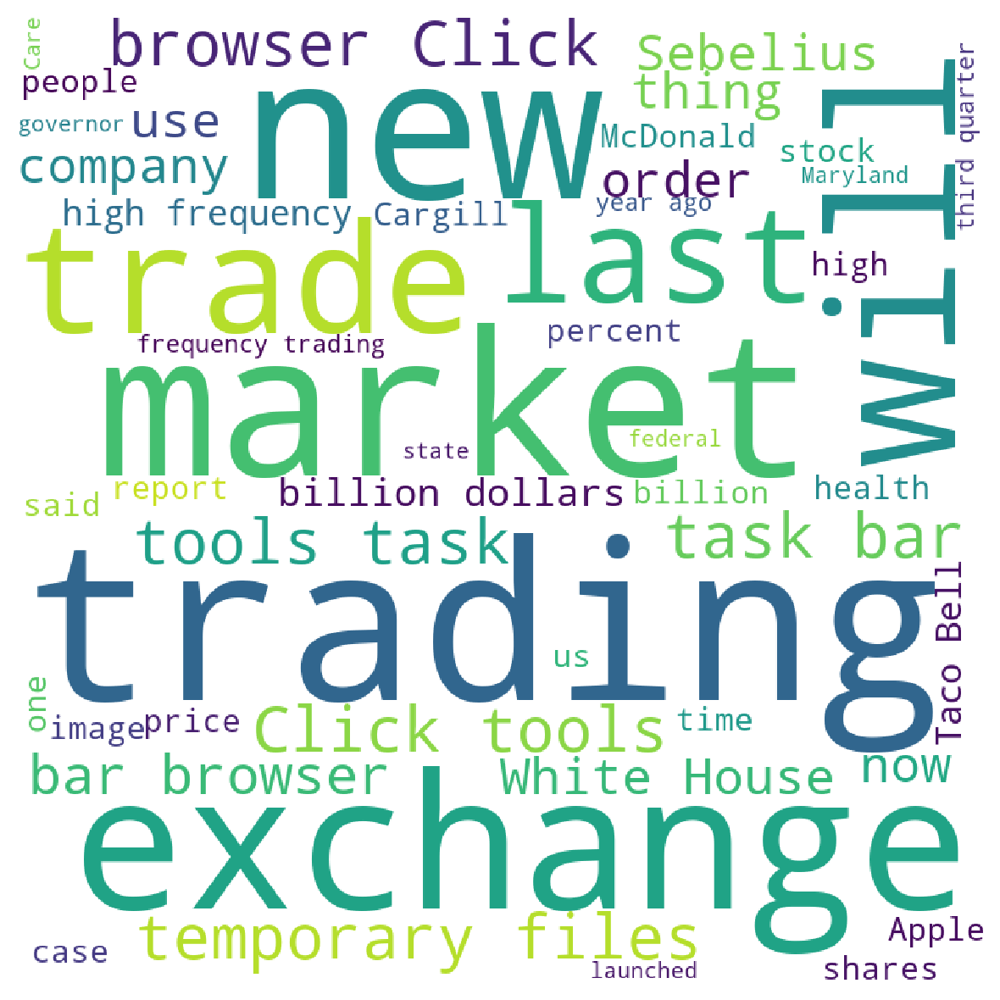

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words = 50,
                min_font_size = 10).generate(summary_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [ ]:
df_sub_1 = df_suboptimal[df_suboptimal['labelID'] == 1]
len(df_sub_1)

26

In [ ]:
summary_words = ""
for i in df_sub_1.index:
    summary_words += df_sub_1['Text_summary'][i]
    summary_words += " "

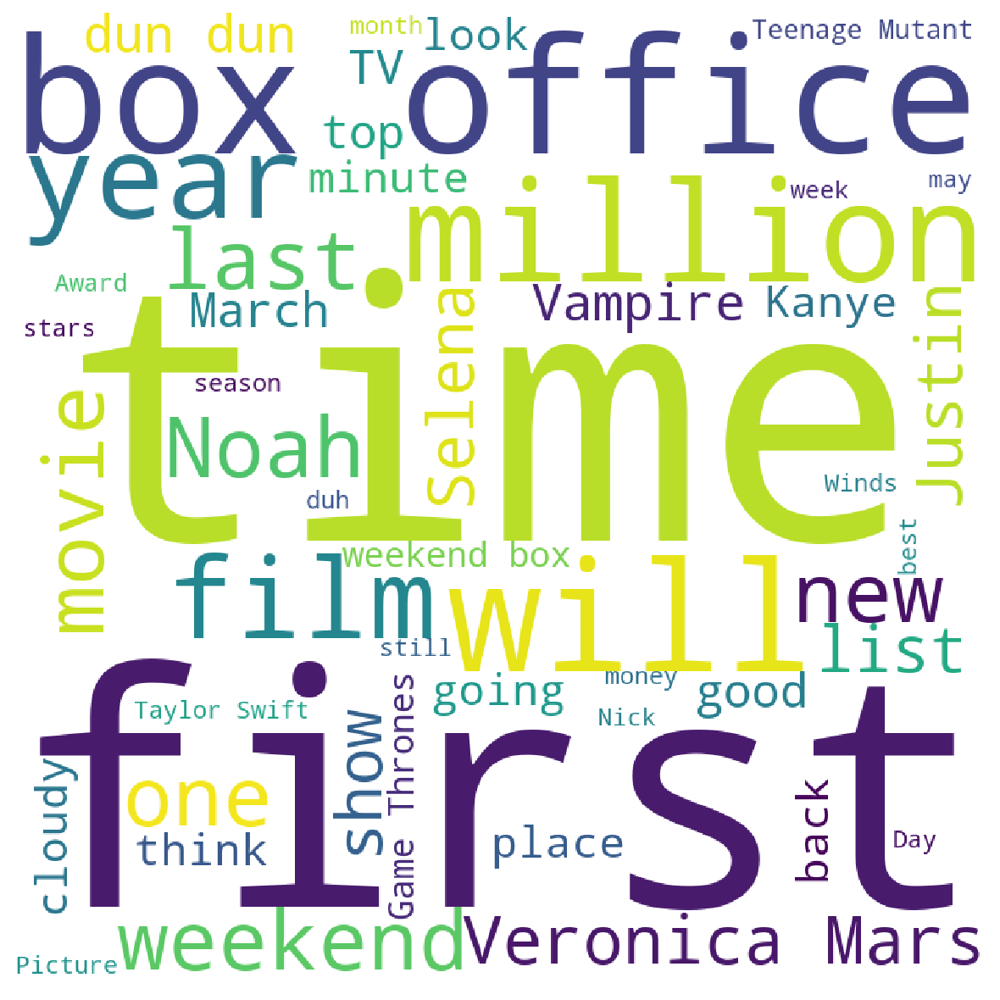

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words = 50,
                min_font_size = 10).generate(summary_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [ ]:
df_sub_2 = df_suboptimal[df_suboptimal['labelID'] == 2]
len(df_sub_2)

11

In [ ]:
summary_words = ""
for i in df_sub_2.index:
    summary_words += df_sub_2['Text_summary'][i]
    summary_words += " "

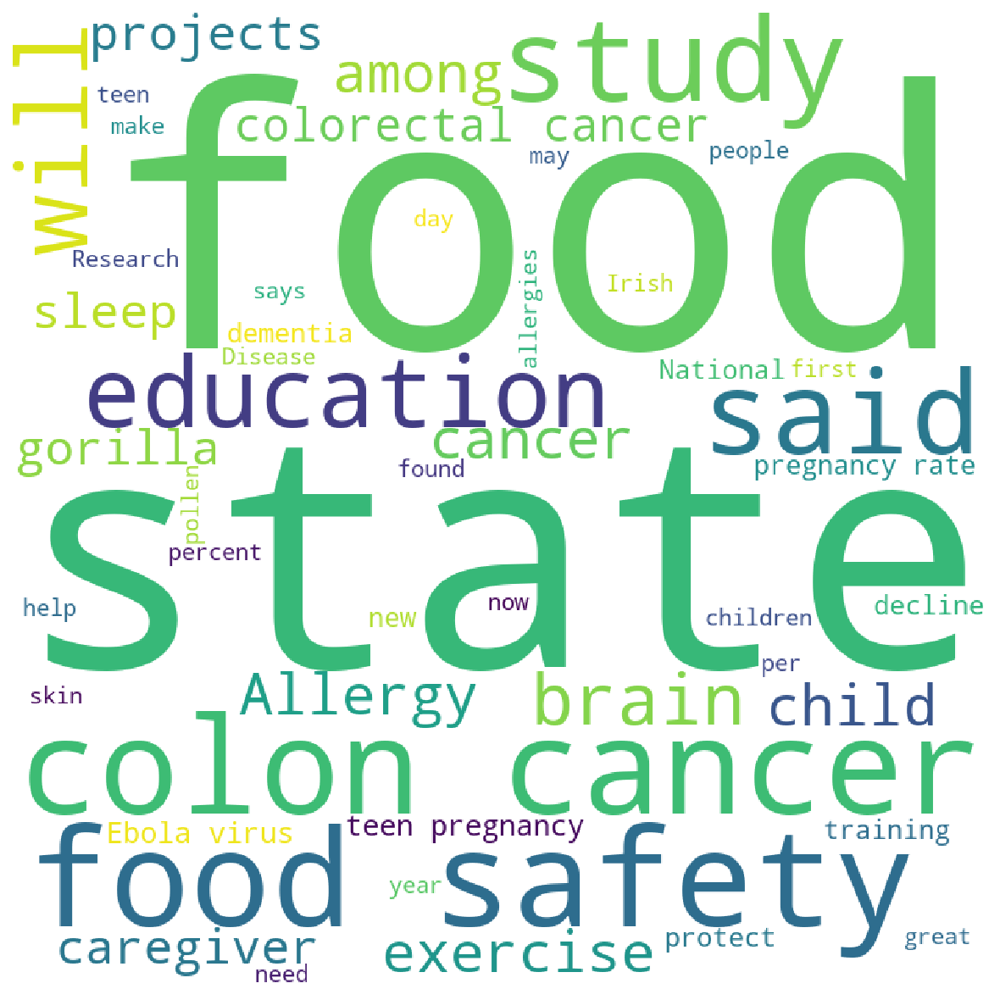

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words = 50,
                min_font_size = 10).generate(summary_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [ ]:
df_sub_3 = df_suboptimal[df_suboptimal['labelID'] == 3]
len(df_sub_3)

17

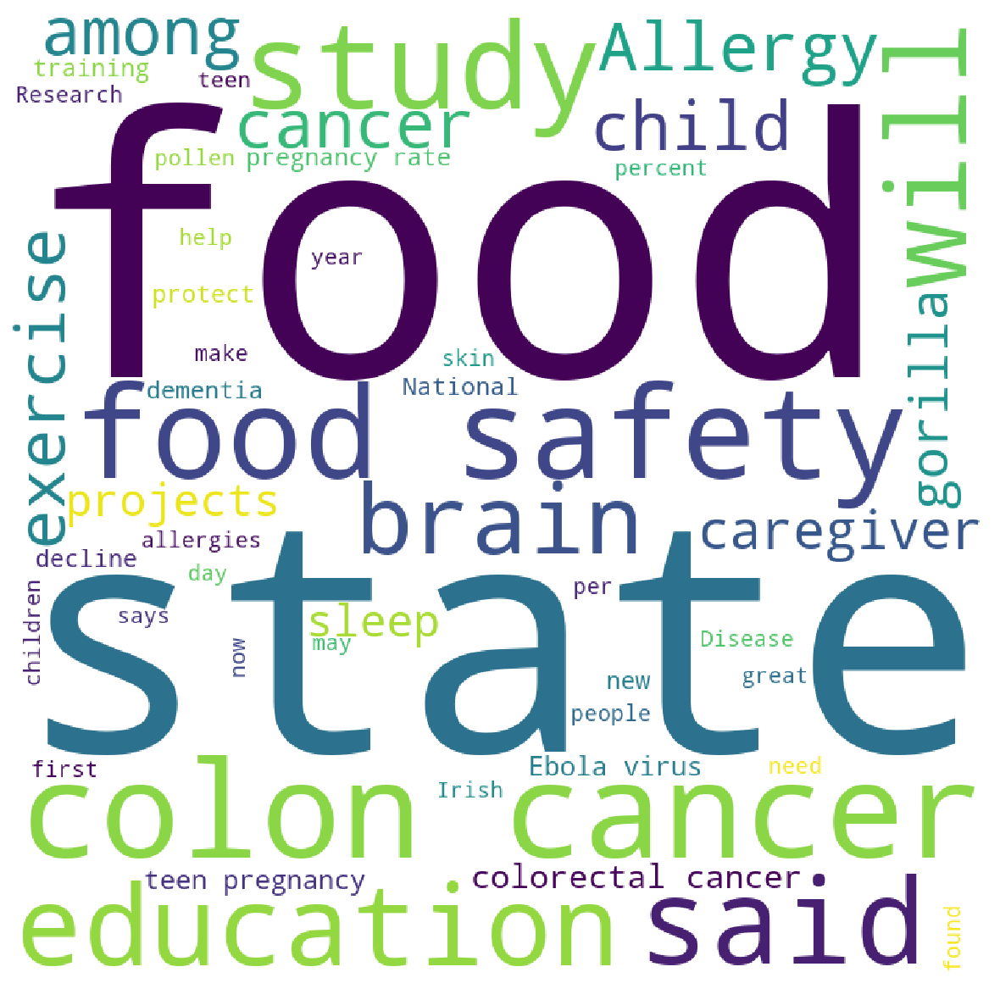

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words = 50,
                min_font_size = 10).generate(summary_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

**According to human summary word clouds these rows to have relevant information each according to its own class**

**lets see what the machine managed to capture**

In [ ]:
summary_words = ""
for i in df_sub_0.index:
    summary_words += df_sub_0['Summaries'][i]
    summary_words += " "

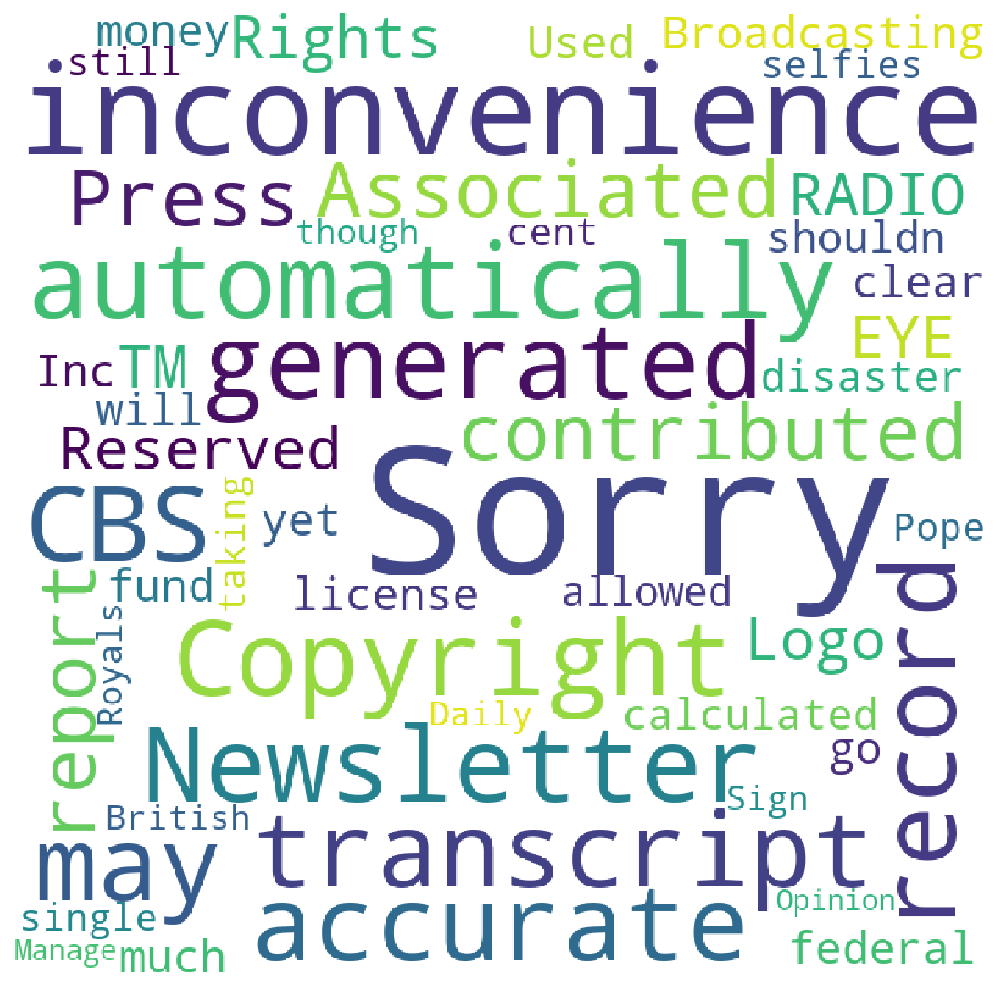

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words = 50,
                min_font_size = 10).generate(summary_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

**machine is focused more on names of news outlets and names of stock markets more than words correlated with the bussiness world**

In [ ]:
summary_words = ""
for i in df_sub_1.index:
    summary_words += df_sub_1['Summaries'][i]
    summary_words += " "

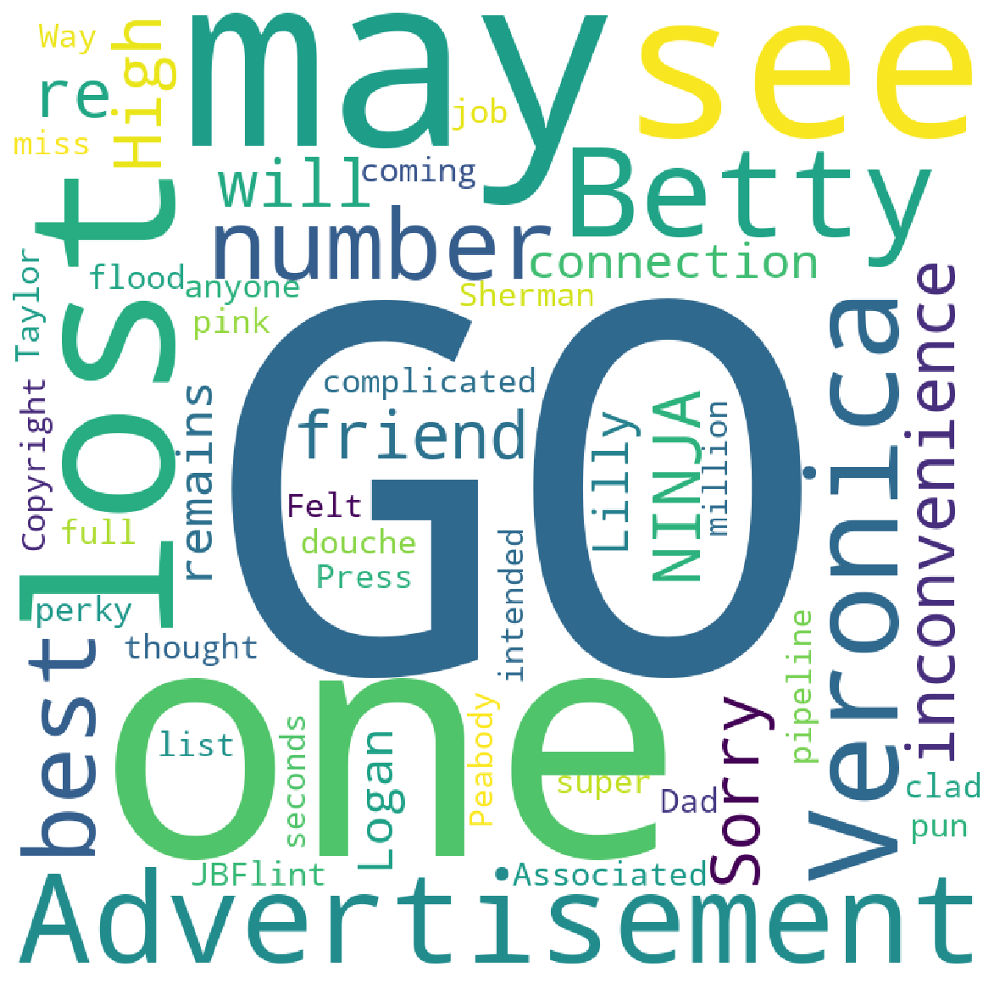

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words = 50,
                min_font_size = 10).generate(summary_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

**The human summary focused on what is going to happen and when while the the machine was distracted to flashy news titles like Amazing, Go, News.**

In [ ]:
summary_words = ""
for i in df_sub_2.index:
    summary_words += df_sub_2['Summaries'][i]
    summary_words += " "

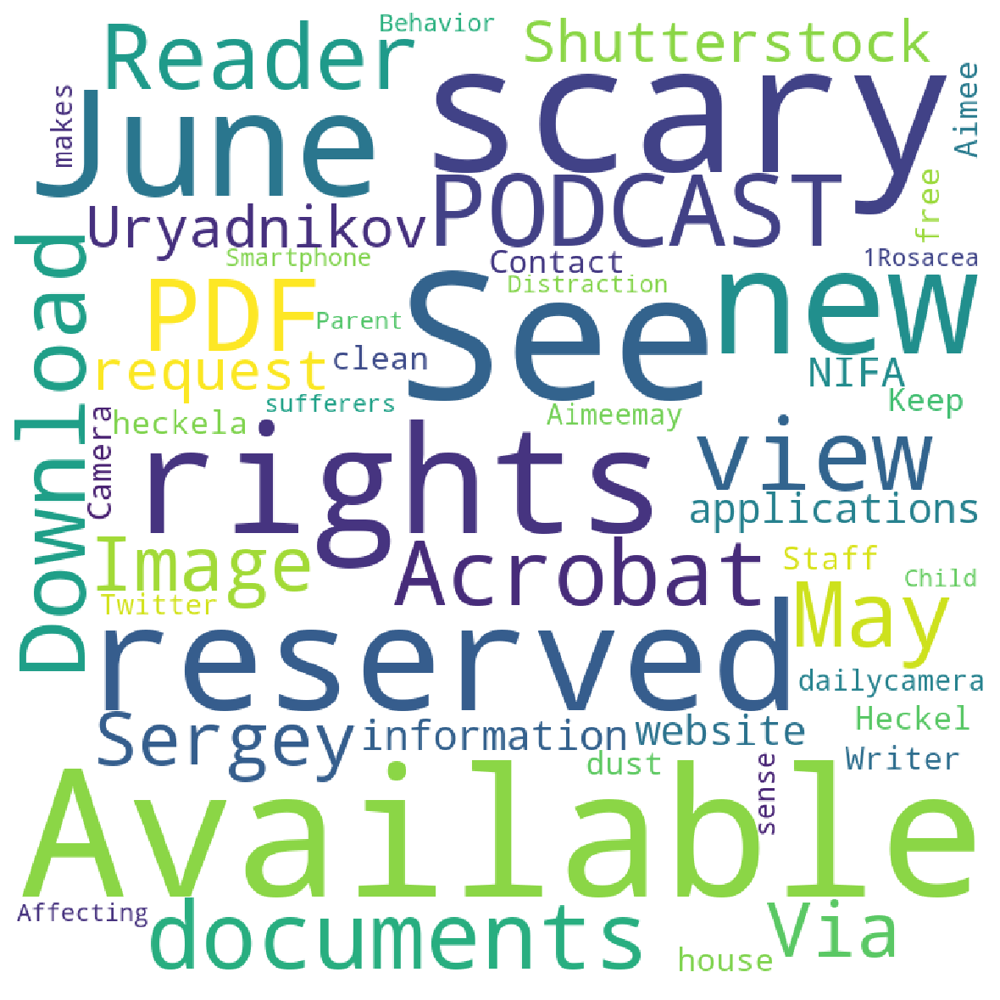

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words = 50,
                min_font_size = 10).generate(summary_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

**The human summary focused on food safety and the diseases related to corruption of food crops while the machine was distracted by where the news was found like twitter, podcast or wesite, but still managed to capture scary and rights which are in a way related to the topics in this rows but not enough.**

In [ ]:
summary_words = ""
for i in df_sub_3.index:
    summary_words += df_sub_3['Summaries'][i]
    summary_words += " "

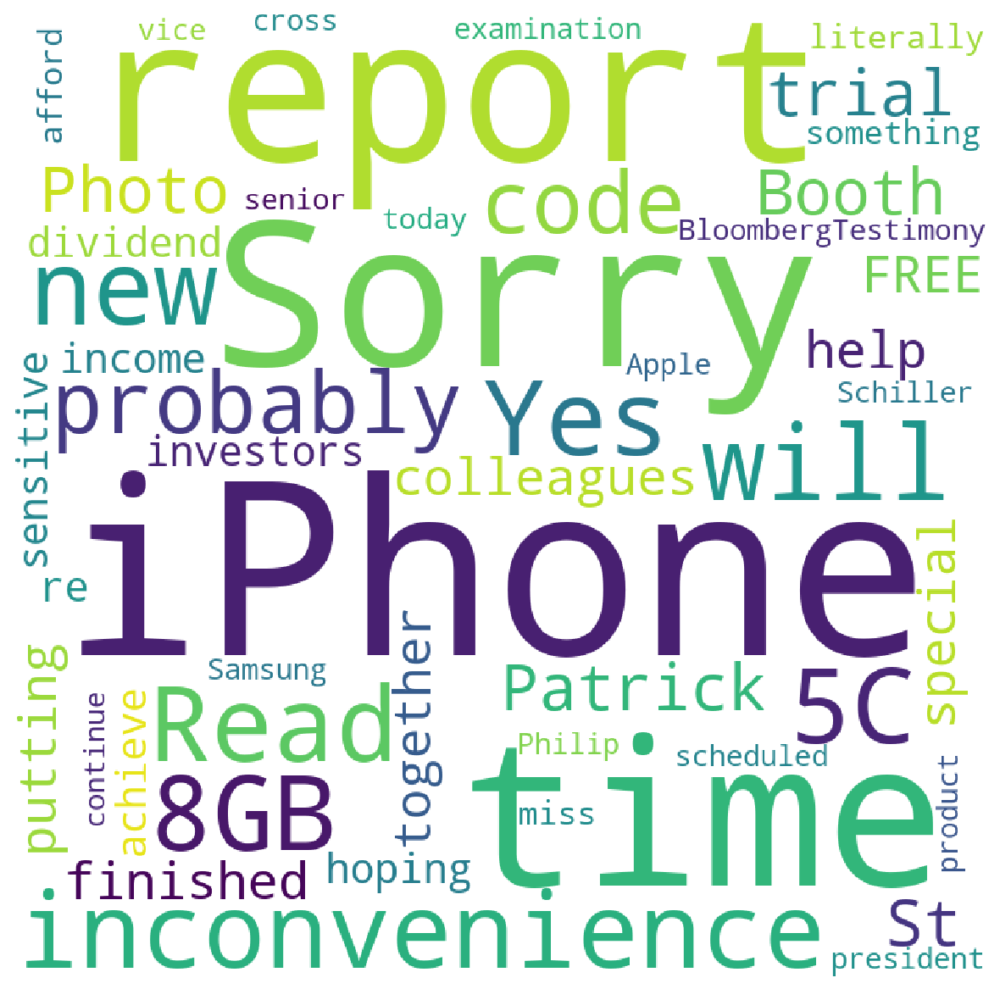

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words = 50,
                min_font_size = 10).generate(summary_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

**machine seemed to have focused on unnecessary details here,that may be included in an article but focusing on the importance of technology instead of the real news like google did so or Apple released something new**

## **11- Question and Answering System**

In [ ]:
tokenizer = AutoTokenizer.from_pretrained('bert-base-cased')
tokenizer = BertTokenizer.from_pretrained('bert-large-uncased-whole-word-masking-finetuned-squad')
model = BertForQuestionAnswering.from_pretrained('bert-large-uncased-whole-word-masking-finetuned-squad')

Downloading:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/208k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/426k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/443 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.25G [00:00<?, ?B/s]

In [ ]:
import torch
def answer_question(question, answer_text):
    input_ids = tokenizer.encode(question, answer_text)
    print('Query has {:,} tokens.\n'.format(len(input_ids)))
    sep_index = input_ids.index(tokenizer.sep_token_id)
    num_seg_a = sep_index + 1
    num_seg_b = len(input_ids) - num_seg_a
    segment_ids = [0]*num_seg_a + [1]*num_seg_b
    assert len(segment_ids) == len(input_ids)
    outputs = model(torch.tensor([input_ids]), 
                    token_type_ids=torch.tensor([segment_ids]), 
                    return_dict=True) 

    start_scores = outputs.start_logits
    end_scores = outputs.end_logits
    answer_start = torch.argmax(start_scores)
    answer_end = torch.argmax(end_scores)
    tokens = tokenizer.convert_ids_to_tokens(input_ids)
    answer = tokens[answer_start]
    for i in range(answer_start + 1, answer_end + 1):        
        if tokens[i][0:2] == '##':
            answer += tokens[i][2:]        
        else:
            answer += ' ' + tokens[i]
    print('Answer: "' + answer + '"')
    return answer

In [ ]:
question = " what does Scanzoni says?"
answer=answer_question(question, y)

Query has 28 tokens.

Answer: "it will be several years before the state ' s basins are dismantled"


## **12- Machine Translation -------> Innovation**


1. English to German language Translation.
2. English to Chineese language Translation.
3. English to Arabic language Translation.

### **1. English to German language Translation.**

In [ ]:
src = "en"
dst = "de"
task_name = f"translation_{src}_to_{dst}"
model_name = f"Helsinki-NLP/opus-mt-{src}-{dst}"
translator  = pipeline(task_name, model=model_name, tokenizer=model_name)

Downloading:   0%|          | 0.00/1.30k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/284M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/750k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/778k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.21M [00:00<?, ?B/s]

In [ ]:
translator("The energy giant says it is committed to cleaning up the Dan River spill site and will not increase customer rates to cover the expense.\nDuke Energy is adding a new element to dealing with its coal ash basins.\nWednesday, the company announced it will hire an independent team of engineers to review the condition of its sites.\nSpokesman Dave Scanzoni says the team will begin working as soon as North Carolina’s Governor Pat McCrory approves the company’s proposal.\n If we see any issues that need to be addressed, we’ll take care of them immediately.”This effort is in response the Dan River spill on February 2.")[0]["translation_text"]

'Der Energieriese sagt, dass es sich zur Reinigung der Dan River Spill Website verpflichtet und wird nicht die Kundenpreise erhöhen, um die Kosten zu decken. Duke Energy fügt ein neues Element in den Umgang mit seinen Kohleasche Becken. Mittwoch, das Unternehmen kündigte an, es wird ein unabhängiges Team von Ingenieuren zu mieten, um den Zustand seiner Standorte zu überprüfen. Sprecher Dave Scanzoni sagt, dass das Team beginnt zu arbeiten, sobald North Carolina Gouverneur Pat McCrory genehmigt den Vorschlag des Unternehmens. Wenn wir irgendwelche Probleme sehen, die behandelt werden müssen, werden wir uns sofort um sie kümmern.'

In [ ]:
text_to_translate = "The energy giant says it is committed to cleaning up the Dan River spill site and will not increase customer rates to cover the expense.\nDuke Energy is adding a new element to dealing with its coal ash basins.\nWednesday, the company announced it will hire an independent team of engineers to review the condition of its sites.\nSpokesman Dave Scanzoni says the team will begin working as soon as North Carolina’s Governor Pat McCrory approves the company’s proposal.\n If we see any issues that need to be addressed, we’ll take care of them immediately.”This effort is in response the Dan River spill on February 2."

In [ ]:
def get_translation_model_and_tokenizer(src_lang, dst_lang):
  model_name = f"Helsinki-NLP/opus-mt-{src}-{dst}"
  tokenizer = AutoTokenizer.from_pretrained(model_name)
  model = AutoModelForSeq2SeqLM.from_pretrained(model_name)
  return model, tokenizer

### **2. English to Chineese language Translation.**

In [ ]:
src = "en"
dst = "zh"
model, tokenizer = get_translation_model_and_tokenizer(src, dst)

Downloading:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.37k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/788k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/786k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.54M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/298M [00:00<?, ?B/s]

In [ ]:
inputs = tokenizer.encode(text_to_translate, return_tensors="pt", max_length=512, truncation=True)
print(inputs)

tensor([[   26,  1506, 31684,  5098,    41,    32,  1400,     9, 25741,   186,
             3, 18135, 12972, 36152,  3803,     7,    75,    56,   628, 22003,
          2271,     9,  2920,     3, 16831,     6, 47427,  5114,    32, 17280,
            13,   214,  5194,     9,  3502,    29,    45, 29023,    35,  1116,
         26276,    24,     6,  7776,     2,     3,  3922,  6009,    41,    75,
         25150,    59,  1693,  2219,     4, 36826,     9,   376,     3,  6143,
             4,    45,  5048,     6, 54162, 34006, 54731, 44194,   378,  5098,
             3,  2219,    75,  4998,   469,    35,  2348,    35,  3480, 56694,
          1247,    24, 13757, 29812, 33687,  1150, 21238, 34843,     3,  3922,
          1247,    24,  1645,     6,   685,   107,   489,   189,   280,    20,
           206,     9,    34,   953,     2,   107,  1247,   294,   239,   910,
             4,   200,  3974,  4006, 20565,  2123,    32,    11,  1089,     3,
         18135, 12972, 36152,    19,  1143,   325,  

In [ ]:
# generate the translation output using greedy search
greedy_outputs = model.generate(inputs)
print(tokenizer.decode(greedy_outputs[0], skip_special_tokens=True))

能源巨人说,该公司致力于清理丹河溢漏点,不会提高客户费率以支付费用。 杜克能源公司正在为其煤灰盆地的处理增加一个新的要素。 星期三,该公司宣布它将雇用一个独立的工程师小组来审查其矿址的状况。 发言人戴夫·斯坎佐尼说,该小组将在北卡罗来纳州州长帕特·麦克罗里批准该公司提案后立即开始工作。 如果我们看到任何需要解决的问题,我们将立即处理。 “这一努力是为了应对2月2日丹河泄漏事件。 ”


In [ ]:
# generate the translation output using beam search
beam_outputs = model.generate(inputs, num_beams=3)
print(tokenizer.decode(beam_outputs[0], skip_special_tokens=True))

能源巨人说,该公司致力于清理丹河溢漏点,不会提高客户费率以支付费用。 杜克能源公司(Duke Energy)在处理煤灰盆地方面增加了一个新的要素。 星期三,该公司宣布它将雇用一个独立的工程师小组来审查其矿址的状况。 发言人戴夫·斯坎佐尼(Dave Scanzoni)说,该小组将在北卡罗来纳州州长帕特·麦克罗里(Pat McCrory)批准该公司提案后立即开始工作。 如果我们看到任何需要解决的问题,我们将立即处理。 “这一努力是为了应对2月2日丹河泄漏事件。 ”


### **3. English to Arabic language Translation.**

In [ ]:
src = "en"
dst = "ar"
model, tokenizer = get_translation_model_and_tokenizer(src, dst)

Downloading:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.12k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/782k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/895k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.02M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/293M [00:00<?, ?B/s]

In [ ]:
# tokenize the text
inputs = tokenizer.encode(text_to_translate, return_tensors="pt", max_length=512, truncation=True)
beam_outputs = model.generate(
    inputs, 
    num_beams=5, 
    num_return_sequences=1,
    early_stopping=True,
)
for i, beam_output in enumerate(beam_outputs):
  print(tokenizer.decode(beam_output, skip_special_tokens=True))


يقول العامل العامل في مجال الطاقة إنه ملتزم بتنظيف موقع انسكاب نهر دان ولن يزيد أسعار العملاء لتغطية النفقات. إن شركة الدوق للطاقة تضيف عنصراً جديداً للتعامل مع أحواض رماد الفحم لديها. يوم الأربعاء، أعلنت الشركة أنها سوف تستأجر فريقاً مستقلاً من المهندسين لاستعراض حالة مواقعها. والناطق باسم ديف سكانزوني يقول إن الفريق سوف يبدأ العمل بمجرد أن يوافق محافظ كارولينا الشمالية بات ماكروري على اقتراح الشركة. وإذا رأينا أي قضايا تحتاج إلى معالجة فسوف نعتني بها على الفور". وهذا الجهد يأتي استجابة لانسكاب نهر دان في الثاني من فبراير/شباط.
